In [2]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.layers import LSTM
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.utils import get_file
import numpy as np
import random
import sys
from matplotlib import pyplot as plt

In [3]:
path = get_file('nietzsche.txt', origin='https://s3.amazonaws.com/text-datasets/nietzsche.txt')
text = open(path).read().lower()
print('corpus length:', len(text))

606208/600901 [==============================] - 2s 3us/step
corpus length: 600901


In [4]:
chars = sorted(list(set(text)))
print('total chars:', len(chars))

char_indices = dict((c, i) for i, c in enumerate(chars))
indices_char = dict((i, c) for i, c in enumerate(chars))

total chars: 59


In [5]:
from nltk.tokenize import sent_tokenize
# sent = sent_tokenize(text)
sent = text.split('\n')
print(len(sent))

9935


In [6]:
lengths = []

for s in sent:
    lengths.append(len(s))

In [7]:
uniq, nums = np.unique(np.array(lengths), return_counts=True)

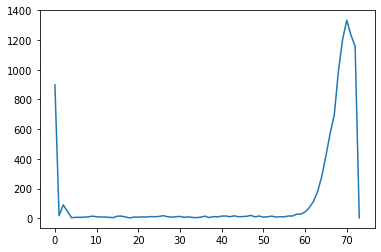

In [8]:
plt.plot(nums)
plt.show()

In [9]:
maxlen = 50
step = 3
sentences = []
next_chars = []
for i in range(0, len(text) - maxlen, step):
    sentences.append(text[i: i + maxlen])
    next_chars.append(text[i + maxlen])
print('nb sequences:', len(sentences))

nb sequences: 200284


In [10]:
print('Vectorization...')
X = np.zeros((len(sentences), maxlen, len(chars)), dtype=np.bool)
y = np.zeros((len(sentences), len(chars)), dtype=np.bool)
for i, sentence in enumerate(sentences):
    for t, char in enumerate(sentence):
        X[i, t, char_indices[char]] = 1
    y[i, char_indices[next_chars[i]]] = 1

Vectorization...


In [12]:
model = Sequential()
model.add(LSTM(128, input_shape=(maxlen, len(chars))))
model.add(Dense(len(chars)))
model.add(Activation('softmax'))

model.summary()

optimizer = RMSprop(learning_rate=0.01)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 128)               96256     
_________________________________________________________________
dense_1 (Dense)              (None, 59)                7611      
_________________________________________________________________
activation_1 (Activation)    (None, 59)                0         
Total params: 103,867
Trainable params: 103,867
Non-trainable params: 0
_________________________________________________________________


In [13]:
def sample(preds, temperature=1.0):
    preds = np.asarray(preds).astype('float64')
    preds = np.log(preds) / temperature
    exp_preds = np.exp(preds)
    preds = exp_preds / np.sum(exp_preds)
    print("Smoothened: ", preds)
    probas = np.random.multinomial(1, preds, 1)
    print(probas)
#     return preds
    return np.argmax(probas)

Smoothened:  [0.1963078  0.08253726 0.46690127 0.13701375 0.03470264 0.08253726]
[[0 0 0 1 0 0]]
[0.2  0.1  0.4  0.15 0.05 0.1 ]
3


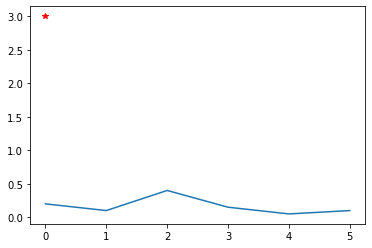

In [14]:
prob = np.array([0.2, 0.1, 0.4, 0.15, 0.05, 0.1])

a = sample(prob, temperature=0.8)

print (prob)
print (a)

plt.plot(prob)
plt.plot(a, 'r--*')

In [15]:
for iteration in range(1, 10):
    print()
    print('-' * 50)
    print('Iteration', iteration)
    model.fit(X, y, shuffle=True,
              batch_size=128,
              epochs=1, verbose=2)

    start_index = random.randint(0, len(text) - maxlen - 1)

    for diversity in [0.2, 0.5, 1.0, 1.2]:
        print()
        print('----- diversity:', diversity)

        generated = ''
        sentence = text[start_index: start_index + maxlen]
        generated += sentence
        print('----- Generating with seed: "' + sentence + '"')
        sys.stdout.write(generated)

        for i in range(400):
            x = np.zeros((1, maxlen, len(chars)))
            for t, char in enumerate(sentence):
                x[0, t, char_indices[char]] = 1.

            preds = model.predict(x, verbose=0)[0]
            next_index = sample(preds, diversity)
            next_char = indices_char[next_index]

            generated += next_char
            sentence = sentence[1:] + next_char

            sys.stdout.write(next_char)
            sys.stdout.flush()
        print()


--------------------------------------------------
Iteration 1
1565/1565 - 128s - loss: 1.9700 - accuracy: 0.4252

----- diversity: 0.2
----- Generating with seed: " stands beside the slowly turning swamp
of sounds "
 stands beside the slowly turning swamp
of sounds Smoothened:  [3.35190231e-11 1.75942875e-10 1.71825479e-15 1.90401365e-07
 4.62749316e-16 1.73113075e-11 2.60652382e-16 2.64401785e-12
 2.20639278e-12 2.27948363e-13 3.58699454e-20 3.09530280e-15
 2.82005251e-16 2.02951959e-19 1.15602091e-20 7.24965705e-19
 9.04339790e-20 5.20376173e-22 1.80903738e-18 2.57232564e-19
 7.21493391e-15 1.30833952e-15 9.86842692e-17 8.95654880e-16
 1.83599567e-19 2.52088913e-18 6.76130963e-19 7.25250163e-01
 4.91291284e-04 2.06194001e-05 8.21405578e-07 4.88798426e-05
 2.57820432e-04 4.82662149e-07 1.04616647e-03 7.29094108e-02
 1.84193761e-10 9.49471503e-11 6.48152358e-08 2.11126123e-04
 3.48877378e-06 1.43086476e-01 6.74085058e-05 2.64232443e-13
 2.64509988e-05 1.41868474e-04 5.56600912e-02 4.

[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
eSmoothened:  [8.43485406e-07 9.99886666e-01 1.06662635e-17 1.43989797e-12
 9.09582349e-18 5.80080564e-26 2.12278851e-19 6.72284537e-08
 2.54153812e-08 2.29705547e-09 2.60787993e-29 6.54373236e-25
 6.06459066e-26 8.31033881e-29 1.63179789e-29 2.04441539e-27
 5.82584042e-27 1.23922036e-31 7.85011122e-29 3.19222994e-25
 3.57968353e-17 7.17916889e-15 1.91492434e-23 2.98500848e-19
 1.42556974e-30 2.02413994e-25 1.74256343e-28 4.49706330e-08
 1.78414742e-10 1.95585015e-10 6.28077398e-11 4.36382140e-13
 4.23406850e-11 4.11994320e-19 2.07562262e-12 1.99783911e-12
 9.21486365e-21 4.00674021e-19 1.37316334e-11 1.62772072e-10
 3.18291502e-08 2.27810200e-13 4.97899125e-14 1.97675770e-20
 1.37364490e-08 2.43397647e-08 1.12280508e-04 2.49133320e-16
 1.46207461e-15 5.42715654e-13 1.36935527e-17 2.72163645e-17
 6.49746516e-25 1.46762160e-38 2.30738271e-38 2.02745416e-37
 1.34895

tSmoothened:  [1.72029678e-07 9.97545673e-01 6.19390336e-18 6.96617993e-17
 2.85936663e-22 2.94681637e-30 1.75803445e-20 1.03439493e-08
 8.37261960e-12 5.41128199e-11 1.09970951e-31 1.42264286e-25
 1.59680026e-26 1.40296105e-30 2.60196504e-33 6.39989669e-30
 1.13309420e-29 2.71342077e-34 6.44801538e-29 9.52577681e-29
 1.19353890e-18 1.47857660e-18 1.13700125e-27 2.13636860e-18
 3.33257728e-33 3.01161607e-26 8.42760586e-31 5.99168435e-13
 1.08630368e-19 1.72711711e-20 1.40237957e-14 2.48885037e-11
 1.63136680e-18 2.30559672e-18 2.45413781e-03 8.95941918e-11
 3.16989446e-26 1.12975301e-15 6.88580170e-13 1.97052929e-17
 2.03366282e-13 1.84953430e-14 1.67405427e-19 4.86030977e-26
 5.55054353e-14 6.43342227e-09 2.70753851e-11 1.73885216e-11
 2.70355060e-21 1.08084057e-15 4.31619007e-23 7.16668590e-16
 4.93586752e-28 9.21431597e-44 3.15439140e-45 2.16209565e-44
 5.79354265e-45 3.20359368e-45 2.60390177e-43]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [7.70441525e-10 2.41241210e-05 3.69144878e-20 4.41571196e-14
 2.41794143e-19 2.83607599e-25 1.57104065e-23 6.19836557e-13
 2.10222383e-14 6.88406488e-14 3.51262797e-27 3.22310522e-20
 8.11022846e-22 1.18907469e-25 9.95953081e-26 2.72442371e-24
 1.51057573e-25 4.44347797e-30 1.34381593e-25 1.79095792e-25
 2.12322280e-18 1.03324300e-21 2.51421798e-24 2.03448048e-21
 4.47050523e-28 6.22024832e-24 1.31789485e-27 2.39312629e-09
 2.62615176e-14 5.10039474e-11 2.88686937e-09 1.49873943e-05
 8.94608103e-11 1.75409846e-09 3.49783555e-16 7.99268095e-09
 5.29292201e-21 1.65486985e-11 6.49033822e-13 9.99920004e-01
 4.79838937e-11 1.19582269e-11 3.34274031e-12 1.63329495e-20
 1.08261096e-11 3.49111500e-05 5.95621125e-06 2.73218487e-14
 2.73781017e-13 7.86430055e-10 3.39738477e-18 6.50568192e-14
 3.56089392e-27 1.85870885e-36 4.83051646e-37 4.80833996e-36
 6.77055030e-37 1.31015578e-37 4.07452776e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [9.15193037e-11 4.19316056e-08 7.20117526e-11 6.77690164e-04
 6.72218673e-12 2.55708889e-12 1.06752667e-13 7.23271360e-10
 3.01907681e-10 1.02747645e-11 8.25814588e-18 3.33781506e-12
 2.11411805e-13 1.69719491e-16 5.88504338e-18 1.95506512e-16
 5.26762734e-17 4.37340981e-19 4.86706862e-16 3.29174773e-16
 8.90870443e-12 1.21197510e-11 1.80928978e-14 2.94978419e-12
 2.97109808e-16 1.49365649e-15 1.03389676e-14 1.19672016e-01
 2.82675754e-04 5.50143352e-02 5.04868228e-02 1.30564784e-01
 2.73383467e-02 5.84069547e-03 1.94884543e-03 7.55310694e-03
 1.24853053e-07 6.47108091e-08 1.10115826e-02 2.00904795e-01
 1.50632850e-04 1.93093680e-02 3.15233662e-02 3.84362478e-09
 6.40570519e-02 1.80603227e-01 7.62365087e-03 6.72988682e-05
 4.89777107e-06 8.53645285e-02 5.35104555e-12 4.45296840e-08
 4.78931821e-15 1.41554671e-25 2.67797814e-26 5.02808740e-25
 1.83420363e-26 2.67160115e-26 9.57135115e-25]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.54658115e-15 2.01590385e-15 1.05557142e-18 1.70571549e-11
 7.23894137e-19 6.32251595e-13 1.38168038e-19 4.66697586e-16
 2.26503139e-17 8.84545014e-18 3.10059062e-22 4.64719576e-19
 6.67595823e-20 2.32136922e-22 1.13205167e-23 8.67967248e-22
 2.79001031e-22 5.34971373e-24 1.94862580e-21 9.69639016e-23
 8.53747214e-19 2.09933359e-19 1.12183896e-18 6.59593356e-19
 5.34183037e-21 6.24260988e-21 6.21004248e-21 2.73291459e-02
 9.36378407e-08 1.33108771e-07 3.94876625e-09 4.64394260e-07
 1.60849361e-06 1.10634182e-10 7.31253759e-07 2.23148370e-05
 4.60841203e-13 4.72614141e-15 4.41225253e-11 1.73227864e-08
 3.73787801e-09 9.72509711e-01 4.69113385e-08 3.08709669e-15
 4.90661142e-10 1.29606488e-07 1.30650516e-04 2.07972073e-10
 1.61187479e-10 4.94409896e-06 1.00189736e-15 4.76640113e-14
 8.31307314e-20 1.38813853e-30 2.53308238e-31 4.28138763e-30
 2.77201197e-31 9.57787274e-32 3.00306576e-30]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [1.09003495e-18 6.82564717e-16 6.98276146e-22 2.33165652e-18
 3.85779790e-21 9.77236596e-24 7.41654752e-25 3.67472278e-20
 4.13590335e-22 9.86143221e-21 4.32646345e-28 2.90056319e-21
 5.36372226e-22 6.32329280e-25 1.30190133e-26 2.77163237e-27
 1.24274172e-26 2.94918934e-27 1.95484341e-25 1.01944762e-27
 1.18866920e-24 1.29796976e-24 6.31018543e-24 5.73669870e-24
 5.42650674e-28 8.53533677e-28 9.01958123e-25 1.71914918e-03
 1.51928005e-19 3.44027813e-14 4.21253244e-22 7.58962013e-07
 1.06065979e-17 7.51399608e-21 3.35469322e-05 9.19160124e-09
 1.63566773e-19 4.60868008e-19 2.75792104e-08 7.56234449e-16
 4.22994122e-16 9.98245777e-01 1.77001791e-15 2.22635400e-21
 7.29494740e-07 6.07198594e-16 4.64591708e-15 1.63653385e-09
 2.37754475e-20 1.58609555e-17 2.05776360e-19 1.40125426e-14
 1.67877582e-24 2.87985999e-39 2.14460666e-40 2.92203282e-38
 2.38031130e-40 6.72890120e-40 9.49285636e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.34878155e-07 2.91225109e-02 4.56875009e-17 5.19100947e-14
 1.71729301e-20 1.07862878e-21 9.36142429e-21 9.26404606e-12
 1.40796235e-13 2.00965190e-13 4.44287862e-25 1.12326965e-17
 2.38726485e-19 7.29221514e-24 1.99726818e-25 1.63972922e-24
 6.40585842e-24 1.36931647e-26 9.81441923e-23 2.80400590e-23
 6.89717541e-16 1.87574065e-17 1.05391925e-20 2.29087809e-19
 2.14734236e-25 8.52258169e-25 9.95008833e-24 1.21552212e-10
 4.40872926e-07 2.89501343e-04 4.66749269e-07 2.46730234e-12
 1.33159528e-08 1.66602560e-05 1.88490342e-12 6.73785184e-09
 3.69986160e-16 1.49891341e-13 1.81920709e-01 4.60456570e-08
 7.47902863e-01 2.57255174e-12 1.41579461e-06 9.63215451e-19
 2.55537098e-04 4.03977243e-02 9.19691365e-05 3.52810003e-10
 8.03394377e-11 6.01862038e-11 3.51981131e-13 3.18316497e-13
 6.83535577e-20 3.44562772e-37 3.43725826e-37 4.88274309e-36
 1.15093097e-37 1.25721694e-37 4.78332620e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

aSmoothened:  [6.16917616e-08 2.32965427e-02 2.66197888e-16 5.64670267e-14
 1.80126301e-18 3.40488424e-23 9.07986479e-20 1.55339707e-11
 3.53982040e-13 8.93765128e-13 9.78600226e-24 5.29172894e-18
 3.68193929e-19 2.79659085e-23 6.20182786e-25 2.14082592e-23
 1.53046197e-23 1.63674503e-26 6.43710746e-22 1.10469080e-22
 2.20386101e-15 6.08942586e-16 2.99382041e-21 2.28947594e-18
 6.78383412e-26 7.67487114e-23 6.17464870e-23 3.23017579e-11
 7.64295190e-07 1.14053705e-03 1.00047069e-05 4.42215889e-13
 4.07971397e-10 4.16712535e-05 4.12720441e-11 4.40691909e-08
 7.89232903e-16 1.60911543e-11 1.68891332e-01 6.74538655e-08
 7.74715644e-01 4.75588988e-13 6.25763628e-06 2.54027057e-17
 4.36536234e-03 2.74547973e-02 7.69110729e-05 1.55870078e-09
 4.45400170e-10 1.35919697e-11 1.74097811e-12 3.22901212e-10
 1.23337175e-19 1.71782038e-36 5.72267067e-37 9.47500372e-36
 4.30346557e-37 5.42077453e-37 1.69823148e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

mSmoothened:  [1.36657753e-16 6.41410894e-13 4.71071633e-21 5.53662633e-17
 6.53336718e-23 1.38738442e-22 3.18762866e-22 1.23879746e-17
 3.35246725e-19 6.66546282e-16 4.29950845e-29 2.83364861e-22
 2.92673300e-25 1.28630964e-27 3.32927165e-29 2.07137862e-27
 9.88709171e-29 1.05228841e-28 7.26043070e-27 1.66108692e-28
 2.03575934e-22 2.03378974e-21 1.23672948e-24 1.33757888e-22
 4.21665252e-30 3.58670791e-27 8.72076102e-27 1.22508333e-01
 2.70736526e-14 3.83013684e-17 9.97198280e-18 3.74613306e-04
 1.12350270e-17 3.34146506e-14 4.14274640e-17 8.76987352e-06
 2.09359353e-19 4.42619841e-20 3.97270072e-14 1.63680315e-12
 3.32168890e-16 8.77103515e-01 6.95286950e-12 2.19216248e-21
 9.53826432e-12 9.70256228e-13 6.53746486e-18 4.76821718e-06
 1.20996775e-15 4.69469181e-15 4.37902272e-18 2.24683706e-10
 1.90632571e-27 2.49246226e-41 1.58718775e-41 5.71157702e-40
 9.59321564e-42 1.29054948e-40 1.83595631e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.19547610e-07 9.18252526e-01 2.74436081e-18 6.25355549e-16
 9.28382015e-20 3.13338003e-26 3.89242999e-22 3.20474301e-12
 2.82060771e-13 3.07363668e-13 4.45351713e-26 1.59505534e-20
 2.59399101e-22 1.24528609e-25 6.31811806e-28 3.22804551e-26
 2.86749613e-25 7.36321272e-29 3.00453062e-24 1.98939287e-25
 2.18770842e-17 1.54483437e-18 2.55716072e-23 8.26398235e-21
 2.82635563e-29 3.83055140e-26 4.13017722e-26 2.79844052e-12
 5.49014448e-09 9.74566232e-05 1.23554639e-07 7.37289760e-15
 9.71269363e-13 4.33591325e-06 3.05308278e-12 5.12592505e-10
 7.42580020e-19 3.34699410e-13 7.75657234e-02 3.17154837e-09
 3.97433864e-03 1.69510690e-15 1.90975401e-08 3.94000812e-20
 1.29961048e-05 8.06024641e-05 1.17495353e-05 2.52985745e-10
 3.10180802e-12 1.25009276e-13 1.69828600e-14 4.23824500e-12
 2.70448396e-22 1.82008270e-40 4.18278579e-41 6.31556257e-40
 4.92851678e-41 4.81189578e-41 1.19034529e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.12922120e-08 9.99999989e-01 1.51772175e-25 2.98494805e-19
 3.67357465e-22 4.38603192e-34 1.28828043e-27 1.44208905e-13
 1.37338811e-17 9.90053337e-18 9.00566318e-36 6.66911264e-30
 1.51742958e-31 1.82999131e-35 5.70403000e-37 2.89408927e-34
 4.18848514e-35 5.03313038e-39 4.67482738e-34 1.53827481e-35
 1.51479274e-24 1.17101071e-23 1.45250586e-27 1.62078365e-27
 3.07793899e-37 8.16726552e-33 2.67329191e-34 9.03267756e-15
 5.71403723e-22 4.13190742e-23 7.48543664e-18 1.58515928e-12
 1.33250608e-23 1.71685567e-20 1.10218951e-22 2.08784860e-11
 7.92056926e-30 7.89889835e-25 7.05174871e-17 5.86622732e-17
 1.81477685e-15 1.94252318e-15 4.89521394e-20 4.03439366e-27
 8.20322219e-14 5.28342263e-11 1.69431111e-14 3.53000593e-18
 4.24856617e-22 2.28716182e-19 6.52353709e-25 2.79158535e-17
 1.62550041e-32 2.21808584e-48 1.58240248e-49 1.26786450e-48
 1.05687432e-48 7.48827069e-49 6.43238798e-48]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.93923586e-06 9.99980870e-01 1.12079790e-22 1.50925353e-16
 1.98559096e-22 1.75769184e-29 1.94278267e-26 8.38870149e-13
 1.39089913e-17 3.04111021e-16 2.01638895e-32 1.24597118e-28
 1.84077828e-30 6.82310456e-34 3.35073150e-34 1.21906289e-31
 5.19487874e-33 8.19846132e-38 5.88549023e-33 7.17060837e-32
 1.36182920e-22 1.18083330e-21 4.25072578e-29 1.48024778e-24
 1.14146632e-35 3.20400688e-30 5.24098275e-34 4.11564327e-12
 1.17279894e-23 1.60128211e-19 5.01522088e-21 5.02061038e-14
 5.11989585e-22 1.07134211e-20 5.87619838e-18 3.16005443e-08
 6.72377545e-29 8.07529130e-21 9.90297603e-16 5.58574770e-10
 7.35925815e-11 1.36659929e-10 1.30887053e-20 9.20397572e-25
 1.21167706e-05 6.01626698e-11 1.12122604e-13 5.17809238e-15
 9.60053647e-19 1.32344011e-15 2.61534207e-23 4.12402568e-08
 6.27306709e-29 7.00615298e-45 3.72618358e-44 4.13454392e-43
 1.83737811e-44 1.31588637e-43 1.18238289e-42]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [4.64199858e-13 1.22764227e-07 3.95608260e-19 6.44196925e-18
 2.42807151e-20 6.15405904e-22 2.92559992e-23 1.39672025e-16
 6.69047892e-18 3.27643092e-16 2.68866502e-29 3.66046177e-24
 1.77745217e-24 8.66389590e-28 2.48149066e-29 3.22946593e-28
 3.76247164e-28 4.80602664e-29 4.13556264e-28 2.14993095e-27
 6.04862388e-20 5.24209867e-20 6.96258912e-23 2.45357563e-23
 7.36872286e-28 1.43392270e-24 1.38978274e-24 1.35013121e-15
 2.41218543e-13 2.69087477e-11 9.99999768e-01 2.73105214e-13
 9.58243748e-17 3.52591996e-14 2.86661460e-19 3.32901593e-12
 7.17612169e-17 4.53418443e-16 8.59771814e-17 9.05264174e-16
 7.96779199e-16 9.17019040e-12 4.41389472e-18 4.96719004e-20
 4.73389297e-14 8.37267333e-13 2.47829212e-08 1.27149414e-17
 1.57366384e-14 5.51330253e-13 1.07068354e-16 8.40714814e-08
 3.30076445e-24 5.29686857e-38 3.54185655e-39 7.30885014e-38
 1.91334721e-39 4.39357576e-39 1.63247212e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.32890166e-13 1.21748413e-07 1.27674707e-19 6.96051631e-13
 2.46786557e-22 3.09308749e-22 2.42005288e-22 8.18476005e-14
 1.93081078e-16 2.29945940e-15 8.79551048e-27 9.38124470e-22
 1.19943118e-23 3.84401667e-25 5.39299584e-26 4.00825491e-26
 4.47960621e-26 5.21076994e-29 7.91639231e-24 1.26042511e-26
 1.21673934e-19 4.87480927e-20 1.05416396e-22 2.69839107e-21
 2.26388333e-27 5.86470912e-25 3.79431975e-25 2.82102781e-06
 7.45092592e-07 9.87477751e-10 1.58097029e-08 1.09661017e-09
 6.73228051e-10 1.07023372e-10 7.43003546e-14 1.07906669e-07
 1.79183533e-15 1.10691792e-09 9.99818474e-01 3.67907015e-07
 8.02580667e-10 2.15333467e-06 1.30672151e-09 1.76234728e-16
 1.98197684e-06 1.29712323e-04 2.55639657e-05 6.02994298e-08
 1.73156234e-08 1.78493849e-05 4.43737139e-19 1.75728246e-09
 6.03917610e-23 2.10158034e-36 1.97115111e-37 2.06620644e-36
 6.92462091e-37 1.79588210e-38 6.89683966e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

xSmoothened:  [3.39299235e-15 3.63577065e-16 1.40671524e-16 3.45539643e-15
 8.19938595e-21 8.32975272e-22 5.32596920e-18 1.94869018e-19
 4.67115015e-19 1.42597761e-18 1.13065595e-25 5.57093729e-20
 2.49371641e-21 8.45243771e-24 4.25676963e-25 3.18039430e-24
 2.54131690e-26 2.34004496e-25 1.42236104e-23 2.04315617e-25
 8.45811548e-18 2.04786803e-15 8.25395415e-21 4.14564207e-20
 2.31090465e-26 6.68027905e-25 8.98735929e-25 1.07226053e-06
 2.65617781e-11 7.80246292e-09 8.37998568e-15 3.25575710e-08
 1.17077914e-10 1.48405880e-13 3.14798458e-08 9.83966643e-04
 3.13319091e-15 5.30625764e-18 2.51557625e-15 2.16265136e-15
 6.58038712e-19 1.55767436e-08 9.99014824e-01 1.87538020e-16
 6.20708704e-11 5.66385234e-13 4.88635055e-08 9.19040085e-10
 1.04297205e-15 9.57467822e-15 1.53838282e-18 2.11073169e-13
 5.98432651e-25 1.21421823e-37 3.98161583e-38 5.37980596e-37
 2.73946144e-38 3.48784547e-39 1.95219370e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.97006736e-07 9.96614518e-01 1.96536713e-15 2.60123104e-14
 3.79963624e-17 3.61761151e-20 1.58001431e-16 2.24262303e-03
 2.62480864e-08 6.17398456e-06 2.08376926e-27 1.43344088e-21
 2.10664399e-23 2.53020078e-27 7.20503462e-28 7.83460361e-26
 5.03581004e-26 1.56851920e-28 3.59807659e-26 1.91568265e-27
 6.46518525e-13 1.16315632e-10 7.86145528e-21 3.30175635e-16
 3.67384345e-28 1.71410851e-24 2.76501679e-25 4.56878368e-15
 8.39639509e-18 2.39525727e-16 6.57090722e-07 4.42956538e-17
 6.30820372e-14 8.48569023e-18 5.10421012e-19 3.75305478e-14
 1.79058030e-18 9.67013764e-20 6.29543826e-10 9.97019586e-13
 2.69046931e-12 5.31898970e-18 7.20781352e-15 1.64321133e-19
 6.16233863e-11 1.13570428e-03 1.92959416e-16 1.49936172e-17
 2.97862987e-18 2.97691403e-19 1.32353575e-19 9.82205111e-19
 9.15676585e-22 5.47098697e-38 4.19280431e-39 7.21098135e-38
 4.20229217e-39 2.80115619e-39 9.68498072e-38]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.72216209e-06 9.99956699e-01 1.22406119e-22 2.56920445e-16
 2.08317911e-22 1.71241356e-29 2.03773406e-26 7.25681601e-13
 1.72569192e-17 4.39990460e-16 1.61206156e-32 1.25749062e-28
 1.77885579e-30 6.73925882e-34 3.53407084e-34 1.39842220e-31
 5.30598092e-33 1.16174669e-37 5.81688239e-33 1.06590476e-31
 1.31849885e-22 1.09728570e-21 4.88110703e-29 1.86627124e-24
 8.54721971e-36 3.38898350e-30 5.38440771e-34 1.48847401e-11
 2.12334588e-23 3.88191461e-19 7.68103997e-21 9.03262665e-14
 2.48044255e-22 9.87405062e-21 7.58903205e-18 3.87679977e-08
 7.01957645e-29 8.29691330e-21 1.43863502e-15 1.41312174e-09
 7.58376392e-11 7.92143750e-10 1.82874036e-20 9.75831454e-25
 3.44979409e-05 1.37321926e-10 2.85549466e-13 2.24180565e-14
 2.32491913e-18 3.92221876e-15 3.31829573e-23 4.01719636e-08
 5.99160852e-29 5.68224924e-45 3.31152993e-44 3.31495471e-43
 1.70638563e-44 9.24275147e-44 1.23471725e-42]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.00245908e-06 9.99998926e-01 4.93837012e-19 7.72168253e-14
 2.15973737e-22 1.69847304e-27 3.24484365e-23 2.20853199e-10
 3.45472038e-14 6.20669479e-13 1.11463459e-31 9.42846457e-23
 3.38722695e-24 2.60067233e-29 2.09733983e-31 5.51339040e-29
 5.94555620e-29 1.09094078e-31 2.35980972e-29 3.12944318e-30
 1.01183560e-18 1.48689205e-18 1.27519644e-22 3.43943583e-21
 1.54113359e-31 4.54280545e-27 1.25845560e-28 7.71465453e-20
 1.16381462e-17 4.94085011e-12 3.54764942e-16 1.02138045e-14
 2.21344537e-16 1.85194519e-15 8.23685754e-17 5.69046790e-15
 1.07513733e-19 5.08720551e-16 1.62237641e-13 7.21182684e-13
 1.52773461e-17 3.56910234e-14 3.71032850e-11 1.34648673e-24
 8.54500732e-18 1.36677794e-10 7.13762329e-08 3.81720319e-16
 1.36154020e-19 2.59385155e-15 1.44708122e-23 4.52731718e-14
 1.45348712e-26 4.22979898e-42 2.99224325e-43 1.00971042e-41
 5.21221334e-43 3.14992530e-43 4.54391578e-41]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [2.75634829e-21 8.22707995e-18 6.13456583e-32 1.67492380e-28
 1.03665584e-33 8.60898381e-37 2.88373878e-34 7.48010312e-22
 2.09843316e-25 2.30272223e-23 9.88648701e-36 2.42408639e-29
 1.71269708e-29 1.07005472e-33 1.37584807e-35 1.70152297e-32
 1.47763507e-33 4.04703047e-39 5.00670675e-32 5.89449693e-34
 1.51849465e-27 4.89409300e-33 1.00075864e-36 3.25622862e-29
 1.47820080e-37 4.00579799e-34 5.16829733e-39 1.95985132e-12
 5.32672699e-13 4.93259945e-13 2.24038420e-11 7.30622137e-10
 2.23070253e-14 3.16423952e-10 4.18113274e-23 8.96735240e-17
 1.52070487e-26 2.43234458e-15 9.99836199e-01 1.38797890e-13
 1.63703065e-04 3.61149015e-21 1.32788210e-11 7.56273303e-32
 9.18602491e-08 2.41583391e-16 4.88283200e-09 5.05458067e-19
 9.61281009e-22 2.85908124e-24 8.73055901e-25 7.58630010e-27
 3.20689761e-35 1.59015029e-46 6.46173387e-47 5.71719573e-46
 2.92894711e-47 1.50006336e-47 1.24792872e-45]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

iSmoothened:  [5.74103406e-16 9.69176691e-13 1.31431605e-16 4.40666939e-17
 3.06938287e-18 8.07756479e-21 7.50494293e-20 3.27687149e-18
 1.59636200e-16 3.62583087e-17 4.13786578e-24 1.31071276e-20
 7.96580612e-22 3.95826305e-24 2.04371814e-24 4.96359836e-23
 3.12985478e-23 1.00354069e-23 1.44683470e-23 7.30514499e-23
 5.75536937e-16 2.81994940e-17 3.37930947e-23 1.23240449e-16
 1.92203897e-22 2.60599198e-21 3.53396938e-21 3.59644424e-08
 1.13471849e-08 9.16341103e-10 4.58422474e-05 3.27700701e-09
 3.40391887e-09 3.86692460e-03 2.56274006e-23 2.90836819e-13
 3.67400363e-17 4.52721537e-14 1.17682334e-06 8.10017165e-01
 5.18568297e-06 4.28368043e-14 1.28561789e-07 1.24013218e-15
 3.30080289e-07 1.86054400e-01 1.30059747e-06 1.53255239e-12
 7.49200407e-06 3.11201779e-11 8.34214421e-11 1.11436352e-17
 7.94944082e-20 2.32793922e-31 6.49627120e-32 8.95383465e-31
 6.79929324e-32 2.85712094e-32 3.43869892e-30]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

aSmoothened:  [5.33404324e-15 1.02597709e-11 6.82576718e-19 6.20207176e-17
 1.31329720e-18 2.99960819e-22 6.44696324e-20 6.28971503e-14
 1.32442696e-16 4.98543675e-17 1.04819109e-23 4.73226306e-19
 8.58561482e-20 1.69011151e-23 3.14453412e-24 1.07808291e-22
 1.49875776e-23 1.99734330e-27 1.78078621e-21 2.86309798e-22
 1.66016213e-17 4.50869941e-18 6.93671523e-22 2.24132308e-20
 1.92692383e-24 9.37848041e-22 3.90692404e-24 4.36519881e-15
 3.64652641e-12 2.86699918e-09 1.01379723e-05 7.96407421e-15
 7.85241914e-15 7.43965659e-10 4.17437117e-13 1.31585740e-07
 4.58939017e-18 4.14920453e-06 2.73063724e-09 5.68653256e-10
 9.95609543e-01 9.64883902e-17 1.42488648e-13 6.74910091e-20
 5.66507391e-06 3.34926321e-03 5.72449054e-04 7.40867957e-14
 2.86306258e-10 1.01470622e-15 1.15680050e-15 4.48653786e-04
 7.27996496e-20 5.70685744e-34 7.95477493e-35 9.04410125e-34
 7.50875683e-35 4.83726575e-35 2.80861753e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

lSmoothened:  [7.61538964e-14 2.64279444e-08 5.72700281e-21 3.48914168e-14
 9.61904242e-24 6.92862108e-23 4.12768139e-23 6.70638912e-14
 1.03473103e-17 1.66600288e-15 1.79516803e-28 3.64213736e-24
 9.74109254e-26 4.00225054e-27 1.12200027e-27 7.29925323e-28
 1.73822483e-28 9.24118068e-31 1.95230601e-26 3.80633028e-29
 5.16014612e-20 3.14828228e-20 1.43277651e-23 2.86773289e-22
 7.69112738e-29 1.91991193e-27 3.88451200e-27 1.97998952e-08
 8.84231620e-09 1.29060710e-11 6.25647881e-11 4.19601703e-12
 1.04582687e-10 6.82574873e-16 9.67284645e-17 4.46924628e-09
 2.71398539e-17 4.49157695e-12 9.99978083e-01 3.12955234e-08
 3.19128503e-11 8.48779088e-08 1.32868285e-12 1.23374258e-18
 2.71616489e-07 2.07870834e-05 3.49819657e-07 6.43434742e-11
 1.86493484e-11 3.31957608e-07 1.64391530e-21 8.40816912e-11
 3.88382176e-24 4.29064526e-38 4.29738248e-39 2.46781798e-38
 9.02297287e-39 2.54218275e-40 9.98617520e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

oSmoothened:  [4.91155433e-13 4.07524466e-09 4.39244161e-20 7.36295743e-19
 2.19180245e-22 2.21842662e-24 1.75579857e-23 1.69685760e-14
 5.07727259e-14 7.89041698e-16 4.28071183e-26 9.16486905e-20
 1.49474744e-21 1.48439331e-24 3.64399912e-25 5.15927343e-24
 8.29477284e-25 2.92099798e-27 2.31554857e-23 1.58747675e-26
 6.96834178e-19 2.08532955e-20 1.60341066e-21 1.89097888e-20
 4.30928236e-26 1.02336552e-23 1.70637618e-25 1.12729221e-13
 3.49571214e-15 7.93410987e-11 4.74324429e-17 3.54825843e-13
 3.10984875e-15 3.04897771e-14 2.26664521e-17 4.46447720e-14
 7.18994387e-23 1.49876471e-20 2.05609111e-06 6.26496430e-02
 9.32485295e-01 1.82281040e-13 2.05200004e-10 1.45950966e-20
 1.95160571e-06 4.27690099e-04 1.39624893e-12 4.43335970e-03
 6.13450604e-11 2.64800498e-11 1.04310123e-11 9.40238751e-17
 2.54288081e-23 2.25988893e-38 2.91243308e-39 7.07743381e-38
 4.37406476e-39 9.36466866e-39 1.47638970e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

nSmoothened:  [5.16459864e-13 4.27107021e-07 6.99969299e-19 6.94350397e-17
 8.01245650e-20 5.11001642e-22 2.28463522e-22 6.34929965e-16
 1.82882425e-17 8.77130083e-16 4.52790992e-29 7.34006034e-24
 3.96759407e-24 1.39860618e-27 6.00193044e-29 7.86834149e-28
 7.40899468e-28 6.45365361e-29 8.94358250e-28 5.60264570e-27
 2.40699751e-19 4.89451054e-19 1.11853879e-21 1.42177465e-22
 1.60742943e-27 3.43401894e-24 1.89457701e-24 5.41947028e-15
 3.45399719e-14 1.68140668e-11 9.99999531e-01 8.21636932e-13
 1.82347773e-16 2.74033550e-14 5.78865246e-20 1.04662284e-11
 6.51305322e-18 1.53000207e-16 1.23973042e-17 3.59069303e-16
 7.03427781e-15 2.18060987e-11 6.16777098e-19 4.79934189e-20
 3.03327927e-14 5.92612699e-13 1.27626470e-08 3.42764313e-17
 2.31223513e-15 9.23685371e-13 7.67311429e-16 2.87972468e-08
 7.97462427e-24 1.74811901e-37 1.14638223e-38 3.23204890e-37
 8.09617017e-39 1.87000562e-38 7.35208342e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.09380820e-16 4.84798008e-12 2.57760551e-23 9.47181817e-23
 4.59607562e-25 4.65505703e-26 1.68630331e-26 2.30092526e-17
 2.48095770e-18 4.22501994e-19 7.92111959e-28 1.34290194e-21
 1.75565941e-23 1.63777333e-26 1.11691003e-26 4.96222817e-26
 1.87295882e-26 2.50523217e-28 9.88678785e-25 6.33238607e-28
 7.27208459e-22 1.90574822e-23 1.00568633e-23 8.74156042e-24
 2.66216595e-28 1.02889729e-25 2.09522825e-27 1.29125573e-16
 1.74118904e-16 3.05778877e-12 9.83400020e-18 3.38960881e-16
 5.37037025e-18 7.12996288e-15 9.84376957e-20 1.53952358e-16
 2.67190157e-24 4.23406061e-21 2.55501340e-06 1.86623228e-03
 9.97437436e-01 1.01816269e-15 2.27155028e-11 1.29750569e-22
 1.51389245e-07 1.89216208e-07 3.28394022e-13 6.93436533e-04
 2.63523957e-12 6.31985590e-13 1.56363629e-13 8.32523787e-19
 4.16528094e-25 3.77737376e-40 5.53855944e-41 1.40806923e-39
 5.96990648e-41 1.73294164e-40 2.32386554e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [3.06189355e-18 2.94363720e-16 6.81895276e-20 2.59386265e-21
 2.15201652e-23 1.14031665e-23 2.48766680e-24 2.63183409e-18
 5.32890092e-24 1.72713078e-18 7.54363653e-29 4.90296988e-24
 3.60490844e-25 1.70002833e-28 3.31711277e-29 2.23655154e-27
 4.28635799e-29 6.93017624e-32 3.36828890e-27 1.96053015e-29
 7.33088295e-23 8.17536101e-23 1.04800552e-28 5.79055352e-22
 4.68030036e-31 2.72119988e-28 5.12258217e-26 5.84886967e-08
 2.81981260e-20 6.57208845e-19 8.87559959e-19 9.94276039e-09
 3.25580858e-14 1.61975553e-19 4.12721152e-01 6.50384186e-07
 3.52050687e-21 3.12267556e-21 5.35650283e-18 1.94314795e-22
 7.58229880e-15 5.87278020e-01 2.09784946e-21 2.78878532e-27
 1.03085197e-07 5.35080220e-15 1.11995846e-14 1.69094811e-11
 1.84269887e-19 2.25119740e-14 2.12545867e-21 5.96908395e-09
 5.34697577e-26 1.04969149e-41 3.34716059e-42 1.87445037e-40
 2.46540206e-42 9.99963957e-42 1.08515930e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [6.86643141e-16 3.18465300e-12 3.82419330e-15 2.47924843e-15
 2.19743942e-18 2.29922918e-19 1.09910953e-16 5.33765019e-14
 5.69450918e-15 3.37412164e-15 9.83554604e-21 6.10595154e-17
 6.88402198e-17 1.03010609e-20 1.27501849e-21 5.47300314e-21
 3.97715284e-22 4.19753386e-24 7.12468352e-20 5.16372315e-21
 9.87114089e-16 3.91011195e-15 4.45475031e-20 5.05079202e-17
 6.96971011e-20 7.46673551e-21 1.00180238e-21 6.40823378e-08
 4.95334510e-10 2.48720826e-09 8.24078850e-07 4.25389201e-08
 4.45983843e-13 8.15471458e-10 2.01017955e-12 2.19893676e-08
 1.23343016e-15 1.25445035e-14 6.06396236e-10 1.54849228e-11
 1.42939786e-09 1.96311994e-07 6.70721899e-12 2.17744291e-16
 7.14953403e-01 2.85018700e-01 1.20744405e-05 1.43580820e-05
 5.92496060e-08 2.47752275e-07 1.51699318e-11 2.11709621e-09
 1.26266235e-18 2.32599524e-32 1.88775552e-33 2.77637021e-31
 1.70133749e-33 3.45417664e-33 2.24872570e-32]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.83156006e-11 2.46119670e-07 1.00313320e-23 2.83860550e-18
 2.31875943e-25 4.32118486e-27 6.99457009e-25 9.21468001e-13
 2.48493707e-14 2.94370980e-16 1.80459525e-28 3.18297564e-20
 9.48374749e-23 8.34478684e-28 1.03193026e-29 3.08373956e-26
 2.49185242e-28 2.78988709e-33 8.24746809e-27 1.49087476e-28
 1.51083541e-19 9.75303212e-20 1.62601222e-23 1.06635890e-25
 7.69552761e-34 3.59765464e-29 6.11631249e-30 9.44763308e-11
 1.98009861e-14 5.96362654e-09 1.34650641e-04 6.28692237e-16
 1.71167435e-12 1.14808769e-14 5.17198396e-21 1.66153326e-12
 1.81254976e-22 6.54024406e-20 2.26707534e-08 3.65127259e-12
 9.93587470e-01 3.26256424e-12 8.91050173e-12 3.00677562e-21
 6.27758771e-03 1.64893418e-08 1.60802367e-11 1.70829134e-13
 2.37381941e-10 1.44247510e-16 6.85081475e-14 2.15475094e-14
 1.38503987e-26 1.02934145e-42 5.29445393e-43 1.94199868e-41
 5.11454892e-43 2.40259676e-43 4.11708758e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [9.10860496e-21 8.04844844e-18 2.26320373e-27 1.31514296e-26
 8.94223041e-31 6.35418899e-35 1.27444366e-31 3.01160056e-22
 2.72311261e-27 4.91931979e-22 7.64718721e-38 1.76130183e-31
 1.28572385e-32 3.70773767e-36 4.26337076e-38 1.12800450e-35
 2.72221505e-37 3.28334938e-41 2.15795995e-35 5.73056083e-38
 1.89342604e-29 1.27800812e-29 6.63607613e-37 1.85160532e-29
 5.34694556e-41 3.23849821e-37 1.37773557e-36 1.18087824e-10
 5.30854906e-26 5.96044353e-22 5.15055980e-25 5.18517421e-10
 2.57140623e-23 3.91122515e-24 9.99999939e-01 1.42237091e-10
 2.12034671e-29 4.57552162e-24 1.76988841e-20 6.80708822e-25
 3.30742040e-18 5.51043362e-08 4.56278321e-27 5.20036299e-36
 5.23097518e-09 4.45781554e-18 3.85676276e-16 1.42048207e-14
 6.09014322e-26 7.38579817e-20 1.38869857e-27 6.86590951e-13
 5.94171978e-34 2.62905812e-55 5.13084722e-56 2.17753403e-54
 7.13058881e-56 2.91519657e-55 4.60675701e-54]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

rSmoothened:  [2.10773485e-16 6.84067509e-15 7.47137374e-19 6.64342603e-16
 1.97177819e-22 8.76237997e-21 3.18860177e-21 1.27448971e-16
 8.58227792e-17 1.34574784e-15 2.71750711e-26 7.63466738e-20
 7.20399553e-22 5.09083916e-25 3.92625251e-25 2.68791612e-24
 1.14127717e-26 1.10011388e-28 2.06474849e-24 3.89418561e-27
 2.48583816e-18 1.37005322e-18 2.46206152e-23 5.65028684e-22
 7.67696370e-27 1.13132497e-27 1.58141342e-25 2.70067008e-05
 9.41638826e-17 8.72342362e-11 1.98563676e-15 1.76268749e-04
 1.07709457e-09 4.54775041e-15 1.61246147e-09 9.99566380e-01
 5.94486041e-21 7.39080528e-21 2.04694250e-20 1.38792843e-13
 2.33485087e-16 4.28944344e-07 1.39470671e-09 3.95909268e-23
 1.59955108e-11 2.29890417e-04 1.58577800e-08 2.24939952e-14
 1.33577227e-16 1.28932799e-17 5.46054717e-19 4.81027855e-09
 1.33871246e-28 7.58851594e-36 2.51921107e-37 7.84675783e-36
 9.82082652e-37 9.66926147e-39 1.39643909e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

fSmoothened:  [2.10692753e-08 9.99999979e-01 5.37813928e-29 5.05723336e-26
 7.92609044e-32 1.54550555e-40 1.16877250e-31 1.38668076e-17
 1.69283634e-23 9.59980969e-20 8.70293513e-37 1.07711920e-29
 1.57213811e-30 1.79902682e-37 7.16366459e-40 1.57469940e-35
 3.21149608e-37 3.44831869e-40 2.44108140e-37 5.16738711e-35
 1.45459874e-27 4.29332181e-30 1.36974871e-33 6.99245716e-31
 1.72434395e-39 1.19287130e-33 7.85654314e-40 6.84200875e-25
 1.12250081e-26 2.22596038e-18 3.65726613e-22 8.08433976e-20
 8.76486592e-16 1.15947373e-19 3.74356758e-24 9.10097775e-18
 4.02268263e-31 2.13285675e-25 1.20952057e-20 2.47605452e-18
 2.87605189e-21 1.23666967e-22 3.56006481e-21 1.67763909e-33
 3.60018926e-25 9.23895669e-19 3.52003451e-16 9.00814836e-23
 6.86190357e-25 5.06338052e-23 1.46785240e-30 3.04368295e-24
 7.82437734e-36 1.65110418e-48 2.27851546e-49 2.35629104e-48
 7.60370223e-49 9.37997480e-49 9.47612808e-48]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [5.02749193e-32 3.43032331e-30 1.57403303e-30 9.50118195e-28
 1.98136401e-28 6.25506163e-35 1.46591233e-30 8.93001735e-29
 2.69990703e-24 2.08004549e-29 1.36169596e-32 1.25648233e-29
 6.25853137e-29 4.23944859e-32 1.17864794e-32 1.89627863e-30
 5.17039881e-32 5.40678672e-35 1.22044476e-31 1.03535036e-31
 1.95124099e-30 1.10577581e-29 4.11043363e-31 4.28734238e-32
 6.58775485e-34 6.55637649e-31 2.01248433e-32 1.77889571e-09
 2.36536686e-23 1.59139702e-18 7.33924670e-25 9.99974078e-01
 4.05020852e-26 1.26132543e-27 2.23173666e-17 2.42996934e-11
 2.08761624e-27 2.11652405e-29 2.14193041e-11 8.92046419e-24
 4.91334321e-26 2.71352142e-11 3.00354852e-21 8.07469195e-30
 2.59200675e-05 1.46334711e-16 1.57118958e-18 4.83359284e-17
 8.41690082e-26 7.91876654e-27 4.05031148e-29 1.36738939e-21
 1.10019783e-33 6.46771515e-39 5.80223311e-40 4.66296099e-38
 9.21139765e-40 1.61267913e-40 2.84441322e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.60072004e-12 2.12298400e-13 2.62898389e-17 7.89053137e-10
 1.57900011e-17 1.25849546e-11 1.06197981e-17 3.43805179e-14
 7.33319568e-15 6.07925022e-16 5.85782924e-22 4.03538841e-17
 8.51338143e-18 4.13596501e-21 2.31135148e-22 1.19489763e-20
 1.28430898e-21 8.82196503e-23 2.14242316e-20 5.72039041e-21
 8.43488487e-17 1.57991098e-17 1.23530245e-16 2.17171986e-17
 3.60141845e-20 4.79694002e-19 4.22184508e-20 1.73729905e-01
 7.68410043e-06 1.06847421e-05 3.20043875e-08 4.19988055e-06
 2.97250906e-05 4.50925435e-09 4.69444400e-05 2.09252394e-03
 4.75664262e-12 8.89364048e-13 9.83927366e-10 1.43204418e-06
 8.36605435e-08 7.63078089e-01 3.72422082e-06 1.68556430e-14
 2.89503109e-09 2.61370331e-06 6.08846387e-02 4.04385891e-09
 1.14916478e-08 1.07695595e-04 7.53152732e-15 8.26084155e-12
 8.74110661e-18 2.02307147e-30 3.23031677e-31 5.10935845e-30
 3.32042868e-31 1.72466698e-31 5.10901384e-30]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.78449678e-08 1.63283621e-03 1.50127739e-11 4.77152984e-10
 1.88868910e-13 2.20474528e-18 8.32972019e-16 7.33014619e-11
 1.07052818e-10 7.23146043e-11 2.07077998e-20 5.19300665e-15
 2.82980178e-16 5.59771894e-19 2.90521781e-20 4.57802521e-20
 1.90984981e-19 2.42812157e-21 4.35540867e-18 4.07125376e-19
 3.60357242e-12 1.09267178e-12 2.84200593e-17 3.12063390e-14
 1.05726005e-20 1.75900911e-18 8.81080132e-17 4.55199273e-10
 4.65254890e-04 4.71307939e-02 2.25890744e-04 1.13666950e-10
 2.66110597e-07 7.08892007e-02 3.60113089e-11 5.52767560e-07
 1.62478183e-11 6.36145525e-09 4.66336280e-01 4.18395768e-06
 5.38234410e-02 4.01789595e-11 8.89870254e-04 1.71401592e-12
 3.34072398e-01 2.44833642e-02 3.98784157e-05 1.24873176e-06
 3.96889149e-06 3.16090978e-07 1.02977860e-07 1.17158964e-07
 1.11016757e-15 1.43695286e-30 4.93475564e-31 9.41179563e-30
 4.54895329e-31 5.39275743e-31 1.11892198e-29]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

mSmoothened:  [1.13269951e-16 6.24446687e-13 2.23094419e-21 3.35364448e-17
 3.03700864e-23 6.99636371e-23 1.58094843e-22 1.11137185e-17
 2.42679542e-19 4.74136011e-16 2.88058763e-29 2.20272233e-22
 2.33534672e-25 8.73752753e-28 2.76841224e-29 1.53594421e-27
 6.55837805e-29 5.83280776e-29 5.27818113e-27 1.14053151e-28
 1.09891395e-22 1.00815725e-21 8.64287448e-25 6.70348477e-23
 2.66557035e-30 2.38781130e-27 4.38078874e-27 1.19788322e-01
 1.97101566e-14 2.83212717e-17 7.20575880e-18 4.20258153e-04
 7.45492146e-18 2.21131294e-14 3.74934028e-17 8.08926484e-06
 1.20276078e-19 3.19652679e-20 3.69946672e-14 1.42537208e-12
 2.75828923e-16 8.79779172e-01 6.70661872e-12 1.60537206e-21
 6.29140367e-12 9.94407616e-13 1.14935971e-17 4.15808022e-06
 8.97586737e-16 3.75749730e-15 2.42287406e-18 1.54695806e-10
 1.29160593e-27 1.79562620e-41 1.09919013e-41 3.97663735e-40
 7.04533266e-42 8.61544650e-41 1.37254919e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [6.87441880e-21 1.87243798e-17 4.71417113e-24 1.53555931e-24
 6.12366461e-23 1.94961762e-26 7.64274966e-25 2.94490385e-21
 3.50525047e-25 1.80574874e-22 8.43747959e-29 4.42324632e-28
 1.35437487e-27 2.24232853e-29 1.60675380e-30 1.06377728e-26
 4.87721212e-29 6.23435093e-32 1.46871555e-28 6.32018804e-29
 3.22403323e-23 9.38713561e-23 5.82745740e-27 6.77608048e-25
 2.67553853e-31 4.20477140e-29 6.06481052e-30 7.37789742e-06
 4.11147705e-23 1.08481387e-23 1.16860158e-19 9.99992603e-01
 9.70581904e-28 6.37789711e-21 2.26590213e-21 1.90426901e-08
 7.86688715e-23 1.17534071e-19 1.61024608e-22 1.19472337e-21
 6.76412491e-22 7.37487413e-11 2.28424789e-22 2.01562927e-27
 2.62650893e-12 7.65458447e-20 3.35843106e-22 2.98516655e-13
 1.34283733e-25 6.36948337e-22 1.83865581e-25 3.08198355e-15
 1.20095132e-25 2.47541231e-41 1.37783406e-42 9.50395270e-41
 2.10281358e-42 4.47964938e-41 1.57066449e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [8.48307732e-09 7.91247665e-04 1.24901004e-14 1.54433504e-13
 2.68848646e-17 8.15201373e-21 1.10014609e-18 1.61365595e-11
 2.49665534e-13 3.96116870e-12 7.91922581e-23 3.37287940e-17
 7.30791912e-18 3.90859545e-22 8.87420239e-24 1.25939647e-22
 1.80878853e-22 6.31652282e-25 1.34490833e-21 2.48661310e-21
 8.60259143e-14 1.90170323e-14 1.01542867e-19 7.43132672e-17
 9.08693410e-24 8.91750469e-22 9.48148965e-21 7.85787266e-12
 1.43155160e-06 8.39558696e-03 3.60471277e-04 3.25490776e-13
 1.28259495e-07 1.00688378e-04 8.95060095e-11 4.71837036e-09
 1.47940891e-14 3.52683795e-13 4.14249648e-04 1.07730438e-07
 9.82175073e-01 1.63793981e-12 8.94611404e-07 2.29596636e-16
 6.47268133e-04 7.10957096e-03 3.26705429e-06 8.57788467e-12
 1.12633438e-09 2.76601783e-10 4.13133720e-12 2.64506573e-11
 2.47736689e-18 3.30966941e-34 2.60447875e-34 3.57778579e-33
 1.01177161e-34 1.85400539e-34 3.24957038e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

mSmoothened:  [1.31066672e-16 6.31591104e-13 4.45236374e-21 5.08331045e-17
 5.59369680e-23 1.18002354e-22 2.89857669e-22 1.18540955e-17
 3.24241319e-19 6.17712520e-16 3.89307450e-29 2.74262709e-22
 2.82790230e-25 1.18386411e-27 3.19791556e-29 1.95279727e-27
 9.00980512e-29 9.11589524e-29 6.75623039e-27 1.55720777e-28
 1.90506745e-22 1.94329862e-21 1.04308931e-24 1.24136615e-22
 3.72413489e-30 3.06973138e-27 7.56644670e-27 1.28992892e-01
 2.30005061e-14 3.66425895e-17 8.41524278e-18 3.69449243e-04
 1.05663263e-17 3.12414497e-14 4.30005778e-17 8.83764821e-06
 1.77456914e-19 4.10763940e-20 3.29182131e-14 1.56269022e-12
 3.29498182e-16 8.70624045e-01 5.92611117e-12 2.05007960e-21
 8.86169342e-12 8.69856751e-13 6.34390642e-18 4.77521225e-06
 1.11104574e-15 4.60999650e-15 4.27132644e-18 2.29088423e-10
 1.55452869e-27 2.16499534e-41 1.37948695e-41 5.02406926e-40
 8.31536776e-42 1.12620154e-40 1.62413544e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.91862563e-14 4.90197509e-13 2.33024099e-16 5.08859391e-10
 1.59925003e-16 1.67050514e-14 4.11585022e-17 7.08889403e-14
 7.24094952e-17 1.68704813e-15 3.87006206e-20 9.23198685e-16
 1.22710917e-16 5.89802732e-20 6.48684386e-21 4.19510212e-19
 1.99993312e-20 3.78186189e-22 2.35228140e-19 8.83738061e-20
 7.80860030e-16 2.49644374e-16 2.45754611e-18 1.56456029e-16
 7.88738554e-20 4.25755466e-19 3.03067768e-19 3.38759886e-01
 3.28179735e-05 4.40683789e-03 1.36819881e-04 4.49369156e-05
 1.48460803e-04 4.07521739e-03 4.05984496e-03 2.40023585e-04
 3.90737166e-10 1.25857737e-07 1.30970296e-07 1.12651351e-03
 7.79628870e-04 1.17469658e-03 1.07002096e-04 6.62543407e-13
 3.19469240e-05 5.78817866e-04 6.44073954e-01 2.28424610e-08
 2.80095513e-08 2.22284708e-04 6.34276294e-15 1.71764558e-09
 3.42157032e-16 5.17337659e-29 1.04800009e-29 1.65614054e-28
 1.21612665e-29 7.67274747e-30 4.39350259e-28]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [3.06279983e-09 3.86066929e-03 9.47999715e-17 7.89583016e-14
 1.35854843e-19 1.13961373e-21 7.62104416e-20 6.89452192e-09
 3.19348020e-13 1.25273888e-12 1.64947168e-27 1.08464257e-20
 7.26930498e-24 1.48581762e-26 6.89134292e-28 7.56162805e-26
 9.26843175e-25 2.04510333e-30 1.31920862e-24 4.27060167e-27
 7.14399761e-18 4.54679138e-19 2.64496910e-21 2.63685583e-18
 2.18154696e-27 3.48294016e-24 1.02238980e-23 1.39119596e-09
 1.04604181e-16 5.25787879e-17 1.77023250e-12 4.61523141e-10
 2.74941342e-14 6.28861758e-16 1.15109477e-13 5.22886363e-07
 8.53863446e-21 2.23530365e-17 9.96137904e-01 8.13325578e-15
 1.33391988e-11 2.24031165e-07 1.60949914e-19 4.35989087e-21
 3.38258757e-11 6.67912409e-07 8.50380089e-12 1.21465026e-10
 5.94647133e-14 7.25379418e-14 1.24520348e-19 1.10475440e-10
 1.23860178e-21 6.63670015e-38 2.53967483e-38 5.89455690e-37
 3.43480294e-38 7.33586160e-39 4.75948416e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

aSmoothened:  [8.93364816e-08 2.96299661e-02 6.70202586e-16 1.30053470e-13
 5.62911879e-18 6.02563836e-23 2.00044437e-19 2.32322046e-11
 5.45472148e-13 1.83131898e-12 1.12825848e-23 5.06733581e-18
 3.71103929e-19 3.67084933e-23 7.71038946e-25 2.96427669e-23
 2.03098382e-23 2.98264228e-26 8.01725390e-22 1.51651354e-22
 4.90472013e-15 1.41147803e-15 5.36774981e-21 5.62217184e-18
 1.05132526e-25 1.44462914e-22 1.34444239e-22 7.23879513e-11
 1.38252097e-06 1.66545550e-03 1.65439216e-05 8.65171044e-13
 7.10603018e-10 6.32384560e-05 3.91066764e-11 9.94682761e-08
 1.11351124e-15 2.18109244e-11 2.08789222e-01 1.19144394e-07
 7.21252764e-01 7.05578273e-13 1.14775701e-05 6.40801714e-17
 6.10049749e-03 3.23550511e-02 1.14087810e-04 2.88727231e-09
 8.10515943e-10 3.85174244e-11 3.41828250e-12 5.65926727e-10
 1.50286992e-19 2.54296513e-36 8.83768812e-37 1.32737797e-35
 6.80917892e-37 8.14574289e-37 2.37771276e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [2.12698238e-21 1.75343943e-18 9.19937457e-27 1.74838563e-26
 2.42925020e-29 4.43668025e-32 1.37572912e-30 9.14818094e-23
 3.14375584e-28 3.47150492e-23 2.61128242e-36 1.03271841e-29
 1.13780690e-30 5.12544558e-35 4.42285319e-36 9.83144718e-34
 7.41534982e-36 1.23223912e-38 1.80029382e-33 6.12710456e-36
 2.54976552e-29 3.54315927e-29 1.38986871e-35 3.31348089e-29
 2.41384617e-38 5.04838506e-35 5.64048687e-34 1.77193120e-09
 4.11666890e-25 3.60661029e-22 3.29384643e-24 8.32589923e-09
 1.37655067e-21 1.37590198e-23 9.99952056e-01 2.08444456e-09
 7.70376799e-27 8.85990481e-25 1.41343182e-20 2.32416207e-25
 4.44997874e-19 4.79183131e-05 2.21002886e-25 3.72007554e-33
 1.31165410e-08 1.37291666e-18 7.65725276e-16 6.30592557e-15
 1.49473833e-25 5.89964202e-19 2.01705622e-26 1.18213551e-12
 6.90304940e-33 3.69549435e-51 6.89517515e-52 3.96981855e-50
 7.06525084e-52 2.52975973e-51 5.52331314e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [7.61965130e-12 1.57755351e-11 7.89776676e-14 2.13556430e-07
 1.37955272e-14 2.55956911e-11 6.31034555e-15 5.02082050e-12
 2.93397399e-12 4.05118878e-13 4.74914257e-19 4.86417486e-15
 4.15987653e-16 1.00335637e-18 7.87379971e-20 1.07786367e-18
 3.95436643e-19 1.69242183e-20 1.88666724e-18 8.56274426e-19
 8.46813765e-14 1.78527102e-13 7.69603618e-16 4.61867185e-14
 7.63920794e-18 1.62196667e-17 1.64962091e-16 9.11443264e-01
 6.12329678e-04 9.12550997e-04 2.72836749e-04 7.94988424e-06
 1.14746530e-03 2.50882385e-05 1.94994634e-03 1.78459393e-03
 2.52913711e-08 8.12445305e-09 4.98187225e-07 4.48931701e-03
 1.03121158e-04 3.03065156e-02 7.34579715e-04 1.86395644e-11
 2.68131246e-05 5.43014903e-04 4.54253934e-02 8.17309452e-08
 3.30221652e-06 2.11090283e-04 1.43267722e-12 3.76086400e-10
 5.45651525e-15 2.90831474e-27 4.48991803e-28 7.19322941e-27
 4.05617235e-28 3.35289676e-28 1.21747954e-26]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.64862601e-11 3.11016487e-08 6.33871554e-11 6.11210577e-04
 4.94376579e-12 2.66497370e-12 1.04135766e-13 6.83591137e-10
 1.69331807e-10 9.64708118e-12 6.22256778e-18 2.24084723e-12
 1.42396430e-13 1.27926869e-16 4.09935062e-18 1.42630389e-16
 3.71484651e-17 3.35353078e-19 3.26499169e-16 2.17878100e-16
 8.81978899e-12 1.34290558e-11 1.23095515e-14 2.54014021e-12
 2.06855938e-16 1.13846946e-15 9.25840711e-15 9.80935456e-02
 2.70384064e-04 5.12463652e-02 4.95059230e-02 1.01758044e-01
 2.48613637e-02 4.79821913e-03 1.36862656e-03 5.22430211e-03
 1.00500114e-07 3.55175325e-08 8.13632406e-03 2.52143537e-01
 2.50554831e-04 1.34312223e-02 3.19280480e-02 4.23132240e-09
 8.35203648e-02 1.84417236e-01 5.62551599e-03 4.30534302e-05
 4.01187768e-06 8.27619436e-02 5.00417283e-12 3.16803704e-08
 3.76071826e-15 1.10777883e-25 2.22532623e-26 4.01535968e-25
 1.44368971e-26 2.25410751e-26 7.43848943e-25]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

ySmoothened:  [3.85634476e-08 9.98432271e-01 9.66785279e-12 2.89291938e-15
 2.34599332e-16 3.75675772e-20 2.29539452e-15 1.51329153e-03
 4.22318703e-08 5.43505469e-05 6.79560944e-25 2.89973631e-21
 3.16100542e-23 2.60531202e-25 2.85670308e-26 3.54240882e-24
 1.67840081e-24 5.16441251e-28 4.45691610e-25 1.64042197e-24
 6.36795230e-12 5.13280242e-11 5.98188116e-21 1.42211536e-13
 8.27606838e-26 9.67273859e-22 3.38396808e-23 8.03521320e-17
 3.25778611e-19 3.26819161e-16 1.15589445e-15 9.60362675e-14
 1.11025624e-15 1.78176803e-19 2.24191618e-17 2.43746141e-13
 6.91081291e-19 4.86690882e-19 9.48480412e-15 1.11342649e-14
 9.23762480e-18 8.35406276e-16 2.07574849e-18 8.28994820e-20
 5.57847497e-18 6.29420113e-09 1.55043270e-14 1.61713339e-18
 1.37429982e-19 2.64277958e-19 4.67500554e-17 2.08385107e-18
 3.07574462e-20 2.41132419e-36 1.50594974e-36 2.20479596e-35
 8.26896881e-37 2.42081701e-36 2.55239882e-35]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [9.61403105e-06 9.99944386e-01 1.47710372e-22 2.69175790e-16
 2.45994027e-22 1.82437002e-29 2.55177224e-26 8.13983512e-13
 1.81981221e-17 4.98082593e-16 1.80596240e-32 1.34486304e-28
 1.93945832e-30 7.18431737e-34 3.90517477e-34 1.70007610e-31
 5.67776297e-33 1.25710265e-37 6.41835360e-33 1.12556526e-31
 1.62194234e-22 1.37065839e-21 4.78983699e-29 2.30346727e-24
 8.97352883e-36 3.54693792e-30 6.02202224e-34 1.79008849e-11
 2.16022766e-23 4.31350129e-19 7.54471359e-21 1.17041570e-13
 2.37889057e-22 1.09811473e-20 9.01692923e-18 5.28560598e-08
 7.29716772e-29 9.68959713e-21 1.70967324e-15 1.45557418e-09
 8.18084153e-11 9.81376980e-10 2.29682785e-20 1.22648937e-24
 4.58879459e-05 1.52750818e-10 2.88945476e-13 2.63576789e-14
 2.43361452e-18 4.35191972e-15 4.58570661e-23 5.64765132e-08
 6.32494847e-29 5.45398337e-45 3.17062540e-44 3.23869945e-43
 1.62314204e-44 9.07122210e-44 1.15420852e-42]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.12834324e-12 3.84855798e-06 3.03865278e-18 1.19972377e-16
 3.50077106e-19 3.70846999e-21 3.82094721e-22 2.04114660e-15
 9.63599128e-17 4.89080290e-15 4.50759196e-28 6.38573793e-23
 4.97254862e-23 1.94238289e-26 1.04528569e-27 1.04299009e-26
 1.77700369e-26 9.18451569e-28 6.67199236e-27 6.02764618e-26
 6.41826682e-19 8.96702434e-19 2.17738670e-21 5.96117982e-22
 1.33688595e-26 2.00743796e-23 2.44802334e-23 9.49359824e-15
 3.42840482e-13 7.85435889e-11 9.99994377e-01 8.68488532e-13
 1.56773591e-15 3.60085452e-13 6.33592276e-19 1.68463205e-11
 3.29711632e-16 1.22674396e-14 5.76198149e-16 1.75775856e-14
 2.69296875e-14 1.36870492e-10 7.88987188e-18 7.12034111e-19
 1.66259572e-13 1.20634403e-11 1.04243920e-07 1.37201094e-15
 3.72082927e-14 4.33104614e-12 3.54891115e-15 1.67010947e-06
 6.76359367e-23 2.84212210e-36 2.16591832e-37 4.96466475e-36
 1.37259329e-37 3.72272276e-37 1.66034658e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.66382873e-09 1.17460391e-03 2.03415495e-15 4.46010615e-14
 2.43864068e-16 8.33991014e-19 6.24945697e-19 1.09143041e-12
 8.04322063e-14 8.74115519e-13 1.59493951e-25 3.42117075e-20
 1.93947523e-20 6.19042187e-24 3.78261786e-25 3.41034566e-24
 3.99036848e-24 4.60347602e-25 1.77008773e-24 8.97998228e-24
 6.70069861e-16 2.05217758e-15 1.34914044e-18 4.50788356e-19
 2.18082318e-24 8.24356620e-21 1.39891052e-20 3.29464948e-13
 2.57662324e-11 3.39797643e-08 9.98585626e-01 2.80068610e-11
 3.19835998e-14 4.13143383e-10 4.14729245e-15 3.88347911e-09
 4.66371329e-14 5.63394680e-12 2.06309640e-13 7.01889971e-13
 4.56327723e-11 3.09977848e-09 1.18154431e-15 2.85983533e-16
 4.41203332e-11 3.09198048e-09 1.85458347e-05 8.36158919e-13
 3.89746009e-13 6.20316486e-11 4.20284389e-14 2.21178117e-04
 1.86881662e-19 4.29554505e-34 4.06333262e-35 8.36147182e-34
 3.30390119e-35 5.84938005e-35 1.98750533e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [9.93837159e-14 3.43578507e-08 5.38472212e-21 3.68649801e-14
 1.01522284e-23 7.26971044e-23 3.72359703e-23 8.22577641e-14
 1.14220502e-17 2.08038685e-15 1.62354108e-28 3.34687350e-24
 9.37881611e-26 3.73662296e-27 1.02094336e-27 7.00965083e-28
 1.66878251e-28 8.27542893e-31 1.79104406e-26 3.34051994e-29
 4.98639526e-20 2.82920746e-20 1.47419137e-23 2.82185506e-22
 8.39241223e-29 1.82481176e-27 3.56813638e-27 1.72695198e-08
 5.91021219e-09 9.37835296e-12 7.96683805e-11 4.16332896e-12
 1.22191684e-10 3.76929128e-16 6.07436239e-17 4.80931494e-09
 2.15277678e-17 2.94143732e-12 9.99977587e-01 3.03813602e-08
 2.82067696e-11 9.88696219e-08 9.75692929e-13 9.05176396e-19
 2.42900240e-07 2.13582479e-05 3.02491873e-07 4.96483321e-11
 1.66086293e-11 3.16920955e-07 1.60229330e-21 7.79971416e-11
 3.10111355e-24 4.53811762e-38 4.50708697e-39 2.58975111e-38
 9.39395384e-39 2.79250882e-40 1.05460490e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

g

----- diversity: 0.5
----- Generating with seed: " stands beside the slowly turning swamp
of sounds "
 stands beside the slowly turning swamp
of sounds Smoothened:  [2.73364833e-05 5.30609201e-05 5.25606985e-07 8.67948837e-04
 3.11002884e-07 2.09873715e-05 2.47201318e-07 9.89764461e-06
 9.20659914e-06 3.71330561e-06 7.05534717e-09 6.65131259e-07
 2.55110880e-07 1.41118321e-08 4.48551567e-09 2.34829735e-08
 1.02131276e-08 1.29763653e-09 3.38536203e-08 1.55151680e-08
 9.33080354e-07 4.71318283e-07 1.67619783e-07 4.05025514e-07
 1.35573486e-08 3.86587316e-08 2.28369674e-08 3.72238455e-01
 2.00984112e-02 5.65374886e-03 1.55757570e-03 7.98505703e-03
 1.55293413e-02 1.25916719e-03 2.71935823e-02 1.48504474e-01
 5.40425793e-05 4.14590051e-05 5.64023170e-04 1.43364918e-02
 2.77776324e-03 1.94475787e-01 9.08054642e-03 3.93931363e-06
 6.24601371e-03 1.22287048e-02 1.33304149e-01 1.21363573e-03
 1.50024958e-04 2.41396279e-02 7.18705352e-07 3.66898381e-04
 4.38454879e-08 1.24476589e-12 6.131860

aSmoothened:  [6.01989300e-04 7.54253423e-02 1.65509811e-07 1.04226313e-06
 1.26829316e-08 5.07905999e-10 6.78759680e-09 8.78391737e-06
 4.11744165e-06 6.28893706e-06 1.82219631e-10 7.69006833e-08
 2.05281291e-08 3.48363886e-10 6.11558487e-11 1.98070137e-10
 2.15106446e-10 1.70718032e-11 7.88852333e-10 4.12327998e-10
 3.34820168e-07 2.69296370e-07 2.49659354e-09 2.46629001e-08
 3.07388889e-11 1.61530055e-10 2.73404249e-10 1.00019063e-05
 1.03113785e-03 2.84890947e-02 1.25853943e-03 2.10978520e-06
 6.25083137e-04 3.98682407e-03 3.57892868e-05 1.87795516e-04
 6.57436501e-08 4.08330795e-06 2.50452354e-02 3.80046876e-04
 7.62302063e-01 3.15735259e-06 3.04158619e-03 3.04351672e-08
 2.73619133e-02 6.02222515e-02 9.79646220e-03 3.21153457e-05
 5.59640772e-05 3.94592872e-05 4.90933775e-06 3.57905785e-05
 9.11091767e-09 1.02392478e-15 8.48902301e-16 2.39909371e-15
 5.89891139e-16 7.70532097e-16 2.28252567e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.35324108e-09 2.63324550e-07 6.17522460e-09 6.24927999e-09
 2.65550418e-10 3.88557846e-08 3.84437474e-09 5.95041555e-08
 1.08044451e-07 1.16244906e-07 9.42870413e-10 1.19006278e-08
 1.34334455e-09 7.36369950e-10 5.66015569e-10 4.90986834e-10
 7.61869361e-10 6.62193511e-11 4.83268992e-09 4.27352047e-10
 1.68722819e-08 1.60650763e-08 1.08829247e-09 7.10443817e-10
 8.40203620e-11 1.24129565e-10 1.24464844e-09 4.96362991e-06
 4.52888733e-04 3.50404611e-06 4.90973069e-05 1.10495318e-07
 3.51864973e-06 3.26832326e-06 2.27033494e-09 1.43368117e-04
 2.87827721e-07 3.60336687e-08 7.61256819e-04 5.40917839e-05
 1.57448588e-04 6.11591976e-07 9.97174280e-01 1.66420108e-07
 3.16867767e-04 1.89091862e-04 1.36792895e-04 1.72717726e-04
 3.72047195e-04 2.29260072e-06 6.06458720e-07 1.68194260e-08
 1.07265112e-09 3.27409137e-14 1.54650625e-14 1.14072742e-13
 1.80726952e-14 1.79745849e-14 5.76979867e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.61955445e-07 1.16604528e-05 2.18340851e-11 5.69119684e-10
 8.95847467e-11 6.54702244e-12 4.51984353e-12 3.17108721e-09
 1.86161975e-10 4.39977834e-10 1.73095740e-12 5.63724086e-11
 1.39465241e-11 5.32125808e-13 1.52098179e-13 3.44905816e-12
 1.08144049e-12 1.84010714e-13 5.15584071e-12 3.81573570e-12
 2.81544870e-11 3.90187665e-11 5.10803456e-12 7.11232639e-12
 9.68936188e-14 3.95633881e-13 4.39813658e-13 2.22512972e-01
 2.64890201e-08 7.86321182e-08 6.21591017e-07 2.89021494e-01
 4.44811326e-09 6.74550982e-09 1.05407619e-05 3.98896802e-01
 2.22134556e-10 1.00728071e-09 6.92966402e-06 1.92747231e-06
 2.60148825e-06 8.86319805e-02 2.88742215e-06 2.84588844e-11
 1.91139203e-05 1.85211730e-06 8.53043014e-06 8.43366273e-04
 1.21424797e-09 4.62548753e-07 1.30993850e-09 2.56710924e-05
 7.48732060e-13 2.92352490e-18 9.17271729e-19 8.02581021e-18
 1.30119219e-18 3.67182093e-18 7.57841974e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

  0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
mSmoothened:  [1.57607229e-07 1.02153942e-05 6.02657621e-08 6.96810991e-07
 4.82435615e-08 6.86333417e-08 3.64033026e-08 5.54306755e-07
 2.62548802e-07 9.71730493e-07 1.50749203e-10 1.67603391e-08
 3.01269277e-09 4.45804396e-10 7.37263138e-11 3.64154165e-10
 2.17225485e-10 2.05713139e-10 1.05021587e-09 3.57975522e-10
 1.79976865e-08 6.80488552e-08 2.33013888e-09 1.58578998e-08
 1.21423916e-10 1.12503786e-09 1.14906215e-09 8.83652715e-01
 4.11359738e-05 7.56643888e-07 7.03842410e-07 2.96972762e-02
 7.95003379e-07 1.07763807e-05 1.40451402e-06 5.54127663e-03
 9.00198020e-07 1.25443621e-07 4.88493558e-06 1.02288266e-05
 1.70758676e-06 6.86807637e-02 3.84959485e-05 1.75797560e-07
 3.42238925e-05 1.22302753e-06 2.95223124e-07 1.15034112e-02
 5.94743290e-07 1.68712973e-06 4.00399516e-07 7.60839590e-04
 7.41352793e-10 4.84593776e-15 2.80949624e-15 1.18229159e-14
 2.03653679e-15 8.41930921e-15 6.21540281e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

 Smoothened:  [2.74344746e-05 8.85502748e-05 2.74099635e-07 2.27923869e-04
 3.17569640e-07 5.42950042e-06 1.18140675e-07 9.85683762e-06
 6.26485502e-06 1.51698609e-06 2.44853817e-09 4.74053160e-07
 2.30407093e-07 6.59207850e-09 3.25978860e-09 1.46849303e-08
 4.97569637e-09 5.19527210e-10 1.89243531e-08 6.55980695e-09
 2.91284939e-07 1.79315978e-07 2.42413797e-07 1.20849846e-07
 7.55994656e-09 2.49704243e-08 1.38473033e-08 4.68257868e-01
 5.05901082e-03 2.20751406e-03 1.11368410e-03 3.37595288e-03
 6.16132325e-03 8.82156838e-04 2.61971937e-02 7.56181845e-02
 2.09326193e-05 1.26767847e-05 8.15851260e-04 5.04700347e-03
 4.15544652e-03 1.63077435e-01 1.81026689e-03 2.45909169e-06
 5.08918159e-03 9.67656125e-03 2.06543606e-01 9.45375283e-04
 3.97014310e-05 1.33717429e-02 9.67934861e-07 1.48537513e-04
 3.70497498e-08 5.08177454e-13 2.45761063e-13 9.51047921e-13
 2.82054099e-13 2.34701055e-13 1.03893064e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.69498392e-05 1.18956520e-04 4.43825533e-06 2.92251911e-03
 9.98729000e-07 2.61925942e-05 1.29792314e-06 2.14109057e-05
 2.38473771e-05 7.78439772e-06 2.94773722e-08 1.47192137e-06
 5.12429076e-07 4.29489244e-08 1.48246426e-08 6.55078350e-08
 4.06138088e-08 5.31498495e-09 4.92140460e-08 2.83443265e-08
 3.23108098e-06 3.56541236e-06 5.98108899e-07 2.83041894e-06
 7.09639323e-08 9.13298504e-08 2.59507406e-07 1.33840573e-01
 5.12759545e-02 3.57336098e-02 1.86725458e-02 2.53825332e-03
 1.54658217e-02 1.91476921e-02 6.75446288e-02 3.53155387e-02
 7.19843474e-04 7.73650465e-04 1.06371252e-02 9.79171767e-02
 1.11674702e-02 6.30797087e-02 5.53333110e-02 4.17257550e-05
 2.02972792e-02 3.22767429e-02 3.01791636e-01 2.25889468e-03
 1.52207136e-03 1.92619167e-02 7.02848709e-06 2.01630424e-04
 8.68199263e-07 1.20001707e-11 5.48919610e-12 1.77992856e-11
 5.98788271e-12 5.02159123e-12 2.53240465e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

tSmoothened:  [7.85595277e-09 1.05917712e-07 2.08638830e-11 4.34931929e-11
 8.49281784e-13 2.07661851e-14 4.28774502e-13 2.05596854e-09
 1.86681186e-11 2.28795783e-09 1.31147607e-15 5.25594029e-13
 1.94191586e-13 6.12997751e-15 1.11637336e-15 1.07020405e-14
 2.17001740e-15 6.40436126e-17 1.25716612e-14 1.28109582e-15
 3.01379829e-12 2.45170154e-12 3.31157073e-15 2.67344121e-12
 7.78806948e-17 2.48802252e-15 4.49993715e-15 8.26476692e-05
 7.18110731e-11 2.92120648e-09 1.76677547e-10 1.63628342e-04
 7.07956117e-10 4.27899279e-10 9.98026621e-01 1.00388475e-04
 4.13357293e-12 3.97898484e-10 8.58485485e-09 2.24241997e-10
 7.65740890e-08 1.24332748e-03 2.86667535e-11 8.41982762e-15
 3.70327795e-04 9.59126995e-08 6.12652598e-07 2.40025169e-06
 7.65329433e-11 1.92395158e-08 1.64505070e-11 9.72229079e-06
 5.32830895e-14 1.52298823e-22 7.80719984e-23 3.64028530e-22
 8.76920402e-23 1.56634787e-22 4.60919968e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [8.03617665e-07 1.45383904e-04 3.62913149e-09 1.67406784e-07
 3.49810553e-09 1.11410704e-08 2.31784698e-09 1.65965317e-05
 7.76519952e-06 2.30125631e-06 1.76963049e-11 8.48570412e-10
 2.86692158e-10 2.92928077e-11 9.28033417e-12 2.28437453e-11
 1.82692601e-11 1.06810648e-12 1.69357972e-11 4.69075278e-12
 7.25796497e-08 1.36584456e-07 7.36053697e-10 4.65908849e-09
 6.84711920e-12 1.44420330e-11 2.16798977e-11 7.13419909e-06
 3.85220677e-06 1.40572727e-05 2.50290026e-03 9.37010735e-07
 8.50608577e-07 3.10721443e-07 2.64048999e-08 1.88524471e-07
 4.82267122e-08 2.48414557e-07 3.67463339e-04 1.96279431e-04
 1.13715043e-03 4.37169811e-07 2.63958365e-06 3.67009742e-09
 9.95324839e-01 2.65905360e-04 3.85322631e-07 6.85687985e-09
 7.68949079e-07 2.48610084e-07 8.47121976e-09 5.47651025e-08
 1.33433203e-09 4.94357557e-16 2.73636836e-16 1.16870638e-15
 1.77372140e-16 2.20842569e-16 6.54617627e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [2.75313012e-08 4.54173353e-08 8.85063272e-08 2.68870620e-07
 5.66982460e-08 2.16524841e-07 4.62191259e-08 1.53416747e-07
 8.02495138e-07 8.86886592e-08 3.34547770e-10 4.18089776e-08
 2.96555452e-08 1.75218270e-09 4.11690724e-10 7.09852689e-09
 6.62286397e-10 8.19325484e-11 2.74976970e-09 7.72023175e-10
 3.84993446e-08 1.62615934e-07 6.81737383e-09 2.81781664e-08
 5.18886555e-10 5.04338261e-09 5.15114988e-09 5.64617017e-02
 4.87174697e-06 2.02950623e-06 2.42544285e-08 5.57718497e-01
 2.19733072e-06 3.33417857e-07 2.77582148e-04 2.66326879e-01
 2.46283835e-07 4.82724255e-08 1.55745962e-05 3.26808274e-06
 1.72060293e-07 1.01867149e-01 1.82258661e-05 3.30317153e-07
 1.52472552e-02 5.96409272e-07 5.28888149e-08 1.38003549e-03
 1.27781710e-07 1.37285045e-06 2.53696189e-07 6.69047479e-04
 7.63619993e-10 1.66162150e-13 9.63975636e-14 3.69743929e-13
 6.88176361e-14 1.20676955e-13 2.66623577e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [9.67931376e-05 6.50055018e-03 5.94666777e-09 1.77196851e-07
 3.01273866e-10 1.10344363e-10 2.85312206e-10 1.52370822e-06
 1.75818587e-07 7.71169440e-07 9.01129790e-12 1.89372985e-08
 4.93443883e-09 2.41190689e-11 4.19907574e-12 1.85413314e-11
 1.40297280e-11 6.18715390e-13 5.12487687e-11 3.87340701e-11
 4.97268809e-08 1.70977889e-08 1.40336426e-10 9.60482527e-10
 2.31491092e-12 7.14439446e-12 8.74575166e-12 3.55051054e-06
 2.02320338e-04 2.41012926e-03 3.05882038e-04 8.60183549e-07
 2.35271583e-04 7.16701793e-04 8.41155071e-06 7.47937982e-05
 1.29923606e-08 9.09596491e-08 1.31993738e-02 8.25237642e-05
 8.99421016e-01 1.61599890e-06 3.47769549e-04 1.00435803e-09
 1.66868567e-02 5.80032051e-02 1.65280346e-03 1.05567083e-05
 2.56198065e-05 7.26092494e-06 3.22557458e-07 2.95883186e-06
 6.19550160e-10 2.44300383e-17 2.64949924e-17 7.64485281e-17
 1.63041118e-17 1.94380545e-17 7.38070097e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
gSmoothened:  [3.71613145e-09 1.23321655e-08 1.49923590e-08 2.87075080e-08
 9.64729809e-09 4.01618877e-09 1.62614129e-09 1.75596336e-08
 1.31722403e-08 5.10701868e-08 1.77808621e-11 1.65082974e-09
 8.09926795e-10 7.71882502e-11 4.01686592e-11 9.18999777e-11
 3.20462687e-11 9.15912559e-12 5.87909853e-11 3.34211887e-11
 2.99252545e-08 1.32430061e-08 7.65513420e-11 9.14552437e-09
 2.17181932e-11 1.98081603e-11 6.03412913e-10 4.33117434e-03
 4.17509668e-07 3.97740509e-07 1.37544895e-05 5.21107318e-02
 7.62265471e-08 2.17884484e-06 2.70120715e-04 1.42235421e-03
 2.31415297e-07 4.03433049e-09 1.34691016e-04 7.83000106e-07
 7.50270634e-05 1.20342349e-01 7.11149186e-07 5.16482232e-09
 8.21048353e-01 9.02237914e-07 3.74654364e-08 2.32724551e-04
 4.46966827e-06 8.97753515e-07 5.05393209e-06 2.34018710e-06
 1.29110819e-09 1.36151566e-15 9.59727167e-16 3.65159128e-15
 6.53100274e-16 2.45310550e-15 4.55518719e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

tSmoothened:  [3.09247496e-09 2.55404054e-08 1.66268955e-10 7.51266116e-11
 6.10688467e-12 9.03992827e-13 2.37225087e-12 1.47254767e-09
 8.91626257e-12 1.98384411e-09 1.92718680e-14 3.57351947e-12
 9.56043904e-13 4.31846504e-14 1.46404720e-14 1.44739423e-13
 1.79154160e-14 1.18459474e-15 1.32987414e-13 9.81550896e-15
 1.02839915e-11 6.34982858e-12 8.44389075e-15 2.00699694e-11
 1.82336280e-15 3.14303620e-14 9.88280342e-14 1.39161449e-04
 1.33971112e-10 5.29672263e-09 6.14029517e-10 2.88294566e-04
 1.46198093e-08 5.33712192e-10 9.70374004e-01 1.53027126e-04
 7.63915241e-11 9.15142117e-10 9.77551977e-09 9.50686034e-11
 3.40424250e-08 2.86368464e-02 2.32927814e-10 7.18234758e-14
 3.92234998e-04 1.09410122e-07 1.11136826e-06 3.15271552e-06
 1.85102921e-10 5.32405227e-08 5.89239295e-11 1.19058508e-05
 4.96106438e-13 1.03195092e-20 6.90144208e-21 3.42783387e-20
 5.30862408e-21 1.02026284e-20 3.38185570e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [5.74410708e-04 4.53219956e-02 1.66709960e-05 8.66321648e-05
 5.85295713e-06 2.49520369e-07 3.15075584e-06 1.94079426e-03
 9.25935842e-04 1.01628341e-03 2.37735267e-09 2.86257548e-08
 9.76332343e-09 1.83883207e-09 7.47205850e-10 4.62733989e-09
 4.38264884e-09 1.50136845e-10 2.68627873e-09 1.98274142e-09
 2.40943762e-05 4.54410108e-05 5.18667710e-07 9.59722493e-06
 1.02525762e-09 1.51051833e-08 8.50749120e-09 1.56442940e-03
 1.37425311e-04 9.70539596e-05 4.12776387e-01 4.22716211e-05
 5.55408421e-04 7.26319401e-06 4.31130856e-05 1.33256524e-04
 2.68894585e-06 5.15168074e-05 5.42445739e-03 3.12595396e-03
 2.08727768e-03 1.58172020e-05 1.81064329e-05 9.05558229e-07
 5.32357292e-02 4.69267720e-01 1.38501065e-03 3.79400025e-06
 3.58102096e-05 1.07129315e-05 3.63563276e-06 1.68171589e-06
 8.64658342e-07 1.45545419e-13 6.04848426e-14 2.11694260e-13
 6.36683104e-14 6.79927279e-14 3.01511861e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.28648312e-03 5.06070019e-01 1.72143204e-09 8.69746381e-07
 3.13357502e-09 6.94332166e-11 7.60960721e-10 1.98290834e-05
 5.78966709e-07 7.97256219e-07 1.04061749e-10 4.16048407e-09
 1.56173249e-09 5.05719145e-11 3.66019254e-11 1.70865705e-10
 2.16061685e-10 5.56889517e-12 1.68737615e-10 4.79996887e-10
 1.13611702e-08 2.39533032e-08 2.92529043e-09 1.97369165e-09
 1.77081791e-11 2.26895444e-10 2.35748042e-11 2.44556963e-01
 4.57738256e-06 5.43160949e-06 1.70082130e-04 5.72615713e-05
 6.58794465e-07 2.45567843e-05 1.61546560e-08 1.07150593e-03
 7.89572252e-09 1.50715004e-08 9.04498828e-04 5.53435814e-03
 9.16737199e-03 6.74127663e-04 6.57968797e-04 4.22623219e-07
 2.22528238e-01 6.93670447e-03 1.80397579e-04 4.64239584e-05
 6.86505424e-05 1.46675681e-05 1.46469770e-05 1.81566586e-06
 6.42395971e-11 4.78357242e-14 6.00995504e-14 1.71729956e-13
 5.53253343e-14 3.86572051e-14 3.15022840e-13]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [5.41062124e-06 4.62415852e-05 1.03949589e-07 2.86529923e-07
 9.02399077e-09 1.59651095e-07 7.17244231e-08 5.93171580e-06
 8.12826803e-07 1.71188946e-06 6.77570473e-10 5.65114458e-08
 7.72935844e-08 7.04646855e-09 1.81186517e-09 7.29936796e-09
 1.09490555e-09 2.11121257e-11 5.29338837e-09 1.92147970e-09
 4.86672684e-07 1.66696151e-08 4.87846332e-08 1.85715931e-08
 3.03756229e-10 1.49189290e-09 2.33618378e-09 5.97119807e-05
 1.26850299e-03 1.12128478e-04 7.51574892e-05 8.42440739e-04
 6.03113671e-07 3.06142724e-06 1.11555885e-07 1.57926176e-02
 1.03842023e-06 6.70926534e-07 1.66090688e-01 3.04290038e-04
 2.54272322e-03 9.69567848e-05 1.32905258e-03 3.89340563e-08
 3.58832874e-01 3.80941595e-03 4.32358626e-01 1.35873175e-02
 2.05870175e-04 2.62005131e-06 8.63381395e-08 2.62190316e-03
 1.96503369e-08 2.00522959e-14 1.00129381e-14 3.99318827e-14
 1.21698499e-14 9.03091911e-15 4.40395788e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [8.27072368e-06 1.40056264e-03 1.73557953e-08 9.78712081e-06
 8.45361590e-10 1.57132383e-09 2.97401064e-09 7.37111173e-06
 3.30855703e-07 1.69038164e-06 1.51756682e-11 5.48098484e-10
 1.17998193e-10 4.78552315e-11 3.04590472e-11 2.02818952e-11
 1.23566173e-11 1.72907000e-12 7.25068678e-11 6.50247070e-12
 3.50064201e-08 2.88201091e-08 1.34254100e-09 7.83021447e-09
 1.27579079e-11 2.99938059e-11 4.04092119e-11 4.07674408e-04
 3.35829979e-04 3.90839835e-05 1.32907336e-05 2.15858123e-05
 9.56892655e-05 2.85378103e-07 5.28024603e-07 2.12212515e-04
 2.39961185e-07 4.06789161e-05 9.80906676e-01 1.86082229e-03
 3.41836408e-05 4.74490822e-04 1.78392740e-05 8.89810300e-08
 1.27580269e-03 9.89913711e-03 1.06045254e-03 5.21388489e-05
 1.98314838e-05 1.76105437e-03 4.03829062e-09 4.22692198e-05
 6.34412263e-10 2.04730362e-15 7.04687563e-16 1.51233100e-15
 1.03986466e-15 2.64404548e-16 2.82089319e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

nSmoothened:  [3.48207047e-05 2.48087918e-04 4.85080535e-06 3.60596118e-06
 1.68683361e-06 2.99615824e-07 3.99928408e-06 4.09799198e-06
 6.48294157e-06 1.64429221e-06 7.11284569e-09 7.84363661e-07
 5.67839451e-07 1.35726503e-08 5.72515146e-09 4.48029723e-08
 5.61713722e-09 3.60068389e-09 7.34289183e-08 2.47413736e-08
 3.88513645e-06 3.32822685e-06 1.83391965e-07 7.07706041e-07
 3.71798098e-09 1.10274438e-07 7.29370229e-08 1.32958737e-02
 2.99845969e-04 2.07527307e-02 5.87516862e-01 1.74627438e-01
 1.30957769e-03 3.62295888e-02 1.06729787e-03 4.57923787e-02
 1.75857055e-04 8.59765126e-05 6.29620168e-04 3.34272558e-06
 3.68857207e-05 5.10297778e-02 5.21256925e-03 6.92675715e-06
 6.59689147e-03 2.34049804e-03 5.06319383e-02 1.04320305e-04
 3.97080207e-04 7.31931413e-05 1.31614337e-05 1.45093274e-03
 3.65397230e-08 7.16859060e-13 1.67674881e-13 8.87259937e-13
 4.05481756e-13 2.35237718e-13 1.42492120e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.41133564e-04 4.71773930e-02 2.85131755e-08 5.68593710e-07
 2.80173005e-09 4.20831620e-10 1.38200818e-09 5.79058116e-06
 1.42432245e-06 1.83923843e-06 9.00745104e-11 3.59955308e-08
 9.86656690e-09 1.57109355e-10 2.68976829e-11 1.06970412e-10
 1.55050516e-10 6.18136525e-12 3.98286358e-10 2.53974908e-10
 1.05043733e-07 4.71340039e-08 7.06809178e-10 4.51603772e-09
 1.31551198e-11 4.97639845e-11 6.85577611e-11 1.68017815e-05
 7.76907287e-04 6.67151931e-03 2.75638824e-04 1.81501819e-06
 1.50561002e-04 2.17896721e-03 1.20289875e-05 1.14522758e-04
 7.59406468e-08 7.15308344e-07 1.44587197e-01 3.26898959e-04
 6.95163104e-01 2.68885663e-06 1.73335243e-03 8.00118426e-09
 1.31240220e-02 8.48333637e-02 2.51798481e-03 4.82636083e-05
 1.78454327e-05 1.26649294e-05 8.58245466e-07 3.80511053e-06
 2.26923885e-09 5.54477646e-16 4.92172154e-16 1.50181440e-15
 3.50167874e-16 4.44059106e-16 1.34944665e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

eSmoothened:  [1.43348785e-07 6.06190691e-06 3.37926030e-10 3.13886679e-09
 9.83278131e-11 1.79633055e-11 1.52695370e-10 1.67409903e-07
 6.36391532e-08 5.19839722e-08 1.80702348e-12 4.18334814e-10
 1.26488980e-10 1.38821775e-12 1.29278669e-12 1.43062491e-11
 5.55539308e-13 4.23717442e-14 6.44721382e-12 1.16950043e-12
 7.42004360e-09 4.19350409e-09 6.54414702e-12 1.95468049e-10
 1.59002579e-14 2.76917530e-12 4.56800895e-13 8.16718767e-04
 2.48341522e-07 2.65115323e-05 8.65559788e-07 5.16097272e-03
 3.11035872e-07 1.63510434e-06 1.64437875e-08 5.01614400e-04
 1.06041465e-10 2.46830584e-09 2.85007410e-04 8.70686441e-06
 1.32527608e-03 5.14592268e-04 1.51196975e-05 1.85819952e-09
 9.90887324e-01 1.60344036e-04 7.83277464e-06 2.08780688e-06
 1.95380941e-05 1.95373111e-05 2.88911564e-07 2.38941751e-04
 9.32290158e-12 5.71964828e-18 2.61394473e-18 1.34413859e-17
 2.42317292e-18 1.94370508e-18 2.37933504e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.45806858e-06 2.91502248e-05 9.35390076e-08 7.60817781e-08
 7.14746836e-08 3.43428709e-09 3.07109871e-08 6.92636856e-06
 3.50317490e-07 5.70251673e-07 1.49607690e-09 9.05094168e-08
 3.60018821e-08 1.35143809e-09 6.77245112e-10 3.32330915e-09
 1.79679606e-09 5.56525625e-11 1.02481179e-08 6.52578969e-09
 2.18055422e-07 1.58371889e-07 2.62045333e-09 2.46443250e-08
 3.61651036e-10 6.84050689e-09 6.69538831e-10 5.96621179e-06
 2.40855621e-05 8.00920237e-04 1.10571595e-02 5.26504895e-06
 3.28783070e-06 4.12234573e-04 2.83711727e-05 2.95495585e-03
 2.51876300e-07 1.28104547e-02 6.27767071e-04 7.75872205e-05
 8.34728152e-01 1.93132898e-06 1.12809032e-05 4.97823361e-08
 5.06140488e-03 6.44371922e-02 3.53867774e-02 1.42320853e-05
 2.63892489e-04 7.68265515e-07 3.22248303e-06 3.12434639e-02
 3.17550744e-08 1.19757021e-13 4.67492641e-14 1.44570848e-13
 4.83588946e-14 4.81777162e-14 2.10965698e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

dSmoothened:  [8.78700261e-05 8.95846400e-02 7.74077508e-07 2.86836651e-06
 7.43806001e-08 2.31134075e-10 9.03672623e-08 1.77523423e-03
 1.66591847e-05 1.83051144e-04 2.44246729e-11 6.89894503e-09
 1.61171584e-09 3.97079758e-11 4.91653794e-12 8.46978144e-11
 9.18420279e-11 1.45850787e-12 1.55681550e-10 7.83631560e-11
 2.67704793e-06 9.96228723e-07 2.83466460e-10 2.40670199e-07
 7.62789209e-12 5.44362308e-10 9.72158667e-11 1.32274050e-03
 1.58334172e-06 1.11169647e-05 1.73884488e-06 5.32369502e-01
 3.61892444e-06 1.28673066e-05 1.06849789e-06 3.60137153e-01
 1.76240536e-09 9.76700066e-09 2.52516028e-04 2.82106475e-06
 5.21947234e-06 5.74380073e-03 9.34057320e-06 1.81263062e-08
 6.23920701e-05 6.74370344e-03 3.20876623e-05 1.54871169e-03
 1.57434145e-07 4.85147033e-08 4.31167165e-08 8.25525688e-05
 7.33643569e-10 1.05003517e-15 6.71252575e-16 1.56605256e-15
 7.34128574e-16 8.99816270e-16 2.90309150e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.87250902e-06 1.17126015e-04 2.47290387e-11 8.30794284e-10
 7.01790519e-11 2.14361570e-12 4.08428716e-12 8.93377378e-09
 8.79475934e-10 1.29543746e-09 1.28972097e-12 4.68067876e-11
 7.50215868e-12 4.50629001e-13 1.10234409e-13 1.95913155e-12
 1.11220343e-12 1.19943272e-13 4.38143326e-12 2.76747041e-12
 2.71980993e-11 3.77058414e-11 2.81014590e-12 8.17492084e-12
 4.26939007e-14 1.44934718e-13 2.58920140e-13 1.51650964e-01
 1.36998406e-08 8.49864564e-08 1.59589005e-07 2.42244567e-01
 1.08587526e-09 2.60503367e-09 2.30630601e-05 5.83578131e-01
 9.60645438e-11 7.70387256e-10 1.74290302e-05 2.29722351e-06
 4.70739799e-06 2.10225190e-02 1.43150790e-06 8.05326354e-12
 1.51066861e-05 1.02959673e-06 4.93581359e-06 1.28198637e-03
 5.21751581e-10 2.00192331e-07 1.41339050e-09 3.23558309e-05
 5.89743478e-13 8.22122290e-19 2.52889653e-19 2.12170474e-18
 4.19279582e-19 1.14493612e-18 1.91602526e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [2.44413897e-03 2.34191348e-04 1.73416816e-07 5.99002570e-03
 1.25693834e-07 6.15061414e-06 2.25125213e-07 5.06686537e-06
 4.51749152e-05 2.13971240e-06 7.74559069e-10 1.26095632e-06
 3.42253742e-07 4.86004739e-09 1.24045251e-09 3.60158235e-09
 2.94142136e-09 5.94090140e-10 8.61764441e-09 7.68974401e-09
 4.37994361e-07 1.56697870e-07 2.37049254e-06 1.30032928e-07
 1.36498514e-08 1.02676841e-08 3.87931565e-09 4.66315082e-01
 1.46034138e-02 9.99361657e-04 1.04325335e-03 2.73760928e-03
 1.31622994e-02 5.72183269e-04 3.29230462e-02 1.62634799e-01
 2.29554700e-05 3.36888503e-05 5.80152195e-04 1.17029516e-03
 1.79354071e-03 4.65163582e-02 3.67039218e-03 1.32160192e-06
 1.30668710e-04 3.79140228e-03 2.09735326e-01 3.74999427e-04
 8.10786703e-05 2.81966124e-02 4.08778434e-07 1.77423411e-04
 1.59319781e-07 5.76507536e-14 3.02522543e-14 8.43052631e-14
 3.44720792e-14 2.48151013e-14 1.07083076e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.83320088e-06 7.03745759e-06 3.20203624e-07 1.06680814e-04
 2.96044525e-07 1.78444579e-06 1.41946621e-07 3.29587757e-06
 1.79129735e-07 8.44138628e-07 9.46706515e-09 4.95939687e-07
 2.14662337e-07 1.13813232e-08 4.29723821e-09 2.36493764e-08
 8.36746200e-09 1.67654986e-09 1.89315024e-08 1.50943188e-08
 4.78526108e-07 3.22699060e-07 5.78722577e-08 2.64682107e-07
 1.22451946e-08 2.69106358e-08 2.33275373e-08 2.64546094e-01
 7.69714161e-03 4.97550213e-02 1.44886096e-02 6.89612095e-03
 1.31341542e-02 3.68539224e-02 5.20419694e-02 1.72479556e-02
 1.12683111e-04 7.95304763e-04 8.06977700e-04 3.32810187e-02
 1.97124063e-02 3.72088912e-02 1.46682016e-02 5.87533021e-06
 5.29799059e-03 2.83686736e-02 3.77933173e-01 5.09264787e-04
 6.30452339e-04 1.77389409e-02 1.12920506e-06 1.43225586e-04
 3.98937185e-07 2.42685011e-12 1.33961529e-12 4.03100575e-12
 1.40657973e-12 1.20999713e-12 5.79087976e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [5.08012104e-09 4.60457578e-07 9.41884980e-10 4.14652530e-10
 5.77383681e-10 8.00893985e-09 1.04131500e-10 1.26708963e-07
 9.48404074e-09 1.53248024e-08 8.47545578e-12 9.85936683e-11
 3.18732512e-11 2.34593041e-12 1.80492103e-12 9.56475797e-12
 3.74245616e-12 1.86156095e-13 6.07286733e-12 7.73753142e-13
 4.02164426e-09 1.42026146e-09 2.18028492e-11 5.23234978e-10
 6.38736496e-13 1.51089614e-11 1.87697229e-11 3.32687266e-04
 1.46691370e-06 3.37245224e-04 1.82440961e-06 1.04043044e-02
 2.29951115e-05 1.24646617e-07 7.93216609e-09 6.92271290e-06
 4.80484768e-09 3.31037369e-09 6.52841146e-04 7.09103289e-06
 9.70795794e-05 9.86639651e-01 7.55296590e-08 2.65082689e-10
 9.56369180e-04 2.93029468e-04 1.65541597e-04 2.46469085e-06
 7.63878157e-05 1.26848842e-07 1.28543627e-07 9.18219751e-07
 7.51292101e-08 3.95755079e-16 2.04289246e-16 1.31934855e-15
 2.81933911e-16 2.28571502e-16 1.29496060e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.57618791e-05 2.00674182e-04 1.48381702e-05 9.17452747e-03
 5.76398530e-06 3.99882213e-06 1.06647915e-06 4.08216111e-05
 2.90611469e-05 7.11747639e-06 3.05269312e-08 4.96248208e-06
 1.66987689e-06 9.61653633e-08 2.25914490e-08 1.05221289e-07
 6.24824871e-08 8.73377607e-09 1.57577431e-07 1.27039281e-07
 6.72694043e-06 7.48913153e-06 5.96041212e-07 4.87014348e-06
 1.11358199e-07 2.15407094e-07 4.38935752e-07 6.90505584e-02
 7.08582575e-03 7.27056552e-02 6.97043158e-02 9.49314202e-02
 5.37631830e-02 2.69369622e-02 1.61784709e-02 2.36768502e-02
 2.43512868e-04 2.62443344e-04 3.12361396e-02 1.24091946e-01
 4.99997567e-03 3.63931636e-02 6.70204745e-02 6.71586786e-05
 6.42959160e-02 1.22095708e-01 2.25301645e-02 3.91200124e-03
 2.13499154e-03 7.70275032e-02 4.78229946e-06 1.29187933e-04
 3.67508540e-07 2.36676298e-11 1.19641934e-11 3.77927132e-11
 1.02225536e-11 1.12985363e-11 5.07342567e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.81659583e-04 2.04811129e-02 1.43891806e-09 1.44862088e-07
 7.15746420e-11 3.47819725e-11 8.52078306e-11 1.03626523e-06
 2.29050938e-07 3.08847275e-07 3.98277716e-12 1.43748110e-08
 3.31229499e-09 1.24002133e-11 2.20773615e-12 8.64662946e-12
 8.04446300e-12 3.85555764e-13 2.88995782e-11 2.62733940e-11
 1.52951388e-08 3.57160777e-09 9.10836352e-11 2.93746314e-10
 9.04374782e-13 3.37265486e-12 2.29814875e-12 3.08499517e-06
 1.85511744e-04 2.36521044e-03 1.70059410e-04 9.93275896e-07
 1.03903701e-04 3.52821681e-04 3.90730052e-06 5.51825744e-05
 4.45891466e-09 8.98414706e-08 1.60220797e-02 8.59976044e-05
 9.09334171e-01 1.60442641e-06 2.90802134e-04 5.54656019e-10
 6.38884832e-03 4.18207418e-02 2.12635723e-03 7.26852511e-06
 1.12899775e-05 3.17893748e-06 2.34315563e-07 2.12582779e-06
 2.95050204e-10 9.45506390e-18 1.09003282e-17 3.12342702e-17
 6.59108777e-18 7.39327801e-18 3.21784574e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [1.44818331e-05 4.43391324e-05 3.10539073e-07 3.60471909e-04
 7.53252890e-07 2.13140165e-05 2.86327698e-07 7.56213737e-06
 5.00238783e-06 1.12021990e-06 8.19051542e-09 7.63404945e-07
 3.59381368e-07 1.50344654e-08 4.42103146e-09 2.15508335e-08
 9.61682904e-09 2.47267621e-09 2.75698222e-08 1.60476940e-08
 5.03146016e-07 2.22962463e-07 3.39469147e-07 2.52234032e-07
 2.83985823e-08 5.04423282e-08 3.48923658e-08 2.29483135e-01
 1.48297534e-02 8.00557163e-03 1.33948749e-03 6.82241038e-03
 6.10079127e-03 1.15783647e-03 1.92317812e-02 5.11146127e-02
 4.61825947e-05 3.16213103e-05 1.56029793e-03 1.19342103e-02
 1.32733075e-02 1.83830890e-01 3.99215181e-03 7.50423286e-06
 4.13477462e-03 8.78524761e-03 4.09954691e-01 1.48449976e-03
 1.12968330e-04 2.21258568e-02 2.98131607e-06 1.78751513e-04
 3.82135755e-07 2.12481051e-12 1.19186947e-12 3.38680871e-12
 1.30427733e-12 1.08204724e-12 4.13371102e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [9.60828916e-05 4.31209830e-02 5.91939047e-08 8.02513256e-07
 1.91415285e-09 4.82531218e-10 2.75993663e-09 1.11754966e-04
 1.75075178e-06 3.64362939e-06 3.56619314e-12 2.01985986e-09
 1.09346714e-10 8.56281805e-12 2.64785550e-12 1.71305128e-11
 5.04419298e-11 2.62561552e-13 7.47411292e-11 5.49790739e-12
 1.96121084e-08 3.44835173e-09 9.56003465e-10 1.42277960e-08
 5.12260008e-12 6.28604798e-11 8.38964729e-11 1.03058707e-04
 1.31730085e-07 3.04565873e-08 3.76807674e-06 1.06243867e-04
 8.95413488e-07 1.85801058e-07 7.14601706e-07 1.95016518e-03
 1.78085494e-09 3.31139535e-08 9.51069803e-01 9.32719636e-07
 1.28116015e-05 7.48764752e-04 2.15403431e-08 9.27851001e-10
 1.56733187e-05 2.46916901e-03 2.64085902e-05 1.13239124e-04
 7.64576945e-07 1.43014501e-06 4.24666896e-09 4.06241984e-05
 4.05734107e-10 2.62355381e-16 1.81364649e-16 6.28292717e-16
 2.21738431e-16 1.07926600e-16 5.84510526e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

tSmoothened:  [8.01726518e-09 1.20313077e-07 6.74786147e-11 9.07540826e-11
 5.86140932e-12 4.47881372e-13 1.91321362e-12 2.34127083e-09
 1.77776261e-11 1.69421380e-09 7.22641646e-15 3.14531942e-12
 1.32952033e-12 2.67300806e-14 9.52455982e-15 7.95467225e-14
 1.19949702e-14 9.23549703e-16 1.01821976e-13 1.10686368e-14
 6.20133050e-12 6.90765333e-12 2.03824668e-14 6.87105853e-12
 1.35231358e-15 2.99408401e-14 8.56788011e-14 4.23901299e-04
 2.98759239e-10 3.54275656e-09 5.41013966e-10 7.80702069e-04
 6.28198218e-09 1.12889129e-09 9.80091558e-01 4.67152485e-04
 5.20404824e-11 3.23556781e-10 1.54273558e-08 2.32799090e-10
 6.97097484e-08 1.72456797e-02 2.04692705e-10 1.92867370e-13
 9.64605839e-04 1.00468028e-07 1.10358604e-06 3.10954481e-06
 1.71654302e-10 7.50890779e-08 7.82258082e-11 2.17812114e-05
 1.79766319e-13 9.69284263e-21 4.99905068e-21 2.39448536e-20
 5.06245557e-21 8.65090628e-21 2.79397420e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [5.09624681e-04 7.18362639e-02 2.05392548e-06 3.21469608e-06
 3.04021474e-07 8.51760963e-09 5.00955646e-07 1.35960603e-03
 2.96948763e-05 1.00363202e-04 4.90514118e-10 7.35654611e-08
 2.49928496e-08 7.03418819e-10 1.26908738e-10 2.72053814e-09
 3.31551909e-09 5.24092954e-11 2.17571868e-09 9.42005782e-10
 8.90194913e-06 2.89397019e-06 2.88826561e-08 2.51552554e-07
 9.53549272e-11 4.36108591e-09 1.14084509e-09 2.47838976e-03
 6.39223560e-06 1.71319553e-01 1.40757995e-03 4.76281175e-02
 2.40316907e-05 3.90281380e-04 1.11461403e-05 7.65380662e-03
 2.01064186e-07 1.67114861e-06 1.37767266e-05 3.49229768e-05
 9.77404167e-05 3.63070363e-03 6.33630521e-06 2.10324044e-08
 1.60417436e-06 3.65987774e-03 6.87460209e-01 1.51548611e-05
 6.43046180e-06 1.47030643e-06 3.47289205e-07 2.96373719e-04
 3.46018541e-08 2.87059366e-14 1.70510693e-14 4.10590251e-14
 1.67324691e-14 1.22077163e-14 9.57258027e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.56026582e-05 1.04869740e-05 4.32269903e-07 1.06944123e-03
 1.57537004e-07 1.92655984e-06 2.11333782e-07 2.26118339e-06
 1.34546862e-06 8.38440664e-07 3.21970838e-09 3.50414187e-07
 1.86891314e-07 6.91330143e-09 1.84029624e-09 9.28795189e-09
 3.51707497e-09 5.98929564e-10 1.17732722e-08 8.53755075e-09
 5.34020788e-07 3.41274313e-07 1.26163790e-07 3.38148636e-07
 1.55606231e-08 1.82765183e-08 1.23033170e-08 2.80753036e-01
 1.36353372e-02 9.95955501e-03 5.26577952e-03 7.49206926e-03
 2.02380276e-03 4.01048678e-03 4.62614143e-02 1.24205901e-01
 6.85965183e-05 1.45622258e-04 2.99335263e-03 1.71729455e-02
 3.11758471e-03 9.18001235e-03 9.37962895e-03 4.68414182e-06
 5.52765927e-03 1.38705993e-02 4.11416884e-01 1.10238441e-03
 1.47543952e-04 3.09401532e-02 4.07284626e-07 2.19812633e-04
 7.44780323e-08 6.24004974e-13 2.97432582e-13 9.95720386e-13
 3.35734105e-13 3.22498151e-13 1.40028570e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

aSmoothened:  [1.81736558e-05 4.57819523e-05 7.57798567e-07 4.54980136e-06
 4.62504782e-08 5.06029074e-08 2.67946944e-08 6.37163692e-06
 9.81852978e-06 1.71237324e-06 1.00705054e-10 3.95827713e-08
 1.93907061e-08 8.39579173e-10 8.39674828e-11 3.22499695e-10
 1.03364170e-09 1.89088600e-11 6.29924850e-10 8.52676959e-10
 7.90345200e-07 4.56753847e-08 1.39898502e-08 3.07749269e-08
 3.36068922e-10 7.98368027e-10 1.92072003e-09 1.04099818e-05
 1.94285224e-03 6.08554703e-03 1.54750497e-04 3.04168406e-04
 8.00355754e-07 2.65830226e-03 6.64833597e-06 4.70167146e-04
 5.23980889e-07 6.16857121e-07 7.72183505e-01 2.22156457e-05
 2.04538627e-01 3.07865415e-05 4.63977947e-05 5.06116914e-08
 4.74812654e-04 4.85493874e-04 1.04129766e-02 3.48261542e-05
 2.68724304e-05 1.45952859e-05 1.84354930e-06 3.54885400e-06
 4.24777257e-07 4.62111581e-15 3.90024242e-15 4.95264853e-15
 2.73051506e-15 3.42277009e-15 1.52141438e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

 Smoothened:  [1.92141580e-05 2.38193046e-04 1.71829036e-05 1.02183032e-02
 6.41761073e-06 4.62943313e-06 1.25021911e-06 4.59406181e-05
 3.04685071e-05 8.37308153e-06 2.86490123e-08 4.90696319e-06
 1.61518909e-06 9.36050025e-08 2.30518965e-08 1.02083382e-07
 5.93802014e-08 8.84528362e-09 1.43852350e-07 1.21178232e-07
 7.59575570e-06 8.83997525e-06 5.97296348e-07 5.07219922e-06
 1.10412236e-07 2.26258431e-07 4.86873246e-07 7.20279302e-02
 7.54446581e-03 6.79579271e-02 6.67105555e-02 9.65488022e-02
 5.09957920e-02 2.62612292e-02 1.45057730e-02 2.52785078e-02
 3.07629795e-04 2.52411116e-04 3.29335534e-02 1.28162089e-01
 6.13528696e-03 3.76421210e-02 5.87076257e-02 8.01647322e-05
 7.04989608e-02 1.15955081e-01 2.40424845e-02 4.35400969e-03
 1.83631961e-03 8.04326993e-02 5.68250557e-06 2.02510128e-04
 3.84174478e-07 2.11702284e-11 1.09565025e-11 3.47223312e-11
 9.21757311e-12 1.08142823e-11 4.59917238e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.06996180e-05 1.52561481e-05 4.93855267e-07 4.34943647e-04
 2.85428697e-07 8.80951133e-06 2.41151311e-07 4.06521646e-06
 2.61286507e-06 1.13236651e-06 5.48568760e-09 4.60566597e-07
 1.32286278e-07 8.22064710e-09 4.15596586e-09 1.67262606e-08
 4.17220025e-09 8.30218769e-10 1.91758753e-08 8.07269460e-09
 7.30728731e-07 3.59783805e-07 9.77183305e-08 2.57523727e-07
 1.66682017e-08 2.18205268e-08 1.41116542e-08 2.93432734e-01
 2.81123039e-02 1.11507314e-02 4.30491756e-03 7.59437961e-03
 1.01786130e-02 6.07285021e-03 1.04282901e-02 6.35751343e-02
 5.75583103e-05 1.12670481e-04 1.41363198e-03 2.56390745e-02
 1.09664968e-02 4.12244924e-02 9.42866938e-03 7.34547622e-06
 6.06053220e-03 1.23228004e-02 4.34143246e-01 1.43063352e-03
 1.54242894e-04 2.14006007e-02 6.15951829e-07 3.06590093e-04
 1.46750214e-07 8.66632128e-13 4.14263841e-13 1.40554008e-12
 4.56190237e-13 4.38075033e-13 1.74947644e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.69611619e-05 3.59855590e-05 3.97806940e-06 1.35515493e-03
 2.06572486e-06 2.51680355e-05 1.92599448e-06 1.56411592e-05
 5.33892477e-06 7.09604683e-06 2.55781838e-08 2.00818929e-06
 6.13649341e-07 6.41312160e-08 1.90736848e-08 6.07463687e-08
 4.05755486e-08 1.03550212e-08 9.72090631e-08 5.45768373e-08
 4.37826869e-06 4.73110351e-06 7.86160189e-07 3.01335256e-06
 7.09240617e-08 1.85671961e-07 2.71224259e-07 4.16741748e-01
 3.17292545e-02 1.76577872e-02 1.62597766e-02 2.73923430e-03
 3.07866421e-02 1.23250132e-02 2.50971268e-02 5.27354256e-02
 6.73197599e-04 9.24640442e-04 1.49903969e-03 3.94106000e-02
 1.36849322e-02 5.53452208e-02 3.09197972e-02 4.68154170e-05
 8.11022809e-03 3.57684037e-02 1.78896208e-01 1.48201740e-03
 3.52528075e-03 2.17592848e-02 7.79755553e-06 3.87704160e-04
 1.07734779e-06 1.45524071e-11 6.34733441e-12 1.94406911e-11
 5.80650495e-12 5.24889267e-12 2.20557972e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.69857093e-05 2.14047314e-04 1.77975114e-05 1.10430455e-02
 6.40969985e-06 5.01421902e-06 1.36796277e-06 4.63947099e-05
 2.68323350e-05 8.43017434e-06 2.86132364e-08 4.74324872e-06
 1.57328798e-06 9.51641241e-08 2.38813465e-08 1.00348223e-07
 5.84095831e-08 8.80748661e-09 1.40215962e-07 1.17834650e-07
 8.11030562e-06 9.56526492e-06 5.91470153e-07 4.96023184e-06
 1.14551671e-07 2.27036262e-07 5.20658092e-07 8.32498072e-02
 8.02981120e-03 6.63426805e-02 6.50633592e-02 8.71283886e-02
 4.98133857e-02 2.53947382e-02 1.53732727e-02 2.63558972e-02
 3.35917170e-04 2.24978904e-04 3.11723913e-02 1.24707954e-01
 7.54283527e-03 3.83581395e-02 5.56068210e-02 9.48586309e-05
 7.91473730e-02 1.12245506e-01 2.68803570e-02 3.91018918e-03
 1.54117031e-03 7.98459336e-02 6.37329285e-06 2.10194150e-04
 3.62363814e-07 2.24702163e-11 1.17894542e-11 3.74886797e-11
 9.91636134e-12 1.18316016e-11 4.80600948e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

eSmoothened:  [6.73971393e-03 9.80760088e-01 1.30748888e-09 5.69350315e-07
 2.31528113e-09 4.74880202e-12 3.44890677e-11 1.39099229e-05
 1.45962680e-07 6.88153556e-07 2.36168904e-13 8.44518927e-12
 1.84018412e-12 8.61483569e-14 4.58863154e-14 4.43877099e-13
 1.71838300e-13 2.22901607e-15 1.41026359e-13 4.29209043e-13
 1.47854451e-09 3.19020090e-09 5.76043753e-12 2.62615376e-10
 1.24691928e-14 1.58599592e-12 4.88257005e-14 2.70916726e-05
 9.38555236e-10 4.75536477e-08 1.57176700e-08 3.18884313e-06
 3.64566655e-09 1.35962324e-08 1.16233381e-07 5.20024499e-04
 7.12124078e-12 1.28721907e-08 3.47920043e-07 3.41128400e-04
 8.19561949e-05 8.58003645e-05 1.19776895e-08 1.95961165e-10
 1.06314694e-02 1.32688482e-04 8.75228646e-06 2.87133995e-06
 7.76609273e-08 1.30427804e-06 3.24495890e-10 6.47952000e-04
 6.44696706e-12 2.49297839e-18 4.71921631e-18 1.15526389e-17
 3.82119819e-18 6.92891124e-18 2.04003444e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [6.68009735e-06 6.93515793e-05 1.41806925e-10 1.68645939e-08
 2.25892920e-11 2.22458992e-12 1.34714563e-11 6.79585906e-07
 1.58706368e-09 2.86144566e-07 1.58091820e-13 5.55134582e-10
 3.74780502e-10 7.17740752e-12 4.94346647e-12 4.29636785e-12
 2.44835569e-12 2.38678876e-14 3.86721257e-12 1.53249575e-12
 7.66197407e-10 6.97232628e-11 3.55954212e-10 2.13168204e-11
 1.77034862e-13 1.60478523e-13 1.75522801e-14 8.31038851e-01
 7.73439113e-10 2.09573192e-05 1.18532879e-07 1.15751381e-01
 7.51850167e-08 2.63611335e-08 6.50524277e-05 4.41268545e-02
 4.98445335e-12 1.88644562e-07 1.40088077e-05 9.76186692e-07
 9.57150783e-06 1.03146972e-03 5.11546861e-07 2.94964019e-11
 2.14190082e-04 6.90110083e-05 5.34463039e-03 2.23416515e-03
 1.92069689e-11 8.76050837e-09 3.27029568e-11 9.33205198e-07
 7.95251535e-13 1.95057174e-18 9.54455603e-19 4.01601639e-18
 9.49864305e-19 5.57808802e-19 4.32189057e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.25109311e-05 2.30590189e-05 4.58695443e-06 2.55753706e-03
 3.67483418e-06 3.15909589e-06 1.34045726e-06 6.53338221e-06
 2.96027864e-06 2.56615727e-06 2.11572250e-08 1.19403429e-06
 5.87341911e-07 3.70957033e-08 1.47683220e-08 7.04498117e-08
 3.66136265e-08 4.15740439e-09 5.20590113e-08 3.83683339e-08
 3.33363545e-06 3.42183534e-06 4.36707765e-07 1.90415289e-06
 6.43285726e-08 7.04902687e-08 1.63948238e-07 2.08737942e-01
 1.31125279e-02 1.71376909e-02 1.86022206e-02 1.42836332e-02
 3.52296302e-03 1.51336838e-02 4.13272593e-02 2.69146795e-02
 2.17856886e-04 1.38107661e-03 5.80735861e-03 1.01319159e-01
 9.19721690e-03 1.53449222e-02 2.96939645e-02 2.19844633e-05
 2.01614455e-02 3.88437437e-02 4.05829642e-01 5.85709925e-04
 7.46720431e-04 9.17719503e-03 2.48630877e-06 2.65447805e-04
 2.09027412e-06 1.17084741e-11 5.28307153e-12 1.80932569e-11
 5.98865206e-12 5.14877352e-12 2.27321064e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [4.02091548e-05 4.51530171e-04 1.17432673e-08 7.50343694e-07
 1.23196789e-09 5.33349776e-10 1.15116522e-08 7.74402557e-06
 2.84203354e-05 1.45165100e-06 1.99747974e-11 1.31783457e-09
 9.35313882e-10 2.85196787e-11 5.68012673e-12 8.48881515e-11
 7.79936348e-11 7.64609617e-13 1.32745533e-10 1.37470202e-10
 7.03166200e-08 4.62981714e-08 1.06780589e-08 8.74500005e-09
 5.86517534e-12 1.66571380e-10 3.43955230e-11 4.70172838e-03
 5.20689031e-09 6.75235002e-07 2.27789133e-07 3.74733718e-01
 3.98562891e-08 2.17555854e-08 3.19283781e-05 5.75783372e-01
 9.06807464e-09 8.50193234e-09 2.52179657e-03 1.27955326e-07
 4.45519748e-07 7.29424605e-03 4.28864560e-09 2.53065982e-10
 3.29698371e-02 6.65005853e-06 7.07542600e-08 4.89315005e-04
 2.21181656e-09 1.85557282e-08 8.68994298e-10 9.35480451e-04
 8.99531351e-12 4.66265816e-16 2.75302351e-16 1.96512777e-15
 2.49359980e-16 2.46391862e-16 1.05308551e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.87734359e-03 9.82127567e-01 1.14810436e-09 4.28101224e-07
 1.93477612e-09 4.85601822e-12 2.32766090e-11 1.27102843e-05
 1.28538455e-07 5.81698712e-07 1.53105877e-13 6.85477401e-12
 1.31993653e-12 6.03637921e-14 3.24509144e-14 3.18234589e-13
 1.11268308e-13 1.63223490e-15 9.51296374e-14 3.23120284e-13
 1.05632846e-09 2.87764925e-09 3.93819829e-12 2.02645479e-10
 8.83266807e-15 1.26707966e-12 3.17529917e-14 2.15435968e-05
 6.11918331e-10 3.44852676e-08 7.60375210e-09 2.94952134e-06
 2.42110267e-09 7.64957307e-09 1.32370404e-07 4.52674811e-04
 4.77729621e-12 1.04356857e-08 1.85003397e-07 2.96642999e-04
 5.07235078e-05 1.04043349e-04 7.02971976e-09 1.16980177e-10
 8.99377047e-03 1.35013429e-04 7.43103704e-06 3.81654938e-06
 5.29123401e-08 1.16225800e-06 1.92686784e-10 9.11021433e-04
 5.71044913e-12 1.61912266e-18 3.12361993e-18 7.96336888e-18
 2.50856856e-18 4.83509772e-18 1.45931145e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.43933923e-07 3.47048326e-07 1.96571434e-08 2.09953324e-07
 4.82708962e-08 1.50931946e-09 7.48932682e-09 2.20854988e-07
 9.15967838e-09 4.92240601e-07 2.85655887e-12 3.77713267e-10
 1.59829571e-10 5.52975860e-12 1.67631471e-12 3.96270501e-11
 5.23355214e-12 2.68273052e-13 1.06720285e-11 3.51042586e-12
 1.13459932e-07 1.19078491e-07 8.04315028e-10 1.63479292e-08
 1.96787878e-12 1.01442835e-10 6.71773729e-11 2.27043714e-02
 5.68670664e-07 1.05326052e-06 3.94716792e-06 6.95737334e-01
 3.84091045e-07 6.11026544e-06 9.48953908e-06 1.79924961e-01
 1.80739853e-08 5.13425535e-08 2.84375462e-06 4.52741277e-07
 1.24354585e-05 9.23100110e-02 2.16831364e-06 4.88460154e-09
 7.39802666e-03 1.90405997e-07 7.92018248e-08 1.16010416e-03
 2.65709801e-07 2.87697787e-07 9.30425078e-07 7.22159046e-04
 1.48573553e-09 5.46876075e-17 4.23812000e-17 1.33788476e-16
 3.58358868e-17 1.09549198e-16 2.42938008e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

hSmoothened:  [9.94206306e-09 3.34202238e-07 1.17121660e-10 1.08903604e-10
 2.35714403e-10 1.34050513e-11 5.49599153e-11 6.74711905e-09
 1.08511319e-10 1.83643629e-09 1.88046731e-12 3.67264433e-12
 7.01350014e-12 1.08376962e-12 3.61259519e-13 1.27575398e-11
 1.30505360e-12 6.71604324e-14 2.37724247e-12 1.37833475e-12
 3.58175273e-10 4.91157621e-10 8.72108727e-12 5.69780683e-11
 1.24935134e-13 9.86175893e-13 4.54811963e-13 1.80307626e-02
 1.12358933e-09 8.58533090e-10 3.43470108e-08 9.80880360e-01
 1.04337940e-11 4.01687280e-09 4.37926001e-09 9.40871656e-04
 6.35656089e-10 1.22927902e-08 5.21052880e-09 5.93308922e-09
 4.65207844e-09 6.96595761e-05 2.57105833e-09 5.29664337e-12
 7.19399937e-05 6.29861338e-08 7.40308315e-09 5.43919800e-06
 9.61843043e-11 3.44910289e-09 8.15502558e-11 4.62886241e-07
 1.61536411e-11 8.45296693e-18 2.49457794e-18 1.36885295e-17
 3.06777502e-18 1.26321276e-17 1.72306697e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.38839877e-03 6.85696725e-01 9.18920366e-10 4.27323196e-07
 1.90132332e-09 3.20122575e-11 3.62821348e-10 1.46035718e-05
 3.74243836e-07 5.31709370e-07 4.64055286e-11 1.70383473e-09
 5.88765614e-10 1.83687233e-11 1.36014353e-11 7.14284933e-11
 9.00153446e-11 2.29663021e-12 6.72647508e-11 2.08004129e-10
 5.19062017e-09 1.15864642e-08 9.08847005e-10 9.68930712e-10
 6.33391145e-12 8.95486997e-11 9.20627938e-12 1.66100302e-01
 1.64268415e-06 2.05429144e-06 7.45399152e-05 3.31277806e-05
 2.48959176e-07 1.11818993e-05 8.16885805e-09 7.50947192e-04
 3.70169527e-09 7.51813005e-09 3.71604028e-04 2.54208423e-03
 4.62351175e-03 4.70496192e-04 2.42097382e-04 1.59496678e-07
 1.33169862e-01 4.33064361e-03 9.90989853e-05 2.56682991e-05
 3.46830005e-05 7.04643974e-06 6.11787505e-06 1.77715972e-06
 2.27016959e-11 1.91951566e-14 2.40668926e-14 6.80275780e-14
 2.26625902e-14 1.66792356e-14 1.31079048e-13]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [2.97978377e-10 1.29943806e-08 1.71712152e-11 5.21971503e-11
 1.37660726e-11 1.26384820e-11 1.99454446e-12 1.65786790e-09
 5.55446385e-10 7.37067731e-10 5.36423901e-14 1.12600843e-11
 8.71290424e-13 1.70659338e-13 1.39863361e-13 3.14067140e-13
 3.02883285e-14 7.28764930e-15 3.66206703e-13 3.40594811e-14
 2.63127396e-11 4.00580645e-11 9.00619984e-13 2.99572549e-12
 1.54013178e-14 1.30079620e-13 5.66159597e-14 5.66562217e-03
 1.40232543e-09 2.41539558e-10 5.06806485e-11 5.65817867e-01
 1.21590243e-10 2.26791281e-09 4.59200268e-08 5.49003700e-03
 6.88713947e-13 3.22510852e-12 9.45100318e-10 7.20178277e-08
 1.52858538e-08 4.22693474e-01 7.13647261e-09 8.58722539e-12
 4.11550542e-05 1.04317689e-07 1.68816886e-09 8.28336502e-05
 2.31920005e-08 1.64607668e-06 1.46323328e-09 2.07072661e-04
 1.68939275e-13 5.77304807e-19 1.92663129e-19 9.25946935e-19
 1.98625761e-19 1.81261064e-19 1.76809808e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.29230686e-08 2.98542451e-07 8.72375687e-10 5.76970373e-10
 2.51550758e-09 1.11470422e-10 4.24083180e-10 1.05267987e-08
 2.74712585e-10 3.86269317e-09 1.09507378e-11 1.88933748e-11
 3.51052432e-11 6.44393361e-12 2.21739785e-12 7.64455878e-11
 9.30145018e-12 6.10081607e-13 1.32840743e-11 9.56004304e-12
 1.78595745e-09 2.94260379e-09 4.82435279e-11 4.17063458e-10
 1.12097590e-12 7.88527936e-12 4.77905273e-12 1.38678825e-02
 1.90079738e-09 1.19721840e-09 3.66907397e-08 9.84726797e-01
 3.00205797e-11 1.26237045e-08 1.44914622e-08 1.23216045e-03
 2.92214978e-09 4.84251239e-08 3.31096441e-09 8.65476707e-09
 5.32873267e-09 1.02243438e-04 5.07629099e-09 4.53982971e-11
 5.58707950e-05 5.16210858e-08 5.04638451e-09 1.29032600e-05
 2.83820241e-10 7.06202354e-09 3.60020397e-10 1.60123749e-06
 1.92327949e-10 1.02523527e-16 3.31304748e-17 1.83211910e-16
 4.00359250e-17 1.38183812e-16 2.13139273e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.47216136e-07 1.03320851e-06 1.83822753e-08 6.60674488e-08
 2.63394166e-09 2.54807839e-09 1.41955878e-09 2.44166510e-08
 9.12650002e-09 1.44207185e-07 4.21157641e-11 6.55491442e-09
 2.48053540e-09 8.33694213e-11 1.30106469e-11 2.20505037e-10
 2.05972463e-10 1.03725573e-11 1.83628416e-10 3.10689280e-10
 2.90063347e-08 3.60005493e-09 5.39401132e-10 6.36175371e-09
 1.31120893e-11 5.14501899e-10 8.38326416e-11 1.15124116e-06
 1.72717488e-04 2.25235891e-05 5.86729917e-05 8.95476628e-07
 9.72068807e-01 6.53890371e-06 1.32454042e-05 7.16376482e-07
 1.04574019e-07 3.36632415e-06 3.44929939e-05 5.92576222e-06
 2.05526680e-02 2.51048780e-06 1.10141616e-04 5.47962615e-09
 1.82510083e-03 3.15526574e-06 1.17753149e-03 3.32984991e-03
 1.66580945e-04 4.39567894e-04 7.26632899e-07 1.50262164e-06
 1.14606885e-09 5.03918357e-15 3.44563901e-15 6.83805708e-15
 2.26770154e-15 4.24565160e-15 1.16991686e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

rSmoothened:  [1.94804983e-06 3.06066027e-04 9.51095441e-09 1.87185399e-07
 6.32687053e-09 4.24584337e-10 2.35645240e-10 1.30011750e-06
 6.26783930e-08 2.60760303e-07 4.77361862e-11 9.36954075e-09
 3.55856976e-09 2.42923328e-10 1.18566731e-10 7.83510810e-11
 1.16185196e-10 2.06395218e-11 5.15301598e-10 9.55779095e-11
 7.83132119e-09 4.39334227e-09 6.21079308e-10 5.50042242e-10
 2.27719982e-11 4.33771881e-10 1.66290559e-10 4.84366711e-03
 6.41382742e-04 1.59787221e-03 1.79944086e-03 5.14386754e-01
 3.95373286e-06 2.06438404e-03 1.83422800e-05 3.52508388e-03
 9.73885031e-07 2.22683778e-04 8.00452282e-05 1.90166158e-03
 8.08195463e-04 3.03422178e-03 1.56547757e-03 2.96146846e-08
 2.06615641e-02 9.65790447e-03 4.31139931e-01 2.48740087e-04
 1.72002184e-04 9.87817779e-05 4.23044819e-08 1.21699488e-03
 6.36591721e-10 2.12719248e-14 8.11609311e-15 2.72128101e-14
 8.18237096e-15 5.37249911e-15 4.61627044e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 

----- diversity: 1.0
----- Generating with seed: " stands beside the slowly turning swamp
of sounds "
 stands beside the slowly turning swamp
of sounds Smoothened:  [1.60691415e-03 2.23876619e-03 2.22818844e-04 9.05458218e-03
 1.71397136e-04 1.40799262e-03 1.52808229e-04 9.66912734e-04
 9.32547515e-04 5.92245404e-04 2.58155003e-05 2.50654226e-04
 1.55233640e-04 3.65101025e-05 2.05838942e-05 4.70975044e-05
 3.10599485e-05 1.10712813e-05 5.65488675e-05 3.82824384e-05
 2.96879954e-04 2.10998076e-04 1.25829940e-04 1.95597159e-04
 3.57856355e-05 6.04289645e-05 4.64451712e-05 1.87513254e-01
 4.35714703e-02 2.31094499e-02 1.21295847e-02 2.74637833e-02
 3.82999203e-02 1.09059387e-02 5.06820955e-02 1.18438015e-01
 2.25938055e-03 1.97893163e-03 7.29910858e-03 3.67995745e-02
 1.61982824e-02 1.35535830e-01 2.92871656e-02 6.10002523e-04
 2.42897373e-02 3.39869023e-02 1.12213003e-01 1.07069439e-02
 3.76446366e-03 4.77514582e-02 2.60553428e-04 5.88700290e-03
 6.43552239e-05 3.42898189e-07 2.406675

Smoothened:  [2.40131379e-03 1.65687412e-03 7.38690622e-04 1.47143978e-02
 5.24376355e-04 2.95429438e-04 4.06572690e-04 8.09051520e-04
 6.74886991e-04 6.06754806e-04 3.00905691e-05 2.83167150e-04
 1.83525819e-04 4.27137647e-05 2.67831243e-05 5.88033265e-05
 3.66505963e-05 1.53421937e-05 4.68585940e-05 3.19106845e-05
 6.58212592e-04 6.87363920e-04 2.91983021e-04 5.47028157e-04
 5.33471549e-05 4.39563564e-05 8.31501036e-05 1.36895644e-01
 2.21552723e-02 5.61146784e-02 3.36669392e-02 6.27642957e-02
 1.01180488e-02 3.35679843e-02 2.93183053e-02 5.43250117e-02
 2.03129653e-03 7.01579372e-03 2.25499631e-02 6.68685077e-02
 1.39316500e-02 3.03794263e-02 6.36655328e-02 1.06284292e-03
 3.70755873e-02 7.37460121e-02 1.70612532e-01 6.06750755e-03
 8.75143724e-03 2.76689721e-02 3.97881734e-04 3.01389612e-03
 2.83469364e-04 4.30534081e-07 2.88813771e-07 4.76942896e-07
 2.92096479e-07 2.57295545e-07 5.30273961e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

 Smoothened:  [8.89620040e-04 1.11798566e-03 4.82683615e-04 1.18243967e-02
 3.83410143e-04 4.13957606e-04 2.55094282e-04 5.99203840e-04
 4.01396162e-04 3.54091908e-04 3.49028003e-05 2.48405466e-04
 1.78556341e-04 4.40229245e-05 2.69348074e-05 5.83216781e-05
 4.05741138e-05 1.45589518e-05 5.05416978e-05 4.35927772e-05
 3.99578570e-04 4.15443851e-04 1.53400987e-04 3.20867126e-04
 5.89855218e-05 5.91296512e-05 8.95307626e-05 1.42068411e-01
 3.09250759e-02 3.96171866e-02 3.94947288e-02 3.11688310e-02
 1.39474738e-02 3.76397878e-02 5.75606483e-02 4.42945040e-02
 3.36101559e-03 1.01130339e-02 2.04248289e-02 8.84541599e-02
 2.92693057e-02 3.33720363e-02 4.78688413e-02 1.22601825e-03
 3.68518965e-02 5.26737759e-02 1.77281236e-01 6.31283137e-03
 7.58299454e-03 2.49823558e-02 4.17099481e-04 3.80321051e-03
 3.24789885e-04 8.17857314e-07 5.68411658e-07 1.02510998e-06
 5.99162863e-07 5.40902289e-07 1.18301416e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

sSmoothened:  [3.22539642e-02 7.53103936e-01 1.65966646e-03 5.69961146e-03
 4.40552373e-04 7.31830625e-05 1.08194020e-03 9.63087632e-02
 2.03113528e-02 3.52290032e-02 1.69732603e-05 1.82340597e-04
 1.58388524e-04 3.82895105e-05 1.93941332e-05 2.64584765e-05
 3.83083916e-05 6.10364094e-06 3.27459732e-05 3.54185232e-05
 2.51475058e-03 3.04788872e-03 4.42595025e-04 2.46764801e-03
 3.02153752e-05 9.30921043e-05 2.94949809e-05 1.48958240e-03
 4.18461868e-04 1.15531666e-03 3.40077020e-04 1.31962070e-02
 3.46245286e-04 7.11852418e-04 5.41845776e-04 5.52568558e-03
 9.80284266e-05 2.73827479e-04 1.35666754e-03 2.67179996e-03
 1.17539190e-03 5.89317905e-04 7.56245012e-04 1.75316781e-04
 3.59426614e-04 5.48600566e-03 2.43630714e-03 1.46138987e-03
 7.59174909e-05 4.73348547e-04 2.46926170e-04 3.22263230e-03
 7.24416570e-05 3.00194884e-07 1.97614701e-07 3.70558308e-07
 1.97078668e-07 2.16647056e-07 3.74939173e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [5.71133843e-03 1.05250275e-01 4.46863701e-05 2.18611982e-03
 2.74163442e-05 5.22580329e-06 1.19664326e-05 8.81182788e-03
 4.49601840e-04 2.27203223e-03 6.18701166e-07 1.08532903e-05
 5.20781349e-06 8.87254066e-07 7.25608052e-07 1.91209830e-06
 1.72819485e-06 2.21427791e-07 1.13604427e-06 1.23645816e-06
 1.40730308e-04 3.84904781e-05 1.29756470e-05 4.50002695e-05
 8.76296872e-07 6.68443985e-06 2.48739275e-06 1.94155023e-03
 1.07106440e-03 1.01288236e-03 1.43275704e-02 3.48437267e-03
 1.62400849e-03 3.98594035e-04 1.61267162e-04 1.07800765e-02
 3.69499397e-05 1.18780661e-03 7.61398902e-01 6.61798134e-03
 1.23383503e-02 8.94535438e-03 5.06803755e-04 2.04362131e-05
 1.19252841e-03 3.45271646e-02 3.59343426e-03 1.73138462e-03
 1.00569802e-03 6.78045148e-03 2.66548881e-05 2.37075401e-04
 9.32486462e-06 7.07984585e-09 7.31660399e-09 1.03972457e-08
 6.68926942e-09 5.80522378e-09 1.35745394e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

rSmoothened:  [3.21718846e-02 5.67068848e-01 1.52675677e-03 1.19924832e-02
 1.13436912e-03 2.58531436e-04 5.90983172e-04 6.37273528e-02
 2.34052869e-02 2.03372736e-02 4.89875266e-05 5.15367866e-04
 3.48356049e-04 7.32355153e-05 4.02699939e-05 5.79754048e-05
 5.43062228e-05 1.11578372e-05 9.79067247e-05 8.58000835e-05
 2.14157964e-03 1.34775900e-03 8.05044652e-04 1.61877144e-03
 7.78102521e-05 3.32528890e-04 8.45903173e-05 3.64409269e-03
 1.84461101e-03 5.68732326e-03 1.35921471e-02 6.11430740e-02
 7.94572243e-03 5.97214082e-03 2.75359412e-03 2.41633947e-02
 6.54685233e-04 1.25828730e-03 2.95890769e-03 7.82285956e-03
 5.37919098e-03 4.41422712e-03 1.94025947e-03 5.40990414e-04
 1.92840164e-03 8.18812448e-02 1.56001057e-02 1.29738807e-03
 5.94028632e-03 4.83721523e-03 1.41895443e-03 5.09482000e-03
 3.26332539e-04 8.99831657e-07 4.55352788e-07 9.54981657e-07
 5.74735599e-07 4.47832574e-07 1.19338570e-06]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [6.14995271e-05 3.17688299e-04 8.99444490e-06 3.43807904e-05
 4.28671306e-06 1.65868709e-05 3.48651569e-06 1.29058923e-04
 3.48914536e-05 8.26322129e-05 4.77805920e-07 1.95846711e-05
 1.00347559e-05 7.47865954e-07 3.49775062e-07 5.22799990e-07
 4.55262557e-07 2.85808789e-07 1.00861572e-06 3.05599878e-07
 3.07269170e-05 9.22013239e-06 8.10835506e-06 2.77207367e-06
 4.52671009e-07 3.99181433e-07 5.72212330e-07 4.10145506e-03
 1.18902090e-03 1.54272125e-02 1.65388731e-01 6.41677717e-03
 9.79099613e-04 7.74039852e-03 5.09060994e-05 1.35364417e-03
 5.84816597e-06 3.76171475e-05 1.66612042e-01 8.84700168e-04
 5.54310662e-01 1.11248958e-02 8.10905945e-04 8.54194305e-06
 2.79308560e-02 1.35273245e-02 1.58812807e-02 8.49041628e-04
 3.79990792e-03 6.41901327e-05 5.67334514e-04 9.65018844e-05
 6.15665459e-05 1.39815237e-09 1.09656881e-09 2.16927515e-09
 9.79979394e-10 7.43209106e-10 2.07616029e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [1.35413508e-04 2.80799588e-04 1.17576539e-05 1.66480375e-05
 2.01351860e-06 1.82544193e-06 2.59400128e-06 6.24221972e-05
 7.54443633e-06 6.16584836e-05 2.49564137e-07 7.39540245e-06
 4.96876160e-06 7.28129191e-07 3.33941593e-07 7.37854758e-07
 4.17626497e-07 1.00189546e-07 1.02827510e-06 3.88364104e-07
 4.29589927e-06 3.81487347e-06 5.38424013e-07 4.69035210e-06
 1.51894516e-07 4.46631475e-07 7.41319990e-07 1.06814655e-02
 1.88478486e-05 4.82310758e-05 1.27134436e-05 1.13629636e-02
 1.22812831e-04 2.28406356e-05 7.78592418e-01 7.91124204e-03
 9.94008706e-06 1.46771654e-05 5.28525855e-05 6.36063629e-06
 2.88930616e-04 1.73080851e-01 1.16857083e-05 6.31995777e-07
 1.41639831e-02 1.87045897e-04 4.34635994e-04 9.27864690e-04
 2.04082649e-05 3.03324147e-04 7.74905899e-06 1.10107304e-03
 7.42681503e-07 6.69556534e-10 5.04816268e-10 1.07864244e-09
 4.62782700e-10 6.03614620e-10 1.00664681e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

iSmoothened:  [2.25846850e-05 3.03320031e-04 8.70265549e-06 3.41176998e-05
 1.73870192e-05 3.16471375e-05 5.24710908e-06 2.76560077e-04
 2.46356646e-04 4.89689441e-05 5.78034672e-06 2.90248733e-05
 2.22949072e-05 8.04399762e-06 3.61487624e-06 1.02336397e-05
 8.63493906e-06 8.78718245e-07 6.07793612e-06 4.16350754e-06
 3.95664279e-05 2.55211432e-05 6.83156161e-06 1.08387511e-05
 1.93757590e-06 8.41961710e-06 6.05155031e-06 6.26199034e-03
 1.03811211e-02 1.18781616e-02 1.94348218e-03 9.30042183e-03
 2.47770126e-03 2.58687136e-03 1.29456980e-04 1.53705220e-03
 2.77669632e-04 7.97760199e-04 8.65682951e-02 8.52902598e-03
 7.58655719e-01 2.27385720e-02 4.14981782e-03 7.56819419e-05
 4.40280172e-02 2.39699588e-03 1.13826467e-02 2.11520421e-03
 9.40344101e-03 2.00639826e-04 4.04314687e-04 5.01339843e-04
 8.50082716e-05 1.23755739e-07 1.09141488e-07 1.88013557e-07
 8.58601359e-08 9.19074798e-08 1.86459713e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [9.47319356e-03 1.89188159e-01 1.86016658e-04 9.22723485e-04
 1.54568132e-04 2.91597494e-05 9.04225554e-05 1.37386114e-03
 2.48188437e-03 6.31917920e-04 6.14021269e-06 8.23570463e-05
 4.50900857e-05 1.18508401e-05 6.81582181e-06 8.36896927e-06
 8.17223463e-06 4.14769602e-06 1.83227951e-05 1.18204311e-05
 1.44128456e-04 1.31930283e-04 8.48727017e-05 7.62901048e-05
 1.20059244e-05 1.95495599e-05 9.94250169e-06 1.61835860e-03
 1.42889039e-02 5.00977037e-04 1.18655364e-03 1.07153210e-02
 3.14364338e-03 1.49562913e-03 1.35024530e-04 3.37940958e-03
 7.01947216e-05 1.19613811e-03 1.90133308e-03 1.21226864e-02
 1.40549407e-02 2.68405333e-03 2.40342532e-03 1.25234830e-04
 2.82325776e-02 5.28649206e-03 5.11341271e-01 2.43548648e-02
 1.03097821e-02 1.41208828e-01 9.31062606e-04 2.02936935e-03
 6.99659509e-05 4.73100260e-08 3.43661315e-08 4.99082857e-08
 3.23998429e-08 3.16212407e-08 5.15114089e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.77118292e-03 5.73065627e-02 2.66237073e-04 5.84919191e-04
 7.09534374e-05 9.11970636e-06 5.48093277e-05 4.44534290e-03
 1.42606502e-03 1.31033736e-03 3.71818653e-06 6.91211475e-05
 7.52876163e-05 6.77039510e-06 3.67653736e-06 1.11644951e-05
 6.55003727e-06 9.94305556e-07 4.72254132e-06 1.08293209e-05
 4.44970073e-04 2.45129025e-04 3.65707499e-05 6.61438183e-05
 2.73140454e-06 2.97659686e-05 1.23295997e-05 2.56567127e-03
 1.61347797e-03 3.25819648e-01 2.82549476e-01 1.47445922e-02
 7.63888194e-04 6.12887044e-02 1.88143485e-03 4.15967487e-02
 1.44307664e-04 1.55522514e-03 5.69389538e-03 2.06351028e-03
 2.13166703e-02 1.38517844e-03 1.27420868e-03 4.39230034e-05
 1.33347304e-03 2.27759112e-02 1.35942447e-01 6.91293868e-04
 2.51282972e-04 2.92243500e-04 2.87865156e-05 2.09325416e-03
 1.43503506e-05 4.92652506e-08 4.98301925e-08 8.40269310e-08
 4.82656733e-08 4.56884814e-08 1.15712029e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.37667659e-03 5.51904471e-03 3.64208340e-04 4.18480821e-03
 1.82674605e-04 4.45397465e-05 1.93454853e-04 6.83983978e-04
 2.45492707e-04 7.47599947e-04 8.59750454e-06 1.40054649e-04
 1.14542595e-04 2.51118314e-05 1.27375664e-05 2.86240727e-05
 1.42478997e-05 5.30730143e-06 2.90244686e-05 1.06893351e-05
 1.84816269e-04 2.96626945e-04 1.57290578e-04 2.06738308e-04
 1.24147303e-05 2.21216674e-05 2.14306097e-05 1.25700879e-01
 2.53081211e-03 1.69286527e-02 2.92822580e-04 1.68916170e-01
 1.94362381e-03 1.20735008e-03 5.31492506e-02 4.26660302e-02
 3.83458778e-04 1.93344387e-03 1.72089305e-02 5.44453378e-03
 4.09188876e-03 2.42198368e-01 8.87335783e-02 2.34305849e-04
 1.79808200e-02 6.44649673e-03 9.98748564e-02 5.85998310e-02
 4.54987846e-04 3.29871972e-03 1.47714539e-03 2.23915228e-02
 7.81432991e-05 6.83850503e-08 6.39499917e-08 1.28051144e-07
 6.23762034e-08 6.59934487e-08 1.28995157e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.47947667e-03 1.78241497e-03 2.15206557e-04 7.93598087e-03
 1.71491480e-04 1.24739107e-03 1.41991021e-04 9.84378691e-04
 8.22931933e-04 4.54740397e-04 3.68791905e-05 2.20338596e-04
 1.48756003e-04 3.79876063e-05 2.46477992e-05 4.61583763e-05
 3.53239908e-05 1.46595149e-05 5.28146592e-05 3.82267015e-05
 2.93286217e-04 2.38502560e-04 1.10458088e-04 1.97581931e-04
 5.32896374e-05 4.93544682e-05 4.91068091e-05 1.47600854e-01
 5.91136741e-02 4.06268415e-02 1.76149563e-02 2.85827835e-02
 6.90943943e-02 2.03152946e-02 3.09686831e-02 6.84850709e-02
 3.32779436e-03 2.09278953e-03 1.42480377e-02 5.21614587e-02
 2.45289875e-02 8.94729779e-02 3.36599633e-02 7.33704879e-04
 1.68226168e-02 7.34716331e-02 1.35219345e-01 5.87759300e-03
 8.24302956e-03 3.49727669e-02 4.17951988e-04 5.30663401e-03
 1.53704484e-04 5.35060032e-07 3.77873246e-07 6.70239489e-07
 3.80039094e-07 3.59189467e-07 7.60742120e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.66593562e-03 1.25346183e-02 8.66526625e-04 8.88364278e-04
 7.26785912e-04 1.70948951e-03 6.66878059e-04 2.89760667e-03
 1.56112457e-03 1.35884595e-03 1.38183891e-04 7.20314500e-04
 4.53771852e-04 2.06369528e-04 1.63745074e-04 1.46339789e-04
 2.04326105e-04 7.41055754e-05 4.63211127e-04 1.73054444e-04
 1.04106737e-03 8.56666945e-04 3.14891506e-04 3.90634318e-04
 1.35403704e-04 1.00454308e-04 4.85074828e-04 5.94797307e-03
 5.05050419e-02 1.70929723e-02 3.16722341e-02 3.54861400e-03
 2.50420807e-03 4.00450407e-02 8.62913850e-04 2.42977886e-02
 3.78625727e-03 3.28034209e-03 2.19859273e-01 2.26160192e-02
 1.06046967e-01 2.07223874e-03 1.83487831e-01 2.15615231e-03
 7.11700743e-02 2.56513003e-02 4.06396902e-02 4.19477180e-02
 4.69579693e-02 8.69076854e-03 6.71908028e-03 6.88782663e-03
 6.02065163e-04 1.30713463e-06 9.60632701e-07 1.92643656e-06
 8.87725157e-07 1.11546350e-06 1.65224367e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [7.96063640e-05 2.97680214e-04 3.79902760e-06 5.41242684e-06
 8.12439042e-07 1.09509855e-07 5.24049548e-07 3.70965582e-05
 3.54882171e-06 4.21238344e-05 2.97624007e-08 5.96770707e-07
 3.54124340e-07 6.52726878e-08 2.72882373e-08 8.66021602e-08
 3.85592832e-08 6.39457367e-09 9.31636040e-08 2.95493231e-08
 1.38649119e-06 1.28419656e-06 4.39675195e-08 1.37536568e-06
 6.79627239e-09 4.03883626e-08 5.32654804e-08 8.80556477e-03
 6.91963528e-06 4.81060075e-05 1.13363081e-05 1.18648602e-02
 2.30641318e-05 1.84682745e-05 9.13600678e-01 9.00578983e-03
 1.56752034e-06 1.70947536e-05 8.25583514e-05 1.19739958e-05
 2.42391588e-04 3.14139204e-02 4.63612526e-06 7.25286303e-08
 1.87548627e-02 2.65526415e-04 6.85732955e-04 1.45416574e-03
 7.29607745e-06 1.17906333e-04 3.37596813e-06 3.07571484e-03
 1.85772643e-07 9.44221034e-12 6.83960439e-12 1.46371631e-11
 7.26269135e-12 9.70629080e-12 1.67051688e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.11899975e-02 1.97509654e-01 2.01081967e-04 5.40555924e-04
 6.68631113e-05 8.01855186e-06 3.41499147e-05 1.85536766e-03
 1.25500353e-03 1.36477201e-03 6.90893045e-06 7.87389016e-05
 4.19004875e-05 7.47625785e-06 3.23760392e-06 6.77875128e-06
 8.05207038e-06 1.87846205e-06 1.32765050e-05 1.01491962e-05
 2.78970666e-04 2.31791940e-04 1.30912673e-05 8.05334877e-05
 1.91429876e-06 7.11399561e-06 6.60938106e-06 2.40878323e-03
 1.47714734e-02 7.55036709e-02 1.70708393e-02 8.71708134e-04
 4.49735164e-03 3.22579443e-02 2.54294957e-03 5.92776502e-03
 1.92550993e-04 1.41598498e-03 1.93448953e-01 8.59186338e-03
 1.91147945e-01 8.79554411e-04 1.86228755e-02 8.86531444e-05
 6.21657554e-02 1.12253500e-01 2.90111634e-02 4.13379865e-03
 2.36738896e-03 2.10682862e-03 8.87401853e-04 1.97792658e-03
 3.13770469e-05 1.64865100e-08 1.35408322e-08 2.45476147e-08
 1.28364729e-08 1.37219709e-08 2.56687252e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.29244361e-03 1.29123952e-03 5.48970131e-05 6.94518120e-03
 5.06002254e-05 7.70066519e-04 6.65845148e-05 4.77684373e-04
 3.71467353e-04 1.98264578e-04 7.32992569e-06 2.14432076e-04
 1.13151968e-04 1.58623535e-05 9.56452099e-06 1.54157515e-05
 1.10542078e-05 5.13563193e-06 2.49709102e-05 1.94295499e-05
 9.51315600e-05 6.34986284e-05 1.26118350e-04 4.73664442e-05
 2.55446304e-05 2.67061315e-05 1.30213266e-05 2.51138479e-01
 3.82393153e-02 2.19069702e-02 1.64957215e-02 2.17633583e-02
 4.31133883e-02 1.00907479e-02 6.63986060e-02 8.34296498e-02
 8.40381024e-04 1.08179590e-03 5.65738280e-03 2.79662498e-02
 3.23364512e-02 6.28592672e-02 2.07662416e-02 3.38339714e-04
 1.77299083e-02 2.86729430e-02 1.62653909e-01 5.65681097e-03
 2.32053339e-03 6.44093456e-02 1.39959346e-04 1.59647864e-03
 4.48334214e-05 1.33774535e-07 1.04364404e-07 1.83182537e-07
 9.45648044e-08 8.18242686e-08 1.71918715e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.19786820e-02 9.04666100e-02 9.97348031e-05 7.44449260e-04
 5.94175695e-04 2.23497643e-05 7.44287733e-05 1.45551200e-02
 1.74259884e-03 4.23671242e-03 1.49570889e-05 5.93489572e-05
 7.35751870e-05 1.48387109e-05 7.80985974e-06 2.11595049e-05
 2.55143768e-05 3.30635408e-06 1.76301449e-05 1.31333873e-05
 6.52206642e-04 5.75526425e-04 2.93661381e-05 1.17867626e-04
 2.12654360e-06 1.02048887e-05 1.11444068e-05 3.21371988e-02
 1.58636900e-03 3.88070991e-03 2.18011529e-02 7.67766785e-03
 7.43702746e-04 3.87327249e-04 2.34700581e-04 1.16297322e-02
 1.61394430e-04 4.03317200e-05 2.26267331e-02 1.03095228e-02
 3.53187198e-02 4.31662130e-03 1.73590601e-03 2.32898996e-04
 5.83480458e-01 1.09950401e-01 7.91501402e-03 2.76167058e-03
 8.54054246e-03 1.12745919e-03 2.67576375e-03 2.51477439e-03
 4.83983856e-05 4.00644594e-08 3.46243911e-08 4.69605045e-08
 3.31010797e-08 3.57146977e-08 6.00348826e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [3.07807097e-04 1.00663018e-03 1.07429689e-05 2.56673885e-05
 9.51658178e-06 3.62545847e-05 3.84427697e-06 4.24977379e-05
 6.63036292e-05 1.94576065e-05 7.53548655e-07 1.26913829e-05
 8.33837148e-06 1.51740677e-06 8.60402395e-07 2.08485731e-06
 8.90371665e-07 4.95313227e-07 1.94596565e-06 1.77581580e-06
 8.00371383e-06 1.29773171e-05 4.05245029e-06 4.86007516e-06
 4.68912871e-07 9.66705039e-07 2.84849902e-06 7.13742031e-02
 2.16767498e-04 4.80099928e-04 7.66690232e-05 1.55624976e-01
 5.02590814e-04 1.26392107e-04 3.14400540e-04 8.06670434e-02
 5.88783803e-05 5.49493453e-05 2.73621187e-04 5.74954632e-04
 9.60516710e-05 6.71966747e-01 1.77799858e-04 8.55405450e-06
 5.74274883e-03 2.38566520e-05 1.99739765e-04 7.01256563e-03
 3.33136537e-05 6.55083292e-04 4.09608666e-05 2.10097372e-03
 1.78996561e-06 1.82470616e-09 1.74783499e-09 4.64654862e-09
 1.51528735e-09 2.76553584e-09 3.47183681e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [2.01238116e-02 4.19442061e-01 5.28639143e-05 4.58646016e-04
 2.11437584e-05 3.08640599e-06 2.12182969e-05 1.55717713e-02
 1.47271460e-03 2.92257338e-03 3.21233844e-07 5.83162141e-06
 3.82825150e-06 5.28820639e-07 2.03442655e-07 8.02790971e-07
 9.64246290e-07 9.73528252e-08 1.00609430e-06 5.87496350e-07
 9.39382597e-05 4.31383672e-05 9.72098686e-06 4.89167291e-05
 1.95695167e-07 2.56322189e-06 6.12557533e-07 5.05735170e-03
 1.42874459e-04 3.86367089e-04 1.90990722e-03 1.73535348e-02
 1.09053043e-03 2.95209381e-04 1.40104750e-04 3.41240729e-02
 2.08811709e-05 1.23468331e-04 4.22388140e-01 2.92544692e-04
 6.02712953e-03 5.66134839e-03 3.24141077e-05 7.36626595e-06
 2.61438919e-03 2.86754447e-02 2.08001003e-03 4.13194768e-03
 9.97739488e-05 5.06780696e-04 6.19124517e-06 6.52591144e-03
 3.15008176e-06 1.42910496e-09 8.97569914e-10 1.90724682e-09
 1.09366983e-09 1.40371604e-09 1.92608087e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.78228407e-03 2.22025783e-03 1.43041918e-04 1.15387819e-02
 1.26655429e-04 1.76781144e-03 1.28498109e-04 6.48353349e-04
 1.05329856e-03 3.22866013e-04 2.03330505e-05 3.01881308e-04
 1.80785802e-04 3.47692140e-05 1.89718171e-05 3.27022054e-05
 2.50373553e-05 1.01290386e-05 3.97580870e-05 3.32918490e-05
 1.77921024e-04 1.48690055e-04 1.84287662e-04 1.18295339e-04
 4.71582778e-05 4.15348758e-05 3.78838113e-05 1.55867364e-01
 6.07728683e-02 2.95663059e-02 1.72012537e-02 2.04181424e-02
 4.29996130e-02 1.31774635e-02 5.75547428e-02 7.66144302e-02
 2.11585797e-03 2.01188675e-03 1.73846460e-02 4.89387128e-02
 3.30984622e-02 7.88015182e-02 2.66224102e-02 5.06471015e-04
 3.29115755e-02 3.89505988e-02 1.57433178e-01 1.28178491e-02
 4.58695495e-03 4.35461019e-02 2.51309882e-04 4.53456620e-03
 1.28638738e-04 3.06771077e-07 2.13540753e-07 3.94502640e-07
 2.14482649e-07 2.16734998e-07 4.52393084e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

oSmoothened:  [2.58781115e-02 2.18873773e-01 2.34405545e-03 7.69603786e-04
 2.91171382e-04 3.28670815e-05 1.91969337e-04 4.05803816e-03
 2.78986674e-03 3.25396572e-03 7.35642390e-06 5.82703259e-05
 4.44400336e-05 5.13559210e-06 3.83869274e-06 1.04476625e-05
 6.45860033e-06 2.21225640e-06 8.26278716e-06 1.82176073e-05
 1.14088139e-03 7.63304553e-04 2.67758229e-05 5.87604854e-04
 2.82485448e-06 1.03677771e-04 1.46075501e-05 1.30289461e-03
 3.12040228e-02 1.39878562e-02 6.15379744e-02 1.17353670e-02
 6.93306340e-03 2.53524489e-02 3.44601467e-03 2.27182497e-02
 7.54684843e-05 1.05123757e-02 2.24868142e-02 2.54755772e-02
 2.76177084e-02 2.04376978e-02 5.85061330e-03 1.08132381e-04
 4.43074235e-02 1.78260757e-02 2.76500838e-01 5.88163705e-02
 2.26585184e-02 1.74192256e-02 5.36622547e-03 4.81630559e-03
 2.18754871e-04 3.40093484e-08 2.70102967e-08 4.85061390e-08
 3.07762050e-08 4.18507697e-08 6.20069299e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.56932586e-02 6.45735181e-03 1.08947034e-04 1.95267066e-02
 1.50771620e-04 1.07154401e-03 1.83491321e-04 9.44222158e-04
 2.54205818e-03 5.66509255e-04 1.00235372e-05 4.98250768e-04
 2.88736100e-04 2.59967226e-05 1.23346894e-05 2.20320555e-05
 1.86937974e-05 8.62793415e-06 3.73009637e-05 3.81891725e-05
 2.14517354e-04 1.22247948e-04 4.13931190e-04 1.13602038e-04
 3.56846281e-05 4.71753720e-05 2.18732796e-05 1.48574186e-01
 5.18309601e-02 1.46546636e-02 1.10303859e-02 1.93613988e-02
 3.77686539e-02 8.04275462e-03 6.54936433e-02 1.25672505e-01
 1.32579737e-03 1.88597503e-03 1.37269835e-02 1.59381908e-02
 2.59546254e-02 4.16287881e-02 1.60590913e-02 3.55200452e-04
 7.77049786e-03 3.34826223e-02 2.41365897e-01 5.85578175e-03
 3.36493187e-03 4.87622824e-02 2.36948707e-04 1.05175438e-02
 1.65078421e-04 8.84512487e-08 6.98425558e-08 1.17658126e-07
 7.00545533e-08 6.26736138e-08 1.25776680e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

mSmoothened:  [4.68509330e-04 2.86904932e-03 1.04469793e-04 3.02266417e-04
 3.87130349e-05 3.50980408e-05 8.29670534e-05 6.92100264e-04
 1.55602160e-04 7.68449390e-04 3.85683052e-06 5.27222291e-05
 2.37857184e-05 6.16751367e-06 2.94760070e-06 6.85896111e-06
 3.63446997e-06 2.57040870e-06 1.04566225e-05 4.65252742e-06
 6.23162414e-05 1.23675956e-04 1.76541434e-05 5.88659495e-05
 2.28319709e-06 8.10357232e-06 5.81305858e-06 3.88814270e-01
 1.53214484e-03 5.14666724e-04 2.25211974e-04 1.88348383e-01
 3.06910340e-04 9.70680790e-04 8.40346270e-04 7.08319768e-02
 2.08821148e-04 1.59842661e-04 2.05893698e-03 1.61912118e-03
 6.98999501e-04 2.41587475e-01 5.03133982e-03 8.40401990e-05
 3.85874393e-03 1.30128139e-03 6.42864906e-04 6.57933205e-02
 4.96042194e-04 4.73575579e-04 1.15819850e-04 1.75621491e-02
 9.36608103e-06 1.29906050e-08 9.45709555e-09 2.02616537e-08
 8.47976000e-09 1.35964937e-08 1.49147521e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [9.04258511e-03 8.39437095e-02 1.01985651e-03 1.84855661e-03
 6.90938309e-05 5.86069159e-05 3.39622435e-04 2.65451227e-02
 7.69713587e-03 7.31341185e-03 3.25952970e-06 4.29550856e-05
 2.01559486e-05 5.63862571e-06 3.16985556e-06 8.82934622e-06
 4.05388517e-06 2.06989700e-07 7.14592732e-06 6.26590744e-06
 1.29826075e-03 6.50770145e-04 2.66791544e-05 1.31196284e-03
 2.44050419e-06 7.92125352e-05 6.01835251e-06 9.55109380e-03
 8.80607829e-04 1.70223872e-03 3.38011043e-04 2.91552330e-01
 5.33414701e-04 6.16992295e-04 9.95701078e-03 1.86217190e-01
 1.17058381e-04 2.82063359e-03 6.11625990e-03 1.08744912e-02
 3.70371234e-03 5.70280303e-02 6.12089277e-03 7.90749395e-05
 1.51176321e-03 1.94357829e-01 2.74943845e-02 2.84397105e-02
 2.60932510e-04 4.50274305e-04 1.44461255e-04 1.75547149e-02
 2.22087362e-04 1.05028253e-08 8.75980341e-09 1.75033834e-08
 7.56214623e-09 9.02980524e-09 1.94589890e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [6.11019915e-02 6.95345758e-01 4.11784479e-04 2.95086111e-03
 2.73210403e-04 6.04058804e-05 2.13185034e-04 1.42612895e-02
 2.06013377e-02 4.18149260e-03 2.42471724e-05 3.47108143e-04
 3.44996689e-04 3.58086908e-05 1.82881049e-05 4.71149068e-05
 2.25108033e-05 9.94783111e-06 3.43096944e-05 1.93910600e-05
 6.55976123e-04 1.20322406e-03 4.93847822e-04 2.58566462e-04
 3.91380853e-05 5.49566647e-05 2.39941400e-05 4.68936236e-03
 1.77276192e-03 1.45185948e-03 4.64382161e-03 1.90904680e-02
 7.82875901e-03 1.03530260e-02 9.07558946e-04 1.27933658e-02
 3.00626619e-04 4.79216424e-04 4.97631914e-03 8.27789957e-03
 5.15252425e-02 6.12690764e-03 6.48748780e-03 3.28986614e-04
 3.66538692e-03 1.27104763e-02 6.25182733e-03 7.25496186e-03
 3.26065026e-04 2.32676584e-02 2.82942986e-04 1.09675433e-03
 7.43240306e-05 2.47422690e-07 1.64637114e-07 2.59966753e-07
 1.30781089e-07 1.57841498e-07 2.30236537e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [4.40484838e-06 3.43727370e-05 2.02383852e-06 8.68635531e-08
 4.96135153e-07 1.97263865e-07 3.64350807e-07 1.98049732e-05
 6.27281563e-06 2.99638554e-05 2.81161435e-08 5.59110435e-08
 5.52751538e-08 1.75994669e-08 6.82660844e-09 1.72661743e-08
 3.59637726e-08 5.96013657e-09 1.06902232e-08 2.19539148e-08
 1.37010560e-06 5.65230553e-07 5.87292055e-08 5.16362602e-07
 1.35738981e-08 4.96504970e-08 3.08791887e-08 7.21234532e-03
 9.47643011e-06 3.63929614e-05 3.90088169e-04 9.35788968e-01
 1.28727984e-05 6.61282662e-06 1.82256664e-05 5.12626151e-02
 1.54125649e-06 3.06011894e-06 6.46322364e-05 3.89489465e-06
 6.27339243e-05 1.96706129e-03 5.50144490e-05 2.97524703e-08
 2.87772769e-04 2.31321911e-04 2.45121520e-03 1.64899210e-05
 1.63092119e-06 1.75635689e-06 2.06014078e-06 1.12864612e-05
 5.23073195e-08 7.77797006e-11 8.76897467e-11 1.40532795e-10
 5.43995323e-11 1.08373093e-10 1.25433330e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.91140471e-04 1.68437717e-03 8.45686063e-05 7.04774385e-03
 8.73190710e-05 8.98649838e-04 8.76954417e-05 6.55686061e-04
 4.97411402e-04 2.96268082e-04 8.06201552e-06 2.33021793e-04
 1.11749801e-04 2.31608496e-05 7.90526775e-06 1.50132406e-05
 1.45233822e-05 6.00666213e-06 2.02632468e-05 1.60512551e-05
 1.57525163e-04 1.11300328e-04 1.57198458e-04 6.86946354e-05
 2.70944650e-05 2.48482023e-05 1.93161409e-05 2.15802397e-01
 5.29663179e-02 3.05705529e-02 2.57433871e-02 1.79710217e-02
 1.76543441e-02 1.51082032e-02 5.47963630e-02 5.82490588e-02
 1.43565490e-03 1.77788160e-03 1.04023849e-02 5.02265569e-02
 5.08531246e-02 6.17787973e-02 3.15074765e-02 3.40206658e-04
 3.10642917e-02 4.40803906e-02 1.46319029e-01 1.04826910e-02
 3.39136708e-03 5.20868737e-02 1.08146841e-04 1.85968793e-03
 7.05776531e-05 9.97134584e-08 8.42855012e-08 1.42509802e-07
 8.05785643e-08 7.79697854e-08 1.36529817e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

tSmoothened:  [1.65188799e-03 1.20452129e-02 5.04169105e-05 2.50516846e-04
 2.78229030e-05 1.26942443e-04 1.93844355e-05 5.69444160e-04
 3.07437967e-04 2.54240069e-04 3.68520310e-06 4.46075681e-05
 2.56238869e-05 8.09312792e-06 4.43289226e-06 1.07300002e-05
 5.81713308e-06 1.42386761e-06 1.12800335e-05 1.09788725e-05
 3.45028791e-05 6.54747072e-05 1.80478367e-05 2.49179172e-05
 2.89478974e-06 1.09257180e-05 9.41340307e-06 2.32034515e-01
 1.14249021e-03 9.28942560e-04 1.00873650e-04 1.52107420e-01
 1.65463062e-03 2.55849773e-04 1.80622901e-02 1.81019395e-01
 2.80438753e-04 3.00344811e-04 1.67196172e-03 4.76104214e-03
 2.99665353e-03 1.79319739e-01 2.52419334e-04 4.71999807e-05
 1.48896846e-01 9.93565456e-04 8.64803369e-04 2.52906864e-02
 2.18023644e-04 3.49936209e-03 1.26844727e-04 2.75714523e-02
 5.88666895e-06 2.32967599e-08 1.72168256e-08 4.52990780e-08
 1.64858833e-08 2.62116937e-08 3.89482653e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [4.75651430e-03 1.01520299e-01 7.80884345e-05 1.16252663e-03
 1.47379945e-04 2.62623270e-05 1.22755483e-04 1.15384616e-02
 2.24523960e-03 4.39960399e-03 8.08344029e-06 8.74520615e-05
 5.42034722e-05 8.45943180e-06 9.41796561e-06 1.80786895e-05
 2.22636078e-05 2.46754433e-06 2.06915334e-05 1.44068818e-05
 4.92512864e-04 6.19003300e-04 9.50754538e-05 7.25051408e-05
 5.03449143e-06 1.45275363e-05 9.02261460e-06 1.10215990e-02
 3.09722798e-03 3.25719475e-03 3.00107559e-01 4.14421490e-04
 6.18936023e-03 5.80545880e-03 1.06731181e-03 1.21826512e-03
 5.12114062e-04 1.84400427e-03 1.71809934e-02 4.89188857e-03
 4.00925037e-01 2.14241832e-03 4.71773030e-03 2.85320643e-04
 4.06140079e-02 4.50444438e-02 1.77475338e-02 1.50759016e-04
 2.26180271e-03 2.40178839e-04 8.53551434e-04 7.85155333e-04
 7.33207175e-05 1.66928569e-07 1.22931732e-07 2.50059020e-07
 1.40662631e-07 8.79564498e-08 2.35321268e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

hSmoothened:  [3.45544948e-02 8.98063715e-01 1.22964462e-04 4.92269378e-04
 1.80759227e-05 1.10410572e-05 2.72748601e-05 1.23309361e-02
 2.29418152e-03 3.72810987e-03 3.90893889e-06 9.46218155e-06
 6.47689507e-06 1.54890106e-06 1.31859459e-06 2.65748911e-06
 2.76645477e-06 4.40991583e-07 2.28067497e-06 1.18624469e-06
 1.32968948e-04 9.41576494e-05 1.75366342e-05 1.07455649e-04
 1.52223297e-06 5.21851585e-06 5.82460725e-06 8.86695572e-04
 2.97308627e-04 5.43234263e-04 2.41896298e-04 1.05912152e-02
 1.80016411e-03 4.76139023e-05 3.74419347e-04 4.00178392e-03
 3.69503527e-05 2.62080719e-05 4.99586547e-04 4.70302242e-04
 1.23789964e-04 1.85215634e-02 5.85092129e-05 1.38550876e-05
 3.35067182e-03 2.78159015e-03 2.42350615e-03 1.24259656e-04
 1.79298597e-04 3.22075493e-04 2.68451911e-05 2.13283884e-04
 3.46687192e-06 2.07952282e-08 1.31917809e-08 2.09531321e-08
 1.31814177e-08 1.54709837e-08 2.80846332e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.30066335e-02 1.39545559e-01 9.35738813e-05 3.00469519e-04
 1.35692458e-05 2.50797396e-06 1.13256749e-05 1.67768652e-03
 4.87024800e-04 8.17461722e-04 2.26950033e-06 5.62772460e-05
 2.90729961e-05 3.39564543e-06 1.15205888e-06 3.99457390e-06
 2.84464824e-06 3.73097502e-07 4.67193879e-06 3.44806325e-06
 1.79826402e-04 9.79795105e-05 6.13359743e-06 3.55229058e-05
 6.38386220e-07 2.60595611e-06 2.23698021e-06 1.34317346e-03
 4.63123388e-03 3.03939761e-02 1.26783190e-02 7.81261442e-04
 2.72158864e-03 1.00321128e-02 1.76024641e-03 6.52676562e-03
 8.29005160e-05 6.87590987e-04 1.35528057e-01 4.52240929e-03
 2.68937198e-01 1.47665354e-03 8.22262923e-03 3.50234404e-05
 6.84118266e-02 2.47612353e-01 2.78857863e-02 3.05021679e-03
 2.40182901e-03 7.28343164e-04 6.37030993e-04 2.51271811e-03
 1.04712810e-05 4.04778030e-09 3.99990482e-09 6.56206756e-09
 3.35475482e-09 3.47598630e-09 8.60032667e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

oSmoothened:  [6.79722976e-04 3.48201069e-03 1.01110789e-04 2.39452611e-04
 5.68812214e-05 1.29557093e-04 5.68678737e-05 1.73752194e-04
 1.45755966e-04 1.20585211e-04 1.56146445e-05 1.40585146e-04
 7.36227572e-05 2.15114757e-05 8.88344919e-06 2.96926303e-05
 2.10885461e-05 2.43117228e-06 2.79170091e-05 2.45510436e-05
 9.67135633e-05 4.93186015e-05 1.15801996e-04 6.03370432e-05
 7.45309951e-06 3.59485809e-05 1.75006183e-05 3.12530946e-03
 2.92131162e-03 2.44428304e-03 3.91303682e-03 2.05721627e-03
 3.06210018e-02 1.88266487e-03 8.31982819e-04 1.18199223e-02
 1.28895781e-04 7.51109287e-03 5.55594397e-03 4.40511809e-02
 3.35541056e-02 9.73722686e-03 1.99479549e-02 1.39666673e-04
 1.48047025e-01 3.40529322e-03 1.64403301e-01 4.42825855e-01
 1.40461922e-02 3.96297639e-02 5.67259365e-04 8.60943752e-04
 3.60749971e-05 1.25886666e-07 1.07676883e-07 2.01220430e-07
 8.84201645e-08 1.08157395e-07 1.95549148e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [9.42459096e-04 1.96193252e-02 1.85884622e-04 3.38774727e-04
 1.94759530e-04 2.42595706e-04 1.43174693e-04 1.04510011e-02
 2.81798793e-03 4.11064690e-03 1.47900182e-05 1.47990271e-04
 8.72319505e-05 1.60353465e-05 1.12725311e-05 3.51188027e-05
 2.59162298e-05 4.43130920e-06 2.32255752e-05 1.39590938e-05
 6.23556610e-04 6.56475836e-04 6.36118347e-05 1.69810577e-04
 7.22700769e-06 1.92705138e-05 1.73021035e-05 8.87749902e-03
 3.74684715e-03 1.09188612e-02 1.32295668e-01 4.17312886e-03
 8.30880924e-03 1.64802966e-03 7.55132699e-04 1.42426696e-03
 3.07897600e-04 5.19675843e-04 5.71596026e-02 8.44703335e-03
 9.10950973e-02 4.41144313e-03 1.49774225e-03 2.19704787e-04
 5.05638480e-01 9.22866016e-02 8.93128569e-03 8.15309583e-04
 1.08873760e-02 2.44882749e-03 1.02804007e-03 1.07542833e-03
 9.75824732e-05 1.26076827e-07 1.00980699e-07 1.89220415e-07
 9.13228177e-08 7.80650424e-08 2.08545018e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

-Smoothened:  [3.79727036e-03 3.17200178e-02 4.48901444e-04 5.31061874e-03
 5.32833121e-04 3.63713704e-04 2.84872024e-04 7.88702950e-03
 8.49531286e-02 4.08574165e-03 4.76685403e-05 2.88691202e-04
 2.31716055e-04 6.95033831e-05 5.50992816e-05 6.26356880e-05
 4.86348673e-05 1.98399975e-05 5.81640345e-05 1.31622515e-04
 5.09435625e-04 6.44448444e-04 7.30458716e-05 2.93326918e-04
 5.98508449e-05 1.63101503e-04 5.66902350e-05 3.68969224e-02
 3.01486142e-02 2.18965594e-02 3.69431189e-01 9.85115958e-03
 2.82570519e-02 1.59539029e-02 1.99346766e-02 1.64202906e-02
 2.53909360e-03 7.57303695e-03 1.14115037e-02 5.41429979e-02
 3.95136477e-02 5.63629101e-03 9.51585092e-03 7.16711321e-04
 8.63806837e-03 1.02923412e-01 3.77596622e-02 2.20563152e-03
 4.52679033e-03 1.96813886e-02 1.02519656e-03 9.41299078e-04
 2.52841431e-04 1.42826874e-06 1.16690229e-06 2.01792326e-06
 9.56512219e-07 1.00562958e-06 2.03332714e-06]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [3.77858962e-04 1.24223622e-03 1.33537684e-04 2.99655420e-04
 4.74533993e-05 4.54431830e-05 9.17784931e-05 3.51946917e-04
 9.58734023e-05 8.63560430e-04 4.39804616e-06 6.31447017e-05
 3.08872357e-05 8.81796841e-06 3.31876577e-06 1.02564908e-05
 6.50222827e-06 3.35400369e-06 1.03200118e-05 6.11004366e-06
 9.25791613e-05 1.29794422e-04 1.65423039e-05 7.51342293e-05
 3.60483689e-06 7.69958633e-06 4.81740056e-06 4.30495357e-01
 3.11078529e-03 7.82021095e-04 3.77735387e-04 2.70011507e-01
 4.90757386e-04 3.07113540e-03 1.78521223e-03 7.18268588e-02
 3.57065408e-04 3.08341576e-04 1.26651243e-03 2.83448026e-03
 2.17665447e-03 9.15054978e-02 7.40385396e-03 3.91413119e-05
 6.87698378e-03 2.58256796e-03 4.81926177e-04 5.71802902e-02
 3.84242626e-04 1.96184193e-04 1.55377375e-04 4.02665544e-02
 6.20022280e-06 2.22021886e-08 1.45118924e-08 3.36153852e-08
 1.27347459e-08 2.36984745e-08 2.41763962e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]]
tSmoothened:  [2.09097474e-03 5.65540474e-02 8.88124195e-04 1.47684826e-04
 2.56835330e-05 5.42181252e-06 7.88947722e-05 1.09738110e-02
 6.79411393e-04 3.04627738e-03 2.35658717e-06 1.24673085e-05
 1.16580838e-05 2.41035172e-06 1.10625263e-06 6.95311905e-06
 7.70306921e-06 4.58525688e-07 1.65121293e-06 5.87211285e-06
 3.20818913e-04 4.11551114e-04 1.19415378e-05 2.97098304e-04
 1.95333840e-06 1.26269430e-05 3.80622154e-06 1.06045104e-03
 2.12560300e-04 9.88863544e-04 2.66782690e-02 1.08714216e-03
 2.29894961e-04 6.03189632e-04 8.62369333e-01 4.88372611e-03
 2.40637031e-05 1.24546233e-03 9.33139609e-04 4.75970166e-04
 1.02952799e-03 4.17850725e-04 1.43133803e-04 4.02635448e-05
 3.92655943e-03 7.38222033e-03 8.03980990e-03 2.14930160e-03
 3.99788729e-05 2.21796123e-04 4.44886529e-05 1.62919851e-04
 6.79106576e-06 7.77444237e-08 5.29059730e-08 1.10719572e-07
 6.50047489e-08 7.01195051e-08 1.52027723e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

fSmoothened:  [1.38794426e-04 2.31877433e-04 1.09906890e-04 1.28671125e-04
 7.26894816e-05 6.89184186e-05 6.48197773e-05 1.91686690e-04
 1.98156137e-04 2.28885050e-04 9.98500965e-07 1.29939344e-05
 4.84191161e-06 1.07334896e-06 8.28660743e-07 2.48624661e-06
 1.00474237e-06 4.17273695e-07 1.43087597e-06 1.09071235e-06
 1.03585269e-04 8.39849248e-05 2.72053811e-06 1.08385436e-04
 1.18431504e-06 5.68856836e-06 6.51662866e-06 1.07810691e-01
 4.18031908e-04 6.02956178e-04 3.94287680e-05 5.43112045e-02
 2.70578595e-03 1.24542732e-04 8.28388670e-04 7.27003314e-02
 1.71381371e-04 3.55068962e-05 3.96573776e-02 1.66325294e-04
 3.27499560e-04 3.47264831e-01 3.06433365e-04 5.20412613e-05
 3.47236847e-01 2.69008694e-04 6.49405888e-04 1.95001257e-02
 1.95399713e-04 4.13660018e-04 1.87742816e-04 2.21688610e-03
 3.44782577e-05 6.00097529e-09 6.78737462e-09 1.18997692e-08
 5.83335383e-09 9.84194966e-09 1.07740280e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.66905503e-02 4.77864085e-01 1.18763081e-03 5.41394621e-03
 6.68385530e-04 2.63291847e-04 6.26429215e-04 7.28567539e-02
 1.45796509e-02 3.52306141e-02 1.50205914e-05 2.16793094e-04
 7.94900041e-05 1.98558318e-05 1.47812479e-05 2.87762249e-05
 3.73824186e-05 8.25224376e-06 2.78253828e-05 2.80358653e-05
 2.05421540e-03 4.65357302e-03 3.63170750e-04 9.22199161e-04
 2.54349451e-05 6.72496752e-05 3.48080465e-05 1.06051592e-02
 5.27399125e-04 2.09838524e-03 1.85393899e-01 2.07063299e-03
 4.18393825e-03 1.82884559e-03 2.26841168e-03 1.80368265e-03
 5.79975311e-04 1.62579165e-03 9.58083940e-03 6.59886792e-03
 6.22657266e-03 1.63402769e-03 8.67072723e-04 3.68641397e-04
 3.73199791e-03 1.19991429e-01 1.09328737e-03 4.80517569e-04
 5.57839287e-04 1.02765043e-03 3.91534878e-04 3.65187413e-04
 1.18220050e-04 3.15996458e-07 2.23279357e-07 5.12124528e-07
 2.21393520e-07 2.09930064e-07 5.08900483e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.47746996e-04 4.85790997e-03 1.22022132e-06 7.18065841e-06
 8.12630954e-07 2.56853290e-06 1.28133469e-06 2.37106532e-04
 7.96411054e-05 9.94893634e-05 4.11163624e-07 6.83906223e-06
 2.06406306e-06 2.67131136e-07 1.53493292e-07 5.61936148e-07
 2.98243726e-07 2.31503848e-08 1.08409975e-06 2.80827586e-07
 5.62669496e-06 2.15752182e-06 6.51258980e-07 3.13539834e-07
 6.73896799e-08 1.85093527e-07 1.83465371e-08 5.63193071e-02
 6.84330049e-03 7.31746425e-03 3.44792914e-02 1.54832301e-02
 2.94867811e-03 6.73983327e-05 1.33969724e-04 5.71001977e-03
 4.65047344e-07 2.32854773e-06 2.82910624e-01 2.94365433e-03
 6.92677772e-03 1.16494349e-01 2.30830472e-03 5.65337090e-07
 2.61186081e-02 1.51372913e-01 2.74581173e-01 1.18094895e-03
 3.18897748e-04 1.41779636e-05 2.34972322e-05 4.26401607e-05
 1.45174022e-06 3.49145214e-10 2.47705255e-10 1.26365775e-09
 2.79072550e-10 3.01683767e-10 8.15009277e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [5.36770256e-02 8.22372309e-01 1.52388790e-04 1.54754541e-03
 1.17561568e-04 1.64896299e-05 5.55135151e-05 9.24101369e-03
 2.06920107e-03 3.88284303e-03 5.00387927e-06 3.91047429e-05
 2.86916635e-05 7.88361095e-06 2.72479926e-06 4.62851990e-06
 6.56748391e-06 3.79617901e-06 8.38164661e-06 1.01849154e-05
 1.72693935e-04 1.79856417e-04 4.95407216e-05 1.60259251e-04
 8.61760137e-06 1.73324459e-05 6.65286318e-06 2.38693294e-03
 1.14422302e-03 6.28923386e-03 1.89057531e-02 3.78769539e-03
 3.28487457e-03 1.29476922e-03 9.37363473e-04 1.72673443e-03
 1.65399034e-03 6.47963367e-04 1.76659655e-03 2.80573635e-03
 1.54022848e-03 8.94182644e-04 1.44494638e-03 1.33142689e-04
 1.12353998e-03 3.52914851e-02 1.38711611e-02 2.48588677e-04
 1.37189937e-03 2.87815274e-03 4.43234570e-04 2.64415427e-04
 1.91118213e-05 4.83778097e-08 2.57484023e-08 4.18965018e-08
 2.72236542e-08 2.90152699e-08 6.00366328e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.27519706e-04 4.06124143e-03 3.73538845e-06 8.83071380e-06
 2.31577507e-06 2.67422351e-07 3.99956613e-07 8.60614702e-05
 5.91439054e-06 6.78005128e-05 1.54246741e-07 1.20445525e-06
 1.54240323e-06 1.52356981e-07 9.85218967e-08 3.52894499e-07
 2.54253125e-07 3.58139313e-08 3.83386444e-07 4.10921565e-07
 4.58360431e-06 2.19611422e-06 1.81670108e-07 7.72034258e-07
 3.41555779e-08 7.38523245e-07 9.34251952e-08 6.26259830e-05
 5.61485096e-04 1.08042948e-03 8.15030087e-04 1.38797179e-04
 9.13251777e-06 2.06928433e-03 9.75995958e-05 2.59236699e-03
 2.59383072e-07 1.88980300e-04 1.32857268e-03 2.84818336e-03
 1.19029300e-01 1.79355693e-04 1.74944629e-04 8.56004489e-07
 6.07058980e-03 1.46880887e-02 8.35897105e-01 2.10811303e-03
 1.58655414e-03 4.06376938e-04 1.31085401e-05 3.37399455e-03
 1.58070091e-06 1.27503723e-09 1.22063309e-09 1.62311423e-09
 1.43590543e-09 1.34496984e-09 3.35281696e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.20337535e-03 5.86438070e-03 1.49688939e-04 5.58320578e-04
 2.57457191e-05 1.03280932e-05 4.28095722e-05 1.36151020e-03
 3.51872406e-03 7.38659912e-04 7.90709641e-06 1.28833729e-04
 6.38954258e-05 1.27182827e-05 1.00459261e-05 1.38597304e-05
 9.96086834e-06 2.33245681e-06 2.57838032e-05 9.13593569e-06
 2.17325968e-04 2.44970999e-04 3.37529872e-05 8.51253106e-05
 5.08376005e-06 2.52207969e-05 7.43765615e-06 3.55651946e-03
 5.76353196e-03 4.75151210e-03 8.33709185e-04 3.00201938e-02
 7.67095112e-04 7.18737198e-03 3.64576602e-03 3.42781040e-02
 1.82512077e-05 3.15482250e-04 2.34606427e-02 2.83768788e-02
 3.32493613e-02 2.60674296e-02 3.69464253e-02 6.16897773e-05
 6.79956412e-02 5.27501670e-01 4.89422471e-03 5.98382906e-02
 6.40471825e-03 7.29932301e-02 1.22958149e-03 5.45183970e-03
 1.36167380e-05 5.20659596e-08 3.23249142e-08 6.63919798e-08
 3.49762406e-08 2.53768095e-08 7.76942924e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.91884999e-02 3.63628308e-01 2.18881268e-04 3.34795267e-03
 1.94405239e-04 1.49167440e-04 1.59991169e-04 4.04693388e-02
 9.81474801e-03 1.15590369e-02 2.55656637e-05 2.85924426e-04
 1.88099938e-04 2.48396614e-05 1.36830860e-05 2.81557207e-05
 1.84541631e-05 3.74618847e-06 4.13562826e-05 2.37343816e-05
 5.31526312e-04 3.02102255e-04 1.13197785e-04 2.78974897e-04
 1.25459167e-05 1.01153319e-04 1.90057116e-05 5.73400675e-02
 1.09197310e-03 1.13530078e-02 1.33975430e-02 4.35099355e-02
 1.10173843e-02 1.79752756e-03 4.57963154e-04 4.55397827e-02
 2.64827410e-04 1.69120676e-04 4.31881030e-03 1.45187547e-02
 1.11436558e-02 4.83983319e-02 2.46860423e-03 1.43888006e-04
 4.49959770e-03 2.19185370e-01 3.01176889e-02 2.94704976e-03
 1.27390281e-02 1.38509103e-03 1.53427202e-03 9.87189117e-03
 4.44947485e-05 3.27105493e-07 2.43982514e-07 4.03060973e-07
 2.44609695e-07 1.67603749e-07 5.56623688e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.17837714e-03 4.83868768e-03 2.08124439e-03 9.81738109e-03
 2.67061655e-03 2.45853995e-03 8.88385110e-04 3.34382684e-03
 3.35918156e-03 2.11799065e-03 1.02793863e-04 4.63484467e-04
 4.31665596e-04 1.19199933e-04 6.60443590e-05 1.65520654e-04
 1.20243604e-04 5.28675443e-05 1.12266141e-04 1.57823389e-04
 1.22723597e-03 1.20411367e-03 4.93483475e-04 9.93357919e-04
 1.02921534e-04 4.86900479e-04 3.75294442e-04 7.26687433e-02
 5.96790427e-02 4.20889919e-02 1.31919661e-01 9.14206694e-03
 9.44444877e-03 3.05702054e-02 9.39028622e-02 4.61620755e-02
 6.50365786e-03 3.42276416e-02 2.28756998e-02 4.46352503e-02
 3.44713948e-02 5.05051757e-02 2.32682113e-02 2.91805058e-03
 1.67808618e-02 4.90064727e-02 1.11362137e-01 7.55416837e-03
 1.39466868e-02 2.62073165e-02 2.15282491e-03 1.53447511e-02
 1.21912333e-03 2.43775587e-06 1.55386782e-06 2.50210012e-06
 1.63191259e-06 1.56142595e-06 3.34338709e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [7.11229105e-05 4.05978386e-04 1.05778911e-05 9.60397422e-06
 1.80643681e-05 4.48753798e-06 6.83285728e-06 6.25593417e-05
 9.42667279e-06 3.47147412e-05 1.68717828e-06 2.63268118e-06
 3.26517308e-06 1.28678918e-06 7.61964040e-07 4.24595255e-06
 1.61199683e-06 4.18451039e-07 1.98412919e-06 1.41334638e-06
 1.70265128e-05 2.27100813e-05 4.10506820e-06 6.88098591e-06
 5.32613308e-07 1.24040438e-06 1.03710152e-06 7.77752499e-02
 2.64533684e-05 1.84110329e-05 1.03230203e-04 8.79159216e-01
 2.74148220e-06 6.44736388e-05 5.99660815e-05 2.43530444e-02
 2.50653541e-05 1.01700637e-04 4.89742166e-05 5.30208639e-05
 5.03431115e-05 9.19158233e-03 4.12124729e-05 2.24724121e-06
 5.13782646e-03 1.71128970e-04 5.47874080e-05 2.30693640e-03
 8.84525015e-06 6.16704380e-05 9.72836490e-06 4.60384035e-04
 5.52097628e-06 4.92770460e-09 2.77027739e-09 6.69576885e-09
 3.03104522e-09 5.95888501e-09 6.60874158e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

mSmoothened:  [1.42975990e-03 1.49925473e-02 8.84512210e-04 2.83606188e-03
 9.08076941e-04 7.21519292e-04 1.01803721e-03 1.14542870e-02
 5.05664900e-03 4.79980700e-03 6.33938328e-05 4.38972029e-04
 2.84784766e-04 1.54318085e-04 6.55039842e-05 9.05142882e-05
 1.79844938e-04 4.10937029e-05 1.51685731e-04 7.88938490e-05
 2.29706756e-03 2.51844084e-03 3.39486696e-04 1.34828082e-03
 6.48257921e-05 1.07251639e-04 1.06591288e-04 2.20645354e-01
 3.82765035e-03 2.72901916e-03 1.76822243e-03 5.19370081e-01
 1.62089221e-03 1.84577739e-03 2.25230330e-03 3.41269003e-02
 4.67676496e-04 4.62593018e-04 3.18327384e-03 5.88909073e-03
 2.61584093e-02 6.04141617e-02 9.69128687e-03 4.32875038e-04
 1.39467316e-02 6.80411144e-03 1.39176392e-03 2.33497304e-02
 7.59011079e-04 8.59697469e-04 4.90092267e-04 4.84901761e-03
 2.28675869e-04 6.82403427e-07 4.01230069e-07 8.21368192e-07
 3.71637812e-07 4.74662473e-07 6.42568070e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

vSmoothened:  [1.07923322e-03 4.90316409e-03 1.80757803e-04 1.80418001e-04
 1.29505945e-04 8.87092822e-06 2.47331824e-04 1.72754978e-03
 2.11933366e-03 1.77495747e-03 2.53517526e-06 9.93861676e-06
 1.00293079e-05 4.35506023e-06 2.28528250e-06 3.86764248e-06
 7.20151846e-06 1.26559026e-06 6.73163212e-06 5.01524923e-06
 4.19480802e-04 8.51763811e-05 1.43181747e-05 1.48212766e-04
 2.87426716e-06 1.60371542e-05 9.41431582e-06 3.13751614e-02
 3.19038218e-04 3.63610413e-04 2.31800198e-05 8.67800092e-01
 4.03046022e-05 8.23017958e-05 3.66176148e-04 5.87913527e-02
 7.92097249e-05 1.66231125e-05 4.69147273e-04 2.77816252e-04
 7.77866437e-04 1.19726198e-02 5.20954651e-04 2.87360264e-05
 1.58623453e-04 1.75198896e-03 1.06444598e-02 5.73600743e-04
 6.17012466e-05 2.15033936e-05 8.23950154e-05 2.75269667e-04
 2.63241556e-05 1.48915756e-08 1.13172508e-08 1.72465468e-08
 1.00207546e-08 1.56472786e-08 1.18174738e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.25474403e-04 3.38038267e-04 9.46796751e-06 9.65781908e-06
 2.11127379e-06 5.33613578e-07 1.49719579e-06 6.03373722e-05
 5.17635472e-06 4.66107939e-05 9.30946162e-08 2.57425800e-06
 1.50115903e-06 2.18543087e-07 1.08317171e-07 2.38629704e-07
 1.21587324e-07 3.54294136e-08 3.20528795e-07 1.11821632e-07
 3.35574294e-06 3.77665688e-06 2.59523385e-07 3.01761940e-06
 3.35237485e-08 1.25966143e-07 3.83763975e-07 5.58294609e-03
 1.08016060e-05 6.89707546e-05 1.15047437e-05 1.18312300e-02
 5.05970329e-05 2.79784664e-05 8.87676271e-01 6.46066456e-03
 7.81661339e-06 1.79562182e-05 7.42122019e-05 8.65928572e-06
 2.44351200e-04 6.67223060e-02 8.00024765e-06 4.93813690e-07
 1.64907897e-02 1.04464318e-04 3.04242141e-04 7.91794591e-04
 1.70522750e-05 1.64120056e-04 1.01727495e-05 2.69644787e-03
 9.75047931e-07 7.10388718e-11 5.22226586e-11 1.11998193e-10
 5.29244827e-11 6.48898389e-11 1.16843039e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [7.84881108e-03 1.46396900e-01 2.87487831e-04 1.00696281e-03
 2.81235310e-04 5.61011311e-05 1.00332636e-04 1.51857664e-02
 3.53367475e-03 4.82135949e-03 1.76477691e-05 1.57847501e-04
 1.45240056e-04 2.03114880e-05 1.13609227e-05 3.34284439e-05
 3.93157121e-05 7.24605001e-06 2.93709444e-05 3.71099110e-05
 6.35079262e-04 8.02220692e-04 1.64977691e-04 1.47600144e-04
 1.36827080e-05 7.13239400e-05 1.77065370e-05 5.68251479e-02
 1.47662388e-03 5.66631770e-03 2.81176468e-01 1.03846273e-02
 1.33971428e-02 6.67354768e-03 9.01829829e-04 1.81423727e-03
 2.94731222e-04 3.68488533e-04 6.30303777e-03 7.59080167e-03
 2.38133899e-01 1.32148885e-02 1.38158510e-03 2.48101503e-04
 7.11519397e-02 6.95227585e-02 1.00569740e-02 6.82750694e-04
 1.38933235e-02 2.71467762e-03 3.67374310e-03 4.99140164e-04
 7.91242611e-05 5.57740616e-07 4.77804788e-07 1.06037984e-06
 4.27130786e-07 4.28167525e-07 1.03917235e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 

----- diversity: 1.2
----- Generating with seed: " stands beside the slowly turning swamp
of sounds "
 stands beside the slowly turning swamp
of sounds Smoothened:  [2.94264970e-03 3.87928739e-03 5.67158703e-04 1.24299205e-02
 4.55771997e-04 2.63579514e-03 4.14190649e-04 1.92708441e-03
 1.86983727e-03 1.28084355e-03 9.41120268e-05 6.25615064e-04
 4.19661897e-04 1.25628705e-04 7.79263417e-05 1.55325556e-04
 1.09794002e-04 4.64775158e-05 1.80896958e-04 1.30690594e-04
 7.20380696e-04 5.41971876e-04 3.52288118e-04 5.08799634e-04
 1.23547876e-04 1.91182865e-04 1.53530670e-04 1.55335712e-01
 4.60341205e-02 2.71374693e-02 1.58592611e-02 3.13361021e-02
 4.13437211e-02 1.45143374e-02 5.22143817e-02 1.05922268e-01
 3.90903141e-03 3.50028706e-03 1.03865072e-02 3.99895947e-02
 2.01822141e-02 1.18519489e-01 3.30604776e-02 1.31276714e-03
 2.82876598e-02 3.74257912e-02 1.01262192e-01 1.42933034e-02
 5.98178219e-03 4.96859429e-02 6.46138070e-04 8.68273498e-03
 2.01479644e-04 2.56871348e-06 1.912460

eSmoothened:  [5.06350256e-03 8.48936137e-02 8.86039294e-04 7.11341890e-04
 6.44462131e-04 2.32125113e-04 3.72476883e-04 1.44093775e-02
 2.44753936e-03 3.87884678e-03 5.20149132e-05 5.27706891e-04
 3.69271253e-04 8.86226307e-05 8.03311960e-05 1.14204227e-04
 8.39202105e-05 2.35022454e-05 1.71699270e-04 1.02030276e-04
 8.58244917e-04 9.99035971e-04 3.00821213e-04 5.62811252e-04
 8.51861852e-05 1.53963655e-04 1.11116033e-04 4.90285210e-03
 1.08376328e-03 2.54704755e-03 6.37834787e-01 1.64075216e-03
 2.09764583e-03 8.66980295e-03 1.90728881e-04 6.52277287e-04
 2.68678239e-04 1.40978089e-02 1.45042491e-02 7.84427061e-03
 4.71736932e-03 4.23364162e-04 1.28747469e-03 8.96385637e-04
 1.35168637e-02 1.21767767e-01 2.45758995e-02 4.22036590e-04
 1.45366303e-02 1.19818675e-03 1.37291529e-03 2.74312084e-04
 4.30102007e-04 4.00225787e-06 2.72239586e-06 4.73505376e-06
 2.30385242e-06 2.02672248e-06 6.43136016e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.96920161e-04 7.22439678e-03 1.64766772e-04 3.03480950e-04
 2.36156176e-05 5.55855895e-05 8.05802035e-05 6.92145361e-03
 9.38046975e-04 3.85508291e-03 1.01322907e-05 4.73890733e-05
 2.57704650e-05 1.30431551e-05 1.33889848e-05 1.28034478e-05
 2.98250266e-05 2.97401149e-06 1.88844414e-05 2.16337984e-05
 3.79617608e-04 3.62897920e-04 2.29249538e-05 2.20355597e-04
 8.88712418e-06 1.44882590e-05 7.41697836e-06 3.80731316e-02
 6.18821997e-04 4.48700081e-04 4.35672554e-04 1.30513909e-01
 7.05023943e-04 3.13422035e-04 6.77629973e-03 6.68842551e-01
 8.93482995e-05 1.17428025e-04 1.65657148e-02 1.30366249e-03
 8.86100743e-04 3.45894115e-03 3.60990256e-04 2.30892197e-05
 3.48247741e-03 7.65242269e-03 7.81608923e-03 5.98859766e-02
 5.36502161e-05 3.10040887e-04 6.70236236e-05 2.97166561e-02
 4.59683576e-06 2.48627397e-07 1.86767133e-07 4.36384899e-07
 2.32439283e-07 2.47311755e-07 5.45087822e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

iSmoothened:  [1.42345926e-03 1.51083421e-02 6.72374751e-05 1.00472351e-04
 5.63188524e-05 4.58769087e-06 1.57265449e-05 6.49406936e-04
 1.41142576e-04 3.60366335e-04 6.87926075e-06 1.22214397e-04
 5.57222282e-05 1.84016447e-05 8.17668438e-06 1.43900564e-05
 1.20727323e-05 7.99539602e-06 1.94600316e-05 1.04680378e-05
 1.02399620e-04 5.69910249e-05 2.44838152e-05 3.59203060e-05
 5.67598978e-06 1.22164923e-05 5.81104786e-06 6.65307245e-03
 2.90621975e-03 6.98562776e-03 3.31076455e-02 1.58658176e-02
 7.17934036e-03 6.64903995e-03 2.00504974e-03 8.47163623e-04
 5.31845712e-05 5.43642305e-04 9.32812095e-03 2.64685619e-02
 5.11379448e-01 2.22512628e-03 6.18321434e-03 1.15913648e-04
 2.52831610e-02 2.22492758e-01 8.23923652e-02 3.26735724e-03
 4.25094780e-03 9.68664637e-04 3.55340961e-03 7.65100508e-04
 8.33388430e-05 6.84175547e-08 4.45246079e-08 7.44458904e-08
 4.56522875e-08 4.65472984e-08 9.01322335e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

rSmoothened:  [1.80380786e-02 6.16676116e-02 7.08318581e-03 9.31301682e-03
 3.49157915e-03 4.58376796e-03 4.00342810e-03 6.00190945e-02
 5.37401630e-02 3.14403404e-02 3.97216826e-04 2.69173582e-03
 2.17086302e-03 4.62101004e-04 4.04648054e-04 4.40904081e-04
 4.14586635e-04 1.29723631e-04 5.16594013e-04 4.92292411e-04
 7.29323376e-03 1.07168403e-02 5.17086092e-04 5.16596636e-03
 3.89237497e-04 7.78144059e-04 7.02832659e-04 7.45549600e-02
 9.22670526e-03 3.41275057e-02 9.32685127e-03 6.29123494e-02
 7.84493775e-02 4.20493841e-03 7.28974171e-02 8.72919383e-02
 9.15731010e-03 7.79614462e-03 8.86465778e-03 5.62785848e-03
 1.08983285e-02 2.71923337e-02 3.01568232e-03 3.91255828e-03
 8.38726537e-03 5.17016462e-02 4.13902728e-02 4.46863691e-03
 5.14890654e-03 5.40476658e-03 6.47158721e-03 7.86051080e-02
 1.82334056e-03 1.26822027e-05 8.92290200e-06 1.61900476e-05
 1.02822660e-05 8.24705738e-06 2.09563371e-05]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [6.67309485e-03 1.42088953e-02 3.72045386e-03 1.32204921e-02
 1.14890719e-03 5.84618684e-04 1.09644601e-03 5.41959220e-03
 7.63916488e-03 2.30809118e-03 1.15061550e-04 5.41743292e-04
 5.60329218e-04 1.82092863e-04 1.06040134e-04 2.27589218e-04
 1.88369973e-04 3.19713441e-05 1.76829033e-04 2.22768135e-04
 5.58005901e-03 2.21043303e-03 6.37697072e-04 1.65709082e-03
 2.59578381e-04 2.44304304e-04 3.76533425e-04 1.27624803e-02
 4.90120145e-02 5.31214309e-02 4.08641641e-02 1.85229529e-02
 2.10833402e-03 1.58831828e-01 4.42504890e-03 8.31753143e-02
 1.56539711e-03 7.82346497e-03 1.10267974e-01 2.09339131e-02
 1.36783745e-01 2.89018660e-03 3.29431396e-02 2.28701107e-03
 4.38433378e-02 1.89470553e-02 9.91236191e-02 7.06370936e-03
 7.03430305e-03 1.12164780e-02 2.55923741e-03 2.10180695e-03
 4.31873411e-04 3.47719380e-06 3.04625212e-06 4.13291807e-06
 2.72555336e-06 3.39549270e-06 5.15477664e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.93356747e-02 4.47218436e-01 1.18910998e-02 1.65709633e-02
 2.10242351e-03 1.42763465e-03 7.00002148e-03 6.19960632e-02
 6.26003079e-02 6.08664506e-02 9.96423910e-05 1.11152560e-03
 6.82288312e-04 3.23775918e-04 2.02091157e-04 2.51389363e-04
 4.49321990e-04 8.71280255e-05 2.37508579e-04 5.04168368e-04
 1.47120631e-02 5.98471002e-03 2.53277894e-03 1.07682088e-02
 3.72646882e-04 3.39290154e-04 3.39509737e-04 6.41717420e-03
 4.19233441e-03 9.27755530e-03 4.42589482e-03 7.76920690e-02
 8.40008212e-03 1.71031757e-03 1.39863157e-03 2.07492300e-02
 1.24417823e-03 8.69620999e-04 1.22586804e-02 2.33442686e-02
 2.50789024e-03 1.99856768e-03 1.03300965e-02 7.70734978e-04
 2.73872649e-03 7.22399098e-03 3.72403040e-02 8.99796978e-03
 2.46001562e-04 2.54856366e-03 6.46051917e-04 2.33219437e-03
 3.87685814e-04 8.54684617e-06 5.34486348e-06 7.75536258e-06
 5.89582477e-06 6.16004013e-06 1.03593539e-05]
[[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [3.71434954e-04 1.50693670e-03 9.31387056e-05 8.26028744e-05
 1.27909236e-04 4.71341546e-05 6.57061736e-05 3.20235265e-04
 1.06368178e-04 2.14068205e-04 1.68296546e-05 2.20688872e-05
 2.42256280e-05 1.33763915e-05 7.90005067e-06 3.69880391e-05
 1.75731009e-05 7.36608934e-06 1.97134568e-05 1.63119080e-05
 1.31312534e-04 1.43668275e-04 4.77055417e-05 7.66177677e-05
 6.28817473e-06 1.80060240e-05 1.49316059e-05 7.48559774e-02
 3.47462074e-04 1.50548661e-04 6.06265714e-04 8.39216167e-01
 2.60211083e-05 4.31036610e-04 4.16243102e-04 3.67049200e-02
 2.31410307e-04 8.02754002e-04 3.18404327e-04 3.01370952e-04
 3.76901583e-04 2.29064997e-02 2.72779741e-04 2.97926446e-05
 8.69113948e-03 8.07105866e-04 5.46098248e-04 5.99618396e-03
 9.02492852e-05 3.55514185e-04 7.89088001e-05 1.78852872e-03
 9.42023347e-05 1.79329651e-07 1.21283233e-07 2.14598915e-07
 1.25520666e-07 2.01041712e-07 2.55021449e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [6.05418398e-02 3.87839497e-01 8.22213134e-03 1.30351504e-02
 1.33999502e-03 1.07187896e-03 7.76113756e-03 1.08589401e-01
 7.29426555e-02 6.83271434e-02 1.46565731e-04 1.10374355e-03
 7.00449565e-04 2.04041675e-04 1.75696200e-04 2.52527211e-04
 2.24730887e-04 6.12993219e-05 2.52789846e-04 2.51035079e-04
 1.09050318e-02 1.62639202e-02 1.32101002e-03 6.64929067e-03
 1.80717213e-04 6.35591775e-04 2.28530576e-04 4.93024437e-03
 3.50909451e-03 8.71993326e-03 2.57780272e-03 2.28193898e-02
 4.29639782e-03 6.10834758e-04 6.55014888e-03 3.47038303e-02
 2.05460830e-03 3.29610993e-03 7.06672230e-03 4.60547879e-03
 1.09070914e-03 3.86402791e-03 7.33020228e-03 7.99205390e-04
 1.40119207e-03 4.72330051e-02 3.80187981e-02 6.79629732e-03
 5.53049325e-04 2.03034163e-03 1.17517620e-03 1.42525889e-02
 4.65871832e-04 4.03761299e-06 2.54480656e-06 4.39561968e-06
 2.74156400e-06 2.41062831e-06 5.00729734e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.54840188e-03 1.70574277e-03 3.84345719e-04 8.05459656e-03
 3.44738796e-04 5.75495602e-04 2.38795834e-04 1.00438675e-03
 7.99027794e-04 5.41104216e-04 3.57904041e-05 3.85007418e-04
 2.80077399e-04 6.92156829e-05 3.20714906e-05 6.24562745e-05
 5.15497637e-05 2.54691827e-05 6.63876662e-05 5.62575790e-05
 4.00644836e-04 3.35362335e-04 2.12577933e-04 2.34793264e-04
 7.68979261e-05 9.81186686e-05 8.76670016e-05 1.86783646e-01
 2.56394146e-02 2.90277291e-02 1.45257904e-02 5.49216375e-02
 1.08716330e-02 1.57782114e-02 6.41474969e-02 9.61497377e-02
 2.84400403e-03 4.52120690e-03 1.83456367e-02 4.61541830e-02
 3.56309965e-02 7.28153040e-02 2.55664392e-02 9.53660204e-04
 3.25257614e-02 4.19433283e-02 1.35277323e-01 1.24769406e-02
 5.13897403e-03 4.53783383e-02 4.53166978e-04 4.23030336e-03
 1.83903110e-04 1.39916239e-06 1.18519697e-06 1.72002606e-06
 1.13006612e-06 1.04649009e-06 1.77244708e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

oSmoothened:  [8.92494564e-03 5.34537081e-02 2.21044656e-03 8.35390793e-03
 1.35854648e-03 4.08538552e-04 1.11890061e-03 6.19518037e-03
 1.56217067e-02 3.97798576e-03 1.99085192e-04 1.31823696e-03
 9.79047665e-04 2.46021727e-04 1.38092649e-04 1.76575239e-04
 2.17394928e-04 1.27419390e-04 4.04020502e-04 1.84348012e-04
 1.65886930e-03 2.20148262e-03 1.31771004e-03 1.44757123e-03
 1.57380998e-04 4.65550532e-04 4.17732751e-04 1.84245179e-02
 3.43934817e-02 1.77916930e-02 1.43298924e-02 2.22284115e-01
 2.70635714e-02 3.79259806e-02 4.83009892e-03 3.29879598e-02
 1.00509265e-03 7.96259727e-04 4.65831680e-02 2.99470064e-02
 4.52239589e-02 4.30013248e-02 3.94308311e-02 1.84597018e-03
 2.08022345e-02 6.15020525e-02 2.90988322e-02 4.95459045e-02
 3.04490158e-02 5.87769619e-02 6.18598988e-03 1.14641715e-02
 1.01396522e-03 2.93892821e-06 1.90066505e-06 3.21729671e-06
 2.32706831e-06 2.24514866e-06 2.91441536e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.16214063e-03 4.86727459e-03 7.23476242e-04 5.30769547e-03
 8.02819121e-04 1.30776661e-03 8.90240649e-04 2.45963774e-03
 4.42933337e-03 9.87419629e-04 2.52065781e-04 8.20237738e-04
 7.28967798e-04 3.12109374e-04 1.96198265e-04 3.97375988e-04
 2.62987488e-04 6.62998554e-05 3.90884205e-04 2.35612077e-04
 1.75713964e-03 1.02614455e-03 7.52564126e-04 7.71583896e-04
 2.11211472e-04 2.02311182e-04 2.79445407e-04 2.32893346e-02
 5.55349330e-02 8.08233630e-02 4.08821189e-02 1.60339261e-02
 6.88759956e-03 3.28316074e-02 8.33037223e-03 9.04929366e-02
 3.38943229e-03 2.56479685e-02 6.88509092e-02 3.18736837e-02
 6.94451229e-02 1.06531710e-02 4.66245722e-02 1.59396168e-03
 1.39216312e-01 4.57446016e-02 1.10565736e-01 1.20039019e-02
 7.08348344e-03 8.36178099e-03 7.50340171e-04 2.96844732e-02
 7.73815535e-04 5.32503498e-06 3.90253809e-06 6.06617192e-06
 3.67052719e-06 3.53341415e-06 7.10210160e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

iSmoothened:  [2.06199868e-03 1.31896725e-02 3.77474634e-04 6.80550678e-04
 4.44766565e-04 4.45451793e-04 3.28055018e-04 2.09728410e-03
 1.89722098e-03 1.03955815e-03 1.36378444e-04 3.81335886e-04
 2.73807859e-04 1.02626621e-04 8.33537707e-05 1.44575032e-04
 1.34537411e-04 3.21009181e-05 2.33428364e-04 1.62034164e-04
 4.84029041e-04 2.47026327e-04 1.61665000e-04 1.48606374e-04
 8.58366013e-05 1.33207944e-04 4.83777954e-05 5.33002595e-02
 1.61835609e-02 4.87228348e-02 5.01619000e-02 3.11323702e-02
 3.81058640e-02 1.26616234e-03 1.22566826e-03 1.00935914e-02
 3.46698199e-04 2.75204952e-04 4.43626504e-02 1.41259698e-02
 2.00473149e-02 1.61988073e-01 1.30228534e-02 4.02928241e-04
 1.25827880e-02 4.96130282e-02 3.75235054e-01 2.33275465e-03
 2.19670473e-02 9.33995528e-04 3.62470211e-03 1.97143566e-03
 1.39409641e-03 4.03849326e-06 3.07426782e-06 6.71332425e-06
 2.87925558e-06 3.59242975e-06 5.93597031e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.78808639e-03 2.21252551e-02 6.75981965e-04 1.66227074e-03
 2.31164468e-04 2.65056443e-04 3.91681935e-04 5.25057315e-03
 2.72884238e-03 1.70418028e-03 5.02938264e-05 3.89492934e-04
 5.02365228e-04 1.16015324e-04 6.20937378e-05 9.21678897e-05
 7.28637663e-05 1.55099446e-05 8.85154216e-05 7.32627890e-05
 1.56136675e-03 8.80288708e-04 1.56079050e-04 5.44419271e-04
 5.64160226e-05 6.13448968e-05 5.18027006e-05 4.95341118e-03
 3.36353715e-02 7.23469350e-02 4.01182759e-02 3.97070333e-03
 3.14370963e-03 1.03363069e-01 8.66828377e-04 8.18690944e-03
 5.63923736e-04 1.41510975e-02 1.32285492e-01 7.74726229e-02
 9.90719708e-02 1.18361019e-03 1.27898495e-02 5.88562667e-04
 1.49651345e-01 8.59011876e-02 9.05177097e-02 1.09785735e-02
 3.20757413e-03 3.70912532e-03 4.81267067e-04 1.88248244e-03
 3.73821393e-04 1.25686559e-06 9.78191439e-07 1.67202180e-06
 8.77909651e-07 7.32367100e-07 1.66232839e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.02415276e-02 5.26086739e-02 4.78059373e-04 2.12757203e-03
 7.12036266e-04 4.87782575e-04 1.44099190e-04 8.82905796e-03
 1.29462368e-03 2.10584078e-03 6.18153969e-05 4.27824285e-04
 4.90468282e-04 6.51374471e-05 7.39577560e-05 1.32074718e-04
 1.31977357e-04 3.62106816e-05 1.35891998e-04 1.70513186e-04
 6.17876652e-04 4.03285198e-04 1.93802623e-04 4.92677689e-04
 8.25225197e-05 3.36778888e-04 1.53407507e-04 8.96033208e-03
 7.40230217e-03 8.87698932e-03 7.66189326e-02 1.51326072e-02
 1.31219461e-02 9.27285242e-03 3.14604877e-03 1.08642297e-02
 7.13354006e-04 4.36414242e-03 2.57275765e-01 1.58674366e-01
 3.93131223e-02 1.83334408e-02 7.05979602e-02 4.27691044e-04
 3.80540085e-02 1.88467257e-02 3.82140204e-03 8.80092048e-02
 9.85105387e-03 5.28624108e-02 1.58237489e-03 7.01924669e-04
 1.22328095e-04 2.48427850e-06 1.73031963e-06 3.94029497e-06
 2.09587436e-06 2.32085224e-06 4.41829388e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.43002725e-04 1.45320192e-03 2.81841226e-04 7.54989474e-03
 2.18533331e-04 2.20162630e-03 2.77172786e-04 1.08788326e-03
 9.05678389e-04 5.03482946e-04 7.49883860e-05 3.66718820e-04
 2.68910283e-04 7.47180102e-05 5.19322368e-05 9.10850626e-05
 6.19287683e-05 2.53864597e-05 1.11012445e-04 8.57608031e-05
 4.21866025e-04 3.36997668e-04 1.92661890e-04 3.44520485e-04
 8.70181530e-05 1.30311937e-04 1.12234949e-04 1.21644731e-01
 4.54012814e-02 4.47615722e-02 1.61310555e-02 2.50356251e-02
 3.86175945e-02 1.42874484e-02 5.42128683e-02 7.15788418e-02
 2.56156269e-03 2.85037928e-03 1.55464328e-02 4.82358409e-02
 3.51191469e-02 1.20002509e-01 3.23284933e-02 8.47434770e-04
 3.41936999e-02 4.49320111e-02 1.53400804e-01 9.99992634e-03
 6.92354732e-03 3.77090634e-02 4.41557203e-04 4.73544004e-03
 2.23517876e-04 2.94632738e-06 2.24573413e-06 3.78464254e-06
 2.30387506e-06 1.89779861e-06 4.06783911e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.14606389e-03 6.41532435e-03 6.42677816e-04 1.14884943e-03
 2.38969241e-04 2.15338473e-04 2.43045002e-04 1.71585272e-03
 9.33025042e-04 5.73463667e-04 2.48035788e-05 1.73463885e-04
 2.05224513e-04 4.03148464e-05 3.73620205e-05 3.79883824e-05
 4.21945520e-05 7.75085038e-06 5.35968397e-05 5.82202043e-05
 9.12621433e-04 2.72472622e-04 2.65732643e-04 2.55220716e-04
 4.92769006e-05 7.79757409e-05 6.95872033e-05 3.21805828e-03
 4.34806556e-02 4.11155457e-02 2.27118494e-02 5.01070103e-03
 1.12636060e-03 2.96320475e-02 8.51314449e-04 1.77781840e-02
 8.58806050e-04 2.21141646e-03 4.45789702e-01 8.35667958e-03
 6.52671748e-02 2.38668017e-03 2.29742215e-02 3.24369780e-04
 3.35633834e-02 1.94332757e-02 1.91311740e-01 1.13551144e-02
 3.87154729e-03 2.97211521e-03 8.00824275e-04 6.40877892e-03
 3.28119378e-04 8.08378356e-07 6.40468612e-07 1.01214506e-06
 5.87416226e-07 6.30123720e-07 1.23990846e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.51499305e-03 1.17774717e-02 4.78991776e-04 1.41082887e-03
 1.73738447e-04 1.04888040e-04 4.58035473e-04 2.70945006e-03
 1.56977082e-03 1.99997664e-03 9.40048670e-05 6.89226702e-04
 5.13691403e-04 1.22551824e-04 1.61431604e-04 2.48332539e-04
 1.51624345e-04 2.44697745e-05 2.26038539e-04 1.48017977e-04
 1.01779577e-03 1.11492090e-03 2.95761283e-04 3.20460742e-04
 4.86091024e-05 5.08581531e-05 7.26992099e-05 5.90996887e-02
 2.23538234e-03 3.44211907e-02 1.26576225e-02 2.23406378e-02
 2.29310391e-03 8.48691145e-03 6.58355975e-04 2.44157642e-02
 6.25759562e-04 4.47098131e-04 1.15381899e-01 1.55696666e-02
 1.29625081e-01 1.26351601e-02 5.96043963e-03 7.87624771e-03
 4.26805689e-01 3.12114939e-02 1.05318121e-02 2.66318899e-02
 5.11648135e-03 2.44331425e-03 1.00024304e-02 2.76216901e-03
 2.60112069e-04 1.03764954e-06 6.74495361e-07 1.40062873e-06
 7.82478960e-07 7.81321346e-07 1.28322079e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.85574445e-03 2.30041599e-03 1.17034388e-03 1.68891399e-02
 1.07237380e-03 1.04812293e-03 7.10886351e-04 1.33316537e-03
 1.01327970e-03 9.09287984e-04 1.19514963e-04 6.89108908e-04
 5.09916238e-04 1.56476443e-04 1.05812487e-04 1.99889935e-04
 1.51786316e-04 6.30376917e-05 1.79792489e-04 1.56587520e-04
 1.01565847e-03 1.02082417e-03 4.66068417e-04 7.84583222e-04
 2.05113468e-04 2.08789961e-04 2.91460878e-04 1.15080827e-01
 3.47173572e-02 3.74141649e-02 4.16842328e-02 3.81964214e-02
 1.92737515e-02 3.70058158e-02 5.19381983e-02 4.66318633e-02
 5.85433936e-03 1.29159991e-02 2.60822661e-02 7.95314348e-02
 3.01066260e-02 3.58623569e-02 4.64195538e-02 2.34417291e-03
 4.19112117e-02 5.44255067e-02 1.49043956e-01 9.67107709e-03
 1.02551019e-02 3.02967689e-02 9.22723558e-04 6.89577109e-03
 8.61257695e-04 5.24290195e-06 3.77594795e-06 6.35042392e-06
 3.99582632e-06 3.75253016e-06 6.94434593e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.67433605e-03 2.56187350e-03 2.78205181e-04 9.74534331e-03
 2.66027748e-04 2.86939173e-03 3.03800716e-04 1.21546614e-03
 1.42070594e-03 6.13381284e-04 5.98534723e-05 4.49923517e-04
 3.00735531e-04 7.70119295e-05 4.95716179e-05 8.10732444e-05
 5.99178637e-05 2.89529154e-05 1.16580141e-04 8.37758106e-05
 4.18345743e-04 2.75566390e-04 3.08077578e-04 3.29125810e-04
 9.64038244e-05 1.20954525e-04 9.04365841e-05 1.57906470e-01
 5.81154136e-02 3.03121451e-02 1.37815922e-02 2.55806071e-02
 3.48181764e-02 1.43047983e-02 4.78906871e-02 9.38483597e-02
 2.24950834e-03 2.30764060e-03 1.84165922e-02 3.74442518e-02
 2.52702511e-02 9.13702133e-02 3.09891345e-02 8.17731004e-04
 2.19836460e-02 3.57576369e-02 1.59677448e-01 1.53015255e-02
 4.42252567e-03 4.70750487e-02 3.42655131e-04 5.91187447e-03
 1.98705777e-04 1.76753226e-06 1.36219667e-06 2.32611539e-06
 1.39066633e-06 1.27184353e-06 2.40512370e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

tSmoothened:  [8.28714549e-03 4.11109631e-02 1.02798652e-03 1.46704285e-03
 1.58668971e-04 3.97900941e-05 2.35866246e-04 1.29754730e-02
 5.63465730e-03 3.49200614e-03 2.66096409e-06 1.63066550e-05
 1.57780147e-05 3.42853190e-06 2.72810718e-06 4.88169421e-06
 2.93912371e-06 4.91535528e-07 3.68566178e-06 5.66936874e-06
 8.01230524e-04 5.01431928e-04 2.73782122e-05 1.13919101e-03
 2.22003842e-06 2.25549298e-05 1.05410049e-05 2.53800992e-02
 2.38673383e-04 5.79211801e-04 3.11483620e-04 3.50505471e-01
 1.40537024e-03 4.58495849e-04 1.27679563e-02 4.36205753e-01
 1.08277818e-04 3.25627658e-04 3.24779559e-03 8.58596268e-04
 3.34258094e-03 3.71034567e-02 1.29152019e-04 2.84324990e-05
 8.50924281e-03 1.20081688e-02 2.73035274e-03 5.82679524e-03
 8.11232658e-05 4.17839227e-04 5.15548510e-05 2.03550052e-02
 3.05067325e-05 4.13858324e-08 3.44729441e-08 5.05653130e-08
 3.20946893e-08 3.38614590e-08 6.79939134e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [7.61556646e-04 2.11080198e-03 2.32053228e-05 4.70598343e-05
 3.85303854e-05 1.29669769e-05 1.10614722e-05 9.82254570e-05
 2.52570497e-05 4.70923098e-05 6.44336077e-06 3.35603065e-05
 1.76439017e-05 5.28942542e-06 3.36970753e-06 1.27037290e-05
 5.63524553e-06 3.18669517e-06 1.08612311e-05 9.97982072e-06
 2.58666260e-05 2.13059351e-05 1.01296693e-05 9.59842200e-06
 1.80319719e-06 3.74195617e-06 3.44745764e-06 2.95130499e-01
 3.44701602e-04 4.52836588e-04 1.79271682e-03 1.85560322e-01
 2.94886950e-04 1.91539373e-04 2.78936361e-03 1.67671652e-01
 5.00057508e-05 6.49657069e-05 1.34928043e-03 1.05941038e-03
 1.05971935e-03 3.04772021e-01 2.36631545e-03 2.54193927e-05
 5.71180028e-03 1.44142826e-03 3.97543000e-03 1.34845492e-02
 1.50091396e-04 8.72099130e-04 1.73140899e-04 5.85190715e-03
 3.33367630e-06 3.49680071e-08 2.31511038e-08 6.03244910e-08
 2.45515780e-08 4.12603658e-08 5.59439474e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.52937505e-02 2.96535147e-01 4.21572796e-04 2.96564943e-04
 3.36961532e-04 4.76605656e-05 3.37674612e-04 1.62966557e-02
 8.96631038e-04 4.08961000e-03 3.42779618e-05 2.52214282e-04
 2.16858117e-04 2.36288364e-05 1.21604158e-05 4.57097664e-05
 3.63660043e-05 1.57274172e-05 4.41334299e-05 5.53980346e-05
 9.39696062e-04 2.87477278e-04 5.21424933e-05 3.05076255e-04
 1.32138892e-05 1.34677492e-04 3.07396471e-05 5.89166394e-03
 9.25344208e-04 3.47602025e-02 3.26351787e-02 3.49517748e-01
 1.04619050e-02 2.05874425e-02 4.94494924e-03 2.08986486e-02
 2.30821570e-03 2.68171760e-03 7.78286764e-02 1.23061962e-03
 8.35255377e-03 1.28553595e-02 3.22293545e-03 1.11495196e-04
 4.96346441e-03 1.11362180e-02 2.09941008e-02 1.74087288e-03
 3.03326037e-03 2.33429301e-03 2.32354587e-04 9.17889061e-03
 1.17599314e-04 4.88291244e-07 2.99646122e-07 4.83391504e-07
 3.40696534e-07 3.40908883e-07 6.11292927e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [2.86899339e-03 1.30645860e-02 1.22064916e-03 9.36966634e-04
 1.13713513e-03 4.82999912e-04 6.44731736e-04 8.31703206e-03
 1.67031543e-03 2.86560824e-03 1.41530495e-04 4.57530975e-04
 6.07732727e-04 1.49582629e-04 7.18057132e-05 1.62885555e-04
 1.56994982e-04 5.31238081e-05 2.05808159e-04 1.25329214e-04
 1.53447870e-03 9.80771766e-04 1.69625272e-04 1.03479078e-03
 3.87552943e-05 4.19132065e-04 2.12373681e-04 9.62381850e-03
 1.03216127e-02 3.68421354e-02 1.22911857e-02 3.55930054e-02
 2.13563501e-02 6.23730709e-03 3.12519477e-03 2.53794156e-03
 1.71480764e-03 2.33721816e-03 2.70057155e-02 3.48406455e-02
 4.45826695e-01 2.26378018e-02 1.49883570e-02 1.62413813e-03
 3.16564083e-02 4.31150579e-02 9.60675255e-02 5.84350466e-03
 6.63506202e-02 1.96498698e-03 7.12608603e-03 1.44935471e-02
 4.73168901e-03 2.57094349e-06 1.88908744e-06 3.08314287e-06
 1.71982152e-06 2.35644275e-06 3.75516384e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.81091890e-03 5.35132287e-03 1.61257754e-03 2.48494181e-02
 1.06994161e-03 8.36473326e-04 5.44912104e-04 2.69869929e-03
 2.15961006e-03 1.24741640e-03 1.21195590e-04 1.02924239e-03
 6.71791505e-04 2.01381267e-04 1.09079559e-04 2.04761503e-04
 1.66404456e-04 6.98836705e-05 2.47959188e-04 2.28688227e-04
 1.21996209e-03 1.20392124e-03 4.33810613e-04 1.01944094e-03
 2.22593500e-04 2.82489957e-04 3.61260309e-04 6.41075315e-02
 1.94870356e-02 6.03727616e-02 5.92649836e-02 8.10164772e-02
 4.62113035e-02 3.50034133e-02 3.61643941e-02 3.94109210e-02
 5.10739584e-03 4.94099109e-03 4.65305818e-02 6.71158862e-02
 1.93400430e-02 4.92748553e-02 4.97899343e-02 3.28250128e-03
 5.84926056e-02 6.76564051e-02 3.84863388e-02 1.62338086e-02
 1.14956625e-02 6.59823261e-02 1.04573950e-03 3.85663942e-03
 3.19796052e-04 5.94937092e-06 4.47008408e-06 7.26365492e-06
 4.22466935e-06 4.48735427e-06 8.11669062e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [3.04934717e-03 6.27122725e-03 4.13338881e-04 1.18874686e-02
 3.91190663e-04 2.03261794e-03 3.04351250e-04 2.67404587e-03
 2.50588174e-03 1.19523429e-03 7.66103252e-05 7.07620316e-04
 4.62517582e-04 1.14398008e-04 6.99743606e-05 1.03473192e-04
 8.44028645e-05 3.69264393e-05 1.43442357e-04 9.81346698e-05
 5.52283323e-04 4.84325764e-04 3.74826543e-04 3.82101184e-04
 1.19745391e-04 1.19259423e-04 8.92503514e-05 1.81567266e-01
 2.79557059e-02 4.34130046e-02 1.66980823e-02 7.22093370e-02
 4.24781572e-02 1.52396064e-02 1.91790430e-02 7.18887351e-02
 2.15187696e-03 2.50299975e-03 1.55237569e-02 3.31902460e-02
 3.14698501e-02 1.32840782e-01 1.88304388e-02 8.22984633e-04
 3.20365090e-02 6.61561916e-02 7.41188308e-02 1.67138344e-02
 7.10558534e-03 3.17306522e-02 5.77560984e-04 8.60082921e-03
 2.42946101e-04 2.00876306e-06 1.41359296e-06 2.48488974e-06
 1.39191913e-06 1.32019364e-06 2.57206298e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.68907103e-02 1.41121383e-01 4.77376012e-05 3.65063741e-04
 1.25956966e-05 6.63125963e-06 1.30477088e-05 1.39403894e-03
 7.35746392e-04 6.67936887e-04 4.34425580e-06 1.85803445e-04
 1.05448845e-04 7.98489326e-06 2.80316976e-06 6.26241786e-06
 6.23154768e-06 1.38458961e-06 9.91988082e-06 9.24798905e-06
 1.44929539e-04 7.20503358e-05 1.58537889e-05 2.41011769e-05
 1.73784944e-06 3.07222027e-06 2.24255629e-06 1.45435872e-03
 7.40362234e-03 3.13866820e-02 5.45750186e-03 1.21548843e-03
 6.25980665e-03 9.53134023e-03 2.67504911e-03 5.80298681e-03
 5.52217319e-05 4.05628897e-04 1.10586547e-01 5.57866462e-03
 4.47883006e-01 1.53955266e-03 9.86954072e-03 2.37209760e-05
 3.98053740e-02 1.15198116e-01 2.68509481e-02 3.16512560e-03
 2.46942928e-03 1.78824994e-03 2.86043169e-04 1.42751481e-03
 2.20911261e-05 1.09388174e-08 1.25261163e-08 1.80136952e-08
 9.63211033e-09 9.88104140e-09 1.86985864e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [4.66711788e-03 4.77773939e-03 6.73046774e-04 1.68042513e-02
 4.06347166e-04 8.36292117e-04 5.76091545e-04 1.87861456e-03
 2.39787993e-03 1.14580621e-03 1.05791661e-04 4.82462212e-04
 3.58124183e-04 1.15508942e-04 5.58194765e-05 9.70733546e-05
 1.01755176e-04 5.51865522e-05 1.27814470e-04 1.00208254e-04
 8.93170534e-04 8.19870429e-04 3.97418700e-04 7.61833252e-04
 1.06263279e-04 1.40615146e-04 1.69903408e-04 1.74130062e-01
 2.53177636e-02 1.11009335e-01 4.32905605e-02 3.10828750e-02
 4.01790037e-02 3.03328136e-02 3.14570918e-02 4.26223209e-02
 2.58090041e-03 1.95712357e-03 7.63785857e-03 5.10733428e-02
 3.57441882e-02 8.68406709e-02 4.60413669e-02 1.05376041e-03
 1.48156626e-02 6.64539546e-02 7.64099682e-02 1.03125148e-02
 7.21790286e-03 2.06253819e-02 7.39930328e-04 1.70395325e-03
 3.02541401e-04 2.82852205e-06 1.98533059e-06 3.01941149e-06
 1.90644899e-06 2.01842629e-06 3.38796722e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0 

eSmoothened:  [5.03738551e-03 1.62063039e-02 1.57510653e-03 1.91955661e-03
 2.14420517e-03 7.79086675e-04 8.60194134e-04 6.12587215e-03
 1.52406173e-03 5.11199880e-03 1.32154658e-04 9.87002359e-04
 7.07102230e-04 1.40824312e-04 9.42123455e-05 1.93248399e-04
 1.56230369e-04 8.24466386e-05 2.51913537e-04 2.03604080e-04
 2.38500245e-03 2.20553876e-03 2.45463221e-04 1.46764627e-03
 9.60414345e-05 2.85135187e-04 2.33745006e-04 6.25852451e-02
 7.81699132e-03 6.72683300e-03 1.92555735e-02 1.50242100e-02
 2.13402200e-02 1.71865785e-02 4.44345454e-03 1.54099760e-02
 1.94418500e-03 2.06141800e-03 1.86262442e-02 3.21164633e-02
 1.76744139e-01 1.38405895e-02 2.88340140e-02 6.61276745e-03
 4.33525827e-02 6.76245827e-02 3.80594106e-02 2.20486885e-02
 1.40458269e-01 9.55011445e-03 1.58657215e-01 1.78323664e-02
 6.75777728e-04 3.22769617e-06 2.64177901e-06 4.31180486e-06
 2.74031915e-06 3.00740229e-06 5.07839847e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [1.95018264e-04 3.09624355e-04 3.34334676e-04 4.43594872e-04
 3.22106050e-04 3.69276171e-04 1.53718598e-04 5.38454767e-04
 2.73565510e-04 5.79909443e-04 1.52833463e-05 8.44176655e-05
 6.18773801e-05 2.44954946e-05 1.33772268e-05 3.26616750e-05
 1.74544780e-05 7.75782538e-06 1.84385358e-05 1.85591321e-05
 5.19896493e-04 4.10293436e-04 3.68529324e-05 3.46667551e-04
 1.90738330e-05 2.31982058e-05 6.54780334e-05 6.69326452e-02
 1.47033039e-03 1.21520315e-03 6.05991556e-03 1.80608091e-01
 8.94128610e-04 1.59555652e-03 1.56636780e-02 5.64048583e-02
 1.50019431e-03 1.57797460e-04 1.88570791e-02 9.66592971e-04
 5.90528981e-03 2.10055119e-01 1.67011894e-03 1.80619750e-04
 3.99597105e-01 1.33536228e-03 3.72729386e-04 1.55330051e-02
 2.17453212e-03 1.19104661e-03 6.91575747e-04 3.60891814e-03
 1.21118505e-04 2.90463891e-07 2.48354140e-07 4.40758548e-07
 2.05668369e-07 3.93043233e-07 4.24408619e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.25897003e-04 7.01227307e-04 1.39039098e-04 8.29821043e-05
 1.35556459e-04 2.55482753e-04 4.70369600e-05 1.10426327e-03
 3.87104451e-04 4.09920934e-04 1.97683914e-05 2.47210729e-04
 8.96187228e-05 2.48353579e-05 1.76324247e-05 3.06997664e-05
 2.03745449e-05 9.06401026e-06 2.79925556e-05 2.78546118e-05
 1.12983878e-04 1.67007226e-04 1.93967470e-05 4.21815422e-05
 1.66858191e-05 2.47637358e-05 1.48141133e-05 3.93115954e-01
 1.16616873e-03 1.67519060e-03 1.57096262e-03 2.90643202e-01
 2.70302149e-03 1.20241968e-03 1.78094203e-03 6.50294748e-02
 8.90761638e-05 1.76783692e-04 8.40723669e-03 5.79277296e-03
 1.79588054e-02 1.18390248e-01 1.20163824e-03 7.14967171e-05
 1.87254281e-02 1.92334755e-02 8.03443966e-03 3.53621444e-02
 9.49801635e-04 1.82429684e-04 3.00696674e-04 1.76499268e-03
 1.57855686e-04 1.61371458e-06 1.28781811e-06 2.37428924e-06
 1.42219610e-06 1.13279332e-06 4.11626691e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.22903348e-03 6.42535914e-03 2.10873950e-04 4.20609513e-04
 1.94266988e-04 2.73869239e-04 1.64885950e-04 1.92346514e-03
 3.83665950e-04 6.05264258e-04 2.26550479e-05 1.78091887e-04
 1.80318467e-04 2.88970333e-05 3.28103403e-05 4.48589663e-05
 2.33453719e-05 5.28404060e-06 7.61402235e-05 3.68595606e-05
 2.04040464e-04 1.51862291e-04 7.13776733e-05 1.60531330e-04
 1.79830958e-05 4.88378370e-05 1.65284579e-05 1.50841485e-02
 2.43350434e-04 1.61731189e-04 1.04181818e-04 1.02425536e-01
 2.59833981e-03 3.09112310e-04 2.48568922e-04 2.20602261e-02
 5.98756475e-05 1.08318867e-04 2.29204642e-03 2.11828519e-04
 5.85245053e-04 7.28526237e-03 4.89699786e-05 1.92830799e-04
 5.63409133e-04 4.97852070e-03 1.10164123e-03 2.51603785e-03
 7.27290621e-04 7.31297901e-04 9.63323682e-05 8.22091808e-01
 3.91345846e-05 5.03681622e-07 3.78110161e-07 7.53675787e-07
 3.82670077e-07 3.39401417e-07 8.81974168e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

bSmoothened:  [1.43854754e-04 2.58308426e-04 4.46483300e-04 1.77921474e-04
 5.45889970e-04 2.34495738e-04 2.50974012e-04 9.54583023e-04
 2.50858334e-04 8.69594960e-04 2.32993584e-05 7.06911198e-05
 5.53070583e-05 1.69105685e-05 1.60258777e-05 3.79430801e-05
 2.18769954e-05 1.65025938e-05 3.86157172e-05 1.99227580e-05
 3.99737949e-04 5.87035831e-04 4.83610535e-05 4.04333397e-04
 2.25374683e-05 8.73551125e-05 4.65519633e-05 5.10963180e-02
 9.66793304e-04 3.58034573e-04 8.62258984e-04 5.44243181e-01
 8.56396742e-04 2.07649569e-04 1.98634390e-03 6.33349709e-02
 1.72660527e-03 1.20148783e-03 2.08665306e-02 4.69336732e-04
 1.12645064e-03 9.15063574e-02 5.81697013e-04 1.22061389e-04
 6.04155343e-02 4.39145630e-03 1.71457969e-03 3.83670542e-02
 1.19772063e-03 8.83135887e-04 3.81569774e-04 1.04787068e-01
 3.00877516e-04 4.46975239e-07 3.13708551e-07 5.04296952e-07
 2.90351202e-07 3.91249268e-07 6.11959293e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.15122717e-02 1.01249766e-01 2.07636199e-04 6.02697943e-04
 7.60208947e-05 2.69102422e-05 5.70977320e-05 2.25248422e-03
 8.77221963e-04 1.38795219e-03 1.66538048e-05 2.17034497e-04
 1.49637840e-04 2.09764274e-05 9.49957565e-06 1.84399110e-05
 1.85459916e-05 4.54193358e-06 2.83412095e-05 2.82155368e-05
 3.61728664e-04 2.82043813e-04 3.68539489e-05 9.70744161e-05
 6.98405184e-06 1.53730740e-05 1.27746252e-05 2.45663813e-03
 1.37219363e-02 6.62258684e-02 1.85823562e-02 1.04874456e-03
 1.23525874e-02 2.38644964e-02 4.05949888e-03 1.01200053e-02
 2.54347752e-04 1.41889271e-03 9.25552662e-02 8.53461928e-03
 3.25399169e-01 1.32451464e-03 1.52741539e-02 8.47589452e-05
 6.56386784e-02 1.56128412e-01 4.62045019e-02 4.22888322e-03
 3.45678981e-03 2.73412094e-03 6.48320327e-04 4.03880070e-03
 6.81411441e-05 1.07314491e-07 1.05244861e-07 1.57470670e-07
 8.79762698e-08 9.83997315e-08 1.62762742e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.92094406e-02 5.97459104e-01 4.14043194e-03 9.09009484e-03
 6.13203362e-03 1.13596071e-03 2.67624509e-03 1.44488627e-01
 2.21100756e-02 5.08462447e-02 9.96247141e-05 6.73283589e-04
 3.31731211e-04 1.37634296e-04 8.25261503e-05 1.38338545e-04
 2.91242757e-04 6.07879227e-05 1.39170768e-04 1.27994715e-04
 6.72893083e-03 6.22547737e-03 1.02743273e-03 4.69457634e-03
 1.61944956e-04 4.09097576e-04 2.72137662e-04 1.04952126e-03
 6.99086765e-04 7.72451539e-04 6.66741641e-04 1.28127877e-02
 1.36071577e-03 1.15196352e-03 9.66821392e-04 4.14425919e-03
 1.84334844e-03 1.36849262e-03 4.16771612e-03 2.52623711e-03
 1.01886079e-03 4.10626368e-03 1.76076737e-03 1.15934221e-03
 7.68838053e-04 1.95206675e-02 1.97944484e-03 3.22273707e-03
 7.16835307e-04 1.77707673e-03 9.66716145e-04 1.94139417e-02
 1.14948296e-03 3.34624266e-06 2.57958597e-06 4.14608141e-06
 2.19137465e-06 2.57428969e-06 3.85457219e-06]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.72872891e-03 4.47348852e-02 2.90820091e-04 2.15379219e-03
 2.30032955e-04 1.03110065e-04 2.27184033e-04 9.21764255e-03
 1.97152118e-03 3.98424108e-03 5.30339237e-05 2.89003620e-04
 2.33998696e-04 6.80560753e-05 6.15280290e-05 9.82469119e-05
 1.04709023e-04 1.83629867e-05 9.61072878e-05 7.91729533e-05
 1.00276380e-03 1.09915929e-03 5.01947631e-04 2.20926757e-04
 3.97285239e-05 4.85754510e-05 3.87966873e-05 6.90348023e-03
 6.47673215e-03 1.19253057e-02 4.69978876e-01 6.64753090e-04
 1.24184226e-02 1.12351631e-02 1.97601206e-03 1.58949336e-03
 6.67655809e-04 3.93011377e-03 1.03623890e-02 1.15124005e-02
 2.67050047e-01 1.06594651e-03 1.22142367e-02 3.34271647e-04
 5.04675124e-02 2.58035271e-02 1.69962580e-02 5.47871494e-04
 3.18102342e-03 1.12492449e-03 1.32237481e-03 3.12501825e-04
 2.31419735e-04 2.00199667e-06 1.36069651e-06 2.73343798e-06
 1.51045440e-06 9.91164174e-07 2.61313305e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.25525188e-03 1.92459896e-02 4.27163041e-05 1.40361683e-04
 3.58230632e-05 1.61979860e-05 2.23149393e-05 1.14318617e-03
 4.61163034e-04 1.40734412e-04 1.48765919e-05 1.32996461e-04
 8.53252589e-05 1.94849329e-05 7.80785114e-06 2.05276441e-05
 2.00635714e-05 1.68620388e-06 3.31908193e-05 9.60379367e-06
 7.52210634e-05 2.59614192e-05 4.20368308e-05 1.94402770e-05
 8.49130528e-06 6.65026431e-06 4.66019276e-06 5.57171098e-04
 1.54241660e-03 1.67853246e-02 7.84735839e-02 7.16065919e-04
 1.89285305e-03 6.77381671e-03 4.25988804e-04 7.46220658e-03
 7.55441514e-05 4.46057947e-03 5.40926878e-01 8.17769064e-03
 1.34151938e-02 1.48250793e-04 9.38984039e-03 3.12110589e-05
 7.44332673e-02 1.48955054e-01 4.93222958e-02 8.68454104e-03
 2.01718073e-03 8.67285752e-04 1.78192649e-04 2.31865090e-04
 2.30345723e-05 1.71960689e-07 1.14198998e-07 2.02324048e-07
 8.90959431e-08 1.08092806e-07 2.17607188e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.93665562e-03 5.45707219e-03 1.76363981e-03 2.67676995e-02
 1.15643762e-03 9.40890694e-04 5.85941311e-04 2.72788362e-03
 2.41278148e-03 1.31526045e-03 1.23442434e-04 1.07619287e-03
 6.87046064e-04 2.00694372e-04 1.10090042e-04 2.09635298e-04
 1.68641803e-04 7.26856445e-05 2.52091265e-04 2.29262319e-04
 1.28224462e-03 1.34386108e-03 4.62806371e-04 1.08559863e-03
 2.16829452e-04 2.96874840e-04 3.84749170e-04 5.81883967e-02
 2.25038640e-02 5.82685722e-02 5.86516266e-02 7.13857200e-02
 5.06276765e-02 3.72789562e-02 3.35651992e-02 4.05249797e-02
 5.54357317e-03 5.54903904e-03 4.25407452e-02 7.33513174e-02
 1.91844435e-02 4.67836735e-02 5.75831751e-02 3.27431590e-03
 5.34491888e-02 7.25761878e-02 3.77051115e-02 1.76269860e-02
 1.31053555e-02 6.13991618e-02 1.04461050e-03 4.63169154e-03
 3.54046162e-04 6.11462067e-06 4.60512435e-06 7.41589243e-06
 4.32226232e-06 4.52518542e-06 8.39505411e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.23935180e-03 1.45077796e-02 5.81697005e-04 1.36350376e-03
 7.59978768e-04 4.67477917e-04 3.06594022e-04 2.45642936e-03
 8.30220810e-04 1.26369039e-03 8.93005040e-05 4.69201192e-04
 2.40003130e-04 1.36618417e-04 8.53923043e-05 1.50861578e-04
 1.43664136e-04 6.46387992e-05 1.94033840e-04 1.63358311e-04
 7.14779987e-04 5.59577739e-04 3.27570951e-04 5.03304366e-04
 7.01819781e-05 1.77410441e-04 8.11280972e-05 4.74129211e-03
 1.99470336e-02 1.89856066e-02 8.51394387e-03 1.05932485e-02
 1.15939003e-02 7.49689584e-03 9.44127267e-04 3.00996839e-03
 6.68794661e-04 8.35771691e-03 3.89087831e-02 5.31721008e-02
 4.30098959e-02 4.44461442e-03 1.65539320e-02 6.84465482e-04
 7.93273984e-02 7.86009264e-02 1.30340748e-01 1.04912750e-01
 3.54065684e-02 2.86216605e-01 1.23621429e-03 2.72368290e-03
 6.51501729e-04 1.80020349e-06 1.05057666e-06 1.89756281e-06
 1.32347843e-06 1.05135674e-06 2.41256288e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.42520938e-03 4.74729932e-03 5.43712699e-04 1.03421639e-02
 4.89624738e-04 9.05656605e-04 3.36221300e-04 1.60120476e-03
 1.44932872e-03 8.57157454e-04 5.44247740e-05 5.33678146e-04
 3.27275531e-04 8.51103670e-05 5.44680005e-05 1.02955973e-04
 5.89603102e-05 2.66401329e-05 1.11526501e-04 8.59653371e-05
 6.27286997e-04 5.40939649e-04 2.56448655e-04 3.54117894e-04
 7.70926774e-05 1.12120862e-04 1.02913841e-04 1.59644750e-01
 3.76864959e-02 3.71273400e-02 2.23031043e-02 3.32627469e-02
 2.36618489e-02 2.03214645e-02 3.18940467e-02 9.39478789e-02
 3.19597053e-03 4.86345148e-03 1.57939998e-02 5.57441470e-02
 3.62597875e-02 4.86803414e-02 3.26889610e-02 1.39028502e-03
 3.55240675e-02 3.48063000e-02 1.81977755e-01 1.49913805e-02
 3.92605733e-03 3.10565584e-02 5.75699522e-04 1.02663006e-02
 1.92932677e-04 1.16136713e-06 8.24969562e-07 1.42017750e-06
 8.90411871e-07 9.10424597e-07 1.61637235e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
eSmoothened:  [8.52646095e-02 5.99331341e-01 1.34603281e-04 1.18100612e-03
 1.34861757e-04 8.17823383e-06 2.77396041e-05 5.71271151e-03
 8.36108773e-04 1.61565068e-03 2.60835157e-06 1.22044811e-05
 5.95588289e-06 1.53199579e-06 1.56111949e-06 3.80794717e-06
 1.95457573e-06 3.54333804e-07 2.31694944e-06 3.50695631e-06
 1.22283204e-04 1.85631091e-04 8.37360417e-06 6.02872263e-05
 7.29162006e-07 6.30000734e-06 1.51220609e-06 8.74922141e-03
 8.62420805e-05 3.93276782e-04 2.23840067e-04 4.82265371e-03
 1.36652924e-04 2.43287541e-04 8.41760981e-04 3.49302631e-02
 1.05041411e-05 2.45750408e-04 2.02180974e-03 1.65587659e-02
 1.15839069e-02 2.13837711e-02 2.37379074e-04 5.69494724e-05
 1.28529851e-01 1.42660272e-02 3.97980522e-03 3.75251168e-03
 7.31109523e-04 2.50965215e-03 1.09138959e-04 4.89166486e-02
 1.13208090e-05 1.80576462e-08 2.31347024e-08 3.57215676e-08
 2.06611146e-08 2.96574991e-08 4.23304659e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

ySmoothened:  [4.08610818e-02 5.12503375e-01 2.23755529e-03 2.46008089e-03
 9.52580611e-04 2.35838498e-04 1.48422667e-03 1.21393968e-01
 8.28522950e-03 3.70718681e-02 4.81326298e-05 3.33847834e-04
 1.37470115e-04 5.59146427e-05 2.93600813e-05 8.09962934e-05
 5.84318674e-05 1.38112332e-05 9.48035969e-05 5.68252012e-05
 4.75711277e-03 4.13944877e-03 2.26979308e-04 1.59293191e-03
 2.75583731e-05 1.50214238e-04 5.64899298e-05 1.82167887e-02
 2.55337017e-03 2.40794659e-03 4.36120887e-03 3.50248436e-02
 4.88343805e-03 1.07987909e-03 2.95874955e-03 2.65033138e-02
 5.82487420e-04 8.69689402e-04 1.15301879e-02 7.35359712e-03
 9.48823220e-03 3.32349063e-02 6.68217710e-03 1.06834664e-03
 8.20923589e-03 4.80381630e-02 2.14805729e-02 4.53308408e-03
 2.32964431e-03 3.78313604e-03 1.57872704e-03 1.73015969e-03
 1.69242437e-04 4.70984693e-07 3.80072973e-07 5.49358814e-07
 3.72022698e-07 3.46053998e-07 6.20874430e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.88843371e-03 1.54687883e-02 7.87009283e-04 1.93263151e-03
 5.66687575e-04 8.38255052e-04 4.53514411e-04 7.06174512e-03
 2.19362950e-03 2.39779337e-03 1.08480361e-04 4.82651077e-04
 3.82157274e-04 9.28716127e-05 6.36093424e-05 1.10082620e-04
 8.71228740e-05 2.89381175e-05 1.82787092e-04 8.68756224e-05
 1.38260796e-03 5.22912920e-04 3.70147048e-04 5.34050078e-04
 6.34676521e-05 1.67910429e-04 9.74633434e-05 3.32464481e-02
 1.87546762e-02 8.05615773e-02 4.19493919e-02 3.55707076e-02
 2.16736272e-02 2.20481963e-02 3.57681434e-03 1.07517479e-02
 8.30401142e-04 3.08951582e-03 3.54310245e-02 2.36365492e-02
 2.18529807e-01 7.79578648e-02 8.85875386e-03 8.98802241e-04
 1.50255490e-02 9.36544231e-02 1.34311452e-01 4.78738445e-03
 5.52359075e-02 4.89680764e-03 4.92986311e-03 4.99661355e-03
 4.43016025e-03 2.13123989e-06 1.79867860e-06 2.77682421e-06
 1.77893827e-06 1.48002657e-06 3.34472105e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [5.06395519e-04 6.83630762e-04 5.84081786e-04 1.21709532e-03
 7.04416666e-04 1.24757127e-03 5.41934452e-04 7.90667465e-04
 2.64073308e-03 5.99498706e-04 6.51565460e-05 3.29571815e-04
 3.03630055e-04 1.10639888e-04 5.98996549e-05 1.93455899e-04
 8.57316449e-05 3.13831483e-05 1.17998133e-04 1.20355754e-04
 3.84346048e-04 9.70354257e-04 3.51394041e-04 4.09894577e-04
 8.61493656e-05 2.77645494e-04 2.46784890e-04 1.54388821e-01
 4.32547782e-03 1.81145473e-03 3.74755178e-04 2.44668350e-01
 1.29053042e-03 1.45667564e-03 6.16094687e-03 2.55232895e-01
 9.96037710e-04 5.22265774e-04 6.51931590e-03 2.69508406e-03
 9.87107066e-04 1.63245345e-01 2.75448903e-03 1.17962168e-03
 9.08625706e-02 6.76140842e-04 3.29956925e-04 2.56610971e-02
 6.26968210e-04 1.69499298e-03 1.73242288e-03 1.59719096e-02
 1.53705870e-04 3.34240074e-06 2.73699208e-06 4.39684914e-06
 2.40544199e-06 3.27133256e-06 4.49292155e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.53158084e-03 1.63603698e-03 1.12866392e-04 7.02117616e-03
 1.15730942e-04 2.57290524e-03 1.39966911e-04 7.77638633e-04
 1.20680417e-03 3.93864770e-04 3.85704588e-05 3.12496405e-04
 2.12964296e-04 5.03141315e-05 3.20228926e-05 5.76307710e-05
 3.75083888e-05 1.80256318e-05 8.24654250e-05 5.47311754e-05
 2.01150194e-04 1.17817022e-04 1.86089565e-04 1.30443153e-04
 6.66016248e-05 8.11976817e-05 4.83853206e-05 1.77486031e-01
 4.41202300e-02 2.01049578e-02 9.16028824e-03 2.81897636e-02
 4.44945250e-02 6.38717608e-03 3.47431522e-02 1.16654162e-01
 1.45097515e-03 9.74236520e-04 7.00962545e-03 2.85431411e-02
 1.58895047e-02 1.58666066e-01 2.41702201e-02 4.66508058e-04
 1.90760168e-02 2.82087631e-02 1.41851207e-01 1.22949224e-02
 3.59295842e-03 5.59190904e-02 2.38054807e-04 2.98581075e-03
 7.92539920e-05 1.11319671e-06 8.75797385e-07 1.47951041e-06
 8.48796330e-07 7.30209192e-07 1.32767520e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.03442147e-04 2.41440792e-03 8.14603421e-05 9.57898390e-05
 4.77666312e-05 7.10108937e-05 2.10870441e-05 6.39938987e-04
 1.99721963e-04 3.11756398e-04 1.00687569e-05 3.71342806e-05
 2.74300556e-05 7.61959067e-06 1.93447161e-06 7.07589415e-06
 6.76760216e-06 1.87686326e-06 8.42882424e-06 4.95271586e-06
 1.37792833e-04 3.66757491e-05 3.60012950e-05 2.70044451e-05
 2.21854356e-06 1.06943781e-05 6.70148824e-06 3.28917768e-02
 3.38487923e-03 4.08293504e-02 1.18752187e-02 7.08556148e-02
 4.02275523e-03 1.29549989e-03 3.56115163e-04 1.34400981e-02
 3.06663482e-05 4.91877169e-05 3.50626407e-02 3.38905540e-03
 4.69844812e-01 1.71870034e-01 6.16183851e-04 3.42209392e-05
 1.36732941e-02 1.38099672e-02 9.67779611e-02 1.28980299e-03
 8.82221056e-03 1.40630312e-04 4.89023815e-04 2.94934714e-04
 2.96615649e-04 1.13110937e-07 8.79434937e-08 1.26697894e-07
 8.47796785e-08 9.78798993e-08 1.80162777e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.49943975e-03 2.75247839e-02 4.73430717e-04 1.40855770e-03
 4.02544394e-04 3.33511211e-04 3.51024296e-04 1.05917921e-02
 3.00883431e-03 4.54198617e-03 5.57047396e-05 3.49742819e-04
 1.93317913e-04 6.68937015e-05 3.73041302e-05 8.03268370e-05
 7.68598458e-05 2.06323696e-05 8.65617086e-05 6.26396334e-05
 1.82073395e-03 2.08817964e-03 2.91617914e-04 4.71511602e-04
 3.37125963e-05 6.87399541e-05 4.94287262e-05 2.56211912e-02
 4.99033565e-03 4.38295081e-02 3.03990682e-01 1.47020560e-02
 4.96239847e-03 6.37259636e-03 4.98210341e-04 3.89875803e-03
 5.33456604e-04 2.16008879e-03 1.54377696e-02 6.19272140e-02
 1.30352755e-01 2.72789241e-03 1.75209592e-02 4.63151229e-04
 9.57189780e-02 1.85551837e-01 1.00573649e-02 1.32246398e-03
 5.80189420e-03 2.60485093e-03 1.29820510e-03 4.29402793e-04
 2.29873454e-04 1.10834763e-06 8.13031937e-07 1.58639179e-06
 7.12467996e-07 7.30959343e-07 1.34233980e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.49910088e-02 6.02706692e-01 5.04396116e-03 9.40586676e-03
 1.42306266e-03 7.72863629e-04 2.45727670e-03 1.38996937e-01
 1.99871423e-02 6.08006676e-02 4.12111473e-05 4.23330030e-04
 1.38411512e-04 5.58057633e-05 3.58149753e-05 5.69124475e-05
 5.68880296e-05 1.62274779e-05 7.06376036e-05 4.79292289e-05
 4.84808806e-03 5.58758963e-03 8.23206911e-04 3.67575530e-03
 8.78896462e-05 2.85889971e-04 1.04087100e-04 6.63457343e-03
 6.32901603e-04 1.60803149e-03 5.08020202e-03 1.09290992e-02
 1.18432170e-03 1.11854864e-03 4.05809591e-03 1.37986732e-02
 7.90583890e-04 1.40737534e-03 2.65302192e-03 3.63853704e-03
 1.16654699e-03 2.78094098e-03 1.45055705e-03 5.20492742e-04
 4.82947770e-04 3.69976094e-02 5.33770532e-03 1.33161476e-03
 2.17021061e-04 1.20202191e-03 4.53776264e-04 1.38142214e-03
 1.96724299e-04 9.40281555e-07 7.28210273e-07 1.23063015e-06
 6.72486447e-07 6.68196774e-07 1.26069188e-06]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.19561805e-03 1.67115400e-02 1.46883405e-05 1.17061834e-04
 2.87423018e-05 9.48948679e-06 8.47802737e-06 4.35705829e-04
 1.27668848e-04 1.09915969e-04 2.94595505e-06 1.28256606e-05
 1.69382762e-05 3.41700502e-06 2.40087132e-06 5.46675833e-06
 6.45185987e-06 9.88562515e-07 6.46966649e-06 1.03275843e-05
 2.54180925e-05 1.06080950e-05 6.08504123e-06 1.17857963e-05
 9.05751560e-07 7.33525719e-06 2.47031935e-06 5.51912068e-04
 1.27913354e-03 1.16625619e-02 9.65864720e-04 8.30054505e-04
 2.72883181e-04 1.25969747e-03 5.43280220e-04 3.52679262e-03
 3.14708372e-05 4.98707140e-03 3.46972708e-03 1.04917211e-02
 6.62212998e-02 5.75383744e-04 5.16284773e-04 1.50666629e-05
 1.00627033e-02 3.25968085e-03 8.41655462e-01 1.99707791e-03
 1.69492684e-03 1.72731477e-03 4.79603175e-05 1.24388132e-02
 2.32282680e-05 1.18643247e-07 1.12193809e-07 1.41103134e-07
 1.15082162e-07 1.03248028e-07 2.87890100e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.12310955e-03 8.35842078e-03 5.54161859e-04 1.38160737e-03
 1.06318899e-03 6.92720157e-04 2.62248307e-04 2.10099896e-03
 1.83586621e-03 7.02167172e-04 1.59207789e-04 9.71022081e-04
 9.34245520e-04 2.05560258e-04 1.47247687e-04 1.86853500e-04
 2.10947984e-04 2.51851706e-04 2.57555366e-04 2.08523446e-04
 5.84801127e-04 4.30558654e-04 2.94010389e-04 2.59005858e-04
 1.76134090e-04 2.59455493e-04 1.79467333e-04 7.02730168e-02
 2.91815584e-02 2.05987395e-02 6.94938415e-03 3.08220698e-02
 1.56366164e-01 1.13160136e-02 1.55055791e-03 5.85050542e-03
 2.18697064e-03 6.61445610e-04 1.01929321e-01 1.91992900e-02
 1.83896985e-01 1.80343574e-01 7.37901052e-03 1.34934315e-03
 1.12125845e-02 4.15538101e-02 5.42276810e-02 7.53420082e-03
 1.26096837e-02 6.94557704e-03 4.11510137e-03 4.51047382e-03
 3.57727341e-03 1.15869696e-05 1.01502185e-05 1.41202553e-05
 7.99823772e-06 1.06025608e-05 1.42689471e-05]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

i

--------------------------------------------------
Iteration 2
1565/1565 - 115s - loss: 1.6153 - accuracy: 0.5216

----- diversity: 0.2
----- Generating with seed: "rful, and uncanny. the
very fact that dionysus is "
rful, and uncanny. the
very fact that dionysus is Smoothened:  [1.01283917e-11 7.68385827e-11 3.28494459e-15 4.21369371e-09
 2.19345704e-16 2.05517115e-15 1.25418743e-16 1.11389014e-13
 5.61112635e-14 1.49972783e-14 4.31829853e-26 2.41756486e-16
 1.28457674e-16 6.67824180e-20 1.24046656e-22 2.53611458e-22
 1.02028650e-20 1.72015881e-23 1.41366128e-21 1.03318291e-22
 3.83110698e-15 1.89979418e-15 1.13253546e-17 1.71456847e-16
 1.18432349e-22 8.90356249e-24 5.51009014e-22 7.67031731e-01
 3.79598717e-06 1.64697105e-05 9.24364173e-05 7.57820894e-05
 4.37661351e-05 2.03782990e-07 5.64952911e-04 1.88670213e-02
 4.54287099e-11 2.17326004e-11 1.96257225e-07 5.47833947e-05
 3.49201836e-03 1.21932596e-02 1.94221664e-04 7.02366584e-15
 3.11766779e-05 1.25387120e-01 7.03601919e-02 

sSmoothened:  [3.53655831e-13 1.64246898e-10 1.85213473e-13 5.31174004e-11
 5.80192982e-15 1.56294674e-19 9.08923005e-16 4.95139724e-13
 1.37232111e-13 5.30693318e-13 7.23158067e-24 2.93698290e-18
 9.74520895e-17 7.98094031e-20 2.01758422e-21 3.02962247e-20
 1.09138515e-19 3.66043150e-22 8.51034147e-22 4.56576151e-22
 3.67115232e-15 5.36053925e-15 1.12212137e-13 6.11032412e-15
 8.59775134e-22 1.21599378e-20 1.67038433e-19 3.82286271e-01
 1.35330167e-10 9.17115712e-05 1.75354090e-11 3.57560573e-03
 9.34408528e-09 3.29532723e-12 1.04819550e-03 6.43800035e-06
 5.15799006e-13 5.81787237e-09 3.16459373e-05 2.73572999e-07
 4.32570010e-12 1.59873112e-03 5.98788925e-01 7.90111550e-13
 3.10176698e-07 1.48395189e-11 3.75905382e-03 8.77342748e-03
 1.65203959e-10 1.23558460e-09 3.56056799e-12 3.93941506e-05
 5.79431340e-15 5.63569027e-35 1.63256691e-35 1.01467705e-34
 2.31122434e-35 5.95211200e-35 2.22835851e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.55320712e-18 3.70283502e-17 4.12935779e-25 6.47623684e-21
 8.67336814e-25 3.24226067e-27 3.63005401e-26 8.52269527e-24
 1.95486403e-22 3.21117217e-21 9.39558304e-32 1.28878973e-23
 1.11753429e-23 2.72563682e-27 2.67521603e-29 2.19849491e-29
 1.11898118e-27 8.57698611e-31 1.20135903e-28 2.19675690e-30
 3.85283137e-24 7.13658824e-24 3.20884945e-24 1.40761865e-23
 4.75501730e-29 1.55128971e-30 3.68795022e-31 1.56264538e-15
 2.53563148e-09 8.33846183e-13 9.49686928e-17 1.29502980e-17
 9.99791731e-01 2.67115854e-15 2.69867768e-15 1.51821761e-16
 1.08577522e-22 4.25460733e-19 1.51841303e-11 4.75412713e-15
 7.26706180e-05 2.85760883e-16 6.14749890e-11 1.57428022e-22
 1.35554683e-04 2.49389961e-15 1.12417309e-09 3.97120458e-08
 1.43610245e-10 2.22306046e-11 1.67272665e-18 8.51181996e-16
 2.78983145e-26 3.48655830e-44 1.44782966e-44 2.69879560e-44
 3.52304027e-45 3.34471794e-44 1.02309003e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

pSmoothened:  [5.24576446e-18 3.26637353e-17 1.10006666e-21 1.98788023e-17
 3.49945247e-21 1.99979611e-26 3.44173332e-23 1.29701207e-16
 4.19821939e-15 1.10636680e-18 7.98620570e-30 1.60351329e-23
 2.68130493e-23 9.23954131e-26 2.44307053e-27 4.02468061e-25
 1.79904229e-26 2.16359664e-28 9.63320680e-27 1.77889330e-26
 1.93836339e-22 2.38816890e-21 1.43476742e-22 9.68490170e-21
 5.34919794e-27 8.75198988e-27 2.88681378e-28 4.90681812e-05
 1.19633003e-17 1.69769988e-13 4.21202838e-23 6.31580715e-01
 5.56108403e-18 1.27330911e-16 5.89207781e-11 3.67478168e-01
 4.52985644e-21 2.46163190e-20 4.31604205e-16 3.76081471e-16
 6.09804296e-17 2.16075015e-06 5.81102031e-16 3.55522585e-21
 8.89146884e-04 7.10665482e-16 2.50759922e-21 7.40477762e-07
 1.71622165e-19 1.20827946e-15 3.86767248e-18 1.59715051e-10
 2.78935757e-28 2.98778838e-39 3.45806230e-40 4.05060230e-40
 1.44556021e-40 1.00125571e-38 3.97906039e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [5.67389638e-13 2.35620667e-12 1.27781398e-15 3.63390697e-09
 1.37254843e-16 8.05535184e-17 1.16933587e-17 3.72034271e-14
 9.11950570e-15 8.48705516e-15 8.79747671e-26 8.58027576e-19
 9.25539358e-18 1.47890956e-19 7.77126467e-22 6.76442810e-21
 2.32615162e-20 9.69023120e-23 2.07210201e-21 1.16865544e-21
 2.69986972e-16 1.70483125e-16 2.54505593e-17 1.27035373e-16
 1.99223795e-22 1.19184745e-22 1.17714469e-21 4.40405845e-03
 4.12717758e-06 2.63655000e-05 7.81614454e-05 3.94409883e-04
 1.92416532e-06 2.81199109e-06 1.05327068e-04 3.97891117e-04
 4.77759413e-11 9.30203031e-09 1.65879989e-04 3.85529278e-04
 1.05838149e-05 8.89831155e-05 9.44916211e-05 1.14857291e-15
 1.29607485e-05 1.57202810e-02 9.78070521e-01 5.39394315e-08
 6.15520495e-07 3.50069770e-05 2.54622816e-18 3.56147156e-09
 2.58319607e-17 1.66644589e-34 2.67784641e-35 1.41238970e-34
 3.55599848e-35 9.06636513e-35 2.40688689e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [2.83104283e-15 2.60250036e-12 8.68562188e-23 7.94402256e-24
 5.78941947e-31 2.79656131e-36 1.30077743e-26 1.38847519e-12
 6.20778189e-22 3.66199969e-17 3.06037284e-37 5.05747418e-31
 1.06660484e-31 2.35141059e-32 1.40554247e-35 2.42299400e-33
 9.73486254e-33 1.38342810e-37 1.26616230e-33 4.30889259e-35
 2.15791057e-19 3.87023474e-22 4.27124656e-32 2.46759519e-25
 2.54202558e-37 1.17986860e-30 3.15876367e-39 1.87729390e-08
 8.63235581e-22 3.48445050e-11 1.27024296e-10 3.27092439e-06
 2.02919590e-12 2.97737019e-22 6.55360799e-13 8.61967264e-04
 1.38087235e-28 5.52600968e-06 9.99092891e-01 1.41526697e-12
 6.27915777e-17 1.41384195e-05 3.77779924e-17 8.16101529e-30
 7.12298772e-10 2.20619885e-05 1.57661928e-11 1.24266626e-07
 3.12643185e-22 3.82313942e-16 3.71435263e-26 5.42310244e-22
 1.05553465e-30 6.06804598e-48 5.64414869e-49 5.00869986e-48
 3.03889656e-49 6.29624826e-50 9.00840783e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

 Smoothened:  [9.07105120e-12 5.19315795e-09 3.07066295e-13 1.89628110e-06
 6.93800014e-14 2.42701051e-14 2.40895692e-15 9.74594763e-11
 2.45900027e-10 2.43210606e-12 2.56086289e-23 1.18765085e-15
 7.32839826e-15 3.43239386e-17 2.04617395e-19 2.62717975e-19
 7.23871813e-18 4.91290444e-21 6.99553491e-19 1.78470508e-19
 6.85087841e-13 2.74386955e-13 2.22507572e-15 6.70195944e-14
 2.21786056e-19 1.68758142e-20 4.19898017e-19 6.43835637e-04
 2.77006505e-06 9.40118753e-02 1.44932864e-03 1.97498802e-01
 1.03264143e-03 6.23180534e-05 2.71507772e-03 4.62755461e-03
 6.73269780e-10 1.13723462e-09 7.36719019e-04 7.16738461e-03
 3.64739788e-06 2.24775563e-03 9.72877550e-03 8.83007884e-13
 1.37785123e-02 6.60775454e-01 3.96301262e-04 9.36578263e-05
 1.98555921e-05 3.00582718e-03 2.48029257e-16 2.68012003e-09
 3.11641078e-17 2.46755181e-32 3.67270506e-33 1.54087421e-32
 3.82095808e-33 1.10190230e-32 2.70470909e-32]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.45468564e-07 9.99999855e-01 3.63714977e-25 2.56753387e-22
 5.84921637e-28 2.90332888e-39 1.15770983e-26 3.37917892e-12
 5.67165537e-19 2.33603074e-17 1.88883714e-41 3.63326468e-35
 1.76312611e-33 8.27026365e-35 1.40062848e-38 2.48917998e-37
 3.23616718e-36 4.64349611e-41 5.19397265e-38 4.81414500e-40
 1.09963327e-22 3.25440934e-24 1.31941483e-28 7.59518257e-28
 7.35296597e-38 5.51717131e-36 3.19875350e-39 3.44634150e-15
 7.49747911e-25 5.29375783e-25 1.54696117e-23 3.41722666e-13
 7.26578896e-25 7.12328756e-26 1.07493713e-26 8.63292393e-12
 1.40704643e-35 6.10511821e-28 8.03498810e-18 1.76334446e-21
 7.12534220e-20 1.49714540e-18 4.72388128e-24 4.53263131e-34
 1.89158290e-15 7.86177768e-15 1.32673137e-15 4.32822500e-19
 4.67791241e-26 3.92524785e-19 1.08730620e-30 3.67565906e-22
 1.37875424e-37 1.77728916e-54 8.96384752e-56 3.84663615e-55
 4.98306591e-55 2.02500288e-54 5.36086456e-55]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.30204973e-17 4.35165441e-15 2.54661601e-21 3.83360040e-17
 1.65485584e-21 8.54676098e-25 7.13705814e-20 7.30604643e-16
 1.87795114e-17 5.63404834e-21 9.32559353e-29 1.53209810e-21
 3.27604149e-21 2.42615950e-22 2.38330428e-27 2.26733504e-25
 4.09012759e-24 2.90871093e-26 2.82928816e-26 3.61706341e-25
 3.10037338e-20 5.63098165e-19 2.81106168e-23 3.10134548e-18
 5.73125618e-26 6.81227740e-27 4.92567913e-26 3.70698526e-02
 4.03696914e-19 6.74609205e-01 1.07178991e-08 1.81990295e-04
 1.68768524e-16 7.57235066e-09 1.12389707e-17 2.30724665e-09
 7.85067522e-16 5.32123657e-11 2.82611406e-01 2.23776943e-08
 1.41038152e-05 1.61053213e-14 1.54204881e-11 1.32443644e-18
 2.39890473e-03 3.11447786e-03 1.68124127e-08 8.23101985e-18
 9.91952777e-17 4.39457644e-13 4.13737032e-13 8.58790040e-16
 1.71331189e-22 3.18489390e-37 6.12166357e-38 2.68892489e-37
 2.01690968e-38 2.45458242e-38 9.20422668e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.69609349e-13 1.15707907e-12 6.61797549e-16 2.51739139e-09
 7.07725523e-17 3.39106863e-17 6.71919384e-18 1.90646050e-14
 3.26238445e-15 4.05857024e-15 4.61464135e-26 5.17356325e-19
 5.54561840e-18 9.17420767e-20 4.01169343e-22 4.23992290e-21
 1.22389774e-20 5.21702516e-23 1.18877723e-21 5.93404687e-22
 1.63409320e-16 8.72746261e-17 1.57236920e-17 7.38706141e-17
 1.13241801e-22 4.73475103e-23 5.51377467e-22 3.38327383e-03
 1.98288692e-06 1.95900327e-05 6.50946117e-05 3.42586570e-04
 1.10775168e-06 1.71211372e-06 5.54385991e-05 2.82863958e-04
 1.93690670e-11 3.75487474e-09 1.11529886e-04 3.11004546e-04
 4.31890322e-06 5.11349777e-05 8.51598485e-05 6.02725417e-16
 6.63720796e-06 1.50613852e-02 9.80191179e-01 2.03653914e-08
 3.53522147e-07 2.36180922e-05 1.28112026e-18 1.58332636e-09
 1.22694639e-17 8.12935902e-35 1.32568196e-35 6.92782605e-35
 1.75568715e-35 4.29061114e-35 1.13018538e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.37669484e-17 4.33109612e-16 3.62531549e-21 1.98296671e-20
 6.24327676e-28 7.98375430e-35 2.62848299e-24 8.19196493e-15
 2.76482997e-17 5.92217105e-18 1.58313244e-37 4.69359742e-38
 2.73030920e-34 2.83036701e-34 1.93843354e-37 1.05874311e-34
 2.25890802e-34 3.86624790e-39 7.06772869e-37 5.97319588e-35
 8.49313167e-21 2.25047738e-21 6.08812131e-32 1.36819395e-22
 4.53609727e-38 2.84505843e-30 1.59137534e-38 7.87472090e-11
 2.38758815e-14 5.48982804e-08 3.87195690e-13 5.01408481e-07
 4.78857237e-19 1.47479609e-17 2.08771340e-11 9.99999411e-01
 3.39733150e-29 8.56017201e-15 6.41888421e-10 1.44554782e-08
 1.72899000e-08 4.95088174e-14 1.66178181e-15 1.28904869e-29
 1.09331419e-12 1.56918215e-13 8.13307920e-11 9.13162703e-16
 5.62624971e-24 9.90090714e-19 6.46128014e-26 2.49081046e-20
 4.17693370e-24 2.76852597e-46 5.50702452e-47 5.16982160e-46
 2.23733017e-46 1.10250044e-46 5.58266499e-46]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

hSmoothened:  [4.32388135e-25 4.77300494e-20 1.85217632e-26 9.54842659e-27
 6.34607764e-28 3.35630463e-29 1.68231294e-27 1.16351357e-24
 7.26734952e-26 1.90839509e-24 1.34399898e-35 2.85597334e-31
 1.86028766e-30 6.48046268e-33 4.38726388e-34 1.79446422e-32
 4.33386201e-31 4.08498569e-33 8.03350135e-32 2.55258958e-32
 3.63004647e-26 8.31463637e-26 3.62041632e-25 5.17970115e-27
 1.96744024e-36 4.38243041e-32 1.94385321e-32 3.12513567e-09
 2.48424275e-23 4.07524288e-25 1.60714999e-22 9.99990003e-01
 2.68690926e-31 1.03097876e-23 6.44566291e-21 9.99401363e-06
 1.29454193e-26 6.89042546e-24 1.15065008e-19 1.17194507e-26
 2.76208740e-20 7.12690678e-11 2.92447330e-26 2.10198714e-32
 1.02118775e-11 4.22025005e-19 6.28487058e-23 1.05959638e-12
 2.29604277e-28 5.97216915e-24 4.50439887e-30 6.73430192e-20
 1.77658833e-25 3.11305355e-49 1.88087244e-50 4.48161729e-49
 2.59206931e-50 1.34072891e-47 3.86725873e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.67387475e-20 5.56258789e-12 3.43146448e-33 1.61421273e-28
 1.53315580e-34 9.19983074e-41 2.40183268e-34 4.13546357e-17
 4.94601662e-22 4.63564692e-22 1.31201830e-40 1.05402776e-32
 4.55209839e-31 4.45287442e-33 3.80517735e-38 3.13756533e-35
 9.50984168e-35 2.75739878e-38 6.16499215e-35 5.61382398e-36
 1.93554660e-30 1.11707815e-32 3.75867944e-33 1.33147067e-33
 8.81572597e-41 2.70115056e-35 1.33749466e-41 1.01263255e-12
 4.14211526e-18 1.24669361e-12 1.15082678e-10 5.34802577e-08
 2.72519248e-18 6.57860795e-25 5.71440996e-18 7.31141195e-12
 2.26723797e-32 1.94561237e-27 1.13650235e-08 5.98076112e-17
 9.99999913e-01 4.67411790e-14 5.70089006e-21 6.19634610e-34
 8.86757808e-09 4.16674639e-11 1.28141626e-08 1.89659378e-13
 1.05575498e-14 6.79907665e-25 7.07178291e-28 1.99492037e-24
 2.82073153e-31 6.71621822e-53 6.89656534e-54 1.56834283e-53
 3.08078060e-53 1.22541512e-52 8.82653513e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [4.23922277e-11 5.67052356e-10 2.35794414e-13 5.49736464e-07
 2.08585489e-14 1.58002039e-13 4.65635393e-15 9.62102851e-12
 1.17897713e-12 7.95597091e-13 6.60692709e-24 5.30216017e-16
 9.54521882e-16 8.32944389e-18 4.15618461e-20 1.00143007e-19
 2.49165096e-18 3.20400682e-21 1.98528378e-19 5.08235811e-20
 1.99907666e-13 1.47626755e-13 1.53647927e-15 3.05640791e-14
 7.00379911e-20 2.12530784e-20 2.57126617e-19 2.55198687e-02
 4.69500819e-04 1.75421164e-03 2.62140698e-03 4.40617781e-04
 8.41513348e-04 4.75180690e-05 3.42475904e-03 6.39542650e-03
 1.34876875e-08 1.13399549e-07 1.68002370e-04 1.49283579e-03
 3.06398075e-04 1.06155391e-03 1.40611051e-03 4.11848934e-12
 4.19559706e-04 1.95996878e-01 7.54847838e-01 3.27005784e-06
 4.54452384e-06 2.77734712e-03 4.15423545e-15 1.61654614e-07
 1.70201280e-16 5.57723104e-33 9.70887475e-34 4.94375159e-33
 1.08354911e-33 3.72078257e-33 6.18801462e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.74750731e-06 9.99996098e-01 3.82533842e-17 1.60231168e-16
 6.53919598e-21 8.61382008e-29 4.51379756e-19 1.32808156e-07
 8.80011297e-11 1.23272603e-12 2.97602929e-34 7.94175791e-32
 2.37789943e-30 1.03365535e-29 3.10180433e-32 1.40370132e-30
 1.26890774e-30 8.85061253e-33 8.66586227e-33 6.04114212e-33
 5.68855354e-16 1.86504813e-16 4.46497100e-30 2.21829230e-19
 1.70601222e-32 3.34692357e-26 1.03838381e-30 2.04438735e-13
 2.10159185e-14 5.68706831e-13 2.19407835e-11 1.18444083e-15
 1.71078589e-10 1.15774468e-17 4.87126044e-20 2.16242277e-14
 5.33587495e-22 2.77519864e-19 1.32797313e-09 2.68724810e-11
 1.85752497e-09 1.07183584e-15 8.44828927e-16 6.30840206e-27
 1.60528113e-13 9.47732794e-09 8.24297193e-09 1.09534242e-21
 6.06792057e-18 7.53375311e-14 3.07646955e-22 5.44796697e-21
 3.48712115e-23 1.93192601e-42 4.16807847e-42 5.97282230e-42
 1.44314759e-42 1.73088816e-42 7.99975854e-43]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.30246446e-12 3.27082972e-09 2.43099433e-13 2.17113232e-06
 7.64081060e-14 1.97832791e-14 3.42796736e-15 6.16590875e-11
 1.41037202e-10 2.22301470e-12 1.69588826e-23 1.07755886e-15
 7.41789319e-15 1.71235119e-17 1.16955734e-19 1.54201582e-19
 4.06402299e-18 3.82092867e-21 3.88825047e-19 1.14953125e-19
 5.11347864e-13 1.97133132e-13 4.38292957e-15 4.49874024e-14
 1.62860168e-19 1.17361330e-20 2.86156120e-19 2.85707905e-04
 1.21921254e-06 7.27496903e-02 1.05861327e-03 3.10931017e-01
 8.34760091e-04 2.53620773e-05 1.18389795e-03 5.62737785e-03
 5.83756164e-10 3.63473015e-10 5.03695605e-04 4.16719259e-03
 1.21664444e-06 3.28072053e-03 6.75674841e-03 6.16644591e-13
 4.74153142e-03 5.84119980e-01 3.16772390e-04 5.07282397e-05
 8.25241500e-06 3.35333328e-03 5.10957437e-16 7.93377386e-09
 2.05438483e-17 1.03517927e-32 1.63277960e-33 7.01891864e-33
 1.55043774e-33 4.54919072e-33 1.05265591e-32]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.23132330e-14 8.39999654e-13 3.46061277e-19 6.10190700e-10
 2.71577991e-19 5.33061898e-13 1.50401712e-19 4.02063759e-15
 3.09757806e-12 1.05194278e-16 2.05676252e-25 2.33414170e-18
 7.77439678e-18 7.47997602e-20 3.41387487e-22 6.01618834e-22
 1.11268821e-20 1.36684048e-23 1.07113914e-20 3.75619250e-22
 1.92201009e-18 1.68019336e-19 8.58943655e-18 1.38832495e-19
 7.70361391e-22 1.80237469e-22 1.21581479e-22 6.33258755e-02
 2.29949705e-04 2.56914797e-06 7.45424644e-08 4.99652615e-06
 1.86064746e-04 3.56769742e-09 9.10322457e-05 4.59367208e-03
 8.36647848e-13 6.15744945e-13 2.91739818e-07 1.07312885e-06
 3.78410336e-06 6.83802836e-01 3.23295868e-06 1.45209928e-17
 6.65177416e-07 2.30680649e-04 2.47221645e-01 3.30332974e-07
 1.37669879e-08 3.01209126e-04 5.69111498e-19 5.26663128e-12
 7.79970466e-19 1.27782422e-34 3.53871715e-35 2.07156428e-34
 4.66094785e-35 6.73198170e-35 1.41631023e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.61359759e-13 2.53021693e-10 1.61337735e-13 2.31834493e-11
 4.11664510e-15 5.79773683e-20 6.00798806e-16 6.30404703e-13
 1.22355920e-13 4.60548040e-13 7.44737120e-24 3.09867208e-18
 1.17800038e-16 1.11533560e-19 2.57697329e-21 3.52273930e-20
 1.50055340e-19 5.11145107e-22 1.01711886e-21 7.12921419e-22
 2.66136166e-15 3.49022856e-15 5.84395880e-14 4.95012328e-15
 5.70733136e-22 1.38899674e-20 8.85641426e-20 4.59546536e-01
 1.41093935e-10 1.95376060e-04 1.35421137e-11 6.20177987e-03
 1.10070152e-08 2.20150975e-12 1.30357532e-03 9.94763173e-06
 4.16917025e-13 6.22422557e-09 2.53813972e-05 5.24592674e-07
 6.97427727e-12 4.15567076e-03 5.10721066e-01 6.42697423e-13
 4.74026413e-07 2.30384183e-11 6.28345655e-03 1.15222011e-02
 1.56400141e-10 5.66439397e-10 3.54406587e-12 3.39927573e-05
 2.77599431e-15 9.42635125e-35 2.69423866e-35 1.49806791e-34
 3.64165635e-35 9.93355225e-35 3.64076750e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]]
tSmoothened:  [9.67541271e-22 1.38499696e-19 1.77224148e-26 3.78409344e-25
 6.02995588e-28 2.56410606e-31 6.43064852e-29 1.13583570e-23
 4.17289699e-25 5.36324733e-24 8.27817072e-39 6.12113562e-32
 7.27992511e-32 6.34940506e-36 6.46356296e-37 1.14415886e-35
 6.60349959e-35 3.49666660e-38 4.25633646e-36 2.68068545e-37
 3.02992898e-27 9.03583075e-28 6.21048833e-33 2.44782071e-28
 1.72747836e-38 7.55053948e-35 1.20685995e-33 9.34929877e-12
 2.07617055e-23 1.32377866e-21 7.10714016e-26 1.29788954e-11
 1.52819806e-21 2.83015380e-23 9.99999973e-01 1.16141756e-11
 2.48678264e-26 1.05693809e-23 3.76269212e-20 8.25009866e-24
 5.05103170e-18 2.29597318e-08 6.29402823e-25 1.77469049e-33
 4.04834240e-09 1.14462491e-18 1.50116156e-16 2.18352917e-11
 2.09298016e-24 8.97189920e-17 6.67177706e-28 2.43535428e-15
 2.63285699e-31 1.91452959e-55 3.86736456e-56 2.79089971e-55
 5.96986207e-56 2.05122358e-54 2.99603265e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

nSmoothened:  [6.84811736e-23 1.46957593e-16 7.74454359e-25 2.98855088e-26
 1.36789814e-34 1.36879838e-35 1.19319348e-25 2.45997123e-18
 2.24977496e-23 2.67546312e-22 6.32177367e-37 7.24164412e-31
 8.47832693e-28 2.30745293e-30 6.59437359e-33 5.23484338e-32
 7.43081847e-32 1.51280783e-32 1.04007429e-30 9.68821941e-34
 2.70021321e-23 1.90392874e-26 5.34371700e-30 4.00511160e-27
 2.89596296e-38 3.61687206e-28 1.67958203e-37 2.11993909e-11
 1.97348972e-19 2.83464255e-05 2.51059816e-05 7.66463131e-01
 3.59488062e-16 7.45954430e-13 7.74978773e-23 2.15618254e-07
 3.09174485e-28 2.13500760e-25 1.10722072e-18 4.17920100e-17
 1.34719748e-14 6.48677119e-08 1.44285802e-18 1.32367903e-32
 2.18396271e-19 9.66153373e-08 2.33483040e-01 9.30873157e-15
 2.13367073e-11 3.35881504e-23 5.53457240e-25 1.22554546e-19
 2.71002482e-31 9.17092106e-48 4.01243426e-49 9.53734049e-48
 1.62128829e-48 1.60956430e-48 1.05150174e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.59785992e-13 1.54078767e-12 8.25671472e-16 2.72010377e-09
 1.19282177e-16 3.38728283e-17 8.35231318e-18 2.10432200e-14
 3.96494852e-15 5.88583186e-15 4.74089611e-26 5.24607111e-19
 7.28710134e-18 7.35752975e-20 3.81606834e-22 5.01084179e-21
 1.31573425e-20 5.32453482e-23 1.19634459e-21 5.95978883e-22
 1.86573875e-16 8.49444807e-17 1.90073352e-17 9.89575558e-17
 1.34228678e-22 6.92173462e-23 7.59439909e-22 1.70683867e-03
 8.53397855e-07 1.33216898e-05 4.56993374e-05 1.56650470e-04
 1.34133082e-06 2.28004410e-06 4.73526186e-05 1.65131801e-04
 1.94363997e-11 3.58549655e-09 6.20219689e-05 2.48375851e-04
 3.46148219e-06 3.39315597e-05 5.90886044e-05 8.81797257e-16
 2.22614905e-06 9.80475027e-03 9.87626270e-01 1.34874271e-08
 3.25162123e-07 2.00574338e-05 4.08328201e-18 1.86783855e-09
 1.92653794e-17 9.65835777e-35 1.68618082e-35 8.87999129e-35
 2.20157057e-35 5.19604379e-35 1.37564549e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [7.17271330e-21 1.03041025e-15 5.98029148e-29 7.47206118e-27
 3.74975053e-30 1.71367235e-34 8.19254413e-28 1.74576151e-20
 2.19632220e-22 1.31852201e-23 3.84276383e-36 9.99056494e-27
 5.05108042e-29 1.36778395e-27 1.60376245e-31 7.56915013e-32
 4.83444266e-28 1.50682521e-30 1.72753510e-30 1.65750060e-31
 1.32331169e-27 6.82707060e-27 2.89300025e-29 5.66437480e-31
 3.17301608e-32 2.78167472e-35 2.50577402e-37 1.81985565e-11
 9.52869774e-23 1.79507950e-13 1.18564295e-20 6.02164720e-02
 4.87961404e-21 4.41476363e-21 1.27185495e-22 9.39783507e-01
 2.14329645e-31 6.55145614e-27 5.66983471e-15 7.81771750e-25
 4.45166894e-20 1.82785364e-12 2.10335471e-19 1.20550562e-33
 1.62728088e-11 2.09096711e-16 2.30643888e-16 2.08266498e-08
 5.54729013e-27 6.13577393e-26 1.63426266e-30 4.15920769e-19
 5.02730105e-33 2.58758459e-42 2.76934806e-43 4.11015999e-43
 1.52574746e-42 3.22510758e-42 2.30495903e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

fSmoothened:  [6.66967595e-07 9.99999333e-01 1.07645944e-26 5.39053176e-28
 3.86442437e-30 2.29223539e-39 6.09766692e-27 7.45000013e-17
 9.23864347e-20 1.11718275e-18 1.56904195e-38 5.77074155e-32
 2.11243426e-30 6.05991425e-33 4.09466199e-35 4.98106658e-33
 4.74543583e-34 4.11945696e-37 1.52879681e-34 3.87729937e-35
 9.76212993e-26 2.40879694e-27 8.44166366e-34 2.59468953e-28
 4.79299820e-39 8.42749431e-32 4.39166939e-40 1.26407691e-24
 5.58086095e-26 2.44844382e-17 3.00358216e-22 1.55019272e-21
 1.75905645e-16 3.06222471e-17 2.78981244e-27 2.27047687e-16
 4.84521241e-31 1.14454599e-25 2.55331978e-21 5.12976827e-17
 4.95143844e-21 1.38618151e-23 3.06674698e-18 5.23876684e-28
 1.66480974e-24 4.62960767e-19 8.63060113e-14 4.56492441e-22
 1.34246040e-22 1.01620438e-23 9.96649342e-25 1.05069134e-23
 2.49687981e-35 1.21098946e-49 7.66785664e-51 2.98445964e-50
 2.95280723e-50 9.89821871e-51 7.87104655e-50]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.69339683e-17 5.34484444e-15 3.43607898e-21 4.59034449e-17
 1.94898641e-21 1.17476987e-24 9.89898406e-20 8.75730474e-16
 2.76494369e-17 7.79026340e-21 1.23696763e-28 1.69465163e-21
 4.14287211e-21 2.75243975e-22 2.84967183e-27 2.59666791e-25
 5.04942146e-24 3.73711591e-26 3.62790144e-26 4.51955655e-25
 3.99771028e-20 7.15407260e-19 3.29112950e-23 4.24898309e-18
 6.46078917e-26 8.84700006e-27 5.58600013e-26 3.32926077e-02
 6.47860204e-19 6.72288913e-01 1.04436121e-08 1.81785329e-04
 2.61920380e-16 7.45160925e-09 1.65831701e-17 2.64866580e-09
 8.04410556e-16 5.56355555e-11 2.89215313e-01 3.35942715e-08
 1.56591227e-05 1.77977726e-14 2.62202130e-11 1.77225166e-18
 1.57746688e-03 3.42818587e-03 1.40418483e-08 1.15992631e-17
 1.37847898e-16 4.53457876e-13 4.75400320e-13 8.08691204e-16
 2.29390324e-22 4.52205988e-37 8.41443413e-38 3.69640451e-37
 2.81684303e-38 3.41016865e-38 1.30860536e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.70086398e-13 1.15904398e-12 6.65433019e-16 2.52312757e-09
 7.13061580e-17 3.36607837e-17 6.77932220e-18 1.91416990e-14
 3.27309530e-15 4.09495788e-15 4.61656037e-26 5.17154917e-19
 5.54870757e-18 9.14705524e-20 4.00443700e-22 4.25120498e-21
 1.22380607e-20 5.20979718e-23 1.18800837e-21 5.93558454e-22
 1.64618237e-16 8.78748371e-17 1.59044708e-17 7.44605725e-17
 1.12994923e-22 4.75843364e-23 5.53232302e-22 3.35787651e-03
 1.96328176e-06 1.95689183e-05 6.48007182e-05 3.42581916e-04
 1.10361182e-06 1.69842995e-06 5.55088400e-05 2.82932820e-04
 1.93730270e-11 3.74434388e-09 1.11046093e-04 3.10913448e-04
 4.29604045e-06 5.07482788e-05 8.57076799e-05 5.99972028e-16
 6.57654205e-06 1.50768514e-02 9.80202029e-01 2.03257412e-08
 3.52259772e-07 2.34164463e-05 1.28252855e-18 1.58902416e-09
 1.23303870e-17 8.07077433e-35 1.31504351e-35 6.88055869e-35
 1.74227940e-35 4.25756072e-35 1.12097679e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.86742716e-09 3.29541515e-06 9.08050547e-15 4.54909182e-09
 3.15095095e-16 2.92336958e-17 2.05600132e-15 1.79510634e-06
 1.93863823e-10 1.71678270e-08 8.57803071e-24 1.23555579e-17
 5.38715764e-17 4.13867274e-18 2.69193439e-22 1.06070109e-21
 1.18557438e-18 9.82505027e-22 7.22616689e-21 8.45425632e-24
 3.49870227e-12 1.21108963e-13 3.52901692e-15 1.66826572e-15
 2.40606672e-21 5.20053953e-21 2.76593164e-21 9.70253460e-06
 5.48352935e-06 1.46312319e-05 1.03669639e-07 7.73819026e-08
 1.08146119e-09 4.78518585e-09 3.31683022e-11 1.34340957e-07
 2.31236167e-14 4.02002571e-19 2.44564541e-07 4.39183033e-07
 7.76751129e-01 4.46196542e-14 1.03363604e-01 3.22119814e-16
 4.22491404e-03 1.15600865e-01 2.35494280e-05 1.72594896e-12
 2.68566570e-12 2.10390229e-09 2.49917679e-15 1.61608801e-16
 1.03053591e-16 4.18470557e-36 7.72869771e-37 1.62946544e-36
 2.42388472e-36 1.56668322e-36 3.02153753e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

dSmoothened:  [3.04897456e-07 9.99999695e-01 7.16700119e-26 1.58203565e-22
 4.91382271e-28 3.41527900e-39 2.00296792e-27 4.49305959e-13
 2.16387953e-19 1.37797313e-18 4.44086699e-42 2.46725656e-35
 7.60085570e-34 5.48286606e-35 1.09554791e-38 1.04216075e-37
 2.17853470e-36 4.06991427e-41 3.52939624e-38 3.83074009e-40
 8.56758274e-24 4.83525649e-25 3.09135525e-28 9.12232873e-29
 8.72366943e-38 4.01468141e-36 1.58502302e-39 3.22435425e-16
 2.47971243e-25 1.01798037e-25 9.76496381e-24 4.55535356e-15
 9.29868440e-25 4.76771742e-26 2.27348989e-27 2.20728897e-13
 8.42168542e-36 3.34708236e-28 2.29799290e-18 2.82300735e-21
 1.42956393e-20 1.09410334e-19 4.91335003e-25 4.37541740e-33
 2.55590364e-16 5.77304084e-16 4.01246446e-16 6.65224770e-20
 4.03058425e-26 3.85430348e-19 3.75340828e-30 1.03641525e-22
 1.06155035e-37 6.93710240e-55 3.38328986e-56 1.67828004e-55
 2.50195496e-55 8.30146875e-55 2.81077237e-55]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.32710686e-21 8.80218270e-20 5.59876673e-26 1.82491859e-25
 1.44928598e-27 1.22732521e-29 1.09863867e-28 9.88167642e-23
 4.16867791e-27 4.99324145e-24 2.58985140e-36 1.01252057e-29
 1.69640947e-29 4.03393824e-34 2.91704256e-34 1.26746150e-33
 6.73224735e-33 1.05480696e-35 1.52717724e-33 1.18448712e-34
 2.76232832e-26 2.80587363e-27 3.86836669e-31 2.86488669e-27
 4.84381350e-37 3.10026001e-33 2.59643592e-31 6.86466679e-11
 4.63473703e-23 1.92881079e-21 1.91200011e-23 7.17499113e-10
 2.12812519e-20 1.28775412e-23 9.87959902e-01 6.60771497e-10
 4.56729875e-25 1.28256991e-23 3.69959831e-19 2.07860597e-25
 1.13925354e-17 1.20400924e-02 1.12168960e-23 2.95841708e-30
 4.18758159e-09 3.00900904e-19 4.27500635e-17 1.70527757e-12
 2.80937537e-23 4.97094135e-16 6.35181806e-25 7.98247451e-15
 7.56417218e-30 6.01292803e-52 1.17944651e-52 1.89955537e-51
 1.85055420e-52 5.32883933e-51 1.22924585e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

lSmoothened:  [9.71636616e-07 9.51045705e-01 4.42377490e-15 9.07436564e-15
 1.22757293e-22 4.45650534e-25 3.52531421e-16 4.87440204e-05
 3.26191082e-09 1.67779467e-08 4.77644016e-32 7.84911204e-27
 4.39066002e-27 6.21173626e-28 4.30904673e-30 2.49549126e-29
 5.41616530e-28 3.22111431e-31 6.03915998e-29 6.21538856e-31
 3.95062117e-14 7.36133078e-14 3.78100921e-27 7.60449736e-19
 6.05031688e-30 1.31228460e-26 7.60769425e-31 5.04039496e-06
 1.65653700e-17 1.40296817e-18 4.57037941e-18 2.11843336e-02
 7.63241257e-14 9.85507319e-19 7.65744695e-16 2.77116057e-02
 1.44935281e-23 9.23794829e-24 1.35975581e-14 1.63059171e-16
 4.05093998e-17 3.44344830e-06 1.70321882e-19 2.36903163e-28
 5.75228959e-16 1.35775909e-07 7.90432002e-15 2.85825741e-13
 1.34789155e-21 3.78049369e-16 1.34275126e-28 9.02334501e-10
 6.80169630e-25 2.13556680e-42 8.20735175e-43 6.03317725e-42
 5.02373545e-43 1.54275120e-42 4.95833581e-43]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.05788390e-11 3.87486349e-09 2.48671274e-13 2.20814669e-06
 8.25859129e-14 2.26320007e-14 3.64370891e-15 6.61579221e-11
 1.44783536e-10 2.31453529e-12 1.86895857e-23 1.14832843e-15
 7.90483086e-15 1.80228947e-17 1.28404245e-19 1.68055022e-19
 4.45477303e-18 4.17101553e-21 4.20271589e-19 1.31153602e-19
 4.98873389e-13 2.03802257e-13 4.68699369e-15 4.51949915e-14
 1.76040017e-19 1.33764753e-20 3.16344093e-19 3.47387139e-04
 1.38689404e-06 7.06330302e-02 1.12311001e-03 3.16811280e-01
 8.49075794e-04 2.68482919e-05 1.30296532e-03 6.14870196e-03
 6.84063362e-10 4.84595375e-10 5.25943307e-04 4.21332940e-03
 1.37653158e-06 3.57336949e-03 6.23282434e-03 6.93422518e-13
 5.11007851e-03 5.79086290e-01 3.58656630e-04 6.55204373e-05
 8.65054293e-06 3.57795255e-03 5.73357347e-16 9.28194672e-09
 2.24903498e-17 1.14127897e-32 1.80582080e-33 7.77508043e-33
 1.70098971e-33 5.12638914e-33 1.16538805e-32]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.25115258e-18 9.92517118e-18 9.74298723e-26 3.52464888e-21
 2.64861861e-25 9.15952260e-29 5.39985305e-27 5.30409556e-24
 1.51243264e-22 8.02670050e-22 3.78402058e-32 2.74357419e-24
 4.84939022e-24 2.24780610e-27 1.31813409e-29 2.53726484e-29
 2.43757197e-27 1.02244536e-30 4.39817361e-29 3.45853527e-30
 2.93116354e-25 9.63492407e-25 5.56566348e-25 4.06622205e-24
 2.94921255e-30 9.15415773e-31 2.80056698e-32 4.34594460e-15
 1.81057265e-09 2.80471731e-12 2.73579204e-16 1.17469403e-17
 9.99848442e-01 3.23296276e-15 1.48799830e-14 3.38549561e-17
 4.92101702e-23 1.08172074e-17 2.03740286e-11 1.87093399e-14
 1.22475498e-04 1.00647604e-16 6.78867340e-11 4.37863832e-23
 2.89489785e-05 2.73115478e-14 1.44945464e-10 1.30833522e-07
 1.62377806e-10 2.56423721e-10 6.43212901e-19 1.14587833e-16
 5.37347568e-28 5.50140657e-43 1.87869045e-43 2.89465624e-43
 4.80278616e-44 3.25194325e-43 1.81216340e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

aSmoothened:  [2.58404459e-09 6.32105524e-07 3.36816465e-15 1.07484630e-13
 4.60586906e-16 5.64994184e-19 8.41394065e-19 4.46711465e-12
 9.00362013e-13 3.19162019e-16 1.54802968e-26 4.13181273e-20
 1.94934240e-18 3.32103953e-21 8.87950600e-23 2.69944254e-23
 1.91172349e-21 2.08159864e-24 1.96171046e-22 3.77710526e-23
 3.06256853e-16 3.01090654e-17 5.04628235e-24 1.29835363e-16
 5.29076608e-24 5.33728553e-22 2.89034651e-23 2.22070667e-17
 1.30064987e-11 1.97572870e-04 1.27609643e-12 1.33013686e-15
 3.49610053e-11 5.11654958e-09 4.13468628e-12 1.16225329e-04
 1.41063900e-15 1.20307016e-07 1.63372503e-06 9.25482063e-01
 1.67197890e-02 1.53701573e-16 1.57481384e-10 2.13309169e-15
 5.65227981e-06 9.69042198e-09 2.69707956e-07 1.73952152e-07
 3.73498097e-09 5.82836773e-08 4.26746256e-13 5.74757877e-02
 1.73139387e-19 2.33745037e-36 3.51355422e-37 1.03195671e-36
 2.24579377e-37 1.83911306e-37 7.50057903e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

hSmoothened:  [5.71665656e-25 6.36666160e-20 2.88165561e-26 1.11128905e-26
 1.04376146e-27 4.55823666e-29 2.05055144e-27 1.40185535e-24
 8.76577588e-26 2.29650787e-24 1.55025380e-35 2.87029297e-31
 2.01712578e-30 7.63637402e-33 5.46685625e-34 2.72959009e-32
 4.79858241e-31 4.86276117e-33 8.99958726e-32 3.30740628e-32
 4.22616060e-26 1.03468738e-25 4.91444629e-25 7.06180116e-27
 2.29798761e-36 6.57275810e-32 2.39264832e-32 3.99997915e-09
 2.11701546e-23 4.41604185e-25 1.81398493e-22 9.99984677e-01
 3.15623820e-31 1.13992042e-23 9.07772546e-21 1.53192116e-05
 1.42693106e-26 1.33041619e-23 1.05781733e-19 1.35205324e-26
 3.10985229e-20 9.65652777e-11 3.41489809e-26 3.01350789e-32
 1.68018346e-11 4.78986979e-19 7.89955979e-23 1.60707269e-12
 3.00015433e-28 7.80078322e-24 8.86917906e-30 8.36866469e-20
 2.90545540e-25 4.50658162e-49 2.80816379e-50 6.70720896e-49
 3.91464370e-50 1.97800307e-47 6.13169249e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.90176122e-06 3.44705328e-03 1.78503434e-11 1.13401092e-11
 2.57811392e-17 2.19498943e-20 2.23790441e-12 3.37348573e-03
 1.11557235e-07 3.68733899e-06 3.30011211e-26 2.49394213e-20
 1.43353935e-19 1.55062531e-20 1.77609215e-24 8.06246213e-23
 2.64239558e-21 1.87623362e-25 2.35683138e-24 9.36764444e-25
 2.44465980e-09 2.41153650e-09 3.99047835e-20 5.50358160e-13
 4.28360457e-24 1.20701573e-19 5.65226858e-24 1.81141711e-07
 3.20612845e-09 9.09683323e-09 3.00201157e-07 4.30276084e-10
 2.51941095e-08 2.24552113e-12 3.88462092e-11 6.16676505e-07
 3.00889032e-15 9.16297448e-17 2.10057033e-06 1.65216413e-05
 1.83126663e-03 1.09832498e-11 3.99704728e-13 9.08363151e-18
 2.22344975e-02 9.69085216e-01 1.36083957e-08 3.04625087e-09
 9.77783934e-13 4.20786441e-11 9.03294147e-18 1.96656679e-13
 4.09207220e-17 2.37690003e-37 4.44592943e-37 9.25544828e-37
 4.52485037e-37 1.63298003e-36 5.63118052e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.64207432e-25 5.09389039e-20 2.91096702e-26 1.13999507e-26
 9.16323131e-28 2.95142078e-29 2.49901821e-27 1.39845983e-24
 1.01669160e-25 2.31321805e-24 1.30856208e-35 2.84795418e-31
 1.81578659e-30 6.89007147e-33 4.63479095e-34 1.92750104e-32
 4.52250450e-31 4.84070203e-33 7.88181657e-32 2.52988618e-32
 5.91459527e-26 1.31011073e-25 4.27114407e-25 7.84015170e-27
 2.49856493e-36 4.68726226e-32 2.12504795e-32 1.99102242e-09
 1.39169389e-23 3.16378792e-25 1.62386909e-22 9.99991572e-01
 2.52755687e-31 9.24224758e-24 6.38406689e-21 8.42558327e-06
 1.15878772e-26 7.62864665e-24 1.10454650e-19 9.63148278e-27
 1.39874397e-20 4.63652237e-11 3.04532808e-26 2.62706828e-32
 8.73096897e-12 5.17191512e-19 3.89041474e-23 7.47592184e-13
 2.04827073e-28 3.82569984e-24 5.32014404e-30 5.79200278e-20
 1.89398516e-25 3.42266692e-49 2.09841175e-50 5.13125422e-49
 2.99572831e-50 1.34314963e-47 4.03507234e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [9.20586503e-15 3.55669360e-13 2.28818625e-19 1.82325056e-15
 5.28599799e-19 2.84195709e-22 3.99165104e-20 4.66857887e-18
 1.19668967e-15 2.70084372e-16 9.15631361e-27 1.02964488e-18
 7.36827149e-19 1.92032504e-22 2.10173905e-24 2.33944880e-24
 3.49712455e-22 3.38983334e-25 9.57536293e-24 5.80206854e-25
 9.98973673e-19 1.46690704e-18 3.40110808e-18 2.35134253e-18
 5.02594942e-24 3.75109174e-25 8.82217252e-25 3.16898617e-11
 6.78113383e-05 1.44419761e-08 1.44034960e-12 2.80843459e-13
 7.92699867e-01 2.06941244e-11 5.06765049e-12 8.24545651e-14
 8.86773636e-17 5.62107838e-14 1.99569487e-07 5.47295557e-10
 1.62678648e-01 8.88117372e-12 5.45914782e-07 6.39261056e-17
 4.40260392e-02 1.97698682e-10 5.16198389e-05 4.14173183e-04
 5.75287329e-05 3.55228273e-06 2.30179951e-13 1.17098281e-13
 6.04640553e-21 8.55889403e-38 4.74664786e-38 5.04119858e-38
 1.55682774e-38 8.60177070e-38 2.80179726e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

pSmoothened:  [4.99423150e-18 3.13753944e-17 1.09231846e-21 1.95681267e-17
 3.56073379e-21 2.04132701e-26 3.44645924e-23 1.27810314e-16
 4.06228390e-15 1.09955988e-18 8.48233184e-30 1.71157146e-23
 2.88727099e-23 9.65024156e-26 2.57815504e-27 4.15489473e-25
 1.89820849e-26 2.31047856e-28 1.02727701e-26 1.89689752e-26
 1.93797168e-22 2.39117244e-21 1.53826118e-22 9.74106386e-21
 5.66276756e-27 8.85672021e-27 3.05616949e-28 4.69513135e-05
 1.17864527e-17 1.71695110e-13 4.04867433e-23 6.23568820e-01
 5.29554276e-18 1.26839257e-16 5.96548545e-11 3.75509754e-01
 4.66881702e-21 2.38493071e-20 4.05957390e-16 3.77323732e-16
 6.02582412e-17 2.13302203e-06 5.89525805e-16 3.67124988e-21
 8.71624685e-04 7.10181533e-16 2.44876227e-21 7.16687609e-07
 1.72617460e-19 1.23181462e-15 4.14069075e-18 1.67010252e-10
 2.73377165e-28 3.16211772e-39 3.63780406e-40 4.26642961e-40
 1.53053219e-40 1.04845815e-38 4.19771569e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.14942587e-22 1.15252316e-19 5.17133444e-27 1.33764488e-25
 1.43152734e-28 6.01334155e-32 1.81960569e-29 6.65901990e-24
 1.91292619e-25 2.89751498e-24 3.11066679e-39 1.61303043e-32
 2.12500514e-32 3.13557915e-36 2.50958291e-37 4.75309892e-36
 2.16296667e-35 1.09580964e-38 1.78776461e-36 8.61560849e-38
 1.05020805e-27 2.70279013e-28 1.28764466e-33 7.62552649e-29
 5.17328642e-39 2.43331567e-35 2.78478437e-34 8.81604888e-12
 2.02224543e-23 2.11065623e-21 8.49274991e-26 1.10376477e-11
 2.22672809e-21 2.83988569e-23 9.99999977e-01 1.06923965e-11
 5.65614831e-27 4.28261764e-24 8.43372781e-20 9.02109267e-24
 2.79930340e-18 1.98474436e-08 7.65892800e-25 5.43921882e-34
 3.31578801e-09 1.24037035e-18 2.25744896e-16 3.80886253e-11
 7.87865944e-25 4.89036553e-17 1.21615841e-28 9.53114349e-16
 8.06136708e-32 4.77417348e-56 8.97004995e-57 7.13807220e-56
 1.53992561e-56 4.78581941e-55 7.57950735e-56]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [7.39476220e-23 1.55663162e-16 8.58664825e-25 3.38676843e-26
 1.48681261e-34 1.45263555e-35 1.28884485e-25 2.52550519e-18
 2.50372455e-23 2.80111249e-22 6.81479610e-37 7.32041096e-31
 8.85620831e-28 2.49840153e-30 7.15777043e-33 5.76189283e-32
 7.79401914e-32 1.62368082e-32 1.09968488e-30 1.04477227e-33
 2.93707697e-23 2.04864797e-26 5.58747900e-30 4.42570548e-27
 3.07389575e-38 3.83390276e-28 1.79435914e-37 2.17163679e-11
 2.13082922e-19 2.95549341e-05 2.52180873e-05 7.69131315e-01
 3.66075742e-16 8.66138462e-13 7.97401918e-23 2.24716273e-07
 3.09314184e-28 2.36076581e-25 1.04885813e-18 4.49670249e-17
 1.32090261e-14 6.72524825e-08 1.47538879e-18 1.43476271e-32
 2.29180293e-19 9.65816263e-08 2.30813524e-01 9.31249538e-15
 2.23805059e-11 3.52675181e-23 5.72146497e-25 1.39591773e-19
 3.04314037e-31 1.04427993e-47 4.62770975e-49 1.08257072e-47
 1.86194560e-48 1.81755808e-48 1.19262370e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.38817434e-22 1.49741700e-19 2.92154777e-27 4.80008904e-26
 8.46962759e-29 1.51427795e-32 8.02117422e-30 5.23561779e-24
 7.77917985e-26 1.56951235e-24 1.12694264e-39 3.67732470e-33
 4.87421165e-33 8.54364814e-37 8.01210257e-38 1.93526579e-36
 6.00355569e-36 3.29642900e-39 5.54372962e-37 2.38037929e-38
 5.30033185e-28 1.59475057e-28 2.96899662e-34 3.58907136e-29
 1.51052576e-39 1.32441756e-35 1.02692170e-34 5.48424866e-12
 7.06078821e-24 8.09352926e-22 3.68055824e-26 3.32223715e-12
 1.26265457e-21 1.36959896e-23 9.99999991e-01 4.69289540e-12
 1.32170018e-27 1.87640854e-24 5.16927303e-20 6.59707452e-24
 2.50420741e-18 6.88102531e-09 3.33893294e-25 3.30638671e-34
 2.19658984e-09 1.21267829e-18 1.09911652e-16 3.74612536e-11
 8.32712845e-25 6.21951106e-17 1.18377411e-28 8.53204378e-16
 4.81578355e-32 1.27640960e-56 2.57246350e-57 1.88968831e-56
 4.21515378e-57 1.31220908e-55 2.07758665e-56]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [8.87805077e-13 6.34863704e-11 5.82476868e-17 2.07866923e-09
 6.31386082e-17 1.44140308e-14 7.24912574e-18 1.00045706e-13
 6.72020306e-13 3.38399108e-15 1.40050446e-25 7.62414732e-18
 1.73962333e-17 6.98954664e-20 9.24895465e-22 3.59513545e-22
 2.07193055e-20 7.34536953e-23 5.80290670e-21 1.07219880e-21
 1.13282228e-16 3.74707548e-17 3.20050850e-17 5.80029921e-18
 4.23637850e-22 1.28570968e-22 8.49336837e-22 1.70243737e-01
 3.57933571e-05 9.78662098e-07 1.16102728e-05 1.44825554e-05
 4.27125952e-05 3.87289455e-08 1.17642315e-04 2.22885826e-03
 6.40866680e-12 2.00328905e-11 3.05320553e-06 1.26002193e-05
 1.22089217e-04 8.00737305e-01 9.37865725e-06 9.58497410e-16
 1.71414105e-05 2.86686145e-03 2.33704320e-02 8.72910691e-06
 1.50608929e-08 1.56537705e-04 4.07882927e-17 3.31109444e-10
 5.58402921e-19 2.43295193e-35 5.61100077e-36 4.22548736e-35
 7.09987455e-36 2.00243655e-35 3.22073356e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.13577290e-11 8.30415386e-11 4.05211429e-13 4.99231623e-07
 1.58063519e-14 3.42397914e-14 5.68785230e-15 9.01284554e-12
 1.27000339e-12 1.48622569e-12 8.07482996e-23 5.94321357e-16
 2.29347970e-15 1.16241471e-17 1.96314263e-19 5.93884286e-19
 4.03576063e-18 4.96359133e-21 4.31665925e-19 1.55001409e-19
 4.52719803e-13 1.53521823e-13 2.19051936e-15 8.28697900e-14
 6.97403948e-20 3.21117914e-20 5.28952821e-19 1.42135564e-02
 1.42499476e-02 2.60572409e-03 1.73429188e-03 2.35624349e-04
 1.92281660e-03 1.97019583e-05 8.77249068e-03 2.63338298e-01
 3.06670123e-08 2.03446370e-07 8.09348186e-04 2.01278019e-03
 2.30382810e-03 3.73210320e-03 1.58413321e-02 5.90194267e-12
 1.81018881e-04 9.41440161e-02 5.72382564e-01 3.30197352e-07
 5.19282955e-06 1.49172049e-03 3.64763685e-13 2.58138640e-06
 1.74986464e-14 6.59282052e-32 1.82265589e-32 9.67226633e-32
 1.75024174e-32 4.08749522e-32 1.00017079e-31]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.47049955e-19 5.75609408e-18 2.50524591e-20 3.82504039e-17
 1.16638920e-22 1.56489398e-26 1.12776100e-17 6.34636700e-14
 4.21924322e-15 8.77993884e-17 9.54499514e-34 4.42886533e-28
 1.61117537e-30 3.58248448e-28 9.46017247e-35 7.46947884e-30
 2.61512425e-31 5.07800001e-33 5.43067948e-31 2.29402374e-35
 1.25001871e-15 9.94675192e-17 1.86865775e-26 3.29597000e-18
 1.45979600e-30 9.24598990e-28 1.70560793e-29 9.53752310e-11
 1.10594421e-15 1.70390537e-03 1.27699209e-07 2.85962569e-11
 1.75961956e-13 4.01969759e-15 3.17497283e-21 2.17106943e-17
 2.24220941e-24 8.43746932e-23 9.95170557e-12 5.62773732e-13
 4.98991512e-05 2.18424837e-19 1.11208891e-14 2.46417410e-24
 9.98245713e-01 3.35529311e-07 1.89042514e-08 1.49842966e-18
 2.16972294e-16 7.84974727e-15 6.04601999e-19 1.67028740e-24
 6.26951207e-22 1.56239515e-47 4.79774908e-48 2.03276364e-47
 6.85451121e-48 1.46796665e-47 1.85485280e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [6.36706088e-20 1.07530738e-19 4.77069795e-28 1.94366952e-22
 7.66148712e-27 5.23404769e-28 2.45181497e-28 1.20926967e-26
 2.27081173e-25 2.37345930e-23 2.51456008e-33 1.01317615e-25
 2.31403208e-25 4.75931766e-29 4.50777027e-31 8.49146524e-31
 3.49190240e-29 3.60535337e-32 1.12659373e-30 4.75041439e-32
 4.15352348e-27 1.09756004e-26 2.37961537e-26 7.16915165e-26
 1.12194526e-30 1.55439730e-32 5.26141118e-33 7.70306591e-17
 1.39228420e-11 1.12775663e-14 1.02598371e-18 8.60716511e-21
 9.99999345e-01 1.09810999e-16 4.20707346e-17 1.12784471e-18
 5.06547925e-24 2.98217348e-21 4.69795791e-14 1.52046803e-17
 8.20709780e-08 1.23546991e-18 1.13748244e-12 1.55627614e-24
 5.72146698e-07 7.31264582e-17 5.71365578e-13 4.83826435e-10
 1.17353341e-12 1.84839247e-12 3.97550374e-20 2.11033905e-17
 1.17268858e-28 2.46504510e-45 1.14958837e-45 2.28636950e-45
 2.19046095e-46 2.40930984e-45 6.16942812e-45]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

xSmoothened:  [5.56857201e-16 4.05753441e-15 6.21262711e-19 1.43574503e-16
 6.00722730e-22 5.78334463e-20 2.42078333e-19 2.54383580e-19
 2.96439512e-14 1.81717387e-18 1.35850148e-26 6.79564867e-21
 2.34253381e-21 1.89384050e-21 3.78247658e-23 3.73834906e-23
 7.41773129e-22 1.01706095e-23 1.06320302e-22 5.07030676e-24
 7.66021160e-20 9.75842743e-18 1.05380354e-19 5.51783522e-21
 5.00563497e-24 2.17460516e-22 8.49852331e-25 3.12973858e-04
 1.44744468e-11 8.96198313e-01 3.47272271e-11 5.96277437e-03
 1.53257789e-11 2.73667562e-10 7.28906284e-10 1.76434597e-04
 3.94981429e-12 2.45198257e-14 2.81641689e-09 1.99300905e-11
 2.25210175e-18 2.83293823e-09 9.62904194e-02 4.62875979e-18
 4.26203110e-07 1.38497558e-08 1.05862498e-03 1.34658849e-08
 2.39514558e-15 2.10170765e-15 1.28166256e-21 1.94830771e-14
 2.68260994e-25 1.48769195e-40 1.03371181e-41 1.09343336e-40
 2.53830968e-41 1.86729676e-41 9.43738604e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.11177507e-13 3.48107163e-12 5.94678222e-19 1.80978663e-09
 1.57521492e-18 1.61475706e-13 2.04376143e-18 6.04861535e-15
 9.12087831e-13 1.47982659e-16 6.94264368e-26 1.49012972e-17
 2.93974482e-17 7.39002737e-20 3.73890889e-22 6.51501395e-22
 3.51159415e-20 6.33174271e-23 3.01451718e-21 7.65563820e-22
 2.75869177e-18 4.04692499e-19 3.34694020e-17 1.19881756e-19
 1.46896833e-21 6.32775494e-22 2.49043564e-23 2.22898432e-01
 1.26816396e-05 6.69871057e-05 4.83014848e-06 2.42200340e-04
 9.08871369e-04 1.94099698e-07 5.89385368e-04 7.89734773e-03
 5.72566352e-13 1.00038683e-11 2.55518717e-06 1.42686850e-05
 7.44770771e-06 5.24728580e-01 5.42383650e-06 8.07405055e-17
 9.87475296e-06 4.11769843e-04 2.41106777e-01 1.40453490e-05
 4.18619628e-09 1.07832131e-03 8.99212860e-19 4.80819198e-12
 5.72156178e-21 2.06051892e-34 5.04559672e-35 3.21958786e-34
 5.07997131e-35 1.05092299e-34 1.24693810e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.10002483e-12 4.05484261e-09 3.48240514e-13 4.16169853e-06
 1.04808122e-13 7.98414785e-14 3.88456186e-15 7.94212158e-11
 1.82528911e-10 2.75459740e-12 3.37481165e-23 2.17191638e-15
 1.28316685e-14 4.81649062e-17 3.61357416e-19 3.54824629e-19
 9.25562703e-18 1.04536214e-20 9.12476054e-19 2.63694867e-19
 5.93561066e-13 2.96347100e-13 4.21632551e-15 4.58603412e-14
 3.36230909e-19 1.93617272e-20 6.70021200e-19 5.10758565e-04
 4.75193699e-06 8.62393093e-02 1.22893196e-03 1.82874170e-01
 1.41413879e-03 5.97693727e-05 1.16296693e-03 4.01844565e-03
 1.35813558e-09 9.30622113e-10 9.03685265e-04 7.95525533e-03
 3.99308313e-06 2.56982374e-03 1.01944050e-02 1.79795853e-12
 1.21937888e-02 6.83377387e-01 5.67470862e-04 1.55359979e-04
 1.03843027e-05 4.55101897e-03 4.68409922e-16 1.70165992e-08
 3.58585727e-17 3.50022105e-32 5.62712826e-33 2.45952154e-32
 5.51649976e-33 1.77418783e-32 3.88098937e-32]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.32773363e-18 1.06176884e-17 1.05220674e-25 3.65316804e-21
 2.84154139e-25 9.28528137e-29 5.73638259e-27 5.75220695e-24
 1.67228831e-22 8.53572584e-22 3.90495981e-32 2.78324627e-24
 4.96338479e-24 2.32793536e-27 1.36388000e-29 2.62445564e-29
 2.53594014e-27 1.05002876e-30 4.51011433e-29 3.59841213e-30
 3.12456281e-25 1.03615931e-24 5.81286949e-25 4.32528343e-24
 3.00795157e-30 9.75006344e-31 2.91633537e-32 4.55834259e-15
 1.89439380e-09 2.93748798e-12 2.87530483e-16 1.24463547e-17
 9.99842524e-01 3.30164689e-15 1.57394196e-14 3.53790741e-17
 5.14981940e-23 1.19822129e-17 2.20455817e-11 1.99072131e-14
 1.27448868e-04 1.05206192e-16 6.99318012e-11 4.57977500e-23
 2.98857405e-05 2.86215676e-14 1.53576918e-10 1.38449725e-07
 1.68931016e-10 2.64912115e-10 6.71954712e-19 1.20242791e-16
 5.67846865e-28 5.78763443e-43 1.97679475e-43 3.04895052e-43
 5.06438853e-44 3.43054563e-43 1.91371527e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

xSmoothened:  [4.77833844e-16 3.39859336e-15 5.61924523e-19 1.29579343e-16
 5.49123533e-22 5.76865128e-20 2.25345233e-19 2.18097265e-19
 2.67165061e-14 1.63602739e-18 1.29944086e-26 6.56105568e-21
 2.23771337e-21 1.80474590e-21 3.55671246e-23 3.56719039e-23
 7.07598531e-22 9.79131602e-24 1.02305023e-22 4.71553213e-24
 6.93098149e-20 8.69299621e-18 1.00272128e-19 5.15436196e-21
 4.72350027e-24 2.02411617e-22 8.14713059e-25 3.06600129e-04
 1.41811880e-11 9.00149215e-01 3.20991361e-11 5.95525977e-03
 1.49465186e-11 2.64021907e-10 7.46418710e-10 1.62676234e-04
 3.86045536e-12 2.28382195e-14 2.70263980e-09 1.75209760e-11
 2.19934147e-18 2.79040669e-09 9.23756428e-02 4.13683856e-18
 4.32855416e-07 1.27035787e-08 1.05014195e-03 1.21853072e-08
 2.05078274e-15 1.90625678e-15 1.14109553e-21 1.84575850e-14
 2.55325427e-25 1.30113480e-40 8.96528578e-42 9.56334912e-41
 2.21552153e-41 1.64708905e-41 8.29655534e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.45537402e-17 5.93446823e-16 7.63881302e-23 9.13620513e-19
 2.70716419e-22 7.36852723e-24 1.98266437e-23 7.13339246e-22
 8.21462340e-21 4.42047102e-19 3.91001692e-29 2.08617753e-21
 7.01509364e-22 6.20325989e-25 8.24242507e-27 9.87773152e-27
 5.94973866e-25 8.79982167e-28 5.12592885e-26 6.80708468e-28
 1.30679847e-21 2.52762315e-21 3.46082290e-22 3.69383586e-21
 4.32975774e-26 9.66582948e-28 1.38627465e-27 9.80073201e-14
 7.98428484e-08 1.48443860e-11 2.38163275e-15 3.86692981e-16
 9.96513810e-01 4.49012075e-14 3.60239669e-14 2.31457017e-15
 3.30098767e-19 1.60964379e-17 6.28442370e-10 9.77795266e-14
 9.12545714e-05 1.08538487e-14 1.03067017e-08 4.58728014e-20
 3.38733476e-03 1.07443690e-13 2.51790308e-08 7.46446257e-06
 6.14055248e-09 1.38699126e-08 2.36946346e-16 1.23775381e-14
 6.98959209e-24 7.26305755e-42 3.20340676e-42 6.52808333e-42
 9.12877021e-43 9.87869271e-42 2.40402315e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

p

----- diversity: 0.5
----- Generating with seed: "rful, and uncanny. the
very fact that dionysus is "
rful, and uncanny. the
very fact that dionysus is Smoothened:  [1.63505315e-05 3.67745542e-05 6.57547146e-07 1.82465543e-04
 2.22724161e-07 5.45073258e-07 1.78098662e-07 2.69186094e-06
 2.04614166e-06 1.20703721e-06 2.92038926e-11 2.31561808e-07
 1.79812426e-07 8.73334333e-09 7.05910599e-10 9.39687016e-10
 4.11912085e-09 3.20289791e-10 1.86833101e-09 6.56124966e-10
 6.99270794e-07 5.28199881e-07 6.80669674e-08 2.01826231e-07
 6.92953058e-10 2.46116767e-10 1.28167868e-09 3.67486179e-01
 2.77361114e-03 4.98873074e-03 9.94610225e-03 9.18633561e-03
 7.37515168e-03 8.60959752e-04 2.05173175e-02 8.34828013e-02
 2.98021667e-05 2.21901560e-05 8.48097806e-04 8.06817397e-03
 4.25154015e-02 7.01073589e-02 1.33855045e-02 8.91130308e-07
 6.43943276e-03 1.78080698e-01 1.41333946e-01 6.68685755e-04
 5.14582582e-04 3.10421185e-02 2.32213501e-07 8.06112474e-05
 1.67747946e-08 1.13028007e-15 6.931967

uSmoothened:  [1.49841860e-08 4.71380113e-07 3.74867511e-12 1.25158675e-11
 3.08684163e-12 5.45017828e-13 3.85555248e-13 3.07827381e-09
 1.07218812e-11 5.91538883e-10 7.01032177e-14 5.23731330e-11
 1.16228145e-10 5.52181510e-12 4.55775746e-13 8.36236499e-13
 2.85993190e-11 8.55832239e-13 1.04113032e-12 8.97195404e-13
 5.83114250e-12 1.43931724e-12 2.67673291e-12 1.01334162e-11
 3.96582414e-14 1.94844300e-13 3.83385837e-14 2.06775332e-07
 3.39747497e-05 2.49455089e-05 4.18344519e-06 5.81244624e-07
 1.62775177e-06 8.84120989e-07 2.95409898e-08 4.07454751e-07
 3.67671931e-10 8.16670520e-09 1.57348658e-02 1.63254258e-03
 9.56075017e-01 9.61966627e-09 6.04708278e-03 1.96938795e-10
 1.18889939e-03 1.81698077e-02 1.08355003e-03 8.16217406e-07
 5.07134796e-08 1.18227599e-08 6.42507901e-09 2.46250753e-10
 8.92602085e-13 3.54922227e-19 2.03246313e-19 2.71076692e-19
 1.98791235e-19 5.85484780e-19 5.02719211e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [5.35079833e-05 1.52049504e-04 3.21660174e-06 8.26719476e-04
 1.10743443e-06 1.17724906e-06 5.87615136e-07 1.56727212e-05
 2.29789961e-05 1.03915886e-05 8.66376724e-11 7.46495659e-08
 1.09511241e-07 1.66579016e-08 2.53800624e-09 4.75395399e-09
 1.00325153e-08 5.35452117e-10 4.58631296e-09 2.54861495e-09
 2.79632490e-06 3.25236151e-06 6.60405459e-08 2.79079946e-06
 1.50236003e-09 2.29649517e-09 7.66439931e-09 6.94860635e-02
 1.06129721e-01 2.04141029e-02 1.75882746e-02 4.81664811e-03
 1.03829711e-02 6.73149682e-03 3.62945511e-02 6.65883566e-03
 1.94257574e-04 1.51567026e-03 5.03208009e-02 2.19721212e-02
 1.83493588e-02 7.40819505e-03 1.82705138e-02 5.46347894e-06
 8.09951090e-03 1.29788953e-01 4.49071489e-01 2.65231286e-03
 3.15186595e-03 8.35015981e-03 6.29396045e-07 1.24896037e-03
 5.20655311e-07 4.68080727e-15 2.20100901e-15 4.40316941e-15
 2.66284466e-15 4.72131747e-15 6.40016248e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

 Smoothened:  [9.91461437e-06 1.54143366e-05 7.41900503e-07 5.36170478e-04
 4.18325984e-07 3.55536353e-06 2.24206072e-07 4.53717725e-06
 3.96376869e-06 1.41702565e-06 1.19565664e-10 1.30201554e-07
 1.50961121e-07 3.30812431e-08 4.26708035e-09 3.64178928e-09
 1.72077846e-08 1.79972779e-09 6.73559498e-09 4.54848190e-09
 5.77782662e-07 6.24715371e-07 3.11351411e-07 2.86977253e-07
 5.63514613e-09 3.47114436e-09 6.89107795e-09 3.59960169e-01
 3.09298754e-02 1.12376331e-02 1.62111658e-02 7.23634548e-03
 1.68568328e-02 2.49681169e-03 1.43442222e-02 6.26096548e-02
 1.32725434e-04 1.39277565e-04 5.15527723e-03 2.37178677e-02
 4.02311996e-02 5.95486173e-02 2.45524056e-02 2.99166406e-06
 6.03647057e-03 1.17740200e-01 1.58524304e-01 2.54035738e-03
 1.04860339e-03 3.79056852e-02 1.85865366e-07 2.62523091e-04
 7.09955563e-08 3.38096180e-14 1.75538176e-14 3.51624753e-14
 1.84171316e-14 3.21194681e-14 3.41426427e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.34101197e-08 1.78412101e-06 7.65967052e-11 2.86586042e-10
 2.73965291e-12 4.05860474e-14 1.27899588e-10 1.43612455e-07
 3.73605120e-08 3.89866845e-09 2.74097385e-17 1.88203444e-14
 6.67771047e-15 3.14238902e-15 1.59289740e-16 6.52142531e-16
 2.37874901e-16 2.98426715e-17 9.04982098e-16 4.24267994e-17
 4.98938186e-10 1.04226329e-09 3.78382922e-14 7.46347708e-11
 5.59755565e-15 3.63561099e-15 1.97545619e-15 1.41326831e-08
 6.75929954e-11 2.31368081e-09 7.11466753e-07 3.53404604e-08
 1.33380576e-11 7.70332326e-13 7.13812313e-12 9.75301310e-08
 2.14206682e-13 1.95569600e-11 1.09877831e-06 3.28608799e-10
 3.39597815e-05 3.18165869e-10 2.30653613e-11 3.55272188e-14
 9.99956114e-01 5.89586148e-06 2.37956159e-08 6.11967138e-11
 4.69061117e-11 3.12172903e-09 2.94931729e-11 3.88033878e-08
 8.85206870e-14 7.31234908e-23 5.16466214e-23 1.66115533e-22
 4.99138508e-23 2.27946847e-22 1.59671297e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.88684428e-06 1.39672871e-05 7.39345858e-07 2.82632530e-04
 3.23950118e-07 2.00559655e-07 1.20910565e-07 2.86463782e-06
 1.37921846e-06 1.60622642e-06 5.63603972e-11 3.86981532e-08
 1.03392380e-07 1.75012056e-08 2.21330848e-09 5.79973403e-09
 8.40261871e-09 9.60562671e-10 3.27359166e-09 2.54410350e-09
 4.20684466e-07 3.06771841e-07 1.89819954e-07 3.13787481e-07
 1.35629880e-09 1.09753509e-09 2.70660945e-09 6.07369285e-02
 3.00024838e-03 8.51791136e-03 1.48518257e-02 2.41187299e-02
 3.14013070e-03 3.99946502e-03 1.35648709e-02 2.52313962e-02
 3.73543430e-05 2.89193472e-04 1.67230314e-02 2.78932398e-02
 6.02321242e-03 1.35838026e-02 1.84847011e-02 7.42654455e-07
 5.66360115e-03 1.29649065e-01 6.11754465e-01 5.36163530e-04
 1.97270530e-03 9.70247385e-03 8.13101839e-08 2.11350649e-04
 1.69455578e-07 1.90010212e-14 9.33560698e-15 1.82908849e-14
 1.04837770e-14 1.47735558e-14 2.20074557e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [2.33907577e-06 5.17705896e-06 9.07226329e-08 1.19496688e-04
 9.77436175e-08 8.42871935e-06 6.51504149e-08 9.59963899e-07
 4.13755311e-06 2.77316200e-07 1.22691337e-10 6.73991442e-08
 9.30959220e-08 1.74940408e-08 3.45638384e-09 2.90328208e-09
 9.85015442e-09 1.07343914e-09 8.47309738e-09 2.38722257e-09
 1.58255208e-07 5.53824740e-08 6.02660131e-08 6.09214117e-08
 4.39477924e-09 2.64142170e-09 3.02762522e-09 2.76131369e-01
 7.61342128e-03 6.75423317e-03 2.07955542e-03 1.43132954e-02
 1.38949791e-02 4.03933543e-04 1.04979012e-02 1.04092500e-01
 1.39841408e-05 1.84855604e-05 1.44676444e-03 4.79300900e-03
 1.37804193e-03 3.58071506e-01 5.50336510e-03 8.37448719e-07
 2.85334405e-03 1.31613475e-02 1.58834411e-01 1.92153417e-03
 3.99778849e-04 1.55853046e-02 1.65817164e-07 9.52850574e-05
 2.57323117e-08 3.20688425e-14 1.72612781e-14 3.36758092e-14
 1.89298391e-14 2.02334729e-14 3.02840848e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.71784736e-07 7.79564556e-05 4.58534457e-08 1.02599247e-06
 1.24447948e-08 3.34058091e-11 9.20044034e-08 2.50942338e-05
 1.67155422e-06 6.19567194e-07 8.84180250e-12 2.15790483e-09
 6.90345096e-09 5.78018628e-09 5.41256260e-11 2.15695688e-10
 9.31092653e-10 7.50709351e-11 7.08002952e-10 9.46633597e-11
 3.80545522e-07 1.38772110e-07 1.00099173e-09 3.92106554e-08
 1.13677974e-10 2.57967920e-10 4.17623935e-11 2.35057289e-04
 7.16542413e-07 3.88100119e-06 2.60686162e-02 1.25586975e-05
 2.68319066e-07 2.55941837e-06 4.75462387e-09 5.37240029e-07
 9.66585711e-09 2.87460615e-08 6.85285608e-04 3.32508916e-05
 2.67917510e-02 6.83934022e-08 5.71399738e-06 2.53913907e-09
 9.44277856e-01 1.47315632e-03 3.00521288e-04 7.22091752e-08
 3.38550136e-07 3.53387623e-07 1.33580162e-08 1.12239311e-08
 8.04951739e-10 3.68333037e-16 1.63742572e-16 4.72170197e-16
 1.93972763e-16 2.86704914e-16 4.79741217e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.43257905e-03 9.93916248e-01 2.75842092e-09 1.49993439e-08
 7.54565058e-10 1.91181036e-13 2.79188659e-11 2.92677264e-06
 3.67344952e-08 1.48877353e-07 1.04838417e-15 1.43436181e-13
 1.03400394e-12 3.50509484e-13 1.85627970e-13 4.57502900e-13
 4.85308757e-13 1.91796722e-14 1.53350687e-13 1.22221755e-13
 1.16203590e-09 1.29189456e-09 4.11882662e-12 6.34690055e-11
 3.78038603e-14 4.04843018e-13 9.17943716e-15 3.16778911e-07
 3.99527456e-11 1.10951913e-08 1.35588883e-09 1.20370860e-07
 1.50152205e-09 4.12806606e-09 1.04320017e-07 2.93439376e-04
 4.42365158e-13 5.36015916e-09 2.50425370e-08 5.80065234e-05
 7.66742404e-06 4.04595121e-06 9.03516479e-10 1.63122896e-11
 1.29925915e-04 6.85465073e-05 3.72025158e-06 3.39427168e-07
 5.54523363e-09 4.39366065e-08 1.18466521e-10 8.17078798e-05
 4.46460607e-11 8.60624284e-19 1.26871232e-18 1.51201080e-18
 1.38360894e-18 2.68754470e-18 2.42939333e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.68755949e-04 1.35736226e-02 6.78431899e-08 1.23313004e-06
 2.57593494e-09 5.51429161e-10 1.44696300e-08 1.27399218e-06
 1.08786621e-06 1.48189998e-06 4.13774991e-13 8.12714419e-11
 3.68212792e-10 7.24973637e-11 1.54038763e-11 8.99443199e-12
 5.86441319e-11 6.42092331e-12 2.28628833e-11 3.80729842e-12
 3.65034950e-08 2.20662039e-08 1.93125484e-10 6.71285160e-09
 1.11283137e-11 1.10622493e-10 2.13308402e-11 1.00684948e-05
 2.70587533e-06 3.76611124e-05 9.82759530e-01 1.44563568e-05
 3.30903897e-07 5.01541240e-06 1.12821917e-07 4.79251999e-05
 4.77462120e-08 5.07958548e-07 2.82296903e-07 3.89342790e-07
 4.46506543e-06 2.31208215e-04 6.12756391e-09 9.40950103e-09
 3.29138409e-06 3.90047018e-05 1.19232257e-03 2.82880344e-07
 3.15110733e-06 3.51050690e-06 4.15698340e-08 1.89606606e-03
 2.81314801e-11 1.59142458e-17 5.78667026e-18 1.16304132e-17
 5.50225042e-18 1.19294998e-17 1.40167623e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.71458332e-05 2.32391093e-04 7.80543815e-07 1.59670033e-05
 9.99093781e-07 2.11144543e-06 4.25363774e-07 2.32503137e-05
 1.63466837e-06 3.07201796e-06 1.96788199e-09 1.58052841e-06
 2.29635882e-06 4.19688343e-07 4.37260621e-08 6.70186564e-08
 2.37428915e-07 1.03154095e-08 1.28396253e-07 4.72899679e-08
 1.69515985e-06 4.18530345e-07 9.32854567e-08 3.87401740e-06
 2.33261676e-08 1.27220794e-07 1.00732881e-07 6.72023956e-02
 1.85448477e-03 3.46712176e-02 2.59106784e-03 8.06269016e-04
 3.84174667e-02 1.11560719e-01 7.10869900e-04 2.30147275e-04
 1.78704835e-04 7.24333119e-05 2.47062977e-01 3.27919232e-02
 1.99417644e-02 4.42841249e-04 2.75411757e-02 8.23410780e-03
 1.78918346e-03 3.17908428e-01 2.74913955e-02 5.91241066e-05
 5.64427241e-02 1.60033622e-03 7.27706546e-05 1.58608883e-05
 6.69657901e-07 1.57500063e-13 5.29759238e-14 8.89061820e-14
 6.15109674e-14 1.17233564e-13 1.02441890e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

oSmoothened:  [2.82861722e-09 3.06114906e-09 1.60569351e-12 3.32559593e-10
 1.31205749e-11 2.63496359e-12 2.33776335e-12 6.40716762e-12
 6.42474057e-12 1.62130723e-10 4.66836835e-14 7.31520882e-11
 8.04964803e-11 3.07358835e-12 2.96183881e-13 3.79514909e-13
 2.29549167e-12 1.16394613e-13 4.84354462e-13 1.23141141e-13
 4.69290714e-12 5.38756033e-12 8.14350798e-11 1.15415817e-11
 2.87061922e-13 4.46882528e-14 2.24102323e-14 2.40554847e-07
 8.52878017e-06 2.87392488e-06 5.49018699e-08 4.55789949e-09
 9.97551598e-01 7.79705873e-08 1.25809520e-07 5.83619708e-08
 8.67306953e-11 5.17230657e-09 1.41382056e-06 4.86877898e-08
 3.34428166e-04 4.65675106e-08 1.29369514e-05 8.02294550e-11
 2.04971051e-03 3.51629578e-07 5.78218233e-06 1.47469683e-05
 3.24031615e-06 1.36544117e-05 4.46045030e-09 6.03600375e-08
 1.47127389e-12 7.29483680e-19 5.71914590e-19 7.02673173e-19
 2.63997958e-19 5.30385327e-19 9.27742729e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

oSmoothened:  [1.73198743e-07 7.62898866e-06 6.82353219e-10 3.96718734e-09
 2.65132224e-11 5.21797323e-13 5.56754442e-11 9.44853367e-08
 3.23656108e-08 4.55952178e-09 2.51636438e-13 1.80404177e-11
 7.83986880e-11 5.16101152e-12 5.27899960e-12 2.59995649e-11
 1.16578807e-11 7.02338392e-13 7.57546003e-12 2.45295535e-12
 3.60477871e-10 1.86119920e-10 8.67752647e-12 4.93333880e-09
 7.21667547e-13 1.12089440e-11 1.64038448e-12 3.67279862e-07
 1.47556698e-06 5.52271635e-09 1.89977616e-07 3.93952825e-06
 3.23462940e-08 8.76996978e-07 5.32107167e-09 7.15738734e-06
 1.94091173e-10 2.28207937e-08 9.50489742e-05 1.61680466e-05
 3.54779224e-06 1.37234615e-03 1.27286554e-06 5.92397661e-11
 9.60868014e-01 4.01384786e-07 7.08684361e-06 3.75917528e-02
 3.24642601e-06 1.87483916e-05 3.43133085e-09 3.46105759e-07
 1.61122226e-10 1.00173936e-16 6.43476386e-17 1.40529372e-16
 5.95786027e-17 1.28122457e-16 3.17812126e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [2.11377276e-03 9.97861192e-01 6.08182332e-11 2.06296078e-09
 8.75802214e-12 7.33089900e-16 1.90741526e-11 1.15684759e-05
 8.18197111e-08 6.15519090e-08 3.97673306e-17 2.74150301e-14
 1.04718372e-13 3.08656666e-14 1.05932041e-15 1.87670819e-15
 1.15319840e-14 1.51144951e-16 1.61547415e-15 3.01893047e-16
 4.71697702e-10 1.26659429e-10 7.88580331e-12 5.08377179e-12
 2.51316262e-15 6.12020111e-15 3.24291909e-16 5.47428208e-07
 3.77931857e-10 9.97504155e-11 3.87413301e-10 1.28051541e-06
 4.29266920e-10 1.46975982e-10 4.66290936e-11 8.79148001e-06
 1.41235711e-14 1.71096084e-11 2.04311360e-07 5.48017805e-09
 1.18835035e-08 3.84591732e-08 2.05503072e-10 9.39757125e-14
 5.32447852e-07 9.93031856e-07 8.25776355e-07 2.75440484e-08
 5.67600106e-11 5.81225403e-08 1.20848764e-12 2.56060837e-09
 1.91418307e-15 4.58380161e-22 1.46543996e-22 2.67619759e-22
 3.06530455e-22 4.52162853e-22 3.26338545e-22]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [4.99683904e-09 3.37614804e-08 1.39024025e-12 1.22176219e-11
 1.10004342e-12 7.28948850e-14 2.24354934e-12 8.61896798e-10
 4.65080369e-12 1.83741345e-10 1.15122024e-16 7.84070185e-14
 5.33357095e-14 4.93636798e-15 1.34263704e-15 1.34574230e-14
 1.06010996e-14 1.13563144e-16 1.72042017e-14 1.71038759e-15
 2.93725220e-11 4.23206952e-12 3.18013635e-13 1.57635566e-12
 8.00695075e-16 1.42585181e-13 3.70815802e-15 5.21407666e-04
 9.96052761e-10 9.21154466e-06 4.76257996e-06 9.97146578e-01
 3.51253891e-09 5.15960675e-09 1.18716676e-11 1.02458507e-04
 5.99716487e-14 3.51469535e-10 3.50762513e-04 8.89974577e-09
 1.89484832e-04 1.25102292e-03 1.82419732e-09 1.14501184e-13
 1.52703148e-05 7.41453224e-05 3.34413283e-04 6.08274256e-08
 3.50637716e-07 8.72789547e-12 1.42945863e-11 7.95927467e-09
 2.53889079e-09 6.41833531e-20 4.54765326e-20 1.49376530e-19
 5.64827947e-20 2.56447632e-20 4.92046951e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [3.95399643e-09 3.32378808e-08 3.56257492e-11 1.31795608e-10
 8.96729825e-12 3.33159959e-13 3.78431114e-12 6.17855338e-10
 1.37144582e-10 4.02056830e-10 4.53148159e-16 1.93569896e-13
 2.25873173e-13 6.71966997e-15 2.51868942e-15 8.65037324e-15
 1.54053789e-14 7.33019636e-16 5.64057747e-15 1.62999556e-15
 1.84959706e-11 1.07922679e-11 7.05950567e-14 6.78306146e-12
 5.73322649e-16 1.90100483e-14 4.42869355e-14 4.35586020e-05
 8.18826623e-10 4.99321146e-09 9.51860810e-11 3.88223749e-05
 6.53270464e-09 9.63050203e-10 9.98549839e-01 4.12880670e-05
 3.06376553e-11 4.35949285e-10 2.35878100e-08 7.14186486e-10
 9.65670649e-08 8.82128944e-04 2.46772924e-10 6.14792914e-14
 3.77489190e-04 8.07973598e-08 6.72748330e-07 6.42767233e-05
 2.93896397e-10 3.99589625e-07 9.59631508e-12 1.26968471e-06
 3.25624842e-13 9.38050982e-23 4.77995986e-23 1.09955802e-22
 5.89922113e-23 2.33074952e-22 1.10950173e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

iSmoothened:  [2.97130351e-07 3.40230000e-06 2.48979899e-09 1.95648464e-09
 1.77457967e-09 5.34077941e-10 1.17412077e-09 1.12853759e-06
 3.59537349e-07 1.76329196e-07 1.98916979e-11 9.39835609e-09
 3.31564395e-08 9.55621391e-09 1.33034336e-10 3.33982921e-10
 1.49609975e-09 2.32648128e-10 5.06629879e-10 1.34895754e-10
 2.30242385e-09 8.40599235e-10 1.48380230e-10 5.55469750e-10
 1.20470867e-10 3.08969770e-10 3.90644150e-11 4.46730894e-04
 3.65794595e-04 3.43932415e-02 2.64452189e-02 1.25373520e-04
 1.03948263e-03 2.23197661e-03 9.54895445e-07 9.81287460e-07
 2.32196634e-08 1.23129284e-04 3.90427903e-03 4.71834481e-04
 5.57226877e-02 8.56713202e-05 9.32664147e-05 1.15505215e-08
 1.79005838e-04 1.60099909e-01 7.14099401e-01 2.46632474e-07
 1.64750103e-04 3.53494195e-08 9.62178249e-09 6.16928175e-10
 5.53124593e-07 3.39692839e-15 1.88120743e-15 6.62703096e-15
 2.76455036e-15 2.94516174e-15 4.09190117e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [2.20447601e-03 9.97772092e-01 6.31812966e-11 1.44574136e-09
 5.26316789e-12 1.80732368e-16 1.57414138e-11 1.29954598e-05
 4.47680651e-08 7.20598288e-08 1.11731426e-17 3.56539833e-15
 1.69568615e-14 7.43050362e-15 2.21578211e-16 5.16749551e-16
 1.99496284e-15 2.15684515e-17 2.97564967e-16 4.77419310e-17
 5.25277314e-10 1.54591140e-10 1.93563514e-12 4.89632337e-12
 4.98997105e-16 2.96931252e-15 9.43436147e-17 4.31494795e-07
 1.66658783e-10 6.50745926e-11 4.76603976e-10 9.58205440e-07
 3.01648903e-10 4.14093976e-11 1.77079691e-11 6.69684308e-06
 3.30976640e-15 6.20679360e-12 1.05384161e-07 3.75377502e-09
 9.19108062e-09 1.44572287e-08 8.40178320e-11 2.62460264e-14
 3.90089350e-07 1.15576894e-06 5.06689357e-07 1.02054148e-08
 2.61220557e-11 3.30886940e-08 5.28124651e-13 1.07275809e-09
 4.54323038e-16 7.91987222e-23 2.32181914e-23 4.39326664e-23
 5.05389892e-23 8.46594862e-23 5.17580214e-23]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.16679652e-05 1.02743778e-04 3.94508962e-06 5.11187667e-05
 5.46734338e-05 9.42548424e-09 9.25061386e-07 1.51317955e-04
 3.27657606e-04 2.86487691e-06 1.46762553e-08 6.41766826e-07
 1.35641750e-05 4.85858107e-06 5.29816362e-08 3.05911121e-07
 3.56965671e-06 1.83419993e-06 2.31165463e-07 1.20713077e-07
 4.70804813e-06 1.25840296e-05 2.00935549e-06 8.73292015e-06
 3.36886266e-07 1.30520201e-07 1.88513090e-07 1.21769005e-03
 5.45072568e-03 9.46072938e-02 3.19443977e-03 9.79175071e-05
 2.54596513e-03 3.09498683e-03 6.50595372e-06 3.53223826e-05
 2.43565631e-05 9.75653926e-06 9.84461572e-04 3.00536158e-02
 3.04674913e-02 1.34663878e-07 5.55276468e-03 2.41981180e-04
 7.67401116e-01 2.51752441e-02 9.86319104e-04 2.31689736e-04
 7.70261971e-03 2.89857434e-03 1.71621379e-02 5.94234046e-05
 3.66584989e-05 4.17150210e-11 2.64828344e-11 3.43932628e-11
 2.84477699e-11 4.03602350e-11 2.14156266e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [1.57602706e-04 7.71093160e-05 1.89293410e-06 1.48589949e-03
 7.74882265e-07 5.34027139e-06 9.31339956e-07 1.44965115e-05
 1.89769967e-05 9.48773294e-06 8.38933643e-10 8.61937825e-07
 1.48219053e-06 1.55500239e-07 1.59944662e-08 2.35922743e-08
 9.88643045e-08 3.94255581e-09 4.18320512e-08 1.45969143e-08
 5.15794793e-06 2.27098159e-06 4.39105177e-07 1.18604993e-06
 2.40074215e-08 1.66707060e-08 7.76708879e-09 1.31412233e-01
 4.32568842e-02 1.01508226e-01 4.16417896e-02 1.54248739e-02
 4.04463724e-02 1.43220223e-02 4.48340959e-02 3.53046844e-02
 1.66268389e-04 9.07128733e-04 5.28423907e-03 3.09879330e-02
 2.47795819e-02 9.49728619e-02 3.31674653e-02 1.27063581e-05
 1.41915256e-02 6.65796440e-02 2.07711781e-01 4.54911783e-03
 3.36596548e-03 4.31487267e-02 2.76877185e-06 2.36738233e-04
 5.22829397e-08 1.04165882e-13 6.08375827e-14 1.14687175e-13
 6.35524003e-14 8.10506958e-14 1.19907229e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

hSmoothened:  [1.06269659e-09 5.16891097e-08 5.43000180e-10 4.93297667e-10
 3.26395732e-10 6.87967935e-11 1.52121736e-10 2.29061164e-09
 2.63351560e-10 2.39243586e-09 9.78551892e-14 4.31619182e-12
 2.24273431e-11 2.05861676e-12 5.83923608e-13 4.56662235e-12
 6.09957967e-12 8.55136286e-13 4.34746458e-12 2.24859272e-12
 5.26738609e-10 8.06896409e-10 4.51997190e-10 7.16695872e-10
 1.28517883e-13 4.85362171e-12 3.42370751e-12 1.51227965e-02
 5.32014553e-09 2.49141838e-10 3.62822497e-09 9.74858537e-01
 7.41937548e-12 2.16395942e-09 1.89876743e-08 9.20579340e-03
 5.78198135e-10 2.18293890e-08 6.46465458e-09 4.72121284e-10
 4.69346466e-08 3.07188329e-04 3.91042707e-10 5.00081960e-12
 3.33857353e-04 7.84475327e-08 3.83122640e-09 1.71234672e-04
 6.78917401e-11 1.36940040e-08 2.50742578e-11 3.25512492e-07
 2.30861196e-09 2.78203896e-19 8.53352451e-20 3.63458553e-19
 8.91441319e-20 1.35697026e-18 4.22622484e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.59502352e-07 2.21109747e-06 2.24478345e-09 2.62884745e-08
 1.07984384e-09 9.91880519e-11 7.00146046e-10 1.42287128e-08
 3.64256079e-08 1.20161807e-07 3.94044035e-12 5.81486678e-09
 4.03013858e-09 2.18691742e-10 4.65030493e-11 5.18712736e-11
 3.08306590e-10 1.32590338e-11 1.04181606e-10 1.96349020e-11
 6.33995944e-09 1.27521766e-08 1.93631276e-09 9.92381199e-09
 3.19264424e-11 2.21428259e-11 1.38402467e-11 9.88125407e-06
 1.35684368e-03 1.76615732e-04 3.44993407e-06 2.07270125e-06
 7.78590391e-01 7.41889244e-06 7.02353000e-06 1.64921775e-06
 4.77687168e-08 5.70540570e-07 5.58908549e-04 1.99483908e-05
 1.08140041e-01 7.45656363e-06 7.87212693e-04 1.95132196e-08
 7.68008509e-02 2.01948925e-05 2.20338291e-03 2.99878049e-02
 8.30808024e-04 4.81628521e-04 4.99780285e-07 2.36550596e-06
 2.47362075e-10 4.16625203e-17 2.80991198e-17 3.50687768e-17
 1.87464200e-17 5.00122954e-17 8.28621349e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

nSmoothened:  [6.69375885e-04 3.16282764e-02 1.62855453e-06 1.44702000e-05
 3.79591238e-07 6.58118109e-08 3.21421113e-07 7.74897846e-05
 2.91361091e-04 1.79009258e-05 4.25426562e-11 1.34724180e-08
 9.72251206e-09 6.77562355e-09 4.62381597e-10 3.73680302e-10
 2.18662532e-09 8.58353604e-10 2.02005814e-09 3.57347141e-10
 2.35780187e-06 1.66615896e-06 4.36633507e-09 7.89486805e-07
 7.26166842e-10 5.25300064e-09 2.32357414e-09 6.38513576e-05
 5.13182464e-05 3.33374566e-02 3.19885677e-02 5.73677242e-04
 7.83021777e-02 5.18840752e-04 3.19833248e-05 4.42243242e-05
 2.78157901e-04 1.24763116e-04 4.00147442e-03 1.96473568e-04
 3.71653529e-03 2.59334499e-06 1.21270681e-04 1.75682957e-06
 6.04182378e-04 9.59821328e-02 6.96215048e-01 2.23314801e-06
 2.07159699e-02 3.76253263e-04 3.98800730e-05 3.01894922e-06
 2.70222031e-08 1.04376803e-15 3.91858897e-16 4.11599392e-16
 3.48567811e-16 5.60753410e-16 6.06291353e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [2.34964807e-06 2.38854288e-05 8.32310635e-07 1.06173444e-07
 1.85436011e-08 2.16525445e-09 4.69478070e-07 1.82059952e-05
 4.08672225e-07 3.64800950e-05 6.57214513e-12 8.38876148e-09
 9.20378465e-09 5.75023681e-10 7.04270162e-11 1.58442945e-10
 2.37778943e-10 1.46106998e-11 4.94519096e-10 4.10032321e-11
 8.71646623e-06 2.24148983e-06 2.98181800e-10 1.67564290e-07
 2.85819455e-10 3.87364294e-09 1.84004995e-10 1.23798871e-02
 1.05859583e-06 9.45268342e-05 2.47621916e-04 1.75670060e-01
 9.23678086e-06 8.03146784e-01 7.89127804e-06 7.28364737e-03
 8.58164041e-08 7.24312875e-06 2.33806033e-06 8.36186760e-07
 8.39289771e-05 1.57551409e-04 3.45274457e-06 1.98849515e-06
 2.32587969e-06 6.30312982e-05 6.49618559e-04 2.77414540e-05
 8.33650375e-06 2.08183876e-07 1.99060628e-05 3.67844156e-05
 1.71461937e-09 1.44043469e-17 9.54450823e-18 3.03978339e-17
 1.00606514e-17 2.80715017e-17 2.13581179e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

tSmoothened:  [1.38032180e-06 3.48524687e-05 3.75807628e-10 6.41603746e-09
 1.22106045e-10 1.07486992e-11 2.21532560e-11 1.47580848e-07
 1.02994262e-08 6.76044540e-09 1.24525820e-13 1.48722843e-11
 3.40471514e-11 4.25095534e-12 1.94456300e-12 4.87146711e-12
 6.99021561e-12 5.91463243e-13 2.71270928e-12 3.31927812e-12
 8.06260941e-11 1.70029063e-10 2.09630038e-11 1.13453186e-10
 2.84112651e-13 7.92338554e-12 2.44528913e-12 2.96237861e-02
 1.39401031e-07 9.26858880e-07 1.11895966e-10 2.66229885e-02
 1.32467141e-08 1.19254543e-09 3.48156442e-04 2.41115626e-01
 7.00724568e-10 1.24299825e-07 8.87415837e-07 6.06106716e-06
 2.15736889e-05 4.71518880e-02 6.42610453e-09 3.48473156e-11
 5.92426488e-01 6.83425082e-06 7.83819448e-07 6.16994280e-02
 1.24325297e-09 2.36917592e-05 3.11632128e-10 9.14187822e-04
 4.58741963e-12 6.99567500e-19 2.70277830e-19 8.76176534e-19
 2.69892507e-19 2.20783021e-18 8.59974005e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [2.07048851e-06 6.97599479e-06 3.68594361e-08 9.17544549e-05
 5.92211400e-08 6.40958958e-06 2.50902595e-08 1.57527830e-06
 3.14552058e-06 2.28829372e-07 7.03267398e-11 4.25538138e-08
 6.87792766e-08 1.41869103e-08 2.21944143e-09 1.81040504e-09
 9.67005821e-09 1.25563450e-09 4.21582623e-09 3.15061927e-09
 6.15997429e-08 4.42520019e-08 2.67286214e-08 1.83733798e-08
 2.18983836e-09 2.89249998e-09 1.23829862e-09 1.56130702e-01
 4.23104378e-03 8.43858359e-03 2.49390995e-03 1.99454331e-02
 2.02323383e-02 2.79518391e-04 1.28167466e-02 4.80484833e-02
 1.38977730e-05 2.36242764e-05 2.48918040e-03 4.48847760e-03
 1.61845130e-03 5.64977734e-01 6.19779773e-03 2.17558350e-07
 1.86729048e-03 2.82770681e-02 9.75103639e-02 1.12157904e-03
 4.29988443e-04 1.82404997e-02 5.60872049e-08 1.44207926e-05
 6.88207158e-09 5.96183193e-14 3.47125663e-14 6.89807453e-14
 3.30768122e-14 3.97040533e-14 5.15169741e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [5.07860335e-06 6.11686097e-05 3.75817222e-06 3.26237917e-05
 8.12837711e-07 1.19903340e-08 4.02431431e-07 6.25197467e-06
 3.02236659e-06 5.32993938e-06 2.49128334e-10 4.61701341e-08
 1.94801447e-07 1.08539756e-08 2.49976673e-09 7.33418640e-09
 1.18107477e-08 1.27767910e-09 1.82062315e-09 1.48381100e-09
 7.67016401e-07 9.27432448e-07 3.16992411e-06 9.23550685e-07
 1.47692995e-09 4.72516617e-09 1.21137538e-08 3.18961154e-01
 5.19935958e-05 1.26926057e-02 1.77695319e-05 6.04248498e-02
 3.05733859e-04 1.21505051e-05 3.25947192e-02 5.02151717e-03
 4.89575029e-06 1.80281257e-04 6.82857397e-03 1.15422871e-03
 1.70336032e-05 5.16507283e-02 3.70927188e-01 5.67492489e-06
 1.14204810e-03 2.25265706e-05 4.91784697e-02 8.10756973e-02
 5.49169127e-05 1.30580190e-04 1.00521353e-05 7.40913909e-03
 9.26421153e-07 9.73533401e-15 5.96928005e-15 1.16373664e-14
 6.63437538e-15 1.00281144e-14 1.63786383e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.97464779e-06 1.23576683e-05 7.08686481e-07 2.71653284e-04
 2.75675697e-07 1.95373777e-07 1.07633874e-07 2.74779742e-06
 1.15736839e-06 1.41240669e-06 5.59090043e-11 3.78510566e-08
 9.34679127e-08 1.80272317e-08 2.16717326e-09 5.40597793e-09
 8.39280081e-09 9.61299487e-10 3.18143072e-09 2.53582892e-09
 3.90175701e-07 3.10850083e-07 1.62145170e-07 2.84556549e-07
 1.26502491e-09 9.67070439e-10 2.52708020e-09 6.64168320e-02
 4.00863384e-03 1.00362044e-02 1.73847866e-02 2.54160440e-02
 3.01219330e-03 4.03497923e-03 1.52010341e-02 2.65364675e-02
 4.15889325e-05 3.47085252e-04 1.94452242e-02 2.75867093e-02
 6.22748518e-03 1.36645512e-02 1.86963714e-02 7.12557498e-07
 6.60874400e-03 1.43002421e-01 5.79677172e-01 5.67371870e-04
 2.01081082e-03 9.55387021e-03 6.01674378e-08 2.23574434e-04
 1.57471556e-07 1.99521732e-14 9.84641972e-15 1.88677600e-14
 1.09979948e-14 1.53660574e-14 2.32590126e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.67958956e-04 3.35873891e-03 1.25246899e-06 2.38042758e-04
 3.26749415e-07 1.24814113e-07 6.92546418e-07 2.60483129e-03
 6.74087281e-05 4.06029747e-04 3.11356931e-10 8.98423008e-08
 1.62576054e-07 5.84274942e-08 1.23549663e-09 2.13531658e-09
 3.54017214e-08 2.07272884e-09 4.61260528e-09 3.09514868e-10
 1.36206957e-05 3.53783689e-06 8.59017349e-07 6.38618985e-07
 2.95259069e-09 4.01241130e-09 3.10593138e-09 5.16902981e-03
 4.07264851e-03 6.12422723e-03 8.49625645e-04 7.44489467e-04
 1.35427410e-04 2.47318344e-04 3.30251298e-05 9.22101103e-04
 1.82318349e-06 2.29346292e-08 1.18141795e-03 1.50065116e-03
 4.74566497e-01 2.37860984e-06 2.10269921e-01 3.30151721e-07
 5.89600442e-02 2.20770190e-01 7.38617122e-03 1.01752361e-05
 1.23687001e-05 1.74472147e-04 7.54353773e-07 2.49119393e-07
 2.10574501e-07 3.71733727e-15 1.89106959e-15 2.55030921e-15
 2.98755642e-15 2.50567983e-15 3.26579221e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

hSmoothened:  [2.26053390e-07 1.68110261e-05 1.09076551e-10 4.73188279e-10
 3.39499182e-10 3.49123305e-11 3.16899702e-11 3.17869221e-09
 7.86726036e-10 1.16793566e-09 1.09669877e-13 6.86076497e-11
 7.16652475e-11 1.17285607e-12 4.49697556e-13 4.99521649e-13
 7.18016333e-12 1.73498527e-13 2.54431095e-12 3.31035259e-12
 5.69675293e-11 8.53113252e-11 1.01548028e-10 1.07498518e-11
 1.05163165e-13 8.64934805e-14 1.49899312e-12 1.12547728e-02
 1.27836219e-08 2.85823119e-07 4.48328409e-08 2.09357157e-02
 5.28068222e-09 1.83506269e-10 1.82361213e-05 9.45199738e-01
 8.51925015e-10 1.21390734e-09 5.29762325e-06 6.05043906e-06
 1.95124769e-05 1.86949423e-02 3.57168378e-06 7.13740175e-11
 2.41542125e-05 7.89301909e-07 1.94970297e-06 3.80681925e-03
 2.41570456e-09 1.55412056e-07 2.68466114e-10 1.08980965e-05
 1.13189928e-11 2.63170747e-20 9.26608005e-21 3.39578405e-20
 1.24136296e-20 1.23356540e-19 2.87495896e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

aSmoothened:  [5.36011944e-04 2.55427482e-02 2.04245170e-09 1.63591368e-07
 6.10661687e-10 5.05569073e-11 4.89526951e-10 1.29070324e-06
 4.36318538e-07 1.07161506e-07 9.33317075e-14 1.62178173e-10
 5.61666292e-10 2.00517759e-11 1.22451553e-12 1.13360673e-12
 5.67815048e-12 2.72681764e-13 2.10030889e-12 1.02415583e-12
 3.42312655e-09 3.13996692e-09 1.37646620e-11 7.61033791e-10
 1.26716258e-12 3.29944306e-13 3.94509942e-13 2.93556981e-06
 2.03595200e-04 1.94349135e-04 2.50211148e-05 1.40828626e-07
 1.28247631e-04 4.56958415e-05 1.35063971e-06 2.01774468e-05
 1.11488465e-09 1.63093813e-07 7.72238911e-03 8.26810543e-05
 8.34330802e-01 2.95762184e-07 9.98479305e-05 4.32162572e-10
 4.97482992e-03 1.17520343e-01 8.53693185e-03 3.74121183e-06
 1.29813507e-05 1.22957518e-05 2.10534299e-08 3.91984945e-07
 9.40298122e-10 6.36982684e-19 6.65469804e-19 1.06068315e-18
 4.97574111e-19 1.06546017e-18 1.10047318e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [4.51532247e-07 2.01239929e-06 1.30690107e-09 2.38591424e-08
 3.99036515e-10 7.23722735e-11 3.21862731e-10 8.25775958e-09
 2.25159962e-08 1.10511410e-07 2.29185161e-12 5.39568216e-09
 3.60813992e-09 1.77197047e-10 3.24140176e-11 3.91665412e-11
 2.81596495e-10 1.00855984e-11 6.32681345e-11 1.35711686e-11
 4.38838244e-09 6.99935867e-09 8.96430618e-10 5.58228065e-09
 1.87715338e-11 1.50927049e-11 4.92689196e-12 1.16953184e-05
 9.78768782e-04 2.35798683e-04 2.42093896e-06 2.90136710e-06
 7.42184571e-01 6.78943339e-06 1.10369120e-05 1.75085879e-06
 1.85913739e-08 2.31371277e-07 3.25683187e-04 4.48081794e-06
 1.55228153e-01 6.25413368e-06 2.70681960e-04 4.30243610e-09
 6.95958311e-02 1.03873607e-05 1.05585431e-03 2.93845812e-02
 2.86532078e-04 3.91629655e-04 9.73251099e-08 1.18696357e-06
 7.92530205e-11 3.27021177e-17 2.17697730e-17 2.96079878e-17
 1.34060335e-17 4.30401090e-17 6.30970551e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

pSmoothened:  [7.59759680e-08 1.61606515e-07 2.69842361e-09 1.34663618e-07
 4.32374693e-09 3.56337670e-11 6.79362097e-10 2.80878654e-07
 1.13166372e-06 4.19313533e-08 1.53777678e-12 5.02354946e-10
 6.21435087e-10 6.40322968e-11 1.52048253e-11 1.14133350e-10
 3.33106318e-11 5.75248431e-12 2.58425866e-11 3.34818477e-11
 1.34892026e-09 3.67645182e-09 1.19908659e-09 6.52279460e-09
 2.07283005e-11 2.52095874e-11 6.47712271e-12 1.16920447e-02
 1.11104013e-07 4.94948815e-06 6.93419723e-10 5.33016155e-01
 7.95968625e-08 2.69543248e-07 4.96033578e-05 4.12518168e-01
 4.79130372e-09 9.33996206e-09 4.34989415e-07 4.34194034e-07
 2.00939297e-07 3.47760457e-03 5.21588211e-07 4.45095050e-09
 3.68962924e-02 5.35499881e-07 3.63790494e-09 2.26004258e-03
 2.01279832e-08 6.82837655e-07 7.06819810e-08 7.99079759e-05
 6.41263615e-12 2.58118720e-16 1.08957157e-16 1.16520452e-16
 7.67847428e-17 4.19132746e-16 2.90293753e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.34402773e-06 7.47153534e-04 4.01859355e-09 3.05628135e-09
 7.73417398e-09 1.37797664e-12 8.50200741e-10 2.47951541e-07
 1.75691539e-07 1.63266008e-07 1.99941000e-13 6.95857555e-11
 5.92211560e-10 4.23020233e-12 1.57368672e-12 7.02910791e-13
 2.61484549e-12 3.43087958e-13 1.87260274e-12 1.01747191e-12
 8.84163683e-09 1.18396125e-08 2.16705337e-10 6.24697963e-09
 1.14210525e-13 5.04028180e-13 1.55008089e-12 8.44573686e-06
 3.48221623e-06 6.13914844e-05 5.72402433e-04 1.82651430e-05
 1.06134557e-03 3.46120348e-05 4.87414139e-06 4.29225551e-08
 2.37780218e-09 4.10314509e-07 3.14230536e-05 1.09129273e-02
 2.72747639e-01 6.41672779e-08 8.75295400e-06 1.14966890e-07
 1.58888022e-04 1.73262409e-02 6.96268625e-01 6.60742362e-06
 2.15419293e-05 2.45059051e-07 2.86627686e-07 2.38020946e-07
 3.47301054e-09 4.96521086e-19 2.31362237e-19 4.48256373e-19
 2.69372660e-19 7.40082380e-19 8.46985451e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.45586599e-08 9.86477031e-06 1.38546955e-12 3.17413250e-11
 9.53832560e-13 1.09395774e-13 6.16414685e-11 7.03828808e-09
 2.63010974e-10 1.95831012e-08 5.70889753e-16 1.62190269e-11
 1.14716090e-11 1.20438443e-13 1.44426849e-14 4.41117720e-15
 2.66022448e-14 9.32254694e-16 2.26247958e-14 1.03546911e-14
 9.48953870e-11 7.94060716e-12 1.54105786e-12 6.80518360e-13
 2.26370085e-14 6.46824350e-15 2.98978840e-15 7.44229829e-02
 2.54065060e-07 3.69561909e-06 6.39163127e-05 9.23751479e-01
 4.27497926e-07 3.63964705e-07 1.49860777e-11 9.03635286e-06
 2.15282032e-10 8.15091818e-11 7.82500578e-04 3.26160358e-05
 9.84588533e-05 4.26548644e-04 9.13235807e-07 9.95389069e-11
 2.89547341e-04 8.06039158e-05 2.65315254e-05 1.58468536e-07
 3.82291742e-08 9.84984678e-11 4.54585878e-11 5.28473652e-11
 6.95908152e-11 5.91187116e-21 4.37369787e-21 1.32731433e-20
 3.48686928e-21 8.75920324e-21 5.83413052e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

fSmoothened:  [6.89428788e-09 1.30796369e-07 9.63336170e-10 4.81934918e-08
 9.67604691e-10 3.34232861e-09 9.37566438e-10 2.98530974e-08
 2.14484267e-07 2.73402997e-08 4.94497623e-13 7.64705774e-10
 1.63573526e-10 5.43110299e-11 7.00168675e-12 1.87819945e-11
 1.48436160e-11 3.56423504e-12 1.49531899e-11 4.31112954e-12
 2.97693901e-09 7.65794739e-10 1.65550292e-10 1.44372725e-09
 1.15364334e-11 4.21362646e-11 3.67509275e-11 2.27732582e-01
 4.73640099e-07 1.39654381e-07 1.18929212e-08 1.00105483e-01
 4.23048420e-06 6.80606729e-08 1.33952846e-06 2.02943896e-01
 4.84049548e-08 3.19065322e-09 5.12534825e-03 3.26246666e-07
 1.35320917e-06 2.66327878e-01 1.11374121e-07 2.66539257e-09
 1.87311800e-01 1.84673002e-07 1.63809914e-06 1.04330238e-02
 1.25690905e-07 1.54186427e-06 1.53266930e-08 7.90400630e-06
 4.21431762e-11 5.98662585e-18 2.72831674e-18 4.81955369e-18
 3.27657269e-18 2.60743446e-17 7.64183609e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.58823684e-04 1.13772087e-02 1.59399269e-08 5.75657087e-07
 7.64396153e-09 2.49369568e-10 4.44388445e-09 3.15547938e-06
 1.47692368e-06 5.80061385e-07 5.63494753e-13 5.47816615e-10
 2.05066489e-09 1.03338678e-10 5.75882967e-12 5.47379444e-12
 2.31001955e-11 1.13955959e-12 1.17029005e-11 5.13610550e-12
 4.07915336e-08 3.42004681e-08 9.44417251e-11 8.01445584e-09
 4.44722758e-12 2.26297195e-12 4.73683064e-12 5.22330106e-06
 7.07155348e-04 1.85985648e-03 2.54195366e-04 3.06079258e-07
 2.84969717e-04 2.96809805e-04 1.27152356e-05 6.19292604e-05
 1.89614353e-08 1.89678918e-06 1.08797145e-02 2.58129933e-04
 8.56927856e-01 1.65424968e-06 2.49209658e-04 4.87215148e-09
 1.62660750e-02 8.86538800e-02 1.13681208e-02 9.11145884e-06
 3.78750168e-05 2.05835699e-05 8.06175612e-08 6.89374871e-07
 4.39057859e-09 2.51409712e-18 2.06845012e-18 3.91960246e-18
 1.94556188e-18 3.84276371e-18 3.91192488e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [5.09835481e-05 2.60207841e-05 3.87544550e-08 2.03600807e-05
 2.52641302e-08 3.98259790e-07 2.17463753e-08 5.95256481e-07
 5.54878199e-07 1.34249292e-07 2.73738407e-11 4.44428858e-08
 4.07601393e-08 3.96649203e-09 8.48092040e-10 6.28323274e-10
 3.16318353e-09 5.75686933e-11 3.22477838e-09 4.98986116e-10
 5.94310063e-08 4.55410959e-08 4.19628252e-08 3.56758004e-08
 1.97374688e-09 3.66536121e-10 4.20475428e-10 1.62225330e-01
 2.23698140e-03 9.61657827e-04 2.06818729e-03 1.17894810e-03
 2.25138947e-03 3.30897757e-04 4.93533677e-02 3.33084600e-02
 8.86671355e-06 1.59723473e-04 4.50254655e-04 4.55353585e-04
 9.55093089e-04 1.66846645e-03 5.27965152e-04 4.80786194e-07
 1.52769541e-03 1.67711157e-02 7.11738216e-01 2.51433602e-04
 1.64505525e-04 1.11791191e-02 3.59111224e-08 1.27006705e-04
 3.30611168e-08 1.05709014e-15 5.39686368e-16 1.00553609e-15
 5.73319732e-16 6.24337228e-16 1.45313429e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [6.22484035e-03 9.89369900e-01 4.81941522e-08 4.19857789e-07
 1.94203806e-08 1.69832058e-12 3.58097906e-08 9.73309668e-04
 2.98864655e-06 1.08189443e-05 1.49201306e-13 3.14033402e-11
 1.22951038e-10 3.14233514e-11 2.53647233e-12 5.20061376e-12
 1.65804953e-11 1.89405205e-13 3.55631793e-12 6.00338156e-13
 7.01898817e-07 1.64100378e-07 4.10832175e-09 1.05290740e-08
 6.07846298e-12 3.22856916e-11 2.05185819e-12 1.94351655e-04
 1.16187181e-07 3.52509812e-08 1.69074213e-07 1.07086326e-03
 1.62087437e-07 2.48251803e-07 5.08367985e-08 1.67598072e-03
 1.10456287e-10 4.53789729e-09 1.69508704e-05 2.98269571e-06
 2.65311523e-06 9.85803581e-06 1.25924016e-06 1.17299933e-09
 9.98513240e-05 3.25300273e-04 5.73406313e-06 4.12026691e-06
 7.72361561e-08 5.48926213e-06 1.09008505e-08 4.67295734e-07
 9.94152611e-11 8.37861495e-19 2.21484214e-19 6.72444952e-19
 4.13244305e-19 1.43747029e-18 5.07251215e-19]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.77667061e-05 1.18432179e-04 1.81673263e-06 1.03799756e-03
 1.02459956e-06 3.23239693e-06 6.35546256e-07 1.52127087e-05
 2.90754821e-05 1.00679308e-05 9.73278150e-10 3.57895223e-07
 4.13381529e-07 1.10142553e-07 1.54603127e-08 3.19134239e-08
 5.76504634e-08 5.99030791e-09 2.80339649e-08 7.25599134e-09
 1.75097462e-06 5.01802791e-07 9.78250500e-07 7.70000921e-07
 2.00245009e-08 5.28848588e-09 2.57725089e-08 5.77870165e-02
 1.61649966e-02 4.37598107e-02 1.21909027e-02 8.52595192e-03
 2.48053678e-02 1.39605709e-03 1.14073678e-02 6.14159217e-02
 1.00522095e-04 9.90142551e-05 1.67352790e-02 1.32793253e-01
 8.54598601e-03 8.26445004e-02 1.09300960e-01 7.68502502e-06
 2.97378256e-02 2.84466015e-01 7.68450542e-02 1.30739598e-03
 2.11020204e-03 1.61457207e-02 8.01734868e-07 4.54593069e-04
 1.45625942e-06 7.15780120e-14 4.17410475e-14 6.38112304e-14
 4.55174456e-14 5.22754782e-14 7.83557290e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

tSmoothened:  [5.57439755e-09 4.65641337e-08 1.24134617e-10 3.96788489e-10
 4.56859178e-11 3.09903674e-12 7.74364549e-12 8.59711422e-10
 2.84157124e-11 2.49294297e-10 7.41188780e-16 7.21500343e-13
 3.52516276e-13 3.07400642e-15 3.26793366e-15 9.19259910e-15
 1.65109443e-14 9.74772533e-16 7.97561663e-15 1.89744877e-15
 4.37333805e-11 3.37224296e-11 2.07456395e-12 1.33550084e-11
 7.23778950e-16 2.02472371e-14 7.11407263e-13 8.16093762e-06
 1.58307330e-10 1.16467502e-09 8.19530022e-12 7.74361728e-06
 3.76864631e-10 2.55903683e-10 9.97789583e-01 2.27649206e-05
 4.91856086e-10 1.46753167e-09 4.27949677e-09 2.84561370e-10
 1.29924270e-07 1.73694509e-03 5.42043331e-11 2.08205184e-12
 3.87452145e-04 1.68073831e-08 2.01210998e-08 4.06061609e-05
 9.94018322e-10 3.32098897e-06 1.67766521e-10 3.19307543e-06
 2.22260751e-11 5.86232572e-23 3.19616747e-23 7.62910371e-23
 3.64241771e-23 1.73916598e-22 7.45035675e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

ySmoothened:  [1.65663724e-02 9.70883771e-01 1.34409651e-06 1.73149549e-06
 7.88940465e-09 5.45779373e-11 1.31921724e-06 4.48743710e-03
 2.41880262e-05 8.06464128e-04 3.50400562e-14 5.20283871e-11
 1.07682307e-11 2.27044254e-12 2.29057601e-13 2.28301395e-12
 2.90467102e-12 1.75658650e-14 1.06962099e-12 5.34482625e-14
 1.08837507e-05 1.54176172e-05 9.57666194e-11 1.25103713e-07
 1.01076334e-12 8.59934116e-12 6.57376290e-13 2.61548519e-06
 1.04091741e-07 4.44347382e-07 1.29831681e-07 2.15487297e-06
 3.47311987e-06 1.12920583e-09 2.11264630e-05 8.40354714e-05
 9.54258805e-10 1.00494304e-07 1.79330061e-06 4.10207072e-07
 9.84874987e-07 2.31544424e-04 1.01690334e-07 4.95694172e-10
 6.34470118e-08 1.83533741e-04 6.63968496e-03 2.12201391e-07
 3.51508682e-09 2.81524392e-05 1.86415473e-09 2.62990534e-07
 9.99528376e-10 1.15610793e-20 1.01923459e-20 2.82922334e-20
 1.38087471e-20 2.31797047e-20 1.46585135e-20]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.81555470e-04 2.44403031e-02 7.53307749e-08 6.66747045e-07
 2.26709954e-09 3.08405041e-10 9.67243557e-09 1.62265631e-06
 7.60626561e-07 2.06898251e-06 3.95584113e-13 5.63587423e-11
 5.04116801e-10 1.11021062e-10 2.11900326e-11 1.00199683e-11
 6.72503797e-11 8.57406495e-12 2.63531169e-11 4.85757297e-12
 3.12601924e-08 3.07444490e-08 1.05492228e-10 8.44691398e-09
 9.22987681e-12 8.07569799e-11 1.98378894e-11 2.98451721e-05
 1.95909732e-06 3.26013688e-05 9.70159401e-01 4.83974094e-05
 1.88134565e-07 9.35726343e-06 5.35148040e-08 7.15824239e-05
 4.69742032e-08 1.01343741e-06 1.76711996e-07 6.66373273e-07
 9.71960909e-06 6.66826769e-04 4.72297741e-09 1.15325337e-08
 9.53838939e-06 5.98849086e-05 6.21011759e-04 4.76119226e-07
 2.47164231e-06 1.08774198e-06 1.04177082e-07 3.64643742e-03
 2.26047384e-11 1.33091429e-17 4.49898928e-18 9.44202454e-18
 4.40512626e-18 1.25247422e-17 1.41865461e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [6.85992858e-08 1.43213503e-07 2.13330304e-09 9.29406076e-08
 3.10677422e-09 2.52911365e-11 5.43693824e-10 2.45738018e-07
 1.14340014e-06 3.63712571e-08 1.12897699e-12 3.56820244e-10
 4.19057615e-10 4.52816144e-11 1.05290284e-11 8.59751461e-11
 2.30162073e-11 4.00640432e-12 1.88419398e-11 2.32145617e-11
 1.02904336e-09 2.80440407e-09 8.19844356e-10 5.11974506e-09
 1.39779398e-11 1.98413631e-11 4.35130069e-12 1.05398712e-02
 9.14122173e-08 4.24129197e-06 5.27122958e-10 5.07030060e-01
 7.00078825e-08 2.28453295e-07 4.57609316e-05 4.38724461e-01
 3.49328028e-09 7.20579969e-09 4.66481806e-07 3.38950955e-07
 1.91499816e-07 3.59247439e-03 4.46207193e-07 2.77305383e-09
 3.74374081e-02 4.11352777e-07 3.27315027e-09 2.56107267e-03
 1.58654396e-08 6.22495812e-07 5.75534693e-08 5.99462544e-05
 4.97785084e-12 1.77834295e-16 7.60947397e-17 7.88448883e-17
 5.32230972e-17 2.88202424e-16 2.01912045e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.07456262e-06 1.48710064e-05 2.29279749e-07 2.00937120e-04
 1.46263142e-07 2.81854247e-06 1.57364933e-07 2.21935506e-06
 5.41052995e-06 5.73246135e-07 6.92825138e-11 7.85110058e-08
 6.06949388e-08 1.32533973e-08 1.44017936e-09 1.80294411e-09
 7.64997930e-09 3.99252694e-10 4.56254238e-09 1.34663374e-09
 2.87583132e-07 1.81404979e-07 1.45879783e-07 1.31431917e-07
 2.70984571e-09 1.80879269e-09 1.94797169e-09 3.62283564e-01
 6.87348168e-03 4.76187054e-03 4.73245895e-03 6.69646361e-03
 8.63332985e-03 5.10189555e-04 1.13521149e-02 1.46950018e-01
 2.65916651e-05 3.11051473e-05 1.92703981e-03 5.04759616e-03
 2.00705672e-03 1.12002166e-01 6.78087870e-03 5.23515285e-07
 1.69205309e-03 2.74455428e-02 2.74370153e-01 1.33191539e-03
 1.65155285e-04 1.40907434e-02 6.89453542e-08 5.15370969e-05
 2.25921810e-08 9.05840427e-15 4.41173253e-15 9.33707496e-15
 4.96976229e-15 6.60839841e-15 8.25768626e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.26773865e-07 5.47845549e-06 5.57245038e-08 2.91974375e-07
 5.02379497e-08 2.76817008e-09 7.27699576e-09 1.83353132e-07
 7.04610414e-08 1.15979782e-07 1.08432554e-11 2.15429069e-09
 2.21443682e-09 1.67365231e-10 5.77012565e-11 2.28613283e-10
 4.00057280e-10 2.09882883e-11 8.68231381e-11 7.52665344e-11
 5.07655875e-09 7.82414515e-09 4.01473973e-09 7.29132030e-09
 3.47584210e-11 4.28701468e-10 5.36637234e-10 4.86316669e-01
 1.88103211e-05 6.74445560e-04 7.49518298e-06 4.32132680e-02
 4.11647932e-06 4.65821473e-07 1.81665283e-01 4.12920890e-03
 2.42806316e-06 5.86682639e-04 4.41778505e-04 1.25481990e-04
 6.56501409e-07 1.64121100e-02 2.97654335e-02 4.89999502e-07
 1.81492007e-04 2.65120940e-06 6.68103539e-02 1.67926596e-01
 2.29845799e-06 7.64231200e-06 3.13727100e-07 1.69739905e-03
 1.64704957e-08 8.61092491e-17 5.08226390e-17 1.17332519e-16
 5.87998670e-17 1.60390386e-16 1.90207670e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.47699921e-05 7.75123356e-05 2.80958370e-06 7.93189089e-04
 1.03628730e-06 1.27110459e-06 5.80476308e-07 1.14121006e-05
 1.48960437e-05 7.85482906e-06 1.08388821e-10 8.29057221e-08
 1.25383662e-07 2.00502912e-08 2.98309892e-09 6.00635698e-09
 1.15012058e-08 6.53754285e-10 5.74629099e-09 3.05468568e-09
 2.50810866e-06 2.26762129e-06 8.07518361e-08 2.48549757e-06
 1.90493468e-09 2.69410600e-09 8.44317461e-09 6.98189744e-02
 8.03887532e-02 2.21877244e-02 1.39545889e-02 4.78400967e-03
 1.28446940e-02 5.58212102e-03 3.38084608e-02 9.02026375e-03
 2.04201436e-04 1.40150934e-03 4.59221979e-02 2.32876013e-02
 1.56768630e-02 9.81356902e-03 2.49685997e-02 5.95775484e-06
 8.77763006e-03 1.32633061e-01 4.68893153e-01 1.89252035e-03
 3.00954800e-03 9.22946477e-03 7.92562628e-07 9.40270514e-04
 5.25168826e-07 7.31834496e-15 3.43914543e-15 6.87370352e-15
 4.17207929e-15 6.87319210e-15 9.78335646e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.00363667e-03 1.87929955e-02 3.91570746e-07 1.33726792e-07
 1.41198645e-07 2.31481660e-08 4.27955897e-07 2.47240481e-04
 8.03359478e-06 1.40254431e-06 4.67550080e-10 3.01493509e-08
 1.30780839e-07 2.30260135e-08 1.83389236e-09 2.63803602e-09
 1.62573771e-08 1.35024566e-09 1.38966281e-08 3.92983002e-09
 5.38936459e-07 7.89754001e-07 3.76865988e-07 2.30911123e-07
 6.45798633e-09 1.20435634e-08 6.60575140e-09 4.92823303e-03
 3.16381793e-05 7.59990484e-03 1.09391906e-03 1.96928263e-04
 4.37549448e-06 1.25274045e-05 6.90342701e-08 1.88550761e-04
 2.98252533e-06 7.35809920e-08 4.13191648e-02 3.32766689e-03
 6.96851296e-02 6.41163530e-07 1.42776160e-03 6.66802622e-07
 8.35440369e-01 1.02793017e-03 1.36312256e-02 2.02461535e-07
 2.14691246e-07 4.82320843e-06 1.79479633e-05 3.81593522e-07
 6.02508964e-08 1.30395818e-14 4.85495547e-15 8.92407739e-15
 4.55329857e-15 1.15467424e-14 9.81783491e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.31565902e-09 1.91676719e-09 7.97415294e-13 3.90816684e-10
 7.50550073e-12 1.56922867e-12 1.28986459e-12 3.82906482e-12
 5.05806998e-12 1.06425181e-10 2.37713275e-14 2.99446023e-11
 4.71466829e-11 1.23943157e-12 1.36874159e-13 1.98811754e-13
 1.18493172e-12 5.36818124e-14 2.10673084e-13 5.97418432e-14
 2.63592532e-12 2.40699635e-12 3.16341947e-11 8.63309656e-12
 1.55911090e-13 2.03483305e-14 1.10636149e-14 6.13618405e-08
 3.86678998e-06 1.26352786e-06 2.48586259e-08 1.16277550e-09
 9.98976396e-01 5.46336443e-08 4.84220184e-08 1.34898770e-08
 3.88151034e-11 1.07844160e-09 7.52434007e-07 5.20482288e-08
 1.79436295e-04 2.41176641e-08 6.34771545e-06 4.12106360e-11
 8.07035634e-04 1.55062962e-07 1.13641761e-06 5.40583509e-06
 2.22127939e-06 1.56778476e-05 2.76429097e-09 1.65441656e-08
 8.31545325e-13 3.98909397e-19 2.92276169e-19 3.83479666e-19
 1.45820298e-19 2.87793142e-19 5.54966439e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

eSmoothened:  [5.65380354e-06 1.48671257e-04 3.28478563e-08 6.88367818e-07
 3.08331752e-08 6.71102248e-10 8.57299669e-09 9.65232278e-06
 9.88230457e-08 4.56642994e-07 3.67699844e-11 6.30232565e-08
 1.08556800e-07 3.56062712e-08 5.55955965e-10 9.96196942e-10
 2.06345042e-08 3.61668846e-10 4.71033703e-09 8.48815700e-10
 6.26549288e-08 3.81391596e-08 1.71096240e-10 3.00323075e-08
 2.66150538e-09 8.84280003e-10 2.49269004e-10 4.66294331e-01
 3.74594685e-07 3.89331217e-03 6.62861112e-03 2.07342522e-03
 2.96819520e-05 6.29378413e-04 1.40672578e-06 1.55595003e-04
 8.41445475e-07 2.28042926e-06 1.01401355e-03 7.11811314e-04
 4.49920115e-01 5.37564854e-06 6.97337019e-06 5.80081080e-06
 4.20569710e-03 8.80860351e-03 5.54064302e-02 1.82103472e-07
 2.03804300e-05 1.28965607e-06 1.61325039e-05 2.29156988e-06
 6.96831735e-10 1.43024070e-15 1.37007599e-15 2.72863283e-15
 1.55966448e-15 2.41914143e-15 2.55890706e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

n

----- diversity: 1.0
----- Generating with seed: "rful, and uncanny. the
very fact that dionysus is "
rful, and uncanny. the
very fact that dionysus is Smoothened:  [1.21228727e-03 1.81808137e-03 2.43110131e-04 4.04976703e-03
 1.41489194e-04 2.21343639e-04 1.26523133e-04 4.91887650e-04
 4.28852017e-04 3.29382057e-04 1.62016774e-06 1.44269017e-04
 1.27130413e-04 2.80175319e-05 7.96552600e-06 9.19033244e-06
 1.92416307e-05 5.36551182e-06 1.29588517e-05 7.67949903e-06
 2.50704600e-04 2.17890732e-04 7.82181985e-05 1.34687848e-04
 7.89208067e-06 4.70338153e-06 1.07331992e-05 1.81744013e-01
 1.57892825e-02 2.11755471e-02 2.98996475e-02 2.87349709e-02
 2.57469083e-02 8.79692791e-03 4.29437432e-02 8.66239763e-02
 1.63667907e-03 1.41227667e-03 8.73097165e-03 2.69294346e-02
 6.18176869e-02 7.93818857e-02 3.46862205e-02 2.83015496e-04
 2.40582157e-02 1.26516752e-01 1.12710104e-01 7.75265832e-03
 6.80091190e-03 5.28220539e-02 1.44471886e-04 2.69176678e-03
 3.88300736e-05 1.00793527e-08 7.893468

sSmoothened:  [8.55556023e-02 6.17551428e-01 4.89660536e-04 1.83004351e-03
 6.76220795e-05 9.55078002e-06 4.61621269e-04 1.06184181e-02
 7.84644200e-03 9.65617290e-03 6.71640153e-07 7.32690659e-05
 7.24437760e-05 1.73234799e-05 3.76724573e-06 9.89220247e-06
 2.94264446e-05 2.30845165e-06 5.58389932e-06 2.99057396e-06
 1.06122017e-03 5.10230655e-04 1.69048676e-04 2.85651586e-04
 3.67388997e-06 1.18773681e-05 3.43222362e-06 5.10857784e-04
 5.75285857e-04 3.15762458e-02 3.95404009e-04 3.66106281e-03
 9.15681770e-04 5.07923827e-04 6.32989560e-03 2.83315696e-03
 3.01342740e-04 6.73095798e-03 2.12849301e-03 1.65662968e-02
 2.53446194e-04 4.67634515e-03 1.99588717e-02 7.99472664e-05
 1.13859747e-03 4.22166310e-02 1.03585290e-01 1.91523635e-03
 3.07477885e-04 2.41040851e-03 9.43221703e-05 1.39759417e-02
 5.49325181e-06 2.62688927e-09 1.56757032e-09 2.51630485e-09
 1.79511439e-09 2.14572244e-09 2.93631416e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

nSmoothened:  [2.20795961e-03 2.00635465e-02 5.62381907e-05 1.96113191e-04
 1.17602502e-05 4.47006931e-06 2.40121514e-05 2.83285025e-04
 1.49120656e-04 2.47087946e-04 1.54404198e-07 2.18955582e-06
 5.25577916e-06 2.48822915e-06 1.07726195e-06 7.20440355e-07
 1.92213456e-06 5.79147435e-07 1.34820808e-06 5.44006771e-07
 5.21150505e-05 4.97150137e-05 2.35092430e-06 1.98611097e-05
 7.33559022e-07 2.02776419e-06 8.99550639e-07 3.15490688e-03
 3.34621628e-04 1.82467364e-03 9.32455371e-01 3.01070739e-03
 1.25613270e-04 1.30413176e-03 5.17009065e-05 2.82087403e-03
 4.39194361e-05 2.25853439e-04 1.26708142e-04 1.48028345e-04
 1.34595176e-03 6.32401318e-03 1.97776599e-05 3.20448388e-05
 5.54453775e-04 1.99121102e-03 5.88911015e-03 1.32776699e-04
 5.14406899e-04 2.34781244e-04 5.72773213e-05 1.38883638e-02
 1.14052709e-06 1.07320789e-09 6.02789458e-10 9.59708113e-10
 5.93009557e-10 9.44591314e-10 1.07037238e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [4.14539037e-04 3.60059014e-03 1.97552197e-06 5.18967239e-05
 6.11295481e-06 2.13235536e-07 7.38080733e-06 7.07078258e-05
 1.90235569e-04 1.42708458e-04 2.57820340e-08 2.59314775e-07
 4.73101778e-07 1.35992232e-07 3.69840642e-08 6.65116073e-08
 4.32538475e-08 6.84542374e-09 6.70842905e-08 1.66315647e-08
 6.01929595e-06 1.77195476e-06 1.47600790e-06 2.81434535e-06
 9.25783522e-08 8.77678569e-08 1.55894606e-07 3.37692673e-03
 4.10553139e-03 3.08535709e-03 2.89960390e-02 3.01811140e-03
 5.36630660e-03 2.37592714e-04 2.61115944e-05 1.95740152e-03
 1.07013532e-04 3.56339318e-05 6.36191704e-02 8.69851238e-03
 8.12779475e-01 1.86327961e-03 8.61760280e-04 3.85458939e-05
 4.34086348e-02 5.94198273e-03 6.80377701e-03 1.22229139e-04
 5.68823108e-04 5.44827467e-06 2.03341709e-04 2.27125462e-04
 4.59591893e-05 1.51795946e-11 1.30685678e-11 1.72998379e-11
 1.07800737e-11 4.46577107e-11 1.74855765e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [4.39053435e-03 1.43413639e-02 1.42858433e-04 9.25365092e-05
 5.02705591e-05 1.97298010e-05 3.42427583e-05 1.85942746e-03
 5.81775313e-04 1.70456535e-04 1.36811103e-06 2.86045928e-05
 6.96308761e-05 5.53797051e-06 1.00899204e-05 2.79094091e-06
 8.26947389e-06 2.54098424e-06 1.11186818e-05 5.17262055e-06
 1.43707945e-04 7.96040392e-05 2.40886530e-05 1.01211023e-04
 3.53820183e-06 4.47098762e-06 6.74671589e-06 8.18603444e-04
 8.55731087e-04 9.45396270e-04 2.40868296e-04 1.41523231e-03
 5.83243245e-05 1.80207195e-03 3.44668905e-05 2.14113312e-03
 2.86615545e-05 5.31276969e-05 1.68814486e-02 9.77939070e-02
 5.72439834e-01 2.51756698e-03 2.93129123e-03 2.90338467e-04
 1.45933133e-01 4.64501873e-03 1.98396031e-03 1.10527963e-01
 5.94288622e-03 5.28200104e-03 1.77935396e-03 4.40753128e-04
 2.52133906e-05 4.24262569e-09 2.33663662e-09 4.33067171e-09
 2.73084110e-09 7.29183259e-09 5.87922378e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

eSmoothened:  [5.88238678e-02 5.46567969e-01 2.81686006e-03 1.42049415e-03
 9.48107177e-05 1.62549966e-05 1.80114314e-03 1.44751711e-01
 6.42634323e-02 5.02472066e-02 1.20220566e-06 1.49835466e-05
 2.89726900e-05 1.02857028e-05 2.14940630e-06 2.14074268e-06
 1.08553130e-05 3.85876132e-06 4.25180854e-06 2.11668654e-06
 1.28476674e-02 4.99037320e-03 3.51499215e-05 5.72533688e-04
 5.85753279e-06 3.42452544e-05 3.51594935e-06 1.10404762e-03
 8.83805087e-04 9.14996942e-04 1.90522277e-02 4.84161450e-04
 1.61773860e-03 7.41756336e-04 3.32698367e-04 2.11581166e-03
 7.34051708e-05 4.56688533e-05 1.50952188e-02 2.23645122e-03
 3.14539364e-03 3.90244206e-04 1.08361115e-03 2.81864955e-05
 7.70411385e-04 5.94160623e-02 6.24674189e-04 2.66528146e-05
 4.16656834e-05 2.78131567e-04 8.60188581e-05 1.32296316e-05
 2.37568089e-05 1.07412167e-08 1.07835437e-08 1.38239409e-08
 1.00972154e-08 9.70650835e-09 9.58089772e-09]
[[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.41061896e-04 9.51089555e-04 9.65404287e-05 1.61426985e-03
 6.27969931e-05 6.01808574e-05 5.83412481e-05 1.69554968e-04
 1.88988161e-04 1.63049462e-04 7.93272159e-07 5.70692908e-05
 5.90456226e-05 1.50191519e-05 4.66830799e-06 5.98121801e-06
 1.07924167e-05 3.05111336e-06 6.98126416e-06 2.92061703e-06
 1.00783301e-04 6.72617603e-05 6.10514911e-05 6.11507861e-05
 3.40223421e-06 2.15939733e-06 4.12014422e-06 1.15584912e-01
 4.96943331e-03 1.93281785e-02 1.66592933e-02 2.89082326e-02
 2.59460367e-02 5.92646820e-03 6.90205912e-02 8.21343641e-02
 6.77555315e-04 1.34081902e-03 8.43310074e-03 2.44843187e-02
 8.67438031e-03 1.06744091e-01 3.63425906e-02 1.28613275e-04
 7.42264799e-03 9.52616300e-02 2.79863802e-01 4.84290897e-03
 3.82650297e-03 4.69132273e-02 3.54955332e-05 1.84073883e-03
 1.79273263e-05 2.83234515e-09 2.08943661e-09 3.02969259e-09
 2.15979987e-09 2.58931380e-09 2.71127023e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [3.21905367e-03 1.11823244e-02 1.15824108e-04 1.98019751e-03
 1.82090361e-04 1.13397976e-04 8.96964144e-05 1.22981756e-03
 1.11785548e-03 3.19246797e-04 3.91189430e-06 7.94898181e-05
 1.00261934e-04 4.30097329e-05 1.44052330e-05 2.53361818e-05
 4.53332844e-05 6.43187206e-06 2.75963797e-05 2.78339415e-05
 1.63781710e-04 1.42037875e-04 1.31842731e-04 1.86724491e-04
 1.94204048e-05 1.99843551e-05 1.51798832e-05 3.79633659e-02
 1.29029138e-02 5.04730205e-02 5.90650444e-02 6.80158250e-02
 3.33288741e-02 1.22482500e-02 2.04804692e-01 5.11083165e-02
 2.18220649e-03 2.08261151e-02 3.75353934e-02 3.75868918e-02
 8.65185773e-03 4.37004840e-02 3.34139672e-02 3.32028733e-04
 4.63197951e-02 5.70949918e-02 7.97516139e-02 1.09205100e-02
 3.07460560e-02 3.90371845e-02 2.46703990e-04 1.04004139e-03
 1.01525964e-04 4.81180829e-08 3.15831362e-08 3.92723059e-08
 3.33576419e-08 4.00722918e-08 5.16084498e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

mSmoothened:  [3.29589944e-03 4.15242986e-02 2.81009703e-04 2.23596703e-04
 3.36254956e-05 7.21019089e-06 2.04422239e-04 8.40377791e-03
 2.09679311e-03 3.47655694e-03 2.25573442e-06 1.63350193e-05
 1.79503839e-05 5.60745690e-06 4.15359856e-06 2.37550170e-06
 6.84173546e-06 1.75861174e-06 9.70773997e-06 3.40175947e-06
 5.65855001e-04 6.65090573e-04 8.59135058e-06 1.57128306e-04
 3.79454617e-06 3.54790059e-05 7.23169681e-06 2.04047848e-01
 2.92079853e-03 1.18476326e-03 4.66064855e-04 2.84310605e-01
 3.32898607e-04 3.42539252e-04 1.58037958e-03 2.88332578e-01
 1.91858434e-04 4.65751588e-05 2.53480994e-02 4.36605134e-03
 1.68917735e-02 5.78531490e-02 6.11040681e-04 1.35734448e-05
 4.13114243e-03 2.35060456e-02 3.12720687e-03 1.79226992e-02
 2.05096986e-05 6.00324882e-04 4.38191641e-05 6.94003951e-04
 5.28916547e-05 2.48408872e-09 1.14143860e-09 2.80900062e-09
 1.20026033e-09 3.15682887e-09 1.37538615e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.55977112e-02 4.34523328e-01 9.30758863e-04 1.26550362e-03
 9.02340951e-04 6.83001584e-05 2.64042386e-04 3.35338275e-02
 9.23362683e-03 1.03018725e-02 3.43775047e-06 8.00891528e-05
 1.35803352e-04 5.25192862e-05 1.36715648e-05 1.62829261e-05
 5.34986847e-05 9.76606165e-06 1.61732610e-05 3.55322966e-05
 6.14023496e-04 3.01413917e-04 2.65813994e-04 1.05461204e-04
 1.36863577e-05 4.51039283e-05 1.83065137e-05 3.17923623e-02
 3.32061957e-02 1.67174065e-02 1.09941944e-02 2.08255446e-03
 1.20682394e-02 1.12553107e-03 7.30919209e-04 1.00888427e-02
 2.85291588e-04 8.24860673e-04 4.86251029e-03 2.76000304e-02
 1.44159761e-02 5.10064156e-03 1.34289548e-02 2.16530340e-03
 1.16862211e-02 6.46100735e-02 1.82369417e-01 2.38202916e-03
 8.91852500e-03 2.57832798e-03 1.29953834e-03 1.31638565e-04
 1.31972415e-04 1.04833415e-07 9.00380101e-08 9.01828116e-08
 9.27292761e-08 7.51325639e-08 9.37069900e-08]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [2.20534226e-04 5.42684656e-04 2.76030403e-06 2.74735146e-06
 6.99237235e-07 2.23360415e-08 3.24500379e-06 2.21744960e-04
 3.67079753e-05 1.32645937e-04 5.37778591e-08 3.74470391e-07
 1.15661810e-06 4.75259432e-07 4.37262618e-08 3.66074305e-07
 4.33147268e-07 2.05204875e-08 1.62470506e-07 4.97511884e-08
 5.03917794e-06 2.63043660e-06 5.43617761e-08 1.10118667e-05
 1.52413590e-08 4.13103965e-07 1.18319866e-08 9.14225801e-04
 1.59614819e-03 1.83222954e-02 1.41017108e-02 4.44511604e-02
 8.21128406e-04 1.67695207e-03 3.58759354e-04 3.54193021e-04
 5.23062885e-06 3.18203339e-04 6.92739889e-02 3.90697380e-03
 2.97332359e-01 3.46151050e-04 2.77892903e-02 3.08730320e-07
 1.14057009e-01 1.65878124e-01 2.36410598e-01 4.75630788e-05
 7.89585266e-04 1.17150028e-06 2.22049903e-05 3.04843519e-05
 8.07582399e-06 8.91643464e-11 5.24596222e-11 9.25016353e-11
 7.08619374e-11 7.40543214e-11 1.06632326e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [2.34886947e-04 6.01715216e-04 6.35384246e-05 2.90127287e-04
 5.43399401e-05 1.93053760e-05 4.35471804e-05 1.20394122e-04
 8.21773338e-05 1.82581190e-04 1.66245226e-07 3.79792462e-06
 2.38330806e-06 8.11278878e-07 8.33857370e-07 9.96653692e-07
 8.68698409e-07 2.54620335e-07 5.96285742e-07 5.24058840e-07
 1.06076142e-04 9.78558375e-05 5.04828638e-05 3.68401949e-05
 9.37629415e-07 2.88700581e-06 3.23207859e-06 5.94842288e-02
 3.56870145e-04 4.36837145e-04 6.73123157e-04 3.98560968e-01
 3.87910663e-04 4.87850400e-04 1.19674540e-03 3.09415480e-01
 4.28310115e-05 6.58326434e-05 1.45675857e-03 2.53515248e-04
 1.56243051e-03 1.37071693e-01 3.66888732e-04 2.84208582e-05
 3.89372136e-02 3.20239887e-04 1.25289205e-04 3.50496308e-02
 6.78182276e-04 3.89618156e-04 2.58485920e-04 1.03731703e-02
 1.76253173e-05 3.07622753e-10 2.02605404e-10 2.78870834e-10
 2.00562996e-10 7.41095512e-10 3.48058744e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.05660258e-01 6.15789567e-01 3.04783292e-03 7.23579334e-03
 3.59963704e-04 2.72309568e-05 1.56845452e-03 1.19381561e-01
 1.30979538e-02 4.07728129e-02 1.47425086e-06 1.59495403e-05
 2.82674989e-05 1.22903755e-05 3.65303661e-06 4.13105613e-06
 1.58348402e-05 3.15614051e-06 5.04769906e-06 3.40812968e-06
 8.56947202e-03 6.17224711e-03 4.26805769e-05 9.17774444e-04
 1.60413556e-05 7.77337380e-05 9.36700833e-06 4.64685380e-03
 1.07050123e-03 3.90489578e-04 1.50651707e-02 1.01662805e-03
 5.87832588e-03 1.14605012e-03 8.77047007e-04 2.72977298e-03
 1.62242950e-04 9.32204182e-04 8.67809683e-03 1.30184107e-03
 2.60671825e-03 8.65158732e-04 1.27659617e-03 5.21708717e-04
 5.31897037e-04 2.45249714e-02 1.28532150e-03 1.84185435e-04
 3.43812096e-04 6.31915674e-04 2.45972608e-04 1.67960121e-04
 7.84789780e-05 2.28842416e-08 1.92820082e-08 2.68818565e-08
 1.77816545e-08 1.72993842e-08 1.74431821e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [3.83891625e-02 3.87601082e-01 6.99289284e-03 8.03599641e-03
 6.05428901e-04 1.22728851e-04 4.09995458e-03 6.04320390e-02
 1.32077505e-02 3.66229764e-02 4.89466188e-06 1.51606718e-04
 1.78503181e-04 3.71919935e-05 9.46514167e-06 2.02124543e-05
 7.08193792e-05 1.14712840e-05 1.99362808e-05 7.66201397e-06
 1.19010221e-02 3.75580880e-03 5.82066749e-05 2.79564369e-03
 8.57753492e-05 3.04657917e-04 7.00371120e-05 1.93162646e-03
 3.33512203e-03 3.44460854e-03 4.37240321e-03 5.70090637e-02
 5.38212398e-03 1.32408194e-03 3.36090151e-03 3.79051057e-02
 6.18327369e-04 4.22236075e-04 1.70187716e-02 1.09923507e-03
 4.00398459e-03 1.61422183e-02 8.24136606e-04 1.21396806e-04
 1.87633000e-03 2.62342432e-02 2.13269473e-01 8.64525851e-04
 2.99183865e-03 5.06302914e-03 3.30739313e-04 1.53955304e-02
 6.57626618e-05 4.66714352e-08 3.28069390e-08 5.05866285e-08
 3.63762898e-08 5.16941336e-08 3.93249461e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [4.30487252e-04 1.09756756e-02 6.43794223e-05 8.88264026e-05
 3.21663444e-05 5.82006304e-07 4.08121050e-05 1.90151286e-03
 3.40434807e-04 2.39919595e-04 6.18478740e-07 1.65305198e-05
 5.11818416e-05 1.16869112e-05 3.19614184e-06 3.24976064e-06
 1.25850052e-05 2.91239137e-06 3.33262173e-06 5.54356612e-06
 1.20155979e-04 8.05189558e-05 2.38397509e-05 2.69891013e-05
 2.67567973e-06 4.64052854e-06 1.71885021e-06 3.41470181e-02
 2.88475843e-05 4.74734467e-04 6.51889888e-04 8.39079290e-01
 2.12133835e-05 1.79464785e-02 4.74585310e-04 6.33246562e-02
 2.14454974e-05 1.43505451e-05 3.30245948e-03 7.12185884e-05
 1.52681391e-03 1.07740936e-02 1.55609553e-04 1.11148218e-05
 5.81757248e-03 4.11633794e-03 5.83823899e-04 2.55451422e-03
 7.09806500e-05 6.18234006e-05 1.09209430e-05 2.51084696e-04
 2.08682140e-05 1.36103531e-08 1.02272972e-08 1.70425137e-08
 1.12408684e-08 1.60742448e-08 1.36945399e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [1.09979332e-04 7.50811555e-04 4.34274745e-05 1.33354118e-04
 3.46292481e-05 9.93135769e-06 2.20521147e-05 2.08445917e-04
 9.45557353e-05 2.22590423e-04 3.85825965e-07 8.83509459e-06
 7.52228397e-06 6.62836173e-07 7.29393907e-07 9.32579859e-07
 1.23739076e-06 3.67473726e-07 1.17549646e-06 9.52242965e-07
 5.75681165e-05 7.81746003e-05 1.82984499e-05 3.24856854e-05
 1.19121458e-06 3.38116919e-06 4.86931970e-06 3.10442127e-01
 8.27433968e-04 3.77060942e-04 4.66929207e-05 2.26004978e-01
 1.01663240e-04 1.91959251e-04 7.65316265e-04 5.54343177e-02
 1.14318874e-04 7.93170421e-05 7.35789031e-04 3.51346019e-04
 7.61594991e-04 2.37947112e-01 3.07775023e-04 8.13336975e-05
 1.12169937e-03 1.86856666e-04 1.31616663e-04 1.08837145e-01
 4.53609635e-04 1.52341385e-04 5.08834467e-05 5.26437809e-02
 3.38203344e-06 2.57512656e-10 1.63114068e-10 3.05556088e-10
 1.44281063e-10 6.08192622e-10 2.49662685e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.83290238e-02 4.97937351e-02 1.35787968e-02 3.02933179e-02
 3.56002883e-04 2.95711208e-04 4.52843482e-03 1.10112124e-01
 7.24479098e-03 2.39165369e-02 2.35678812e-06 7.83948766e-05
 4.10673959e-05 2.60895414e-05 4.49566948e-06 1.01702861e-05
 8.52897128e-05 1.36275149e-05 1.15155116e-05 1.04481895e-05
 1.16295236e-02 1.04449176e-02 9.63553683e-05 3.81749641e-03
 2.22235447e-05 1.35385369e-04 2.16911665e-05 3.85815725e-03
 7.04842262e-02 1.60786223e-01 1.43021490e-01 7.00531207e-02
 2.03257861e-03 8.55215947e-04 7.59733199e-03 2.74693074e-02
 7.93746673e-04 1.62059341e-02 1.64452524e-02 4.68373101e-03
 5.88330949e-03 1.08577747e-02 4.36062212e-03 1.55178201e-04
 5.09998985e-03 1.06403143e-01 3.31403340e-02 9.35997359e-04
 5.30602124e-03 6.92221434e-03 1.27189031e-04 1.09381395e-02
 6.83834594e-04 8.73596016e-08 6.83664589e-08 7.58583013e-08
 6.39761571e-08 4.39164861e-08 7.51031222e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [3.61359346e-03 3.08307034e-02 8.17282915e-04 1.36438609e-03
 1.07702578e-04 1.95850120e-05 1.20578103e-03 1.34133814e-02
 1.97170883e-03 7.12040332e-03 1.48419059e-06 1.56337846e-05
 2.86458867e-05 6.97263009e-06 1.92467518e-06 4.01566239e-06
 1.57010217e-05 1.39391436e-06 5.91453702e-06 2.04802086e-06
 2.49903677e-03 1.78315254e-03 1.69835567e-05 3.58832138e-04
 7.13213001e-06 4.55291389e-05 1.12900128e-05 2.88900598e-02
 4.71161178e-04 8.38205603e-04 1.27752719e-04 7.55701030e-01
 2.17350326e-04 3.07220010e-04 1.68265072e-03 6.65166080e-02
 1.91200633e-04 8.31328163e-05 1.62147982e-03 4.12501953e-03
 1.36466535e-02 3.61864980e-02 3.60650446e-03 8.59252855e-06
 2.30445552e-04 5.98554613e-03 1.71859174e-03 5.55051366e-03
 9.49538768e-05 8.28412541e-05 1.73904228e-05 6.72119651e-03
 1.07171222e-04 1.62971699e-09 1.16889012e-09 2.45518477e-09
 1.40450456e-09 3.26180497e-09 1.30701653e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [5.05155330e-03 5.93133445e-02 1.49994218e-04 2.10766103e-05
 8.62092585e-06 3.24598746e-07 6.24007246e-05 3.30456226e-03
 1.60522024e-03 1.99116680e-03 4.00752976e-07 2.04072677e-06
 6.20046097e-06 1.90273984e-06 4.07519900e-07 1.64465630e-06
 1.18984032e-06 1.47421178e-07 1.18618881e-06 3.30577223e-07
 2.59783185e-04 1.09756233e-04 1.19258608e-06 3.25133997e-04
 2.77510344e-07 2.39378713e-06 4.72962728e-07 1.33223460e-03
 1.15679521e-02 8.06999209e-04 6.09807678e-04 4.64525082e-03
 1.07566188e-03 6.01025807e-03 1.01270972e-03 2.58697583e-04
 4.93626844e-06 1.57598029e-04 3.29231481e-02 5.77874946e-03
 4.40594778e-02 1.72186338e-04 6.36833492e-04 3.66736109e-06
 7.27890729e-01 3.32460711e-02 5.51845199e-02 4.00047360e-05
 8.82912427e-05 1.01812925e-04 1.09663210e-04 4.96831048e-05
 1.03259491e-05 8.28089584e-10 5.47855993e-10 8.66376621e-10
 8.18548161e-10 6.77418232e-10 1.07625266e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.01816156e-01 7.07744605e-01 2.86913334e-04 1.15701965e-03
 2.89692601e-05 3.34197037e-06 3.18083624e-04 1.16534718e-02
 3.33972930e-03 6.90585288e-03 3.88483105e-07 4.47448478e-05
 3.28036588e-05 9.98549612e-06 1.79922519e-06 4.44748461e-06
 1.59971843e-05 1.31852734e-06 3.02899551e-06 1.47872551e-06
 7.68933685e-04 3.95878076e-04 6.27672422e-05 1.92044130e-04
 1.95580653e-06 4.43545109e-06 1.19334255e-06 1.91636705e-04
 2.63027966e-04 1.59911217e-02 3.74120925e-04 1.89370198e-03
 8.00371643e-04 3.58222929e-04 1.82421996e-03 1.45171910e-03
 1.26872548e-04 1.56476979e-03 2.55617222e-03 2.92556293e-03
 1.04981810e-04 3.18838193e-03 8.74219656e-03 2.81543855e-05
 5.04313623e-04 4.50985287e-02 7.07714862e-02 8.12452526e-04
 1.69742330e-04 1.13949460e-03 2.07998930e-05 4.29777153e-03
 2.82326439e-06 2.00849872e-09 1.13503674e-09 1.73048333e-09
 1.34432056e-09 1.31946877e-09 2.04019026e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.10777089e-03 3.81078923e-03 4.08916944e-04 1.07537926e-03
 8.03680115e-05 2.33130437e-05 6.67568565e-05 6.59191712e-04
 1.71912650e-04 3.37119952e-04 1.05099110e-06 3.71949225e-05
 1.05792076e-04 2.12495131e-05 4.63999069e-06 5.93546987e-06
 2.35069188e-05 4.48590320e-06 8.24589051e-06 6.42734095e-06
 3.58616331e-04 3.92472874e-04 7.23970112e-05 1.67836309e-04
 4.23782989e-06 1.35352386e-05 9.01952576e-06 3.30879731e-03
 3.77743339e-04 2.38802301e-01 1.70865213e-01 1.36476701e-02
 6.88572935e-03 1.20844394e-03 7.73367895e-04 2.76900231e-03
 1.13616167e-03 3.57030900e-04 2.46918421e-03 8.23755424e-03
 9.46226385e-03 4.96158233e-04 1.64473874e-03 1.33520320e-04
 5.33869740e-03 3.78423968e-01 1.11614080e-01 4.64535264e-04
 3.06154063e-02 1.33069493e-03 1.01263382e-04 5.42741297e-04
 1.55217213e-05 9.33679305e-09 5.74865635e-09 7.60832777e-09
 7.36205945e-09 8.02652833e-09 1.09132359e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.04723941e-03 2.71365731e-03 1.92307684e-04 7.99910099e-03
 1.48897443e-04 9.14426319e-04 1.27749813e-04 9.21418107e-04
 1.49485846e-03 4.01966928e-04 4.39709508e-06 9.47380718e-05
 1.34207793e-04 5.32848080e-05 2.90602685e-05 1.95856417e-05
 4.21223354e-05 1.37363054e-05 3.40255440e-05 1.65007883e-05
 1.87739605e-04 1.58645451e-04 1.00366796e-04 9.03028516e-05
 3.33927067e-05 2.15264216e-05 1.67503155e-05 6.76847272e-02
 2.15244636e-02 4.75066581e-02 6.69515016e-03 3.22691921e-02
 1.05669159e-01 4.07857648e-03 3.56017251e-02 1.02959547e-01
 1.28074728e-03 1.29613424e-03 1.70568196e-02 3.43034205e-02
 1.45060919e-02 1.88996023e-01 1.80508948e-02 2.06674252e-04
 1.48754442e-02 1.05527025e-01 7.93713209e-02 1.21912634e-02
 5.47947800e-03 6.12764193e-02 1.68824618e-04 3.31848778e-03
 9.33100414e-05 8.21179170e-08 5.96400531e-08 8.30714796e-08
 5.99848014e-08 5.98040748e-08 7.23089240e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

cSmoothened:  [9.20269900e-05 1.20889176e-03 2.47148004e-06 1.25041854e-05
 1.89549533e-06 1.25024623e-06 2.70221931e-06 1.07656249e-04
 1.06152222e-05 6.41733651e-05 2.21591794e-07 1.30295677e-05
 8.32628043e-06 4.04773579e-06 9.00841613e-07 2.07175484e-06
 2.10469537e-06 8.06823279e-07 1.22572762e-06 4.57896910e-07
 1.89474716e-06 3.10449837e-06 2.64418013e-06 2.08975078e-06
 1.37492267e-07 1.01763989e-06 1.26241505e-07 2.34150853e-02
 4.48164654e-05 1.12961549e-03 1.23279380e-05 1.34088861e-01
 2.71305970e-04 1.50185306e-06 3.05346181e-02 2.25245524e-01
 1.49452628e-06 5.70623586e-03 3.19944211e-03 3.58012372e-05
 6.50426165e-05 3.02144145e-02 9.16220612e-05 3.20002106e-07
 9.30043511e-03 6.30137288e-03 6.68651323e-02 3.50415146e-01
 2.69492198e-05 9.54533040e-05 7.44431373e-08 1.11386420e-01
 2.58816753e-06 9.74085050e-10 5.90687397e-10 9.26739922e-10
 4.80546166e-10 7.26422101e-10 8.28768234e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [7.14804835e-04 4.96402458e-03 1.37157671e-05 6.21090344e-05
 3.84634063e-05 8.35726939e-05 2.12675360e-05 1.17866446e-03
 1.42658473e-04 2.06566452e-04 1.49686838e-06 2.20773574e-05
 2.32562189e-05 1.33115250e-05 3.21506980e-06 8.20675876e-06
 7.26280151e-06 1.31393319e-06 9.48444688e-06 2.41863645e-06
 4.06637104e-05 1.32727987e-05 7.73430902e-06 2.82969458e-05
 3.12848590e-06 1.16183160e-05 8.07990972e-06 3.61013735e-02
 7.06851806e-04 4.67536349e-03 2.83263497e-03 7.24823701e-03
 8.59993305e-04 2.42451989e-03 4.18015537e-05 8.42640437e-04
 8.13920095e-05 3.84125619e-05 1.91041739e-03 5.70578434e-03
 6.25603594e-01 2.21587570e-03 2.14536154e-03 1.57640557e-04
 2.44053266e-01 3.12710379e-03 4.33243125e-02 2.14957101e-05
 6.57632039e-03 1.07496146e-03 5.15607342e-04 7.57560966e-05
 8.59282014e-06 6.34934027e-10 5.51234205e-10 6.77858967e-10
 5.32248449e-10 1.44277518e-09 9.97022096e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [1.27055365e-03 1.73331250e-03 1.23585757e-04 5.88887503e-03
 1.12643254e-04 8.41097437e-04 1.22783262e-04 4.70401313e-04
 1.20427828e-03 2.74797687e-04 2.31912979e-06 1.11868219e-04
 1.06871259e-04 3.47125992e-05 1.21891270e-05 1.26013710e-05
 2.67643826e-05 6.31175449e-06 2.08838751e-05 1.16091040e-05
 1.54579840e-04 1.04658203e-04 1.84450689e-04 8.91871736e-05
 1.99359360e-05 1.23113968e-05 1.18663082e-05 1.78413835e-01
 3.32611821e-02 1.98377961e-02 1.50974636e-02 2.84395702e-02
 3.86473934e-02 6.89916637e-03 4.31847936e-02 1.15192123e-01
 1.02761115e-03 1.36889095e-03 1.24723342e-02 1.89540622e-02
 1.79682777e-02 1.10999807e-01 2.10574600e-02 2.30865466e-04
 1.63710165e-02 3.96782111e-02 1.92418275e-01 1.67178392e-02
 3.97229267e-03 5.15146773e-02 9.38787768e-05 3.16356143e-03
 5.20271057e-05 2.55441942e-08 1.91917268e-08 2.72446314e-08
 2.00210137e-08 2.26121305e-08 2.57043772e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.67879066e-03 1.72341722e-02 5.43734335e-04 4.32031683e-03
 3.82878429e-04 1.95477691e-04 5.26474425e-04 7.66530425e-03
 2.62874357e-03 1.43407258e-03 1.12434824e-05 2.66868264e-04
 4.03947506e-04 2.38520261e-04 3.51646003e-05 4.20461535e-05
 1.35485981e-04 3.98554137e-05 9.85804190e-05 3.16186188e-05
 1.01902030e-03 8.86542057e-04 8.68771506e-05 6.25152240e-04
 4.87999846e-05 4.60883881e-05 4.52148912e-05 6.81774970e-02
 8.51724925e-03 7.98501946e-02 2.26042071e-01 3.24894591e-02
 8.46587843e-03 3.18331821e-02 2.47065250e-03 6.02008618e-03
 1.19022090e-03 1.94407028e-03 5.77065928e-02 1.18143006e-02
 3.72152989e-02 6.83967331e-03 1.03071199e-02 5.84351872e-04
 6.71122949e-02 2.45999389e-01 3.29797408e-02 5.79923259e-04
 9.59869727e-03 7.84268115e-03 3.85661570e-04 1.21309186e-03
 1.49261304e-04 7.94876391e-08 4.82785851e-08 6.71465424e-08
 4.95692931e-08 5.37865879e-08 7.17561244e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

oSmoothened:  [1.61501696e-03 4.49265557e-03 8.62832837e-05 2.22147239e-04
 3.63547127e-05 1.22446701e-05 3.64872152e-05 1.98369064e-03
 2.81358963e-04 1.14413402e-03 1.32013488e-06 3.96992629e-05
 8.48969956e-05 1.77798563e-05 7.15026043e-06 9.18589770e-06
 1.53074588e-05 1.89302476e-06 1.29984465e-05 5.36965273e-06
 1.34439519e-04 1.01884755e-04 8.95287972e-05 9.70307092e-05
 4.20941087e-06 6.65711470e-06 5.93370766e-06 7.09872879e-03
 6.99296361e-03 6.21644599e-03 1.58063256e-02 9.57551908e-03
 1.95786698e-02 1.71443317e-01 3.57937463e-03 9.87851089e-03
 6.97808382e-05 6.16978301e-03 1.67003519e-03 6.37165322e-03
 2.37687825e-01 4.84435899e-02 4.48886043e-03 3.40998034e-04
 1.56882972e-02 1.75981771e-02 4.28592982e-02 2.10033250e-02
 2.63864887e-01 6.81611776e-02 3.03684597e-03 1.75082463e-03
 7.90592333e-05 1.40208467e-08 7.51526081e-09 1.21593074e-08
 8.55085102e-09 9.45148964e-09 1.63341063e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

:Smoothened:  [7.02415727e-02 8.91902822e-01 1.25158572e-05 3.20484757e-03
 7.64282934e-07 3.97631324e-07 3.63362240e-05 1.10778332e-03
 2.57452419e-02 2.95824842e-04 2.19076504e-08 6.56505444e-07
 1.53956541e-06 1.94417915e-07 4.17985855e-08 4.69627985e-08
 2.76348892e-07 4.16724961e-08 1.60670921e-07 8.40878433e-08
 2.13462825e-05 8.45642564e-06 8.84144014e-06 4.43961619e-06
 1.85729244e-07 2.08727035e-07 2.49890392e-08 1.68891244e-04
 1.72004349e-04 2.75666103e-05 1.58437295e-04 1.36990046e-04
 2.36049485e-04 5.84973753e-05 1.48047695e-04 4.24468668e-04
 8.83349639e-07 6.05349651e-06 1.82076092e-03 8.24352636e-04
 6.66577190e-04 4.86469682e-04 8.56086181e-05 2.47871851e-07
 5.14043984e-05 2.76118816e-04 1.35045637e-03 1.14051401e-04
 2.47046229e-06 7.01310729e-05 1.18466325e-07 1.18463795e-04
 2.03923767e-07 2.32826397e-10 1.09059853e-10 2.42774423e-10
 1.52616156e-10 1.40618589e-10 1.87112306e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.77726923e-03 9.06615391e-03 8.15718695e-04 1.24538091e-03
 2.35944759e-04 2.86689126e-05 2.46525238e-04 1.56770024e-03
 1.09351667e-03 1.15034003e-03 3.46136276e-06 7.50126609e-05
 1.01432761e-04 2.58556365e-05 1.08801337e-05 1.89861141e-05
 3.05852907e-05 8.21427480e-06 1.33052167e-05 1.10978995e-05
 4.04160804e-04 4.74683195e-04 1.35785182e-04 3.57049795e-04
 6.35564105e-06 1.84640096e-05 1.34321730e-05 5.76585211e-02
 9.95792760e-04 4.10746879e-02 6.54732434e-04 9.31339080e-02
 8.10519110e-03 3.42533183e-04 7.70043925e-02 3.71120297e-02
 5.30528525e-04 4.46483150e-03 1.43788917e-02 1.16855945e-02
 1.05401485e-03 1.09697800e-01 1.91172965e-01 4.28197715e-04
 6.53982184e-03 2.73219416e-03 1.27125691e-01 1.36638681e-01
 1.00962092e-03 2.07982763e-03 7.03667089e-04 5.46213852e-02
 1.18405699e-04 1.89686020e-08 1.44029716e-08 1.99425358e-08
 1.46981426e-08 1.96662998e-08 2.53191858e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.07136764e-04 1.06883441e-03 2.57249329e-04 5.08072311e-03
 1.61130270e-04 1.36773680e-04 1.01266749e-04 5.10317835e-04
 3.33331230e-04 3.62586344e-04 2.33814711e-06 6.02998852e-05
 9.47491714e-05 4.18211233e-05 1.45054657e-05 2.29258784e-05
 2.86504349e-05 9.69471583e-06 1.75590807e-05 1.57096868e-05
 1.90716571e-04 1.70155106e-04 1.26080015e-04 1.62112568e-04
 1.10160189e-05 9.67148188e-06 1.54941511e-05 8.05959761e-02
 1.97871715e-02 3.11439917e-02 4.10992198e-02 5.00581562e-02
 1.67528124e-02 1.94901838e-02 3.90045672e-02 5.17872610e-02
 1.99318971e-03 5.72720818e-03 4.36808536e-02 5.12649269e-02
 2.44969502e-02 3.72303118e-02 4.24222605e-02 2.55356241e-04
 2.55730395e-02 1.17553548e-01 2.34059381e-01 7.46318427e-03
 1.36375353e-02 3.02564971e-02 7.30518422e-05 4.65692894e-03
 1.23350963e-04 4.40748057e-08 3.09354734e-08 4.29372836e-08
 3.27053573e-08 3.87083425e-08 4.74742378e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.45998287e-02 4.78236570e-01 2.11879082e-03 2.55475527e-03
 1.92165424e-04 3.17466011e-05 1.72746373e-03 1.53850530e-01
 7.28952441e-03 2.38942977e-02 1.64321619e-06 7.32921239e-06
 1.50044439e-05 1.00236360e-05 3.13169344e-06 2.77924059e-06
 7.69934218e-06 3.13670317e-06 5.85777497e-06 1.97863739e-06
 7.21930036e-03 5.24255696e-03 1.73326085e-05 6.65003046e-04
 6.40479603e-06 2.56380780e-05 6.63518424e-06 8.25312945e-03
 7.88440020e-04 1.54317699e-03 5.87556305e-02 2.31460652e-03
 3.09159313e-03 4.43626762e-04 5.38472219e-04 1.05781670e-02
 8.71226247e-05 1.26060917e-04 1.23738687e-02 6.12779725e-03
 1.85625019e-02 1.58010533e-03 2.53869624e-03 8.74774659e-05
 8.88103087e-03 1.30552534e-01 3.42129833e-03 1.63224356e-04
 2.28158671e-04 8.83752740e-04 1.61236055e-04 1.36870327e-04
 4.42172509e-05 1.44752037e-08 1.09206016e-08 1.47509360e-08
 1.09540629e-08 1.16071956e-08 1.30252044e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [5.05967632e-02 4.70175626e-01 3.84217059e-03 3.95211321e-03
 7.26030573e-04 1.71010678e-05 1.93037722e-03 5.49598490e-02
 1.15828163e-02 1.20098016e-02 1.39444254e-06 3.51282667e-06
 8.69010222e-06 4.35963076e-06 2.37709250e-06 5.87994475e-06
 6.70093101e-06 1.13467211e-06 2.90623467e-06 1.53717738e-06
 6.14290462e-03 2.88174750e-03 5.30510848e-05 2.08532751e-03
 6.16217594e-06 4.94670683e-05 9.05225025e-06 3.35890058e-03
 1.35501769e-03 1.51861194e-03 1.47384164e-03 4.66355766e-02
 5.88188565e-03 1.74102974e-04 4.68459605e-03 6.97820443e-02
 4.73040536e-05 6.87291991e-03 9.52649433e-03 7.86598073e-03
 3.29421319e-04 1.00276958e-02 1.20108032e-03 5.77274734e-04
 2.23141244e-03 9.55533627e-02 7.54454687e-02 2.49654086e-03
 5.92133868e-04 9.15668571e-03 8.95541981e-04 2.08834397e-02
 3.73763418e-04 1.12825813e-08 5.92226677e-09 8.48340192e-09
 7.13856443e-09 7.28687512e-09 7.99632313e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

-Smoothened:  [2.42399131e-02 1.13199598e-02 1.43915971e-04 3.70297239e-03
 4.83355371e-05 4.21292616e-05 2.47271155e-04 6.04442915e-04
 9.29150660e-01 4.80514786e-04 2.18336429e-07 1.89220067e-05
 1.35082412e-05 1.73680727e-06 3.39545330e-07 5.32428157e-07
 1.95419061e-06 4.28988963e-07 1.19746315e-06 6.68644261e-07
 1.01592787e-04 1.37643935e-04 5.39057339e-05 7.98889903e-05
 7.64131089e-06 4.74472936e-06 1.45469292e-06 1.84097750e-03
 1.64258169e-03 2.75123695e-04 1.16353806e-04 6.26748848e-04
 1.01737343e-03 4.41837949e-04 5.42358367e-03 3.27036816e-03
 1.09503244e-04 1.83027009e-04 4.79467689e-03 5.20799087e-04
 7.85761645e-04 4.74297859e-04 3.18744197e-04 1.61647352e-05
 1.51151809e-04 1.82288679e-03 3.58357171e-03 6.64736624e-04
 2.90150298e-05 7.55328177e-04 9.46055244e-05 5.98892349e-04
 3.53900221e-05 8.68787893e-10 6.94136707e-10 1.04717115e-09
 7.06998918e-10 7.34782639e-10 6.83285165e-10]
[[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [8.94996593e-05 1.43951149e-03 1.03896041e-05 5.80769180e-05
 3.48520494e-05 3.88410606e-05 1.32536257e-05 3.36706856e-04
 1.70157535e-05 1.34763226e-04 3.01974508e-07 8.28000555e-06
 1.95516904e-06 2.24569053e-06 5.65543213e-07 2.80671714e-06
 3.16623086e-06 4.37601404e-07 1.23083151e-06 5.10634457e-07
 1.54083670e-05 1.08173049e-05 1.89343594e-06 9.51312034e-06
 1.44989366e-06 3.59105471e-06 3.96843569e-06 3.13333167e-01
 9.89850768e-04 1.41841216e-05 1.16255570e-03 2.75675934e-01
 6.24971534e-05 5.53830131e-03 5.17250321e-02 9.85413086e-02
 3.59749727e-04 4.55989201e-04 1.39340869e-03 9.51239006e-04
 5.10235804e-03 2.17536607e-01 1.33425154e-03 2.34606296e-05
 8.01749281e-03 2.53238214e-03 1.60112157e-03 6.62698997e-03
 5.50373015e-04 3.52061205e-03 2.25605773e-05 6.69529224e-04
 1.79810639e-05 1.38161455e-09 1.27627447e-09 1.89923640e-09
 1.47009844e-09 2.84740177e-09 1.67815602e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [7.49313069e-02 7.71524888e-01 1.24002469e-04 4.42677371e-04
 5.72901431e-05 1.46642966e-05 6.38662590e-05 7.81825167e-03
 1.66804957e-03 1.37197188e-03 5.46846239e-07 2.90689998e-05
 2.90422606e-05 7.84614877e-06 2.30428549e-06 3.47384722e-06
 1.51207620e-05 2.96112687e-06 5.03498120e-06 5.04580646e-06
 1.42673988e-04 1.75074437e-04 2.71632555e-05 8.36435046e-05
 3.31266976e-06 7.32909649e-06 2.43925268e-06 1.08669346e-03
 2.93129088e-04 9.80039477e-03 1.28922571e-02 1.51910082e-03
 1.07948945e-02 1.27814172e-03 2.40181940e-03 4.71782045e-04
 6.01381806e-04 2.38140271e-03 2.92961269e-03 9.64531653e-04
 1.72031725e-03 3.05167858e-04 8.11469897e-04 7.04475226e-05
 3.94524270e-04 4.59679131e-02 3.47030527e-02 2.10782494e-04
 4.98719502e-03 4.60632880e-03 1.60044114e-04 7.50791570e-05
 1.34673461e-05 4.47334914e-09 2.27023684e-09 3.08654761e-09
 2.30761604e-09 2.64800686e-09 3.64653854e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [7.37107193e-03 6.32566231e-02 7.11949981e-03 8.59069290e-03
 4.87930679e-04 1.07759282e-05 2.86107891e-03 1.29870562e-02
 9.67070394e-03 5.49176258e-03 1.70064873e-06 1.56762883e-04
 2.81324123e-04 4.40258894e-05 1.00222717e-05 1.62416477e-05
 4.00189140e-05 5.01142509e-06 1.66178966e-05 1.86585062e-05
 9.22413103e-03 1.02640635e-02 3.60095040e-04 2.33796874e-03
 1.58840307e-05 3.20020345e-05 1.20350554e-05 2.30639025e-02
 5.63187482e-04 4.21670687e-02 3.80796013e-04 4.81923624e-01
 1.18765250e-03 1.73739274e-02 3.93073598e-03 4.67371432e-02
 2.44209404e-04 8.95964997e-04 6.46810112e-03 2.19407404e-03
 1.32489313e-03 2.41770099e-02 6.16985996e-03 3.98219545e-04
 2.07903684e-03 1.64937866e-02 1.52072270e-01 1.55193503e-02
 4.15411411e-04 4.31282225e-03 2.25475632e-04 8.78467436e-03
 2.12891543e-04 2.52519488e-08 1.85203396e-08 3.12608401e-08
 2.28551318e-08 2.47976118e-08 2.92036270e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.01009615e-03 6.45278884e-04 6.58711276e-05 2.06956287e-03
 3.91558745e-05 8.02243435e-05 4.01457539e-05 2.45581086e-04
 3.74042423e-04 1.17176611e-04 1.21234073e-06 4.42637167e-05
 4.13333066e-05 1.90532443e-05 6.73323836e-06 8.57934159e-06
 1.80096664e-05 2.38790195e-06 1.08336851e-05 6.70301767e-06
 7.55772404e-05 6.44025338e-05 4.17813419e-05 6.99735162e-05
 1.01890571e-05 8.16574070e-06 4.50979943e-06 1.00102862e-01
 9.93215555e-03 2.39204593e-02 2.73770760e-02 4.57594275e-02
 2.31889762e-02 5.14389472e-03 1.30426613e-01 1.96281072e-01
 1.14509496e-03 2.40643109e-03 1.08900636e-02 2.21094727e-02
 3.33296292e-03 6.09263842e-02 1.47351937e-02 1.40292262e-04
 1.70440280e-02 9.52991976e-02 1.40230713e-01 5.84588050e-03
 9.14448484e-03 4.80464614e-02 4.93564867e-05 1.39028565e-03
 1.02340480e-05 1.75901655e-08 1.03743874e-08 1.54759651e-08
 1.11812868e-08 1.23230854e-08 1.55052732e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

dSmoothened:  [7.02635053e-02 5.94592693e-01 2.13098899e-03 3.69952621e-03
 1.25384163e-04 1.40694975e-05 5.29046173e-04 4.16282976e-02
 3.54202000e-03 6.01637087e-03 1.21157109e-06 6.29669597e-05
 3.80871826e-05 1.87229653e-05 8.84147270e-06 1.23976989e-05
 1.74667931e-05 2.18392894e-06 7.20703204e-06 4.52445058e-06
 3.63429079e-03 3.76979380e-03 5.81527823e-05 6.30363883e-04
 2.97771168e-05 7.97837423e-05 1.34359935e-05 3.21454742e-03
 1.73935958e-03 4.12564214e-03 4.68731525e-02 3.38912161e-02
 3.02471362e-03 1.47128935e-02 1.24626025e-03 9.89148956e-03
 9.33848791e-05 7.95346409e-03 1.06494339e-03 1.06926086e-02
 3.89292023e-03 1.05259859e-03 8.88556805e-03 1.77050755e-03
 1.38502448e-02 2.70050765e-03 2.37524604e-03 4.01828021e-03
 8.64748661e-02 2.77012495e-03 1.19160454e-03 1.52605319e-03
 3.65722373e-05 2.23100384e-08 1.59572249e-08 2.39567336e-08
 1.45625663e-08 2.00445652e-08 2.35507952e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.45665964e-02 8.93094344e-01 4.81097214e-05 2.00291493e-04
 6.68560856e-06 6.27467857e-07 2.95678853e-05 1.30180741e-02
 7.97384510e-04 1.41339439e-03 1.45934739e-08 1.77571898e-07
 1.94261468e-07 1.38711728e-07 7.27791742e-08 9.05414585e-08
 2.64498370e-07 5.58086477e-08 8.20646188e-08 6.48323283e-08
 7.41986600e-05 6.51098965e-05 1.57609447e-06 1.10624709e-05
 1.19576299e-07 5.13356101e-07 8.17036843e-08 8.34478292e-05
 9.12703959e-06 8.74230146e-06 7.62730925e-04 1.24067781e-04
 5.76142914e-05 8.44840367e-06 1.35481812e-05 1.16917830e-03
 9.53466834e-07 1.02465604e-05 7.02436861e-04 3.26012706e-04
 2.09127530e-03 4.67754285e-04 3.27610798e-05 1.03625542e-06
 2.19254919e-03 7.68311876e-03 5.53170807e-04 2.47707368e-05
 5.44787134e-05 5.49109709e-05 8.32591473e-06 2.29246504e-04
 1.15033085e-06 4.74712158e-10 4.49175082e-10 5.31772132e-10
 4.52446799e-10 5.57396526e-10 6.45626349e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

wSmoothened:  [1.11066091e-04 1.81763407e-04 5.71861858e-06 2.25107765e-05
 7.57358399e-06 2.71528284e-06 1.62497318e-06 7.05935977e-05
 6.51895711e-06 2.37369009e-05 2.62562400e-07 4.07043543e-06
 1.04989678e-05 9.04441510e-07 5.19959382e-07 1.69719343e-06
 8.83391596e-07 2.08645805e-07 1.35832195e-06 2.14940410e-06
 5.63314427e-06 6.42526324e-06 8.04571589e-06 1.08271590e-05
 8.42685796e-07 1.70710692e-06 3.02992004e-06 7.36977733e-03
 9.12155628e-06 2.80399459e-05 1.16579852e-05 1.19457225e-01
 2.40462673e-05 6.30412845e-05 6.62453784e-01 1.62090975e-01
 2.98010933e-05 1.26977264e-04 1.26147936e-04 4.63382648e-06
 9.47368175e-04 4.18409527e-02 2.41797375e-05 1.16592799e-04
 3.02015367e-03 1.62823085e-04 8.80980387e-05 1.19376441e-03
 5.79321397e-05 1.13760247e-04 5.36836789e-05 8.30804072e-05
 9.49023816e-06 8.04854699e-10 6.24730335e-10 1.05751565e-09
 8.37021802e-10 1.06822553e-09 1.33604752e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

mSmoothened:  [9.17768658e-05 6.21414239e-04 2.45477994e-05 1.41942500e-04
 4.62782751e-05 6.44360009e-06 2.48051118e-05 1.16051244e-04
 6.89145912e-05 1.44860421e-04 2.96087430e-07 9.47660949e-06
 4.47946573e-06 8.92871895e-07 1.25547744e-06 1.12265415e-06
 1.64505348e-06 7.88152160e-07 1.37620138e-06 1.17148969e-06
 4.09334729e-05 4.12441308e-05 5.42589713e-05 1.87438005e-05
 1.47038252e-06 1.74444454e-06 5.09835688e-06 1.69642618e-01
 8.44464314e-04 3.62354342e-04 9.59697675e-05 1.19577724e-01
 5.06278609e-05 2.06253309e-04 1.37088446e-04 9.05077262e-02
 9.54469463e-05 5.55192072e-05 1.48585187e-03 8.35518728e-04
 3.51056875e-04 5.06414370e-01 6.42359219e-04 2.75784177e-05
 1.33289576e-03 2.19536035e-04 5.24290534e-05 8.71231434e-02
 1.47453354e-04 2.97710862e-04 4.18441172e-05 1.79742357e-02
 5.18926861e-06 3.92152767e-10 3.23926340e-10 5.06272984e-10
 2.98689388e-10 1.01076162e-09 4.18889714e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [7.28164988e-04 4.64428141e-03 8.30912271e-05 2.39718214e-05
 5.21758379e-05 7.34394144e-06 3.80932337e-05 1.52268717e-03
 3.32210588e-03 1.48270014e-03 4.39022615e-06 1.26271799e-05
 1.86514069e-05 9.05836567e-06 2.23780475e-06 3.48012942e-06
 2.05228485e-05 7.41024860e-06 4.19531599e-06 2.52306207e-06
 1.01349485e-04 2.25778681e-05 1.32965673e-06 1.63116293e-04
 1.75241406e-06 9.51349589e-06 1.41364504e-06 1.62526175e-03
 4.76124481e-02 2.43149701e-02 1.57620897e-02 1.88394729e-03
 1.21284883e-02 2.41455831e-02 7.53913494e-04 1.51638782e-03
 4.74749366e-05 3.51292642e-03 8.68335313e-02 3.27736380e-02
 1.12206579e-01 5.35997100e-05 2.96547600e-02 5.66197052e-05
 4.14893453e-02 2.85974753e-01 2.63806357e-01 3.29380369e-04
 2.27774436e-04 3.22669026e-04 6.44454926e-04 1.80957766e-05
 1.41618794e-05 4.82813670e-09 3.63351571e-09 4.03660636e-09
 3.03031581e-09 3.51196428e-09 5.76278279e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.46452270e-02 8.89805149e-02 2.77956204e-04 6.98182240e-04
 7.22004148e-05 5.05064077e-06 1.59459632e-04 1.21811457e-02
 3.82068328e-03 2.95837307e-03 9.72882547e-07 3.38752849e-05
 5.33462905e-05 2.01537614e-05 6.87795622e-06 9.74956173e-06
 2.69800324e-05 3.33712379e-06 9.13539903e-06 9.43816983e-06
 3.66645241e-04 2.71335227e-04 3.38867882e-05 1.28632315e-04
 2.94813471e-06 1.62165805e-05 1.81618563e-06 1.52883522e-01
 1.66152833e-03 1.60551414e-02 8.20918344e-02 1.59571312e-01
 1.50287926e-03 5.84447224e-02 3.89084680e-03 7.70952513e-02
 5.31073080e-05 9.08902794e-03 1.87379298e-02 4.20548302e-02
 8.83968866e-03 7.83088746e-03 2.44342081e-03 4.65789183e-05
 5.13202534e-03 1.13862736e-01 8.26152451e-02 1.55766762e-02
 3.84952215e-03 8.05223048e-04 1.21647105e-04 1.09413485e-02
 8.81413729e-06 2.42556652e-08 1.41856693e-08 1.99317780e-08
 1.58571332e-08 1.54331221e-08 2.43204277e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.00137717e-04 2.58736196e-03 3.37847638e-07 1.92682521e-07
 4.22384858e-07 4.94470350e-08 1.72581693e-07 3.65646520e-05
 6.08914116e-06 3.25072579e-05 5.74596478e-08 2.23776169e-06
 1.92664425e-06 2.49290537e-07 4.79972507e-08 1.90674513e-07
 7.81144650e-07 5.27003863e-08 1.94843580e-07 1.98940967e-07
 4.03433916e-07 1.95639004e-07 3.93388647e-08 6.13985265e-07
 5.34245004e-09 7.39181801e-08 5.05680831e-09 1.34582876e-03
 2.75231176e-03 2.25177012e-03 8.40771246e-04 2.17226474e-03
 5.05626144e-04 1.71369931e-04 5.31072962e-04 1.40396680e-03
 9.44518150e-07 5.24222197e-05 2.16711462e-02 4.05828795e-03
 5.19529462e-01 8.72797974e-05 4.98864092e-02 9.37926985e-07
 9.86258035e-03 2.27008581e-01 1.51767224e-01 1.26919197e-03
 1.85666268e-05 5.29907312e-06 2.78607259e-05 7.65916503e-06
 5.37398073e-08 1.88207176e-11 1.04402008e-11 1.37321300e-11
 1.10114955e-11 1.73565884e-11 2.08378783e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

aSmoothened:  [9.08525405e-03 2.75605067e-02 9.83416129e-04 1.69628281e-03
 5.10173747e-04 1.83575777e-04 1.40726657e-04 4.33612347e-03
 1.39014019e-03 5.69782700e-04 5.16518153e-06 1.28708463e-04
 3.15792430e-04 7.34609586e-05 2.57646304e-05 2.57958789e-05
 7.02099951e-05 1.63196678e-05 3.06563060e-05 2.92666544e-05
 6.40935572e-04 3.27969706e-04 2.79635886e-05 5.38344218e-04
 2.21347788e-05 4.59713059e-05 2.43602414e-05 4.46082134e-04
 5.15977772e-03 5.88904039e-02 4.37367998e-03 7.90455632e-04
 5.00765782e-03 6.71952934e-03 1.44041787e-03 1.22317899e-01
 5.25381663e-04 1.49471792e-02 1.60315935e-02 1.54819969e-01
 1.74276863e-01 4.34154161e-04 6.25447061e-03 8.15956933e-04
 3.53301549e-02 1.44098600e-02 4.51644559e-02 1.40073368e-02
 1.42122259e-02 1.22038930e-02 1.44639138e-03 2.41054780e-01
 1.14149708e-04 1.02536712e-07 7.33045715e-08 8.70593860e-08
 6.49371205e-08 6.69000659e-08 8.44968846e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [1.93578830e-03 2.94891527e-03 5.88299737e-04 8.49826398e-03
 3.26951633e-04 3.58466485e-04 2.60720800e-04 1.13725680e-03
 1.56004444e-03 9.29516031e-04 3.23375292e-06 7.94924531e-05
 9.35543042e-05 4.15044509e-05 1.56996511e-05 2.24606349e-05
 3.17398861e-05 7.12728470e-06 2.22379888e-05 1.56577106e-05
 5.64654096e-04 5.52151730e-04 7.26256077e-05 5.96029715e-04
 1.32347366e-05 1.66378476e-05 3.01670968e-05 6.83299562e-02
 1.00050261e-01 4.37924363e-02 3.37955075e-02 1.78666534e-02
 2.82120794e-02 2.28448839e-02 4.46532280e-02 2.28707150e-02
 4.94795830e-03 1.22512604e-02 7.22781532e-02 4.18012276e-02
 2.85806093e-02 2.43451831e-02 4.58777422e-02 8.07981631e-04
 2.77345940e-02 9.45311610e-02 1.79917598e-01 1.37264410e-02
 1.67402429e-02 2.40354196e-02 2.87885443e-04 8.77428007e-03
 2.23986336e-04 2.21994967e-08 1.49390730e-08 2.10742208e-08
 1.67634839e-08 2.19922936e-08 2.59915161e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [2.71912573e-04 3.82265536e-03 2.81532058e-04 1.10528416e-04
 7.98583702e-05 3.65847076e-05 2.36416974e-04 8.61622845e-04
 8.39140369e-04 8.04205994e-04 2.47278463e-06 6.14604496e-05
 4.16472206e-05 2.10987797e-05 6.84002533e-06 8.52766230e-06
 1.65830640e-05 7.58691009e-06 1.59633889e-05 1.08056864e-05
 2.19842605e-04 1.52263381e-04 2.48377124e-05 1.39862311e-04
 6.95042434e-06 4.27385814e-05 1.13640206e-05 6.86160883e-03
 1.42427336e-02 1.15859052e-01 2.27736480e-04 4.87860284e-02
 7.10953761e-03 5.94510129e-01 2.79541426e-03 1.76746526e-02
 3.68193077e-04 9.70835447e-02 1.32613860e-03 5.78156291e-03
 3.30281509e-03 3.61812668e-03 7.99146759e-04 5.87656968e-04
 1.49004683e-04 2.51461957e-03 3.19117750e-02 8.97784051e-03
 4.63341961e-03 3.54505080e-04 2.21356280e-04 2.19513584e-02
 2.16558354e-04 3.42019634e-08 2.33085050e-08 3.51691897e-08
 2.72477521e-08 2.63947739e-08 3.61093869e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 1 0 0 0

eSmoothened:  [2.38492621e-03 5.82294962e-03 4.02463225e-04 1.11160649e-03
 2.93164109e-04 8.92365212e-05 2.55951514e-04 2.48468669e-03
 1.50794083e-03 5.64166465e-04 9.07806777e-06 2.12366665e-04
 1.84692647e-04 3.69516350e-05 1.87783245e-05 2.61131756e-05
 6.42271703e-05 1.51595124e-05 6.88860460e-05 3.75180792e-05
 4.06482347e-04 2.84454700e-04 3.03181443e-04 4.03265996e-04
 2.74496490e-05 5.12594201e-05 6.83048134e-05 3.25553308e-02
 1.21920641e-02 3.31459849e-03 2.94013859e-03 2.85084082e-03
 7.45551992e-03 1.42181219e-02 6.11240188e-03 8.88428192e-03
 2.16606354e-03 3.84461108e-04 8.14789391e-02 1.89642926e-02
 8.75453285e-02 8.34309968e-03 1.79422592e-02 1.49536832e-02
 5.43368910e-02 2.66883412e-02 1.35512344e-02 4.05877012e-02
 3.07435604e-01 1.51628322e-02 1.96373092e-01 6.26360862e-03
 1.63784106e-04 3.77137115e-08 2.28419756e-08 3.18413103e-08
 3.10029018e-08 4.59014092e-08 5.55373174e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.09350017e-04 3.38210037e-04 2.03008266e-05 2.78729128e-05
 1.19454682e-05 2.88329789e-06 5.70353689e-06 4.36238418e-05
 9.02630711e-06 3.02259390e-05 4.94961763e-08 1.49204688e-06
 1.01411919e-06 9.87517628e-08 9.22246116e-08 1.49371041e-07
 2.30012400e-07 5.37943446e-08 1.61947560e-07 6.97104571e-08
 1.21427385e-05 1.02724093e-05 2.34388098e-06 7.03685867e-06
 5.44987837e-08 2.38234871e-07 1.45712923e-06 4.32011984e-03
 2.33870200e-05 6.82865262e-05 5.34727786e-06 2.97672959e-03
 4.88086048e-05 2.22443801e-05 9.19277898e-01 4.26852690e-03
 3.55495054e-05 5.31696313e-05 1.09611879e-04 3.97126877e-05
 4.15587478e-04 3.47894978e-02 1.64097542e-05 2.33303799e-06
 2.12936800e-02 2.06982339e-04 3.13215380e-04 7.36663342e-03
 4.96936740e-05 1.41612572e-03 1.89870017e-05 2.21746640e-03
 7.89646565e-06 9.50632323e-12 6.83181932e-12 1.05101052e-11
 7.48343384e-12 1.65599334e-11 1.11228832e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

lSmoothened:  [1.99822791e-02 1.01606961e-01 1.80679578e-03 7.32393311e-03
 7.91068452e-04 7.50464943e-06 2.38763084e-03 1.19246426e-02
 8.43020095e-03 1.11235412e-02 2.13336747e-06 4.80328945e-05
 2.86388960e-05 2.25379999e-05 7.21111046e-06 1.43510202e-05
 1.81378953e-05 6.64966435e-06 1.73956803e-05 6.97478553e-06
 1.91552979e-03 1.39441917e-03 1.03784503e-04 7.82955759e-04
 1.08654135e-05 2.51746269e-05 8.70291421e-06 2.56008162e-02
 1.21916276e-03 8.84663697e-04 2.67716344e-03 3.41735980e-02
 1.11790974e-02 8.42000448e-04 1.42322952e-03 4.14673702e-01
 1.28596517e-04 5.89144206e-04 4.93199285e-02 5.21784610e-04
 7.92374678e-03 2.06779696e-02 3.08316562e-04 9.09837507e-05
 6.33036137e-03 5.30841483e-02 2.91533612e-02 1.69008660e-02
 1.75875071e-03 2.51426557e-03 1.31634366e-05 1.47855332e-01
 3.57389435e-04 8.87805063e-08 5.32396902e-08 7.42887664e-08
 6.05395792e-08 7.18328464e-08 5.56142531e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

e

----- diversity: 1.2
----- Generating with seed: "rful, and uncanny. the
very fact that dionysus is "
rful, and uncanny. the
very fact that dionysus is Smoothened:  [2.33288475e-03 3.27014061e-03 6.11492607e-04 6.37402403e-03
 3.89485587e-04 5.65515529e-04 3.54838126e-04 1.10012896e-03
 9.81322020e-04 7.87599221e-04 9.39410290e-06 3.95852044e-04
 3.56256840e-04 1.01021441e-04 3.54188166e-05 3.99023078e-05
 7.38624245e-05 2.54818699e-05 5.31325627e-05 3.43557477e-05
 6.27370243e-04 5.58154325e-04 2.37672265e-04 3.73819835e-04
 3.51464604e-05 2.28330453e-05 4.54112008e-05 1.51741867e-01
 1.98087616e-02 2.52978840e-02 3.37243603e-02 3.26260351e-02
 2.97732494e-02 1.21664682e-02 4.56007422e-02 8.18314838e-02
 2.99588361e-03 2.64944648e-03 1.20904040e-02 3.09085069e-02
 6.17754554e-02 7.60892271e-02 3.81668350e-02 6.94060256e-04
 2.81368090e-02 1.12204952e-01 1.01903955e-01 1.09504223e-02
 9.81811137e-03 5.41877851e-02 3.96315856e-04 4.53509638e-03
 1.32595517e-04 1.36274898e-07 1.111591

mSmoothened:  [6.52046098e-03 6.62935293e-02 1.13799510e-02 8.34368765e-03
 7.29234107e-04 2.04195706e-04 1.03121651e-02 5.72262448e-02
 3.38818065e-02 1.58118222e-02 1.24846249e-04 1.72508640e-03
 2.27880570e-03 9.76078490e-04 4.02319009e-04 2.09977764e-04
 7.00285951e-04 1.96461283e-04 5.37195285e-04 2.62223149e-04
 1.30230875e-02 1.57161271e-02 5.36621160e-04 4.82815182e-03
 5.12554920e-04 6.54899884e-04 1.17027206e-04 3.55963881e-02
 2.58958563e-03 1.50874820e-03 1.71038734e-03 4.07515471e-01
 2.43423901e-03 6.15386095e-03 9.58117246e-03 4.21997806e-02
 6.27539248e-04 1.02586835e-04 3.45653737e-03 4.10206293e-03
 3.84042236e-03 3.96320399e-02 1.70779131e-02 5.78147811e-04
 5.50207184e-03 8.97404824e-02 1.55515388e-02 4.73563387e-02
 6.82266296e-04 5.77985408e-03 2.40281204e-04 2.37545440e-03
 5.47065470e-04 2.48782792e-06 1.23327116e-06 2.71908100e-06
 1.53042123e-06 2.63706105e-06 2.31038518e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.01754291e-02 4.13157614e-01 5.51176254e-03 2.21170948e-02
 1.76789219e-03 1.27163497e-04 4.08583314e-03 1.28273155e-01
 5.03174671e-02 6.75448133e-02 7.23932117e-06 6.22843184e-05
 8.33405185e-05 3.79378473e-05 1.05648212e-05 1.68289926e-05
 5.49955806e-05 1.36609766e-05 2.17128320e-05 1.40907979e-05
 1.50404992e-02 8.81830226e-03 2.35110674e-04 2.52906936e-03
 3.82368745e-05 1.76814879e-04 3.73665339e-05 1.34549625e-02
 5.09329540e-03 6.09143475e-03 1.60667117e-02 7.14741224e-03
 7.48466494e-03 1.85322201e-03 8.86655877e-03 6.00351055e-03
 4.30628324e-04 3.77332107e-04 9.26115812e-03 1.04312940e-02
 1.73356704e-02 1.92891527e-03 5.34000012e-03 5.76594293e-04
 5.48843660e-03 5.64164865e-02 2.33701021e-02 4.67971127e-04
 7.95748287e-04 4.27419746e-03 6.47368030e-04 2.79785080e-04
 2.39398828e-04 1.55562628e-07 1.30348520e-07 1.59313063e-07
 1.39248269e-07 1.52603734e-07 1.23578607e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

rSmoothened:  [4.92295481e-03 3.12207791e-02 1.32629406e-04 2.17829670e-04
 7.51503501e-05 3.25283338e-05 9.81891224e-05 1.59231302e-03
 1.97647743e-04 7.79745449e-04 6.83608897e-06 1.39500001e-04
 7.83516375e-05 1.06914302e-04 4.08793290e-05 2.37649907e-05
 8.44279648e-05 1.87098384e-05 6.57766493e-05 1.73327447e-05
 2.06363678e-04 9.66363376e-05 4.46940669e-05 8.94489002e-05
 1.79425978e-05 1.91204027e-05 1.53743394e-05 3.77332928e-02
 6.21845675e-03 8.16804921e-03 1.83206853e-02 5.12873774e-01
 7.51935666e-04 1.61322280e-03 9.86964366e-04 3.83235432e-02
 5.62218066e-04 5.68019931e-03 4.88324216e-03 1.67046862e-02
 4.58560006e-03 4.48481186e-02 1.07123727e-02 2.05721970e-04
 1.19536699e-01 2.88707905e-02 7.23791764e-02 7.70440720e-03
 6.79297099e-03 3.36640393e-03 9.18240629e-05 7.72039231e-03
 2.31085834e-05 7.31700982e-08 3.68309454e-08 4.49646084e-08
 3.71645528e-08 5.19896981e-08 5.97956046e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

,Smoothened:  [6.81022594e-02 8.94747542e-01 1.80833372e-04 1.37676417e-02
 2.59432790e-05 9.30877884e-07 1.35693800e-04 5.48090576e-03
 4.59611280e-03 2.03842881e-03 2.05549318e-07 5.40521349e-06
 6.90398693e-06 3.34915354e-06 9.32115673e-07 9.33924973e-07
 3.05681973e-06 7.31090259e-07 1.25269363e-06 1.10780819e-06
 2.81258754e-04 1.69473941e-04 1.82239397e-05 3.63594071e-05
 1.84297167e-06 2.79697106e-06 3.36716959e-07 3.20125329e-04
 1.31772720e-04 1.24753436e-04 1.18158330e-03 2.55320209e-04
 4.06086781e-04 9.81073824e-05 4.36213170e-05 5.92112929e-04
 5.76907998e-06 3.22818249e-05 4.88889222e-04 1.32973718e-03
 8.10618174e-04 1.96555002e-04 3.66185806e-04 1.67522034e-05
 2.36024255e-05 2.82734497e-03 4.45861290e-04 8.00088116e-05
 3.38034196e-05 4.71685655e-04 1.63216449e-05 8.75284748e-05
 3.05181691e-06 1.18013869e-08 7.34611064e-09 1.13532163e-08
 8.19626258e-09 9.46990196e-09 8.66561876e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.90135925e-03 9.07500412e-03 2.68605045e-03 1.52923051e-02
 2.84505732e-03 2.41668902e-03 2.24449357e-03 1.32486825e-02
 3.35108241e-02 2.43783467e-02 4.21655542e-05 7.09939493e-04
 9.21531311e-04 2.97364854e-04 1.02823932e-04 1.50172190e-04
 1.96577598e-04 6.04093301e-05 1.83850486e-04 9.66083586e-05
 3.88030452e-03 3.08024037e-03 3.85963372e-03 2.74830617e-03
 2.33018368e-04 2.58884160e-04 3.84972535e-04 7.05319419e-02
 6.35118450e-02 8.25144293e-03 2.00364981e-02 6.73479641e-03
 4.58868847e-03 1.23439300e-02 1.92395326e-03 3.03684127e-02
 7.47123361e-03 6.51946061e-04 3.44993409e-02 2.47452038e-02
 4.73572012e-02 1.56918691e-02 9.20353356e-02 1.20788649e-02
 2.65890925e-01 1.04260851e-01 9.60635371e-03 1.44203323e-02
 9.56659834e-03 7.61246235e-03 4.02483174e-03 6.31205993e-04
 1.35722180e-03 1.93594932e-07 1.38192460e-07 1.48230409e-07
 1.64284964e-07 2.43892035e-07 2.10512858e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

fSmoothened:  [2.00516147e-04 8.37409670e-04 4.76193586e-05 3.20777008e-04
 3.52944635e-05 1.56716968e-04 5.42964834e-05 3.22388638e-04
 8.06738948e-04 3.55608236e-04 4.50149090e-06 1.09127362e-04
 5.50488940e-05 3.98837770e-05 1.26106067e-05 1.76162932e-05
 1.82635350e-05 1.14301360e-05 1.73603839e-05 9.53331218e-06
 9.08285054e-05 4.82551524e-05 2.85907720e-05 4.34626524e-05
 1.26080704e-05 1.57340890e-05 1.27154602e-05 1.83072206e-01
 6.16602687e-04 7.81042915e-04 1.61932480e-04 1.32868908e-01
 5.19305296e-03 3.98646505e-04 1.78762481e-03 2.32284812e-01
 2.23072945e-04 5.77413670e-05 3.28462495e-02 9.02376114e-04
 8.87819486e-04 2.27587367e-01 7.16827740e-04 8.30450633e-05
 1.33799570e-01 7.39727702e-04 2.88338092e-03 3.40762397e-02
 3.01478113e-04 2.28164289e-03 9.60886185e-05 1.66080946e-03
 6.58741831e-06 3.52186897e-08 2.60003041e-08 3.22777850e-08
 2.85707098e-08 5.21886902e-08 3.75044259e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

iSmoothened:  [7.10347750e-03 2.00196581e-02 2.60696896e-04 6.25398055e-04
 4.22012545e-04 1.55137344e-04 2.32683976e-04 3.32621178e-03
 1.29564704e-03 1.33413245e-03 1.46247600e-05 2.97316188e-04
 3.81099109e-04 1.05844644e-04 7.28702543e-05 7.00637639e-05
 1.04970683e-04 3.11987129e-05 7.53793059e-05 4.42913843e-05
 4.92118549e-04 1.66804403e-04 4.28378587e-04 1.54217123e-04
 3.01951137e-05 5.46932197e-05 2.21069894e-05 2.01045991e-02
 1.40705917e-03 1.20305069e-01 5.55492690e-02 1.05592135e-01
 1.01444164e-01 4.51622639e-02 1.04808534e-02 1.57964280e-02
 5.56445492e-04 1.28578086e-02 2.29652999e-02 2.03632650e-02
 2.82337650e-02 6.93687809e-02 3.80273577e-03 6.47333051e-04
 7.91230892e-03 1.06851639e-01 1.60286697e-01 6.70285895e-03
 1.20481690e-02 3.90436596e-03 8.50397548e-04 2.20957696e-02
 7.38758151e-03 2.89245586e-07 2.77325515e-07 3.64119725e-07
 2.27845795e-07 2.67570918e-07 2.83877033e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.91973786e-02 6.81998356e-01 3.75118371e-04 5.02567760e-04
 1.90359854e-04 5.86471013e-06 4.11671697e-05 5.14027321e-03
 9.76130801e-04 1.44865951e-03 6.17558041e-07 4.60608281e-06
 1.57822533e-05 6.33122233e-06 5.13868738e-06 7.44105953e-06
 8.99148375e-06 2.21039454e-06 4.18283797e-06 4.32331327e-06
 2.09004968e-04 2.05916259e-04 1.58720113e-05 9.41208143e-05
 3.13473029e-06 7.20569739e-06 1.96464093e-06 9.02016815e-04
 4.46401760e-05 5.45901127e-04 1.45116645e-04 1.02402609e-03
 1.18569338e-04 2.15969718e-04 1.97469588e-03 2.05152275e-02
 7.17966018e-06 4.38302783e-04 4.26802912e-04 1.40634316e-02
 9.41095848e-03 5.88747014e-03 1.70312384e-04 2.73332941e-05
 6.44478378e-02 2.58740064e-02 4.97459918e-03 2.40321952e-03
 3.38408728e-04 1.07907595e-03 6.92871219e-05 6.43562835e-02
 6.63475874e-05 3.47967206e-08 3.63615881e-08 4.29628634e-08
 3.76855715e-08 5.23789491e-08 5.55619765e-08]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [2.01276563e-04 6.79645041e-04 1.40862572e-04 4.91972147e-04
 3.41953687e-05 1.52903816e-05 1.20112137e-04 4.63466821e-04
 6.93797481e-05 1.64519432e-04 2.56676182e-06 2.66801624e-05
 2.46837074e-05 1.74225374e-05 9.27815185e-06 8.72016935e-06
 1.07663387e-05 5.54916720e-06 2.60005541e-05 4.89414425e-06
 1.47971394e-04 1.21241319e-04 1.03184170e-05 6.81669000e-05
 1.19079894e-05 1.04564912e-05 4.93404497e-06 1.07973037e-01
 1.93007246e-04 5.57590320e-04 4.29599171e-04 3.94806978e-01
 4.44718508e-04 3.41519541e-04 1.58213013e-04 1.77331952e-01
 2.12627879e-05 8.54499997e-05 6.96945176e-04 3.95829813e-04
 7.00016031e-04 4.98795932e-02 8.04682487e-05 1.04649547e-05
 2.14214662e-03 2.61397897e-03 6.20877718e-04 6.82613850e-03
 1.40850867e-03 8.06650351e-04 6.87713666e-06 2.48547776e-01
 2.80089796e-05 1.98247571e-08 1.37886682e-08 1.97446628e-08
 1.50854518e-08 2.03239539e-08 2.50091141e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.95218927e-03 3.29761584e-03 1.25958527e-03 1.03417829e-02
 1.51213123e-03 8.74058277e-04 1.01386361e-03 1.78641999e-03
 2.84779791e-03 1.28163050e-03 4.66261980e-05 3.25591510e-04
 5.65482593e-04 1.80062304e-04 1.08428013e-04 1.20813523e-04
 1.70023158e-04 7.45517513e-05 1.54694554e-04 1.21635305e-04
 1.27773631e-03 1.13802940e-03 7.78147784e-04 9.47723099e-04
 1.13875451e-04 1.53141188e-04 1.93674147e-04 5.92108567e-02
 2.78975388e-02 6.39164938e-02 2.98538392e-02 1.62539573e-02
 5.70770377e-02 3.15532948e-02 9.07574782e-02 7.41477659e-02
 8.67420277e-03 1.63591215e-02 3.33073022e-02 3.98443668e-02
 1.05484363e-02 7.34509811e-02 6.00423280e-02 2.76069510e-03
 2.87329764e-02 9.13088856e-02 6.24313811e-02 1.48824251e-02
 1.53719266e-02 4.22839869e-02 1.08157034e-03 1.51550126e-02
 4.53832784e-04 1.08173350e-06 6.84321401e-07 9.71431738e-07
 6.91339599e-07 7.56637638e-07 8.09794541e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.33122084e-03 2.64846047e-03 1.51580040e-04 5.66632848e-04
 1.13102501e-04 4.70157096e-05 8.14706180e-05 3.06591646e-04
 6.18932590e-04 6.12283419e-04 8.44082066e-06 2.14001183e-04
 1.80758392e-04 4.84093452e-05 2.46484275e-05 2.58097767e-05
 5.21296388e-05 1.64597088e-05 3.42275407e-05 1.66855839e-05
 2.20646322e-04 2.85786313e-04 1.33586129e-04 2.53293135e-04
 2.57750743e-05 1.86212801e-05 1.98230968e-05 3.63181372e-03
 4.61948447e-02 9.10568829e-03 1.22796797e-03 2.49015102e-03
 1.24432720e-01 3.35185739e-03 4.01387324e-03 1.50602792e-03
 4.31130817e-04 7.11891762e-04 2.40960542e-02 4.86417277e-03
 2.80143887e-01 3.70678393e-03 1.47224384e-02 3.23521307e-04
 2.50470697e-01 3.20488575e-03 3.68049837e-02 1.15301871e-01
 2.39957760e-02 3.44536443e-02 1.10576175e-03 1.57527948e-03
 7.53023852e-05 9.36037230e-08 8.51020061e-08 8.82684353e-08
 7.40991465e-08 1.10936290e-07 1.30498116e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [2.07901563e-03 1.39611063e-03 3.11937481e-04 4.89562212e-03
 1.92044559e-04 3.83314446e-04 1.85923612e-04 7.23455089e-04
 9.95945204e-04 4.09416026e-04 9.25575708e-06 1.70657215e-04
 1.63822334e-04 8.69629737e-05 3.92300287e-05 4.43305864e-05
 7.75445843e-05 1.61647619e-05 5.51350583e-05 3.68696997e-05
 3.27314519e-04 3.03582798e-04 1.70984527e-04 3.05142857e-04
 5.20497372e-05 4.39660469e-05 3.26126882e-05 1.01928723e-01
 1.80900373e-02 3.23411431e-02 2.84135554e-02 4.63751908e-02
 3.29329438e-02 8.72873015e-03 1.06339818e-01 1.55311105e-01
 3.07373627e-03 4.66402513e-03 1.51549982e-02 2.81838859e-02
 6.09969040e-03 6.15202189e-02 2.24589737e-02 6.00915932e-04
 1.86616943e-02 8.11811407e-02 1.35156176e-01 8.92470660e-03
 1.38164724e-02 5.23399927e-02 2.36072539e-04 3.88254797e-03
 7.37893454e-05 2.64852803e-07 1.73941095e-07 2.42249719e-07
 1.84222994e-07 1.95939973e-07 2.44797799e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.04009179e-03 7.44201130e-03 1.34718941e-03 5.97289316e-04
 5.87028798e-05 5.87876851e-06 4.47025598e-04 1.72251452e-03
 1.16270005e-03 1.14703617e-03 5.74249494e-07 5.22029623e-05
 4.28525481e-05 6.48539020e-06 4.44469355e-06 5.52550412e-06
 9.69863446e-06 2.01792589e-06 5.99717617e-06 3.69027709e-06
 1.77731792e-03 2.22626117e-03 1.00936070e-04 3.39598640e-04
 1.23514766e-05 8.23731655e-06 4.00227952e-06 2.96111630e-03
 1.23184513e-05 1.11489243e-03 2.31843637e-05 9.39083578e-01
 1.13480646e-03 1.94066956e-04 6.15222678e-05 7.59689926e-03
 2.36280364e-05 4.00608963e-05 2.10014924e-03 3.59594772e-04
 1.60972102e-05 9.21180375e-03 4.38288708e-03 3.15613398e-05
 2.38707572e-05 2.36822053e-04 5.17772119e-03 4.93389829e-03
 4.46014782e-05 3.72012941e-04 2.60812604e-05 2.33511104e-04
 3.05949060e-05 1.34043065e-08 1.07082145e-08 1.98351093e-08
 9.41617330e-09 1.45345280e-08 1.68664365e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

Smoothened:  [1.43389256e-02 1.44962721e-02 2.02859411e-04 1.31954020e-02
 1.30924201e-04 4.41955058e-04 2.38347439e-04 2.78743540e-03
 2.09044156e-03 1.56957891e-03 4.65803041e-06 2.31562329e-04
 2.40349277e-04 4.85869179e-05 2.05761696e-05 2.92958096e-05
 4.30513792e-05 7.31901191e-06 2.88804689e-05 1.87869067e-05
 4.25478590e-04 3.21933003e-04 3.32715646e-04 2.00055560e-04
 2.54756931e-05 1.52973663e-05 1.44108287e-05 1.02194242e-01
 2.70764311e-02 2.67001691e-02 2.89787962e-02 2.08388847e-02
 3.38051804e-02 2.72927811e-02 2.37826466e-02 8.57525959e-02
 4.54122615e-04 1.44156491e-03 2.54139738e-02 1.00891790e-02
 3.56710452e-02 1.51122677e-01 2.58253354e-02 1.74816908e-04
 1.68878177e-02 1.06186297e-01 1.35293057e-01 9.87304911e-03
 5.75077757e-03 4.05013192e-02 2.08301967e-04 7.09605952e-03
 8.78143144e-05 8.16239495e-08 7.20122977e-08 1.02012301e-07
 6.51252097e-08 9.37721627e-08 7.51885270e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

eSmoothened:  [7.99936182e-02 3.45789850e-01 1.51255054e-04 4.00074591e-04
 6.41494397e-05 8.91422554e-06 4.84707563e-05 1.15788696e-02
 4.56500505e-04 1.29269907e-03 4.79521529e-06 5.71961622e-05
 8.72139673e-05 7.00081511e-05 3.36798681e-05 3.32792733e-05
 6.34403639e-05 1.31643231e-05 2.72324629e-05 2.99715469e-05
 1.80628914e-04 1.79591165e-04 9.91953779e-05 1.46354127e-04
 1.10240160e-05 1.68865857e-05 5.83418914e-06 9.41842277e-02
 1.22911658e-03 1.30186809e-03 1.30460334e-02 3.29937297e-03
 2.75756343e-04 1.38866828e-03 5.16552277e-05 1.69160286e-02
 4.14082320e-05 1.10872622e-04 6.76188417e-03 2.05885254e-02
 4.58797462e-02 5.36684536e-03 5.58886242e-03 4.22166936e-04
 2.80534342e-01 4.40775924e-02 6.63322684e-03 2.74004994e-03
 3.01406457e-03 3.10230354e-03 1.68653066e-03 9.01932726e-04
 1.24770789e-05 7.37427540e-08 7.88604671e-08 8.63072434e-08
 8.06457386e-08 9.57691205e-08 1.29506021e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [5.60148280e-04 2.17534028e-03 1.17314780e-04 3.25919658e-05
 2.07288871e-05 7.73115995e-06 8.92253266e-05 5.18978443e-04
 8.27436787e-05 1.75461742e-04 2.57195928e-06 1.15965090e-05
 9.48879274e-06 9.27172030e-06 4.31597790e-06 8.16859597e-06
 1.18863404e-05 3.98447069e-06 8.12907936e-06 5.49781412e-06
 1.94479439e-04 1.12100964e-04 1.12862984e-05 6.14132661e-05
 2.53188106e-06 3.04917104e-05 5.58808186e-06 7.53788140e-04
 6.92689620e-03 8.49943737e-03 3.84927382e-03 3.77400637e-04
 2.52180685e-03 5.03992532e-04 1.43186003e-04 6.90136679e-03
 1.03316837e-04 4.99634051e-04 4.51059201e-03 7.83206462e-02
 6.65765066e-01 9.90203394e-05 2.89673602e-02 3.19656955e-05
 1.99400895e-02 1.15715125e-03 1.28124433e-01 3.65903329e-02
 3.05268057e-04 6.61118731e-04 6.68290083e-05 5.32108519e-05
 5.36846710e-05 9.39385929e-09 8.82769635e-09 1.22689195e-08
 9.80597770e-09 1.45817391e-08 9.80886187e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

pSmoothened:  [1.03559372e-03 1.41379452e-03 2.15518415e-05 1.20773016e-04
 1.52679700e-05 1.84666284e-05 2.27966129e-05 3.61256302e-04
 8.06724931e-04 5.13515471e-05 1.09853703e-06 2.88722678e-05
 2.20383374e-05 1.34367817e-05 4.67872383e-06 7.61572184e-06
 1.58336503e-05 9.15985337e-06 7.04236728e-06 1.03652261e-05
 2.75527258e-05 2.15080723e-05 2.95165761e-05 9.26629785e-06
 3.08756394e-06 3.89011459e-06 2.34764256e-06 1.13035413e-02
 1.36239832e-04 1.86641345e-04 2.76894925e-04 5.47842342e-01
 4.93853215e-05 1.01312469e-04 1.11616291e-03 6.26724435e-02
 1.93838075e-05 9.44164623e-05 6.00683217e-02 3.89705781e-04
 4.09135073e-04 2.02049704e-01 5.69896060e-05 1.17958088e-06
 8.03925951e-02 2.04971349e-03 4.23582361e-04 2.53811816e-02
 1.17790483e-04 1.78464563e-04 3.26863749e-06 5.76985018e-04
 1.75460688e-05 2.90880186e-08 2.92780142e-08 3.51259752e-08
 2.88498764e-08 3.12509267e-08 3.19310796e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.06453741e-02 7.96718456e-02 1.84773692e-03 7.13213934e-03
 4.46364379e-04 2.22175753e-04 1.44463862e-03 2.65082230e-02
 4.42114185e-03 7.78764710e-03 3.96203658e-05 1.85973710e-04
 3.37949986e-04 2.31713557e-04 4.79710536e-05 5.76294624e-05
 1.76149536e-04 7.87264498e-05 1.47439902e-04 5.74203523e-05
 3.64276904e-03 1.18484005e-03 2.85597172e-04 7.36514889e-04
 6.68146110e-05 1.71975972e-04 4.82529289e-05 1.08629732e-02
 1.95236815e-03 1.19840637e-02 4.49339239e-01 3.97556242e-03
 1.27131846e-02 5.63404021e-03 4.74547725e-03 1.88373342e-03
 4.31095493e-04 2.44400411e-03 3.86562277e-02 1.90990070e-02
 2.04795463e-02 5.64917186e-03 4.24619051e-03 4.05084006e-04
 6.86946649e-02 1.61753040e-01 6.94223816e-03 1.41610698e-03
 1.15147856e-02 5.51170033e-03 4.06471973e-04 1.36056403e-03
 2.71880654e-04 5.81329328e-07 4.07939134e-07 6.40560912e-07
 4.04969936e-07 3.98459216e-07 4.99534573e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

nSmoothened:  [1.52469049e-02 1.52147426e-01 2.79936927e-03 4.71525054e-03
 3.63367004e-04 9.36003901e-05 1.26261294e-03 2.25795801e-02
 8.24195780e-03 2.13303376e-02 3.38795609e-05 1.74598325e-04
 2.48726447e-04 2.38234883e-04 4.66137414e-05 7.72640266e-05
 2.30003262e-04 9.59870394e-05 1.34012415e-04 9.19779503e-05
 2.83536681e-03 1.82753163e-03 1.07367803e-04 1.53054110e-03
 8.26731388e-05 1.85896588e-04 5.43865729e-05 4.07526701e-02
 2.59987684e-03 1.12307194e-02 1.02140523e-01 1.35770631e-01
 1.61386803e-02 2.35603397e-02 2.17378027e-03 1.07156637e-01
 2.14531845e-03 3.71378819e-03 4.60301435e-03 2.13240826e-03
 9.65238256e-03 3.43854496e-03 2.58935740e-03 2.87827924e-04
 3.30598867e-03 2.30417902e-01 3.94855080e-02 2.48470085e-03
 1.17119084e-02 9.65729592e-04 4.53643263e-04 4.16189328e-03
 1.46686758e-04 8.72759968e-07 5.48746208e-07 8.11445617e-07
 5.41624142e-07 6.04382128e-07 6.93323014e-07]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [9.40752690e-04 4.62020270e-03 3.69140245e-04 8.02015048e-04
 5.16093074e-05 4.18611336e-05 8.50009424e-04 1.44668583e-03
 5.03613844e-04 3.64716431e-03 1.61814322e-06 6.64017648e-06
 1.19843075e-05 3.78228846e-06 1.11147967e-06 5.17494649e-06
 4.12655674e-06 2.43574584e-06 4.63226210e-06 1.33594230e-06
 4.81854368e-04 1.98423058e-04 2.72694276e-05 1.38079156e-04
 4.37405538e-06 1.02257127e-04 1.40427997e-05 3.76632708e-03
 1.95830656e-04 9.52237708e-05 6.18678278e-05 8.76328876e-01
 1.99736226e-04 1.63547266e-04 4.79398737e-04 3.10678720e-02
 1.79616126e-04 9.94129478e-05 7.53959045e-04 9.94019682e-05
 1.50909298e-03 3.90839997e-02 8.62311132e-04 1.53534283e-05
 1.52640480e-04 2.68070131e-03 2.38232368e-02 1.50945582e-04
 2.28147859e-04 1.40099094e-04 4.21604167e-05 3.46012521e-03
 7.78729754e-05 8.66456803e-09 4.86843667e-09 8.85017740e-09
 6.25612236e-09 1.22318852e-08 5.87160859e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.84796009e-04 2.98657910e-04 5.43030333e-04 3.81568278e-04
 2.10636015e-04 1.57546687e-04 5.31833971e-04 8.84454619e-04
 2.96113721e-04 1.50793235e-03 1.62405204e-05 4.10854743e-05
 3.74201921e-05 4.01411681e-05 1.57077942e-05 5.49183417e-05
 2.55126680e-05 5.10144527e-06 3.51787316e-05 2.23521545e-05
 8.35322141e-04 1.05550314e-03 1.71716800e-04 7.50319367e-04
 1.59922787e-05 5.42773868e-05 1.13234995e-04 2.38121174e-03
 1.32493941e-02 4.60169688e-03 7.33152312e-02 2.33596611e-04
 4.19365305e-03 1.24037356e-03 6.66082340e-05 1.31747499e-02
 2.91625150e-03 3.18187805e-03 1.77855796e-02 8.28874217e-03
 2.36818204e-02 7.02197997e-04 6.64357129e-01 3.38271154e-03
 7.90230487e-02 2.78406213e-02 2.46921312e-03 2.87937664e-03
 4.05300623e-02 6.24884408e-04 5.30588145e-04 3.18947098e-04
 7.43432840e-04 6.15467911e-08 4.27764799e-08 9.15591834e-08
 4.95377534e-08 9.34034678e-08 6.70794615e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [3.67865466e-04 7.10290921e-04 5.79030960e-05 6.64651713e-04
 8.95316832e-06 1.11792408e-05 2.78153178e-05 1.04351857e-03
 1.17541116e-04 3.59022776e-04 1.27750796e-06 1.47722910e-05
 6.64365779e-05 1.76183434e-05 5.77902173e-06 1.71608710e-05
 2.68547307e-06 5.47392213e-07 3.39150109e-06 6.13142624e-06
 1.15169686e-04 5.92032009e-05 2.23865554e-05 8.81500163e-05
 6.71462716e-07 2.39852798e-06 2.19427384e-06 4.67729713e-04
 3.03173515e-03 6.77693136e-02 1.23505414e-02 2.19610902e-04
 1.68417643e-02 4.48841437e-04 7.46481340e-04 3.40516925e-02
 3.60769509e-04 8.54476373e-04 4.26795664e-02 8.30282861e-03
 8.94167860e-02 1.76010435e-03 2.04187179e-03 2.81191254e-05
 4.18464595e-01 2.15300782e-01 5.37250758e-02 5.66427227e-03
 1.83699731e-02 2.95437584e-03 3.23272760e-05 2.80160816e-04
 4.14462220e-05 5.84638542e-09 6.82261337e-09 9.34643301e-09
 5.20312400e-09 7.81875813e-09 8.08925751e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [4.92821226e-04 1.27291087e-03 8.35018651e-05 7.24494564e-05
 5.70695283e-05 8.40069813e-06 2.06398966e-05 1.71550964e-04
 3.50932660e-05 1.54471134e-04 4.08748661e-07 1.01107353e-05
 7.65276964e-06 1.06483000e-06 1.32501998e-06 1.66133264e-06
 1.87796017e-06 5.50360647e-07 1.35162186e-06 8.56935974e-07
 5.88679357e-05 4.85792455e-05 4.46681494e-06 3.85849292e-05
 4.01000791e-07 2.35916987e-06 5.65988204e-06 8.39059495e-03
 6.65021900e-05 1.80212097e-04 5.80620783e-05 8.16162234e-03
 2.56697517e-04 1.25985563e-04 8.72441775e-01 6.40748429e-03
 6.70807766e-05 2.35525639e-04 2.39679407e-04 1.02257870e-04
 1.37410761e-03 6.39357482e-02 7.05187578e-05 9.54796508e-06
 1.67681182e-02 5.20702981e-04 1.73743028e-03 7.72876285e-03
 1.89075515e-04 2.35177738e-03 9.76190806e-05 5.90080738e-03
 2.76123601e-05 4.97318804e-10 4.55363473e-10 5.87870022e-10
 4.38145036e-10 7.99718364e-10 6.53569890e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [4.81059905e-02 2.13566818e-01 8.81564326e-03 1.06049923e-02
 1.24616403e-03 1.73219295e-04 2.89533589e-03 4.65152504e-02
 2.24891290e-02 2.82431872e-02 2.00248564e-05 1.69000411e-04
 1.93615541e-04 1.07877667e-04 4.19445852e-05 5.24572970e-05
 1.12619418e-04 3.81896074e-05 5.03796999e-05 2.81338511e-05
 1.65087234e-02 8.29921253e-03 2.15240180e-04 3.35979065e-03
 8.44542156e-05 2.14390180e-04 7.91832064e-05 7.42407500e-03
 9.23695398e-03 1.93992254e-02 8.48758553e-02 4.76780051e-03
 1.88070604e-02 7.21198337e-03 8.03485152e-03 9.80829500e-03
 1.03226316e-03 1.46766709e-03 3.62570724e-02 7.59162568e-02
 9.55016000e-02 1.56538688e-03 8.30761972e-03 5.81560637e-04
 2.63561993e-02 1.09714072e-01 3.26906426e-02 1.23033938e-03
 1.53450451e-03 2.44000185e-02 3.92570141e-04 4.80483630e-04
 7.72545131e-04 3.99136283e-07 2.95821012e-07 3.86970095e-07
 2.86489861e-07 4.39606449e-07 3.23306390e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [1.76455533e-05 2.85942360e-05 2.85278664e-05 1.66650117e-04
 8.30960865e-06 6.16006363e-05 3.20129365e-05 3.33570409e-05
 2.15759469e-04 6.18676294e-05 4.60816993e-07 6.14829903e-06
 4.69964211e-06 1.52623141e-06 5.37429175e-07 1.02988949e-06
 1.75736701e-06 5.60733064e-07 1.27443717e-06 8.03157835e-07
 2.44573833e-05 5.39343385e-05 1.77506912e-05 1.28671020e-05
 2.42520337e-06 1.74096104e-06 4.38120131e-06 1.86375876e-01
 3.58277288e-05 9.28301267e-05 4.53560317e-06 5.10647978e-01
 5.50502929e-06 2.29899456e-05 8.99376214e-04 2.41446129e-01
 4.97545768e-05 1.54684555e-05 2.37629098e-04 1.81661319e-05
 2.74412833e-05 4.43335371e-02 5.20139867e-05 5.96968527e-06
 9.76478868e-04 6.08717227e-05 1.12258774e-04 1.21587950e-02
 6.19320510e-06 5.59439526e-05 1.75331867e-06 1.56150965e-03
 4.48058385e-06 1.00614873e-09 6.29817986e-10 1.07140138e-09
 6.82428068e-10 2.63789998e-09 9.62154820e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.67829836e-02 7.37315752e-02 4.33213883e-03 8.35010970e-03
 5.85511054e-04 8.73024566e-04 9.18899066e-03 3.96984687e-02
 1.25009788e-02 1.54116379e-02 5.43528259e-05 1.66473499e-04
 4.23562316e-04 1.72496128e-04 9.17563766e-05 1.28234117e-04
 2.27881255e-04 1.05705387e-04 1.58394971e-04 1.24352554e-04
 9.65227712e-03 5.27673461e-03 4.67829400e-04 2.06702548e-03
 1.41029397e-04 9.93113771e-04 1.15523133e-04 4.23430263e-02
 2.66953424e-03 2.05016066e-03 3.38630051e-03 1.73075380e-01
 3.45866994e-02 8.13719269e-03 4.25926950e-02 1.73062875e-01
 9.26889692e-04 7.81736299e-04 1.82743426e-02 1.55360326e-02
 2.86756982e-03 1.63290290e-01 4.19474409e-03 8.67986762e-04
 2.12959466e-03 4.71307375e-02 1.45120119e-02 6.39466819e-03
 2.04554201e-03 1.02833839e-02 7.82124060e-04 2.59333272e-02
 3.12698261e-04 1.69383632e-06 1.34093403e-06 2.33950512e-06
 1.45293466e-06 1.82187201e-06 1.64653022e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

vSmoothened:  [6.09520984e-06 2.97790792e-05 2.66221677e-06 9.07883512e-06
 1.41859782e-06 1.06477286e-06 5.06472777e-06 1.54198737e-05
 9.29182761e-06 1.28091266e-05 1.71595045e-07 1.65333313e-06
 1.19914261e-06 1.31937885e-06 1.56968992e-07 3.72660711e-07
 7.90412414e-07 6.70426464e-07 8.36675144e-07 3.24886550e-07
 1.85113030e-06 1.76881292e-06 9.83304134e-07 1.29647828e-06
 4.69240702e-07 9.13115528e-07 3.09014760e-07 2.85426982e-01
 3.18487846e-06 7.01069814e-04 1.14355201e-04 4.07986069e-01
 2.39534324e-05 6.40368258e-06 6.00084865e-04 2.32412537e-01
 2.22308096e-06 1.08232972e-05 2.82939663e-05 2.66937655e-05
 4.61250928e-06 7.00929623e-02 1.75372801e-04 6.59589281e-07
 5.10034123e-04 1.53142028e-04 1.86328931e-04 1.38764092e-03
 9.69426589e-07 2.89013467e-06 1.03724328e-06 3.35982398e-05
 3.03199272e-07 6.69882003e-10 3.83040329e-10 7.19614825e-10
 4.07743302e-10 1.26505207e-09 4.64123156e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [3.51109448e-02 4.50394172e-01 3.24396831e-04 2.76522509e-04
 3.00247717e-04 2.09706001e-05 1.45946110e-04 9.73644748e-03
 1.20115411e-03 2.64449293e-03 7.56360467e-06 2.27004337e-04
 1.77296530e-04 9.21079194e-05 5.12581172e-05 4.21602236e-05
 1.04831947e-04 1.77690578e-05 4.22399768e-05 2.95167769e-05
 4.80166397e-04 2.96116385e-04 9.81386996e-05 7.97679220e-05
 1.46243994e-05 2.97301208e-05 1.22470080e-05 3.56211007e-02
 8.08316864e-04 2.00529378e-02 8.92475660e-02 1.28718845e-02
 3.68104862e-03 8.91416321e-02 2.62218408e-03 8.33774831e-02
 4.06943101e-04 2.33903839e-03 1.47763359e-02 1.77616606e-02
 3.21192955e-02 1.03161966e-02 1.42596331e-02 9.48940653e-04
 2.72307416e-02 8.64591313e-03 1.02963747e-02 8.70424532e-03
 1.50653251e-03 2.98423214e-03 1.43348250e-03 6.85100200e-03
 3.57765220e-05 3.47372937e-07 2.37701630e-07 3.00231434e-07
 2.45490907e-07 2.49642198e-07 2.86665092e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.31906018e-03 4.36059842e-03 1.19601804e-03 4.44186736e-03
 9.95245606e-04 2.47147504e-04 5.82046884e-04 1.40672776e-03
 1.57937821e-03 1.34982552e-03 2.04552300e-05 2.32537953e-04
 2.70934363e-04 6.99937604e-05 4.03421226e-05 6.82632912e-05
 9.13263997e-05 2.92868788e-05 5.25294100e-05 4.37385726e-05
 6.61083377e-04 6.73505742e-04 8.42404465e-04 5.59117196e-04
 4.15451357e-05 9.99740880e-05 1.20503187e-04 8.02113905e-02
 3.72446050e-03 3.02087690e-02 1.56424841e-03 9.35169643e-02
 5.82503776e-03 1.12740226e-03 1.13134538e-01 4.54549226e-02
 2.96459583e-03 9.18026471e-03 1.56401771e-02 1.91839161e-02
 2.49531502e-03 1.02109993e-01 1.19402686e-01 1.83065438e-03
 6.75596829e-03 2.16404275e-03 9.39981025e-02 1.79053697e-01
 2.23546656e-03 5.47143469e-03 7.75891136e-04 3.97594092e-02
 8.14070707e-04 1.87819889e-07 1.44124373e-07 1.90765668e-07
 1.55107109e-07 2.12301680e-07 2.34471732e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [3.30830129e-04 1.43300254e-03 2.38416689e-05 3.51757994e-05
 2.62943215e-06 2.63107004e-07 3.43148935e-05 3.99396628e-04
 5.97965824e-05 1.92082171e-04 1.03081361e-07 1.28413740e-06
 9.91071231e-07 1.13366019e-06 2.85107578e-07 4.29906613e-07
 8.58220482e-07 2.59406307e-07 5.52295884e-07 2.66726911e-07
 2.11649305e-05 2.50704608e-05 2.62566919e-06 6.41106285e-06
 3.13777392e-07 2.78537086e-06 1.02442400e-07 6.71731022e-03
 3.85157440e-05 2.17792869e-04 1.56331776e-04 9.10325134e-01
 1.01588436e-05 2.21530271e-05 6.19449961e-06 5.21148462e-02
 7.17427554e-07 2.01557495e-05 9.27534276e-03 4.05583908e-05
 3.77786325e-04 4.24110921e-03 2.60140195e-05 1.57540531e-07
 2.87977165e-04 3.29305955e-03 5.96774933e-04 6.12350187e-03
 4.36809297e-05 4.88748966e-05 1.75051450e-06 3.43299493e-03
 5.12881963e-06 1.56363668e-09 9.81260244e-10 1.63089964e-09
 9.75501783e-10 1.61486057e-09 1.15697157e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

wSmoothened:  [4.35306309e-02 1.78783192e-01 4.98601814e-03 4.02346199e-03
 3.08243287e-04 4.67287428e-05 1.51952461e-03 7.45042799e-02
 2.11946024e-02 2.11346971e-02 1.53004549e-05 9.76431206e-05
 5.77864896e-04 1.32345367e-04 4.30059695e-05 5.04139095e-05
 5.85792332e-05 2.36221756e-05 4.94043336e-05 5.86509728e-05
 6.31006167e-03 3.97594134e-03 8.34145119e-05 2.40330725e-03
 3.28317955e-05 1.39242856e-04 3.18560697e-05 1.66356674e-02
 2.41507772e-03 3.34915819e-03 1.54415873e-03 5.65872774e-02
 4.77913846e-03 4.79419133e-02 1.67116691e-02 5.77743383e-02
 1.46465931e-04 1.60530294e-03 3.22771352e-02 1.69272338e-02
 1.71869947e-01 4.19995076e-03 1.80380502e-03 8.31875000e-04
 2.89331994e-03 1.69285054e-01 1.62058698e-02 7.72318432e-04
 6.18550937e-04 3.93768122e-03 3.87906429e-04 4.11243800e-03
 2.65467473e-04 1.11043883e-06 9.26389607e-07 1.21535717e-06
 1.09687541e-06 7.56057772e-07 1.30918074e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

kSmoothened:  [1.01292741e-03 3.52905508e-03 4.73155980e-05 1.01057995e-04
 7.26450630e-06 1.61745826e-06 3.41840306e-05 4.81352739e-04
 5.51109082e-05 3.11039532e-04 1.55307844e-06 9.50169258e-06
 8.12274065e-06 9.12198014e-06 1.55193097e-06 4.59963332e-06
 1.86820471e-05 1.04558372e-06 4.96700222e-06 2.57024579e-06
 5.35288953e-05 2.42693615e-05 2.87576665e-05 2.40991117e-05
 2.09072403e-06 1.83063964e-05 7.55385234e-07 3.85837603e-03
 9.06163575e-05 1.16129099e-03 5.32968255e-03 6.40129495e-01
 1.46837915e-03 8.44658108e-04 2.45894637e-03 4.56941153e-02
 1.18618896e-04 6.85623170e-05 1.48285891e-01 2.21361853e-03
 1.36047595e-02 5.74536740e-03 1.57448203e-02 1.26261970e-05
 1.44978954e-02 8.02705724e-02 1.01017189e-02 1.04946353e-03
 1.14869278e-03 2.59629776e-04 2.22922868e-05 1.32230956e-05
 1.20572393e-05 3.04314092e-08 1.89529601e-08 2.70423027e-08
 2.51241134e-08 5.10261470e-08 2.89715231e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

aSmoothened:  [1.77002644e-02 7.82868683e-02 1.20184670e-04 7.45796390e-04
 6.13271915e-05 2.20724352e-05 6.04071547e-05 1.48884647e-03
 9.18482869e-04 5.37973251e-04 1.52374947e-06 5.32026577e-05
 8.89585552e-05 1.66116509e-05 5.19134916e-06 4.83593116e-06
 1.00373666e-05 2.74130454e-06 5.92642316e-06 5.47581643e-06
 1.45526918e-04 1.25712105e-04 1.87317594e-05 8.49033563e-05
 4.84302297e-06 3.09622390e-06 3.38359693e-06 1.38443738e-03
 1.75427424e-02 1.25545007e-02 6.65230293e-03 7.64792894e-04
 8.08482392e-03 5.85248971e-03 1.75197910e-03 4.08693327e-03
 1.08648851e-04 9.11877299e-04 5.65612201e-02 7.81661859e-03
 4.85102058e-01 1.27934763e-03 1.00451250e-02 7.10681416e-05
 3.34859230e-02 1.68783227e-01 6.47267567e-02 2.59950575e-03
 4.78721624e-03 3.23343631e-03 3.82177083e-04 8.34576996e-04
 7.32168484e-05 1.11851735e-08 1.12222852e-08 1.35014879e-08
 9.95573374e-09 1.34479450e-08 1.44614076e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [8.51251464e-04 7.16326307e-03 5.90855289e-05 8.40692251e-05
 8.01186474e-05 3.96904877e-05 2.79463056e-05 2.09744476e-04
 7.48450132e-05 1.01947458e-04 3.19013237e-06 4.52174770e-05
 3.52981406e-05 7.27086173e-06 5.43622685e-06 5.56688963e-06
 1.71787961e-05 3.60234246e-06 1.14043678e-05 1.33503604e-05
 4.26604121e-05 3.86665370e-05 4.03884865e-05 1.77722983e-05
 4.06705309e-06 3.41647485e-06 1.37315250e-05 8.62167352e-02
 2.82483665e-04 7.65732589e-04 4.40915441e-04 1.86525162e-01
 7.34301642e-05 4.52747908e-05 6.91207046e-03 4.31005534e-01
 1.16238611e-04 1.33964186e-04 4.16851034e-03 1.75124378e-03
 7.11770375e-03 1.81135295e-01 1.39838382e-03 7.81277964e-05
 9.74323915e-03 1.81253585e-03 2.76806105e-03 6.25347347e-02
 1.27412090e-04 1.30623602e-03 9.61769430e-05 4.41118513e-03
 3.33933986e-05 6.09666593e-09 4.05146377e-09 6.96344806e-09
 4.11830575e-09 1.24615727e-08 6.05890362e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [4.09568302e-03 2.84385524e-02 3.67667284e-04 6.21118127e-04
 3.01749325e-05 2.58697469e-05 5.67321048e-04 9.50961788e-03
 3.48188169e-03 5.94065404e-03 1.63270269e-06 8.34357622e-06
 1.33795205e-05 9.65155955e-06 3.55457233e-06 5.85279799e-06
 9.12497213e-06 1.50059310e-06 4.39517592e-06 4.00513608e-06
 9.36057295e-04 5.92130479e-04 6.15639132e-06 2.14955060e-04
 3.14274662e-06 2.76960271e-05 3.14972502e-06 2.28412325e-01
 2.33781320e-03 1.23638678e-03 2.87687896e-03 3.25917583e-01
 6.74645466e-03 8.87468207e-04 9.05305275e-03 1.74858481e-01
 1.17696373e-04 1.81429099e-04 2.14618397e-02 1.30546123e-02
 1.19297901e-03 3.73611719e-02 3.34989546e-03 4.67395501e-05
 3.28451274e-03 2.19396960e-02 4.31449896e-02 4.64160350e-02
 6.17466032e-05 7.15237193e-04 4.26630506e-06 3.89073008e-04
 2.80975017e-05 4.25322115e-08 3.55681063e-08 6.14820705e-08
 4.03061729e-08 4.92210648e-08 4.20320710e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.31929268e-03 4.28998455e-03 7.90343642e-04 1.12136175e-02
 5.71853361e-04 1.12847801e-03 5.52381430e-04 2.11413103e-03
 2.34935884e-03 1.47349327e-03 2.38074390e-05 3.92554596e-04
 5.00649509e-04 2.03429227e-04 8.59631402e-05 1.04595426e-04
 1.62974890e-04 5.52665119e-05 1.06702641e-04 8.75937094e-05
 7.86655885e-04 6.75222367e-04 6.71818329e-04 4.99740347e-04
 1.05979559e-04 7.97910453e-05 1.20816239e-04 8.38851332e-02
 2.74413894e-02 4.17451025e-02 4.36216695e-02 4.25517594e-02
 4.05951418e-02 2.79751938e-02 3.38136219e-02 6.17827721e-02
 5.08495869e-03 5.24048293e-03 2.67645055e-02 5.61211545e-02
 4.93595129e-02 6.97263120e-02 4.55466535e-02 1.54991454e-03
 4.80514748e-02 7.65884390e-02 8.30322092e-02 2.86027768e-02
 1.33472198e-02 4.99723641e-02 3.92511861e-04 5.41714812e-03
 3.21404243e-04 4.75547869e-07 3.53152161e-07 4.87017044e-07
 3.69629543e-07 4.97679064e-07 4.95789315e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.51040876e-03 2.90177258e-03 3.37678705e-04 5.85836212e-03
 2.76215985e-04 4.81717783e-04 1.81055698e-04 9.93468904e-04
 1.05300151e-03 5.61190451e-04 1.48166353e-05 3.38602448e-04
 3.41050639e-04 1.58966280e-04 6.70580879e-05 7.59190217e-05
 1.34057997e-04 3.37713602e-05 9.92406018e-05 7.04426626e-05
 3.21737762e-04 3.02844719e-04 1.55931255e-04 2.14393534e-04
 7.68871221e-05 5.32355057e-05 4.40538397e-05 9.23850199e-02
 2.78257122e-02 4.12754629e-02 5.41847770e-02 5.05401663e-02
 2.58984622e-02 1.63957691e-02 7.23495575e-02 8.17862184e-02
 2.75818270e-03 7.40968145e-03 1.84544931e-02 3.43192055e-02
 2.01571962e-02 6.84128586e-02 3.03842461e-02 8.81228016e-04
 5.95016928e-02 8.38453423e-02 1.10042708e-01 2.13574974e-02
 1.53377501e-02 4.45833028e-02 3.18294870e-04 2.84946164e-03
 8.51870719e-05 4.97977593e-07 3.59824108e-07 4.91056876e-07
 3.70365424e-07 4.49249382e-07 4.75937157e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [4.78836900e-03 2.47452007e-02 9.38480420e-04 5.81100793e-04
 1.98065664e-04 4.85548217e-05 4.75430652e-04 1.27197130e-03
 4.19076689e-04 1.05706505e-03 2.76998348e-06 3.26758334e-05
 5.93451543e-05 1.70072930e-05 7.23295603e-06 1.08555992e-05
 1.81056486e-05 5.55807883e-06 1.39945544e-05 7.57164114e-06
 1.26943544e-03 1.06495660e-03 1.41817134e-04 4.51729473e-04
 1.60055595e-05 5.31852252e-05 1.86084666e-05 3.68170049e-04
 1.44128825e-03 1.50964349e-02 8.45237485e-03 7.85948806e-03
 2.52437082e-03 7.20465638e-01 2.75447482e-03 3.75344728e-03
 3.28102476e-04 1.74620194e-01 5.53538504e-04 7.67420320e-04
 8.59928187e-03 3.22420651e-04 3.50161749e-04 5.04545502e-04
 3.20235979e-04 4.54497164e-03 5.50161461e-03 1.08888029e-03
 5.66698046e-04 3.09149157e-04 1.99309147e-04 9.03697290e-04
 8.96392530e-05 5.21783169e-08 3.59281575e-08 6.06670107e-08
 3.41461269e-08 5.40510618e-08 4.59035513e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

oSmoothened:  [4.63489152e-03 1.49510809e-02 2.43612014e-03 1.46852422e-03
 7.39971674e-04 1.62148070e-05 2.02101005e-03 1.27036190e-02
 1.91389675e-02 1.53247611e-02 1.37399350e-05 1.48505140e-04
 2.20282287e-04 6.24785409e-05 5.00010149e-05 6.04559561e-05
 6.93483576e-05 1.95191830e-05 5.95605876e-05 3.61427130e-05
 5.69435911e-03 6.46922452e-03 1.85635927e-04 2.04456393e-03
 3.69426888e-05 6.60520534e-05 4.11253988e-05 6.87752073e-03
 3.01481805e-04 5.61407418e-03 2.98552792e-03 8.96859024e-02
 3.03948773e-03 1.63015939e-03 2.92644378e-03 3.86046757e-02
 1.29891655e-04 7.54123908e-04 2.08420264e-02 3.03514551e-02
 2.16127997e-01 1.10651097e-02 5.15204980e-03 8.61438973e-05
 1.89640598e-01 6.66838629e-02 5.73676864e-03 1.82556334e-01
 4.27164974e-03 2.18205618e-02 1.95738227e-03 1.89509345e-03
 5.49509358e-04 1.73327362e-07 1.19548584e-07 2.31289145e-07
 1.24830600e-07 2.22809335e-07 1.98799151e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

pSmoothened:  [1.09338271e-02 2.33604633e-02 2.92678284e-03 3.71560882e-03
 2.18645878e-03 7.07411231e-04 2.14068538e-03 9.47184692e-03
 1.63829571e-02 6.16034844e-03 6.87746032e-05 6.35671233e-04
 9.04245338e-04 2.35670758e-04 2.00412856e-04 1.84663052e-04
 4.40888295e-04 1.82979833e-04 2.08314429e-04 2.16561626e-04
 5.10133857e-03 3.46254138e-03 1.29099184e-03 1.68796362e-03
 4.34182979e-04 7.22987387e-04 3.93205844e-04 5.84303115e-03
 3.52736154e-03 2.73733728e-03 5.75133909e-04 1.46589716e-01
 9.25562168e-04 3.10088182e-03 1.11733196e-01 1.12293955e-02
 3.06849297e-03 1.10814366e-03 3.44793237e-01 1.40778377e-02
 1.97215553e-03 4.03519702e-02 5.75232482e-02 1.57508982e-03
 1.63995111e-02 3.33045568e-02 6.47623659e-02 4.98154336e-03
 7.64316036e-04 2.73651719e-02 5.60397895e-04 5.03829546e-03
 1.71373024e-03 3.98741840e-06 2.63309449e-06 4.46429247e-06
 2.88219259e-06 3.06471227e-06 3.50505294e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

iSmoothened:  [8.66418448e-04 2.08357614e-03 3.46329517e-04 2.65279263e-04
 2.49646703e-04 8.04082379e-05 1.05543210e-04 2.05122987e-04
 3.41358685e-04 5.06652685e-04 1.77316094e-05 4.94448895e-05
 1.44642281e-04 5.12182223e-05 3.71114950e-05 3.32208666e-05
 7.87173874e-05 4.61702509e-05 3.49336965e-05 3.22733597e-05
 2.99865307e-04 2.01563768e-04 1.93173411e-05 7.51331758e-04
 2.38204880e-05 1.65388931e-05 4.06364591e-05 2.31916058e-02
 1.78862886e-03 2.23269723e-03 8.82663747e-03 1.08022882e-02
 4.58463989e-03 1.50838144e-02 7.39357501e-05 7.73587890e-04
 3.79941126e-04 5.64960576e-04 1.49436569e-02 3.47607760e-01
 1.45256434e-02 3.86525082e-04 4.79372112e-03 4.23416051e-04
 1.66881450e-02 4.42665421e-01 6.94449338e-02 1.40756606e-03
 8.73647324e-03 2.17455620e-03 5.46019656e-04 2.73251188e-04
 1.50678632e-04 1.11607824e-07 7.88192798e-08 1.01345284e-07
 7.81997049e-08 1.16776894e-07 1.34080877e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [6.32558907e-02 7.70494758e-01 5.04874211e-04 1.70904718e-04
 4.48036890e-05 2.98629616e-07 6.83026671e-05 1.65423073e-02
 3.66997443e-03 4.53956968e-03 8.22966395e-07 1.56586198e-06
 3.31951869e-06 2.81118101e-06 1.05956827e-06 3.53005206e-06
 2.57214982e-06 5.19523577e-07 1.26673984e-06 2.09960521e-06
 5.27324821e-04 4.31263197e-04 3.13725176e-06 1.25864257e-04
 1.73738620e-07 7.75085504e-06 5.36183914e-07 1.15911476e-03
 1.49140677e-03 4.12847412e-03 2.14822795e-03 9.98439113e-03
 6.61910358e-03 1.29094345e-03 7.04320960e-03 2.07540859e-02
 1.57553785e-05 1.29996630e-03 4.51104485e-03 2.59486682e-03
 9.60021985e-03 4.08611174e-03 9.76505262e-04 8.92200990e-05
 6.43339924e-03 1.89851524e-02 2.93412869e-02 1.57016906e-03
 1.05987762e-03 2.60478034e-03 1.45856630e-03 3.30845141e-04
 1.58985423e-05 1.45672769e-08 1.06928717e-08 1.22366027e-08
 1.33800807e-08 1.06009813e-08 1.41089878e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.68552215e-02 7.12560515e-02 2.58895351e-04 8.64093308e-04
 1.47303008e-04 2.89685286e-05 1.10457402e-04 2.41465312e-03
 1.75759919e-03 8.85016306e-04 3.20917328e-06 4.33639552e-05
 8.08511597e-05 2.82106920e-05 8.57959509e-06 9.92598276e-06
 1.70905578e-05 4.34341960e-06 1.07124358e-05 8.89042328e-06
 3.10140438e-04 2.77299711e-04 1.96751879e-05 1.62819952e-04
 7.39050087e-06 6.37549533e-06 6.21321941e-06 1.97367329e-03
 1.22120031e-02 2.53088885e-02 1.22320756e-02 1.02060187e-03
 1.11422543e-02 1.10785392e-02 3.39174956e-03 8.24641463e-03
 1.61408425e-04 1.24274152e-03 6.16813636e-02 1.20264034e-02
 3.96703958e-01 1.41134853e-03 1.04993898e-02 8.60403660e-05
 9.99720152e-02 1.66426789e-01 5.39914883e-02 2.88025293e-03
 5.39704725e-03 3.24499184e-03 5.89490709e-04 1.35965457e-03
 1.35891855e-04 2.69948626e-08 2.62094717e-08 3.16328617e-08
 2.40354618e-08 3.04613802e-08 3.42577952e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

rSmoothened:  [2.34576329e-02 1.54749661e-01 6.61944064e-03 1.88186367e-02
 2.99340042e-03 1.66771559e-03 7.57429816e-03 1.01217145e-01
 5.31801070e-02 2.73471986e-02 8.31883375e-05 6.01114211e-04
 8.12210364e-04 2.80530904e-04 1.18303362e-04 1.05063509e-04
 3.01994898e-04 8.87278638e-05 2.94289357e-04 1.03529044e-04
 9.27362974e-03 8.93562697e-03 3.92382291e-04 4.03694353e-03
 3.01700311e-04 8.90064388e-04 3.94902364e-04 7.25475836e-02
 8.46290113e-03 5.01008927e-03 3.14731659e-03 7.08818545e-02
 1.69723818e-02 6.92901267e-04 6.71489803e-03 9.44602456e-02
 2.18626584e-03 2.83183023e-03 1.97415061e-02 3.17827596e-03
 7.17066431e-03 5.22549447e-02 1.28215094e-03 1.84242375e-03
 5.74489908e-03 2.58152173e-02 1.73644384e-02 1.86785329e-02
 1.00281054e-02 1.02798664e-02 1.38324260e-03 1.14609595e-01
 2.07409637e-03 8.34164786e-07 5.13856776e-07 8.45624768e-07
 5.67811916e-07 7.71454837e-07 8.03285324e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

lSmoothened:  [9.80810019e-04 9.64481310e-03 1.00496920e-04 1.16440904e-04
 1.11920221e-05 3.07827692e-07 3.94322683e-05 2.37876659e-03
 9.83156335e-05 6.12081025e-04 6.79819532e-07 4.30000625e-06
 5.94526769e-06 4.89892393e-06 7.91763433e-07 1.63655818e-06
 1.25960354e-05 1.52889834e-06 1.50007765e-06 1.62183147e-06
 6.58467381e-05 5.25252078e-05 9.76150249e-07 4.14362352e-05
 1.13638964e-06 8.51816279e-06 5.09172984e-07 3.87832539e-04
 8.76043024e-04 3.15749223e-03 9.31719277e-01 2.01330040e-03
 2.11315220e-04 7.35053376e-04 2.73166740e-03 6.80717711e-04
 7.21150824e-06 8.55998612e-04 1.48157172e-03 2.36509173e-04
 5.15895475e-03 7.88960719e-05 1.68624343e-04 3.14474073e-05
 3.68889445e-04 6.69993854e-03 2.55344466e-02 2.64909012e-05
 2.47276825e-03 3.62238511e-05 2.41355201e-05 1.07220380e-04
 7.87656084e-06 1.80933422e-07 1.53534758e-07 1.97954708e-07
 1.76866457e-07 1.20311041e-07 1.64081997e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.48929693e-04 1.40080944e-03 7.26239781e-05 2.53489230e-04
 5.96846107e-05 3.18312554e-05 3.98526618e-05 2.05845744e-04
 1.33525923e-04 4.30716563e-05 4.43056364e-06 5.62990902e-05
 8.91074675e-05 4.49714061e-05 1.75795645e-05 1.75618301e-05
 1.91531298e-05 1.22306118e-05 3.29546432e-05 2.00943747e-05
 2.70707446e-05 4.44240812e-05 1.08426182e-04 4.73586833e-05
 1.16183041e-05 1.40310480e-05 1.76281809e-05 3.31883452e-01
 4.05036941e-03 1.80720499e-03 4.06213260e-04 1.31675691e-01
 2.49803070e-04 2.60212045e-03 8.44214044e-03 3.40749958e-01
 1.54613642e-04 3.76077476e-04 1.79991077e-03 4.15301656e-04
 9.32227722e-04 1.13274191e-01 2.29981686e-04 1.61974311e-04
 1.04015518e-02 2.16602434e-04 6.79315667e-03 1.54060113e-02
 1.52841207e-04 5.38079743e-03 6.57692172e-05 1.92792771e-02
 1.77675779e-05 6.90600078e-08 4.24458198e-08 6.60657614e-08
 4.58768571e-08 1.04156715e-07 6.25366206e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.68041991e-02 7.25509452e-02 8.10231537e-05 5.73548851e-04
 4.37629898e-05 1.56616073e-05 4.15528400e-05 1.25432394e-03
 8.35138798e-04 4.04585009e-04 1.18306578e-06 4.29841247e-05
 7.50323719e-05 1.25207218e-05 4.02684435e-06 3.86185229e-06
 8.12903379e-06 2.13244003e-06 4.60737256e-06 4.46681673e-06
 9.80839970e-05 8.59621645e-05 1.50538894e-05 6.01136249e-05
 4.01447859e-06 2.48104977e-06 2.44078926e-06 1.10672179e-03
 1.52112749e-02 9.06948029e-03 5.27024467e-03 6.98534024e-04
 6.58751762e-03 5.18446810e-03 2.03158808e-03 3.02540665e-03
 8.09074617e-05 6.19477861e-04 5.20490122e-02 7.07143071e-03
 5.30881334e-01 1.06402841e-03 8.32634697e-03 5.15804738e-05
 2.64724518e-02 1.60247250e-01 6.24849842e-02 2.00204606e-03
 3.83875058e-03 2.67762528e-03 3.17443189e-04 5.38645705e-04
 5.95479826e-05 9.71805547e-09 1.01548026e-08 1.18441961e-08
 8.82098495e-09 1.16765259e-08 1.25246599e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.14589405e-02 1.62849309e-01 6.95252230e-03 3.23868357e-03
 3.85855280e-04 7.33466240e-05 4.67636312e-03 4.54607775e-02
 6.68388608e-03 4.48386088e-02 1.31570156e-05 1.65489135e-04
 1.76871088e-04 6.34816272e-05 2.17496722e-05 5.70790615e-05
 7.80360580e-05 2.39239941e-05 5.35616258e-05 3.15835960e-05
 1.28427500e-02 6.62830141e-03 9.22404354e-05 2.68179955e-03
 8.41696104e-05 2.54211422e-04 5.37273784e-05 8.06313083e-02
 1.61635501e-03 2.87766861e-03 4.51150470e-03 2.05332068e-01
 1.03138991e-02 7.82369774e-02 1.13876510e-02 3.36355614e-02
 8.61367582e-04 1.56126128e-03 3.45158167e-02 2.79609107e-03
 2.38486867e-02 5.01359699e-03 1.82283793e-03 1.25416405e-03
 1.24928268e-03 5.08169386e-02 9.68339549e-02 7.80557600e-03
 4.54359323e-03 1.94092032e-03 3.83521533e-03 2.58171095e-03
 2.33947250e-04 2.60051624e-07 2.39856029e-07 3.56373920e-07
 2.06391793e-07 3.34087604e-07 2.22544635e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [7.46306722e-02 6.44280791e-01 1.83363079e-04 1.62395602e-04
 1.23069224e-05 2.67785078e-07 8.56735577e-05 1.43793193e-02
 3.59489273e-03 3.44090249e-03 4.64438852e-07 2.78080783e-06
 6.04955321e-06 1.74813314e-06 5.91439485e-07 2.41395254e-06
 3.20175034e-06 4.84724117e-07 2.11037188e-06 2.08422372e-06
 4.11702111e-04 2.78554747e-04 1.55527660e-06 1.75496077e-04
 4.40706640e-07 5.77431519e-06 4.80289034e-07 2.84823546e-03
 5.52615924e-05 2.77103253e-04 7.23234899e-04 2.66854030e-02
 4.13616701e-04 1.50728499e-03 1.66494671e-01 1.62143963e-02
 6.65044890e-06 4.40185192e-04 1.51914541e-02 4.03527350e-04
 1.63506901e-03 1.92951813e-03 2.09213120e-04 2.30018714e-06
 2.42957255e-03 1.22610324e-02 2.86469262e-03 4.66889063e-03
 2.52248591e-04 3.77920859e-04 2.07754182e-05 4.18630783e-04
 2.56959597e-06 5.30622675e-09 2.78458873e-09 4.35059108e-09
 3.88414282e-09 3.78626624e-09 4.18949903e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

r

--------------------------------------------------
Iteration 3
1565/1565 - 117s - loss: 1.5269 - accuracy: 0.5445

----- diversity: 0.2
----- Generating with seed: "ity, have escaped proper development.
they show us"
ity, have escaped proper development.
they show usSmoothened:  [1.01359373e-10 3.25232165e-05 1.39064095e-11 4.85678398e-13
 2.43028901e-17 3.39014624e-21 1.58426884e-12 6.28638970e-10
 5.02169899e-11 5.69955596e-13 2.16510753e-32 2.53249730e-20
 1.26400795e-21 9.52786099e-27 3.87646792e-27 1.41404126e-27
 2.15274802e-26 4.21895747e-30 1.09988002e-26 1.78205299e-28
 4.07503808e-11 1.07777107e-10 1.02129272e-20 6.46898647e-13
 7.40048334e-30 9.32329048e-29 6.71719844e-29 3.64876350e-13
 9.23919926e-18 3.70884123e-12 1.82882736e-17 9.99965078e-01
 6.17175556e-11 3.76855329e-17 1.39987906e-16 2.26280226e-06
 1.96748769e-17 5.53857610e-18 9.47470204e-13 1.15392100e-14
 6.30589020e-16 1.34324689e-07 5.43152288e-11 1.30647380e-15
 3.36298017e-18 1.08424655e-12 5.09364251e-13 

cSmoothened:  [1.08060252e-18 1.32405462e-17 5.75667640e-21 2.47757786e-16
 7.96812003e-20 1.68158318e-24 2.45134374e-23 4.20914219e-20
 2.53063253e-20 4.81379097e-22 9.03650175e-32 4.61833542e-24
 4.10015544e-23 6.03927644e-25 1.60096046e-27 2.54116109e-28
 2.21929392e-27 6.94818755e-29 4.43688565e-27 6.96423705e-28
 2.14123296e-23 6.37337015e-24 5.34879619e-24 4.18052661e-23
 3.32381444e-27 4.14840897e-30 2.50410101e-28 3.40270760e-06
 2.25984388e-19 1.09902587e-10 2.64066164e-26 3.35553638e-03
 7.93678308e-16 7.86563924e-24 9.05919760e-01 8.96428770e-02
 4.65929540e-21 1.30285958e-15 9.21565285e-11 6.27558165e-17
 2.16078722e-17 1.05379022e-03 6.16810095e-18 6.44804293e-22
 2.44453737e-05 1.26841635e-17 2.05723307e-15 1.86927406e-07
 1.76331926e-20 1.06388333e-17 3.08843748e-25 9.03098384e-10
 6.47054189e-27 1.85713811e-46 5.97891187e-49 7.76321824e-48
 1.10913151e-48 7.49870347e-46 7.27929185e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

rSmoothened:  [1.50550609e-11 3.39427644e-05 6.15121577e-22 2.03629107e-19
 7.70610620e-23 6.65809621e-33 4.31918500e-25 6.88003329e-12
 2.41299833e-19 4.09537955e-15 9.10444242e-33 1.80498596e-20
 1.08581417e-20 3.71256787e-25 1.20599405e-27 1.28943458e-25
 1.59041199e-25 1.07645136e-28 1.86857123e-26 4.38813743e-30
 2.88638254e-21 1.79623891e-23 3.64867017e-27 4.40067684e-24
 4.26713653e-30 3.07199143e-31 1.78503540e-32 5.26654461e-10
 1.15151888e-16 3.84547434e-08 4.22405462e-07 1.12818898e-03
 1.29896459e-17 2.56072123e-15 1.32576580e-18 7.85368226e-09
 8.55964540e-20 2.63963155e-14 8.34301583e-16 1.05305403e-07
 3.53017804e-09 8.32123641e-14 3.77239175e-09 8.05477098e-25
 2.33212347e-10 1.30025472e-08 9.98837273e-01 2.04790076e-16
 3.35421856e-13 7.48657569e-22 2.32728377e-19 4.64878361e-11
 5.75186238e-29 1.15354676e-42 5.58058774e-44 1.85636457e-42
 1.03495292e-43 5.05724611e-43 3.28194221e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.53336948e-23 1.04298035e-18 2.06306304e-26 2.21037168e-24
 2.43952689e-25 1.85572239e-31 4.25127924e-26 1.12885162e-22
 5.92388254e-22 2.08039614e-21 1.35427139e-36 1.28656676e-31
 3.12510005e-31 7.03656969e-33 2.11798237e-33 2.96112710e-32
 1.19946198e-31 5.48886831e-34 2.79486304e-33 6.37735850e-34
 8.23853691e-27 6.72154069e-26 7.45831977e-26 3.06617334e-29
 2.93044323e-37 1.02575952e-33 3.66585171e-34 7.11024627e-08
 7.29778914e-24 1.46084099e-22 1.45704343e-23 9.98397104e-01
 2.94802366e-30 2.75061463e-25 1.84429884e-21 1.60262984e-03
 1.49929051e-25 2.26429682e-23 2.94246143e-19 3.68910974e-27
 7.89457983e-22 1.94622142e-07 1.33265830e-27 2.73683465e-33
 1.25911134e-12 6.10444496e-19 1.74784870e-26 7.27543617e-11
 1.18891976e-28 6.39856687e-25 1.23361320e-27 7.29710285e-17
 2.51358065e-29 2.51346261e-52 9.59599783e-54 9.08217907e-53
 1.18710350e-53 1.80576418e-50 1.61873614e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.57641021e-20 1.98857383e-14 6.22690222e-27 4.92151891e-27
 7.12861354e-33 7.26323036e-36 4.30480002e-27 9.25389325e-16
 2.48927161e-22 1.24046557e-18 2.11476327e-38 9.95958695e-28
 2.18172563e-33 1.49308436e-32 8.56766923e-34 2.83880336e-33
 4.74412590e-32 7.15143214e-35 5.61044866e-34 1.75177597e-38
 1.88992775e-28 6.32207245e-28 7.44205204e-32 1.13622301e-27
 4.56892757e-39 5.67556516e-34 4.55172527e-38 1.65322748e-14
 2.47959483e-24 2.96788506e-15 1.51513869e-21 1.24520045e-07
 1.03429319e-22 1.10064169e-34 3.80397048e-15 4.02006669e-06
 2.43769676e-26 9.52340777e-23 1.93098390e-18 3.94125338e-16
 4.03067839e-23 5.63056598e-13 2.12970389e-10 1.23152875e-36
 2.05338005e-14 9.99995855e-01 4.47833957e-10 2.50165867e-11
 1.41090272e-33 1.51172941e-27 2.44959324e-35 7.79814390e-31
 2.39645646e-34 1.16650527e-49 1.16156561e-51 3.03126265e-50
 3.53160832e-51 3.11598317e-49 2.33366346e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.56907139e-13 3.25878962e-12 1.07608675e-16 1.99818293e-08
 5.66406073e-17 1.81572337e-17 2.59222081e-18 2.59754947e-14
 2.93496818e-16 3.22574954e-15 7.60765918e-28 7.54754895e-16
 2.78638803e-17 5.03616872e-21 2.21721455e-21 1.82289153e-20
 4.98775211e-21 1.05071281e-23 1.18850042e-22 5.50443039e-24
 6.05266095e-17 1.71985327e-16 1.47327996e-18 1.27373173e-17
 6.41312385e-25 3.61231916e-26 1.73297919e-22 2.53284461e-02
 1.37738954e-06 1.47061426e-04 6.17929131e-05 9.17668829e-04
 3.43392892e-06 1.34444751e-05 1.37421206e-05 1.56173164e-04
 9.62356195e-11 4.85832279e-08 4.11198691e-05 9.76616282e-04
 3.36457398e-06 4.10399446e-05 3.18203333e-05 3.22809568e-15
 1.18587057e-05 9.01221017e-03 9.62898186e-01 8.53185827e-08
 2.55158566e-07 3.40233563e-04 2.20416637e-17 1.31199819e-09
 1.26700257e-19 1.08493182e-35 3.38015444e-36 1.20108694e-35
 3.80439531e-36 2.10240389e-35 2.31666105e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [3.39598350e-15 2.00829046e-11 5.68028948e-24 4.00106389e-25
 4.87513980e-28 1.95246626e-27 4.61533306e-28 9.07907695e-15
 1.23462665e-20 5.91681456e-20 3.01083262e-32 4.02016621e-22
 4.03266415e-23 5.99984707e-25 2.49602059e-27 2.32204009e-24
 9.62649121e-27 5.41141593e-30 3.21917049e-27 4.62873931e-31
 9.84977714e-24 1.98200341e-25 3.40991955e-29 8.27222707e-27
 1.29694741e-34 7.34939031e-33 1.35773547e-35 3.29868424e-12
 1.49221491e-15 1.29261660e-09 1.72746379e-08 4.80616534e-14
 1.25781001e-15 1.58805776e-04 2.29482486e-19 9.43680597e-10
 2.48974290e-26 2.95784291e-14 6.84904088e-14 2.82837682e-08
 9.99840201e-01 1.47635807e-16 1.84646323e-16 6.54628359e-30
 3.06742216e-12 9.42084481e-07 2.79236729e-09 3.85563292e-11
 1.01548427e-10 9.56114337e-16 4.26641571e-20 7.54903271e-20
 3.98055839e-28 4.78452457e-41 2.16405182e-42 3.82828800e-41
 3.53692562e-42 2.68393434e-42 2.20998631e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [9.28307398e-13 7.08948313e-12 2.42856288e-16 3.76104231e-08
 1.13340910e-16 4.97579111e-17 6.26053453e-18 4.50572450e-14
 8.77066055e-16 5.19830851e-15 8.39490613e-28 7.09773378e-16
 3.11336987e-17 4.33086346e-21 2.14019498e-21 1.74808689e-20
 5.03342099e-21 8.16737988e-24 1.22713941e-22 5.98522124e-24
 1.48626600e-16 3.68775571e-16 2.02934616e-18 2.78206523e-17
 8.61148350e-25 5.74400642e-26 3.18801845e-22 2.03193951e-02
 1.56302379e-06 2.33926273e-04 9.00573064e-05 4.83273012e-04
 3.76292701e-06 2.61037772e-05 3.01818894e-05 2.56831126e-04
 1.05135544e-10 5.94680764e-08 3.22011957e-05 7.13512393e-04
 6.29554128e-06 3.67671590e-05 2.58379920e-05 6.57179691e-15
 6.12069113e-06 6.02230748e-03 9.71399826e-01 1.00641874e-07
 1.70254322e-07 3.11666960e-04 5.15196080e-17 2.22748770e-09
 2.50617523e-19 1.12181837e-35 3.86461518e-36 1.32235217e-35
 4.14846906e-36 2.49979540e-35 2.23072317e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.50928583e-07 9.99999558e-01 1.79523279e-18 1.95539609e-17
 1.37049926e-22 2.89916680e-31 4.37976038e-23 1.91204672e-07
 6.09402067e-11 4.84749004e-14 2.38458209e-38 8.03948313e-33
 2.08242645e-35 1.78146695e-36 1.06753894e-35 1.44628813e-33
 7.15085179e-37 4.94885080e-35 3.49969723e-36 3.81198380e-37
 9.49405158e-19 7.21246010e-16 9.89555224e-34 2.14419021e-20
 6.17259165e-39 3.56559093e-35 2.26185152e-35 4.53055811e-13
 5.45016324e-18 9.76124829e-15 2.99956278e-13 7.00309106e-17
 3.25714652e-17 2.21247168e-22 2.82007825e-25 4.27699499e-19
 5.12817740e-22 4.24162245e-23 9.00982308e-13 2.22041650e-14
 3.95756828e-16 3.22837168e-18 5.90914841e-17 2.10314211e-33
 5.33285864e-18 2.73004690e-10 1.53067234e-14 2.35352307e-22
 2.72035576e-23 1.18893187e-16 1.13829846e-26 4.71886286e-26
 1.19947170e-25 4.66640711e-45 4.32585732e-45 1.48392078e-44
 7.20403076e-46 1.53496907e-45 1.86351445e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.04888972e-30 5.18822544e-25 1.40506699e-32 3.09296583e-31
 8.64360481e-42 1.11507554e-48 1.28658536e-37 6.99561984e-29
 2.96602366e-32 2.88652952e-28 1.95037480e-46 3.06253075e-42
 6.27910786e-39 1.73721341e-42 7.15835539e-46 1.84908085e-38
 4.66277346e-40 5.25606014e-49 3.51122600e-43 2.56833191e-45
 5.33458147e-36 1.85673062e-36 7.30583681e-43 2.00318540e-35
 1.42683856e-49 3.61457746e-41 4.04357541e-45 8.27514511e-21
 7.41186722e-30 3.05559507e-26 8.75148022e-21 8.90255565e-10
 1.08879338e-37 1.98982890e-35 4.00960233e-20 2.67804245e-11
 2.69892726e-39 6.50929527e-32 8.56758602e-24 1.98699550e-36
 4.66075929e-22 2.13463449e-22 1.02846378e-20 4.67581348e-47
 2.12644960e-26 5.30011093e-20 9.99999999e-01 1.85696711e-22
 3.37105497e-35 1.88171291e-35 1.48053294e-39 2.82175946e-24
 5.38788185e-46 2.55960133e-56 2.06906471e-56 1.87621060e-55
 2.75891998e-56 1.07859016e-53 4.62372624e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.55986656e-14 3.18188976e-11 1.11660853e-18 1.29912412e-15
 7.15636789e-21 3.94342195e-26 9.79966285e-21 1.59437483e-13
 2.49525562e-17 8.10037851e-15 5.86556576e-30 3.47353886e-19
 4.85720067e-20 6.00647099e-23 2.59469914e-24 5.20412788e-23
 7.58442679e-24 1.05814490e-27 1.19512223e-25 4.58726056e-26
 5.30251503e-20 2.78593659e-19 4.59248082e-21 3.53954982e-19
 4.31628923e-28 1.29157016e-26 7.24977654e-27 6.10955795e-02
 2.43816072e-14 1.18675089e-05 1.35240179e-13 2.86266271e-02
 1.15660415e-12 2.31051893e-16 7.24428033e-06 6.41219169e-05
 4.03139671e-17 5.93303023e-12 1.68565880e-09 1.96483508e-09
 7.01830250e-16 3.44409333e-02 1.29691063e-04 2.17896674e-19
 1.54691659e-11 5.15611035e-12 6.70473979e-01 2.05149778e-01
 1.21077596e-14 8.03432218e-14 6.49319277e-17 1.74894946e-07
 2.19053674e-25 3.79881660e-39 1.13821924e-39 4.49439925e-39
 1.63115115e-39 3.33626292e-38 4.69154215e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.58718199e-12 1.14538979e-10 3.66711181e-15 7.11906588e-07
 3.31151808e-16 9.13305817e-14 9.14553479e-17 1.46998000e-12
 6.66295723e-14 4.18402367e-14 1.11808441e-25 1.43789947e-13
 4.18988312e-15 7.22983844e-19 1.28226588e-19 7.73397045e-19
 1.54254896e-19 1.12836575e-21 1.54213768e-20 3.01483844e-22
 3.50509156e-15 1.06947025e-14 9.68113516e-18 1.85875036e-16
 5.09963729e-23 2.61609678e-24 4.02683711e-21 1.89600937e-01
 2.02485215e-04 4.92148409e-03 6.43198748e-03 7.77791263e-03
 6.15743657e-04 8.02710836e-05 2.75990957e-03 1.64836002e-02
 9.18339585e-10 3.49956910e-08 2.26399262e-04 6.80013885e-03
 4.11130081e-04 5.83887194e-03 8.53592969e-04 1.91209789e-13
 1.31513495e-03 2.63554471e-01 4.74413422e-01 1.78173023e-05
 9.49721244e-07 1.76929596e-02 1.43977519e-16 3.39307360e-08
 2.01447851e-19 1.54099308e-33 6.72967453e-34 2.12827603e-33
 6.86521889e-34 3.53734843e-33 2.69696992e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [2.63684053e-05 1.78143905e-01 1.19635074e-07 6.50767765e-10
 1.90273746e-16 1.72363763e-19 3.70451569e-12 4.20781764e-01
 1.17265572e-06 1.36937959e-07 3.01080961e-33 3.47160182e-21
 5.58476485e-23 5.94328026e-25 2.38243359e-28 8.49339126e-25
 1.54916884e-24 3.19423550e-25 2.07081427e-28 1.60413736e-27
 1.56541056e-09 9.81569793e-11 3.80888752e-21 7.59140480e-14
 1.52999006e-29 1.48607430e-23 2.01244516e-27 5.31770529e-10
 2.67551354e-05 4.36830490e-04 4.00575054e-01 2.71895312e-08
 9.96900682e-12 3.45926210e-13 2.80147118e-09 1.64749121e-07
 1.22486042e-20 1.19357573e-07 2.51718588e-09 1.30925764e-11
 4.33799488e-08 1.90023156e-12 1.45933499e-09 6.01953380e-20
 5.58037399e-13 5.36276726e-06 2.16578681e-06 5.88271265e-12
 4.13657610e-11 7.18813890e-11 6.93431664e-20 1.32772747e-09
 6.26144373e-20 4.04793434e-35 3.20185959e-35 4.59579189e-35
 2.67234838e-35 3.05628955e-35 2.80116645e-35]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.83879421e-10 1.55866449e-07 1.42955956e-12 1.40848585e-04
 6.34289865e-14 4.09103335e-13 1.47446463e-14 3.21728236e-10
 1.49698597e-09 3.17928024e-11 5.15643477e-25 6.39310373e-13
 3.81428433e-14 3.51316498e-18 4.11785773e-19 4.39625178e-18
 9.90517044e-19 1.55229593e-21 7.25639159e-20 1.30283163e-21
 1.05210064e-12 5.89825058e-13 2.75684556e-15 6.11840433e-14
 1.00412314e-20 2.66635314e-22 1.19215358e-18 2.55420936e-03
 7.19495554e-05 1.97851623e-02 9.01328059e-04 9.35662458e-03
 1.28186261e-02 1.06523914e-03 2.34586781e-05 3.47883533e-03
 2.99683479e-08 6.21248584e-09 3.09392693e-04 1.48731819e-01
 2.01782767e-05 9.66474522e-03 4.19372775e-02 4.89099755e-11
 8.65296685e-04 7.37447525e-01 7.95549152e-04 4.90705102e-05
 1.78894439e-05 9.96477907e-03 1.63346791e-14 1.73632685e-09
 2.45610996e-17 1.79065530e-34 9.35910115e-35 2.57936455e-34
 8.89381269e-35 1.26933812e-33 3.45504320e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.58860293e-16 2.03694945e-15 5.68123268e-21 4.51595066e-14
 2.43847599e-20 1.51652158e-19 1.08086411e-21 2.11365039e-18
 1.25495556e-19 4.86639210e-19 4.55443782e-32 5.14781307e-19
 5.96941869e-21 1.38243122e-24 1.17856615e-24 2.73571530e-24
 1.65688861e-24 5.73965553e-28 9.10995777e-26 7.32900994e-28
 5.31437801e-21 7.37920683e-22 9.45826579e-23 5.66562713e-22
 9.54759940e-28 1.06272513e-28 1.30875254e-25 6.28104320e-05
 2.82216345e-12 1.21362906e-09 4.53454263e-10 4.94889138e-08
 6.69185165e-11 2.76469356e-10 6.96925633e-08 9.75307827e-06
 6.65970260e-17 1.29496448e-12 4.98016978e-11 3.93761666e-09
 1.22733773e-10 4.12934465e-07 2.10793750e-09 4.54383390e-18
 3.43925282e-10 1.26469604e-07 9.99926763e-01 1.17177378e-12
 3.07377390e-14 6.31870513e-09 1.36115740e-20 1.40453258e-12
 6.01313847e-24 6.96167423e-41 2.14571067e-41 5.96827694e-41
 4.60514182e-41 2.54581243e-40 1.92023687e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.49331180e-07 9.99999585e-01 9.76158770e-19 9.05195995e-18
 5.79887923e-23 1.14043055e-31 2.33201936e-23 1.65336215e-07
 2.70982756e-11 3.93483237e-14 1.12364109e-38 4.47936594e-33
 9.33382588e-36 8.32288753e-37 4.95896532e-36 8.03335639e-34
 3.18438172e-37 2.11754248e-35 1.76132997e-36 1.62811750e-37
 5.58955312e-19 4.42626061e-16 4.65170072e-34 1.19372345e-20
 3.22521798e-39 2.13775184e-35 8.67801988e-36 4.03254074e-13
 3.66597007e-18 6.31090323e-15 2.67118892e-13 4.30288773e-17
 2.21354859e-17 2.22645226e-22 1.42898789e-25 3.07398323e-19
 2.08297100e-22 1.91205672e-23 1.24801385e-12 1.02850938e-14
 4.91343313e-16 2.82649079e-18 4.59835012e-17 1.23695213e-33
 5.74950118e-18 1.78906944e-10 1.38119404e-14 1.49787557e-22
 2.00520059e-23 4.86072489e-17 7.92652482e-27 3.61912307e-26
 5.19969056e-26 1.76516333e-45 1.79090256e-45 6.15209779e-45
 2.97249646e-46 6.63999502e-46 8.08424407e-47]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [4.24335419e-18 9.43688351e-13 6.84554227e-29 4.94914546e-29
 6.12456995e-28 1.67824849e-33 6.70508963e-33 2.38754447e-20
 5.58149697e-24 1.53747330e-21 1.43187930e-34 9.17659013e-26
 2.58224825e-26 1.20782462e-28 6.75634627e-34 9.15676498e-30
 6.30356179e-29 7.24109127e-35 6.35690124e-30 1.06910191e-32
 9.62597221e-28 6.75089435e-31 2.11833563e-28 2.37386451e-30
 1.22596752e-36 2.23729784e-32 2.91364540e-37 6.43937850e-14
 6.30188246e-15 2.98515786e-11 2.07688295e-09 7.49328568e-10
 4.21255750e-12 3.46086208e-12 6.73181402e-24 4.20382665e-16
 6.96717850e-25 1.33837144e-13 8.96409627e-01 4.35275160e-14
 1.03379827e-01 6.59046938e-22 4.12816209e-10 3.19719780e-28
 1.45148449e-04 4.02086149e-14 6.53947064e-05 2.42517945e-19
 1.60553935e-18 8.11584776e-27 5.32516842e-21 1.24252093e-22
 6.57232175e-31 3.29330183e-49 1.34617559e-49 1.78011062e-49
 1.36269623e-49 2.59836760e-49 1.71636240e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

cSmoothened:  [4.94163575e-20 1.27978112e-17 1.06238729e-24 9.72324478e-20
 3.08406696e-23 5.12902877e-25 4.70503460e-26 9.01632199e-21
 5.56428188e-22 1.49075325e-22 5.73102250e-33 1.37384697e-24
 5.78674441e-24 9.41103357e-26 1.49607753e-28 2.37174042e-29
 1.03293197e-28 4.43086950e-30 6.94876140e-31 8.08662679e-29
 7.45841652e-25 1.93916676e-24 2.28506751e-25 8.21071178e-25
 8.67632825e-31 5.81977368e-31 5.58580774e-29 1.07944815e-04
 2.47064682e-19 5.48416346e-16 8.54241134e-19 1.50557974e-06
 3.34790306e-17 9.04647965e-24 1.02064916e-05 2.30392622e-08
 9.40029537e-22 4.49489928e-17 5.83111454e-07 5.59089553e-18
 1.75425701e-17 9.99873055e-01 1.85502842e-18 7.18599906e-23
 6.64618015e-06 2.04364167e-16 4.30387823e-15 3.55478919e-08
 4.44022032e-20 7.59788395e-18 5.98213770e-27 4.44142969e-16
 2.11572028e-24 3.47982126e-47 2.32829449e-48 3.82612491e-47
 2.85804508e-48 2.18825104e-45 1.84306999e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.68882103e-12 2.18268675e-06 8.24661563e-17 9.26513132e-16
 9.31108697e-23 6.64382488e-26 3.82874438e-19 3.72066825e-10
 1.29199012e-11 1.93148278e-15 1.02978172e-31 1.36015741e-20
 1.20049201e-21 6.90363904e-25 4.84314206e-26 1.17752723e-24
 4.94608489e-25 9.90740937e-29 1.72680782e-27 1.54671749e-27
 8.74206353e-17 5.49923178e-18 1.16245147e-22 7.82214034e-20
 1.77496278e-29 4.09070082e-28 5.15247822e-30 3.18038410e-09
 1.32466874e-15 6.54243777e-06 9.84963139e-01 5.58339400e-10
 1.01248145e-18 6.30087753e-05 5.90540094e-19 1.48334480e-11
 1.16895253e-17 2.55963460e-13 1.45720494e-15 3.08129023e-17
 1.08172405e-14 1.99041826e-13 4.75799492e-13 1.70478811e-22
 1.04983907e-14 1.49514698e-02 1.36533201e-05 8.01463767e-13
 4.00112239e-13 2.60468282e-17 3.02765330e-25 3.22063679e-20
 1.87580382e-22 7.36464752e-42 1.50425010e-43 7.38828616e-42
 3.11100839e-43 3.58385123e-42 4.73333530e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [7.30053692e-21 3.25145352e-18 1.25174578e-25 7.81746848e-23
 1.49088714e-25 5.52845251e-29 2.21149336e-25 6.74130972e-21
 9.19778723e-24 9.85608276e-22 7.41797252e-38 1.27949709e-31
 2.41896499e-30 7.09747663e-34 9.77992082e-35 5.64169853e-34
 1.12943620e-35 1.09683901e-37 2.91755997e-34 3.03163089e-36
 8.31125670e-24 1.39455528e-24 5.84727570e-32 1.00428245e-24
 7.42597124e-38 8.73698151e-36 8.01357366e-33 1.75371263e-10
 9.23205507e-23 3.31209201e-19 5.79506464e-22 4.85421185e-10
 1.70170310e-20 1.21367536e-22 9.99999685e-01 3.26851162e-11
 7.81206873e-25 6.71145283e-22 4.58148895e-18 2.17504511e-22
 1.03910402e-16 2.74353295e-07 1.80843228e-21 3.59015354e-32
 4.00084734e-08 2.15152426e-15 3.47631374e-15 8.58037843e-13
 1.58695581e-24 7.59687660e-15 5.89159517e-27 8.66450441e-15
 1.76136798e-31 6.44634467e-56 1.82896121e-56 1.12710041e-55
 2.09921491e-56 3.90066002e-54 1.75431270e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [1.33607386e-15 3.82632546e-10 2.54503797e-16 2.32570399e-15
 7.81421990e-21 6.39361037e-26 6.64967457e-18 5.90987286e-12
 3.58899714e-14 1.23330634e-16 3.22705512e-33 1.68454090e-21
 6.33884053e-23 4.51921237e-25 1.19969104e-27 1.64110383e-26
 2.44635060e-28 9.08968349e-30 1.18185027e-27 1.55726714e-29
 3.96743247e-16 5.88868927e-17 1.78312198e-22 1.07962886e-20
 2.45865365e-30 1.49343876e-30 1.43521249e-30 8.33613036e-09
 8.40023062e-14 1.11675610e-07 1.25653320e-09 3.17151712e-10
 1.66351429e-15 9.99999862e-01 2.79711615e-19 1.92717275e-11
 1.65688811e-20 1.72481972e-10 1.71243999e-20 4.71715855e-17
 6.37382052e-14 3.31258518e-15 2.00780317e-17 6.18926181e-24
 1.79147090e-18 1.54403594e-08 1.18690762e-11 2.41727598e-14
 1.33967482e-15 4.21455927e-19 2.04999971e-20 6.57877981e-20
 3.58483567e-22 2.13117529e-42 1.42301550e-43 9.22368644e-42
 2.28998988e-43 2.07023545e-42 8.65403966e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

tSmoothened:  [9.00388161e-21 4.02254364e-18 1.85673875e-25 1.31961858e-22
 2.54695314e-25 1.15291175e-28 3.30831233e-25 9.28427152e-21
 1.50908926e-23 1.38911092e-21 1.38274372e-37 2.25138964e-31
 4.46539057e-30 1.37584232e-33 1.84284453e-34 9.43935694e-34
 2.00148510e-35 2.17696739e-37 5.43017380e-34 5.27045918e-36
 1.29563249e-23 2.22041091e-24 1.07167881e-31 1.47797557e-24
 1.43063174e-37 1.45320935e-35 1.44346264e-32 2.54772603e-10
 1.44819930e-22 4.99957387e-19 9.72916723e-22 7.57109456e-10
 2.63219045e-20 1.73499468e-22 9.99999536e-01 4.29858026e-11
 1.56140484e-24 1.03981513e-21 6.76561444e-18 2.80767529e-22
 1.26088203e-16 4.00109728e-07 2.83357882e-21 6.44849227e-32
 6.30327436e-08 2.31045009e-15 4.27386721e-15 1.11384703e-12
 2.26206773e-24 9.21561585e-15 9.32965041e-27 1.12131171e-14
 2.94203204e-31 1.30575422e-55 3.75527390e-56 2.31633624e-55
 4.36410320e-56 7.82563164e-54 3.61784058e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [3.81418610e-11 5.00596099e-09 1.75411082e-12 2.83905085e-05
 3.47302740e-12 6.12643609e-12 7.03660548e-14 7.68091026e-11
 3.51793805e-12 4.13211236e-13 2.79032826e-24 1.46112205e-12
 1.09006916e-13 1.40321255e-17 2.78330407e-18 5.02192360e-18
 1.66871994e-18 6.63295857e-21 2.16101233e-19 1.57006355e-21
 3.50466110e-12 5.40646876e-12 1.57753507e-17 8.60822648e-14
 1.27183785e-20 1.63502446e-23 7.96517988e-19 2.69585748e-01
 1.23756311e-02 4.39676630e-02 1.47839842e-03 6.70103074e-04
 8.96179780e-04 8.09316303e-04 2.07109281e-03 3.31918409e-02
 2.84646261e-07 2.59166161e-07 1.43414709e-03 4.40773042e-02
 3.07228888e-03 8.27195687e-04 1.28277294e-02 3.08283626e-11
 2.66322088e-01 2.63993979e-01 9.54713361e-03 5.41695552e-04
 1.17011003e-07 3.22808983e-02 9.49959749e-14 5.10225270e-07
 1.06244954e-16 3.58259561e-33 2.49234539e-33 7.81004787e-33
 1.61864770e-33 9.90545755e-33 5.44103168e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [5.56564996e-06 9.99749323e-01 3.08495064e-13 8.83196201e-10
 3.24486173e-17 5.87619371e-23 1.82471459e-13 2.44021218e-04
 2.12017744e-08 1.05289883e-06 1.12630785e-33 2.43283133e-22
 4.10125617e-24 6.19486875e-29 1.16696496e-31 9.06977898e-28
 1.94977670e-27 5.23707142e-34 7.08496644e-29 1.58980466e-30
 2.71852448e-11 1.32425719e-10 7.82232086e-19 1.75070738e-14
 1.37365287e-27 2.00771373e-25 3.56475317e-26 1.21803236e-12
 8.82566265e-19 6.53280560e-18 7.41748652e-14 9.02970343e-10
 4.08533005e-13 9.87889299e-15 1.34913468e-17 4.27696844e-11
 5.85727533e-20 2.55345479e-16 8.79476058e-09 1.23162434e-14
 4.10938637e-09 2.09437110e-13 5.23810125e-15 3.42420654e-18
 3.21478223e-16 3.96773196e-10 4.09601456e-11 9.43032235e-10
 3.94469195e-17 9.53593336e-16 1.74623284e-17 1.77503233e-11
 8.19482062e-21 8.42366944e-45 3.26355322e-45 8.97130045e-44
 3.46703016e-45 6.42319005e-43 1.07044102e-44]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.55940322e-10 1.23474224e-07 8.90885213e-12 2.37245658e-04
 4.48967858e-13 2.18848758e-12 1.07249662e-13 7.49353715e-10
 6.88279094e-09 9.94344337e-11 9.56382856e-25 7.88276007e-13
 3.37883585e-14 5.19773238e-18 7.34519792e-19 7.82140738e-18
 1.91410556e-18 2.53118663e-21 1.02238086e-19 3.38650173e-21
 7.68817816e-12 5.19724686e-12 1.07108396e-14 5.42988343e-13
 1.94429966e-20 1.07523239e-21 5.23763935e-18 9.35959540e-03
 3.81611782e-04 2.43463178e-02 2.62048469e-03 7.13122123e-03
 1.83864022e-02 8.26698017e-04 2.05493056e-04 8.05424031e-03
 1.49166051e-07 2.11665421e-08 7.61580911e-04 1.34459205e-01
 3.28169235e-05 2.58336823e-02 8.24667276e-02 2.84298738e-10
 3.19141747e-03 6.54144112e-01 3.65605032e-03 1.43259481e-04
 4.06711995e-05 2.37208598e-02 9.68874883e-14 4.47068308e-09
 1.22178769e-16 4.26499013e-34 1.97975902e-34 5.62958137e-34
 1.99280096e-34 2.46902113e-33 8.00499203e-34]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.22094879e-15 1.76548019e-10 1.20296092e-21 1.19303175e-19
 1.85283140e-22 4.99917702e-28 1.87913451e-24 1.67173561e-14
 1.27344423e-16 1.16950335e-17 2.08163389e-31 1.10467506e-20
 3.77166630e-21 1.99581897e-24 1.58537983e-25 2.31703042e-25
 4.87769287e-26 1.88412537e-27 7.36217487e-28 4.66255648e-27
 4.88345010e-20 3.27263268e-19 3.93433930e-26 2.49093791e-22
 1.30002797e-30 1.02304183e-31 6.63711900e-31 1.80430702e-06
 7.29824425e-17 2.72391473e-09 3.54188753e-07 5.37069984e-12
 2.09049160e-14 2.38305273e-11 7.99241721e-23 1.17052949e-16
 4.74444840e-21 4.28516927e-18 2.50748333e-15 8.38530694e-10
 9.99997332e-01 5.65996276e-16 2.01250973e-13 4.55043914e-21
 3.59693806e-10 5.05297056e-07 3.62409697e-10 6.92597093e-19
 1.55206886e-11 1.95398586e-19 9.23306199e-17 9.43073473e-22
 8.09222094e-28 1.44384360e-41 5.65428231e-42 8.99137144e-41
 3.37687927e-42 5.95823598e-41 2.95001772e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [8.60679078e-13 5.28035359e-12 2.15850471e-16 3.05980196e-08
 1.00757725e-16 4.21243810e-17 5.33725091e-18 4.24805405e-14
 7.65267679e-16 4.95597846e-15 7.99865494e-28 6.65060546e-16
 2.86065281e-17 4.57524368e-21 2.19920347e-21 1.80537801e-20
 5.24712004e-21 8.85545216e-24 1.13731757e-22 6.00348211e-24
 1.29101331e-16 3.20327752e-16 2.09123313e-18 2.52244117e-17
 8.13244360e-25 5.52500883e-26 2.90255443e-22 2.29904556e-02
 1.63032052e-06 2.07411469e-04 9.21110686e-05 4.91061244e-04
 3.43579799e-06 2.41113973e-05 2.92106816e-05 2.34421710e-04
 1.14772278e-10 6.04032848e-08 3.28619928e-05 8.32537325e-04
 6.07625210e-06 4.24804106e-05 2.69738558e-05 6.02999531e-15
 7.03645748e-06 6.48828063e-03 9.68162383e-01 9.57868800e-08
 1.92389240e-07 3.27139725e-04 4.80686165e-17 1.89133119e-09
 2.40740731e-19 1.16411606e-35 3.89402523e-36 1.35571749e-35
 4.23686895e-36 2.48525932e-35 2.33669160e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.52686990e-07 9.99999553e-01 1.80974084e-18 1.96256578e-17
 1.36094554e-22 2.98177523e-31 4.44284152e-23 1.93649105e-07
 6.03784995e-11 4.90634741e-14 2.36053065e-38 8.19082044e-33
 2.08442322e-35 1.78849651e-36 1.07191554e-35 1.45366558e-33
 7.06671852e-37 4.93469070e-35 3.51106330e-36 3.78878758e-37
 9.48102007e-19 7.15786334e-16 1.02961276e-33 2.16462374e-20
 6.30941669e-39 3.61305120e-35 2.30050909e-35 4.65543031e-13
 5.63715215e-18 9.75996664e-15 3.11222560e-13 6.86518433e-17
 3.34854122e-17 2.32213128e-22 2.77891005e-25 4.27401823e-19
 5.14522462e-22 4.38450423e-23 9.43351027e-13 2.21837926e-14
 4.05426481e-16 3.30965950e-18 6.17241409e-17 2.26282128e-33
 5.41005534e-18 2.76258139e-10 1.54465090e-14 2.37609720e-22
 2.79672092e-23 1.17889225e-16 1.17770322e-26 4.70450674e-26
 1.20079933e-25 4.63204510e-45 4.31720279e-45 1.48509590e-44
 7.19606622e-46 1.53552573e-45 1.86812247e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [2.93450315e-08 3.00691983e-03 1.99989609e-19 7.34569696e-15
 4.96211559e-20 1.52562209e-26 2.20562184e-22 1.73708694e-10
 6.91320183e-12 1.60736859e-14 9.44296854e-28 3.68422813e-18
 7.54552476e-18 1.41068394e-21 7.66366311e-23 1.30429050e-22
 3.01792181e-23 1.57466069e-25 1.52551745e-22 1.15800584e-25
 4.39291216e-18 1.70300036e-20 2.22461560e-23 1.36193668e-20
 7.75232487e-27 4.73659847e-26 2.10667679e-27 1.38388447e-06
 9.09508919e-13 7.21292070e-05 5.77286063e-08 1.44369941e-02
 1.20314766e-13 4.41967177e-04 2.25583826e-17 1.66310551e-07
 2.24272887e-14 4.71410786e-08 1.86735741e-10 9.81990504e-01
 3.00708142e-10 1.17074443e-08 1.82915096e-12 1.63933650e-18
 4.32874877e-10 1.14146702e-06 4.86469612e-05 2.38503248e-15
 9.52364423e-13 3.37546564e-14 4.58991060e-16 3.43717996e-10
 1.89965151e-25 2.60186091e-39 1.65365712e-40 8.91487888e-40
 1.90369863e-40 3.01007015e-40 1.57747378e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [9.46491618e-12 1.97848768e-10 9.11401730e-15 1.10099707e-06
 7.04731242e-16 1.14101272e-13 2.11454033e-16 2.96880652e-12
 1.05342155e-13 8.30306686e-14 1.63673972e-25 1.95675642e-13
 5.97135442e-15 9.16679347e-19 1.82240812e-19 1.05013107e-18
 2.11621228e-19 1.51821526e-21 2.20281343e-20 4.30061411e-22
 9.46450141e-15 2.67864197e-14 1.67067549e-17 5.21850095e-16
 8.30894147e-23 4.02963288e-24 7.29325427e-21 1.71806792e-01
 2.02968670e-04 7.01594668e-03 9.46808117e-03 7.12900261e-03
 6.65600730e-04 1.05120818e-04 3.03280976e-03 1.79353453e-02
 1.32646625e-09 5.11196370e-08 2.93170989e-04 9.86948731e-03
 6.26593566e-04 5.18645886e-03 1.31924704e-03 3.82877967e-13
 1.66350802e-03 3.09436444e-01 4.39827371e-01 2.70029129e-05
 1.21206950e-06 1.43866256e-02 2.85241901e-16 5.62992862e-08
 3.83119212e-19 1.75858935e-33 7.44864209e-34 2.48423838e-33
 7.74587908e-34 4.07762208e-33 3.06375309e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [4.13158897e-15 1.61303702e-12 7.52961520e-34 6.60807411e-27
 2.26525504e-36 2.40013062e-37 4.93229453e-35 2.79464283e-17
 1.34247319e-20 5.50484335e-22 1.16932795e-38 5.28053873e-31
 2.26993218e-32 1.44957486e-31 2.55049109e-35 4.09725458e-30
 5.61425565e-36 1.36384044e-38 3.85863644e-35 6.88934975e-36
 1.29822456e-33 1.03404573e-31 8.29338050e-38 2.39190307e-35
 2.13421384e-39 7.29498727e-36 2.85179726e-41 6.16767641e-03
 5.73700007e-22 3.36610115e-19 1.89025470e-21 1.57962785e-07
 3.59726710e-21 6.41518975e-32 9.58851648e-16 4.19599574e-10
 3.56801131e-36 1.24491347e-25 6.99360792e-02 1.88299613e-23
 3.18320589e-14 1.71926944e-08 1.70885218e-21 3.19458226e-43
 9.23183639e-01 5.10027631e-08 1.13908313e-09 7.12377269e-04
 3.16182105e-23 3.52668406e-23 1.44715275e-34 6.93646603e-29
 1.44253413e-30 4.25736122e-51 1.38007957e-51 2.60851214e-50
 8.47444232e-52 2.60719442e-50 2.98063845e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [2.30815372e-06 5.46103013e-01 1.04473233e-10 6.85982430e-08
 1.32337095e-12 2.00500767e-17 2.04470687e-11 1.23644085e-02
 2.24786537e-06 1.12913768e-05 9.79938019e-29 4.08352375e-18
 1.04834817e-17 4.98818447e-23 1.21461037e-24 1.04495175e-22
 3.83581620e-23 1.11513475e-27 1.48897122e-24 7.14650217e-26
 6.20437390e-09 5.19216613e-09 9.56444006e-16 9.04474435e-12
 5.37077761e-24 2.55311899e-22 1.03110307e-22 1.62885782e-07
 4.09231586e-13 1.12647331e-11 1.40743134e-08 3.84735042e-05
 2.10983818e-10 1.41602960e-09 1.11452229e-13 5.17093335e-05
 1.33982335e-14 4.38974637e-15 1.00933719e-06 2.67420461e-10
 2.61555501e-05 4.64463764e-07 2.89961970e-13 3.90717690e-13
 5.12183475e-07 4.41177743e-01 8.34927516e-08 3.10125707e-08
 2.96821387e-11 8.45609741e-12 7.71475321e-11 2.20289875e-04
 6.50539798e-18 2.00072882e-39 1.92097526e-40 4.32723688e-39
 3.07143751e-40 2.89473401e-38 5.12250592e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [9.07676315e-20 8.07379406e-16 1.10627277e-31 2.44813834e-24
 1.10216762e-24 4.10438973e-23 3.48961562e-29 1.22851620e-24
 6.39490617e-24 4.40562371e-24 7.49968516e-37 1.14055884e-30
 7.54938818e-29 1.94057093e-30 1.39469767e-32 7.62919814e-32
 1.99222009e-27 1.99081140e-34 2.09989039e-31 3.10637989e-30
 2.43163540e-30 3.41208966e-33 1.02299041e-24 2.87332425e-36
 2.83974140e-31 8.94345505e-32 2.46799843e-29 7.13372239e-08
 2.76906598e-15 1.90979166e-20 5.22629852e-22 4.86753580e-05
 4.99430064e-20 4.35199041e-27 1.21165946e-19 4.44758213e-06
 2.21555251e-24 7.69146681e-29 2.58354952e-16 8.97531400e-19
 3.93967886e-18 9.99936097e-01 2.16670334e-12 1.53380590e-27
 1.97803128e-06 2.09715270e-15 2.84362546e-16 8.73042875e-06
 1.72140959e-19 1.15952290e-17 6.56335245e-30 6.35723205e-23
 2.79998461e-32 3.38129621e-52 9.07507936e-54 9.92312168e-53
 1.33160026e-53 2.30636322e-48 3.30749441e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.29074560e-16 1.37811039e-10 4.37244805e-17 2.77282511e-22
 5.75293139e-23 2.44327072e-32 7.60032484e-21 8.18996910e-13
 2.67512021e-21 6.74753521e-16 2.59579438e-35 2.80578862e-26
 1.27215374e-25 3.19807716e-30 1.51852614e-32 1.68012170e-28
 1.88369585e-29 2.75612242e-32 4.72061704e-31 6.75683959e-32
 9.27915709e-20 8.92929517e-20 7.30887711e-30 3.74400418e-23
 7.94484548e-33 5.80032677e-31 3.04603940e-33 2.73823007e-11
 1.01664813e-17 1.49933784e-06 9.98168311e-01 2.95002386e-12
 1.64230356e-12 5.31968117e-18 2.67035130e-19 5.13981996e-11
 8.05271940e-26 2.48940636e-22 7.11196169e-12 2.32970887e-18
 8.22879294e-11 2.05728968e-19 1.83146898e-16 8.67267235e-26
 8.96229840e-16 5.44754446e-14 1.83018902e-03 5.83445760e-24
 1.35167691e-14 3.12592274e-22 2.52691207e-22 3.57987062e-19
 7.80676647e-25 1.21611156e-43 2.41898701e-44 3.59244091e-43
 2.45924966e-44 7.54123423e-44 3.53913957e-44]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.21453851e-05 9.80530263e-01 9.62255084e-17 4.53998447e-15
 2.76920261e-18 1.17862831e-25 7.13465311e-22 1.94402864e-12
 1.78038735e-16 5.28247864e-14 2.19607067e-32 1.51311465e-22
 1.73900199e-22 6.08856419e-26 2.54901477e-25 1.02760123e-25
 6.77120947e-26 9.67224734e-30 1.22693682e-27 6.41421605e-28
 4.01066293e-18 1.11675484e-17 7.63590917e-26 7.53487354e-21
 6.28398420e-30 2.35858321e-30 1.29930884e-28 1.70781550e-12
 1.18768248e-24 7.42452102e-15 9.70758894e-18 2.42017109e-12
 2.32325512e-20 6.82646443e-18 7.64702069e-15 4.44118539e-05
 2.24412959e-20 6.07027832e-18 1.89849043e-13 1.93226007e-02
 1.81506467e-08 1.14122106e-08 1.88593552e-18 1.18966500e-21
 1.53963369e-06 4.30674270e-05 3.69408472e-12 6.31610887e-12
 1.60990068e-16 9.58053931e-15 7.82657575e-17 3.59425060e-05
 1.94944709e-20 7.03488442e-41 4.67835798e-41 1.02063018e-40
 4.37010836e-41 2.10137933e-39 2.67063152e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.27766299e-13 2.13277897e-07 2.31765861e-15 1.41923905e-14
 1.61231936e-17 3.37563150e-17 6.72307547e-17 4.73151349e-08
 2.57657873e-13 3.29131965e-11 2.16863358e-29 3.12344192e-20
 8.58541734e-22 4.27760248e-24 5.35398614e-27 5.37197998e-24
 5.17182997e-25 3.22738918e-26 2.80511416e-24 9.91291308e-26
 9.28045486e-15 2.04133548e-14 1.58899231e-20 1.03903238e-17
 8.56294498e-26 3.20096373e-24 7.82475792e-24 5.19656040e-08
 1.27863142e-12 2.21222509e-09 9.78926578e-02 8.23172274e-15
 5.67512138e-11 3.85807950e-13 6.19057857e-15 2.21745550e-12
 5.88804148e-13 7.03462104e-14 1.51179801e-05 8.22253635e-08
 9.78955758e-04 3.19323955e-12 1.39979535e-10 4.67509858e-16
 8.96453599e-01 4.65926850e-03 3.34561513e-09 1.34781184e-16
 4.88619072e-12 1.89289989e-11 9.98456234e-19 1.05528558e-19
 1.42382410e-19 2.63665460e-41 7.27993334e-42 8.59671744e-41
 3.72664821e-42 2.05013826e-40 1.81708632e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.84555854e-05 9.80802037e-01 8.69905192e-17 4.41822007e-15
 2.18156186e-18 8.17452010e-26 6.19078438e-22 2.02784738e-12
 2.46196265e-16 4.43734733e-14 2.06742273e-32 1.36574222e-22
 1.83551063e-22 6.45124002e-26 2.35757893e-25 9.91941212e-26
 6.54518363e-26 1.15070892e-29 1.18257623e-27 6.56494410e-28
 3.39098393e-18 9.40650298e-18 5.53487560e-26 6.96486703e-21
 5.61240990e-30 2.28520725e-30 9.65542821e-29 2.39872864e-12
 1.44534449e-24 7.37359525e-15 1.07758217e-17 2.50641285e-12
 2.96781504e-20 7.36136291e-18 1.15113782e-14 3.36857902e-05
 1.92586957e-20 5.76774343e-18 1.61841308e-13 1.90762617e-02
 2.50191236e-08 1.21858114e-08 1.66869084e-18 1.14406339e-21
 1.52250167e-06 3.50508126e-05 3.95784976e-12 5.43125756e-12
 1.24350917e-16 8.81924879e-15 7.14970944e-17 3.29497642e-05
 1.36688787e-20 8.96180993e-41 6.40658757e-41 1.41107905e-40
 5.99915278e-41 2.68827595e-39 3.66053707e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.57117956e-20 4.76207046e-17 5.80123940e-23 2.34144614e-20
 7.07102828e-21 1.26825710e-24 6.26032748e-23 5.79606083e-19
 6.41965810e-20 1.15742610e-19 1.45770664e-32 2.39866848e-27
 5.46036457e-27 4.71606433e-29 2.76397286e-29 1.43100261e-27
 6.68662494e-28 2.24772286e-30 7.43580412e-29 3.23471116e-29
 4.20533974e-24 1.86106508e-23 1.44288735e-21 1.69918747e-25
 5.86476232e-32 6.81951957e-29 4.80908216e-29 5.57639719e-03
 5.48183800e-18 3.44242423e-18 3.33358282e-20 9.72700187e-01
 6.84299405e-26 1.89506478e-20 6.02605134e-17 2.17176842e-02
 1.48717267e-20 6.95655486e-17 6.27890204e-17 2.67389397e-23
 1.36936684e-16 5.70895005e-06 4.03194515e-21 1.43729300e-25
 1.03306929e-08 7.28394844e-17 2.39997961e-22 1.20819819e-08
 4.14853405e-23 1.37814629e-18 7.37170874e-24 9.34661334e-13
 4.94293703e-23 8.92314662e-49 3.32508762e-50 3.26950685e-49
 3.20928359e-50 5.72758357e-47 1.02062682e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.01009827e-08 8.73114159e-04 7.80474106e-18 7.68985830e-15
 9.38696777e-19 3.82528718e-19 6.73263490e-19 8.68681725e-12
 1.81946430e-13 1.19119701e-14 2.58198267e-29 7.33676562e-20
 9.60174346e-21 5.67894949e-23 2.72034686e-25 1.85947680e-24
 2.61935337e-25 1.82856454e-27 2.16095918e-26 1.28224998e-26
 8.15711196e-17 4.59575829e-17 3.13933284e-23 4.13846986e-19
 9.58229289e-29 1.11304660e-27 5.56091510e-26 3.64757191e-13
 7.48375516e-10 1.00430958e-05 6.89239730e-08 2.32200913e-14
 1.16730029e-10 4.45260168e-06 6.06203956e-14 5.32183174e-10
 1.33246475e-16 5.81553140e-12 2.14024195e-02 7.39855386e-07
 9.63830560e-01 1.04577700e-13 7.09520271e-08 3.18199264e-19
 2.07882665e-05 1.38545561e-02 3.17300102e-06 5.67658179e-12
 2.30337220e-09 1.21170122e-11 2.21082489e-12 2.15421038e-14
 1.99837602e-21 3.73409665e-41 1.32501576e-41 3.98815397e-41
 1.15798316e-41 7.44829535e-41 3.11824642e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

mSmoothened:  [2.36608614e-21 6.76378932e-16 1.25845781e-24 3.45494945e-21
 1.09090395e-22 1.96957731e-25 6.38552220e-25 4.35714394e-19
 5.54598111e-21 1.85468604e-19 1.27713659e-33 3.20260061e-23
 1.56717679e-25 8.44835347e-29 7.47099130e-28 3.41146309e-28
 4.69325233e-28 2.69983563e-29 2.24260781e-29 6.12514401e-29
 4.72114192e-22 1.98758581e-23 3.34646109e-23 9.12138168e-25
 5.91103303e-29 8.00102456e-30 1.65585540e-27 7.06608920e-03
 7.50376301e-15 1.39210944e-16 3.68108307e-19 6.62605272e-04
 6.28875522e-22 2.39875477e-18 1.06284086e-18 1.30050164e-04
 6.50291348e-19 3.90696178e-21 9.97660821e-15 1.03101243e-15
 1.36691061e-17 9.92018942e-01 6.26389570e-15 2.14213619e-24
 5.39533674e-14 1.95034662e-18 1.74905914e-18 1.22310960e-04
 6.59148692e-20 3.07900759e-17 2.03399024e-22 1.97461673e-09
 1.81646361e-29 1.07502711e-48 3.81105239e-49 4.06136702e-48
 1.79269621e-49 6.57909264e-46 1.71680692e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.36189711e-12 9.67449430e-11 4.54372013e-15 5.30095764e-07
 5.11437152e-16 1.89560091e-13 1.01684706e-16 2.02985914e-12
 1.29333840e-13 5.01946584e-14 2.60965410e-25 1.08003348e-13
 5.33883571e-15 1.25037088e-18 2.29425211e-19 1.42605163e-18
 3.00594667e-19 1.87351962e-21 3.12733191e-20 5.33605323e-22
 6.17895128e-15 8.95305307e-15 3.84081219e-18 2.37889390e-16
 1.05637910e-22 6.76831748e-24 9.90423657e-21 2.18253072e-01
 1.74002236e-04 6.84649036e-03 7.24849354e-03 4.32389935e-03
 8.33002876e-04 1.64228647e-04 1.74736458e-03 1.48438054e-02
 1.91091602e-09 5.54228953e-08 2.16176103e-04 1.43018711e-02
 5.00386560e-04 1.50958943e-02 2.59708662e-03 5.06343280e-13
 1.81513945e-03 2.12859723e-01 4.87902763e-01 2.67785990e-05
 1.32692023e-06 1.02478947e-02 3.25509236e-16 1.36782495e-08
 3.03624156e-19 2.19705149e-33 9.48208945e-34 3.06601326e-33
 9.89796938e-34 5.52854601e-33 3.78831776e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [3.28776274e-15 2.26022855e-11 5.32472113e-24 5.35387632e-25
 9.03958594e-28 7.96742096e-27 4.78658566e-28 1.02002446e-14
 1.00840365e-20 5.06269774e-20 3.59277674e-32 4.34550174e-22
 5.69250594e-23 6.66125143e-25 3.09764234e-27 2.57303993e-24
 9.66091523e-27 5.87813532e-30 3.66033061e-27 6.37384104e-31
 1.08512274e-23 1.74756900e-25 1.11518798e-28 9.39291047e-27
 2.83765470e-34 1.25048584e-32 3.91785585e-35 4.68530665e-12
 3.24608436e-15 1.05795546e-09 1.70372913e-08 4.66974175e-14
 1.34482488e-15 1.84693373e-04 1.36898965e-19 5.84685893e-10
 7.09113056e-26 8.35678954e-14 5.82904026e-14 2.11621271e-08
 9.99814624e-01 2.46243556e-16 1.65619081e-16 2.78144952e-29
 5.18713560e-12 6.37579613e-07 4.57543918e-09 9.74584244e-11
 2.70081315e-10 4.10592038e-15 5.70518638e-20 1.03108106e-19
 5.36121235e-28 4.48098971e-41 1.94103045e-42 3.55067301e-41
 2.97875113e-42 2.59618140e-42 2.03948992e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [9.13261369e-13 6.79042650e-12 2.34522949e-16 3.62674740e-08
 1.08935010e-16 4.75801841e-17 6.06046308e-18 4.35413652e-14
 8.28761216e-16 5.06336631e-15 8.03888522e-28 6.87218289e-16
 2.99984443e-17 4.19653114e-21 2.07213023e-21 1.69384872e-20
 4.85652196e-21 7.89211076e-24 1.18417088e-22 5.81438465e-24
 1.43558137e-16 3.57770192e-16 1.97583639e-18 2.69347887e-17
 8.24772931e-25 5.57582627e-26 3.07512714e-22 2.00885173e-02
 1.51436322e-06 2.28142197e-04 8.82159984e-05 4.67185752e-04
 3.61560345e-06 2.55122519e-05 2.93613727e-05 2.50197523e-04
 1.02350917e-10 5.93520056e-08 3.10085753e-05 6.89201628e-04
 6.11475441e-06 3.52836991e-05 2.47140969e-05 6.38415859e-15
 5.95481965e-06 5.83008281e-03 9.71891239e-01 9.58357255e-08
 1.64734853e-07 3.03779966e-04 5.00409666e-17 2.16969506e-09
 2.40483904e-19 1.07667359e-35 3.70050933e-36 1.26733528e-35
 3.97299021e-36 2.39515159e-35 2.13739407e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.50786156e-07 9.99999558e-01 1.78571307e-18 1.94427649e-17
 1.36190634e-22 2.88288650e-31 4.35410532e-23 1.90691215e-07
 6.07568242e-11 4.83105896e-14 2.37197055e-38 7.99566777e-33
 2.06987317e-35 1.77066057e-36 1.06023363e-35 1.43896943e-33
 7.11330738e-37 4.91402479e-35 3.47972868e-36 3.78373209e-37
 9.44465185e-19 7.17846026e-16 9.82783426e-34 2.13358357e-20
 6.14176475e-39 3.55067843e-35 2.24591294e-35 4.52429731e-13
 5.41658327e-18 9.71647899e-15 2.98486744e-13 7.00753122e-17
 3.24003095e-17 2.20525699e-22 2.80616728e-25 4.26919120e-19
 5.09218710e-22 4.20858170e-23 8.96619137e-13 2.20927994e-14
 3.96071961e-16 3.21623374e-18 5.89415216e-17 2.08661933e-33
 5.31851122e-18 2.71655459e-10 1.53339376e-14 2.34318740e-22
 2.71258340e-23 1.18410649e-16 1.12841389e-26 4.69294559e-26
 1.19254818e-25 4.63407797e-45 4.29715819e-45 1.47345680e-44
 7.15541919e-46 1.52587627e-45 1.85122160e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.02176922e-05 9.98330734e-01 6.45833526e-17 6.02370349e-15
 3.86027663e-19 6.53072083e-27 1.81293804e-22 1.74104298e-12
 1.90986063e-15 2.51391352e-14 8.65160178e-34 4.76941255e-24
 1.63195355e-23 4.96992061e-27 3.56902592e-26 9.93901393e-27
 3.26916904e-27 9.22213186e-31 5.72787493e-29 7.50417126e-29
 1.74191112e-18 5.54293506e-18 8.72016708e-28 2.43160300e-21
 7.31788122e-31 1.92374832e-31 6.45607928e-30 3.64330354e-13
 1.58177872e-24 2.01521716e-16 3.15116608e-18 1.05172026e-13
 2.73598365e-20 7.78779257e-19 3.08984270e-14 8.45013929e-07
 1.35339715e-21 3.81143983e-19 7.84674698e-15 1.63354416e-03
 2.04600706e-09 2.26055274e-09 1.34806377e-20 3.68298622e-22
 3.02040281e-08 1.10809201e-05 9.58169450e-12 5.11446097e-13
 1.02378262e-16 3.34833326e-15 5.31830090e-18 1.35432896e-05
 8.73720969e-22 7.29704369e-41 5.57235470e-41 1.69616676e-40
 5.67814274e-41 2.03225111e-39 4.14540989e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.59389624e-13 8.72268658e-08 1.40293446e-15 8.44119365e-15
 1.06875152e-17 3.03772191e-17 4.56322170e-17 2.43303238e-08
 1.47328355e-13 1.74148570e-11 1.86858270e-29 1.31667733e-20
 5.15397121e-22 2.76284466e-24 4.06271589e-27 3.97030522e-24
 3.37070346e-25 2.29127390e-26 2.05058149e-24 7.91032829e-26
 5.66471530e-15 1.18952773e-14 1.03674099e-20 7.15837409e-18
 6.50720131e-26 2.56282749e-24 7.31292132e-24 2.91480441e-08
 1.07205900e-12 1.04531584e-09 4.21690944e-02 6.21122545e-15
 4.33401561e-11 2.31329369e-13 6.49935389e-15 1.70412641e-12
 5.71922445e-13 6.32073866e-14 1.30026848e-05 5.93004990e-08
 5.19057882e-04 2.09157226e-12 1.36827312e-10 4.19439764e-16
 9.54149784e-01 3.14885677e-03 2.63341050e-09 1.15970812e-16
 3.71686877e-12 1.38210625e-11 9.20075306e-19 9.59363078e-20
 1.29492132e-19 2.02151972e-41 5.01947862e-42 6.32639372e-41
 2.58429911e-42 1.48746904e-40 1.28595646e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.09165081e-05 9.96250512e-01 4.87568981e-17 2.83881484e-15
 1.45782975e-18 2.88843009e-26 1.79648836e-22 2.97810222e-12
 5.05405623e-16 1.45609714e-14 5.60453936e-33 5.91388123e-23
 5.94172385e-23 2.32964615e-26 1.92540073e-25 6.98495260e-26
 3.26577989e-26 2.03188857e-29 4.66562177e-28 5.26818464e-28
 1.14075783e-18 4.74801508e-18 3.83174760e-27 4.36806111e-21
 3.36351912e-30 1.80086047e-30 3.69946504e-29 5.66647954e-12
 2.42009046e-23 3.01854459e-15 7.57197938e-18 3.55589184e-13
 2.74254787e-20 9.53384503e-18 5.21827420e-14 1.93640506e-06
 5.31416379e-21 1.99092558e-17 3.96856555e-13 3.61660100e-03
 7.34826324e-08 2.20823389e-08 1.24566427e-18 1.17743344e-21
 5.94869810e-07 7.24129860e-06 1.63983525e-11 1.19663315e-12
 3.27151842e-17 8.48136442e-15 4.25652952e-17 1.12101892e-04
 4.65764778e-20 3.19097244e-40 3.05716018e-40 7.70738587e-40
 2.59958592e-40 7.52985075e-39 1.67077980e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.52291555e-08 6.04896836e-02 4.18670910e-14 1.35855534e-15
 6.35474607e-19 1.71787800e-19 2.05037021e-14 2.41020127e-05
 1.44229366e-11 5.37048003e-10 2.10792660e-28 1.55841172e-19
 1.42524181e-20 3.60020427e-23 6.60160486e-24 1.31113951e-23
 5.77426990e-23 5.82985414e-24 4.96795841e-25 1.43679644e-24
 8.86220710e-14 1.17124000e-13 4.79129765e-22 5.78844734e-16
 1.87952454e-24 1.11585993e-23 4.30167178e-25 3.23195517e-06
 3.76418859e-14 1.81929065e-09 3.54439936e-12 8.88311957e-01
 1.52262379e-07 6.49433379e-17 8.39661184e-10 9.84668777e-03
 3.15662646e-16 5.00331362e-17 9.55729122e-06 7.82729937e-08
 8.37214725e-11 7.05389206e-07 1.95259863e-13 5.98576573e-22
 3.05352460e-07 4.92689428e-07 7.65240906e-08 4.54871606e-09
 3.04821486e-15 5.11317975e-13 1.02340938e-19 4.13128973e-02
 1.70832005e-19 3.06892470e-37 6.57390971e-38 4.26783874e-37
 4.16822813e-38 1.37642855e-36 3.40722329e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.40432332e-23 2.14176648e-19 1.77583410e-25 2.98329931e-23
 2.03016584e-24 2.42796554e-31 2.07969733e-25 2.49316423e-22
 3.82773134e-22 2.58788499e-21 3.37842392e-37 2.43294897e-31
 3.59720942e-31 3.26234465e-33 7.78428197e-34 2.27107710e-32
 2.89034536e-31 6.47347933e-34 2.22998963e-33 1.24393705e-33
 6.39320837e-26 4.22720875e-26 3.02119535e-25 5.17123219e-28
 3.95284678e-36 1.27028730e-33 2.48788048e-33 3.27692518e-06
 5.23840345e-22 1.08583978e-22 4.21165222e-23 9.99908446e-01
 6.64070580e-31 1.73956872e-25 2.58889679e-21 8.75780443e-05
 7.94399883e-26 1.64020673e-21 4.81400755e-20 6.06802775e-29
 3.41699349e-22 6.99279525e-07 9.91554057e-27 2.91188655e-32
 6.53148019e-14 2.16565411e-19 5.04114177e-25 1.53404560e-11
 8.84998966e-28 1.21603266e-23 1.21493375e-27 2.56702734e-15
 8.00484130e-28 1.77724379e-52 1.05663325e-53 6.73870275e-53
 8.65416009e-54 1.10685842e-50 2.94511792e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.46298272e-15 2.81195990e-13 4.45465401e-20 5.08740885e-12
 3.83295219e-19 2.32289837e-14 1.16139927e-19 1.17100133e-16
 8.18539524e-17 1.05955388e-18 1.66026454e-30 3.84204098e-16
 8.04004922e-20 5.76101515e-23 2.05822926e-22 3.25696957e-23
 6.32130263e-23 8.52654883e-26 7.80443825e-24 7.08318214e-26
 6.68933512e-19 2.87077426e-20 2.72774319e-20 7.73990352e-21
 1.66393928e-26 3.23874936e-28 5.25843403e-24 9.61002617e-04
 8.72628303e-09 8.53740581e-09 8.36318345e-10 2.75548746e-07
 2.66556384e-09 2.55417421e-12 2.51943097e-09 3.66060448e-04
 2.50938562e-16 5.66600762e-14 6.91526515e-10 1.69669987e-09
 2.04012327e-09 4.96725372e-02 3.12496449e-09 3.37331324e-18
 2.63412675e-11 2.75638226e-08 9.48999163e-01 1.90275076e-10
 9.19143811e-15 9.03011263e-07 5.48968399e-20 8.44031855e-14
 1.20492077e-20 2.98619750e-39 2.21255207e-39 1.00459532e-38
 4.80641315e-39 1.37400947e-38 7.84654165e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

t

----- diversity: 0.5
----- Generating with seed: "ity, have escaped proper development.
they show us"
ity, have escaped proper development.
they show usSmoothened:  [9.81474159e-05 1.56462657e-02 4.43424117e-05 1.15897167e-05
 2.20697022e-07 6.33316317e-09 1.85979406e-05 2.03654412e-04
 7.41094473e-05 1.23557671e-05 2.10729381e-13 1.41564024e-08
 4.26808664e-09 3.81181196e-11 2.66016014e-11 1.77712566e-11
 5.28117530e-11 1.73626241e-12 4.03711787e-11 7.76071168e-12
 6.81688508e-05 1.00587476e-04 9.84449398e-09 1.29977387e-05
 2.17388887e-12 5.98909208e-12 5.25301421e-12 1.03369303e-05
 1.49894962e-07 2.61353669e-05 1.96971045e-07 9.76174003e-01
 8.04816350e-05 2.63028718e-07 4.44600054e-07 5.38755784e-03
 2.02814086e-07 1.22149742e-07 1.51411732e-05 2.59659212e-06
 8.11767885e-07 1.74098746e-03 7.64719121e-05 1.08635955e-06
 1.00051367e-07 1.59802851e-05 1.18125780e-05 1.56539079e-04
 1.02635963e-06 7.38358652e-07 1.24361674e-07 5.61198290e-06
 5.27627700e-09 2.20989214e-16 1.245134

eSmoothened:  [1.00960977e-02 7.87596773e-01 2.83358822e-07 1.30644219e-06
 6.42278646e-08 7.08228406e-11 2.44963408e-09 1.62799975e-05
 4.23189386e-07 3.35244028e-06 1.51893625e-13 1.31933530e-09
 1.50084831e-09 6.00797432e-11 1.09144528e-10 7.42350174e-11
 6.33291749e-11 2.02511745e-12 1.23395779e-11 1.00910933e-11
 7.67169010e-08 1.17558283e-07 5.56202389e-11 6.36668984e-09
 1.43817775e-12 1.00335121e-12 4.58078297e-12 1.56410093e-05
 2.16026422e-10 1.68678715e-06 1.20491707e-07 1.57897746e-05
 1.14578241e-08 1.03879858e-07 2.08315417e-06 1.18961828e-02
 9.35294245e-09 9.89241705e-08 5.86924595e-06 1.58737405e-01
 6.86788644e-04 5.02508485e-04 5.23827767e-08 2.97649282e-09
 3.53320351e-03 1.32604095e-02 2.15994201e-05 2.37405893e-05
 3.17322020e-07 1.87290604e-06 2.45464334e-07 1.35794618e-02
 8.68949504e-09 7.80883256e-17 6.73186478e-17 9.32653849e-17
 6.53134655e-17 2.99864281e-16 1.35209440e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.13200163e-10 2.53571216e-08 2.47512021e-09 2.28042085e-10
 1.00914657e-08 1.15256294e-08 2.20344213e-09 3.40769907e-08
 1.98067396e-11 2.64859763e-09 2.46600195e-13 2.36408089e-11
 1.73608993e-11 5.91378341e-12 1.26501057e-11 2.08064356e-11
 2.53214068e-12 2.11147358e-12 2.30104165e-12 1.68482690e-12
 2.13682264e-09 5.12252877e-10 9.66352741e-13 5.26529367e-10
 8.14909073e-14 4.63774673e-12 5.53275223e-11 1.02817103e-05
 1.88667056e-06 3.95677768e-03 4.36686207e-05 5.18635162e-05
 1.44118484e-06 3.38868740e-07 1.02628715e-07 2.71579904e-07
 1.29439709e-07 2.98588396e-07 1.10791069e-05 7.12994320e-06
 1.34847372e-04 9.85467313e-01 3.63961435e-07 5.81083827e-08
 2.11487171e-08 8.13090692e-05 3.98552263e-05 1.58257154e-07
 1.01874197e-02 9.36412974e-08 1.83264965e-06 1.31240133e-06
 5.40563562e-08 3.94606699e-17 1.84740441e-17 3.84055102e-17
 2.79670730e-17 5.34417253e-17 4.15107363e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.05560647e-07 6.19795252e-07 2.28466335e-09 7.40474243e-08
 3.91409817e-09 1.63695676e-09 4.29396931e-09 1.59500234e-07
 1.34397939e-08 6.48421800e-08 1.86594722e-13 6.07061043e-11
 2.00099370e-10 9.42153138e-12 6.09751846e-12 6.66034376e-12
 1.81800831e-12 5.67777717e-13 5.12220156e-12 1.30134523e-12
 1.28904301e-08 8.75106284e-09 4.78413637e-11 6.32487952e-09
 4.45982970e-13 9.07744287e-13 2.23755914e-11 4.61059867e-03
 1.40166914e-07 6.75207066e-07 2.51952028e-07 1.17790802e-02
 7.60943185e-07 1.54463553e-07 8.84243998e-01 1.98080811e-03
 7.66168229e-08 1.08139812e-07 3.15717602e-06 6.63277164e-08
 2.18107989e-06 5.65973013e-02 4.36341611e-07 7.79709344e-11
 4.04579277e-02 9.95239332e-06 5.72526540e-06 1.79837638e-04
 9.65601582e-09 5.74845499e-05 2.24155089e-09 6.81880768e-05
 1.46827538e-11 4.59851387e-20 2.52786469e-20 5.47332072e-20
 2.57760444e-20 2.51685852e-19 6.73199128e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.51926293e-06 2.11006815e-06 1.26112596e-08 8.54389885e-05
 1.16643988e-08 3.19725294e-05 6.52487704e-09 5.03692555e-07
 3.65704195e-06 8.67733922e-08 2.25584689e-11 6.16826449e-07
 1.33482550e-07 1.08892039e-08 5.59897784e-09 8.46029436e-09
 4.09843349e-09 8.27339140e-10 2.13644285e-09 3.42824251e-10
 1.96901802e-08 1.07652782e-08 6.03649357e-09 2.66858040e-09
 2.41603462e-10 1.96333831e-10 1.51976601e-09 2.50212449e-01
 4.75660252e-03 3.87774435e-03 2.80326850e-03 2.54001699e-02
 1.10180056e-02 4.20053985e-04 1.26708673e-02 1.41028253e-01
 1.82181986e-05 3.39012443e-05 1.12845135e-03 7.18851920e-03
 4.87651443e-04 3.01120769e-01 4.17398267e-03 6.83076617e-07
 2.22968707e-03 1.79482074e-02 1.28664367e-01 1.72902182e-04
 7.41207477e-05 8.44323802e-02 1.60138592e-07 1.24418003e-05
 9.26443454e-10 1.53065394e-14 1.29247500e-14 1.61615637e-14
 1.06369219e-14 1.78002508e-14 1.53137808e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.91166318e-06 2.87321931e-04 1.87013325e-08 6.84909666e-08
 7.79498837e-11 9.37865330e-16 1.18846995e-09 1.51198849e-05
 5.92622319e-08 3.25579284e-06 1.32576440e-15 3.16101704e-10
 6.63729824e-11 1.05970202e-12 3.78998136e-13 1.82706929e-12
 1.00143597e-12 3.87470909e-14 2.80698828e-13 3.04142200e-14
 2.48816978e-08 2.00644139e-07 3.56669887e-10 1.21168915e-08
 1.39232426e-13 4.26141628e-14 9.02410330e-14 2.78621183e-04
 2.80342203e-11 9.29611270e-07 1.09487954e-10 9.98455187e-01
 4.64105114e-09 7.13970598e-09 2.42642856e-07 8.17464054e-04
 7.65875365e-12 4.98728020e-11 1.86238865e-07 1.21418371e-07
 1.83306031e-07 1.35781393e-05 5.84658328e-06 6.91613135e-14
 1.61546437e-08 6.86168910e-06 5.94715228e-05 5.12439508e-05
 2.20525913e-11 2.78985157e-08 4.16141945e-12 1.01132047e-06
 9.89396967e-13 2.63210925e-19 8.74304918e-20 2.83837774e-19
 8.19055569e-20 8.25457951e-19 1.71039586e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.21692142e-06 2.63703540e-05 1.18659519e-10 1.34422737e-09
 2.00453044e-11 9.27540006e-11 5.92834535e-11 1.69850877e-08
 9.24016295e-09 3.74353154e-09 2.14280445e-15 2.34561751e-11
 1.16456279e-11 4.69541349e-13 9.43695854e-13 5.59513767e-13
 3.92755223e-13 1.95068283e-13 3.76780572e-14 9.67103290e-14
 1.83325500e-10 9.20300550e-11 7.26848529e-14 1.78539139e-11
 4.58307160e-15 3.00236448e-14 6.07012706e-14 1.68126319e-06
 3.56590995e-08 1.09298705e-05 9.99904628e-01 1.22199525e-06
 1.11216405e-08 4.63200008e-07 3.57293417e-09 6.01913203e-07
 2.30746712e-09 2.55713717e-08 5.07845397e-09 1.86112548e-08
 5.53575357e-07 3.01218078e-05 1.54321974e-10 2.32723156e-10
 4.01638064e-07 4.42279527e-07 1.00845776e-05 1.74351565e-09
 5.93088891e-08 2.94349358e-08 1.16923417e-08 1.10462905e-05
 3.26193524e-13 2.56631808e-19 8.95077072e-20 1.89067541e-19
 8.61467017e-20 2.53092006e-19 2.16161733e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.66024269e-06 1.03749999e-05 4.79903780e-08 1.88390602e-04
 6.59768911e-08 9.83337442e-05 3.53944563e-08 1.64511462e-06
 7.89538334e-06 3.28114275e-07 2.00831312e-11 5.48730676e-07
 1.84879790e-07 8.75375962e-09 5.65592967e-09 1.04840971e-08
 3.99648895e-09 5.23559752e-10 1.62687992e-09 4.22005199e-10
 1.36694656e-07 5.06513130e-08 2.14118794e-08 2.25562191e-08
 2.35716955e-10 2.05252345e-10 2.01910828e-09 2.45943748e-01
 1.06450467e-02 9.58237194e-03 6.08561931e-03 1.13889026e-02
 1.58555165e-02 8.83226756e-04 1.41352534e-02 6.95768033e-02
 3.97101923e-05 3.53530842e-05 2.29822776e-03 1.44953460e-02
 3.68210365e-03 3.06145758e-01 5.07284241e-03 1.65811561e-06
 7.50731927e-03 3.45305656e-02 2.07214008e-01 1.81832114e-03
 2.95213021e-04 3.23840888e-02 4.31523514e-07 6.87784912e-05
 9.65998573e-09 8.72980744e-15 6.96460401e-15 1.05406064e-14
 7.13350514e-15 1.35876877e-14 9.71461149e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [6.01933483e-06 2.99364443e-04 1.87434595e-09 2.98117549e-09
 7.97957312e-10 8.77193913e-10 2.14443515e-10 2.06631274e-06
 4.02086574e-08 3.67005182e-08 1.09157447e-14 1.69428818e-11
 2.67713716e-11 1.37884429e-12 4.73661615e-12 2.78808449e-12
 1.17605206e-12 7.30107215e-14 9.61095027e-13 7.50153750e-13
 7.48760148e-09 2.82531056e-09 5.80112521e-11 2.73864447e-10
 5.47759592e-13 7.62603819e-13 8.18245378e-12 1.39957407e-06
 5.59025894e-07 2.39539365e-05 1.15134949e-08 1.06106685e-05
 1.75491837e-08 1.53359667e-06 4.05264898e-08 6.26760001e-06
 8.00798122e-09 2.95849627e-08 1.04948889e-03 6.65214721e-01
 3.00639073e-01 8.11602774e-05 1.86486426e-05 2.71772782e-07
 1.03267633e-03 8.70084265e-05 3.20365248e-05 3.10912696e-02
 3.44088533e-04 5.34841800e-05 3.99487493e-06 1.01641834e-07
 3.28056126e-10 8.17128408e-20 3.52784445e-20 9.57242392e-20
 3.86576523e-20 8.11794302e-19 1.85458904e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

fSmoothened:  [1.67323386e-03 9.98314619e-01 2.57705636e-10 1.09557989e-10
 9.27715224e-13 5.11412513e-16 8.16728925e-11 5.57375616e-06
 4.61991407e-07 2.31776286e-07 1.70280179e-16 1.81941065e-10
 1.12991265e-11 1.80771252e-13 5.02295939e-14 7.24279331e-14
 1.30395942e-14 4.98985071e-15 2.52757744e-14 1.12949703e-14
 1.95158891e-10 2.82465744e-10 1.64379468e-14 6.98657265e-11
 8.77621443e-17 1.50586075e-14 2.01832005e-16 4.28794721e-11
 1.68801263e-10 1.07705680e-06 5.27936608e-08 1.84009298e-09
 2.83910694e-06 1.16064621e-07 1.38614436e-11 1.65754304e-07
 4.52732534e-11 3.36027367e-11 1.74392231e-07 1.21071526e-07
 3.27653276e-08 8.16802677e-10 3.61167998e-08 7.24930999e-12
 4.98999636e-10 1.87339432e-07 1.06611392e-06 1.76413386e-09
 6.06185150e-10 7.52096499e-10 5.22086058e-10 2.36833452e-09
 4.04011636e-16 4.79906396e-20 1.61720968e-20 2.03241617e-20
 2.34496097e-20 1.73967125e-20 2.59790396e-20]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.43905957e-07 8.76791306e-07 3.14795980e-10 3.36962765e-08
 3.67507734e-10 1.13590042e-10 2.84061459e-11 6.52490280e-08
 1.22371734e-08 7.47926235e-08 1.93268652e-12 3.90182674e-08
 7.61010993e-08 6.21848072e-10 1.88868886e-10 2.64878559e-10
 3.20090134e-10 2.25285333e-11 1.77949156e-10 9.39172021e-12
 1.39089025e-10 4.80579849e-11 9.94592960e-12 3.81593842e-11
 3.62857365e-12 1.02607854e-11 7.65579608e-13 1.58490449e-03
 1.86129698e-06 3.97440463e-02 1.87294500e-05 2.02166534e-01
 8.96958273e-07 4.13555088e-04 1.82079332e-06 6.76657479e-04
 4.25200773e-09 3.58703067e-07 8.65464231e-03 4.41919339e-03
 7.26137297e-05 1.89341504e-05 3.18031296e-05 3.13727636e-11
 1.32809028e-05 1.47479083e-01 5.94659027e-01 9.27570333e-06
 1.76162057e-06 6.75207253e-08 7.09757271e-13 2.96238533e-05
 5.63674334e-14 4.50831457e-18 9.99312739e-19 3.62037776e-18
 1.86973455e-18 4.62421373e-18 3.85329841e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [9.73640116e-10 6.57159551e-08 4.73335344e-11 3.16249072e-10
 1.22677868e-10 4.09537128e-13 6.80080927e-11 1.47680646e-09
 2.74504354e-09 5.32213191e-09 3.73125086e-15 3.86476476e-13
 5.37263769e-13 1.18559536e-13 7.12141498e-14 2.17175233e-13
 3.77395593e-13 4.10678990e-14 7.89852033e-14 4.36265862e-14
 3.41266350e-11 7.89118339e-11 7.15898557e-11 3.63868139e-12
 1.87060210e-15 4.72639899e-14 3.44154980e-14 1.23040823e-03
 4.10044335e-10 1.30884983e-09 5.83185210e-10 9.28303523e-01
 1.29240294e-12 1.24862423e-10 4.10322992e-09 6.85490434e-02
 8.90977351e-11 6.16477536e-10 3.08336542e-08 1.89794863e-11
 2.98340168e-09 1.83173843e-03 1.28821479e-11 6.90491884e-14
 1.26614424e-05 4.57673552e-08 3.68196815e-11 7.20975031e-05
 5.57261450e-12 1.73516428e-10 1.48553464e-11 3.64453910e-07
 2.84974368e-12 1.85516133e-21 5.02901778e-22 1.23979399e-21
 5.41886246e-22 1.03001602e-20 1.55184995e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.98017623e-06 1.01842464e-03 5.30624977e-10 2.08149367e-08
 1.90199479e-07 6.22540324e-12 1.17484150e-11 3.04171145e-06
 2.04683239e-08 1.49757164e-08 7.56897336e-12 3.90647471e-07
 5.57670159e-08 2.56460060e-09 3.16778336e-09 7.68234134e-10
 4.99142298e-09 2.19014343e-10 3.05491549e-10 9.64800264e-11
 4.02079066e-10 9.04343302e-10 3.48035155e-12 6.52013495e-12
 6.16189760e-11 1.65756593e-12 8.90489974e-12 9.65173237e-01
 8.90086947e-06 5.82261248e-03 4.20581634e-04 3.32764696e-04
 1.22901116e-07 1.44035403e-05 3.14641485e-07 7.46069138e-04
 8.72052706e-09 2.78674407e-08 2.65294576e-05 1.65321226e-04
 1.23555047e-04 1.28013529e-04 1.18841510e-05 6.81705457e-09
 7.66889594e-04 2.30508554e-02 2.08018945e-03 2.90589612e-05
 1.09673317e-06 5.88520581e-05 3.08519483e-06 9.46556771e-06
 2.54659164e-11 5.76826039e-16 6.65050779e-16 9.51751542e-16
 5.38652635e-16 9.09155404e-16 5.69440796e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [1.33066242e-03 9.98666283e-01 3.74626556e-11 1.79440162e-11
 1.61689002e-13 1.23046222e-16 1.62370027e-11 1.37328386e-06
 7.41100621e-08 3.99981455e-08 5.25571786e-17 4.21026524e-11
 2.65328832e-12 5.41951002e-14 1.92728412e-14 5.80455765e-14
 4.33407147e-15 2.07322114e-15 6.97054200e-15 6.73701133e-15
 3.38892618e-11 3.27670060e-11 3.13910977e-14 1.18615382e-11
 2.08181029e-17 3.91249204e-15 4.19279771e-17 3.34250036e-11
 1.64672667e-11 4.72907165e-07 3.39664982e-09 1.57796259e-09
 3.52170876e-07 3.21573743e-08 7.31374776e-12 1.63389657e-07
 4.51278510e-12 9.75387336e-12 7.62198386e-08 8.35868354e-08
 1.85610633e-08 1.05537273e-09 1.23012471e-08 5.79671542e-13
 3.36430002e-10 1.19928251e-07 2.25248810e-07 1.52991005e-09
 2.59337052e-10 3.34867269e-10 7.54713836e-11 2.34708908e-09
 1.76362522e-16 1.97548667e-20 5.22193340e-21 7.29604717e-21
 7.96073584e-21 7.85761246e-21 1.05516929e-20]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.58057763e-06 5.82362699e-05 3.67476314e-10 3.25675457e-09
 5.43553529e-11 1.19883308e-10 1.13181123e-10 4.63221017e-08
 2.58966232e-08 7.74537982e-09 3.73850766e-15 2.02562959e-11
 1.45499041e-11 7.63105947e-13 2.47608334e-12 1.01632222e-12
 5.42504885e-13 3.46976695e-13 5.09068521e-14 1.81502628e-13
 6.32326800e-10 2.80856220e-10 1.77460192e-13 4.72372749e-11
 8.00282813e-15 5.47339621e-14 1.04775349e-13 1.81175754e-06
 9.08135381e-08 3.90387377e-05 9.99819866e-01 1.01121273e-06
 3.64542587e-08 6.45293868e-07 5.93176285e-09 1.25266705e-06
 3.24504187e-09 7.96168886e-08 1.30252430e-08 9.73063216e-08
 2.72491854e-06 1.83263063e-05 4.64810129e-10 5.28627209e-10
 1.26069061e-06 1.20057213e-06 3.31895905e-05 5.38196918e-09
 9.77792485e-08 7.43666680e-08 9.61718927e-09 1.72556667e-05
 1.35713615e-12 8.43622510e-19 3.50033398e-19 6.62510517e-19
 3.20870594e-19 8.84297677e-19 7.30885881e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.59322069e-08 2.73511294e-06 1.02748197e-11 4.41839289e-09
 2.82146200e-13 2.81406898e-15 6.50389280e-13 2.75381458e-07
 9.40609120e-08 1.93361430e-08 2.66147029e-17 1.62209598e-14
 3.95820178e-14 4.03894098e-15 1.00571363e-14 1.50576413e-13
 1.29054948e-14 1.41902456e-15 1.38047491e-15 6.65523217e-14
 2.01878421e-11 2.58033644e-11 2.05661613e-14 2.04858930e-11
 1.17387555e-15 8.26375614e-15 2.05930365e-15 6.04890962e-09
 1.28047437e-07 2.52838014e-09 5.55201218e-08 1.88936351e-11
 4.04257583e-09 3.26279381e-09 6.42486611e-08 1.85131310e-09
 1.49802085e-10 1.94680012e-11 9.99990219e-01 3.20320272e-09
 5.58878704e-07 4.97880895e-10 4.06079860e-09 6.18805289e-11
 2.50067039e-06 3.20610796e-06 3.48973533e-08 5.28391058e-12
 1.36905256e-08 5.06777966e-09 2.90231015e-09 8.71537752e-10
 3.69592497e-13 1.84788896e-19 9.69772783e-20 4.31951047e-19
 1.04913046e-19 2.18867077e-19 1.72872794e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

dSmoothened:  [6.37121363e-03 9.93553336e-01 3.17347339e-09 3.21758410e-08
 2.63205004e-10 5.87377775e-16 7.58526394e-11 3.14357449e-05
 8.98180235e-07 7.39226027e-07 2.40728281e-18 1.86672737e-13
 4.20486424e-14 1.22168666e-14 7.22795780e-16 3.07374412e-15
 2.70003599e-16 1.83884886e-17 2.34087058e-16 5.06861225e-17
 1.99569029e-09 1.21368444e-08 4.09562061e-11 2.22771176e-10
 4.04887613e-16 9.23725705e-17 1.61376004e-16 3.07094568e-06
 1.15053088e-10 2.97348923e-10 8.52397091e-10 1.34688945e-05
 3.82986572e-10 2.47945115e-12 1.64523612e-10 1.85633898e-05
 3.58487159e-14 2.75736409e-11 1.79601019e-08 8.30698034e-08
 1.03563388e-07 2.61647684e-07 5.36572652e-10 3.09968607e-14
 1.54470153e-06 2.65257211e-06 2.42581754e-06 1.78571815e-08
 1.32029090e-10 1.12208557e-07 2.59663028e-11 1.70382964e-09
 2.52176589e-15 1.87058255e-22 6.21991841e-23 9.98527328e-23
 1.11840403e-22 3.41840505e-22 1.09172556e-22]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.93349968e-05 7.36279789e-04 1.15195546e-05 9.97182647e-03
 2.75585861e-06 2.75774383e-06 1.74201292e-06 7.11123534e-05
 1.51665730e-04 3.14287024e-05 5.28838761e-11 3.54842662e-06
 1.07923961e-06 2.46988125e-08 1.21605836e-08 3.01546759e-08
 1.83273442e-08 1.09786053e-09 5.05179557e-09 1.15918690e-09
 9.81416610e-06 6.77436753e-06 7.60083304e-07 3.89676380e-06
 3.30402444e-09 8.28206092e-10 2.76625684e-08 2.67853667e-02
 7.34033047e-03 8.50679237e-02 1.85288055e-02 4.84379934e-02
 4.37107522e-02 2.11594763e-02 5.29635249e-03 3.94048562e-02
 3.39231787e-04 1.44853626e-04 1.10006838e-02 1.52461038e-01
 3.54433113e-03 5.45492511e-02 1.08074284e-01 2.50950223e-05
 1.29526682e-02 2.80469411e-01 1.69517004e-02 3.72297787e-03
 5.93998650e-03 4.29183249e-02 1.93420381e-06 9.58275308e-05
 1.23630396e-07 7.30795406e-15 5.48768330e-15 8.06561229e-15
 5.44357647e-15 1.45383987e-14 9.26296280e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [6.30025129e-04 8.80762788e-01 9.61403444e-06 2.92787030e-04
 7.88660631e-08 3.36818626e-07 5.91864194e-06 5.83927392e-02
 2.09571797e-04 3.22774970e-03 7.52842959e-14 5.49752663e-10
 3.77422587e-11 7.63159062e-12 1.98670005e-12 2.48182560e-11
 1.99558398e-11 1.42410409e-13 4.19606807e-12 3.40592514e-12
 2.68061613e-05 2.06457725e-04 1.58101172e-07 1.04392740e-06
 1.20145446e-10 1.44923983e-09 1.01858670e-09 8.96539007e-05
 1.23482847e-06 2.10881551e-06 4.89507916e-06 1.54042997e-04
 2.18378826e-05 1.55853320e-06 4.85526018e-02 8.99941513e-04
 2.49868734e-07 3.55023369e-05 4.98766675e-06 2.50186009e-06
 1.49028672e-05 9.28593306e-06 1.29529974e-05 1.56204090e-07
 6.90816288e-09 1.09907392e-03 5.20238582e-03 2.74134531e-08
 1.12334550e-08 1.15218382e-04 1.02117572e-06 7.75771133e-06
 4.05787833e-09 4.00577757e-17 2.59529820e-17 8.26759203e-17
 1.84289210e-17 1.48750395e-16 2.18635222e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

iSmoothened:  [6.99662621e-06 1.19675607e-04 3.33506638e-08 7.77676501e-07
 5.44262639e-08 1.25391324e-07 7.50312464e-09 2.55462243e-06
 2.92883742e-09 1.31753133e-06 6.11276090e-13 1.50953112e-07
 1.48616396e-08 2.42875745e-10 4.07220851e-10 2.13562655e-09
 5.53035356e-10 2.27554239e-11 2.28201113e-10 8.35980017e-11
 7.98435279e-09 3.39962542e-08 2.42438459e-09 1.17830328e-09
 5.09053629e-10 1.06559041e-10 1.23022149e-10 3.45990548e-01
 4.48528958e-04 2.14780937e-04 1.43903250e-04 1.60255562e-02
 2.86959325e-05 2.43677464e-07 1.33444654e-05 1.99795513e-03
 1.57848402e-08 4.33125438e-07 2.62053665e-04 2.91026641e-03
 6.14739221e-03 2.00202400e-01 6.05660345e-04 2.01477654e-08
 1.87538230e-07 2.67201709e-01 1.56770192e-01 4.61965866e-05
 8.53999474e-04 5.79976852e-07 1.05773432e-07 1.31535000e-07
 3.33841773e-06 3.21066287e-15 2.10131940e-15 6.02904902e-15
 2.44852359e-15 5.78453620e-15 5.18878613e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.30265177e-05 1.45163644e-04 1.15846329e-07 2.18487629e-06
 2.23449197e-07 5.44467399e-07 7.39275797e-08 1.86887981e-05
 2.17301944e-06 1.81669258e-06 4.03992655e-11 1.45459426e-07
 1.68074217e-07 1.19016557e-08 2.56768156e-09 6.15026179e-09
 3.08895593e-09 1.19832664e-09 1.25672679e-09 2.25213558e-09
 1.19830666e-06 2.90134910e-07 1.31059371e-08 1.10804151e-07
 1.82635775e-10 2.42708346e-10 6.24507386e-10 1.15765368e-02
 3.38723806e-04 1.23432988e-03 5.98445806e-04 6.96625363e-04
 3.68558534e-03 1.46875342e-03 1.97546548e-05 3.17698031e-04
 1.91438363e-05 4.63370147e-06 1.89014639e-02 6.41259631e-03
 1.03247599e-01 2.06169065e-03 1.69470164e-03 3.13998889e-05
 1.68122691e-02 1.66203851e-02 1.83687435e-03 1.15551811e-03
 2.52699651e-01 1.96439345e-04 5.57622717e-01 5.40487078e-04
 9.39777958e-09 2.47118254e-15 1.50313670e-15 1.74082452e-15
 1.64952558e-15 4.66156813e-15 3.91490622e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [9.03829273e-06 3.72869633e-05 1.14311061e-07 3.32667185e-07
 2.16657060e-10 3.80164329e-14 2.23946901e-08 4.13768896e-06
 3.06759474e-09 4.75219011e-07 2.67202428e-16 1.31234666e-12
 3.04687769e-12 2.12766264e-13 7.60414440e-15 4.30943723e-14
 4.74905110e-14 1.51652807e-14 1.40221132e-14 2.85707020e-14
 3.40947258e-08 1.77859904e-07 1.26932571e-09 2.55219517e-07
 1.59340447e-15 5.34412526e-15 6.62094965e-15 5.45513074e-07
 1.48665262e-12 3.81880297e-06 6.24192143e-12 9.99335572e-01
 6.87883598e-10 1.93606416e-11 4.05000354e-10 2.65779012e-04
 4.48966372e-13 2.34214994e-08 3.40516847e-09 7.67810909e-11
 2.76192663e-09 4.65024248e-08 7.35523003e-12 5.44336024e-14
 7.96362791e-09 2.82583789e-06 3.78305718e-07 4.19903733e-08
 6.67877637e-11 1.21092960e-11 6.63274090e-12 3.39073895e-04
 1.35455789e-12 1.46569258e-21 3.02486999e-22 8.44535674e-22
 4.88865466e-22 1.49261238e-21 5.57997519e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.22376583e-05 7.22672625e-04 1.03839218e-05 7.69294571e-03
 2.42588240e-06 5.13660667e-06 1.56755978e-06 7.80508390e-05
 1.34977614e-04 2.18432089e-05 6.59654172e-11 3.74692788e-06
 1.07190776e-06 3.63636390e-08 1.78828822e-08 4.07949168e-08
 2.31040174e-08 1.83928411e-09 7.25508289e-09 1.85143402e-09
 1.03792103e-05 8.17044984e-06 4.02586074e-07 3.00466599e-06
 2.20482660e-09 7.57901939e-10 2.14233843e-08 4.90848178e-02
 1.20531967e-02 7.03101637e-02 3.57045594e-02 3.77444435e-02
 7.10415679e-02 2.06609200e-02 1.03639511e-02 4.04560383e-02
 2.95887199e-04 2.95303920e-04 1.62656119e-02 1.22051598e-01
 7.13395849e-03 5.38601322e-02 8.53251928e-02 2.49557197e-05
 2.44253849e-02 2.23508444e-01 3.14939736e-02 5.68820162e-03
 5.03222436e-03 6.83165445e-02 1.28969172e-06 9.23485855e-05
 1.19150600e-07 2.11330207e-14 1.61301367e-14 2.38347061e-14
 1.61495933e-14 3.90786120e-14 2.93731068e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [8.55605533e-09 6.75304467e-07 3.06363187e-08 1.47373098e-08
 2.76440025e-08 1.10188445e-08 9.98141026e-09 3.05047318e-07
 2.19169236e-09 3.93291900e-08 6.66499121e-12 2.00983357e-09
 1.36987375e-09 6.03085183e-10 3.77781983e-10 9.52190783e-10
 1.44246283e-10 3.29892030e-11 1.51961481e-10 2.29530805e-11
 2.30512607e-08 2.47021894e-09 7.74841593e-11 3.60955705e-09
 1.38157521e-11 2.11510982e-11 3.54059094e-10 6.77253284e-02
 4.83465595e-05 4.21386436e-02 2.22227818e-03 1.96992946e-02
 2.65310170e-05 1.58175141e-05 1.71658020e-07 3.89317965e-04
 1.88734912e-07 3.46805934e-06 3.90035184e-04 6.89133524e-05
 2.44589871e-03 8.55873357e-01 1.16639107e-04 1.44401471e-07
 4.46237320e-06 1.31558692e-03 5.52543344e-03 1.76119278e-04
 1.76661406e-03 2.12098519e-06 2.00934196e-06 3.95393208e-05
 2.58026011e-06 1.15912155e-15 7.18140641e-16 1.73716865e-15
 8.35033438e-16 1.14049805e-15 1.39237081e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [6.63989567e-10 4.60569108e-08 3.71189137e-11 2.74622362e-10
 1.04474917e-10 4.19653528e-13 5.19551299e-11 1.17755090e-09
 2.59281305e-09 4.48108233e-09 3.68506333e-15 3.64438566e-13
 5.19544840e-13 1.12871960e-13 6.36377334e-14 1.93715849e-13
 3.70846195e-13 4.38322309e-14 7.99530754e-14 4.55974346e-14
 2.50682389e-11 5.62725514e-11 7.84417535e-11 2.71646309e-12
 2.22876899e-15 5.84144238e-14 3.81259965e-14 1.12468517e-03
 5.31870402e-10 1.39753644e-09 4.69386568e-10 9.26904951e-01
 1.01057488e-12 1.29143731e-10 4.53244166e-09 6.90787186e-02
 1.13485663e-10 8.96766788e-10 3.51494285e-08 1.79974544e-11
 3.22171616e-09 2.78615647e-03 1.58083220e-11 7.78021132e-14
 1.40578548e-05 4.66298612e-08 4.77573424e-11 9.09479921e-05
 5.40946808e-12 1.90448210e-10 1.54854229e-11 3.33979876e-07
 3.15082783e-12 1.99551874e-21 5.62479827e-22 1.33321258e-21
 5.98217917e-22 1.10335571e-20 1.70853205e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [5.70032096e-08 1.03308555e-06 3.68665356e-10 2.24351983e-09
 4.22639767e-10 7.69405030e-12 1.05235871e-10 7.95106185e-08
 4.30238361e-09 4.90817370e-09 8.39882876e-15 3.40863302e-11
 2.08282118e-11 1.36955197e-12 2.66904170e-13 4.73373328e-12
 9.73966274e-13 2.41361463e-14 6.66733403e-13 6.38859388e-14
 2.32849939e-09 7.60929430e-10 1.23519699e-10 7.47148924e-10
 1.70672990e-14 5.86713379e-14 2.06337247e-13 2.33834350e-06
 4.34536219e-07 1.39914514e-06 4.39058029e-07 6.06601623e-06
 7.17564213e-07 3.68909446e-06 7.40068384e-07 2.02957697e-05
 5.45523851e-10 1.01313044e-07 1.19778789e-03 2.78912938e-06
 2.49002372e-05 2.20718044e-04 8.04978805e-08 5.49240260e-11
 9.97461125e-01 2.00594683e-05 2.17659584e-05 1.00329169e-03
 7.21958400e-06 2.53904434e-06 7.67114682e-08 2.39416621e-07
 4.11415312e-11 1.37883604e-19 2.99452705e-20 9.37719849e-20
 4.28128836e-20 9.97189008e-20 1.16062689e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.08317283e-07 7.09387584e-07 2.34541720e-09 1.77351710e-08
 4.22950761e-09 5.99600605e-10 2.18072594e-09 5.72809521e-08
 1.93312936e-09 4.21419426e-08 1.39680888e-14 9.18927847e-12
 2.64430388e-11 7.27606851e-13 7.77421080e-13 5.43632863e-13
 1.01390919e-13 1.38987491e-14 4.20236025e-13 1.39493243e-13
 1.28511435e-08 2.74688045e-09 2.15476666e-11 7.99496529e-09
 4.59994552e-14 7.75897962e-14 7.58846564e-12 1.05155576e-03
 1.82166613e-08 2.14607576e-07 3.41847352e-07 1.42791052e-03
 3.10091740e-07 2.27753643e-08 8.22569071e-01 5.95217317e-04
 1.66135940e-08 6.85411745e-08 7.85110517e-07 1.71361920e-08
 4.98334526e-07 1.70958574e-01 7.49057863e-08 6.29690753e-11
 3.09500307e-03 1.90762824e-06 4.47754467e-06 3.49384862e-05
 3.11780503e-09 2.17913345e-05 1.93516933e-09 2.36210555e-04
 1.57761610e-11 7.04437875e-22 4.50607252e-22 1.26792661e-21
 4.39873504e-22 4.78245826e-21 1.24472188e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.80833577e-03 2.60544064e-01 6.38763978e-06 9.23423827e-06
 1.19677595e-07 9.09297569e-11 2.61686650e-06 3.73711084e-02
 3.90738139e-05 2.51985793e-03 1.13174371e-12 1.39639484e-09
 6.53531605e-10 1.18264984e-10 1.36128321e-11 1.40596959e-10
 2.99644141e-11 2.05125139e-12 4.03241408e-11 9.60082596e-13
 1.59693527e-04 1.34232635e-04 5.26849901e-10 3.97458624e-06
 3.83385924e-11 3.23794216e-11 3.09931636e-11 3.21015159e-01
 8.54775470e-08 3.16255018e-07 1.69364703e-04 6.72293609e-02
 5.51848210e-06 4.47774386e-08 1.68043815e-05 2.64847108e-02
 8.02709965e-10 2.46659507e-09 1.33620337e-04 9.84178417e-04
 2.09851732e-05 9.68706909e-05 7.70855897e-06 9.07202363e-09
 1.58891886e-04 2.80500323e-01 2.20470629e-05 3.40415429e-04
 2.49471404e-07 5.81813501e-07 1.63716473e-07 2.13884584e-04
 1.14693761e-09 1.14852436e-17 4.93409200e-18 1.42769966e-17
 5.82268124e-18 3.41445043e-17 9.94704642e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.08169430e-02 7.81334392e-01 3.07666710e-07 1.53250874e-06
 7.87346985e-08 9.11276892e-11 2.69644635e-09 1.64677901e-05
 4.26508175e-07 3.69872003e-06 1.50859021e-13 1.40255797e-09
 1.48966757e-09 5.78425866e-11 1.04079829e-10 6.88277414e-11
 6.12745981e-11 1.79452614e-12 1.22555507e-11 9.41098593e-12
 8.74826244e-08 1.33251542e-07 5.36695852e-11 7.03851976e-09
 1.60593267e-12 1.07416736e-12 5.56703696e-12 1.71920780e-05
 2.05396615e-10 1.42393410e-06 1.23232581e-07 1.68100549e-05
 9.35503879e-09 1.14697495e-07 1.62822938e-06 1.20645133e-02
 1.23435196e-08 9.53227144e-08 5.81292367e-06 1.66261546e-01
 5.33198804e-04 5.47379559e-04 5.41823026e-08 3.41688125e-09
 2.86994087e-03 1.30396353e-02 2.02694484e-05 2.43817451e-05
 3.48247920e-07 1.93901376e-06 2.94760439e-07 1.24191832e-02
 9.61290310e-09 5.67921721e-17 4.95365200e-17 6.73092303e-17
 4.80171998e-17 2.26792236e-16 9.90570128e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [7.59578499e-05 4.66869340e-03 4.30209296e-09 3.74464106e-07
 1.54931011e-09 4.28733106e-09 1.88951269e-09 9.59838154e-07
 6.30878858e-07 1.11857411e-07 1.55411322e-13 2.02415680e-09
 1.62149664e-09 1.21391620e-10 1.33693042e-11 2.16214090e-11
 6.66545082e-12 1.99407638e-12 3.65746852e-12 3.78150925e-12
 1.57034793e-08 9.20664700e-09 4.54957547e-10 1.03298865e-09
 4.38383152e-13 4.28314583e-13 1.47026677e-12 2.34066654e-06
 1.03934410e-04 6.87711249e-04 7.60663641e-05 2.25493602e-07
 1.16346981e-04 3.03602049e-04 4.80138902e-06 1.34970963e-05
 1.57333685e-08 9.45116091e-07 2.58551649e-03 2.78271560e-04
 9.45638131e-01 5.24615421e-07 1.42384725e-04 4.66524534e-10
 2.49774900e-03 3.96237298e-02 3.14864210e-03 1.62946696e-06
 1.58461166e-05 1.09112438e-05 1.87684967e-07 2.17988867e-07
 6.19625044e-10 6.60629687e-18 7.17692388e-18 8.98171007e-18
 5.85502064e-18 1.27144107e-17 8.61758357e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

gSmoothened:  [1.89659630e-07 4.84395786e-06 5.88543860e-09 5.81172774e-08
 3.95193494e-10 3.04890873e-09 4.30664254e-09 8.89230870e-07
 2.42046239e-08 3.93303424e-08 2.95978504e-13 8.28469033e-10
 2.75022629e-10 1.56603686e-10 2.47312579e-12 6.94689180e-10
 2.52237527e-12 1.62880744e-12 3.25697162e-11 7.58789295e-12
 8.76378904e-10 1.79575855e-09 1.16769742e-10 2.64723524e-09
 3.29018108e-12 2.48315866e-10 2.88972496e-11 7.38509345e-01
 1.72660618e-04 1.71911381e-08 2.55579024e-09 2.17572084e-01
 4.15950754e-06 3.44202710e-02 9.09670145e-04 2.56226646e-03
 3.15843235e-08 1.99953366e-06 5.46871218e-06 1.08393008e-07
 1.36443626e-04 2.17392571e-05 4.90254523e-07 7.92804592e-10
 4.27376189e-06 1.75409423e-04 4.24377686e-03 3.07177673e-04
 1.42866818e-06 9.42966192e-04 7.47794324e-10 2.14169064e-06
 4.24977386e-10 8.36354717e-18 5.11747080e-18 1.32878479e-17
 6.16818697e-18 5.53286476e-17 1.91499756e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [1.78589059e-03 9.98211995e-01 3.89626142e-11 1.20920123e-11
 1.65896155e-13 6.68375313e-17 1.36347310e-11 1.07961776e-06
 3.60620179e-08 1.82198258e-08 3.57121466e-17 3.38847022e-11
 2.33857507e-12 3.83019776e-14 1.45634929e-14 3.86227075e-14
 2.31507638e-15 1.75741873e-15 4.21034813e-15 5.25547738e-15
 2.49308388e-11 2.68551048e-11 2.26551998e-14 1.29732316e-11
 2.18287349e-17 2.48902555e-15 3.72997242e-17 1.73195248e-11
 1.48196011e-11 3.74419778e-07 1.50762645e-09 4.13564608e-10
 2.04995730e-07 2.33314452e-08 2.59011773e-12 1.22134740e-07
 4.42669302e-12 5.70637475e-12 1.51091166e-08 1.03247947e-07
 1.22458218e-08 1.31558908e-10 9.97973839e-09 9.31019757e-13
 1.88055912e-10 4.78975855e-08 5.92369565e-08 9.64803575e-10
 3.16211591e-10 3.65573465e-10 1.55235595e-10 4.15501990e-09
 1.01673904e-16 1.28829986e-20 3.11614567e-21 4.28080037e-21
 4.45659495e-21 4.75391191e-21 5.76640508e-21]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [6.96316753e-09 2.23058300e-07 5.11404178e-11 6.89318085e-10
 1.29914793e-11 1.14768724e-10 2.50788892e-10 2.35720033e-08
 1.09793557e-06 5.46614024e-09 7.01550957e-15 7.65073041e-11
 3.16435110e-12 5.90691381e-13 3.53622595e-13 1.52512487e-12
 2.69341242e-13 1.69195817e-14 2.26470876e-13 3.77193784e-14
 6.45582394e-10 1.09162044e-11 1.50901354e-12 1.43232934e-11
 9.32199134e-14 2.87870651e-13 3.11624181e-13 1.16123526e-05
 2.08057098e-04 8.58068372e-06 6.39562702e-05 1.51310277e-09
 9.36990224e-07 1.56980261e-06 3.32558145e-07 3.34369293e-07
 1.17144675e-10 2.72364371e-06 9.98276665e-01 8.17100117e-07
 6.27563064e-06 1.41478879e-08 1.50838575e-05 2.14141282e-09
 8.74124761e-04 1.08502937e-06 4.97194478e-04 2.01721746e-07
 1.00350404e-07 2.89240086e-05 6.84563568e-09 4.07251961e-08
 7.07224744e-11 3.26381226e-21 2.61974673e-21 3.54463245e-21
 1.40604190e-21 2.60320020e-21 2.92576257e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

tSmoothened:  [8.49094571e-06 1.76712693e-03 2.84964923e-06 1.53194196e-04
 1.24660113e-07 4.33156273e-08 9.03715114e-06 9.60439500e-04
 2.27613699e-04 7.46811145e-05 3.18261490e-11 6.35116803e-10
 2.85229305e-09 3.84319588e-10 7.62725877e-11 2.01865038e-10
 2.23052451e-10 2.38680880e-10 3.09781118e-10 3.75543418e-11
 8.45361697e-06 6.00639191e-06 1.63859800e-11 2.11936739e-07
 5.56811315e-11 4.30904613e-10 7.14011691e-10 1.76808356e-03
 5.70038554e-07 1.48772167e-06 9.64461535e-06 6.44848248e-02
 2.11452296e-06 6.44279578e-07 6.02401820e-01 3.26467394e-01
 3.24273270e-07 1.50468659e-07 2.12428279e-05 1.70506416e-05
 8.59064161e-06 8.35538823e-05 5.22245433e-07 1.60060951e-07
 1.80960080e-05 2.30561996e-04 1.01643572e-03 5.60564680e-06
 2.31382931e-10 3.53199443e-05 7.99039512e-09 2.07512114e-04
 2.07764354e-09 3.46100915e-14 1.35970308e-14 3.82633600e-14
 1.51951960e-14 4.36205164e-14 1.62654763e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

,Smoothened:  [4.69224758e-03 9.95194600e-01 2.82948291e-10 9.30710434e-05
 3.19359327e-12 5.81520588e-15 8.91432439e-11 4.93091052e-06
 1.40825642e-05 1.55326980e-07 1.39751247e-17 3.70248605e-12
 4.56469072e-13 8.47890989e-15 3.73184629e-15 4.23500042e-15
 1.71792367e-14 4.97036464e-16 2.10156148e-15 1.21082784e-15
 1.33069572e-09 7.45119973e-10 2.72342157e-12 1.30646814e-11
 1.13026157e-15 1.42097274e-16 5.64448294e-17 8.94002739e-09
 3.15246325e-09 2.42787874e-10 1.40780576e-08 2.51799455e-08
 9.65247185e-09 9.63879795e-10 5.42937370e-10 8.87059558e-08
 5.31510890e-13 1.50965874e-11 4.93077420e-08 1.50396254e-07
 4.54923975e-08 1.31612873e-09 5.15499098e-09 2.75040182e-14
 5.27904424e-11 4.38302313e-07 1.17743521e-08 4.23671507e-10
 2.89966927e-12 5.53740415e-08 4.21746312e-13 8.84301721e-10
 2.87669365e-15 2.03659510e-20 9.67049027e-21 2.68641390e-20
 9.16016891e-21 1.97674576e-20 9.74373594e-21]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [6.49357703e-12 3.66563046e-11 3.31455302e-11 2.77970610e-11
 1.03309690e-11 1.43965745e-11 2.76753203e-12 6.34996792e-12
 5.86248016e-14 4.43542790e-12 6.56408990e-14 3.84106417e-11
 8.46895054e-11 2.35760342e-11 1.62524310e-11 3.45484185e-12
 2.58879617e-12 1.17653645e-12 1.09160017e-12 1.04900103e-12
 5.14774567e-13 7.17451348e-13 1.38708435e-12 3.35946773e-12
 1.58498174e-13 1.58914377e-13 7.75342941e-13 3.17944851e-01
 1.49252298e-10 3.42083716e-06 1.13138217e-08 1.98536207e-03
 2.11666458e-07 8.33431240e-11 9.40540223e-04 3.04710772e-02
 1.89838542e-10 1.38146410e-05 2.76534553e-06 1.22370098e-08
 8.46139777e-10 6.44719712e-01 7.11456830e-09 1.36765050e-10
 3.73035507e-04 1.34284700e-07 3.48412028e-03 5.04826246e-05
 3.39085642e-09 2.82939695e-07 3.85910091e-14 1.01535616e-05
 7.81284015e-13 1.54767917e-19 9.52116252e-20 3.14460229e-19
 5.95037824e-20 4.18299156e-19 1.48716254e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [3.99994245e-03 9.95946589e-01 1.28109272e-09 8.89856974e-09
 6.20930545e-11 1.21972810e-16 3.56467106e-11 2.80042773e-05
 4.82791431e-07 4.71994527e-07 9.43013968e-19 4.79018836e-14
 1.07152388e-14 3.19399088e-15 2.49730314e-16 1.00174980e-15
 1.13409597e-16 7.47777833e-18 7.56197575e-17 1.61990686e-17
 1.00654853e-09 5.40010708e-09 1.01261724e-11 1.03818444e-10
 9.55471059e-17 2.90263923e-17 5.12716089e-17 6.95358883e-07
 3.96252604e-11 1.92145685e-10 3.55406834e-10 7.70243978e-06
 1.69294263e-10 4.71241993e-13 6.08245121e-11 1.26026221e-05
 1.23193403e-14 9.17034990e-12 8.77818797e-09 2.67459996e-08
 4.60761706e-08 8.05533950e-08 2.01551360e-10 4.76331825e-15
 5.24627184e-07 1.25223357e-06 1.52300420e-06 4.69445182e-09
 3.82950154e-11 2.35027220e-08 8.20253608e-12 1.38206685e-09
 5.51916053e-16 7.13519006e-23 2.41338864e-23 3.78886406e-23
 4.17241183e-23 1.21367199e-22 3.98264980e-23]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [1.58661823e-03 9.98400802e-01 9.10493516e-11 3.63493854e-11
 3.29376308e-13 4.06833487e-16 2.93976865e-11 4.89628534e-06
 2.67974028e-07 1.09356106e-07 1.33006258e-16 1.40442338e-10
 1.06597565e-11 1.89979381e-13 4.65519274e-14 1.33644007e-13
 1.22944661e-14 5.29648597e-15 2.19065205e-14 1.39230616e-14
 5.39842653e-11 8.75268924e-11 3.34911054e-14 2.45101334e-11
 3.16782833e-17 1.07271076e-14 8.91954128e-17 7.10609445e-11
 1.39905487e-10 2.36657335e-06 1.66342450e-08 8.26168032e-10
 2.55573272e-06 1.79610924e-07 8.85366469e-12 9.49598702e-08
 2.44886382e-11 1.12644281e-10 3.43411425e-07 6.19512334e-08
 7.67112834e-08 1.28842523e-09 1.49258617e-08 4.13723726e-12
 5.17129995e-10 4.04798850e-07 1.17883253e-06 3.86540003e-09
 1.69477600e-09 4.53483100e-10 2.89298538e-10 2.73245998e-09
 3.80864645e-16 6.77364523e-20 2.18911219e-20 2.61932484e-20
 3.32599879e-20 2.20758621e-20 4.02407494e-20]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.54185862e-05 5.06104906e-05 1.00867860e-06 6.50570978e-04
 8.67240442e-07 1.11404146e-05 3.89100234e-07 5.12591324e-06
 1.22477395e-05 1.88136028e-06 1.72937687e-11 5.22958787e-07
 1.98650160e-07 8.92214088e-09 5.55169903e-09 1.20064879e-08
 4.19176918e-09 3.64206490e-10 2.61268158e-09 4.94502884e-10
 1.51838797e-06 4.49005852e-07 5.10387957e-08 2.78369536e-07
 2.50998875e-10 1.78368882e-10 4.18243362e-09 3.55262705e-01
 5.12600938e-03 1.45395865e-02 2.37577580e-02 4.65010759e-03
 2.69720525e-02 4.41397431e-03 1.23268317e-02 7.16660357e-02
 3.36144960e-05 2.82591893e-04 2.61657312e-03 9.59804148e-03
 8.86742584e-03 1.87027251e-01 1.01134536e-02 5.59457790e-06
 5.54653443e-03 2.97483758e-02 2.11291584e-01 1.52899768e-03
 6.47673817e-04 1.31195285e-02 1.30534963e-06 1.03996124e-04
 7.90496824e-08 4.60203997e-15 3.32093990e-15 6.42971668e-15
 3.57787115e-15 6.83233369e-15 5.49157785e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.52892426e-02 9.67313536e-01 6.08542863e-05 2.20663125e-05
 1.26175458e-07 2.26747026e-13 1.20982161e-07 3.20174428e-03
 2.01145949e-03 3.10117665e-04 1.76754679e-15 8.41146385e-12
 2.02759570e-12 5.77577143e-13 2.06856361e-13 2.49523215e-12
 7.86403301e-14 2.12751979e-14 8.85812586e-14 1.28708336e-13
 4.09060256e-06 1.13019181e-05 1.14704723e-11 9.50268117e-07
 9.67059339e-15 7.71115053e-13 4.48086116e-13 5.10230799e-03
 6.73757784e-08 1.17644357e-05 2.65365438e-06 3.15072500e-04
 4.40606985e-04 1.89045107e-07 4.14697011e-04 1.63990928e-03
 7.65682007e-10 2.33509122e-06 1.73515604e-03 2.73869811e-04
 2.03874711e-06 1.62990308e-04 5.68059289e-08 1.35392892e-10
 3.71098898e-06 1.33971019e-03 9.96095667e-05 4.74252369e-05
 2.31013476e-08 1.79909916e-04 9.82129870e-10 2.79974152e-07
 3.69553496e-09 1.54436941e-18 1.13027277e-18 2.26495278e-18
 6.77690007e-19 1.71805120e-18 7.39023305e-19]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.42718163e-09 4.98042475e-08 5.41270460e-10 2.90638468e-09
 3.03293595e-10 1.01367747e-12 6.99493536e-10 5.17447514e-09
 8.08990073e-09 2.75268201e-08 2.41136877e-15 2.32633855e-13
 8.51237775e-13 1.12812818e-13 5.06652532e-14 2.58798640e-13
 4.35742798e-13 2.80412976e-14 5.68203833e-14 5.93213148e-14
 4.52814669e-10 4.56380076e-10 3.76246671e-10 8.83673888e-11
 4.60228561e-15 6.24364064e-14 1.39165784e-13 8.68391175e-03
 1.33668115e-09 1.02741545e-09 3.31235750e-10 9.46779998e-01
 4.31059312e-12 1.70419381e-10 8.07759722e-09 3.31605743e-02
 1.35115548e-10 7.93959903e-10 1.39326054e-08 2.34892813e-11
 2.53182866e-09 1.12579781e-02 8.98620596e-12 8.95070142e-14
 9.72465782e-06 1.72882956e-07 1.77279121e-10 1.05085011e-04
 5.79943035e-12 1.12120591e-09 8.73694996e-12 2.42780001e-06
 2.74869033e-11 2.58010445e-21 6.05268520e-22 1.79593418e-21
 6.27775502e-22 1.82427964e-20 2.87764508e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.37360616e-03 9.18907768e-01 3.17847899e-04 7.72641212e-04
 1.93249206e-07 4.54689061e-10 1.26052888e-04 6.45468966e-02
 2.74016260e-03 3.44023678e-03 7.82452863e-14 1.45244775e-10
 1.05685654e-10 5.31763326e-12 2.06978312e-12 6.51607044e-12
 8.84038914e-12 2.21020382e-13 2.58526298e-12 1.23395937e-12
 9.22758151e-04 4.19921520e-03 7.31798671e-09 1.12253272e-04
 1.83083589e-12 1.63572928e-11 2.67383413e-11 1.72739904e-06
 1.21145471e-07 9.84969545e-06 7.19210622e-07 2.44113263e-04
 1.49424630e-06 8.00816180e-07 1.01491962e-05 2.98881520e-05
 3.00347451e-08 3.55191809e-06 2.16964196e-06 3.60184190e-05
 1.65005874e-06 1.21090133e-07 2.81936216e-06 9.09821863e-08
 4.10387674e-08 9.18426709e-05 6.58502308e-05 5.07930640e-06
 1.59056076e-08 2.10524574e-07 7.97966852e-08 3.19221144e-05
 3.99917122e-09 8.11449181e-18 2.79996402e-18 1.03831878e-17
 3.36264326e-18 9.47725330e-18 3.29840936e-18]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [9.18444613e-07 3.44719894e-06 2.57810733e-08 6.38509907e-07
 4.68910383e-09 5.26379885e-10 7.95310038e-09 1.13498201e-07
 7.11080732e-07 2.99125135e-07 1.47166649e-13 7.85894072e-10
 1.31026885e-09 6.73568330e-11 1.01747142e-11 1.12877610e-11
 6.70013680e-12 3.59236263e-12 2.43615351e-12 3.54509672e-12
 1.26716887e-07 4.64155432e-08 8.20709251e-09 2.52237571e-08
 3.59481661e-12 2.93604166e-12 4.96423092e-12 6.23857822e-06
 4.96779305e-04 5.95789180e-05 3.04776890e-05 8.82711773e-06
 7.26526035e-01 1.38497878e-05 3.41422294e-06 4.53624244e-06
 7.19048729e-08 1.76398744e-05 4.81306505e-05 1.26639092e-05
 2.07846704e-01 1.79457579e-05 2.58453876e-04 1.26192589e-08
 4.63759620e-02 3.25903989e-06 6.01007354e-03 7.30958962e-03
 2.63940952e-03 2.30102752e-03 8.27816175e-07 2.11568346e-06
 1.24121872e-10 6.48989218e-17 7.67525100e-17 6.97670202e-17
 4.35263847e-17 1.81276934e-16 1.48182109e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.77730944e-05 1.64909803e-04 6.97546853e-06 5.52111335e-03
 5.35870733e-06 6.22676570e-06 9.91075960e-07 2.38463561e-05
 2.41950512e-05 8.55440798e-06 9.05261211e-11 1.21071171e-06
 5.47269892e-07 1.96533278e-08 1.26395974e-08 3.20613214e-08
 1.06533172e-08 8.88540034e-10 5.73224444e-09 1.40625346e-09
 5.77516729e-06 3.57687304e-06 5.63039672e-07 1.76046316e-06
 1.91969849e-09 4.59293161e-10 2.42262987e-08 1.96090254e-01
 2.48380613e-02 6.69439455e-02 1.67401852e-02 2.04700814e-02
 2.78723703e-02 1.22769330e-02 2.58450612e-02 8.38304725e-02
 4.86054992e-04 9.33778352e-04 4.53375555e-03 7.39151400e-02
 1.16679129e-02 4.29939362e-02 6.94586688e-02 2.97503180e-05
 1.50590782e-02 1.90132525e-01 4.95862958e-02 3.61505248e-03
 2.52831193e-03 5.37388564e-02 3.11225007e-06 6.06230259e-04
 6.88306398e-07 2.27333158e-14 1.73994787e-14 2.62347000e-14
 1.67967701e-14 3.22483745e-14 3.31721797e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [4.15305249e-10 1.23212119e-09 3.62131057e-12 1.68480954e-10
 2.53362968e-11 5.16115377e-12 1.47677888e-12 4.10518551e-10
 2.46415429e-09 3.27748635e-10 1.10988202e-14 5.82492296e-11
 5.68022926e-11 1.47202144e-11 1.04021610e-11 1.78312658e-12
 1.48741922e-12 2.59091803e-12 5.18327918e-13 1.82208586e-13
 9.30730758e-12 4.93608373e-12 2.31385458e-11 1.18329813e-12
 1.61568945e-13 1.23481885e-14 5.34362001e-14 6.76330053e-03
 1.13548659e-08 6.55456696e-09 2.72228013e-08 9.79721180e-01
 6.65095487e-10 6.58627267e-09 2.42551179e-07 3.26921009e-03
 1.69988696e-10 3.51701481e-10 1.44839770e-08 3.75070775e-08
 1.55629719e-07 1.00202810e-02 3.56689324e-09 1.38208387e-12
 2.70070776e-05 3.07641038e-08 6.78368551e-10 1.59686716e-04
 1.09488501e-09 1.01430284e-08 2.74699585e-10 3.87794158e-05
 3.09534303e-13 3.92067452e-19 1.94340853e-19 2.98868322e-19
 1.88895528e-19 2.60358692e-18 1.28293840e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

,Smoothened:  [2.78193874e-03 9.97061812e-01 1.84200207e-09 2.56709964e-05
 2.33589481e-11 4.29165130e-15 2.71130516e-10 1.38446469e-05
 1.14272820e-04 2.83440169e-07 7.95539522e-17 3.41054326e-12
 1.14826756e-12 2.54955293e-14 9.44226420e-15 7.19124832e-15
 1.71539844e-14 1.78861629e-15 3.52899005e-15 1.80118049e-15
 6.46212883e-09 8.09214997e-09 2.87315416e-12 1.62278456e-10
 9.98519617e-16 1.24772156e-16 1.98676976e-16 3.54214586e-08
 4.24305354e-10 3.36504168e-08 5.51497132e-08 1.63503131e-07
 2.69492264e-08 2.33853940e-10 1.42812270e-10 3.37252890e-07
 9.46920202e-13 6.45515137e-11 9.05020901e-08 4.00567741e-08
 9.68919791e-08 8.03214382e-10 1.86144377e-10 1.63755953e-14
 6.08191765e-10 1.20415382e-06 4.94829580e-08 2.55754570e-10
 7.62815011e-12 8.24127839e-09 1.62818659e-12 1.69232010e-08
 6.92364797e-15 5.47545422e-20 2.24065947e-20 4.86378789e-20
 2.03385728e-20 3.01434334e-20 2.48715717e-20]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [4.95628875e-08 1.62230894e-06 1.46801320e-08 7.75325734e-07
 5.29509343e-09 1.96527854e-10 9.02257477e-10 1.23731232e-07
 3.28310667e-08 1.65493010e-07 8.79120746e-13 1.19496693e-08
 4.60324645e-10 1.64528434e-10 1.79251467e-11 8.67220468e-11
 4.26946925e-11 8.38600850e-12 4.00678937e-11 9.69546741e-12
 4.96154536e-09 1.97172269e-09 2.05957112e-10 4.59217055e-10
 6.88153521e-11 1.34900985e-11 4.16847650e-11 3.80957734e-04
 1.19274745e-05 1.68061155e-05 9.44480266e-05 6.22993354e-02
 5.21886615e-07 4.63105109e-07 3.11319312e-09 1.51888907e-04
 1.58798760e-05 2.77077399e-06 6.86693057e-05 1.06398255e-01
 8.45008673e-05 9.17338396e-07 8.30408346e-01 3.44738618e-08
 1.46806874e-07 3.03077251e-05 8.60290060e-06 1.83873126e-05
 3.58924021e-06 1.68412593e-08 5.96946613e-09 4.05630181e-07
 7.44313106e-10 1.14544958e-18 8.58946677e-19 2.54438461e-18
 8.16255160e-19 7.28042240e-18 9.27142555e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.68212618e-10 2.25052508e-08 8.43442482e-11 6.86500702e-10
 2.58943188e-10 4.78248684e-13 9.58774600e-11 1.50229238e-09
 1.84814389e-09 3.81430542e-09 1.96803441e-15 5.01158225e-13
 5.47332490e-13 8.81289237e-14 4.76383804e-14 1.86812484e-13
 5.53669126e-13 4.82303730e-14 7.06333579e-14 5.72009721e-14
 5.42450418e-11 3.87337043e-11 1.31917142e-10 7.96194512e-12
 5.95327939e-15 5.71461149e-14 7.90553869e-14 7.75393571e-03
 4.02589054e-09 1.32508052e-09 9.93403487e-10 9.69879510e-01
 7.19471491e-13 9.09283140e-11 5.25580148e-09 1.78661488e-02
 7.32659919e-11 3.72122399e-09 1.39426006e-08 3.65646944e-12
 2.06050741e-09 4.44623307e-03 3.17064697e-11 1.92796594e-13
 4.70920997e-06 2.30156727e-08 1.94537072e-10 4.80536466e-05
 1.29635039e-11 6.96138139e-10 1.18860704e-11 1.32220456e-06
 1.15866360e-11 1.63646478e-21 5.36971042e-22 1.10285690e-21
 4.90346504e-22 9.15623820e-21 2.09441205e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.16387313e-04 1.41315900e-03 3.56975041e-09 7.59143268e-08
 1.76598528e-09 8.66099100e-09 2.76525846e-09 8.32620735e-07
 9.78358319e-07 2.63575339e-07 8.80928059e-14 9.25184424e-10
 2.90038053e-10 1.79248372e-11 3.52427032e-11 2.54339923e-11
 1.86627147e-11 5.64541282e-12 1.60046431e-12 4.20026301e-12
 6.74055547e-09 3.94320647e-09 1.60503546e-11 6.87740570e-10
 2.73133227e-13 2.34871708e-12 5.42066573e-12 4.45227156e-05
 1.24353998e-06 3.36269323e-04 9.88773062e-01 1.41680308e-04
 6.12587982e-07 1.84270825e-06 3.10817116e-07 1.44780627e-04
 2.41782229e-07 8.20085054e-07 7.24392356e-07 8.24061455e-07
 8.54973846e-06 7.58856048e-03 1.15743541e-08 1.65415954e-08
 1.85027976e-05 2.02347327e-05 6.47867813e-04 5.41064429e-07
 1.05153793e-06 1.46510652e-05 1.64582657e-07 7.21187182e-04
 2.23856484e-11 9.25166490e-18 3.55555947e-18 6.19215910e-18
 3.72025652e-18 1.12923025e-17 8.26462022e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.73317523e-05 1.74158076e-04 2.96712599e-06 4.50452108e-03
 1.00131471e-06 1.09645400e-05 9.02387887e-07 2.11455906e-05
 2.31179981e-05 8.92220389e-06 5.05908858e-11 1.94402816e-06
 5.70625569e-07 2.05928605e-08 1.66137774e-08 2.75895337e-08
 8.35868085e-09 7.48041787e-10 5.91021349e-09 1.57316689e-09
 5.78912500e-06 5.02586165e-06 1.56699352e-07 1.64300591e-06
 8.37720743e-10 3.34296821e-10 9.84268109e-09 1.94993428e-01
 6.10400864e-02 9.24846216e-03 4.26765795e-02 1.41982921e-03
 9.86491027e-02 2.92060276e-03 4.70320116e-02 5.25297959e-02
 2.07484777e-04 9.43670503e-04 1.65956561e-02 5.20092935e-03
 2.28981371e-02 1.24341740e-02 1.58489932e-02 1.64443940e-05
 1.32115297e-02 7.74379960e-02 2.94108795e-01 3.89643100e-03
 1.56444943e-03 1.97369650e-02 1.17195930e-06 5.86929327e-04
 9.11919250e-08 9.49763048e-15 7.05067953e-15 1.61564434e-14
 7.86227113e-15 1.70699779e-14 1.54578093e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

s

----- diversity: 1.0
----- Generating with seed: "ity, have escaped proper development.
they show us"
ity, have escaped proper development.
they show usSmoothened:  [7.26903817e-03 9.17789035e-02 4.88592920e-03 2.49789354e-03
 3.44695609e-04 5.83912609e-05 3.16424384e-03 1.04709100e-02
 6.31646802e-03 2.57912488e-03 3.36821698e-07 8.72999439e-05
 4.79351541e-05 4.53005264e-06 3.78435096e-06 3.09311867e-06
 5.33215550e-06 9.66819044e-07 4.66201031e-06 2.04403482e-06
 6.05801718e-03 7.35884188e-03 7.28004751e-05 2.64527858e-03
 1.08182293e-06 1.79563478e-06 1.68167397e-06 2.35902916e-03
 2.84073704e-04 3.75104103e-03 3.25640722e-04 7.24938447e-01
 6.58242486e-03 3.76304229e-04 4.89240352e-04 5.38559247e-02
 3.30435403e-04 2.56438833e-04 2.85507341e-03 1.18233183e-03
 6.61079131e-04 3.06150756e-02 6.41635655e-03 7.64758491e-04
 2.32086045e-04 2.93311963e-03 2.52179546e-03 9.18013148e-03
 7.43339645e-04 6.30479832e-04 2.58750259e-04 1.73818374e-03
 5.32968213e-05 1.09074455e-08 8.187393

sSmoothened:  [2.19175947e-04 1.57161237e-03 4.25649916e-06 1.15363187e-05
 6.93696309e-07 1.50896918e-07 6.17532327e-06 1.54616407e-04
 1.57330699e-05 9.97493878e-05 2.94051563e-07 2.26759489e-04
 2.14750026e-05 5.95883352e-06 2.09001442e-06 4.59270523e-06
 1.80151703e-05 1.37350191e-06 2.98736734e-06 8.70667884e-07
 3.57524377e-06 4.35690328e-06 2.51533256e-06 5.18727555e-06
 1.51130217e-07 2.66606225e-07 1.02509208e-07 1.10718455e-02
 8.95103732e-06 8.17429895e-03 2.23443392e-03 1.91818886e-01
 3.33019519e-04 1.77401082e-04 1.17199230e-02 9.27995407e-02
 4.98910357e-05 1.98605346e-03 1.18967339e-03 1.38100441e-03
 2.25123068e-05 8.53466359e-02 1.98595606e-01 6.06073774e-07
 7.19540026e-04 6.08675158e-02 1.92902781e-01 1.36095116e-01
 5.53870028e-05 2.19020668e-05 1.98602872e-06 4.01192868e-05
 1.08822697e-06 2.30100863e-09 1.42185080e-09 2.08419540e-09
 1.23033090e-09 1.94871045e-09 2.20744547e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.85459430e-02 1.72482333e-01 4.19450502e-04 7.61846747e-04
 2.06208009e-04 5.53748097e-06 1.15381674e-04 4.98590217e-03
 2.09953201e-03 1.56672875e-03 5.74783334e-07 5.79828722e-05
 2.39249156e-05 9.69692644e-06 5.59830025e-06 1.62039311e-05
 3.81510303e-06 1.84514290e-06 2.56508892e-06 3.44681292e-06
 4.19788659e-04 3.50773987e-04 3.35605194e-06 7.62547742e-05
 3.72504742e-07 1.78104341e-06 3.52117980e-06 2.07621872e-02
 2.31341886e-03 2.52577999e-01 8.30926962e-03 7.02638725e-02
 3.33826814e-02 2.16834385e-02 9.33800298e-03 7.61632872e-02
 5.30763555e-05 1.78035733e-04 1.14016053e-01 8.55479140e-03
 3.68035784e-02 5.41312872e-03 8.13092716e-04 2.11399172e-04
 1.34551586e-02 7.81066594e-02 2.80672657e-02 1.12066690e-03
 1.08131968e-03 3.55159364e-03 6.07447441e-03 5.52523062e-03
 9.81977644e-06 2.59763029e-08 1.85334705e-08 2.47690872e-08
 1.92731935e-08 2.86764702e-08 1.64080346e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.46856992e-05 1.73728556e-04 1.22902906e-05 3.65281433e-05
 1.74569006e-05 2.02538641e-06 1.54942729e-05 5.98087328e-05
 3.89018843e-05 7.05442696e-05 5.91899233e-08 6.42571963e-07
 9.96646307e-07 4.06057364e-07 3.12074591e-07 7.13551939e-07
 6.85997604e-07 1.95323315e-07 3.20907973e-07 2.78882526e-07
 9.48405846e-06 8.80895876e-06 1.24461871e-05 5.24345183e-06
 7.86754876e-08 2.83150046e-07 3.91353081e-07 2.21760412e-01
 6.05787037e-05 3.20869717e-05 2.42980903e-05 5.81563329e-01
 2.13983812e-06 1.43462133e-05 8.38394081e-05 1.07891562e-01
 2.24818986e-05 4.63880258e-05 8.56598017e-05 4.31453627e-06
 5.06342745e-05 6.83141768e-02 6.21475756e-06 5.69945631e-07
 9.79054863e-03 2.55524024e-04 8.46787461e-06 8.01617245e-03
 1.80277031e-06 4.56298384e-05 2.28471448e-06 1.39819720e-03
 5.52837922e-06 3.45067536e-11 1.67239427e-11 3.05047155e-11
 1.67226035e-11 9.99652262e-11 3.62625088e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [1.45657291e-03 2.00343443e-03 3.10356589e-04 1.02021891e-02
 3.22944228e-04 1.13013797e-03 2.45971499e-04 7.06593337e-04
 5.46932063e-04 3.89467110e-04 2.01860356e-06 5.07985087e-04
 2.11138088e-04 3.50004785e-05 3.77421465e-05 3.46560420e-05
 2.75799245e-05 6.85978005e-06 1.94372755e-05 8.48401332e-06
 4.75835834e-04 3.45578420e-04 5.81965534e-05 2.90000411e-04
 8.59707078e-06 5.46054666e-06 2.77063334e-05 1.41729180e-01
 5.76729023e-02 4.20210404e-02 3.17532396e-02 1.82161448e-02
 4.77454775e-02 3.74252992e-02 3.47423825e-02 5.15941641e-02
 4.47567053e-03 8.09504683e-03 4.31427886e-02 5.96463226e-02
 2.03104488e-02 3.06964717e-02 3.69096631e-02 2.05170371e-03
 3.05366400e-02 6.32179779e-02 1.29138758e-01 1.15392041e-02
 1.01124544e-02 5.92641935e-02 7.20531334e-04 7.72659329e-03
 9.86792873e-05 2.32342039e-08 2.08535200e-08 2.49633220e-08
 2.11838939e-08 2.82548506e-08 2.71529943e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.50074830e-04 2.43497304e-03 6.71240605e-05 8.23747800e-05
 1.67416122e-05 6.77243052e-05 2.96956429e-05 6.20131880e-04
 4.69273432e-04 1.51327150e-04 4.33947133e-07 1.26563910e-04
 6.17245144e-05 2.16870440e-05 6.54741208e-06 1.58251144e-05
 4.34200302e-06 3.37334800e-06 4.35375369e-06 9.27972528e-07
 7.49220241e-05 4.67820482e-05 1.06587100e-05 2.13065769e-05
 7.37378769e-07 5.29604712e-07 6.79926730e-07 2.34839043e-01
 1.53589478e-04 2.17819101e-01 1.75806445e-02 1.11973423e-01
 4.61988307e-04 1.82659041e-02 4.21132228e-05 3.90520769e-04
 1.51450012e-04 5.45755589e-04 5.01770623e-04 9.28338208e-03
 2.93483663e-01 6.34243046e-04 2.18209947e-04 9.13324730e-06
 4.43061284e-03 3.52877737e-02 4.36222573e-02 1.42886414e-04
 2.16006432e-03 2.96770583e-03 4.78771161e-05 7.20207507e-05
 2.40149647e-05 2.65114542e-09 2.41812583e-09 3.38223036e-09
 1.98246389e-09 3.20597758e-09 3.04131597e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.51612538e-03 6.76498539e-03 4.44683582e-04 3.08015837e-03
 2.69147664e-04 3.49570805e-04 4.04455625e-04 3.70163227e-03
 7.89405339e-04 1.63953000e-03 2.61744785e-06 1.68398596e-04
 2.01224167e-04 4.19000986e-05 1.22883334e-05 3.00138373e-05
 2.35269462e-05 9.92126149e-06 1.38667015e-05 1.83756517e-05
 2.19471108e-03 9.53644547e-04 9.47639669e-05 6.01352271e-04
 6.86285217e-06 7.12729322e-06 1.36537751e-05 5.33816535e-02
 3.55669379e-03 3.04805814e-02 1.29819182e-02 1.05235347e-02
 2.30990637e-02 1.85450396e-02 3.52559577e-03 8.99695543e-03
 1.70784054e-03 1.29561026e-03 7.28206957e-02 1.34973791e-02
 8.86000350e-02 1.43959611e-02 1.64807817e-02 3.71397276e-03
 3.34259991e-02 1.33327399e-01 3.82040193e-02 1.33047434e-02
 1.94136671e-01 7.90876456e-03 1.64236804e-01 1.24429739e-02
 5.52357542e-05 2.40681883e-08 1.66071376e-08 2.00195760e-08
 1.80239190e-08 2.78071300e-08 2.71981273e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.04029779e-03 4.19138897e-03 2.48379751e-04 1.04031855e-03
 2.51639264e-04 6.72970220e-04 2.02410817e-04 2.49349054e-03
 7.43894919e-04 8.24366605e-04 2.26472828e-06 1.05135306e-04
 1.14765924e-04 2.58886001e-05 1.47775768e-05 2.42631239e-05
 1.92399481e-05 9.05250481e-06 1.13497839e-05 1.51131931e-05
 1.00339615e-03 4.31229461e-04 7.04321377e-05 2.95895597e-04
 4.86919286e-06 8.84137016e-06 1.25793698e-05 3.56050256e-02
 7.10278818e-03 1.19467046e-02 1.20163321e-02 8.01038673e-03
 2.27801453e-02 1.55876256e-02 2.30487140e-03 7.43914837e-03
 2.36798108e-03 1.16414301e-03 5.01941905e-02 2.94397613e-02
 1.34640117e-01 1.69780949e-02 1.48713174e-02 2.61174406e-03
 3.04550258e-02 7.29461334e-02 2.33632557e-02 1.66090099e-02
 2.60977723e-01 5.62104740e-03 1.90227723e-01 9.79730982e-03
 6.40447853e-05 1.71686350e-08 1.21107874e-08 1.37745099e-08
 1.30652959e-08 2.29987254e-08 1.99668945e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [3.13909279e-04 2.84779669e-03 9.12965875e-07 2.40102229e-06
 5.56615743e-07 2.40452361e-06 5.16935230e-07 3.06700464e-04
 4.88179134e-06 1.58976068e-05 2.08343754e-08 2.93939186e-07
 2.20438090e-07 1.72476229e-07 9.31702190e-08 4.49369609e-07
 1.56308668e-07 3.81597462e-08 1.17870318e-07 6.13021296e-08
 7.79258505e-07 3.10292355e-07 6.10297530e-07 3.18357953e-07
 1.27498776e-07 2.35450141e-06 1.24416342e-07 3.20675475e-02
 1.35323494e-02 2.37344117e-04 5.27802424e-05 1.10956621e-01
 1.03017778e-03 5.48400015e-03 2.70880870e-01 2.77658514e-01
 7.01576825e-06 6.40240432e-03 2.40130641e-02 1.12696771e-02
 8.29868516e-02 3.73912778e-02 2.45589430e-03 3.19262786e-07
 4.52065780e-03 3.76838830e-03 9.53068407e-02 4.55639870e-03
 3.14561815e-04 2.49739822e-03 2.85262254e-06 9.06181961e-03
 4.21461069e-05 2.41440388e-10 1.91387081e-10 2.27648296e-10
 1.78722393e-10 4.34685969e-10 2.43406899e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [4.20978932e-05 1.09405635e-04 8.44339558e-06 1.93527971e-05
 1.05834131e-05 3.31538853e-06 1.17677899e-05 5.34310165e-05
 6.63358195e-06 4.29272142e-05 3.87590750e-08 7.67396551e-07
 1.11651589e-06 2.41719265e-07 2.29163576e-07 2.21718878e-07
 9.80776272e-08 3.87087650e-08 2.03739105e-07 1.00235567e-07
 1.90425520e-05 9.27113313e-06 4.49416207e-07 1.58312752e-05
 4.00273476e-08 7.52812405e-08 5.06748597e-07 1.58977705e-02
 2.68354342e-05 1.20507336e-04 1.16807838e-04 2.07071746e-02
 1.31696573e-04 3.45573230e-05 6.78008363e-01 1.12276569e-02
 1.85128732e-05 5.04831293e-05 2.06224008e-04 1.62536336e-05
 2.11903155e-04 2.52595143e-01 6.46655287e-05 9.15667844e-07
 1.35241383e-02 3.78529974e-04 8.40283287e-04 1.82512869e-03
 1.42905038e-05 1.27733158e-03 8.74462024e-06 2.33878071e-03
 1.07084982e-06 1.16232361e-11 9.42821838e-12 1.50360498e-11
 9.46759400e-12 2.68052698e-11 1.58202541e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

oSmoothened:  [2.12225254e-04 7.97548233e-04 2.49776105e-03 1.15437426e-05
 1.12888407e-04 2.03348301e-05 1.09628901e-03 3.35355181e-03
 1.38354082e-03 5.17454862e-04 4.42267307e-06 5.77301362e-06
 2.73005834e-05 1.69144330e-05 3.56796329e-06 1.52798671e-05
 3.63797779e-06 6.81750790e-06 6.42072943e-06 1.97485447e-06
 1.82226015e-03 1.30422216e-03 4.61240232e-06 6.56521825e-04
 5.41665651e-07 1.16059338e-05 3.07251077e-06 1.62185104e-03
 9.89426673e-03 4.40414381e-01 3.78967625e-03 1.86413288e-03
 1.16529234e-02 3.33198192e-02 2.27346427e-04 9.36617978e-03
 3.72607791e-05 6.95937892e-03 3.48052887e-04 2.22095309e-03
 1.17547084e-01 6.17250648e-06 2.32399780e-02 7.14591729e-05
 6.71956231e-02 2.05153507e-02 1.77764641e-01 4.68241468e-02
 2.08672249e-03 7.90591078e-05 2.90529801e-04 8.74718921e-03
 1.75946205e-05 3.12311380e-08 1.69850639e-08 3.07470629e-08
 1.90813818e-08 2.35329876e-08 2.12959164e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [5.10537015e-05 3.32676756e-04 2.81934931e-06 4.60479948e-06
 1.06729340e-06 1.90261155e-07 1.20776749e-06 6.56371924e-05
 5.36189252e-06 1.51000530e-05 5.56918530e-09 3.21705877e-07
 3.81928758e-07 1.08616581e-07 3.88147372e-08 2.89894620e-07
 6.25015133e-08 7.92312706e-09 6.95972710e-08 2.23784163e-08
 8.83793119e-06 3.44542280e-06 7.70201413e-07 3.60521194e-06
 7.09274187e-09 2.13351512e-08 3.12388835e-08 1.99350857e-04
 3.16537407e-05 1.11199208e-04 6.24351304e-05 2.84096637e-04
 2.85272723e-04 1.35011855e-04 8.38947476e-05 4.75566364e-04
 1.58198834e-06 2.26155670e-05 1.23995380e-02 3.79144985e-04
 1.77832888e-03 3.52315552e-03 1.93465916e-05 5.61473378e-07
 9.66291538e-01 2.75306528e-03 9.84726469e-04 8.50808624e-03
 6.07351492e-04 5.18229965e-04 1.77043314e-05 2.82992656e-05
 4.98503539e-07 3.14435736e-11 1.27098069e-11 2.50235746e-11
 1.61625072e-11 3.27298399e-11 3.05423222e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.57670966e-04 6.88160900e-04 2.68250761e-05 3.15113841e-03
 3.92032712e-05 6.74874534e-04 2.82454341e-05 2.24646772e-04
 2.52432071e-04 1.12564446e-04 1.15420040e-06 4.04253732e-04
 1.45870655e-04 2.85144063e-05 2.05971177e-05 3.02915137e-05
 1.95248360e-05 6.22103354e-06 1.34147700e-05 5.79744680e-06
 4.11324697e-05 3.34528666e-05 3.88537742e-05 1.69330523e-05
 3.55937383e-06 2.22368045e-06 5.36426807e-06 1.58913942e-01
 1.76572110e-02 2.89830503e-02 2.19856133e-02 3.49984057e-02
 2.54227229e-02 7.20326631e-03 2.96152377e-02 1.22051446e-01
 6.81451244e-04 8.91894778e-04 1.45100771e-02 1.97896010e-02
 1.59707012e-02 9.17720742e-02 1.77800674e-02 1.54710900e-04
 1.92767178e-02 6.78809058e-02 2.25972542e-01 1.03579249e-02
 1.18029433e-03 5.72328404e-02 7.10607057e-05 3.16724936e-03
 5.92659233e-06 2.36711120e-08 2.17945436e-08 2.60489542e-08
 2.15932823e-08 2.59982765e-08 2.55985056e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [6.08927901e-05 5.82584460e-04 2.90931179e-05 2.19086239e-04
 4.17816510e-05 1.90886054e-04 7.58778683e-06 1.48360396e-04
 1.17992434e-04 1.80497340e-04 1.97124006e-07 7.74874010e-06
 3.36273723e-06 9.97467491e-07 6.23037681e-07 1.48063563e-06
 1.47119246e-06 3.65646877e-07 1.23777122e-06 1.08424215e-06
 5.62241101e-05 3.01156700e-05 6.06006968e-05 1.17121388e-05
 3.66180977e-06 8.24174818e-07 5.26017893e-06 1.04278359e-03
 2.09348552e-03 6.68302734e-05 4.52089348e-04 1.44398908e-02
 1.02807511e-04 1.55785598e-05 1.08762866e-06 1.61830729e-03
 1.77456400e-03 5.51181828e-05 1.75825302e-04 6.90654233e-03
 1.03302451e-04 1.31181998e-03 9.64670700e-01 1.90144227e-04
 1.89655064e-04 4.10699133e-05 1.04609305e-03 8.56002020e-04
 1.02165177e-03 2.39480137e-05 2.81013194e-05 2.58073301e-06
 4.29092771e-06 7.79635300e-11 6.28359644e-11 8.89997920e-11
 5.58650824e-11 1.51377005e-10 1.04404566e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [8.74002179e-03 7.40911867e-03 1.32853572e-04 1.93553172e-02
 9.93000027e-05 9.20097996e-04 1.00875487e-04 8.40737738e-04
 1.59085000e-03 5.30967196e-04 9.52742772e-07 6.96795331e-04
 2.60041619e-04 2.66945196e-05 1.53637084e-05 1.85082005e-05
 1.88242062e-05 4.80695908e-06 1.26871350e-05 6.67153578e-06
 1.90351137e-04 2.11905053e-04 2.07454481e-04 8.36424347e-05
 9.82450526e-06 2.90265065e-06 9.91567755e-06 1.45716427e-01
 5.36610982e-02 1.89753656e-02 1.58332009e-02 2.50591309e-02
 3.89354222e-02 1.19836885e-02 3.62052094e-02 9.26575406e-02
 1.03096221e-03 2.49811303e-03 1.82810871e-02 3.45932802e-02
 4.06708820e-02 3.52846269e-02 3.71244619e-02 2.60265893e-04
 3.04504971e-02 1.00243728e-01 1.12793857e-01 1.09036580e-02
 4.62949037e-03 8.85767836e-02 1.33657871e-04 1.97770960e-03
 2.23125309e-05 1.01571389e-08 9.13113037e-09 1.09275945e-08
 8.18585728e-09 1.30382934e-08 9.24475857e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0 

tSmoothened:  [6.82144529e-04 3.33311496e-03 3.23860762e-05 1.35518986e-04
 1.62735793e-05 1.81812062e-05 3.16080471e-05 1.30799317e-03
 2.77451293e-04 2.82026968e-04 1.46463262e-07 4.49967084e-06
 1.31976246e-05 1.92795638e-06 1.30919782e-06 1.08561060e-06
 7.68621802e-07 4.45657341e-07 1.02196996e-06 6.68101721e-07
 7.83174095e-05 1.68225667e-05 4.70556497e-06 3.43790592e-05
 5.66944596e-07 2.14073974e-07 1.87554505e-06 8.32322876e-03
 3.37753184e-05 5.32037765e-05 5.55264622e-05 3.20097724e-02
 1.14032051e-04 1.69856352e-06 2.09733723e-03 1.08520908e-02
 1.59736643e-05 1.33503924e-05 6.97102804e-03 2.14898853e-04
 2.24592218e-04 9.11535484e-01 1.84685323e-04 2.93454281e-05
 1.13669948e-02 5.84979391e-03 6.13591753e-05 2.29003998e-03
 5.37130317e-05 1.24899109e-03 2.33856640e-05 9.02081430e-05
 6.83421364e-06 7.96259765e-10 7.36060366e-10 1.01897588e-09
 6.83612321e-10 1.25425601e-09 9.88345054e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.92340746e-02 3.99413327e-02 2.07929452e-04 3.97343640e-03
 4.25182114e-04 2.38302509e-03 3.55475611e-04 1.87459289e-03
 5.69198280e-03 2.28827149e-02 2.27766941e-05 5.21229101e-02
 4.83310783e-02 4.21924225e-03 4.13740599e-03 3.21162285e-03
 5.54348247e-03 4.04889670e-04 4.11152407e-04 2.59159526e-03
 2.08643654e-03 4.16017404e-04 3.44860279e-03 2.21532773e-04
 1.20028929e-04 4.22534247e-05 1.92516252e-05 3.12191199e-02
 6.96962197e-03 1.06289498e-02 3.91813632e-03 5.52602669e-03
 2.37137024e-02 2.87068286e-02 3.81089522e-03 8.30032092e-03
 1.73195337e-03 4.54918285e-04 1.36581736e-02 1.01257515e-02
 2.40957667e-01 5.00339496e-03 1.14002675e-02 4.82409620e-04
 1.14656540e-01 1.05124490e-01 3.29449315e-02 6.77236643e-03
 7.99762671e-02 8.86849758e-03 2.47752291e-03 8.24005968e-03
 1.06767083e-05 6.08317215e-08 7.41121357e-08 5.84993470e-08
 7.51174330e-08 1.15570510e-07 1.01377645e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.21276089e-05 1.71553150e-04 7.54220061e-06 2.01562374e-05
 1.40038224e-05 5.74178030e-07 7.94959920e-06 3.86929449e-05
 3.64753022e-05 5.52177938e-05 3.74439598e-08 6.42858747e-07
 6.44305981e-07 2.60514916e-07 1.91276536e-07 3.91477375e-07
 6.50448367e-07 1.83249336e-07 2.30563395e-07 2.14928201e-07
 6.41895468e-06 5.14024472e-06 1.00541817e-05 2.26113291e-06
 6.34402024e-08 2.06253753e-07 2.29081345e-07 7.04997088e-02
 5.24755655e-05 3.05139739e-05 3.05868117e-05 7.55222419e-01
 7.17028095e-07 9.33201929e-06 5.76091172e-05 1.06405203e-01
 6.59910965e-06 4.05842900e-05 1.01149007e-04 1.76525641e-06
 4.86406229e-05 5.82295305e-02 4.41772442e-06 3.55878304e-07
 2.08334945e-03 1.40094413e-04 1.30905088e-05 5.59954004e-03
 3.30959383e-06 2.26389159e-05 3.50913537e-06 9.88019370e-04
 2.72762615e-06 3.59712181e-11 2.04070765e-11 2.94662273e-11
 1.97219579e-11 8.63003395e-11 4.02032563e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.92656459e-02 6.36552218e-01 4.18033399e-03 4.11849044e-03
 2.60081721e-04 1.29064610e-06 2.84336041e-04 3.66531945e-02
 2.30644051e-02 1.38172232e-02 3.77676061e-08 6.22354326e-06
 2.14054511e-06 8.33176583e-07 7.14795035e-07 1.74321923e-06
 4.27578143e-07 1.96457881e-07 3.75565046e-07 4.81922418e-07
 1.43238520e-03 2.20476532e-03 4.08720957e-06 5.87057555e-04
 1.39121766e-07 7.32805306e-07 7.11852251e-07 3.44122608e-02
 2.43768135e-04 2.54762594e-03 1.44085628e-03 7.19919220e-03
 1.48495711e-02 5.45192855e-04 1.19455310e-02 1.75428799e-02
 3.26443801e-05 9.78816980e-04 2.77300616e-02 1.08046766e-02
 5.95737366e-04 8.72227077e-03 3.20363327e-04 1.48460764e-05
 8.16476205e-04 2.18598324e-02 9.00561358e-03 4.63672075e-03
 2.15713407e-04 1.07851719e-02 1.96371549e-05 2.44089164e-04
 5.01682420e-05 1.52431649e-09 1.34309466e-09 1.93816249e-09
 1.09607023e-09 1.56414475e-09 1.14645005e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.76775738e-02 3.62915707e-01 3.81542305e-03 8.37610901e-03
 1.26601121e-03 1.84687791e-04 1.54429620e-03 8.14823171e-02
 1.12303266e-02 1.11685390e-02 8.41193712e-07 1.38186654e-04
 4.29786030e-05 1.14503349e-05 7.65043532e-06 1.05852854e-05
 1.50168582e-05 2.23716291e-06 8.41479737e-06 5.26214600e-06
 1.88699623e-03 6.49714625e-03 8.70995938e-04 8.15631025e-04
 2.43243073e-05 4.28664441e-05 2.23297346e-05 2.44401644e-02
 2.54221248e-03 1.30676714e-02 7.58887348e-04 1.32405245e-01
 5.64043802e-03 1.57180421e-03 1.46542324e-02 5.69839822e-02
 2.48705630e-03 5.78257646e-03 7.61328414e-03 2.72605406e-02
 1.28235634e-02 1.10945789e-02 1.66580203e-02 9.32156994e-04
 3.19954155e-03 8.85326000e-03 3.91316060e-02 6.00193523e-02
 6.59815528e-04 2.15813298e-03 3.12636795e-04 2.79797116e-02
 9.05591019e-04 5.59170150e-09 3.53646961e-09 6.36867505e-09
 3.66859614e-09 1.05949040e-08 4.07849468e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [3.27039418e-02 3.32406005e-01 1.06291677e-03 1.75702536e-03
 9.94229110e-05 1.41362561e-05 9.72075797e-04 1.96253550e-01
 1.12539174e-02 1.73716574e-02 2.54848929e-07 1.29575309e-05
 5.72311218e-06 2.72358346e-06 1.66849178e-06 1.96105396e-06
 1.49334037e-06 1.67111942e-06 2.09259214e-06 7.75888159e-07
 5.05306929e-03 4.65011812e-03 1.83983714e-05 8.12709556e-04
 7.57118688e-07 1.56985184e-06 1.37296919e-06 1.13825479e-02
 1.14111506e-04 7.75434416e-04 2.76471476e-04 2.46557199e-02
 3.55358327e-03 2.29341749e-04 1.19443816e-03 1.96769157e-02
 1.91538068e-05 2.95915106e-05 2.61093901e-01 9.86082307e-04
 4.94113921e-03 9.59634491e-04 7.88682640e-05 7.86267040e-06
 1.62946443e-03 5.50092232e-02 3.13475689e-04 1.34030214e-03
 5.51944538e-05 3.86527152e-04 6.07818002e-05 6.72593196e-03
 4.03003712e-05 5.67461935e-09 5.19697428e-09 7.20168591e-09
 6.17488010e-09 6.54189410e-09 5.20278608e-09]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.09068912e-04 5.72006542e-03 3.19080318e-06 4.41053088e-05
 6.78926023e-05 4.20674406e-05 3.30625170e-06 1.73830572e-04
 6.61163301e-05 1.85397878e-05 1.01384901e-06 7.53477442e-05
 3.43718246e-05 9.58476457e-06 7.84614555e-06 1.74765831e-05
 2.47745535e-05 4.71020445e-06 5.81016680e-06 6.10880754e-06
 3.88934280e-06 3.15646680e-06 3.32699936e-05 6.03101631e-07
 1.74125406e-06 1.87849919e-06 2.16588937e-06 2.10963893e-03
 9.97709211e-03 1.72856972e-01 4.03736358e-03 6.37825291e-03
 6.66346984e-05 2.72506322e-02 8.20681033e-04 2.75666429e-02
 1.67832885e-04 4.72228794e-03 1.09531991e-02 2.06573360e-03
 2.64756955e-01 3.10322872e-03 2.68419949e-03 3.97925508e-05
 4.93510398e-02 2.83501627e-02 2.37158889e-01 2.02800614e-02
 1.73994623e-02 6.04030578e-03 3.36272776e-03 9.17040255e-02
 1.41946690e-05 1.27719104e-08 6.64757570e-09 1.07249560e-08
 6.66999243e-09 1.25392219e-08 9.66348074e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

mSmoothened:  [2.45295968e-04 1.93633588e-03 3.90566870e-05 1.47635515e-04
 5.01671910e-05 1.57529617e-05 2.63510219e-05 4.15046335e-04
 9.13963190e-05 2.64722281e-04 2.03850867e-07 1.27128201e-05
 1.15520956e-05 1.41052981e-06 1.43845971e-06 1.60785799e-06
 1.28259323e-06 6.05539945e-07 1.24842602e-06 1.39773083e-06
 9.41647191e-05 7.10781775e-05 2.68193426e-05 3.82925695e-05
 2.12494077e-06 1.21653254e-06 4.39580087e-06 3.02625816e-01
 1.46247358e-03 8.63837981e-04 1.05096591e-04 2.64882156e-01
 1.10835714e-04 4.77506330e-04 3.66950682e-04 6.48911171e-02
 2.06395089e-04 1.75752319e-04 1.22259049e-03 9.47254568e-04
 1.31921708e-03 2.40926229e-01 1.52044190e-03 9.72547893e-05
 1.31665373e-03 5.08757558e-04 2.19467074e-04 9.23934834e-02
 6.00613092e-04 4.72445581e-04 1.27319178e-04 1.86549338e-02
 2.08816557e-06 1.00720671e-10 7.44221793e-11 1.30067059e-10
 6.44542150e-11 3.84606804e-10 1.07638069e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.19641973e-04 2.78850037e-04 1.89559784e-05 6.74254211e-05
 3.20316564e-06 2.79403171e-06 5.86422377e-06 5.87818015e-05
 3.70538486e-05 8.64856804e-05 2.69575006e-07 1.50632143e-06
 4.30797960e-06 1.53707736e-06 1.04084624e-06 1.76654186e-06
 6.47387730e-07 1.04241580e-06 7.04321532e-07 1.09751526e-06
 2.11753984e-05 1.20154059e-05 2.40959375e-06 2.78228318e-05
 3.30302197e-07 1.81873097e-07 4.06506544e-07 4.26486987e-03
 7.06290385e-04 4.08122516e-03 7.69489983e-03 2.53483732e-03
 1.18131835e-03 9.99615674e-02 4.21920646e-05 3.48587649e-05
 4.70131070e-05 3.42095981e-04 9.63054351e-03 1.87477863e-01
 1.55396374e-02 4.42175748e-05 3.26097046e-03 9.23339426e-06
 3.93674024e-03 6.36745296e-01 1.84455446e-02 2.30558763e-04
 2.67653409e-03 2.64256765e-04 5.86059307e-05 2.19058064e-05
 9.60229078e-06 7.16584927e-10 4.20966165e-10 5.83551394e-10
 3.95753166e-10 8.03557193e-10 7.35755815e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [1.41054909e-03 1.89409236e-03 9.92549789e-05 3.95754458e-03
 5.87802479e-05 1.37940737e-04 5.62618643e-05 4.74150104e-04
 5.48901054e-04 1.95990497e-04 8.75658571e-07 2.27919030e-04
 7.25318482e-05 1.66698161e-05 1.30536786e-05 2.20943682e-05
 1.76910258e-05 2.40623293e-06 6.58803377e-06 3.36045138e-06
 1.34810577e-04 1.47909513e-04 2.95788987e-05 7.59936617e-05
 2.65193975e-06 2.17654276e-06 7.48191247e-06 8.36894762e-02
 1.08868697e-02 4.07840921e-02 4.31678309e-02 5.75639810e-02
 1.54099609e-02 6.34573886e-03 1.04134801e-01 1.96580744e-01
 1.41497566e-03 2.75839921e-03 1.48906619e-02 3.18370397e-02
 3.36357962e-03 3.52389041e-02 1.86344987e-02 1.89194680e-04
 1.91655836e-02 1.12484779e-01 9.50340510e-02 7.07881641e-03
 1.50082200e-02 7.36683407e-02 4.71611326e-05 9.97485625e-04
 7.44615023e-06 2.10105025e-08 1.49910347e-08 1.74308502e-08
 1.56130847e-08 1.86851323e-08 2.11898754e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.10957122e-02 1.02300624e-01 9.62184514e-05 4.93982758e-04
 3.60886632e-05 5.11576728e-06 1.86216770e-05 8.13975574e-03
 2.26257047e-03 8.05745558e-04 3.91242886e-07 1.06101800e-05
 1.79208477e-05 4.51815922e-06 2.10992225e-06 7.25605711e-06
 3.23034085e-06 4.52831566e-07 8.47746906e-07 2.10077250e-06
 1.39535568e-04 1.52464697e-04 1.31905975e-05 9.63889125e-05
 4.81109860e-07 6.02418891e-07 8.79099406e-07 6.76928148e-03
 2.92167976e-04 7.22964448e-03 4.42404756e-02 7.20881464e-04
 5.67951251e-03 1.39719437e-02 6.24123799e-05 1.12012508e-03
 9.32827625e-05 1.43051709e-02 1.01600617e-02 4.27752205e-01
 4.95591350e-03 1.01818050e-04 7.72064195e-03 2.29886388e-04
 7.58594755e-03 1.83589671e-01 2.06172284e-02 3.85912841e-03
 9.94600226e-02 3.29636859e-03 4.07676133e-04 1.76643920e-05
 5.33618415e-05 2.05333727e-08 1.58720169e-08 1.59914378e-08
 1.23337956e-08 1.25412705e-08 1.33735585e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.35307852e-04 2.92491169e-04 1.58430379e-05 1.17676193e-03
 2.31933387e-05 2.93723746e-03 2.36044139e-05 1.77323074e-04
 4.91489552e-04 5.50571588e-05 6.22432195e-07 1.27202150e-04
 5.92948762e-05 1.53626155e-05 8.44906401e-06 1.23304187e-05
 9.53651853e-06 3.25923762e-06 5.61895824e-06 2.83250661e-06
 3.20788355e-05 2.17894556e-05 1.68268327e-05 8.49099444e-06
 1.87982988e-06 2.13760089e-06 4.96728989e-06 1.97259810e-01
 8.54505705e-03 1.69702063e-02 7.91262202e-03 1.09476809e-02
 2.14432290e-02 1.52485373e-03 2.98257051e-02 8.79266031e-02
 3.72357253e-04 3.29233064e-04 4.44188765e-03 9.53560978e-03
 5.58739662e-03 3.15349728e-01 6.35488132e-03 6.89346279e-05
 5.04907546e-03 2.14099138e-02 1.88689020e-01 5.07597717e-03
 1.42214236e-03 4.75294545e-02 3.92209112e-05 6.23205327e-04
 5.10043308e-06 1.81966141e-08 1.53423286e-08 2.20667588e-08
 1.61745890e-08 1.81035241e-08 1.55792982e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.15190226e-03 2.24750491e-03 2.25586251e-04 8.81821019e-03
 2.02449812e-04 6.61020523e-04 1.29244044e-04 9.30766991e-04
 4.46213763e-04 3.55150583e-04 1.54754720e-06 3.68314420e-04
 1.63510865e-04 3.31787090e-05 2.79426825e-05 3.19036956e-05
 2.65055026e-05 8.44292216e-06 1.56933003e-05 6.82898423e-06
 2.66481979e-04 2.65744110e-04 4.48001633e-05 1.41614264e-04
 5.59343112e-06 2.82793829e-06 1.72845413e-05 1.10974462e-01
 5.58770230e-02 3.84136107e-02 3.76035537e-02 2.34381819e-02
 3.30002497e-02 1.48194545e-02 2.85136386e-02 6.81948147e-02
 4.12399093e-03 4.06863079e-03 2.48560312e-02 4.90460363e-02
 3.34623832e-02 6.46938241e-02 3.44507772e-02 5.68850088e-04
 2.87115036e-02 8.57096323e-02 1.54591085e-01 1.12268572e-02
 6.47455972e-03 6.42862177e-02 3.08574006e-04 5.93656633e-03
 5.29772920e-05 3.97936585e-08 3.69327186e-08 4.53948456e-08
 3.62672491e-08 4.53612654e-08 4.62968903e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [8.60856466e-04 2.13314818e-03 1.01724643e-04 5.72789719e-03
 1.07056370e-04 1.54836668e-03 9.03956938e-05 5.11633156e-04
 6.16245474e-04 2.97729847e-04 9.81312575e-07 4.48129997e-04
 1.42487619e-04 2.86372441e-05 2.52647851e-05 2.70217415e-05
 2.27166866e-05 7.43306983e-06 1.36185322e-05 6.23016218e-06
 1.71374422e-04 1.26869864e-04 5.86571275e-05 6.36045857e-05
 4.80503087e-06 3.54920290e-06 1.14526634e-05 1.59210036e-01
 2.80499337e-02 2.20766563e-02 2.33526985e-02 3.40291883e-02
 2.68748542e-02 6.83390977e-03 2.57568984e-02 9.85421056e-02
 1.15652367e-03 1.58609968e-03 1.04419101e-02 2.70496281e-02
 2.05020506e-02 1.02351289e-01 1.97423038e-02 2.68654859e-04
 1.31158833e-02 4.57732289e-02 2.58036873e-01 1.03465259e-02
 1.93203373e-03 4.72295379e-02 1.08161726e-04 2.45232848e-03
 2.26859857e-05 1.78417470e-08 1.61852819e-08 1.94017897e-08
 1.66905559e-08 2.27465452e-08 2.06365975e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [9.52555879e-05 4.58289880e-03 3.72931786e-06 2.80402748e-06
 2.08954608e-07 1.17919997e-08 9.16593557e-07 9.49359580e-04
 2.64757261e-05 1.24995993e-04 9.25776544e-09 6.51361476e-07
 7.61784481e-07 1.59005527e-07 4.95317257e-08 8.70430433e-08
 4.88349177e-08 8.17705834e-09 3.13938536e-08 2.10669478e-08
 9.06072659e-06 8.76479701e-06 8.56139307e-06 3.38604954e-06
 3.87989312e-08 9.16433955e-08 3.26305000e-08 4.41905769e-05
 2.43365261e-04 8.70285285e-04 2.61742768e-03 2.72556168e-03
 1.69753814e-04 4.37728605e-03 3.36038661e-07 2.23855137e-05
 2.53535456e-06 2.07711951e-06 5.63805063e-04 3.21836422e-04
 9.78456878e-01 3.68378946e-06 7.79510756e-05 3.67047764e-06
 1.39341553e-03 2.67808798e-04 1.24475980e-03 1.15567512e-05
 7.52610871e-04 3.37182254e-06 3.63835929e-06 2.85099823e-07
 1.10343083e-06 3.83585568e-11 2.37640035e-11 3.95333324e-11
 2.46382712e-11 7.82745831e-11 4.13159933e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

cSmoothened:  [9.39527421e-05 2.54021241e-04 7.26004540e-06 1.53689004e-05
 5.13681210e-05 5.33055186e-06 8.52304074e-06 1.34071412e-05
 5.25260134e-06 7.65210130e-06 3.42877613e-07 3.21111852e-05
 1.85664420e-05 6.47628695e-06 1.90504565e-06 2.73677222e-06
 4.39985134e-06 2.84657188e-06 2.56712530e-06 1.63145746e-06
 1.16246502e-06 2.19294711e-06 3.53324950e-06 2.60805393e-06
 1.71804466e-06 1.79075160e-06 2.10116159e-06 1.63119647e-02
 5.13037661e-06 1.15529566e-04 3.60135975e-06 8.79490472e-01
 2.31586392e-05 1.11791519e-05 2.34742123e-03 2.53278736e-02
 1.44170250e-05 3.72805485e-03 6.06352023e-03 1.07997381e-03
 2.35729413e-05 5.76370374e-03 2.97024666e-05 4.75985618e-06
 2.09554643e-03 4.32017365e-04 8.15456954e-03 2.84546067e-03
 1.75109999e-04 3.64518478e-04 1.31975845e-05 4.50189580e-02
 5.75805849e-06 2.64050598e-10 1.34666950e-10 2.01190448e-10
 1.38818823e-10 3.73758568e-10 1.63206428e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.69343528e-04 1.22734104e-03 9.25540027e-05 6.18287888e-03
 1.05363647e-04 1.29614762e-03 6.07563720e-05 5.88580920e-04
 5.10493363e-04 2.10808595e-04 1.46741084e-06 2.33262622e-04
 1.28914372e-04 3.00323597e-05 1.99650007e-05 3.51237112e-05
 2.19951840e-05 7.16544461e-06 1.34060022e-05 6.65598068e-06
 1.29396346e-04 1.03573652e-04 3.96450968e-05 4.56599128e-05
 4.71936947e-06 2.79429179e-06 1.23295352e-05 1.02910931e-01
 2.24554655e-02 3.81309398e-02 3.60563368e-02 2.79398045e-02
 4.20247512e-02 1.57049488e-02 4.85331985e-02 8.79043807e-02
 2.02589906e-03 2.32790485e-03 1.68557562e-02 4.83596037e-02
 1.46929904e-02 1.42627794e-01 4.11011511e-02 4.11548719e-04
 2.80189464e-02 8.84960387e-02 8.42654649e-02 1.79329965e-02
 5.93451190e-03 7.11066366e-02 1.54689118e-04 2.22504679e-03
 2.15824334e-05 4.96293719e-08 4.63406852e-08 5.63651218e-08
 4.42977291e-08 5.78656708e-08 5.37478269e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [2.05944361e-03 3.40518819e-03 1.15424765e-04 1.17288352e-02
 1.06398438e-04 1.11513864e-03 8.56869223e-05 5.36340053e-04
 1.06978393e-03 2.82427120e-04 9.34846975e-07 3.71216532e-04
 1.92831415e-04 2.35123970e-05 1.48426660e-05 1.90100726e-05
 1.70246657e-05 4.81219146e-06 1.07886444e-05 5.92911871e-06
 1.40010306e-04 1.27832856e-04 1.83396099e-04 5.99123410e-05
 6.69969036e-06 2.49074581e-06 9.71774165e-06 1.53628006e-01
 3.76128738e-02 1.97943932e-02 1.92166864e-02 2.80743165e-02
 5.17337058e-02 1.03468121e-02 3.59705163e-02 8.23334302e-02
 1.34761712e-03 1.68553459e-03 1.48146515e-02 3.14116811e-02
 3.01250460e-02 7.61257778e-02 2.21794880e-02 3.04858577e-04
 2.02479827e-02 6.58177059e-02 1.61403208e-01 1.59864779e-02
 4.94888608e-03 9.07329986e-02 1.29570951e-04 2.29902075e-03
 3.30326800e-05 1.47971332e-08 1.36776492e-08 1.68245648e-08
 1.26765424e-08 1.88968200e-08 1.57072132e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.86730577e-02 5.15678253e-01 4.44574188e-04 8.32138218e-05
 2.81460408e-06 2.94588422e-08 4.89390866e-05 4.46443655e-02
 3.70944823e-03 7.70794221e-03 4.02709957e-08 4.17420800e-06
 3.77070111e-06 8.30132009e-07 3.83920698e-07 1.02212919e-06
 2.67123184e-07 5.04179657e-08 3.90508453e-07 3.97247468e-07
 8.79896093e-04 7.28947963e-04 7.24467410e-06 3.57263740e-04
 3.77594437e-08 3.19655174e-07 5.62561404e-08 8.18386017e-04
 3.40999215e-03 8.46885712e-04 2.90035960e-03 4.76514107e-03
 1.13263383e-03 2.41957580e-02 4.20269200e-04 2.09728092e-04
 1.43110545e-06 3.04123966e-05 4.68571955e-02 2.50275912e-03
 1.00931471e-01 1.55501105e-04 1.02997886e-04 2.25033284e-06
 6.76674580e-02 1.42442055e-01 6.87854959e-03 2.83225541e-05
 4.93572002e-04 8.18735685e-05 4.10619635e-05 1.03916840e-04
 2.28280544e-06 7.24655262e-10 6.57011923e-10 9.68313479e-10
 8.83785868e-10 7.35051169e-10 9.26173130e-10]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.28281502e-04 8.63412363e-04 3.04040998e-07 6.79078059e-07
 2.08091286e-07 9.84495932e-08 1.32409961e-07 1.61817819e-05
 1.23769309e-06 4.22917522e-06 4.26507125e-09 7.46224743e-07
 1.22896229e-06 1.49335358e-07 1.59507587e-07 1.81899857e-07
 1.44119307e-07 4.72397819e-08 7.36348484e-08 4.15876242e-08
 3.89194880e-07 1.44836770e-07 1.25244859e-08 1.36577649e-07
 5.47297209e-09 1.49646228e-08 6.89160525e-09 1.77760224e-05
 1.07384756e-04 5.41794385e-04 1.75805669e-04 3.21652685e-05
 2.80716609e-07 3.44879127e-04 1.59235913e-04 2.04323987e-04
 2.91637537e-07 1.66925159e-05 5.96899284e-04 1.07198030e-03
 1.55368918e-01 8.53214919e-05 2.43716231e-05 1.83519269e-07
 9.00282491e-04 6.00675378e-03 8.32600264e-01 2.04143820e-04
 1.94090557e-04 2.36072383e-05 2.71191733e-06 3.01475218e-04
 1.14015374e-07 2.84765204e-11 1.72145555e-11 1.83238556e-11
 2.14542855e-11 3.22004911e-11 3.38543937e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.60103033e-04 4.36561762e-04 9.74997844e-06 7.33462412e-05
 6.96828099e-06 1.81209361e-06 1.25767618e-06 7.44169566e-04
 1.22983045e-04 1.53943149e-04 2.35170490e-07 6.27434240e-05
 3.24837513e-05 1.00442437e-05 2.82985770e-06 5.72433636e-06
 2.47540258e-06 7.86242871e-07 2.83260619e-06 6.44178823e-07
 1.10483832e-05 4.75196368e-06 1.90516369e-06 3.04154078e-06
 8.32863345e-07 1.08777415e-06 3.84774917e-07 3.50917272e-01
 1.42905206e-03 2.18993256e-04 2.14196699e-02 5.76233006e-01
 3.37785626e-05 1.43354826e-04 6.81338467e-05 1.68401125e-02
 1.77357808e-05 8.54661611e-05 1.73993757e-03 8.21479677e-05
 6.23418115e-04 1.50966630e-03 1.04669408e-04 3.20606498e-06
 5.00219672e-03 3.70682386e-04 1.02187085e-02 3.88474437e-03
 9.23383282e-04 5.06648744e-06 3.82502900e-05 6.23099498e-03
 1.60240346e-06 6.22376634e-10 3.83799488e-10 7.24788275e-10
 3.96874780e-10 1.35345521e-09 7.74588275e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.06244841e-04 8.22611457e-04 5.47328718e-05 2.44725918e-03
 5.93383566e-05 1.46570851e-03 3.89727617e-05 3.28006926e-04
 4.06710874e-04 1.21394400e-04 9.70111857e-07 1.77919096e-04
 9.06853543e-05 2.34076510e-05 1.68203754e-05 2.21798276e-05
 1.62586314e-05 5.83764868e-06 1.06631489e-05 5.02424935e-06
 8.23528330e-05 4.94479217e-05 2.52502545e-05 2.83987506e-05
 3.02902645e-06 2.39714454e-06 8.46872822e-06 1.65777090e-01
 2.29085017e-02 2.43863449e-02 2.02269315e-02 2.31743626e-02
 2.71071163e-02 7.07143882e-03 3.45399907e-02 7.42123809e-02
 1.08097868e-03 1.64229472e-03 8.84156502e-03 2.60159657e-02
 1.85580052e-02 2.74587606e-01 1.98128022e-02 2.02160448e-04
 1.41084150e-02 3.93516241e-02 1.35965737e-01 7.79470115e-03
 4.06077045e-03 4.06275472e-02 9.59411206e-05 1.00476518e-03
 2.47084630e-05 2.64053281e-08 2.39617059e-08 3.11302633e-08
 2.49064897e-08 2.99429073e-08 2.85155921e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [6.81390496e-04 2.47509720e-03 8.26099972e-05 1.38205145e-03
 6.05876551e-05 1.89405512e-04 4.07520331e-05 2.66241942e-04
 2.11267699e-04 1.80668570e-04 4.27115473e-07 2.25988799e-05
 2.91644934e-05 7.24450492e-06 1.94812206e-06 1.70596283e-06
 2.61960521e-06 9.16496719e-07 9.08180641e-07 4.16855685e-06
 8.20071550e-05 6.00625201e-05 4.15634843e-05 6.13223122e-05
 2.16296950e-06 1.60504472e-06 4.36795993e-06 8.64551706e-02
 3.91482249e-04 5.85743488e-04 1.76980096e-04 3.20999489e-02
 2.04051948e-03 4.39311138e-05 3.21953760e-02 3.63451074e-02
 1.06594167e-04 2.26417771e-04 2.44495769e-02 7.52731264e-04
 8.58597325e-04 7.27613783e-01 3.84338510e-04 1.19743533e-04
 2.94357068e-02 2.55973394e-03 1.04301428e-03 1.31883693e-02
 1.69551911e-04 1.30626251e-03 3.78038695e-05 1.48821699e-03
 3.04288002e-05 4.71378293e-10 3.77697559e-10 5.42136196e-10
 3.10799901e-10 1.59516308e-09 4.06037363e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
nSmoothened:  [7.61801207e-04 2.96950971e-03 1.11433101e-05 3.44586772e-05
 4.54154272e-06 8.84174829e-06 7.42943944e-06 1.09876739e-04
 8.17517871e-05 4.99391356e-05 3.93303952e-08 3.17430478e-06
 2.63517724e-06 5.31377285e-07 8.09706596e-07 5.72540219e-07
 4.37504783e-07 3.07868591e-07 1.40769544e-07 2.56759081e-07
 1.54852879e-05 1.16532456e-05 2.96249142e-07 4.68126703e-06
 6.05785932e-08 1.58564235e-07 2.54271158e-07 1.34739839e-03
 1.76570729e-04 3.35232659e-03 9.76845628e-01 7.49468633e-04
 8.45094333e-05 6.49615427e-04 6.01297328e-05 7.74385063e-04
 3.92064251e-05 1.64255865e-04 5.01530961e-05 1.47212458e-04
 9.66718484e-04 4.08276266e-03 1.12066137e-05 2.28744231e-05
 6.41605588e-04 6.60747759e-04 2.10769266e-03 3.71706958e-05
 2.15545502e-04 1.29441120e-04 8.65486732e-05 2.51530136e-03
 7.34169707e-07 5.24796709e-10 3.21214474e-10 4.76270581e-10
 3.14392347e-10 5.43741721e-10 4.97806632e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

 Smoothened:  [5.94288855e-04 9.66197594e-04 1.02326354e-04 3.34184363e-03
 8.62042573e-05 1.55699137e-03 8.12727656e-05 4.74871842e-04
 6.12227409e-04 1.89427475e-04 8.32807423e-07 1.84864256e-04
 8.48397750e-05 2.01210839e-05 1.66576750e-05 1.87747224e-05
 1.38175357e-05 4.88640709e-06 9.01447471e-06 4.37714913e-06
 1.64454917e-04 9.72848722e-05 3.25478056e-05 5.89135315e-05
 2.99543626e-06 2.63837066e-06 1.04961599e-05 1.80834561e-01
 1.74730881e-02 2.49185693e-02 1.55441782e-02 3.38758293e-02
 2.85954814e-02 4.59727261e-03 2.22096665e-02 9.94743706e-02
 7.98373253e-04 1.00771113e-03 8.21178469e-03 2.33686696e-02
 1.21175209e-02 2.35588434e-01 1.31211486e-02 2.37192075e-04
 7.86089492e-03 2.99411290e-02 1.80458619e-01 8.67412958e-03
 4.02592340e-03 3.61455185e-02 1.56004358e-04 1.99811502e-03
 3.25124990e-05 2.21955342e-08 1.92721231e-08 2.51961138e-08
 2.00892420e-08 2.33146000e-08 2.37593430e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

wSmoothened:  [2.58056761e-04 2.83694671e-04 2.50807863e-05 3.93705999e-04
 2.89097112e-05 4.42489029e-06 1.32117939e-05 1.57155177e-04
 1.05821178e-04 8.80962276e-05 1.01843000e-07 1.19037588e-05
 1.21035484e-05 1.70818406e-06 1.49883444e-06 1.26780793e-06
 1.30787275e-06 3.44669085e-07 9.49580436e-07 1.14192910e-06
 2.75944165e-05 4.09149377e-05 7.19905557e-05 5.16103211e-05
 5.58460649e-07 2.55071591e-07 3.49273361e-06 2.06902401e-01
 1.21058523e-04 1.44729676e-04 1.13229826e-04 5.70410523e-02
 8.69681269e-05 2.34630610e-04 9.47420243e-02 2.01411443e-01
 1.95228511e-04 8.51626420e-05 7.36719420e-04 2.59248300e-05
 6.98174719e-04 4.20127930e-01 1.79750223e-04 8.77495865e-05
 1.17298646e-02 3.03402589e-04 7.63623797e-05 1.84837505e-03
 3.99807959e-05 7.23024090e-04 1.77112209e-04 5.73364880e-04
 7.43179669e-06 3.86424506e-10 3.42124670e-10 4.48960224e-10
 3.42526876e-10 6.81991647e-10 5.64400782e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [2.07512962e-02 2.70154215e-01 2.37900095e-03 3.71282442e-03
 2.03446083e-04 1.27574061e-05 2.46117888e-04 7.77667708e-02
 7.65150481e-03 1.10642606e-02 4.51294410e-07 3.09432989e-05
 3.12953316e-05 1.06438323e-05 4.75727088e-06 8.34325261e-06
 6.27808294e-06 3.52834136e-06 2.52844764e-06 2.79998570e-06
 2.63371070e-03 2.97343646e-03 2.34267615e-05 5.26123637e-04
 8.17286116e-07 1.87757478e-06 1.38687225e-06 2.86041790e-03
 2.38108222e-03 4.46022687e-03 1.28864217e-01 8.83491036e-04
 9.06663972e-03 6.90458827e-04 2.04334099e-04 1.68407247e-03
 1.83642803e-04 2.76726766e-04 3.52682951e-03 2.79849049e-02
 1.59958997e-02 7.04829310e-04 2.22778257e-03 1.12978286e-04
 1.65669848e-02 3.69005273e-01 7.61543468e-03 2.22258247e-04
 1.32692609e-03 2.56388106e-03 1.88224881e-04 1.75855797e-04
 2.19231339e-05 2.58728015e-08 2.75843001e-08 3.33151187e-08
 2.48154659e-08 2.44368887e-08 2.49511565e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [2.76913619e-02 1.22545158e-01 2.00426017e-05 3.60412283e-04
 5.54421639e-06 5.17720982e-06 6.45064835e-06 2.81181158e-03
 2.91649567e-04 2.02598861e-03 2.25464528e-07 5.90232583e-05
 1.42921042e-05 3.84787465e-06 2.85232903e-06 1.18073747e-05
 2.39871538e-06 7.44116321e-07 2.36659293e-06 1.35907178e-06
 1.01889080e-05 2.10786525e-05 8.07178169e-06 1.70398904e-05
 9.70234036e-07 2.62573730e-06 1.72147187e-06 3.05538451e-02
 1.42622992e-03 3.37568484e-04 1.07292440e-04 4.21635620e-01
 6.96362914e-04 3.63103293e-02 4.50790665e-03 4.71695056e-02
 7.28006330e-05 7.90485340e-04 2.18275647e-01 1.66468936e-03
 1.17456224e-03 2.91728856e-02 8.58348592e-03 3.99161901e-05
 1.83365025e-03 8.74875749e-03 1.26851944e-02 8.57940207e-03
 4.83989735e-04 2.56683952e-03 8.24971487e-05 6.57375377e-03
 2.55580921e-06 2.44051374e-09 2.77715134e-09 3.61846302e-09
 2.39450166e-09 3.30552468e-09 2.48102756e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [7.38962114e-02 5.60329233e-01 6.32666788e-03 3.38483771e-02
 5.84345986e-04 1.38338236e-05 3.16157560e-03 1.44564384e-01
 1.39505937e-02 5.74133282e-02 2.38251403e-07 5.45980653e-05
 2.26314892e-05 3.92610014e-06 1.14719508e-06 3.20354931e-06
 6.37937812e-06 6.14642184e-07 2.57978870e-06 1.61243336e-06
 1.11865259e-02 1.23664446e-02 2.44196170e-04 4.73136856e-03
 5.67326004e-06 9.25890946e-06 1.30465004e-05 1.94750424e-03
 3.55593154e-04 1.60572594e-04 6.41968326e-03 1.42907928e-02
 7.81558094e-04 1.83727592e-03 1.78551452e-03 8.08833216e-03
 7.18195326e-04 3.13859103e-03 3.31612254e-03 1.26542589e-03
 3.06331804e-03 2.06492970e-04 4.10725527e-03 3.61750361e-04
 6.04037465e-04 1.42799075e-02 1.23108360e-03 2.45221044e-03
 4.28851953e-04 2.87368678e-04 3.45240089e-03 2.55921848e-03
 1.18941818e-04 9.52304626e-10 6.98352085e-10 1.37114595e-09
 6.87811016e-10 1.52845434e-09 6.27740786e-10]
[[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
 Smoothened:  [1.96038413e-03 3.82448535e-03 4.02566499e-04 8.98455056e-03
 4.67156366e-04 6.07559380e-04 2.41617868e-04 1.65775215e-03
 1.09758038e-03 9.19292129e-04 1.22971058e-06 1.84623970e-04
 1.15425148e-04 1.93376612e-05 2.42054331e-05 2.45856747e-05
 1.62906849e-05 3.89763169e-06 1.20944274e-05 5.91413373e-06
 6.74899530e-04 5.63654507e-04 8.28293680e-05 3.87197552e-04
 4.30590340e-06 4.63322416e-06 2.46501469e-05 1.11526069e-01
 8.11295261e-02 2.91100657e-02 4.72625628e-02 1.62622030e-02
 1.74291929e-02 2.63374607e-02 5.68991472e-02 2.79932311e-02
 4.61964528e-03 1.12336042e-02 4.72843595e-02 3.90523213e-02
 2.32210078e-02 4.32968611e-02 2.99318163e-02 9.66735154e-04
 2.41977509e-02 1.08553838e-01 1.46044786e-01 2.30355256e-02
 1.11717066e-02 4.53226031e-02 3.48527847e-04 5.38714446e-03
 6.95364557e-05 8.35183363e-09 6.36848110e-09 9.00973668e-09
 7.11465664e-09 1.08606267e-08 1.05443437e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

nSmoothened:  [2.42195158e-02 2.99217243e-01 1.98534240e-03 6.75174942e-03
 1.26886747e-03 4.50599486e-04 7.34820236e-04 2.25066255e-02
 1.51895251e-02 4.90603205e-03 9.42116537e-07 2.70455484e-04
 9.52681259e-05 2.02571165e-05 2.29983189e-05 2.42045799e-05
 1.54626208e-05 5.88293575e-06 7.36825787e-06 8.85536942e-06
 1.23942336e-03 1.68015010e-03 8.84681034e-04 3.94867311e-04
 1.09783892e-05 2.82334612e-05 4.75655853e-05 3.58049884e-03
 9.45744908e-03 1.04981255e-01 7.31732446e-02 6.36248640e-03
 5.57527531e-03 8.59765751e-02 4.60414059e-03 4.61185073e-02
 2.78586907e-03 1.06280859e-01 3.63748205e-03 1.97016068e-02
 2.73954001e-02 2.00173307e-02 2.76866126e-03 5.28184037e-04
 1.46002096e-03 2.08144273e-02 3.38665235e-02 2.20153789e-02
 3.22095270e-03 6.10242622e-03 7.55240240e-04 6.37701643e-03
 4.55119485e-04 2.66948924e-08 1.50873744e-08 3.03698069e-08
 1.65991215e-08 3.93936886e-08 2.61461279e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.48308698e-04 1.17676410e-03 9.37511688e-05 4.88980096e-03
 1.01971742e-04 2.33973950e-03 7.54659749e-05 4.60641616e-04
 7.75391848e-04 2.17850297e-04 1.38161631e-06 2.71263377e-04
 1.46612913e-04 3.01909065e-05 2.48020324e-05 3.32328442e-05
 2.07502045e-05 7.12665470e-06 1.27844391e-05 6.70291568e-06
 1.48927060e-04 9.61120423e-05 5.53354819e-05 6.60098570e-05
 4.98445779e-06 4.28667165e-06 1.45842709e-05 1.45316089e-01
 3.38581155e-02 3.10699742e-02 2.60946797e-02 3.11617523e-02
 3.85187999e-02 1.05435686e-02 3.82701815e-02 8.10510933e-02
 2.04346997e-03 2.23509819e-03 1.60076333e-02 3.96316260e-02
 2.22453560e-02 1.29370565e-01 2.24810272e-02 4.56585474e-04
 2.77711720e-02 6.60285627e-02 1.49147296e-01 1.26735964e-02
 5.60861759e-03 5.31724746e-02 2.36920523e-04 3.04159069e-03
 3.91973903e-05 2.90830673e-08 2.64950114e-08 3.19884765e-08
 2.67780934e-08 3.62201207e-08 3.19415345e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.72601630e-02 5.93820692e-01 1.27225170e-03 1.00255177e-03
 1.40163251e-05 3.25305560e-07 1.26364148e-04 1.62219672e-01
 6.08908511e-03 7.47828671e-03 3.46800989e-08 1.03918293e-07
 1.86042765e-07 1.63023541e-07 5.94075699e-08 4.49782972e-07
 1.11428196e-07 3.20777044e-08 1.20522133e-07 5.27487761e-08
 1.23167119e-03 2.03702323e-03 3.28778914e-06 3.59871913e-04
 6.16680335e-08 1.43410043e-06 3.62721174e-07 1.54340913e-02
 8.53884182e-05 1.02614008e-03 1.06514514e-03 1.54842430e-02
 1.57942922e-03 3.05398468e-05 3.23728463e-03 4.33666030e-02
 8.22265257e-06 1.05575160e-04 1.14556232e-02 3.55818879e-03
 4.27613645e-03 6.07284716e-04 2.66298887e-04 9.98032366e-06
 2.25066278e-02 5.81417995e-02 8.89459013e-04 1.27625863e-02
 2.03932648e-05 1.62538183e-04 1.23554879e-05 9.82909017e-04
 6.71788191e-06 7.33126154e-10 4.43510629e-10 6.53157464e-10
 4.79011783e-10 1.15240384e-09 5.58263991e-10]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [7.27501959e-03 3.47428335e-02 8.80177429e-05 3.19551689e-04
 5.73681523e-05 6.78122478e-05 5.60740759e-05 7.96219307e-04
 1.23185285e-03 3.09360546e-04 3.43343529e-07 3.48748085e-05
 2.38986895e-05 5.44069120e-06 7.69436732e-06 6.32550861e-06
 4.53922230e-06 2.54173106e-06 1.55033974e-06 2.45464240e-06
 8.51722540e-05 8.79210964e-05 4.46882286e-06 3.23949293e-05
 6.91867199e-07 1.99227460e-06 2.61842080e-06 6.39950509e-03
 2.01383683e-03 3.78964111e-02 7.46606677e-01 3.04780959e-03
 7.98070136e-04 4.68950085e-03 6.26098273e-04 8.91423633e-03
 5.97476168e-04 3.58902188e-03 8.21546975e-04 2.58007795e-03
 6.22596011e-03 1.94168005e-02 2.26122976e-04 1.96942281e-04
 8.53441410e-03 7.52534840e-03 5.63823901e-02 2.42747283e-03
 2.35102568e-03 3.31098134e-03 3.51827809e-04 2.92149738e-02
 6.41520253e-06 4.77306169e-09 3.00585169e-09 3.94258774e-09
 2.97629377e-09 4.72318025e-09 4.25100194e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.31044032e-04 6.77341172e-04 3.03937187e-06 8.47230930e-06
 8.71167285e-06 1.08141355e-05 2.28440277e-06 8.43762589e-05
 2.67758113e-05 1.99475884e-05 4.42567291e-08 1.90669701e-05
 4.88838062e-06 1.29233805e-06 1.39703613e-06 1.58335284e-06
 1.19660190e-06 3.61385014e-07 7.90457641e-07 1.98192309e-07
 5.45600449e-06 3.45122406e-06 2.17244169e-06 1.18681324e-06
 7.12082214e-07 2.44593694e-07 3.33128007e-07 4.49903920e-04
 2.02095938e-05 1.26898681e-03 5.64192668e-05 1.01518568e-03
 3.20270644e-06 8.72881228e-06 6.34113525e-06 1.77529244e-03
 1.06390578e-05 2.34221844e-06 7.82703937e-03 1.02768724e-04
 2.08840551e-02 7.68171439e-04 1.71814874e-05 6.32861412e-07
 9.59240974e-01 4.15471595e-03 1.75345118e-04 2.80988879e-05
 6.10419185e-06 6.66435631e-05 2.69446717e-05 9.66027440e-04
 8.63774969e-07 2.99381858e-11 2.13973280e-11 3.00964342e-11
 2.02177818e-11 7.65039607e-11 3.40522527e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

e

----- diversity: 1.2
----- Generating with seed: "ity, have escaped proper development.
they show us"
ity, have escaped proper development.
they show usSmoothened:  [1.28173199e-02 1.06051989e-01 9.20497061e-03 5.26273338e-03
 1.01025162e-03 2.30068049e-04 6.40901641e-03 1.73734787e-02
 1.14014919e-02 5.40497149e-03 3.13376541e-06 3.21670624e-04
 1.95184295e-04 2.73308081e-05 2.35266055e-05 1.98867395e-05
 3.13077678e-05 7.54548966e-06 2.79926570e-05 1.40812110e-05
 1.10113825e-02 1.29491419e-02 2.76489266e-04 5.52025675e-03
 8.28634958e-06 1.26400300e-05 1.19678995e-05 5.01777122e-03
 8.59855802e-04 7.38515493e-03 9.63493277e-04 5.93586537e-01
 1.18001635e-02 1.08688188e-03 1.35259670e-03 6.80133768e-02
 9.75300786e-04 7.89562036e-04 5.88275593e-03 2.82173300e-03
 1.73824493e-03 4.24794819e-02 1.15515476e-02 1.96262211e-03
 7.26564133e-04 6.01646293e-03 5.30466522e-03 1.55694707e-02
 1.91670751e-03 1.67093323e-03 7.95488232e-04 3.89026783e-03
 2.13214886e-04 1.79750032e-07 1.415319

nSmoothened:  [1.42701515e-03 5.00277783e-03 1.00245641e-04 4.91312071e-05
 2.47425135e-05 1.89674277e-06 5.81869564e-05 2.03791283e-03
 3.24332969e-04 1.34193360e-03 5.40497070e-07 3.11367922e-05
 4.10170159e-05 1.03221576e-05 2.22764877e-06 7.37051514e-06
 5.13517258e-06 2.48299440e-06 6.38745311e-06 2.54578026e-06
 4.21758662e-04 1.59532195e-04 2.26435734e-06 6.00702023e-05
 1.12300871e-06 1.23299496e-06 1.11353499e-06 1.16489698e-02
 7.37913388e-05 7.52665650e-04 4.47300433e-04 4.89346119e-02
 1.08094166e-04 9.07448553e-01 2.63537645e-03 9.69087687e-03
 1.35131668e-05 2.24941483e-04 7.51226658e-04 2.59735621e-05
 1.49376438e-03 7.47941878e-04 2.30035173e-05 1.55443756e-05
 1.17248212e-04 8.79769306e-04 9.71309905e-04 2.09943572e-04
 5.72462971e-05 2.10726290e-05 3.19979300e-04 1.26162884e-03
 1.20016644e-06 2.71734986e-09 2.06983519e-09 3.51063945e-09
 2.08086922e-09 3.01210191e-09 2.76198790e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

lSmoothened:  [3.39706257e-03 2.21098107e-02 4.89425778e-03 2.99307509e-03
 1.63434587e-03 1.12351195e-04 1.30903383e-03 3.53752137e-02
 2.18077741e-03 9.73127919e-03 1.35659496e-06 6.37934015e-06
 8.66470364e-06 3.38232365e-06 1.52731672e-06 6.39320587e-06
 2.05149525e-06 4.49332150e-07 1.81754453e-06 1.88653488e-06
 2.03287711e-03 2.80801393e-03 1.10416287e-04 1.84103362e-03
 3.51492224e-06 1.08684864e-05 4.49949976e-05 1.10329461e-01
 2.20607064e-03 3.51525989e-04 3.30554396e-02 8.16607320e-02
 8.29463129e-03 8.02965925e-05 2.76786014e-02 1.98156087e-01
 9.30220974e-05 7.90909691e-03 4.88745766e-02 8.45227667e-04
 4.71963981e-03 2.26361984e-01 1.39641561e-03 2.15430563e-04
 1.95156965e-03 3.05321439e-02 1.07453756e-01 9.55183011e-03
 1.57498232e-03 3.66775509e-04 5.42352107e-04 2.43191944e-03
 2.74322406e-03 5.23366280e-08 4.77867207e-08 8.47649546e-08
 4.23600802e-08 9.37738304e-08 5.11104910e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

iSmoothened:  [1.64257358e-03 3.06955087e-03 2.58436385e-04 1.64480287e-04
 2.11754881e-04 3.38409127e-04 5.50894847e-05 1.44310263e-03
 4.00130049e-05 4.49576272e-04 3.18720379e-06 2.23871870e-04
 1.00798095e-04 1.95668966e-05 8.68370306e-05 7.48498478e-05
 2.81702355e-05 1.08567425e-05 2.79132396e-05 1.24454575e-05
 1.84621180e-04 1.12315183e-04 1.46977898e-05 7.32432730e-05
 1.98695207e-05 1.30690570e-05 3.19619447e-05 8.30745415e-02
 2.35882631e-02 1.46549964e-02 1.69933283e-02 4.78264150e-02
 5.75007179e-03 1.64248548e-03 8.00958074e-04 2.17517043e-02
 1.69163831e-04 1.59966817e-03 4.34277169e-02 3.23551580e-02
 4.15621502e-02 1.44605934e-01 9.74403702e-02 5.08091317e-04
 1.62852526e-03 2.97784408e-01 5.99725886e-02 3.27697886e-03
 4.37307217e-02 6.76376006e-04 1.47015328e-03 4.72470135e-04
 4.52344660e-03 3.16005403e-07 2.99365528e-07 4.28377001e-07
 2.88709945e-07 3.43571396e-07 3.77531089e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [9.52418353e-03 3.92304916e-02 2.37956622e-02 2.77891799e-02
 7.42458212e-03 7.40589272e-04 9.94064508e-03 4.62196079e-02
 9.92584326e-03 2.32614429e-02 7.21889115e-06 5.60964699e-04
 2.55578484e-04 6.37081491e-05 5.45412122e-05 6.99304798e-05
 3.40831501e-05 1.55996421e-05 3.42331057e-05 2.41398853e-05
 1.75977238e-02 3.81113100e-02 3.70258447e-04 5.69215031e-03
 4.06250185e-05 3.97673254e-05 1.66061308e-04 8.06536246e-02
 2.19226340e-03 5.52439970e-02 2.07182536e-02 1.81297303e-01
 2.14421996e-02 3.76126423e-03 8.34781855e-03 1.52822317e-01
 2.41009024e-03 2.84847029e-03 3.73843667e-03 4.36150628e-02
 9.77416194e-04 3.04065918e-02 4.30343138e-03 1.38856712e-03
 1.15180371e-03 2.33771130e-02 4.83348685e-02 6.73143845e-03
 4.25302471e-03 1.12228645e-02 9.97253335e-03 1.59511026e-02
 1.84710073e-03 1.58090529e-07 1.48099222e-07 1.90395633e-07
 1.23236228e-07 1.75355944e-07 1.26458514e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [2.06940825e-02 1.37187786e-01 1.29577963e-03 4.82098806e-03
 4.14554461e-04 2.53586580e-04 9.09600059e-04 2.28507068e-02
 1.07331000e-02 1.34945755e-02 1.07036223e-05 3.19794757e-04
 2.48347188e-04 1.01689772e-04 4.00758650e-05 9.41372567e-05
 7.09176754e-05 2.49904775e-05 5.10135849e-05 3.18187756e-05
 2.07888207e-03 1.20949678e-03 9.47289303e-05 4.82842936e-04
 2.94959030e-05 2.84515235e-05 3.37123545e-05 1.53333076e-01
 8.64870359e-03 1.26946308e-02 6.04061914e-02 1.20487834e-01
 2.27642566e-02 1.34625497e-02 5.28830648e-03 1.21294783e-01
 3.59027918e-03 1.02518582e-03 1.73558443e-02 6.51889045e-03
 8.76493971e-03 8.67866837e-03 4.83703613e-03 5.24477592e-04
 2.28959894e-03 1.33728601e-01 5.68640152e-02 1.35574748e-03
 7.24900678e-03 3.55159725e-03 1.60944007e-03 5.97824904e-03
 9.18281175e-05 7.36620345e-08 5.87717156e-08 7.93418799e-08
 5.10446773e-08 8.23822108e-08 5.89573441e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

pSmoothened:  [1.97307330e-03 1.69081528e-03 1.00217170e-04 5.65147426e-04
 4.21391546e-05 1.33038913e-05 4.61521859e-05 8.42708681e-04
 1.25768383e-03 4.63314683e-04 2.93549539e-06 1.47499845e-04
 1.01178378e-04 3.52264988e-05 2.15895987e-05 3.44380313e-05
 2.71791912e-05 7.63492859e-06 1.00053279e-05 1.42730523e-05
 1.23441122e-04 1.20928076e-04 2.16586138e-05 1.21436193e-04
 8.13624304e-06 1.25941878e-05 5.64931747e-06 6.77524134e-02
 1.76009758e-03 7.57845045e-04 7.53280007e-04 1.65859408e-01
 3.22591543e-04 4.04680040e-04 1.39209322e-01 3.41796941e-02
 2.86510744e-04 4.02122377e-04 8.13315875e-02 6.78938850e-04
 4.45321424e-03 1.93897668e-01 6.83958822e-03 1.30430195e-04
 2.46694801e-01 5.23366505e-03 3.39553300e-03 3.38709281e-02
 2.13501670e-04 2.53144493e-03 2.91901491e-04 9.07517327e-04
 3.06957855e-05 3.63931800e-08 3.09495013e-08 3.62665450e-08
 2.82818098e-08 8.10606475e-08 4.79408433e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

oSmoothened:  [4.79752920e-03 4.89511161e-03 2.17664964e-04 2.30196853e-03
 1.02175720e-04 2.28405911e-05 1.18009937e-04 4.72187943e-04
 1.24701360e-03 1.26135095e-03 2.07781963e-06 5.22879808e-05
 7.51427171e-05 2.92995778e-05 8.42110961e-06 1.18278711e-05
 9.96818159e-06 5.98731667e-06 5.99205792e-06 7.83724883e-06
 3.97267353e-04 2.24683722e-04 1.30180065e-04 1.85155864e-04
 4.25827322e-06 3.79829192e-06 4.58572536e-06 2.60853983e-03
 1.50593762e-02 5.02873107e-03 3.67170956e-03 2.73562368e-03
 4.32312953e-01 5.22213848e-03 5.40855230e-03 2.93716352e-03
 5.41691931e-04 1.53821629e-03 6.35984230e-03 2.16525903e-03
 1.70765085e-01 4.81950646e-03 2.03953584e-02 1.56132471e-04
 1.85243315e-01 1.97715004e-03 1.60529051e-02 4.11821550e-02
 9.02747077e-03 4.53873526e-02 1.16994451e-03 1.60330034e-03
 3.54469113e-05 6.85802567e-08 6.82459920e-08 6.85534463e-08
 5.58599184e-08 1.07516021e-07 8.74428133e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

oSmoothened:  [4.39029735e-04 5.17909236e-04 2.58382292e-04 6.69016198e-04
 3.54897105e-04 1.95622664e-06 1.62937740e-04 5.84142460e-04
 5.67310983e-04 1.29981244e-03 4.02097140e-07 1.05066648e-05
 1.31175431e-05 2.86229596e-06 2.70269057e-06 4.87354733e-06
 5.07190177e-06 4.24433084e-07 1.57844834e-06 1.21589110e-06
 4.06543064e-04 2.60282523e-04 2.66531372e-04 4.85576655e-04
 2.94974536e-06 5.83822757e-06 7.22334081e-06 7.43922678e-04
 6.29048838e-04 5.99977350e-03 1.08607684e-03 1.44653091e-03
 8.34429199e-03 1.47707770e-03 2.13780866e-04 1.65675454e-03
 3.04400878e-05 1.67403310e-03 1.73452057e-02 2.58707659e-03
 1.94571546e-03 3.30631823e-02 7.13790707e-04 4.21901703e-05
 8.24780900e-01 8.38469299e-04 1.72425679e-03 5.87555307e-02
 1.56605290e-02 8.26156341e-03 1.75229713e-04 4.43227657e-03
 3.92417570e-05 2.27645530e-09 1.80357434e-09 3.10224198e-09
 1.63173032e-09 3.92546162e-09 3.07514248e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [8.33312844e-03 4.44767856e-02 9.89229958e-05 1.05121847e-03
 5.24874580e-05 1.11957300e-04 6.97882314e-05 8.27641926e-04
 8.75184258e-04 4.16773536e-04 1.78422366e-06 1.21274636e-04
 1.17802043e-04 3.36663024e-05 1.11492974e-05 1.42689465e-05
 9.13784038e-06 5.37246186e-06 7.03918490e-06 7.25000650e-06
 1.58385837e-04 1.31631574e-04 8.73063395e-05 4.91156602e-05
 3.26893171e-06 2.40967281e-06 3.34255246e-06 1.66401793e-03
 7.67581125e-03 1.66979371e-02 5.95762313e-03 8.65089558e-04
 1.20129763e-02 1.13830142e-02 2.75128102e-03 3.55381499e-03
 2.19581778e-04 8.02174905e-04 3.32747375e-02 1.40593768e-02
 6.20261507e-01 9.22486299e-04 1.03332135e-02 3.91083943e-05
 5.60226318e-02 1.01107520e-01 3.46799350e-02 1.38939099e-03
 3.30154354e-03 2.99326248e-03 4.04438886e-04 4.86850047e-04
 6.24321929e-05 2.23538593e-08 2.41905394e-08 2.57548856e-08
 2.15024503e-08 3.11949818e-08 2.45041506e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

eSmoothened:  [3.98722784e-03 7.44004046e-03 3.96576396e-04 1.34644353e-03
 5.43316921e-04 7.85945863e-04 3.46214665e-04 3.16952751e-03
 1.39418330e-03 1.19740282e-03 1.37174463e-05 4.18172196e-04
 4.35245714e-04 1.45939453e-04 7.52022868e-05 1.11080483e-04
 8.30660020e-05 5.52866253e-05 5.76752477e-05 7.27323496e-05
 1.03647279e-03 5.85918378e-04 1.61774946e-04 3.86382007e-04
 2.67120805e-05 3.03195426e-05 4.54017704e-05 4.02116943e-02
 1.16473676e-02 1.80161992e-02 1.16080842e-02 1.26995190e-02
 2.84509136e-02 2.08715808e-02 3.53163531e-03 1.04032166e-02
 3.36568468e-03 2.06556584e-03 5.38781091e-02 3.51435234e-02
 1.07510069e-01 2.19616040e-02 2.17316920e-02 4.04759046e-03
 5.12826066e-02 4.76861309e-02 2.13853264e-02 1.90640919e-02
 1.77822391e-01 8.37814735e-03 2.27694146e-01 1.50437719e-02
 1.49898717e-04 2.46003490e-07 1.94230250e-07 2.09822786e-07
 2.05156695e-07 3.13663178e-07 2.93262987e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [9.06687024e-04 3.08820947e-03 1.24600535e-04 4.32330242e-04
 9.14604176e-05 6.94243095e-04 1.49884621e-04 1.57617318e-03
 2.29552356e-03 4.42956670e-04 5.55824206e-06 5.20543244e-05
 8.07286952e-05 2.83683737e-05 3.02439426e-05 5.70689088e-05
 3.74619853e-05 7.83819319e-06 1.25668354e-05 1.52686711e-05
 1.27664153e-04 8.20465445e-05 7.43726014e-05 7.38132108e-05
 1.19777990e-05 1.85100711e-05 2.71708170e-05 4.15061082e-03
 8.32972180e-02 2.41733755e-02 1.10967232e-02 8.58973034e-04
 1.48359328e-03 4.57899899e-03 8.30418447e-04 2.01045705e-02
 4.82349613e-04 1.62391576e-03 7.94296851e-02 8.43667713e-03
 6.54319226e-02 4.71103040e-03 3.43939163e-03 3.59538576e-04
 9.79115182e-02 9.12378885e-03 5.33648958e-01 1.22999430e-02
 9.51725013e-03 4.35579963e-03 1.22488247e-04 7.42747208e-03
 5.58054472e-04 1.60936587e-07 1.28662898e-07 1.70859375e-07
 1.31273556e-07 1.87825252e-07 1.73390246e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

tSmoothened:  [3.17158464e-04 5.89730039e-04 7.29645555e-05 1.61058076e-04
 6.81905348e-05 6.63260352e-05 7.25889572e-05 3.38339927e-04
 5.19405693e-05 1.75337660e-04 6.58765219e-07 1.49371469e-05
 1.76600547e-05 4.23590100e-06 4.15791499e-06 4.58374248e-06
 2.79049031e-06 1.29682758e-06 3.13492511e-06 3.08972613e-06
 1.23649510e-04 6.02948604e-05 1.08573341e-05 9.32715080e-05
 1.03768597e-06 2.07529777e-06 9.74253920e-06 1.69601521e-02
 1.93839817e-04 5.51408183e-04 6.22050593e-04 1.87502414e-02
 1.43459289e-03 1.89376195e-04 3.25142269e-01 2.15390625e-02
 1.45067304e-04 2.39282868e-04 7.05410042e-04 1.65354026e-04
 1.05433086e-03 5.73712161e-01 5.60312071e-04 2.80955055e-05
 1.73589681e-02 8.35293743e-04 1.79947767e-03 3.04917639e-03
 3.43657405e-04 3.61178745e-03 1.84298628e-04 8.53679107e-03
 1.64014551e-05 4.64227317e-09 4.06886227e-09 5.51442714e-09
 3.89538779e-09 9.27134106e-09 5.38953442e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.78714080e-04 7.63958354e-04 6.22663754e-05 3.67085307e-03
 7.80722500e-05 2.98163401e-03 5.81880758e-05 4.77413438e-04
 8.98353824e-04 1.67043901e-04 5.47586767e-06 4.66267529e-04
 2.72328773e-04 8.40081835e-05 4.42000083e-05 7.20523146e-05
 5.76009458e-05 2.38319850e-05 3.92081534e-05 1.88716294e-05
 9.72031694e-05 7.22639822e-05 6.35491916e-05 3.37356075e-05
 1.03992543e-05 1.06471751e-05 2.02696227e-05 1.56772009e-01
 1.95097936e-02 2.55769958e-02 1.37871011e-02 2.43641482e-02
 2.88949895e-02 6.24913353e-03 3.30923789e-02 1.09151912e-01
 1.04750953e-03 1.21821339e-03 7.56407210e-03 2.28405580e-02
 1.30056776e-02 2.29887675e-01 1.39844387e-02 2.62794202e-04
 9.59236713e-03 3.35081339e-02 1.57551751e-01 1.52061446e-02
 3.62939602e-03 6.06254057e-02 9.83732367e-05 1.43210921e-03
 1.61491256e-05 4.12152090e-07 3.59546847e-07 4.47701201e-07
 3.64791527e-07 3.95475144e-07 3.79813949e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.26525827e-03 1.31192558e-03 1.03432369e-04 8.92916726e-04
 4.94985378e-05 2.46878405e-05 7.37453467e-05 2.49540285e-04
 2.31485598e-04 4.74735391e-04 1.24503398e-06 6.63674465e-05
 6.85661192e-05 2.07489505e-05 6.84479506e-06 9.08413557e-06
 7.30934572e-06 5.89754736e-06 4.80802134e-06 5.67953150e-06
 2.37621563e-04 1.26791112e-04 1.15961927e-04 1.14993356e-04
 5.05248743e-06 3.77569065e-06 4.25681213e-06 2.46679219e-03
 1.08021027e-02 7.47511896e-03 3.22446148e-03 2.44242738e-03
 6.05618332e-01 3.52836170e-03 2.75004902e-03 1.93034412e-03
 3.73795778e-04 1.21320306e-03 6.06254539e-03 1.86249696e-03
 9.09001176e-02 2.89599547e-03 1.68995852e-02 1.22698458e-04
 1.34316965e-01 1.98971574e-03 2.16684976e-02 3.67509651e-02
 7.61714164e-03 2.96962351e-02 8.50107472e-04 1.04239795e-03
 1.69467745e-05 5.29754079e-08 5.99745225e-08 5.54941718e-08
 4.50448456e-08 8.54837178e-08 7.12463737e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

nSmoothened:  [3.64819777e-02 5.08122397e-01 9.60936284e-04 6.44400530e-04
 1.50788664e-04 1.17536555e-04 4.86634576e-04 8.55606584e-02
 7.10079082e-03 1.30939506e-02 2.44407073e-06 4.98747752e-05
 3.21136203e-05 1.32755544e-05 1.28528673e-05 2.07472729e-05
 9.87911300e-06 4.57528646e-06 1.37828516e-05 5.94585602e-06
 1.82719400e-03 9.95832518e-04 1.95029113e-04 1.85620464e-04
 4.04750834e-06 5.26828974e-06 9.01528694e-06 1.80929253e-02
 6.52296829e-04 9.32863321e-03 1.17397681e-02 6.71558803e-02
 4.85816337e-03 1.47248676e-03 1.72572640e-03 8.25236596e-02
 2.90678959e-04 1.26229206e-04 4.14668216e-02 1.03486196e-03
 4.13319866e-03 1.94252351e-03 9.27889487e-04 1.78683543e-05
 8.14011334e-04 5.05506989e-02 4.29865746e-02 5.08029809e-04
 2.85128313e-04 6.85925824e-04 1.00637309e-04 4.19194506e-04
 5.22482807e-05 6.23453582e-08 5.05944041e-08 8.61888797e-08
 4.59439811e-08 6.56059420e-08 5.89632966e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [4.02862433e-03 2.34033349e-02 2.20798189e-04 4.30167285e-04
 1.15718093e-04 3.56025170e-05 1.12644443e-04 7.19121370e-03
 8.37371670e-04 1.08282062e-03 3.56756066e-06 1.57285301e-04
 5.47397520e-05 3.71653818e-05 3.00664097e-05 4.26230572e-05
 3.35854166e-05 1.72808059e-05 2.57007757e-05 7.93201994e-06
 2.98349875e-04 2.21007104e-04 1.70059139e-05 7.62343107e-05
 4.82028088e-06 7.07591916e-06 4.06398298e-06 1.37790510e-01
 9.71598172e-04 4.88318388e-04 5.34594560e-04 1.31496124e-01
 2.33428461e-03 2.58831580e-02 2.75326022e-03 5.02890267e-01
 6.86288320e-05 4.90127847e-04 1.20246694e-02 2.22373753e-04
 1.89109124e-02 2.89200368e-02 1.54051944e-03 7.68515958e-06
 1.74804458e-03 1.28278311e-02 2.18677232e-02 2.32152656e-02
 5.30783617e-04 9.89844680e-04 4.57809835e-04 3.24189108e-02
 1.19503055e-04 7.03423248e-08 4.98790565e-08 7.05231224e-08
 5.69928825e-08 9.12012631e-08 7.58193244e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [3.98305193e-03 6.26460089e-03 3.23216442e-04 1.75154909e-02
 2.76879316e-04 1.68239907e-03 2.29607732e-04 9.39108131e-04
 2.26816963e-03 6.03923864e-04 5.14764839e-06 8.62991529e-04
 5.08619862e-04 8.11109762e-05 5.23657459e-05 6.20371871e-05
 6.09103323e-05 2.05632191e-05 3.91022312e-05 2.51617367e-05
 3.45570881e-04 3.27404228e-04 6.05603881e-04 1.81308722e-04
 2.90075534e-05 1.10681884e-05 3.36429450e-05 1.25598997e-01
 5.06021476e-02 2.01830184e-02 2.13113039e-02 2.77202438e-02
 5.90926119e-02 1.39350533e-02 3.55474252e-02 7.09624251e-02
 2.17785984e-03 2.73271313e-03 1.60654472e-02 4.09020764e-02
 4.35399093e-02 6.21436463e-02 2.48228266e-02 6.02132691e-04
 2.42730153e-02 6.52807951e-02 1.32250754e-01 2.03806079e-02
 8.20488573e-03 9.06055875e-02 2.79077003e-04 3.31931057e-03
 1.27065470e-04 1.60281463e-07 1.53480364e-07 1.79499199e-07
 1.41530020e-07 1.99644277e-07 1.64660183e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.31292976e-02 2.89024917e-02 3.47994440e-04 5.90474574e-04
 1.37913853e-04 3.89057333e-05 1.29307625e-04 4.71984678e-03
 2.22267418e-03 3.31464147e-03 2.57042864e-06 1.00744488e-04
 7.92472804e-05 2.09721881e-05 1.60508452e-05 3.82714815e-05
 2.65136478e-05 5.46963045e-06 1.89593583e-05 1.19696080e-05
 3.27892551e-04 1.99005123e-04 2.23409151e-04 2.46558981e-04
 1.93627432e-05 1.96851022e-05 1.70509670e-05 1.96151683e-02
 3.83329213e-03 4.33290467e-03 3.76471028e-03 2.50481302e-02
 4.58043558e-03 9.93636834e-03 3.62576290e-03 3.36264212e-02
 9.30243300e-05 2.20549265e-03 1.54227584e-01 9.65547735e-02
 2.40571321e-01 6.29369236e-02 4.02829982e-02 2.32542252e-04
 6.46975544e-02 5.97122090e-02 6.85613222e-03 7.70955813e-02
 7.92471115e-03 1.48353998e-02 2.82704738e-03 5.53466412e-03
 1.41440089e-04 1.72676929e-08 1.60464656e-08 2.35136951e-08
 1.56063501e-08 3.20924456e-08 2.10305157e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [7.31123513e-04 3.72755676e-03 1.23615102e-04 7.84375727e-04
 1.76054632e-04 1.96178251e-04 1.00580395e-04 4.23495098e-04
 6.64658848e-04 3.58609403e-04 2.90780497e-06 3.21873418e-05
 4.68144738e-05 2.86172334e-05 6.68937464e-06 5.62719596e-06
 1.03264977e-05 3.66388998e-06 4.93782300e-06 7.72355624e-06
 1.21357875e-04 1.47648126e-04 5.87204814e-05 1.13911085e-04
 7.23214556e-06 6.58183979e-06 1.84224291e-05 7.83279568e-02
 2.25310207e-04 1.98183983e-03 7.29309450e-04 4.98427435e-02
 8.73195126e-04 6.65437622e-05 1.27282854e-01 2.33036743e-02
 2.46724202e-04 1.75500257e-03 6.97532086e-02 7.05512832e-04
 1.31793164e-03 5.02543893e-01 4.86830794e-04 9.93931592e-05
 8.39606777e-02 1.38683476e-03 1.01472352e-03 4.36762251e-02
 2.57292122e-04 4.96770522e-04 1.39782699e-05 1.60734285e-03
 1.34605227e-04 1.48916557e-09 8.35181313e-10 1.56353171e-09
 8.49515003e-10 3.10309675e-09 1.23020881e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.65222358e-03 1.99835975e-03 2.25334429e-04 5.42155930e-03
 2.40027781e-04 4.27304777e-03 1.97939666e-04 1.07389524e-03
 1.30010023e-03 4.29154273e-04 6.36764154e-06 4.33729636e-04
 2.56765994e-04 7.91164004e-05 6.52049653e-05 8.70563321e-05
 5.90738462e-05 2.37680351e-05 4.01376537e-05 2.34179225e-05
 3.34877312e-04 2.20294487e-04 1.41084110e-04 1.54829846e-04
 1.59961405e-05 1.51445013e-05 4.94448957e-05 1.30801304e-01
 2.95991710e-02 3.65206247e-02 2.38033944e-02 2.85711154e-02
 4.40037262e-02 9.00954665e-03 3.64624535e-02 7.74999524e-02
 3.14807120e-03 2.64669320e-03 1.51989830e-02 3.06686547e-02
 1.96837754e-02 1.80982249e-01 2.40744397e-02 7.26099893e-04
 1.77228322e-02 5.37542878e-02 1.34785105e-01 1.21509472e-02
 8.57865760e-03 5.68915475e-02 5.43276741e-04 3.25409493e-03
 9.91650087e-05 3.08896422e-07 2.82305624e-07 3.45220940e-07
 2.81968861e-07 3.41489700e-07 3.20145620e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [3.07211012e-04 4.35645461e-03 9.40747633e-06 4.55663833e-06
 1.40915847e-06 8.05964328e-07 4.69504773e-06 3.24239583e-04
 1.42715713e-04 4.94107337e-05 1.19580837e-06 1.98981883e-05
 1.01218951e-05 8.14635569e-06 4.53518194e-06 6.11685381e-06
 7.79489350e-06 3.18772340e-06 4.39336717e-06 1.90676260e-06
 2.84278707e-06 2.23906246e-06 3.66962521e-07 2.65808659e-06
 2.19030864e-06 3.29759216e-06 3.93735370e-07 4.32297644e-03
 2.51272917e-05 3.77941302e-04 1.64178163e-05 1.72154831e-01
 3.43018780e-04 1.23360051e-05 2.24212752e-03 7.67186744e-01
 5.21495718e-06 1.14879637e-04 8.12197724e-04 1.99157713e-04
 6.19989769e-04 1.81348371e-02 2.28201924e-04 8.36549519e-08
 9.72325460e-03 3.83780507e-04 2.82693188e-03 7.09189070e-03
 1.33080842e-06 2.83445685e-05 9.30749992e-08 7.86077531e-03
 5.22937084e-06 1.48748857e-08 1.26984960e-08 1.76326818e-08
 1.12557459e-08 2.38806926e-08 1.41782057e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

aSmoothened:  [5.90237403e-03 3.09478134e-02 4.83686362e-05 5.72155078e-04
 2.11418527e-05 6.85832908e-05 3.00054376e-05 7.58898256e-04
 6.45076415e-04 2.42758713e-04 1.26324853e-06 7.34598466e-05
 8.21460205e-05 2.10941536e-05 7.49376223e-06 1.10705922e-05
 6.10662503e-06 4.41985348e-06 4.31597618e-06 5.58311661e-06
 7.86463177e-05 5.73499176e-05 3.36689002e-05 2.72835893e-05
 1.75185225e-06 1.56742228e-06 1.70328327e-06 8.49820422e-04
 8.63546722e-03 1.28040352e-02 3.92643499e-03 4.05182391e-04
 6.40433344e-03 1.07679137e-02 1.31813243e-03 2.24664197e-03
 1.09579332e-04 5.15648091e-04 3.13589656e-02 1.14350961e-02
 6.66430182e-01 5.17877704e-04 6.53175820e-03 1.58196704e-05
 2.70434502e-02 1.32622368e-01 2.99175043e-02 7.81200268e-04
 2.72112168e-03 2.42068709e-03 2.58667959e-04 2.71617079e-04
 3.42310087e-05 2.60386514e-08 2.78048576e-08 2.83102996e-08
 2.41394926e-08 3.18695609e-08 2.63566959e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

rSmoothened:  [5.16088209e-02 4.00343166e-01 6.69222514e-03 2.14124498e-02
 2.20837634e-03 1.28677531e-04 4.20980110e-03 1.26134791e-01
 3.17815728e-02 4.02560554e-02 5.35018718e-06 1.50071494e-04
 1.49207870e-04 3.42524281e-05 1.63424074e-05 2.79239179e-05
 3.35084978e-05 4.92517093e-06 1.54415858e-05 1.19045531e-05
 1.10748505e-02 9.61655490e-03 2.31332267e-04 5.32786542e-03
 2.51599860e-05 7.82016914e-05 8.41290786e-05 4.66026709e-03
 4.87955766e-03 3.52267489e-03 4.34861695e-03 2.14131048e-02
 9.60509428e-03 1.07397890e-03 1.78818129e-03 3.09033606e-02
 1.82146873e-03 1.95156722e-03 8.17928472e-03 2.91939660e-03
 6.35814145e-03 1.21274245e-02 1.42266154e-03 2.87961894e-03
 8.73097414e-03 9.84284581e-02 2.03557098e-02 1.04443760e-03
 1.14129075e-02 1.44360841e-02 3.92127752e-03 9.83570018e-03
 3.16666743e-04 7.67548486e-08 5.03342388e-08 6.75092501e-08
 5.60400208e-08 9.56354258e-08 7.95108036e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.23328483e-03 4.95880305e-03 2.58087461e-04 5.87566201e-04
 6.39887991e-05 1.48805423e-05 4.91293997e-05 5.26050479e-03
 3.18897208e-04 2.49124450e-03 1.69330516e-06 4.19548280e-05
 8.32125059e-05 2.07998022e-05 4.85016840e-06 1.93614126e-05
 1.01470474e-05 2.87964658e-06 6.68398923e-06 8.90600453e-06
 3.01463956e-04 1.84617105e-04 1.76725293e-05 8.91043963e-05
 1.73707355e-06 2.02997661e-06 2.19955194e-06 5.25578675e-03
 3.77398636e-04 1.21499549e-03 1.13123052e-01 5.85618009e-04
 9.14585193e-03 6.27340118e-04 1.02969883e-04 1.09935376e-03
 1.45771871e-04 8.09692014e-04 3.74595297e-03 4.40227732e-02
 3.12121877e-02 2.25006294e-04 4.30735904e-03 5.11494758e-04
 4.59900520e-03 7.39304151e-01 6.60229698e-03 1.02220618e-03
 1.37254180e-02 7.30075907e-04 1.13145006e-03 3.17018461e-04
 1.97830189e-05 3.82004711e-08 4.81513450e-08 6.21934766e-08
 4.23431461e-08 4.53748232e-08 5.39612111e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [2.39125324e-05 2.11586194e-04 5.13254383e-06 1.51085513e-05
 1.42737577e-05 3.32277513e-07 1.50174232e-06 1.11940495e-04
 8.37993460e-06 1.46098216e-05 2.47947715e-07 4.37380671e-06
 4.22166033e-06 8.19155203e-07 9.56788790e-07 2.96610559e-06
 1.35929614e-06 1.14582605e-06 8.80541149e-07 8.69163912e-07
 1.96636533e-06 1.02005877e-06 5.16231549e-07 2.51578001e-06
 2.22960458e-07 2.42711794e-07 1.73347394e-07 2.03822678e-03
 1.85720753e-05 1.02302440e-04 7.76268795e-03 1.16593617e-03
 9.51789855e-01 5.53480327e-04 1.75649680e-05 5.35520612e-03
 1.60142715e-05 3.54126979e-04 2.23351219e-03 6.90778245e-04
 1.91477131e-03 3.35792616e-03 1.71771319e-04 1.31838534e-05
 2.31616972e-05 3.39056121e-03 3.11691937e-03 3.51625449e-04
 1.41210521e-02 1.64127116e-04 5.68223414e-05 7.86246089e-04
 1.97597609e-06 4.74648055e-08 4.86782492e-08 7.69933588e-08
 4.02815283e-08 4.73746603e-08 5.57084975e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [1.64992120e-03 2.84280954e-03 4.67242530e-04 7.27256424e-03
 4.94996034e-04 2.00535974e-03 3.33404530e-04 1.22269284e-03
 1.20352809e-03 6.51287046e-04 7.02111716e-06 6.39046435e-04
 3.68795632e-04 1.07812213e-04 9.71215908e-05 9.90318675e-05
 7.80075292e-05 3.43051130e-05 5.45808401e-05 3.01703808e-05
 5.98462034e-04 4.08717936e-04 1.27918422e-04 3.02525406e-04
 2.46473212e-05 1.68538867e-05 6.69231608e-05 1.47492622e-01
 4.16038690e-02 2.74200831e-02 2.71327532e-02 3.19650607e-02
 3.83005655e-02 1.67550748e-02 3.96013494e-02 7.83711474e-02
 3.38474669e-03 6.26397953e-03 1.71567530e-02 4.79573580e-02
 2.66511670e-02 1.22532468e-01 3.18340068e-02 1.24916886e-03
 2.85150651e-02 3.91082415e-02 1.30703478e-01 1.62664719e-02
 9.13256525e-03 4.33910697e-02 6.55777544e-04 5.13216729e-03
 2.15337092e-04 3.04837053e-07 2.78978323e-07 3.34359307e-07
 2.83424575e-07 3.48101689e-07 3.57564263e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

:Smoothened:  [3.96438017e-02 9.17773441e-01 4.55386272e-06 1.13154213e-03
 7.14204031e-07 4.70196106e-08 2.81699677e-06 7.69757899e-04
 2.11876039e-02 1.82057170e-04 4.39242972e-08 4.07603172e-06
 2.00961724e-06 1.19760538e-06 3.35926832e-07 6.50118000e-07
 9.61927603e-07 3.07008703e-07 5.26524608e-07 4.26457956e-07
 4.57913218e-06 2.75494048e-06 2.18639792e-06 8.01181898e-07
 5.57934837e-08 4.94326153e-08 5.27846500e-09 2.36030862e-04
 3.16907098e-05 3.65358630e-05 4.06355006e-04 2.08395427e-04
 2.06826833e-04 5.45390504e-05 3.69496310e-05 1.28194251e-04
 9.30516861e-07 2.35011996e-05 5.01114803e-04 1.38760974e-03
 1.33356968e-02 5.83614108e-05 5.93386425e-05 2.23005607e-08
 3.17515531e-04 1.06090019e-03 2.20828537e-04 6.48575683e-04
 1.93812255e-06 2.89465990e-04 5.72725994e-07 3.07300602e-05
 5.61542481e-08 3.47318643e-09 2.57567048e-09 4.65174934e-09
 2.92110368e-09 3.51621245e-09 3.55408400e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.54882856e-03 2.03756148e-03 2.70561196e-04 1.14177831e-03
 9.15499101e-05 2.60432941e-05 1.60411397e-04 8.01229936e-04
 5.59041110e-04 1.27172825e-03 2.07493898e-06 4.62251203e-05
 5.34114382e-05 2.90602161e-05 8.33157025e-06 1.36037067e-05
 1.08472047e-05 6.66031881e-06 6.50897613e-06 4.85783367e-06
 5.33918472e-04 3.25019983e-04 1.84382339e-04 2.43716519e-04
 5.21063167e-06 6.58601847e-06 7.61822421e-06 7.37850280e-03
 1.19315681e-02 1.68725889e-02 4.30168699e-03 8.13854387e-03
 3.26460441e-01 2.19861936e-03 4.77936479e-03 3.12536244e-03
 4.23658225e-04 5.41330742e-03 2.04206895e-02 5.94718476e-03
 1.37522334e-01 7.79139254e-03 3.18511601e-02 1.35160665e-04
 1.44443555e-01 6.96395217e-03 1.04339158e-01 6.84305475e-02
 8.49449372e-03 6.20569043e-02 4.52415898e-04 7.03327355e-04
 2.68812184e-05 6.22680582e-08 6.93594755e-08 6.22334299e-08
 5.46410609e-08 9.85796850e-08 8.56417485e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

eSmoothened:  [1.78093147e-03 9.01375025e-03 8.72314860e-04 1.37094609e-03
 1.57945729e-04 8.17132112e-05 3.03255070e-04 5.87594065e-03
 1.24397439e-03 1.84632895e-03 3.90911276e-06 5.13766992e-05
 6.47488536e-05 3.00765528e-05 1.24532516e-05 2.86507156e-05
 2.43732096e-05 1.10540265e-05 1.28405007e-05 1.07530119e-05
 1.14461686e-03 4.18069535e-04 5.97537335e-05 2.94270001e-04
 4.15451673e-06 1.00739188e-05 7.21113630e-06 8.52298055e-03
 2.25466280e-03 1.19786532e-02 1.35828981e-01 7.17585930e-03
 1.11333552e-03 3.91501009e-04 5.08459424e-04 1.43865032e-03
 2.70896143e-04 5.42181471e-04 6.63093603e-03 1.77206094e-02
 3.18114607e-01 2.72948042e-03 1.27657495e-03 6.71747065e-05
 4.06149250e-01 2.71085214e-02 1.77327796e-02 7.28317207e-04
 2.54125993e-03 3.09133267e-03 1.48629098e-04 1.11340325e-03
 8.52559044e-05 3.29156721e-08 3.01183558e-08 4.15943026e-08
 2.64012169e-08 5.73516682e-08 3.30714761e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.70643123e-03 3.93588593e-03 7.71580412e-04 3.21118530e-03
 3.42476455e-04 2.43039758e-04 4.40692802e-04 9.38703141e-03
 1.47196191e-03 2.16589875e-03 5.92531210e-06 3.15729390e-04
 3.01290577e-04 6.18381972e-05 3.21462281e-05 6.50919616e-05
 4.25435528e-05 9.09598308e-06 3.51139381e-05 1.25681999e-05
 1.27579980e-03 1.42378904e-03 1.64700049e-04 7.62899885e-04
 3.17457552e-05 2.51339435e-05 8.77626939e-05 9.65001805e-03
 9.24301407e-03 1.07957270e-02 3.27974209e-02 2.59095784e-03
 1.63204039e-03 1.73540153e-02 1.76092219e-03 3.37615500e-03
 4.42623079e-03 1.33644831e-03 9.81572467e-03 1.98692036e-02
 2.16487018e-02 4.51959648e-03 5.09531652e-03 7.93557351e-04
 3.78106326e-01 3.34786332e-01 4.78707060e-02 1.41013653e-02
 3.15210053e-02 4.85100616e-03 2.28876106e-03 1.07972512e-03
 3.60074340e-04 5.51271807e-08 3.16521087e-08 6.56950577e-08
 3.39295477e-08 5.77950915e-08 4.53755110e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [9.36853681e-03 8.63438470e-02 7.65002394e-04 1.43929049e-03
 3.06319824e-04 2.64685520e-05 2.25085436e-04 4.60767557e-02
 5.17869005e-03 1.56437976e-02 3.17996668e-06 9.80264481e-06
 1.84975152e-05 8.34551027e-06 2.92469838e-06 2.72608846e-05
 6.67437889e-06 6.43904758e-06 8.65864058e-06 5.82266318e-06
 2.01563993e-03 1.28231399e-03 8.55399467e-06 6.48176957e-04
 2.10656761e-06 1.73787578e-05 6.47060132e-06 1.31603187e-02
 2.21453062e-03 6.28958787e-04 2.11928433e-01 5.56843526e-03
 4.50760485e-02 3.50132812e-03 2.86934296e-03 4.89722764e-03
 2.38365948e-04 4.75584486e-04 3.70332367e-02 1.86763960e-03
 1.10416551e-01 3.27507864e-03 2.49370464e-03 1.63105634e-04
 7.24922219e-02 2.02086435e-01 6.03031904e-03 5.69099379e-03
 8.81768330e-02 9.43065841e-04 2.29735065e-03 6.92072155e-03
 1.01680192e-04 8.37352677e-08 5.85424784e-08 9.63375634e-08
 5.70928529e-08 8.96618200e-08 6.33620208e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [7.21953603e-04 4.65720130e-03 3.59286734e-04 2.78882915e-05
 6.57920558e-06 1.71449056e-07 1.80087638e-04 3.08126261e-03
 1.99166380e-04 1.76085816e-03 9.69626142e-07 1.98713882e-04
 2.18379181e-04 4.42465446e-05 1.40462588e-05 3.32422338e-05
 1.63818022e-05 8.42266896e-06 2.35931838e-05 7.41890630e-06
 1.04902207e-03 3.73381518e-04 9.63588512e-06 1.24510281e-04
 1.14616534e-06 1.50248670e-06 4.44658797e-07 1.47856700e-02
 2.51100492e-04 2.38355329e-02 5.32313175e-02 4.01694962e-02
 3.06899413e-03 6.39095370e-01 2.52330443e-03 1.60848175e-02
 1.25820582e-05 3.97684493e-05 2.51694537e-03 1.25881538e-04
 1.58545280e-02 1.13799770e-03 1.08427575e-02 2.16870715e-06
 1.02909518e-03 3.13985266e-02 1.29692409e-01 3.06755446e-04
 6.07028462e-04 9.56658705e-06 2.12986389e-04 3.96840908e-05
 6.16256321e-06 6.03805177e-09 4.71677049e-09 1.06140972e-08
 5.42792025e-09 6.65489756e-09 7.30396512e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

nSmoothened:  [7.24193026e-02 4.36466856e-01 7.39351431e-03 7.82132593e-03
 3.68757016e-03 2.32480134e-04 4.16476128e-03 7.66765485e-02
 4.69873327e-02 2.20385615e-02 6.75171951e-06 5.36889909e-04
 4.76719314e-04 7.25997365e-05 4.28102799e-05 5.90492381e-05
 6.67015989e-05 1.69007696e-05 3.41620148e-05 3.78236035e-05
 7.49106583e-03 7.50021864e-03 6.63366979e-04 3.52856211e-03
 5.68306595e-05 6.44059508e-05 7.82727745e-05 7.88350900e-03
 2.22378608e-03 9.44269383e-03 5.06694235e-03 2.15209267e-02
 1.00212405e-02 3.26180462e-02 4.19814173e-03 4.48786097e-03
 1.77891523e-03 8.32055045e-03 3.61901591e-02 1.03020693e-02
 1.27172912e-02 9.33016608e-03 4.63032956e-03 1.66812423e-03
 1.24833897e-03 1.68805097e-02 6.89148610e-02 8.41684051e-03
 3.74551352e-03 3.10931202e-03 1.13348934e-02 4.44374238e-03
 8.83328288e-04 8.65867498e-08 6.30889729e-08 1.12351790e-07
 6.96263564e-08 1.13459043e-07 7.83371603e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.86594249e-02 1.56092155e-01 5.65206604e-03 4.71376238e-03
 2.17705735e-04 4.96143581e-04 1.36268215e-03 4.11535176e-02
 1.40319247e-02 4.20157977e-03 8.48632254e-06 1.10922897e-04
 8.45285295e-05 6.26242713e-05 3.34356191e-05 7.07475222e-05
 3.97812739e-05 1.84272909e-05 5.55422128e-05 2.42469473e-05
 3.10457116e-03 1.61844541e-03 2.56344101e-04 1.01240527e-03
 1.87073538e-05 3.23637403e-05 1.53363133e-05 1.45173534e-02
 8.94293307e-03 1.07200666e-02 1.51810450e-03 9.86354329e-02
 1.27089158e-02 6.61499926e-05 7.25901269e-04 3.79925476e-01
 1.72246843e-03 1.22883078e-03 1.03251507e-02 9.30510075e-03
 5.30063238e-03 4.05375306e-02 1.71596673e-02 6.43508500e-05
 1.97007593e-02 2.49100264e-02 1.31171808e-02 6.57756905e-02
 1.66220835e-03 3.19063462e-03 4.37221025e-05 4.12194011e-03
 9.25560122e-04 5.39891967e-08 5.02806727e-08 5.85911547e-08
 4.45558804e-08 6.71628148e-08 5.92949319e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.54419489e-04 9.65516462e-05 1.40085284e-05 1.14308151e-05
 2.84965281e-06 3.41305890e-07 5.03615261e-06 4.92150239e-05
 2.46083541e-05 2.14153305e-05 1.14584385e-07 3.95157852e-06
 3.69534301e-06 8.76644250e-07 8.36188961e-07 8.97161452e-07
 3.61225971e-07 2.68913752e-07 2.43872477e-07 2.23203535e-07
 1.37612041e-05 3.49966278e-05 7.35099125e-07 1.49816196e-05
 1.26805210e-07 7.53332881e-08 5.29526230e-07 5.32716559e-04
 1.83469044e-05 9.29599962e-01 1.12456453e-03 1.69183764e-03
 4.17540928e-05 6.40610025e-03 1.75060120e-04 2.52774148e-05
 3.01242397e-05 3.21241015e-04 2.37680134e-02 1.31132176e-02
 2.28216377e-03 1.07847192e-04 1.36755381e-04 3.07142511e-06
 1.01740272e-03 1.84683057e-02 4.74155999e-04 2.64522590e-06
 8.36483408e-05 6.44707735e-05 6.38773144e-06 1.45976928e-05
 3.37771775e-05 6.69790241e-10 5.14265425e-10 6.45470535e-10
 4.42405098e-10 5.14973008e-10 6.34951926e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

tSmoothened:  [9.00526761e-05 1.80049244e-04 1.97123395e-05 1.78940084e-05
 9.02270033e-06 9.80780682e-07 1.32156291e-05 7.38153856e-05
 1.64859939e-05 5.28271532e-05 1.04537338e-07 1.35694228e-06
 2.27072413e-06 5.61884653e-07 5.23063421e-07 6.52806602e-07
 3.45144304e-07 1.41877409e-07 4.56107971e-07 2.73327759e-07
 2.58492041e-05 1.93253240e-05 1.30156965e-06 1.32016984e-05
 7.55059219e-08 2.29509074e-07 6.72419866e-07 4.64208342e-03
 6.10228993e-06 8.16544965e-05 4.02929392e-05 1.36119979e-02
 9.76681091e-06 1.33592838e-05 7.96883926e-01 8.61976081e-03
 6.67549710e-06 1.27763970e-05 5.64631279e-05 8.52592345e-06
 2.33802693e-04 1.60632102e-01 1.56337746e-05 1.01249995e-06
 9.73917769e-03 2.22416005e-04 3.17237306e-04 1.12697947e-03
 2.47714543e-05 1.39650003e-03 8.11669644e-06 1.74676769e-03
 6.98293106e-07 2.44845766e-10 1.74207917e-10 2.50769439e-10
 1.89340408e-10 5.04687604e-10 2.97087208e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
 Smoothened:  [1.95232218e-03 9.92538788e-04 6.80719243e-04 9.26368470e-03
 2.40179255e-04 3.61758732e-04 3.04323294e-04 6.38633288e-04
 7.70852866e-04 7.85250163e-04 2.17002041e-06 2.69007059e-04
 1.52865621e-04 4.78356770e-05 3.18128198e-05 3.99069202e-05
 3.09299927e-05 1.12987090e-05 1.79334157e-05 1.32050050e-05
 5.40002611e-04 5.10256204e-04 1.89032288e-04 3.84065311e-04
 1.00645771e-05 8.21182774e-06 3.68719847e-05 1.26200374e-01
 1.56319619e-02 2.76696657e-02 1.81473619e-02 3.43691401e-02
 1.90946587e-02 1.06222345e-02 2.81670844e-02 6.17008087e-02
 2.29678022e-03 4.02477937e-03 9.96546023e-03 2.62680362e-02
 7.57412273e-03 8.75602817e-02 1.72960136e-02 8.45761651e-04
 1.42890458e-02 4.43633040e-02 3.23788597e-01 6.30015270e-03
 4.48922707e-03 8.90842441e-02 3.13179947e-04 1.60745596e-03
 4.40943638e-05 7.85057457e-08 6.58217532e-08 7.74556903e-08
 6.42363789e-08 8.33053409e-08 7.20522858e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

rSmoothened:  [1.86838718e-04 3.24674428e-04 1.50751290e-05 8.25634865e-05
 2.24474953e-05 1.50133987e-05 1.06114833e-05 1.10144181e-04
 4.18460040e-04 1.23517311e-04 6.58587701e-07 1.73242192e-05
 2.00306632e-05 9.41469040e-06 1.15017774e-05 5.55317379e-06
 3.66806222e-06 3.40369665e-06 3.03705568e-06 1.96290736e-06
 2.86492757e-05 2.79248807e-05 1.52930953e-05 1.05956324e-05
 2.28496755e-06 1.01344519e-06 1.38686321e-06 6.71161452e-02
 5.13508678e-04 2.42644789e-04 7.33639250e-04 7.87325677e-01
 1.45233999e-04 3.83783427e-04 1.79697943e-03 5.92710343e-02
 3.97657568e-05 2.00799205e-04 2.08531813e-04 3.40881286e-04
 1.51238947e-03 3.66030398e-02 9.94839761e-05 9.77780907e-06
 8.21354030e-03 1.25035729e-04 2.10764401e-04 1.50887057e-02
 1.97988566e-04 1.45420406e-04 5.36011572e-05 1.79456048e-02
 2.91472295e-06 8.03554229e-09 5.69506259e-09 7.40343627e-09
 5.77598716e-09 1.93469721e-08 1.38299233e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

rSmoothened:  [3.08426553e-03 5.76829487e-03 6.79808047e-05 4.03442548e-04
 4.25282157e-05 2.03416232e-05 6.29561674e-05 9.25681153e-03
 1.18872923e-03 2.02127104e-03 6.93324156e-07 1.24897035e-05
 7.36719535e-06 6.87208870e-06 4.96228059e-06 7.21000530e-06
 4.55909594e-06 1.42628918e-06 3.66200357e-06 1.71909846e-06
 1.11140506e-04 1.10222984e-04 2.41618096e-05 3.42829108e-05
 1.28896512e-06 2.16980639e-06 1.41447404e-06 1.28997418e-01
 9.83331162e-04 2.24703471e-03 1.30765565e-02 3.63759810e-01
 1.05912567e-03 1.18394353e-03 1.06880442e-03 4.06781307e-01
 5.07108040e-05 1.67759880e-03 1.34004461e-03 1.18420935e-03
 8.86079878e-03 6.65778029e-03 1.21027989e-03 5.16432437e-06
 2.24334662e-03 4.85313078e-03 1.64334902e-02 3.04099669e-03
 1.55089299e-04 1.69537512e-04 6.12495806e-05 1.06223187e-02
 2.46279830e-05 4.61776697e-09 2.99669174e-09 5.27254570e-09
 3.74218827e-09 8.64194656e-09 5.25288795e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.88935989e-02 6.36272557e-02 4.78418302e-04 1.31479528e-03
 3.32547751e-04 3.71852072e-04 3.31109722e-04 2.83256370e-03
 4.92952750e-03 1.50077478e-03 3.70107614e-06 1.31562847e-04
 1.12766669e-04 2.91978153e-05 5.74213266e-05 4.16879994e-05
 2.75220045e-05 1.87964184e-05 1.07470072e-05 2.09122274e-05
 5.51805062e-04 5.02513215e-04 3.84987293e-05 2.53132788e-04
 7.28729868e-06 1.89315078e-05 2.52761229e-05 1.11737269e-02
 5.04851894e-03 6.11756791e-02 5.18736595e-01 6.68084130e-03
 2.22456203e-03 5.96752102e-03 1.78911692e-03 1.91439713e-02
 1.57638684e-03 6.98406720e-03 2.77264236e-03 6.09601426e-03
 1.53588016e-02 4.82915119e-02 8.06369351e-04 9.12175994e-04
 1.45556974e-02 1.59104203e-02 6.44912937e-02 6.20497893e-03
 4.18767684e-03 4.84148677e-03 1.34693011e-03 7.71794264e-02
 7.87805459e-05 1.14931829e-07 7.78214168e-08 1.01196746e-07
 7.97144517e-08 1.22744840e-07 1.07227358e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [6.67732106e-04 3.19019019e-03 2.19684970e-06 1.84445611e-05
 6.73949010e-06 1.09153886e-06 1.29122750e-06 3.73179947e-04
 1.71258650e-04 1.59928464e-04 2.22639333e-06 2.36538321e-05
 3.11918692e-05 1.59722132e-05 2.01942285e-06 2.20065282e-05
 1.51113840e-05 1.24990687e-06 7.30809236e-06 3.26537246e-06
 1.06410084e-06 1.41406782e-06 1.25811288e-06 1.70252426e-06
 2.19598202e-06 9.65503728e-06 7.25656972e-07 6.21930756e-02
 3.11797606e-04 4.55071610e-05 4.89007813e-04 2.77866810e-01
 5.66463162e-05 4.49305287e-05 1.27429608e-01 3.82505371e-02
 1.92027114e-04 9.43419767e-04 2.06308301e-01 5.06120864e-04
 4.98158061e-03 9.78089459e-03 7.31591278e-03 2.74302897e-06
 1.19999442e-01 5.22619094e-02 6.60548255e-02 1.89349034e-02
 1.05747446e-04 5.41809041e-05 2.41858747e-05 1.10327372e-03
 8.50779535e-06 5.45873147e-09 3.49515192e-09 5.75507356e-09
 4.03678446e-09 7.58392263e-09 4.52310153e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.40273305e-03 2.82620088e-03 3.79007775e-04 9.26856371e-03
 4.28870976e-04 1.51790226e-03 3.64810502e-04 1.05272599e-03
 1.25552583e-03 7.96355326e-04 6.51645415e-06 8.79674373e-04
 4.18058561e-04 1.19825676e-04 1.14124965e-04 1.06684388e-04
 8.44058316e-05 3.97663327e-05 6.47451394e-05 4.04187039e-05
 4.74157640e-04 3.68422725e-04 2.66963214e-04 3.00011002e-04
 3.04118495e-05 1.86376872e-05 6.76601771e-05 1.06702361e-01
 2.45128200e-02 3.06617401e-02 2.46713656e-02 4.28273620e-02
 2.86792427e-02 3.12344096e-02 4.01762327e-02 8.71888682e-02
 2.53444253e-03 1.27585684e-02 2.96094480e-02 3.36105763e-02
 2.54007933e-02 5.99618379e-02 2.87038184e-02 1.44712151e-03
 2.50711465e-02 3.56462647e-02 2.38819023e-01 1.31412756e-02
 3.64011746e-03 4.17324484e-02 4.95046041e-04 6.92334153e-03
 1.55945591e-04 1.93079988e-07 1.67218277e-07 1.99511994e-07
 1.71515567e-07 2.48031779e-07 2.22630168e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.83024695e-04 5.30136494e-04 2.13625853e-05 9.93369322e-05
 1.62784515e-05 2.37707463e-05 3.41920484e-05 2.07064956e-04
 6.19506022e-05 1.01924908e-04 4.38490067e-07 9.24816000e-06
 1.14940444e-05 2.69307394e-06 2.46093253e-06 2.61184666e-06
 1.63953078e-06 6.80167359e-07 1.69815695e-06 1.58827166e-06
 3.65568289e-05 1.78842531e-05 8.87109605e-06 3.21818658e-05
 5.54326264e-07 1.03155344e-06 3.51744841e-06 3.45933757e-02
 1.80579432e-04 4.44897715e-04 5.76239725e-04 2.57724400e-02
 6.54816008e-04 1.89626150e-04 2.13857023e-01 3.02967509e-02
 8.15553254e-05 1.63683707e-04 5.62812062e-04 3.30124118e-05
 3.06833127e-04 6.51710505e-01 1.51597584e-04 3.31867765e-06
 2.02682423e-02 1.23870683e-03 1.90477785e-03 2.01490764e-03
 6.11202254e-05 6.94248486e-03 2.71352943e-05 6.44614692e-03
 3.19692280e-06 3.07767679e-09 2.83978813e-09 3.93750536e-09
 2.59997515e-09 6.30649296e-09 3.61449374e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [6.09940857e-04 9.66719197e-04 2.75804193e-04 1.70082704e-04
 2.40979358e-04 1.07295362e-04 2.88973599e-04 3.58237102e-04
 4.05213872e-05 2.26434796e-04 3.21493136e-06 1.38450500e-04
 8.35819504e-05 3.87364397e-05 1.93725594e-05 1.87894513e-05
 1.41105765e-05 1.54379798e-05 1.67013272e-05 6.67872844e-06
 9.87006919e-05 8.83596812e-05 2.56236617e-05 1.21149624e-04
 2.16442142e-05 3.41346557e-05 5.48821890e-05 2.29793818e-02
 7.36400019e-05 1.89753757e-03 2.98152891e-04 8.40595624e-01
 2.41013642e-04 1.27843543e-04 1.94402331e-03 3.91068257e-02
 5.82047545e-05 2.17516065e-03 1.31660570e-03 6.92262618e-03
 5.39776229e-05 3.66441311e-03 1.41584676e-03 2.62003140e-04
 4.79349549e-03 7.17680040e-04 2.87442404e-02 9.90977336e-04
 3.57444059e-03 3.90694096e-03 3.16654663e-04 2.96633258e-02
 7.47793524e-05 5.89306794e-09 3.26420173e-09 4.16150963e-09
 3.65001097e-09 6.63124323e-09 4.14851920e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.23875514e-04 9.32789389e-04 5.26294899e-05 1.22452329e-04
 6.31527990e-05 5.74061802e-06 5.77039714e-05 1.67609417e-04
 2.30750422e-04 3.19614314e-04 4.24568994e-07 4.58574600e-06
 5.72919661e-06 2.12602631e-06 1.97078349e-06 2.72451674e-06
 3.80894349e-06 1.83255049e-06 1.89097512e-06 1.89778913e-06
 5.00355334e-05 5.34030887e-05 8.03536693e-05 1.98867784e-05
 7.43220353e-07 2.19202969e-06 2.67427975e-06 3.84262927e-02
 1.26003516e-04 1.21058004e-04 1.33287365e-04 7.06202142e-01
 7.60708767e-06 5.94274130e-05 1.88739856e-04 1.49843480e-01
 4.35473253e-05 9.78919511e-05 4.42935534e-04 3.97605697e-05
 2.68875815e-04 8.73282431e-02 1.91696967e-05 3.66809387e-06
 2.59879401e-03 5.07819207e-04 9.17467350e-05 1.00421007e-02
 2.07294585e-05 9.60679925e-05 2.38541295e-05 9.33427916e-04
 2.07203339e-05 1.81204339e-09 1.15815229e-09 1.59696159e-09
 1.16715937e-09 3.86150676e-09 1.95318239e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

vSmoothened:  [8.46552135e-04 4.83593401e-03 9.23972799e-06 1.15353349e-05
 1.30046128e-06 2.17346285e-07 7.43826908e-06 9.87529934e-04
 1.08162731e-04 3.40239513e-04 1.82251254e-07 3.06461764e-06
 1.99241553e-06 1.40885661e-06 7.69434222e-07 2.80117520e-06
 3.27189579e-06 5.93037603e-07 7.35231836e-07 3.62969601e-07
 1.63483847e-05 1.40969150e-05 4.32650474e-07 4.11408606e-06
 8.00716380e-08 2.37362630e-07 7.50166032e-08 5.99093823e-02
 3.13781972e-05 2.36730849e-04 1.28505421e-05 6.39371569e-01
 3.92940416e-06 3.94895580e-05 2.32445951e-04 2.45160462e-01
 2.60191190e-07 1.89075362e-07 2.19005390e-03 2.31696977e-04
 9.67397881e-04 1.73563592e-02 3.25768491e-04 1.23255899e-08
 7.47764708e-04 1.43697534e-03 2.43301721e-02 2.09292190e-04
 4.97110419e-07 3.82680257e-06 5.38926549e-08 1.36992874e-06
 1.33748959e-06 2.75066728e-09 2.00662114e-09 2.20657471e-09
 2.18739672e-09 7.50524092e-09 1.69398622e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.23973351e-02 3.33836361e-01 2.44377584e-03 4.18607990e-03
 3.35038444e-04 4.24550238e-05 6.13034354e-04 8.18071469e-02
 1.53930543e-02 3.67337567e-02 3.53794719e-06 2.66386703e-05
 5.10221370e-05 2.17906892e-05 1.02248644e-05 2.93028636e-05
 1.43624312e-05 7.35312409e-06 1.29917933e-05 1.37193554e-05
 7.54226682e-03 3.04716672e-03 8.81846938e-05 1.10886450e-03
 4.28576719e-06 9.04795153e-06 1.03476651e-05 1.42229126e-02
 2.44049965e-03 5.80395767e-03 2.18182891e-01 2.57746684e-03
 5.72672894e-03 2.97850236e-03 3.20093859e-03 3.74853777e-03
 2.14832299e-04 1.05657588e-03 2.98950700e-02 7.71623554e-03
 1.57347925e-02 8.74833676e-03 2.02084547e-03 1.20206931e-04
 3.28725834e-02 1.02490112e-01 4.17358302e-03 7.24582314e-04
 2.47588752e-03 1.56633903e-03 3.99271907e-04 1.01522693e-03
 1.03516412e-04 7.10349794e-08 6.14307368e-08 9.55080317e-08
 5.88834918e-08 6.74933009e-08 6.69026618e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [9.85420705e-04 2.63858796e-03 2.64131050e-04 3.66566913e-04
 1.58410681e-04 5.30997429e-05 3.04569609e-04 2.58294194e-04
 4.98294623e-04 4.33520522e-04 9.95275517e-07 1.53980006e-05
 2.78177160e-05 6.87272780e-06 3.12193943e-06 3.14105718e-06
 4.32700187e-06 2.40520604e-06 3.75365349e-06 2.78497128e-06
 1.33197583e-04 1.99557502e-04 2.15543107e-04 1.17516404e-04
 1.98659542e-06 1.70848983e-06 1.15792117e-05 2.98625486e-01
 2.50561596e-04 4.05588433e-04 3.87374699e-04 3.23235824e-01
 1.30944861e-04 7.19162974e-06 2.87715115e-03 1.31251626e-01
 8.03561676e-05 1.30917284e-04 6.20180463e-04 9.11381865e-04
 9.78161181e-03 1.96505930e-01 3.06747093e-04 3.35381036e-05
 6.97094224e-03 2.42180359e-03 1.11394015e-03 1.50714026e-02
 6.32721137e-05 7.35344762e-04 3.43928850e-05 1.27755332e-03
 5.63130520e-05 2.70700604e-09 1.97995615e-09 2.90232561e-09
 2.08438631e-09 8.35095399e-09 3.51477944e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

nSmoothened:  [3.05651721e-03 1.26078201e-02 2.94858029e-04 2.69254790e-04
 2.13529735e-04 7.19510041e-04 4.24985078e-04 4.81773308e-03
 1.34183937e-03 5.10035351e-04 2.21377996e-05 1.09600407e-03
 8.03013030e-04 2.09354279e-04 2.34861449e-04 1.24228583e-04
 1.81383502e-04 1.58559081e-04 1.33175166e-04 1.32145969e-04
 5.80634170e-04 4.09979711e-04 4.02162974e-05 7.96583538e-05
 4.01629275e-05 4.13972975e-05 2.89869054e-05 5.10811611e-02
 5.84303829e-03 1.63390446e-01 2.01437047e-02 1.66197265e-01
 4.81803942e-03 1.47882752e-01 1.17814445e-02 1.57304472e-01
 7.82305320e-04 5.37802363e-03 7.11528998e-03 5.40011461e-03
 1.56505135e-02 4.47113201e-02 1.23967675e-03 3.67251925e-04
 3.32114425e-03 8.72156858e-03 1.01868631e-01 7.87163651e-03
 2.48968007e-03 2.88710059e-03 2.66066607e-04 3.47153811e-02
 1.91161861e-04 1.57850479e-06 1.29933544e-06 1.70775165e-06
 1.20143204e-06 1.45847050e-06 1.58350548e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

t

--------------------------------------------------
Iteration 4
1565/1565 - 119s - loss: 1.4808 - accuracy: 0.5575

----- diversity: 0.2
----- Generating with seed: "of human morality, beside which, before which, and"
of human morality, beside which, before which, andSmoothened:  [8.91468208e-05 9.99910853e-01 4.46197894e-23 1.37044634e-17
 2.07858261e-26 3.10736873e-41 5.82014537e-25 1.93473030e-11
 1.94639835e-16 5.74159601e-14 3.18441226e-43 2.85790527e-35
 5.09099215e-37 7.46233511e-39 4.40252316e-42 2.00320026e-38
 1.21908748e-40 8.99678595e-45 4.59539650e-42 2.70716170e-44
 6.68166860e-21 3.99500941e-20 2.62252549e-32 2.98275237e-23
 1.35327753e-40 4.89692668e-42 5.36294382e-44 3.57855472e-21
 5.78001054e-24 4.44763106e-29 2.67958381e-21 2.06230587e-19
 8.00335944e-25 2.18904954e-29 6.60383625e-29 2.51720396e-16
 1.22232641e-35 2.67673383e-29 2.11447603e-20 1.82334481e-20
 1.37074092e-18 1.12236636e-22 7.05622343e-25 4.88861044e-36
 3.21513860e-20 2.19459499e-14 2.21474246e-19 

 Smoothened:  [3.11720335e-10 4.15522126e-08 2.92939588e-13 8.74194118e-05
 5.46465745e-13 8.95305852e-14 1.27039533e-14 1.97683071e-10
 1.42233921e-09 3.92255852e-12 9.99722057e-25 2.90404997e-14
 3.89004297e-16 7.33900690e-18 3.80385201e-22 5.52374818e-19
 2.33127473e-19 1.83633780e-21 5.03420335e-21 1.48016416e-22
 1.36312440e-11 3.59849358e-12 2.11156088e-17 3.01475572e-13
 8.76105961e-22 5.64854658e-23 6.59399842e-21 1.39739598e-03
 8.96300306e-04 5.05679486e-02 5.16657803e-03 3.32326198e-03
 6.79995425e-03 3.05458465e-03 6.75238745e-04 2.34632726e-03
 9.25202653e-07 3.19422402e-07 2.79937800e-04 5.33641261e-02
 1.70448295e-05 9.58973807e-04 1.10198640e-01 1.36065550e-09
 2.67312578e-03 7.41256191e-01 1.41512205e-02 1.37982441e-05
 6.11765788e-05 2.70943344e-03 8.50296839e-14 3.27441054e-08
 4.73460733e-16 2.54134130e-35 1.34293844e-35 2.69235919e-35
 1.39100522e-35 4.49349857e-35 3.23225443e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.00933938e-05 9.99747369e-01 7.60893129e-19 3.15281283e-15
 1.72875019e-19 1.09645813e-28 1.70435251e-22 6.89953035e-12
 2.98035491e-15 4.27426278e-13 3.50556574e-29 6.90101912e-25
 1.75397889e-23 1.42798119e-26 5.10570040e-29 1.02780939e-25
 3.88239302e-27 1.10015099e-29 7.75726166e-29 1.39014496e-30
 2.66340115e-19 7.33484751e-18 8.39248102e-29 2.05085087e-20
 4.56842839e-31 4.39259588e-30 9.58984101e-32 2.83368932e-11
 8.02348061e-22 2.41405894e-16 1.95574308e-18 9.39508330e-12
 8.88132912e-19 1.56571408e-17 5.10258440e-13 2.10861253e-04
 1.54675436e-22 1.24036993e-18 1.98711304e-14 9.51815725e-06
 3.11081692e-08 1.06632616e-08 7.76038726e-18 9.17312078e-22
 1.42518209e-05 7.58450616e-06 1.14366913e-10 9.71270610e-14
 4.99943352e-19 6.50919863e-15 2.52479592e-19 2.79702908e-07
 1.45851802e-20 2.45967279e-39 1.03184214e-39 1.54139835e-39
 1.22193063e-39 4.62087118e-38 9.20618498e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
hSmoothened:  [2.05717552e-19 1.94178798e-16 2.15616857e-23 3.30932982e-20
 3.57169250e-20 3.92701400e-23 6.23490938e-24 8.74385373e-18
 7.46414726e-21 3.73051279e-19 3.41686524e-33 3.56217780e-26
 1.62218188e-26 7.89239999e-30 4.76379740e-32 2.40627359e-28
 3.60968233e-28 7.55639813e-32 1.19564197e-28 1.48838400e-31
 5.91345416e-24 2.08040004e-23 1.87662046e-22 8.38394055e-25
 2.61804410e-31 5.11456119e-28 1.01579030e-29 3.06736876e-04
 3.31596735e-17 4.30055608e-21 1.71313303e-19 9.99570414e-01
 2.54522834e-25 2.24111618e-19 9.57687563e-16 9.89688214e-05
 4.84140381e-20 2.25867585e-17 3.06237598e-16 1.64369340e-23
 3.63343341e-16 2.34120829e-05 2.38261926e-21 9.37553516e-26
 4.67659838e-07 1.25451650e-16 3.29216057e-21 4.60129833e-10
 1.89734327e-23 4.18318153e-18 7.15746157e-24 2.83055190e-14
 1.15992221e-21 2.89232865e-50 5.67273750e-52 9.25477521e-51
 6.69488613e-52 7.50402518e-48 3.23911838e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

aSmoothened:  [5.43682175e-08 2.99944442e-03 8.41779598e-15 1.62861624e-12
 7.13698883e-15 3.67962977e-17 2.05098295e-16 1.31212537e-09
 2.87184982e-11 2.03541989e-12 9.58737674e-28 5.70780672e-19
 1.41326020e-20 5.22230696e-22 6.77268922e-26 3.48299013e-24
 5.03286825e-24 1.55563591e-26 3.97077049e-26 4.82822041e-27
 4.88512429e-13 1.06156942e-13 3.55456014e-20 3.20391586e-15
 2.04052927e-25 3.06007315e-24 1.04121275e-23 7.99239586e-12
 2.52045524e-04 5.02074537e-04 5.25180118e-05 3.66533448e-13
 1.15616580e-07 2.56281368e-03 2.97185566e-11 4.82842306e-09
 3.73144707e-13 2.40700957e-09 4.78213195e-04 3.26748223e-05
 9.70185895e-01 2.26664036e-13 7.41350133e-05 1.40318727e-14
 6.82384287e-03 1.50644687e-02 9.71615971e-04 5.69156043e-11
 1.38785877e-08 6.61181139e-08 8.24733542e-12 5.96457014e-13
 2.53918183e-16 4.22067902e-39 1.39247475e-39 1.89450566e-39
 1.13271966e-39 6.32467812e-39 4.19495648e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

sSmoothened:  [8.04456783e-15 1.68290948e-12 2.04458288e-19 1.20562070e-15
 9.39360354e-20 3.84514343e-26 8.63048114e-21 2.16875363e-15
 2.11829155e-17 1.70625574e-15 2.34998882e-29 5.00433217e-21
 2.97346173e-22 4.41788025e-24 4.17483638e-28 2.65084099e-24
 7.34459586e-26 5.30868305e-28 9.53574675e-27 7.89334917e-29
 3.82499652e-19 1.36858505e-18 2.02869906e-24 2.17439184e-20
 2.98362375e-27 5.09550919e-27 1.06079808e-27 8.93947545e-01
 6.53338141e-15 1.18563119e-06 9.87388713e-14 9.25346332e-02
 2.89812936e-11 7.46096330e-13 6.36197781e-06 3.13777586e-04
 3.68590383e-17 2.07628508e-11 1.16345878e-07 1.13823152e-09
 7.55811526e-14 1.80674167e-03 9.68961360e-04 4.16899214e-19
 3.61401482e-10 9.01854209e-14 9.85948288e-03 5.61171432e-04
 5.89983346e-14 8.44818269e-14 9.81583978e-19 2.08780336e-08
 2.05685749e-22 2.97248145e-42 1.51998004e-42 2.36690550e-42
 1.35094408e-42 4.20034082e-41 1.99566125e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.53610101e-10 1.68584366e-08 2.70644556e-13 1.24214578e-04
 2.19765735e-13 5.06890561e-13 5.67664635e-15 1.18388199e-10
 2.78816066e-10 2.48301587e-12 2.29305658e-24 5.94802454e-14
 7.80833073e-16 1.65465008e-17 7.96573805e-22 1.13368674e-18
 3.83370924e-19 4.36975123e-21 1.56564764e-20 4.18786731e-22
 1.01932370e-11 2.70049494e-12 1.06639040e-17 1.43197400e-13
 1.41300347e-21 8.08421259e-23 1.11660594e-20 1.28967720e-02
 2.77432259e-03 6.37114430e-02 6.90252941e-03 5.92973472e-03
 2.92323649e-02 8.59453064e-03 5.27071892e-04 4.51231619e-03
 1.26001608e-06 6.77779694e-07 2.63408127e-04 1.08972554e-01
 4.48961825e-05 1.04408151e-03 1.38993574e-01 5.31076306e-09
 9.80914879e-03 5.38937362e-01 4.72461546e-02 4.75589479e-05
 2.51141253e-05 1.94088305e-02 1.88108425e-14 5.63968610e-08
 2.27713422e-16 3.81731925e-35 2.12205521e-35 4.19947121e-35
 2.01607703e-35 7.97193986e-35 5.05959876e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [9.27063294e-06 9.99747498e-01 6.23284742e-19 2.41850016e-15
 1.56949458e-19 9.13408416e-29 1.33706275e-22 5.89474504e-12
 2.09471825e-15 3.48660473e-13 3.15473568e-29 5.54016448e-25
 1.42760456e-23 1.25842594e-26 4.31826702e-29 8.76294355e-26
 3.37734929e-27 9.84973304e-30 6.59381942e-29 1.16340074e-30
 2.03492348e-19 5.96415952e-18 7.15987365e-29 1.60915114e-20
 3.86990384e-31 3.82607052e-30 8.39293398e-32 2.18961336e-11
 6.15999366e-22 2.14148025e-16 1.16895570e-18 6.84290111e-12
 7.07189237e-19 1.30034011e-17 4.22072240e-13 2.15932039e-04
 1.23512550e-22 1.22184997e-18 1.53533737e-14 8.44816537e-06
 2.48733279e-08 8.97923126e-09 8.10119835e-18 7.02089841e-22
 1.22624025e-05 6.24250831e-06 9.43177519e-11 9.96555027e-14
 3.18224882e-19 5.32670545e-15 2.00144369e-19 3.12652752e-07
 1.38021144e-20 2.26625079e-39 9.47397292e-40 1.40560822e-39
 1.10731294e-39 4.25372393e-38 8.34487162e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [5.10854137e-24 2.39349619e-19 2.63269838e-22 1.38997604e-23
 2.73739154e-23 7.70738710e-20 2.23042920e-22 1.69276193e-19
 7.45383421e-29 1.19160454e-21 6.75698912e-30 2.25153524e-23
 2.55079679e-24 1.64663246e-26 2.56762012e-30 7.21094953e-24
 5.17424929e-26 4.19909459e-28 5.02594052e-28 2.93459575e-29
 7.75657577e-20 2.81333687e-22 1.85201472e-30 1.09182825e-21
 2.81813313e-36 2.30596798e-30 3.49904006e-29 2.58017187e-09
 2.00588610e-12 1.75543193e-03 5.61979513e-12 2.34181771e-07
 3.78279951e-14 3.00582648e-15 8.81319947e-17 4.13059797e-15
 2.63315031e-21 1.48560526e-18 1.39425033e-11 4.69138303e-14
 2.54951970e-09 5.19655942e-02 1.66251208e-13 2.76176013e-19
 1.52174942e-20 2.15035959e-09 4.18145208e-04 1.02412205e-16
 9.45860587e-01 5.68896863e-18 8.50838435e-21 1.42333178e-14
 7.94769101e-16 9.89809508e-40 4.08099380e-40 7.33193893e-40
 7.00721242e-40 3.06009278e-40 8.40017603e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.47816738e-06 9.89212427e-01 2.98370427e-11 4.76337587e-07
 2.00480766e-17 2.29442533e-25 2.62324146e-13 9.16842032e-03
 2.84453025e-07 5.41848039e-06 3.00226856e-31 1.51165838e-26
 1.23837798e-24 4.46705955e-29 2.15889460e-29 1.12968183e-26
 6.23457409e-28 1.46465573e-33 7.00972492e-29 1.81482847e-32
 7.09931461e-11 1.55155677e-09 4.19028616e-22 4.20688634e-12
 3.96113010e-29 1.07032466e-24 3.00350899e-26 2.76929332e-07
 7.50683106e-14 7.15711742e-17 1.06307021e-11 1.28660519e-04
 5.74966462e-12 8.10344925e-17 1.42253011e-11 5.06044294e-07
 5.56315578e-17 5.06549127e-13 1.14637798e-08 2.39753556e-08
 1.26782669e-09 5.26608902e-10 3.91512990e-11 1.06645899e-15
 3.90929337e-13 1.00143490e-03 7.97924324e-14 4.75578301e-04
 4.76436542e-16 8.57876094e-14 8.69670749e-21 2.63341545e-11
 1.08913556e-21 9.36468796e-44 2.06997495e-44 2.63423214e-43
 2.24127409e-44 2.63663139e-42 1.65449223e-43]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.90251495e-10 3.64927227e-08 1.88252361e-13 6.45098833e-05
 2.96952665e-13 1.13427140e-13 7.13006339e-15 1.52980088e-10
 7.76348146e-10 2.34109810e-12 1.23327454e-24 3.93406257e-14
 4.04710804e-16 9.91288210e-18 4.07068240e-22 5.58298438e-19
 2.50594425e-19 3.17513280e-21 6.46985208e-21 1.85119740e-22
 8.97703115e-12 2.32776759e-12 9.84873298e-18 1.68983917e-13
 8.02862289e-22 5.20363998e-23 5.17873466e-21 2.81869131e-03
 1.08268329e-03 4.92429454e-02 8.73306376e-03 4.71412411e-03
 1.04213875e-02 3.34625682e-03 7.99633927e-04 2.43974766e-03
 1.11329702e-06 4.06161475e-07 2.77875746e-04 4.80257550e-02
 1.82890837e-05 9.39927566e-04 9.12780831e-02 1.54247774e-09
 3.02963050e-03 7.30818409e-01 3.79608934e-02 8.35871956e-06
 5.89355641e-05 3.91921472e-03 6.80239550e-14 2.54315272e-08
 2.71302063e-16 4.10891077e-35 2.25305243e-35 4.17686510e-35
 2.26531074e-35 6.37425859e-35 4.93147674e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [6.71009966e-05 9.99932899e-01 7.87114422e-23 1.27788043e-19
 1.19510443e-25 3.47237933e-42 1.22569228e-25 5.80387021e-11
 6.32196307e-17 2.26500429e-14 4.83360389e-40 3.06818455e-31
 3.31086566e-33 6.86992319e-35 1.35831758e-39 1.75173843e-35
 1.25892368e-37 4.09389271e-41 1.37930621e-37 6.09921977e-41
 5.63137232e-21 1.25961573e-19 2.06453932e-33 9.40902192e-23
 3.68581034e-38 7.38875144e-40 3.28435338e-43 2.62210585e-15
 7.64528517e-26 1.29438066e-25 8.53344257e-21 1.09603151e-12
 1.32454301e-23 1.61279724e-29 1.07217306e-28 2.73188628e-13
 1.00872680e-35 5.44138297e-27 2.88778383e-19 1.60044894e-19
 2.16870627e-16 5.30865897e-20 8.33506289e-22 1.75581976e-35
 1.05715332e-15 2.25881164e-12 5.39032469e-16 9.94388528e-22
 3.34597868e-27 2.34721375e-23 5.37487662e-28 2.80884440e-24
 2.59801741e-35 4.13467741e-51 1.13110969e-52 3.36013370e-52
 4.02544444e-52 6.65208478e-51 6.19158170e-52]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.85267605e-20 3.60816875e-17 5.28308666e-23 5.10775544e-23
 2.04518399e-29 3.36513731e-41 3.46279487e-24 5.03195261e-16
 2.41854335e-23 1.92670499e-17 6.68904732e-40 1.58747646e-31
 1.96279881e-31 1.57333369e-35 5.97654342e-40 1.71174109e-35
 5.85422551e-33 4.84775390e-39 5.38025746e-36 1.58203338e-39
 3.64486775e-20 9.26048138e-20 2.31175499e-30 1.68218068e-21
 4.22359084e-40 1.07990694e-40 2.15240516e-39 1.96337038e-16
 8.07121179e-33 2.09605975e-28 9.30387746e-36 9.99999999e-01
 1.98411037e-29 6.86375961e-32 5.61917825e-25 1.03126966e-09
 7.98704471e-39 2.86463899e-34 5.69637326e-18 1.09368412e-37
 4.17966856e-25 1.42367761e-16 8.70549967e-35 1.24544399e-41
 7.77544465e-18 8.21345510e-18 3.58546105e-28 1.31137095e-23
 1.33585967e-35 4.65883989e-29 2.48712925e-38 2.39592486e-18
 9.41674045e-33 1.86624083e-52 3.43853606e-53 3.62448594e-52
 2.03222848e-53 9.15959978e-51 5.34615820e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.82349333e-24 6.41102743e-21 4.65406137e-27 1.05912241e-24
 7.69010702e-26 1.34919148e-31 3.11112458e-27 1.29710977e-22
 2.18102912e-24 8.96550437e-22 1.07964746e-38 3.79594107e-32
 2.74829154e-31 4.16049722e-35 6.30625862e-38 1.63712325e-34
 1.11635905e-32 6.83225956e-37 1.06654153e-34 5.64041392e-37
 2.90469619e-26 3.01338505e-25 1.68220178e-28 1.29734214e-28
 1.72151583e-37 3.87844155e-33 7.40304993e-36 2.33715548e-11
 6.55071961e-26 1.20192970e-28 2.86670498e-26 9.99999575e-01
 2.82508180e-34 3.29991769e-27 6.62392344e-22 4.24441864e-07
 1.38895597e-27 2.98948177e-24 2.97782610e-20 3.09094527e-31
 1.94374314e-22 3.63047010e-10 7.32651275e-31 8.57555523e-35
 3.00886002e-13 1.04270996e-21 3.83466677e-28 3.70474020e-14
 2.55649829e-30 7.12322267e-27 2.85616419e-31 2.23555615e-20
 3.56194401e-28 4.77603879e-56 7.66557735e-58 1.12921500e-56
 7.95681224e-58 2.19857768e-53 4.73016627e-56]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.83766002e-15 4.39957020e-13 3.47090493e-17 7.39195533e-15
 1.98976029e-18 4.64818002e-22 1.40443001e-17 1.17501290e-15
 2.00468024e-15 1.34461199e-16 1.57181762e-30 3.01670419e-20
 1.60674589e-21 8.19076123e-23 1.04189887e-26 1.03979383e-25
 1.29914410e-25 3.73968882e-27 1.94952458e-27 6.89722307e-28
 2.14891826e-15 2.15476309e-16 2.77694694e-19 8.19167636e-18
 3.56850616e-25 1.29411733e-25 1.49904574e-26 2.36942103e-11
 6.74791995e-05 4.76202987e-08 1.27798752e-11 8.11933674e-11
 8.05146737e-01 5.06645016e-11 6.20957904e-13 1.58595276e-13
 2.96749302e-17 9.98883261e-10 3.99932386e-08 1.53210586e-09
 1.35964262e-01 1.08300631e-11 3.76864438e-06 2.42601106e-16
 4.62367539e-04 5.85147141e-12 5.80245605e-02 3.27225572e-04
 1.89411376e-06 1.61555832e-06 5.40497753e-15 1.84934118e-14
 2.52605175e-20 7.64822808e-40 6.97571019e-40 3.44011156e-40
 2.32306190e-40 9.24654092e-39 5.39231779e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

aSmoothened:  [7.88401685e-13 1.62295695e-10 5.20732024e-18 5.43075471e-15
 1.54064113e-16 4.34053636e-20 1.33603326e-20 2.34316286e-13
 9.46867642e-15 6.94950843e-17 6.28853844e-29 7.87916770e-23
 8.71799145e-25 2.33295196e-25 7.89904338e-27 7.16828849e-27
 3.24928969e-26 3.91961054e-29 5.41781318e-28 5.90385065e-29
 2.37188324e-17 9.06643703e-18 4.38588338e-27 3.87409253e-17
 7.91662206e-29 3.58362434e-27 5.54819263e-27 3.76536030e-20
 1.63945616e-12 1.46138776e-05 8.65927852e-13 2.27578543e-16
 4.91143015e-14 3.77484110e-09 8.73115774e-14 9.24103116e-05
 1.96058834e-16 1.44314638e-06 4.97316142e-08 9.99883638e-01
 1.45105255e-06 1.37545564e-16 4.51843093e-11 3.36352841e-16
 4.69814896e-08 1.87027814e-10 2.96376752e-09 1.25686274e-08
 9.93863146e-11 4.80743092e-10 5.24407730e-14 6.32683627e-06
 1.91327260e-19 3.25424045e-40 6.13734206e-42 7.72046237e-42
 3.27554056e-42 1.09497373e-42 6.01886478e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

iSmoothened:  [1.19446840e-14 2.45246990e-08 4.34261989e-20 6.24153855e-19
 2.34770798e-20 1.53589558e-24 6.84531040e-23 2.21839198e-12
 3.27866948e-15 2.94184927e-15 6.71779705e-30 4.29837869e-24
 1.89020491e-24 4.19663170e-26 9.79275027e-29 5.71997319e-26
 1.36343959e-27 7.46725102e-29 1.21643312e-28 6.09725040e-29
 3.96495462e-17 3.57538100e-20 6.68531635e-25 1.04326888e-21
 9.03309353e-29 1.09541335e-26 3.50608768e-27 6.97165386e-12
 2.62644323e-12 7.53325633e-09 7.83854147e-06 5.54721536e-10
 8.35950432e-08 1.12761893e-08 2.65630968e-15 1.54423122e-16
 8.18398479e-17 1.87472812e-12 6.97109334e-08 5.19859311e-03
 7.61348943e-01 8.01153589e-14 4.04861895e-09 4.52489332e-16
 1.08817855e-07 4.72707628e-03 2.28717238e-01 6.89354298e-13
 2.87803139e-10 2.61204442e-13 3.29407089e-13 1.77352827e-15
 3.47116355e-22 9.61910914e-41 1.44748997e-41 3.86327244e-41
 1.06436224e-41 7.42719172e-40 3.22677818e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

vSmoothened:  [1.39586067e-27 5.28820359e-25 5.75667322e-45 2.34996421e-41
 1.02096841e-44 5.90661258e-49 1.84317827e-45 1.44613324e-29
 2.08802375e-34 2.69590479e-31 9.98689641e-46 4.49244644e-40
 4.04985469e-41 2.09669876e-40 5.18248848e-47 1.90371809e-39
 1.56511451e-42 1.85369398e-46 3.16066697e-41 2.40945029e-47
 8.92932078e-44 1.91692142e-44 3.78797569e-49 2.05017822e-46
 7.01957374e-50 4.09430980e-46 3.21628016e-52 1.73195390e-06
 1.61678928e-35 1.24678752e-33 2.25907997e-33 9.99627343e-01
 7.86003424e-32 7.38877400e-27 1.18714250e-27 3.70925544e-04
 9.62372383e-42 3.01365218e-33 6.87114975e-20 2.14438736e-34
 3.38378742e-22 4.55339114e-18 4.38702444e-29 4.13094866e-50
 2.64211120e-20 2.77190010e-18 7.61843801e-30 8.43926419e-18
 2.71333888e-38 4.86136841e-43 8.38800619e-43 3.22451586e-23
 1.30592599e-40 4.53602078e-66 1.75560790e-65 2.77232556e-64
 9.39655114e-66 1.33698966e-62 6.44532866e-66]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

wSmoothened:  [6.83987023e-16 6.65373973e-16 6.35110418e-23 1.22281775e-16
 2.41641038e-20 4.39326030e-23 4.44020943e-25 1.69711027e-18
 1.03189353e-19 3.18741646e-19 1.68784031e-31 5.09463448e-25
 2.49952853e-23 3.60550598e-26 9.37682711e-30 2.84118231e-27
 9.53848901e-29 7.89611431e-32 1.19110322e-28 6.36962269e-30
 5.63713543e-22 1.98688099e-21 3.47215818e-23 2.80978507e-22
 2.94242943e-29 1.21412697e-29 5.98727522e-28 6.98817388e-03
 8.66184985e-18 6.63173184e-18 2.25306670e-18 1.96626682e-03
 1.33933453e-18 2.77444673e-19 2.16669649e-02 7.80920998e-01
 4.38142977e-17 4.57241746e-17 8.38911581e-14 2.30045569e-20
 3.85722240e-12 1.88457594e-01 6.18940167e-17 3.79324894e-18
 1.53284905e-09 8.14038742e-15 3.11326906e-17 2.97688377e-12
 2.78946433e-20 1.10721362e-15 7.50151897e-20 9.16497455e-15
 4.57522736e-26 5.89831942e-47 2.39010621e-47 6.24965867e-47
 3.91362258e-47 1.31728975e-45 4.46413348e-46]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

sSmoothened:  [1.19416466e-18 4.01592102e-15 4.82688066e-22 4.25451077e-18
 9.77682375e-22 1.66860688e-24 4.38863935e-23 1.49977846e-17
 1.39857251e-18 1.69812419e-18 2.68658395e-29 1.08075061e-21
 7.67034646e-22 5.17521760e-24 3.65002360e-28 3.44096443e-25
 9.25493131e-26 1.63201897e-28 1.67317497e-27 5.58131405e-29
 6.69009810e-22 1.54588074e-21 9.60622718e-26 9.20887644e-24
 1.89310534e-27 2.15153613e-26 2.68708270e-28 9.92511508e-01
 1.78284707e-12 5.21242052e-08 5.54612463e-14 3.45987358e-03
 2.12942692e-13 3.01720472e-14 2.15850173e-05 2.87220600e-05
 1.45017040e-16 1.44441728e-09 3.49768348e-10 8.24731849e-08
 3.66306005e-15 3.65837038e-04 6.14688870e-04 6.83829263e-19
 1.81612020e-10 7.84805761e-15 1.33936798e-04 2.86370240e-03
 1.51900037e-14 9.90890530e-14 4.61534581e-21 9.81929155e-09
 2.59334609e-24 2.43905925e-43 8.23428029e-44 2.17580791e-43
 1.31626048e-43 7.99462545e-42 3.61369466e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.59406563e-17 1.26640582e-13 8.78236779e-20 8.30821691e-16
 9.39721378e-19 5.86758549e-23 7.12911282e-20 6.79224755e-17
 3.80102648e-18 2.07769841e-16 1.34881822e-31 1.82976487e-25
 1.23167321e-23 1.11641012e-27 1.35299104e-29 7.74823396e-28
 1.70660179e-29 1.90009410e-32 9.81306494e-29 8.02282126e-32
 2.39674451e-16 4.38405595e-18 1.71263268e-27 2.14425997e-17
 2.13566876e-29 3.85362484e-30 8.04077091e-28 2.19159660e-05
 2.42274932e-18 1.03940703e-17 9.70764737e-18 6.38898229e-06
 1.47878642e-12 3.14801675e-18 9.99551582e-01 9.47422282e-09
 1.95716142e-19 1.06918673e-17 4.88554750e-14 1.21166562e-16
 7.51810486e-16 3.74977108e-04 2.58540186e-16 4.33813034e-24
 4.51091628e-05 5.12658080e-13 2.99212509e-11 1.63592407e-08
 2.22259916e-19 6.32103148e-13 6.88592147e-22 5.83813615e-10
 1.57908377e-25 6.07743995e-50 1.35712608e-50 9.37805061e-50
 1.73713525e-50 2.25823331e-48 2.73422449e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.16174360e-10 4.70713147e-09 3.98764785e-14 1.94902077e-06
 1.91985557e-13 7.19875348e-11 7.03417748e-15 1.77175606e-11
 6.67507002e-12 2.02476377e-13 9.76854025e-26 1.47157754e-14
 2.05272055e-16 4.80842433e-19 2.09655895e-22 1.07341006e-19
 4.38275432e-20 1.04337443e-21 2.13910131e-21 1.79169182e-22
 2.03216633e-12 6.76657094e-14 4.35037008e-17 1.34194445e-14
 2.86825302e-22 3.09696337e-23 3.85733304e-21 2.94406710e-01
 1.00045404e-03 8.96181425e-04 2.60900203e-04 4.59018799e-04
 2.30353478e-03 8.25993020e-05 2.42252281e-03 3.99078614e-03
 7.30871842e-08 8.27003390e-07 6.10788650e-05 7.00751919e-03
 1.42260717e-03 4.51468374e-02 3.66484422e-03 3.68262096e-10
 6.63099876e-04 9.49396101e-03 6.11126537e-01 6.29509315e-06
 1.00621679e-05 1.55715601e-02 1.46987202e-12 3.58620107e-08
 3.70532585e-15 7.09354159e-36 5.62855042e-36 9.74978036e-36
 4.46386000e-36 2.13440786e-35 1.30157547e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.81380745e-06 9.99993502e-01 7.74878456e-18 2.27570027e-17
 3.60381838e-21 2.09955863e-30 5.01611641e-20 6.84265716e-07
 2.47544016e-11 1.62955708e-11 4.96187085e-38 2.17951475e-32
 2.44374255e-35 4.40762815e-38 1.02779311e-37 2.30247066e-35
 9.87161112e-37 3.44559702e-36 1.56534020e-36 4.18223797e-38
 5.42543974e-16 3.68430614e-13 3.04158500e-33 9.85013212e-18
 1.46232166e-37 3.10810613e-35 1.18319547e-36 1.38259779e-16
 2.18091789e-20 7.14488591e-17 2.67828447e-14 1.56658675e-15
 3.18857152e-16 3.05632664e-21 1.09035975e-25 1.34104850e-18
 2.16099390e-24 3.92854336e-22 5.44759301e-12 3.21793775e-17
 4.62029908e-15 6.52070339e-17 1.67208569e-16 1.78533099e-33
 6.53271661e-18 2.31855407e-11 1.87965431e-12 7.25106035e-23
 5.50092164e-22 6.03386012e-18 2.26020437e-29 3.78930442e-24
 7.75028348e-25 1.70111952e-46 5.36250076e-47 3.64782439e-46
 8.26091777e-48 3.11356733e-47 8.48100034e-48]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
eSmoothened:  [5.91096070e-06 9.99049852e-01 1.29330142e-18 3.23822187e-15
 1.09702652e-18 1.81512276e-29 2.45134932e-22 9.16392340e-12
 8.95821943e-15 2.99833619e-13 6.14421840e-29 1.86593156e-25
 7.57718210e-24 9.44462898e-27 8.23477241e-29 8.97453311e-26
 5.38597934e-27 3.41954492e-29 5.27697686e-29 8.65320121e-31
 1.27790906e-19 7.00938443e-18 2.81893741e-29 4.67017986e-20
 2.23526622e-31 2.59960643e-30 3.39085863e-32 9.27097415e-13
 3.39142605e-22 1.55174508e-16 1.20906777e-18 2.39250658e-12
 1.07212087e-18 1.67669314e-17 1.76741196e-12 3.49583150e-04
 4.43841280e-23 4.85643261e-17 9.80898637e-14 8.61674534e-06
 3.84341501e-08 5.95853809e-09 2.10405744e-18 8.76763931e-23
 4.90317290e-04 4.74742039e-05 3.10421400e-11 4.99770536e-13
 4.61930376e-19 1.10781998e-15 6.69414281e-19 4.82009089e-05
 1.43031104e-19 2.75438652e-38 8.45927631e-39 1.40349472e-38
 1.05872876e-38 3.23727421e-37 7.46383948e-38]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

hSmoothened:  [1.77678611e-19 1.67876974e-16 1.70823288e-23 2.89112980e-20
 2.88414979e-20 3.81639642e-23 5.27839991e-24 7.65546615e-18
 6.77746816e-21 3.04640185e-19 3.26517743e-33 3.32423546e-26
 1.46266435e-26 7.52535966e-30 4.43073481e-32 2.18668617e-28
 3.40551904e-28 7.31698468e-32 1.10812017e-28 1.36277518e-31
 4.98834254e-24 1.72097089e-23 1.54745318e-22 6.87247528e-25
 2.47021549e-31 4.50784901e-28 8.84177289e-30 2.99978617e-04
 3.09515871e-17 4.06089901e-21 1.73332091e-19 9.99579498e-01
 2.62854411e-25 2.13026789e-19 8.91793063e-16 9.64597292e-05
 4.06663269e-20 1.61029034e-17 3.08091676e-16 1.65178558e-23
 3.05618958e-16 2.36418860e-05 2.27509827e-21 7.96071906e-26
 4.21538709e-07 1.16138024e-16 3.59277112e-21 4.29992688e-10
 1.71436102e-23 3.94221922e-18 5.76725195e-24 2.58484813e-14
 8.55813456e-22 3.04558658e-50 5.93103159e-52 9.72270223e-51
 7.04076463e-52 7.97219177e-48 3.34105165e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [4.86693062e-10 3.25995989e-04 2.82507093e-17 6.74748483e-18
 6.20276946e-23 4.21147158e-30 2.57883696e-17 1.34183268e-07
 4.89099199e-12 4.66263903e-10 6.43158164e-32 4.44946809e-25
 5.40100975e-26 3.11047683e-28 7.19273513e-31 1.21823636e-26
 2.12051111e-29 1.26877049e-33 6.81318515e-30 3.41847865e-30
 3.31223141e-14 8.60471685e-16 1.39743413e-25 8.89265068e-19
 4.57936554e-33 1.13522388e-31 1.36606272e-30 9.99548122e-01
 6.21804122e-19 8.21687223e-13 5.26587580e-12 1.03017006e-09
 3.74826621e-17 3.95232299e-12 3.13183749e-19 1.04031615e-08
 1.49362140e-24 1.60991790e-18 9.21766498e-14 6.79947636e-15
 2.62991728e-15 9.91358985e-14 1.73466521e-20 8.23497191e-23
 2.50934972e-18 1.25735303e-04 9.05322927e-15 1.98473977e-10
 8.82979206e-16 6.77712861e-22 4.01375507e-18 3.37037213e-17
 1.78008415e-24 2.58125969e-43 1.39217064e-44 4.19238159e-43
 9.78991791e-45 3.97056784e-43 3.39085171e-44]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.32947208e-04 9.99867053e-01 7.76560626e-22 6.21564506e-18
 1.71828435e-24 5.48758927e-40 3.38450517e-24 6.44382617e-11
 3.57873927e-16 4.83361010e-14 3.00773633e-40 6.48212977e-31
 1.08471832e-32 9.74622574e-35 4.32845103e-39 2.96488425e-35
 2.52583992e-37 4.78314627e-41 1.10365983e-37 7.39098021e-41
 3.78766142e-20 5.71231948e-19 5.16604604e-31 4.99489200e-22
 8.67919721e-38 1.98199383e-39 1.09575377e-41 3.47434560e-16
 1.09741347e-23 5.98954638e-25 1.49010346e-20 3.06796790e-14
 3.65231915e-22 3.29058813e-27 2.58444165e-27 5.55760128e-14
 4.76980566e-33 3.83565510e-26 1.67818180e-18 3.17400485e-18
 1.79642308e-16 4.79724117e-20 2.67941660e-21 2.16940008e-32
 2.05588544e-16 9.60044694e-13 4.19985346e-17 2.21634805e-21
 1.65286129e-26 3.36800026e-21 4.34861781e-26 1.13492723e-23
 4.86840587e-33 4.13661377e-51 1.33493467e-52 5.70263167e-52
 6.38174807e-52 1.04081159e-50 7.38710316e-52]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.08867598e-10 1.78788828e-08 1.34021525e-13 5.42547528e-05
 1.27091741e-13 1.05550435e-14 3.92154137e-15 1.15524627e-11
 6.35356069e-10 4.72168722e-12 4.64480726e-25 3.01126576e-16
 9.99415022e-18 6.16591028e-19 2.77437601e-23 1.86151871e-19
 6.29109811e-21 1.73342310e-23 2.33073719e-22 1.77520536e-23
 2.27226911e-12 2.19866202e-13 2.99399337e-17 7.00606366e-14
 3.00103129e-22 5.65041460e-23 3.50468056e-21 1.26428796e-03
 1.35607388e-02 3.95357498e-02 1.09009653e-03 1.26986829e-06
 3.16561483e-02 3.16239303e-03 1.36547310e-03 7.08557731e-05
 1.24139462e-07 1.61618976e-06 1.85207750e-05 3.32231708e-01
 3.58919358e-04 3.23981686e-06 4.18498162e-01 2.74914709e-09
 5.00945911e-04 1.49910444e-01 6.56776158e-03 1.33451647e-06
 2.97785484e-05 1.16141088e-04 3.92158638e-14 1.44759164e-08
 3.40934763e-14 6.82030750e-37 3.01421661e-37 7.53230314e-37
 2.77771599e-37 7.39140768e-37 5.31238769e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

ySmoothened:  [3.29208602e-06 9.93921548e-01 4.33815839e-12 1.66188706e-13
 1.23916881e-17 3.28379154e-29 3.89606931e-12 6.07185835e-03
 3.34891859e-09 3.28090110e-06 9.07907275e-37 2.34263167e-31
 3.37391624e-31 3.65170069e-35 2.08799724e-33 3.91175121e-32
 1.46145982e-33 5.59662687e-39 1.45027042e-35 1.17619019e-36
 7.52340785e-10 1.60647659e-08 2.16087729e-23 5.87900974e-13
 3.16165879e-34 4.71397936e-30 1.09665487e-31 3.37982697e-21
 1.67100887e-24 1.19614543e-16 3.44873913e-20 1.41644532e-11
 8.76745221e-17 1.19929085e-24 4.74562683e-22 3.48923235e-14
 8.75050554e-24 5.79660153e-23 2.22720830e-19 1.14948924e-18
 4.04932583e-20 9.31189169e-17 4.61899549e-22 5.76768468e-26
 3.19545864e-23 1.14211828e-11 1.13533867e-15 5.77157465e-20
 1.63628456e-24 4.70917399e-21 9.87544440e-23 1.48567294e-17
 6.33984690e-22 6.36502800e-47 5.23440742e-48 2.11614482e-46
 1.22384947e-47 4.53519293e-46 1.08268595e-47]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.19834025e-15 6.04767114e-10 7.52465801e-24 1.16660537e-19
 9.49808696e-20 6.31321354e-29 3.09511081e-24 4.78628006e-14
 1.46505701e-17 1.49993790e-17 1.35313220e-28 6.31876696e-23
 1.32925116e-25 9.75376173e-28 8.55151299e-28 1.35420864e-25
 4.28031580e-27 2.52671926e-28 2.03323827e-24 6.89642816e-30
 7.79739706e-22 1.94548685e-22 4.18421823e-28 2.42737080e-25
 3.62071334e-27 9.17313920e-27 1.29536313e-27 1.71954196e-07
 1.32396490e-07 3.10193013e-09 1.18342684e-07 2.53773498e-05
 1.02709013e-12 3.14071545e-13 8.34962040e-11 9.83061711e-04
 5.27746435e-20 8.43952059e-11 1.01324753e-11 2.82684688e-12
 6.85204812e-10 8.24016176e-12 1.93704973e-06 3.91593683e-19
 1.60826465e-10 2.77756747e-10 9.98989196e-01 2.07869010e-12
 2.07909179e-13 3.03212643e-17 6.01358090e-15 2.33460932e-10
 4.28254857e-21 2.06086717e-41 9.53480492e-43 2.19132277e-41
 2.25973600e-42 1.47643667e-40 1.03119817e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.33763141e-12 3.11113542e-12 2.06320661e-16 4.48334599e-08
 1.61573749e-16 2.90991274e-17 3.01408049e-17 2.82470109e-13
 5.09641367e-15 5.06030754e-15 1.77952864e-27 5.84854818e-17
 6.64383207e-19 1.17892877e-20 1.21405068e-24 7.00930981e-22
 1.11000308e-21 2.16650188e-23 1.36772311e-23 8.49767144e-25
 1.30454302e-14 1.08971278e-15 2.65904282e-19 7.04481292e-17
 8.06309208e-25 2.96176991e-26 7.22566039e-25 4.05148930e-02
 1.71823664e-05 1.98413717e-05 4.88833695e-05 2.76092429e-04
 1.23594157e-06 2.18914340e-05 8.91837198e-05 2.40051701e-03
 1.29100081e-10 9.00893133e-09 5.23808351e-06 1.58857135e-04
 6.56313621e-06 5.73725937e-05 9.08442362e-05 6.01472895e-14
 2.79661624e-05 1.85325896e-03 9.54274688e-01 3.66186176e-08
 4.19115083e-08 1.35354713e-04 2.53556688e-17 3.71448112e-09
 3.54274619e-18 4.63018782e-37 1.30584751e-37 3.59525956e-37
 1.49801866e-37 5.95354027e-37 5.91443609e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.85003736e-06 9.99994814e-01 1.56873636e-18 2.65844984e-18
 2.19984779e-22 4.38598536e-32 5.12123658e-21 3.36379311e-07
 3.41201283e-12 1.11538011e-11 2.88174292e-39 8.35348791e-34
 8.09311636e-37 1.59075481e-39 6.66389143e-39 2.83730352e-36
 4.51596369e-38 9.42709508e-38 5.71694046e-38 1.90768960e-39
 8.56375226e-17 8.40447619e-14 1.29125423e-34 1.51836083e-18
 1.12301449e-38 4.38590954e-36 5.10004821e-38 6.16038827e-17
 8.56822380e-21 3.05311956e-17 1.46785524e-14 2.26419637e-16
 6.79282795e-17 2.34651707e-21 3.65981801e-26 5.08364008e-19
 1.01457843e-25 8.86095550e-23 3.83624928e-12 5.12951272e-18
 5.88782776e-15 4.39783067e-17 5.99940844e-17 1.68552974e-34
 3.81926765e-18 4.39792631e-12 3.05258899e-12 1.49112079e-23
 2.39252568e-22 1.46946216e-18 3.02201203e-30 9.73521479e-25
 1.09607480e-25 8.66016861e-48 3.82489485e-48 2.55254620e-47
 5.39832667e-49 2.15124267e-48 6.29673269e-49]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.03595601e-12 7.19778166e-11 1.21123630e-11 3.99939996e-07
 2.30436494e-13 5.16647680e-14 1.51739678e-14 3.63764197e-09
 3.67218963e-10 1.43876360e-10 5.28102569e-24 4.00734269e-16
 4.04077172e-18 1.80291153e-18 1.22712537e-23 3.51972660e-21
 3.19827080e-21 1.38719459e-24 1.99611091e-23 2.82653962e-23
 1.82397838e-10 5.11140914e-11 1.23228054e-14 2.26650580e-12
 3.04422069e-24 6.05685962e-23 1.31680314e-21 1.53755499e-06
 4.03585003e-01 4.35655567e-03 3.46154054e-02 1.29849263e-07
 1.84086407e-01 7.44299721e-03 1.13159977e-05 5.24972570e-05
 5.83856267e-12 3.53346590e-08 2.17333548e-08 1.02046171e-02
 2.19626857e-03 3.65520434e-07 3.14025347e-01 5.10179119e-11
 1.08311055e-10 4.84553396e-03 5.65471018e-04 2.67577456e-05
 2.67603332e-04 3.37156916e-02 8.48634365e-12 3.49474500e-08
 1.02851487e-13 3.63534316e-33 6.55118468e-34 1.97108357e-33
 7.50914197e-34 6.14457061e-35 1.20278165e-33]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.79634163e-06 9.98110522e-01 1.00738580e-14 7.81508939e-15
 2.82498323e-26 8.87840750e-36 3.56193138e-15 1.17466567e-03
 3.56450934e-12 5.74941277e-06 3.88291507e-36 6.78196721e-27
 1.70464354e-27 1.19388002e-31 4.40559619e-33 2.10187835e-29
 1.86038894e-30 7.42792679e-36 1.66007997e-33 1.50671884e-33
 7.29970182e-11 1.73586393e-12 2.66720495e-29 1.83587293e-14
 1.57878665e-37 7.99474568e-36 2.36564740e-35 6.09813193e-11
 2.19257509e-23 2.97078384e-16 1.15405378e-19 1.24318292e-09
 3.04173511e-18 7.89634155e-17 7.65541947e-20 8.91885286e-11
 4.82376245e-30 2.12459864e-26 7.53515265e-16 1.29394188e-19
 9.28384380e-20 2.40537746e-17 3.13283813e-28 2.92592122e-30
 3.19178775e-22 7.05265543e-04 9.96174862e-16 2.59770890e-21
 2.40776248e-21 6.95586772e-23 9.09565946e-25 2.15359437e-17
 2.27234742e-29 1.68370061e-43 3.24667877e-44 7.27515187e-43
 1.92231791e-44 7.35920323e-44 2.03680288e-44]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
 Smoothened:  [3.62227072e-10 4.71779711e-08 2.59013930e-13 6.21562916e-05
 4.00194437e-13 1.17831050e-13 9.79104839e-15 1.81085859e-10
 7.07497394e-10 2.69268841e-12 1.15449639e-24 3.98560769e-14
 4.07412501e-16 9.45412450e-18 4.22896421e-22 5.77418416e-19
 2.49679420e-19 2.97602814e-21 6.47234408e-21 1.97425416e-22
 1.21603405e-11 2.97405809e-12 1.35840957e-17 2.29949269e-13
 8.62933145e-22 5.51288589e-23 6.38269729e-21 2.79642555e-03
 1.16583499e-03 4.86282915e-02 8.80695243e-03 4.43481795e-03
 9.58692391e-03 3.76452091e-03 9.35681043e-04 2.37044437e-03
 1.35639010e-06 5.61278604e-07 2.84401160e-04 4.75782937e-02
 2.12631510e-05 8.80093748e-04 9.02524269e-02 1.90367779e-09
 2.96461624e-03 7.35695391e-01 3.58078755e-02 8.02580306e-06
 7.85560567e-05 3.87501306e-03 1.12579440e-13 2.65214868e-08
 4.18587816e-16 3.70889036e-35 2.07118979e-35 3.72063316e-35
 2.06381501e-35 5.87986266e-35 4.62463689e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

eSmoothened:  [9.93487327e-06 9.99749788e-01 8.05050525e-19 3.28544858e-15
 1.62841295e-19 1.24331556e-28 1.93213327e-22 7.36675939e-12
 3.00472778e-15 4.80048416e-13 3.62777661e-29 7.19739344e-25
 1.78941359e-23 1.43378427e-26 5.40120599e-29 1.12425446e-25
 4.02854031e-27 1.14788001e-29 8.08100195e-29 1.48945244e-30
 2.95242569e-19 8.10717041e-18 9.45603188e-29 2.21925950e-20
 4.84185641e-31 5.00374036e-30 1.02694267e-31 3.01270015e-11
 9.22380440e-22 2.59028356e-16 2.08288331e-18 9.81254851e-12
 9.78724966e-19 1.54659261e-17 5.41031713e-13 2.06776671e-04
 1.59503884e-22 1.18287525e-18 2.23495982e-14 9.20606190e-06
 3.17555074e-08 1.15763274e-08 8.35680204e-18 9.72924240e-22
 1.52267926e-05 8.75224603e-06 1.32450735e-10 1.00614960e-13
 5.26784826e-19 7.10203995e-15 2.53758290e-19 2.71817464e-07
 1.44963329e-20 2.62707959e-39 1.10584933e-39 1.64020987e-39
 1.30705105e-39 4.88195539e-38 9.79355023e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.73364771e-11 4.84158226e-10 2.22456342e-16 4.39461664e-07
 1.01895564e-15 7.05816357e-12 1.43291327e-16 6.03969900e-12
 1.78903766e-12 1.08516982e-13 2.60195017e-25 7.27611236e-15
 4.92751873e-17 6.57922153e-19 1.96953190e-22 8.41160021e-20
 3.81428714e-20 3.47354329e-22 8.52003312e-22 3.98021672e-23
 3.57610036e-14 2.96942565e-15 6.18895749e-19 8.29949455e-17
 2.59570092e-23 2.32510316e-23 3.09683879e-23 2.70866036e-01
 7.78833213e-04 6.39087991e-04 3.84640133e-04 1.53502765e-04
 1.73846155e-04 1.23204903e-05 8.56806015e-04 4.61799725e-02
 1.30447537e-09 2.54608118e-09 9.39291118e-06 1.88232197e-04
 2.06710567e-04 7.18295277e-03 2.67522937e-04 1.17240529e-12
 6.42855882e-04 8.08931501e-03 6.57847735e-01 8.90583738e-06
 5.42457774e-08 5.51082415e-03 2.51544973e-16 9.64247619e-09
 7.50118529e-19 5.62655548e-36 2.33041178e-36 6.78253467e-36
 2.42375302e-36 9.19928745e-36 5.01913124e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.14506126e-06 9.99992131e-01 1.06071846e-17 2.47059727e-17
 4.24336702e-21 1.63610918e-30 8.84399172e-20 7.23666451e-07
 2.54438751e-11 2.76932105e-11 3.08630803e-38 2.03158259e-32
 1.62450592e-35 2.58949165e-38 9.17167138e-38 1.79882304e-35
 6.86584530e-37 1.80324688e-36 9.21888828e-37 2.77674617e-38
 8.33935044e-16 5.76752853e-13 2.60281820e-33 1.64305791e-17
 1.51466706e-37 3.16715272e-35 1.00805173e-36 1.21615675e-16
 3.08969915e-20 1.30605269e-16 5.88581643e-14 1.21385321e-15
 2.46809861e-16 1.32193767e-20 9.43331304e-26 1.25567790e-18
 2.12577296e-24 4.60593129e-22 1.61270285e-11 2.43123596e-17
 4.70992551e-15 1.08178558e-16 3.05523580e-16 2.68210567e-33
 5.97193766e-18 2.40513072e-11 2.93570858e-12 7.73424180e-23
 8.74303220e-22 5.05656008e-18 3.71934777e-29 5.33647111e-24
 9.02709414e-25 9.45741175e-47 3.26472369e-47 2.29075057e-46
 4.89668391e-48 1.76521844e-47 5.00079392e-48]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [4.62338764e-05 9.99953766e-01 8.71223508e-22 1.23394764e-18
 1.43162959e-24 5.94358396e-40 2.39884990e-24 3.09647001e-10
 5.46466189e-16 8.80598638e-14 2.15430593e-38 6.47759395e-30
 1.14166241e-31 1.61804178e-33 1.11413057e-37 1.28963150e-33
 7.30655199e-36 5.96279995e-39 6.44900982e-36 3.96876494e-39
 4.94717454e-20 1.01156784e-18 3.94928868e-32 9.08983738e-22
 1.16865951e-36 4.34340214e-38 2.93723044e-41 5.14661507e-14
 3.45231463e-24 6.11738800e-24 1.79747237e-19 4.56011387e-12
 1.64946666e-22 2.37107046e-27 1.18649291e-25 4.91479056e-12
 1.68659322e-33 6.10978174e-25 3.04889158e-18 8.06634324e-18
 2.72427764e-15 3.14673095e-18 1.23665825e-20 2.29160080e-33
 8.15750378e-15 6.42251406e-11 4.30418451e-15 1.05434560e-20
 1.09772426e-25 7.33765106e-22 2.27935388e-26 2.10550339e-22
 1.20317881e-33 7.33973017e-49 2.37830692e-50 8.22655732e-50
 8.30498946e-50 8.27324440e-49 1.61543191e-49]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [9.60645988e-24 1.41357305e-15 5.09564435e-26 1.46257829e-22
 2.08465593e-29 1.28501913e-34 2.64092170e-26 3.95944066e-20
 1.35214072e-20 1.09482190e-17 3.73525617e-35 3.00420457e-27
 1.28210241e-28 1.57634101e-30 3.19612394e-35 1.34524453e-28
 7.17299385e-30 9.58638268e-37 4.54409661e-33 6.74601263e-35
 9.80793422e-23 5.23623183e-23 4.37451225e-30 6.25188340e-27
 8.17431730e-34 4.86516269e-28 2.49683268e-35 1.38990593e-10
 2.42752520e-19 2.22816359e-24 4.49076444e-23 9.99999303e-01
 7.49878155e-30 1.97072777e-27 1.75630498e-24 5.88443543e-09
 3.94971123e-30 7.56174593e-25 5.96342715e-23 1.44549252e-18
 3.69067074e-21 6.91181752e-07 7.28065515e-12 3.40184368e-34
 2.19175953e-17 1.78332061e-17 2.18042912e-18 9.30329987e-15
 3.49763622e-20 8.46514225e-29 9.85602531e-31 1.54141406e-21
 1.78006581e-37 4.46270743e-52 3.80932147e-53 5.84623688e-52
 1.13971299e-53 8.12211300e-49 6.43761043e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [5.62084969e-12 1.40638675e-09 2.50254116e-17 4.80788734e-14
 8.57411836e-16 2.02337587e-19 6.90714619e-20 1.55981681e-12
 1.01999249e-13 3.78739374e-16 2.25892176e-28 2.98856273e-22
 3.73247397e-24 7.32302741e-25 3.07970874e-26 2.45502485e-26
 1.19425920e-25 1.33235426e-28 1.68641447e-27 2.15413551e-28
 1.36197848e-16 5.22710841e-17 2.74657843e-26 2.89910286e-16
 3.17007811e-28 1.08559770e-26 1.67913632e-26 1.04374198e-19
 5.08834606e-12 1.64143790e-05 2.75905822e-12 1.23411853e-15
 1.21165018e-13 5.50394546e-09 1.70393576e-13 4.90456832e-04
 3.93222328e-16 3.57255222e-06 9.17881779e-08 9.99387885e-01
 2.78966911e-06 3.27694036e-16 5.34891627e-11 6.97408439e-16
 1.14273692e-07 5.38555005e-10 1.28247327e-08 3.39776381e-08
 1.95211259e-10 9.73738220e-10 3.80812213e-13 9.86196423e-05
 7.68464957e-19 1.69340924e-39 3.44159765e-41 4.12988459e-41
 1.77366082e-41 5.97665069e-42 3.23800540e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

tSmoothened:  [6.51559690e-20 4.82241550e-17 1.29968773e-25 1.69637335e-20
 6.73219816e-24 4.39206469e-25 4.94984707e-25 1.59644849e-19
 3.70688411e-22 8.45027813e-21 3.37919491e-32 1.11062224e-25
 1.54719080e-24 5.05665766e-28 1.08308364e-30 3.04508226e-28
 7.55020209e-30 5.59425482e-32 4.17111428e-29 8.08631400e-33
 2.32101432e-22 5.07457287e-24 1.23305904e-31 7.85427855e-24
 6.67111834e-31 2.23640067e-31 3.67742621e-31 2.46265395e-06
 4.91978739e-20 1.78637063e-19 2.75595923e-21 5.12746543e-06
 1.77687039e-16 3.60824188e-20 9.99742727e-01 2.45863107e-07
 1.88939940e-22 2.48137613e-20 1.53844516e-15 1.38954807e-19
 3.33821954e-16 2.45389802e-04 4.10473905e-18 8.71017532e-29
 4.04695680e-06 3.26971760e-14 3.24366023e-14 1.06922963e-10
 1.08107316e-23 2.60408295e-14 2.23247385e-26 7.39910240e-13
 4.40457096e-29 1.98324875e-49 4.77703195e-50 2.51904478e-49
 4.57919698e-50 9.01662779e-48 5.55370979e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [9.95086462e-11 4.27990701e-09 4.89026039e-14 1.95959793e-06
 2.28300556e-13 7.13992430e-11 8.25668213e-15 2.10220061e-11
 7.46626014e-12 2.43227256e-13 1.06575066e-25 1.32894806e-14
 1.84211132e-16 4.70093099e-19 1.98000385e-22 1.13397816e-19
 4.45113171e-20 1.09797742e-21 2.21529191e-21 1.85510086e-22
 2.55481697e-12 8.74582562e-14 4.13478687e-17 1.69237346e-14
 2.84651581e-22 3.74891025e-23 4.46814490e-21 3.06458714e-01
 9.15759769e-04 1.05321562e-03 2.92499536e-04 5.11364446e-04
 2.19205137e-03 8.99433526e-05 2.53193164e-03 3.73749818e-03
 9.17654629e-08 1.11630752e-06 6.96885498e-05 8.04742859e-03
 1.43612155e-03 5.12079418e-02 4.23643368e-03 4.76881344e-10
 7.25671696e-04 9.04058413e-03 5.92824956e-01 7.16167995e-06
 1.16754505e-05 1.46061492e-02 1.60031960e-12 3.67207419e-08
 3.80372656e-15 8.06311222e-36 6.22876476e-36 1.09999664e-35
 4.98326538e-36 2.43395559e-35 1.45579069e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.84615808e-06 9.99993457e-01 7.84649484e-18 2.36079693e-17
 3.82429621e-21 2.35285436e-30 5.29257769e-20 6.96919598e-07
 2.57632236e-11 1.63582453e-11 5.27827912e-38 2.37839376e-32
 2.63935529e-35 4.75969421e-38 1.09980699e-37 2.43221016e-35
 1.06162972e-36 3.76939313e-36 1.69707779e-36 4.48462737e-38
 5.56639747e-16 3.76700042e-13 3.28035795e-33 1.00934748e-17
 1.56723002e-37 3.33410436e-35 1.27758389e-36 1.47236227e-16
 2.30095230e-20 7.37054244e-17 2.77380855e-14 1.66131224e-15
 3.37245100e-16 3.18262377e-21 1.13256825e-25 1.40222499e-18
 2.34756965e-24 4.15786989e-22 5.70504725e-12 3.34634196e-17
 4.62539901e-15 6.80004520e-17 1.74406217e-16 1.91084149e-33
 6.75116687e-18 2.44259739e-11 1.91743130e-12 7.59848712e-23
 5.62841446e-22 6.28512026e-18 2.37879921e-29 3.95876494e-24
 8.02125646e-25 1.81954684e-46 5.70739314e-47 3.88299248e-46
 8.82885897e-48 3.32087422e-47 9.01527754e-48]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [4.65039001e-05 9.99953496e-01 8.68149987e-22 1.24371766e-18
 1.42283562e-24 5.86341389e-40 2.38343396e-24 3.07733305e-10
 5.46140404e-16 8.84662016e-14 2.08610980e-38 6.29993451e-30
 1.10922395e-31 1.56976769e-33 1.08474223e-37 1.24878307e-33
 7.09526076e-36 5.76573619e-39 6.22868385e-36 3.84097033e-39
 4.93172296e-20 1.00964475e-18 3.88292538e-32 9.03491557e-22
 1.13434471e-36 4.21092450e-38 2.87164101e-41 5.00042833e-14
 3.41364913e-24 5.93929264e-24 1.77219553e-19 4.41996432e-12
 1.61437262e-22 2.31346432e-27 1.15613831e-25 4.82493729e-12
 1.65661579e-33 5.97144020e-25 3.02090407e-18 8.02538479e-18
 2.67887465e-15 3.04463532e-18 1.20800018e-20 2.23136640e-33
 7.88352166e-15 6.29414467e-11 4.20839112e-15 1.03223816e-20
 1.05870047e-25 7.23408859e-22 2.24791199e-26 2.04489786e-22
 1.17862465e-33 7.02677852e-49 2.27872612e-50 7.88812226e-50
 7.96857169e-50 7.94834012e-49 1.54478393e-49]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [9.61383510e-24 1.41388711e-15 5.10598288e-26 1.46538480e-22
 2.08944180e-29 1.28937704e-34 2.64635553e-26 3.96236967e-20
 1.35357926e-20 1.09614332e-17 3.73805488e-35 3.00633908e-27
 1.28301353e-28 1.57687461e-30 3.19805929e-35 1.34591808e-28
 7.17651601e-30 9.58903297e-37 4.54769577e-33 6.75035446e-35
 9.82544100e-23 5.24585545e-23 4.38464163e-30 6.26501280e-27
 8.18863575e-34 4.87517053e-28 2.50332944e-35 1.39109928e-10
 2.43168548e-19 2.23137478e-24 4.50202256e-23 9.99999302e-01
 7.51772157e-30 1.97059598e-27 1.75804807e-24 5.88892345e-09
 3.96323713e-30 7.57798670e-25 5.96775330e-23 1.44815557e-18
 3.69378625e-21 6.91663194e-07 7.29516242e-12 3.41658880e-34
 2.19444640e-17 1.78554959e-17 2.18262459e-18 9.30449693e-15
 3.50613551e-20 8.48251828e-29 9.88384114e-31 1.54328970e-21
 1.78492704e-37 4.46198390e-52 3.80881212e-53 5.84489819e-52
 1.13940878e-53 8.12032995e-49 6.43576863e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.50432360e-13 1.95934195e-09 1.40349778e-18 1.67063132e-13
 6.10033165e-17 1.83183736e-19 3.50889326e-18 5.06239899e-13
 2.56077456e-15 3.62038268e-15 2.68128691e-27 1.62084180e-17
 6.26838303e-18 2.33158359e-21 3.74980145e-24 1.33442425e-21
 7.60426317e-23 4.18274015e-26 2.85769552e-24 3.36292951e-24
 6.95264822e-17 4.42883019e-18 2.63032094e-21 6.92649490e-18
 2.22529696e-24 1.55213259e-23 4.68348186e-23 9.14019541e-01
 4.27992472e-08 2.43960028e-03 4.84517719e-09 1.55392063e-06
 2.02911381e-03 5.05073678e-04 1.15087409e-07 3.04994822e-07
 2.08775859e-11 1.63202870e-11 5.69951492e-02 4.40754033e-04
 1.72164480e-05 5.39210248e-07 1.46156174e-03 1.14043010e-08
 4.56586552e-08 2.20718606e-02 5.65312590e-06 1.63668303e-09
 1.18201889e-05 3.22999364e-08 1.98797334e-12 1.64770871e-09
 1.16481503e-19 3.23303519e-37 2.30621367e-38 1.40415160e-37
 3.30844212e-38 4.23679604e-37 1.31906092e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [7.91461777e-13 5.49034058e-10 3.00933318e-23 1.86405496e-21
 3.75590742e-26 8.87099320e-27 1.34535889e-24 1.32799274e-18
 1.17582030e-19 5.33563526e-19 4.86571780e-37 8.29801785e-30
 1.58362025e-30 2.69452244e-33 2.53448574e-34 1.52742707e-33
 1.68975379e-32 1.77978507e-34 6.11367761e-36 1.78357350e-34
 8.83774315e-22 2.01564034e-23 2.23080271e-36 5.47184742e-25
 2.98461731e-38 9.35574603e-34 4.06236348e-36 4.64687892e-17
 5.20179255e-21 9.54371976e-16 9.99999999e-01 1.79210243e-17
 6.38180826e-20 2.89482066e-17 1.81549142e-21 4.48317087e-17
 3.70778564e-22 4.55555249e-21 4.83156240e-23 1.87174887e-20
 5.49574030e-17 2.35451229e-13 6.78975251e-27 1.24618904e-24
 2.48934935e-18 2.61849244e-16 1.66036275e-13 1.46053064e-22
 4.75764653e-20 2.12384141e-21 1.32983912e-21 4.73374622e-13
 8.14393008e-31 6.47433066e-49 5.85399180e-50 2.42584700e-49
 4.17626643e-50 4.21200522e-49 1.50569980e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.57768802e-13 1.63006658e-10 4.55782087e-22 6.94332187e-17
 2.52430856e-22 1.02752611e-25 5.69364854e-22 3.46951913e-13
 1.21601721e-16 8.09503081e-18 4.61964349e-28 3.25633326e-19
 5.43914234e-20 1.03621915e-21 9.59220413e-26 6.55328505e-23
 3.82650271e-24 1.40773471e-26 1.98521771e-25 3.42160600e-26
 1.00456492e-19 9.73729910e-20 1.16818505e-23 3.11474387e-21
 7.83810731e-29 1.64650795e-27 3.27050966e-30 1.72878729e-06
 6.37328136e-13 3.46243407e-06 3.26776693e-10 5.49014021e-04
 9.41892285e-14 1.40902886e-12 2.34250673e-19 3.98262640e-08
 2.10305185e-18 4.14297621e-15 2.97278702e-04 2.29542312e-07
 9.98733854e-01 3.28187243e-13 4.25795825e-10 4.78586664e-15
 4.14385445e-04 6.25107173e-09 4.22543912e-12 1.14552198e-13
 1.67824909e-10 1.65540256e-15 2.78156902e-11 1.20613387e-11
 2.00935756e-22 4.83312641e-39 3.75547129e-40 1.09233247e-39
 2.83960000e-40 4.60236414e-39 4.14409745e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

fSmoothened:  [6.55563304e-06 9.99993444e-01 3.76673751e-27 5.81228186e-26
 1.84128439e-30 3.10510487e-39 2.02788246e-26 1.58178119e-12
 9.70054201e-16 4.52344340e-16 2.71779966e-36 3.51879182e-29
 3.30642371e-30 4.59461346e-30 1.13568815e-34 3.80209505e-32
 5.64222742e-34 5.33363099e-36 5.37781320e-36 5.76980677e-35
 2.58360535e-22 6.51553369e-25 1.85407833e-32 1.87050208e-26
 1.12722522e-39 2.61720835e-33 1.41848480e-38 3.73380241e-20
 1.26756744e-19 1.77921694e-13 2.48350397e-16 1.32015551e-18
 7.66825842e-11 4.96584411e-15 5.37351020e-27 2.71863762e-16
 4.17673130e-25 1.78881617e-22 5.84393655e-16 6.94143054e-18
 5.99301377e-18 3.62670760e-19 1.09891860e-17 2.44980008e-27
 7.25589552e-20 3.10268337e-17 3.44189408e-10 1.04309504e-18
 7.81174560e-20 7.70809913e-19 2.93476680e-28 1.72715185e-23
 8.44749360e-35 4.51467817e-44 2.88419351e-45 2.51496636e-45
 6.00345244e-45 1.99987025e-45 4.25336069e-44]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

m

----- diversity: 0.5
----- Generating with seed: "of human morality, beside which, before which, and"
of human morality, beside which, before which, andSmoothened:  [2.34280015e-02 9.76511613e-01 1.12073751e-09 1.75564908e-07
 5.20954526e-11 6.11857117e-17 1.97545178e-10 5.06222067e-05
 5.07441043e-07 4.93521358e-06 9.79274880e-18 1.48631901e-14
 2.96765814e-15 5.48078541e-16 2.80010011e-17 8.13546997e-16
 1.05707755e-16 2.35140726e-18 2.84853851e-17 3.65341139e-18
 8.31087733e-09 1.69941725e-08 2.27604470e-13 9.53981118e-10
 1.10216762e-16 2.92187976e-17 4.80235431e-18 6.47404874e-09
 4.94839491e-10 4.45599199e-12 5.76660013e-09 3.27668076e-08
 2.24389137e-10 3.35579278e-12 5.21928987e-12 5.62419360e-07
 1.05820005e-14 3.63693027e-12 1.31757094e-08 1.24176788e-08
 6.98996580e-08 1.62086467e-09 2.13364336e-10 7.33444188e-15
 1.55801911e-08 3.35919065e-06 3.37149246e-08 3.75527486e-10
 4.75016997e-12 3.01610386e-09 1.96280846e-11 3.18492120e-10
 1.07592262e-14 7.99067166e-22 2.352290

[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
 Smoothened:  [3.31595495e-05 2.24499536e-04 1.06813861e-06 5.23591381e-03
 1.17847492e-06 1.78512788e-06 2.52989951e-07 2.12094660e-05
 4.24641610e-05 3.56299915e-06 8.66974527e-11 1.34159209e-06
 1.93222867e-07 5.60363634e-08 8.19834042e-10 1.54786657e-08
 1.07359200e-08 2.08910776e-09 2.84196982e-09 5.71638214e-10
 4.97159191e-06 2.99946493e-06 1.75217376e-08 9.16746752e-07
 8.45189019e-10 2.66399853e-10 1.30740286e-09 3.83815264e-02
 2.12338392e-02 8.12042725e-02 3.78297289e-02 2.71056005e-02
 4.64839311e-02 2.69049120e-02 1.12579972e-02 3.29517975e-02
 7.24933926e-04 6.38331334e-04 6.49768929e-03 8.65586106e-02
 3.55467076e-03 1.67449973e-02 1.04908861e-01 5.05241024e-05
 2.87440912e-02 3.13227917e-01 6.91466439e-02 2.78092035e-03
 3.77871655e-03 3.35140375e-02 4.59429209e-07 1.99283836e-04
 8.17741363e-08 6.99285399e-15 5.42920669e-15 7.03992059e-15
 5.49542

nSmoothened:  [1.80801707e-06 1.55558493e-04 1.64045017e-07 1.81907119e-07
 2.12356525e-10 2.00824681e-11 1.96980389e-07 5.24158714e-05
 6.71446589e-08 8.28061869e-07 7.47836741e-15 1.27556467e-12
 5.93987671e-12 1.20466604e-13 2.89321883e-13 3.80431344e-12
 2.21366813e-12 2.71229684e-14 2.36482726e-14 4.69886034e-14
 8.52405523e-07 1.01179383e-07 3.67699771e-13 2.09907122e-08
 1.28011110e-14 9.92758561e-14 6.35712991e-15 1.39289813e-06
 4.97746717e-08 1.08026764e-05 1.24411356e-05 1.01367519e-05
 2.02022881e-06 3.48550596e-08 4.70299936e-08 6.89003655e-06
 1.64256100e-10 2.16553546e-10 1.48334891e-08 1.11800468e-06
 6.77912018e-07 7.17436339e-08 1.79974925e-06 1.10987031e-10
 9.14996209e-10 3.02715135e-08 9.99738774e-01 4.56474130e-08
 2.91054045e-07 3.56009511e-07 3.86491211e-10 8.08283760e-07
 1.00016427e-11 5.10770024e-18 2.07795584e-18 8.55600716e-18
 1.93570799e-18 5.03772887e-18 2.59004646e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.81714584e-03 9.77413157e-01 3.40926052e-09 1.83934955e-07
 4.97072990e-09 1.49608892e-13 6.08733411e-11 1.11368493e-05
 1.89980845e-07 8.99294505e-07 5.08440731e-13 3.20462972e-12
 1.93382269e-11 1.99054411e-12 2.77402009e-13 3.54883938e-12
 8.84667533e-13 2.62389583e-13 3.23932525e-13 4.90524147e-14
 1.81171531e-09 1.35844075e-08 3.35078030e-14 5.90728899e-10
 2.69298201e-14 5.55637427e-14 1.32873622e-14 7.79693509e-07
 1.05671932e-10 3.38107337e-08 7.43294510e-09 4.93992326e-07
 1.98644676e-09 1.14526442e-08 9.72573277e-07 3.91611412e-03
 6.47222492e-11 7.38719303e-09 6.15312124e-08 7.21181225e-03
 3.46507320e-05 1.51480677e-05 3.51407566e-09 4.48963173e-11
 3.98743630e-04 4.15637128e-03 9.47846896e-06 3.55331934e-07
 1.60095127e-09 8.50981578e-08 3.72232339e-09 1.01212346e-03
 1.28743856e-09 1.07015371e-16 8.21818626e-17 8.80133319e-17
 8.05415918e-17 2.22717833e-16 1.45988911e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [5.99572349e-07 5.05704864e-05 3.43836369e-08 1.64199957e-07
 3.12481883e-08 9.51184505e-11 3.74217213e-09 3.06013210e-05
 1.16124098e-08 1.32497080e-07 2.37318307e-11 1.33475032e-07
 6.17884295e-09 2.19677716e-09 1.03739070e-10 9.46328107e-10
 7.84343443e-10 4.75254056e-10 8.81439018e-10 4.67282842e-11
 8.80768517e-08 6.08673027e-08 1.22198942e-08 2.52901991e-09
 1.24147792e-10 2.66777349e-11 6.22735678e-11 2.36961402e-03
 9.91811467e-06 1.53719033e-03 7.34458754e-01 3.91622072e-02
 2.35985455e-05 5.91576679e-04 1.13919074e-05 3.24379223e-02
 6.60648213e-07 7.53717709e-04 1.17385416e-04 7.91280100e-02
 2.70410372e-02 2.14479527e-06 1.43899810e-02 1.52618228e-06
 8.60635153e-05 6.47797598e-03 6.11565114e-02 1.10122468e-04
 4.01074632e-05 9.76186244e-06 1.63653263e-07 1.27982389e-07
 7.14321118e-08 2.53576330e-16 1.53711490e-16 3.17795259e-16
 1.39748366e-16 3.73163729e-16 1.49115352e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.90632410e-03 9.76041557e-01 3.83023108e-09 2.06320105e-07
 5.73411020e-09 1.94764162e-13 7.06505109e-11 1.16572867e-05
 2.20600619e-07 1.02376191e-06 5.62443372e-13 3.37672092e-12
 2.17270374e-11 2.14454946e-12 3.06815258e-13 3.89339328e-12
 9.84787153e-13 2.61456736e-13 3.61874110e-13 5.37750545e-14
 2.06679097e-09 1.54842814e-08 4.89763831e-14 6.84666737e-10
 3.24400246e-14 6.47839921e-14 1.68215752e-14 9.00859749e-07
 1.07691372e-10 3.67443337e-08 7.16366567e-09 6.55786518e-07
 2.43924041e-09 1.24415181e-08 1.01376633e-06 4.88627058e-03
 7.27032504e-11 7.59951932e-09 6.76175995e-08 7.36575248e-03
 3.81757061e-05 1.80481692e-05 3.78868555e-09 5.34345696e-11
 4.51589746e-04 4.23645320e-03 8.30378445e-06 4.56732082e-07
 1.82258762e-09 9.04792462e-08 4.17279531e-09 1.03112561e-03
 1.65788379e-09 1.05118969e-16 7.94915529e-17 8.65212976e-17
 7.84773725e-17 2.31178472e-16 1.45207948e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.97638696e-07 4.49051927e-04 4.83183900e-09 7.03204045e-09
 1.31402070e-09 2.79843336e-13 5.36864991e-11 2.23931248e-07
 2.26310976e-08 7.66618568e-08 3.13549232e-15 2.69973008e-13
 1.41747890e-13 2.71076216e-13 1.27386116e-14 1.65546004e-13
 5.09838612e-14 3.80095694e-15 6.44358364e-15 6.64277628e-15
 4.29538729e-09 2.42238263e-09 5.47919447e-12 2.00229345e-09
 3.62581436e-14 1.04397627e-13 1.45196287e-13 1.09930783e-08
 2.64948345e-07 2.71914477e-10 2.61103026e-07 1.67115492e-07
 3.37628282e-07 3.80196413e-08 1.37776040e-08 1.36135917e-05
 1.53439186e-09 6.94399638e-08 9.85853480e-06 9.51103666e-04
 5.45309950e-06 8.24207418e-04 2.24686606e-07 2.93770844e-10
 9.81292625e-01 2.75890975e-07 3.15465617e-05 1.64169477e-02
 1.73684869e-06 1.48030359e-06 2.13033021e-08 4.21312902e-08
 3.50537177e-09 1.03918172e-18 3.98099115e-19 5.26296236e-19
 3.77082306e-19 1.34291953e-18 1.80685460e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]]
tSmoothened:  [4.29377560e-07 4.62189945e-06 8.90108267e-09 8.35945789e-07
 3.25908706e-08 5.45024221e-09 1.13885687e-08 8.32870976e-07
 1.01625608e-07 7.54589229e-07 7.96650044e-13 6.73829202e-10
 3.42454015e-09 4.71771424e-11 9.35086367e-12 5.59962455e-11
 1.26602147e-11 1.48381425e-12 2.66310693e-11 8.24697644e-13
 3.81352124e-07 7.82903620e-08 4.00295581e-11 1.20717575e-07
 5.80009554e-12 2.21734697e-12 1.85426858e-11 5.35972596e-02
 5.46136197e-07 2.00453167e-07 2.33033661e-07 1.04932630e-01
 1.91143894e-05 4.01331161e-07 4.49383868e-01 2.09310407e-03
 1.10776886e-07 1.45129889e-07 7.83269260e-05 2.90535791e-07
 7.18963357e-06 8.20060793e-02 1.41373121e-06 3.42628288e-10
 3.04593009e-01 1.61115334e-05 1.15052168e-05 2.48576028e-03
 1.34385058e-08 1.16218025e-05 4.24275924e-09 7.52841282e-04
 9.94850074e-11 4.54888377e-20 2.84326501e-20 6.08069593e-20
 2.88398804e-20 3.38718242e-19 1.07353658e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

 Smoothened:  [8.02050997e-06 3.11277341e-05 3.93956102e-08 6.15966361e-04
 8.83444972e-08 1.24048473e-04 3.06218450e-08 5.45286737e-06
 1.87364703e-05 4.94990271e-07 7.66193289e-11 5.55315722e-07
 1.00882663e-07 2.45023113e-08 4.73141482e-10 6.90212996e-09
 6.19177614e-09 1.37243212e-09 1.79770769e-09 3.45777570e-10
 2.59109743e-07 7.93177290e-08 4.92023352e-09 1.82516206e-08
 4.26249287e-10 3.73702137e-10 3.60992111e-10 3.04504840e-01
 1.04402974e-02 1.24375669e-02 6.30880061e-03 2.28788554e-02
 2.25225592e-02 1.27433613e-03 5.72222943e-03 1.34809149e-01
 5.71026650e-05 4.41594870e-05 1.37553787e-03 1.38692839e-02
 3.12886160e-03 2.04351897e-01 1.25462803e-02 2.49675219e-06
 1.52317160e-02 4.33184806e-02 1.22684519e-01 3.39470180e-03
 6.23730202e-04 5.75301582e-02 7.61959932e-08 1.37287150e-04
 1.04778643e-08 6.33365968e-15 4.56196413e-15 7.50773340e-15
 4.65133764e-15 8.96739798e-15 5.80088488e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.57673816e-06 1.14297646e-05 6.04154030e-08 1.97902943e-04
 9.73686001e-08 7.07681873e-07 2.45706019e-08 2.79074024e-06
 1.21373732e-06 4.39041020e-07 1.76507881e-11 3.42360790e-07
 4.48116677e-08 8.79024322e-09 2.52680797e-10 3.41793771e-09
 3.78199196e-09 1.14942570e-09 6.22249743e-10 2.57665446e-10
 3.57947214e-07 8.96497020e-08 4.35794815e-09 3.44531225e-08
 1.03363094e-10 5.60688494e-11 8.95041676e-11 1.44547540e-01
 1.31643090e-02 8.47398710e-03 1.01282419e-02 1.34602839e-02
 4.07981181e-03 6.68219638e-03 2.22528825e-02 5.24573521e-02
 5.20587642e-05 5.00785434e-04 6.74374562e-03 2.49462131e-02
 1.46384375e-02 1.16594403e-01 1.74358616e-02 1.61349860e-06
 1.34491745e-02 3.93494289e-02 4.59418383e-01 3.10358289e-03
 6.81218149e-04 2.74478461e-02 1.60116712e-07 1.68328792e-04
 1.93750197e-08 3.32161434e-15 2.36512816e-15 3.19896234e-15
 2.57296940e-15 4.12682019e-15 3.69807230e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.86125937e-04 2.70789682e-01 9.65639156e-09 2.58005120e-07
 1.90980892e-09 1.19187655e-10 3.16864863e-09 4.61396553e-03
 3.99239200e-06 1.05597848e-04 6.33372281e-13 2.85895342e-12
 2.03253572e-12 3.63587434e-13 2.86596342e-12 1.20869795e-11
 1.45195071e-12 1.30687784e-13 1.84832409e-12 7.04529493e-13
 3.69578832e-09 2.49175896e-07 4.36972267e-12 3.28193960e-09
 1.99518694e-11 5.88466460e-10 5.38168194e-12 1.37782462e-02
 5.80233776e-07 1.30268225e-07 5.36929275e-06 4.62201863e-03
 2.53890960e-04 5.73789982e-09 6.28934498e-05 6.89579825e-01
 2.39140183e-09 1.56809213e-07 8.20319229e-03 1.53490932e-04
 4.98020398e-05 7.79314385e-04 2.01440267e-06 6.85919065e-11
 1.90012080e-03 1.06679143e-03 1.65904303e-05 5.88808558e-04
 2.81665412e-08 1.46825878e-07 7.76001469e-10 2.83664194e-03
 4.41999226e-08 1.55872305e-16 7.75661217e-17 2.93553399e-16
 6.77899878e-17 5.00858241e-16 9.14991766e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.35543339e-08 3.94992455e-06 8.29723597e-09 9.09742216e-07
 2.23479867e-09 6.66326891e-12 6.07604931e-10 1.38926062e-08
 2.57566046e-08 1.25210118e-08 1.41799832e-13 1.51591392e-10
 6.45335130e-11 2.51021050e-11 2.66172585e-13 1.03961378e-11
 6.19092841e-13 3.39757539e-13 1.40365389e-12 2.83480851e-13
 1.78874099e-09 4.12699162e-09 4.78109014e-12 2.11791170e-09
 1.12871512e-13 8.81225238e-13 8.41222200e-13 9.86054601e-01
 9.17319635e-08 4.81610405e-06 2.37069857e-07 1.32081306e-02
 8.62988923e-08 1.08179790e-05 6.57409380e-08 5.98937315e-06
 1.22666849e-08 4.22120353e-09 4.28126861e-06 9.55429691e-07
 4.48518472e-05 4.64404207e-05 5.52324098e-09 1.52137249e-08
 9.66090331e-05 3.45885561e-05 1.05677087e-04 4.91656380e-07
 1.40622490e-07 3.10189259e-04 2.59911168e-08 6.58998555e-05
 7.79828963e-10 7.11016268e-19 1.00923656e-18 9.55132473e-19
 7.51696426e-19 2.89263758e-18 1.25521055e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.23058994e-07 8.18937840e-06 1.93668120e-08 2.42054219e-06
 3.88615870e-08 5.97107435e-13 5.33363463e-09 3.88378625e-05
 2.96566342e-07 2.36501847e-06 6.55298418e-15 2.52546973e-12
 5.24206768e-13 8.37478313e-14 1.46544759e-13 5.66478314e-13
 1.22255636e-12 9.85101204e-15 2.48526250e-13 2.00215795e-14
 2.02240504e-07 1.79375845e-07 1.03804297e-09 7.99730273e-09
 6.27886259e-14 1.73963253e-12 2.03009920e-13 2.71414622e-04
 1.38229426e-05 8.15071643e-08 1.16117625e-03 8.68471712e-05
 2.58217609e-06 1.03726371e-08 2.23220584e-06 2.58395982e-04
 1.17713189e-09 3.70716651e-06 8.07404389e-05 7.94276191e-08
 2.17803955e-05 1.38112682e-05 1.86019039e-07 1.43630538e-10
 7.12404088e-07 5.42394530e-05 1.09368554e-06 9.91109109e-01
 4.36081169e-03 9.69097722e-07 2.89714770e-10 2.50350845e-03
 3.84016178e-10 2.04202399e-18 1.54063654e-18 2.01375761e-18
 1.27321916e-18 3.14814783e-18 2.69828573e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [7.90616286e-03 9.50274000e-01 8.54498844e-08 1.36693562e-05
 8.11498676e-09 5.91579747e-10 6.89088658e-08 4.04256931e-04
 7.51949472e-05 1.43823621e-05 1.81178264e-13 4.40802127e-09
 2.87291363e-10 1.57063678e-10 3.94254041e-12 1.77628430e-11
 2.21799122e-11 6.62313465e-12 7.52124564e-12 5.33341256e-12
 3.67219359e-06 1.74879574e-07 1.11630669e-10 4.17501656e-08
 1.74168761e-12 1.34702474e-12 1.37472767e-12 1.01413645e-04
 1.62951135e-05 1.20559127e-03 6.59735673e-03 2.48418822e-04
 5.09330385e-04 5.24648950e-05 2.57548452e-06 7.83956996e-05
 4.42005053e-06 5.45817649e-07 7.31569128e-05 7.26533168e-07
 8.90539893e-05 4.93468517e-06 2.01974913e-05 6.10901423e-09
 4.57103407e-06 1.79117255e-02 1.38704304e-02 1.08555782e-07
 3.90988218e-04 1.24719022e-04 2.10704962e-07 6.39359513e-07
 3.75085256e-11 1.30338667e-16 3.88050379e-17 6.42036306e-17
 3.68465426e-17 3.46285189e-17 7.10363020e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [2.90415054e-07 2.74463604e-06 1.62123591e-12 1.66749910e-10
 2.57865866e-12 3.45838924e-12 2.90501694e-11 2.81338189e-07
 1.35145199e-07 9.51974004e-08 1.44740915e-13 3.84767814e-11
 4.80633542e-12 3.36029408e-12 5.96159570e-14 3.15420630e-12
 2.35454588e-12 1.17455067e-14 1.54994645e-13 1.37976617e-13
 1.23248959e-11 5.10181954e-11 5.89486837e-12 1.61647464e-12
 5.44287631e-15 1.14919421e-12 1.19068980e-14 2.48110967e-03
 1.54621675e-10 2.33218854e-09 2.33861378e-11 1.46246650e-01
 3.99234649e-07 1.68327579e-13 2.48292115e-11 1.46651542e-02
 6.30885685e-13 2.52607255e-13 7.58290136e-01 5.74943389e-09
 1.99199034e-09 7.42926955e-03 3.02607075e-09 5.92240575e-14
 4.04087483e-04 5.72690040e-08 2.34259520e-04 7.02452377e-02
 2.58607053e-09 1.23250339e-08 1.95354726e-13 6.32803584e-08
 7.99363625e-12 1.03101640e-18 3.40138387e-19 6.51167260e-19
 3.43651943e-19 4.40602036e-18 5.77946290e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

oSmoothened:  [1.41937060e-09 2.34242565e-08 1.29603814e-11 6.65133734e-11
 4.19557315e-13 2.96893785e-14 7.42588987e-12 1.99266547e-10
 9.21655385e-11 2.65771240e-10 1.14068795e-16 1.15891259e-12
 8.42347819e-13 9.54060610e-14 2.99970228e-15 1.35820335e-14
 7.81475515e-15 2.75326852e-16 1.06460679e-15 1.36863076e-15
 5.16235182e-11 1.53983817e-11 2.40094438e-12 6.15111380e-12
 7.72992921e-15 4.09755780e-15 4.16664279e-16 3.60744301e-08
 7.25903629e-07 4.85554890e-08 3.78457212e-08 1.17597792e-08
 9.98165246e-01 5.20604161e-09 2.12786122e-08 2.26611987e-09
 7.07477248e-12 4.51467557e-09 5.51033649e-07 2.12378671e-08
 1.18083665e-03 1.37469475e-08 1.17778580e-06 1.55793220e-12
 1.39265154e-04 7.19444089e-08 1.79790845e-05 4.90189488e-04
 2.69846881e-06 1.02665057e-06 8.53130282e-11 3.53985398e-09
 2.88858193e-13 1.72511803e-20 1.50086787e-20 1.83699499e-20
 8.18782954e-21 7.20567181e-20 5.23131553e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [1.08030398e-05 6.12900074e-05 3.49449504e-05 4.26410926e-03
 4.17579469e-05 5.88836513e-05 6.99709995e-06 2.54429743e-05
 1.30006297e-04 4.28104906e-06 6.13026264e-11 2.11220552e-07
 5.14783183e-08 7.42798886e-09 5.32663566e-10 6.56553897e-09
 3.95347231e-09 3.46940245e-10 8.46054845e-10 4.65511985e-10
 4.79009360e-05 1.86789399e-05 7.09647112e-08 1.60109760e-05
 1.80794073e-09 1.14336359e-09 1.42238910e-08 1.71788940e-01
 3.02719425e-02 4.46771201e-02 6.33896592e-03 2.32881142e-03
 1.04654598e-02 4.30019898e-02 1.20355039e-01 8.48245360e-02
 1.35108477e-03 3.86481812e-03 1.55292377e-03 9.77708670e-02
 3.11462160e-03 7.97277597e-02 5.72732189e-02 9.34068242e-04
 6.56638453e-03 2.13068341e-02 6.30011136e-02 1.72957991e-02
 1.54743088e-02 1.11784233e-01 4.21223449e-06 2.00898007e-04
 2.57158392e-06 4.81951409e-15 3.40179626e-15 6.02365157e-15
 3.50469670e-15 6.00581272e-15 5.20670658e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [9.51142312e-05 2.89014891e-03 7.89214872e-06 5.11452526e-05
 4.23915951e-09 2.16208759e-10 6.17779304e-06 2.12689391e-04
 2.95203507e-06 2.34491172e-05 2.98111252e-14 1.30333984e-11
 1.97183403e-11 3.27818087e-13 1.86946199e-13 1.46083294e-11
 9.50233580e-13 5.98825763e-14 3.97498073e-14 3.70483520e-14
 2.06027964e-05 1.73755930e-05 1.27812225e-10 8.15334670e-07
 5.20221183e-14 4.26254232e-13 7.43749773e-14 1.81650524e-06
 5.04942181e-07 2.08785770e-04 6.51572552e-05 1.21650576e-05
 6.62707151e-06 7.46761669e-07 7.07234224e-07 1.48793195e-05
 3.70574962e-09 5.71116192e-09 2.15059485e-08 3.10284423e-05
 5.72827468e-07 2.60790508e-07 6.11668312e-06 3.60360037e-09
 2.19511809e-10 1.67171475e-05 9.96300209e-01 4.37519592e-08
 2.07875237e-06 3.05319371e-06 1.53474221e-09 1.19915070e-07
 5.86685205e-09 1.88995900e-17 6.93026208e-18 2.26365907e-17
 7.90287175e-18 1.22737308e-17 9.02725695e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

wSmoothened:  [3.17173035e-07 2.59769261e-07 4.00661657e-10 1.08820072e-07
 4.20684400e-09 7.46183490e-11 7.66024936e-11 2.26825471e-08
 8.07829086e-09 9.46418912e-09 7.45961704e-14 1.22544287e-10
 2.55699096e-10 2.11860643e-11 7.47580118e-13 1.11924364e-11
 2.56424127e-12 1.22344662e-13 1.00709444e-12 5.15434163e-13
 2.09142314e-09 1.83486348e-09 8.79083583e-10 2.17961545e-09
 6.04542227e-13 3.09772769e-13 2.23605483e-12 9.40230968e-02
 4.89273950e-08 5.75085482e-08 7.32691919e-08 1.75019178e-02
 7.89117744e-08 4.08229641e-07 6.64285321e-02 4.15845994e-01
 7.39663460e-08 1.61697949e-07 6.65281804e-06 3.51357553e-09
 6.11501397e-06 4.05945940e-01 4.86744264e-07 3.21196971e-08
 2.25731420e-04 5.95736059e-07 3.38333325e-08 1.08638696e-05
 5.72733147e-08 7.48200098e-07 2.94051739e-08 1.52877694e-06
 8.66861707e-11 1.32452098e-19 1.29334499e-19 1.64509511e-19
 1.39634944e-19 3.93375198e-19 4.13780418e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [1.25309612e-09 4.70353585e-08 1.19092708e-11 9.48109715e-11
 1.24140553e-10 1.27070269e-12 3.39031984e-11 9.16732334e-10
 5.03369185e-11 1.43597490e-09 9.11877980e-16 2.81948787e-13
 5.52690449e-13 2.50017626e-14 5.12799144e-15 6.01373991e-14
 6.26062395e-15 6.04367572e-16 1.73027318e-14 6.09196025e-16
 1.84204195e-10 6.30059958e-11 5.04627635e-14 5.84307284e-11
 2.14314452e-14 2.44131893e-14 3.67949197e-14 8.36352038e-05
 7.27737229e-11 2.30982997e-10 1.54688764e-11 4.19414768e-05
 4.14465978e-09 6.16462506e-10 9.99559302e-01 3.35184687e-06
 5.22364897e-11 6.61444529e-10 2.74249025e-09 4.90259253e-10
 1.18002595e-08 2.03776321e-04 7.87729395e-10 1.01482044e-14
 1.03903525e-04 3.03915480e-08 4.66528000e-07 3.01007661e-06
 1.57172131e-11 6.16651250e-08 5.38989205e-13 4.47653790e-07
 7.31112989e-13 4.71281898e-24 1.54189888e-24 3.11418725e-24
 1.68036269e-24 1.93970898e-23 6.43309050e-24]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.70288819e-06 7.40248010e-06 1.26811698e-09 4.43132426e-05
 9.92284331e-09 5.39372497e-06 1.43267091e-09 1.37704417e-07
 3.31557764e-07 9.38147250e-09 6.10358340e-12 1.64431617e-07
 2.77733605e-08 4.17987043e-09 1.37048360e-10 7.99399369e-10
 1.05126388e-09 2.04772821e-10 1.95938629e-10 4.85626325e-11
 7.24273560e-09 1.49831954e-09 4.80553332e-10 1.01631121e-09
 5.30450591e-11 1.06623429e-11 1.96789084e-11 8.69414027e-02
 1.77339140e-03 1.81500302e-03 4.16933869e-04 1.58347876e-03
 3.16655406e-03 6.60050148e-05 1.79787570e-03 4.64491421e-02
 9.39230391e-07 2.30596004e-06 1.47573133e-04 1.47408931e-03
 9.40124398e-04 1.85260012e-01 6.70354623e-04 7.70455800e-08
 6.44479492e-04 5.35516820e-03 6.54067313e-01 1.06197555e-03
 3.09608074e-05 6.25798483e-03 3.57168128e-09 1.73368574e-05
 2.23612896e-09 1.28985797e-15 1.10411199e-15 1.85974932e-15
 1.26530571e-15 1.31624675e-15 1.03421050e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [2.46045777e-08 8.22164887e-07 6.59151693e-18 1.27217856e-16
 8.87242461e-19 6.35482504e-21 1.08610259e-17 1.08135847e-10
 4.74246850e-11 2.49067787e-11 6.73098829e-15 2.07016411e-11
 8.93960410e-12 1.49599152e-11 2.36562312e-14 2.29609898e-12
 5.93050858e-12 2.30433149e-14 4.57746089e-14 6.38317618e-14
 4.18263495e-19 6.91512786e-18 5.43513097e-22 7.11506805e-18
 3.29853572e-15 4.46115948e-14 2.22548712e-18 7.62727901e-02
 3.26863392e-09 4.43211947e-10 7.35498356e-10 3.91508837e-01
 2.90700988e-10 9.98790593e-12 4.60059832e-04 2.62148445e-03
 6.18539109e-15 6.64514275e-10 1.00872188e-03 1.86464005e-09
 1.99509689e-10 5.13528593e-01 8.33873318e-08 5.84639368e-21
 1.36292124e-02 1.24233858e-05 5.70311981e-06 9.51237272e-04
 1.81715450e-15 7.36098619e-11 9.27033846e-21 2.42087210e-11
 7.79797458e-16 1.27014973e-19 3.43251725e-20 1.12620941e-19
 3.14366118e-20 3.79958282e-19 1.39738837e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [9.31338803e-10 3.00296555e-09 8.71054652e-12 1.02288717e-09
 2.15672693e-12 1.11296687e-13 1.06565187e-11 1.05072889e-10
 2.69080620e-11 1.70287842e-10 6.13105388e-16 9.77248231e-12
 4.54725411e-12 5.86876403e-13 8.80175171e-15 6.00960920e-14
 5.93070903e-14 1.21743721e-15 4.07709779e-15 5.65893545e-15
 7.41867996e-11 1.59799152e-11 1.57259320e-11 4.92090972e-12
 3.48591758e-14 1.38525683e-14 1.33904327e-15 9.48412679e-08
 2.02965703e-06 3.54538062e-07 8.58118016e-08 2.74598675e-08
 9.98983201e-01 1.85161715e-08 1.18085233e-07 4.89914280e-09
 2.74494061e-11 6.43334363e-09 3.20989550e-07 7.21470287e-08
 6.41347005e-04 5.88774974e-08 5.75323142e-06 1.87606499e-11
 2.90907222e-04 1.57473026e-07 1.94784549e-05 2.26618733e-05
 8.03454050e-06 2.52584679e-05 1.72703529e-09 1.77317795e-09
 1.81915221e-12 1.44809092e-19 1.53926359e-19 1.58219922e-19
 7.86977016e-20 4.41816541e-19 3.37596622e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

nSmoothened:  [1.71255477e-04 4.46193514e-03 6.28593309e-08 7.09543554e-07
 5.33540332e-08 1.19020328e-08 9.04011099e-09 1.16486642e-06
 1.79327894e-06 4.40563464e-07 2.18794570e-12 9.90580695e-09
 1.27024527e-09 2.85332791e-10 3.81804985e-11 1.18091296e-10
 2.26530659e-10 1.82515399e-11 1.38781273e-11 4.25258837e-11
 8.32830439e-08 3.71471524e-08 1.66824327e-11 1.18246241e-08
 2.56292430e-12 3.96094616e-11 9.13264335e-12 4.63584417e-04
 1.53131434e-05 2.64836040e-03 9.64266256e-01 4.73140466e-05
 8.43883691e-06 8.37640825e-04 2.08013591e-05 1.38079383e-03
 7.25952621e-06 2.17123204e-04 7.51240574e-07 1.26306584e-04
 6.59325589e-05 2.07950926e-03 5.89383390e-07 3.57785897e-06
 2.04169439e-04 1.28489829e-03 1.36500191e-02 1.11484088e-04
 4.62762327e-05 3.45999503e-05 2.06486484e-06 7.83935474e-03
 3.24939862e-10 4.30891156e-17 1.65030628e-17 2.38064196e-17
 1.51010845e-17 2.39269586e-17 1.89768009e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.63408360e-07 7.30288428e-06 8.06452101e-10 1.43975263e-09
 2.45313918e-11 1.57922545e-12 1.19839421e-09 1.72548224e-07
 1.67619405e-08 5.50453685e-08 2.20212805e-14 3.49300835e-12
 1.32330087e-11 1.83381664e-13 2.78873579e-14 5.06433482e-13
 4.25258389e-13 1.51076847e-13 2.64548400e-14 2.89518958e-14
 1.15436835e-08 1.47843115e-09 8.43003809e-13 4.92574774e-10
 3.40919272e-15 2.07426381e-13 4.52649492e-14 1.39320104e-09
 1.63553598e-08 4.22938701e-02 1.06231666e-04 2.10433308e-07
 2.65759699e-06 1.95871084e-06 3.99888819e-10 2.27489240e-07
 4.35085030e-09 5.34021085e-11 6.20124158e-08 6.92390206e-07
 4.50800823e-09 3.86518438e-08 1.46084900e-07 8.08762166e-11
 2.35353709e-08 4.35669644e-05 9.57540118e-01 3.33913957e-09
 2.39403846e-06 4.26350225e-08 4.84851613e-12 1.52488755e-09
 4.56530577e-10 1.42075427e-18 4.35149162e-19 4.00771138e-19
 5.32399826e-19 2.63584220e-19 4.19634638e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.05608848e-10 2.63787041e-09 2.92701696e-12 1.44505539e-10
 3.07550374e-11 4.10664452e-13 6.80511543e-12 1.67904554e-10
 6.50146816e-12 1.82187749e-10 1.44828005e-15 3.68746866e-13
 1.46589349e-12 3.25411054e-14 6.51840699e-15 3.32157848e-14
 7.54137782e-15 7.20759435e-16 2.14765868e-14 6.02387048e-16
 6.63930562e-11 1.66254042e-11 1.47671326e-14 2.30988655e-11
 8.73341244e-15 3.75501955e-15 1.52649785e-14 5.01966281e-05
 6.12725179e-11 8.49407148e-11 1.19125006e-11 3.42223761e-05
 3.61197563e-10 3.39820201e-10 9.90674881e-01 5.77356399e-05
 5.41627073e-11 1.89274813e-10 6.51653678e-09 4.53442363e-11
 5.53450192e-09 9.10755579e-03 1.62151590e-09 9.72538055e-14
 7.10639459e-05 3.84702948e-08 2.83403116e-08 3.36996942e-06
 5.02488427e-12 2.20393944e-07 6.41963210e-13 6.68736025e-07
 2.02773949e-13 8.78673966e-24 3.74363167e-24 9.26699250e-24
 3.76919559e-24 3.87130511e-23 1.32766804e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [3.40820312e-05 1.55417311e-04 1.63650241e-06 1.76782707e-03
 3.00742917e-06 2.91407629e-05 7.95747143e-07 1.79876999e-05
 1.08116126e-05 2.99232321e-06 3.31312656e-11 9.48295276e-07
 1.66981189e-07 1.53556817e-08 6.88732923e-10 8.84808383e-09
 5.91549376e-09 1.33295665e-09 1.81698687e-09 6.71209671e-10
 7.86414489e-06 2.00812143e-06 9.56213838e-08 1.07393052e-06
 8.03063168e-10 3.50453067e-10 2.49719740e-09 1.95062131e-01
 2.15503993e-02 2.13225953e-02 1.27082086e-02 1.52705830e-02
 2.87256168e-02 7.98613024e-03 3.04409320e-02 3.49466370e-02
 5.10489696e-04 1.41949857e-03 7.29479923e-03 4.82631621e-02
 2.40422196e-02 9.59631769e-02 3.90015453e-02 6.66419373e-05
 1.78765782e-02 5.26246507e-02 2.74063770e-01 2.63404510e-03
 3.66087891e-03 6.21527772e-02 7.28420313e-06 3.68732770e-04
 6.22537533e-07 3.08479411e-15 2.80297836e-15 3.46718950e-15
 2.56247199e-15 4.76325564e-15 3.94175806e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

oSmoothened:  [2.27056276e-05 9.99941849e-03 1.25193440e-09 5.06020387e-09
 2.14721443e-10 1.43806128e-11 5.17729717e-10 1.37757322e-05
 1.11777746e-06 2.08225657e-07 9.52790566e-13 6.76410829e-10
 1.16918965e-10 4.27294803e-11 7.51861784e-12 2.86130694e-11
 9.65273966e-11 1.12891438e-12 1.71087546e-12 7.10249544e-12
 2.76862519e-09 2.50255201e-09 2.56652563e-12 6.17649855e-09
 5.73412608e-13 4.01318904e-12 4.31059938e-13 3.10363400e-03
 2.17128157e-07 1.53384869e-06 1.66851570e-01 2.56898285e-03
 1.68223047e-04 9.14796541e-06 4.97597975e-09 3.22650989e-03
 5.09859602e-10 2.56256910e-08 3.44191683e-03 4.04350312e-05
 1.87449574e-04 8.07262411e-01 8.27317917e-06 2.33247381e-10
 6.19774931e-04 2.35931910e-05 4.49649770e-04 5.94314189e-04
 3.24048319e-05 1.37251807e-03 2.05597308e-09 1.62614318e-07
 1.43685776e-11 6.62613561e-17 1.93976544e-17 6.88980287e-17
 2.42144656e-17 1.68730552e-16 8.75359118e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.62832648e-05 4.19172871e-03 3.50188775e-07 7.81790461e-06
 2.77015354e-06 3.97384973e-09 1.68740200e-07 5.49400614e-05
 3.13137672e-06 5.40857314e-06 2.49410324e-11 1.12556981e-07
 2.50738146e-08 2.91403151e-09 1.27912061e-10 3.13607028e-09
 1.38946382e-09 1.19165095e-10 4.54323082e-10 1.21993340e-10
 1.44062778e-06 2.02257303e-06 1.00541826e-08 4.27179664e-07
 3.75257128e-11 6.39855583e-10 4.80108927e-10 9.64075798e-03
 2.13456126e-05 1.21991597e-01 2.41867831e-03 1.30902256e-02
 2.51620192e-03 3.29595582e-02 1.40040443e-05 4.64411882e-04
 2.52182693e-05 1.74193487e-04 1.56716970e-02 1.61674988e-02
 1.02517164e-02 1.06803487e-03 1.85190137e-02 3.57574187e-06
 2.08482739e-03 7.28716200e-01 3.18307761e-03 1.17766505e-05
 1.64591715e-02 1.09650593e-04 3.82429405e-05 5.23935843e-05
 2.80582838e-07 9.63644490e-16 3.58289925e-16 5.70078554e-16
 4.13187510e-16 9.52214114e-16 4.16962255e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.62625900e-05 7.10768940e-05 1.81619405e-07 7.39221321e-04
 6.01517319e-07 2.22330362e-04 2.08828257e-07 9.62000240e-06
 2.46020610e-05 1.75218659e-06 4.08956279e-11 4.17800913e-07
 7.84171710e-08 9.96053882e-09 5.64936619e-10 6.62523406e-09
 3.84172612e-09 4.71510277e-10 8.09337757e-10 2.91219682e-10
 1.07657512e-06 2.89593003e-07 4.81042527e-08 1.12483903e-07
 4.62974636e-10 5.00450769e-10 9.77764551e-10 2.52482548e-01
 1.99306287e-02 1.01954703e-02 4.43187790e-03 8.13129084e-03
 2.06715814e-02 1.80021193e-03 1.79031159e-02 9.94197867e-02
 1.83156933e-04 5.83625925e-05 2.50783009e-03 9.35848602e-03
 4.61746480e-03 1.66213531e-01 1.10207632e-02 6.50882132e-06
 1.02961058e-02 3.70052629e-02 2.53921220e-01 4.82941299e-03
 3.90541785e-04 6.33894232e-02 5.91567422e-07 1.36873310e-04
 4.83869423e-08 1.79271792e-15 1.42823276e-15 2.24394433e-15
 1.47255272e-15 2.82096477e-15 1.79370947e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.20773743e-03 9.76322730e-01 4.95227511e-09 3.48215129e-07
 8.72509765e-09 1.68503850e-13 1.04822361e-10 1.41455547e-05
 4.27084242e-07 1.23270173e-06 7.29480537e-13 6.41387065e-12
 3.55245656e-11 3.74537566e-12 4.82527106e-13 5.85917512e-12
 2.15102209e-12 6.55643094e-13 5.01911547e-13 7.20794554e-14
 2.64045259e-09 2.01560960e-08 4.01531617e-14 1.10863924e-09
 4.72668879e-14 7.34629747e-14 1.76334008e-14 1.70477740e-06
 2.12738791e-10 5.78188571e-08 1.22019257e-08 1.43708712e-06
 6.54503729e-09 2.39580182e-08 2.53784937e-06 4.30880764e-03
 1.00655665e-10 1.53552003e-08 2.64780297e-07 6.19198604e-03
 8.20049864e-05 1.87523848e-05 3.79672918e-09 5.60319612e-11
 7.33052556e-04 4.18858057e-03 1.39819415e-05 3.36286597e-07
 3.24267443e-09 1.21800277e-07 6.60114102e-09 1.90963998e-03
 3.03971610e-09 3.26942346e-16 2.42871173e-16 2.67322440e-16
 2.43470440e-16 6.49743782e-16 4.36239006e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [8.24417622e-07 6.04522113e-05 9.90141994e-09 5.41471233e-07
 1.08634920e-08 3.01379988e-10 2.32685605e-09 1.17408205e-07
 1.18867805e-08 4.46169869e-07 4.93871773e-14 7.04892277e-12
 2.96678500e-11 9.98419821e-13 1.96358055e-13 1.66302152e-12
 3.51535645e-12 2.56627267e-13 4.17903977e-13 3.69720880e-13
 4.22583495e-09 2.52328066e-08 1.10087394e-10 1.87513941e-08
 6.34942947e-13 2.16314739e-12 9.21869185e-12 5.74382681e-02
 1.47797437e-08 7.03586436e-09 4.69071990e-07 3.30567476e-02
 2.22803407e-10 4.22992584e-08 1.52122226e-07 4.35505693e-01
 4.42362281e-09 1.86859505e-08 6.21603180e-07 9.52647642e-10
 2.61612603e-08 4.71012592e-01 2.18875336e-09 1.96852598e-10
 8.88882510e-04 2.39300824e-07 2.16341295e-07 2.14043041e-05
 1.26308377e-09 8.11860289e-08 7.48266416e-11 2.01204884e-03
 6.92420453e-10 3.23208082e-19 6.69102968e-20 1.63685227e-19
 5.75438059e-20 3.82503893e-18 4.96708274e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [2.83142766e-03 3.64473830e-02 2.09288708e-07 1.10755514e-06
 3.43102884e-08 1.54836848e-08 4.67722522e-08 2.59164415e-05
 1.21840670e-05 7.41150232e-06 2.80271609e-13 1.32918408e-10
 7.56969292e-11 8.61212243e-12 3.79502119e-12 7.34375380e-12
 1.58300314e-11 1.55473087e-12 8.17799252e-13 3.48685361e-12
 8.68223194e-07 2.40030801e-07 4.74557278e-12 4.23017387e-08
 1.97922897e-13 6.38480748e-12 1.40175350e-12 6.34923124e-06
 2.06722505e-06 1.31367501e-04 9.57975693e-01 6.91649372e-06
 3.03317525e-06 3.88792941e-05 2.55358918e-07 3.58273969e-05
 3.35679651e-07 4.19732208e-06 3.40190193e-07 2.25831628e-06
 8.50568370e-05 8.67674475e-05 4.51611112e-09 1.18155340e-07
 6.22839546e-05 4.17990243e-04 7.80333726e-04 2.63671397e-06
 1.17539504e-06 9.51403875e-07 2.90733181e-07 1.02798373e-03
 3.23678963e-10 8.65827898e-18 2.95192804e-18 5.07056052e-18
 2.79857384e-18 7.12721424e-18 4.15206898e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [2.30537561e-07 8.93483841e-07 7.54917869e-11 1.60522216e-09
 7.22689934e-11 1.03977584e-08 7.52710476e-12 2.34737114e-08
 1.66119178e-09 7.35803662e-10 9.10973914e-13 9.42242884e-09
 1.89341086e-08 1.07007767e-09 1.87354190e-11 4.13532503e-10
 5.04353694e-10 2.59712148e-10 8.84442100e-11 5.41056070e-11
 1.19263596e-09 1.36826842e-10 1.07649277e-10 2.71335611e-11
 8.21982829e-13 1.13332968e-12 1.72298688e-12 2.45618683e-04
 4.76170077e-06 3.52644268e-05 1.68041446e-05 7.55830159e-03
 1.59431314e-06 3.31483386e-05 7.36813183e-07 1.33743332e-02
 4.16437204e-07 1.08224498e-06 1.18931263e-07 1.17145484e-05
 2.32301060e-06 5.93948801e-04 6.53636205e-07 1.90627404e-09
 9.77994659e-01 3.81499452e-05 1.07169952e-05 2.78408829e-05
 4.38431552e-05 2.75901136e-06 5.87081574e-10 1.34962581e-08
 1.67258248e-10 1.35305287e-17 5.33481374e-18 4.50575021e-18
 6.63740848e-18 1.08165280e-17 2.35109324e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.62980378e-05 2.27778427e-04 4.84269967e-06 6.70726525e-03
 5.45166249e-06 6.59134229e-06 2.40376146e-06 6.44117833e-05
 1.20613375e-05 1.05974002e-05 7.23038640e-11 1.40137547e-06
 2.29874906e-07 2.66447647e-08 9.56222546e-10 1.35291154e-08
 8.59585773e-09 1.26615139e-09 2.46251931e-09 6.20202089e-10
 2.95018059e-05 1.46000365e-05 7.98008109e-08 4.59546435e-06
 8.19319816e-10 3.41530914e-10 2.32275347e-09 1.72495919e-01
 3.33845196e-02 4.64740371e-02 3.90835647e-02 2.81249730e-02
 2.07332466e-02 1.61488980e-02 3.30499687e-02 8.92943308e-02
 4.83037971e-04 9.37995511e-04 8.70823601e-03 3.63351768e-02
 2.09516644e-02 3.07142565e-02 5.94199450e-02 8.68127663e-05
 2.45648887e-02 1.10042059e-01 1.60649494e-01 6.23538698e-03
 2.86759022e-03 5.02244258e-02 5.01837157e-06 1.84615933e-03
 2.28138193e-07 6.27694407e-15 4.59022684e-15 6.68133933e-15
 4.52132083e-15 8.43875815e-15 7.24312452e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

nSmoothened:  [1.14930901e-05 2.08358565e-04 1.32388909e-09 4.90066726e-09
 5.99647487e-11 2.74613486e-11 3.93376411e-10 1.36518854e-07
 2.18519532e-08 8.83054175e-08 1.75194712e-15 5.72649891e-13
 3.97193770e-13 1.83553536e-14 1.28176446e-14 3.73292456e-14
 7.56350434e-14 1.43609156e-14 2.95588773e-15 1.61511850e-14
 7.03815580e-09 1.22853997e-09 4.63708437e-15 2.56075503e-10
 3.32049009e-16 3.39365904e-14 4.00462089e-15 8.25407902e-08
 3.01837936e-09 1.63698931e-07 9.99765000e-01 7.52621285e-08
 8.16210013e-09 7.21094892e-08 1.12037514e-09 7.80464650e-08
 5.00478178e-10 1.14028900e-09 1.47724042e-09 2.48055495e-09
 1.64861734e-07 3.13732960e-06 1.04900060e-11 1.07390012e-10
 1.35647909e-07 4.22182459e-07 1.96693777e-06 1.81723755e-09
 1.22647351e-08 1.99145690e-09 2.74877409e-09 8.55056481e-06
 6.36724164e-13 4.79093460e-20 1.81749080e-20 3.09741639e-20
 1.65622082e-20 3.79685854e-20 2.85412705e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [5.36603957e-07 2.25104786e-05 4.73211802e-11 3.30702113e-09
 1.62226359e-10 4.59106242e-10 1.14040974e-11 5.04001161e-08
 4.50591824e-08 1.72274406e-08 1.18950742e-13 6.01653674e-11
 2.84600311e-11 9.97894614e-12 2.90194546e-12 2.78810470e-11
 1.12143244e-11 5.12024699e-13 6.10429100e-12 1.12941721e-12
 6.30491540e-11 1.92131525e-10 3.28129578e-11 4.56724839e-12
 2.21028701e-13 2.81537825e-12 3.93125447e-13 8.50979224e-03
 1.81746328e-07 9.24460650e-09 1.19108760e-09 8.74755656e-03
 3.63117263e-09 6.57965728e-09 1.11744519e-09 8.28467390e-03
 1.28938571e-07 2.06169436e-07 2.68069365e-09 4.14949908e-06
 1.69412693e-09 2.21448192e-02 1.92163612e-06 1.35858645e-10
 5.38915192e-04 4.44614303e-07 1.02542091e-10 9.51741817e-01
 3.51537907e-10 8.59698266e-07 2.19895232e-11 1.34259719e-06
 9.44543018e-11 5.16404884e-20 1.38117447e-20 2.47215864e-20
 1.27143705e-20 3.00153162e-19 1.02759729e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.77175247e-05 2.16947286e-04 9.33755211e-07 3.84585137e-03
 1.02609299e-06 1.68244970e-06 2.18727116e-07 2.13799547e-05
 3.83514382e-05 2.65714566e-06 9.82769903e-11 1.48983322e-06
 2.45972636e-07 6.13267267e-08 9.73680318e-10 1.77319507e-08
 1.46450598e-08 2.54688180e-09 2.83571874e-09 7.82472549e-10
 4.82897941e-06 2.52709700e-06 1.30911899e-08 8.27153999e-07
 7.41108587e-10 2.45784224e-10 1.03923679e-09 5.39614216e-02
 2.20158401e-02 8.09318353e-02 4.79322136e-02 3.08332282e-02
 5.83566318e-02 4.72263465e-02 1.77893108e-02 2.92765961e-02
 4.96305744e-04 7.57310739e-04 1.17480711e-02 8.67032875e-02
 5.29083286e-03 1.77352766e-02 8.58150055e-02 5.92463728e-05
 4.27538439e-02 2.19078101e-01 8.39140416e-02 3.73169378e-03
 5.02462268e-03 4.42288420e-02 3.82137224e-07 1.72846587e-04
 6.47431115e-08 1.10176300e-14 8.56804506e-15 1.10610054e-14
 8.80794597e-15 1.23562599e-14 1.22899070e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [3.52074026e-05 3.07783546e-04 1.60189255e-06 5.80414182e-03
 1.64284176e-06 1.64381033e-06 3.84939929e-07 3.06257341e-05
 5.17103423e-05 4.61012651e-06 9.79970107e-11 1.59686522e-06
 2.75877078e-07 5.98023993e-08 9.27870513e-10 1.60150289e-08
 1.34374511e-08 2.52436516e-09 2.99376919e-09 7.14719863e-10
 8.30778604e-06 4.53071398e-06 2.26703055e-08 1.39959318e-06
 7.70249175e-10 2.35189792e-10 1.19800391e-09 5.16822878e-02
 2.42459011e-02 8.16135288e-02 4.92696808e-02 3.15431032e-02
 6.89533403e-02 3.50483882e-02 1.52910669e-02 2.75687340e-02
 6.08089219e-04 6.53531983e-04 1.08833986e-02 7.41847907e-02
 7.29835922e-03 1.78749550e-02 8.67081012e-02 5.79551554e-05
 3.19485030e-02 2.42069985e-01 9.54070694e-02 2.35031548e-03
 5.13589326e-03 3.31160925e-02 6.77315661e-07 2.30562000e-04
 1.05277272e-07 9.24308822e-15 7.35304538e-15 9.60068345e-15
 7.52524968e-15 1.01771194e-14 1.03164668e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [7.04566240e-05 4.01953746e-04 1.62770304e-07 1.33163750e-04
 4.32135991e-07 1.23869340e-06 9.62201126e-08 1.36444610e-05
 1.46419373e-06 3.93352181e-07 4.19304550e-11 3.73166705e-07
 3.19979877e-08 1.44500602e-08 5.17819628e-10 8.64612015e-09
 4.77271034e-09 8.65819612e-10 1.36452809e-09 5.70375679e-10
 1.69322387e-06 3.11130641e-07 1.06129833e-08 1.51620250e-07
 5.09212425e-10 9.91697594e-11 6.66523904e-10 1.66306325e-01
 1.04121994e-02 4.50215424e-02 2.63666723e-02 3.58868561e-02
 5.02788040e-03 2.93868058e-03 1.15388801e-01 1.78135818e-01
 1.10265751e-04 2.14057330e-03 8.02608253e-03 1.83701590e-02
 1.83714497e-03 1.47812445e-02 1.31969194e-02 5.13710116e-06
 3.80531308e-02 1.45815007e-01 7.58903511e-02 1.26962370e-03
 2.54869954e-03 9.13975233e-02 1.64671782e-06 4.46040042e-04
 6.53798032e-08 5.47440803e-15 3.81284086e-15 3.97323611e-15
 3.75986144e-15 4.71558029e-15 5.32055082e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.66882012e-05 2.86493167e-04 3.69959023e-09 1.01362304e-09
 1.62217645e-09 1.42189276e-11 7.61218856e-10 7.08389707e-07
 5.20129151e-09 1.43035734e-08 2.87039508e-12 1.75224289e-08
 8.48605056e-10 8.11488736e-10 4.30522939e-11 2.06465963e-11
 6.08837130e-11 3.54339241e-11 2.38748913e-11 2.14689009e-11
 6.24727902e-09 3.44035620e-09 1.60159512e-11 1.57959567e-09
 6.48125583e-12 3.46412827e-12 2.58025927e-12 1.88415083e-04
 1.37238647e-04 6.43659339e-04 2.32675758e-04 3.43348654e-05
 5.59670964e-05 2.22697336e-03 3.19054708e-06 1.28310599e-04
 6.84608145e-08 1.39107413e-06 3.12436841e-03 3.87023717e-03
 8.01672609e-01 5.59677081e-04 1.00279335e-02 3.11131682e-06
 1.27416180e-02 7.76205580e-05 1.73379134e-03 1.44816391e-02
 2.46530956e-05 1.47726204e-01 3.17530739e-07 4.79934912e-08
 1.63801044e-10 3.37683840e-17 1.04430553e-17 1.72312215e-17
 1.14679659e-17 2.81253509e-17 2.48332251e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

nSmoothened:  [4.33257849e-06 7.49555720e-05 3.19158264e-10 1.54754058e-09
 1.77372787e-11 9.24769012e-12 1.07391842e-10 3.43341685e-08
 5.36384116e-09 1.91253027e-08 9.96845775e-16 1.14775172e-12
 5.95772899e-13 4.51526186e-14 1.45752734e-14 3.18541553e-14
 8.28035573e-14 1.35822775e-14 3.27319805e-15 1.47155010e-14
 1.77840789e-09 4.04040624e-10 2.05033174e-15 7.87401300e-11
 3.53850824e-16 1.69294245e-14 2.25193463e-15 1.48643267e-07
 1.51474251e-09 3.90288085e-07 9.99911629e-01 1.34692293e-07
 5.42265098e-09 9.59312373e-08 1.84172235e-09 9.85559471e-08
 5.77146548e-10 2.14794513e-09 2.97810603e-10 4.66215076e-09
 2.81470504e-07 3.34096251e-06 1.31213223e-11 1.22611167e-10
 3.44989347e-08 4.01168536e-07 1.57361429e-06 2.48023139e-10
 2.75519820e-09 9.63694520e-10 2.72240840e-09 2.49626853e-06
 1.86954397e-13 2.87114535e-20 1.07930524e-20 2.04861487e-20
 9.29539362e-21 2.33572090e-20 1.58666193e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [9.48315115e-08 6.23246917e-07 4.72806081e-09 2.34463567e-08
 3.94568846e-10 6.08531553e-12 1.22343681e-10 4.60759999e-08
 1.24937382e-07 3.94135234e-08 5.56353944e-13 3.12177714e-11
 2.86571474e-11 1.02484487e-11 2.68739841e-13 3.75065613e-12
 3.14483796e-12 6.41396017e-13 8.25843500e-13 3.12100719e-12
 1.84772570e-08 4.00161594e-09 6.99069781e-13 1.29582884e-08
 3.49404100e-13 1.18161019e-13 1.97531418e-13 6.38855496e-05
 6.62900530e-06 4.46610604e-04 9.75929090e-05 4.34567736e-05
 1.45980968e-05 8.33820246e-02 8.74433113e-10 3.45489771e-08
 3.69748965e-09 1.00592266e-06 1.71584527e-04 5.91614649e-02
 4.35447203e-03 2.97917719e-08 1.63615083e-05 4.21429742e-09
 3.26909989e-04 8.48388988e-01 3.51643229e-03 3.11237179e-07
 6.46257554e-06 6.63912191e-08 5.05663801e-08 2.57287424e-08
 9.75763068e-10 1.34674117e-17 4.37596673e-18 1.03674241e-17
 4.30281844e-18 1.48741185e-17 1.15859208e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [1.29524864e-02 9.38824139e-01 2.41933499e-06 8.95288946e-05
 3.52959900e-09 9.77430393e-15 1.98190510e-06 4.61003648e-02
 9.85646191e-06 1.76998125e-03 1.31080285e-15 3.53691078e-13
 1.32905371e-13 1.31205161e-14 9.02493848e-15 5.86889192e-14
 1.77871415e-14 1.29237683e-16 3.48330190e-15 7.31622880e-16
 2.43171163e-05 1.73092616e-04 7.15006724e-11 6.44625898e-06
 1.18120753e-14 2.15115724e-13 3.07830558e-14 2.21350282e-09
 1.35161510e-08 1.10177250e-08 2.25598247e-08 1.30504566e-07
 1.40259242e-07 3.42671761e-10 2.02890919e-09 4.75171409e-06
 4.48300888e-11 6.22872652e-09 3.10687572e-08 9.77415312e-08
 2.62700700e-08 3.64564400e-09 8.05534521e-09 2.68117415e-10
 6.49121769e-10 3.34913426e-05 6.35712580e-06 2.88150619e-09
 6.11936216e-10 8.44826398e-08 1.80250220e-09 1.96179775e-07
 1.62776294e-10 1.08122993e-18 3.79124856e-19 8.58916463e-19
 5.89599497e-19 7.79597974e-19 4.81130718e-19]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [6.16915834e-08 1.68757283e-06 1.94468992e-10 1.17215616e-09
 5.20362471e-10 4.69872429e-14 2.95826138e-12 2.76549351e-08
 2.73431359e-11 1.17460972e-08 9.75648844e-16 1.62508294e-12
 3.69439555e-13 2.47506223e-14 2.69423939e-14 6.73451647e-14
 4.02499117e-15 1.10793956e-16 6.44724507e-15 5.73020637e-16
 2.85265614e-10 4.24534910e-10 4.22563569e-11 3.38121009e-10
 6.08464841e-15 8.99526936e-15 5.28136626e-14 1.99194354e-09
 4.40747984e-11 2.15334061e-09 1.87681935e-09 3.29970298e-07
 1.10425266e-11 4.39851496e-09 2.94327831e-07 2.47164286e-06
 2.87597772e-11 7.68659175e-09 1.20844410e-06 1.39165340e-06
 2.80929877e-06 2.22548339e-04 8.33220305e-09 1.13496585e-10
 1.87965077e-04 2.94341477e-03 1.15379980e-07 9.96612385e-01
 3.17725708e-09 2.27386917e-05 1.27612288e-10 5.05284028e-07
 2.14389576e-11 2.08442038e-23 4.02692224e-24 1.09541637e-23
 3.92967989e-24 5.01371135e-23 1.13609327e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.50846206e-06 5.50621447e-06 1.46705120e-07 4.05699353e-04
 1.23316478e-07 5.49568486e-08 8.78254045e-08 2.41977050e-06
 4.45581779e-07 7.56038373e-07 1.46937964e-11 3.65252704e-07
 3.75868766e-08 9.52490230e-09 1.85867931e-10 1.96947337e-09
 1.96453263e-09 3.20363021e-10 3.64436220e-10 1.27012052e-10
 1.17327117e-06 3.62709013e-07 1.31338766e-08 1.66400464e-07
 2.27717168e-10 4.22092512e-11 1.14146423e-10 2.92444953e-01
 6.43797238e-03 5.68338275e-03 3.00459562e-03 6.31430624e-03
 1.78430621e-03 2.40614429e-03 7.26509644e-03 1.54012662e-01
 2.46862730e-05 7.44235579e-05 1.11604645e-03 1.31764314e-02
 3.82258067e-03 7.28416702e-03 1.56240268e-02 5.21260776e-06
 4.54167508e-03 2.43407971e-02 4.29302187e-01 9.96540975e-04
 7.40486175e-05 1.97065803e-02 5.66331669e-08 1.30234181e-04
 4.48037057e-09 1.03328948e-15 6.46547037e-16 8.88223333e-16
 6.66709402e-16 1.01914209e-15 1.06067839e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

nSmoothened:  [5.14652442e-03 7.84986216e-02 3.18648725e-07 1.94845066e-06
 4.62718759e-08 1.59396671e-08 6.86349859e-08 4.51798877e-05
 1.74122021e-05 1.16165402e-05 4.26159950e-13 2.21172717e-10
 1.16400993e-10 1.37254310e-11 5.28287096e-12 1.11459336e-11
 2.50764865e-11 2.58632065e-12 1.22790078e-12 5.34420679e-12
 1.34939865e-06 3.87835178e-07 5.90213150e-12 6.65469117e-08
 2.47082228e-13 7.60559336e-12 1.31463462e-12 8.65218915e-06
 2.68843075e-06 1.68450905e-04 9.11693288e-01 1.12357219e-05
 3.07621947e-06 5.32845953e-05 3.78398923e-07 5.17275222e-05
 2.68768556e-07 4.20935989e-06 5.81122928e-07 2.50657427e-06
 1.85025451e-04 1.03145159e-04 4.94658883e-09 1.06160990e-07
 8.19129513e-05 6.75000787e-04 1.45347538e-03 4.61600560e-06
 1.89117939e-06 1.25495255e-06 3.12839719e-07 1.76934905e-03
 2.88018328e-10 1.61566149e-17 5.29112426e-18 8.90043243e-18
 5.14852261e-18 1.24149069e-17 7.55444745e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.26289424e-04 7.28989105e-03 7.58043497e-08 1.11310794e-05
 7.73317566e-08 1.48220144e-10 1.23773747e-08 1.68191826e-04
 3.21016645e-05 3.75216856e-06 1.20786559e-10 1.17980729e-07
 7.38496008e-08 1.99174732e-08 4.63244817e-10 8.38207932e-09
 3.37496885e-09 2.91669851e-10 4.09044490e-10 4.05642259e-10
 5.50505032e-07 4.77491275e-07 9.34449704e-10 1.23622462e-07
 3.71438814e-11 4.67358980e-11 6.20433568e-12 1.90580124e-02
 1.23187216e-04 6.53278089e-03 2.54014843e-03 2.67848134e-01
 5.57683038e-05 7.43496134e-05 2.39046935e-07 3.25259067e-02
 1.01570038e-07 4.67358806e-06 1.01432189e-01 4.56499156e-03
 1.65890973e-01 1.80401834e-04 7.61742038e-04 6.85406933e-06
 3.74697540e-01 7.87765289e-03 3.00025400e-04 1.36396714e-04
 4.38930346e-03 8.39033707e-06 1.46332586e-03 1.29400343e-03
 8.33253498e-09 1.98160847e-14 8.70196999e-15 1.01803881e-14
 7.75446843e-15 1.41072971e-14 2.07206284e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.99278566e-09 9.60185602e-07 2.19197577e-13 2.64128882e-11
 1.41485806e-12 6.02312525e-14 3.15070750e-13 3.50834919e-10
 6.70802616e-10 1.18631121e-10 5.41220549e-15 6.44965758e-13
 1.40448968e-13 9.88936295e-14 5.40430544e-15 2.76346363e-14
 2.09041532e-15 2.30535057e-15 7.94535182e-15 2.91052533e-15
 5.68481910e-12 6.76604274e-14 2.30604517e-15 2.35340270e-12
 1.43219492e-15 2.45643050e-15 6.23361583e-16 6.35292820e-08
 3.44683204e-09 8.74837885e-07 7.83074051e-07 1.04729495e-07
 1.65135333e-08 6.15794160e-07 6.33955166e-08 1.53182014e-09
 6.26953887e-13 5.73055875e-10 1.26341516e-02 6.17493429e-08
 3.51741701e-05 3.85781404e-07 3.39619576e-10 1.07562182e-13
 6.40274875e-06 8.88967859e-05 9.87231418e-01 4.47990180e-10
 1.24759406e-08 4.15831135e-11 2.36816872e-11 4.67304610e-09
 2.31483715e-11 4.32212543e-20 7.69215483e-21 1.49486649e-20
 1.05743034e-20 8.96543257e-21 1.96235833e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.98120534e-07 1.01037806e-03 3.42308797e-09 3.45813104e-09
 4.94796155e-10 1.10860833e-13 3.30572165e-11 7.92878136e-07
 7.53367059e-09 6.89017207e-08 6.35137784e-15 8.02023953e-13
 2.59110725e-13 8.93801217e-13 2.72615661e-14 3.62782484e-13
 7.32387494e-14 9.71462687e-15 1.55078331e-14 1.33770027e-14
 4.46002834e-09 2.24296871e-09 3.58605355e-12 9.59307017e-10
 7.46117804e-14 2.56144721e-13 1.85733040e-13 3.43522915e-08
 4.45373863e-07 2.96473632e-09 1.20377848e-06 6.29880294e-07
 1.14021368e-06 1.01079247e-07 2.51701393e-08 6.92342595e-05
 1.54149763e-09 2.37627399e-07 9.41920100e-05 6.11522996e-02
 3.34097818e-05 4.64607884e-04 3.08725908e-06 1.44599448e-09
 8.36597044e-01 3.06955326e-06 6.45931350e-04 9.99151099e-02
 3.20904708e-06 3.17652284e-06 2.13285615e-08 2.08303111e-08
 2.18665581e-09 2.41454511e-18 8.41082015e-19 1.16934511e-18
 8.76330097e-19 2.78878828e-18 3.37863352e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

r

----- diversity: 1.0
----- Generating with seed: "of human morality, beside which, before which, and"
of human morality, beside which, before which, andSmoothened:  [1.32413253e-01 8.54874847e-01 2.89611488e-05 3.62478865e-04
 6.24401217e-06 6.76688570e-09 1.21589773e-05 6.15508946e-03
 6.16249568e-04 1.92183814e-03 2.70717381e-09 1.05467791e-07
 4.71271056e-08 2.02528074e-08 4.57773462e-09 2.46748861e-08
 8.89441229e-09 1.32656263e-09 4.61715953e-09 1.65353397e-09
 7.88655377e-05 1.12775262e-04 4.12718775e-07 2.67198319e-05
 9.08212880e-09 4.67622073e-09 1.89579307e-09 6.96068235e-05
 1.92440293e-05 1.82614826e-06 6.56937044e-05 1.56596084e-04
 1.29587988e-05 1.58475234e-06 1.97637586e-06 6.48774787e-04
 8.89913349e-08 1.64980008e-06 9.93003629e-05 9.64015560e-05
 2.28718534e-04 3.48286957e-05 1.26364402e-05 7.40879143e-08
 1.07981715e-04 1.58555444e-03 1.58845505e-04 1.67642720e-05
 1.88546471e-06 4.75102132e-05 3.83268206e-06 1.54387871e-05
 8.97334471e-08 2.44543135e-11 1.326811

,Smoothened:  [8.40860128e-02 8.80875693e-01 3.16245731e-05 1.53226302e-02
 8.80080779e-06 2.22062522e-07 1.57467574e-05 3.09571989e-03
 4.39377245e-03 1.13470171e-03 4.25767994e-08 2.23936661e-06
 1.78763273e-06 3.29114261e-07 1.12158459e-07 3.28592381e-07
 4.30110952e-07 1.12753674e-07 1.47652536e-07 5.71151725e-08
 8.04646594e-05 1.22250355e-04 6.61658226e-07 2.21866751e-05
 1.55660183e-07 4.72839854e-08 2.03815961e-08 8.47061558e-04
 6.27509831e-05 3.08707547e-05 1.23061683e-04 2.07790510e-03
 2.28201924e-04 3.83968238e-05 7.56158737e-05 3.06737835e-03
 5.17373819e-06 3.86309022e-05 9.36191403e-05 4.77959660e-04
 9.91990652e-05 1.55855007e-04 1.30240361e-04 3.77262259e-07
 2.81442477e-05 1.88700061e-03 2.27622249e-04 1.34600494e-04
 4.04864362e-06 6.06585209e-04 2.97493481e-06 3.60063965e-04
 3.58517402e-07 9.59784080e-10 7.78016248e-10 1.05812520e-09
 6.96602257e-10 8.17155275e-10 7.30606780e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.22678358e-02 4.35882615e-01 1.41144843e-03 1.04358719e-03
 1.80579673e-04 6.77189272e-06 1.60786749e-03 8.80557124e-02
 6.53985124e-03 2.11188824e-02 3.19709690e-07 1.87480577e-05
 5.25606023e-06 1.58766575e-06 2.40154411e-06 5.99513788e-06
 2.00648668e-06 4.28927608e-07 9.76834912e-07 7.24300471e-07
 8.12667119e-03 2.80249320e-03 1.77993801e-05 1.18933941e-03
 1.17141959e-06 4.33330830e-06 2.97723696e-06 1.91612105e-03
 7.05055872e-03 4.24820452e-03 5.47234400e-02 3.07111934e-04
 2.86928631e-02 2.06587923e-02 2.34831886e-03 2.49418330e-03
 2.78598475e-04 4.27197129e-04 2.89510722e-02 4.91638793e-03
 8.96633987e-02 4.88539794e-04 5.96848858e-03 2.76488652e-04
 1.32395053e-02 6.76463600e-02 2.19178249e-02 4.21070918e-04
 9.33102189e-04 1.69243496e-03 2.24995595e-04 1.47933180e-04
 6.85515241e-05 1.26292884e-08 8.87487303e-09 1.65701066e-08
 9.87172893e-09 1.52510409e-08 1.10232798e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

lSmoothened:  [5.75879171e-04 1.08536089e-02 2.17214325e-05 1.29532905e-03
 3.37467312e-05 4.00673064e-06 2.97114033e-05 1.41275544e-03
 6.79736072e-04 3.89441084e-04 3.82488630e-08 6.76813260e-07
 3.23577717e-07 6.98596937e-08 8.03120685e-08 1.78773615e-07
 3.06798393e-07 3.18206576e-08 1.41667923e-07 3.43094152e-08
 3.51410157e-05 4.92664540e-05 6.32230411e-06 2.75496381e-05
 2.56670254e-08 2.64801083e-07 6.29213861e-08 3.04263313e-04
 6.63079688e-05 4.72026542e-05 1.92303542e-04 7.48721916e-03
 8.65301612e-05 4.79314504e-05 1.30135657e-05 1.41213580e-02
 1.31123559e-05 5.70552530e-04 3.93372721e-04 2.15802225e-05
 1.67067931e-04 9.45143211e-04 3.29855569e-05 8.35406055e-07
 2.37641594e-05 2.22800575e-03 7.26797067e-05 1.20405292e-03
 1.80726388e-04 7.37298893e-05 5.13406431e-06 9.56279261e-01
 5.41366662e-06 2.95122366e-10 1.62233654e-10 2.68225520e-10
 1.85942203e-10 3.26919375e-10 2.26033591e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [8.65234691e-05 4.93333835e-04 1.39304742e-05 6.98858555e-05
 3.56842970e-05 2.91873192e-05 2.90708093e-05 1.02620872e-04
 4.56318125e-05 8.96957651e-05 3.98530723e-07 6.73723676e-06
 8.31370544e-06 1.50699977e-06 1.45587809e-06 1.59914785e-06
 1.25353347e-06 3.69313913e-07 1.58910782e-06 4.24366059e-07
 3.65321280e-05 2.51330297e-05 1.62726886e-06 2.90157193e-05
 3.60899376e-06 1.33460845e-06 2.30603834e-06 2.07937546e-02
 4.78972221e-05 1.58900031e-04 1.45932349e-05 1.37365463e-02
 8.89137175e-04 6.06783450e-05 8.10963881e-01 1.76670809e-02
 1.61178075e-04 5.92301273e-05 3.65320072e-04 2.58318753e-04
 8.83245307e-05 8.30701588e-02 4.06890387e-04 1.77140218e-06
 3.17277489e-02 1.07086797e-03 2.30204521e-03 3.96318862e-03
 2.12696141e-05 9.75292145e-04 5.05900561e-06 1.00660827e-02
 6.01437258e-06 8.16768530e-11 4.42134805e-11 7.44408489e-11
 4.35746130e-11 1.72962007e-10 7.58067634e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

oSmoothened:  [2.95349850e-02 8.62300752e-02 2.60865317e-04 1.05205295e-03
 1.55069005e-04 7.06160279e-05 1.34271584e-04 7.92520503e-03
 2.25092261e-03 4.41339286e-03 3.79813997e-06 9.07805492e-06
 9.45548700e-06 2.08948428e-06 1.38649656e-06 9.87338158e-06
 2.34090155e-06 6.09504574e-07 3.31455054e-06 2.38495997e-06
 5.36593028e-04 4.20215582e-04 1.15205409e-05 3.07546576e-04
 1.02614593e-06 2.05341668e-06 4.74085250e-06 3.91752827e-02
 7.96307376e-04 3.72264285e-03 2.56317547e-02 7.37501305e-02
 5.41471446e-03 1.34598182e-03 5.36762703e-04 2.83784482e-02
 4.63687533e-04 5.86292353e-04 2.16416589e-01 1.10974598e-02
 1.52380013e-02 1.77654698e-02 3.11923348e-02 2.29658244e-04
 2.15284176e-01 9.05653813e-02 7.95064410e-03 5.72807877e-02
 1.12031097e-03 2.21297568e-02 4.40792658e-04 1.18934886e-04
 1.22027355e-05 1.97704565e-09 1.18305209e-09 2.35829709e-09
 1.25418906e-09 2.96411775e-09 2.08433226e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [4.34529448e-02 6.58507768e-01 2.81564805e-04 2.05136371e-03
 5.21328005e-05 3.19138055e-06 2.39620234e-04 4.66922747e-02
 7.14669753e-03 1.39540090e-02 7.61593075e-07 3.34777407e-06
 7.08306883e-06 1.74272885e-06 6.85740080e-07 2.40749683e-06
 1.62249763e-06 3.05628505e-07 2.27325905e-06 2.84521947e-07
 6.39919078e-04 2.16962468e-03 2.52823771e-06 3.34050624e-04
 1.94776227e-06 4.42873991e-06 1.27748809e-06 2.50764882e-02
 6.76697022e-05 2.93140068e-04 8.24142484e-05 6.78758252e-02
 1.29561363e-04 4.93258269e-05 1.19797839e-02 9.18024634e-02
 5.05615247e-05 5.68089660e-04 2.12553797e-03 3.85246358e-03
 2.88278890e-03 3.12715980e-03 1.21067814e-03 1.36949757e-05
 8.85772989e-04 8.25965968e-03 5.61003401e-04 9.18861309e-04
 1.02575432e-05 2.21508309e-04 4.47587947e-06 2.37980533e-03
 1.51434952e-05 1.23072531e-09 7.04982465e-10 1.35124657e-09
 7.55552791e-10 2.81005309e-09 1.06056098e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.26378851e-04 1.43904618e-03 5.99598317e-05 2.81411748e-03
 1.18814591e-04 4.13777304e-03 6.89680737e-05 5.34158311e-04
 5.18641198e-04 1.42458853e-04 1.18512773e-06 1.55299054e-04
 3.66276210e-05 2.65981858e-05 4.55674845e-06 1.34453205e-05
 1.07037309e-05 4.34558017e-06 6.01777148e-06 2.39472700e-06
 1.90608472e-04 5.19095713e-05 1.71624704e-05 4.93477724e-05
 3.55418163e-06 2.28623726e-06 6.89743556e-06 1.87698625e-01
 3.70666676e-02 1.82097253e-02 1.27789968e-02 1.55507885e-02
 2.86620095e-02 4.34667472e-03 2.71540345e-02 1.02808426e-01
 1.55260256e-03 1.08322581e-03 2.02870326e-02 1.57876033e-02
 8.37107182e-03 2.46509210e-01 1.64241045e-02 3.65569707e-04
 1.38751410e-02 7.71848020e-02 7.07905581e-02 6.27738908e-03
 5.95260387e-03 6.68287496e-02 2.97261337e-04 3.02675843e-03
 6.70352449e-05 1.16828489e-08 1.21115699e-08 1.50490500e-08
 1.26783235e-08 1.29845772e-08 1.24734581e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

lSmoothened:  [2.47546060e-03 1.87112621e-02 1.07491317e-05 2.34168474e-04
 1.87107286e-06 3.54198710e-08 6.72869422e-06 1.16969067e-03
 1.70936492e-04 3.38235179e-04 6.47978981e-08 7.50729849e-07
 3.08784317e-07 1.08447040e-07 2.06134670e-08 1.08206436e-07
 1.65448771e-07 3.50093550e-08 3.66346681e-08 2.21365028e-08
 6.67464732e-05 3.44563501e-05 4.72902228e-07 3.03976775e-05
 9.92738007e-09 1.02590099e-08 6.51488200e-09 2.10415952e-04
 1.30777690e-05 3.68521518e-05 6.61845583e-05 7.09166415e-04
 1.05059939e-04 2.43711095e-06 1.27891345e-05 2.24138875e-03
 1.12791774e-06 2.88405959e-06 9.62442635e-01 3.19517721e-04
 6.47564843e-05 3.28080366e-05 3.05624907e-05 7.24891674e-07
 3.15313440e-04 5.92807969e-03 3.18142333e-03 4.42789432e-04
 3.60028694e-05 9.28836612e-05 3.66785207e-07 4.55931062e-04
 1.95126232e-06 2.40231131e-09 1.88761816e-09 2.55175109e-09
 2.00549187e-09 8.23449423e-10 1.30342884e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
hSmoothened:  [2.41550617e-02 4.11850096e-01 1.18835527e-03 6.92280290e-03
 6.23782574e-04 6.63821558e-05 1.27569260e-03 1.76901356e-01
 5.21446905e-03 3.10058892e-02 9.66579821e-07 1.61279968e-04
 3.95330063e-05 8.36676283e-06 3.46386606e-06 8.79153596e-06
 8.06285153e-06 1.02152433e-06 1.27026715e-05 1.99717511e-06
 1.43228239e-02 3.88077624e-03 1.98118345e-04 1.33712101e-03
 3.84293781e-05 3.01982182e-05 2.62547892e-05 3.80859478e-03
 5.51315782e-04 4.62568878e-03 7.61912578e-03 7.77541251e-02
 1.93591435e-02 2.41099988e-04 1.78060029e-04 8.89061467e-02
 1.21214078e-04 1.65534701e-04 3.10651064e-02 5.01610980e-04
 3.63302716e-02 3.78399390e-03 4.65657854e-04 1.80541276e-04
 2.12855544e-03 2.17977278e-02 4.69643810e-03 7.05209169e-05
 6.46272303e-03 8.06534757e-03 1.20009667e-04 1.64270948e-03
 7.47320447e-05 3.29769670e-08 2.63828089e-08 3.64348445e-08
 2.26339570e-08 5.27198659e-08 3.89677660e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

sSmoothened:  [2.85712325e-03 4.33699226e-02 8.42767356e-04 3.51141845e-04
 5.52651579e-05 2.57788807e-04 3.25197236e-04 1.64691544e-02
 2.36100632e-03 1.66080961e-03 6.83588765e-06 4.40843394e-05
 2.27484906e-05 1.82651073e-05 1.33999319e-05 3.27095330e-05
 1.85838543e-05 1.89536785e-05 7.69475715e-06 5.73870099e-06
 6.04548721e-04 1.22914509e-03 4.01085388e-06 6.64351679e-05
 2.42719055e-06 2.05239320e-05 5.73217036e-06 7.33263135e-03
 1.87669437e-03 1.97746492e-02 4.79620693e-03 1.69995333e-02
 4.34916725e-02 1.17003417e-03 2.77233607e-02 2.63564827e-02
 3.01075952e-04 5.47646309e-03 3.12002694e-04 1.52150258e-01
 4.17041171e-03 6.95574560e-04 4.56231411e-03 2.45359405e-04
 2.26822261e-03 2.27648950e-02 5.58287439e-01 2.12356564e-03
 4.09926693e-04 5.83158628e-04 1.37455435e-03 2.38044503e-02
 2.73197393e-04 6.94320246e-07 6.09716036e-07 8.19100701e-07
 4.50673608e-07 6.83669892e-07 5.94559023e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.23732549e-03 1.92492913e-03 5.12961346e-05 1.32508121e-02
 8.16806996e-05 4.49453399e-04 5.62020112e-05 2.94285180e-04
 1.15504509e-03 2.15292663e-04 8.12043431e-07 1.26384674e-04
 7.00314395e-05 1.44667804e-05 4.06723971e-06 8.24685386e-06
 8.85491023e-06 2.54816698e-06 3.11174701e-06 2.44515100e-06
 1.26234819e-04 8.52054576e-05 1.26900380e-04 3.83140898e-05
 7.15758789e-06 2.49012165e-06 2.00435618e-06 2.60590127e-01
 3.69124069e-02 1.15185994e-02 1.03575595e-02 1.06082064e-02
 3.59469978e-02 8.28075101e-03 3.38405211e-02 1.23156974e-01
 9.91561528e-04 5.70651887e-04 4.30220213e-03 1.81365120e-02
 1.90063655e-02 4.58181015e-02 1.68473529e-02 1.35790247e-04
 1.37237889e-02 4.19722083e-02 1.80435403e-01 4.93347777e-03
 2.98284064e-03 9.64041875e-02 4.05326350e-05 1.11815086e-03
 2.31082395e-05 4.27476710e-09 3.49048062e-09 4.56998430e-09
 3.26691122e-09 4.07131605e-09 3.40345778e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

,Smoothened:  [9.70185699e-02 8.54151113e-01 5.48002847e-05 3.15334501e-02
 6.35706138e-06 2.78515550e-07 2.51511571e-05 3.24566681e-03
 8.18265694e-03 7.98028246e-04 1.69510234e-08 6.56694531e-07
 1.36168163e-06 1.06526049e-07 4.26481224e-08 7.53696808e-08
 1.36951567e-07 3.65231495e-08 3.87655472e-08 1.58987631e-08
 1.30872503e-04 1.10456637e-04 7.29987395e-07 3.04857698e-05
 7.73277727e-08 1.00559529e-08 8.20476921e-09 3.00421544e-04
 2.01139982e-05 3.46589298e-06 5.01565222e-05 3.31862492e-04
 1.66007934e-04 2.87917399e-06 1.82068010e-05 1.73689758e-03
 6.79841904e-07 2.33401798e-06 5.85064711e-05 6.77978290e-04
 1.44709785e-04 5.43077425e-05 2.71099499e-05 1.12565448e-07
 8.20105737e-06 5.98704131e-04 4.78765796e-05 5.39109264e-05
 8.25908767e-07 3.23149826e-04 2.94439094e-07 7.99730586e-05
 1.11657083e-07 1.92311012e-10 1.63216278e-10 2.52960733e-10
 1.49055512e-10 2.20552526e-10 1.61646770e-10]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [1.73469787e-03 7.00563531e-03 4.40614568e-04 7.81927621e-04
 9.85754831e-05 8.97135594e-06 2.58018267e-04 3.81150150e-03
 1.53133928e-03 1.52703855e-03 2.71448646e-07 8.52726786e-06
 3.23301339e-06 1.67485487e-06 5.31602448e-07 1.18587857e-06
 1.11825252e-06 4.35225197e-07 9.78172142e-07 4.74601430e-07
 1.88741045e-03 8.25916373e-04 1.76388804e-06 3.66647618e-04
 8.78454174e-07 2.51792612e-06 5.34670856e-07 9.66163145e-02
 1.59787730e-04 7.71429496e-03 1.26871972e-02 5.54671238e-01
 4.90025044e-04 6.34698558e-04 3.20845028e-02 9.54298170e-02
 2.76524666e-05 3.08796117e-02 3.08506923e-02 2.66616703e-03
 1.59126686e-03 1.34765983e-02 7.33927720e-04 5.55087109e-05
 8.33031848e-02 3.37359874e-03 5.56293279e-03 4.16336030e-03
 6.56831905e-04 3.79874785e-04 7.25895528e-05 1.39437735e-03
 2.15292133e-05 1.38750389e-10 6.03444666e-11 1.20545659e-10
 6.43394724e-11 1.53536991e-10 7.73907757e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.30906178e-03 2.27409249e-02 3.74604660e-04 1.35488367e-03
 1.64040322e-04 5.43451738e-07 2.11296678e-04 4.90339384e-03
 1.64966170e-03 3.33953768e-03 3.44830872e-06 3.72792932e-05
 2.26821978e-05 5.32438257e-06 9.74339977e-07 1.17614801e-05
 5.17503854e-06 5.13158425e-06 3.55969408e-06 9.62796670e-07
 8.43887574e-04 1.02697535e-03 2.18563620e-05 1.72011512e-04
 4.15211989e-07 1.54655778e-06 2.14637284e-07 1.26316362e-02
 7.23178534e-05 7.63166144e-03 5.08875494e-01 3.35824604e-02
 2.56140137e-03 3.59967191e-03 1.29447005e-03 2.45937871e-01
 2.85642511e-05 1.02291830e-04 2.17983897e-03 1.49656496e-03
 2.21454028e-03 4.06450922e-03 2.13262776e-02 5.21652742e-06
 3.86417760e-04 5.79846544e-02 5.16747017e-02 1.67461766e-03
 3.40779693e-04 1.86355684e-05 1.94394508e-05 2.24293219e-05
 6.23155507e-05 1.31014019e-08 7.49507130e-09 1.17270541e-08
 1.20629268e-08 1.13567805e-08 1.03377849e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [4.25442608e-04 3.13384310e-03 5.76183157e-06 2.07295226e-06
 8.71741903e-07 3.30359443e-07 3.19524376e-06 6.11024880e-04
 9.23830565e-06 6.11906828e-05 1.56661806e-07 4.38301116e-06
 7.95154373e-07 7.84934779e-07 1.91093827e-07 1.57714824e-06
 5.12020133e-07 1.02682991e-06 3.26910667e-07 2.89852821e-07
 1.46553482e-05 9.03329008e-06 2.82038300e-07 7.13563372e-07
 1.96428128e-08 8.69906002e-08 3.61452006e-08 1.85129649e-03
 8.44790699e-04 7.37299284e-02 2.39732649e-01 1.00314249e-03
 3.09938626e-03 4.51444495e-04 2.60647137e-04 1.48677284e-02
 1.28849894e-05 4.12789470e-05 3.38254513e-03 1.33664732e-04
 1.31869963e-03 2.45590706e-04 2.68336486e-04 1.34216152e-06
 1.55446313e-03 2.91316635e-02 6.22123033e-01 4.07443714e-05
 1.47142722e-03 9.70572120e-05 4.85140277e-06 4.06236305e-05
 2.89879531e-06 8.52468448e-09 7.40346486e-09 6.60407272e-09
 6.97679459e-09 3.51486368e-09 5.91425426e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.53513857e-03 3.41308417e-03 2.67261084e-04 1.36629286e-02
 3.37266972e-04 1.17905379e-03 2.45524481e-04 1.03157979e-03
 9.33918746e-04 4.81108055e-04 2.08601476e-06 2.25202281e-04
 1.19870317e-04 3.55742847e-05 6.54820856e-06 3.06781801e-05
 2.02153513e-05 7.46219616e-06 1.08168551e-05 6.69434662e-06
 6.41876653e-04 2.70701594e-04 7.15141427e-05 1.63859323e-04
 7.14955235e-06 6.07865827e-06 7.66569878e-06 1.64475246e-01
 2.75638046e-02 3.35165521e-02 2.17586251e-02 3.63043917e-02
 3.85295746e-02 2.38892732e-02 3.72608450e-02 7.72498841e-02
 2.39274114e-03 5.64706182e-03 9.44842857e-03 3.55981474e-02
 3.87671401e-02 1.27010136e-01 2.99654601e-02 1.22581491e-03
 2.72405351e-02 5.32670390e-02 9.36609649e-02 9.09309828e-03
 8.71963327e-03 6.91276560e-02 4.16969878e-04 2.96397109e-03
 1.86055810e-04 1.53504444e-08 1.35156214e-08 1.72143880e-08
 1.32071917e-08 1.80737610e-08 1.47642377e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

rSmoothened:  [2.11137513e-05 2.03793994e-04 4.68205029e-06 3.00920287e-05
 1.06997345e-05 3.65030408e-05 3.00979823e-06 4.96304478e-05
 1.70567110e-04 3.71964214e-05 1.13760313e-07 3.48027395e-06
 2.79171685e-06 1.73173779e-06 5.68534259e-07 7.70805548e-07
 8.26474357e-07 1.75833002e-07 4.25840076e-07 1.78084073e-07
 1.37125514e-05 7.32018440e-06 3.78537146e-06 3.34485973e-06
 3.12466810e-07 7.97539237e-07 7.32118598e-07 4.04541928e-01
 1.06163328e-04 1.18768818e-05 4.03687864e-05 3.75997262e-01
 8.26991637e-05 6.30943060e-06 8.94391946e-06 3.49479371e-02
 6.41191975e-06 5.55703732e-07 8.25061980e-06 6.76946032e-05
 9.22497462e-05 1.63793124e-01 1.53291755e-05 1.94594427e-06
 5.91712565e-04 1.31139783e-05 4.00690387e-05 1.83531408e-02
 6.19763915e-05 4.37778644e-04 1.12934202e-06 1.63248034e-04
 4.23810709e-07 2.21250528e-11 1.13149512e-11 1.58850665e-11
 1.24734447e-11 1.05227887e-10 3.23622324e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [5.26239055e-04 4.53322108e-03 4.58048255e-04 8.58278433e-04
 2.88106039e-04 1.91880556e-05 1.44713749e-04 3.73825646e-03
 5.79547378e-04 1.62015916e-03 5.29845643e-07 1.50505823e-05
 7.58523457e-06 2.14834634e-06 2.05603013e-06 2.38221563e-06
 2.55102763e-06 1.05072702e-07 6.78152228e-07 8.59247178e-07
 7.27267888e-04 8.31611349e-04 1.50666813e-05 3.86822829e-04
 2.96659304e-06 2.51554551e-06 6.15151620e-06 3.46882995e-03
 7.92592484e-04 2.12230839e-03 2.74204839e-02 1.03498182e-03
 7.86376022e-04 1.99466667e-03 5.30647994e-04 1.48307255e-03
 8.97154515e-04 8.97261559e-04 3.73814749e-03 1.07197670e-02
 7.46993451e-03 5.03771666e-03 5.19621601e-04 5.20963287e-04
 8.03013634e-01 4.81432571e-02 1.89191534e-02 3.44999549e-02
 7.40107718e-03 2.16614528e-03 7.73838557e-04 7.14614648e-04
 1.61689621e-04 6.88879185e-10 2.92665035e-10 8.83388541e-10
 3.15217468e-10 6.12547577e-10 5.40505315e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.71647415e-03 1.46802477e-03 4.33671948e-05 1.12179888e-02
 7.72831100e-05 5.30335808e-04 5.06744134e-05 3.01637942e-04
 6.46960442e-04 1.62347900e-04 9.10262352e-07 1.75441946e-04
 8.79566995e-05 1.98407720e-05 4.47233187e-06 1.08766369e-05
 1.16134640e-05 3.88937352e-06 4.05211486e-06 3.07223825e-06
 1.19299501e-04 7.22093157e-05 8.56673923e-05 3.41807092e-05
 5.62564388e-06 2.40126582e-06 1.99420420e-06 2.58809740e-01
 3.15095626e-02 1.22178120e-02 1.25070659e-02 1.47322245e-02
 3.15016613e-02 8.42048302e-03 3.35732616e-02 1.17937808e-01
 1.00732849e-03 6.16115912e-04 5.09142026e-03 2.10480164e-02
 2.11312412e-02 6.29614056e-02 1.78580057e-02 1.78795202e-04
 1.42244591e-02 4.44889878e-02 1.67419057e-01 6.66870488e-03
 2.88754369e-03 9.48774868e-02 5.62398369e-05 1.40000038e-03
 1.69354986e-05 6.94707654e-09 6.03244419e-09 7.51367218e-09
 5.58988887e-09 6.93714581e-09 5.92789715e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

jSmoothened:  [5.61792406e-06 1.41073259e-04 2.37380306e-09 4.39762561e-09
 1.92244875e-09 7.26204552e-12 2.89356532e-09 1.08604428e-06
 4.36983294e-07 1.90503839e-06 1.06730508e-09 2.65033648e-07
 1.72831316e-07 1.09727586e-07 9.93992319e-09 1.76274968e-08
 3.06071345e-08 2.19325769e-09 4.82743382e-09 6.91497918e-09
 1.44487727e-08 1.51379902e-07 1.81259809e-10 6.18261919e-09
 5.41186291e-10 6.18636730e-10 1.84295186e-10 1.45449292e-02
 9.96393510e-09 2.15956743e-07 1.09547222e-07 9.46603766e-01
 1.15667752e-07 2.95580110e-09 1.50461980e-08 3.39528424e-03
 6.03997218e-10 2.18320207e-10 1.39642433e-03 6.56468991e-07
 6.46361093e-07 6.11460707e-03 1.28943277e-06 3.20108790e-10
 7.39050850e-05 1.28365521e-06 1.01118149e-06 2.77141198e-02
 6.42694522e-07 1.23350625e-09 1.21167793e-09 2.11522704e-08
 1.54688093e-08 6.82386584e-13 4.95718673e-13 8.38743291e-13
 5.91467174e-13 1.98068048e-12 1.03389189e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.07265752e-03 2.04611343e-03 2.51792579e-05 1.30448978e-02
 5.34614462e-05 6.92798194e-04 3.08575409e-05 2.10344157e-04
 7.32547916e-04 1.16331928e-04 8.90902950e-07 2.42441870e-04
 1.10958240e-04 2.42772956e-05 4.84675197e-06 1.10534132e-05
 1.37591336e-05 4.24331041e-06 4.65363168e-06 3.31113538e-06
 6.67955193e-05 4.03292700e-05 1.09891250e-04 1.77416373e-05
 6.55889945e-06 2.00486426e-06 1.60054360e-06 2.24478624e-01
 3.68931937e-02 1.00632285e-02 1.14840738e-02 1.46989156e-02
 4.16638304e-02 7.70775018e-03 3.14846197e-02 1.22708913e-01
 7.57000373e-04 5.35999207e-04 5.27287010e-03 1.92241134e-02
 2.33697581e-02 6.07715751e-02 1.56045710e-02 1.18010055e-04
 1.62775875e-02 4.79834801e-02 1.65928935e-01 7.60625371e-03
 2.51046668e-03 1.12023826e-01 3.22116112e-05 1.09394259e-03
 1.56678748e-05 6.23388070e-09 5.72678588e-09 7.07866763e-09
 5.21669523e-09 6.74130637e-09 5.33427717e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.93007137e-04 1.85680840e-03 8.48794406e-05 4.79529772e-03
 1.47639664e-04 1.51377469e-04 5.04956245e-05 6.44767859e-04
 3.17730634e-04 1.70666775e-04 1.58492657e-06 2.03843775e-04
 5.58505040e-05 4.26721690e-05 6.52574754e-06 2.03348472e-05
 1.54321248e-05 5.63444270e-06 8.95611212e-06 3.99508297e-06
 2.72741640e-04 1.63471289e-04 1.19766160e-05 8.18718579e-05
 5.83747103e-06 2.47526497e-06 5.75442824e-06 1.97079324e-01
 3.35114910e-02 2.78422379e-02 4.47656792e-02 3.66524958e-02
 2.99403587e-02 1.85705375e-02 7.38764883e-02 8.10432766e-02
 4.50512413e-03 1.12094577e-02 2.81158139e-02 3.91488650e-02
 2.14420994e-02 4.02273590e-02 2.68475778e-02 9.29622834e-04
 3.94737737e-02 6.98523551e-02 3.55280317e-02 1.19415415e-02
 1.26744542e-02 1.01478007e-01 1.32946405e-04 3.06374709e-03
 2.56131308e-05 1.51818120e-08 1.28711269e-08 1.57705446e-08
 1.33878372e-08 1.69580623e-08 1.78917528e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

bSmoothened:  [1.40767628e-03 1.43498231e-03 5.89116370e-04 2.70660482e-03
 8.55430102e-04 4.36380622e-05 2.61882179e-04 3.28629260e-03
 2.69807717e-03 5.59306247e-03 1.15188984e-07 3.36934119e-06
 1.28642753e-05 1.07148687e-06 7.11396422e-07 8.49796393e-07
 1.68575619e-06 1.56695694e-07 7.86261537e-07 3.29051664e-07
 1.59006673e-03 5.37219525e-04 1.46955001e-05 8.47106872e-04
 8.97185559e-07 5.21108527e-07 3.78236047e-06 2.89443606e-02
 1.60784056e-04 4.75074429e-06 4.10361542e-04 3.37335801e-01
 2.80312127e-03 3.14281393e-05 1.28418943e-03 3.05526914e-02
 1.22076121e-04 4.04516293e-05 9.24375669e-02 6.08968086e-05
 4.84261735e-05 3.44553298e-02 6.89138990e-05 2.82768165e-05
 2.99068024e-02 4.39694997e-03 5.41197087e-04 4.01780433e-01
 2.62869061e-03 7.41091802e-05 2.34930198e-04 9.66954061e-03
 8.49286822e-05 2.51419917e-10 9.82855896e-11 1.33012853e-10
 1.17413220e-10 3.18293480e-10 2.58596093e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [3.59476664e-02 9.30309221e-01 7.40216396e-06 2.50264928e-05
 2.02019639e-05 8.49334330e-08 1.35116443e-06 1.51787197e-03
 9.68453513e-04 2.66071882e-04 8.09257307e-08 9.86918542e-07
 1.08524810e-06 5.92760964e-07 2.77347659e-07 3.69972325e-07
 2.99338557e-07 7.23291378e-08 1.56448012e-07 1.84818375e-07
 2.08879339e-05 4.98057585e-06 1.92479304e-07 1.43146024e-05
 2.60589737e-07 2.39855505e-07 1.83058944e-07 2.54622757e-04
 2.49133920e-04 3.98929919e-05 2.63306943e-03 5.25129160e-04
 2.43119861e-04 3.29428885e-03 4.84315858e-05 3.71560163e-04
 2.83933436e-05 4.58092828e-04 3.00305755e-04 3.74300678e-03
 3.53209762e-04 9.58671251e-03 9.99909964e-05 1.01872311e-05
 3.20360341e-03 4.21105908e-04 7.70836832e-04 1.84661706e-03
 4.45684295e-04 1.53340073e-03 4.08335934e-04 2.08013027e-05
 1.94804223e-06 4.80629609e-10 1.90541248e-10 3.39084844e-10
 2.35893647e-10 3.17503470e-10 4.17597284e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [9.37289132e-04 2.20186520e-02 6.33432051e-05 1.86801084e-04
 7.78553934e-05 1.64697991e-07 2.07541030e-05 1.78403485e-03
 2.26673695e-04 3.46120673e-04 7.07500178e-07 5.05123488e-05
 5.28806293e-05 1.82186410e-05 2.35294460e-06 4.23818111e-06
 1.55046343e-05 1.40521635e-06 2.18420173e-06 1.83310438e-06
 8.43379586e-05 1.05660901e-04 7.62596513e-07 3.75526280e-05
 1.17345755e-06 9.83706608e-07 3.51543399e-07 4.02818314e-01
 2.04261068e-04 6.64334638e-03 1.22976841e-02 3.22273702e-02
 9.35800704e-04 1.98988915e-03 1.78366212e-04 4.90438370e-03
 2.55278114e-05 2.27146515e-04 2.80482782e-03 3.10082495e-03
 3.59327607e-01 1.19583027e-03 3.21237306e-04 2.02662977e-04
 6.86856196e-02 7.07694315e-03 6.51829155e-02 9.82736218e-05
 3.72684961e-04 8.94835084e-05 5.65935439e-04 2.47775525e-03
 2.91332043e-06 4.87575570e-09 5.34577527e-09 9.96994112e-09
 6.38367169e-09 1.08801179e-08 8.76074751e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [7.36755863e-05 2.39142985e-04 1.01253177e-05 9.39127684e-05
 2.98124865e-05 3.90985206e-05 1.66489907e-05 9.91637473e-05
 1.72078534e-05 4.87021630e-05 2.65195679e-07 8.50070814e-06
 1.22283833e-05 2.02586316e-06 7.21569882e-07 1.82184724e-06
 8.27075649e-07 2.68942200e-07 1.17505755e-06 2.40872095e-07
 5.87400273e-05 1.48477118e-05 1.41847597e-06 3.25903035e-05
 4.56691418e-07 3.23600362e-07 9.56533017e-07 3.67364230e-02
 1.35882444e-04 1.42604993e-04 1.78968266e-04 2.74820751e-02
 1.28662034e-03 9.71248929e-05 4.41218576e-01 1.71198406e-02
 4.99530494e-05 1.39575225e-04 8.37530457e-04 8.09503001e-05
 4.92871762e-04 4.14408525e-01 4.47078775e-04 5.22390589e-06
 4.31066884e-02 9.62429144e-04 1.28234393e-03 7.08261678e-03
 6.25072091e-05 1.46761939e-03 2.85060410e-05 4.33870938e-03
 3.85580979e-06 1.24460823e-10 1.03827389e-10 1.52928025e-10
 1.01807151e-10 2.98779599e-10 1.77244380e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [4.91543762e-03 1.66703591e-02 4.74669093e-04 4.36392469e-03
 2.04430062e-04 1.88142656e-05 2.55564138e-04 4.08540150e-03
 5.00835823e-04 1.39431864e-03 8.99629063e-07 1.17243150e-04
 5.98241781e-05 1.79811576e-05 1.94959714e-06 8.27395517e-06
 1.00920578e-05 3.41815982e-06 5.24106094e-06 2.34893080e-06
 2.73279703e-03 1.63363384e-03 3.01584966e-05 2.93958493e-04
 1.53891436e-06 1.33134187e-06 3.00811846e-06 1.85575334e-03
 1.52558285e-03 2.26289941e-01 9.56333569e-02 8.94733324e-03
 1.61673556e-02 6.18180813e-03 4.17886909e-04 6.98996143e-03
 1.59792729e-03 2.29001369e-03 5.06698429e-03 1.94284653e-02
 5.42038227e-02 4.78112367e-04 3.66203064e-03 2.63656021e-04
 5.38214850e-03 3.89427837e-01 8.35194356e-02 6.62624422e-04
 2.09588686e-02 1.08953806e-02 2.53861197e-05 2.58590092e-04
 6.22519286e-05 6.31283153e-09 4.33721011e-09 4.73708224e-09
 5.29867700e-09 5.53761920e-09 6.22562573e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.94668998e-02 1.18161003e-01 2.92518707e-04 1.71753012e-03
 1.03973226e-04 3.24444894e-06 4.41917171e-04 2.91541878e-02
 3.66419353e-03 1.46449072e-02 2.60416392e-07 5.25807264e-07
 6.60899688e-07 2.91598560e-07 6.24385408e-07 7.00584809e-07
 4.98925556e-07 1.05016734e-07 4.17268022e-07 8.90962063e-08
 1.78427358e-03 1.24796716e-03 9.21115565e-07 2.66741153e-04
 6.73883351e-07 2.54324306e-06 2.15324126e-06 3.71209820e-03
 5.22157946e-05 1.11635474e-03 2.13064302e-04 8.69605338e-03
 1.38592822e-04 2.50030606e-04 5.12334538e-01 9.13820586e-02
 7.88926137e-05 3.39637460e-04 2.97331980e-03 1.17776210e-02
 4.90297284e-04 5.84706631e-03 8.31129631e-04 1.88349209e-05
 1.73531229e-04 1.02961848e-02 3.08771334e-04 5.68514587e-04
 6.73356878e-06 1.59434658e-04 9.39499900e-05 1.57163773e-01
 1.74763122e-05 4.03837445e-10 2.57527894e-10 6.54429804e-10
 3.01612270e-10 1.09063772e-09 3.58312111e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.51458943e-05 1.26094572e-04 3.91070403e-07 8.87830980e-07
 3.11629186e-07 1.19953519e-08 1.02560262e-07 1.73278969e-05
 1.44101914e-06 1.78167195e-05 2.03841269e-08 8.76296184e-08
 1.92713011e-07 1.09499743e-07 1.82500613e-08 1.58151313e-07
 3.11609121e-08 1.69915052e-08 1.76878230e-08 6.38430714e-09
 1.10189297e-06 5.73090753e-07 1.20112636e-08 1.03537457e-06
 4.86840512e-10 4.91193719e-09 8.91246733e-10 3.83183622e-05
 8.96800304e-07 7.19184079e-04 4.19486544e-05 1.41162005e-04
 4.85373503e-07 2.21594320e-04 1.43622690e-04 1.03885171e-05
 5.11840477e-08 1.92840620e-05 4.72625014e-04 4.54590315e-05
 5.69294420e-02 7.34399229e-05 5.82785217e-06 7.21950937e-09
 1.79936757e-03 9.36734664e-01 1.89305468e-03 4.98167776e-05
 5.39731222e-07 5.20486994e-07 8.06192850e-07 4.74060474e-04
 5.14589489e-07 2.44663258e-11 1.45459755e-11 1.84392557e-11
 1.56241409e-11 2.69763791e-11 2.55033367e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

ySmoothened:  [5.08898094e-02 8.96964264e-01 1.14781682e-04 6.22054730e-05
 8.33257047e-06 3.08341133e-07 8.49207583e-05 4.14643368e-02
 3.16718900e-03 1.65196429e-03 1.17563942e-08 1.92295078e-07
 2.54182229e-07 5.04126489e-08 7.83417004e-08 1.09170516e-07
 1.38501536e-07 1.49228862e-08 3.19101123e-08 2.15273118e-08
 4.66286880e-04 3.06043196e-04 5.15584936e-07 1.11760442e-04
 2.70923518e-08 1.79978346e-07 7.99147425e-08 1.74572999e-05
 3.83176717e-06 9.00266180e-05 1.25956005e-05 2.30020078e-03
 1.11331048e-05 2.44953193e-05 9.10003394e-06 4.37184214e-04
 2.60413689e-06 3.80469942e-05 2.75252973e-04 2.35052026e-04
 1.26360553e-04 2.21423531e-04 2.71985190e-06 1.10116038e-06
 1.36403369e-04 6.66239890e-04 9.43404678e-06 2.32207256e-06
 1.93913936e-06 5.67746873e-05 1.35876173e-05 5.83007894e-06
 4.97455182e-06 6.80718754e-11 4.15555061e-11 5.51217586e-11
 5.13253578e-11 1.11860335e-10 6.87088312e-11]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.58750642e-04 1.13060818e-02 1.37694950e-06 5.77669298e-08
 1.25364892e-08 5.05337588e-10 2.37835452e-06 7.93029090e-04
 3.39967763e-05 1.07681496e-04 8.32036582e-08 4.51824866e-07
 4.21269167e-07 3.05380178e-07 8.11227697e-08 3.10966437e-07
 3.95198130e-07 1.22790562e-07 9.46920906e-08 4.02460602e-08
 5.89396267e-07 1.05782098e-06 1.06018557e-09 8.49340445e-07
 2.66690938e-08 1.91062696e-07 1.53013058e-09 6.05685682e-03
 1.21572155e-06 2.73152984e-05 6.09063727e-06 2.81972519e-01
 2.51838520e-04 1.68291184e-06 1.54249280e-04 6.62068536e-01
 4.39928056e-08 3.45922175e-06 2.14256362e-03 1.12619118e-05
 4.49638033e-04 1.10648236e-02 7.70091050e-06 1.19302382e-10
 1.91370040e-02 5.08635168e-04 2.46789558e-04 4.67119046e-04
 9.68572566e-08 2.56573522e-06 9.67500286e-09 2.50858623e-03
 1.00773408e-06 1.63239434e-10 1.42872072e-10 1.47348575e-10
 1.46642043e-10 3.10787780e-10 1.67536275e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

dSmoothened:  [1.30093037e-03 1.50625312e-03 1.36900096e-05 3.47863090e-04
 4.16114736e-05 3.28890035e-06 1.98412850e-05 1.23436488e-04
 4.07117506e-05 2.92251492e-04 2.20399936e-07 4.17363836e-05
 2.17389766e-05 6.33280785e-06 1.24629512e-06 3.79457303e-06
 3.03500127e-06 6.68422147e-07 1.71416760e-06 5.31045590e-07
 4.15493770e-05 4.63440765e-05 1.94713862e-05 1.77709131e-05
 9.46258790e-07 1.78884837e-06 8.37308944e-07 9.49904006e-02
 1.23569579e-04 1.75078934e-04 1.48163558e-03 5.09490838e-01
 8.93336529e-04 2.08695066e-04 5.36642027e-04 2.43449102e-01
 2.22351332e-05 7.28959698e-05 1.86381055e-03 5.40969068e-04
 1.92730614e-03 7.04840855e-02 2.04503052e-04 1.46292647e-05
 3.06801976e-02 6.07906596e-04 1.10922874e-04 3.05614112e-02
 5.03631182e-04 1.78806902e-04 1.34324114e-04 6.82181200e-03
 2.16489784e-05 2.01420821e-10 1.44690271e-10 1.89222037e-10
 1.38421702e-10 7.35124447e-10 2.88397106e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.77403653e-03 1.83818583e-01 2.50040565e-05 3.73198021e-05
 5.63636882e-05 5.94815793e-07 9.33935105e-06 1.98501160e-03
 7.51732695e-04 8.07600181e-04 1.59744462e-07 2.63466932e-06
 2.44508831e-06 1.38250155e-06 5.85931394e-07 2.53048396e-06
 1.25632711e-06 2.20793874e-07 1.72188454e-07 1.00756448e-06
 5.34911434e-05 4.75433058e-05 1.25847591e-06 6.42895042e-06
 5.81334757e-08 1.30862534e-06 3.36620708e-07 1.28573863e-02
 3.57070114e-03 2.50243809e-01 8.53654087e-04 3.99447237e-02
 1.89577827e-02 2.74740025e-03 2.76805583e-03 1.72781236e-02
 4.92504166e-06 1.84833383e-04 1.24111457e-01 7.76865194e-04
 3.70509999e-02 7.14918394e-03 4.36888355e-04 9.39581158e-06
 8.36858428e-03 8.95009657e-03 2.57649985e-01 3.59149967e-03
 1.23198288e-04 2.11569363e-03 3.08053426e-04 3.55644608e-03
 1.80001901e-06 1.06054465e-08 6.75746463e-09 1.06775622e-08
 6.83854156e-09 9.76077011e-09 6.38188547e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [8.93245945e-06 2.61730020e-04 4.31622668e-08 4.06392730e-07
 2.76949141e-06 3.85289846e-08 4.95852711e-08 1.26315468e-06
 1.34010339e-06 3.95643754e-07 9.34804903e-10 6.34218582e-08
 9.39063941e-09 3.00244186e-09 2.51230704e-09 3.84754274e-09
 1.40363754e-09 7.43272779e-10 1.00966924e-08 3.05528959e-09
 8.86100298e-08 1.40003209e-07 3.25373649e-08 5.41606139e-09
 6.28643273e-09 1.84075145e-09 4.23728076e-09 9.94459751e-01
 2.26646626e-05 3.15263781e-04 6.52491419e-06 1.73547864e-03
 5.93825791e-05 9.91081442e-09 3.88998701e-07 8.15521055e-04
 2.65875600e-07 2.13770432e-06 2.77799064e-06 1.76694198e-06
 3.40568659e-05 1.77393226e-03 1.99508941e-05 1.26409905e-05
 1.44399328e-05 2.99125760e-06 1.05590816e-05 3.61793996e-04
 8.01740046e-07 1.78909977e-05 7.70734746e-07 5.08535851e-05
 3.75002430e-08 1.16460661e-13 1.02533583e-13 2.16085004e-13
 1.07657156e-13 6.95059355e-13 1.69703485e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [7.28132477e-05 4.19502303e-04 4.67895604e-05 5.86470826e-05
 7.67210771e-05 2.50799360e-06 3.46133005e-05 1.64927311e-04
 4.82342272e-05 2.25975401e-04 4.54952998e-08 7.00301568e-07
 1.02319582e-06 1.88072767e-07 1.00342983e-07 4.62738663e-07
 7.57415957e-07 9.78692782e-08 2.81950763e-07 1.38513863e-07
 3.66320112e-05 4.27973118e-05 1.71780841e-05 1.78748570e-05
 2.24835763e-07 1.21049510e-06 6.21246302e-07 2.56981224e-02
 4.63174018e-05 5.06173706e-06 2.27283316e-05 8.74225817e-01
 1.20972874e-06 2.06999876e-05 2.71266198e-04 5.70022663e-02
 1.79066420e-05 3.07272030e-04 2.56224670e-04 2.22389680e-06
 6.60897830e-05 2.65876025e-02 6.15467498e-06 1.64182806e-06
 8.62667765e-03 1.61712953e-04 1.44227236e-05 4.06804058e-03
 4.91749394e-06 3.26821341e-05 5.53646417e-06 1.23875408e-03
 3.75844922e-05 2.18343875e-11 1.02746635e-11 1.89726143e-11
 9.71800809e-12 8.31863362e-11 2.43285364e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.73776873e-04 1.16076532e-04 7.73465359e-06 6.34319845e-05
 1.81010249e-05 3.37804362e-06 5.31428703e-06 1.09710134e-04
 3.63293244e-04 7.50470548e-05 2.06371907e-07 1.15946476e-05
 1.19056129e-05 5.40145619e-06 2.28297555e-06 2.53096430e-06
 1.69982661e-06 1.06875161e-06 1.70101373e-06 4.96262065e-07
 1.85162165e-05 1.74532645e-05 1.70111593e-06 5.17157457e-06
 3.62229935e-07 2.58294523e-07 1.60020160e-07 1.52800197e-01
 3.18920028e-04 2.08556316e-04 3.32765478e-04 5.25796984e-01
 1.76473750e-04 3.48119175e-04 1.75543246e-03 1.78749826e-01
 1.50406341e-05 1.23261162e-04 1.66819587e-04 4.00888556e-04
 5.11162133e-04 9.20228795e-02 1.10829256e-04 5.09684229e-06
 6.46839985e-03 8.05791113e-05 1.24511273e-04 2.58863473e-02
 1.51328811e-04 1.11472997e-04 5.38916137e-05 1.22587102e-02
 3.12641189e-06 6.93867509e-10 4.65324670e-10 5.89143994e-10
 4.50620348e-10 1.80841642e-09 1.22858420e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.47387372e-04 5.90088317e-04 3.30453953e-05 1.66085769e-04
 7.60502670e-05 9.68632422e-06 2.14899685e-05 2.19763332e-04
 2.99809347e-05 1.50692025e-04 1.16134289e-07 3.82459624e-06
 3.49768474e-06 6.65685952e-07 2.41687107e-07 1.39856753e-06
 1.41311160e-06 1.96694588e-07 1.13340924e-06 3.47876128e-07
 2.24798371e-05 2.83120592e-05 5.13830060e-05 1.64752657e-05
 3.47620077e-07 1.43084380e-06 6.54328751e-07 2.18949544e-01
 3.27342310e-04 4.91580145e-05 2.45863225e-04 6.29658705e-01
 1.74816052e-05 9.96289828e-05 2.65729995e-04 5.78469863e-02
 7.80284907e-05 5.05553331e-04 1.90947454e-04 2.77569346e-05
 1.78948294e-04 2.98838861e-02 6.22189988e-05 8.75933174e-06
 4.46975236e-02 3.25228062e-04 2.95209086e-05 1.23346747e-02
 2.02388476e-05 1.57318836e-04 9.16227882e-06 2.36700873e-03
 8.45974145e-05 3.50704157e-11 1.41438867e-11 3.09599224e-11
 1.55865235e-11 1.23814071e-10 3.89588608e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.92881296e-04 6.33451065e-03 1.18813487e-05 5.78058354e-05
 3.42586901e-05 7.40538328e-07 6.51407483e-06 1.68143819e-03
 1.14970615e-04 1.29216118e-04 2.46988890e-07 4.00723867e-06
 9.42084355e-06 8.31447951e-07 2.87582794e-07 1.36172332e-06
 2.61795891e-07 9.59391715e-08 1.44808780e-06 1.58003715e-07
 2.19415816e-05 3.56792299e-05 3.64734548e-06 5.67991675e-06
 3.87285867e-07 9.70637305e-07 4.07000813e-07 9.61777496e-02
 4.36870579e-05 2.19585724e-03 2.20453982e-02 7.82439022e-03
 4.05211701e-04 1.03563580e-05 1.05157151e-05 9.35830528e-04
 6.01250724e-05 1.05531181e-05 3.62478343e-04 1.77797617e-03
 6.64319100e-01 1.05172054e-04 2.75797120e-05 4.04197636e-05
 1.82023898e-01 9.30670651e-03 2.53095572e-03 2.13695967e-04
 9.28119701e-05 2.75168168e-05 1.40629243e-04 1.26255094e-04
 3.40790758e-05 7.62660770e-11 5.61921899e-11 1.16335802e-10
 7.28369242e-11 2.60034800e-10 1.24318542e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

Smoothened:  [5.30040626e-02 8.08831380e-02 5.42605582e-06 2.45419542e-03
 7.79734185e-05 4.82401185e-05 2.13911188e-05 6.12283420e-04
 2.22903330e-03 1.59404645e-03 4.46922382e-05 5.39401959e-01
 1.63026080e-01 1.06301941e-02 6.42026810e-03 5.33709080e-04
 7.95059579e-03 9.15670598e-05 4.34467413e-04 4.01563033e-04
 2.05906762e-05 1.93937249e-05 3.73456099e-04 5.37905723e-06
 1.15539531e-03 4.58333120e-05 6.28123905e-06 1.25663791e-02
 2.57247151e-03 6.01826414e-03 2.11379530e-04 1.01080062e-02
 5.29182142e-03 1.79931005e-03 2.55029183e-03 2.90197089e-02
 3.44795377e-04 3.59336289e-04 5.31040550e-04 1.99380685e-03
 8.03192353e-03 1.35183201e-02 4.76655181e-03 3.34502844e-05
 5.59758228e-04 2.38162281e-03 1.98587850e-02 1.55737284e-03
 4.88935518e-04 1.65156016e-03 1.38451948e-05 2.27148554e-03
 7.91771182e-06 7.51568695e-08 9.78047208e-08 1.34595043e-07
 6.66569602e-08 1.73528987e-07 9.64369049e-08]
[[0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

nSmoothened:  [3.32839970e-02 4.89091212e-01 3.28773251e-04 3.71850930e-03
 2.09143398e-04 3.72306672e-05 3.02684810e-04 2.04575060e-02
 3.85667216e-03 3.39616389e-03 3.27635487e-07 1.04420970e-04
 1.97566967e-05 1.16467953e-05 2.37445008e-06 2.85600546e-06
 5.48854990e-06 1.54174573e-06 2.18218267e-06 2.19367550e-06
 1.71790829e-03 6.28233997e-04 2.00960892e-05 1.99008309e-04
 2.26068707e-06 1.69755456e-06 1.84528083e-06 9.17225507e-03
 3.48252543e-03 2.28403320e-02 8.79879584e-02 1.70690471e-02
 3.88968103e-03 5.20986033e-03 4.77808813e-04 4.97424457e-03
 3.66318827e-03 1.15620902e-03 3.54995249e-03 3.78913358e-04
 3.19151437e-03 1.89440509e-03 1.45642248e-03 1.21942938e-04
 1.37275083e-03 2.12780131e-01 3.08961064e-02 1.61220027e-04
 2.08771115e-02 5.05545078e-03 3.35049666e-04 5.94149162e-04
 6.02473977e-06 3.72590799e-09 1.69572043e-09 2.41136020e-09
 1.54773626e-09 2.15278193e-09 2.72444575e-09]
[[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [6.95141823e-04 6.69177934e-03 1.04773258e-05 1.93979404e-05
 3.21991481e-05 2.42048339e-06 1.15728761e-06 3.25774120e-04
 2.59771745e-05 4.41291144e-05 6.73402416e-08 4.70637383e-06
 3.56590698e-06 5.92052772e-07 2.64637448e-07 9.41241456e-07
 1.08516354e-06 7.41077635e-08 1.87534747e-07 2.29416369e-07
 1.46120363e-05 9.68387259e-06 2.73684249e-05 6.76877413e-06
 5.07953498e-07 2.49173565e-07 9.41894246e-07 3.62545742e-05
 6.31618752e-04 9.66713997e-03 2.81076380e-03 2.39341255e-05
 6.55796644e-04 5.46394827e-03 9.00531464e-04 4.37649308e-04
 5.67318994e-05 3.03481180e-02 6.01010193e-03 5.49797601e-03
 9.08825680e-01 1.66162376e-04 1.07263418e-03 7.02365030e-05
 3.43861192e-03 1.20359078e-02 2.14257661e-03 1.67456013e-04
 5.31016991e-04 3.40780551e-04 1.81765901e-04 2.56868383e-04
 3.09437558e-04 1.10263283e-10 1.04972619e-10 1.37908136e-10
 5.78041150e-11 1.43759150e-10 7.56793484e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

fSmoothened:  [1.14336144e-04 2.06946877e-04 4.62453197e-06 2.41561894e-04
 5.62350815e-06 8.75080639e-06 8.71532700e-06 8.13934041e-05
 5.45706797e-04 1.81078302e-04 3.77230098e-07 1.55815623e-05
 6.33088034e-06 4.03137366e-06 5.89928182e-07 2.64935426e-06
 2.18112913e-06 3.78630009e-07 8.21506948e-07 5.80457103e-07
 1.93118418e-05 1.43857369e-05 2.54620506e-06 9.85680917e-06
 2.41205369e-07 6.68374823e-07 2.14913186e-07 2.80613970e-01
 5.05549910e-05 6.31115941e-05 7.09709884e-05 1.01949857e-01
 1.87732500e-03 3.80764261e-05 8.20966617e-05 1.32385946e-01
 1.40936809e-05 9.09548576e-06 2.72404459e-02 2.14336732e-04
 4.59041533e-04 1.67657737e-01 1.75937548e-04 3.21584186e-06
 1.46806529e-01 2.75303068e-04 3.81616560e-04 1.36960244e-01
 8.48732179e-05 2.53932563e-04 4.39643617e-06 8.45968494e-04
 1.83198903e-06 1.18923474e-09 8.82815652e-10 1.00848023e-09
 8.70990834e-10 2.28193183e-09 1.74932091e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [4.24372686e-02 4.00240822e-01 1.16337948e-03 1.55989018e-02
 7.64839495e-04 4.31585523e-05 1.33978058e-03 1.03649910e-01
 2.97500228e-03 5.64291678e-02 3.57849146e-07 1.79291139e-06
 3.71955419e-06 5.03249660e-07 5.88219313e-07 1.55476987e-06
 5.21064841e-07 8.71903545e-08 8.13285364e-07 1.69825462e-07
 4.02613760e-03 6.51915299e-03 3.19442030e-05 9.29299064e-04
 1.86562776e-06 6.35847275e-06 4.92632151e-06 1.28213952e-01
 3.57349942e-04 8.48093953e-05 2.72966794e-04 1.66631483e-02
 2.55536068e-03 4.02791759e-05 2.49946815e-02 3.12219063e-02
 1.36787983e-04 6.50977137e-05 1.36001356e-02 9.91903019e-03
 2.69597362e-03 7.26660871e-03 2.08248230e-04 2.65839644e-04
 4.20890295e-04 1.01522054e-01 3.37993503e-03 4.34609159e-03
 8.90754928e-05 2.47754263e-03 3.37942548e-04 1.26544409e-02
 3.78199532e-05 1.10744376e-09 8.67293369e-10 1.65548024e-09
 9.31814366e-10 2.75606327e-09 1.19158600e-09]
[[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [4.08596562e-03 1.73056232e-01 8.58359864e-05 2.93827507e-04
 1.94922217e-05 1.44980141e-06 5.14284838e-05 3.11686002e-02
 1.04190169e-03 3.28305899e-03 5.80185216e-07 4.74516412e-06
 6.11764518e-06 2.04492979e-06 8.74976472e-07 4.89592240e-06
 2.93699465e-06 1.68105077e-07 1.56368810e-06 6.77435715e-07
 5.62499237e-04 5.54041082e-04 1.00366553e-05 8.65233170e-05
 4.40184461e-07 2.70499337e-07 2.59918958e-07 3.55716327e-03
 7.68392349e-04 1.16470669e-03 3.34022310e-04 1.17301336e-02
 2.70396830e-04 3.88998801e-04 3.89487149e-05 1.80235343e-02
 2.41251583e-05 3.67397380e-05 6.91417555e-04 8.36670338e-04
 5.45032097e-03 2.23820920e-03 1.01372383e-03 7.55167891e-07
 3.93441058e-03 7.31289274e-01 2.95357687e-03 4.58053717e-04
 2.66342637e-04 6.59622190e-05 1.14518726e-05 1.23795389e-04
 2.38363037e-06 4.05302296e-09 3.18848946e-09 3.61512039e-09
 2.76830583e-09 3.97300075e-09 3.64064663e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [2.67271942e-03 3.97615565e-02 6.91397624e-05 2.03671522e-04
 8.67517919e-05 3.58584613e-07 1.58051237e-05 4.54097780e-03
 5.92611414e-04 1.00128814e-03 1.35647093e-07 4.41902174e-06
 2.33250570e-06 1.85028470e-06 2.88433784e-07 2.34332596e-06
 9.60191600e-07 2.36327427e-07 7.26372460e-07 4.13876915e-07
 7.25838208e-04 3.15608036e-04 6.81784825e-07 6.05411452e-05
 7.04757182e-07 1.03820078e-06 9.57929687e-07 2.22963514e-02
 3.94907930e-05 8.08124105e-04 1.09940995e-02 6.95578128e-01
 1.16037910e-03 2.92999017e-04 7.84823099e-05 1.53988936e-01
 5.29007425e-05 1.89924401e-04 3.11789089e-03 4.09760076e-03
 6.52766200e-03 2.48893177e-03 1.12223313e-02 5.88940468e-05
 1.71644103e-02 3.43672753e-03 7.94897287e-04 1.06972004e-02
 4.64192851e-03 2.65091228e-05 3.25977912e-05 1.36676530e-04
 1.19664323e-05 6.75898419e-10 4.50949259e-10 5.37581678e-10
 4.34049389e-10 1.28015626e-09 6.43779169e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

wSmoothened:  [3.31175367e-04 2.65475950e-04 2.22323959e-05 2.23112520e-04
 4.26254444e-05 1.13431614e-05 6.82717639e-06 1.08330304e-04
 4.30477301e-05 8.70831203e-05 2.48610184e-07 3.51300596e-06
 8.47373955e-06 2.30897083e-06 4.92709388e-07 1.76388319e-06
 5.24433413e-07 1.36523285e-07 9.17090264e-07 4.72660119e-07
 3.76603278e-05 3.35302436e-05 1.13016321e-05 2.80863762e-05
 5.82950297e-07 6.77430872e-07 1.21246331e-06 8.67715028e-02
 1.00071126e-04 1.14843428e-04 9.33364270e-05 7.58937753e-02
 1.33403667e-04 7.05223293e-05 2.11965929e-01 4.41804310e-01
 1.50903580e-04 3.31011164e-04 5.63049638e-04 2.69858150e-05
 3.13463243e-03 1.67067736e-01 2.35449909e-04 1.62213124e-04
 5.99128606e-03 7.60408108e-04 2.81810881e-04 1.91551453e-03
 6.55274939e-05 2.27799691e-04 5.88299574e-05 8.01931005e-04
 4.05918545e-06 1.18968907e-10 9.99997426e-11 1.22221153e-10
 1.12501373e-10 2.09512611e-10 1.91056168e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [4.20289082e-05 6.45710842e-05 5.08906682e-04 6.83658076e-04
 2.95477322e-03 1.11328575e-05 5.91423174e-05 4.11772791e-04
 6.83854323e-05 6.55898129e-05 3.74904242e-07 6.02369134e-06
 1.06652545e-05 2.39933781e-06 7.76655916e-07 6.82881894e-07
 9.03041577e-07 4.05769992e-07 8.19234025e-07 4.43853634e-07
 8.08333767e-04 4.02830261e-04 4.84996066e-05 2.91391866e-04
 4.26500549e-06 9.37974644e-07 6.40758907e-06 1.85011984e-02
 1.53224250e-04 1.26762822e-02 3.03543763e-03 6.23715685e-02
 5.26677505e-03 1.07805795e-03 8.99554291e-02 2.27336945e-02
 1.09822422e-03 6.66215616e-01 4.57315532e-02 8.47248569e-03
 1.07562044e-03 7.88257106e-03 7.72646300e-04 5.86619802e-03
 2.39950164e-02 7.91824211e-04 1.05095583e-02 1.17759119e-03
 1.34188499e-03 6.00302608e-04 8.36455111e-04 1.02460247e-03
 3.80059307e-04 1.60149842e-10 7.92805148e-11 1.48139241e-10
 7.67991177e-11 1.66490728e-10 1.12202944e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

fSmoothened:  [1.02266347e-04 2.85150468e-04 3.81007677e-06 1.40404641e-04
 1.07445154e-05 1.50929198e-05 6.28986513e-06 7.73007744e-05
 2.34167482e-04 1.80963872e-04 3.10987347e-07 1.15389618e-05
 5.25508884e-06 2.79597830e-06 6.74614546e-07 1.74575823e-06
 1.59968030e-06 1.89404583e-07 6.95300663e-07 5.05994447e-07
 1.25849689e-05 7.05150695e-06 4.31582224e-06 6.19871375e-06
 5.42696994e-07 1.49175863e-06 6.46081592e-07 1.15082620e-01
 8.65117588e-05 5.86200833e-05 2.53129141e-05 4.01299616e-02
 6.82242307e-04 2.08840203e-05 8.26643341e-05 5.43098179e-02
 5.78133396e-05 1.55844417e-05 3.37662006e-02 1.18829534e-04
 2.90548938e-04 5.98213762e-01 1.25816156e-04 1.28276058e-05
 1.06005167e-01 4.13294902e-04 5.62863103e-04 4.72597988e-02
 1.49639520e-04 7.69481334e-04 1.17461192e-05 6.30003548e-04
 3.64980901e-06 6.27037009e-10 3.90011737e-10 4.43050174e-10
 3.94848479e-10 1.07941095e-09 7.44704336e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [1.39757241e-05 1.68164499e-05 7.57678308e-06 3.73914922e-05
 2.67494082e-06 5.04308561e-05 1.48060564e-05 9.44069700e-06
 1.59914636e-05 1.75251064e-05 3.37793797e-08 2.36364431e-07
 5.25792536e-07 4.50992387e-08 2.14784832e-08 1.71955337e-07
 9.28471959e-08 3.30177205e-08 3.03494868e-08 1.75979340e-08
 1.10653074e-05 1.15216800e-05 3.80045951e-07 1.80779136e-05
 3.89338522e-08 3.41002878e-07 3.00324448e-07 1.54856231e-02
 1.24848624e-06 2.38140822e-05 6.79399963e-06 9.44351267e-01
 3.38515546e-06 5.42884633e-05 1.35129319e-04 3.11749097e-02
 5.81001366e-06 6.29916322e-07 9.80279504e-06 4.11562046e-06
 5.76280399e-08 5.57669352e-03 2.57435152e-05 2.49030566e-06
 1.37694471e-05 1.36122546e-04 1.11479418e-03 3.15752626e-05
 2.90383799e-05 3.19809127e-06 3.04881272e-06 1.57670702e-03
 3.80580194e-07 5.77674677e-12 2.86595447e-12 5.14128763e-12
 3.13124010e-12 1.00946084e-11 3.20556259e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

l

----- diversity: 1.2
----- Generating with seed: "of human morality, beside which, before which, and"
of human morality, beside which, before which, andSmoothened:  [1.68628369e-01 7.97822985e-01 1.50256839e-04 1.23421268e-03
 4.18351065e-05 1.41463738e-07 7.29013049e-05 1.30722317e-02
 1.92066498e-03 4.95547286e-03 6.59302230e-08 1.39504313e-06
 7.12929745e-07 3.52689168e-07 1.02140177e-07 4.15783315e-07
 1.77658289e-07 3.63854342e-08 1.02872705e-07 4.37185111e-08
 3.46253218e-04 4.66479573e-04 4.34876844e-06 1.40502008e-04
 1.80777402e-07 1.03968137e-07 4.89944483e-08 3.12030903e-04
 1.06881146e-04 1.50176204e-05 2.97342887e-04 6.13251346e-04
 7.68761662e-05 1.33440890e-05 1.60402960e-05 2.00477697e-03
 1.21090720e-06 1.37989867e-05 4.19546521e-04 4.09315129e-04
 8.40889429e-04 1.75227435e-04 7.52792096e-05 1.03938689e-06
 4.49896844e-04 4.22155120e-03 6.20583468e-04 9.52741339e-05
 1.54230323e-05 2.26974418e-04 2.78552305e-05 8.89539854e-05
 1.21931632e-06 1.30502047e-09 7.840230

sSmoothened:  [5.31437084e-02 8.15962374e-01 1.23566792e-03 1.45606765e-03
 7.04530236e-05 1.98537408e-06 7.85639794e-04 3.48790011e-02
 2.77327545e-03 1.27057203e-02 6.20459155e-07 1.29159892e-05
 9.14351763e-06 4.42186469e-06 1.54248563e-06 3.23119475e-06
 4.16174651e-06 1.16115257e-06 1.66381320e-06 1.49942798e-06
 2.99424275e-03 2.56142177e-03 1.21791957e-05 9.44639224e-04
 4.42638620e-06 4.57448836e-06 3.44070652e-06 1.50671023e-03
 3.76868153e-05 9.91794202e-05 1.33562654e-04 4.16159116e-02
 3.94779664e-04 2.62878676e-05 1.81386882e-05 7.70108020e-03
 5.79058655e-06 3.77832613e-05 5.50014237e-03 4.48617702e-04
 2.96922156e-04 2.83943153e-03 6.79945573e-04 1.10154038e-05
 2.83926715e-05 3.19583113e-04 6.29456110e-03 3.92617017e-04
 3.33156513e-05 1.52225416e-04 1.57921228e-04 1.67740899e-03
 1.12681406e-05 8.76976544e-08 7.32954000e-08 9.11754831e-08
 6.95054584e-08 1.34241555e-07 8.58432839e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.15297297e-04 9.09951362e-04 1.90976082e-07 4.49775948e-07
 5.67302926e-08 3.08624893e-08 1.11884370e-07 8.09472249e-06
 6.37741987e-06 2.20191757e-06 5.68353447e-08 1.27827216e-06
 8.59670073e-07 5.45787333e-07 6.58105120e-08 3.84870308e-07
 1.26541574e-07 2.30947033e-07 2.49512149e-07 8.53619557e-08
 1.62362458e-07 1.51956655e-07 7.69741266e-07 1.58046664e-08
 4.59774853e-08 3.34252482e-08 1.44035778e-09 1.43631770e-03
 2.48224457e-04 1.13006614e-04 2.50237831e-04 3.67740808e-04
 2.62013785e-03 1.25229737e-04 9.59327795e-06 6.06128853e-04
 4.65640024e-08 8.18881287e-05 3.02330325e-03 5.83329417e-05
 9.59430043e-01 2.90066147e-06 1.33952986e-04 1.43334128e-08
 7.94954496e-03 8.58594303e-04 7.10092254e-03 1.44135412e-02
 1.53389456e-05 6.56874449e-06 1.31295583e-07 9.99887154e-05
 4.37726906e-07 9.27583946e-10 8.74604559e-10 1.25583718e-09
 6.38227810e-10 1.24805472e-09 7.96007967e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [2.81391038e-03 5.83941322e-03 5.62474699e-04 1.89766077e-02
 5.97312989e-04 6.94377669e-04 3.42212338e-04 2.25324331e-03
 3.10335855e-03 9.89268578e-04 1.20462740e-05 6.29471987e-04
 2.82220939e-04 1.64516086e-04 3.11859977e-05 1.01099538e-04
 9.42713530e-05 4.44622560e-05 4.84483559e-05 2.74742643e-05
 1.12840399e-03 9.19338643e-04 1.05560716e-04 5.50585091e-04
 3.14007737e-05 2.11385622e-05 3.30043610e-05 5.48069406e-02
 3.51007707e-02 6.48677565e-02 4.93161809e-02 4.78905390e-02
 4.64179238e-02 4.84873560e-02 3.42250904e-02 5.37854668e-02
 7.90505457e-03 9.04748914e-03 2.63938679e-02 6.30701063e-02
 1.75717347e-02 3.29074359e-02 6.13206274e-02 2.67780761e-03
 4.43909529e-02 9.60027566e-02 6.57081844e-02 1.95904289e-02
 1.81419627e-02 5.39185608e-02 3.49821943e-04 5.54752346e-03
 1.59406766e-04 2.53136624e-07 2.14121163e-07 2.44738031e-07
 2.18664884e-07 2.63521014e-07 2.50531235e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  1 0 0 0 0

Smoothened:  [4.49386415e-03 3.89749549e-03 4.88584706e-04 1.72901179e-02
 6.54140466e-04 2.63768879e-03 4.52072798e-04 1.46949331e-03
 1.70854721e-03 6.76762652e-04 8.43706487e-06 6.74248096e-04
 2.91005199e-04 1.22487474e-04 3.25613603e-05 7.66458963e-05
 5.60819268e-05 2.40134128e-05 3.95012705e-05 2.04046410e-05
 9.83417523e-04 5.66018910e-04 1.23890098e-04 4.98124194e-04
 3.52749166e-05 1.74918374e-05 3.12063065e-05 1.32140832e-01
 5.03116088e-02 5.13078317e-02 2.27472177e-02 3.22273826e-02
 3.65412354e-02 1.63820981e-02 2.71489111e-02 6.96178350e-02
 3.98189730e-03 6.86143013e-03 8.79767323e-03 3.02313372e-02
 2.08281302e-02 5.90263121e-02 3.63095585e-02 2.29002006e-03
 1.82544513e-02 5.51776187e-02 1.71060411e-01 2.11293153e-02
 1.29007111e-02 6.52833825e-02 5.32461419e-04 1.13757131e-02
 1.64272644e-04 1.26886182e-07 1.19614682e-07 1.37422783e-07
 1.21587899e-07 1.35597806e-07 1.32866099e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

wSmoothened:  [1.88841167e-02 3.16422733e-01 1.12562127e-03 1.66698934e-03
 2.87744989e-04 2.94560431e-06 4.02283064e-04 5.81577786e-02
 1.42975337e-02 1.03734147e-02 2.79613634e-06 1.87800848e-05
 1.74133675e-05 1.25431037e-05 5.18296841e-06 6.65479987e-06
 5.70036398e-06 2.52980587e-06 6.48385849e-06 3.82003116e-06
 4.42541796e-03 3.50811019e-03 8.31841075e-06 1.03684325e-03
 3.75915119e-06 5.07007316e-06 4.60068152e-06 2.10618988e-02
 2.03586519e-04 1.67276091e-03 2.04580341e-03 4.13582484e-02
 1.98039687e-03 3.28394377e-03 4.31513753e-02 2.44203080e-02
 1.98589597e-05 1.18922389e-03 2.41552150e-01 9.56729033e-03
 7.19110393e-02 8.25393004e-03 6.78649788e-03 4.84823705e-04
 1.90273190e-03 7.77571715e-02 4.03541279e-03 2.15331659e-03
 6.47478268e-05 3.22969957e-03 1.05334175e-04 1.09527807e-03
 1.74446989e-05 9.04425705e-08 7.33555634e-08 1.08756819e-07
 8.28557371e-08 8.53166165e-08 1.01294184e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.03575915e-02 1.12849234e-01 1.53090969e-03 6.68890915e-03
 2.49297186e-04 1.12183659e-04 1.85594473e-03 6.31089201e-02
 5.82634194e-03 1.12558317e-02 2.81850174e-06 3.24731873e-05
 2.03942974e-05 6.05136428e-06 3.72063375e-06 1.33226021e-05
 5.77806431e-06 2.30777617e-06 6.35203844e-06 2.68518397e-06
 3.40391933e-03 2.87659129e-03 1.18615824e-04 1.92678068e-03
 9.68675842e-06 2.35406821e-05 1.30875117e-05 4.08731223e-03
 6.10995217e-04 6.65677794e-03 5.76442037e-03 3.23890566e-02
 4.30731265e-03 3.54428732e-03 1.03739967e-02 2.18522511e-02
 6.12349555e-04 2.83811844e-03 4.48258199e-03 6.67264391e-03
 8.48130902e-03 6.74246451e-03 9.53819577e-03 4.79279001e-04
 9.15302655e-04 5.91487545e-01 3.73447314e-02 3.97551027e-03
 3.00050520e-04 3.05504758e-03 6.10785518e-04 1.03624537e-04
 4.70229354e-04 1.13788111e-07 6.88733867e-08 9.97549557e-08
 6.96914716e-08 1.10119552e-07 6.90027924e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [7.82664169e-03 4.06203516e-02 2.69277411e-04 1.10543775e-03
 1.44645366e-04 1.30447320e-04 1.20658910e-04 1.78831026e-03
 1.32287208e-03 8.69149681e-04 2.68102769e-06 1.15097799e-04
 1.26084957e-04 4.49661869e-05 7.34103450e-06 1.61756964e-05
 1.74683444e-05 5.71511701e-06 6.37844328e-06 4.34684382e-06
 4.93191993e-04 3.05939264e-04 1.09955160e-04 1.88016472e-04
 7.13756037e-06 7.25892074e-06 5.95540522e-06 1.51305109e-03
 1.59171102e-02 1.76327026e-02 1.61246622e-02 1.20623915e-03
 1.05110758e-02 2.68260127e-02 3.14930543e-03 4.07334823e-03
 4.28326898e-04 1.50703207e-03 3.87207806e-02 1.76780660e-02
 5.03030565e-01 1.04020154e-03 1.31382224e-02 1.01258190e-04
 1.42741231e-01 8.24725418e-02 3.54240425e-02 1.33418136e-03
 4.50078139e-03 3.91559179e-03 5.81845218e-04 5.00501448e-04
 2.69663528e-04 2.42616266e-08 2.46113428e-08 2.54977934e-08
 2.25603899e-08 3.31299430e-08 2.77775209e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

aSmoothened:  [1.47294073e-02 2.20585779e-01 8.50829946e-05 5.41374142e-04
 1.00611325e-04 2.77355266e-05 3.60596623e-05 1.32730390e-03
 9.29973668e-04 3.35406700e-04 2.59642018e-06 1.42051733e-04
 1.07168980e-04 4.45126720e-05 7.60951814e-06 9.75324407e-06
 1.89488547e-05 5.70777305e-06 6.51371251e-06 5.41743034e-06
 1.98553265e-04 1.05691419e-04 4.42969471e-05 5.02713327e-05
 9.16513013e-06 4.26137934e-06 3.55921749e-06 1.37067322e-03
 1.37617205e-02 2.14611118e-02 9.53138828e-03 1.11989476e-03
 8.06331111e-03 1.33636454e-02 1.60470897e-03 4.00613121e-03
 1.16521779e-04 5.49744924e-04 3.18546619e-02 1.21980939e-02
 3.90323813e-01 8.15043285e-04 1.57173519e-02 7.82363867e-05
 5.22988679e-02 1.36662957e-01 3.31156568e-02 1.17561972e-03
 4.13138936e-03 5.62219037e-03 1.02877425e-03 5.26267850e-04
 3.72331406e-05 2.89070124e-08 2.88125177e-08 2.88499130e-08
 2.59232750e-08 3.40887222e-08 3.15258612e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [3.09593074e-05 1.18735401e-04 5.76665460e-06 8.96131402e-06
 6.87589519e-06 1.31601382e-06 4.75448467e-06 4.19004242e-05
 1.86003932e-05 5.49506286e-05 3.25685562e-07 2.81335651e-06
 5.42151774e-06 1.56765426e-06 5.14005371e-07 1.63611174e-06
 9.07699023e-07 2.38209231e-07 8.59884593e-07 1.83126735e-07
 1.88731096e-05 1.06601093e-05 4.21159297e-07 6.42577623e-06
 3.40084500e-07 5.97132243e-07 2.84099601e-07 3.86281628e-03
 1.32009226e-05 3.89065906e-05 5.62046243e-05 2.26686407e-02
 1.13924722e-05 6.90516533e-06 8.63528280e-01 8.16916129e-03
 4.04622583e-06 2.42992592e-05 1.04852797e-04 1.29685263e-05
 4.93983964e-04 8.20626035e-02 6.30818652e-05 1.69775839e-07
 1.43777532e-02 1.95461292e-04 3.97704432e-04 2.79649811e-03
 8.45245909e-06 1.00091187e-04 9.30200440e-07 6.55315842e-04
 1.38897528e-06 1.42710227e-10 1.16711534e-10 1.42007423e-10
 1.14753962e-10 3.56969394e-10 2.00492256e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

Smoothened:  [2.17233470e-03 4.17235452e-03 5.38463709e-04 1.54618064e-02
 3.91240876e-04 4.21520079e-04 2.52688915e-04 2.15594922e-03
 1.68080906e-03 7.57640843e-04 1.33147477e-05 5.88255808e-04
 2.74803720e-04 1.88622764e-04 3.33206778e-05 1.11896664e-04
 9.55667924e-05 5.78697661e-05 5.55889818e-05 2.49122188e-05
 1.32477743e-03 9.10814176e-04 3.46599496e-05 6.89342094e-04
 2.06743291e-05 1.47803881e-05 2.80680535e-05 4.49566444e-02
 3.40003900e-02 8.77405371e-02 4.45554534e-02 5.37161296e-02
 4.00736642e-02 5.37879394e-02 2.91954942e-02 5.21794394e-02
 3.38881738e-03 8.12802670e-03 1.85745993e-02 6.02520827e-02
 2.28951513e-02 3.80217567e-02 7.24992902e-02 1.75059371e-03
 7.16117992e-02 1.07315016e-01 3.94075336e-02 1.33748043e-02
 1.62631866e-02 4.84846715e-02 3.26623974e-04 4.88666042e-03
 1.39819983e-04 3.25156946e-07 2.71726557e-07 3.04093564e-07
 2.75566443e-07 3.02997860e-07 3.18590468e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 1 0 0 0 

 Smoothened:  [2.85773222e-03 3.16543634e-03 1.50429929e-04 1.33618443e-02
 2.61636439e-04 2.40693824e-03 1.53884818e-04 8.33021173e-04
 1.58734172e-03 4.93355314e-04 7.35926904e-06 4.97276170e-04
 3.13119355e-04 9.80399979e-05 2.70965209e-05 6.15058355e-05
 6.10023413e-05 2.45198389e-05 2.80903591e-05 2.00581345e-05
 3.50061342e-04 2.23765861e-04 1.68372500e-04 1.22003895e-04
 3.03795585e-05 1.69724099e-05 1.82325212e-05 1.79927925e-01
 3.90927899e-02 2.04144453e-02 2.01738822e-02 2.11870435e-02
 4.82683846e-02 1.49414693e-02 3.65541386e-02 8.16183932e-02
 2.93245029e-03 1.83294230e-03 1.15662625e-02 3.17863242e-02
 2.12736187e-02 8.46769052e-02 2.80649198e-02 7.41168781e-04
 3.50740641e-02 5.56071919e-02 1.16965553e-01 1.57393991e-02
 7.36689993e-03 9.26269289e-02 2.15794824e-04 3.92670506e-03
 8.42240652e-05 1.18965796e-07 1.08025129e-07 1.27279630e-07
 1.02790877e-07 1.28086526e-07 1.14009832e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [2.93452504e-05 1.81321908e-05 1.17710110e-06 9.97280395e-05
 1.26666113e-06 1.28633421e-04 2.60707794e-06 2.89704132e-05
 8.81317793e-05 3.62104398e-05 4.85195014e-07 3.61168195e-06
 1.07887919e-05 1.59859302e-06 5.97473180e-07 1.44616230e-06
 2.52126505e-06 2.78956501e-07 1.09115936e-06 5.28494313e-07
 2.40702895e-06 5.39794670e-06 6.01784910e-07 1.75146461e-06
 1.18929890e-06 1.83564410e-06 4.20287377e-07 3.94517277e-01
 1.47121263e-05 3.46272738e-05 1.68892187e-06 2.34595786e-01
 1.72957104e-06 4.14608283e-06 3.30026267e-04 3.07417258e-01
 1.47908371e-05 1.59103899e-06 4.91678387e-04 1.03959489e-05
 1.57249910e-05 5.19720478e-02 1.32201798e-05 3.25621270e-06
 8.60096924e-04 1.24185652e-04 1.52439576e-04 8.15900242e-03
 1.56059286e-06 2.35937266e-05 1.01407977e-07 7.67727328e-04
 5.77297726e-07 5.93838413e-10 3.26705905e-10 5.53827844e-10
 3.48966230e-10 2.69922350e-09 6.53582634e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]]
sSmoothened:  [2.54476139e-03 5.57352271e-03 5.95305045e-04 2.88407153e-03
 5.35103349e-04 1.42839712e-04 4.13717776e-04 2.48189604e-03
 1.14994803e-03 1.75921606e-03 7.10598692e-06 2.20336736e-04
 2.17380955e-04 7.50535602e-05 1.63670325e-05 4.65001289e-05
 3.40233835e-05 1.17764453e-05 2.17008737e-05 1.34186002e-05
 8.80766846e-04 9.39652086e-04 1.52750429e-04 4.15063897e-04
 1.84979765e-05 3.03336198e-05 2.44037756e-05 1.04071058e-01
 3.67969073e-03 3.65486571e-02 1.27456320e-03 1.55173712e-01
 4.90679520e-03 2.04150815e-03 4.99986782e-02 6.07711624e-02
 1.25621556e-03 1.26690986e-02 1.58110524e-02 1.88968571e-02
 2.87780291e-03 1.28772583e-01 7.81396391e-02 1.29723537e-03
 8.22292580e-03 3.73699183e-03 1.54915327e-01 1.06251672e-01
 2.78842787e-03 4.10784842e-03 5.37262293e-04 1.99122726e-02
 1.35054246e-04 6.11844891e-08 4.61622517e-08 5.23581616e-08
 5.06127248e-08 9.88629902e-08 8.53393288e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

uSmoothened:  [6.02428225e-03 4.17708781e-02 1.76588486e-04 4.29402345e-05
 1.68461952e-06 2.23521800e-07 1.28187913e-04 1.31708427e-02
 2.53678490e-03 4.88588466e-03 6.25456505e-06 5.65992967e-05
 3.17681706e-05 4.21837843e-05 1.15509373e-05 7.17987822e-05
 2.53387180e-05 2.90267623e-06 7.94328552e-06 1.12595081e-05
 2.40587071e-04 1.43139518e-04 2.34919266e-06 1.39515473e-04
 8.55992610e-07 5.52483649e-06 5.20223905e-07 4.44094707e-03
 1.14010272e-02 6.10756387e-03 1.07823782e-02 1.24165358e-02
 1.18765041e-02 2.46532245e-02 1.52514523e-03 8.37430791e-03
 9.32853849e-06 1.75322977e-04 1.13259809e-02 4.04268285e-03
 1.30322715e-01 4.62724825e-04 6.39487657e-04 4.50708852e-06
 8.21962014e-02 5.77826540e-01 2.98688092e-02 3.79221249e-04
 6.03208856e-04 9.14002380e-05 5.30988028e-05 8.38414040e-04
 4.33824450e-05 1.38335298e-07 1.38205402e-07 1.98386791e-07
 1.57547194e-07 1.56389044e-07 1.61387026e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [8.95093655e-02 7.05450318e-01 8.95178748e-04 7.62838633e-03
 2.27070711e-04 8.67649905e-06 9.64347122e-04 6.28746616e-02
 9.28482801e-03 1.24268854e-02 9.26736625e-07 1.99477461e-05
 1.24767628e-05 4.30343347e-06 1.55310654e-06 5.82451188e-06
 6.32081914e-06 1.31388276e-06 2.39120445e-06 1.29855866e-06
 3.29309651e-03 1.37525360e-03 2.53494720e-05 7.41728086e-04
 1.49809576e-06 7.46987697e-06 1.55362390e-06 7.50887969e-04
 3.90045824e-04 1.04956688e-03 1.48491032e-02 3.85192175e-02
 2.20981482e-03 7.48430970e-04 7.61097361e-04 9.27775449e-03
 8.13939557e-05 8.44948777e-04 1.36820787e-03 1.20912202e-03
 2.26618738e-03 1.41321600e-03 4.25069339e-04 9.32011558e-05
 2.39078245e-04 9.87331544e-03 9.06007138e-03 2.44482412e-04
 1.91283422e-03 1.25608049e-03 2.37782710e-04 6.11777471e-03
 2.91743433e-05 2.08246248e-08 1.59066782e-08 1.98948943e-08
 1.78231195e-08 2.33624171e-08 1.85553964e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [9.08043732e-02 8.14840988e-01 5.72725527e-04 2.33671571e-03
 3.28748262e-05 2.94067194e-06 4.61513211e-04 3.61445413e-02
 5.69222648e-03 6.27802970e-03 2.92849917e-07 4.25015310e-06
 2.63047153e-06 1.79866439e-06 8.37282132e-07 4.49931843e-06
 1.29813559e-06 5.70309967e-07 9.98815593e-07 1.24198632e-06
 1.38967870e-03 1.14922512e-03 1.29374757e-05 1.27958069e-03
 1.12465800e-06 4.35317282e-06 1.59332218e-06 8.73792536e-04
 3.22685889e-04 3.26403054e-04 1.57465245e-04 7.24593002e-03
 8.53974071e-04 1.76396180e-03 3.22248642e-03 9.43807456e-04
 3.13978242e-05 8.85737127e-04 1.06140803e-03 4.51888030e-04
 1.52318466e-03 2.36879640e-04 1.35618391e-04 2.75995262e-05
 6.68042620e-04 7.43165096e-03 4.94333768e-03 4.08340971e-03
 1.10279550e-04 1.59902658e-03 8.35457886e-06 6.13350503e-05
 6.35379835e-06 3.40048654e-08 1.71411048e-08 2.25886784e-08
 2.00479139e-08 2.82949802e-08 2.79861367e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [9.25294724e-04 7.55186964e-03 1.20971033e-04 1.89707071e-04
 3.18059446e-04 7.29587875e-05 4.22725150e-05 3.32217987e-03
 8.14893632e-05 2.99495792e-04 1.08209445e-05 2.26438538e-04
 1.99032886e-04 5.26195642e-05 1.50759486e-05 3.35300995e-05
 3.84461467e-05 2.64578788e-05 3.10251358e-05 2.13942693e-05
 1.85322703e-04 1.63045699e-04 2.56174371e-04 8.83387333e-05
 3.24807247e-06 8.03390710e-06 1.24121608e-05 4.92400374e-03
 3.25429017e-03 2.04345305e-01 1.66708442e-02 2.92642021e-02
 5.52481799e-04 4.64429595e-03 2.92340029e-04 2.61853075e-01
 4.89649258e-04 1.09479340e-02 1.69928325e-02 1.83849617e-02
 8.85866754e-02 1.05313604e-02 3.87864067e-03 6.89910771e-04
 1.30205586e-02 1.61131002e-01 2.34945278e-02 1.20818112e-02
 8.28190265e-03 4.85248298e-02 2.69502890e-03 4.00704434e-02
 1.00914252e-04 1.08060434e-07 5.80574939e-08 6.87701477e-08
 5.86600517e-08 8.17950024e-08 8.67243930e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

hSmoothened:  [2.21075889e-02 1.62875568e-01 3.04428861e-03 5.69828354e-03
 3.30609199e-04 1.40398309e-04 1.15350495e-03 2.54672105e-02
 5.55413649e-03 6.11894796e-03 3.33525612e-06 3.99711298e-05
 3.31157909e-05 1.31355158e-05 1.20666643e-05 3.03682940e-05
 8.94343551e-06 2.16811546e-06 1.56890614e-05 7.30466124e-06
 2.79169731e-03 2.14429355e-03 1.38165338e-05 1.86171315e-03
 7.53177253e-06 7.98828557e-06 9.99335386e-06 9.21407475e-02
 1.68299566e-03 9.20088988e-04 1.25261022e-03 8.30194818e-02
 1.38623433e-02 4.05780546e-04 3.80636437e-02 1.90917883e-01
 6.30685031e-04 3.67838098e-04 1.39262310e-03 3.16916933e-02
 2.22032053e-02 5.70106352e-02 7.36186743e-04 2.63906923e-04
 2.41761897e-03 1.14239204e-01 7.13935244e-02 2.03133840e-02
 8.07087729e-04 5.91334757e-03 2.64921061e-04 8.54611857e-03
 4.81999568e-05 7.50565492e-08 6.57229030e-08 1.07458160e-07
 6.98088664e-08 1.73792403e-07 8.53561127e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [2.93895294e-05 1.50311928e-05 2.68391562e-06 1.06822701e-04
 1.61881470e-06 2.78160463e-05 4.52833533e-06 2.67717819e-05
 1.33111065e-04 4.94912575e-05 5.09311883e-07 5.91664398e-06
 1.19243604e-05 2.13998702e-06 6.60522157e-07 1.29046917e-06
 4.16791762e-06 8.11533541e-07 1.13392973e-06 6.90304832e-07
 6.46281787e-06 1.23588206e-05 1.92217601e-07 6.32384815e-06
 2.80016273e-07 4.48666896e-07 2.24135826e-07 3.48304648e-01
 5.51078105e-06 1.09644652e-04 9.43339494e-06 3.10507430e-01
 4.76452553e-06 1.03331190e-05 9.03713212e-05 2.81989786e-01
 6.22345552e-06 2.49103389e-06 3.55869868e-04 1.19029244e-05
 7.22674241e-06 4.65400263e-02 1.26140997e-05 1.56478715e-06
 3.77831982e-04 6.88515904e-05 6.56836342e-05 9.56174474e-03
 1.37153172e-06 6.04487748e-06 3.24412409e-07 1.49525915e-03
 2.40865505e-07 7.36679548e-10 4.36112676e-10 7.29130913e-10
 4.50597096e-10 2.31726300e-09 6.76942216e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [7.71822551e-04 7.35303506e-03 1.33551712e-04 1.32663534e-04
 8.91138740e-04 4.18473135e-05 3.92794097e-05 2.52842451e-03
 3.02149776e-03 9.98599020e-04 5.21223618e-06 3.78624009e-05
 4.19730141e-05 1.82895328e-05 1.09800129e-05 2.66279258e-05
 2.08614412e-05 2.75752297e-06 1.18957981e-05 1.54349635e-05
 3.62280598e-04 1.85352354e-04 2.66183936e-04 8.64796230e-05
 2.01385135e-05 3.28375211e-05 4.21794002e-05 1.58480844e-02
 1.39876523e-02 1.06553817e-02 9.66034218e-02 2.79758160e-02
 2.51641855e-03 1.32369186e-01 1.82486391e-04 9.04769424e-03
 4.27182627e-04 2.80339411e-03 3.06644189e-02 2.10749445e-02
 6.66524642e-02 1.03450068e-02 5.40196358e-03 2.35562276e-03
 4.42079654e-01 4.17047126e-02 2.40247551e-02 2.43724237e-03
 9.41917101e-03 1.01903533e-03 9.70822437e-03 3.11911891e-03
 4.77586541e-04 2.46763266e-08 1.88027401e-08 2.89155202e-08
 1.80215337e-08 4.00938622e-08 2.41901992e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

,Smoothened:  [1.22838849e-01 7.94112441e-01 8.52740448e-05 8.80980441e-03
 6.96173115e-05 1.60907203e-07 3.64131373e-05 5.07667528e-03
 1.22164275e-02 5.64187472e-04 1.61333339e-07 8.23396282e-06
 7.37876208e-06 3.45331067e-06 5.62116077e-07 1.73880772e-06
 1.35866142e-06 1.06050050e-06 5.26223919e-07 1.18578701e-06
 2.74179619e-04 1.73341004e-04 1.32431187e-06 5.82991629e-05
 8.37360950e-07 2.93902478e-07 2.09650238e-07 7.47218256e-04
 7.70822584e-04 1.50497017e-03 7.62565511e-03 4.17742634e-04
 2.90722144e-03 2.46335699e-02 1.57137339e-05 4.77919231e-04
 2.56874664e-05 2.33101865e-03 9.90970482e-04 4.16215454e-03
 1.16545371e-03 6.73328480e-05 7.81863653e-05 5.00156245e-05
 9.03722971e-05 5.36669810e-03 9.64867257e-04 1.00725116e-04
 6.94551719e-05 9.30027063e-04 1.03629232e-04 5.57869408e-05
 2.37310676e-06 9.03441240e-08 6.71100548e-08 9.30658698e-08
 6.15941403e-08 4.81486489e-08 5.75793670e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.72695269e-03 1.75375612e-03 3.29808837e-04 8.86962950e-03
 3.19168369e-04 4.16436629e-04 2.14177758e-04 1.62978568e-03
 9.28880578e-04 5.85598223e-04 9.56273847e-06 3.70365790e-04
 2.02297792e-04 9.55882160e-05 2.30027671e-05 8.74789628e-05
 8.96959088e-05 2.13407671e-05 2.48194972e-05 2.36964727e-05
 7.82334748e-04 5.55256168e-04 1.92661377e-04 2.88669543e-04
 3.25168807e-05 2.77848397e-05 2.55789272e-05 8.33690628e-02
 3.10534602e-02 2.08318255e-02 2.87997632e-02 2.54044931e-02
 1.02982387e-02 1.20424068e-02 3.62912267e-02 3.44979424e-01
 3.22919547e-03 4.42042499e-03 9.03532844e-03 3.60963784e-02
 2.11964392e-02 3.31004222e-02 3.36850962e-02 8.07980489e-04
 3.64752532e-02 6.41830857e-02 3.30707097e-02 1.01830673e-02
 1.32760725e-02 8.56535887e-02 3.28212038e-04 2.43405353e-03
 1.25763318e-04 3.94500418e-07 3.49850138e-07 3.43851536e-07
 3.51780000e-07 3.71696414e-07 3.70232391e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

rSmoothened:  [2.19648387e-03 9.31639085e-03 1.69705051e-04 5.34267892e-04
 1.52872518e-04 4.50830864e-05 6.50083243e-05 1.13312942e-03
 1.43071122e-03 1.40597220e-03 2.15885798e-06 2.27641454e-05
 2.46296828e-05 1.10833490e-05 8.04406604e-06 1.53629647e-05
 1.54192557e-05 2.54343602e-06 8.18037833e-06 4.78089323e-06
 1.87509398e-04 2.81749538e-04 5.81261208e-05 4.91483449e-05
 3.66559608e-06 1.00996141e-05 5.51821121e-06 9.63854084e-02
 7.56952164e-04 1.32888610e-04 1.94352368e-04 1.53231540e-01
 1.05870482e-04 1.38975461e-04 1.02821561e-04 6.97630845e-02
 8.99629582e-04 1.35078271e-03 1.38626766e-04 2.94233041e-03
 1.00141305e-04 9.51235178e-02 9.67071058e-04 8.55581796e-05
 1.47443422e-02 7.31728008e-04 2.16101303e-05 5.41425442e-01
 1.46271837e-04 1.37926859e-03 3.54251272e-05 1.84399877e-03
 9.19368681e-05 2.45364561e-09 1.36323694e-09 1.86899242e-09
 1.32617544e-09 5.54636530e-09 3.57078444e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

-Smoothened:  [1.68163427e-02 2.84948788e-02 2.41849093e-04 1.29378802e-02
 2.49678831e-04 4.50977957e-04 1.19177841e-04 3.61883927e-03
 3.25641726e-01 1.39779701e-03 7.10009684e-06 1.99374262e-04
 6.96107723e-05 7.12093957e-05 1.81570918e-05 3.00695167e-05
 4.56184811e-05 2.23391297e-05 1.72416682e-05 9.01356234e-06
 2.74877103e-04 3.83617499e-04 4.81360154e-06 1.21040016e-04
 1.96172906e-05 1.59575627e-05 5.83853789e-06 6.53878514e-02
 3.09782127e-02 1.77152421e-02 1.61413412e-02 7.17203697e-03
 5.42895779e-02 1.00741267e-02 2.85099863e-02 3.85795275e-02
 2.52178823e-03 6.70754529e-03 1.78665065e-02 6.70377339e-02
 1.72469058e-02 4.83284570e-02 6.58630520e-03 2.17325087e-04
 3.35978772e-02 6.12421729e-02 2.10405592e-02 1.13663661e-02
 3.30094228e-03 3.72286931e-02 2.81547892e-04 5.14960001e-03
 1.43719870e-04 5.73618875e-07 5.52495869e-07 6.82590205e-07
 5.48035314e-07 5.11289586e-07 5.40647433e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

rSmoothened:  [6.55547271e-02 3.06178830e-01 6.14798297e-03 1.27071629e-02
 2.37199748e-03 6.23723276e-05 4.96217139e-03 1.16942004e-01
 1.54523284e-02 5.70955097e-02 6.08392542e-06 4.77325906e-05
 4.57017790e-05 1.01948185e-05 4.65098739e-06 1.32604424e-05
 1.08167561e-05 6.93817681e-07 4.91884066e-06 2.17197597e-06
 1.53364269e-02 1.54728565e-02 1.18720548e-04 5.56774434e-03
 2.14914342e-05 5.48431538e-05 2.52093198e-05 2.95482295e-03
 4.23999529e-03 7.74166874e-04 1.30412970e-03 3.84523994e-03
 7.82835928e-03 1.24391764e-03 1.15924096e-03 2.80295635e-02
 8.33883586e-04 9.53004174e-04 7.61400020e-03 1.56205900e-03
 4.60110495e-03 6.00926862e-03 3.89744273e-04 2.36902105e-03
 1.36798540e-02 2.39111464e-01 1.76979020e-03 4.17165853e-04
 5.80642343e-03 3.32253335e-02 1.53981395e-03 3.45503624e-03
 1.06456616e-03 7.92581749e-08 5.22023165e-08 7.26855377e-08
 5.34086174e-08 8.53076670e-08 8.38107183e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

kSmoothened:  [1.20034162e-02 1.77998886e-01 8.35596347e-04 2.34642440e-03
 2.64650111e-04 2.00329760e-05 4.71560960e-04 2.94709804e-02
 7.83708902e-03 9.00073284e-03 3.22276030e-06 2.48192281e-05
 3.85282610e-05 1.80007609e-05 6.45009178e-06 2.13158902e-05
 1.48440531e-05 1.24654368e-06 5.92997006e-06 4.42743225e-06
 8.37816334e-04 2.35140590e-03 1.82631032e-05 6.31953661e-04
 1.08864801e-05 1.95403360e-05 3.93307338e-06 9.39706045e-03
 1.60424172e-03 2.31518779e-03 5.30490926e-03 3.66457307e-01
 2.06533617e-03 1.07585675e-03 3.91735503e-03 6.59088823e-02
 3.53222923e-04 2.04350322e-04 4.95156786e-03 2.99687302e-02
 8.58883495e-02 9.57332045e-03 2.52928251e-03 1.14541402e-04
 3.98503894e-03 1.49469888e-01 4.13359320e-03 7.16214302e-04
 1.14667496e-03 3.35844811e-04 3.72027918e-04 3.88969412e-03
 5.88241486e-05 1.07753572e-07 8.75629123e-08 1.47838242e-07
 9.73748802e-08 1.76401000e-07 1.28217178e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [9.62853257e-03 2.34410282e-01 1.23539133e-04 6.30881317e-04
 3.68501720e-05 1.40177618e-04 9.44841832e-05 3.32689409e-02
 3.74999730e-03 1.97060006e-03 2.39347300e-05 1.06587706e-04
 1.34373546e-04 8.82735222e-05 3.17341722e-05 8.60981008e-05
 6.41251734e-05 2.53239746e-05 3.01317257e-05 2.33841151e-05
 2.05212551e-04 2.26990210e-04 4.96476106e-05 6.03203226e-05
 1.34736544e-05 3.31791339e-05 8.21944989e-06 7.44525167e-02
 2.67702452e-03 8.12738360e-03 1.14385063e-02 9.48599847e-02
 2.06849251e-02 5.34144164e-04 8.58809078e-03 1.02685262e-01
 2.72189244e-04 5.24157286e-04 3.16241334e-02 1.10405311e-02
 7.30075440e-02 1.34662872e-01 5.51058534e-03 6.95053224e-05
 8.21053353e-03 5.33405403e-02 5.62908678e-02 7.82185737e-03
 2.85602566e-03 4.72549643e-03 4.41312241e-05 3.92891165e-04
 2.73590236e-04 3.33923051e-06 3.14600735e-06 3.70577608e-06
 2.86723914e-06 3.01202196e-06 3.34564816e-06]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [8.13744861e-05 8.50368402e-04 2.15699770e-05 1.00922344e-04
 1.77589828e-04 3.93921583e-05 4.64544644e-06 1.42425540e-04
 1.74620170e-04 4.95386415e-05 1.66975095e-06 4.13234142e-05
 2.16413213e-05 1.01216615e-05 7.45081530e-06 1.26462610e-05
 1.57201601e-05 6.15974867e-06 1.71300378e-05 4.81843010e-06
 1.54668979e-05 1.75065318e-05 4.34948300e-06 1.16082960e-05
 4.43893965e-06 3.38754418e-06 4.90077524e-06 3.09350665e-01
 5.65206701e-05 9.10598959e-05 1.12436389e-04 1.35552746e-01
 9.03632060e-05 3.09977049e-05 1.03164142e-05 1.24180486e-01
 5.46828259e-05 1.08223574e-04 7.34090592e-03 3.85078777e-03
 2.29533420e-03 1.79543261e-01 5.17999688e-03 1.57171493e-05
 3.73104986e-02 4.93277092e-03 3.72235492e-05 1.86274282e-01
 1.46187324e-04 1.36402474e-03 4.17047409e-05 1.63357237e-04
 2.26247771e-05 5.45435583e-09 3.52986935e-09 3.41270607e-09
 3.48669257e-09 1.58292480e-08 7.17233909e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.02970813e-02 7.06722749e-02 4.26984116e-04 1.46096426e-03
 2.48596408e-04 2.91069730e-04 2.27015394e-04 3.13085891e-03
 2.03317726e-03 1.26788096e-03 4.49347386e-06 1.81261863e-04
 1.50751214e-04 5.55042698e-05 1.03818531e-05 2.16257871e-05
 2.22024059e-05 7.68856328e-06 9.25906109e-06 6.45479247e-06
 8.05410975e-04 4.97204632e-04 1.04506647e-04 2.88107793e-04
 8.16500600e-06 1.31593074e-05 1.18937577e-05 2.49976239e-03
 3.39213953e-02 3.55026925e-02 2.32654132e-02 1.34400104e-03
 1.76172908e-02 3.11970808e-02 3.86001512e-03 7.02337516e-03
 7.80743146e-04 2.23051763e-03 3.62438724e-02 1.82873077e-02
 3.76434634e-01 1.85690370e-03 1.94988551e-02 1.86603813e-04
 7.23010633e-02 1.38554791e-01 6.75807248e-02 2.07806507e-03
 6.90857108e-03 6.74655709e-03 8.43674231e-04 7.18749614e-04
 2.63050547e-04 4.96559898e-08 4.92105651e-08 5.15800022e-08
 4.64640867e-08 6.30094588e-08 5.46399130e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

rSmoothened:  [5.52167397e-04 2.48511870e-03 7.33963333e-05 8.93551950e-04
 6.68492554e-05 5.05773334e-06 4.55064942e-05 2.60623346e-03
 3.68775131e-04 1.03649830e-03 2.28304376e-06 4.01415472e-05
 5.16959162e-05 1.37406413e-05 4.01111741e-06 1.01879074e-05
 1.65776381e-05 2.40115773e-06 9.06475508e-06 1.39267752e-06
 1.93612764e-04 1.15841431e-04 2.98446278e-06 7.71567168e-05
 8.18941385e-07 3.15390262e-06 1.15976382e-06 9.38273321e-02
 4.37005425e-05 6.65122118e-04 1.14269448e-04 2.89275380e-01
 1.68159578e-04 3.94166546e-06 9.73304895e-05 4.32227751e-01
 2.51757119e-06 3.99509120e-05 1.30998493e-04 1.47369917e-03
 2.44684692e-04 1.03618865e-01 5.90015925e-05 1.30854287e-06
 5.98451839e-03 1.30416932e-03 5.30827222e-04 4.42753110e-02
 2.06382745e-04 8.63584937e-05 4.63679626e-06 1.69107340e-02
 2.35932951e-05 1.28841852e-08 9.37567632e-09 1.57587784e-08
 9.78276674e-09 1.63793234e-08 1.33713087e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [5.77734074e-04 1.19820502e-03 2.08833556e-04 1.04075034e-03
 8.87909622e-05 2.91664835e-05 2.02054619e-04 3.04187780e-04
 2.72660193e-04 3.86900793e-04 7.76829848e-07 4.31788828e-05
 3.17896339e-05 1.46659952e-05 3.78775439e-06 4.67636159e-06
 5.18728344e-06 1.93152994e-06 2.19895249e-06 2.15823483e-06
 5.73837203e-04 2.83251238e-04 1.33938567e-04 1.72544179e-04
 9.04696659e-06 5.35156476e-06 4.49757736e-06 8.09496443e-04
 2.01995519e-02 3.87211748e-03 2.62878751e-03 9.18204171e-04
 7.38001542e-01 1.95030881e-03 1.59567950e-03 4.96959912e-04
 2.05221714e-04 8.10153510e-04 5.05119205e-03 2.05973229e-03
 8.13257945e-02 1.09561341e-03 1.17545544e-02 2.30246415e-04
 4.23452014e-02 1.37030321e-03 2.89643411e-02 2.21072723e-02
 1.18537411e-02 1.35509186e-02 6.73891048e-04 4.83902970e-04
 4.29937057e-05 2.56882262e-08 2.62002947e-08 2.49697251e-08
 2.03224798e-08 4.36877251e-08 3.53477179e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

iSmoothened:  [2.10312790e-03 7.23722460e-03 3.04361529e-04 7.95430124e-04
 1.27792263e-04 3.50549091e-04 3.05309246e-04 3.94514914e-03
 3.34751685e-04 1.28531315e-03 5.65109733e-06 2.81080221e-04
 2.67818914e-04 9.31077590e-05 2.20820082e-05 9.67664466e-05
 5.63860501e-05 1.26609368e-05 2.08577806e-05 9.73115673e-06
 4.07376806e-04 3.47235125e-04 1.48130252e-04 1.98151653e-04
 8.73770085e-06 2.47176913e-05 1.41003663e-05 5.83949539e-02
 1.21993397e-02 9.55175753e-02 9.11563301e-03 2.25612411e-01
 6.16391544e-03 2.22743415e-02 4.67214085e-04 3.55413259e-03
 9.98903859e-04 4.09839419e-04 5.98868596e-02 1.14325009e-02
 2.61687571e-01 5.59914166e-02 5.90024395e-03 3.93017686e-04
 1.01641609e-02 5.67945639e-02 7.31990268e-02 1.66432600e-03
 2.37676229e-03 2.09862992e-03 6.63418981e-04 2.95470825e-03
 1.28063613e-03 3.74931642e-08 4.36708701e-08 5.33557401e-08
 4.09739994e-08 8.03446516e-08 4.03629601e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

nSmoothened:  [1.09278401e-04 1.44158838e-04 5.28173473e-05 4.71613413e-04
 3.13737825e-04 9.66433421e-05 7.50190888e-05 1.52494490e-04
 2.36799403e-04 1.19309703e-04 1.12090735e-06 3.84803723e-05
 4.37523214e-05 1.47886405e-05 4.94992973e-06 7.73960818e-06
 5.28160273e-06 1.63870435e-06 3.17735283e-06 3.12246628e-06
 1.69995339e-04 1.29345782e-04 1.18987613e-05 7.76277862e-05
 2.56400829e-06 1.02452313e-05 9.15113772e-06 8.98442912e-02
 6.32555118e-04 1.17694297e-03 2.47689980e-03 7.17567230e-02
 5.89449986e-04 5.93538194e-03 3.52211259e-03 1.27143540e-02
 4.16207762e-04 6.66701617e-04 6.64815180e-05 2.04595526e-04
 1.44802764e-04 7.91128049e-01 1.29770609e-04 6.73380736e-04
 1.14427081e-03 3.52143249e-04 3.92622100e-04 5.00686212e-03
 1.00254381e-03 3.75559236e-03 1.25178076e-03 2.67899315e-03
 2.96632733e-05 1.16494722e-08 9.31966314e-09 1.14588134e-08
 8.65541328e-09 1.87827494e-08 1.62069025e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [8.11042226e-03 3.67758343e-02 5.87011055e-04 2.43134426e-03
 1.23432639e-04 9.19993072e-05 4.31654685e-04 1.83540378e-02
 5.48178382e-03 5.26406624e-03 8.04162369e-07 4.77693375e-06
 9.40798184e-06 3.18462550e-06 1.22458010e-06 5.44246082e-06
 1.91753152e-06 5.22542041e-07 1.06664463e-06 1.81856805e-06
 1.19559454e-03 1.60902502e-03 7.24909578e-05 3.83382263e-04
 1.25776041e-06 1.14832648e-05 2.74222374e-06 5.01210284e-03
 1.12005668e-03 1.42269985e-02 1.59994056e-03 3.07473228e-02
 2.70629153e-03 6.88089330e-04 7.41724455e-01 3.25510487e-02
 2.30777251e-04 5.68147490e-03 2.42857218e-03 2.36231039e-03
 7.22571437e-03 6.87169026e-03 3.73656096e-04 4.82395949e-05
 1.72822906e-03 2.31257790e-02 1.78543767e-02 1.50028367e-02
 6.66849693e-05 6.09290400e-04 1.04984444e-05 5.00409917e-03
 4.16416020e-05 1.68527109e-08 1.14240314e-08 1.93088952e-08
 1.15639537e-08 1.97017195e-08 1.63161159e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [3.96051506e-03 3.47709065e-03 3.72579012e-04 1.34969696e-02
 7.74839259e-04 6.69736573e-03 4.74159391e-04 1.90574095e-03
 2.87429520e-03 7.67076974e-04 8.67175143e-06 4.60130040e-04
 1.98617514e-04 9.18750015e-05 2.57738780e-05 6.21234567e-05
 4.19263730e-05 1.65437288e-05 3.23331703e-05 1.71221322e-05
 8.31136100e-04 4.75171866e-04 1.35603014e-04 3.67329172e-04
 3.01869588e-05 2.31321171e-05 4.69916006e-05 1.42565744e-01
 3.97195657e-02 4.34889021e-02 2.21981693e-02 2.90199158e-02
 4.31641099e-02 1.69712628e-02 3.54569363e-02 6.88140368e-02
 5.95259578e-03 8.72282748e-03 1.24481888e-02 2.06560076e-02
 1.40724344e-02 7.20710388e-02 2.69098043e-02 2.93680789e-03
 1.63335188e-02 3.05984330e-02 2.05845613e-01 2.30926282e-02
 9.86206151e-03 6.18930315e-02 5.22579028e-04 8.81756890e-03
 2.00362233e-04 9.34351336e-08 8.10706527e-08 1.03661466e-07
 8.69544357e-08 1.02457982e-07 8.88075430e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

nSmoothened:  [8.67935373e-02 6.26117599e-01 2.90328769e-04 2.05810941e-03
 1.28604958e-04 3.11747227e-05 2.39643452e-04 1.34172217e-02
 5.79410596e-03 2.84212089e-03 1.63634035e-06 1.22573733e-04
 3.51911343e-05 3.04146163e-05 6.12227844e-06 1.15638162e-05
 1.13569993e-05 7.58862870e-06 7.58307034e-06 7.41571504e-06
 1.14133265e-03 3.11797396e-04 2.15927929e-05 1.86895553e-04
 3.87753253e-06 4.04620975e-06 3.17030895e-06 7.29346425e-03
 3.77017363e-03 1.73498893e-02 4.13024209e-02 8.77216935e-03
 1.18525610e-02 7.11641769e-03 1.33358232e-03 5.54322006e-03
 2.06713261e-03 9.32726711e-04 6.81303373e-03 1.14849671e-03
 7.67145192e-03 2.42182954e-03 3.09845922e-03 1.27669516e-04
 1.82712678e-03 5.33135785e-02 4.89768174e-02 4.98529653e-04
 1.50728104e-02 1.02343209e-02 8.79665390e-04 9.42172309e-04
 1.33181640e-05 8.62430881e-08 4.99564497e-08 5.90098540e-08
 5.00031561e-08 4.58615751e-08 6.63606965e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.43417189e-03 2.16644288e-02 1.67322873e-06 1.49903061e-06
 2.61113781e-07 2.29197537e-07 3.70914468e-06 1.04271871e-03
 5.60624866e-05 1.21958693e-03 5.29985278e-06 9.45617286e-05
 1.89000932e-05 2.61884571e-05 4.89435331e-06 6.32863810e-05
 1.67719265e-05 1.94783455e-06 6.78099786e-06 5.85998466e-06
 3.74816454e-06 2.09785243e-06 8.11055321e-07 1.63123104e-06
 3.97922075e-07 3.05200989e-06 1.05876497e-07 5.04531713e-03
 6.27408177e-03 3.32896701e-03 2.00236254e-02 2.82867348e-03
 1.89553732e-03 3.47404337e-03 2.34551532e-04 3.40721215e-03
 3.68250457e-06 3.08694298e-05 1.29821847e-02 4.66711996e-03
 2.05067290e-01 8.90209533e-05 3.09918662e-03 5.85192679e-07
 6.98104962e-02 3.98343089e-01 2.33361861e-01 2.11334431e-04
 3.53127741e-05 1.55811664e-05 4.15289509e-05 4.45656945e-05
 3.55516312e-06 6.81727545e-09 7.46881283e-09 1.03774092e-08
 7.19936272e-09 1.12851521e-08 7.41788045e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.87295050e-03 1.57333753e-03 3.84198470e-04 8.60103314e-03
 3.88098898e-04 1.82394484e-04 2.74409802e-04 1.60325485e-03
 1.17428984e-03 8.97459236e-04 8.44128710e-06 2.66213271e-04
 1.45214095e-04 9.17228742e-05 2.35985531e-05 6.60321139e-05
 6.07766058e-05 2.38496530e-05 2.51942809e-05 1.67397135e-05
 7.79127863e-04 5.76142378e-04 1.47687048e-04 3.69941644e-04
 2.33440672e-05 1.46605537e-05 1.94434003e-05 7.50285476e-02
 2.67833410e-02 5.03948735e-02 3.10825404e-02 3.42596295e-02
 1.58862773e-02 2.23045278e-02 5.49110930e-02 8.07618199e-02
 4.80011038e-03 6.92946694e-03 1.86956494e-02 7.37509392e-02
 2.63477314e-02 3.62600522e-02 4.92803984e-02 1.04176487e-03
 4.87906380e-02 1.04646739e-01 1.33659265e-01 1.46212049e-02
 1.32750553e-02 4.82598040e-02 1.97173933e-04 8.23020586e-03
 1.90641632e-04 1.78365600e-07 1.27623508e-07 1.62456495e-07
 1.36985388e-07 1.79590845e-07 1.68580141e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.93850714e-03 5.92209434e-03 1.03482133e-04 6.21488596e-04
 1.39362221e-04 1.74433084e-04 8.95875337e-05 3.00468045e-04
 2.36872892e-04 3.04433318e-04 1.94699738e-06 6.15804877e-05
 7.23122733e-05 1.32848333e-05 4.58263048e-06 6.57941208e-06
 1.45696212e-05 1.79804562e-06 8.94229018e-06 5.20118322e-06
 9.53504114e-05 1.01657225e-04 9.47695326e-05 6.36142011e-05
 9.33691326e-06 4.09660101e-06 1.02860757e-05 3.87000876e-01
 3.51964572e-04 8.65023940e-04 5.17780455e-04 1.70446423e-01
 1.17882728e-03 9.38730959e-05 1.69041902e-03 2.27386595e-01
 3.19177426e-04 2.19218948e-04 3.86473966e-03 3.53452445e-03
 3.26804358e-03 1.28673220e-01 1.44635976e-03 1.82699670e-04
 3.11182694e-03 4.50437374e-03 1.69306556e-03 3.81236224e-02
 1.57283902e-04 1.35991672e-03 4.87984150e-05 8.52566648e-03
 3.50011066e-05 4.75670909e-09 3.34992388e-09 5.37295631e-09
 3.45434605e-09 1.86362074e-08 5.85612879e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [8.38139017e-03 2.20371435e-02 9.97773637e-04 2.98199111e-03
 6.39777543e-04 9.18451167e-05 9.59011309e-04 8.66492219e-03
 2.71640774e-02 3.26682615e-03 4.77540124e-06 2.65496375e-04
 8.11817331e-05 3.44440222e-05 2.82340239e-05 4.47821144e-05
 6.21360356e-05 5.36135932e-06 1.55068475e-05 1.25245855e-05
 1.85698997e-03 1.86484887e-03 4.89739730e-05 7.08050075e-04
 3.86359529e-05 2.50160487e-05 2.12955391e-05 3.22086163e-03
 1.29546536e-01 6.74128218e-02 6.19687715e-02 2.13453015e-03
 5.43486921e-03 8.88923559e-02 3.44381473e-03 1.36050709e-02
 1.33337211e-03 5.31159526e-03 6.00839971e-02 1.26582279e-01
 6.06297312e-02 3.75657039e-03 7.62910384e-03 3.01436758e-03
 7.98214496e-02 4.80878687e-02 5.13340848e-02 5.93155168e-03
 7.35507975e-02 7.68335703e-03 2.99941553e-03 2.98290484e-03
 3.30425085e-03 1.17626593e-07 9.43320106e-08 1.50814740e-07
 9.78179286e-08 1.06535264e-07 9.29997186e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

eSmoothened:  [8.62998377e-02 7.14304336e-01 3.33213526e-04 4.75709965e-04
 1.57683674e-04 5.57286970e-06 1.99671416e-04 2.14626804e-02
 6.28746835e-03 6.56782498e-03 2.00032759e-06 7.97538300e-06
 1.10579506e-05 2.69722715e-06 6.84371475e-06 9.81908049e-06
 7.55415094e-06 1.76163825e-06 1.75844777e-06 3.21332997e-06
 6.11190405e-04 7.69036424e-04 2.87808704e-06 4.83337004e-04
 1.49060730e-06 3.68857756e-06 1.37570130e-06 6.81751675e-04
 9.09588755e-04 5.72944687e-04 1.51537492e-03 1.17930400e-03
 5.64139039e-04 2.26798796e-04 2.65305608e-04 2.84972524e-03
 3.18325464e-05 1.90575858e-04 4.83710793e-02 3.84129395e-03
 9.32286984e-03 4.99782016e-03 1.24932206e-04 2.82584101e-05
 5.59811445e-02 2.05883435e-02 1.06905023e-03 2.73445171e-04
 1.64408471e-04 4.01759250e-04 3.82376542e-04 7.41990877e-03
 2.39042711e-05 6.17302188e-08 5.74721488e-08 7.41152757e-08
 5.29541276e-08 7.06206613e-08 7.00430486e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

nSmoothened:  [8.54727208e-02 6.41372148e-01 1.09206473e-03 7.98142118e-03
 1.79180933e-04 7.94448725e-06 6.25820509e-04 3.44131381e-02
 3.15224000e-03 1.07463601e-02 2.43264977e-06 1.40372165e-05
 1.67258363e-05 6.61539677e-06 1.68321199e-06 1.27175717e-05
 7.51747479e-06 2.73598871e-06 3.80796618e-06 1.23298015e-06
 1.89088174e-03 1.82459705e-03 1.30319002e-05 3.90751160e-04
 1.18505399e-06 2.45093767e-06 5.37960511e-07 2.18959894e-03
 2.31658304e-04 9.99773473e-04 4.18308022e-03 3.29380800e-03
 1.71393210e-03 1.31851170e-04 1.18448790e-03 1.19996065e-02
 8.04919218e-05 3.07110537e-04 4.71319540e-04 3.88541539e-03
 5.18020870e-03 1.58884100e-03 9.25486931e-04 6.61531287e-06
 1.24782075e-04 6.56029402e-02 1.02859482e-01 9.04839614e-04
 7.39969030e-04 1.57497680e-03 2.65466847e-05 4.28770690e-04
 1.27644468e-04 1.34883830e-07 1.13770289e-07 1.52741833e-07
 1.28140635e-07 1.30180830e-07 1.22245870e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

,Smoothened:  [1.44899261e-01 7.53513733e-01 1.39280059e-04 6.57483021e-02
 2.14039114e-05 2.16669388e-06 1.31848940e-04 6.25828609e-03
 8.61012643e-03 2.26986916e-03 2.97523411e-07 9.05771622e-06
 8.98330380e-06 1.82418236e-06 7.37512300e-07 1.23295541e-06
 1.69926117e-06 6.36103590e-07 7.70770093e-07 3.13266676e-07
 4.55755803e-04 3.53489543e-04 6.06485272e-06 1.21745700e-04
 8.75906076e-07 2.46186652e-07 1.27997316e-07 8.26856985e-04
 3.51528210e-04 5.20142464e-05 5.32542987e-04 1.51517344e-03
 9.41806148e-04 1.00999546e-04 1.93188463e-04 4.09122035e-03
 1.14908840e-05 3.75959840e-05 2.83385472e-04 1.02370336e-03
 8.62209260e-04 1.84136346e-04 2.93477898e-04 1.90354525e-06
 1.82691045e-05 3.43163429e-03 5.24328245e-04 1.12106171e-04
 1.26892997e-05 1.61452041e-03 4.80903542e-06 4.18942417e-04
 1.26261026e-06 1.24772356e-08 1.00581034e-08 1.54054590e-08
 9.69091172e-09 1.13802507e-08 9.90273990e-09]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [1.31462826e-03 1.25767414e-02 1.76079859e-05 2.89569463e-06
 3.52887864e-05 1.02897865e-07 1.58925927e-05 3.95203892e-04
 1.43199815e-04 3.16438519e-04 4.51373908e-07 3.56906548e-06
 4.52254148e-06 4.99870372e-07 3.58377319e-07 1.08617800e-06
 1.36434688e-06 1.03863239e-07 1.54825225e-06 2.20473667e-07
 2.47361925e-05 3.15559187e-05 2.11617975e-06 1.51338335e-05
 2.58896682e-06 5.30681089e-06 7.84545460e-07 5.20820323e-03
 1.85734952e-04 1.70883344e-05 1.93751945e-03 3.90041620e-03
 1.55233207e-03 1.93634972e-04 9.63382719e-03 2.84520182e-03
 5.99897236e-04 3.92348625e-04 1.07134679e-03 6.25560754e-04
 1.77394859e-02 2.70912867e-03 1.70429852e-02 1.45369335e-05
 3.39724276e-03 9.04731323e-01 1.01843428e-02 1.71393850e-04
 3.56394358e-04 1.61775109e-04 9.05551611e-05 2.77009459e-04
 4.67661537e-05 3.59812701e-10 2.53113583e-10 3.87853713e-10
 3.17424686e-10 6.65969520e-10 5.16563291e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.11875491e-04 6.00396745e-04 1.73136174e-05 4.56316031e-05
 2.94946183e-05 8.47751810e-06 1.95509701e-05 1.01951080e-04
 1.85707333e-05 8.06287321e-05 7.49992154e-07 1.10657743e-05
 1.53658111e-05 3.87066376e-06 1.91734672e-06 3.90906153e-06
 1.73390995e-06 4.80102212e-07 2.45769784e-06 6.40413226e-07
 5.07808133e-05 1.95357487e-05 1.41077009e-06 3.93671304e-05
 1.07610829e-06 8.82784103e-07 1.53609341e-06 2.90087672e-02
 7.46012193e-05 1.00761926e-04 9.98984818e-05 1.52433771e-02
 9.61355385e-04 5.51977472e-05 5.43904426e-01 1.35774288e-02
 2.88276913e-05 1.05640111e-04 4.79315467e-04 1.06309336e-04
 3.22478550e-04 3.57649073e-01 5.54458213e-04 4.15783490e-06
 1.72164917e-02 5.96283047e-04 2.11256550e-03 9.01967284e-03
 4.38043180e-05 5.56453080e-04 1.55815649e-05 6.96600728e-03
 6.38808178e-06 9.10278382e-10 7.38505753e-10 1.10134258e-09
 7.55733450e-10 2.22149383e-09 1.29022206e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

uSmoothened:  [1.23695983e-03 3.82756243e-03 5.44053063e-05 2.42540563e-04
 2.45236563e-05 6.86742564e-05 9.53963921e-05 1.44352935e-03
 5.71501673e-04 1.08943205e-03 1.87768760e-05 9.84363983e-04
 4.23006849e-04 2.66065807e-04 3.53960193e-05 1.08581866e-04
 1.71534322e-04 4.03897481e-05 8.73846986e-05 5.17278563e-05
 1.29162432e-04 4.20657347e-05 1.93819238e-04 6.11778424e-05
 1.06403419e-05 3.65258311e-05 8.90549340e-06 6.63960568e-03
 4.36738561e-02 2.40286985e-02 3.72766461e-02 1.78189125e-01
 2.84497073e-03 3.54212685e-02 1.58909868e-03 2.19041577e-02
 9.95889334e-04 8.84914405e-04 4.25388083e-02 4.98384708e-02
 1.20154249e-01 2.12307901e-03 8.52278176e-03 1.01908843e-04
 2.49890785e-01 5.19312718e-02 9.94942484e-02 4.35443971e-03
 2.66834370e-03 2.69134688e-03 3.64672835e-04 4.60019091e-04
 9.31105939e-05 3.48495100e-08 2.01042156e-08 2.84147039e-08
 2.40872497e-08 4.15647593e-08 3.33853563e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [2.00921201e-03 2.45984025e-03 2.67071044e-04 5.67122667e-03
 2.01745714e-04 2.55198548e-04 1.43942252e-04 2.39374392e-03
 7.62471540e-04 6.28132031e-04 9.24534263e-06 2.81563880e-04
 1.34793466e-04 8.63131543e-05 1.95713439e-05 8.96584497e-05
 8.93671378e-05 1.69739199e-05 2.08900185e-05 2.20223930e-05
 7.40402207e-04 5.52193310e-04 1.17770201e-04 2.21849235e-04
 2.91784909e-05 3.14856254e-05 2.35515783e-05 5.55146642e-02
 2.35795179e-02 2.82818290e-02 3.36864840e-02 2.47296218e-02
 9.37906930e-03 9.96971001e-03 2.34897778e-02 3.98918330e-01
 2.95840146e-03 3.42191527e-03 8.12771648e-03 4.56142473e-02
 7.84695456e-03 2.47952813e-02 4.38131578e-02 6.75301814e-04
 2.65931969e-02 6.97619281e-02 2.51139205e-02 8.25948762e-03
 1.90190163e-02 8.70211463e-02 2.23690444e-04 1.83795141e-03
 8.48303149e-05 6.50428337e-07 5.45724637e-07 5.23809862e-07
 5.59263535e-07 5.66314995e-07 5.92928013e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

cSmoothened:  [6.12327528e-04 7.19962866e-04 5.37382546e-06 3.15550717e-05
 2.59715592e-05 1.41337757e-05 3.78293615e-06 6.63143790e-05
 8.15658944e-05 7.08172161e-05 1.24660466e-06 2.27864094e-05
 8.42906173e-06 2.63137934e-06 1.59813385e-06 4.18010942e-06
 2.45558928e-06 1.36873265e-06 2.65637047e-06 1.63980323e-06
 3.26636455e-06 2.07179230e-06 1.43802645e-07 2.46250364e-06
 1.14726491e-06 2.69243383e-06 1.22189674e-06 3.00615836e-02
 2.71109173e-05 3.36310767e-04 2.19498344e-05 2.17301473e-01
 1.54467368e-04 2.38927022e-05 7.68175648e-02 4.85046774e-03
 5.09679057e-06 1.64555509e-03 4.01784170e-02 2.44449247e-04
 2.77786987e-05 5.87182757e-01 3.89016152e-05 2.54540995e-06
 1.47232138e-02 5.34583919e-04 5.35462365e-03 1.74778330e-02
 2.24948061e-04 7.63412238e-04 1.24807771e-06 2.88971113e-04
 1.70360234e-05 1.05598203e-09 5.17323443e-10 1.00858362e-09
 5.26776000e-10 1.45123531e-09 8.58290164e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.03970127e-02 7.01694147e-01 1.26327181e-04 1.34775098e-04
 2.56079896e-05 1.83307791e-06 1.56681285e-05 4.71746110e-02
 3.41635193e-04 1.71417995e-03 9.23541508e-07 7.90230753e-07
 1.11686554e-06 7.01519845e-07 3.13250054e-07 3.08272570e-06
 1.16654026e-06 5.02221003e-07 5.39878830e-07 3.42886317e-07
 1.00773948e-04 1.23935191e-04 2.24953112e-06 1.00020740e-04
 3.32612037e-07 6.34414672e-06 2.10664085e-06 2.09581467e-03
 2.73221627e-04 1.65536767e-03 1.44273279e-03 2.04430055e-02
 9.51188231e-05 1.96120419e-04 5.26845380e-04 1.99681151e-02
 7.49275158e-06 3.48804686e-03 2.35121352e-02 4.65496509e-02
 5.28491538e-03 7.69436820e-03 1.84387961e-03 4.21388812e-06
 2.11137636e-02 2.30118498e-02 8.07220130e-03 1.60283099e-02
 8.60525144e-05 1.42885065e-03 7.62467359e-05 2.88893030e-03
 2.41568446e-04 2.91950089e-08 1.89496951e-08 2.41663720e-08
 1.77413860e-08 3.06800035e-08 2.10587265e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

e

--------------------------------------------------
Iteration 5
1565/1565 - 115s - loss: 1.4505 - accuracy: 0.5656

----- diversity: 0.2
----- Generating with seed: "e reason and
the imagination, one ceases to be a c"
e reason and
the imagination, one ceases to be a cSmoothened:  [5.12625733e-16 1.75730142e-13 1.11001126e-21 7.73218014e-17
 1.97570772e-18 2.29733788e-20 4.61493617e-22 8.78938793e-16
 2.31300110e-14 3.99602675e-17 7.39244901e-29 3.44886878e-23
 1.24814459e-22 1.38550201e-25 7.21188909e-30 6.36231764e-28
 3.51718299e-27 4.30213560e-31 3.13178738e-30 1.90229670e-31
 1.35500771e-21 4.82016870e-21 1.51907280e-22 3.07590776e-22
 7.80888077e-28 7.43982844e-27 2.15760357e-29 4.66650627e-02
 2.00977776e-14 1.62523755e-11 6.20120360e-16 3.67064097e-04
 9.12335810e-15 6.96357382e-20 4.41897266e-03 2.21222593e-05
 1.58789281e-16 3.29753721e-13 1.79429036e-03 2.08932166e-15
 6.33539328e-13 9.46477344e-01 1.78516167e-15 5.20597530e-18
 2.51167685e-04 7.06212062e-15 1.54247242e-13 

aSmoothened:  [1.43407316e-09 1.35677621e-04 7.38936901e-19 1.93708938e-15
 5.85286481e-20 2.37993458e-21 3.11548770e-19 6.47994226e-13
 3.64185955e-13 1.07111724e-15 2.79412319e-29 8.62584676e-22
 1.25743610e-21 1.46218008e-24 2.93598494e-30 1.78726656e-26
 1.38721263e-27 1.96180894e-29 7.67234193e-30 2.19136209e-31
 8.34163257e-18 1.59849161e-17 1.46697744e-24 4.32784262e-19
 7.70082171e-30 4.30538043e-26 6.21464190e-31 3.05462258e-13
 1.16961233e-06 4.48413905e-05 4.72274232e-08 3.46511709e-14
 2.72444586e-08 1.70763937e-06 9.94365864e-12 3.58475835e-11
 1.68560969e-16 6.22892504e-14 1.40685363e-04 1.45619165e-07
 9.95833981e-01 2.18190886e-14 4.47693365e-07 3.38645514e-18
 9.56706567e-05 3.72510970e-03 2.04855885e-05 1.95695049e-12
 1.81833706e-09 2.64268802e-11 6.86516781e-16 7.39881273e-17
 5.29779947e-20 1.10069402e-40 3.63720111e-41 7.32321828e-41
 3.61582704e-41 3.82155427e-40 1.38377184e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [2.00576882e-13 2.66088922e-13 1.49765072e-18 3.59013169e-09
 1.33573270e-17 1.16822995e-14 1.45441014e-18 1.02046339e-14
 2.10239139e-15 2.45673880e-16 6.01985685e-25 9.53958780e-15
 2.54042746e-16 5.15014988e-19 8.79952494e-25 3.03972800e-20
 1.59089227e-21 9.10527093e-25 1.72791144e-24 1.46231637e-27
 3.34015832e-17 2.11052983e-18 5.03332697e-21 9.26126498e-19
 8.69686620e-26 8.39862208e-25 7.14812776e-28 4.09182541e-01
 5.49265163e-04 7.97161854e-05 2.73411286e-04 1.59501296e-03
 3.31141806e-04 2.39744863e-04 1.47033300e-03 1.29377008e-02
 2.04965966e-09 1.43257880e-08 1.32045418e-05 2.94913920e-02
 7.93013061e-06 2.10609775e-01 1.91233485e-03 4.56288127e-14
 4.88096486e-04 3.23876018e-02 2.96261806e-01 2.55715819e-06
 4.29165895e-08 2.16637185e-03 3.86270332e-16 1.72536069e-10
 6.82943261e-19 2.30937873e-36 1.23414294e-36 3.61789337e-36
 1.32650846e-36 5.04583049e-36 5.10975187e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [1.07870243e-21 1.26321883e-15 7.41502616e-24 2.42234750e-21
 3.63438768e-23 1.66753709e-27 5.84078850e-25 5.72079019e-20
 2.80790027e-20 3.41394503e-19 3.06995825e-33 4.41002605e-26
 6.66181615e-26 3.95063405e-30 1.26836767e-31 6.81395000e-29
 5.41052120e-31 6.72589843e-33 9.34685627e-33 2.29709882e-34
 2.14263890e-23 4.40896739e-22 5.33839501e-25 3.75882397e-25
 5.34414177e-32 2.12090226e-30 3.76651792e-33 1.50484865e-03
 2.85094409e-14 3.45539624e-19 7.26084955e-20 1.10210397e-04
 1.23895337e-23 1.41401125e-20 4.54884006e-20 4.59572870e-06
 1.36074516e-23 7.84255176e-22 2.14169059e-14 1.14291557e-15
 1.85349399e-18 9.98379342e-01 3.54634880e-16 5.61020881e-26
 1.47449052e-13 8.31004398e-18 9.57981382e-19 1.00327597e-06
 1.56883658e-22 7.61484082e-19 2.16788971e-23 7.23379604e-11
 4.56887909e-29 4.35374329e-50 1.34714480e-50 9.49377097e-50
 8.23325328e-51 1.12759519e-46 1.55542476e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.18492458e-11 6.22875952e-10 9.61449799e-14 7.94883478e-07
 1.38738848e-14 2.82531411e-11 6.45897554e-14 4.06567216e-10
 4.93280871e-11 2.53267723e-12 2.36837840e-24 3.14553372e-15
 1.30940071e-16 1.30148432e-19 4.86702244e-25 1.02442220e-19
 1.24646268e-21 4.86377587e-25 6.55197338e-24 2.74488728e-27
 1.98889132e-12 8.30693437e-13 6.55105722e-20 2.95242303e-14
 2.69810321e-24 3.02239508e-22 1.69590961e-25 1.81464172e-01
 5.19710774e-04 5.26789121e-03 1.85727016e-03 1.29482358e-03
 1.07055916e-03 1.06523298e-04 1.83477851e-02 7.46778606e-02
 3.27962101e-08 1.47189137e-08 9.12914492e-05 2.22795775e-02
 1.03343624e-04 1.45271541e-01 9.34321047e-03 1.58128780e-11
 1.25650940e-03 1.18023902e-01 4.14659656e-01 5.24143823e-04
 2.79316277e-06 3.83657860e-03 9.73270404e-15 1.37089813e-08
 1.99255952e-17 6.57475805e-36 2.11338191e-36 6.56586070e-36
 2.31103622e-36 1.93642125e-35 7.28380374e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.40797873e-07 9.99999245e-01 8.24401664e-19 4.81556222e-17
 1.68770035e-23 1.28157253e-32 1.33771301e-24 1.46567779e-08
 8.84600482e-12 8.18711446e-13 3.36835468e-36 9.88134745e-32
 2.36108642e-33 2.79584194e-36 1.40060685e-37 1.84739075e-32
 3.66722265e-36 4.46414489e-37 1.17227842e-35 2.38140003e-38
 1.14828190e-19 3.38930032e-16 4.55451268e-35 3.63563481e-22
 1.26987813e-38 7.02032947e-35 5.77051038e-39 4.08008751e-16
 2.18370487e-16 1.20558040e-18 6.88445505e-17 1.98527981e-15
 3.57287643e-15 8.73984129e-22 2.77822422e-28 8.42555310e-18
 9.70490056e-26 4.98923099e-28 1.80085073e-11 3.23020082e-16
 2.50721092e-14 1.93975976e-20 6.13561404e-17 2.17485517e-31
 1.37366929e-18 5.24661219e-15 1.26209391e-11 3.97420567e-26
 1.26324982e-21 3.22686415e-19 2.58700615e-29 4.28797091e-25
 2.04659441e-26 8.31537270e-45 5.91415620e-45 5.53141307e-44
 2.09235859e-45 3.65409261e-45 1.88851558e-45]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [7.49328900e-13 1.11100269e-08 1.09176601e-16 2.31050149e-13
 2.88881407e-19 1.16862643e-21 1.94119989e-17 2.48542385e-11
 8.20094988e-15 1.42076430e-12 1.41983933e-27 1.19353337e-18
 1.53878990e-18 1.80335150e-22 5.97055126e-28 8.26886631e-22
 3.14232507e-25 2.53072035e-28 2.28295966e-25 2.02371435e-29
 1.16685274e-15 2.79011590e-15 7.67503020e-21 2.70107675e-20
 5.15694995e-28 5.75266508e-23 1.82148771e-29 2.76287799e-04
 2.95464815e-15 9.59746866e-10 1.11268132e-11 2.36771466e-03
 3.74444360e-09 2.45923165e-13 1.63760077e-16 4.14866989e-08
 6.23073157e-20 1.29948154e-14 6.05178386e-09 1.59351248e-11
 1.08435357e-03 3.42031724e-03 1.32265375e-08 2.44142061e-19
 1.31522898e-15 9.92195132e-01 6.56084633e-04 6.74448557e-10
 3.27596728e-08 4.00137487e-13 2.10317602e-18 1.90418606e-14
 2.15883318e-14 6.93022566e-36 1.24964003e-36 2.71765812e-35
 1.81657541e-36 6.52508230e-35 1.62547049e-35]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.72575473e-08 9.99999955e-01 5.14064957e-25 7.71080210e-21
 3.50992710e-25 9.68889992e-34 1.27002038e-30 1.17965987e-15
 3.55248284e-19 1.34309220e-18 2.33657181e-33 4.01890594e-31
 8.86145677e-31 1.26544489e-31 3.09878904e-35 2.50943172e-31
 1.31060804e-33 5.07486512e-35 1.96265025e-33 1.33300379e-38
 2.94125754e-27 4.92042840e-24 2.39322982e-39 7.53560015e-30
 2.66531721e-39 1.71945619e-36 2.18486419e-40 2.37972324e-19
 3.04474482e-27 1.60441694e-21 1.02384973e-21 8.60151173e-22
 5.02551745e-23 2.43543903e-23 1.25571389e-21 2.27028840e-10
 1.62939370e-28 1.83310954e-25 7.92215243e-19 7.16729606e-09
 8.39655250e-15 8.91063882e-18 1.62555638e-23 2.87257784e-27
 1.35911255e-14 2.98058519e-12 2.84517649e-16 1.47126622e-21
 4.44197904e-25 3.90336037e-22 8.85560227e-25 7.54358966e-12
 1.11310276e-25 3.63223734e-41 1.81808938e-41 2.24854552e-41
 1.44314571e-41 1.23365159e-40 4.45526719e-41]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [3.25952912e-18 2.12867327e-15 3.85105259e-27 2.70589497e-23
 1.83230474e-22 5.72408920e-27 3.50406688e-30 3.84814305e-23
 5.79556518e-20 2.59037283e-23 6.11370920e-34 1.18331568e-23
 3.22656652e-23 2.02945632e-27 4.67312992e-30 4.89240881e-26
 8.33279770e-30 4.61453885e-30 2.46671202e-30 1.15325029e-32
 4.14217338e-26 6.38146738e-27 7.73501942e-25 2.30460214e-29
 5.48019872e-32 6.97042340e-30 2.98676136e-32 2.61381570e-04
 5.67177306e-21 1.86067974e-19 6.60922602e-21 7.45469920e-01
 3.19064610e-24 1.13209420e-21 9.57647292e-15 7.69222659e-02
 1.06077076e-23 1.99874560e-19 2.92456902e-22 3.62861585e-16
 8.72364339e-19 1.77346323e-01 2.92941688e-16 4.18679220e-25
 4.99451915e-10 6.76394531e-13 6.44896492e-23 1.00605641e-07
 5.47254626e-21 8.10892101e-14 2.61697703e-21 7.86419780e-09
 1.77955126e-27 8.61167700e-49 6.12755624e-50 9.33896715e-50
 6.32267888e-50 1.35146244e-47 3.38218544e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.34908612e-11 2.36246597e-10 3.38253005e-17 6.31637608e-08
 4.38421077e-17 5.23443313e-10 3.53491396e-17 8.77959919e-14
 7.42305388e-13 3.29740898e-16 1.13621301e-25 7.03961408e-16
 2.92875207e-17 2.30779664e-20 1.85387738e-25 2.91322840e-21
 5.70316610e-23 2.88057973e-26 1.36666669e-24 5.79492552e-28
 6.01617813e-16 1.14233654e-17 1.46730296e-19 1.86370918e-18
 4.16703960e-25 3.18420551e-24 5.16661437e-27 1.03101551e-01
 5.58276138e-04 9.29049458e-06 1.50046147e-06 2.40053941e-06
 5.43862795e-04 1.72667681e-07 1.01123352e-03 5.53121308e-02
 1.87033156e-11 6.20749305e-11 2.20788808e-07 3.64742456e-05
 1.12475740e-05 1.87842055e-02 1.58599258e-05 3.42436254e-13
 3.64243482e-07 1.37543587e-04 8.19126995e-01 1.13274068e-06
 5.75975480e-09 1.34546591e-03 1.76815960e-16 2.11627255e-09
 8.16092396e-18 1.37026341e-37 1.02161644e-37 2.49669781e-37
 1.12542913e-37 3.76495421e-37 1.94657100e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [7.78259256e-18 2.51590557e-14 2.51632294e-23 4.00314629e-23
 8.68054358e-26 4.48981699e-32 4.20431180e-26 1.69247599e-19
 1.01734779e-23 1.62138699e-19 2.70258725e-34 3.19572694e-25
 1.39658576e-27 1.43089788e-28 2.62850422e-34 5.21645914e-30
 6.17993010e-32 4.61212143e-35 3.89617851e-33 1.54822193e-34
 1.61226989e-24 4.42722955e-22 1.47659832e-30 4.17332857e-24
 7.49778706e-34 2.81482396e-26 5.33281908e-35 1.36632809e-11
 1.13577414e-22 5.61924196e-15 2.57016891e-15 9.99998793e-01
 1.00955673e-20 3.57969279e-23 7.69867951e-13 6.69306025e-09
 3.70040149e-24 4.07109318e-20 3.37817998e-15 6.10545120e-13
 4.46761375e-25 3.27746504e-10 4.95620529e-09 7.61205393e-23
 6.92590683e-17 1.02551732e-06 6.49772639e-08 1.04198881e-07
 3.32867447e-24 1.30148054e-19 1.08131935e-24 7.11253946e-21
 5.00847571e-32 5.73945335e-43 3.22038190e-44 1.11269705e-43
 2.44200643e-44 5.74337013e-44 1.40790287e-44]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.21354050e-22 9.29515963e-19 3.78846447e-26 7.70405404e-25
 2.82561341e-26 8.36336914e-32 3.15357059e-24 1.10282557e-21
 4.50774227e-25 1.25547510e-22 3.27585094e-36 3.67153887e-31
 5.49536796e-30 2.83728729e-34 1.21873340e-34 1.85341872e-32
 2.89596959e-35 2.84027025e-38 2.86002518e-34 6.08477570e-38
 1.53771770e-24 1.40765019e-24 2.45630296e-33 6.11537268e-26
 3.56557676e-35 2.76057655e-34 1.58783454e-35 2.10821240e-11
 3.70063470e-23 3.13600402e-20 3.75891714e-26 6.18073560e-12
 3.46999683e-20 1.68100315e-22 9.99999999e-01 1.85547177e-12
 1.84245158e-24 8.27227310e-23 1.47788899e-19 3.91659405e-20
 4.77710440e-20 6.96944223e-10 1.71938630e-19 1.14535772e-31
 3.70444188e-10 4.71846300e-17 1.76367560e-15 2.21641399e-14
 5.41219326e-26 3.51034112e-17 8.43713881e-29 1.12787027e-13
 2.55327066e-31 2.25613236e-56 1.03622404e-57 1.01929147e-56
 1.87832447e-57 1.67205646e-54 5.29989398e-56]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.89461666e-11 1.21700319e-09 2.41175498e-14 6.07662764e-07
 6.81688257e-14 1.37473916e-09 3.05137602e-14 3.18642700e-11
 2.90285798e-12 1.39791445e-13 1.11544001e-24 3.18001807e-14
 1.10797737e-15 2.90726611e-19 3.36837027e-24 2.14973938e-19
 2.64789053e-21 1.02664235e-24 2.01561224e-23 1.55935350e-26
 7.76656985e-13 3.28527292e-14 8.58323949e-18 6.53981051e-15
 6.05634004e-24 1.85334023e-22 2.10511990e-24 2.16147973e-01
 5.08828205e-03 6.29750195e-03 3.70268822e-03 7.92793398e-04
 6.69807768e-03 7.77961264e-04 4.21482840e-02 2.27143615e-02
 3.95658960e-07 3.22278860e-07 1.00406805e-04 3.24829178e-02
 2.54555802e-03 1.07328414e-01 9.19820948e-03 9.40603088e-10
 6.76379345e-04 8.66569245e-03 5.16639425e-01 5.40333600e-05
 8.86538837e-06 1.79308157e-02 1.92682843e-12 3.03458039e-08
 1.84249528e-15 2.35142940e-36 1.85550874e-36 3.85095135e-36
 1.56629021e-36 1.37053316e-35 4.40987940e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.87780220e-07 9.99999397e-01 6.73882801e-19 3.25688200e-17
 2.15231580e-23 1.09163860e-32 9.14120911e-25 1.55870799e-08
 6.01991208e-12 3.88123706e-13 2.71654548e-36 9.73612301e-32
 1.86842351e-33 2.47053006e-36 1.01605579e-37 1.27780786e-32
 2.90527730e-36 5.15849749e-37 1.21477623e-35 1.96884896e-38
 9.27364412e-20 2.28177625e-16 5.19351847e-35 3.10732157e-22
 1.15883579e-38 4.82769721e-35 7.00385710e-39 3.07572314e-16
 2.23057406e-16 3.78693423e-19 5.27504091e-17 6.00246734e-16
 4.34980430e-15 4.00087699e-22 2.08582863e-28 2.61055031e-18
 1.10229073e-25 5.97642120e-28 8.46076113e-12 2.58426074e-16
 5.66907579e-15 9.19355993e-21 5.41283857e-17 3.54113458e-31
 6.93659358e-19 4.94871160e-15 4.01766247e-12 2.70321273e-26
 1.57387845e-21 3.34387730e-19 3.15088454e-29 2.10465867e-25
 3.09602761e-26 9.92721387e-45 6.86762300e-45 5.66358126e-44
 2.40735779e-45 3.57253250e-45 2.18456542e-45]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.67764320e-11 5.62169164e-09 2.28675445e-13 7.82837415e-05
 5.17779996e-13 2.08560976e-13 9.07250248e-14 2.05451497e-11
 1.76350690e-11 1.32130842e-12 2.74897763e-25 2.12895228e-15
 3.33915372e-16 2.18307217e-19 7.94323113e-25 1.57543796e-19
 1.01581961e-21 5.05780524e-26 5.80770835e-24 1.57131766e-27
 1.24951044e-12 7.16662523e-13 8.73380520e-18 5.33177648e-14
 1.49932622e-23 3.14899690e-23 1.11277257e-24 1.82010512e-05
 6.76224312e-04 3.24926068e-02 1.51528553e-03 1.10843656e-03
 6.46954346e-04 8.05908255e-04 2.49084973e-04 2.78515907e-04
 1.52137006e-06 5.84397998e-08 2.04556179e-04 1.01643114e-01
 1.63541710e-05 1.56550193e-04 1.54665583e-01 3.06420574e-10
 8.71190297e-04 7.04174405e-01 2.35834440e-05 8.80884358e-06
 1.16255151e-05 3.53026307e-04 2.52839474e-14 1.16009549e-07
 6.34299589e-15 3.95492411e-38 2.30334345e-38 3.88772570e-38
 2.04387357e-38 2.25888780e-37 9.73154972e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.50044696e-07 9.99999545e-01 4.46362911e-22 1.83933740e-18
 2.94077233e-22 2.18493714e-30 1.39181937e-26 2.96463319e-14
 4.05279593e-16 3.90073317e-16 5.65655771e-31 3.08331510e-26
 4.61443650e-26 3.23606217e-28 2.34151006e-32 4.10663712e-28
 4.07713871e-30 9.44042508e-32 1.53477627e-30 4.96707845e-35
 1.35939616e-23 1.73082096e-21 2.82458306e-33 1.79420227e-25
 2.13154330e-35 5.93905216e-33 1.44012399e-36 3.50042299e-14
 6.76775787e-23 6.16551963e-18 2.39451800e-18 3.55307888e-16
 2.24179976e-19 6.65151703e-20 6.19333507e-18 2.19448558e-08
 5.36618520e-24 3.33265850e-21 2.28493690e-14 1.58331549e-07
 6.88867425e-10 1.02182365e-12 8.22411456e-19 3.46031463e-22
 2.36639836e-08 1.83055471e-10 5.10523382e-13 2.67817075e-18
 6.44898311e-21 2.19696136e-18 3.71760745e-21 2.65565206e-10
 3.26160018e-23 1.89522306e-39 8.54752211e-40 1.56191445e-39
 9.54393055e-40 2.27653823e-38 5.10739833e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.64535576e-21 1.18219022e-17 1.20754084e-24 3.24919855e-21
 3.23167905e-23 4.10888418e-23 4.13940495e-24 5.87502926e-20
 2.11613104e-23 1.35104651e-20 1.38107630e-34 2.64972854e-25
 1.32032107e-26 8.64801581e-29 5.01015535e-32 1.67976640e-28
 1.87753123e-28 2.49366876e-33 1.45281961e-30 1.36279843e-35
 2.95258460e-26 3.90692442e-25 3.33999968e-24 4.88814207e-27
 2.92622743e-32 5.66020272e-29 2.43631151e-33 2.24167354e-02
 7.85336039e-17 1.76431805e-18 9.54430566e-19 9.77479514e-01
 7.02569677e-24 4.18686365e-21 2.19299426e-16 1.03226215e-04
 8.65953712e-21 5.01698611e-18 3.20846699e-15 8.50968287e-22
 7.39254317e-18 4.76907833e-07 3.61780388e-19 2.84527516e-27
 4.78466734e-08 2.14723957e-18 5.46204038e-22 7.93982899e-11
 1.38134603e-23 9.56954684e-18 5.30931100e-26 6.93683826e-15
 1.83391280e-21 1.78414168e-52 1.63546116e-54 3.37945202e-53
 2.57606949e-54 1.05229906e-49 1.43099726e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

mSmoothened:  [1.42636067e-19 7.81527802e-14 6.96652243e-21 7.87180430e-18
 8.43390995e-20 3.96201376e-25 1.87836421e-22 1.16909947e-16
 2.40300820e-18 9.66038815e-17 2.05777397e-32 1.03562883e-25
 2.04555637e-24 1.76726148e-29 5.62805897e-31 2.57563951e-28
 1.75679226e-29 1.59872398e-32 1.93890739e-32 6.30394724e-33
 3.29260701e-19 3.55786500e-18 5.92917117e-24 3.91681154e-21
 2.79509800e-30 6.09653000e-29 1.13598399e-31 4.33587418e-01
 1.15285212e-12 2.09047565e-17 1.93297829e-19 3.00958487e-03
 5.26820423e-21 5.37936241e-20 1.26326633e-16 2.06690608e-04
 6.40075790e-22 3.74771505e-20 5.54317375e-14 3.40807724e-14
 6.72752738e-17 5.62261813e-01 9.92074060e-13 7.46520797e-22
 5.27086480e-14 3.51887329e-18 1.01134197e-17 9.33777462e-04
 1.26013888e-17 9.62866576e-19 7.99229630e-20 7.15758303e-07
 1.64151674e-28 2.10870774e-50 4.66794751e-51 2.82961526e-50
 2.22628571e-51 1.96848777e-46 7.24651261e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [6.19712183e-18 4.54433763e-14 1.09133180e-23 1.64180390e-23
 1.29176496e-25 1.33681788e-32 1.58435464e-26 1.01262219e-19
 8.06013259e-24 9.42165925e-20 2.09463382e-34 7.04480630e-25
 3.27697397e-27 2.09021753e-28 4.82524848e-34 4.04548807e-30
 1.88937634e-31 7.82925018e-35 3.26490973e-33 1.28707826e-34
 6.73549833e-25 1.95892673e-22 3.12575725e-31 7.97134395e-25
 3.27428020e-34 2.73455756e-26 2.82704774e-35 1.45199370e-11
 9.52534231e-23 7.37658279e-15 1.67895995e-15 9.99998464e-01
 1.20320828e-20 6.13480856e-24 2.01550413e-13 2.70643409e-08
 1.80669143e-24 2.32486150e-19 1.37584945e-15 2.14374041e-12
 2.99483096e-25 6.37158237e-10 5.51313533e-09 1.19287472e-22
 1.03877063e-16 1.18455023e-06 5.27037528e-08 2.65466905e-07
 1.10897937e-24 8.00247880e-20 7.07675671e-25 1.82980307e-21
 1.64989329e-32 1.12121788e-43 5.63209536e-45 2.18167988e-44
 4.88852061e-45 1.75650273e-44 3.04809228e-45]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.47431244e-06 9.99998525e-01 1.19051011e-20 3.86941780e-19
 2.06354735e-27 1.16009515e-36 2.06455645e-22 1.02109050e-09
 2.90886988e-14 2.20782202e-12 7.53016116e-40 1.06356324e-32
 4.00154087e-33 2.64425732e-35 1.80862362e-37 1.65373792e-33
 1.65694548e-36 3.96056637e-38 5.53663897e-35 2.88446104e-38
 8.20428527e-19 6.26734575e-18 1.56791406e-32 2.85045971e-19
 8.62776835e-38 3.57164126e-33 1.93213778e-37 1.56435220e-21
 6.21853662e-22 1.10070285e-24 1.08316579e-22 9.10886038e-12
 3.26584003e-19 1.56235385e-20 8.32682114e-20 7.14185358e-17
 9.59489109e-30 2.70127319e-23 3.86008236e-13 6.32026901e-23
 2.29404657e-16 1.13653072e-18 2.60540212e-20 1.24485924e-28
 1.91889284e-20 1.54256786e-16 6.29604353e-19 1.17085025e-19
 6.60497028e-25 5.45521081e-17 1.91056658e-31 5.07188325e-26
 9.79814989e-32 1.69914218e-45 7.35091527e-47 1.59068192e-46
 3.14136311e-46 1.85315310e-45 9.50080749e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.10999227e-17 4.30841782e-15 3.80838156e-17 1.83976804e-12
 2.10686347e-14 7.49587311e-20 1.21102916e-18 4.60904714e-14
 2.16188368e-13 1.00751435e-16 4.04390462e-30 5.76201062e-20
 1.70221195e-21 1.19609331e-24 1.79969570e-30 1.31700294e-25
 5.62869038e-27 4.35085309e-31 7.62428490e-32 3.75170370e-32
 1.88020340e-16 7.30263020e-16 4.32868583e-18 1.29920249e-17
 2.97048257e-27 5.56399901e-24 1.75656350e-26 1.60199332e-05
 2.27460011e-14 2.90919012e-04 3.20006587e-05 1.62475556e-06
 1.67610104e-06 3.60992451e-12 8.30448580e-08 6.73108460e-11
 3.00089027e-10 2.25532006e-12 4.71606527e-06 2.48284326e-07
 1.76558168e-09 5.15002609e-11 2.67997190e-06 8.33954503e-13
 1.40419409e-13 9.99616291e-01 3.50472039e-06 3.15983532e-10
 3.02327193e-05 1.12105303e-09 1.50136806e-14 7.02493414e-12
 3.48216720e-18 1.00143300e-41 2.28951473e-42 1.78178066e-41
 2.82888783e-42 2.00372220e-42 7.34805483e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [4.38093339e-08 9.99999956e-01 2.55527461e-25 5.66644461e-21
 5.24177187e-29 1.46807157e-44 9.19443811e-30 1.53900756e-12
 1.18631782e-19 4.11443707e-17 1.23334728e-42 1.06822611e-33
 2.76603336e-35 6.82305279e-38 1.91248424e-42 2.53268887e-37
 1.51057626e-40 1.67697507e-43 3.65912755e-40 1.36559378e-43
 4.63636085e-25 5.01864308e-22 4.60929216e-37 2.35557228e-27
 1.98462341e-43 4.06043596e-42 1.14029322e-48 3.31679920e-17
 1.35956054e-26 1.13767550e-28 4.15639415e-25 2.66542820e-15
 7.39751408e-24 3.39083220e-33 9.23208885e-31 1.06274509e-14
 3.03487528e-38 2.01055009e-30 6.23975000e-21 1.80621732e-20
 9.52716721e-21 2.19310341e-21 6.70362817e-25 7.96042787e-37
 1.48503097e-20 7.50499715e-16 5.88312402e-19 7.43975329e-25
 7.26161141e-29 5.16625564e-26 2.96699734e-30 2.25173798e-25
 1.49439922e-40 3.93895700e-53 1.54494015e-54 5.35715755e-54
 9.89488741e-54 9.58261303e-53 7.15851823e-54]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [2.03359914e-25 9.59568286e-19 3.76087384e-27 5.24596494e-25
 1.02587902e-34 4.41010157e-42 2.82329486e-25 1.10757447e-22
 2.01726381e-21 3.69317421e-17 4.58286252e-37 1.20434607e-30
 6.20612165e-29 3.00096532e-33 5.99237784e-39 8.35140607e-30
 3.27540835e-32 1.76441848e-39 6.84396859e-36 3.61802927e-41
 1.31456384e-23 4.89314343e-22 1.28816065e-33 1.35061151e-26
 5.33914336e-39 7.60415089e-33 4.96908774e-43 2.79274532e-13
 9.77786910e-22 1.12056393e-25 2.57740211e-27 1.00000000e+00
 1.01436811e-30 2.68134519e-32 1.27404098e-28 5.83038583e-14
 6.21648029e-37 3.31132029e-31 2.24387150e-26 1.73875466e-21
 1.92461663e-22 3.68747444e-12 2.21097013e-17 3.92099987e-40
 5.92476377e-20 8.51308321e-21 1.63049943e-20 9.66290443e-19
 4.38389593e-21 8.81845990e-32 6.87699715e-33 6.16549100e-23
 9.58804733e-41 3.06769191e-54 5.53804413e-56 1.11011197e-54
 6.19171472e-56 6.60833098e-51 6.65631450e-54]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.75917475e-13 3.55362312e-13 2.79783783e-21 2.37041084e-17
 1.09952286e-17 2.64299737e-23 1.84847513e-21 9.56823042e-16
 3.22285560e-16 8.86909262e-19 5.15496792e-30 9.76561837e-25
 2.02898754e-25 7.79106148e-28 2.53596695e-31 4.23005662e-28
 2.80942541e-29 3.32663767e-31 1.67258036e-30 2.95560323e-32
 4.79129075e-20 1.18607447e-20 1.99457425e-31 5.34268708e-20
 2.12252199e-30 4.36933816e-28 5.57438616e-32 1.29245314e-20
 4.06474389e-14 9.57358437e-05 1.05892614e-15 6.54826959e-17
 2.16976917e-14 7.36922634e-10 2.43070062e-14 1.52204473e-04
 1.12668088e-17 1.11768450e-09 1.00535752e-07 9.99751474e-01
 2.43296843e-07 2.02010037e-18 1.13051195e-11 2.31322900e-17
 1.33664521e-08 1.52212846e-11 1.69469854e-09 1.99766861e-08
 5.42956322e-12 3.20676176e-13 1.56140101e-14 2.05032395e-07
 1.57988695e-22 2.91926683e-41 1.00864350e-43 6.23267336e-44
 8.93809842e-44 1.29278109e-44 2.14949390e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

sSmoothened:  [1.33718459e-12 9.73228851e-11 9.98354261e-17 4.66901762e-13
 7.24328714e-18 1.41504712e-24 2.66446769e-17 4.04768637e-13
 1.46406163e-14 4.26781775e-12 1.27009223e-27 1.29151911e-21
 1.53433933e-20 4.35959494e-23 3.85097766e-27 1.44413315e-23
 6.33719040e-26 7.18449684e-28 3.03204343e-28 6.05015263e-29
 4.34646408e-17 1.03526661e-15 1.73881212e-19 1.18782314e-16
 1.94759052e-27 6.02087163e-24 1.32152555e-28 9.33894247e-01
 2.31982080e-11 9.56850886e-05 9.96947174e-13 3.93260026e-02
 5.14018593e-09 8.71557149e-11 5.24910501e-05 3.56561466e-05
 2.99813767e-14 1.39238112e-09 5.59768323e-07 2.78650697e-07
 3.75536556e-11 3.04790444e-03 5.81532535e-03 2.60435766e-14
 1.06625527e-07 2.27885376e-11 1.72205603e-02 5.00551995e-04
 9.21824178e-11 5.65604736e-12 1.02081564e-15 1.06240243e-05
 4.94363149e-19 8.41613364e-40 2.49905519e-40 3.26579848e-40
 2.92038364e-40 1.16555975e-38 5.29465423e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.06544947e-11 3.38637253e-09 1.79835246e-13 6.38748677e-05
 2.75230373e-13 1.34992972e-12 5.18084248e-14 1.75563730e-11
 1.50007012e-11 9.53897524e-13 7.01314293e-25 5.38527686e-15
 5.79207957e-16 4.37030439e-19 1.34727163e-24 3.41176571e-19
 2.67511262e-21 1.11612222e-25 1.24035491e-23 5.34013450e-27
 1.15235189e-12 6.64552468e-13 3.04265176e-18 3.25521123e-14
 2.41195491e-23 6.42131449e-23 1.47768017e-24 3.57088573e-04
 2.72990156e-03 1.80523983e-02 3.68741819e-03 1.17271348e-03
 2.81661718e-03 2.45906782e-03 5.36761914e-04 7.78535692e-04
 1.71393492e-06 1.19549847e-07 1.63899404e-04 1.90547706e-01
 6.16887362e-05 5.05667053e-04 2.27886024e-01 9.93452388e-10
 4.14049563e-03 5.41486710e-01 1.27622457e-04 3.18366208e-05
 1.53336267e-05 2.37670957e-03 8.94721783e-15 9.23614481e-08
 3.74086730e-15 1.33886456e-37 8.09285091e-38 1.28345389e-37
 6.95666358e-38 8.60993857e-37 3.66925570e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [8.93768687e-12 2.13573034e-11 1.70843074e-16 1.31107646e-09
 2.90824205e-16 3.23075769e-14 7.27008163e-16 3.98794183e-12
 2.72613135e-13 9.08639912e-14 1.39955867e-26 1.14563840e-17
 5.19895392e-19 9.18632579e-22 4.09167507e-26 1.70919196e-21
 4.70308274e-23 5.95891500e-27 1.71953641e-25 5.22684156e-29
 4.17908564e-15 1.92170166e-16 1.45713185e-19 1.88669870e-16
 1.88829101e-26 8.27913192e-25 1.24476369e-26 1.37984874e-02
 8.59164770e-04 7.01344312e-05 2.41780552e-04 3.35318484e-05
 5.32164793e-06 1.23358683e-05 1.26599224e-03 4.93763137e-04
 7.96663591e-09 1.38313343e-08 9.86682059e-05 8.99067068e-03
 1.50946784e-05 3.33258501e-03 1.07728432e-03 7.16534598e-14
 1.36671214e-04 3.12668066e-03 9.66341232e-01 1.75330609e-06
 8.17692600e-08 9.87418151e-05 1.16959369e-16 1.57274722e-09
 2.49064477e-17 2.33796690e-38 6.13233491e-39 2.03637313e-38
 8.82461981e-39 8.70023105e-38 5.61649871e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.35084600e-07 9.99999451e-01 2.82091734e-19 9.74144825e-18
 3.43249557e-24 2.14337507e-33 5.95919912e-25 1.34990892e-08
 3.42771743e-12 6.01586724e-13 1.20463088e-36 3.53216491e-32
 8.45036343e-34 7.90504563e-37 6.89093039e-38 8.71616247e-33
 1.30060493e-36 2.21159998e-37 4.78552808e-36 1.23227429e-38
 4.63199382e-20 1.71948891e-16 1.85720666e-35 1.37530369e-22
 5.01238664e-39 4.45931641e-35 2.56744131e-39 1.48290489e-16
 1.75235820e-16 5.04586965e-19 3.78732680e-17 2.98586771e-16
 2.33961800e-15 5.54707583e-22 1.34029566e-28 2.93257480e-18
 2.08956975e-26 1.73954694e-28 1.18050666e-11 8.59918852e-17
 2.93968126e-14 1.10963401e-20 3.82033960e-17 6.71371975e-32
 7.75356249e-19 3.40074588e-15 1.03062373e-11 1.01668050e-26
 4.26949967e-22 7.75570850e-20 1.28077115e-29 1.56075006e-25
 8.30481014e-27 7.01604465e-45 5.45755968e-45 5.40887937e-44
 2.00236178e-45 3.31491076e-45 1.89794071e-45]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.97062160e-17 6.14448930e-15 7.67935008e-17 4.11776872e-12
 3.54322357e-14 2.11665252e-19 2.78718481e-18 9.12991519e-14
 3.65490902e-13 2.28383626e-16 6.01245141e-30 7.79573023e-20
 2.64173774e-21 1.67763377e-24 2.80988565e-30 1.92239995e-25
 8.85219575e-27 5.72322603e-31 1.27174867e-31 5.63648395e-32
 3.82877741e-16 1.44089573e-15 8.50768407e-18 2.12226954e-17
 6.37939607e-27 1.14941983e-23 3.21887316e-26 2.67222703e-05
 5.56072954e-14 5.76159208e-04 4.46952180e-05 3.55944196e-06
 3.19591744e-06 5.20845034e-12 1.66222003e-07 1.14243777e-10
 5.40859712e-10 3.37531653e-12 4.97809110e-06 3.95780113e-07
 3.08572955e-09 6.03112063e-11 4.44637339e-06 1.49711417e-12
 2.50081422e-13 9.99285776e-01 7.86409660e-06 7.15889594e-10
 4.20348284e-05 2.13743515e-09 1.90332732e-14 1.08723575e-11
 5.69461171e-18 8.31835041e-42 1.75503242e-42 1.48317726e-41
 2.22365256e-42 1.86990470e-42 5.76175465e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.92690991e-12 2.65109188e-12 2.80947461e-17 6.49554776e-10
 1.60182032e-17 1.08398503e-16 4.76131913e-17 2.07246357e-13
 1.62089991e-14 9.25658507e-15 4.63164238e-27 3.64257491e-18
 9.84012104e-20 4.90473505e-22 4.96574415e-27 4.87919239e-22
 6.37443489e-24 5.73904220e-27 3.70087271e-26 2.72806938e-29
 2.22943439e-16 4.75592103e-17 5.86285826e-20 4.36395498e-18
 7.73661439e-27 2.53968054e-25 1.33037081e-28 3.50058006e-03
 4.57510819e-06 7.69666402e-05 3.19682439e-05 8.03034723e-05
 8.16895230e-07 8.51803108e-06 3.67133143e-04 2.69807694e-04
 1.56663220e-09 5.88439582e-09 2.03188369e-06 1.95893193e-03
 5.43207049e-06 1.05006643e-04 5.63244954e-05 1.60754676e-15
 7.08544529e-06 2.62221668e-03 9.90863951e-01 4.20632287e-08
 3.00630490e-08 3.82698983e-05 2.60204097e-18 2.84414836e-10
 1.91684815e-18 3.38893589e-38 7.66245393e-39 2.55004631e-38
 9.30363581e-39 7.42042143e-38 4.08979498e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.42391283e-07 9.99999341e-01 2.59349228e-19 1.16672055e-17
 1.60979695e-24 9.26521714e-34 3.33493619e-25 1.63866956e-08
 3.12650237e-12 6.26643959e-13 7.63373799e-37 1.85643347e-32
 5.11045638e-34 5.01764297e-37 3.27244952e-38 5.48084600e-33
 7.25733813e-37 8.86718022e-38 2.84121512e-36 5.75698694e-39
 4.36212088e-20 1.39127613e-16 9.23932714e-36 1.08978297e-22
 2.39074123e-39 2.11325562e-35 1.17405992e-39 1.09764663e-16
 8.10018644e-17 3.37347304e-19 5.40484459e-17 3.04529491e-16
 2.24689462e-15 5.71891399e-22 9.49965860e-29 2.44398232e-18
 7.64262608e-27 8.99254587e-29 3.07644925e-12 6.06611697e-17
 2.57007038e-14 9.07214634e-21 1.89256711e-17 1.79555934e-32
 3.35123587e-19 3.97876699e-15 1.02517122e-11 6.57249720e-27
 5.29791432e-22 1.23120701e-19 4.38631566e-30 4.90237285e-26
 3.01314238e-27 4.65307512e-45 3.86891147e-45 3.53772858e-44
 1.37043428e-45 2.09595384e-45 1.27705382e-45]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.22873726e-07 9.99999439e-01 1.94335363e-22 3.87527601e-19
 1.14290299e-22 3.37791577e-31 2.69749541e-27 3.78649255e-14
 5.99717266e-16 1.76287671e-16 1.30124089e-31 2.43843979e-27
 8.13292649e-27 8.17683213e-29 1.54679662e-32 8.84177081e-29
 7.43228638e-31 5.18727521e-32 4.10454473e-31 2.66264412e-35
 4.10132283e-24 5.32313696e-22 5.56042607e-34 2.87664600e-26
 3.37906861e-36 1.13201259e-33 2.06117802e-37 5.37448832e-15
 3.06438815e-23 1.30476199e-18 1.52362607e-18 2.46051566e-17
 1.96709704e-19 4.52200130e-20 9.52210712e-18 6.60055379e-09
 1.10697826e-24 1.30299807e-21 1.06449448e-14 3.00551148e-08
 7.97696507e-10 5.99951177e-13 2.67035688e-20 6.65549239e-23
 9.87323628e-08 1.75277540e-10 2.22449062e-14 1.60565243e-17
 2.46885197e-20 1.10147797e-18 3.96948266e-21 1.28155999e-09
 1.18167913e-23 2.36252311e-39 7.05955285e-40 1.65667199e-39
 9.00318546e-40 2.31299675e-38 7.06692990e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [2.62754146e-06 9.94059636e-01 1.32974149e-17 2.74374026e-12
 3.52630302e-17 4.33952378e-22 7.02462315e-19 6.17018732e-09
 2.28690724e-10 7.95761148e-14 1.74290833e-30 1.26460297e-20
 3.49326823e-23 1.01376354e-24 4.83811811e-30 1.43515856e-26
 2.22386429e-28 4.44975995e-30 3.93533819e-28 1.66137062e-31
 1.06329273e-14 9.20096294e-17 9.71422924e-24 6.44344610e-18
 9.28548379e-30 1.17160178e-26 1.73316285e-31 3.14067422e-09
 3.12284603e-11 3.56543661e-06 3.86658336e-04 6.00408620e-10
 4.05860312e-04 6.43975495e-11 1.43668674e-12 3.17798964e-10
 8.09072765e-11 2.60384979e-11 3.54774256e-08 2.74511886e-11
 1.56556696e-05 1.67957836e-14 1.95554293e-08 1.24006058e-15
 1.35636491e-10 6.34026673e-05 5.03067563e-03 3.27251096e-16
 3.18518892e-05 3.66850373e-10 1.65177169e-13 2.43737276e-17
 1.74962945e-22 1.20603210e-39 9.26704244e-41 1.52048052e-40
 8.03918830e-41 3.59300250e-41 2.06345850e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.24231870e-17 5.81647499e-15 8.56338671e-17 5.24860836e-12
 2.69975212e-14 2.83205014e-19 4.00417167e-18 8.48916219e-14
 3.96712182e-13 2.15468201e-16 4.93691318e-30 4.61623038e-20
 1.54194451e-21 1.31175321e-24 2.77091147e-30 1.68201494e-25
 4.97683068e-27 4.91891582e-31 1.26521506e-31 5.17245638e-32
 3.69785064e-16 1.47583576e-15 6.86168550e-18 2.98530019e-17
 6.05781847e-27 9.89352743e-24 3.32395178e-26 1.57305379e-05
 3.27603623e-14 2.94632320e-04 2.47156889e-05 5.82748669e-06
 9.08694539e-07 1.26357288e-11 1.27582256e-07 1.72712741e-10
 3.46113892e-10 2.03376175e-12 6.88762556e-06 1.71649701e-07
 2.65396209e-09 8.61685847e-11 1.68859824e-06 1.16651812e-12
 1.78575233e-13 9.99627814e-01 2.38519044e-06 3.77044285e-10
 1.91050145e-05 2.34160136e-09 2.97303702e-14 4.16199955e-11
 4.61695290e-18 8.38652583e-42 1.77269327e-42 1.50271003e-41
 2.26210656e-42 1.98090755e-42 5.72308440e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.87397293e-12 2.46808207e-12 2.53047805e-17 6.02813309e-10
 1.44287768e-17 9.42194079e-17 4.30014432e-17 1.92955870e-13
 1.49682282e-14 8.60785226e-15 4.58975916e-27 3.64749335e-18
 9.65085839e-20 4.87940025e-22 4.89052379e-27 4.76867194e-22
 6.26776720e-24 5.73491387e-27 3.62335964e-26 2.67170872e-29
 2.01561739e-16 4.31835170e-17 5.63035542e-20 3.98733582e-18
 7.30927771e-27 2.41658840e-25 1.21959198e-28 3.41634295e-03
 4.57889489e-06 7.53058111e-05 3.14978157e-05 7.98582424e-05
 8.13575727e-07 8.26730702e-06 3.42843150e-04 2.61084247e-04
 1.49932719e-09 5.87458286e-09 2.04238351e-06 1.95773483e-03
 5.45777419e-06 1.02150103e-04 5.68377776e-05 1.48706348e-15
 7.21304065e-06 2.67127750e-03 9.90939581e-01 4.04510358e-08
 2.97186987e-08 3.70351124e-05 2.34803991e-18 2.66608647e-10
 1.79482455e-18 3.46310154e-38 7.81872647e-39 2.59419835e-38
 9.51739932e-39 7.50060674e-38 4.20989935e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.51162984e-18 9.17139600e-15 1.67400260e-23 2.60545644e-23
 4.17655796e-26 3.24623507e-32 3.26796985e-26 8.33997546e-20
 4.88491189e-24 8.42901672e-20 1.54688628e-34 2.26767239e-25
 9.12588822e-28 1.08197176e-28 1.82772150e-34 3.41381433e-30
 4.16419943e-32 2.79777485e-35 2.89204414e-33 9.58558945e-35
 8.48605792e-25 3.01266029e-22 8.31020619e-31 2.38443933e-24
 5.05208518e-34 2.34177089e-26 3.39232029e-35 7.59429156e-12
 4.70099876e-23 2.29133050e-15 1.44814528e-15 9.99998880e-01
 4.74280638e-21 1.11240067e-23 4.52305401e-13 2.92994793e-09
 2.40762111e-24 1.42158935e-20 1.57369697e-15 2.85060797e-13
 2.89344074e-25 1.76333294e-10 1.72343576e-09 4.76822907e-23
 2.75075813e-17 1.01554938e-06 2.81130015e-08 7.17223284e-08
 1.34965582e-24 6.18759271e-20 5.01096758e-25 4.44209526e-21
 3.86783675e-32 4.20841376e-43 2.23199918e-44 8.71445475e-44
 1.76912892e-44 4.18957564e-44 9.40313972e-45]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.23950816e-22 9.24415474e-19 3.84704544e-26 8.03987995e-25
 2.91261699e-26 8.56879742e-32 3.27614590e-24 1.09994230e-21
 4.54774809e-25 1.26273358e-22 3.19614187e-36 3.69193911e-31
 5.54379410e-30 2.78360306e-34 1.20951111e-34 1.82850576e-32
 2.84735834e-35 2.77121304e-38 2.83277143e-34 6.02799791e-38
 1.58444578e-24 1.44160078e-24 2.50367427e-33 6.32218529e-26
 3.57814560e-35 2.72409437e-34 1.62396103e-35 2.11952193e-11
 3.81196467e-23 3.10947053e-20 3.72437766e-26 6.05776526e-12
 3.54086606e-20 1.71414112e-22 9.99999999e-01 1.81862131e-12
 1.87247514e-24 8.32220170e-23 1.46148284e-19 3.97243573e-20
 4.77833308e-20 6.85223076e-10 1.71823076e-19 1.20032237e-31
 3.62715782e-10 4.75311457e-17 1.76947887e-15 2.24116578e-14
 5.48017777e-26 3.55913454e-17 8.55078825e-29 1.12236839e-13
 2.53519537e-31 2.16247122e-56 9.91965759e-58 9.81590441e-57
 1.80086280e-57 1.60774062e-54 5.09904437e-56]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.89652820e-11 1.21804542e-09 2.41071340e-14 6.07531549e-07
 6.81127439e-14 1.37402787e-09 3.05023353e-14 3.18693473e-11
 2.90461481e-12 1.39809054e-13 1.11500654e-24 3.17857738e-14
 1.10766540e-15 2.90634305e-19 3.36755815e-24 2.14833934e-19
 2.64745470e-21 1.02677717e-24 2.01494296e-23 1.55888792e-26
 7.76271542e-13 3.28454537e-14 8.58735180e-18 6.53624045e-15
 6.05508135e-24 1.85220395e-22 2.10310847e-24 2.16098703e-01
 5.08635605e-03 6.29414590e-03 3.70096223e-03 7.92755686e-04
 6.69624960e-03 7.77594550e-04 4.21163011e-02 2.27069670e-02
 3.95501414e-07 3.21920903e-07 1.00391930e-04 3.24787003e-02
 2.54661494e-03 1.07249654e-01 9.19114183e-03 9.38812950e-10
 6.76223669e-04 8.66691514e-03 5.16830217e-01 5.40136800e-05
 8.85940864e-06 1.79258737e-02 1.92396364e-12 3.03293127e-08
 1.84203364e-15 2.35148992e-36 1.85545093e-36 3.85097754e-36
 1.56624144e-36 1.37060800e-35 4.41020454e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [9.60322120e-17 4.58963802e-15 1.12256817e-24 3.03788178e-25
 1.31954027e-29 1.27013964e-39 8.96090970e-29 3.84535657e-16
 1.35919317e-21 2.15007518e-18 4.33399760e-36 1.57090730e-29
 2.19974015e-31 1.18870830e-33 8.52349735e-38 2.43898926e-30
 5.96337164e-34 4.55689380e-41 1.51014677e-34 8.05662521e-40
 2.20342973e-25 6.43605240e-23 9.06096442e-36 1.88553219e-28
 1.00109512e-40 1.72970828e-35 4.66084287e-43 1.02914953e-09
 1.09580711e-24 6.39386022e-19 6.27611068e-17 8.27086412e-07
 1.04981955e-23 2.07120955e-28 1.47410889e-21 9.99999172e-01
 4.66031431e-35 1.38511563e-21 5.10644942e-18 1.02109670e-15
 2.28042393e-13 1.62324825e-14 7.51511859e-13 1.39564570e-35
 9.25989064e-13 1.06493066e-13 2.48534304e-12 9.90753709e-12
 7.13151195e-28 1.05193625e-27 1.97816944e-32 7.83239267e-25
 2.92074115e-29 2.02104645e-54 5.13706122e-56 2.63838618e-54
 3.46546667e-55 2.55646142e-53 1.22992913e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [2.90756046e-22 3.85800152e-19 1.39236439e-26 2.78488044e-25
 1.03469407e-26 3.16474466e-32 1.67037708e-24 4.32682682e-22
 2.21773536e-25 4.60697930e-23 1.32032607e-36 3.75754505e-31
 5.42895225e-30 1.97710743e-34 6.47163906e-35 1.02560921e-32
 1.95288689e-35 1.59867791e-38 1.49657786e-34 3.35665496e-38
 5.97385594e-25 5.47769597e-25 1.45851260e-33 1.96518166e-26
 1.29388027e-35 1.36269417e-34 5.47487622e-36 1.88375792e-11
 2.34743850e-23 1.43715079e-20 7.06541205e-27 2.91750543e-12
 7.94693935e-21 1.07685908e-22 9.99999999e-01 1.59223816e-12
 1.02811277e-24 4.64979474e-23 6.01485802e-20 1.59621228e-20
 2.21843916e-20 4.95666144e-10 1.12003767e-19 2.70904023e-32
 3.79265916e-10 5.61240959e-17 1.11348326e-15 3.81449126e-14
 1.86239740e-26 3.18421773e-17 1.43619059e-29 4.89661453e-14
 6.76820613e-32 7.06739160e-57 2.75096224e-58 2.54231837e-57
 5.30783860e-58 4.63396929e-55 1.50387478e-56]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
 Smoothened:  [1.91478582e-11 1.22484914e-09 2.36642964e-14 6.00816328e-07
 6.63994209e-14 1.42689869e-09 2.97735095e-14 3.17479716e-11
 3.01505160e-12 1.39247693e-13 1.10999990e-24 3.06678978e-14
 1.08986894e-15 2.86185715e-19 3.31974814e-24 2.11982899e-19
 2.61927999e-21 1.01727553e-24 1.97512433e-23 1.53175164e-26
 7.54953579e-13 3.19889534e-14 8.46442626e-18 6.31613117e-15
 6.07449251e-24 1.83712961e-22 2.08364516e-24 2.13763827e-01
 4.93852726e-03 6.27174586e-03 3.63930036e-03 7.85726980e-04
 6.69869116e-03 7.71174552e-04 4.26102022e-02 2.27068785e-02
 3.97742905e-07 3.05612412e-07 9.94084503e-05 3.28943740e-02
 2.49301540e-03 1.05362306e-01 9.12974326e-03 9.08284700e-10
 6.67044985e-04 8.60749626e-03 5.20461287e-01 5.35367725e-05
 8.45659303e-06 1.80359211e-02 1.86366091e-12 2.95046938e-08
 1.79569436e-15 2.35690280e-36 1.85933218e-36 3.87075508e-36
 1.57136057e-36 1.37722622e-35 4.41290145e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]]
tSmoothened:  [3.55968736e-22 4.86341840e-18 2.87191387e-26 7.80063786e-27
 6.27583102e-28 2.09254188e-30 7.84363773e-26 8.95343851e-21
 5.48599772e-26 4.21887890e-22 5.94924573e-33 2.58046057e-28
 7.44268905e-28 2.59628513e-31 1.91059410e-32 1.38122122e-29
 9.25367149e-33 1.68601017e-34 6.42604209e-32 1.17074647e-35
 3.67888314e-25 5.66185266e-26 7.91988678e-34 5.62120927e-27
 7.80509218e-35 1.67342465e-32 1.80929380e-35 2.57312233e-08
 1.22377910e-22 4.93492859e-19 4.82358958e-22 7.59741628e-09
 5.82726608e-17 6.25517175e-22 9.83456551e-01 2.81022617e-08
 4.63458139e-25 1.41902184e-21 9.66384092e-17 4.97417696e-22
 2.25416626e-19 1.65433791e-02 2.45268712e-17 2.51079568e-33
 8.45957749e-09 1.54194508e-16 1.47474214e-14 2.47487479e-13
 1.03911077e-23 6.30844286e-17 7.92783231e-27 1.81632741e-10
 3.11364588e-30 1.06569856e-50 2.04768991e-51 1.51681677e-50
 2.43809

 Smoothened:  [9.70608471e-11 4.76356606e-09 4.83437646e-14 6.82500804e-06
 7.66383872e-14 4.48235145e-09 4.41027622e-14 1.07129567e-10
 4.90241037e-11 4.52377827e-13 1.44256302e-24 8.86062405e-15
 3.14171452e-16 2.17777054e-19 3.01538019e-24 1.07675897e-19
 2.73288537e-21 9.72694970e-25 2.07702031e-23 1.39140802e-26
 2.35673505e-12 1.84979091e-13 4.79952242e-19 3.55998625e-14
 5.47137111e-24 7.75864351e-23 6.55083771e-25 2.77546231e-01
 1.36327716e-02 4.64357002e-03 1.00029164e-02 7.03099626e-04
 2.81958431e-03 9.33020643e-04 1.69362055e-02 4.07746103e-02
 6.50582737e-08 2.61367806e-08 2.60064696e-04 1.24613759e-02
 1.08258403e-03 6.35408241e-02 1.95826107e-02 2.43696801e-10
 1.59189202e-03 4.85550765e-02 4.69360769e-01 2.14843165e-04
 4.42319016e-06 1.53464873e-02 3.50793075e-13 1.14236126e-07
 1.67000379e-16 4.91721282e-36 2.62680514e-36 6.17964853e-36
 2.31556553e-36 1.65669240e-35 6.43796500e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.33184708e-17 6.17685024e-15 1.25742286e-21 1.82637953e-13
 6.54824962e-21 2.05676920e-10 2.38626465e-22 1.32081403e-17
 2.52137289e-17 1.25316037e-20 2.02142327e-28 1.36512079e-17
 6.92190577e-20 3.19630886e-22 1.84834405e-28 1.99232823e-23
 9.13717909e-26 4.03954254e-29 3.83703167e-27 4.00441191e-31
 1.39655186e-20 2.59544429e-23 1.72530359e-22 4.26479334e-24
 1.61354604e-29 1.29500038e-26 8.02546591e-29 6.48945701e-03
 2.05875711e-06 1.27371833e-08 1.03478592e-10 1.84938527e-09
 1.53472217e-06 4.79542901e-11 3.16054629e-05 3.25761444e-04
 1.11190819e-14 6.21240805e-13 1.03337124e-10 6.95404237e-09
 1.57096328e-08 9.93011549e-01 2.37030424e-09 2.47491585e-16
 1.08637752e-10 5.71795853e-07 1.35485071e-04 4.09572992e-12
 2.29459009e-11 1.93696867e-06 7.04085956e-18 3.17928012e-14
 4.68759292e-19 8.58810785e-40 1.69547616e-39 4.97783606e-39
 2.37030275e-39 2.75742909e-39 1.83697359e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [1.42224483e-15 2.54108272e-15 2.86755626e-29 8.65822295e-25
 5.41036074e-28 6.37034728e-32 1.12708791e-30 7.57847663e-20
 2.09038362e-17 5.35365799e-22 1.92375088e-30 5.62005416e-23
 7.71165236e-23 7.65819746e-26 2.55594897e-30 5.72339761e-26
 4.09423774e-28 3.31971151e-29 5.44097174e-29 8.26590757e-31
 9.85541725e-31 1.10850684e-28 7.23883598e-33 1.48524125e-29
 3.55933298e-30 8.53445590e-31 1.18788154e-33 3.20929962e-03
 1.69473235e-16 4.94980484e-18 1.30631109e-16 3.53471025e-03
 3.79928767e-19 2.03560722e-16 2.42201882e-05 1.76687541e-07
 7.49202969e-20 4.97756642e-18 1.38773096e-05 1.50748273e-15
 9.45044092e-14 6.89924021e-03 6.00738178e-12 1.47625813e-26
 9.86318109e-01 3.67595285e-10 1.54390634e-13 3.66255413e-07
 4.73849284e-22 9.86265428e-15 1.17174733e-23 3.87113332e-17
 1.22290759e-25 1.43404834e-40 3.40453400e-41 8.45002602e-41
 2.49287695e-41 4.29466885e-39 8.44538634e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.29606455e-06 9.99769024e-01 2.60149545e-14 4.77878856e-13
 4.04813415e-21 1.84117608e-27 2.95285830e-16 2.29572650e-04
 1.00804981e-09 1.02913336e-07 7.55279715e-36 1.27609265e-27
 3.09577439e-28 1.16928427e-33 2.28830553e-34 1.92117121e-30
 5.92442091e-34 1.39129852e-35 6.73018587e-32 5.33538318e-36
 2.00551798e-13 2.96730608e-11 6.49713579e-25 1.36237508e-17
 4.56988341e-33 7.70838681e-29 1.17592648e-33 1.92043628e-17
 4.17327600e-20 1.74225188e-19 3.46779671e-15 4.51984819e-14
 9.06165322e-17 1.25987729e-18 3.88097017e-22 3.94869305e-12
 3.51703492e-22 5.06364996e-19 1.45110676e-11 7.32275433e-17
 5.19484917e-15 2.30234173e-16 5.07280376e-18 4.12976587e-20
 1.58847967e-20 3.23549977e-09 2.34800987e-17 6.59356450e-16
 6.49170234e-20 1.19410159e-17 5.61219504e-21 1.38717934e-15
 1.43114650e-24 8.56793889e-46 1.59219809e-46 7.25437831e-45
 3.88519511e-46 4.01069034e-45 3.80278841e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.22072215e-13 2.64612713e-14 1.55390035e-14 5.68907752e-11
 2.18148204e-15 1.23240936e-15 1.36462335e-16 3.80912381e-11
 8.27795770e-14 3.21337168e-11 3.51228543e-30 2.25725349e-21
 5.86544783e-24 7.85393482e-28 5.83879140e-32 3.35482146e-27
 2.63302381e-29 5.50658171e-32 4.40739672e-31 1.35224666e-30
 1.05267990e-12 1.62035942e-12 9.85208905e-17 2.02874093e-14
 5.90866135e-29 6.59554765e-24 7.21282707e-28 4.20964654e-13
 3.61179008e-03 9.01788352e-03 2.27509654e-04 3.86028885e-13
 8.25177612e-02 4.33462661e-06 1.56854288e-08 6.76430791e-08
 1.93857024e-13 8.60551070e-12 1.75571497e-08 3.03076213e-03
 3.14615033e-06 3.94191156e-13 8.99773141e-01 1.43477908e-11
 2.43946049e-13 2.98742924e-05 1.53448055e-03 2.97325217e-06
 2.44019950e-04 2.22262541e-06 3.57699322e-14 4.71023590e-12
 9.18671128e-17 3.70493888e-38 3.86262572e-39 1.60683580e-38
 6.26515459e-39 1.23216701e-40 6.55074070e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [3.29356840e-22 1.81368439e-17 1.86491551e-25 6.33064644e-26
 2.06135045e-26 4.17759383e-29 1.75786916e-26 5.32446864e-21
 7.14024339e-26 1.78965086e-22 9.84629060e-33 2.49560426e-27
 1.42004650e-26 1.36188892e-30 1.52086652e-32 6.38355195e-29
 5.08780493e-32 5.68199260e-34 7.46879846e-32 1.99112356e-35
 1.86851929e-24 1.05884298e-25 3.19358427e-32 9.53285070e-27
 2.84406641e-34 3.48541154e-32 4.13773772e-35 8.29375243e-09
 2.38656278e-23 1.26669101e-20 4.61530142e-23 3.64821013e-09
 1.37708984e-17 1.28558104e-23 8.58399446e-01 3.48755276e-08
 1.35454820e-25 5.50548140e-22 3.92276990e-19 8.74861595e-20
 3.07182093e-18 1.41600502e-01 8.19825049e-18 2.60168722e-31
 3.37866321e-09 3.57064405e-17 1.28940103e-15 1.44514888e-13
 6.77006370e-22 6.80442045e-17 2.74727017e-25 1.82637432e-09
 4.10596287e-29 9.01025323e-50 2.45342403e-50 1.76509428e-49
 2.95229593e-50 3.09395469e-47 6.09591334e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [3.14588405e-11 1.88246339e-09 1.91581079e-14 5.73855423e-07
 4.75797334e-14 1.09969242e-09 2.34908657e-14 3.13103159e-11
 3.09813810e-12 1.16915948e-13 1.08067460e-24 3.59185663e-14
 1.20650548e-15 3.51250460e-19 3.59261799e-24 1.85432401e-19
 2.77719090e-21 1.17391655e-24 2.03806856e-23 1.52906581e-26
 6.29666860e-13 2.44895061e-14 1.08928228e-17 5.37608088e-15
 5.03740953e-24 1.02740877e-22 1.51186740e-24 1.89386323e-01
 5.21645864e-03 5.18905935e-03 2.90893341e-03 8.18137179e-04
 7.99160603e-03 5.73097193e-04 2.91695922e-02 1.74014442e-02
 3.57178112e-07 2.41886091e-07 1.11666275e-04 3.12498132e-02
 3.15344346e-03 9.52939395e-02 6.02069682e-03 4.75730779e-10
 6.38579919e-04 1.30554649e-02 5.76801085e-01 3.46462418e-05
 9.10468421e-06 1.49757049e-02 1.51365151e-12 2.78107173e-08
 2.55757944e-15 2.58344875e-36 2.14266862e-36 4.38171981e-36
 1.79657114e-36 1.52836511e-35 5.34268984e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.85723885e-07 9.99999399e-01 6.59951130e-19 3.16242015e-17
 2.12053251e-23 1.06682513e-32 8.75670982e-25 1.54009026e-08
 5.84035059e-12 3.71301325e-13 2.62456308e-36 9.32735986e-32
 1.78993643e-33 2.37217264e-36 9.61857547e-38 1.21988219e-32
 2.77250357e-36 4.93742177e-37 1.18827300e-35 1.88301523e-38
 8.95946880e-20 2.19215102e-16 5.06357398e-35 3.03289976e-22
 1.12610812e-38 4.62383750e-35 6.87455171e-39 3.02932044e-16
 2.18461120e-16 3.59372838e-19 5.07802616e-17 5.78153714e-16
 4.32718108e-15 3.75070899e-22 2.01754811e-28 2.49667036e-18
 1.06556626e-25 5.88420885e-28 7.81289996e-12 2.49062735e-16
 5.40012389e-15 8.78027637e-21 5.33274182e-17 3.46576133e-31
 6.66589605e-19 4.78119326e-15 3.91231210e-12 2.54579928e-26
 1.57389333e-21 3.36606552e-19 3.00413521e-29 1.98289501e-25
 3.03356876e-26 9.54635873e-45 6.61297461e-45 5.40217849e-44
 2.31129456e-45 3.42232888e-45 2.09969542e-45]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 

----- diversity: 0.5
----- Generating with seed: "e reason and
the imagination, one ceases to be a c"
e reason and
the imagination, one ceases to be a cSmoothened:  [4.89077477e-07 5.05121676e-06 2.65209120e-09 2.29497673e-07
 5.29354465e-08 8.91143105e-09 1.86691172e-09 6.06793549e-07
 2.24454252e-06 1.76241774e-07 3.57250493e-12 6.61497443e-10
 1.10653068e-09 7.27948014e-11 1.40824143e-12 8.45091319e-12
 1.67469409e-11 4.55964614e-13 1.00872877e-12 3.28979475e-13
 2.87232916e-09 4.77180180e-09 1.19698563e-09 1.58725544e-09
 9.17261189e-12 2.25986591e-11 2.18296193e-12 1.87522871e-01
 2.12185995e-06 3.08904504e-05 5.27773886e-07 2.69994094e-02
 1.54710358e-06 1.38864225e-08 7.30442489e-02 8.77787300e-03
 3.06045483e-07 6.49730693e-06 5.09347983e-02 8.57945350e-07
 8.43658980e-06 6.25031047e-01 8.05616816e-07 7.79934879e-08
 2.31975974e-02 1.39646982e-06 4.79451260e-06 4.41807663e-03
 1.46642803e-07 7.58870429e-07 3.12102687e-08 5.97613724e-06
 1.57904597e-08 4.66558908e-19 1.136186

 Smoothened:  [1.22338977e-06 5.37432340e-06 1.49117693e-09 2.58104077e-05
 2.55376729e-09 4.93620005e-05 7.17941988e-10 1.38221002e-07
 8.42363661e-07 7.69938614e-09 2.34854520e-11 4.26830132e-07
 9.74690241e-08 4.66052630e-09 1.61833144e-11 1.09945367e-09
 4.28734612e-10 1.62161288e-11 3.61510183e-11 2.17959260e-12
 3.09104893e-09 4.00882795e-10 1.46532523e-09 1.98513810e-10
 7.52444583e-12 5.18792416e-11 9.85416484e-13 1.08608440e-01
 6.14338196e-03 2.26349061e-03 4.87784296e-04 1.09488282e-03
 1.13041857e-02 1.44341336e-04 6.01874496e-03 5.23117619e-02
 8.66681391e-07 6.19528946e-06 3.35853379e-04 2.91470094e-03
 7.24041455e-03 6.11598996e-01 5.69886168e-04 9.99619649e-08
 9.41925543e-04 4.74653838e-03 1.74936177e-01 2.89916082e-04
 2.48523852e-04 7.70071320e-03 2.16440553e-08 8.84205468e-06
 1.64202028e-08 1.31901817e-15 1.27422968e-15 2.10275773e-15
 1.26554392e-15 1.56911806e-15 1.20185064e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [7.05291547e-06 3.85750027e-05 7.06052535e-08 1.97067225e-06
 2.53531810e-08 2.36806394e-11 3.58717481e-08 3.50011413e-06
 8.33890801e-07 1.13546534e-05 5.15837405e-12 1.12598887e-09
 2.62222580e-09 3.02568367e-10 8.48053426e-12 2.38132257e-10
 2.43269292e-11 3.89350685e-12 2.82472328e-12 1.28809267e-12
 4.43171635e-08 1.87366824e-07 5.56108560e-09 6.03247533e-08
 6.32079873e-12 1.45707302e-10 1.15379556e-12 6.31365220e-01
 1.43177539e-05 1.04589836e-02 8.25198758e-06 1.29642024e-01
 1.68974324e-04 8.46648884e-05 5.01239870e-03 5.71575775e-03
 7.02592359e-07 4.55920752e-05 2.49476745e-03 6.55149287e-04
 5.36128048e-05 4.89350019e-02 3.69215929e-02 3.88700205e-07
 8.29823721e-04 2.49276151e-05 1.06300358e-01 1.84126287e-02
 5.62108213e-05 8.35497803e-06 1.99866432e-07 2.72636106e-03
 1.33823757e-08 9.21399522e-17 6.24344982e-17 6.81554659e-17
 6.12257363e-17 2.59914621e-16 2.03700606e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [3.53603877e-05 1.89693355e-03 5.42674202e-08 3.36614594e-06
 1.21188630e-08 9.70126959e-07 2.50136626e-08 1.32440367e-04
 4.65942333e-09 3.10159763e-06 4.83508354e-12 4.45797735e-08
 2.25679374e-08 2.18392623e-10 6.81051459e-12 5.10678385e-10
 4.78962550e-10 4.43600810e-12 2.46426939e-11 2.99610844e-12
 1.30345231e-07 1.26323839e-07 2.28375775e-08 5.65867597e-08
 3.79804046e-12 2.01050025e-10 2.81989835e-11 8.27676252e-05
 1.68336919e-02 1.33728544e-01 3.68831657e-03 3.14884480e-05
 1.34836286e-03 1.67780223e-03 2.62674133e-07 3.41657700e-02
 5.61063597e-06 3.86389040e-04 4.56960354e-05 2.36693454e-04
 1.52201325e-02 5.13483559e-04 4.89829000e-03 5.02847099e-07
 6.63426741e-03 1.03183771e-01 5.14684985e-01 3.85240129e-03
 1.17554370e-03 1.55051229e-01 1.86652620e-06 4.79431054e-04
 2.68391716e-08 1.79522801e-15 4.29694336e-16 4.89367226e-16
 3.25995087e-16 6.12566734e-16 6.33650858e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.62551325e-08 9.46642705e-07 2.30120804e-09 6.03381936e-08
 1.46147632e-09 1.84157864e-10 2.55877977e-09 7.31048751e-08
 8.15995044e-10 6.39696742e-08 5.92719060e-15 4.04294291e-11
 1.76514658e-11 1.38605207e-12 1.13333977e-13 3.03936979e-12
 2.83265800e-12 1.98218310e-14 4.28401325e-13 5.61609934e-15
 7.31954231e-10 1.50712973e-09 1.66521389e-09 4.27342746e-10
 1.16152687e-13 5.26056230e-12 8.07367016e-14 4.39068822e-01
 1.47054330e-07 1.20588950e-08 2.57635127e-07 5.54956621e-01
 1.64274653e-09 5.61042135e-09 6.43743885e-08 3.26823730e-03
 5.13365430e-09 1.21788442e-07 3.05403280e-07 1.41478659e-08
 3.22493697e-08 7.44196102e-04 2.93413850e-08 7.33416990e-11
 1.87678156e-03 8.37973286e-08 9.98087918e-10 8.06442833e-05
 2.03633647e-09 1.42992964e-07 1.23422135e-10 2.25471886e-06
 3.47453368e-08 4.39509865e-22 5.48790662e-23 3.11598538e-22
 7.53055196e-23 1.27788721e-20 5.61179661e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.41696674e-05 6.05219435e-05 1.87926956e-07 5.54860411e-06
 8.86161346e-08 1.64930094e-10 1.20302173e-07 6.28673866e-06
 2.35520538e-06 1.65657035e-05 1.37361219e-11 4.65432526e-09
 9.64425226e-09 1.11482026e-09 2.46368226e-11 6.82659779e-10
 7.39825031e-11 1.40270932e-11 8.85592659e-12 4.03505123e-12
 1.42976874e-07 4.53403826e-07 2.57981406e-08 2.08488086e-07
 1.46523992e-11 3.20038033e-10 4.27164563e-12 5.24199063e-01
 4.08603747e-05 3.03013461e-02 1.77600560e-05 1.18846325e-01
 4.62888836e-04 1.32732372e-04 1.39344642e-02 7.00330550e-03
 2.41105538e-06 1.98565347e-04 3.28941183e-03 2.33010130e-03
 7.05954133e-05 4.04234345e-02 1.09120900e-01 1.74127650e-06
 1.84724306e-03 3.54122623e-05 1.14998382e-01 2.77825394e-02
 7.36364773e-05 2.02275643e-05 6.66065905e-07 4.75926372e-03
 3.14469007e-08 3.55442503e-16 2.09521418e-16 2.37433356e-16
 2.17418642e-16 8.84270932e-16 7.12610861e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [2.18240999e-08 1.14846568e-04 9.12515677e-11 7.06243545e-12
 9.61207677e-14 4.52964082e-16 3.58720090e-12 1.12482664e-06
 1.61088738e-09 9.20622607e-08 8.94498554e-16 1.56384743e-12
 5.32982091e-14 1.22287314e-14 1.27807356e-15 3.44305731e-13
 2.71661339e-15 4.36461222e-16 1.99512157e-14 1.64303863e-16
 1.41571447e-10 3.34708115e-10 8.11535143e-16 1.28482542e-13
 2.21756295e-17 5.13896910e-15 2.92524614e-17 4.80467453e-03
 4.12403255e-07 6.17102054e-06 2.67520057e-01 1.29869358e-05
 9.91612423e-07 1.04108162e-08 1.69426199e-10 1.30618407e-04
 6.50028747e-13 4.97141077e-13 4.45135002e-07 1.42143767e-09
 1.74094760e-05 8.64948818e-08 7.07839643e-10 3.28660235e-14
 1.79696490e-07 5.11664606e-05 7.27338677e-01 6.49265500e-13
 1.81024786e-08 5.78506172e-09 1.21822761e-12 6.57114009e-14
 2.25683235e-13 1.49373169e-19 1.99176334e-19 3.85910482e-19
 3.10012110e-19 2.06375575e-19 2.31955482e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [6.21811877e-03 6.71550156e-01 7.20928571e-05 2.65063689e-03
 2.95482753e-05 9.35568137e-06 4.59105739e-05 2.07581732e-01
 7.62978565e-04 2.96076528e-03 2.48980884e-13 1.46640055e-11
 1.34586123e-10 2.61522632e-13 1.54976594e-13 7.35615020e-12
 6.35673688e-13 2.24427125e-14 8.42810861e-12 1.89096651e-13
 1.24726110e-04 3.93230029e-04 5.25952260e-07 9.27899831e-06
 8.18882341e-11 1.36378489e-09 9.91944347e-11 5.33949677e-05
 5.61244008e-05 1.01389725e-04 1.60480071e-04 2.79053957e-05
 2.77488239e-05 1.26893368e-05 1.97555568e-03 8.57407479e-03
 4.93044570e-06 5.41052868e-02 5.64453535e-06 7.14564178e-05
 1.31050059e-02 2.23601984e-05 2.20231007e-06 1.97802302e-05
 3.53484281e-07 6.63209319e-05 7.08347189e-05 1.01930765e-03
 1.02314860e-05 1.26796524e-06 3.97275154e-05 2.80474546e-02
 9.41439401e-06 1.38169944e-16 3.36127793e-17 1.35673853e-16
 3.11691465e-17 1.48860886e-16 7.80337948e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.07148334e-06 2.91721896e-05 9.51785125e-10 1.00696090e-05
 2.44961528e-09 3.88205408e-06 2.00526778e-09 6.22484895e-07
 2.04864194e-07 7.70204181e-07 8.61418805e-11 1.93798421e-07
 4.80788595e-08 6.22042702e-09 4.10638378e-11 6.56191521e-09
 4.46331923e-10 2.64705214e-11 1.56853356e-10 3.15046678e-12
 3.98177122e-09 2.17747400e-09 2.15724972e-10 1.02439715e-10
 2.64721649e-12 9.09652091e-11 1.81244795e-13 1.09543698e-01
 5.81254534e-04 3.70753035e-04 1.70038856e-03 1.52755259e-03
 1.04212757e-03 1.94978777e-05 1.69138537e-03 6.26270060e-02
 5.59200065e-07 4.65266464e-07 1.45473660e-04 9.42630601e-05
 9.43989555e-04 1.32147658e-02 4.06635619e-04 1.01460741e-08
 6.60095847e-04 5.27410652e-03 7.98318246e-01 1.01104138e-04
 4.19682730e-07 1.67799538e-03 1.30724394e-09 1.11447762e-05
 8.32606545e-11 2.61413147e-16 2.25682518e-16 2.96184825e-16
 2.63941162e-16 3.80275459e-16 3.25258140e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [8.49618871e-07 1.08626569e-06 2.44418790e-12 1.47169476e-10
 7.62571933e-12 1.96064324e-13 6.78615179e-13 1.88200880e-08
 1.30093484e-07 2.18522930e-09 8.66033986e-13 9.28338916e-10
 9.95054770e-10 6.35251458e-11 1.10768677e-12 5.52577623e-11
 7.94326877e-12 3.09829462e-12 3.69483713e-12 7.65688952e-13
 6.89391288e-13 4.57012647e-12 9.80854259e-14 2.04123769e-12
 1.09780343e-12 6.51712218e-13 4.66333574e-14 7.26551737e-02
 3.92927014e-07 7.61922138e-08 2.16097397e-07 7.22415527e-02
 2.97356566e-08 2.99209432e-07 9.81629705e-03 1.74074700e-03
 1.17530281e-08 7.82583397e-08 7.72458140e-03 7.12633572e-07
 4.45174733e-06 9.38035631e-02 1.91070449e-05 3.48613358e-11
 7.39981593e-01 8.71058546e-05 4.23844225e-06 1.91616285e-03
 1.82882113e-09 1.33484184e-06 5.96378088e-10 1.82655021e-07
 8.16187881e-11 7.77768939e-17 4.27504453e-17 6.07075676e-17
 3.80056235e-17 3.24321476e-16 1.62596422e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.52488230e-08 2.84989991e-07 6.06274799e-14 6.60754802e-15
 2.77144476e-17 8.15922579e-17 1.13254629e-15 2.43883087e-10
 7.41227767e-12 1.07796395e-11 7.18940325e-17 8.36005042e-16
 1.86333237e-15 6.88960403e-16 1.91775450e-17 1.97832292e-15
 2.04576575e-17 1.10634759e-17 1.63771022e-17 4.83054705e-18
 8.35364891e-15 1.27548824e-14 4.09819746e-16 1.60925986e-17
 1.29128661e-18 1.75753693e-16 8.17831105e-21 1.27727921e-06
 5.24783313e-10 3.77448905e-07 2.15551695e-08 2.62668334e-07
 2.29796027e-08 1.22189332e-08 1.63469177e-10 4.73123477e-08
 6.43675118e-17 7.32963044e-11 4.97821260e-07 5.73239615e-09
 9.99190204e-01 3.53937585e-12 1.27006482e-07 6.48220976e-18
 1.11359704e-05 1.03006696e-07 1.06792457e-06 7.94535485e-04
 2.50270568e-11 3.23695990e-13 2.43319027e-14 5.65204098e-10
 1.73088822e-14 4.68384620e-22 3.26829277e-22 1.66598006e-21
 2.13799284e-22 1.83456449e-21 6.17787913e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

mSmoothened:  [5.02318950e-09 1.14440543e-06 6.25254254e-10 6.91936529e-09
 8.76523178e-10 2.91322436e-11 2.36159252e-10 2.62219240e-08
 1.41755358e-08 4.06976650e-08 1.16552254e-13 8.06030316e-11
 1.04378116e-10 1.98427060e-12 4.46677971e-13 5.77208294e-12
 9.33561684e-13 1.60902965e-13 1.47050566e-13 3.86343912e-14
 1.13292571e-09 3.54326541e-09 1.73062761e-10 2.48284758e-10
 2.31848387e-13 9.87471829e-13 9.12847190e-14 1.03802850e-01
 5.30180512e-06 4.54714657e-08 2.46729024e-08 2.31633273e-02
 1.11749080e-09 1.22631568e-08 2.02580153e-08 8.71264850e-03
 8.33384043e-10 3.35188240e-09 3.54734844e-06 1.66081962e-06
 6.49662641e-08 8.59416124e-01 1.00545788e-06 1.29183872e-10
 5.48557161e-06 1.44840135e-07 5.43824872e-08 4.78479392e-03
 2.33272289e-09 8.49455735e-08 8.28338332e-10 1.01550783e-04
 3.58181495e-12 2.33593304e-20 1.49806599e-20 3.26918184e-20
 1.25781700e-20 5.35560117e-19 4.04106081e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.19875918e-03 9.98792617e-01 4.45009348e-11 2.22042709e-09
 4.36728022e-13 1.15290348e-19 4.27536577e-13 7.22430694e-06
 1.01773248e-08 1.31509158e-07 3.78115030e-18 1.32486518e-14
 3.82993255e-15 4.38810640e-16 2.78694970e-18 5.56807424e-16
 2.57288197e-17 1.68064900e-18 3.71504025e-17 1.68816680e-18
 6.12625360e-11 9.46687498e-10 5.63568658e-16 6.35481884e-12
 5.68180761e-19 2.26326019e-18 4.18652651e-21 2.13788722e-08
 6.72482875e-12 1.58077768e-12 9.68543438e-12 6.01125712e-07
 1.46616799e-10 1.98440240e-14 1.02287543e-13 4.55257597e-07
 4.16461708e-17 1.99632756e-13 1.63292054e-09 9.94634246e-10
 1.17942166e-09 4.00721974e-10 2.07339330e-11 1.76710776e-16
 1.49005303e-09 1.57800453e-07 1.28399976e-08 4.47293298e-11
 9.15292473e-13 1.22404983e-11 4.92827724e-14 1.56812403e-11
 1.91148574e-17 4.15995451e-22 9.98777672e-23 1.73274515e-22
 2.01498647e-22 3.89265051e-22 1.64034213e-22]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.68046616e-08 3.78160888e-07 1.06748064e-08 1.77899689e-05
 1.19688592e-08 5.02758190e-04 1.25685943e-08 6.96303553e-07
 7.54569966e-07 5.85335428e-08 1.37968508e-11 5.60659207e-08
 1.20763143e-08 1.66165033e-09 9.40068820e-12 1.23335556e-09
 2.09720707e-10 4.35048184e-12 1.64903510e-11 5.94467629e-13
 5.28542323e-08 5.11131756e-09 1.05149104e-10 4.49221904e-09
 2.38343083e-12 4.88274837e-11 4.57640252e-12 4.20564260e-02
 3.74194628e-03 2.43839573e-03 1.56752706e-03 1.09554953e-03
 1.72354448e-03 9.46129572e-05 7.39065627e-03 4.04558596e-02
 7.81181137e-06 8.23465930e-06 4.00447879e-04 1.79659403e-03
 3.45947911e-04 8.51600857e-01 1.17534397e-03 1.03150166e-06
 6.93312118e-04 1.96312674e-03 3.55697656e-02 9.98586518e-04
 1.22722576e-04 4.21194012e-03 2.04623309e-07 1.68698581e-05
 3.20392294e-09 5.05547085e-16 4.34757748e-16 7.11772612e-16
 5.42006804e-16 6.77491057e-16 4.71446493e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.09056571e-06 6.61618984e-06 7.17138215e-08 2.36051973e-04
 2.01009988e-07 8.41200641e-07 7.04674700e-08 1.45841443e-06
 5.53344212e-07 3.85959967e-07 6.48759843e-11 8.23058527e-07
 1.97463577e-07 1.60923890e-08 9.89710549e-11 5.63002793e-09
 1.53020689e-09 7.11176436e-11 1.21097061e-10 7.47803693e-12
 2.39205014e-07 8.15880769e-08 9.28160405e-09 7.18784130e-08
 4.91277570e-11 9.47441159e-11 1.05266714e-11 2.20649283e-01
 2.39273153e-02 8.62912588e-03 1.34513005e-02 2.78983947e-02
 1.29661250e-02 1.24308255e-02 2.79292164e-02 4.36927688e-02
 2.23785763e-04 4.81587199e-04 5.66347043e-03 9.88020983e-02
 4.55148171e-03 1.32106690e-01 2.71469140e-02 3.67715053e-06
 1.67640319e-02 1.17728775e-01 1.72119260e-01 1.94011804e-03
 7.10775495e-04 2.98439823e-02 7.45155157e-07 8.53919095e-05
 7.43112977e-08 1.30986038e-15 1.07689464e-15 1.61003756e-15
 1.08731321e-15 1.85040092e-15 1.94263897e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.00655154e-07 1.10772957e-05 1.38801893e-09 2.84519820e-07
 7.40336383e-09 1.83173033e-13 9.18197869e-11 5.55801700e-08
 1.86224494e-07 1.06845900e-06 2.84547434e-15 6.22737509e-13
 1.05865376e-12 2.91452017e-15 1.07204881e-15 4.36991079e-14
 9.73389822e-16 1.15213348e-16 1.21406781e-15 5.61949122e-15
 1.08518784e-09 2.57733355e-08 1.03886446e-09 7.90802928e-10
 8.38870497e-14 1.29229905e-12 1.27652288e-15 6.46332924e-05
 5.58797937e-07 2.67105351e-07 1.40429531e-08 1.89220081e-03
 3.48362548e-06 2.72407348e-10 2.22218902e-09 1.28127148e-03
 1.13493665e-07 1.21681529e-07 5.24995204e-05 1.89954340e-07
 8.05656419e-07 9.89608908e-01 4.22339370e-03 4.52496869e-07
 9.81594743e-09 4.31079744e-07 6.20125312e-05 2.79313590e-03
 4.49433639e-08 6.95304174e-08 6.15942583e-10 2.56884072e-06
 2.55484494e-11 1.34450833e-20 1.28936149e-20 2.24796379e-20
 1.50440615e-20 9.22780964e-20 2.59471445e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.04039800e-05 6.86766003e-05 5.59636527e-07 9.52783900e-05
 1.81967223e-07 3.57933102e-07 5.39581187e-07 1.29326693e-05
 2.14533388e-05 4.08722367e-06 8.49880844e-12 1.52731165e-08
 5.09241966e-09 7.57216678e-10 1.25916827e-11 4.22344514e-10
 1.80691307e-10 7.82102355e-12 3.34223597e-11 1.54692498e-12
 1.18839648e-06 7.94143390e-07 4.80289300e-09 2.05928647e-07
 3.26266579e-11 1.80867484e-10 6.85864280e-12 1.14450888e-01
 2.55881089e-03 4.01307158e-03 3.29544424e-03 7.46897880e-03
 1.39171767e-03 8.94438603e-04 1.05385657e-02 3.65429893e-02
 2.68684104e-05 4.85020771e-05 1.96174402e-03 7.43242737e-03
 1.52627414e-03 3.18511691e-02 5.40051752e-03 5.88052748e-07
 2.86925779e-03 2.19982968e-02 7.38985262e-01 2.50540474e-03
 5.72297694e-04 3.31199487e-03 1.83159594e-08 1.07744149e-04
 4.15766918e-08 2.43840250e-16 9.48632939e-17 1.61921622e-16
 1.22153070e-16 2.89602844e-16 2.19947900e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
eSmoothened:  [1.10083750e-09 2.66364557e-06 3.91185019e-15 8.53816448e-13
 5.11209821e-14 7.62846378e-17 2.79878861e-15 1.99580777e-10
 2.72389057e-10 2.13831078e-11 1.59175926e-16 2.33574877e-14
 1.47677059e-14 1.10560419e-15 4.41394115e-16 1.64555944e-14
 2.20774932e-15 6.63533992e-17 2.73972761e-16 2.59511784e-17
 2.16273660e-15 1.41216814e-14 3.43401352e-17 3.40220093e-16
 8.44100921e-17 4.19097639e-16 2.13422848e-18 8.90050065e-09
 3.19485154e-13 1.39067443e-11 9.54736372e-10 9.62711007e-10
 2.67339473e-12 8.14874349e-13 3.26583290e-10 8.09276809e-09
 5.42272256e-15 7.45460290e-15 2.43276673e-07 9.09887023e-10
 2.51538593e-05 9.89515682e-09 4.08443855e-13 7.77026417e-17
 9.99970010e-01 1.89340647e-06 1.63574619e-10 4.13281610e-12
 1.56783137e-13 1.46274945e-12 1.06291681e-11 3.90705271e-09
 2.02311536e-14 4.64468069e-20 2.00543280e-20 7.84025173e-20
 2.54674537e-20 4.63326861e-19 6.66231675e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

 1.89051829e-17 9.72168393e-18 1.40286830e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
cSmoothened:  [1.32702428e-06 1.74760407e-04 2.39372015e-13 1.07999008e-10
 4.80692296e-13 2.04805116e-13 3.27644755e-14 1.95923377e-07
 3.73439813e-10 8.51077107e-10 1.21699054e-13 8.84685006e-13
 3.15069144e-12 2.63510342e-12 6.74947999e-14 2.77449972e-12
 2.12784960e-13 2.34043577e-15 4.91024660e-13 1.12178091e-14
 2.69482482e-13 9.05830790e-13 3.16258681e-13 4.51681852e-15
 3.65214430e-14 2.04885526e-14 8.90293470e-16 1.40634003e-02
 5.68054478e-10 5.68671837e-08 1.11245380e-12 9.85389880e-01
 2.34865210e-10 5.35485275e-10 2.04947296e-06 3.01915980e-04
 2.48644943e-11 3.44261280e-10 1.17750125e-05 8.04441803e-09
 4.13146655e-06 1.76665252e-07 3.53020114e-09 2.98046673e-12
 1.80790008e-08 4.87552615e-05 2.17882266e-08 1.28862456e-06
 2.59285512e-12 1.00544862e-10 2.38411738e-11 2.32413082e-07
 2.72051157e-14 1.2022

aSmoothened:  [7.55115723e-06 4.38485490e-05 6.90229420e-09 7.96336374e-07
 3.45461090e-08 1.40349005e-09 1.88438627e-08 5.47367974e-06
 1.09329888e-07 1.86946413e-07 1.51324281e-12 6.87585220e-10
 9.48617033e-10 6.37945406e-12 1.00513827e-12 9.77869997e-12
 1.64554562e-11 4.19643750e-13 1.06683012e-11 2.28007572e-13
 1.62976152e-08 2.87497920e-08 4.53669095e-11 3.89021583e-09
 8.45143597e-12 1.06667227e-10 8.61549239e-13 1.91580778e-05
 3.27416339e-05 7.08541423e-04 1.45235059e-02 9.46329787e-07
 5.49596585e-07 2.30779810e-03 1.85637764e-05 1.32425691e-03
 4.32451968e-06 7.68514678e-03 5.70449244e-04 1.33325317e-05
 8.96387535e-01 9.02846460e-06 1.34144443e-04 1.08258282e-06
 2.60559194e-03 2.82275560e-02 3.83320995e-02 1.24413982e-05
 3.46831570e-05 1.13995703e-05 2.97036549e-06 6.97407208e-03
 2.32746457e-09 2.85263479e-18 5.45936467e-19 1.25435131e-18
 6.54285897e-19 1.75060571e-18 1.89511030e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

sSmoothened:  [9.42398170e-06 4.30556483e-05 1.92324228e-07 5.63326615e-06
 8.83424651e-08 2.15688584e-10 1.25929322e-07 5.75433539e-06
 1.92551884e-06 1.35982065e-05 1.16041817e-11 3.06781799e-09
 7.59774730e-09 7.82386414e-10 1.83857591e-11 4.68260249e-10
 5.28204861e-11 1.03352766e-11 6.33341452e-12 3.29598276e-12
 1.43578971e-07 4.98855857e-07 1.95803053e-08 2.14330713e-07
 1.23341288e-11 3.02476319e-10 4.11516734e-12 5.81064818e-01
 3.74670183e-05 1.91070718e-02 1.33401167e-05 1.27705937e-01
 3.45197416e-04 7.51545675e-05 1.04455007e-02 8.01150858e-03
 2.87048440e-06 2.09700505e-04 2.19996534e-03 1.94818031e-03
 4.97022877e-05 3.99966108e-02 8.29502170e-02 2.55899724e-06
 1.16957999e-03 2.82278829e-05 8.80505483e-02 3.10549528e-02
 6.85508418e-05 1.72436812e-05 7.29926478e-07 5.36364863e-03
 3.09452984e-08 1.97144606e-16 1.16587955e-16 1.31149385e-16
 1.26301334e-16 5.27189890e-16 4.11493126e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [3.45677832e-05 3.42096422e-03 1.88731764e-08 6.57670661e-07
 4.07879319e-09 1.58908002e-09 6.08325215e-09 1.84221502e-06
 1.84833896e-06 3.03203639e-07 7.02744088e-13 1.30513862e-09
 2.15790523e-09 7.58662383e-11 4.34103296e-13 1.54818679e-11
 7.02774079e-12 9.37256418e-13 6.67238309e-13 1.41731697e-13
 5.10439614e-08 2.89394394e-08 1.81309470e-09 1.10012810e-08
 9.42785730e-13 1.26054107e-11 2.17099136e-13 1.88495254e-06
 1.03812046e-03 1.15198235e-03 1.08440132e-04 1.03070200e-06
 4.26390513e-04 5.26600396e-04 9.11618677e-06 1.41009106e-05
 1.40867821e-07 6.47440999e-07 9.23124152e-03 4.89980043e-04
 9.26931121e-01 1.42773009e-06 6.73423551e-04 2.38237369e-08
 3.25050159e-02 2.12719426e-02 2.07683808e-03 3.97699497e-06
 5.87385578e-05 1.73266621e-05 6.87924496e-08 9.30451030e-08
 1.61711592e-08 7.22345655e-18 5.88034165e-18 6.82771761e-18
 5.71871721e-18 1.74052863e-17 1.01498577e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

eSmoothened:  [2.25484394e-09 2.76068558e-09 1.60437899e-10 1.10241297e-08
 7.25182105e-11 8.47963450e-17 8.22566938e-11 1.66062075e-09
 4.79951218e-10 1.46657030e-08 2.98465652e-19 7.07001921e-16
 1.63656476e-15 1.07963665e-17 2.11079634e-17 1.07851001e-15
 6.74551024e-17 1.50743514e-19 1.82666424e-18 4.73686797e-18
 5.00473422e-10 6.10935074e-10 7.16327472e-15 6.83393206e-10
 7.16275151e-16 4.01726499e-16 5.37122668e-16 1.48405941e-11
 2.62701567e-08 3.57579852e-08 1.11697690e-08 1.01344918e-10
 4.11422519e-09 4.07865422e-08 4.17256764e-11 5.48948104e-10
 1.35051421e-11 4.20794967e-11 9.99999762e-01 6.00276178e-10
 6.92764996e-10 4.08926495e-11 6.67798695e-08 3.97213379e-10
 3.82312954e-09 2.54789481e-09 4.57419212e-10 1.14400216e-11
 1.43566489e-10 1.34613290e-10 8.60323819e-09 2.48767060e-10
 1.98838999e-13 7.08695083e-23 1.65764999e-23 1.49497741e-22
 1.68442256e-23 2.92002934e-23 1.96962010e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

hSmoothened:  [4.00074208e-12 2.52289677e-10 7.80864470e-14 2.60536369e-12
 8.25706394e-14 5.92559696e-15 1.76477022e-13 3.17360546e-12
 5.35470432e-13 2.46052158e-11 2.78688351e-17 1.42607491e-13
 1.40902516e-13 3.59695795e-14 1.04286204e-15 1.22149254e-14
 5.13970389e-14 1.60522166e-16 7.67651154e-16 7.40021261e-18
 1.19580156e-13 7.82047895e-14 6.78469537e-14 1.43579602e-14
 5.76344961e-17 2.83822333e-15 1.23136671e-17 1.05173309e-04
 8.71216083e-12 7.18666873e-13 2.74174978e-11 9.99389554e-01
 2.40948574e-15 1.83219944e-13 2.04940608e-11 4.87722654e-04
 3.67388142e-14 1.01776788e-12 1.13106573e-09 2.57387460e-13
 6.98029037e-11 1.73325668e-05 2.50784328e-13 4.59181556e-17
 1.53907247e-07 4.01883928e-11 1.87058756e-12 6.15163951e-08
 5.49970773e-14 1.62569688e-12 4.78109866e-15 5.98284951e-10
 4.04126432e-13 1.62625104e-24 2.90768821e-25 7.04056977e-25
 3.21282573e-25 3.94780894e-23 2.30255111e-24]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [7.67957497e-09 1.28748274e-05 3.40262449e-14 7.88470193e-15
 3.08493393e-18 4.00088083e-16 1.07017292e-14 6.25657744e-08
 3.90584175e-10 8.54164395e-10 2.76887844e-15 1.90467940e-12
 2.27469474e-12 3.29730829e-14 1.07940206e-14 2.59544535e-12
 1.96940181e-13 5.69095836e-15 3.13573444e-13 6.00841819e-15
 1.96699703e-15 1.46231498e-14 1.86328624e-18 3.24499621e-16
 1.13433166e-15 2.67773731e-15 1.30682197e-17 9.61410142e-01
 8.67969028e-08 4.97232198e-13 5.53634818e-10 8.83352422e-05
 1.33773520e-07 1.32354942e-12 2.38287342e-08 8.77233635e-04
 6.70426735e-12 1.21293607e-13 7.42712537e-07 7.00127232e-09
 1.41046739e-05 3.72374389e-02 3.28896857e-09 6.77569561e-18
 2.71612990e-05 1.54672264e-04 1.00109752e-04 7.54721600e-05
 4.04243818e-13 1.44978938e-11 1.09286525e-18 1.38557022e-06
 1.47065481e-12 8.88576899e-21 8.88776953e-21 2.29486224e-20
 1.00170229e-20 1.49081442e-19 2.40094283e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [4.80867449e-10 1.84766597e-08 2.53073014e-12 1.75948417e-12
 3.11522685e-12 6.66938183e-15 6.10001754e-12 4.54026465e-10
 4.90862982e-12 2.35665388e-10 1.14064866e-15 1.77469728e-13
 4.01571519e-13 8.73918984e-15 4.35271521e-15 9.39114440e-14
 4.17695346e-15 9.18465483e-16 6.96122148e-15 5.00207416e-16
 8.89964497e-12 1.41449252e-11 5.16615894e-15 1.56730136e-12
 3.19584434e-15 2.45136883e-14 1.27638931e-15 2.05493316e-05
 1.02883473e-11 5.05566958e-10 1.20864763e-12 1.44162397e-05
 1.14584176e-09 1.39538197e-10 9.99494178e-01 2.37618866e-06
 7.53564872e-12 1.49034839e-10 5.83386519e-10 1.45286814e-09
 2.93573664e-09 3.15887695e-04 3.61513870e-09 1.50449949e-15
 1.47951222e-04 1.50212459e-08 2.80855694e-07 5.34282403e-07
 3.39872099e-12 2.16177259e-08 2.99485513e-13 3.75881820e-06
 1.14973638e-13 1.28348336e-23 4.48506099e-24 9.17295575e-24
 4.85485725e-24 1.09723169e-22 2.12489899e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [2.67209966e-05 1.35762154e-04 1.47164620e-06 2.15463691e-03
 1.72497150e-06 1.26844632e-04 1.38391897e-06 3.25062538e-05
 2.46315427e-05 3.78591655e-06 7.31606153e-11 5.71158526e-07
 1.60951394e-07 8.44915657e-09 9.93796145e-11 6.50437960e-09
 1.56321717e-09 6.50862992e-11 2.08747824e-10 1.19537655e-11
 7.01686967e-06 2.56647235e-06 1.10066906e-08 1.20715953e-06
 1.32244779e-10 4.23919208e-10 5.58689993e-11 1.57885913e-01
 3.97130071e-02 2.70654633e-02 4.27094047e-02 1.46989560e-02
 2.23235141e-02 1.48889038e-02 5.12782599e-02 6.93501084e-02
 3.30498010e-04 2.08300602e-04 9.65581615e-03 4.59340124e-02
 1.62198921e-02 1.03320661e-01 5.09797710e-02 3.45047969e-05
 1.94854668e-02 6.91142096e-02 1.85029712e-01 9.79813675e-03
 2.02865468e-03 4.50330439e-02 2.89757979e-06 3.89755068e-04
 1.17210722e-07 1.91361865e-15 1.45793885e-15 2.10351987e-15
 1.38865097e-15 3.11531254e-15 2.12097249e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.50139324e-04 2.32701655e-02 2.45216693e-06 4.62367570e-07
 1.53550193e-06 1.42945469e-11 1.81115739e-08 6.70824596e-04
 1.92671256e-05 4.36399082e-05 3.21116527e-12 6.49271773e-10
 2.28010730e-09 7.16259553e-12 2.09912442e-12 7.69352823e-11
 1.84714404e-11 1.04155232e-13 1.49272115e-12 1.30352774e-12
 1.23662110e-06 6.22174902e-06 9.80231850e-10 2.08285379e-07
 3.46741382e-11 3.85057206e-11 2.21623860e-11 1.32178811e-06
 7.96226209e-08 5.24112673e-06 4.79704801e-05 2.62394981e-07
 4.92166603e-05 6.17256264e-09 2.32618753e-05 4.24319048e-05
 1.08287835e-08 2.87678673e-07 6.79651454e-06 8.23309078e-06
 1.16721008e-05 1.23906969e-04 6.41572681e-07 5.84098036e-08
 1.02429014e-02 9.54230976e-01 3.10066106e-04 2.15656454e-05
 1.01762693e-02 6.68898849e-06 1.33524459e-06 4.22620639e-04
 1.59045139e-09 4.49292743e-16 7.66520624e-17 2.34338219e-16
 9.73726772e-17 2.13329898e-16 1.80265113e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

bSmoothened:  [9.31711877e-08 4.84971570e-08 6.11406302e-10 3.53131696e-08
 2.16608704e-08 5.45479476e-08 4.90853511e-10 5.19226240e-07
 2.59305527e-08 5.28618156e-08 3.66176101e-13 5.59935196e-11
 1.29862436e-10 2.10200368e-12 2.75837654e-12 7.37133125e-12
 2.35052485e-12 1.33265780e-13 3.45192304e-12 1.53845047e-13
 1.53742109e-09 1.33277984e-09 8.32835010e-11 2.68981917e-10
 3.84545166e-12 1.14818826e-12 6.34651034e-13 7.96760291e-02
 2.87367015e-05 3.03634081e-07 5.26169942e-07 8.19412869e-01
 3.28539804e-07 7.28386869e-08 8.21080954e-06 8.94475858e-03
 7.90718798e-07 2.17405590e-07 9.76469399e-03 1.82742716e-08
 6.68070922e-06 3.04371037e-02 6.56046734e-07 3.86910904e-10
 3.43310339e-02 1.10659024e-05 1.33963446e-07 3.76641013e-03
 3.80818537e-07 3.55875948e-06 9.68756795e-08 1.36044671e-02
 1.97835771e-10 2.87308129e-20 6.97454601e-21 1.13142845e-20
 7.57440902e-21 1.24077042e-19 4.54785444e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.53979856e-05 7.94727408e-05 1.12616530e-06 2.04963535e-04
 2.10549008e-07 4.37985685e-07 1.17114515e-06 1.81672423e-05
 3.65742445e-05 7.14981081e-06 5.21288975e-12 9.32890317e-09
 4.03135895e-09 5.74329120e-10 9.80931628e-12 2.77563802e-10
 1.55475447e-10 6.13744875e-12 2.64299978e-11 1.28773602e-12
 2.68798158e-06 1.85797977e-06 4.88222638e-09 6.41453113e-07
 3.16649261e-11 1.71138146e-10 7.65366514e-12 8.07820901e-02
 2.51325086e-03 2.49338853e-03 3.26939555e-03 1.20257668e-02
 1.46320628e-03 1.05240550e-03 1.04641918e-02 2.10483569e-02
 4.24240350e-05 5.26771998e-05 1.97938588e-03 7.75314197e-03
 6.29768112e-04 2.84799445e-02 4.98316087e-03 9.15714377e-07
 3.14619622e-03 2.56481687e-02 7.83613747e-01 2.57409051e-03
 7.68445079e-04 4.67936371e-03 1.56778105e-08 1.16580957e-04
 4.28725428e-08 1.43780415e-16 4.91130940e-17 7.86503366e-17
 6.31707977e-17 1.72228387e-16 1.21850873e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [5.92134280e-09 1.27240411e-06 2.51691755e-21 1.27743942e-22
 4.83846937e-23 3.59880814e-27 1.99906718e-21 9.20224378e-12
 2.26258840e-14 3.09693589e-14 1.51451108e-14 2.65539951e-10
 5.15997466e-11 2.02198545e-12 3.68882996e-14 3.31466911e-12
 4.76863671e-12 7.10484941e-14 4.60761686e-13 1.57051139e-13
 1.05923599e-23 2.46573312e-21 3.23723694e-23 4.21911209e-22
 1.38773722e-15 1.88492594e-14 5.15753154e-20 4.17352111e-03
 4.93452317e-11 1.61501178e-09 5.01195333e-11 9.76961346e-01
 1.40259286e-09 4.90326368e-14 5.72265782e-05 4.79379489e-03
 6.53084363e-17 7.88565750e-12 3.59800060e-04 3.78765557e-10
 3.04087337e-10 1.08196548e-02 3.64224580e-07 8.23367355e-26
 2.17294531e-03 3.12076939e-05 2.45871910e-04 3.82984732e-04
 4.88622810e-17 9.61328785e-13 5.41764554e-25 1.36479590e-10
 2.17111302e-18 1.90225080e-18 2.95120037e-19 1.18811187e-18
 3.53479309e-19 3.42328435e-18 1.68607228e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.21428937e-05 5.18037132e-05 7.33110167e-07 1.97549975e-04
 1.44567235e-07 1.89623609e-07 7.69191589e-07 1.18791379e-05
 1.95909729e-05 5.05491608e-06 5.46918619e-12 1.10194749e-08
 4.18386179e-09 6.52751211e-10 9.03535927e-12 3.14183674e-10
 1.48476964e-10 6.66528196e-12 2.38064601e-11 1.19976970e-12
 1.76783276e-06 1.21190298e-06 4.51386949e-09 4.17284362e-07
 2.14890923e-11 1.02960221e-10 4.25407216e-12 7.53515503e-02
 2.27513215e-03 2.59093872e-03 3.51483222e-03 9.92362651e-03
 1.43292716e-03 1.23125959e-03 1.19361249e-02 2.15457068e-02
 4.30136416e-05 6.01176705e-05 1.83282173e-03 8.41795426e-03
 8.07089536e-04 2.12338148e-02 4.89947404e-03 5.08332940e-07
 2.99115408e-03 3.79201353e-02 7.85243699e-01 1.69529906e-03
 6.49467492e-04 3.95719835e-03 1.01832258e-08 1.02834442e-04
 3.39629656e-08 1.93352765e-16 6.97233245e-17 1.08890543e-16
 8.90618941e-17 2.18349784e-16 1.73176207e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.97066436e-08 1.18600153e-05 7.25312879e-09 2.85321991e-06
 7.06256545e-09 1.10990281e-06 9.75386015e-09 1.37097098e-07
 7.22144494e-10 1.12309297e-08 5.53214216e-11 2.07646460e-08
 5.90059663e-08 5.01856898e-09 1.76953143e-11 3.41218587e-09
 4.37791432e-10 1.85406318e-12 7.30154559e-12 6.29402331e-13
 2.09030920e-08 3.23783512e-09 8.72143176e-10 1.70571154e-09
 2.98733239e-12 4.15416902e-11 3.50826871e-12 2.23646519e-02
 4.91802989e-03 9.13431331e-03 1.03859288e-03 3.74908535e-04
 4.89689028e-03 2.89955030e-06 3.00607319e-03 5.29394174e-05
 7.80685646e-07 5.97501581e-06 7.54809070e-07 1.98478894e-03
 1.88433069e-01 3.43663401e-01 8.44044252e-05 4.54309070e-08
 1.31412544e-07 1.68861090e-02 7.73160444e-02 1.94309112e-05
 3.25704909e-01 4.87091868e-05 2.11964997e-06 4.25341645e-05
 1.34229240e-06 8.42202708e-17 9.68208930e-17 1.89562448e-16
 1.10616785e-16 1.91516969e-16 1.21443381e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.23057289e-11 1.45336336e-09 2.18286905e-12 2.31069893e-11
 1.37709110e-12 3.18385218e-14 1.01794220e-11 8.00540681e-11
 1.75864182e-11 3.12699137e-10 1.38728017e-16 2.37066985e-13
 3.31877025e-13 6.70711554e-14 2.05714641e-15 2.85955536e-14
 1.10211676e-13 4.59400323e-16 1.44469169e-15 2.75572707e-17
 2.86365698e-12 6.96015146e-12 2.28946806e-13 3.54542887e-13
 1.84139825e-16 1.28569092e-14 4.80112019e-17 7.74553996e-05
 3.17979150e-11 1.62730005e-11 5.41302079e-11 9.98794096e-01
 4.28600859e-14 1.55563468e-12 2.72550719e-10 1.10366598e-03
 7.04549550e-13 1.26552830e-11 1.52347860e-08 2.37269301e-12
 3.49345163e-10 2.36556842e-05 1.58926941e-12 1.36741518e-15
 7.11547331e-07 5.31706153e-10 4.66765851e-12 3.94375884e-07
 2.67086584e-13 8.21048426e-12 5.45133859e-14 2.72695915e-09
 1.70646860e-12 1.74063702e-23 2.38687646e-24 6.46895131e-24
 2.93429576e-24 2.01334513e-22 1.48060524e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.27657104e-03 9.95473074e-01 9.73812177e-09 4.16764543e-08
 1.13484041e-11 9.60427566e-17 5.53424839e-10 2.05185653e-03
 4.25813063e-07 1.17830110e-03 3.94790688e-17 2.54020838e-14
 1.62320822e-14 2.93601963e-16 5.49163428e-16 3.30168913e-14
 1.73736657e-15 7.78516982e-17 1.33700304e-15 2.74392646e-16
 2.66651412e-08 2.05879645e-06 4.60217047e-11 1.12669338e-09
 2.43110550e-15 2.94124379e-12 3.33047657e-16 4.21220835e-07
 2.80294629e-10 6.16653800e-08 1.73075123e-08 4.40938557e-06
 3.22912863e-09 3.44540050e-11 3.52429148e-09 4.07820701e-07
 1.02054055e-12 1.05171733e-09 1.25359600e-06 2.64216281e-08
 1.79234861e-08 1.96883263e-06 1.06559971e-06 2.51517977e-12
 2.03178147e-10 1.07740472e-07 6.14913957e-06 3.05626595e-07
 3.10355000e-10 1.51204162e-10 4.49592312e-10 1.41150872e-06
 1.37250693e-12 1.89338573e-20 6.00029446e-21 3.33031708e-20
 8.03737011e-21 9.20323148e-20 1.14877749e-20]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [2.59518770e-08 5.16848355e-07 5.81253147e-10 1.00350587e-08
 4.10447601e-09 9.27415583e-12 1.82381654e-11 1.21301519e-08
 2.62720183e-08 1.74837886e-08 1.10760818e-12 8.41888945e-11
 1.09077389e-11 6.78973524e-13 7.89629259e-14 8.08582249e-12
 4.43412993e-13 9.18439991e-15 9.82074382e-14 2.02158933e-15
 2.69995036e-10 5.35838171e-10 6.97742499e-12 9.89483344e-12
 2.89528409e-12 3.05826304e-12 1.24522646e-13 1.42783738e-04
 3.31802174e-05 2.32787130e-06 7.66841643e-06 1.13714783e-02
 4.80240040e-07 4.15192550e-08 1.29906343e-09 2.97332987e-04
 2.16612200e-06 3.10194776e-08 1.15718483e-04 1.62940343e-01
 4.37963384e-05 2.26860071e-06 8.25012977e-01 5.84280425e-08
 1.75789501e-08 1.59703074e-06 1.20204599e-05 1.28094975e-05
 1.57792114e-07 3.31130242e-08 6.78089416e-10 9.35429701e-08
 2.89605644e-09 1.31579639e-20 8.96757835e-21 3.35607109e-20
 1.05096294e-20 1.44808902e-19 9.69707791e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [1.51684852e-03 9.98471199e-01 9.22027065e-12 2.32889511e-11
 7.16452232e-14 3.72090635e-17 2.50757128e-12 2.79078474e-06
 2.21300870e-08 1.49767958e-08 2.19484829e-16 2.74890340e-14
 4.74750556e-14 5.74052553e-15 4.90563537e-16 1.20671367e-14
 3.16683312e-16 2.53247845e-16 2.58051684e-16 3.17020562e-16
 6.13562255e-11 2.71717708e-11 4.15151391e-15 4.04241501e-12
 1.59897449e-18 7.19169420e-15 2.90281122e-18 5.33942419e-10
 7.70355271e-10 1.68961835e-07 4.23748832e-09 1.34479390e-09
 1.12262943e-06 4.13625618e-09 1.38243221e-12 1.61127078e-07
 3.89399447e-12 1.08535505e-11 1.29234848e-07 9.51736388e-08
 7.19337970e-08 9.39829763e-10 7.66077626e-08 2.72069875e-11
 9.26860964e-10 8.13827077e-09 7.26754105e-06 1.78976713e-09
 5.65363474e-09 2.59125331e-09 2.07673336e-12 7.51664776e-11
 2.58894817e-15 6.06534177e-19 1.39749339e-19 2.42264194e-19
 2.69863511e-19 2.56965797e-19 6.15132284e-19]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [1.30535525e-10 8.09491888e-08 2.66511319e-11 1.75961564e-10
 2.27489728e-14 3.96969967e-17 1.71088001e-10 1.69432204e-09
 4.65136582e-09 2.14006195e-07 3.29991274e-15 1.19043713e-12
 6.25296588e-12 1.09182077e-13 5.53962937e-16 2.64073787e-12
 3.23501037e-13 3.77798765e-16 1.14238373e-14 7.66956376e-17
 6.41515437e-10 2.59585151e-09 9.93465753e-14 4.63369595e-11
 5.62824006e-16 1.74054967e-13 1.47212800e-17 5.99685793e-06
 5.92856053e-09 1.01511178e-10 2.62324368e-11 9.99956873e-01
 1.09442129e-12 3.21084538e-13 8.36624494e-12 4.02820737e-06
 5.39792740e-15 5.86651154e-13 8.02416567e-11 7.69328674e-09
 3.90263685e-09 3.23930523e-05 2.46970722e-07 2.51156093e-16
 2.51917999e-08 1.38524469e-08 1.53062315e-08 6.80703047e-08
 1.55812892e-08 5.52835397e-13 1.31614849e-13 1.54163615e-09
 1.49957855e-16 5.44609895e-22 1.15097880e-22 3.78700904e-22
 1.18333632e-22 1.17356459e-20 7.70255863e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

bSmoothened:  [3.72266381e-08 4.90223366e-08 8.05751347e-11 2.37159509e-09
 2.34113673e-09 3.24253044e-10 9.45958426e-11 1.04093510e-07
 3.14581689e-09 1.99789221e-08 7.09223206e-14 3.79865959e-11
 7.85956714e-11 6.65402928e-13 7.31374008e-13 2.17091713e-12
 7.80850223e-13 6.61631235e-14 1.32125619e-12 4.14124354e-14
 1.68687091e-10 1.70880083e-10 2.66384583e-11 2.92500339e-11
 5.50572565e-13 2.77579742e-13 7.32978081e-14 1.99946306e-01
 1.19763427e-06 2.14189647e-08 5.24589609e-07 7.46896805e-01
 2.84204376e-07 6.75307006e-09 5.84561585e-07 1.45064195e-02
 3.73656345e-08 1.41426605e-08 2.63745409e-03 1.78896552e-09
 6.92662153e-06 1.64887883e-02 2.23906549e-08 2.16687995e-12
 1.25710220e-02 4.75287100e-06 7.04303613e-08 1.61209978e-03
 1.88340836e-08 1.25357100e-07 1.88999645e-09 5.32629510e-03
 4.58294050e-11 8.07274867e-21 1.50857855e-21 2.92696919e-21
 1.76357928e-21 4.71657876e-20 1.33173802e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.01219425e-05 4.47572104e-04 2.68832929e-08 2.86317358e-07
 2.94363902e-12 1.93742601e-14 1.50050373e-09 5.72878362e-06
 7.69890193e-09 5.31998247e-07 1.11691775e-11 2.75186858e-10
 2.48138757e-10 1.84479871e-10 9.92425769e-13 2.43131376e-11
 1.15121690e-11 2.95009049e-13 1.15580157e-12 2.31993687e-14
 1.46291299e-07 4.32421570e-09 1.02070230e-14 1.84317558e-08
 1.52671317e-14 1.66886705e-13 5.27829363e-15 5.30961434e-04
 1.29999114e-06 2.21203032e-06 8.78206158e-04 1.20627714e-04
 1.78141529e-05 2.41545153e-10 2.00042789e-08 3.94863537e-04
 1.37120089e-08 3.73206235e-08 9.66960133e-01 1.06389247e-04
 3.13775106e-05 8.12013933e-03 1.09163056e-05 3.80447667e-10
 1.84600373e-03 1.73537104e-02 1.53032096e-03 1.24050283e-06
 3.17600089e-05 1.59723558e-03 8.76746640e-10 2.68502797e-07
 8.15517018e-11 7.45909862e-17 6.94011118e-17 2.66605380e-17
 6.95930416e-17 1.94796075e-17 4.58477165e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

uSmoothened:  [8.18956681e-13 1.89590576e-11 2.49738780e-08 9.49473574e-10
 3.70151706e-08 6.53571540e-07 2.31783949e-08 2.68833465e-09
 4.63364331e-10 4.21905521e-09 3.47599953e-12 3.39750487e-09
 8.80734422e-10 2.34384792e-11 1.04864887e-12 1.93369848e-10
 1.71546386e-10 5.97456540e-13 2.18848479e-11 2.53669883e-14
 3.01988500e-09 2.02573054e-09 4.75074792e-08 2.86427142e-10
 7.45021046e-11 1.35311501e-10 1.26395350e-10 3.46586518e-04
 1.88075223e-03 8.71992982e-01 3.07581505e-04 9.08464620e-07
 7.97833391e-07 6.47708600e-05 1.10682275e-07 1.61194293e-02
 6.96465896e-04 1.47087149e-04 1.34002883e-07 1.05945595e-01
 2.85150300e-04 5.79439761e-06 1.99986251e-04 9.33314578e-08
 4.24187230e-06 6.90946219e-05 7.50122589e-04 9.20891607e-06
 1.16448462e-03 4.06328185e-08 6.32548212e-07 5.67291297e-06
 1.47110570e-06 1.54101872e-20 3.94433909e-21 1.31706242e-20
 3.20798463e-21 2.00622057e-20 6.90056808e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.12766794e-05 1.00472617e-05 1.06149897e-07 1.01506858e-04
 8.72783956e-08 2.37932223e-07 1.35445258e-07 4.51648847e-06
 1.34153863e-06 1.27768528e-06 1.94619728e-11 8.49551480e-08
 1.85965382e-08 2.19659640e-09 2.05923563e-11 1.87193051e-09
 4.16380479e-10 2.54893004e-11 4.64735248e-11 2.47080342e-12
 2.58691532e-07 1.49170600e-07 1.07600796e-08 5.68768236e-08
 1.95532050e-11 8.05129928e-11 3.26368816e-12 8.16953392e-02
 4.94713952e-03 1.19502874e-02 1.04514830e-02 1.82279232e-02
 2.24347621e-03 5.37979762e-03 2.14305160e-02 2.81388695e-02
 1.80182347e-04 3.39829821e-04 4.12652170e-03 5.03418427e-02
 6.33970681e-03 2.06287801e-02 1.33178096e-02 5.39811356e-07
 7.83922819e-03 5.67569040e-02 6.42263966e-01 8.99286767e-04
 6.15348894e-04 1.16657552e-02 3.57359981e-08 8.82738138e-05
 3.97997578e-08 7.72502111e-16 4.16106072e-16 6.74145610e-16
 4.52898701e-16 1.05488639e-15 8.73011595e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.31851991e-03 9.95801480e-01 3.75725474e-08 1.73689796e-07
 3.17639080e-10 6.44075063e-14 1.70195788e-10 7.63240621e-04
 2.57851289e-05 1.33886340e-05 3.62398791e-15 2.07896467e-13
 4.93027552e-14 3.07734030e-15 1.05099805e-15 1.27837729e-13
 3.63020058e-15 1.56004370e-15 6.11302247e-15 5.24670447e-16
 1.84234348e-08 4.69994878e-07 9.84448271e-15 1.68596556e-09
 3.69291231e-16 1.39571274e-14 2.76001415e-16 4.08453539e-07
 3.80229275e-07 4.27291909e-08 3.07444596e-07 6.17656454e-07
 1.37351662e-06 3.23977620e-09 6.43366001e-12 9.26843094e-08
 3.76640440e-11 6.32577739e-12 2.69262705e-05 3.37455445e-07
 3.69586595e-06 9.84334997e-09 2.08350635e-07 2.09943031e-13
 4.26537061e-08 1.75213654e-06 4.06545825e-05 3.44427649e-11
 3.03582916e-09 2.70680653e-08 1.89281163e-12 8.07437960e-11
 2.59745247e-11 1.89992392e-18 1.75327921e-18 4.28123471e-18
 1.16028888e-18 1.38089230e-18 1.12727913e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [7.46502056e-09 4.47241059e-07 1.04173814e-09 2.34653636e-09
 4.88152263e-10 1.54468888e-10 7.04063340e-11 9.53719009e-08
 3.07459488e-10 1.27642335e-08 3.04781483e-12 2.77500670e-10
 2.39572719e-09 2.22697533e-10 6.16236765e-13 1.31126112e-09
 2.66123968e-11 2.01634600e-13 2.38911893e-13 4.59007939e-14
 7.79532596e-10 3.13398629e-10 1.43301771e-12 1.00752438e-10
 1.77311404e-13 9.53306025e-12 1.51469960e-13 2.63462026e-04
 2.37644905e-03 2.34503129e-03 5.10975131e-04 9.53476569e-05
 8.54140925e-05 2.74043011e-05 2.43265021e-06 4.87989644e-07
 7.69546476e-09 3.18125463e-06 5.59499413e-05 1.00654941e-03
 9.52578832e-01 2.21352189e-02 2.72789555e-05 3.20790449e-09
 1.15704972e-06 1.73627274e-03 3.51333826e-04 1.62070463e-06
 1.63732154e-02 1.43103197e-08 3.89352687e-06 1.68555712e-06
 1.62084947e-05 1.77296252e-16 2.00647935e-16 5.90437169e-16
 2.32042952e-16 2.68879963e-16 1.45031599e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

bSmoothened:  [1.98293850e-07 1.49843718e-07 1.09348753e-08 8.32766053e-08
 5.30039184e-09 1.25969267e-10 4.12057915e-09 1.38002833e-06
 3.45148853e-07 7.92652881e-07 1.14824179e-13 3.14988949e-11
 8.42584383e-11 6.61780455e-13 7.10216996e-13 3.45696870e-12
 1.68216543e-12 2.08658612e-14 8.26255083e-13 8.04730360e-14
 7.57217136e-09 6.74895978e-09 7.54221033e-11 5.73687544e-09
 1.09633234e-11 2.51301066e-12 4.20201673e-13 1.31431045e-01
 1.29604201e-06 1.13004672e-07 3.60824228e-06 6.19165990e-01
 3.20759510e-07 2.12968339e-08 1.42383443e-05 5.65011691e-03
 2.85563437e-06 1.35862706e-07 1.41242825e-01 5.24847437e-08
 4.55304892e-06 1.33524192e-02 3.25772868e-07 2.88557189e-10
 2.37822420e-02 2.68307683e-05 7.69362721e-06 5.83691959e-02
 1.17451671e-06 3.06965957e-07 4.92965522e-09 6.93963846e-03
 6.09353763e-09 4.55892366e-21 5.21710823e-22 1.47105979e-21
 6.48133780e-22 3.12376485e-20 6.08886630e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.91343505e-03 8.46121205e-01 4.19510203e-06 2.98940186e-04
 1.26445772e-06 5.76647151e-08 1.17679603e-06 6.76216548e-02
 2.18093213e-04 9.94045944e-04 3.26122210e-13 1.27300192e-11
 8.68238010e-11 2.64091737e-13 1.24499696e-13 5.89339693e-12
 1.11904165e-12 2.38681537e-14 4.61303992e-12 6.26348709e-14
 6.93826915e-06 1.32877817e-05 1.32817315e-08 4.46196470e-07
 1.77886289e-11 4.61084579e-10 5.46893363e-12 1.33121605e-05
 3.73030675e-06 2.49432380e-05 1.52295842e-04 6.66127457e-05
 1.64402604e-06 3.87506419e-06 1.54730469e-04 4.19117361e-02
 6.60031873e-08 7.42474235e-04 5.81565104e-06 1.25405621e-05
 8.56793393e-03 1.24956254e-05 1.71776354e-07 2.37445475e-07
 1.03405085e-08 2.42782349e-05 4.03741261e-05 4.24052797e-05
 1.09911642e-06 2.30725413e-08 1.80180403e-06 2.90204030e-02
 2.35357903e-07 1.17166109e-16 3.23008950e-17 1.52790117e-16
 2.62903105e-17 1.72014730e-16 6.15155750e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.79556270e-05 1.49859002e-04 3.19663303e-06 8.58080975e-03
 4.32318978e-06 1.16795091e-06 1.99371348e-06 1.59124766e-05
 1.90735878e-05 6.57245314e-06 4.56134667e-11 3.13851276e-07
 1.90205828e-07 1.04889221e-08 6.88530674e-11 1.02954289e-08
 1.20494344e-09 1.91012148e-11 1.44069237e-10 5.18538770e-12
 5.90732973e-06 4.78977191e-06 5.03214366e-08 1.75942597e-06
 2.67428701e-10 3.05937343e-10 8.76695604e-11 2.46105896e-03
 1.57340169e-02 1.08537398e-01 2.37451493e-02 1.76209633e-02
 1.46907873e-02 2.33634891e-02 1.12792977e-02 1.11124900e-02
 1.51498210e-03 3.96111241e-04 1.06395869e-02 1.51591588e-01
 3.55626863e-03 7.62480446e-03 2.17556646e-01 4.98745570e-05
 1.79524562e-02 3.33376562e-01 2.75248597e-03 2.26989705e-03
 3.48076293e-03 9.35773360e-03 1.16421664e-06 5.19770939e-04
 7.57001150e-07 2.70465146e-16 2.15545622e-16 2.68490436e-16
 2.08253574e-16 5.53385671e-16 3.87961777e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [5.98639106e-03 7.80930033e-01 2.33360299e-05 7.43180302e-06
 8.31264262e-08 5.36341123e-12 8.29380812e-07 6.33078700e-02
 2.20235639e-04 3.19538976e-03 4.63801309e-14 1.48651773e-10
 1.22306550e-10 1.83077734e-12 1.18211013e-13 8.87548339e-12
 3.42399577e-13 1.52944858e-14 2.97771442e-13 2.43313063e-14
 2.94004702e-05 5.97841653e-05 2.04003019e-10 3.53787134e-07
 3.76740147e-13 9.76060663e-13 3.97933630e-13 1.74347275e-03
 1.16301576e-07 1.04515805e-06 1.16771199e-06 1.34550993e-05
 2.91087724e-06 2.99999548e-06 1.59073148e-08 3.12413538e-05
 1.91453943e-09 1.83076698e-08 4.78781926e-06 3.40064299e-06
 1.38907598e-06 2.79411529e-07 1.10368018e-09 9.65552220e-10
 2.08874779e-07 1.44428879e-01 1.54219133e-06 1.38272585e-07
 6.11811888e-07 1.37367333e-08 8.61982177e-07 3.01025914e-07
 6.98265402e-11 7.91646156e-18 2.28904291e-18 9.68602889e-18
 2.53646690e-18 4.86875050e-18 2.48048073e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.09968296e-03 9.98152778e-01 1.99774003e-10 9.36447800e-09
 1.78559195e-10 6.71164877e-14 1.12854862e-12 1.10541178e-06
 4.63086868e-08 7.65782158e-08 8.26523841e-14 6.37045903e-13
 9.05683851e-13 4.09301153e-13 1.44892354e-14 5.59126146e-13
 6.61039369e-14 1.77192931e-14 7.44634052e-14 6.64973987e-16
 2.57059880e-11 4.95627583e-10 4.03551862e-16 2.35934051e-12
 3.67609162e-16 5.23254099e-15 1.39406307e-16 3.38906288e-08
 2.26176684e-11 4.72779827e-09 3.78689766e-09 3.62501849e-09
 1.27621022e-09 8.32420337e-10 4.33809098e-09 1.29440355e-04
 8.32673620e-12 1.29269237e-10 6.11437993e-08 5.51254608e-04
 2.28463522e-06 1.37461536e-07 7.81773208e-10 2.24583531e-11
 2.59923567e-06 2.69086057e-05 5.78921277e-07 4.37710503e-09
 1.79292614e-10 2.64604190e-09 2.39601266e-10 3.29744594e-05
 1.08756620e-10 6.68152034e-17 5.11674658e-17 5.50521749e-17
 4.67794234e-17 1.07664055e-16 7.17096012e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.82633332e-09 1.81690490e-07 3.10098188e-10 8.92339648e-09
 1.22227669e-10 2.96485193e-11 5.97041704e-10 1.78174162e-08
 3.03252422e-10 1.89247298e-08 1.82288488e-15 1.23727382e-11
 4.30411692e-12 6.09369298e-13 2.17606538e-14 7.06289068e-13
 1.13037033e-12 1.29328818e-14 7.19575095e-14 1.27938857e-15
 1.52254723e-10 2.78214215e-10 2.03154918e-10 7.71623134e-11
 9.56443450e-15 3.14035675e-13 6.17069535e-15 1.95873609e-01
 2.44547585e-08 1.33950857e-09 2.42228812e-08 8.02232023e-01
 1.07650970e-10 2.26578633e-10 6.54220740e-09 1.08990382e-03
 2.42611373e-10 2.85521845e-09 1.43907579e-07 1.44240955e-10
 6.14295279e-09 5.62044216e-04 6.85554417e-10 4.51719040e-13
 2.27333383e-04 1.95319465e-08 2.13559317e-10 1.38511034e-05
 3.14251057e-11 1.24402212e-08 1.69379578e-12 7.57868606e-07
 5.64351973e-10 1.68569426e-22 2.00186405e-23 1.00438778e-22
 2.50580940e-23 4.68826408e-21 1.83335336e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

u

----- diversity: 1.0
----- Generating with seed: "e reason and
the imagination, one ceases to be a c"
e reason and
the imagination, one ceases to be a cSmoothened:  [3.13918616e-04 1.00884917e-03 2.31165206e-05 2.15039075e-04
 1.03276504e-04 4.23742443e-05 1.93950155e-05 3.49662226e-04
 6.72499799e-04 1.88444154e-04 8.48427347e-07 1.15449571e-05
 1.49317246e-05 3.82982053e-06 5.32680500e-07 1.30490850e-06
 1.83694428e-06 3.03105495e-07 4.50832737e-07 2.57461705e-07
 2.40572147e-05 3.10076918e-05 1.55300448e-05 1.78834643e-05
 1.35948603e-06 2.13387795e-06 6.63210390e-07 1.94381694e-01
 6.53862752e-04 2.49482657e-03 3.26101044e-04 7.37573615e-02
 5.58326106e-04 5.28960726e-05 1.21316886e-01 4.20555083e-02
 2.48325448e-04 1.14418153e-03 1.01306086e-01 4.15774694e-04
 1.30380219e-03 3.54877966e-01 4.02895579e-04 1.25359546e-04
 6.83675069e-02 5.30449467e-04 9.82879942e-04 2.98362929e-02
 1.71893168e-04 3.91031780e-04 7.93006950e-05 1.09733321e-03
 5.64060420e-05 3.06606588e-10 1.513049

Smoothened:  [6.47788739e-01 2.50346972e-02 1.56683186e-04 1.85606918e-02
 2.32846911e-04 5.31938247e-04 3.82549965e-04 1.89488787e-03
 6.25413504e-03 5.86390644e-04 1.51557182e-07 1.06679569e-05
 1.32092371e-05 2.95897524e-07 6.10872154e-07 4.80468740e-07
 2.05825270e-07 9.43556182e-08 1.46152203e-06 2.14171021e-07
 5.28587465e-04 3.05680895e-04 3.27270845e-03 4.28467518e-04
 1.40936625e-05 7.97368691e-06 5.64201749e-06 2.71098647e-02
 2.52314317e-02 1.24763064e-03 4.77327700e-04 3.44785857e-03
 2.29397987e-02 4.09241928e-03 2.31770252e-02 3.73439623e-02
 7.32414581e-04 6.14191998e-03 3.86243521e-03 3.74210833e-03
 3.10986157e-03 2.56312070e-03 8.61798274e-03 2.30388123e-03
 2.69317898e-03 2.20396121e-02 3.34174353e-02 6.43834088e-03
 1.25757786e-03 3.29673681e-02 4.46944988e-03 1.42769914e-02
 2.84896597e-04 9.20885571e-11 5.51875867e-11 7.93416834e-11
 5.55630676e-11 9.94393649e-11 4.33700634e-11]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

 Smoothened:  [1.98675416e-03 4.58951993e-03 5.51344306e-04 8.09100002e-03
 3.37744301e-04 3.36642622e-03 3.84514414e-04 1.82794715e-03
 2.83373514e-03 7.88365353e-04 1.66942306e-06 8.14687582e-05
 4.80331425e-05 1.45860189e-05 2.23029679e-06 1.28981051e-05
 6.68905000e-06 1.50868569e-06 3.43738463e-06 7.29068671e-07
 7.09243979e-04 6.03217396e-04 3.09115717e-05 3.07463399e-04
 3.77349336e-06 8.27490210e-06 2.76837927e-06 1.37421549e-01
 4.88805833e-02 3.43787412e-02 3.15335845e-02 2.50738219e-02
 3.41256860e-02 1.17090295e-02 3.20022223e-02 6.59708761e-02
 4.12701029e-03 2.53825516e-03 1.98982468e-02 5.08150891e-02
 1.54648547e-02 1.14268165e-01 3.27936564e-02 1.01353113e-03
 2.28000912e-02 4.08097688e-02 1.61531223e-01 2.40839807e-02
 1.24782488e-02 4.28535597e-02 1.61867456e-04 6.49627838e-03
 1.73782781e-04 6.91122600e-09 5.49460910e-09 7.19858234e-09
 5.79422807e-09 8.98691697e-09 7.55964903e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.75695766e-02 8.69265864e-01 1.33867026e-05 6.92733116e-05
 1.11294669e-05 8.40319694e-08 8.07964521e-07 8.84365821e-04
 2.05805542e-04 2.14613554e-04 3.99752571e-07 1.65569317e-06
 2.12657266e-06 1.55245450e-06 2.09665134e-07 1.23962654e-06
 4.52130538e-07 2.90078600e-07 4.07386698e-07 4.58760043e-08
 4.65699732e-06 1.76790444e-05 3.55355937e-08 1.64268933e-06
 1.70140070e-08 5.22090927e-08 8.71456989e-09 3.50527008e-04
 4.74008875e-06 1.33525514e-04 6.13267149e-05 2.29111918e-04
 3.23869116e-05 3.37168766e-05 2.98916287e-04 2.46733878e-02
 1.82714963e-06 1.99206377e-05 2.01771213e-04 1.62221333e-02
 3.98850138e-03 9.47398195e-04 2.97355219e-05 4.44597592e-06
 7.53398289e-03 4.68455880e-03 8.08715890e-04 1.90329931e-04
 2.15424467e-05 8.98223609e-05 1.40690446e-05 3.11497488e-02
 6.40866764e-06 1.23083963e-08 9.19939982e-09 1.03057290e-08
 8.95928968e-09 1.67792650e-08 1.30815440e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.20730491e-05 6.50900350e-04 8.45920375e-06 4.61658686e-06
 3.21966037e-07 5.54013317e-09 5.79090049e-06 4.52503876e-05
 1.68921377e-05 5.09277100e-06 1.70516665e-08 7.90396304e-07
 6.84135435e-07 2.44611809e-07 2.89926426e-08 2.17702746e-07
 1.31958428e-07 1.73815822e-08 1.06497583e-08 1.32246230e-08
 1.93158737e-05 1.36162051e-05 7.06294236e-10 6.33684741e-06
 1.16831776e-09 1.22353495e-08 1.02906427e-09 1.89444121e-04
 5.07149382e-06 1.67209667e-04 9.91435098e-01 1.76212504e-03
 9.93482290e-04 1.40212649e-04 5.63555766e-07 8.92081810e-04
 4.90731787e-07 2.25879396e-06 2.06697450e-03 4.34094321e-05
 1.62434209e-04 6.90191946e-05 1.07412749e-04 3.62726514e-06
 1.67203068e-05 3.26209297e-05 1.15472473e-04 5.03449731e-05
 6.94635781e-04 2.36628152e-04 1.19386242e-06 2.05230842e-05
 9.18065328e-08 2.49792917e-09 1.65580814e-09 1.66443979e-09
 1.90397784e-09 8.08136270e-10 1.54183531e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.43110303e-04 5.14017455e-03 1.66657392e-04 8.99357471e-04
 6.13657513e-04 1.59987580e-04 9.10318614e-05 3.76896716e-03
 6.95280543e-04 6.46388553e-04 5.72648833e-07 5.02964930e-05
 2.57355254e-05 2.55483923e-06 8.03465169e-07 2.57554024e-06
 2.78256101e-06 1.15538822e-07 8.79369151e-07 4.51884054e-07
 4.95769423e-04 1.65877642e-04 9.05857251e-06 1.76091690e-04
 5.02586899e-06 5.89009767e-06 3.93699467e-06 3.10806738e-02
 3.50540986e-03 3.78923041e-03 4.04896788e-01 4.66230229e-04
 8.29642809e-03 7.44964168e-03 6.29145314e-03 9.22852003e-04
 1.48606705e-03 2.87803443e-03 1.39379409e-01 1.19923314e-02
 2.84166000e-03 8.44242221e-03 7.36679821e-03 1.07323451e-02
 1.19007846e-01 1.45484981e-01 1.17639739e-02 1.92623675e-03
 4.52094628e-02 8.52124563e-03 1.43399017e-03 7.97996457e-04
 6.34586019e-05 5.70003200e-10 4.27338767e-10 6.10635974e-10
 4.31667416e-10 4.79126396e-10 5.33653555e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [6.63502617e-06 1.00627868e-04 1.36269315e-07 1.51157005e-06
 4.92641533e-07 1.33901642e-09 2.94166202e-08 2.64325751e-05
 2.41074943e-07 8.21447136e-07 3.82322356e-08 9.90395768e-06
 2.84397373e-06 8.29852999e-08 7.42327265e-09 2.88217609e-07
 9.93042861e-08 5.90795287e-08 1.86020099e-08 3.86509558e-09
 7.62133441e-08 3.40494976e-08 3.17594183e-08 1.18074339e-08
 5.60785939e-09 1.54765649e-08 1.50551669e-09 1.79833074e-04
 7.58892246e-06 2.05643240e-05 5.44869664e-04 2.90369279e-05
 9.69269451e-01 3.69234265e-04 4.07930735e-05 1.41541482e-04
 2.53591717e-06 1.00829404e-04 4.73906575e-04 1.15820861e-04
 4.78887813e-04 4.24617984e-04 1.63360301e-05 2.27477186e-07
 5.31520876e-06 1.73727899e-03 1.48936789e-02 2.31065419e-05
 1.06917719e-02 6.06347384e-05 4.14789817e-06 2.16242404e-04
 1.28916891e-06 7.54110318e-10 1.24838624e-09 2.27590693e-09
 1.21707407e-09 8.01629254e-10 1.76325909e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

lSmoothened:  [6.32564787e-06 7.11007294e-05 1.76150007e-07 1.29732914e-06
 4.72398248e-07 7.67002061e-10 3.84685877e-08 2.54630591e-05
 1.46327648e-07 9.13858102e-07 1.36991669e-08 5.65810924e-06
 1.51063964e-06 3.70907565e-08 2.96280529e-09 1.49880575e-07
 4.22677744e-08 2.31301481e-08 7.57887430e-09 2.02623892e-09
 9.22681437e-08 3.99313287e-08 5.74363268e-08 1.29161693e-08
 3.11134846e-09 1.23011865e-08 1.18599328e-09 1.15432302e-04
 6.15467197e-06 1.99484417e-05 4.43440360e-04 1.97787100e-05
 9.78423282e-01 2.29855472e-04 3.71971540e-05 1.04752877e-04
 2.45577776e-06 8.85389513e-05 4.99464738e-04 6.64312964e-05
 2.13111762e-04 4.63108001e-04 1.06536471e-05 1.84797710e-07
 4.65637360e-06 1.53226682e-03 8.90981764e-03 1.57722113e-05
 8.50320967e-03 8.62541842e-05 3.48249040e-06 8.57718610e-05
 1.37308346e-06 3.13721516e-10 5.38871661e-10 9.57165887e-10
 5.12260615e-10 3.42686485e-10 7.73053165e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [1.07875655e-03 1.28793833e-03 1.10189617e-04 8.32956678e-03
 6.99572059e-05 2.09418876e-03 1.10132676e-04 5.55883871e-04
 9.37983837e-04 2.52096455e-04 1.46029605e-06 9.07488351e-05
 6.58212027e-05 1.22780655e-05 1.38396819e-06 9.80999182e-06
 4.89747712e-06 1.06041207e-06 2.33059293e-06 5.41335406e-07
 1.90341494e-04 1.22644011e-04 4.44924479e-05 5.89316173e-05
 3.31439304e-06 6.14096818e-06 9.92697693e-07 1.85936673e-01
 2.90340328e-02 1.61706102e-02 1.50864260e-02 1.95700323e-02
 3.18764123e-02 1.14149143e-02 4.29134816e-02 1.24595736e-01
 2.05827254e-03 8.74750765e-04 6.28098791e-03 2.74663227e-02
 1.12013863e-02 8.78158434e-02 3.11001159e-02 4.43357936e-04
 2.04475542e-02 3.64930636e-02 1.64354966e-01 1.67422504e-02
 3.81391742e-03 9.72797563e-02 7.36376979e-05 1.48473597e-03
 2.68501076e-05 5.04775911e-09 3.90399279e-09 5.22851539e-09
 3.90177412e-09 6.09281462e-09 4.37619414e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

aSmoothened:  [1.69028067e-03 1.15057940e-02 6.80408479e-05 2.78317892e-04
 4.15947584e-05 1.68127443e-05 1.68130153e-05 1.64003326e-03
 6.94183818e-04 3.57509713e-04 1.07773200e-06 2.00719662e-05
 3.80327657e-05 8.38084808e-06 5.22338434e-07 5.94236748e-06
 4.68775398e-06 5.22105888e-07 6.36094291e-07 6.21986378e-07
 2.68685844e-05 2.63166283e-05 9.92482735e-06 1.58041000e-05
 7.74408326e-07 4.97846626e-06 3.58460490e-07 5.32334490e-04
 6.36875413e-03 4.99694285e-02 3.32292388e-03 2.50947337e-03
 5.95603546e-04 1.79648405e-03 4.39222887e-04 2.61068575e-02
 1.76653021e-04 4.78236198e-04 3.52812705e-02 8.13967163e-03
 3.13408942e-01 2.94912380e-03 6.04915306e-03 5.41130193e-05
 7.85976503e-02 1.16769117e-01 3.12795730e-01 7.67263613e-03
 2.41831109e-03 7.54751340e-04 1.91301490e-04 5.98090807e-03
 1.66419590e-04 5.98469999e-09 3.17911706e-09 4.56803707e-09
 3.57227816e-09 6.14339129e-09 4.35360902e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [5.51533793e-04 1.47854549e-02 1.92124102e-05 2.08046855e-06
 9.87664611e-08 6.26887503e-09 1.31819548e-06 2.72502914e-03
 2.82683158e-04 5.09452164e-04 1.60833524e-07 8.06771744e-07
 5.46425007e-07 4.03643515e-07 5.88704453e-08 7.61163037e-07
 4.71857567e-07 8.09199256e-08 1.46192225e-07 2.42592465e-08
 1.66747595e-06 6.79223171e-06 3.33641929e-08 6.33098644e-07
 2.08401780e-07 3.42393547e-06 1.69002206e-08 2.90997883e-03
 1.93777982e-05 4.75314912e-05 9.80398817e-05 1.46173140e-01
 2.96721738e-04 7.57143162e-06 8.63551541e-04 7.88682984e-01
 9.33600133e-07 4.84545008e-05 2.59197530e-03 3.57825976e-04
 1.39788317e-03 2.40476408e-02 9.40117085e-05 8.59349993e-08
 5.41890787e-03 1.82188423e-03 1.02337176e-03 3.34616298e-03
 2.66256371e-06 1.29835358e-05 4.96003688e-08 1.83743825e-03
 5.72173252e-06 6.22101266e-10 4.86738179e-10 7.11134365e-10
 5.15776446e-10 1.76896290e-09 6.06078974e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [3.58664213e-02 2.78843319e-01 4.88469917e-05 6.21103046e-05
 1.64271409e-05 3.42125843e-07 9.96409658e-06 1.71370491e-02
 8.88106395e-04 2.84313572e-03 1.66834269e-07 4.36712033e-06
 3.52534122e-06 4.99906221e-07 2.92605054e-07 3.00007852e-06
 3.50020768e-07 2.00942520e-07 2.59702353e-07 1.01657276e-07
 1.14340791e-04 1.36119622e-04 2.65811343e-07 1.15536158e-05
 8.16066788e-08 4.77252301e-07 3.14507149e-08 6.66878420e-04
 4.13393595e-04 1.60744283e-04 2.67111464e-03 2.30915825e-04
 1.00212233e-03 2.70172727e-04 6.63226413e-04 1.53386044e-03
 5.30177203e-06 1.10035516e-05 1.06268954e-02 1.56489347e-04
 2.83201648e-02 4.67808178e-04 1.15825051e-03 7.81698714e-06
 2.18692813e-02 5.82282791e-01 8.43790753e-03 3.61194657e-05
 1.66014594e-04 2.85389718e-05 1.25867027e-04 2.69432575e-03
 1.48678474e-06 1.98448387e-08 1.81260928e-08 3.70902459e-08
 2.36367794e-08 2.67357970e-08 2.62779056e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.46264052e-03 1.73470048e-02 3.70533410e-07 2.45323033e-05
 6.30428435e-07 1.76354595e-07 3.86514142e-07 4.39671616e-05
 4.75251486e-05 3.14877880e-05 5.05854772e-07 6.97400557e-06
 9.39699866e-06 1.16488437e-06 3.08485264e-07 1.52824423e-06
 6.12906792e-07 2.29140560e-07 3.34088876e-07 1.84433125e-07
 7.47037596e-07 4.74710119e-07 5.86740560e-06 2.69195518e-07
 3.53954799e-07 7.47344039e-07 1.88027981e-08 3.59398183e-03
 3.81791539e-04 1.05388989e-03 6.81579365e-03 5.91471669e-03
 3.82895108e-02 4.81955488e-04 1.12075525e-03 1.41204630e-03
 2.40519810e-05 5.07457567e-05 5.82256185e-03 4.61599207e-02
 4.85030993e-01 4.38286324e-04 5.99811569e-03 1.48423139e-06
 9.50266541e-03 2.49141253e-01 1.18595253e-01 4.29402292e-04
 2.24784067e-04 2.55150087e-04 1.80181892e-05 2.52341568e-04
 2.07764498e-06 2.26882364e-09 1.54965167e-09 1.95283284e-09
 1.34319293e-09 4.26983883e-09 3.02340073e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

dSmoothened:  [4.34663289e-04 9.50674829e-03 3.23306289e-06 4.68462933e-05
 5.11072832e-07 2.38780199e-06 4.72370424e-07 2.62348078e-03
 8.46389895e-05 1.34852428e-04 1.38580346e-08 5.77153891e-08
 6.70842177e-08 5.07647931e-08 8.02150110e-09 1.75917351e-07
 7.68785512e-08 7.04995344e-09 3.68498840e-08 3.81664450e-09
 3.72420795e-06 7.70936765e-06 2.00948377e-07 3.24557907e-07
 5.78843917e-08 1.83503719e-06 3.17178509e-08 3.52238987e-02
 3.81375984e-05 4.08368475e-05 3.30091473e-05 8.95396048e-01
 4.00149059e-04 2.25465939e-05 6.95176779e-04 4.24392714e-02
 1.36352141e-06 1.53627614e-05 1.25328931e-03 1.30316626e-04
 6.82921623e-04 2.53869412e-03 8.72480604e-05 2.01808759e-07
 1.66277738e-04 7.66722313e-04 3.20239854e-03 2.59498953e-03
 6.37971706e-05 1.11271030e-04 2.89894906e-07 1.24262462e-03
 9.41478207e-07 1.58775967e-11 1.28683990e-11 1.70370996e-11
 1.07528934e-11 5.06824823e-11 1.51679439e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.03337128e-04 8.03563273e-05 1.86487896e-05 1.07675901e-03
 1.28230801e-05 2.47566725e-05 1.37935738e-05 1.49835738e-04
 5.25996500e-05 7.90782325e-05 8.75367149e-07 2.59567490e-05
 1.03151956e-05 3.20124552e-06 4.13212709e-07 4.39665722e-06
 1.11150694e-06 2.31356676e-07 6.06489011e-07 9.58714043e-08
 2.25679661e-05 1.26701340e-05 9.66754170e-06 8.59601319e-06
 1.78491118e-06 7.96430565e-07 4.83431927e-07 1.12625537e-01
 1.05808988e-02 1.46517183e-02 2.11474426e-03 6.43879579e-03
 1.89141640e-02 1.53811609e-02 2.86345198e-02 5.79217879e-01
 6.76241095e-04 6.10302523e-04 6.17851812e-03 2.26368095e-02
 5.88862673e-03 3.67910135e-02 2.39817810e-02 1.16250003e-04
 4.53673977e-03 9.22141641e-03 4.88170073e-02 4.57801552e-03
 4.14516797e-04 4.47480104e-02 7.70452007e-06 5.18809039e-04
 3.04652136e-06 2.00772608e-09 2.15898554e-09 3.32135602e-09
 1.86320768e-09 3.38473266e-09 2.20629681e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

Smoothened:  [1.02572129e-02 8.86044799e-03 1.47070773e-04 8.01865349e-03
 1.87028468e-04 6.04721458e-04 1.63081371e-04 1.42605771e-03
 2.20494382e-03 6.17595188e-04 2.08712791e-06 2.11323922e-04
 1.05611844e-04 1.44142899e-05 2.61323009e-06 1.43064693e-05
 7.87082865e-06 1.88430275e-06 4.73350089e-06 1.10447440e-06
 3.14980295e-04 2.29268354e-04 8.46860603e-05 1.84421812e-04
 5.91266846e-06 7.24108591e-06 2.12088698e-06 1.02560367e-01
 5.30680581e-02 3.15636085e-02 3.84358300e-02 2.08683862e-02
 4.22971789e-02 1.79347239e-02 4.32400647e-02 8.08369035e-02
 2.14169747e-03 4.94014217e-03 1.35905625e-02 3.85157300e-02
 4.29564211e-02 7.67054674e-02 3.52080337e-02 4.35754638e-04
 3.74715126e-02 8.97701418e-02 1.31666222e-01 1.67969700e-02
 6.37431368e-03 3.40701997e-02 3.85298057e-04 4.42569916e-03
 5.92708467e-05 8.24583210e-09 7.00861827e-09 8.13513399e-09
 6.58185300e-09 1.00717004e-08 7.67882347e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0 

ySmoothened:  [6.54702302e-02 8.33421843e-01 4.26268154e-04 9.66275993e-04
 9.53225887e-06 5.73162421e-09 9.01522898e-05 6.31712270e-02
 2.22684222e-03 2.40837174e-02 2.04174196e-08 1.36837251e-07
 1.85825717e-07 3.81322510e-08 2.42772900e-08 2.46321649e-07
 2.15246565e-08 6.49924214e-09 5.59437090e-08 1.01918762e-08
 2.86811744e-04 1.96302719e-03 1.82489182e-06 1.50242420e-04
 6.31610429e-08 7.12072412e-07 3.49022659e-08 5.01076294e-05
 1.80486413e-05 6.63982830e-05 5.40982591e-05 2.60553484e-04
 5.37873829e-05 1.22603763e-05 2.78347074e-05 2.93372440e-03
 9.43999745e-07 2.41568401e-05 7.80805163e-05 5.32419699e-05
 1.60516537e-04 1.05151821e-04 2.38263644e-05 4.37427821e-06
 2.28452106e-05 2.75442223e-03 7.32929059e-04 9.19320017e-06
 1.20246035e-05 3.88214519e-05 2.59768845e-05 2.04853543e-04
 2.26955342e-06 4.58947495e-10 2.21861407e-10 3.61819917e-10
 2.88165532e-10 3.88103585e-10 3.02502202e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
 Smoothened:  [2.60326887e-04 4.39165292e-04 1.72214290e-05 1.10326576e-03
 1.33195477e-05 6.31865677e-04 8.27476808e-06 2.54448030e-04
 2.98379417e-04 4.80353905e-05 2.13647325e-06 1.66970751e-04
 9.56413467e-05 3.17852345e-05 1.25866344e-06 1.06891745e-05
 9.32251686e-06 1.35159458e-06 1.81569652e-06 3.00133441e-07
 2.33610656e-05 1.36869390e-05 8.12020435e-07 4.76580939e-06
 7.61273247e-07 2.18610187e-06 3.51531288e-07 2.94731161e-01
 1.01772125e-02 1.65131050e-02 1.96518836e-02 1.58767993e-02
 3.47227146e-02 3.98275430e-03 2.46579751e-02 4.07952542e-02
 1.16261231e-03 5.11626756e-04 5.12895205e-03 5.76043074e-02
 6.58928909e-03 2.14407065e-01 1.35506713e-02 1.63271567e-04
 1.72139885e-02 2.47010693e-02 1.62291716e-01 3.39726535e-03
 6.19905237e-03 2.22035304e-02 2.18995276e-05 2.90020098e-04
 1.32146848e-05 1.38736876e-08 1.28603915e-08 1.74057847e-08
 1.38834549e-08 1.59334976e-08 1.65613616e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

ySmoothened:  [4.86859093e-02 8.41516582e-01 3.06053111e-04 9.65994835e-04
 1.34452599e-05 3.68495663e-08 7.70963586e-05 7.43020232e-02
 1.05484761e-02 1.84057052e-02 1.20576148e-08 5.63779308e-08
 5.35714393e-08 1.11360816e-08 1.24667782e-08 9.81856971e-08
 1.30804812e-08 4.51380745e-09 3.25119366e-08 8.42978279e-09
 3.32456809e-04 1.73111348e-03 1.46939524e-06 9.80494176e-05
 4.97264006e-08 2.62474561e-07 2.58715334e-08 3.65533042e-05
 1.93527191e-05 3.12289248e-05 4.35454461e-05 4.47711403e-04
 1.67378450e-05 1.93960556e-06 9.35759617e-06 5.79486062e-04
 1.11611208e-06 5.10980997e-06 1.45000547e-04 5.60637152e-05
 2.51191130e-04 3.41900364e-05 2.81228853e-05 5.90321418e-06
 4.89637290e-06 1.03713031e-03 1.77134267e-04 4.74539266e-06
 6.79352097e-06 1.57056138e-05 1.04220035e-05 4.30126859e-05
 2.49612865e-06 3.62868798e-10 1.78027915e-10 3.60775667e-10
 2.53710069e-10 5.03122243e-10 2.41344958e-10]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [2.06865950e-04 2.36977184e-04 5.90375551e-06 2.15681621e-05
 1.53834864e-06 3.56049799e-07 4.67048690e-06 2.70981853e-05
 1.85476843e-05 6.86497166e-05 2.62963175e-07 1.86408091e-06
 2.27546258e-06 5.42343981e-07 5.54723378e-08 3.44043103e-07
 4.30784977e-07 4.13152410e-08 5.43509698e-08 5.13197728e-08
 1.07180463e-05 1.08292357e-05 1.51967098e-08 1.34144219e-05
 5.21688253e-08 2.12693339e-08 1.97358954e-08 4.33895513e-03
 7.22412243e-05 3.23591562e-03 2.58635111e-03 1.53040091e-03
 1.31448061e-03 2.05456473e-02 4.01179210e-06 5.94521810e-05
 8.25894873e-06 6.68901788e-05 2.09157452e-03 7.36693655e-01
 4.33595580e-03 2.94984894e-05 1.99859242e-03 5.35810000e-06
 3.30361114e-04 1.93346004e-01 2.59699501e-02 8.50786855e-05
 6.08597319e-04 8.78260146e-05 3.21774196e-06 1.72320492e-05
 1.32229769e-06 8.74899764e-10 4.07099045e-10 6.14939844e-10
 3.78266439e-10 9.78776629e-10 7.47946134e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

iSmoothened:  [1.56879470e-03 1.95569226e-02 1.66075422e-07 8.91835852e-06
 2.67269823e-07 4.51859985e-08 1.88875658e-07 5.14896669e-05
 8.86925400e-05 2.23453551e-05 3.97732176e-07 2.73072666e-06
 3.03878411e-06 7.72641093e-07 2.68248866e-07 1.28468388e-06
 2.78788403e-07 1.45129546e-07 1.77337865e-07 1.12601610e-07
 3.53551993e-07 2.74534270e-07 5.92393229e-07 6.35537483e-08
 1.54433037e-07 4.58891942e-07 6.83275696e-09 1.90682742e-03
 2.06092356e-04 1.21706397e-03 8.96342741e-03 2.51957958e-03
 2.68005093e-02 4.40148254e-04 5.42382297e-04 1.80888337e-04
 3.49429180e-06 8.13292564e-05 2.83346904e-03 1.11037622e-02
 3.53191134e-01 2.35349621e-04 8.87791093e-04 3.35621078e-07
 3.14471448e-03 2.42182595e-01 3.21486202e-01 2.74515184e-04
 1.34333035e-04 1.47903395e-04 3.52155685e-06 2.02976936e-04
 7.00947559e-07 2.13473970e-09 1.41307753e-09 1.96436865e-09
 1.20609455e-09 3.10780554e-09 2.91792654e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [5.77486140e-05 4.61545253e-04 6.22222749e-04 1.09981914e-04
 1.47821012e-05 1.39300584e-05 1.97270700e-04 1.94049736e-04
 1.16981392e-04 6.50679832e-05 3.29982850e-07 1.06536276e-05
 5.10985337e-06 6.84606184e-07 1.96133971e-07 6.76281864e-07
 4.70638244e-07 1.22261334e-07 3.48905796e-07 1.15671711e-07
 2.13472641e-04 1.68731020e-04 1.05013199e-05 5.77099678e-05
 9.51003278e-08 7.04502630e-07 1.48271247e-07 8.14670770e-04
 3.96831545e-03 6.55971782e-04 2.54433152e-04 6.40067761e-04
 2.13753677e-03 2.28776375e-03 5.17400594e-04 5.92848953e-03
 1.03594251e-05 2.36982001e-03 1.32113543e-04 3.74698852e-03
 5.24922618e-02 2.36882684e-04 1.03426742e-03 2.97039953e-05
 1.36395385e-03 9.45837477e-05 6.19690832e-03 8.97540164e-01
 9.10123645e-04 1.17411356e-02 2.88161262e-06 2.53929696e-03
 3.02526134e-05 3.60856520e-10 2.08965278e-10 3.43585114e-10
 2.27517742e-10 4.15912504e-10 3.26930770e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.06149342e-02 3.07651054e-02 2.37550284e-04 3.19524430e-04
 3.20212786e-05 2.63659075e-06 2.56813773e-05 4.34389710e-03
 7.86398569e-04 2.29064746e-03 6.56378220e-07 3.41169761e-05
 1.87158255e-05 2.91005781e-06 6.42463464e-07 8.75012389e-06
 3.07179324e-06 9.59515329e-07 1.20849562e-06 1.47194852e-07
 1.67750051e-04 1.39996511e-04 2.14071092e-05 3.49535620e-05
 3.06125794e-07 2.90615836e-06 3.91054201e-07 4.79037635e-03
 3.41337254e-03 1.84201115e-03 6.63874832e-03 2.55056324e-01
 7.84794529e-03 8.45988815e-05 2.07262630e-04 4.89806212e-01
 9.81756351e-05 7.75786731e-04 6.69551196e-02 6.17067350e-05
 3.59606960e-03 1.18598003e-02 1.27354362e-02 2.74781353e-06
 2.13432140e-02 1.69781763e-02 1.99119911e-02 6.32916416e-03
 9.41530700e-04 4.59646349e-04 2.27610338e-05 1.83384492e-02
 4.60789002e-05 1.19239650e-09 1.17860131e-09 1.65170015e-09
 1.05007069e-09 2.55532123e-09 1.00135400e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

oSmoothened:  [4.16819172e-02 6.46674602e-01 7.50015351e-05 1.23694373e-04
 1.59498151e-05 1.90163032e-06 8.01236508e-06 5.83179304e-02
 2.00097585e-04 2.69987794e-03 4.39428199e-07 3.12243954e-06
 7.07875426e-06 7.51509638e-07 1.86710130e-07 3.28237759e-06
 1.70212016e-06 2.24337373e-07 3.81571435e-07 9.84437657e-08
 2.20344562e-05 7.59845533e-05 6.56099032e-06 1.70492995e-05
 4.79941581e-07 7.03902935e-06 8.27113996e-07 3.31186394e-03
 3.76800523e-04 1.18333179e-02 6.62906820e-04 3.83027215e-02
 2.44190963e-04 1.21012004e-04 1.49060528e-04 7.69756138e-03
 1.24299052e-05 2.28786294e-03 2.29017090e-02 7.20407853e-02
 8.61976626e-03 2.00999076e-03 9.70768881e-03 3.24016044e-06
 2.60379004e-02 2.99100787e-02 7.80734289e-03 4.57719877e-03
 7.64442047e-05 4.36392737e-04 2.92338722e-05 6.25700776e-04
 2.70558566e-04 2.89831944e-09 1.13114479e-09 2.17774943e-09
 1.23163651e-09 3.74915192e-09 1.67847794e-09]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [3.89636726e-04 3.03057231e-03 3.95480018e-05 2.58167128e-04
 7.17407872e-06 2.78699789e-05 5.62384810e-05 7.95291094e-04
 1.32666114e-04 7.33994352e-04 3.78357042e-07 3.61343917e-05
 1.94880412e-05 4.41512019e-06 4.15137065e-07 7.86278267e-06
 1.94590051e-06 1.12284674e-07 1.37600511e-06 2.84134017e-07
 8.11096976e-05 4.80889647e-05 2.90056286e-05 1.98177130e-05
 1.10805365e-06 3.24055985e-06 9.81119566e-07 7.53127688e-03
 6.66032357e-02 5.72245159e-04 1.02671928e-01 1.63119193e-03
 7.69749281e-04 4.13636228e-02 6.84101190e-04 1.43424805e-03
 1.04518304e-03 2.72497371e-03 4.37100714e-02 2.14210618e-02
 1.62734705e-02 1.36220362e-03 1.25152533e-02 3.65300149e-03
 1.13497220e-01 5.11603771e-01 5.90904474e-03 1.76862359e-03
 2.44637019e-02 2.95385904e-03 6.45383957e-03 8.01499115e-05
 1.57604657e-03 5.62489053e-10 5.06647056e-10 7.50431437e-10
 5.24452424e-10 9.73515376e-10 5.33588949e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

eSmoothened:  [3.05978253e-02 9.21736446e-01 1.36023941e-05 8.37110626e-05
 1.21764203e-05 2.45387757e-07 1.04354604e-06 9.78033542e-04
 1.85070119e-04 2.49384615e-04 2.57121971e-07 7.73212698e-07
 9.02982913e-07 5.75808598e-07 1.08809384e-07 6.78905951e-07
 2.29566558e-07 1.19064405e-07 2.44032780e-07 2.41284124e-08
 4.83139999e-06 2.06840302e-05 2.01825132e-08 1.43726581e-06
 1.75390529e-08 6.72289321e-08 1.11677385e-08 1.70445154e-04
 4.58093927e-06 6.76684945e-05 5.69533056e-05 5.42771613e-05
 3.40464360e-05 2.73748273e-05 5.64604213e-05 1.02588524e-02
 2.68560139e-06 1.07070271e-05 2.29374337e-04 2.24028263e-02
 1.42386111e-03 3.43385263e-04 2.61281922e-05 4.83110076e-06
 1.51943784e-03 4.24609104e-03 7.08293564e-04 5.76380604e-05
 1.20530537e-05 4.83675491e-05 1.40746583e-05 4.32083712e-03
 1.01853719e-05 7.19897447e-09 6.39491773e-09 6.64573130e-09
 6.12168077e-09 9.26293793e-09 7.55498610e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.76064862e-04 1.02967903e-03 8.65055505e-05 3.46486344e-03
 1.50918152e-04 3.73663383e-03 6.12620026e-05 4.72675371e-04
 4.30034246e-04 1.29563581e-04 1.34156941e-06 2.24311693e-04
 9.03778659e-05 2.24751499e-05 1.65579106e-06 1.32119669e-05
 7.73935747e-06 1.17841687e-06 2.13826785e-06 4.56221872e-07
 1.51325009e-04 7.30641437e-05 2.82335243e-05 4.09248837e-05
 1.66424015e-06 4.58027827e-06 1.47151164e-06 1.54765880e-01
 3.81473356e-02 8.92744815e-03 8.85132371e-03 9.28148389e-03
 1.86348826e-02 1.63140896e-03 4.24379236e-02 6.93405381e-02
 9.97420578e-04 1.52809013e-03 6.33894244e-03 1.94698114e-02
 1.76074253e-02 4.22435588e-01 6.05445834e-03 6.02746174e-04
 7.80674539e-03 2.66930092e-02 7.81049610e-02 5.91643215e-03
 1.05253108e-02 3.01795026e-02 2.53797902e-04 2.77263074e-03
 9.04886933e-05 9.21510816e-09 9.86694582e-09 1.23264032e-08
 9.92012284e-09 1.18179078e-08 1.10546082e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [2.96275351e-04 8.37532069e-04 3.72156048e-05 1.22469402e-03
 3.22904911e-05 9.33279243e-04 2.49561315e-05 1.93545994e-04
 2.55083392e-04 5.31086093e-05 1.87309744e-06 1.18869810e-04
 5.37084028e-05 1.58583637e-05 1.76670452e-06 1.11506683e-05
 4.14280367e-06 1.43944174e-06 2.32191054e-06 5.16425394e-07
 3.35669050e-05 2.09659456e-05 4.82447628e-06 9.79928021e-06
 1.75970778e-06 2.44447541e-06 5.82845732e-07 6.94172203e-02
 1.16496090e-02 1.67892326e-02 8.50531422e-03 1.97792026e-02
 8.27206729e-03 2.49617140e-03 1.30889419e-02 1.32313618e-01
 5.20505629e-04 4.63299928e-04 4.25209552e-03 1.59945462e-02
 3.50945125e-03 2.43815203e-01 1.02708363e-02 1.93687540e-04
 6.83926249e-03 2.23129643e-02 3.29895393e-01 8.67654159e-03
 7.88840431e-04 6.45043300e-02 3.33460179e-05 1.42331310e-03
 2.13799094e-05 8.60818490e-09 7.87082987e-09 1.02917492e-08
 8.84445101e-09 1.03233027e-08 8.34730293e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

iSmoothened:  [3.88951990e-05 1.79531866e-03 3.36090207e-07 3.29735050e-06
 3.71796133e-06 6.39658418e-07 2.21225816e-07 4.35051730e-05
 1.74560135e-05 1.03575075e-05 2.06596835e-07 2.52314928e-06
 1.80336984e-06 5.03036001e-07 1.43473996e-07 9.20223093e-07
 3.98766584e-07 2.19938796e-07 6.46062895e-08 5.82133802e-08
 7.20522501e-07 4.86309143e-07 1.50246147e-06 1.72297716e-07
 6.25176065e-08 4.45703047e-07 3.51547197e-08 3.96008250e-04
 1.70010271e-04 8.48309711e-04 4.03494496e-02 4.29121541e-03
 7.41646478e-03 8.39014122e-04 3.86968301e-06 2.97639651e-05
 4.48982060e-05 2.78134537e-05 1.96344422e-02 3.80611975e-02
 8.54360870e-01 4.28313618e-04 3.81778544e-04 1.18628858e-05
 9.45479693e-03 5.21105570e-03 1.51467536e-02 7.54927671e-05
 7.02468439e-04 9.09263682e-05 2.90340574e-05 6.87598288e-05
 1.37484175e-06 5.86902921e-09 5.62713115e-09 6.75559780e-09
 4.97268400e-09 1.17791287e-08 8.63925545e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

aSmoothened:  [7.87936612e-03 7.92774330e-02 8.49895654e-05 7.35030796e-04
 4.64744732e-05 5.06639005e-05 5.60539444e-05 9.46589914e-04
 1.03264057e-03 3.59935218e-04 6.99003120e-07 2.46883408e-05
 3.33546484e-05 6.81062234e-06 4.84469748e-07 2.29636247e-06
 1.72066540e-06 6.12816333e-07 5.27676942e-07 2.68234343e-07
 1.41438765e-04 1.21777353e-04 2.07765660e-05 8.01676283e-05
 7.08037699e-07 2.67538551e-06 3.70209276e-07 9.13095888e-04
 1.89104209e-02 2.57551575e-02 5.36212741e-03 5.58288939e-04
 1.33147202e-02 7.35041681e-03 2.46904835e-03 2.62054939e-03
 1.66704557e-04 5.33521696e-04 7.86958332e-02 8.60337349e-03
 5.30890879e-01 5.82907403e-04 1.61332599e-02 1.05928302e-04
 4.21228145e-02 1.11366562e-01 3.39010095e-02 1.18940893e-03
 4.18522253e-03 2.76407970e-03 1.83826777e-04 3.52656845e-04
 5.96175811e-05 2.27664886e-09 2.04401961e-09 2.26964668e-09
 1.96825066e-09 3.56830630e-09 2.65204856e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [4.94763175e-04 5.42400614e-04 1.60456140e-06 4.36037971e-05
 1.23658828e-06 5.00598822e-07 3.54180550e-06 1.64514764e-04
 1.51328459e-04 1.67587459e-04 7.72412670e-07 8.88542815e-06
 6.75380049e-06 1.86644664e-06 2.25599284e-07 6.79416341e-06
 2.77656374e-06 1.29306494e-07 1.23760771e-06 3.44335560e-07
 9.85544445e-07 2.78759591e-06 4.02789862e-07 1.35565500e-06
 2.72595815e-07 2.24435861e-06 5.81064060e-08 3.55962909e-02
 1.86959812e-04 3.95677128e-03 6.90214363e-04 6.27924057e-01
 3.48568995e-04 1.87254430e-04 1.20988751e-01 4.41795531e-02
 8.97545721e-06 1.83466031e-02 3.73609906e-02 4.94765329e-04
 1.28495734e-03 1.26705164e-02 3.09271113e-04 2.09909577e-07
 5.58040266e-02 8.27570316e-03 9.68556156e-03 1.84356953e-02
 9.34568251e-04 3.85684272e-05 7.13802447e-07 6.70568871e-04
 1.09083016e-05 5.09000930e-10 1.20948371e-10 2.22969563e-10
 1.24850777e-10 3.48951880e-10 2.16302092e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.60970857e-03 7.25085859e-03 3.62842292e-04 9.00756769e-03
 4.33968940e-04 6.91312551e-04 1.44075386e-04 1.78347717e-03
 2.26908390e-03 1.46803705e-03 9.89099038e-07 2.76066262e-05
 1.34157010e-05 4.98185463e-06 1.08651263e-06 1.89554160e-05
 2.52678141e-06 2.33245221e-07 2.07032125e-06 3.64955560e-07
 1.70873292e-04 1.75060678e-04 2.04878557e-04 8.34300895e-05
 5.05472698e-06 7.70293094e-06 6.41282497e-06 9.61688773e-02
 8.53129490e-02 4.64537896e-02 1.89302883e-02 2.39452295e-02
 5.40333697e-02 4.26693715e-02 4.01680402e-02 5.40382312e-02
 1.41496642e-02 1.08884072e-02 1.50612623e-02 8.24765875e-02
 1.02736849e-02 2.39206743e-02 3.95171388e-02 1.74735606e-03
 6.19635369e-03 1.47169786e-01 6.07428896e-02 7.49091723e-03
 1.25657918e-02 7.15986279e-02 2.37707256e-04 5.62874470e-03
 8.67669718e-04 2.04434095e-09 1.88812258e-09 2.64529647e-09
 1.93023800e-09 3.44165813e-09 2.54922199e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

rSmoothened:  [7.00312384e-03 2.42448715e-01 2.39457802e-04 2.02925207e-04
 9.64815267e-05 5.54942296e-06 5.11062535e-05 3.08622398e-03
 7.59231644e-05 3.03892106e-04 2.61762817e-07 9.00301739e-06
 2.25035803e-05 6.63538275e-06 1.88246848e-06 8.37162256e-06
 2.04172110e-06 7.28792775e-07 1.01263360e-06 5.95666862e-07
 4.33606210e-04 4.75737524e-04 5.26662970e-06 1.18887495e-04
 1.87240532e-07 6.89838665e-07 2.40938005e-07 1.15382393e-02
 7.63453373e-04 1.39706002e-03 5.53816518e-01 2.46166234e-02
 1.06680851e-03 8.57723537e-03 4.25022051e-05 9.73208850e-02
 2.23028996e-04 3.36900883e-04 7.26965810e-03 4.71803792e-03
 1.30230440e-02 6.64270261e-04 2.62939539e-03 6.35372313e-04
 7.12426888e-03 3.60345879e-04 6.94779572e-04 2.53617233e-03
 3.02255039e-03 7.64945235e-04 1.07106664e-03 1.14794102e-03
 3.78353516e-05 2.33184855e-09 1.34589197e-09 1.80626579e-09
 1.57900892e-09 1.99652636e-09 1.77756364e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.97021944e-02 8.37148819e-01 2.39162811e-05 1.67931949e-04
 2.72826338e-05 2.16070738e-07 1.76676105e-06 1.18692297e-03
 4.27801556e-04 4.50968961e-04 5.46869370e-07 3.42365263e-06
 5.33945723e-06 2.20660506e-06 2.74970594e-07 1.97048706e-06
 9.80363521e-07 3.68535654e-07 5.90871575e-07 6.18363865e-08
 9.94575444e-06 2.97288616e-05 9.23650318e-08 3.84217162e-06
 3.97942609e-08 1.22782278e-07 2.17772762e-08 4.34683535e-04
 7.15644024e-06 1.27212082e-04 9.67493294e-05 3.90294520e-04
 6.33767029e-05 5.21031272e-05 3.05983345e-04 2.12420163e-02
 5.77431028e-06 4.33797054e-05 4.11980831e-04 3.43132455e-02
 5.62089757e-03 1.81908341e-03 6.74530217e-05 9.03075278e-06
 2.35177252e-02 6.75961168e-03 1.58298895e-03 2.37043445e-04
 4.24052182e-05 1.35993624e-04 3.17246840e-05 2.34692294e-02
 1.53925225e-05 1.42204821e-08 1.09646599e-08 1.29513303e-08
 1.10785564e-08 2.15861366e-08 1.63808535e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [5.19233683e-03 6.32662145e-02 9.83476357e-04 2.26989726e-03
 1.33305665e-04 3.78246567e-05 2.25466650e-04 3.09641718e-02
 7.13986216e-03 1.05732264e-02 1.03185352e-06 1.08936669e-05
 1.82464510e-05 3.56742753e-06 1.41923856e-06 9.23439119e-06
 1.47304949e-06 6.84416500e-07 3.44286883e-06 3.84396183e-07
 1.14090805e-03 4.01281871e-03 9.46362477e-06 2.09022914e-04
 5.76392829e-06 1.26472435e-05 1.58568654e-06 1.80112696e-01
 1.09417126e-04 2.33672431e-03 1.87653236e-03 4.62500519e-01
 6.69461059e-04 1.68384757e-04 1.09753072e-02 1.84362805e-01
 7.51851511e-05 5.03790656e-04 4.18782213e-04 2.93777775e-03
 5.28702672e-03 5.09337217e-03 1.31413998e-03 1.75812942e-04
 1.20930899e-04 5.39478819e-03 2.45231215e-03 1.12496031e-03
 1.70242790e-04 2.19161102e-04 2.06629881e-04 5.15803063e-03
 6.82556549e-06 2.73584763e-09 1.52038663e-09 2.18870111e-09
 1.63783634e-09 4.53819626e-09 1.77846151e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [8.56737859e-07 1.49079330e-05 1.41773137e-06 9.50366227e-06
 3.89491843e-07 8.20988368e-08 3.00640896e-07 5.20760755e-06
 7.54588197e-07 6.65122120e-07 3.76931789e-09 3.85661847e-07
 1.80321862e-07 1.07381748e-08 7.62024161e-10 2.32435066e-08
 1.09110854e-08 1.31512868e-09 2.15571588e-09 3.27268409e-10
 3.86714445e-07 1.02363443e-07 2.39071197e-08 3.40741623e-07
 2.59424084e-09 1.71559553e-08 1.82421486e-09 3.46943098e-06
 6.43704356e-05 7.11983247e-05 1.41948008e-03 6.23056209e-06
 1.17599154e-02 1.63165258e-04 7.43007034e-07 4.72987867e-06
 9.43207959e-06 8.40611908e-05 4.49753007e-06 6.67953302e-05
 8.18223424e-05 1.96233780e-05 1.24720445e-05 6.95461349e-06
 6.66948840e-07 1.63457285e-04 1.25943126e-03 1.69858797e-06
 9.83854395e-01 3.07114974e-04 4.72517612e-06 5.92539913e-04
 1.42955275e-06 2.18134504e-11 2.32027192e-11 3.33868809e-11
 2.21015411e-11 1.59706923e-11 3.46379530e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [2.33482269e-03 1.15700719e-03 7.36071751e-05 5.93698357e-03
 2.98205162e-05 3.70881233e-04 3.79721136e-05 4.26327320e-04
 1.62807749e-03 1.88188324e-04 1.49742700e-06 7.68518884e-05
 4.84622729e-05 1.42013652e-05 1.22244513e-06 6.92503552e-06
 4.60522192e-06 1.20771484e-06 1.25692703e-06 3.42490100e-07
 1.25096152e-04 6.39530342e-05 5.24760768e-05 3.56664645e-05
 2.48506561e-06 2.29829245e-06 4.88623533e-07 3.84192545e-02
 3.69212855e-02 3.32260508e-02 5.24113100e-03 5.06260289e-02
 3.67083293e-02 1.57094469e-02 5.63709025e-03 9.92082368e-02
 1.31258905e-03 2.38768977e-04 1.08319019e-02 4.61433945e-02
 3.68515453e-03 1.23605811e-01 4.02359706e-02 8.72348037e-05
 1.13705891e-02 6.61363311e-02 1.79188224e-01 5.80436696e-03
 1.27695211e-03 1.74947726e-01 1.31540102e-05 7.69358893e-04
 3.28552927e-05 7.02709187e-09 5.33047345e-09 7.98574993e-09
 5.43039530e-09 7.81826257e-09 5.78821664e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

nSmoothened:  [4.30819644e-02 7.88707419e-01 5.79497889e-05 7.59033354e-04
 4.03138975e-05 2.36004730e-06 2.71561688e-05 7.30973374e-03
 2.09897473e-03 5.31239133e-04 1.30908387e-07 1.18554396e-05
 2.39407354e-06 2.26621360e-06 1.65228397e-07 7.97019409e-07
 2.51754921e-07 1.69066365e-07 3.58070871e-07 1.16615245e-07
 2.13406801e-04 9.93183619e-05 1.93258844e-06 4.17244656e-05
 1.10390997e-07 6.95605010e-07 4.49278081e-08 1.83512476e-03
 1.11909604e-03 9.09983907e-03 1.96806673e-02 1.38349665e-03
 1.81295980e-02 9.42000926e-04 6.43997149e-04 1.08311300e-03
 7.70875354e-04 3.32930177e-04 2.44480017e-03 1.18233180e-03
 1.15424457e-02 1.14421074e-04 3.26960155e-03 1.20693684e-04
 4.83339963e-04 1.40296833e-02 4.96754450e-02 8.07549570e-05
 1.53955712e-02 3.24579764e-03 3.31267766e-04 6.92473754e-05
 1.96824472e-06 2.52873806e-09 1.48920495e-09 1.63707289e-09
 1.46786569e-09 1.18551677e-09 1.92283074e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

,Smoothened:  [4.45693405e-02 9.19284839e-01 7.14643625e-05 9.52869952e-03
 2.00142062e-05 2.14908501e-07 1.88717717e-05 6.15472033e-03
 6.37029636e-03 2.50175065e-03 8.17457549e-08 3.88187353e-06
 4.36125001e-06 3.55224195e-07 8.35363084e-08 5.83495944e-07
 2.46854801e-07 1.10818869e-07 1.96877384e-07 5.31219026e-08
 1.53506280e-04 3.82715640e-04 4.42873861e-06 2.55349192e-05
 1.62015528e-07 1.93398197e-07 1.20448338e-08 1.12789418e-03
 6.27229032e-05 1.14548430e-04 1.13608574e-03 9.63966440e-04
 6.36823372e-04 1.84723052e-05 2.10098610e-05 1.35773272e-03
 5.70914210e-06 1.87008194e-05 4.44194224e-04 4.25708867e-04
 1.54733253e-03 2.43560329e-04 1.28962699e-04 3.38012621e-06
 3.80226891e-05 1.80388991e-03 4.31000642e-04 6.72095643e-05
 2.13298121e-05 2.03336200e-04 1.66322096e-06 7.96178808e-05
 3.99698686e-07 1.19982360e-09 7.34243681e-10 1.57895022e-09
 7.81085656e-10 1.20994450e-09 8.59359712e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.69242661e-02 2.14127529e-01 2.47769917e-03 1.39650463e-02
 3.71027537e-04 2.37014831e-05 7.10767581e-04 1.12046810e-01
 2.05928831e-02 3.20929354e-02 1.06991795e-06 3.88312107e-05
 7.66925798e-05 1.06449579e-05 4.70901746e-06 1.75866259e-05
 7.11997852e-06 1.21531854e-06 6.86958552e-06 2.12339496e-06
 2.59430193e-03 8.95384311e-03 4.90275494e-05 6.84481057e-04
 1.31662730e-05 3.19886886e-05 6.42234873e-06 4.37492170e-02
 1.02017340e-03 2.14539184e-03 3.38885730e-03 7.17868643e-02
 1.17394776e-02 4.79256863e-04 5.06525251e-03 3.12659022e-02
 7.11706005e-04 3.55728147e-04 5.44332946e-02 2.67811725e-03
 4.88942438e-03 3.90302312e-02 1.22871540e-03 1.30890589e-03
 8.42222085e-03 1.64391279e-01 1.77737655e-03 5.52228700e-02
 2.32088237e-03 1.87082838e-03 3.57174928e-04 2.44002475e-02
 1.27718548e-04 2.08789448e-08 1.26212562e-08 2.67926362e-08
 1.25843347e-08 3.24710775e-08 2.12759286e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.73043456e-02 2.38764899e-01 3.82864681e-04 1.80178067e-03
 3.14704125e-04 2.20270982e-05 1.85739370e-04 1.00830685e-02
 2.72358915e-03 2.57294215e-03 9.63792846e-07 1.62721053e-05
 3.18731527e-05 9.20615406e-06 6.61908152e-07 6.10221389e-06
 5.99525095e-06 5.05901625e-07 7.98157840e-07 6.83000128e-07
 6.48806825e-04 1.41172883e-03 1.20337993e-05 1.91796255e-04
 3.47616245e-07 5.00148662e-06 6.27875487e-07 1.91826083e-02
 6.92410123e-04 9.25847762e-02 5.27487526e-03 1.64575299e-01
 3.60136161e-02 6.69587366e-03 2.32553260e-03 7.62514727e-02
 2.02494453e-03 1.03173341e-03 3.43703199e-02 9.43392090e-02
 4.68415648e-03 1.05136126e-03 2.44790023e-02 2.55063907e-03
 6.74722818e-03 2.58772042e-02 2.90770906e-02 1.04411565e-02
 1.98810853e-02 1.78051078e-02 4.48219872e-03 9.95056299e-04
 6.66555824e-05 5.55643811e-09 2.98006403e-09 3.99253852e-09
 3.15761066e-09 3.39823484e-09 3.33229758e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.28116400e-05 3.31700119e-05 4.77165530e-05 3.55004690e-04
 8.74245108e-05 1.19833858e-04 6.62832641e-05 8.23877076e-05
 1.60610410e-04 9.91515348e-05 7.34569907e-08 1.48032782e-06
 8.20505052e-06 7.10251484e-07 1.49396504e-07 5.79796528e-07
 1.55351917e-07 8.09392042e-08 1.44116177e-07 6.21594045e-08
 9.48174435e-05 8.02802048e-05 3.35935922e-06 2.22960684e-05
 2.48977172e-07 2.55719176e-06 3.34650317e-07 1.87426064e-01
 3.97055735e-04 6.37924609e-04 1.03593251e-03 2.06489342e-01
 2.68420625e-04 2.16507805e-03 1.43433633e-03 7.82026955e-03
 4.09738980e-04 5.10027077e-04 6.53907915e-06 1.19875011e-04
 4.82914554e-05 5.78081156e-01 3.95796209e-05 3.17022534e-04
 6.86971662e-04 1.38108523e-04 1.03538180e-04 3.80016724e-03
 4.31140917e-04 2.80834904e-03 4.20743283e-04 3.11597790e-03
 8.42011144e-06 2.48213379e-10 1.48913497e-10 1.97732235e-10
 1.50109194e-10 5.17396150e-10 4.19596776e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.14633409e-04 5.62176790e-03 5.53709134e-06 8.75268229e-07
 2.76071225e-07 2.83294858e-07 2.31457243e-07 8.57823211e-04
 1.44592855e-05 9.32117299e-05 2.12209209e-07 2.11360935e-07
 3.23412554e-07 2.64729059e-07 1.58108288e-07 1.07000252e-06
 1.45533714e-07 1.98999922e-07 3.58254187e-07 4.25772435e-08
 1.12055121e-06 3.32185381e-06 1.30100001e-07 3.10651513e-08
 4.34681255e-08 3.90183674e-07 1.82943699e-08 6.30572279e-03
 4.97514789e-07 4.30207352e-05 8.28458187e-07 5.95379463e-03
 8.88279728e-05 1.82530961e-05 5.88599400e-04 1.47273476e-01
 5.83725391e-07 4.28180224e-06 8.74304797e-05 1.80729441e-04
 3.07494619e-05 1.98933639e-03 8.94121201e-07 1.47638919e-08
 1.04352174e-04 4.71075778e-04 1.03340830e-04 3.84910806e-04
 3.90670163e-06 3.97446489e-06 1.46322300e-06 8.29542254e-01
 5.36126647e-07 1.09012285e-09 5.33529704e-10 1.06872818e-09
 5.45642625e-10 1.63870767e-09 8.23206922e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.98793175e-03 1.13405134e-03 1.09715100e-05 6.00929769e-05
 3.84249863e-06 1.41942005e-06 1.26067776e-06 2.37437048e-04
 1.44776975e-05 4.27348794e-04 1.04130775e-05 2.30932361e-05
 1.52353957e-05 7.35218179e-06 9.24210538e-07 1.58606578e-05
 8.72603763e-06 1.45558133e-06 2.47955286e-06 2.04086302e-07
 1.26895918e-05 1.59861062e-05 6.39930466e-07 2.17573648e-05
 1.70749925e-07 1.39593552e-08 7.38420228e-08 3.23301711e-03
 5.02450791e-04 1.59871750e-03 6.96698937e-03 1.05766168e-02
 2.85963523e-03 1.45787790e-03 8.08245009e-06 2.89377155e-02
 1.68089097e-05 1.85612470e-04 3.94527309e-02 1.87732976e-01
 7.53596831e-03 6.47381738e-05 4.10409444e-01 5.30512400e-07
 4.92665834e-02 1.01460902e-01 1.43413988e-01 8.31013662e-05
 6.40418282e-05 6.79003049e-05 4.18742131e-06 8.07945603e-05
 2.64715636e-06 6.54465227e-09 4.98857569e-09 5.83514027e-09
 4.14073435e-09 5.25536628e-09 5.30231583e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [8.68268531e-03 1.15722283e-01 3.03969494e-04 4.23274993e-04
 1.85058498e-04 2.24256749e-05 5.83256402e-05 5.50290113e-03
 2.95766074e-03 1.35627415e-03 1.13339676e-06 9.02010590e-06
 1.64288165e-05 4.49291307e-06 2.09905724e-06 1.36541175e-05
 2.95601788e-06 3.73054891e-07 3.97762797e-06 7.43617426e-07
 2.97625907e-04 1.66202156e-04 4.58447217e-05 5.59688522e-05
 1.32761513e-06 9.78816958e-06 2.75390907e-06 4.20962478e-03
 3.65071393e-03 1.24223540e-02 1.98935098e-03 3.96909687e-02
 3.24890321e-03 5.22939127e-03 4.45151089e-04 2.91145461e-02
 5.15113876e-03 3.33711669e-03 8.22172631e-03 3.96175544e-02
 3.05641515e-03 1.37529587e-01 3.33060212e-01 2.10931068e-03
 1.71475444e-01 2.11121183e-02 9.18084810e-04 1.62189592e-02
 1.21474276e-02 8.04888682e-03 8.89579123e-04 7.14561039e-04
 5.41598790e-04 4.62914697e-09 2.94728999e-09 3.58071815e-09
 3.56472494e-09 4.79763929e-09 6.66448407e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

,Smoothened:  [4.65257118e-02 8.91518092e-01 1.44841575e-06 5.67835915e-04
 7.71360512e-07 1.93616939e-08 7.92129789e-07 5.57294450e-04
 2.82363842e-04 1.71570627e-04 1.67638144e-07 4.50847425e-06
 8.40908592e-06 1.08657340e-06 2.24095410e-07 6.53491252e-07
 6.99767080e-07 2.36348620e-07 4.29686440e-07 1.30050207e-07
 1.11324659e-05 1.02026876e-05 5.36035017e-07 1.11665176e-06
 5.46772355e-08 2.76972763e-07 3.05010764e-09 1.97278942e-04
 7.29401198e-05 3.72138505e-04 3.13897497e-02 3.19107963e-03
 6.51616213e-03 5.31498503e-05 1.05596610e-04 5.81031556e-03
 5.18156762e-06 4.06060588e-06 1.90876186e-03 7.23650776e-04
 1.52000478e-03 9.28723577e-04 5.81338870e-04 1.57666382e-06
 1.35745282e-04 1.18471725e-03 2.90516197e-03 2.09134445e-05
 6.05854459e-05 2.63186141e-03 1.88599046e-06 1.14776364e-05
 1.38564527e-07 6.58153159e-09 5.66757781e-09 5.79785448e-09
 5.91691125e-09 5.31067709e-09 6.47014558e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [1.37070473e-03 1.21646059e-02 8.89568329e-05 8.01702184e-05
 2.06356783e-04 6.35562980e-08 6.46755779e-05 7.27570443e-04
 8.67777616e-06 2.98770635e-04 6.33069756e-07 4.14493059e-06
 2.53426491e-06 1.13428448e-06 2.28652487e-07 2.05874989e-06
 3.01169191e-07 1.51705946e-07 1.12927624e-06 1.86289968e-07
 5.11092409e-05 1.32465426e-04 6.55828271e-07 3.49948270e-05
 1.71145453e-06 5.95320948e-06 3.41626247e-07 4.54450623e-03
 9.49601096e-05 9.98366940e-04 1.74915327e-05 8.68179632e-01
 1.99052813e-04 1.22788518e-04 4.17237787e-05 3.44463168e-02
 3.28570882e-06 2.09742918e-03 2.74051423e-03 9.21691553e-04
 5.88299639e-05 7.29318623e-05 5.43634965e-03 1.15220503e-04
 3.67160306e-04 1.91379988e-02 2.22591385e-02 1.69964847e-03
 1.50049537e-03 7.39035083e-04 4.31621629e-04 1.85206026e-02
 2.92027518e-06 3.76919638e-10 1.22190185e-10 1.67525591e-10
 1.65458619e-10 1.97202215e-10 1.77430294e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.13319157e-02 6.68305070e-01 1.42018341e-03 7.54077860e-03
 2.21442165e-04 1.30647135e-06 9.17029289e-05 1.97792405e-01
 8.89249839e-03 1.84999005e-02 8.54154546e-08 4.54310405e-06
 4.99629937e-06 5.24953374e-07 9.39433818e-08 1.21533566e-06
 4.57117742e-07 1.06629405e-07 1.92330711e-07 5.02953933e-08
 1.40199549e-03 5.86584563e-03 8.19350536e-06 2.56993179e-04
 1.96335572e-07 2.57983868e-06 2.49315389e-07 3.84490402e-04
 4.84052311e-04 3.47166716e-04 3.55363234e-03 1.13885867e-03
 1.60794165e-03 9.15833704e-05 3.68521944e-04 1.06723262e-03
 5.44917009e-05 2.22997692e-04 1.26837491e-03 2.94063603e-03
 7.89359190e-04 3.17705461e-04 2.84292748e-04 6.42152474e-05
 5.57370335e-04 9.06806946e-03 1.57373976e-03 5.68632412e-05
 3.20853855e-04 1.29228534e-03 6.79589752e-05 3.94746185e-04
 3.70287979e-05 1.51619302e-09 1.34041640e-09 2.10499738e-09
 1.43211971e-09 1.46589414e-09 1.16267623e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.57015904e-04 2.31832203e-03 9.80064964e-06 1.04974399e-05
 4.14894799e-07 3.61452928e-06 3.66240644e-06 7.45123258e-04
 1.86742299e-04 1.56216938e-04 2.65904009e-08 7.60538573e-07
 8.80564921e-07 1.33815992e-07 2.95231321e-08 3.68529728e-07
 4.97598159e-08 1.96916816e-08 5.15520994e-08 1.02526274e-08
 1.30555936e-05 5.16029613e-06 1.21750421e-06 1.72284944e-06
 1.06777122e-08 3.39110391e-07 1.35899105e-08 5.84068900e-04
 6.94268334e-05 8.71072579e-04 4.28613841e-02 2.03564004e-03
 2.04371914e-04 1.22363927e-05 4.09588409e-06 6.58953822e-05
 1.26665318e-05 2.52635555e-06 1.02745106e-03 4.02343722e-04
 8.73418389e-01 1.86710500e-05 5.06595098e-05 1.56983890e-07
 6.97907235e-02 3.64474834e-03 9.31564828e-04 6.00143043e-06
 3.56995490e-05 1.61735104e-05 4.42298338e-06 6.93755052e-06
 7.41058005e-06 7.04355830e-11 6.84941430e-11 1.12854322e-10
 7.49096635e-11 1.70032060e-10 1.05051439e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [1.14995471e-03 1.24028043e-03 3.46921784e-04 7.85579421e-03
 1.65757079e-04 1.76774086e-04 3.90357183e-04 1.17915889e-03
 2.59961054e-04 6.78023773e-04 1.55032236e-06 7.35034246e-05
 4.48738636e-05 1.27921000e-05 1.43977430e-06 1.27476248e-05
 3.90017239e-06 1.05232514e-06 2.10585603e-06 5.57446342e-07
 7.11667218e-04 4.34901293e-04 4.73059324e-05 3.95378409e-04
 1.84471601e-06 3.19526627e-06 1.46906492e-06 8.90794748e-02
 2.63519579e-02 3.04755636e-02 2.27601336e-02 3.04184623e-02
 2.45438697e-02 1.45066172e-02 9.28142123e-02 1.34913054e-01
 3.05236566e-03 3.03330079e-03 1.22698459e-02 3.21584895e-02
 1.70945000e-02 4.00291821e-02 3.36005307e-02 7.83485575e-04
 2.01489883e-02 7.93889221e-02 1.75866749e-01 6.98535873e-03
 7.45013990e-03 8.34765712e-02 2.58092413e-04 3.29022311e-03
 5.65992182e-05 7.81801627e-09 6.06662883e-09 6.95842301e-09
 6.09720748e-09 7.94782976e-09 7.95515546e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
i

----- diversity: 1.2
----- Generating with seed: "e reason and
the imagination, one ceases to be a c"
e reason and
the imagination, one ceases to be a cSmoothened:  [8.65784369e-04 2.29043190e-03 9.84761144e-05 6.31674484e-04
 3.42817873e-04 1.63172570e-04 8.50753916e-05 9.47187837e-04
 1.63357463e-03 5.65867049e-04 6.26961775e-06 5.52148359e-05
 6.84153926e-05 2.20146035e-05 4.25387294e-06 8.97522955e-06
 1.19346266e-05 2.65903277e-06 3.70176108e-06 2.32089797e-06
 1.01804420e-04 1.25782449e-04 7.06924074e-05 7.95130767e-05
 9.28697919e-06 1.35218722e-05 5.10628381e-06 1.83629161e-01
 1.59576039e-03 4.87074973e-03 8.93694336e-04 8.18904627e-02
 1.39894979e-03 1.96297622e-04 1.23973794e-01 5.12760529e-02
 7.12163761e-04 2.54375116e-03 1.06682159e-01 1.09423489e-03
 2.83621143e-03 3.03245742e-01 1.06591506e-03 4.02896373e-04
 7.68723753e-02 1.34049602e-03 2.24119292e-03 3.85197003e-02
 5.24136449e-04 1.03969405e-03 2.75080418e-04 2.45

iSmoothened:  [1.42056491e-03 7.52816641e-03 2.61020154e-05 7.94955142e-05
 3.68080135e-06 3.27143057e-07 1.38682775e-05 5.11535563e-03
 1.07888487e-04 9.10687113e-04 5.21335266e-06 1.46082486e-05
 2.76006412e-05 1.07933897e-05 9.00250229e-07 2.41495890e-05
 5.28131800e-06 1.38889088e-06 1.55256329e-06 6.08000789e-07
 4.52439409e-05 6.61642153e-05 1.08799592e-05 6.44594155e-06
 7.44537763e-07 3.76940642e-06 2.25045549e-07 1.10023248e-02
 1.93630168e-03 5.16438856e-01 1.81445444e-02 1.13563795e-02
 5.13008500e-03 4.40188335e-03 1.16172478e-05 9.34616411e-04
 1.43421609e-05 3.28834810e-04 8.42082856e-03 1.37697150e-03
 2.58764857e-01 1.47616092e-03 8.46170748e-04 8.45289260e-06
 2.50469514e-03 4.67895466e-02 9.12820908e-02 4.41989480e-04
 1.94178456e-03 2.36270736e-05 1.58264139e-04 4.08216349e-04
 4.24790333e-04 9.19600958e-09 1.00362231e-08 1.39652592e-08
 6.75481748e-09 1.77754046e-08 4.87341933e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.15208673e-02 3.52091059e-01 3.44241776e-03 3.94328705e-03
 8.87588823e-04 3.17689232e-05 7.67251798e-04 1.27088721e-01
 2.47396535e-02 2.87133038e-02 1.60172539e-06 6.16902970e-05
 3.27638434e-05 4.24445167e-06 1.48372454e-06 1.14192456e-05
 3.25952252e-06 1.19102725e-06 2.63724257e-06 1.53033209e-06
 1.87381754e-03 9.34313360e-03 4.18330677e-05 8.69823898e-04
 5.02058635e-06 2.85053439e-05 4.19810255e-06 7.59670227e-03
 4.37460300e-03 4.41916565e-03 5.10328672e-02 4.60734584e-03
 3.44022457e-03 3.68257721e-04 1.52578818e-03 3.67212452e-03
 6.29140996e-04 1.08154146e-03 6.82341381e-03 6.32210169e-03
 1.58968067e-02 4.66736247e-03 3.70794168e-04 2.88253782e-04
 1.20192676e-01 1.16726804e-01 2.87985532e-03 8.05641102e-04
 2.22103371e-03 2.49966519e-03 1.34838205e-03 5.16151523e-04
 1.79060009e-04 2.73554660e-08 2.04373446e-08 3.44977614e-08
 2.12957369e-08 3.66482979e-08 2.41263527e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.16165947e-03 5.27575482e-03 8.30995360e-04 2.35185155e-02
 8.21368832e-04 8.94821075e-04 6.75743770e-04 2.02081284e-03
 1.80731964e-03 1.09715397e-03 1.23186870e-05 5.38706905e-04
 3.61560597e-04 1.16404416e-04 1.30671489e-05 1.04718867e-04
 4.67098154e-05 9.20480989e-06 1.85484872e-05 4.91167797e-06
 1.17364526e-03 1.05247489e-03 1.30572706e-04 6.76084364e-04
 1.66214275e-05 2.07436783e-05 1.01013879e-05 2.94378176e-02
 4.39246035e-02 7.29369949e-02 4.97103394e-02 4.11837997e-02
 4.39968147e-02 4.81498738e-02 3.59554390e-02 3.84404915e-02
 9.44888551e-03 8.55800812e-03 2.95142386e-02 7.93313498e-02
 2.88965969e-02 3.19318322e-02 8.52942846e-02 2.75685709e-03
 4.43941890e-02 1.20317748e-01 2.85502199e-02 1.75387379e-02
 1.93788983e-02 3.81355202e-02 5.03169723e-04 7.84597915e-03
 4.56057614e-04 1.14041387e-07 1.04755963e-07 1.12686569e-07
 1.02978949e-07 1.45554792e-07 1.32776768e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.22760164e-04 1.87401536e-03 7.74459406e-04 4.49640527e-03
 2.15148511e-03 2.43526656e-04 4.20423027e-04 2.96956669e-03
 2.77330102e-03 1.06168283e-03 3.93296861e-06 1.71400697e-04
 1.21441127e-04 2.75894200e-05 3.31907638e-06 2.45025667e-05
 1.44048668e-05 2.57259652e-06 2.28668198e-06 1.92767367e-06
 1.16794253e-03 1.26775879e-03 4.23863436e-04 7.06896525e-04
 1.41697654e-05 5.13095991e-05 2.09294266e-05 4.47462116e-02
 3.34963588e-03 8.76373758e-02 6.91881577e-02 2.03172019e-02
 6.30060818e-02 5.02111184e-03 2.16459008e-02 6.51813447e-03
 1.09813741e-02 4.82695301e-03 4.87281985e-02 3.39913584e-02
 1.35177177e-02 5.43902542e-03 7.20495923e-02 7.36009745e-03
 2.28301823e-03 2.59021503e-01 5.82029472e-02 7.79607713e-03
 1.15572169e-01 1.06262173e-02 1.94382559e-03 3.95476841e-03
 6.61148009e-04 6.10337142e-08 4.58416820e-08 6.62289794e-08
 4.80461611e-08 4.52505240e-08 5.69655741e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.97666142e-04 2.01750279e-03 5.26743473e-05 1.49362205e-05
 1.44431610e-04 3.80219579e-04 3.72379962e-05 1.26965799e-04
 3.08224768e-04 1.04965524e-04 2.58683072e-06 2.28355952e-05
 1.66679948e-05 6.78222917e-06 4.52399154e-06 8.20222017e-06
 5.91946869e-06 2.07689467e-06 4.82726218e-06 2.84931115e-06
 1.79957474e-05 3.65302883e-05 2.39521534e-05 1.61663929e-05
 2.47265612e-06 4.38551255e-06 2.69701072e-06 5.37179411e-01
 1.56111836e-04 1.18559346e-03 7.28341383e-05 3.70269062e-02
 2.78550779e-05 5.65043423e-05 1.85780914e-04 1.21835770e-01
 1.00576327e-04 4.77535957e-05 4.11722233e-04 2.18974345e-04
 9.04270206e-03 8.15014174e-02 1.30168544e-04 4.63980824e-05
 1.84892674e-01 8.39984816e-04 7.11092425e-05 1.60989642e-02
 3.58577400e-05 8.73827285e-05 5.72266001e-05 4.94926857e-03
 7.47389579e-05 1.48045251e-09 1.01551119e-09 1.27071572e-09
 9.72648052e-10 1.05872026e-08 2.32944304e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [5.01904329e-04 1.73990885e-04 4.39221436e-05 1.73573521e-04
 1.93102925e-05 5.77756563e-07 1.68655469e-05 3.68785284e-04
 5.54186390e-04 3.30332646e-04 1.56279799e-06 1.84075599e-05
 6.36931510e-06 1.46547151e-06 4.28910609e-07 2.92256736e-06
 1.15318201e-06 4.93239711e-07 2.15076326e-06 1.03493718e-07
 2.32704816e-05 2.28661203e-05 1.55173746e-06 1.80667677e-05
 9.49231642e-07 1.73322262e-06 2.62950112e-07 1.42105935e-02
 7.75848983e-05 4.74244192e-04 4.25424267e-04 1.99811872e-02
 1.23689640e-03 1.74580891e-05 1.09318401e-04 9.15564600e-01
 3.49752225e-05 4.84899959e-05 2.07299187e-03 3.26063089e-03
 9.29123885e-05 1.51450064e-02 3.50741140e-03 8.16356434e-06
 1.05427791e-03 1.11508523e-02 7.43643207e-03 1.74516577e-04
 2.76773197e-04 4.34570209e-05 3.26743663e-06 1.28257572e-03
 2.27367185e-05 3.09773516e-09 1.67637501e-09 2.91903322e-09
 2.08765039e-09 4.20663250e-09 1.81032475e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [1.08881918e-04 5.50366556e-04 3.30373205e-05 1.75815174e-05
 1.49158033e-05 3.81689741e-06 2.33625194e-05 1.56533460e-04
 2.51871754e-05 1.21346766e-04 1.85858877e-06 1.14991875e-05
 1.71516714e-05 4.12742052e-06 1.92028822e-06 7.66578522e-06
 1.79775854e-06 1.09634225e-06 2.24610441e-06 6.40063095e-07
 4.34902893e-05 3.03076033e-05 2.31178808e-06 1.97143250e-05
 8.60832880e-07 2.56931874e-06 5.85321544e-07 1.76217672e-02
 7.37644684e-05 3.45762624e-04 2.23952360e-04 2.22577078e-02
 8.51091924e-04 9.11204252e-05 5.27749346e-01 2.11734826e-02
 3.51278990e-05 1.63625175e-04 4.24492447e-04 1.63364909e-04
 6.43456448e-04 3.67083071e-01 6.58585100e-04 1.92165001e-06
 2.20229109e-02 7.16794240e-04 1.40261724e-03 2.32067049e-03
 1.34448569e-04 4.97448796e-04 2.99426466e-05 1.20969733e-02
 1.16629767e-05 2.17577159e-09 1.95229302e-09 2.57535710e-09
 1.93121659e-09 6.08689900e-09 3.48880255e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

hSmoothened:  [4.86505083e-03 1.92651497e-02 6.88737679e-04 1.59035430e-03
 8.93979891e-04 2.23662177e-04 5.07753971e-04 6.49714689e-03
 9.35639210e-04 4.53537341e-03 3.40981345e-06 1.15260501e-04
 1.37970989e-04 1.93473502e-05 9.95320410e-06 3.95087484e-05
 3.74110917e-05 4.79283279e-06 2.21683821e-05 1.09765262e-05
 4.49745791e-04 2.93997904e-04 8.95513728e-04 2.96713220e-04
 1.24620573e-04 9.44647265e-05 5.64369001e-05 1.97947561e-02
 2.80829638e-03 1.25865481e-03 2.37380687e-04 2.00377094e-01
 2.67312764e-03 2.70149888e-04 2.48136825e-03 2.66514718e-01
 4.22455860e-04 1.19741286e-05 2.31253568e-02 6.10849900e-03
 6.43967485e-03 2.32526975e-01 7.21310964e-03 1.13709331e-04
 7.26765263e-02 5.24183676e-03 4.51804129e-02 4.23723486e-02
 4.37238834e-03 3.62321619e-04 4.37506298e-04 1.40985384e-02
 2.65367667e-04 3.80462160e-08 2.13015558e-08 3.06378630e-08
 2.37123361e-08 1.64042370e-07 3.46381949e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

pSmoothened:  [1.50786710e-03 3.79206479e-03 4.51242355e-06 3.29817607e-06
 7.77193978e-07 1.31226925e-08 3.55120045e-06 3.87298175e-04
 2.51934207e-04 1.04164045e-04 1.85599032e-06 3.81058989e-05
 4.14329102e-05 8.81301446e-06 2.13694966e-06 1.39051261e-05
 6.82960086e-06 1.74011430e-06 4.40755079e-06 3.01297000e-06
 1.91096284e-06 6.18127542e-06 1.19956175e-07 5.88289869e-06
 3.79621292e-06 3.75341908e-06 4.20414999e-07 1.47878607e-01
 1.17605941e-03 6.06816274e-04 5.94848603e-04 1.34643000e-01
 2.80187045e-04 2.95876583e-04 6.83266294e-02 2.36557009e-02
 1.85425863e-05 1.18788477e-04 7.08850359e-02 8.20623423e-04
 1.10445628e-03 1.16619269e-01 2.87275528e-02 1.37981091e-06
 2.54974988e-01 1.14169517e-02 5.00684181e-03 1.25973631e-01
 6.58938060e-05 2.40312008e-04 2.27890521e-06 3.57932159e-04
 7.88519233e-06 1.80587149e-08 1.19579296e-08 1.60445818e-08
 1.16753302e-08 4.57277733e-08 2.29652658e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [1.74142278e-03 3.06344931e-03 5.54672188e-06 6.50378821e-06
 1.49228345e-06 8.02490750e-08 3.37777383e-06 4.27588649e-04
 3.12247819e-04 8.67115012e-05 1.96743351e-06 2.66603928e-05
 3.46877040e-05 1.05860558e-05 2.52317539e-06 1.21564709e-05
 5.50356761e-06 3.03453712e-06 4.19874269e-06 2.87371537e-06
 2.44171901e-06 7.09697223e-06 2.98590393e-07 7.31004742e-06
 2.84547615e-06 2.07321586e-06 4.54765256e-07 1.17864603e-01
 1.52793861e-03 4.47709475e-04 4.14018163e-04 1.52428960e-01
 1.76389956e-04 7.94592155e-04 3.23803986e-02 2.08275583e-02
 4.81336711e-05 2.73785308e-04 8.36975546e-02 6.59121037e-04
 2.27266316e-03 1.11721015e-01 9.20655352e-03 5.74048737e-06
 4.06648532e-01 5.66399868e-03 1.39237345e-03 4.44225997e-02
 3.72901573e-05 4.02331278e-04 1.24458905e-05 8.81590580e-04
 1.68007103e-05 2.21603420e-08 1.65799646e-08 2.08876032e-08
 1.59390433e-08 6.05607534e-08 3.31087641e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.41421445e-02 5.29526397e-01 3.62706852e-03 8.29738075e-03
 4.12397704e-04 6.28381264e-05 2.01120279e-03 8.48163909e-02
 2.86866697e-02 3.38573906e-02 3.59058493e-06 2.90749762e-05
 4.64555190e-05 1.21986615e-05 4.18721712e-06 2.06053964e-05
 7.33236857e-06 3.71638563e-06 1.58685379e-05 2.53931558e-06
 3.33339186e-03 4.57085876e-03 2.53141890e-04 7.85871435e-04
 1.36766394e-05 4.50261452e-05 5.55346787e-06 1.10449028e-02
 3.23656692e-04 1.83328700e-03 5.60511823e-04 8.20306990e-02
 9.98406713e-04 2.60669309e-04 6.09533674e-03 3.21611199e-02
 3.95322035e-04 2.21092943e-03 1.36244123e-02 2.89807950e-03
 9.32295900e-03 7.34184263e-03 2.82297929e-03 1.47397078e-04
 2.61610046e-03 2.05438321e-02 1.43815337e-03 3.22537652e-03
 3.81811014e-04 1.61660716e-03 1.83229374e-04 3.12327898e-02
 9.64796049e-05 2.53234477e-08 1.38854025e-08 2.46817539e-08
 1.63978104e-08 3.86217019e-08 2.04138396e-08]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [8.44635472e-02 4.12980528e-01 4.05111923e-03 1.41408961e-02
 1.22640473e-03 1.25019900e-05 1.84813389e-03 1.02561552e-01
 4.95734398e-03 6.03749039e-02 1.66027492e-06 6.21102535e-05
 5.06511259e-05 3.28299256e-06 1.35804425e-06 1.49128353e-05
 3.11705379e-06 1.16523414e-06 3.70577890e-06 5.38293437e-07
 4.32788414e-03 4.44180537e-03 2.11848179e-03 1.12937284e-03
 1.77742571e-06 2.32188016e-05 3.59008207e-06 6.70230936e-03
 3.60295377e-03 2.75212044e-04 6.69203195e-03 7.62851138e-03
 1.97281753e-02 4.25629326e-04 6.27037927e-04 7.43493951e-03
 6.39404138e-04 1.39835403e-03 1.35112265e-01 5.37263125e-04
 2.22830714e-02 4.41073704e-03 3.35503338e-04 2.15360469e-04
 3.91415283e-03 3.14840099e-02 1.12342026e-02 6.45118482e-03
 5.21576537e-03 8.83841163e-04 7.30818763e-04 2.25095427e-02
 7.22011569e-04 1.98276795e-08 1.93959012e-08 3.08465321e-08
 2.36961141e-08 3.22741512e-08 2.20368088e-08]
[[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [3.21258588e-03 2.61027842e-03 2.13098404e-05 6.98566295e-05
 1.61852807e-05 4.11933803e-06 1.33009157e-05 7.65162657e-04
 1.08378214e-03 2.52963216e-04 2.17790779e-06 2.53794970e-05
 3.89076201e-05 8.91200609e-06 2.50238289e-06 1.16791192e-05
 4.36155533e-06 2.51653258e-06 4.18315491e-06 2.53929660e-06
 1.90586130e-05 3.00659163e-05 1.87567462e-06 3.06425185e-05
 3.98704287e-06 2.75526728e-06 1.82267583e-06 1.47702621e-01
 1.54910946e-03 3.05408816e-04 4.33285550e-04 1.57070075e-01
 1.97124752e-04 6.95852048e-04 7.39836182e-02 1.50408302e-02
 2.57082490e-04 7.88492138e-04 1.53621318e-01 7.83822872e-04
 1.69983565e-03 1.01749866e-01 7.04292525e-03 9.74760978e-05
 2.89475551e-01 5.10915463e-03 1.06163675e-03 3.01566283e-02
 1.00544613e-04 1.82837646e-03 1.72697226e-04 7.62468691e-04
 7.11814000e-05 1.39599850e-08 1.12862245e-08 1.45956055e-08
 1.10647625e-08 3.56289253e-08 2.07280577e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

aSmoothened:  [1.89101320e-03 1.97280878e-02 3.21502738e-05 3.99255416e-05
 8.15722494e-05 7.31740950e-06 2.71919864e-05 1.51335967e-03
 3.06108938e-05 1.41710217e-04 3.14983161e-06 6.32371248e-05
 3.52533079e-05 6.29786606e-06 4.69930102e-06 7.84605288e-06
 9.98476529e-06 1.27169192e-06 6.09118941e-06 2.38400627e-06
 6.26657424e-05 2.94512897e-05 2.12142561e-06 2.78854470e-05
 4.80641527e-06 8.87333270e-06 2.70756393e-06 2.11597576e-03
 3.88460192e-03 5.47073291e-03 1.47855079e-03 5.28614445e-04
 1.16707054e-03 2.73195994e-03 7.47359546e-04 1.97664104e-02
 6.61410599e-05 1.18883497e-03 2.05302185e-01 1.80456698e-02
 4.36481785e-01 1.11577381e-03 4.82835497e-02 8.28327106e-04
 5.19227868e-02 1.00021006e-01 2.81260368e-02 2.87108660e-02
 9.22430390e-03 6.19388863e-03 1.05291315e-03 1.76100881e-03
 1.19068836e-05 1.90237392e-08 8.22020965e-09 8.31056762e-09
 9.18022531e-09 1.59420546e-08 1.37566965e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [9.87191015e-02 6.51347713e-01 1.93506355e-03 1.77159457e-03
 5.14628774e-05 1.90891643e-06 3.44528130e-04 8.10333767e-02
 1.36680705e-02 5.45259835e-02 1.14804317e-06 1.88892586e-05
 2.99730600e-05 6.19122528e-06 1.73986933e-06 1.76890764e-05
 3.42067491e-06 2.22289537e-06 2.72543972e-06 8.38129321e-07
 1.69403715e-03 6.47080878e-03 4.74390372e-05 4.24511787e-04
 2.32119452e-06 2.04860305e-05 1.01217825e-06 1.63529085e-03
 1.57638968e-04 3.97902536e-03 5.60124241e-04 2.79309896e-02
 2.76019595e-04 1.89906112e-04 3.50595203e-03 6.68772450e-03
 3.55921126e-05 1.64632324e-04 1.35885295e-03 1.35607715e-03
 4.85700717e-03 1.24356153e-03 3.33242540e-03 8.47105530e-06
 3.77621097e-04 9.89803124e-03 1.77066546e-02 4.07850462e-04
 4.73534990e-05 1.42100319e-04 7.58041161e-05 1.89797847e-03
 2.26465915e-05 7.37627703e-08 4.19420344e-08 8.58116365e-08
 4.72892466e-08 1.14619761e-07 4.85321303e-08]
[[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.88272156e-03 4.02720908e-02 8.53355738e-04 1.73533915e-03
 1.21600501e-03 1.32653823e-04 7.39393700e-04 4.37098424e-03
 1.57610038e-03 2.97220598e-03 5.07044937e-06 2.87482752e-04
 2.03735954e-04 3.28105965e-05 7.00423111e-06 4.42423777e-05
 2.53511452e-05 5.77392669e-06 7.15887429e-06 3.04107623e-06
 1.06975128e-03 1.42102081e-03 1.13409216e-04 8.20981213e-04
 1.06370470e-05 9.59887673e-05 9.49362483e-06 3.12616632e-02
 7.68401200e-03 7.98290945e-02 7.47520676e-03 3.80837175e-02
 4.39430171e-02 4.62445816e-02 2.79738689e-03 1.89869512e-02
 2.48330247e-03 5.70383134e-03 1.14982888e-01 3.24215878e-02
 6.35077185e-02 1.59396731e-02 6.12959193e-02 2.95396189e-03
 3.21879726e-02 2.03303024e-01 3.01593735e-02 6.91276568e-03
 6.43852396e-02 4.66598889e-03 2.49991697e-03 1.34200151e-02
 9.56347641e-04 2.21768507e-07 1.29207193e-07 1.53323872e-07
 1.53017858e-07 2.18082797e-07 1.63721514e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.05310214e-03 2.85096012e-03 4.73114790e-04 1.01094888e-02
 4.47108379e-04 1.12644637e-03 4.51814087e-04 1.48626777e-03
 1.26045205e-03 8.56028552e-04 9.77575119e-06 3.30986941e-04
 2.21491837e-04 7.05405929e-05 1.05181698e-05 7.36884423e-05
 2.92052819e-05 6.81360749e-06 1.72999921e-05 4.95698776e-06
 6.95499021e-04 5.01763492e-04 1.38323517e-04 3.47533448e-04
 1.37201599e-05 2.24441966e-05 8.11006267e-06 1.23657326e-01
 2.55466538e-02 4.34050181e-02 2.61415207e-02 4.90238435e-02
 2.32706579e-02 2.33805499e-02 3.83600124e-02 8.20554923e-02
 4.84055294e-03 6.26804650e-03 1.66278590e-02 4.01113096e-02
 1.82900781e-02 7.90166488e-02 3.64263029e-02 1.65172388e-03
 3.60283777e-02 5.88319041e-02 1.57536065e-01 1.22608252e-02
 7.81914428e-03 5.98006155e-02 5.76093138e-04 5.20156445e-03
 2.53907744e-04 7.80364289e-08 6.31046291e-08 7.62002050e-08
 6.42797473e-08 9.77774856e-08 7.29637271e-08]
[[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

wSmoothened:  [2.58078799e-03 2.48336981e-03 8.48325043e-05 2.40544924e-03
 7.99212936e-05 2.56522060e-03 2.19173323e-04 2.70031623e-03
 3.97124344e-03 5.21632716e-03 2.94597475e-04 2.16852168e-04
 1.09358494e-03 3.55122414e-04 2.02623590e-04 6.15854080e-04
 1.14398262e-04 1.41456125e-04 3.34518658e-04 1.02424054e-04
 1.97369397e-04 1.25226733e-04 5.72487179e-04 3.41360923e-05
 2.95446132e-05 1.94755297e-04 7.53848504e-06 9.66663394e-03
 2.60729645e-04 3.78087983e-04 5.16379555e-03 2.55430220e-01
 4.97411257e-04 1.28422189e-03 1.92411374e-01 2.00870394e-01
 1.00459714e-03 7.08792877e-04 2.09261547e-02 4.18238055e-05
 2.12039584e-01 4.86436242e-02 2.04919848e-05 1.08958537e-04
 6.51423725e-03 2.89327379e-03 6.18117461e-04 7.81289186e-04
 7.05526747e-03 1.49118321e-03 1.03629666e-05 2.00030972e-04
 4.03809289e-03 3.12084647e-07 2.16086210e-07 2.04242040e-07
 3.12021157e-07 4.88922831e-07 5.84242440e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [2.41093663e-03 3.04446200e-03 7.64025368e-04 1.68418331e-02
 7.22484951e-04 7.99782648e-04 1.00294091e-03 1.77532944e-03
 1.04962144e-03 1.25187889e-03 7.04583426e-06 1.94839798e-04
 1.32533362e-04 3.56179035e-05 7.01023826e-06 4.05789037e-05
 1.49423777e-05 3.88347462e-06 9.12758494e-06 2.98020176e-06
 1.84607918e-03 9.70603855e-04 1.62428395e-04 1.18057662e-03
 7.69433035e-06 1.16873586e-05 7.78494449e-06 1.02084437e-01
 5.96417706e-02 2.70638486e-02 3.39964900e-02 1.37198186e-02
 3.19694354e-02 3.21561843e-02 9.50274615e-02 6.48921103e-02
 6.21167483e-03 6.63323015e-03 1.28651585e-02 2.37801863e-02
 2.27602030e-02 3.44010458e-02 4.55378227e-02 3.05534854e-03
 2.14901679e-02 5.47621660e-02 1.80546297e-01 7.54631670e-03
 7.99942148e-03 7.18444971e-02 1.19758250e-03 4.40090222e-03
 1.17396884e-04 5.40310318e-08 4.72681106e-08 5.45074369e-08
 4.81765717e-08 5.72060583e-08 5.52403281e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [7.01313301e-04 1.05323552e-03 7.04337637e-05 2.88071271e-03
 8.81955363e-05 8.18967858e-03 7.18637134e-05 5.92804863e-04
 9.10472301e-04 2.04275923e-04 1.10301558e-05 4.72523520e-04
 2.35945953e-04 7.24647451e-05 8.02490000e-06 6.43103147e-05
 2.85746258e-05 8.07057845e-06 1.21409947e-05 3.01153322e-06
 1.18340985e-04 5.50816329e-05 4.41832183e-05 3.02971369e-05
 7.25813788e-06 2.68043703e-05 4.33486706e-06 1.29439684e-01
 2.02428455e-02 2.33538719e-02 1.57218324e-02 1.79194529e-02
 3.51917253e-02 8.23751180e-03 5.91673356e-02 1.11988604e-01
 1.67178679e-03 1.71387431e-03 9.44247791e-03 2.42401163e-02
 1.13734838e-02 2.41969336e-01 1.81120388e-02 5.93600857e-04
 1.83057388e-02 3.86349826e-02 1.18669385e-01 1.72714633e-02
 4.58266583e-03 5.42087194e-02 1.92022302e-04 1.72510648e-03
 6.40066292e-05 1.50873198e-07 1.42715288e-07 1.85715055e-07
 1.53250952e-07 1.75981737e-07 1.39451304e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.73476051e-02 1.28861898e-01 1.63362531e-04 7.40176315e-04
 9.25735963e-05 3.52136991e-05 7.84543441e-05 1.42047111e-03
 1.28852031e-03 5.73551244e-04 4.23366409e-06 9.39359112e-05
 1.29140681e-04 2.71749739e-05 3.95270165e-06 9.64250584e-06
 8.86985930e-06 3.02346908e-06 4.38752939e-06 2.51566118e-06
 1.86324236e-04 1.58770700e-04 6.18466889e-05 1.43917415e-04
 7.47448376e-06 1.40698009e-05 2.92585010e-06 1.36776358e-03
 1.39414675e-02 1.57744297e-02 3.72351367e-03 1.68576736e-03
 1.27698996e-02 6.26682979e-03 3.93080263e-03 3.11941140e-03
 2.21344496e-04 9.21246887e-04 1.43514445e-01 5.25262123e-03
 3.99812727e-01 1.60646553e-03 2.14039092e-02 2.49297617e-04
 2.37165086e-02 1.48774828e-01 2.95030043e-02 2.72538043e-03
 3.91763233e-03 3.41608835e-03 3.49815575e-04 5.06547313e-04
 6.41139629e-05 1.58710180e-08 1.47496927e-08 1.63011484e-08
 1.38085116e-08 2.55017156e-08 1.97666666e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [8.50461669e-06 8.67398797e-04 1.24544615e-07 1.95286114e-06
 4.13070655e-07 5.15533413e-08 8.26101599e-08 1.40565806e-05
 4.76841560e-06 5.14026599e-06 2.13893541e-07 3.84012852e-05
 2.78320110e-05 2.83364722e-06 2.78285632e-07 1.58890005e-06
 2.00190942e-06 4.89459982e-07 4.40158509e-07 1.55410358e-07
 9.01219261e-08 1.20331915e-07 1.79713687e-06 1.49133781e-08
 4.25994085e-07 3.09130164e-06 4.77703026e-08 1.08608922e-02
 1.31855100e-04 4.17969130e-05 2.22983242e-03 7.42146015e-03
 4.93769108e-04 2.01936816e-06 1.26694370e-05 2.01274741e-03
 9.54407701e-07 3.06002201e-06 3.27413892e-04 6.44583656e-05
 1.54477607e-02 9.51069052e-01 4.78399720e-06 4.57533867e-07
 8.61385620e-05 4.86686369e-04 7.56573372e-03 5.16633543e-05
 6.70678378e-04 8.98313061e-06 5.10809739e-07 1.97174871e-05
 2.57407823e-06 1.85836358e-09 2.06913545e-09 2.59482845e-09
 1.94208856e-09 4.25025278e-09 2.65918234e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.08805866e-03 3.81819756e-03 2.85811272e-04 1.69558521e-02
 2.23512665e-04 2.94804195e-03 2.82146621e-04 1.17227524e-03
 1.91629477e-03 5.69081478e-04 8.77100106e-06 3.80085137e-04
 2.84269074e-04 6.11326462e-05 9.04767103e-06 4.72998722e-05
 2.88324934e-05 7.64768652e-06 1.31855257e-05 3.99113946e-06
 4.66928784e-04 3.16941986e-04 2.24353559e-04 1.89791569e-04
 1.54736448e-05 2.01900433e-05 4.85102750e-06 1.23805552e-01
 5.02105785e-02 2.18628189e-02 2.46782819e-02 2.56304650e-02
 5.00120167e-02 1.49591573e-02 4.55951344e-02 1.00322486e-01
 3.45578350e-03 1.66715290e-03 1.12025761e-02 3.13246564e-02
 2.73264047e-02 7.11201510e-02 3.59507325e-02 7.42115046e-04
 2.57487193e-02 5.66067735e-02 1.27162394e-01 1.28645446e-02
 7.97541673e-03 9.25573607e-02 2.80001333e-04 3.47356260e-03
 1.22508358e-04 1.00096856e-07 8.85205841e-08 1.04666571e-07
 8.52176799e-08 1.17727310e-07 9.52764261e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [2.30674973e-03 3.43216736e-03 4.73180001e-04 1.46679688e-02
 3.53980606e-04 3.64883052e-03 2.98585575e-04 1.58038037e-03
 1.48353396e-03 5.94234035e-04 1.29762802e-05 6.59273878e-04
 4.55029415e-04 1.32359009e-04 1.30555060e-05 9.35705693e-05
 4.77440337e-05 1.06992218e-05 1.84827616e-05 4.88699344e-06
 7.35168432e-04 4.76159744e-04 9.22391366e-05 2.96361780e-04
 1.07914317e-05 1.61381672e-05 6.71934661e-06 5.43836341e-02
 4.66614388e-02 5.68271176e-02 5.03148386e-02 3.54809610e-02
 4.49323572e-02 2.20110216e-02 3.26034439e-02 6.02436795e-02
 5.15749721e-03 6.60588740e-03 1.88235355e-02 5.32936554e-02
 3.35384379e-02 8.58815610e-02 5.90124592e-02 1.48770112e-03
 4.92821916e-02 1.00932198e-01 4.06920885e-02 2.49310836e-02
 1.90538303e-02 5.81889597e-02 3.73743972e-04 7.06333090e-03
 3.01290461e-04 1.20970858e-07 1.21848891e-07 1.35944194e-07
 1.16783396e-07 1.54758808e-07 1.39321694e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

uSmoothened:  [3.94321624e-03 2.51634075e-03 5.31174014e-05 3.32851180e-05
 1.60575461e-05 2.18737483e-07 1.02913714e-05 6.77274252e-04
 4.86918263e-05 9.70542797e-04 1.07629813e-05 1.53147902e-04
 1.08461294e-04 4.94440005e-05 9.35925734e-06 3.24509559e-05
 1.42784288e-05 3.54352700e-06 5.96380964e-06 3.12570402e-06
 5.51755761e-05 4.80287875e-05 5.34221508e-06 8.85448063e-05
 1.26747185e-06 4.88136049e-07 4.09494792e-07 3.74019442e-02
 8.68153866e-03 7.99524792e-03 1.14486472e-02 1.08467013e-02
 5.94017953e-04 7.99948703e-03 1.29016034e-04 2.74717834e-02
 3.75764684e-05 7.15161880e-05 6.40066874e-02 3.06222371e-01
 2.80118604e-01 1.74921270e-03 8.97144087e-02 1.28106402e-04
 4.60437282e-02 7.08489449e-02 1.72288575e-02 5.74022048e-04
 1.33342616e-03 1.43451641e-04 6.48684483e-05 2.55230595e-04
 3.09599088e-05 1.27653306e-07 1.01389944e-07 1.06381607e-07
 1.22702121e-07 1.66378657e-07 1.88576905e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.84942657e-02 3.08783787e-01 3.34879040e-03 1.66005429e-03
 5.75640579e-05 1.13985330e-05 1.23960634e-03 1.02145759e-01
 1.00632622e-02 3.85887123e-02 7.44164959e-07 6.73470663e-06
 3.59106918e-06 1.00667594e-06 8.81806208e-07 7.07513925e-06
 9.72042630e-07 3.34837827e-07 1.25439937e-06 7.64935955e-07
 2.20013327e-03 1.13243205e-02 4.16463351e-05 7.96623353e-04
 3.03839578e-06 4.10656551e-05 2.14915419e-06 8.92571729e-04
 4.82787312e-04 3.55035740e-03 4.14719768e-03 8.94352527e-04
 1.43311797e-03 1.50227859e-03 2.25730893e-03 1.41339408e-03
 7.11983184e-05 6.16471981e-04 3.31919801e-03 1.89029320e-03
 1.44471703e-03 7.24435007e-04 1.11057697e-03 3.27476022e-04
 5.28417981e-04 4.63370587e-01 8.85151632e-03 8.71281019e-04
 2.76413440e-04 4.58879050e-04 4.01680487e-04 1.40793887e-04
 1.96935147e-04 4.35543847e-08 2.84493382e-08 5.21685035e-08
 3.35542833e-08 4.26494858e-08 2.76670620e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [6.79544793e-02 3.41037961e-02 3.11671131e-04 2.85564713e-02
 3.24415504e-04 7.90416942e-04 3.40130907e-04 2.27873186e-03
 3.34813011e-03 9.96640508e-04 1.00499922e-05 4.83192646e-04
 4.27123643e-04 4.71252764e-05 1.76295003e-05 3.79199517e-05
 2.45576652e-05 7.21364562e-06 2.89648205e-05 8.30509121e-06
 6.81985289e-04 4.19211650e-04 1.47615416e-03 4.06496239e-04
 3.80978132e-05 2.34454636e-05 1.00001250e-05 7.91258418e-02
 6.65037426e-02 1.55910306e-02 1.67105226e-02 2.20626998e-02
 6.53728605e-02 1.46007872e-02 2.79696652e-02 8.44287647e-02
 2.33901311e-03 5.76124260e-03 1.36057863e-02 2.71331735e-02
 3.47479834e-02 2.17272344e-02 2.97509368e-02 1.48820366e-03
 3.16016170e-02 8.52603628e-02 1.16862286e-01 1.15842414e-02
 9.04411227e-03 5.90565355e-02 1.19403258e-03 1.28352271e-02
 4.89449492e-04 5.29188371e-08 4.32337663e-08 5.21881162e-08
 4.07982793e-08 5.95146086e-08 4.22731931e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

nSmoothened:  [1.16334602e-02 1.13984501e-01 2.75569581e-04 2.13712379e-04
 2.00212478e-04 1.33610645e-06 2.49882299e-04 8.58178755e-03
 1.13222133e-03 3.16339665e-03 1.07520302e-06 3.66101252e-05
 3.26479823e-05 9.23950021e-06 5.54094459e-06 5.89561336e-06
 7.83463769e-06 1.52906943e-06 2.75628753e-06 8.87389390e-07
 9.27596298e-04 8.49529026e-04 5.10771957e-06 3.18271448e-04
 3.47754579e-06 1.16792561e-05 2.13402162e-06 1.07176188e-03
 1.79659755e-04 1.18191230e-02 4.28940926e-03 7.04820651e-01
 1.42208592e-03 1.86124288e-03 5.40279472e-04 6.86389244e-03
 5.05663451e-04 2.10141212e-04 9.64036972e-02 2.76352530e-04
 2.35357028e-03 4.41659377e-03 1.13309356e-03 3.46416754e-04
 2.88075814e-03 3.03307872e-03 8.18750365e-03 5.90024400e-04
 9.26234913e-04 2.25869836e-03 5.80119776e-04 1.33696500e-03
 3.50641153e-05 5.74783913e-09 3.06345077e-09 4.69170616e-09
 4.05525207e-09 5.10149454e-09 4.26733669e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.51182804e-03 6.95344918e-03 2.99461473e-03 4.14946997e-03
 3.03112569e-04 5.13213892e-05 1.20228067e-03 5.42121978e-03
 4.91638547e-03 6.89662321e-03 4.89838616e-06 1.00815600e-04
 6.80478770e-05 2.54088977e-05 4.40738851e-06 3.57161321e-05
 1.41148174e-05 2.84379796e-06 3.38375666e-06 1.67277429e-06
 2.86426215e-03 1.03838896e-03 1.91659407e-04 2.47957768e-03
 8.60326534e-06 2.79924464e-05 1.32820692e-05 8.40510629e-04
 1.15795202e-01 6.63286023e-02 7.12565982e-03 1.85680023e-03
 2.13782765e-02 2.71278325e-02 1.09480330e-02 1.94674529e-02
 1.36792614e-03 4.62243199e-03 1.10820900e-01 8.83275232e-03
 3.02185433e-02 4.72469147e-03 2.14871521e-02 8.94410269e-04
 4.12735177e-02 5.28285123e-02 3.62622041e-01 5.04620464e-03
 2.36062361e-02 7.04725252e-03 7.97365211e-04 7.32874556e-03
 1.32731921e-03 4.54499100e-08 3.61259748e-08 3.83110278e-08
 3.57974782e-08 5.11329592e-08 4.09172783e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.39165427e-03 3.54474925e-03 7.02206137e-04 1.20354846e-02
 6.25473517e-04 1.19189828e-03 6.77131728e-04 2.07039892e-03
 1.29644134e-03 1.22892367e-03 9.17888640e-06 3.30588747e-04
 2.28299413e-04 7.00953642e-05 1.05667127e-05 7.87397784e-05
 2.93667772e-05 6.34474785e-06 1.77397973e-05 5.26385542e-06
 1.11055256e-03 8.16480395e-04 1.97904871e-04 5.53115502e-04
 1.38279601e-05 2.58919100e-05 9.74102143e-06 1.29677385e-01
 2.71440714e-02 4.57898275e-02 2.56509041e-02 5.21330552e-02
 2.10970859e-02 2.51264101e-02 3.81279249e-02 7.83614770e-02
 5.61645397e-03 7.09936936e-03 1.67437252e-02 3.47801354e-02
 2.21784358e-02 6.73469181e-02 3.54449588e-02 2.14255806e-03
 4.01562388e-02 5.77429060e-02 1.49177594e-01 1.17181250e-02
 9.93490522e-03 6.09661633e-02 8.48224966e-04 5.40127365e-03
 3.15407219e-04 7.04137585e-08 5.68310165e-08 6.75751804e-08
 5.73334704e-08 8.86049406e-08 6.61452500e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [4.79482556e-02 3.09582576e-01 5.31621675e-03 2.46656954e-02
 4.61817157e-04 1.01571281e-04 3.66864320e-03 2.08604521e-01
 3.99423424e-02 8.07615480e-02 2.42270118e-06 1.18434256e-04
 9.33362068e-05 2.18367333e-05 2.86027519e-06 3.00370243e-05
 1.19789853e-05 4.39892573e-06 1.00773554e-05 1.53685613e-06
 8.28898396e-03 1.38643253e-02 4.40637637e-04 1.32872512e-03
 3.75645163e-06 3.38153639e-05 3.66437193e-06 2.33534625e-03
 1.07564865e-03 6.53197091e-04 3.40375145e-03 2.20854876e-02
 2.59546805e-03 1.56086224e-04 4.21614551e-04 5.04369074e-02
 6.65694464e-04 2.21713892e-04 1.63163771e-03 4.37763714e-03
 8.06587568e-03 1.53533001e-02 1.13831865e-03 1.17705925e-04
 4.88446270e-03 1.11530805e-01 3.23848594e-03 2.79008948e-03
 8.14376470e-03 3.35146811e-03 2.85430044e-04 5.35593736e-03
 3.69775381e-04 6.12712069e-08 4.27407681e-08 7.58038708e-08
 5.07487066e-08 8.54218487e-08 5.99406426e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [6.10758060e-03 8.47953688e-03 1.35981343e-03 2.01911588e-03
 8.45075396e-04 2.28093607e-06 3.71723735e-04 6.56725393e-03
 8.52007371e-03 1.67926993e-02 1.71268252e-06 2.46731206e-05
 3.41340121e-05 4.96455317e-06 2.13340282e-06 1.01408932e-05
 1.49258512e-05 2.75573695e-07 1.58130842e-06 1.11236833e-06
 1.03499550e-03 1.83542126e-03 2.28740482e-05 7.29983926e-04
 4.18190442e-06 8.77661853e-06 3.20108802e-06 1.81826507e-03
 7.91133316e-04 9.26030738e-03 6.88831745e-04 7.35533682e-04
 2.83295572e-03 2.26211166e-03 5.15320723e-03 3.43262022e-03
 1.25159906e-04 9.10770474e-04 6.98827957e-02 1.58883519e-02
 1.12125713e-02 5.19057453e-02 3.46778468e-04 1.85056532e-04
 3.98689719e-01 1.44584252e-02 1.50679521e-03 3.15479199e-01
 1.88303808e-02 1.73805940e-03 7.81349031e-04 1.62251625e-02
 5.84615050e-05 1.82654255e-09 1.16587091e-09 2.35353755e-09
 1.33392697e-09 2.67990492e-09 1.94289686e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [8.67075447e-04 1.17414169e-03 1.25255803e-05 1.19745332e-04
 2.41235955e-05 6.63222856e-06 9.75137278e-06 2.34705117e-04
 5.41235194e-04 9.80579080e-05 3.65285459e-06 6.73719894e-05
 7.42258422e-05 2.24938076e-05 5.10832985e-06 2.07553139e-05
 9.91603298e-06 7.43059617e-06 7.87898443e-06 4.41375550e-06
 8.85359727e-06 2.00220567e-05 4.80850992e-06 1.48900616e-05
 5.63693729e-06 3.32210715e-06 2.46103509e-06 2.06581996e-01
 1.22275231e-03 2.82362062e-04 3.38968157e-04 1.35463817e-01
 3.11634502e-04 4.71977297e-04 8.16411625e-02 4.91974825e-02
 3.98425534e-04 6.55677590e-04 2.70430211e-02 1.20474407e-03
 1.24698247e-03 1.41615294e-01 5.57271516e-03 8.68359906e-05
 2.89557262e-01 5.22061941e-03 9.32616274e-04 4.27157239e-02
 6.98815701e-05 3.24038424e-03 1.86463162e-04 1.33522193e-03
 3.43554937e-05 5.73696775e-08 4.27434151e-08 5.06892107e-08
 4.15811761e-08 1.17370156e-07 7.79120109e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [1.77182890e-03 1.79258631e-03 3.21249384e-04 1.14337135e-02
 3.76202466e-04 9.20690841e-03 3.71583433e-04 1.29879164e-03
 2.87663471e-03 5.63305307e-04 1.33822708e-05 4.73290918e-04
 2.90887737e-04 6.23479730e-05 8.85560100e-06 4.90894902e-05
 2.65216121e-05 7.20846479e-06 1.65381697e-05 3.76672789e-06
 5.84454283e-04 3.50278942e-04 6.09127944e-05 1.95567301e-04
 2.53224777e-05 4.70095390e-05 1.12223380e-05 1.44633467e-01
 3.24980180e-02 3.83012253e-02 3.38266288e-02 3.60184431e-02
 5.56018654e-02 1.49877326e-02 2.76683755e-02 7.61821441e-02
 5.57340190e-03 3.65221612e-03 8.13386874e-03 4.71688239e-02
 6.41488137e-03 1.32749209e-01 3.18103337e-02 3.71787962e-03
 1.57646928e-02 3.64037837e-02 9.63512056e-02 2.46582333e-02
 1.31323233e-02 7.74740529e-02 6.45176617e-04 4.30858298e-03
 8.35001761e-05 8.46844344e-08 6.91576633e-08 8.81665601e-08
 7.17903955e-08 9.16927123e-08 6.89719225e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

 Smoothened:  [2.74639327e-03 2.87660509e-03 4.05836587e-04 1.28428540e-02
 2.75475352e-04 2.65919873e-03 3.93398329e-04 1.67896008e-03
 2.76697800e-03 8.99199481e-04 8.35897482e-06 1.97793793e-04
 1.64800475e-04 4.26799598e-05 7.61472564e-06 3.93387556e-05
 2.13962913e-05 6.15784029e-06 1.13022256e-05 3.24462572e-06
 6.00631643e-04 4.56402774e-04 1.25269021e-04 2.49477635e-04
 1.50045783e-05 2.74501218e-05 5.89382277e-06 1.56022155e-01
 3.86084426e-02 2.08528805e-02 2.31678013e-02 2.24671255e-02
 3.48800516e-02 1.34940314e-02 4.86905674e-02 1.03667569e-01
 3.85989399e-03 1.55778219e-03 1.05321702e-02 3.40384680e-02
 1.69019091e-02 7.92496865e-02 3.42920176e-02 8.37880722e-04
 2.58150015e-02 4.04982935e-02 1.54610083e-01 1.81424645e-02
 7.19299546e-03 7.72455199e-02 2.34223681e-04 3.50952159e-03
 1.03215676e-04 9.41152359e-08 7.47982173e-08 9.54639569e-08
 7.56887204e-08 1.04482414e-07 8.76270446e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

-Smoothened:  [1.65674649e-02 1.32567430e-02 6.82995116e-04 3.60985764e-02
 1.18493504e-03 6.41816765e-03 9.44885700e-04 3.70527655e-03
 3.07425687e-02 1.04303968e-03 7.68133060e-06 2.73878057e-04
 2.31731120e-04 1.91791444e-05 1.53548003e-05 2.35030112e-05
 1.58594150e-05 4.35716098e-06 1.60601572e-05 3.38866293e-06
 1.53265638e-03 5.70182656e-04 7.73869096e-04 9.58638588e-04
 8.00213965e-05 3.08121799e-05 4.82668862e-05 4.51605091e-02
 7.14924915e-02 2.27727554e-02 1.24082905e-02 1.06428141e-02
 1.10060447e-01 1.64581850e-02 5.85138356e-02 7.70899544e-02
 1.16890896e-02 4.45785022e-03 5.83591205e-02 4.17269061e-02
 2.42873013e-02 4.89361501e-02 2.78316286e-02 1.03734300e-02
 5.61131038e-03 2.85797932e-02 4.83043642e-02 9.66484638e-03
 1.13256494e-02 1.06897279e-01 4.17713194e-03 1.72479147e-02
 6.80600439e-04 4.27118189e-08 3.68179489e-08 4.84618587e-08
 3.68987346e-08 5.64099202e-08 3.81658275e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [2.19252562e-03 3.01792158e-03 3.44773979e-05 1.82024235e-04
 1.13086140e-04 5.29660036e-06 2.24563128e-05 7.66763288e-04
 4.50768463e-04 8.05720928e-04 1.48126403e-06 1.34624567e-05
 2.83635809e-05 2.75172000e-06 8.08334305e-07 1.27650847e-05
 3.76480388e-06 4.13987762e-07 1.08966635e-06 2.07523534e-06
 3.19999337e-05 3.07862155e-05 6.73908061e-06 1.49823619e-05
 2.91969402e-06 3.92929856e-06 1.16120436e-06 2.75858623e-02
 7.81799401e-04 1.07263986e-01 1.73070714e-02 1.22466217e-02
 6.84043880e-03 1.91591627e-02 2.69217769e-04 5.28778821e-04
 7.06147121e-04 8.56443901e-03 1.13288772e-01 5.81922410e-02
 5.79072626e-03 7.79107787e-03 3.77148899e-03 4.17389263e-04
 5.23942487e-02 5.15016942e-01 1.25369552e-02 1.59610378e-02
 2.08828263e-03 1.29905092e-03 3.57965686e-04 1.22982067e-03
 8.59828323e-04 2.81186640e-08 1.12830680e-08 1.90669103e-08
 1.20192114e-08 2.37363728e-08 1.94223077e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

bSmoothened:  [1.35283139e-04 3.75789856e-04 8.73164095e-06 2.92974554e-05
 1.08252847e-05 5.59902275e-06 1.57451248e-05 6.76910667e-04
 1.67601617e-04 2.90294715e-04 9.87842378e-07 3.54588980e-06
 4.93672947e-06 1.41192024e-06 1.94347050e-06 2.46503605e-06
 2.73556317e-06 4.85972245e-07 1.47622716e-06 8.47751109e-07
 1.58082419e-05 2.15656858e-05 1.46145832e-06 1.27546994e-05
 1.44537518e-06 1.18775921e-06 2.34910291e-07 5.15423811e-02
 1.41487530e-03 1.99888014e-04 1.18007681e-04 8.03236655e-01
 7.56843310e-05 1.08909267e-05 1.07370967e-03 8.20844154e-03
 1.41251163e-04 1.13972059e-04 3.18886964e-02 3.26557225e-05
 8.60384108e-04 3.71655942e-02 1.83090453e-04 1.79077915e-06
 2.90861209e-02 1.32717723e-03 5.17156532e-04 2.43582250e-02
 9.76611063e-05 1.44738205e-04 2.53188194e-05 6.36938908e-03
 1.48670144e-05 7.75811399e-10 3.53595401e-10 4.54804494e-10
 3.88350179e-10 1.43687325e-09 1.09490651e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.06853947e-04 1.34173462e-03 9.34939527e-05 4.14119884e-03
 1.02740741e-04 1.03892955e-02 9.20892265e-05 6.99937811e-04
 6.80387877e-04 2.10803642e-04 9.46433972e-06 7.49317599e-04
 3.18767951e-04 1.02327443e-04 8.55668262e-06 5.68998244e-05
 3.86642714e-05 9.20883874e-06 1.29704985e-05 3.27147588e-06
 1.67462372e-04 8.50152371e-05 4.16236739e-05 3.97558099e-05
 5.57379225e-06 2.31525590e-05 3.98119196e-06 1.02152462e-01
 2.58345864e-02 2.16145936e-02 1.15896351e-02 1.55203990e-02
 2.92634453e-02 4.43012061e-03 4.59201575e-02 9.76403067e-02
 9.71544459e-04 1.62896839e-03 7.59591362e-03 1.91250164e-02
 1.45467586e-02 3.33050084e-01 1.38951770e-02 4.21626397e-04
 9.73794621e-03 3.49328104e-02 1.21421524e-01 1.06112017e-02
 7.05830178e-03 4.84777768e-02 1.18306115e-04 2.34569624e-03
 6.00162051e-05 1.77684336e-07 1.66570883e-07 2.00108282e-07
 1.71188890e-07 1.86194054e-07 1.75158956e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

zSmoothened:  [3.47032207e-03 1.17108701e-02 1.21567975e-03 2.66962197e-03
 6.55565939e-04 2.78644333e-04 5.56773392e-04 1.21088122e-02
 9.47713507e-03 3.48855857e-03 7.58326437e-06 1.17018010e-04
 1.12410339e-04 2.25884764e-05 1.21177128e-05 2.61231948e-05
 3.16362584e-05 5.52940644e-06 1.41944740e-05 3.09140619e-06
 8.14741308e-04 6.88063514e-04 1.89969734e-05 5.52414807e-04
 2.25559699e-05 4.90185775e-05 1.76613032e-05 7.24101411e-02
 1.30147598e-03 9.14038035e-03 2.05234114e-02 4.35865146e-01
 3.16084337e-03 5.39745393e-03 3.59781690e-03 8.63636446e-02
 1.05267645e-03 5.37947019e-04 3.25914254e-02 1.93397905e-02
 1.28212596e-02 1.76996828e-01 2.29503962e-03 2.46946491e-04
 6.93097569e-03 1.55768176e-02 7.04389009e-03 1.37030408e-02
 2.50231968e-03 4.16034847e-03 2.07339582e-03 1.60125579e-02
 2.06519555e-04 2.61932029e-08 2.01599044e-08 3.17799884e-08
 2.10906529e-08 5.58952113e-08 2.38381709e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.30368787e-02 1.09023211e-02 4.50816441e-04 1.78865508e-02
 3.75962179e-04 2.81065258e-03 4.78510997e-04 2.07368185e-03
 4.34155327e-03 1.06304412e-03 5.60485879e-06 2.28333557e-04
 1.58187775e-04 2.57524267e-05 9.01307703e-06 2.57405612e-05
 1.62234375e-05 5.04270615e-06 1.27859171e-05 3.53014686e-06
 6.30275335e-04 3.61187408e-04 1.60261167e-03 2.96307409e-04
 3.21592211e-05 3.19472309e-05 1.08510809e-05 9.20409494e-02
 7.76189324e-02 1.37731589e-02 1.14031343e-02 1.64141615e-02
 5.04110106e-02 1.09385943e-02 4.18019164e-02 1.23121246e-01
 4.03184086e-03 1.90230343e-03 1.87890939e-02 2.66287319e-02
 2.65293587e-02 3.55050613e-02 2.12651652e-02 1.05906399e-03
 1.73765120e-02 4.78544850e-02 1.81590952e-01 1.09379202e-02
 8.07227975e-03 9.63965784e-02 7.79207813e-04 6.34798765e-03
 5.34566199e-04 4.46190325e-08 3.77401297e-08 4.75203016e-08
 3.74647812e-08 5.45236207e-08 3.97317577e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [2.03781329e-03 4.86729513e-03 1.00737951e-03 2.94921757e-02
 1.15946720e-03 9.96022344e-04 8.65211844e-04 2.13288025e-03
 2.40079436e-03 1.38214532e-03 1.08727816e-05 4.83634562e-04
 3.57267194e-04 1.02106374e-04 1.24081898e-05 9.98084126e-05
 4.42245660e-05 7.62708908e-06 1.75934298e-05 4.31962144e-06
 1.37577053e-03 1.19587474e-03 2.04093664e-04 8.03962464e-04
 2.17368886e-05 2.37123157e-05 1.34297657e-05 2.20053010e-02
 3.96995707e-02 7.05740587e-02 4.23216707e-02 4.26317467e-02
 4.04399770e-02 3.39510044e-02 3.59153578e-02 3.89308252e-02
 1.18950564e-02 7.10082634e-03 3.33647393e-02 8.55907378e-02
 2.03318342e-02 3.50651452e-02 1.11019506e-01 3.28867883e-03
 3.82674426e-02 1.28864667e-01 2.38746071e-02 1.86856679e-02
 2.05585572e-02 3.37733658e-02 6.98857108e-04 9.49246632e-03
 5.38198646e-04 8.02234907e-08 7.36426334e-08 8.09148863e-08
 7.23494594e-08 1.07182506e-07 9.23064969e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.26169548e-03 2.47032316e-03 2.42604848e-04 5.12814479e-03
 3.40201407e-04 4.60163331e-03 2.10270321e-04 1.03306460e-03
 1.29482785e-03 3.66163662e-04 1.24100830e-05 4.42189545e-04
 2.49604620e-04 8.13351395e-05 1.17597461e-05 6.63205968e-05
 3.51098189e-05 8.58426529e-06 1.62076624e-05 4.53267570e-06
 3.83777421e-04 1.66046424e-04 6.92846465e-05 1.41257981e-04
 1.10047618e-05 2.11172566e-05 8.09667896e-06 1.32579205e-01
 4.32768761e-02 2.67423222e-02 2.64718265e-02 1.78018796e-02
 4.15234032e-02 1.59566463e-02 5.27468636e-02 7.57925040e-02
 4.09253507e-03 5.67525731e-03 1.75544956e-02 4.05247797e-02
 2.61687247e-02 1.73275737e-01 2.98028981e-02 1.73464385e-03
 2.51940683e-02 3.37182055e-02 1.09262344e-01 2.00073021e-02
 1.25047718e-02 4.42390342e-02 5.81482138e-04 3.82554195e-03
 2.68284151e-04 1.25024050e-07 1.18226624e-07 1.46340177e-07
 1.22221781e-07 1.52181564e-07 1.36155116e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.40064781e-02 3.69843273e-01 4.22956700e-03 9.43732873e-03
 3.96371082e-04 1.67556141e-05 1.17210958e-03 1.70560211e-01
 1.32667408e-02 3.21184932e-02 1.48416289e-06 5.03517566e-05
 3.49473077e-05 7.03383744e-06 1.81222152e-06 1.54014302e-05
 5.74422009e-06 1.24881228e-06 3.03561780e-06 1.02221368e-06
 3.51079396e-03 1.58504133e-02 6.49404441e-05 1.13467123e-03
 2.64507141e-06 2.47951343e-05 2.61217767e-06 1.46888985e-03
 1.48853919e-03 1.94696935e-03 3.54075150e-02 3.28749588e-03
 3.39598518e-03 2.13651136e-04 6.68471193e-04 2.98884147e-03
 1.88839845e-04 5.85888562e-04 3.64023007e-03 4.14776118e-03
 7.18378137e-03 1.12758672e-03 1.31159536e-03 1.89153150e-04
 8.13556686e-03 2.58680302e-01 3.37648673e-03 4.06340874e-04
 1.87057585e-03 1.37301337e-03 2.42712913e-04 7.33913641e-04
 1.79274969e-04 6.02978707e-08 4.41676244e-08 7.21183024e-08
 4.97993734e-08 6.13876296e-08 4.88256911e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [9.22132306e-03 3.72870398e-02 5.77949054e-04 9.79483848e-04
 1.65011150e-03 1.97630878e-04 8.81206824e-05 1.18985457e-02
 1.71179052e-03 1.03074849e-03 4.17072488e-06 4.39484313e-05
 6.71863114e-05 1.44484116e-05 9.51005575e-06 2.41555259e-05
 1.05604055e-05 3.02554923e-06 1.45583592e-05 4.26155867e-06
 1.14695238e-03 6.46872730e-04 9.60114220e-05 3.74837301e-04
 5.01043691e-05 3.10088470e-05 6.53838640e-05 1.42418435e-01
 8.38629597e-03 4.17421096e-03 6.01201418e-03 5.43960617e-02
 3.25433441e-03 1.17991493e-03 4.13854317e-03 3.16998702e-02
 1.49936115e-02 5.44248848e-03 5.12515006e-02 3.46388765e-02
 8.72283217e-03 2.10638638e-02 2.97149481e-01 2.40703691e-02
 9.19320275e-02 6.09076320e-02 1.60021576e-02 1.93179930e-02
 1.78941601e-02 8.29910337e-03 2.60183345e-03 2.07894422e-03
 7.23625425e-04 1.25468716e-08 1.09513024e-08 1.18210957e-08
 9.64172381e-09 1.99348119e-08 1.48755612e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

tSmoothened:  [1.07084788e-01 8.34022881e-01 4.31534011e-04 9.32070247e-04
 2.76235719e-05 1.63865625e-06 3.30849554e-04 2.34469537e-02
 3.30100789e-03 1.01064261e-02 1.57910798e-07 3.33874750e-06
 2.70949355e-06 1.39046011e-06 3.96715451e-07 2.24857728e-06
 4.86457655e-07 4.08817790e-07 8.20449495e-07 3.91308996e-07
 1.36444245e-03 1.60608830e-03 3.98854215e-06 9.93708759e-04
 2.49556634e-07 1.60972019e-06 4.33876430e-07 2.83166121e-04
 1.29321836e-04 1.92503947e-04 1.58235959e-04 4.40699007e-03
 4.81447127e-04 9.30440473e-04 7.74793995e-04 3.02856709e-04
 1.11666844e-05 2.08253288e-04 1.92464932e-03 1.28911390e-04
 1.43708773e-03 2.27352724e-04 1.50913071e-04 1.47610591e-05
 2.70607396e-04 2.28044060e-03 6.84611584e-04 3.95252839e-04
 8.05467852e-05 8.11871080e-04 7.49726929e-06 3.39091724e-05
 3.70583507e-06 1.31772348e-08 7.14643278e-09 8.82280975e-09
 8.92523725e-09 1.24607832e-08 1.23330797e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.37376547e-03 1.71629602e-03 2.26473136e-04 6.91964867e-03
 2.25925383e-04 6.94716406e-03 2.42091938e-04 1.17364024e-03
 2.09801177e-03 5.52611008e-04 1.04321789e-05 3.24402520e-04
 2.28259652e-04 6.15443802e-05 8.93249550e-06 5.04495960e-05
 2.85772068e-05 7.84988684e-06 1.23682858e-05 3.49505335e-06
 3.80822269e-04 2.13760584e-04 9.81928522e-05 1.31810182e-04
 1.57282601e-05 3.65247715e-05 8.76650900e-06 1.22019536e-01
 3.45833233e-02 2.25511824e-02 1.60881356e-02 2.08034043e-02
 4.07776726e-02 1.14807065e-02 4.67744694e-02 1.16331119e-01
 3.02279814e-03 2.04297034e-03 1.29502648e-02 4.31174692e-02
 1.54232763e-02 1.15839831e-01 3.30340742e-02 1.27363002e-03
 2.18451580e-02 3.76340263e-02 1.47250785e-01 3.11356895e-02
 4.69186782e-03 7.14398056e-02 2.53038932e-04 4.44855441e-03
 8.91017903e-05 9.45868939e-08 7.87854371e-08 1.02321596e-07
 8.24553154e-08 1.18917421e-07 8.81844120e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.46792146e-03 1.90451389e-02 1.54212736e-04 6.12162650e-04
 3.54834868e-05 3.85840368e-06 6.00428537e-05 4.87464209e-03
 2.60362147e-04 1.25236348e-03 2.62879824e-06 7.72956420e-05
 5.74090356e-05 1.08720554e-05 2.62620481e-06 1.45157202e-05
 8.28965310e-06 3.03449059e-06 2.60965607e-06 6.93658087e-07
 2.43491265e-04 1.48231881e-04 1.33011568e-05 2.31959707e-04
 3.64672332e-07 2.11015306e-06 4.25342044e-07 2.96139755e-04
 8.07046672e-03 2.11181774e-03 5.41379977e-03 6.52905409e-04
 3.39890478e-03 1.00150430e-03 1.59912927e-03 3.21729916e-02
 6.71396706e-05 2.06626653e-03 7.73439926e-03 2.89563534e-03
 1.36432646e-01 6.23823853e-04 2.77853992e-03 2.53524194e-05
 4.68804617e-02 6.32359058e-01 6.63254648e-02 1.17156230e-03
 4.44677699e-03 3.38326465e-04 8.94268570e-05 9.41934350e-03
 4.14756966e-05 1.37624875e-07 7.48076984e-08 8.30616690e-08
 8.39370709e-08 8.99962703e-08 1.24730696e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.68149540e-03 3.73627566e-03 4.21051232e-04 1.84615208e-04
 4.58375862e-04 1.71734743e-06 1.11142952e-04 2.04348980e-03
 6.74004400e-04 1.00023942e-03 5.87187263e-06 1.70996992e-04
 1.59114944e-04 3.56173976e-05 6.85037903e-06 2.77037142e-05
 1.15957758e-05 2.45645941e-06 2.91258951e-06 3.88896604e-06
 7.04200474e-04 5.20303853e-04 3.01621591e-05 6.54770682e-04
 7.55177809e-06 1.81194490e-05 4.15001050e-06 5.40831552e-03
 1.80222256e-01 2.30534235e-01 2.57010949e-02 7.46576933e-04
 1.08418535e-01 2.59573797e-02 2.10601655e-03 5.93469990e-03
 5.92849463e-05 1.75415504e-03 1.97702517e-02 2.21060348e-02
 4.38557006e-02 1.11537633e-03 2.35931301e-01 3.50036310e-03
 2.30443474e-02 2.05122330e-02 2.19605845e-02 2.85883876e-03
 4.45176877e-03 2.11980026e-04 8.52969232e-04 2.71751838e-04
 3.49299923e-05 6.88831588e-08 5.05366954e-08 4.11636196e-08
 4.78120098e-08 5.16547286e-08 8.57533831e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

h

--------------------------------------------------
Iteration 6
1565/1565 - 119s - loss: 1.4299 - accuracy: 0.5688

----- diversity: 0.2
----- Generating with seed: "rodigies and monstrosities (also in
monstrous vice"
rodigies and monstrosities (also in
monstrous viceSmoothened:  [1.97412971e-05 7.01100762e-04 1.76952554e-13 1.13694077e-11
 3.61208492e-16 3.13712795e-20 5.59612029e-20 2.21658990e-04
 1.14395725e-08 2.95885150e-08 3.04152865e-29 4.60462750e-21
 2.21339318e-23 3.54611966e-29 9.18445016e-30 7.66119962e-26
 4.31102446e-27 2.61114332e-32 4.51598822e-28 6.61546843e-32
 1.81975340e-12 9.97746314e-14 6.14568591e-25 1.50345740e-15
 9.29311863e-27 4.27531318e-23 4.36426080e-27 1.15358117e-07
 7.54577746e-14 7.85381135e-13 5.03617689e-02 4.07037983e-13
 1.15929480e-08 9.27723180e-13 2.45485636e-10 1.56149504e-07
 6.41540738e-17 1.00230023e-12 8.09704071e-05 8.82438863e-13
 1.65739658e-06 1.14723332e-10 2.10684501e-10 6.53217694e-20
 1.55763097e-05 9.48597201e-01 3.67326864e-11 

eSmoothened:  [6.09522942e-05 9.99938348e-01 2.65318897e-22 2.24389910e-20
 6.49993076e-22 4.24451901e-34 1.94575289e-29 7.97702781e-14
 3.27112740e-18 4.19769133e-18 8.88666407e-28 1.41055604e-27
 2.49713325e-26 6.50792426e-29 1.97097556e-28 4.61162807e-27
 1.56225069e-28 6.79423532e-30 7.12781612e-28 1.05985030e-34
 2.68494518e-24 8.71870739e-23 3.79600315e-35 5.76141444e-28
 3.96920527e-34 6.89717187e-35 1.50794810e-36 7.78660302e-15
 2.14944804e-25 4.62688045e-21 7.15097700e-20 8.79283575e-17
 3.69585009e-20 9.22667922e-21 5.39984789e-15 1.06369020e-07
 8.48291417e-25 3.47082850e-23 2.48522212e-18 1.35607352e-08
 2.30781503e-11 4.04538710e-12 2.64123441e-22 5.83153426e-27
 3.03153525e-07 1.20202799e-07 1.65260795e-13 1.31356334e-14
 2.82927744e-23 3.68884226e-19 2.31636164e-23 1.56667449e-07
 2.60573694e-26 9.09925940e-39 1.50685067e-39 4.24592380e-39
 1.64509426e-39 8.54894924e-38 2.36870599e-38]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.87140515e-16 8.97600093e-16 1.89119770e-25 3.40942917e-13
 5.47261204e-24 2.10102087e-11 4.56337350e-26 1.02463687e-18
 4.77757113e-16 1.15944319e-21 2.23590894e-27 9.91005579e-20
 1.47836372e-20 1.52698692e-25 3.10098600e-27 5.20644389e-23
 4.27367082e-25 1.77074015e-26 4.54144979e-26 2.23032200e-30
 1.39229909e-24 3.29512488e-25 1.32344970e-28 2.07082862e-27
 8.26078329e-26 4.28745845e-30 2.65363345e-32 5.16833225e-02
 1.94769659e-08 9.76889780e-08 9.60387529e-09 1.92349559e-07
 1.47892168e-05 3.65936155e-09 2.32291197e-06 5.93043983e-03
 4.48422778e-18 3.39951658e-17 5.10586854e-09 2.03097504e-08
 5.58491590e-09 8.95492507e-01 2.36641469e-08 4.42285116e-21
 1.44866691e-09 8.30067627e-07 4.67208708e-02 1.89924895e-08
 4.24721712e-13 1.54519689e-04 3.32541452e-23 1.74309299e-13
 6.33979961e-27 2.84787085e-39 1.82881234e-39 9.10551966e-39
 1.69902084e-39 1.22176315e-38 1.53212352e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [1.01881136e-15 2.15234943e-15 2.20806233e-29 1.40062700e-25
 2.97911466e-29 4.01984722e-33 2.26505280e-31 7.42824585e-19
 5.08303373e-19 8.85985704e-23 1.78145256e-29 3.39288617e-23
 2.90484514e-23 9.07048590e-26 4.46542969e-29 1.76617417e-26
 1.40031457e-26 2.09716975e-29 5.65579686e-28 2.54013396e-32
 1.44282205e-30 3.90946532e-30 9.52513774e-36 2.46155210e-30
 1.42192125e-28 1.37518448e-31 2.36162827e-33 3.85947687e-03
 6.92505116e-16 6.40799415e-19 4.90165289e-16 1.23764923e-02
 6.50549681e-18 2.24574472e-16 1.10200878e-02 3.33739268e-05
 8.48552721e-22 1.04757692e-17 2.73170122e-03 6.66643216e-17
 1.50484261e-13 5.04616514e-01 2.01921886e-12 2.91292712e-30
 4.65292448e-01 1.73404357e-11 6.28796381e-13 6.99051674e-05
 5.34371378e-23 2.20054148e-13 6.23229807e-25 1.02748498e-14
 1.23244365e-25 2.07551303e-42 3.65252379e-43 1.25048469e-42
 3.03666086e-43 1.82321845e-40 1.96719139e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.62107607e-13 5.76524054e-13 4.96204182e-18 8.99756701e-11
 2.11796850e-17 2.43306070e-17 8.44912312e-18 1.37736451e-13
 6.50079751e-15 6.54839905e-15 6.32727454e-26 5.98155025e-18
 2.28655912e-19 1.31732921e-22 4.93146283e-25 7.84242801e-21
 3.16508726e-22 4.02715866e-25 2.14313923e-24 2.49594144e-29
 5.49836949e-18 1.83877337e-17 2.40709077e-22 8.72512640e-19
 2.96764953e-24 1.00513124e-28 2.35996609e-29 1.16239115e-02
 1.52104298e-06 1.05475568e-04 2.90023209e-04 4.48726960e-04
 1.28978936e-06 1.95374134e-05 5.40813795e-04 1.02722387e-03
 3.00875339e-10 5.21228724e-08 1.67243521e-04 1.54065268e-03
 4.38108354e-05 1.73623890e-04 4.08818599e-05 1.79769688e-16
 4.62206215e-05 5.18779420e-03 9.78713496e-01 5.09169588e-08
 4.24292082e-09 2.76431808e-05 2.79987355e-18 1.96278534e-09
 2.70645199e-19 3.41281506e-38 4.96660818e-39 2.09611563e-38
 6.29528840e-39 1.17326347e-37 4.60983814e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.18254554e-19 1.25549342e-13 5.83054904e-24 3.50887364e-26
 5.73006514e-26 6.64900033e-37 7.73125796e-27 1.92215120e-15
 1.56092068e-22 2.50285659e-17 7.39049089e-33 4.98796603e-24
 6.97070057e-24 1.58019391e-29 5.99222042e-33 2.24428104e-28
 9.10221049e-29 1.43256670e-30 1.59350327e-28 2.37833391e-35
 1.34627579e-23 7.33800005e-24 9.80519337e-35 5.32724532e-29
 6.41988233e-37 9.69563247e-31 8.59271667e-38 2.57871657e-16
 4.52536529e-18 4.77435189e-08 2.85851049e-11 8.04366060e-10
 5.69144463e-13 4.33345403e-11 8.32515401e-27 2.12349953e-13
 4.60476476e-25 1.24558062e-19 9.98690613e-14 6.16189287e-19
 2.19103903e-16 2.72076066e-15 2.01575991e-17 8.60916909e-29
 2.86161428e-17 3.28463979e-14 9.99999951e-01 4.90219872e-20
 8.17392958e-22 1.38641608e-16 6.96045486e-31 5.89794647e-26
 1.15735092e-26 2.46681162e-47 8.46122648e-49 1.93530329e-47
 6.04696825e-48 4.19832335e-47 1.27684881e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [3.40632774e-26 8.19050303e-22 2.51858682e-29 3.26495033e-27
 1.11259844e-26 1.16680036e-32 2.26794655e-29 4.00423894e-24
 2.98445702e-27 1.17117212e-24 1.20932701e-38 3.98630307e-30
 5.67963657e-31 2.89495457e-33 4.52757928e-36 2.63673884e-33
 3.29561479e-32 5.30133533e-37 1.42805993e-34 1.66312501e-42
 1.08874141e-28 2.51911690e-30 7.15509943e-33 2.70916514e-31
 1.06709188e-37 1.72161200e-35 1.64376654e-39 5.67111539e-10
 2.55619696e-24 2.80761543e-28 1.22913934e-26 9.99989566e-01
 7.83568106e-34 4.00651915e-29 8.02619531e-24 1.04333837e-05
 1.10464985e-30 5.61952667e-27 6.96622914e-21 2.10142177e-28
 6.33526999e-23 2.14811948e-10 7.01174685e-29 1.62084234e-36
 2.79447567e-14 1.00532994e-21 3.11568201e-28 9.43450443e-15
 1.01584386e-31 3.04629543e-26 1.09829081e-33 5.03983301e-20
 4.73419350e-29 3.45426859e-58 1.75123154e-60 2.45750075e-59
 2.62549222e-60 1.08163343e-54 3.40858608e-58]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

gSmoothened:  [1.75183720e-06 9.99943552e-01 1.28451405e-15 2.37672801e-16
 7.95051571e-22 1.84836476e-34 2.93924196e-18 2.29807860e-06
 1.26542310e-12 3.24741592e-10 6.38734466e-39 3.78718311e-35
 2.67307000e-38 1.61933949e-37 2.17312333e-38 1.89291972e-36
 1.53181625e-40 3.47997763e-44 3.29186188e-40 2.25006144e-42
 2.67378397e-17 1.99407933e-16 1.48837404e-34 4.18766036e-19
 1.14822860e-29 2.11337250e-27 5.37424961e-31 6.45164165e-12
 9.84571483e-22 1.20650169e-18 2.72516844e-18 5.23792987e-05
 5.73060956e-13 2.84700118e-19 4.06298140e-12 2.86133632e-11
 4.42323716e-26 2.20350665e-25 1.21128254e-08 1.02351109e-15
 1.22500610e-17 2.28468124e-12 6.81494156e-21 6.48468627e-28
 4.46343440e-18 5.98744169e-09 2.38237336e-11 9.36128849e-13
 4.04303780e-24 1.33217425e-18 4.27804594e-22 5.80368286e-16
 2.89196210e-30 1.52893829e-47 4.64473657e-50 5.62020605e-47
 2.85425690e-49 7.81315716e-46 5.74251529e-48]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.31292721e-11 8.09546834e-09 1.45342805e-13 2.62831535e-05
 9.22278249e-14 3.87185454e-11 3.85086873e-14 4.00625205e-11
 2.06262439e-10 1.66285378e-12 9.97662145e-24 1.42687493e-15
 1.40339629e-16 2.57683052e-21 4.02840877e-23 3.19394516e-18
 8.03036621e-21 1.48552251e-23 5.66347403e-22 9.39026411e-27
 1.13941922e-13 1.57664240e-13 5.97925785e-20 2.66421432e-14
 2.57749419e-21 1.51767842e-25 4.75929073e-25 6.62131887e-03
 2.30297469e-03 1.35392020e-02 2.32338529e-02 3.80343912e-03
 5.51626538e-02 1.41234784e-03 1.84047526e-03 2.91588517e-03
 2.43173813e-08 2.36505634e-08 8.08960424e-04 6.44047577e-02
 1.23202822e-04 5.57305203e-03 4.60849430e-01 1.11046865e-10
 5.11919787e-03 3.20710486e-01 7.45486599e-03 1.53481969e-04
 3.48898072e-06 2.39404588e-02 8.60749615e-15 1.27989554e-07
 2.17282698e-17 1.88542383e-37 7.94222857e-38 1.43832752e-37
 7.45887045e-38 1.42174995e-36 5.00323980e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.50378575e-04 9.92162535e-01 2.01542738e-17 1.14039225e-15
 4.05723908e-19 5.00519689e-27 2.79039177e-22 2.23837916e-11
 1.05369481e-14 5.28300165e-14 1.41902758e-26 7.65530686e-24
 1.17148418e-22 9.79099299e-27 5.45309614e-27 2.07961807e-24
 8.75153631e-26 5.38577797e-28 6.96794370e-26 1.39448035e-32
 2.41069484e-18 8.88358777e-18 1.98715877e-30 3.31927214e-21
 4.92212979e-31 1.18950117e-30 8.55650786e-33 7.01522341e-12
 1.14232455e-20 1.02321969e-16 1.50702247e-14 3.28771688e-13
 2.80076236e-16 9.35676449e-17 3.22952670e-12 9.38495793e-07
 3.16336601e-20 3.39229701e-19 5.52426135e-14 1.48950604e-05
 2.47037135e-05 6.10539987e-09 1.50732640e-17 4.01069310e-21
 7.05094322e-03 5.95512403e-04 3.44952923e-09 6.81616095e-13
 3.02491337e-17 1.02159549e-14 3.80657681e-19 8.35572157e-08
 1.95709783e-22 1.63633657e-37 3.18233467e-38 7.35646978e-38
 4.14347481e-38 3.00153917e-36 6.41988124e-37]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.23879720e-12 1.11820078e-04 5.73970577e-16 2.44421494e-11
 3.29193321e-20 5.96675691e-16 3.43917599e-14 1.15025277e-09
 1.94014554e-08 7.60093792e-10 5.35443660e-32 2.89606146e-27
 1.30435576e-29 2.53984944e-33 2.79924977e-33 1.33095783e-30
 8.29388497e-31 8.34997243e-36 1.40383023e-30 1.31007604e-37
 1.02401006e-14 1.23359304e-13 1.61118013e-28 1.48812937e-16
 1.37435446e-27 1.28754971e-23 2.67516672e-29 5.02802424e-13
 7.30751488e-18 1.35154868e-16 5.34420372e-19 2.26873617e-10
 1.75537311e-14 2.29183562e-15 9.99887866e-01 3.26713308e-11
 3.22912940e-14 3.26461733e-16 1.77773316e-10 2.38562436e-07
 7.07371819e-15 3.68787609e-16 3.52572146e-16 8.79559407e-21
 2.44326626e-17 2.21455544e-10 5.37556797e-08 9.19642923e-19
 3.42609776e-25 1.03448773e-13 9.43022811e-18 3.57392305e-13
 6.68987005e-22 9.49414788e-46 2.83245866e-47 5.21750771e-45
 1.12381988e-46 8.61536868e-45 6.21089253e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [6.93825156e-05 9.99929936e-01 3.60036172e-22 1.84523787e-20
 6.54278921e-22 4.63746731e-34 2.50256357e-29 8.73878662e-14
 3.60955115e-18 5.36526173e-18 7.63634003e-28 1.70742542e-27
 2.14831371e-26 5.78302971e-29 1.78427767e-28 4.28806427e-27
 1.29523668e-28 7.04934637e-30 5.79205093e-28 9.86175443e-35
 3.11281864e-24 1.12808039e-22 5.99652161e-35 6.99696308e-28
 3.35561292e-34 7.09938906e-35 1.62807411e-36 7.82319527e-15
 1.84679960e-25 5.96499955e-21 5.55515686e-20 9.76494817e-17
 3.88664706e-20 6.94121394e-21 4.34215651e-15 1.00051953e-07
 7.05736960e-25 3.34369803e-23 2.93122443e-18 1.40267765e-08
 2.07599374e-11 4.42211420e-12 2.68115852e-22 5.12365315e-27
 3.49415467e-07 1.34313280e-07 1.70874995e-13 1.35604599e-14
 2.12424072e-23 3.48472425e-19 1.69376685e-23 8.33160716e-08
 3.24015759e-26 9.60970061e-39 1.70474978e-39 4.63405306e-39
 1.85136032e-39 9.21967812e-38 2.45565628e-38]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.68325567e-06 9.99667927e-01 1.65943058e-11 1.28698373e-11
 2.36096772e-21 4.81971484e-30 1.21373734e-14 3.26754053e-04
 3.56547460e-10 9.42864783e-08 2.21440632e-32 2.67689586e-26
 4.49123585e-29 3.83281333e-31 1.38886262e-32 3.33315580e-30
 4.76621215e-31 7.72786778e-34 4.48792344e-32 8.25586736e-37
 1.42828693e-11 1.02892638e-09 2.35756826e-30 4.29263984e-12
 2.15457775e-32 1.35181203e-26 4.85730639e-33 4.49608673e-12
 2.19437054e-19 8.24291887e-15 1.14181739e-14 8.88402576e-12
 3.34981577e-15 3.20584920e-21 6.60164689e-13 1.44319532e-07
 4.67092006e-26 1.62027736e-17 1.75952315e-18 2.63505136e-13
 3.75159544e-12 1.49847292e-13 8.87214574e-16 1.44838449e-25
 1.47627859e-20 3.95643664e-07 7.04861320e-11 1.03192188e-17
 1.82688894e-22 5.54279973e-20 2.15645184e-24 6.28664388e-19
 5.54856282e-29 2.47298042e-41 1.62365156e-42 5.76819269e-42
 3.75787507e-42 8.00590292e-41 6.19564344e-42]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.27811373e-11 6.11444507e-09 1.21968277e-13 3.11530096e-05
 1.18057775e-13 5.21594571e-11 3.08294285e-14 2.46674059e-11
 1.04875508e-10 1.20499326e-12 1.06714376e-23 1.95318962e-15
 2.04718617e-16 3.24594890e-21 5.31541201e-23 4.09077592e-18
 1.01045969e-20 1.85288420e-23 8.95688893e-22 1.34729459e-26
 8.38647783e-14 1.37993281e-13 4.15518082e-20 1.99739882e-14
 3.44916764e-21 1.60688725e-25 5.02457155e-25 6.93821617e-03
 1.99373076e-03 1.63892679e-02 2.68133879e-02 5.83247660e-03
 3.92808540e-02 2.07777339e-03 3.06269707e-03 3.11707950e-03
 4.06898007e-08 3.59332409e-08 9.61760222e-04 8.40093604e-02
 1.13130726e-04 5.55781119e-03 4.08928062e-01 1.51396226e-10
 8.71261510e-03 3.55196048e-01 5.75317407e-03 2.07759171e-04
 2.87552582e-06 2.50204685e-02 1.28585965e-14 2.15591013e-07
 2.54982829e-17 1.34601010e-37 5.55967677e-38 1.01429050e-37
 5.03337631e-38 1.10999353e-36 3.47890753e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.49410891e-04 9.89008243e-01 2.59372140e-17 1.35041562e-15
 4.89986298e-19 7.00937669e-27 3.83663541e-22 2.47794286e-11
 1.23879913e-14 6.14968836e-14 1.58962501e-26 9.15194486e-24
 1.42836703e-22 1.18384159e-26 5.99452149e-27 2.37616962e-24
 1.00232699e-25 6.07970370e-28 7.74262039e-26 1.63299046e-32
 3.12638751e-18 1.05423549e-17 2.63559536e-30 4.46301230e-21
 5.62294840e-31 1.50858442e-30 9.96815371e-33 8.28954747e-12
 1.56122493e-20 1.42942312e-16 2.22658983e-14 4.01541897e-13
 3.84696585e-16 1.30245898e-16 3.39530717e-12 1.00963134e-06
 4.19773688e-20 4.85863663e-19 6.93627059e-14 1.71764295e-05
 3.48781605e-05 6.60964466e-09 2.05666045e-17 5.52627580e-21
 1.00468779e-02 7.42299576e-04 4.38141803e-09 8.60240102e-13
 5.10841570e-17 1.29791382e-14 5.24282830e-19 9.29673709e-08
 2.50919659e-22 1.80088258e-37 3.41663325e-38 7.78383084e-38
 4.46736900e-38 3.23456374e-36 7.03793965e-37]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [4.35376818e-05 9.99953520e-01 2.80863487e-24 1.13493332e-24
 5.04001054e-30 5.19044026e-39 3.45898946e-25 4.39165449e-12
 1.10003791e-16 1.92241547e-15 9.81566719e-32 1.13251860e-27
 1.54364996e-27 2.93750862e-30 2.57546984e-32 1.01725073e-28
 5.58232231e-32 4.44202205e-33 1.31572435e-32 2.89964779e-35
 3.12538551e-24 2.95730474e-25 5.01474994e-34 1.71358930e-24
 2.36499560e-38 4.60878047e-30 4.12682368e-39 3.08376436e-19
 1.67200272e-16 2.16638117e-13 4.37782331e-17 5.49134239e-15
 2.70861789e-06 2.29898416e-14 3.74371497e-24 7.59986584e-11
 6.14938762e-26 2.11389205e-22 1.42617383e-13 8.43654990e-19
 7.09083741e-12 3.67973302e-17 6.09696048e-14 1.71098745e-29
 1.85219422e-17 3.87435949e-15 2.33405847e-07 5.87775056e-14
 2.10348442e-16 5.38633533e-20 5.49754712e-29 3.36514035e-19
 1.99345895e-35 4.05052175e-41 1.48318694e-42 8.68025539e-43
 6.05111365e-42 3.49760861e-42 1.50867839e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [5.06848051e-25 1.37802556e-16 6.35716673e-28 8.52196308e-27
 7.39719951e-36 1.85014306e-53 2.57163483e-29 6.53385922e-21
 3.82388782e-23 9.22510267e-17 4.04467824e-37 1.88282194e-30
 2.18674153e-30 3.86231782e-35 3.19498778e-40 1.87404769e-35
 6.75718149e-33 1.73837148e-40 5.96760175e-40 5.73750206e-47
 2.02701402e-23 6.71328102e-23 1.60575221e-38 5.06440294e-27
 1.18370746e-39 1.42421188e-33 1.08874524e-45 1.08401972e-11
 8.71463091e-23 7.48702283e-27 1.29814684e-28 1.00000000e+00
 1.24773466e-35 5.20214289e-34 6.67681151e-29 1.40420930e-10
 3.68055612e-46 9.22440075e-34 6.90500847e-28 2.04459276e-22
 5.19939631e-26 4.58680105e-11 2.71886287e-16 2.67915000e-46
 4.96008507e-18 5.11804452e-23 1.91287728e-21 1.77406046e-18
 5.52138515e-26 4.52149566e-35 5.14601740e-35 4.69952173e-22
 8.55762646e-47 2.11502813e-54 3.71740147e-56 1.18291851e-54
 3.64258084e-56 2.02600426e-50 4.73616915e-54]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.16535307e-14 9.28925127e-14 1.19181938e-20 5.39777655e-11
 1.07812702e-18 3.79744804e-10 1.38665058e-20 3.94374292e-15
 1.98368335e-15 2.05128903e-17 2.23961657e-24 4.91766874e-16
 1.30628797e-17 1.19262224e-22 2.68330711e-24 5.66652340e-19
 1.59993382e-22 3.99587245e-24 4.93791559e-23 7.99166056e-28
 2.39870635e-20 2.17191534e-21 1.01083168e-23 9.60069309e-23
 2.25425151e-23 1.24176561e-26 2.54233495e-27 2.55675150e-02
 3.20882371e-06 1.14909484e-04 3.30809395e-06 3.01506636e-05
 4.51041017e-04 8.52769551e-07 6.62192504e-03 1.08220682e-01
 3.06011076e-12 2.14401983e-11 1.63302442e-06 5.01445048e-05
 1.38926459e-07 6.76460049e-01 1.63322454e-05 2.65547131e-15
 2.54968281e-06 6.76268131e-04 1.56465275e-01 6.88606794e-07
 5.39291388e-11 2.53133267e-02 2.87438771e-16 1.00475615e-10
 5.51427457e-21 8.06942669e-37 5.31724388e-37 1.95299236e-36
 6.05453127e-37 4.10708485e-36 7.18661587e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.04707492e-11 8.41701688e-10 1.47940232e-16 1.34529395e-13
 1.71803220e-17 5.20819368e-26 8.01019266e-17 1.85740085e-12
 1.82741872e-14 1.57691832e-12 1.94517100e-27 3.53829351e-21
 1.89740056e-21 7.19011547e-24 4.38111395e-26 7.49602750e-24
 1.41553669e-25 1.04037100e-27 8.52449879e-27 1.07627459e-30
 6.38356152e-17 5.41683863e-16 2.67132311e-24 2.85006489e-17
 3.24442471e-25 1.08293431e-26 4.26795514e-28 2.34581696e-01
 1.38411038e-12 3.07231079e-04 2.54589493e-13 9.82889156e-02
 3.25398534e-10 3.93852458e-10 3.90429923e-06 1.12069753e-04
 7.62016957e-15 3.15856667e-09 3.44244903e-05 3.85717081e-08
 5.75903749e-13 7.75801747e-02 2.11607035e-04 9.43437810e-16
 3.67316570e-08 4.20607351e-12 5.82866785e-01 6.01063735e-03
 4.13500167e-12 3.20930849e-11 4.08016634e-16 2.47411602e-06
 1.46773763e-20 5.35839033e-41 1.11819904e-41 1.59852430e-41
 1.51638975e-41 2.07358679e-39 4.42679443e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.91402590e-10 2.01395687e-09 5.08130266e-13 1.54072545e-05
 1.35555618e-13 1.05640377e-12 7.15606820e-13 3.88306833e-10
 2.44014575e-11 8.69578923e-12 7.28789140e-24 1.71460294e-16
 9.92615703e-18 8.87609498e-22 1.53714505e-23 7.66252539e-19
 1.29954907e-21 1.93754505e-23 1.18997437e-22 5.67149009e-27
 1.07840084e-12 3.06892216e-12 6.66695688e-20 4.06981545e-13
 6.63679737e-22 1.47422642e-25 1.69419428e-25 7.10237523e-02
 1.65084828e-03 6.29165767e-02 9.79799957e-03 1.23520820e-02
 1.26382571e-03 3.22934502e-04 1.59770885e-02 8.29858394e-02
 1.50882870e-09 1.02437845e-07 6.16338721e-04 1.73573848e-02
 2.26625004e-04 1.00962725e-02 5.64147810e-03 2.10589315e-12
 8.86114106e-04 1.72498855e-01 4.62904383e-01 1.67543717e-04
 1.33688155e-06 7.12959274e-02 7.14645573e-14 1.28052097e-06
 3.97158110e-17 2.03919262e-36 3.85696693e-37 1.16820139e-36
 4.39873017e-37 4.22572025e-36 1.84826876e-36]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [3.51500825e-19 3.27270607e-10 1.77405108e-27 5.98185766e-23
 4.33222231e-35 3.36705715e-37 2.25337315e-27 2.77933575e-15
 2.30136183e-19 1.67777261e-18 2.08762216e-30 3.50787514e-29
 7.08889542e-26 7.18299301e-31 3.01492118e-34 4.18356030e-27
 1.01775438e-29 1.32869882e-33 6.24287253e-31 1.15073781e-39
 2.22181042e-25 3.02861755e-29 6.20549493e-38 1.29742418e-30
 3.34641152e-39 4.07089969e-28 3.83627304e-37 3.18536024e-18
 1.04613182e-21 1.65416818e-24 9.08635013e-20 7.86172004e-09
 4.01432917e-21 5.26761018e-30 2.49252150e-19 4.47505026e-10
 5.00336304e-39 8.25514296e-37 1.29904254e-13 2.09001287e-30
 1.57307328e-16 2.32696107e-08 4.17787505e-36 2.20881356e-42
 4.65803270e-25 4.65848267e-18 9.99999968e-01 1.79298318e-29
 9.34442187e-35 1.94760059e-19 3.53066763e-43 2.86868174e-20
 1.62383350e-40 1.91395791e-38 1.69026726e-39 4.64566060e-39
 1.39236508e-39 6.18920990e-37 1.21271228e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.74881132e-05 9.99931929e-01 2.95392500e-22 1.65904409e-20
 6.90880416e-22 5.12783286e-34 2.15891921e-29 8.66143769e-14
 2.68007230e-18 4.62025131e-18 7.74168972e-28 1.44344475e-27
 1.95961167e-26 5.09246601e-29 1.68615109e-28 3.89986757e-27
 1.24718278e-28 5.43274880e-30 5.64296683e-28 9.02362068e-35
 2.71408252e-24 9.57859297e-23 4.92619886e-35 5.60547524e-28
 4.00662273e-34 7.25770989e-35 2.06687507e-36 8.88736161e-15
 2.03475029e-25 5.49227198e-21 7.98057237e-20 7.34784080e-17
 4.02978033e-20 9.07067102e-21 3.34747287e-15 1.14526191e-07
 8.73609537e-25 3.05541063e-23 2.50373746e-18 1.60871011e-08
 2.34704217e-11 3.54306119e-12 2.49762580e-22 6.05348384e-27
 2.88022980e-07 1.03701476e-07 1.92664450e-13 9.86784542e-15
 2.15992292e-23 3.18926162e-19 2.09748152e-23 6.06553667e-08
 4.07415428e-26 8.04421172e-39 1.44425798e-39 4.03446760e-39
 1.56233016e-39 8.01041187e-38 2.07424150e-38]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.75762271e-21 2.32386963e-21 1.58341431e-29 2.97248073e-23
 9.02215571e-33 6.26428942e-33 8.37330159e-31 3.88802272e-27
 6.42892458e-28 1.45250320e-25 3.39597079e-38 2.87618397e-28
 2.00046897e-28 5.50920307e-35 9.19560741e-39 8.21916112e-37
 9.64281149e-35 7.21256827e-39 6.65985503e-39 1.15552097e-39
 9.59201613e-29 3.88463589e-29 4.73553751e-33 3.96291633e-29
 2.07741767e-34 1.70260044e-36 1.55914166e-42 6.68187420e-19
 2.10592488e-15 2.79500024e-17 1.19824044e-20 2.21055224e-21
 9.99999781e-01 4.23783281e-18 3.03993223e-19 1.44862159e-22
 2.90190265e-28 5.14265173e-22 6.89760544e-17 5.79262777e-20
 2.18598898e-07 2.24667237e-22 2.41188458e-16 2.11099531e-30
 1.90640340e-12 4.78077458e-21 3.15653660e-16 8.30563284e-13
 9.61288075e-14 5.31385531e-16 3.55829225e-26 3.15137055e-21
 9.85339619e-30 5.64203680e-50 2.15102860e-50 1.10098399e-49
 5.97814027e-51 8.47119067e-48 1.46964295e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

tSmoothened:  [3.87650613e-14 1.02239870e-12 1.52006136e-20 3.23914667e-20
 9.69718899e-22 7.75973949e-24 6.08561563e-22 2.30537760e-16
 6.43299394e-20 3.08159331e-20 4.26263457e-32 2.63483082e-28
 2.89093959e-25 4.55727680e-30 1.79539285e-31 1.87201135e-30
 1.19955242e-32 1.29015548e-34 4.43935364e-31 3.00327749e-35
 2.75471655e-21 1.32489267e-21 2.56140446e-26 4.75838616e-22
 5.58980356e-29 1.42667181e-28 1.23560913e-29 4.49977024e-02
 6.06943557e-19 8.90284541e-19 2.92901924e-29 1.78327562e-05
 3.04847925e-17 1.65224069e-25 1.81233871e-11 8.17366689e-04
 4.17897144e-21 3.65113700e-20 2.66309867e-16 6.40753450e-13
 9.22284361e-14 3.31199120e-04 1.86004493e-21 7.93360589e-24
 9.53828321e-01 3.65894403e-14 7.88283111e-20 7.57522601e-06
 1.29664283e-21 3.46344521e-12 1.70400959e-25 2.70082080e-09
 1.81241956e-25 2.69967800e-48 2.34656394e-50 5.99519549e-50
 2.83563614e-50 4.61629302e-46 1.03903197e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [7.83279529e-21 3.16847008e-20 2.09786441e-24 3.18009376e-20
 4.23467649e-27 1.01653120e-28 2.72656483e-25 3.30498295e-23
 8.51338304e-26 1.76874946e-21 4.42006825e-36 2.72526650e-27
 1.47478848e-27 1.03070690e-32 6.00263590e-36 2.41397883e-34
 1.25347526e-32 1.91516079e-36 3.06003829e-36 3.05996592e-37
 1.20346916e-23 6.17346049e-24 1.10201391e-29 4.38810486e-25
 1.81326725e-31 5.60618916e-33 2.68703179e-37 1.00856638e-16
 6.58034275e-13 2.56694779e-14 1.18119540e-15 4.79833832e-18
 9.99942185e-01 3.21630002e-17 6.52554543e-17 1.29043930e-20
 4.83675066e-24 1.97076735e-18 4.03307428e-12 1.18216787e-15
 5.77978575e-05 1.09861857e-17 2.88940653e-12 2.21373889e-23
 4.40988797e-10 1.24236407e-18 2.11970987e-13 1.64922099e-08
 1.04223676e-10 2.92172087e-11 3.42811026e-23 1.67462309e-19
 4.09608778e-25 7.74686496e-49 3.68061219e-49 1.44961189e-48
 1.59700062e-49 3.49547671e-46 5.70008372e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

rSmoothened:  [8.39024760e-19 1.85504247e-16 1.80306232e-23 3.70166912e-19
 8.37913351e-19 2.53761894e-23 1.74318331e-24 7.45678413e-19
 1.67787083e-20 1.03870573e-21 5.40793739e-37 6.12994540e-27
 1.50809978e-26 4.48988430e-30 3.01889373e-34 7.19225189e-31
 5.72948118e-32 3.55034512e-36 9.09824992e-34 7.13740121e-37
 2.04031914e-22 3.30757018e-23 1.00395807e-25 4.27233722e-23
 1.63602119e-30 1.03219757e-30 2.08843131e-31 1.27588953e-07
 2.37813760e-20 3.83984841e-18 2.40460691e-23 9.99042550e-01
 2.19826545e-21 1.43175254e-16 1.39358713e-15 8.99350423e-04
 1.05986072e-23 3.70435456e-19 8.10225691e-21 1.31446692e-11
 2.17653509e-17 5.79647844e-05 8.65556515e-18 1.69765938e-19
 6.11224885e-13 5.93294661e-18 8.79885081e-21 1.35868935e-10
 3.81091960e-17 1.11059887e-15 6.88045965e-17 6.62160187e-09
 5.86597803e-27 1.11585941e-52 4.77640717e-55 6.82746904e-55
 1.11377684e-54 4.16831433e-51 1.26278101e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

fSmoothened:  [1.84281761e-04 9.99815718e-01 4.35871116e-26 2.71686395e-26
 3.96430687e-30 2.60477757e-41 7.79590856e-28 3.45877657e-14
 3.67285777e-19 1.00446420e-19 5.56567317e-38 5.47224350e-33
 1.62123023e-32 6.17306570e-35 7.51310068e-37 9.27160205e-35
 2.95003938e-37 1.71295455e-38 4.29195314e-38 2.28288258e-40
 7.04191283e-26 7.31911708e-27 1.51247207e-36 7.23783289e-27
 1.45121485e-41 2.44615086e-34 1.60072707e-41 6.89166148e-26
 3.44268043e-23 1.75741745e-17 2.21175050e-24 1.67790451e-20
 3.98645743e-15 5.32862671e-19 6.37727952e-29 9.47004683e-16
 1.65302221e-27 2.80905448e-27 2.86570657e-20 3.66604889e-18
 3.24048559e-17 4.82843978e-23 9.67832911e-20 1.01205977e-28
 1.08415143e-23 4.26569959e-20 1.58758955e-16 3.47380793e-19
 4.14882724e-20 2.51371576e-22 3.86752526e-27 4.90859769e-22
 8.62499220e-37 4.66388358e-46 9.86514889e-48 1.30110959e-47
 3.03587639e-47 7.16164786e-47 8.67431643e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.98352901e-14 3.72466496e-11 6.50880119e-16 7.26695192e-13
 1.80477649e-20 1.35458142e-25 4.12238626e-18 7.08620313e-12
 1.00980370e-14 3.13677078e-16 1.56882410e-28 1.18978949e-21
 1.55554639e-23 1.42413653e-26 2.18257152e-31 1.44021898e-26
 1.58997888e-28 6.33480247e-31 4.64461693e-30 9.55026641e-34
 1.81537042e-14 1.25352393e-15 3.43067791e-26 4.10290626e-15
 3.66425686e-31 9.17953731e-33 4.92182297e-32 1.35876104e-07
 2.04407678e-15 1.58424991e-06 2.24509110e-05 9.47957490e-01
 5.01522535e-09 3.96323596e-10 2.71482368e-17 1.85769751e-09
 5.81550848e-20 8.24874511e-13 6.74284871e-07 5.84800569e-08
 5.20084185e-02 1.70744658e-18 9.83603171e-14 3.75134190e-17
 5.17724699e-08 9.12782169e-06 3.08914944e-13 1.63118501e-15
 4.77203120e-14 5.30693217e-10 2.07031021e-19 6.00787255e-17
 3.10201440e-19 2.01287891e-42 1.84371990e-43 8.40537763e-43
 2.19422846e-43 2.27519339e-42 5.57243592e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.62082103e-13 1.58290738e-13 5.85267203e-18 2.34138490e-10
 1.87314661e-17 4.55425899e-18 1.23125759e-17 4.95658184e-14
 2.35884901e-15 3.69062356e-15 4.35614347e-26 2.46305078e-18
 9.64429610e-20 9.08713000e-23 3.08642940e-25 5.03083126e-21
 2.23254162e-22 2.35308670e-25 2.06161805e-24 1.52510747e-29
 7.89461165e-18 3.92409910e-17 1.46167836e-22 2.99346622e-18
 2.08865017e-24 2.38830230e-29 1.22277500e-29 7.84867633e-03
 6.72493478e-07 1.04407939e-04 1.54619334e-04 5.56622612e-04
 7.50948759e-07 1.75365263e-05 5.51125334e-04 8.29762791e-04
 1.03767680e-10 3.94488001e-08 1.08174888e-04 8.29292991e-04
 1.62644095e-05 3.56873030e-05 2.06121620e-05 1.53458193e-16
 2.01731427e-05 2.17157883e-03 9.86717270e-01 2.11936435e-08
 2.87542297e-09 1.67035303e-05 1.96038166e-18 4.43171223e-09
 2.02737558e-19 1.21146236e-38 1.43534664e-39 6.34211047e-39
 1.81259763e-39 3.31033360e-38 1.19211637e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.07499956e-05 9.99979245e-01 4.04201342e-16 7.83108911e-17
 1.62980637e-22 1.55425460e-31 2.46551131e-23 4.31432470e-09
 2.12224841e-11 2.64734470e-11 1.02831254e-36 5.78831690e-32
 1.84260579e-35 4.80006291e-40 7.34612039e-39 8.67532794e-37
 3.22280893e-35 3.11851820e-38 2.49977600e-38 5.99406111e-42
 4.84333172e-18 9.18318807e-16 2.25772654e-40 1.44405830e-18
 7.44300645e-37 1.70647231e-33 2.81191254e-38 5.41074714e-19
 1.96767590e-19 1.76859395e-19 1.41895502e-21 2.04388192e-15
 4.99482695e-19 1.44434971e-22 7.53342185e-28 2.32288769e-17
 1.66789300e-26 3.05218254e-26 3.40514884e-11 4.81081621e-21
 3.78201821e-17 1.78025929e-16 6.13361301e-15 8.84903926e-35
 3.12578799e-20 8.48908478e-14 5.13729763e-10 1.48924535e-27
 7.24021451e-23 7.33632268e-18 2.93876421e-32 8.22541508e-24
 7.46038919e-27 1.55265740e-46 5.99061907e-47 6.93994404e-46
 1.11544975e-47 1.11992090e-46 1.77143503e-47]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [4.65606867e-27 1.55054512e-22 1.99845843e-36 7.95567492e-31
 5.31221153e-29 2.08915141e-32 2.47070403e-40 2.12515574e-26
 1.36930328e-27 7.78521941e-30 1.99764045e-38 4.56095980e-25
 8.49763278e-28 1.19311337e-34 1.51746509e-38 3.38579460e-31
 1.69036109e-31 3.60760178e-35 5.80401160e-34 1.37930967e-37
 2.52968953e-38 6.79222587e-38 4.86520232e-30 8.07079079e-40
 9.16635157e-31 8.68667429e-31 3.14152625e-37 3.23423524e-19
 2.47481397e-13 2.66585728e-13 1.61205404e-16 8.27056459e-10
 5.52907047e-13 1.61146604e-16 1.80389004e-22 7.10032823e-21
 2.02554048e-24 2.00415998e-19 9.36760459e-08 2.38710425e-19
 9.99992254e-01 9.46885210e-21 3.02305262e-12 5.99464548e-28
 7.65194154e-06 1.05939579e-15 1.64602396e-14 3.10766091e-15
 2.04568570e-13 1.57240530e-17 3.33490757e-22 1.44037992e-23
 9.69943021e-17 1.10115981e-50 5.70086808e-51 9.09325136e-50
 6.52237755e-51 7.83175575e-50 1.16633499e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

hSmoothened:  [5.02168164e-26 1.26167136e-21 2.02725689e-29 2.49270353e-27
 9.90749772e-27 7.29151905e-33 1.68747755e-29 3.57280278e-24
 2.64687071e-27 7.36779199e-25 2.28215417e-38 5.54523782e-30
 7.58540804e-31 4.79860599e-33 7.81641792e-36 4.19461034e-33
 4.65284309e-32 8.29794680e-37 2.14358747e-34 3.36959614e-42
 7.96102585e-29 2.21413340e-30 5.36963013e-33 1.83021221e-31
 8.73652297e-38 1.51124818e-35 1.07145159e-39 5.85080565e-10
 3.46944927e-24 1.01671390e-27 7.19853500e-26 9.99974356e-01
 9.59120369e-34 4.91222602e-29 1.30009949e-23 2.56432283e-05
 1.89185328e-30 4.30226577e-27 1.05341248e-20 3.19531767e-28
 6.61362775e-23 2.60346440e-10 1.01544027e-28 2.08615225e-36
 6.98709531e-14 1.06786222e-21 2.55375064e-28 8.40821663e-15
 1.17231482e-31 1.78316447e-26 2.56064660e-33 3.90658993e-20
 6.21662548e-29 5.79117067e-58 2.88617877e-60 4.09753133e-59
 4.63732946e-60 1.40948714e-54 4.98843525e-58]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [5.51054296e-10 3.75670842e-05 6.18718534e-17 3.04912110e-16
 5.73961060e-19 1.40133776e-20 1.09166799e-18 3.99788977e-12
 1.40580715e-13 9.12641918e-15 3.42238326e-28 1.06479643e-21
 3.17129537e-21 1.91178294e-25 2.27768895e-29 9.77488359e-25
 4.55295100e-26 3.60659948e-28 3.73629363e-28 1.04393241e-32
 5.47290472e-17 1.27271221e-17 1.54050467e-25 3.34792539e-18
 1.56078773e-27 9.23091983e-27 5.20249986e-30 3.31622593e-12
 7.25533361e-06 2.68789657e-04 7.08840716e-08 3.81379439e-13
 2.85543354e-10 4.84553579e-06 5.68537555e-13 5.39728748e-10
 2.02184558e-16 1.42439723e-13 5.35132881e-04 3.53365604e-07
 9.98231129e-01 1.29023388e-12 3.38607695e-06 6.48144674e-18
 2.37753068e-04 6.53953287e-04 1.97601388e-05 1.79206376e-10
 2.01812987e-09 5.74927011e-10 6.06054182e-16 1.09388844e-14
 2.40923474e-19 7.18555171e-41 7.73170176e-42 1.04184797e-41
 9.85324688e-42 3.11716796e-40 7.13740099e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

fSmoothened:  [2.15647890e-15 1.20713650e-13 1.95094874e-22 6.17894681e-16
 3.75149796e-23 6.29074548e-22 5.30491773e-22 2.23562642e-16
 4.44097900e-13 1.88590728e-15 2.70917617e-28 5.40614462e-23
 1.31946964e-25 1.25763413e-27 1.08885709e-30 3.35276590e-27
 8.16771549e-29 2.30304004e-30 4.80645993e-30 5.30440841e-32
 1.20829142e-19 3.91450259e-21 1.96204440e-26 7.90121828e-22
 7.29242146e-30 1.99331872e-30 1.08782988e-31 2.33291339e-01
 2.59095391e-16 2.45049569e-19 3.73325037e-17 1.01013118e-01
 4.58962813e-10 4.02423279e-19 8.18065064e-17 7.98273140e-02
 1.67538304e-21 8.31203546e-21 2.37391328e-05 1.67954594e-15
 1.93595521e-12 2.20695381e-02 5.12366378e-15 2.78865118e-24
 5.18601402e-01 6.54856087e-15 1.13760782e-13 4.51735501e-02
 1.21311664e-17 4.41996124e-14 1.24499878e-21 3.20304793e-13
 2.18699571e-24 9.29303434e-42 1.45733588e-42 1.21033918e-42
 1.68714337e-42 6.34556427e-40 1.43930938e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.57507225e-04 9.99842493e-01 1.05337987e-21 4.21456071e-20
 6.85219823e-26 1.18593331e-40 1.73717564e-26 5.37146800e-11
 4.25269807e-16 1.44774269e-14 4.94428845e-41 5.22376691e-33
 2.76306805e-36 3.87432999e-38 2.51004136e-40 2.37219883e-39
 1.56500017e-38 5.87043195e-42 7.42364389e-41 9.27534150e-44
 2.12711365e-21 2.50791293e-20 1.46666044e-36 3.11478664e-23
 1.55577396e-38 1.06196565e-36 1.12339199e-42 1.31894639e-17
 4.65192528e-24 2.61886455e-26 5.42709116e-22 1.42862360e-14
 4.37525215e-23 1.78904571e-28 2.52056681e-25 1.01697298e-12
 6.14617488e-33 8.07245616e-26 4.24748686e-20 2.69129312e-18
 2.34760163e-19 1.53755919e-18 5.50614920e-21 1.85299857e-37
 4.29957491e-16 6.97666548e-13 2.97616872e-17 1.02063331e-22
 3.10806945e-26 1.27990023e-21 2.63907263e-26 1.75999364e-23
 1.18330492e-37 3.24368065e-50 6.00746077e-52 1.14909242e-51
 2.85035391e-51 1.48093495e-50 4.77785327e-51]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.90546355e-06 5.08071048e-01 5.69683819e-17 5.70626574e-15
 9.36639997e-18 3.81316994e-19 1.24717776e-20 3.62172789e-11
 3.83127255e-12 2.09633689e-13 2.50804907e-27 6.19391295e-21
 1.89426522e-20 1.38779419e-24 8.19704434e-28 5.51272093e-25
 4.69692362e-25 1.63723400e-28 2.32463886e-27 7.35760077e-32
 1.77066416e-17 6.67048237e-18 5.90902458e-24 1.51317695e-18
 7.57260100e-25 4.96608091e-25 3.43038704e-27 3.68960612e-12
 5.48786295e-06 5.85822076e-05 7.45849586e-09 1.69022362e-12
 2.04858098e-10 1.98106802e-08 2.91713416e-13 5.47134809e-10
 1.75332851e-18 1.51456286e-13 3.18694110e-01 3.07217163e-10
 1.72727521e-01 1.45374664e-11 1.15856792e-07 4.36243369e-17
 8.86707366e-07 3.26598910e-04 1.12671325e-04 1.77799905e-10
 1.85583529e-11 4.36568521e-08 2.69657273e-15 5.73339893e-13
 1.94938463e-21 5.94504669e-41 8.84704246e-42 8.76282208e-42
 5.93165283e-42 5.55203711e-40 1.17641319e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.19497223e-12 4.20418601e-11 1.87420296e-17 6.82006995e-10
 2.60037509e-16 1.11960567e-10 8.73704290e-18 1.40232368e-13
 2.52848628e-13 3.47093331e-16 1.84009007e-25 1.37262814e-16
 9.67230711e-19 4.15327772e-22 5.02477600e-24 9.21515663e-20
 3.72634301e-23 3.35477996e-25 3.20604454e-23 1.35600011e-27
 6.29427577e-17 2.58115410e-18 9.92616567e-21 1.46054167e-18
 1.16351881e-22 3.56976491e-27 6.58717877e-25 1.25643194e-01
 1.33942084e-03 6.55158121e-05 4.23521938e-06 6.42322886e-05
 2.35383071e-04 5.55112300e-07 2.29936239e-04 3.98764729e-02
 2.61384249e-10 2.15960517e-09 3.10025226e-06 3.85518952e-05
 1.04565092e-06 7.75908703e-01 6.47165160e-05 5.66536806e-12
 3.06025068e-06 3.65938436e-03 4.61086347e-02 2.71902032e-08
 2.25835242e-08 6.75380357e-03 1.28594481e-12 1.27609064e-09
 6.22989789e-17 1.06476083e-39 9.06120485e-40 1.58624051e-39
 1.07520963e-39 9.76554065e-39 2.27973378e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.45565287e-20 6.77662425e-22 1.57220205e-29 1.53302290e-25
 6.15453489e-28 1.72214104e-32 1.31168526e-30 4.25711670e-22
 5.76382949e-21 5.37486138e-25 4.69766000e-35 5.32720546e-27
 4.19194148e-28 9.26594437e-30 2.54161795e-31 6.44365478e-31
 2.11413698e-32 4.24375982e-33 3.64789123e-34 1.20890506e-38
 4.79292694e-29 1.49181937e-29 3.71484048e-34 8.74666966e-33
 6.21996517e-35 4.16378858e-37 7.57579217e-40 3.51373535e-05
 4.99508794e-19 1.82896226e-18 6.16605649e-19 9.99755033e-01
 2.61613427e-21 7.51614818e-18 2.01023457e-14 2.07676200e-04
 6.48720580e-28 1.51618215e-20 2.19744137e-19 6.43070140e-20
 4.23382315e-16 2.14826986e-06 1.50454343e-20 1.50167483e-28
 1.53202734e-12 4.19094326e-18 8.65757958e-22 4.81988300e-09
 5.32122937e-23 9.51866149e-21 3.30003343e-23 4.82131431e-12
 9.51924906e-31 1.46688766e-46 6.85617242e-48 2.21408708e-47
 9.59738764e-48 7.62552579e-44 1.30805243e-44]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.74403525e-14 3.00608579e-11 2.20621688e-28 7.77959743e-22
 9.45896931e-29 4.53260102e-32 2.98409027e-31 1.75710370e-19
 4.44821719e-21 6.14874326e-22 2.34340751e-33 6.04436665e-27
 3.62144909e-26 4.52751970e-31 1.79928041e-34 2.30166575e-31
 3.03571614e-32 4.61726833e-36 5.21818783e-35 7.80841026e-36
 9.71041221e-28 2.57963858e-29 8.53378677e-29 5.73637790e-29
 1.56134881e-31 1.76019106e-32 1.12799340e-37 1.12736591e-14
 2.12613210e-15 8.19770316e-16 6.85243645e-12 6.50641860e-13
 3.26835634e-10 1.08491435e-14 3.10305948e-15 4.27203228e-17
 2.32103189e-22 8.66620204e-19 1.02681577e-10 4.15368025e-08
 9.99216629e-01 3.11272255e-16 3.64207834e-13 5.19614141e-26
 1.63599570e-11 7.78369977e-04 4.95858421e-06 9.42476025e-20
 1.90500411e-16 1.93101450e-16 3.05421094e-19 7.30947611e-20
 3.77918583e-27 1.55704533e-44 2.30620662e-45 1.03567771e-44
 1.07264532e-45 1.89658845e-42 1.07808969e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

rSmoothened:  [3.12945148e-21 1.10692981e-19 9.06087226e-30 1.24639838e-24
 1.19897426e-22 1.79591135e-28 4.63510167e-34 8.99173185e-25
 5.50744972e-23 4.29235818e-26 1.02048981e-36 1.42425514e-25
 3.71678936e-26 8.34234442e-31 1.86315832e-31 1.68291011e-29
 1.20639576e-33 2.52559630e-33 5.00309131e-32 4.43166163e-37
 9.42176579e-29 2.26810348e-30 6.60848568e-26 1.83841490e-33
 2.90997350e-29 2.57482866e-30 8.37754892e-32 1.61922103e-06
 1.86855118e-22 1.84821382e-21 6.80276609e-20 7.12753193e-01
 1.10724920e-24 1.24409298e-21 2.82856203e-16 2.29609964e-01
 5.93456688e-25 4.43511672e-20 4.64010277e-25 1.46865231e-19
 2.83521757e-20 5.76352201e-02 5.95177795e-18 3.99345560e-25
 8.54901752e-12 8.52625466e-15 3.60622545e-25 8.41393410e-10
 4.23665057e-21 2.88087688e-14 3.49979562e-21 3.21074013e-09
 1.42628158e-27 9.64961034e-52 4.59717228e-53 5.60507117e-53
 5.19939082e-53 1.81271349e-49 6.47829561e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [3.83974841e-06 9.99993956e-01 9.89417470e-23 6.54723313e-22
 2.30875695e-21 1.84556076e-35 1.41506938e-30 3.31125688e-12
 7.69096384e-15 1.76842033e-17 7.68012209e-34 6.38873238e-27
 2.67321522e-25 2.93468603e-29 1.53239874e-31 9.23806488e-31
 2.11779815e-29 5.79400908e-32 5.05410501e-32 1.40847451e-34
 2.16382960e-23 1.18697626e-25 5.81232993e-34 6.16084954e-27
 2.15567151e-32 1.84508259e-30 1.19949823e-33 1.11520140e-12
 2.34283383e-12 5.71511591e-20 1.10322543e-08 2.64333489e-12
 1.26949236e-15 4.26352191e-09 6.60061572e-21 1.24946935e-14
 3.05504497e-21 1.82096941e-16 8.24731707e-14 1.48173016e-10
 1.47382677e-14 2.18895791e-06 2.43126838e-16 6.82472052e-22
 1.29398792e-10 3.24512107e-16 8.01302082e-14 6.03423588e-13
 3.38841424e-14 7.42113878e-13 3.87597734e-15 2.54664784e-25
 5.12552121e-27 2.40311017e-42 8.20899546e-44 4.80905316e-43
 2.20096751e-43 1.91915983e-42 2.06794358e-41]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.64471860e-12 3.15798680e-09 4.12372355e-24 1.68219802e-21
 9.68452194e-24 5.10554931e-36 9.93904221e-28 7.33695306e-13
 2.87630866e-17 3.38588602e-19 6.17184849e-34 2.49541774e-23
 1.51409261e-23 9.59496773e-31 3.96644704e-35 2.55614677e-29
 5.24435575e-31 1.06536504e-36 6.09304654e-35 1.83169696e-36
 2.06833523e-22 4.42262397e-25 3.85954938e-30 1.16868717e-26
 8.36968110e-33 6.15820465e-32 6.24259637e-37 9.37778634e-17
 4.17307516e-23 6.36267234e-10 5.68564263e-12 8.19288693e-18
 4.24617926e-12 6.17614774e-12 6.83264509e-21 1.08053298e-12
 2.57703859e-19 1.48450292e-12 3.65601886e-14 1.48930359e-12
 3.16057819e-18 5.82936242e-15 8.70291865e-20 1.67360644e-22
 5.83613706e-10 9.99881645e-01 1.18350190e-04 7.33925909e-11
 2.63028140e-15 1.63449975e-17 3.62979697e-19 2.37349967e-26
 3.05683713e-27 7.82503811e-42 7.14284226e-44 1.36414963e-42
 7.49733480e-44 2.88644216e-44 3.18813324e-44]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.02897931e-22 5.79207393e-19 2.17866272e-27 6.86551374e-28
 8.62470684e-30 1.24221804e-32 4.67066835e-26 1.35033776e-21
 6.53253801e-27 6.00835774e-23 4.94969824e-34 2.38713179e-29
 1.32437556e-28 2.56141982e-33 2.62860743e-34 6.90677120e-33
 5.04438958e-35 1.49913611e-36 5.93209353e-34 1.65387708e-37
 6.55109834e-27 1.69193494e-27 5.07593163e-37 3.94368526e-27
 6.51743366e-34 4.10042956e-36 2.24559515e-36 9.42001548e-10
 1.33559744e-22 1.26488982e-20 1.36787048e-25 1.22835277e-10
 1.27553042e-19 3.49275582e-21 9.99999936e-01 1.28243476e-10
 7.47182351e-26 5.68615573e-24 1.87435449e-17 1.25378153e-22
 1.51235635e-18 6.00418622e-08 2.08697460e-19 7.34937951e-36
 2.97246399e-09 1.88115879e-16 5.68084787e-15 9.28582973e-13
 1.07045090e-26 7.53626957e-16 2.68390111e-30 2.89344347e-14
 3.81585055e-32 1.57114359e-55 1.14204915e-56 3.11468333e-56
 1.27151301e-56 2.43798103e-53 1.05765331e-54]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

tSmoothened:  [9.98085057e-05 9.65487383e-01 1.12514615e-09 4.26649882e-09
 1.84068960e-14 5.07729168e-24 1.18668411e-12 2.54143911e-02
 1.32198689e-05 1.30844072e-05 5.07217330e-30 4.66159782e-26
 1.03416282e-26 9.36381644e-29 7.76064176e-29 1.79937513e-28
 1.37710223e-28 5.32068840e-33 8.01647887e-29 3.21946857e-33
 2.08074910e-10 3.38629703e-09 8.02579700e-25 8.80059006e-13
 9.88407212e-25 7.90512174e-22 2.02714500e-26 3.36708665e-08
 1.61751177e-15 4.80586516e-15 5.04654911e-17 8.86072767e-07
 2.83125099e-12 1.24755490e-17 1.58502346e-14 5.34682875e-03
 2.96073436e-15 2.65969622e-17 1.04787541e-09 1.24011250e-09
 1.99162432e-12 2.41545692e-09 4.25961414e-15 1.25799594e-16
 1.57654305e-13 3.62434696e-03 4.64663871e-15 3.29651206e-09
 8.36867829e-19 5.92710269e-14 3.91107446e-19 4.47147551e-10
 1.95720214e-19 9.01433541e-41 4.94260264e-42 1.99851786e-40
 1.47990059e-41 3.39476146e-39 1.03165727e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.79075191e-11 5.52724043e-09 1.25441220e-13 3.27566305e-05
 1.25112998e-13 4.16263330e-11 3.14594748e-14 2.20240233e-11
 1.02410303e-10 1.25114739e-12 9.17581360e-24 1.68906296e-15
 1.73974924e-16 2.86866098e-21 4.78923048e-23 3.64023403e-18
 8.74448861e-21 1.57022586e-23 8.24070797e-22 1.15782760e-26
 8.23529928e-14 1.44075843e-13 4.07957994e-20 2.00522557e-14
 3.51974773e-21 1.61711078e-25 5.02344651e-25 6.02623892e-03
 1.81949497e-03 1.56548176e-02 2.47538984e-02 5.23299622e-03
 3.38524510e-02 1.97762288e-03 2.67290185e-03 2.94071100e-03
 4.24025626e-08 3.56851966e-08 8.29327836e-04 8.75175352e-02
 1.03273099e-04 4.81650388e-03 4.35708407e-01 1.48427664e-10
 8.05729298e-03 3.40077795e-01 4.70330776e-03 1.85553482e-04
 2.46126115e-06 2.30343495e-02 1.06388794e-14 2.19530016e-07
 2.56298204e-17 1.02058303e-37 4.11454391e-38 7.65712385e-38
 3.73935096e-38 8.61903428e-37 2.59086152e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [7.75461065e-06 9.98327471e-01 2.08697446e-13 2.57029549e-11
 1.40605059e-19 2.39542645e-33 1.68577073e-17 1.66109597e-03
 1.73611769e-13 4.70650868e-07 3.11153071e-31 1.77934520e-26
 7.14176195e-28 1.16487096e-29 1.58477498e-30 5.54680238e-29
 2.06286244e-28 4.00110704e-33 1.35352034e-29 2.14644476e-35
 2.55688568e-11 2.49449435e-08 2.19142943e-31 3.68030055e-13
 3.80441849e-30 1.92592139e-25 3.72202190e-30 2.36118031e-08
 2.21576461e-20 1.78751476e-23 1.17673969e-18 6.68947858e-09
 1.22587117e-15 2.62802543e-19 3.29680687e-13 3.14793869e-06
 4.58375500e-24 5.69347797e-23 2.15031177e-13 1.57761407e-17
 9.90843594e-17 1.98865405e-10 2.78189870e-18 9.33383567e-28
 1.21507394e-11 4.17964761e-09 1.39776368e-17 4.71878212e-14
 3.60631776e-22 1.11393488e-16 1.40334568e-21 4.05727923e-14
 2.08035133e-23 1.46975887e-42 1.23924283e-43 9.55460144e-43
 1.85058362e-43 3.39986007e-41 1.93273520e-42]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.34232669e-11 6.48304188e-09 1.30727835e-13 2.68521382e-05
 8.57684266e-14 3.41995514e-11 3.37827109e-14 3.45307116e-11
 2.01078540e-10 1.55464779e-12 9.02020915e-24 1.26288277e-15
 1.24218858e-16 2.32042040e-21 3.58006261e-23 2.88557413e-18
 7.27210120e-21 1.27856828e-23 5.06259178e-22 8.22012589e-27
 9.85372253e-14 1.41759579e-13 5.50450742e-20 2.42133128e-14
 2.67589728e-21 1.51892722e-25 4.48267259e-25 6.00257079e-03
 2.20314001e-03 1.28944349e-02 2.13403498e-02 3.60400088e-03
 5.24381241e-02 1.35489371e-03 1.66917054e-03 2.83638769e-03
 2.42189888e-08 2.11794500e-08 8.14576769e-04 6.61224535e-02
 1.01104013e-04 5.06309506e-03 4.81361346e-01 1.11183565e-10
 5.03607886e-03 3.07300667e-01 6.51591512e-03 1.50899852e-04
 3.27926364e-06 2.31604758e-02 7.58097537e-15 1.32114276e-07
 1.94016044e-17 1.62053911e-37 6.70703591e-38 1.22662555e-37
 6.30269692e-38 1.23054451e-36 4.20719373e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.44555872e-14 9.99273630e-13 7.84761748e-19 1.65721423e-11
 4.84469199e-18 1.17044413e-12 1.16565230e-19 4.79326153e-15
 1.29432867e-15 1.27143415e-17 1.48948560e-26 5.59327425e-19
 2.63244905e-20 3.70295645e-24 9.70146116e-25 1.84684994e-20
 5.09487719e-24 9.04459696e-27 2.61775810e-24 1.82340601e-29
 1.45119487e-18 8.47543570e-20 6.29266900e-26 1.52740625e-19
 7.62523833e-25 1.44064583e-29 6.07444022e-27 8.61100495e-04
 1.93079499e-03 3.86734645e-07 2.34282056e-07 9.28534758e-08
 5.16795924e-06 1.49478785e-07 2.49647886e-04 9.44366991e-04
 9.05377533e-13 7.21071530e-12 4.72018881e-08 3.72800428e-04
 1.03691253e-07 5.31926754e-04 1.72444242e-06 2.27897441e-13
 1.87537467e-07 5.15862874e-06 9.95031943e-01 1.04209593e-09
 5.25846567e-11 6.41652645e-05 1.48198959e-14 3.03533757e-10
 6.16787595e-19 2.46461108e-39 2.13579626e-39 2.64225512e-39
 2.87346279e-39 1.52769622e-38 9.36480432e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [2.13396776e-15 4.90808647e-15 5.34878355e-29 3.06437939e-25
 8.60651019e-29 4.80223544e-33 5.41270009e-31 1.55843518e-18
 8.82834786e-19 2.32784423e-22 1.93538268e-29 3.94546948e-23
 3.12990037e-23 1.08608195e-25 5.99844718e-29 1.96473426e-26
 1.84931963e-26 1.99958353e-29 7.22359123e-28 3.15260613e-32
 4.13086084e-30 1.36638786e-29 1.57897282e-35 6.71247592e-30
 2.09703137e-28 2.34474100e-31 4.52043736e-33 4.02705840e-03
 8.51112574e-16 6.49230608e-19 4.88986759e-16 1.32633859e-02
 5.90541465e-18 1.50847491e-16 1.69268578e-02 3.72364579e-05
 9.82152034e-22 1.42490194e-17 3.42534509e-03 1.07188760e-16
 1.24408859e-13 4.27459112e-01 2.67809636e-12 7.56580842e-30
 5.34769482e-01 2.21984555e-11 7.98543519e-13 9.15222190e-05
 5.20100548e-23 2.45178288e-13 1.52813620e-24 1.53934014e-14
 1.52602496e-25 1.49754869e-42 2.48010059e-43 8.90875055e-43
 2.07478519e-43 1.44692250e-40 1.37168227e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.39027567e-13 5.53811241e-13 4.85554090e-18 8.88475175e-11
 2.03089330e-17 2.29946776e-17 8.24683571e-18 1.33877107e-13
 6.30997593e-15 6.39533569e-15 6.28559239e-26 5.87862379e-18
 2.24253428e-19 1.31016822e-22 4.84903109e-25 7.75688430e-21
 3.13861865e-22 3.99776737e-25 2.10998956e-24 2.44529582e-29
 5.38338618e-18 1.80902092e-17 2.35349674e-22 8.65571015e-19
 2.87573433e-24 9.63394747e-29 2.27104945e-29 1.14788039e-02
 1.50176567e-06 1.04248039e-04 2.86170426e-04 4.49408836e-04
 1.27400884e-06 1.94423006e-05 5.29441148e-04 1.01947338e-03
 2.89648293e-10 5.15027062e-08 1.65521284e-04 1.51631634e-03
 4.29356640e-05 1.69364747e-04 4.03454344e-05 1.73070732e-16
 4.53358180e-05 5.15667359e-03 9.78946288e-01 4.97347687e-08
 4.17980281e-09 2.73474917e-05 2.66813575e-18 1.94930635e-09
 2.62030122e-19 3.41528757e-38 4.95936418e-39 2.08777456e-38
 6.28634692e-39 1.16616742e-37 4.59907554e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

n

----- diversity: 0.5
----- Generating with seed: "rodigies and monstrosities (also in
monstrous vice"
rodigies and monstrosities (also in
monstrous viceSmoothened:  [9.17540063e-03 3.82636978e-02 5.54137442e-06 2.92934078e-05
 4.65133846e-07 1.10430148e-08 1.39196905e-08 2.41406468e-02
 4.65413182e-04 6.80650284e-04 2.73975373e-12 5.12569267e-09
 6.06035673e-10 2.91323901e-12 1.69705543e-12 6.28338214e-11
 1.98749917e-11 1.62632391e-13 8.06075798e-12 2.35884282e-13
 1.40760168e-05 4.40638880e-06 1.44511665e-10 8.22832075e-07
 2.70233605e-11 7.88609375e-10 1.99728040e-11 1.17298923e-03
 3.94054561e-06 1.00578915e-05 2.11502328e-01 7.73265683e-06
 4.67899215e-04 1.07508332e-05 1.00111783e-04 1.32400921e-03
 2.33004580e-07 1.10885279e-05 1.61363495e-02 1.05377675e-05
 3.40600544e-03 7.38474430e-05 9.41733017e-05 1.48080522e-08
 8.34565815e-03 6.84396055e-01 4.68269464e-05 9.05352251e-06
 7.04620924e-05 1.91831878e-05 1.26389187e-07 1.16685500e-07
 2.99069149e-09 5.16536200e-17 2.319726

eSmoothened:  [2.00235106e-02 9.71702878e-01 2.27536709e-09 1.34259656e-08
 3.25617466e-09 4.35186678e-14 3.18551221e-12 5.60119435e-06
 9.84970408e-08 1.08829942e-07 1.46906058e-11 1.76725955e-11
 5.57854430e-11 5.16322672e-12 8.04297456e-12 2.83848046e-11
 7.32899608e-12 2.09122342e-12 1.34501397e-11 2.49828517e-14
 3.62341743e-10 1.45789095e-09 1.65681808e-14 1.23525280e-11
 4.23667962e-14 2.10383957e-14 4.55930617e-15 2.20842886e-06
 1.31969928e-10 7.13936376e-09 2.13447146e-08 3.67447912e-07
 1.63919242e-08 9.40940947e-09 1.90764171e-06 1.57859333e-03
 2.28540003e-10 1.00859651e-09 8.82450358e-08 6.92560141e-04
 5.40535969e-05 2.69356980e-05 2.27126066e-09 3.11786518e-11
 2.39998898e-03 1.65771563e-03 7.49569894e-06 2.72222869e-06
 9.29425137e-10 4.11434052e-08 8.57959416e-10 1.84304402e-03
 5.67435402e-11 5.90400366e-16 2.87589010e-16 4.35244285e-16
 2.97865712e-16 1.44646955e-15 8.65662617e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [8.33978317e-03 9.75557520e-01 5.21345184e-09 2.72213442e-09
 2.02055583e-08 1.03771231e-13 9.48590396e-12 1.02118858e-04
 2.81440940e-06 3.30853834e-07 5.88090181e-13 2.33306277e-10
 3.30830015e-10 1.32200055e-11 1.52004057e-12 4.94629112e-12
 9.00709624e-12 1.51778637e-12 1.62873248e-12 2.37482147e-13
 3.00257725e-09 6.68773230e-10 9.16295192e-14 1.14626356e-10
 2.18952621e-12 3.01526352e-11 3.62039751e-13 1.52460151e-05
 1.19022508e-04 4.05505385e-06 6.76305623e-03 2.96242756e-05
 2.39312769e-06 1.71668727e-03 1.43222106e-07 1.58829758e-05
 3.44571896e-08 9.27713793e-06 5.93331244e-04 1.26279380e-03
 2.15689322e-04 4.22930758e-03 2.49681344e-05 4.35408554e-08
 4.22920813e-04 9.01454911e-06 3.07405932e-04 5.93957880e-05
 5.41320878e-05 1.35147506e-04 7.82652484e-06 3.08373952e-10
 3.00984663e-10 2.45687666e-16 4.85131103e-17 7.40451020e-17
 7.16444174e-17 1.10335703e-16 2.80849600e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.53013809e-02 9.60382875e-01 6.35443827e-06 1.19689577e-06
 1.63543590e-09 3.00381612e-11 4.96712868e-07 1.70413107e-02
 8.36038200e-05 4.45198460e-04 2.85793846e-13 1.19331693e-10
 1.91075510e-11 1.95928519e-12 1.10090978e-12 7.06839926e-12
 1.55955969e-12 1.26100517e-13 2.32955908e-12 6.81671359e-15
 8.74845071e-06 1.44285716e-05 6.06539501e-12 1.27554553e-06
 9.04461624e-13 3.48104800e-10 1.62400701e-12 5.77706784e-07
 1.15225103e-07 6.39078344e-05 2.74271381e-05 3.15838633e-05
 1.00452633e-07 1.11513229e-09 5.08646236e-07 1.70163267e-05
 7.41727144e-09 1.10189557e-07 1.76442900e-06 3.50625877e-05
 8.86011239e-08 3.49163243e-07 1.24625236e-05 8.97232720e-10
 4.39498640e-07 1.87163333e-03 4.63546618e-03 1.12117640e-05
 3.63645161e-09 7.33364359e-08 4.74715614e-08 3.16763856e-06
 9.74161790e-10 4.04294233e-17 1.00189775e-17 4.65359338e-17
 1.38713453e-17 8.51205521e-17 1.51754129e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.17051270e-05 1.36697278e-04 1.90722884e-06 4.01665529e-03
 1.58812678e-06 1.65174291e-05 1.06754383e-06 1.66261731e-05
 3.46143406e-05 4.90050320e-06 1.61539462e-10 2.89487090e-07
 1.15581609e-07 1.49694601e-09 2.78924657e-10 2.59390710e-08
 2.36197209e-09 1.84895284e-10 8.15164723e-10 9.78564386e-12
 1.64875486e-06 1.94511832e-06 4.97788485e-09 9.56186475e-07
 1.57633829e-09 3.13256502e-11 4.87699199e-11 3.28033696e-02
 2.27267062e-02 4.82368456e-02 5.73142851e-02 2.86161014e-02
 8.05959312e-02 2.05830153e-02 2.00413001e-02 2.51643104e-02
 2.43536244e-04 2.39630968e-04 1.54179483e-02 9.50614209e-02
 6.52229382e-03 3.09469414e-02 2.07844270e-01 2.84775391e-05
 3.36378649e-02 1.66038726e-01 3.33653311e-02 8.09555262e-03
 1.71396167e-03 6.00238353e-02 5.49646011e-07 4.80466948e-04
 5.52449914e-08 4.98134281e-16 3.47372000e-16 4.41578533e-16
 3.38569983e-16 1.12300844e-15 7.25998626e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.24538709e-03 9.14835464e-02 5.80566670e-04 2.13694662e-04
 1.00183263e-07 2.50876220e-12 1.61688287e-05 4.19268002e-03
 5.33619305e-04 3.18266887e-04 9.60585656e-11 4.34391565e-08
 2.00458287e-08 3.60435044e-09 7.89535449e-11 1.13347584e-09
 3.59860849e-09 1.56764714e-10 9.61325958e-11 9.14294864e-13
 1.48722664e-04 8.51086630e-04 3.44187799e-11 2.69188874e-05
 7.46109423e-12 5.00385658e-10 9.52273549e-13 3.94563764e-06
 2.06935046e-05 2.42659139e-04 7.20949047e-05 4.30780658e-02
 1.00737944e-04 7.95071390e-06 8.17306184e-03 5.60581314e-04
 5.15179902e-09 7.18894026e-07 7.49793843e-06 8.38673223e-01
 1.27794367e-04 3.34522773e-03 5.19532607e-05 2.33430354e-07
 4.48342759e-06 2.42563478e-03 3.41766733e-03 5.24248029e-05
 2.79327440e-06 3.00018911e-06 6.02520427e-08 1.63892819e-05
 2.70913053e-07 3.59135731e-14 2.80270938e-14 7.62148926e-14
 2.35209163e-14 5.59632973e-14 2.90897998e-14]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.35752887e-05 4.58093722e-04 1.16810707e-06 1.69730523e-06
 1.84915980e-06 1.54441741e-07 3.98904452e-07 1.99474389e-05
 4.50952721e-07 1.34969353e-06 3.26611350e-12 1.13679567e-08
 6.78165928e-09 6.33750461e-11 2.44490487e-12 1.71874437e-10
 3.75136090e-11 1.03132574e-12 7.29403012e-12 6.65057464e-14
 1.82351479e-06 4.00895984e-07 1.53170720e-09 3.29090383e-07
 1.54327537e-10 3.11065300e-10 3.09448502e-11 7.46272185e-03
 4.18614378e-05 3.30902253e-02 1.67819119e-03 2.31133627e-03
 6.60672099e-03 5.85616142e-03 2.47405397e-05 3.48192664e-04
 2.68594444e-05 5.09532632e-05 1.14260100e-02 4.52641273e-03
 6.00884282e-03 5.00373292e-04 2.18663498e-02 1.21235778e-05
 6.20592708e-04 8.87726749e-01 3.36838319e-03 1.71574680e-05
 5.70867198e-03 1.91400360e-04 5.91937666e-06 2.15926885e-05
 1.97243344e-07 2.88253119e-17 7.28073257e-18 1.18666734e-17
 9.53114051e-18 2.94953749e-17 1.41465842e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [9.75984814e-09 1.96687226e-07 1.29747536e-09 7.93193320e-09
 2.10134018e-09 5.73089682e-11 1.32837319e-09 4.29809938e-08
 5.94418535e-10 2.10433727e-08 5.96927959e-15 9.08201278e-12
 4.36861563e-12 4.27116077e-13 5.78648742e-14 7.77594626e-13
 7.30982951e-13 1.11556116e-14 2.15554974e-13 3.37091431e-16
 1.45940011e-09 2.96822738e-10 3.48270749e-11 4.70571900e-10
 4.29155691e-14 4.23848851e-13 1.79489675e-14 5.90066267e-02
 3.41456858e-08 4.24292685e-10 5.23236723e-09 9.19064519e-01
 2.22018737e-11 4.51009923e-10 1.29501097e-08 2.06887369e-02
 4.84423424e-10 2.01363238e-09 4.49186008e-08 9.38974606e-10
 9.75975545e-09 1.05455340e-03 8.97590463e-10 1.82800091e-12
 1.26645355e-04 1.87422340e-07 2.53036527e-10 5.11948272e-05
 1.15888374e-10 4.67913913e-09 9.26667103e-12 7.13154066e-06
 1.95863823e-09 7.34880861e-23 7.80077140e-24 3.25023452e-23
 1.01070465e-23 3.61776445e-21 8.77238684e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.36301483e-05 7.74343121e-05 6.47741441e-06 3.68221269e-03
 2.66621426e-06 1.23046671e-06 6.85564029e-06 5.74028845e-05
 1.98417473e-05 1.49351168e-05 2.00772515e-10 1.01709463e-07
 3.49999895e-08 1.13579746e-09 2.28281367e-10 1.67127831e-08
 1.25375991e-09 2.56720454e-10 4.84174946e-10 8.79201742e-12
 8.18243534e-06 1.32835675e-05 3.71242027e-09 7.07594051e-06
 7.05170786e-10 2.20738883e-11 3.31704139e-11 4.67867482e-02
 1.45253808e-02 1.82983142e-01 4.99880271e-02 6.17445233e-02
 1.49285216e-02 9.70356442e-03 3.49117811e-02 4.85517643e-02
 6.69132369e-05 4.23053944e-04 1.81673861e-02 6.64268916e-02
 6.80253383e-03 2.91190646e-02 4.62599405e-02 6.00388017e-06
 2.35873544e-02 1.67406037e-01 1.15898887e-01 1.19250336e-02
 1.26565494e-03 4.29060357e-02 1.31848767e-06 1.69296789e-03
 7.98690763e-08 1.46503777e-15 7.18200920e-16 1.16700115e-15
 7.82468786e-16 1.66713655e-15 1.41674390e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

fSmoothened:  [2.48812431e-02 9.75104419e-01 2.65424661e-11 1.52369118e-11
 3.32572164e-13 3.44202735e-17 8.50696011e-12 3.90989087e-06
 4.62398143e-08 5.84375521e-08 3.57933751e-15 3.08839355e-13
 3.37255746e-13 4.46411068e-14 8.51683344e-15 6.74211663e-14
 5.56578006e-15 2.92815337e-15 2.96687684e-15 3.67038591e-16
 3.20414360e-11 1.15376324e-11 2.73173455e-15 1.35003378e-11
 9.83081652e-17 1.48778010e-13 4.34469485e-17 6.19337334e-10
 2.48781685e-09 1.21574295e-07 1.08917084e-09 5.75968955e-08
 2.85921215e-06 4.89983437e-08 1.68513829e-11 3.96584706e-06
 1.25945028e-11 2.88226260e-11 3.73120377e-08 1.74983776e-08
 6.15315043e-07 1.77411485e-08 9.37918907e-08 4.91699192e-13
 3.67480614e-09 4.97264064e-08 2.30956359e-06 1.10426636e-07
 4.35202004e-09 2.96045292e-09 1.84334204e-12 2.95166288e-09
 1.86565470e-15 1.31496056e-18 2.85567300e-19 2.92982365e-19
 4.48058931e-19 8.05722684e-19 1.94156266e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.37455327e-06 3.38947195e-05 7.26244563e-10 3.04764031e-06
 7.04558889e-09 5.50590459e-06 1.05176914e-09 1.31046895e-06
 5.67775370e-07 7.88616436e-07 1.50224469e-10 1.56578262e-07
 3.55196804e-08 9.92145619e-10 1.77503333e-10 1.55182270e-08
 8.62625949e-10 1.71284470e-10 4.39126408e-10 4.85550172e-12
 2.14366203e-09 9.40802342e-10 2.60963510e-10 5.35562229e-11
 7.62009518e-11 3.68507595e-11 8.84515724e-13 1.42450232e-01
 1.09686866e-03 1.39580076e-03 1.98201340e-03 7.11147924e-04
 2.87219754e-03 3.89964414e-05 5.37241244e-03 4.06778369e-02
 4.09596531e-07 3.40138689e-06 6.08173663e-04 1.74190188e-04
 6.90593647e-03 5.38558841e-02 3.79984820e-04 4.08821850e-09
 8.04831480e-04 7.39162687e-03 7.30554675e-01 1.60034902e-04
 3.14464666e-06 2.50321416e-03 6.21217469e-09 7.26273615e-06
 1.08038323e-09 6.62500937e-16 5.29105224e-16 8.57663766e-16
 6.30623713e-16 9.81419961e-16 7.66009232e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

wSmoothened:  [8.33864247e-08 2.02693860e-07 1.23940210e-09 5.29278550e-07
 3.91970827e-09 1.67607854e-10 8.65712469e-10 3.15391726e-07
 4.85407903e-09 5.14937467e-08 1.84411635e-13 2.22214961e-11
 1.45639966e-10 2.51282912e-11 3.24319223e-13 7.62358920e-12
 3.16622918e-12 7.05060638e-14 5.03823895e-13 2.06270093e-14
 5.19697012e-09 7.80415222e-09 1.88191213e-10 6.57213007e-09
 1.02632160e-12 1.08579681e-13 1.33538988e-13 1.83122515e-02
 1.60285337e-07 1.15758786e-07 2.44888557e-08 4.05504881e-02
 3.60521827e-08 1.45546577e-07 3.28875593e-01 1.34799115e-01
 5.81998645e-09 9.35404865e-07 5.87486789e-06 2.14850437e-08
 7.19385332e-06 4.77293135e-01 1.36048940e-06 2.09778546e-08
 1.38372455e-04 5.04499083e-07 2.46028430e-07 7.48569672e-06
 9.06169800e-09 1.53321627e-06 4.42225322e-09 4.15399584e-06
 3.35492672e-11 1.61882714e-20 1.03984833e-20 1.49183402e-20
 1.39553743e-20 1.30918253e-19 8.38847377e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [2.91670999e-02 9.70648004e-01 3.72710078e-09 6.76220466e-09
 6.92076352e-11 5.82563728e-17 5.32362780e-11 6.68746648e-05
 5.51728255e-07 1.26156566e-06 2.02310333e-16 1.75393766e-13
 1.00437930e-14 2.98036601e-15 3.04671568e-16 5.49586308e-16
 1.31878645e-15 9.64892215e-17 2.80787996e-16 1.33956822e-17
 3.90897153e-09 1.31680294e-08 3.37372099e-15 9.90473487e-10
 6.08162573e-16 2.99156295e-15 1.63034701e-17 2.76627098e-06
 3.02654615e-10 1.28140280e-10 1.42837242e-09 1.65788012e-05
 1.82208606e-09 3.52875593e-12 1.61499538e-10 8.25042395e-05
 7.56024464e-14 1.69263639e-10 1.84022764e-08 1.31987882e-07
 1.37971681e-07 4.82048104e-07 3.22445567e-08 2.28145915e-15
 2.89974058e-06 9.62787028e-06 9.74778740e-07 9.86890946e-09
 5.32123152e-11 8.59416622e-09 1.72172889e-11 2.13646008e-09
 5.35417390e-16 1.88110908e-20 3.85962008e-21 3.80878032e-21
 7.36644481e-21 1.76746888e-20 9.39250702e-21]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.43543456e-07 2.21760647e-06 1.04674480e-07 2.00195826e-06
 8.15609503e-07 4.08691469e-09 2.31109714e-08 3.61028084e-06
 1.80819387e-05 1.47400344e-06 1.75962930e-12 1.64247481e-08
 5.26184443e-09 5.27724624e-11 1.29105584e-12 4.67848851e-10
 2.08954062e-11 1.27329636e-12 1.40634391e-12 3.47440342e-14
 1.51069265e-07 1.11569899e-07 2.16339462e-08 1.23703177e-08
 1.38759835e-10 3.28980538e-11 1.95828951e-11 2.22537173e-02
 4.11045932e-06 8.18797690e-02 4.89207142e-03 2.32777929e-03
 3.30400828e-03 2.14267612e-05 1.15394365e-04 2.86162439e-04
 2.84728256e-05 5.93178148e-06 2.92833274e-03 4.14441376e-04
 4.89134578e-05 8.57947918e-05 1.01511775e-03 1.35369524e-06
 1.18882137e-05 8.75819585e-01 2.73820490e-03 1.90947896e-04
 1.46249797e-03 1.19136650e-04 6.74294636e-07 1.53108293e-05
 1.60143614e-07 1.04074300e-17 4.14027933e-18 8.09573463e-18
 4.39466281e-18 5.69575819e-18 6.87868198e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.98336374e-05 1.98176801e-05 4.07731760e-07 7.46355377e-05
 1.25163538e-07 1.37930637e-07 3.50346135e-07 8.47120897e-06
 1.52077589e-05 2.48356502e-06 8.36768698e-12 6.27440126e-09
 2.11310473e-09 3.55367632e-10 3.11222977e-11 6.95899455e-10
 3.31424874e-10 2.37800104e-11 3.45354895e-11 5.58772374e-13
 4.08966948e-07 1.11688183e-06 1.92234568e-09 3.40363405e-07
 1.05501692e-10 1.51430447e-12 1.35258347e-12 3.01204766e-02
 1.86770509e-03 4.53286990e-03 9.86656252e-03 5.25626823e-03
 1.78046433e-03 1.74785451e-03 1.06082324e-02 1.29922356e-02
 2.18998872e-05 1.82213246e-04 2.86804247e-03 1.20835788e-02
 1.03197992e-03 1.57837823e-02 4.68479619e-03 1.08366481e-07
 2.33815413e-03 3.35427922e-02 8.41499582e-01 3.79632272e-04
 2.94928824e-04 6.22388535e-03 3.81433678e-09 1.48591356e-04
 1.15460470e-08 1.29403574e-16 4.42828644e-17 6.74476343e-17
 5.57952310e-17 1.46995798e-16 1.32996354e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.25219318e-02 9.86679021e-01 5.79026587e-07 2.66619973e-07
 1.37315009e-09 3.41300660e-13 7.99510655e-10 4.25850107e-04
 4.16627543e-05 6.02682529e-05 2.92832488e-15 2.21298676e-13
 8.94469906e-15 1.27556179e-16 4.23035169e-16 2.67380719e-15
 1.22997707e-14 7.54688487e-16 6.51282386e-16 2.39590529e-17
 1.04333642e-07 8.45250421e-07 9.48568280e-17 6.47582607e-08
 2.61099199e-15 5.83669469e-14 6.55264644e-16 3.77536419e-08
 2.46646534e-08 2.29049886e-08 4.13628170e-09 1.13134831e-06
 4.24200378e-08 1.94378315e-09 1.12910565e-11 1.80553150e-07
 3.30825551e-11 3.49147550e-11 7.74348290e-05 4.96582957e-09
 2.84927376e-07 4.62816412e-07 1.87578871e-06 1.41494219e-14
 1.05442897e-08 5.53011070e-06 1.82261653e-04 1.52129149e-11
 1.14337774e-09 9.05488345e-08 1.82955651e-13 4.94182729e-10
 2.61418688e-11 3.81598607e-19 2.73917350e-19 7.34810135e-19
 1.38236438e-19 3.45290488e-19 1.65396860e-19]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

wSmoothened:  [2.70451581e-08 8.67018001e-08 1.19150049e-11 5.81994509e-10
 3.69723361e-12 1.20432533e-15 9.36666412e-14 1.03454046e-07
 1.89497544e-09 2.52068292e-07 2.12826841e-15 3.18500110e-13
 1.62034166e-13 8.64272827e-14 2.85501878e-15 1.38288324e-13
 1.25918897e-14 1.95386473e-16 9.10531016e-14 2.62876133e-16
 5.36166864e-13 4.42864098e-12 1.98528323e-14 4.24948587e-13
 2.73210073e-14 3.72485133e-13 4.15405975e-15 1.26320186e-04
 6.83933921e-09 1.63285274e-11 1.89888745e-08 9.99453263e-01
 6.88878784e-09 3.69167792e-10 4.35211715e-10 6.78715758e-05
 4.24820977e-11 9.48340546e-10 2.16626605e-04 9.76303411e-11
 6.90195356e-05 2.19824594e-05 1.83001697e-07 2.44404059e-11
 5.10228540e-06 3.23599754e-05 8.41909981e-08 6.67277245e-06
 3.20588728e-10 6.89497646e-10 2.33187092e-11 1.97679402e-09
 5.41608295e-09 5.16464744e-22 7.58884058e-22 2.69661201e-21
 9.78408218e-22 3.90482359e-21 7.03598154e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

lSmoothened:  [9.25568997e-07 1.24996225e-04 1.34956132e-07 2.53938336e-08
 7.26051768e-11 8.05263606e-14 7.74937922e-09 5.76689436e-06
 2.29263993e-07 3.78886934e-08 1.24066007e-11 1.08597186e-09
 6.97168855e-10 3.33994415e-11 5.64532253e-12 2.14657047e-10
 1.83484355e-10 1.21736911e-11 1.24273702e-11 2.80354122e-13
 6.84183055e-07 4.55686167e-08 2.32582009e-15 2.45918525e-08
 4.29966251e-15 3.18233515e-13 8.79042082e-15 2.10497271e-07
 1.46741180e-06 2.64769835e-05 7.96827426e-01 1.84258474e-01
 1.11811640e-03 7.59094637e-07 1.23286025e-09 2.80820358e-03
 1.39870082e-10 1.44755883e-07 1.00073681e-02 1.58435326e-07
 1.15354038e-04 6.09074001e-04 1.90301960e-03 7.23667136e-10
 1.03575416e-06 1.89520372e-06 1.59341223e-06 1.80545471e-03
 1.76912194e-04 2.00761265e-04 6.82399804e-10 3.21190003e-06
 3.79234107e-11 1.25124458e-15 1.00035729e-15 5.65261583e-16
 1.14966147e-15 2.61426043e-16 1.34615318e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.54706415e-02 9.57727280e-01 8.77435190e-07 1.11576350e-07
 4.25765512e-08 6.34871810e-15 1.32355645e-08 9.59592365e-03
 1.55028674e-04 5.34951927e-05 1.31334867e-13 5.79404173e-11
 3.45998959e-12 4.41052797e-13 3.02593466e-14 1.42322449e-13
 2.05792755e-13 1.20673292e-13 6.69090641e-14 2.56442894e-15
 8.90070474e-07 4.77550377e-07 7.90891011e-13 1.53854873e-07
 1.95451097e-13 2.72654044e-13 1.86145978e-14 1.18553286e-04
 1.29393244e-08 9.73378995e-09 2.76917637e-05 1.57804659e-04
 4.20554197e-07 1.43224980e-08 3.44376252e-07 6.20976711e-05
 3.43433600e-11 6.68014626e-10 3.42856568e-06 5.22383187e-10
 1.49706926e-03 7.97800311e-08 5.47015005e-08 8.45249511e-12
 1.50979089e-05 1.51106919e-02 5.96923129e-09 3.46487857e-07
 9.32394190e-08 1.15415746e-09 1.94708738e-10 1.24465837e-06
 2.90178134e-11 4.39051693e-17 1.58990955e-17 3.65124223e-17
 1.76855086e-17 4.44980079e-17 2.75850014e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.02185674e-06 6.23554845e-06 7.47198315e-08 7.46531387e-05
 1.56118499e-07 1.19461172e-07 1.07263175e-07 3.63443411e-06
 1.07783938e-06 1.22181341e-06 3.86117341e-11 5.51942894e-08
 1.51625015e-08 8.44203294e-10 1.01498325e-10 4.51270124e-09
 1.37588682e-09 8.02291640e-11 2.04733661e-10 1.76294142e-12
 7.97124446e-08 1.49871611e-07 1.14297612e-09 4.75216826e-08
 2.51821925e-10 3.50626790e-12 2.15720512e-12 8.80830440e-02
 2.15379272e-03 1.48068190e-02 1.51942237e-02 3.33691281e-02
 1.78190774e-03 7.86111929e-03 2.84661394e-02 4.20434281e-02
 7.05129257e-05 5.77928925e-04 1.38959308e-02 3.75981035e-02
 7.15362399e-03 1.17406988e-02 7.26487817e-03 2.65227863e-07
 7.47386954e-03 4.20900692e-02 6.29065280e-01 6.91720005e-04
 2.24068427e-04 7.98793807e-03 5.39036873e-08 3.10774853e-04
 2.31954065e-08 3.76762863e-16 1.55461264e-16 2.92887573e-16
 1.71006724e-16 6.09071703e-16 3.63604500e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [5.30962129e-03 8.26695865e-01 1.06152822e-05 5.62677900e-05
 2.12559705e-06 5.33715877e-10 3.57236755e-07 4.58706606e-02
 4.18663249e-04 2.12879514e-03 1.62647452e-11 3.28556151e-08
 2.11162035e-09 2.21313080e-10 7.73736279e-12 3.13741056e-10
 3.96609642e-10 1.71747344e-11 4.67643686e-11 1.23991711e-12
 1.15028199e-05 6.35217350e-05 4.83855084e-11 2.53761879e-06
 2.84505929e-12 1.07839360e-11 4.52352181e-12 7.17811590e-05
 1.70203358e-04 7.83651439e-05 1.22882744e-05 3.97167012e-03
 2.05035981e-02 1.17615448e-06 7.53250841e-05 1.30518245e-04
 5.75111830e-07 4.66203091e-06 1.40713774e-03 8.91857121e-04
 1.30899920e-04 4.47941635e-05 4.21145049e-05 8.73546140e-09
 4.47738950e-06 8.50783172e-02 6.79330463e-03 1.11087631e-07
 6.87243408e-06 8.85434005e-06 3.09202737e-07 1.97881810e-07
 1.14305190e-08 7.52422384e-16 1.05146356e-15 1.84844750e-15
 1.04298243e-15 4.24818320e-16 1.61896866e-15]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.15929463e-05 1.34898666e-04 1.82116225e-06 4.14250863e-03
 1.73442075e-06 1.86790288e-05 1.04453173e-06 1.49850215e-05
 2.73401733e-05 4.50367270e-06 1.65580058e-10 3.30588435e-07
 1.33224535e-07 1.62459022e-09 3.14287710e-10 2.84920757e-08
 2.55674607e-09 2.06059078e-10 9.68467701e-10 1.12733473e-11
 1.55780875e-06 1.89927982e-06 4.63271596e-09 8.85371399e-07
 1.66716577e-09 3.05631164e-11 4.93213573e-11 3.37675514e-02
 2.15106375e-02 5.02019541e-02 6.10998040e-02 3.23184879e-02
 7.16416078e-02 2.22200147e-02 2.45127949e-02 2.53776197e-02
 2.81439701e-04 2.70752425e-04 1.58497967e-02 9.67553926e-02
 6.86342383e-03 3.12137000e-02 1.90414129e-01 3.02273630e-05
 3.75942602e-02 1.72790632e-01 3.21580778e-02 8.45333743e-03
 1.55651474e-03 5.82016457e-02 6.87975828e-07 5.41495758e-04
 5.92502152e-08 4.60785739e-16 3.23852249e-16 4.11411834e-16
 3.11617918e-16 1.07273702e-15 6.74973720e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [1.05547988e-05 6.99901948e-06 5.53665446e-08 3.97980739e-05
 1.11523108e-07 9.74099284e-08 6.22813800e-08 3.74598371e-06
 1.08261337e-06 1.29531344e-06 4.25888009e-11 6.02597064e-08
 1.68339995e-08 8.23006228e-10 8.77684122e-11 4.76850582e-09
 1.20578425e-09 7.60391125e-11 1.59281270e-10 1.58352373e-12
 4.51668840e-08 7.01296326e-08 1.16597435e-09 1.91875944e-08
 2.02335955e-10 5.29415652e-12 2.13749916e-12 8.39407918e-02
 2.97706102e-03 1.33045232e-02 1.99855164e-02 2.36199131e-02
 2.15659664e-03 9.51554473e-03 1.42788527e-02 4.27277358e-02
 1.07724871e-04 8.61124408e-04 1.27022775e-02 4.46855879e-02
 7.10145262e-03 1.37852596e-02 8.53834190e-03 2.12055517e-07
 1.01056198e-02 5.31484563e-02 6.26713901e-01 6.94272158e-04
 2.37584911e-04 8.55125466e-03 3.52535085e-08 1.96308579e-04
 2.86709600e-08 5.55498349e-16 2.34635689e-16 4.25546653e-16
 2.66268819e-16 9.21592068e-16 5.78687653e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.40021966e-05 5.41469613e-05 3.23737514e-07 5.94608639e-05
 1.86455447e-07 1.90300255e-07 2.84388182e-07 1.30335708e-05
 2.12992646e-05 3.02943556e-06 1.70194315e-11 1.30413119e-08
 3.25040887e-09 4.11878592e-10 5.98795016e-11 1.63775347e-09
 4.19982933e-10 3.71832274e-11 7.32674580e-11 1.34188658e-12
 3.31131028e-07 7.33778032e-07 2.92480552e-09 1.85299716e-07
 2.22987890e-10 4.94201945e-12 3.14498372e-12 6.50872613e-02
 3.81991957e-03 1.12987755e-02 1.06195022e-02 8.33072628e-03
 2.97466108e-03 3.27514315e-03 8.50254823e-03 2.84800843e-02
 2.61826097e-05 2.71023597e-04 6.95352867e-03 1.75841478e-02
 3.03995441e-03 1.80365600e-02 6.48666373e-03 2.68007756e-07
 5.40840481e-03 5.20044003e-02 7.40098419e-01 9.98352738e-04
 3.63093638e-04 5.96663858e-03 1.69294845e-08 1.76466091e-04
 2.77431169e-08 2.78951257e-16 1.10841937e-16 1.73169769e-16
 1.40460404e-16 3.68383525e-16 2.89945004e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.72434494e-03 9.89085482e-01 5.34284593e-08 2.31090371e-09
 1.70916130e-09 7.05120323e-14 1.89432251e-11 2.11962573e-03
 5.16578814e-06 7.64680658e-07 1.73203695e-14 6.56966888e-12
 4.06109640e-12 2.93055792e-13 9.77085524e-15 2.39806434e-13
 5.03450593e-13 4.39226051e-14 6.13596557e-15 2.60392474e-16
 7.81532852e-09 5.11955637e-09 4.55013170e-15 5.75817782e-10
 3.67502437e-15 1.61621162e-13 1.30607870e-15 4.62029569e-06
 8.24025090e-10 1.31237615e-08 2.76084563e-07 2.25602652e-05
 1.53349792e-08 2.98366155e-08 6.16966885e-08 2.95217047e-06
 6.24424325e-11 4.26884056e-11 8.34621965e-07 5.41081906e-08
 7.57554476e-08 3.26485180e-06 5.22975913e-09 1.54294797e-12
 1.35696916e-07 2.44783331e-05 4.00269936e-06 2.63631823e-08
 1.71519976e-07 9.53717507e-07 1.62032545e-10 1.31574980e-08
 3.42073855e-12 3.07828843e-17 1.41130158e-17 1.51087478e-17
 1.41168394e-17 2.23296189e-17 2.00750187e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.84589922e-05 5.71799383e-05 3.39449813e-06 1.82633810e-03
 1.97299650e-06 3.07575352e-06 3.67080400e-06 4.87661609e-05
 1.03430083e-05 1.06038478e-05 1.43098301e-10 1.02354736e-07
 3.74356439e-08 1.05101346e-09 1.84782807e-10 1.82646928e-08
 1.32656189e-09 2.05644133e-10 4.79415456e-10 7.01989209e-12
 4.54179490e-06 6.50701274e-06 2.27147780e-09 3.15232175e-06
 5.93224369e-10 2.56333639e-11 3.26494696e-11 8.93366205e-02
 2.09018042e-02 8.41524495e-02 5.21540632e-02 3.35619630e-02
 1.49130060e-02 1.89466132e-02 4.82831110e-02 8.84153411e-02
 1.19435878e-04 7.53986740e-04 1.06693272e-02 6.30107477e-02
 1.13910616e-02 3.68475976e-02 4.56555670e-02 1.04001595e-05
 1.32321157e-02 1.19294904e-01 1.80470802e-01 5.15951641e-03
 1.47790615e-03 5.81851674e-02 1.79222077e-06 1.05646601e-03
 6.45139416e-08 1.29216094e-15 6.70348928e-16 9.70582429e-16
 7.16255159e-16 1.79294085e-15 1.35811489e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [3.57229599e-08 3.93207870e-06 3.18102996e-09 4.27556754e-08
 1.34054573e-09 4.30631340e-13 9.73328648e-10 2.98330627e-07
 2.66492750e-08 1.72251496e-07 2.65813701e-14 1.32575581e-11
 6.67726299e-12 1.78906080e-13 2.53061363e-14 1.10871129e-13
 2.00696562e-13 1.52603821e-14 3.68421045e-15 1.38063327e-15
 3.49236010e-08 6.49672108e-08 4.30590687e-11 8.88168970e-09
 5.96157454e-13 1.05580688e-13 1.47206185e-14 8.68786942e-01
 3.03442394e-06 5.04664125e-08 1.52021413e-09 9.31563816e-02
 2.91383709e-09 2.30985055e-08 3.97515741e-07 2.29361839e-03
 3.53756607e-12 2.81617952e-08 1.96237159e-07 6.68571148e-08
 6.23644236e-08 2.38745757e-02 1.13103395e-05 3.63374736e-11
 1.61358482e-06 2.04830399e-08 8.53495548e-09 1.11508072e-02
 1.10570409e-07 1.94216706e-09 5.17301788e-10 7.16123606e-04
 1.76181577e-12 3.86277341e-22 1.78890966e-22 3.20550498e-22
 1.36504859e-22 3.54272384e-20 1.50914570e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.50359143e-06 2.00353512e-03 3.51133754e-07 1.61370014e-06
 4.26029635e-08 5.47067535e-11 2.00337192e-08 2.87666845e-04
 4.21764095e-07 5.77306545e-06 1.60377105e-13 3.13694160e-10
 1.46558472e-10 1.37636016e-12 3.01910532e-13 4.36125137e-12
 2.54068993e-12 4.38936943e-14 2.13786315e-13 3.64506854e-15
 6.29732225e-07 2.38253812e-07 3.54738951e-12 1.93242780e-08
 5.13839771e-12 1.75107514e-12 6.84487793e-14 6.31145087e-05
 1.03588946e-05 2.22996885e-06 5.81201839e-02 2.11780849e-07
 2.27284076e-04 6.18082604e-06 8.62273189e-07 6.40047513e-07
 1.58568499e-06 2.37379586e-08 9.75812955e-04 1.10844770e-04
 4.32278962e-05 1.52410677e-06 5.02022686e-05 1.89707716e-07
 9.04538111e-04 9.37091988e-01 6.03718463e-05 1.39467703e-07
 1.30579969e-05 7.46403699e-06 1.27299491e-09 1.45698306e-07
 4.90177111e-10 3.33255596e-18 1.89471569e-18 6.82959310e-18
 2.13971741e-18 2.93914230e-18 2.77510200e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.34423132e-02 9.43355656e-01 6.42738513e-09 6.33319946e-08
 9.35303966e-09 1.31098558e-13 1.13447799e-11 9.25120420e-06
 3.10762428e-07 1.64442290e-07 1.81746788e-11 3.74488306e-11
 1.65762940e-10 9.42875617e-12 1.26060490e-11 5.38668966e-11
 1.34098091e-11 3.52454518e-12 2.60155622e-11 3.63292864e-14
 1.35034552e-09 3.23504959e-09 6.07549961e-14 4.66104467e-11
 1.25311489e-13 3.42396957e-14 1.21469417e-14 4.05051895e-06
 5.93816906e-10 1.75652685e-08 6.40873229e-08 7.51034934e-07
 3.51220446e-08 3.36266428e-08 1.54944779e-05 2.00541153e-03
 6.36846709e-10 4.50396410e-09 1.62424856e-07 1.16305875e-03
 2.91195070e-04 7.68756500e-05 4.23888544e-09 1.38002818e-10
 6.99216850e-03 1.71272700e-03 1.20563215e-05 6.00875722e-06
 4.65223818e-09 1.86579042e-07 2.38512178e-09 1.09119057e-02
 2.11148786e-10 7.06632366e-16 3.30853540e-16 5.18899825e-16
 3.42211208e-16 1.87118363e-15 1.07293696e-15]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.07377316e-07 1.58506752e-05 4.93319401e-13 9.53259569e-11
 1.13038274e-12 1.05167706e-12 3.28976350e-14 1.55445304e-08
 2.69826827e-09 5.55014448e-10 3.89931999e-14 3.58958124e-12
 7.99375631e-12 9.52476646e-14 6.75775185e-15 8.57306293e-14
 7.48109519e-14 2.93006220e-15 1.89433928e-15 9.80179545e-16
 1.33712430e-12 2.97138551e-13 2.32116373e-13 2.24464827e-13
 4.94228820e-14 4.84063460e-14 5.76134260e-16 2.01666639e-07
 3.86748393e-07 5.15671665e-07 1.90034743e-05 1.42714720e-06
 4.55653654e-05 4.11073682e-07 1.77712467e-08 1.11300021e-08
 2.73733151e-10 1.41872941e-08 3.96336219e-05 7.34030492e-04
 9.94722962e-01 7.51355080e-08 8.74728583e-07 3.41750218e-12
 1.06407553e-05 1.40276082e-03 3.00534290e-03 6.04938435e-09
 1.11991409e-07 1.85439275e-08 3.41616506e-09 8.01523399e-09
 8.57297314e-12 1.44918951e-18 6.90807741e-19 1.21735976e-18
 4.66147185e-19 8.31200617e-18 2.96005346e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [2.56074768e-07 4.74577621e-07 1.10291619e-09 1.01422271e-08
 7.47330542e-09 9.93944330e-12 1.49264610e-10 6.01134484e-08
 1.24337666e-07 4.65222942e-08 7.33620941e-14 1.44972836e-09
 3.91520510e-10 1.74835664e-12 4.21757322e-14 5.64854272e-13
 9.18834674e-12 1.19086095e-14 2.07921990e-13 2.99301239e-14
 1.16455634e-09 1.24971537e-09 1.25600764e-12 1.66660358e-10
 9.19998649e-13 2.00238294e-13 2.17082215e-14 5.45247383e-06
 3.18036652e-06 1.94696444e-05 1.75412450e-07 3.02877534e-05
 1.78234553e-06 6.48545489e-06 4.53785621e-06 1.56046928e-05
 1.91209091e-09 2.60361208e-07 1.85273039e-01 5.97798349e-04
 2.88170836e-05 1.47547271e-03 1.56793365e-07 6.19787806e-10
 7.76863862e-01 1.35879859e-05 5.90889518e-05 3.55870132e-02
 9.07983759e-06 3.16027884e-06 6.51628209e-07 4.69564387e-08
 1.19940304e-09 4.40616131e-20 7.23104583e-21 2.58378452e-20
 9.89894829e-21 2.32888288e-20 3.25155265e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.23208039e-06 3.56825993e-05 3.18799875e-10 2.82505235e-09
 1.63868011e-09 1.78888842e-10 6.08227839e-11 8.20216695e-07
 2.56060042e-08 7.06844032e-08 1.98652391e-13 1.77836699e-09
 2.25027560e-09 1.84108081e-11 1.70387082e-12 1.70473083e-10
 4.07175119e-11 3.00362409e-13 1.53426870e-12 2.20339805e-14
 4.57370335e-09 8.25771754e-11 2.99024528e-11 5.01489648e-11
 1.11979034e-11 6.85029992e-12 1.13323813e-12 1.91288161e-03
 3.16167108e-05 1.41764939e-04 4.06859358e-06 2.96672092e-03
 6.68600366e-07 3.26647081e-06 1.44383244e-08 3.85173128e-03
 2.59362941e-10 2.55538484e-08 3.44687281e-05 3.65790731e-08
 1.46956801e-03 3.51041801e-03 1.19721207e-04 4.73322131e-09
 9.71351541e-01 1.19535883e-02 9.62975993e-04 7.05496424e-06
 2.59716045e-05 4.90098663e-06 3.88545176e-05 1.57029076e-03
 3.00755968e-11 3.20313729e-18 1.14880815e-18 1.66842262e-18
 1.21868999e-18 1.50395802e-17 4.47768871e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.64499101e-05 9.72097716e-05 6.75256819e-06 5.39690180e-05
 7.92465020e-06 1.07980511e-08 2.47303070e-06 8.97573294e-05
 8.39250448e-07 2.79853581e-05 3.67253352e-13 2.11663900e-10
 4.48601345e-10 7.86098704e-13 2.86132887e-13 1.29897111e-11
 3.52882683e-12 4.35664283e-14 3.15029245e-12 3.20433976e-14
 8.91929202e-06 4.73614116e-06 1.32982737e-09 2.00094216e-06
 1.47308488e-10 2.79893483e-10 4.43410176e-11 7.11915435e-06
 1.83413054e-04 5.38106758e-04 1.25726001e-02 7.20728810e-07
 1.25421306e-06 2.67208622e-03 1.25872778e-05 4.38832077e-03
 3.48831287e-05 1.89844850e-01 1.93315576e-04 1.43623914e-05
 4.48724845e-01 2.66127485e-05 8.24863042e-05 1.09807754e-05
 4.17583582e-03 6.87817570e-02 5.38499732e-02 2.83284741e-05
 1.94098402e-04 3.41672733e-05 2.13814173e-05 2.13276056e-01
 8.27055859e-07 4.36114542e-19 7.18474382e-20 1.67289443e-19
 7.84949603e-20 3.01337280e-19 3.24980463e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 1 0 0 0

 Smoothened:  [2.64583756e-05 8.38281268e-06 1.28317401e-07 9.50573670e-05
 1.48161077e-07 6.33594527e-08 1.13498550e-07 7.11911128e-06
 1.16053666e-05 2.25953241e-06 5.92872705e-11 6.17277527e-08
 2.16237871e-08 1.33667670e-09 1.32647113e-10 4.18871709e-09
 1.19259865e-09 8.30350451e-11 9.06367279e-11 1.88628654e-12
 1.22119237e-07 2.23311313e-07 2.75019416e-09 5.77643125e-08
 6.15660704e-10 2.43805838e-12 2.80844733e-12 8.72498895e-02
 3.67803021e-03 7.91961153e-03 8.73978006e-03 2.72070994e-02
 1.99778894e-03 7.31727393e-03 6.68659368e-02 6.01271487e-02
 9.11699924e-05 2.39672572e-04 1.10031447e-02 6.42762666e-02
 1.07910593e-02 3.35855787e-02 6.12135761e-03 2.62842663e-07
 5.24352497e-02 1.49462262e-01 3.31088257e-01 6.15279824e-03
 2.60980692e-04 6.30763252e-02 1.73764603e-08 1.61196259e-04
 8.47174321e-09 9.16272723e-16 3.60781684e-16 7.16742126e-16
 4.05178347e-16 1.67338739e-15 9.55856317e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

fSmoothened:  [1.57823504e-08 1.08205339e-07 7.90050126e-11 6.28498965e-08
 1.60852906e-11 4.72541704e-13 2.94523699e-12 8.44606111e-08
 5.49753757e-07 4.56500030e-07 9.03663827e-15 8.46543344e-11
 6.49661441e-12 4.84601887e-13 3.80456297e-16 2.51690644e-14
 5.63071751e-14 2.17195560e-15 7.41803536e-16 5.84888534e-16
 1.79442997e-11 2.43573915e-11 6.06152597e-14 4.15532024e-12
 8.89214931e-14 8.35420720e-12 2.72259799e-14 3.47094908e-05
 2.52248655e-06 2.04600519e-09 8.70196727e-10 1.19033107e-02
 1.96831869e-07 4.31654151e-12 1.73196116e-08 4.32578533e-06
 1.54728388e-12 3.45053559e-07 4.09086762e-04 3.62432323e-11
 1.34996989e-11 9.87525261e-01 1.47671283e-09 1.84235907e-11
 6.78974701e-06 7.26662547e-07 2.60959158e-05 7.51432826e-05
 1.04438509e-10 1.01857381e-05 1.31110616e-15 1.26566741e-09
 1.20463582e-11 2.66878296e-21 6.92260901e-22 1.95492312e-21
 1.45673215e-21 7.14535822e-21 2.85524571e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.02101481e-05 6.11893434e-05 1.86920178e-06 1.83766296e-03
 3.91564497e-06 6.40350288e-06 1.99156209e-06 8.68874537e-06
 5.27897916e-06 5.54436087e-06 6.38530175e-11 2.52746101e-07
 4.47588035e-08 1.48533613e-09 3.75768158e-10 2.09490040e-08
 9.30524836e-10 1.18709818e-10 9.86650498e-10 7.87754549e-12
 1.94779274e-06 1.71672591e-06 1.46656355e-07 1.30977059e-06
 2.61592095e-09 2.05807272e-11 3.48507155e-10 4.06896219e-02
 1.11582838e-01 5.36463558e-03 3.36496612e-03 4.58003887e-03
 9.48785359e-03 1.95390256e-03 1.98196398e-02 4.09136336e-01
 3.64315763e-04 4.90679189e-04 1.26160718e-03 2.42675171e-02
 1.61856061e-02 2.28482029e-02 1.70976636e-02 3.47771330e-05
 6.27678624e-03 5.10489263e-02 4.52576313e-02 1.90125936e-04
 3.65484705e-04 2.06145952e-01 3.94732711e-06 2.20963657e-04
 1.78079883e-06 1.14185727e-16 1.15581962e-16 1.04469810e-16
 1.04014894e-16 2.29071722e-16 1.81668169e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [5.67640245e-08 2.14535575e-05 2.05803712e-09 7.68526822e-09
 3.06383794e-11 1.99838984e-12 1.47520244e-11 5.17678901e-06
 1.12527622e-10 5.21883749e-07 8.83905463e-14 1.06463440e-10
 2.56400294e-11 4.61718371e-14 4.29406245e-14 1.90261986e-11
 5.94600047e-13 1.42230818e-15 2.17317263e-13 3.16848261e-15
 2.40388731e-09 2.04375433e-10 2.39385024e-15 1.26685788e-10
 1.68216640e-14 2.98966607e-13 4.17873083e-14 2.17500402e-05
 1.42887689e-08 1.71914023e-10 1.79829574e-05 5.05655050e-08
 2.67459660e-03 2.26594161e-08 3.92295440e-08 7.35274951e-08
 3.63100878e-10 1.19161620e-13 9.12137799e-04 2.88994343e-05
 6.12981955e-05 1.46152561e-09 4.39352909e-05 3.55176401e-10
 2.02595034e-05 2.51505042e-04 9.95939153e-01 5.80411128e-07
 8.86213972e-08 3.87865815e-07 2.30624515e-10 9.56661736e-10
 3.59112671e-12 3.98819310e-19 9.96595053e-19 3.87015315e-18
 1.46335677e-18 5.71020967e-18 9.29070428e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [5.53035841e-11 2.84205700e-09 3.78096898e-12 2.52148661e-11
 4.11367287e-11 1.01921465e-13 3.34488121e-12 3.45220217e-10
 2.57527225e-11 2.26473470e-10 6.36485413e-16 1.73356499e-12
 7.38607522e-13 9.48043130e-14 6.96147633e-15 8.04563127e-14
 2.49710364e-13 3.23072472e-15 2.59877553e-14 1.97514155e-17
 6.44343262e-12 1.20427339e-12 9.58764748e-14 5.38432334e-13
 1.37943039e-15 9.38904648e-15 2.28686547e-16 2.22287682e-04
 3.79228348e-10 1.14416585e-11 5.25998145e-11 9.90172220e-01
 4.52658686e-14 3.71017331e-12 6.00933772e-10 9.42095427e-03
 1.11778037e-12 4.18071762e-11 7.72521724e-09 6.39297144e-12
 6.75194495e-10 1.78123588e-04 6.78079476e-12 4.96177941e-15
 3.85810662e-06 4.12456573e-09 8.07705173e-12 2.51541421e-06
 2.80394095e-13 5.19315115e-11 5.94575254e-14 2.38199539e-08
 4.80530639e-12 9.42891617e-24 1.13428475e-24 3.35717751e-24
 1.33227412e-24 2.17076142e-22 9.12140437e-24]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.80891483e-07 9.65082754e-07 4.90907064e-08 2.11280778e-07
 1.82987306e-09 7.46411656e-10 5.43838719e-08 9.61231762e-08
 1.22972446e-08 1.37871952e-07 3.15111115e-13 7.57503862e-10
 2.94061035e-10 6.16975581e-12 5.60795564e-13 1.20401567e-12
 3.23809400e-12 4.32280153e-13 3.56668699e-13 1.13920580e-13
 5.45224210e-08 5.44630695e-08 3.33231953e-10 2.47219067e-08
 3.73307263e-11 1.83868103e-11 4.33934805e-13 1.48353666e-05
 3.93157869e-03 1.65154698e-03 2.18085756e-05 1.38755461e-05
 5.95544723e-01 4.06684619e-05 4.31776567e-06 8.18613809e-07
 1.66533383e-07 1.09817999e-05 4.01281352e-03 1.50145723e-04
 3.28645663e-01 5.71637448e-06 5.55176921e-03 4.84786268e-08
 8.35020118e-03 1.98426312e-06 9.95610138e-03 3.69083947e-02
 1.40823808e-03 3.76812598e-03 5.22191851e-09 3.59232343e-06
 3.43032689e-08 1.78585042e-18 1.00109506e-18 1.20619774e-18
 8.78063975e-19 1.33344991e-17 6.87863800e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

eSmoothened:  [7.63192175e-07 1.12197659e-05 1.66236974e-07 2.57410629e-06
 4.37439640e-07 4.20333752e-08 1.56274839e-07 4.59873246e-06
 2.60337259e-07 1.59681351e-06 5.22810436e-12 9.93886634e-09
 8.83839527e-09 1.04416116e-10 2.73015459e-12 3.17512495e-10
 2.94370924e-11 3.76601242e-13 4.93653785e-12 3.40374967e-13
 4.17658308e-07 1.41776782e-07 8.84323017e-10 4.36794853e-07
 7.32956070e-10 2.61504155e-10 4.42106291e-11 1.88718064e-01
 2.96404864e-04 1.01940641e-01 2.07337997e-03 5.15152328e-04
 8.74046899e-02 1.19690189e-02 4.70051744e-04 2.95814224e-04
 1.17450060e-04 2.72629027e-05 1.10864358e-01 2.94064726e-02
 3.02739936e-03 7.61565381e-04 2.12863308e-02 2.26071914e-03
 3.03651436e-04 4.18153793e-01 6.06711289e-03 1.76211487e-04
 1.33302964e-02 4.91234907e-04 1.26772780e-05 7.34482379e-06
 6.94127149e-08 6.83471614e-18 1.43236109e-18 3.01397173e-18
 1.75869175e-18 6.68434146e-18 4.17667141e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.30342134e-05 1.78720098e-04 1.06017008e-06 2.19586989e-05
 1.95200312e-06 4.38646312e-07 1.61693755e-06 7.72152617e-05
 4.44717914e-06 4.22600843e-06 1.09621715e-11 7.15306893e-09
 1.67271429e-08 5.32930801e-11 3.53941396e-12 9.44634738e-11
 4.98327134e-11 2.69519247e-12 7.88979477e-12 1.11237995e-12
 1.08911482e-05 3.12147923e-06 1.59974728e-09 3.25799909e-07
 1.11964825e-10 8.09587072e-11 2.14437386e-11 7.33351531e-02
 1.40166962e-04 3.50263447e-03 2.14389192e-03 1.20097321e-03
 3.72655324e-02 3.94320580e-03 2.07437655e-04 3.45955463e-03
 1.86439272e-05 1.25778888e-04 1.61139325e-02 1.07695559e-02
 1.99547052e-01 9.47762023e-04 1.76246567e-03 3.65357732e-04
 2.53581357e-03 4.31130561e-02 2.18165549e-02 9.43914567e-03
 4.02982751e-01 4.26638805e-04 1.60136250e-01 4.34161511e-03
 4.28046245e-08 1.39168340e-16 4.69225883e-17 7.03891987e-17
 6.23782605e-17 3.55021095e-16 3.67221070e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

fSmoothened:  [2.38335977e-02 9.76082018e-01 1.94365098e-10 3.22168037e-10
 3.10747057e-12 3.58198109e-16 7.45210652e-11 1.87380031e-05
 4.13542375e-07 6.39059630e-07 1.96906520e-14 6.41103798e-13
 1.22850306e-12 1.41043094e-13 2.42511609e-14 2.52654720e-13
 3.26073767e-14 5.25916723e-15 1.39358374e-14 9.30144940e-16
 3.66904992e-10 1.61230855e-10 4.05808363e-14 1.20553363e-10
 5.21511267e-16 4.14340077e-13 3.63392291e-16 5.33170251e-09
 7.10771232e-09 4.45786761e-07 6.90868886e-09 1.34542654e-06
 2.71980835e-05 4.03385773e-08 2.43669290e-11 1.56623987e-05
 2.82024941e-10 1.45005732e-10 4.62707503e-07 3.22493531e-08
 7.95008564e-07 4.87650069e-08 2.30118299e-07 6.27283419e-12
 4.53180790e-08 1.38581981e-07 1.73912115e-05 6.97034983e-07
 1.99191731e-08 1.07606005e-08 7.36921871e-12 9.06247437e-09
 4.06321142e-14 3.34580775e-18 7.35015640e-19 8.55666795e-19
 1.25974482e-18 2.19973230e-18 3.93599850e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [2.69555260e-05 4.22745670e-04 1.71215888e-11 4.67440297e-08
 4.05107962e-12 2.13787281e-13 3.83693275e-13 1.37229592e-08
 4.25130614e-08 2.08126743e-09 1.26016488e-14 1.05723557e-11
 2.06209307e-11 1.56380305e-13 9.12620558e-15 6.03723747e-14
 3.42663331e-14 9.07589619e-16 3.42499902e-15 2.46343522e-15
 2.05870587e-11 1.03035221e-11 3.46958446e-11 1.26240890e-11
 9.41393744e-13 1.98810029e-13 1.09177610e-15 3.09463312e-07
 3.85456523e-06 2.45693489e-07 5.56411541e-06 2.08212224e-06
 5.99673275e-04 1.53211908e-06 7.28045569e-07 2.47674890e-08
 1.36492267e-10 1.26839188e-08 2.92601667e-05 7.94659591e-05
 9.50920793e-01 3.98773475e-08 1.48907341e-06 2.83152239e-11
 6.20972852e-06 2.41446275e-02 2.37528389e-02 4.34706237e-08
 8.79462914e-07 5.08829979e-07 4.17502836e-09 6.55272516e-09
 1.24539498e-11 3.43040456e-19 2.01001812e-19 3.47884790e-19
 1.24638340e-19 2.10910339e-18 6.40214450e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.12708460e-06 7.02897857e-06 6.60789872e-09 4.02914449e-05
 2.23561088e-08 1.04012438e-05 7.73786270e-09 1.70255342e-06
 3.93014373e-06 2.50330620e-07 6.25350713e-11 8.00061984e-08
 3.53920948e-08 4.54801946e-10 1.13008540e-10 8.24392176e-09
 6.49399446e-10 2.15031673e-10 2.75545289e-10 7.77780421e-12
 1.32524314e-08 1.01768177e-08 4.79826134e-11 2.65509576e-09
 2.30625804e-10 1.81866673e-11 4.20459092e-12 1.96051220e-01
 3.50916875e-03 3.09639915e-03 7.36140873e-03 9.93298922e-03
 8.32214633e-03 1.39433925e-03 2.60893433e-02 1.36784375e-01
 1.71229218e-06 1.42824780e-05 4.03528532e-03 5.30768351e-03
 5.88443988e-03 4.33027855e-01 2.09956895e-03 1.38646532e-07
 1.57903166e-02 5.96658716e-03 1.15786834e-01 7.81409816e-03
 6.05861617e-05 1.15673456e-02 4.71842142e-08 3.49085645e-05
 9.87955967e-10 1.04505168e-15 6.32093207e-16 1.13944115e-15
 6.65269301e-16 2.11914721e-15 1.10582166e-15]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

mSmoothened:  [1.04683288e-08 1.31590706e-06 3.04396960e-10 6.01583688e-09
 2.78439013e-09 3.40943265e-12 7.05989709e-11 2.24378260e-08
 8.41100850e-09 2.06011887e-08 1.21631215e-13 4.09354552e-11
 1.11811020e-11 3.77529860e-13 2.30066992e-13 7.46602375e-13
 2.56271814e-13 1.29492563e-13 6.85384616e-14 5.25867153e-15
 2.25675652e-09 2.09354194e-09 1.05396755e-11 1.35071204e-10
 1.93051671e-12 3.64732712e-13 5.28618941e-14 2.99305658e-01
 8.95565153e-07 1.11560091e-07 1.09049971e-08 7.42951353e-02
 5.33393313e-10 1.27057817e-08 3.23702456e-08 4.43069017e-02
 5.72134811e-11 2.62175583e-09 2.12288661e-06 3.24551419e-07
 4.53825763e-08 5.73704708e-01 1.38609838e-06 2.43618981e-11
 7.86365633e-06 6.11624236e-08 9.63240998e-08 7.67055493e-03
 1.66586023e-09 5.74850544e-08 2.23857513e-09 7.02622354e-04
 1.97079416e-12 7.56264917e-21 3.57140228e-21 6.98883991e-21
 2.94095125e-21 3.30022731e-19 1.26127405e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.78457840e-07 9.65733445e-06 2.35630021e-09 2.37676225e-08
 4.48957670e-11 3.89334763e-16 4.71084793e-10 2.95380160e-06
 2.85758640e-07 1.09027667e-05 5.28798773e-14 2.04870950e-12
 8.69617338e-12 9.08370763e-13 3.58796793e-14 1.82074620e-12
 1.21242954e-12 1.90971813e-14 2.73571293e-13 1.31984859e-15
 3.27922049e-09 1.41335341e-09 4.68160560e-16 9.10861960e-10
 2.04600135e-14 1.92068646e-12 1.07305021e-14 9.48100496e-07
 6.83253002e-12 6.65671322e-11 3.94015480e-10 9.99585834e-01
 2.86021138e-11 5.27235535e-11 1.11059996e-07 6.09624192e-05
 6.80339622e-13 1.36431362e-11 1.14815185e-04 9.23426757e-11
 1.13613280e-05 1.46828173e-04 3.70248611e-13 1.33286747e-14
 5.36262131e-05 1.28515940e-06 8.82172816e-10 1.09735532e-07
 8.73653364e-13 1.99137257e-10 1.02558000e-12 6.84532337e-09
 2.73504835e-11 1.08379273e-19 3.62961450e-20 1.34732600e-19
 3.47083473e-20 3.50010134e-19 5.92753660e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [5.71761677e-11 3.27913680e-09 3.28505992e-12 2.16299691e-11
 3.87382918e-11 1.00095227e-13 2.96677448e-12 3.32411030e-10
 2.24742862e-11 2.02688589e-10 6.61588280e-16 1.72180240e-12
 7.65318484e-13 9.87309622e-14 7.29559859e-15 8.50061069e-14
 2.52705198e-13 3.19088488e-15 2.72838351e-14 2.01975484e-17
 5.81467121e-12 1.17877199e-12 9.67703769e-14 4.85749356e-13
 1.36574980e-15 9.53865769e-15 2.29789510e-16 1.90309609e-04
 3.29127875e-10 1.17483980e-11 6.26881691e-11 9.89202896e-01
 4.72562036e-14 3.64727427e-12 5.85838157e-10 1.04405148e-02
 1.05698694e-12 2.97030383e-11 8.12641333e-09 7.61750903e-12
 8.22478821e-10 1.60442071e-04 6.04444441e-12 4.79714414e-15
 3.71894862e-06 3.81801016e-09 8.00340400e-12 2.08268009e-06
 3.15915529e-13 4.55331195e-11 6.92348140e-14 1.84869469e-08
 4.49379487e-12 9.46156862e-24 1.13966842e-24 3.34585272e-24
 1.35970305e-24 2.17227115e-22 9.00768555e-24]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.81521498e-06 4.62713382e-04 1.35670628e-11 3.75152864e-10
 3.78356955e-11 3.18564725e-15 3.85929542e-12 4.61086996e-06
 8.71291483e-08 1.18970188e-07 2.35595524e-13 1.54382556e-11
 6.39589212e-11 3.20369232e-13 9.55167987e-13 3.74844395e-11
 5.19461683e-12 3.32253054e-13 9.81481870e-12 1.61817859e-14
 5.15223624e-12 1.61565178e-11 3.78596191e-13 8.87924600e-14
 2.30322376e-13 3.54114917e-13 4.77835668e-15 1.62247807e-02
 8.17452529e-08 4.91418943e-08 2.72307895e-06 9.25423850e-02
 1.74305126e-08 1.45687696e-08 2.20359055e-05 8.89505088e-01
 3.18796732e-12 1.43577566e-09 5.30233087e-07 4.23357407e-08
 5.54167559e-05 6.31249443e-05 9.16829267e-09 4.56863872e-14
 2.10389546e-06 6.75674066e-06 1.25632835e-04 6.36389298e-06
 1.52201580e-09 2.17295639e-08 2.54482368e-11 9.73472844e-04
 5.24070389e-12 1.80257268e-18 6.65709530e-19 2.35087198e-18
 1.05355120e-18 1.37336218e-17 1.40440208e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

aSmoothened:  [1.01692879e-04 4.93900910e-03 1.85274737e-07 1.07745087e-06
 6.19858883e-09 2.00250106e-09 1.36498892e-08 2.14494626e-06
 1.24937854e-06 5.56563463e-07 9.32552827e-13 1.83507547e-10
 1.40819383e-09 1.29473392e-11 1.33292808e-13 9.46697035e-12
 2.37111830e-12 5.08794802e-13 4.47276478e-13 1.04923024e-14
 1.96341893e-07 8.12830600e-08 5.89149030e-11 5.20937401e-08
 1.59170502e-12 1.50556814e-12 6.76345913e-14 5.93722281e-07
 1.21888633e-04 6.71563306e-04 5.79478315e-05 4.99815539e-07
 3.13348316e-05 2.62807571e-04 1.95903576e-06 3.95938407e-06
 5.14992114e-08 7.71661674e-07 4.94982838e-03 9.97938983e-05
 9.68141896e-01 6.22045816e-07 1.32907288e-04 5.18633094e-09
 1.21788426e-02 7.36037970e-03 9.08701381e-04 1.01953209e-06
 6.60905420e-06 1.95209935e-05 7.23942854e-08 1.48674365e-07
 6.55870001e-09 2.60468258e-18 1.56453256e-18 1.56936855e-18
 1.46041458e-18 7.43203285e-18 3.78264088e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

rSmoothened:  [5.14715919e-06 7.87849626e-05 8.77030753e-09 4.40585155e-09
 3.52487227e-09 1.39265501e-12 1.22618177e-10 3.24897752e-07
 1.39283968e-06 3.64191792e-07 5.36988202e-12 2.97827750e-09
 6.75624289e-10 6.63235319e-11 6.62232108e-13 1.51487775e-10
 2.03436964e-10 3.05305587e-12 1.10167273e-11 2.61663611e-13
 1.13414802e-09 2.90026664e-09 2.87139934e-11 3.90344806e-10
 3.37633845e-12 1.68346771e-12 4.42634722e-15 2.45429951e-04
 3.63444658e-06 5.32397854e-02 4.59968165e-04 9.34380173e-01
 1.08798195e-05 2.55949549e-05 2.06261026e-06 3.19788901e-03
 4.77121755e-09 3.85857133e-08 4.89266732e-03 2.60808980e-06
 3.34205993e-05 2.24875804e-04 2.42996935e-03 3.67283448e-11
 2.61518090e-04 4.03916783e-04 1.63892745e-05 4.43538761e-05
 3.85293606e-05 2.08155174e-07 1.42748074e-10 3.97132492e-08
 2.78603256e-09 1.19154755e-17 1.15692431e-18 8.34767900e-19
 2.12631863e-18 8.90588095e-18 1.41077230e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 

----- diversity: 1.0
----- Generating with seed: "rodigies and monstrosities (also in
monstrous vice"
rodigies and monstrosities (also in
monstrous viceSmoothened:  [4.28334632e-02 8.74710098e-02 1.05263891e-03 2.42022432e-03
 3.04971772e-04 4.69909796e-05 5.27576522e-05 6.94776502e-02
 9.64694963e-03 1.16662878e-02 7.40161403e-07 3.20145169e-05
 1.10082876e-05 7.63235794e-07 5.82530521e-07 3.54460143e-06
 1.99353631e-06 1.80332579e-07 1.26957573e-06 2.17180172e-07
 1.67768554e-03 9.38668143e-04 5.37554033e-06 4.05626460e-04
 2.32455780e-06 1.25574552e-05 1.99843575e-06 1.53150241e-02
 8.87664498e-04 1.41815645e-03 2.05649779e-01 1.24346922e-03
 9.67268021e-03 1.46619500e-03 4.47417812e-03 1.62710723e-02
 2.15850421e-04 1.48904430e-03 5.68032673e-02 1.45159338e-03
 2.60971655e-02 3.84271701e-03 4.33944881e-03 5.44151261e-05
 4.08508377e-02 3.69934146e-01 3.05998002e-03 1.34548687e-03
 3.75360388e-03 1.95853375e-03 1.58973828e-04 1.52749261e-04
 2.44543700e-05 3.21381633e-09 2.153719

 Smoothened:  [9.11421724e-04 1.20784932e-03 1.28942594e-04 4.74731235e-03
 1.52247269e-04 2.63404875e-04 1.57094192e-04 7.24477740e-04
 5.08793022e-04 3.87289557e-04 2.35194731e-06 6.40527473e-05
 3.80551379e-05 5.75580989e-06 2.64792123e-06 2.26826447e-05
 5.61123297e-06 2.44265009e-06 3.72869409e-06 4.63565557e-07
 1.77003978e-04 1.71052827e-04 1.45219319e-05 1.32354218e-04
 5.30269778e-06 1.03017028e-06 8.59241082e-07 1.94108052e-01
 3.28526965e-02 4.20122062e-02 3.25806534e-02 3.25881375e-02
 2.12693526e-02 1.71482071e-02 3.62917208e-02 7.58447174e-02
 1.67284521e-03 2.56694777e-03 2.00012693e-02 3.99216923e-02
 8.20754297e-02 5.52462747e-02 2.87761539e-02 3.83850765e-04
 3.02935001e-02 6.33514638e-02 1.19647488e-01 7.40848529e-03
 3.58954747e-03 4.61950443e-02 2.96778588e-04 3.99781836e-03
 4.08725890e-05 7.27082574e-09 6.16716317e-09 7.60193379e-09
 5.93903054e-09 1.01228650e-08 7.38319764e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [5.38871766e-05 1.20922247e-04 3.93670083e-08 1.09489607e-07
 7.07182011e-09 3.07515734e-09 1.31176799e-09 1.82379860e-06
 5.31054715e-06 1.76957451e-07 5.16825422e-08 9.21122715e-07
 9.77025937e-07 4.98089051e-08 1.45517288e-08 2.07532357e-07
 6.49520399e-08 8.78599494e-09 1.39337752e-08 2.76066805e-09
 1.47429607e-08 2.87690017e-09 1.24606444e-09 4.30386300e-09
 7.94392195e-09 2.40104691e-08 3.32321688e-10 5.12799867e-05
 2.13377983e-05 2.73565381e-04 1.44656607e-05 1.22506376e-05
 9.34971361e-06 3.86744024e-05 1.91465211e-06 3.06310068e-04
 1.69094977e-08 2.15052646e-04 1.35295089e-03 2.57743435e-04
 2.99933193e-03 1.63538607e-05 3.65337687e-05 2.41499096e-08
 4.15673665e-03 1.53296412e-03 9.88326139e-01 1.17896009e-04
 3.46099120e-06 6.57612834e-05 2.52787824e-08 5.15829866e-06
 5.21271536e-08 2.82769776e-10 1.97047342e-10 2.56893838e-10
 1.39996929e-10 1.60566681e-10 1.58312970e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [6.56738008e-04 1.86746757e-03 5.54895264e-06 9.16041905e-06
 4.48034720e-07 9.19949896e-08 9.98291112e-07 2.98042614e-04
 1.67622027e-05 4.87133646e-05 7.50621764e-07 7.17142679e-06
 2.21295502e-05 1.22781354e-06 8.18511837e-07 1.15151232e-05
 2.58148226e-06 2.51455574e-07 2.25715150e-06 6.05102992e-08
 6.89418523e-07 1.35561992e-06 9.11346447e-07 9.24142182e-07
 3.16822638e-08 1.94533408e-07 7.73731879e-08 7.79473642e-05
 1.10585560e-05 9.86081189e-05 3.17773574e-05 1.28523965e-02
 1.09288088e-04 6.13129199e-06 1.33952557e-03 3.27639374e-02
 4.12450046e-06 1.41212169e-04 1.07573210e-04 1.29011059e-04
 1.65488705e-03 3.79935144e-03 4.49334485e-04 1.28701664e-07
 4.31189800e-05 6.10062747e-03 9.32967502e-01 3.41430853e-03
 1.42281167e-06 5.09882787e-06 5.70420555e-08 9.33208575e-04
 1.42196914e-06 2.37457058e-09 2.31342639e-09 3.72314027e-09
 2.09177728e-09 8.71140165e-09 2.31205015e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.09292139e-02 2.05641001e-01 3.08422581e-04 2.79330190e-04
 1.43460860e-04 1.87849786e-05 9.27921430e-05 4.16123695e-03
 1.04671383e-03 9.27226547e-04 1.69348185e-06 2.53021443e-05
 2.83049991e-05 5.46553114e-06 1.13079707e-06 4.85713107e-06
 3.38739798e-06 9.81185660e-07 1.52375355e-06 2.88492522e-07
 3.38688438e-04 2.44067759e-04 2.91193806e-06 1.74516202e-04
 2.91056358e-06 2.73779371e-06 1.08137411e-06 3.20524511e-03
 2.04632602e-02 7.76326075e-02 1.38856330e-02 1.16851696e-03
 7.43682905e-03 3.04285581e-02 2.08973449e-03 4.87171076e-03
 1.44652254e-04 1.31617791e-03 1.52382601e-01 7.11848718e-03
 2.16302080e-01 1.42801100e-03 2.33581346e-02 3.63513538e-04
 4.55860647e-02 5.74088909e-02 7.75306836e-02 1.00488674e-02
 3.43599540e-03 5.88810166e-03 8.54765058e-04 1.21631627e-03
 4.65158447e-05 2.83857116e-09 1.84570245e-09 2.22492008e-09
 1.77434465e-09 3.76676261e-09 2.75615887e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.89576706e-03 2.50153879e-01 9.95064193e-04 1.88951784e-03
 8.09031948e-05 5.96578934e-06 3.24028760e-04 5.57527713e-02
 1.98465943e-03 9.96439756e-03 3.57767490e-07 5.40486665e-06
 1.38507026e-05 3.08205512e-07 2.58990592e-07 2.06309036e-06
 3.01671355e-06 2.03731980e-07 6.65282781e-07 3.27675748e-08
 2.18029375e-03 1.35912425e-03 1.28365814e-06 3.90882037e-04
 2.75595209e-07 6.78941186e-06 2.09294194e-07 3.94278687e-03
 3.56954187e-04 2.78426520e-04 7.92263386e-03 4.93757970e-04
 1.19821452e-03 3.13946582e-04 2.84444610e-04 8.81993479e-04
 7.73613968e-05 3.71539106e-04 7.78965391e-04 2.47436789e-04
 5.29637894e-01 1.77450450e-03 2.75652954e-04 1.16753358e-05
 1.24142231e-02 4.66098654e-02 5.60042954e-02 2.70367083e-05
 2.44020799e-04 2.20803276e-04 2.04938232e-05 2.57889890e-03
 2.01770789e-05 2.11598769e-09 2.54682463e-09 4.52065114e-09
 2.91158997e-09 7.45252599e-09 4.07506444e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [4.67623405e-04 9.27230918e-04 6.08869587e-05 3.96377773e-03
 4.49742523e-05 5.34359585e-04 4.89414058e-05 6.12382812e-04
 7.15271765e-04 2.22357542e-04 3.16995605e-06 1.04167688e-04
 8.88294189e-05 1.07135597e-05 2.89185989e-06 2.84211708e-05
 1.14297648e-05 4.94392977e-06 5.94494907e-06 6.65821428e-07
 7.37913553e-05 1.15285307e-04 3.33414642e-06 4.05007068e-05
 3.39411417e-06 4.98330157e-07 5.66457610e-07 2.96653350e-01
 1.74475680e-02 3.07647843e-02 3.57546125e-02 3.02355771e-02
 4.28356918e-02 1.29912990e-02 1.97687383e-02 3.47235417e-02
 2.32519574e-03 1.07206180e-03 1.49382165e-02 9.03693466e-02
 1.13984648e-02 6.00284220e-02 2.71134657e-02 3.38239608e-04
 1.82488685e-02 6.85684068e-02 1.22308186e-01 3.07533802e-03
 4.43244573e-03 4.58530238e-02 4.38610855e-05 6.00843668e-04
 1.40439496e-05 8.21717961e-09 7.00577280e-09 8.51631807e-09
 7.31428376e-09 1.07519668e-08 1.01859147e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.89927103e-03 8.35476368e-03 4.22631725e-03 1.08419186e-03
 6.96532094e-04 1.88848812e-05 3.15184595e-04 8.35777185e-03
 1.19298245e-03 2.50346196e-03 2.06580698e-07 1.18792580e-05
 1.02463730e-05 3.74112866e-07 5.23885728e-08 6.91219058e-07
 3.89838456e-07 1.59627639e-08 1.67653358e-07 5.78475804e-08
 3.97867951e-03 6.50445013e-04 2.30608262e-05 1.19642567e-03
 2.09240697e-06 8.32752557e-06 4.49392756e-06 6.80365789e-04
 5.27180417e-03 1.95951997e-03 5.55322629e-02 2.51412676e-03
 2.05947880e-01 1.59529451e-01 4.54785265e-03 7.05270694e-04
 2.90980365e-04 2.83441978e-02 1.03823517e-02 2.59652507e-03
 1.09298679e-01 5.08685782e-05 3.84325146e-03 1.34402796e-03
 4.60821623e-02 2.46213624e-02 2.42115801e-01 6.93559894e-03
 4.05108714e-02 9.98559615e-03 8.65947590e-04 5.39235528e-05
 4.52351882e-04 2.49478860e-10 1.70907417e-10 3.15953020e-10
 1.65213721e-10 2.58326227e-10 2.88525265e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

ySmoothened:  [1.21112124e-01 6.49738355e-01 1.22130892e-03 1.72213593e-03
 5.99724048e-05 6.54104228e-08 2.76429801e-04 1.86256153e-01
 2.93777251e-03 2.12390269e-02 9.96723748e-09 6.65026123e-08
 8.42340565e-09 1.26112373e-08 1.10748511e-08 2.06765801e-08
 9.09665826e-09 7.54576452e-10 4.35486165e-09 1.27077179e-09
 1.05977787e-03 3.71055912e-03 3.16999795e-07 8.02379039e-04
 1.24498123e-07 1.69600185e-06 1.21476881e-07 1.28553883e-04
 8.20779224e-05 1.04479375e-04 7.47340141e-05 1.35794844e-04
 1.04528313e-04 2.22957657e-05 9.23791565e-06 7.75034358e-04
 3.93876716e-06 1.20178790e-04 1.02895872e-04 1.07755208e-04
 1.97960936e-04 1.18538018e-05 3.32945260e-05 1.11534770e-04
 6.19013049e-06 6.87396200e-03 7.09965931e-04 7.09569942e-06
 2.21012357e-05 1.56965044e-05 1.84924096e-05 7.03645684e-05
 1.15173915e-05 3.33637668e-10 1.58765067e-10 3.08078667e-10
 2.29237797e-10 2.99306544e-10 2.60420758e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [2.66874097e-05 1.42979209e-04 5.24840822e-07 2.23437818e-07
 1.00447342e-07 6.77076841e-08 1.21058894e-07 9.06254974e-05
 1.35236693e-05 1.98823572e-05 2.27573475e-07 3.05061680e-06
 1.77545947e-06 4.61601038e-07 6.19894846e-08 8.03201407e-07
 4.63805596e-07 1.55462938e-08 2.31885660e-07 3.86428221e-08
 5.01007740e-07 1.14704176e-07 4.23918500e-06 6.15711397e-07
 7.34430218e-08 6.31374659e-08 8.84045851e-09 7.75600161e-05
 2.25418140e-03 7.51823917e-03 5.25262555e-03 3.47507899e-04
 2.29248624e-03 2.68574652e-03 4.31299722e-05 2.04126569e-03
 9.78256089e-06 1.19713198e-04 2.58009176e-01 2.12247120e-03
 1.29205068e-01 9.52778413e-06 2.94868232e-02 4.86571500e-07
 2.45235722e-01 2.79313040e-01 3.30351419e-02 7.89105940e-05
 5.20600901e-04 7.46824784e-07 1.24551667e-05 1.40360163e-06
 1.87061422e-05 2.99991017e-11 2.11619897e-11 3.64015985e-11
 2.07471791e-11 3.99292664e-11 2.71754870e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [8.04833735e-04 9.95032416e-03 9.18373390e-06 5.29809087e-05
 7.40034663e-06 2.81754461e-06 2.13495336e-06 1.15682548e-04
 2.62318796e-05 1.41804400e-04 6.55507448e-08 1.55841363e-06
 4.24554182e-06 1.26576938e-07 8.28884072e-08 2.76259362e-07
 2.94745951e-07 6.50869167e-08 2.07888949e-07 1.96146712e-08
 1.63329936e-05 1.15511941e-05 2.14201461e-09 5.16596912e-06
 3.93403291e-08 4.55661090e-07 1.24654174e-08 4.00449856e-03
 6.63139813e-05 6.03202044e-04 9.66256102e-01 5.25680323e-04
 4.45652813e-05 2.65271874e-04 3.82914448e-05 7.29846666e-04
 3.10934271e-05 5.94832830e-05 2.06764330e-05 5.80766003e-05
 4.90726331e-04 9.71724858e-03 2.59232871e-06 6.05070466e-06
 1.21664309e-04 1.14707500e-03 2.24906374e-03 3.23355932e-05
 2.39424732e-04 2.71010636e-05 1.44668421e-04 1.96476494e-03
 2.85058695e-07 2.30158924e-10 1.32631547e-10 1.70261669e-10
 1.16501464e-10 1.90660769e-10 2.01620794e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

)Smoothened:  [3.99112371e-02 3.15471355e-01 7.15986860e-03 5.58827818e-03
 1.16035944e-04 4.21923866e-08 1.57179321e-03 3.47609581e-01
 4.88311105e-03 1.75773815e-01 3.87491607e-08 8.28035457e-07
 2.39708678e-07 7.90436025e-08 3.40998135e-08 9.55641887e-08
 9.51041407e-08 5.68810641e-09 4.12225455e-08 1.32388922e-09
 2.30903718e-02 1.04031117e-02 1.49490233e-06 6.53166131e-03
 1.39264020e-07 1.96181606e-06 1.15199439e-07 2.15934412e-04
 1.58861950e-04 3.38027321e-05 1.19978610e-03 3.90260477e-04
 6.58594483e-04 1.50106895e-05 1.58500714e-04 6.57165835e-04
 3.90132859e-06 2.70912292e-05 6.51173985e-03 5.21204013e-05
 8.23053871e-04 9.12729445e-05 5.72856614e-05 3.39936736e-06
 1.99905027e-04 4.93587737e-02 2.13360687e-04 3.79023655e-06
 8.13761805e-05 1.32157700e-05 3.77259681e-05 8.95240911e-04
 2.33956961e-05 4.63593792e-10 2.77565226e-10 5.35309864e-10
 3.36361661e-10 4.16999928e-10 3.59302308e-10]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
nSmoothened:  [9.36227079e-06 5.06582636e-05 8.71382202e-06 1.02177942e-04
 6.57189132e-05 2.63427013e-06 1.41218246e-05 3.05489618e-05
 2.27409137e-05 3.00449871e-05 4.60699834e-08 3.17464684e-06
 7.03815858e-06 6.61264298e-07 1.03732023e-07 3.29960402e-07
 1.50002813e-07 8.10418510e-08 1.24481270e-07 2.13794645e-08
 2.48331698e-05 9.10704658e-06 1.29965833e-06 3.38906339e-06
 1.68345772e-07 4.91803670e-07 9.62597786e-08 8.79014175e-02
 9.46504027e-04 1.38569420e-03 1.61210034e-03 3.51568328e-01
 1.34597454e-04 7.25058159e-03 5.24724988e-04 9.07261914e-03
 1.41418592e-04 8.79758527e-04 2.64952949e-05 2.73846188e-05
 7.63588948e-05 5.31611005e-01 2.22101817e-05 1.15550242e-04
 9.70640415e-04 1.34026306e-04 7.63778341e-05 1.16580802e-03
 2.79047923e-04 7.59344111e-04 1.98485648e-03 9.36983641e-04
 8.32811897e-06 1.48750409e-10 8.60377639e-11 9.03977136e-11
 9.17253460e-11 2.78012602e-10 3.14162462e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

rSmoothened:  [6.47675787e-06 7.17064621e-05 5.17720270e-06 3.01532035e-06
 1.47549283e-06 4.92494615e-06 4.61107998e-06 8.31591324e-05
 9.70745471e-05 2.27601925e-05 8.40060831e-08 4.38604138e-07
 1.40330168e-06 4.68325579e-08 1.23483349e-08 1.98423083e-07
 6.37018197e-08 2.96414297e-09 2.09215776e-08 7.74060824e-09
 4.93484282e-06 3.72955019e-06 2.09852348e-07 1.27215573e-06
 3.44302226e-08 4.73532827e-07 7.63955308e-08 9.81046330e-01
 1.78377816e-05 5.28533680e-05 2.69443684e-05 8.93167976e-03
 8.02980803e-05 1.16744187e-05 7.16804797e-05 3.67677169e-03
 1.19819516e-06 2.19775996e-05 8.46252816e-05 4.34839536e-05
 5.52380850e-05 1.78555518e-03 1.24178756e-07 2.76556395e-07
 2.63138049e-03 1.82980383e-04 1.30774178e-04 4.85612609e-04
 2.50943943e-05 1.84521780e-04 4.15580961e-07 1.37044133e-04
 2.36131288e-07 2.36966387e-11 8.57765691e-12 2.24495234e-11
 9.18724309e-12 6.36757252e-11 2.24251315e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [5.92164848e-07 3.59871894e-06 5.31321307e-08 2.01674503e-08
 5.43211032e-08 7.63204623e-09 7.68000165e-09 1.42808724e-06
 2.14260982e-07 4.82585912e-07 2.55077155e-08 2.81628677e-07
 3.95368807e-07 2.44082039e-08 7.63594800e-09 8.03608997e-08
 1.83404555e-07 1.73911022e-08 4.04233382e-08 9.29003279e-10
 1.56493718e-08 1.83346408e-08 1.25847423e-09 2.55931440e-08
 1.13561152e-07 1.93871091e-07 1.23075809e-08 2.02200379e-03
 6.81558061e-07 3.53679190e-06 6.01066286e-05 9.44240407e-01
 5.45506973e-07 8.29840942e-07 2.29267975e-05 5.05084218e-02
 3.51568480e-07 9.38173905e-06 5.72894542e-06 3.01498135e-05
 2.65825050e-04 2.21248208e-03 3.41950841e-05 7.64393450e-09
 3.14464420e-04 7.71749050e-05 6.78482422e-06 7.38720858e-05
 5.82409858e-06 1.13384233e-05 1.68495727e-08 8.42498426e-05
 7.96502163e-07 2.70667260e-12 1.72233378e-12 1.69383434e-12
 1.32134280e-12 1.05907567e-11 2.50695150e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [1.25105883e-03 3.45284501e-03 3.27687697e-04 1.41066186e-02
 2.98328074e-04 9.02106890e-04 2.30521711e-04 9.77683889e-04
 1.27246517e-03 4.89305801e-04 3.38700179e-06 1.53068694e-04
 9.76097832e-05 1.08190739e-05 4.54770570e-06 4.37026120e-05
 1.36259472e-05 3.81643061e-06 7.80970881e-06 8.99154733e-07
 3.05430253e-04 3.25910617e-04 1.77497015e-05 2.27065660e-04
 9.22279340e-06 1.26434413e-06 1.69373759e-06 4.59176730e-02
 3.54694300e-02 5.43041431e-02 5.68987145e-02 4.32873723e-02
 7.04884724e-02 3.83401423e-02 3.76363493e-02 3.71258467e-02
 3.33527578e-03 4.41008602e-03 3.21573937e-02 6.86997371e-02
 2.25888705e-02 4.37958074e-02 9.20350514e-02 1.24091231e-03
 4.78734429e-02 9.78329365e-02 4.57832273e-02 2.16453756e-02
 1.11719393e-02 5.84090514e-02 1.74268476e-04 4.77765062e-03
 6.45459705e-05 6.15217407e-09 5.28422973e-09 5.80189739e-09
 5.19184718e-09 9.13356997e-09 7.65177401e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.71917634e-03 1.94160538e-03 6.74690788e-05 1.13694122e-02
 8.98290996e-05 1.06175600e-03 6.46462111e-05 3.83054646e-04
 4.86144396e-04 1.63505865e-04 1.59553831e-06 1.35211573e-04
 8.16766732e-05 6.01561551e-06 2.65633218e-06 1.80940416e-05
 5.76663089e-06 2.11351098e-06 3.71785888e-06 6.05751695e-07
 8.85805162e-05 8.19766537e-05 2.67580951e-05 4.51619323e-05
 1.02812878e-05 1.02574252e-06 6.17257428e-07 1.36109346e-01
 4.05599605e-02 1.55804625e-02 2.22097290e-02 1.77987918e-02
 4.87578787e-02 1.23563003e-02 5.47424306e-02 1.22501040e-01
 9.45797322e-04 1.04693610e-03 1.18514089e-02 2.60624203e-02
 2.76943991e-02 6.32314430e-02 2.29808659e-02 2.05855138e-04
 1.65108733e-02 5.53769928e-02 1.45436861e-01 8.97842512e-03
 3.66393786e-03 1.24434957e-01 1.74751963e-04 2.90029087e-03
 2.93531453e-05 6.06889000e-09 5.22099451e-09 6.32744806e-09
 4.92705099e-09 8.17456377e-09 6.19030044e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

Smoothened:  [8.87195422e-03 7.03141508e-03 2.47661210e-04 5.45008395e-03
 3.56764798e-04 6.74844380e-04 1.14281239e-04 2.72747226e-03
 3.68680633e-04 1.20875708e-03 3.72502878e-06 1.39528963e-04
 3.90526592e-05 5.55443881e-06 4.60954119e-06 4.05030194e-05
 8.10963989e-06 2.46310360e-06 7.27347007e-06 9.07023425e-07
 2.92904712e-04 2.93259691e-04 8.51730958e-05 1.08353779e-04
 1.65735261e-05 3.60331520e-06 4.74566934e-06 5.95567556e-02
 3.61108046e-02 4.59927287e-02 9.47666658e-03 1.12953243e-02
 3.49784878e-02 1.25849564e-02 4.01286268e-02 1.66215840e-01
 1.67393963e-03 7.19881192e-03 1.11509609e-02 2.91759686e-02
 1.19161458e-02 6.46649925e-02 8.46376134e-02 2.25714438e-03
 3.16730752e-02 9.30944763e-02 1.35090848e-01 1.73395264e-02
 2.98765094e-03 5.27048334e-02 3.36489179e-04 9.29730318e-03
 3.51712984e-04 9.67662769e-09 8.66281295e-09 9.39444898e-09
 8.74418874e-09 1.45233459e-08 1.03032118e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 1 0 0 0 

mSmoothened:  [9.06545301e-05 8.46966522e-04 1.13661039e-04 1.24664971e-03
 2.59327477e-04 2.07942241e-05 2.49873009e-04 3.00253347e-04
 3.20173292e-04 4.64582706e-04 5.63764261e-08 1.67851600e-05
 2.35337481e-05 1.99857481e-07 2.44824853e-08 1.66442471e-07
 4.66369650e-07 5.26525457e-08 1.79016677e-07 6.97670952e-09
 5.65852118e-04 1.68529232e-04 7.96095449e-05 8.69911650e-05
 8.48646169e-06 8.79407012e-06 1.61544426e-06 8.58807964e-03
 3.94654003e-03 2.50726624e-04 6.76984470e-04 8.73018387e-01
 2.03006842e-04 1.26594893e-03 8.39408197e-04 2.14824856e-02
 4.20793857e-03 5.40752273e-04 1.29759621e-03 1.45467193e-03
 1.90676273e-02 3.98394112e-02 4.10755968e-03 2.81700630e-06
 6.42816976e-04 2.03097471e-04 1.64313665e-05 1.40049136e-04
 6.08204775e-04 7.46023189e-04 1.43045943e-04 1.17571324e-02
 7.89720108e-05 1.45456747e-12 1.75327182e-12 3.18032906e-12
 1.54266010e-12 1.38091346e-11 2.02472746e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [6.39544454e-04 2.34082459e-03 3.16180319e-04 2.52219919e-03
 5.67130107e-04 1.55904578e-04 3.05184048e-04 6.97256127e-04
 1.18311996e-03 1.50275464e-03 1.51190637e-06 3.25423500e-05
 6.12198640e-05 2.66804342e-06 6.17381548e-07 4.47732420e-06
 3.83126555e-06 6.74118840e-07 3.09070494e-06 1.55034329e-07
 4.02768639e-04 3.04295508e-04 1.14388859e-05 2.10764455e-04
 3.72674710e-06 1.45621417e-05 9.49889686e-07 1.25681451e-02
 3.71063270e-03 3.49799024e-02 2.08199919e-01 5.29196079e-02
 2.25028620e-02 2.72934364e-02 9.23716933e-03 3.80040521e-02
 9.28626959e-03 3.18549226e-03 1.93691031e-02 1.96196908e-03
 3.22501898e-03 4.54544546e-01 3.13739969e-03 2.65480079e-04
 4.74835515e-03 1.59666986e-02 3.96789500e-02 2.57408969e-03
 1.33067948e-02 2.00239384e-03 4.08653917e-03 1.70510694e-03
 2.50654209e-04 4.03299795e-09 1.68477633e-09 2.54439981e-09
 2.55076517e-09 3.77578770e-09 4.52894124e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [9.32348432e-04 1.21134241e-03 5.44487909e-04 2.83445513e-03
 6.49528582e-04 3.00327085e-04 4.02295615e-04 4.77795026e-03
 4.59621576e-04 1.27035287e-03 3.02046006e-07 4.70841481e-05
 3.65354065e-05 2.40064675e-06 2.34527606e-07 2.18343008e-06
 2.62315668e-06 1.00240755e-07 2.82205550e-07 9.55566725e-08
 2.52488676e-03 5.67553103e-04 4.02807348e-05 6.39076290e-04
 6.58687126e-06 1.95626627e-06 2.68923783e-06 2.59212764e-01
 1.14992937e-03 7.41000804e-03 1.37344460e-02 3.02035393e-01
 2.46047626e-03 3.92351376e-02 6.97981105e-04 3.40068305e-02
 1.76637644e-03 2.29095023e-04 1.38420508e-01 1.01907300e-02
 2.44473365e-03 6.39670672e-03 3.76106591e-03 5.90472660e-04
 2.89901068e-02 9.35729971e-03 2.29701085e-02 2.66302146e-03
 3.63127852e-02 3.96127256e-02 1.80102197e-02 8.65221669e-04
 2.18275994e-04 1.33240211e-10 5.90097280e-11 8.91510829e-11
 5.53219140e-11 1.71256510e-10 8.98285340e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

fSmoothened:  [1.53483962e-01 8.30413130e-01 1.09637471e-05 9.33074110e-06
 1.34005318e-06 1.25110664e-08 6.01099575e-06 3.27624810e-03
 4.43397483e-04 5.25726605e-04 6.30707383e-08 4.31772165e-07
 4.75117945e-07 1.59782379e-07 8.15760144e-08 2.48398416e-07
 6.98751515e-08 3.87872964e-08 5.23012406e-08 1.75285463e-08
 1.36664817e-05 8.91023348e-06 9.22605311e-08 8.10634837e-06
 1.26837016e-08 4.52448504e-07 1.04098920e-08 1.79737787e-05
 6.49152301e-05 5.02228695e-04 5.60940080e-05 2.48660924e-04
 3.15629771e-03 1.63359748e-04 1.68561240e-06 1.91281102e-03
 6.78011269e-06 6.30861971e-06 5.03964040e-04 1.23776267e-04
 9.30488664e-04 8.75157595e-05 4.30469299e-04 1.51153522e-06
 9.45203095e-05 3.23875963e-04 2.48076845e-03 4.59800635e-04
 1.21740679e-04 5.66273066e-05 2.03455950e-06 4.26927122e-05
 8.04264131e-08 1.45143002e-09 6.33067730e-10 6.89054891e-10
 8.37420549e-10 1.01217593e-09 1.58460483e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [1.68260332e-03 2.44804259e-03 9.19889183e-05 4.01370231e-03
 1.40318268e-04 1.86735046e-03 9.37506530e-05 8.05470076e-04
 7.37715143e-04 2.88431618e-04 2.88976199e-06 1.54206353e-04
 8.49573899e-05 7.87800134e-06 3.75551946e-06 2.63862011e-05
 9.62190814e-06 3.54832726e-06 6.08699137e-06 7.64380648e-07
 1.25041946e-04 1.15213270e-04 9.17582650e-06 6.07948176e-05
 9.05447627e-06 2.35575178e-06 1.49936177e-06 1.43891513e-01
 1.91819778e-02 4.10960944e-02 1.47734520e-02 4.67963840e-02
 3.77584991e-02 8.52451756e-03 3.31533069e-02 8.53712021e-02
 1.02430001e-03 3.41902707e-03 9.63339945e-03 2.69904332e-02
 1.71601717e-02 1.73272964e-01 2.49164041e-02 3.50183334e-04
 1.34557369e-02 3.71697841e-02 1.85690145e-01 1.70271732e-02
 3.94382705e-03 3.85248918e-02 1.79010323e-04 3.87513014e-03
 2.78246068e-05 7.41649818e-09 5.74302989e-09 7.37187610e-09
 5.77769371e-09 1.04170306e-08 7.23654704e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0 

sSmoothened:  [3.73621153e-03 7.73278545e-03 7.78688886e-05 2.04745839e-05
 1.85190178e-06 2.79413525e-09 2.44783831e-05 2.13913308e-03
 3.75515300e-04 5.80910977e-04 3.34183583e-06 6.79015802e-06
 5.54775010e-06 7.65677910e-06 1.64676685e-06 6.66032947e-06
 2.10077829e-06 3.09113521e-06 1.79207170e-06 4.51825126e-07
 2.92661540e-05 1.44651212e-04 4.10923865e-08 1.80344988e-05
 1.81334734e-07 1.48934753e-07 3.28575127e-08 3.87476276e-03
 2.27191731e-05 2.39438375e-01 5.74422511e-04 2.27142041e-01
 1.14897925e-03 3.28132251e-05 5.32621867e-05 1.72813647e-01
 1.13801402e-05 2.06629948e-05 2.10023267e-03 8.84284974e-03
 3.00903527e-05 8.11958559e-03 1.38162145e-02 9.28213827e-07
 7.95484269e-05 4.91657926e-03 2.89452302e-01 1.25347790e-02
 6.54895230e-06 1.68701620e-05 1.43601784e-06 2.57971850e-05
 2.40782391e-06 1.99540980e-08 1.10849236e-08 1.32817520e-08
 1.33294126e-08 2.35967645e-08 1.45751369e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [9.49047883e-02 4.93321907e-01 1.38130954e-02 9.18631891e-03
 1.29128424e-04 1.94748025e-06 8.20073927e-03 2.12399217e-01
 1.57064175e-02 4.70077435e-02 4.98728887e-08 1.93654198e-06
 6.31207168e-07 1.69377842e-07 1.40978427e-07 3.57678063e-07
 2.05711661e-07 3.30512889e-08 1.31320146e-07 1.68253372e-08
 3.50746952e-02 2.52788274e-02 2.04673069e-06 1.46374091e-02
 3.64507317e-07 4.62039991e-06 6.00638651e-07 2.69000878e-04
 1.44711882e-04 2.69034231e-04 1.20771407e-03 1.64312243e-03
 1.09480296e-03 2.25151020e-04 2.81655486e-04 2.26925565e-03
 2.66612883e-05 2.51760931e-04 1.61441010e-03 1.14868905e-03
 7.44134774e-04 2.46882983e-04 7.60176807e-04 4.24270255e-05
 4.26706537e-05 1.58955245e-02 1.46825310e-03 1.85374521e-04
 5.20813272e-05 1.48838093e-04 1.99648219e-04 7.36433856e-05
 2.08268975e-05 1.57055304e-09 7.85742093e-10 1.43534152e-09
 1.00736494e-09 1.98804034e-09 1.01217598e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [4.26923648e-03 3.45256223e-03 1.65119879e-04 6.06313208e-04
 1.90610499e-04 9.86193447e-06 8.03561971e-05 1.91791832e-03
 1.09560596e-03 2.97676323e-03 1.62343643e-06 9.77334914e-05
 2.35579041e-05 4.40336842e-06 1.38929019e-06 9.18354597e-06
 7.84337999e-06 1.10572314e-06 1.64940125e-06 3.03078526e-07
 2.54405968e-04 1.23469559e-04 9.92909793e-06 8.76145037e-05
 3.12272955e-06 2.02719673e-06 3.74004394e-07 3.75331066e-02
 6.64830200e-03 3.59907767e-02 4.14020741e-01 7.47908918e-02
 5.75578805e-03 1.01820125e-02 3.07067874e-03 4.09616069e-02
 2.27803610e-03 3.58304751e-03 4.49154962e-02 3.30951969e-03
 4.39915226e-03 1.14124677e-01 8.50243357e-03 1.64339721e-04
 2.43492792e-02 8.50000207e-02 4.75977091e-02 2.50451863e-03
 1.29463596e-02 1.19384513e-03 9.76732101e-05 6.59161867e-04
 2.66912918e-05 1.00017387e-08 6.87432373e-09 7.55356887e-09
 7.11398537e-09 7.49907646e-09 1.20546700e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.07755377e-01 5.79147753e-01 4.81191496e-04 5.70279834e-04
 1.07865227e-04 2.34513535e-07 4.15572866e-04 4.97582701e-02
 3.25814563e-03 1.25542767e-02 1.80295770e-07 3.49423656e-06
 2.85643522e-07 4.30072104e-07 4.97095241e-07 5.78320336e-07
 5.18457339e-07 5.18953013e-07 7.55089498e-07 9.66433400e-08
 3.57955739e-03 2.63697979e-03 3.78000662e-07 7.63937129e-04
 1.25915050e-06 9.15256062e-07 5.35874844e-07 5.12954553e-02
 7.34724377e-05 1.23158926e-04 1.49009388e-03 9.90109793e-03
 2.59929917e-04 6.58801812e-04 7.83982901e-05 9.88798137e-02
 6.80416494e-06 1.85746884e-05 8.90795882e-03 4.41906098e-04
 1.88759353e-03 5.57021992e-04 1.18114799e-03 1.98549877e-06
 1.26915704e-03 5.81900363e-02 9.81423650e-05 3.40273457e-04
 3.38417484e-05 2.58798768e-04 1.67316858e-04 2.83394031e-03
 5.36766172e-06 5.65849320e-09 2.72671884e-09 3.98177089e-09
 2.83611755e-09 6.27092331e-09 4.59792735e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.17796827e-03 2.72585622e-03 3.42946974e-04 1.66400102e-02
 3.43186790e-04 8.71366304e-04 2.53038728e-04 9.23690157e-04
 1.44318203e-03 5.30881019e-04 2.65428737e-06 1.17440636e-04
 7.58356428e-05 8.51795762e-06 4.01024021e-06 3.73267736e-05
 1.08619027e-05 2.95374121e-06 6.69870730e-06 7.19566472e-07
 3.04546393e-04 3.45250629e-04 1.66469517e-05 2.39851608e-04
 1.10649010e-05 1.36253008e-06 1.78543031e-06 3.60598990e-02
 3.43836377e-02 5.50595303e-02 5.84473575e-02 4.02733958e-02
 5.83336393e-02 3.68647107e-02 3.74147609e-02 3.83359320e-02
 4.37280137e-03 3.82415835e-03 2.98341402e-02 8.08132988e-02
 1.74100705e-02 3.86224329e-02 1.25706829e-01 1.31101049e-03
 4.69710538e-02 1.06546940e-01 3.27879916e-02 2.14633650e-02
 9.52906478e-03 5.33517754e-02 1.93001895e-04 5.59075283e-03
 5.87679098e-05 4.36101707e-09 3.60198094e-09 4.07213172e-09
 3.53099196e-09 6.89351690e-09 5.27691060e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [7.13913747e-03 1.08531371e-01 1.65251669e-04 1.41752828e-03
 3.21794600e-04 1.36408000e-04 1.51107441e-04 1.73029199e-02
 7.20857222e-03 2.95085463e-03 8.19313586e-07 5.67871173e-05
 2.06365025e-05 4.91276991e-06 1.73202068e-06 3.07055895e-06
 2.49901933e-06 5.61036378e-07 1.98510689e-06 1.68782353e-07
 4.15426418e-04 5.88121261e-04 1.82130922e-05 1.18264033e-04
 1.61352589e-05 1.20738353e-04 7.44509221e-06 8.33138544e-02
 5.50313292e-04 4.04433087e-04 1.17357964e-03 1.37710294e-01
 3.01498364e-03 7.65287906e-04 8.48964172e-03 3.93762026e-01
 2.17303124e-04 8.82674241e-04 1.71978085e-03 9.48896684e-04
 4.80398911e-04 1.12811074e-01 5.09945351e-04 1.83085695e-04
 2.62165005e-03 4.58239137e-02 3.39394203e-03 1.09672621e-03
 6.92130777e-04 4.51156839e-03 7.81335816e-04 4.74078512e-02
 3.08362521e-05 2.78882099e-09 1.18874336e-09 1.62275082e-09
 1.30219193e-09 3.37368222e-09 2.75035398e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

sSmoothened:  [4.86724907e-02 9.37716752e-01 1.48435106e-07 5.54410259e-08
 2.57173454e-08 4.69305819e-11 1.51896092e-08 1.65011540e-03
 6.38139378e-06 2.78984725e-05 2.27044840e-08 3.28801153e-07
 4.96317274e-07 1.85906803e-07 4.52710552e-08 1.79925368e-07
 3.06720211e-07 1.49721188e-07 3.86514040e-08 2.30216827e-08
 9.82198025e-08 9.71429252e-08 3.73100342e-09 1.98642899e-07
 1.47289039e-08 6.77011507e-08 3.79360535e-09 2.18758035e-05
 1.09083065e-06 4.16350008e-04 4.25812509e-05 8.54312640e-04
 3.56663583e-05 8.64406475e-05 1.73102120e-04 1.00091621e-03
 1.67589933e-07 1.97397942e-04 1.53993481e-03 1.21466150e-04
 1.36258245e-03 1.39089012e-03 2.82888968e-04 1.62129137e-09
 2.54708512e-04 1.15082645e-03 2.60570647e-03 1.75549287e-04
 4.23194037e-05 2.56672799e-05 1.96404014e-08 1.41241150e-04
 1.35012057e-07 4.05268568e-09 1.63347140e-09 2.07324422e-09
 1.65662710e-09 2.71741122e-09 5.39603880e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.55093747e-02 4.43305621e-01 3.25727429e-04 1.02648354e-04
 2.42671309e-05 2.99489222e-06 3.32881325e-05 2.98464900e-02
 2.48083524e-03 5.36608521e-03 7.07654465e-08 1.01700746e-06
 1.37004707e-07 7.45676389e-08 1.64906556e-07 1.84091878e-07
 8.47817762e-08 2.90428825e-08 1.46332840e-07 7.91878082e-08
 1.56033438e-04 2.18247810e-04 1.22967574e-06 1.09954980e-04
 7.66144165e-06 5.12688722e-05 2.08549436e-06 3.14265459e-02
 2.51489231e-03 1.35325764e-02 4.04515265e-03 1.92832858e-02
 7.45575425e-04 5.75006951e-04 8.47220555e-04 1.82744507e-01
 4.55276068e-05 7.80408752e-05 3.02237535e-03 1.96560309e-02
 6.28477870e-02 3.55055307e-03 1.26718276e-02 9.30824282e-06
 4.75012249e-05 1.22643814e-02 1.10718864e-01 1.02489840e-03
 2.99874758e-04 2.63259868e-04 6.58165386e-05 1.70798976e-04
 2.58433493e-06 1.02563260e-09 7.20580055e-10 8.03393091e-10
 7.65229840e-10 2.31297430e-09 6.75428893e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.17807932e-02 6.96508713e-02 8.23491412e-03 1.51226972e-02
 5.74711505e-03 2.84882308e-05 6.16698925e-03 1.76607104e-02
 2.53887978e-03 4.23190617e-02 1.38114667e-06 1.59086480e-05
 1.13198890e-05 3.45494675e-06 2.48347161e-06 1.61554284e-05
 2.03804955e-06 3.08192530e-07 2.24543412e-06 4.50499342e-07
 6.66421490e-03 9.74276351e-03 1.13631813e-04 4.41317805e-03
 2.40483179e-05 1.00423027e-05 1.74150058e-05 7.91780699e-02
 2.17650265e-02 2.84940144e-02 1.46630979e-02 3.60199089e-02
 1.12140762e-02 1.61793692e-02 1.73976397e-02 7.12206042e-02
 1.28431847e-02 9.77115674e-03 2.91015701e-02 4.04507877e-02
 1.66617366e-02 2.92911036e-02 1.09259613e-02 4.34157704e-03
 2.95179514e-02 5.61824832e-02 1.23706948e-01 6.94825571e-03
 9.59881271e-03 8.70151119e-02 9.29525837e-03 5.92788010e-03
 1.99685169e-03 4.09798182e-10 2.85500891e-10 3.43940642e-10
 3.15547245e-10 8.18116104e-10 4.89845259e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [6.25656841e-02 5.89346218e-01 2.78976392e-04 9.18286566e-04
 2.11222624e-04 9.01338016e-07 1.50512251e-05 1.48478747e-02
 1.52709002e-04 2.07624518e-04 4.21720477e-07 3.64804897e-06
 7.84561593e-06 2.28120184e-06 2.00958173e-06 6.99480512e-06
 2.31394137e-06 5.83992957e-07 1.75174252e-06 3.38397187e-07
 5.78896014e-04 2.21204932e-04 8.22237339e-07 8.02043698e-05
 5.22405166e-07 6.09102681e-07 4.48098663e-07 7.45937184e-03
 1.29497361e-03 1.69639862e-03 1.39191394e-02 1.67651901e-02
 7.32795944e-04 8.04550009e-03 3.75392255e-05 1.97149089e-01
 8.43050481e-05 2.62708895e-04 5.66151483e-03 6.98855108e-03
 1.00274586e-02 2.50476545e-03 1.08507346e-02 9.43293796e-04
 1.30169338e-02 1.95272627e-03 9.69888640e-04 4.08805158e-03
 8.20961867e-03 2.40633887e-03 2.99529543e-04 1.51426066e-02
 3.55123586e-05 4.24229400e-09 2.19749680e-09 2.95619781e-09
 2.30584879e-09 3.98150575e-09 3.58650243e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

rSmoothened:  [2.91396791e-04 3.26203607e-04 2.58864634e-05 1.07688413e-04
 3.18969085e-05 7.72971129e-06 1.83889470e-05 3.91394677e-04
 4.51684545e-04 1.09260405e-04 1.09494101e-07 3.01407606e-06
 2.15265015e-06 6.08390823e-07 3.82789145e-07 5.62795066e-07
 2.45716008e-07 1.17658387e-07 1.47618331e-07 2.96133373e-08
 3.80229959e-05 3.48441444e-05 7.20520953e-07 9.84469676e-06
 4.89923562e-07 3.28304924e-07 7.92575646e-08 1.44635402e-01
 4.09989784e-04 1.91792725e-04 2.41429485e-04 6.33811864e-01
 1.29229803e-04 2.56862388e-04 7.55896784e-03 1.28565854e-01
 9.92153087e-06 1.76786178e-04 1.09596227e-04 1.12488792e-04
 8.03085493e-04 4.35491003e-02 5.48028976e-05 2.90619424e-05
 1.83222790e-03 8.31320328e-05 6.25003918e-05 2.63878679e-02
 1.68790977e-04 1.45722435e-04 1.36860930e-04 8.67796920e-03
 5.45981657e-06 1.78188848e-10 8.60963498e-11 1.24558731e-10
 9.27237432e-11 7.00565031e-10 4.01569299e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
aSmoothened:  [1.16263365e-04 2.75882517e-03 2.71693429e-07 2.34960925e-07
 9.19593401e-07 5.83377727e-08 5.70274785e-08 4.51239209e-05
 5.88673332e-07 5.68312768e-06 1.45852706e-07 5.92694640e-06
 5.24126738e-06 3.08986978e-07 2.16154136e-07 1.40331075e-06
 9.77159816e-07 7.58860622e-08 5.28923334e-07 8.63595055e-08
 4.17433116e-07 1.87138965e-07 2.98951250e-08 7.91859863e-08
 2.90891869e-07 3.88998075e-07 3.21510025e-08 5.73120879e-04
 7.26229682e-04 4.08334397e-04 5.37662458e-04 1.43746521e-04
 5.37820673e-05 1.67111049e-04 1.87011424e-05 5.84859025e-03
 2.73439659e-07 5.58233665e-05 2.66727601e-02 4.13810545e-04
 7.36255283e-01 8.14499103e-04 2.48079230e-03 4.99829585e-06
 1.60625112e-01 2.50302721e-02 1.88541818e-02 1.40810256e-02
 2.49152114e-03 2.56972930e-04 5.65982924e-05 4.84111085e-04
 3.22282257e-07 3.61164708e-10 1.22393785e-10 1.12054881e-10
 1.45860834e-10 4.70904684e-10 3.10331978e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

rSmoothened:  [1.03915698e-02 3.99814848e-02 1.76828124e-04 2.63418859e-04
 3.84682037e-04 2.78278949e-07 2.43847519e-05 1.03203674e-02
 5.95378928e-04 9.26709336e-04 1.18811239e-06 7.77843351e-06
 4.71662184e-06 1.69658849e-06 5.64503813e-07 1.72367733e-06
 2.10898522e-06 2.12021890e-07 7.97248682e-07 1.53128995e-07
 3.30843966e-04 1.21672748e-04 3.00096784e-06 1.46218955e-04
 5.15640891e-06 9.47198451e-06 8.47418116e-07 1.17228880e-02
 5.62575244e-04 2.36986189e-02 2.67013146e-02 5.17980238e-02
 5.77956258e-03 9.36825129e-04 4.05338969e-03 4.56511457e-02
 3.30620500e-05 1.63887666e-01 4.50768356e-01 9.95939421e-03
 4.99182106e-03 1.47127816e-03 1.68516824e-02 3.50106336e-04
 1.47520333e-02 3.07715762e-02 2.40296370e-02 4.33089728e-03
 5.44475537e-03 1.15670754e-03 7.08019441e-05 3.64790413e-02
 4.35744919e-05 3.31790398e-09 1.11871724e-09 1.65720539e-09
 1.27807333e-09 1.83147155e-09 2.06171748e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.76390379e-05 4.70402871e-04 2.46510271e-06 2.59077144e-07
 2.10062521e-07 1.31702904e-08 5.15215768e-07 3.31881152e-05
 1.02648767e-05 4.81330899e-06 1.21188854e-08 6.34766242e-08
 1.17076400e-07 7.19318275e-09 1.08794104e-08 2.43658070e-08
 1.05381315e-08 4.32747240e-09 1.63147427e-08 2.24881324e-09
 4.67407220e-06 7.13602794e-07 1.09279716e-08 1.07562830e-06
 1.78976007e-09 9.31993365e-09 1.64967237e-09 9.06412761e-05
 2.51811101e-06 5.25236458e-04 2.79965466e-03 9.78299466e-06
 2.29952477e-05 9.97024050e-06 1.68467941e-06 7.13109268e-06
 2.25944484e-06 1.84693869e-06 1.40346123e-03 9.15175123e-05
 7.62649660e-01 1.17674540e-04 7.75288911e-06 4.52743069e-07
 2.29389350e-01 1.82302141e-03 3.78866070e-04 7.01827261e-06
 6.54602165e-05 1.26200966e-06 1.14293681e-05 2.47434954e-06
 3.51166368e-07 6.30593608e-11 7.78374678e-11 9.33556287e-11
 7.42233247e-11 1.12848984e-10 1.09979669e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [9.60060206e-04 2.88903528e-03 2.03795483e-04 7.86287651e-03
 3.94757312e-04 1.02272610e-03 1.32486593e-04 7.38561272e-04
 4.75592963e-04 3.12356342e-04 2.84084196e-06 1.64363434e-04
 8.51068843e-05 1.02283049e-05 4.43477496e-06 3.97273731e-05
 1.18328135e-05 3.95164868e-06 8.19154440e-06 9.99431488e-07
 2.08944750e-04 2.09751523e-04 1.85379235e-05 1.22001334e-04
 9.46525707e-06 9.23451624e-07 2.17502504e-06 9.16622435e-02
 4.48594953e-02 3.83442462e-02 4.31901035e-02 3.02157174e-02
 7.59780722e-02 2.61219497e-02 3.43876567e-02 4.97027747e-02
 3.48552919e-03 6.58572043e-03 4.25669481e-02 5.82677305e-02
 3.77583699e-02 6.16820706e-02 6.74755150e-02 1.98026895e-03
 2.97666207e-02 6.27771271e-02 7.11736551e-02 1.84671325e-02
 1.28603661e-02 6.77509927e-02 3.85891821e-04 6.54343373e-03
 1.14613859e-04 4.32517989e-09 4.33311532e-09 4.39283954e-09
 3.95074565e-09 6.87818817e-09 6.23587845e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

oSmoothened:  [3.28660130e-04 5.29536923e-04 3.87646086e-04 8.74642216e-05
 3.12030318e-04 3.64064297e-06 3.07894445e-05 7.97772844e-04
 5.05356078e-05 6.35509442e-04 2.40172456e-07 9.60651385e-05
 4.45172048e-05 1.34849155e-06 3.85223902e-07 3.14080469e-06
 3.07280927e-06 1.07035363e-07 2.37246833e-06 1.22034380e-07
 1.11550435e-04 1.72645539e-04 1.75631686e-05 1.08520952e-04
 6.75053939e-06 2.27837883e-05 6.46546737e-06 9.82185134e-04
 7.43563851e-02 3.05969014e-03 4.52648945e-03 1.56153758e-02
 3.54712869e-02 3.19662730e-02 2.22718950e-03 5.02625624e-03
 1.12764608e-03 1.37522222e-01 2.29565950e-02 2.07811335e-02
 1.56092775e-02 1.03306017e-02 6.78388109e-02 6.94952864e-03
 3.58905229e-01 2.40915289e-02 8.32544832e-03 5.70380915e-02
 1.96603445e-02 5.96197140e-02 2.29047031e-03 5.46692060e-04
 9.41429760e-03 2.04794530e-10 1.43734664e-10 2.42741662e-10
 1.66571730e-10 2.33937121e-10 2.25738527e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 1 0 0 0

 Smoothened:  [1.32172054e-03 1.84538588e-03 2.14701082e-04 3.47451424e-03
 2.25649681e-04 5.46141761e-04 2.68789765e-04 1.60973310e-03
 8.51790363e-04 6.41767460e-04 1.92957396e-06 5.16857472e-05
 2.98561008e-05 5.48043500e-06 3.07784490e-06 2.27253932e-05
 7.81974814e-06 2.07664221e-06 3.59172077e-06 4.65408903e-07
 2.50395329e-04 2.38670415e-04 1.58102812e-05 2.06662182e-04
 3.85659678e-06 7.87897876e-07 1.31431000e-06 9.30127875e-02
 7.18166009e-02 3.69951465e-02 5.95172458e-02 2.54109483e-02
 2.10414101e-02 2.70927344e-02 5.23345359e-02 4.07137722e-02
 3.10309325e-03 6.50730357e-03 3.76881324e-02 5.01917005e-02
 1.94813851e-02 5.71325832e-02 4.73096259e-02 6.23764645e-04
 2.77845133e-02 6.56595007e-02 1.79651678e-01 1.51639665e-02
 6.89527579e-03 3.75509709e-02 2.91226985e-04 5.11824619e-03
 6.54252654e-05 4.50454341e-09 3.36317197e-09 4.10229406e-09
 3.54776209e-09 6.16317309e-09 5.31253131e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.51746935e-03 1.87248675e-01 2.94462222e-04 3.20659743e-04
 7.46880316e-05 1.49777382e-06 9.79347669e-05 6.07963981e-02
 1.24194169e-03 8.42781543e-03 5.11882087e-07 3.95922276e-06
 2.47429577e-06 1.59769227e-07 3.36580140e-07 1.67763186e-06
 8.38241297e-07 1.11358765e-07 6.20731492e-07 4.63400300e-08
 4.85362044e-04 2.05733680e-04 2.63922371e-07 1.20170028e-04
 4.55529256e-07 8.11393321e-06 2.10534464e-07 1.35737470e-02
 1.78705317e-04 1.73449471e-04 4.53882250e-02 1.14888208e-03
 8.56835445e-04 1.67205753e-04 2.99019183e-04 4.41407024e-04
 5.78909415e-05 4.81363818e-05 1.65101996e-02 4.47835099e-04
 4.81418068e-01 1.01316475e-03 4.37162405e-04 1.44896529e-05
 6.13595688e-02 8.77496815e-02 2.17838341e-02 1.77455366e-04
 1.14830312e-04 7.31577668e-05 2.29565374e-05 6.82240811e-04
 9.24196493e-06 1.73070145e-09 2.02180160e-09 5.62228347e-09
 2.54283370e-09 6.04665512e-09 3.35213853e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
gSmoothened:  [6.14059641e-04 3.34336851e-03 1.12854508e-04 4.94211577e-04
 3.71901344e-05 7.16818924e-05 6.40745948e-05 3.07150601e-04
 2.88995551e-05 1.74599559e-04 1.69492968e-07 2.08764124e-06
 1.91965188e-06 6.85148242e-07 3.20679400e-07 1.75556436e-06
 4.74657113e-07 1.40837376e-07 1.18605400e-06 9.56538982e-08
 1.37611063e-04 8.79377137e-05 2.66486798e-06 5.87234006e-05
 3.15016164e-06 2.06543001e-06 8.98496606e-07 6.32479566e-01
 6.11028093e-03 7.37591129e-05 2.85736689e-03 1.01655419e-01
 2.77412045e-04 6.52042143e-03 4.00084920e-03 2.66572971e-02
 6.81940078e-04 2.73890947e-04 3.96611553e-03 1.41038582e-02
 5.40140892e-03 6.99352642e-02 1.99631943e-02 9.61983706e-05
 5.61380253e-02 1.21862584e-03 5.92317973e-04 2.17428325e-02
 4.38506215e-03 1.47844762e-02 3.96514126e-05 3.93127073e-04
 1.01660578e-04 1.08680547e-10 1.07137136e-10 1.26077666e-10
 1.04556942e-10 4.26351744e-10 2.76826597e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

iSmoothened:  [9.15397221e-04 6.05227313e-03 3.77787216e-06 2.00920743e-05
 1.86131052e-06 2.16322128e-07 1.38450464e-06 2.15867033e-04
 3.83629306e-04 1.18098829e-04 5.04461907e-07 1.20894614e-06
 7.97419463e-07 2.86237784e-07 2.21318636e-07 3.40987203e-07
 6.76998987e-08 4.29724296e-08 1.09151646e-07 6.01231046e-08
 4.55619269e-06 1.03930332e-06 3.75088251e-08 3.38026110e-06
 2.17031733e-07 9.15907889e-08 6.40090130e-08 5.16313869e-04
 3.58497276e-04 1.06912829e-02 2.85289963e-03 2.24395983e-04
 7.60664033e-04 7.12906314e-03 1.47614460e-03 1.11564154e-04
 5.56669175e-06 8.11374095e-05 4.91574510e-01 3.56639678e-03
 1.68279721e-02 2.24121388e-04 1.70178633e-04 5.77655946e-06
 3.61009187e-03 4.28075889e-02 4.08769028e-01 3.28953127e-05
 2.59944695e-04 4.81230584e-05 6.42217763e-05 9.37579432e-05
 1.22337947e-05 2.09843047e-09 6.95104119e-10 6.56456535e-10
 6.92267444e-10 7.20476045e-10 1.16116868e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.63480315e-02 3.39408529e-01 1.91641483e-03 8.45508229e-04
 3.82624650e-05 2.76381945e-07 1.39161659e-03 4.87485140e-02
 3.82739282e-03 4.83303911e-02 3.88812869e-07 2.09101516e-05
 9.46527895e-06 1.62941862e-06 7.27747395e-07 2.66711218e-06
 2.70772886e-06 1.54386148e-07 1.11415081e-06 8.69180247e-08
 4.22441406e-03 3.97718001e-03 6.61269349e-07 1.75030225e-03
 1.22351756e-06 2.55427562e-05 4.89856464e-07 6.19708077e-03
 2.83038336e-04 2.02822826e-03 2.91180460e-03 9.38954319e-03
 2.05487224e-03 1.56836103e-03 6.35476711e-02 9.48192202e-03
 3.61193023e-05 6.87338961e-04 8.22004962e-04 2.81271932e-03
 1.26181046e-03 2.22567161e-02 1.65306157e-03 3.63588050e-05
 1.93177350e-03 2.91671580e-01 8.65473927e-02 9.06730461e-03
 7.69963000e-04 1.70577193e-04 4.87951156e-04 1.43450737e-03
 1.56919105e-05 1.07922373e-09 5.80547514e-10 1.10490530e-09
 5.30495379e-10 1.61509925e-09 6.71829063e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [9.70032887e-04 5.55414769e-03 2.42094583e-04 2.01916035e-04
 6.53314543e-04 5.01330333e-04 2.06612098e-04 2.94666605e-03
 2.08757108e-04 3.86643290e-04 4.23720342e-07 4.19944895e-05
 4.30213271e-05 2.79251443e-06 4.96889159e-07 2.46080854e-06
 1.73249830e-06 2.55672476e-07 6.31059174e-07 1.12777166e-07
 2.99756806e-04 9.48748805e-05 8.38002043e-05 3.53457816e-05
 6.56069788e-06 4.96175763e-06 3.76667642e-06 1.09392920e-01
 2.82773267e-03 1.37843836e-02 3.51197859e-03 2.30244535e-02
 1.68034965e-02 8.21777947e-03 1.04178273e-03 3.65994758e-03
 6.38562825e-03 9.78470145e-04 1.49607622e-02 4.50526153e-01
 1.00423614e-01 4.44380123e-03 1.08675737e-02 2.32741950e-02
 1.35322310e-01 3.04064119e-02 6.10347385e-03 3.59964002e-03
 3.94597721e-03 1.22473578e-02 7.96421970e-04 6.37500090e-05
 8.95480577e-04 1.18506074e-10 6.60170979e-11 1.05620437e-10
 7.64613331e-11 3.42462290e-10 1.48685015e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.74923266e-05 9.23344731e-05 3.68622837e-10 3.20016522e-10
 2.66493457e-09 4.33852619e-11 2.13915808e-10 2.32730651e-06
 1.63142365e-07 1.59169081e-07 4.86722527e-07 5.12569801e-05
 3.95937834e-05 1.92271324e-06 2.37916928e-07 1.54239085e-06
 2.59195129e-06 4.12667373e-07 3.06175829e-06 4.27387602e-07
 4.12001778e-10 1.22955441e-10 6.93458810e-10 3.18371532e-10
 1.02318811e-07 3.04894287e-08 4.19095526e-09 8.11998848e-03
 5.68365519e-04 4.18942387e-03 2.83626773e-01 4.07008727e-04
 3.46429879e-02 5.00303102e-03 1.88789999e-03 8.20100738e-04
 8.26318024e-07 7.49250022e-04 2.81605043e-01 1.66412541e-03
 1.74398278e-01 7.76505003e-04 4.09169767e-02 1.53847712e-08
 5.94984570e-02 7.53397739e-02 2.10174253e-02 4.44128749e-03
 7.52646031e-05 3.45259805e-05 2.33914285e-07 2.16735481e-06
 1.08894109e-07 5.41539273e-10 5.42776061e-10 5.41673610e-10
 5.64643237e-10 3.12227336e-10 1.05576206e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

uSmoothened:  [6.26801096e-06 2.25231057e-06 2.87498996e-07 1.15063763e-06
 4.12926793e-07 6.17633539e-09 1.35801011e-07 1.40722850e-05
 6.01496348e-07 1.20737294e-05 2.67795076e-07 1.28952414e-05
 1.46572475e-05 2.08808287e-06 1.48164356e-07 3.26220650e-06
 4.68112041e-06 1.84095865e-07 6.42696234e-07 2.09409534e-08
 3.27630367e-07 2.09457567e-07 1.32784032e-07 1.27594171e-07
 3.31683388e-07 1.43836909e-07 2.37223287e-08 3.67429736e-03
 1.51612107e-04 1.57909638e-04 2.70858163e-02 9.01812838e-03
 1.88401481e-03 2.24157740e-03 6.33986678e-05 4.49638574e-01
 1.27170341e-05 1.04360755e-03 1.55403079e-03 2.85160913e-02
 8.79525449e-03 2.98906311e-04 5.95158898e-02 6.91168482e-08
 2.59325465e-02 3.54525231e-01 2.49881630e-02 1.91095355e-04
 4.58636292e-04 1.08677551e-04 2.68276307e-06 6.30220278e-05
 6.42005245e-07 8.78358108e-10 3.44661488e-10 5.45383884e-10
 4.36052111e-10 7.11200699e-10 6.83486866e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [1.29229511e-03 2.01142826e-03 3.02094428e-04 3.84278112e-03
 2.99228283e-04 6.25704736e-04 4.14916062e-04 2.16849464e-03
 1.16794074e-03 8.84329452e-04 1.81812030e-06 4.00264671e-05
 2.29328496e-05 4.46876609e-06 2.90958210e-06 2.16005473e-05
 6.76661344e-06 1.70250988e-06 3.40832896e-06 4.53074201e-07
 3.84229712e-04 3.61549011e-04 1.43337350e-05 3.46308384e-04
 3.34514160e-06 7.24043697e-07 1.61752466e-06 9.68272194e-02
 8.59615987e-02 4.06726990e-02 6.55751869e-02 2.42647555e-02
 1.87416999e-02 2.80366900e-02 5.02336226e-02 3.34425553e-02
 3.61661270e-03 7.36805949e-03 4.09520287e-02 4.58085516e-02
 1.53645652e-02 5.04194587e-02 5.04066027e-02 9.10002231e-04
 2.53479655e-02 6.36597023e-02 1.74873210e-01 1.75681162e-02
 7.18409861e-03 3.22980195e-02 3.68766964e-04 5.80706793e-03
 6.37172168e-05 3.36611723e-09 2.45972276e-09 3.00671074e-09
 2.66354393e-09 4.60597628e-09 4.03019777e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

cSmoothened:  [2.77108040e-06 2.38962971e-04 2.34781184e-10 4.70618593e-11
 3.89044058e-11 3.36686220e-12 7.41426957e-11 1.61849475e-06
 4.47698890e-08 9.58604106e-08 1.48808015e-09 4.53217089e-09
 2.64124333e-09 2.41961152e-09 9.30664506e-10 8.73820356e-09
 6.59151550e-09 3.88305177e-10 1.58312279e-09 1.22212757e-09
 3.19211172e-11 6.77411570e-11 4.51826708e-12 3.22651336e-11
 1.33671835e-09 5.74442407e-08 1.63539258e-10 3.66603001e-01
 4.45263974e-07 1.13452738e-05 4.67550494e-08 6.06557224e-01
 2.81371330e-07 6.78715076e-06 3.15628071e-03 2.10477514e-02
 6.94049288e-10 4.53506144e-06 3.81737393e-05 1.11486663e-06
 4.93254244e-06 5.13178740e-04 4.52555631e-06 7.95883898e-12
 3.13433871e-05 6.04263073e-04 3.61659607e-04 7.94492570e-04
 2.00925330e-08 1.38269422e-07 1.81191924e-12 1.48747452e-05
 6.78314431e-10 4.74171734e-13 8.92459286e-14 2.47339817e-13
 1.08589043e-13 1.29499433e-12 1.46222898e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

dSmoothened:  [5.58996059e-02 5.08285827e-01 2.98236724e-02 1.37662405e-02
 6.67961207e-04 1.80565737e-06 1.00886693e-02 1.17290856e-01
 1.30076997e-02 7.17551345e-02 8.03026989e-08 1.09011923e-06
 4.04833178e-07 1.58900962e-07 6.89023816e-08 1.07375337e-07
 1.08061970e-07 1.23777861e-08 9.40330066e-08 1.65624245e-08
 6.53882333e-02 5.17009503e-02 2.00808816e-06 2.18015446e-02
 8.43546115e-07 5.19964631e-06 9.41364090e-07 1.24643966e-03
 3.58757306e-04 2.01261896e-04 1.25404426e-03 4.90895153e-03
 6.79071070e-04 5.89799004e-03 1.36519216e-04 1.94995864e-03
 1.33448093e-04 1.02609549e-03 2.11968718e-03 2.32281705e-04
 1.74402622e-03 4.57689376e-04 8.01380676e-04 3.77171037e-04
 1.45917920e-04 1.39248401e-02 5.13778540e-04 7.84641899e-04
 3.09233616e-04 4.36729000e-04 3.59850387e-04 4.75344662e-04
 3.55547277e-05 2.13596421e-10 1.19206049e-10 2.40189122e-10
 1.51676770e-10 2.96534579e-10 2.13788406e-10]
[[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 

----- diversity: 1.2
----- Generating with seed: "rodigies and monstrosities (also in
monstrous vice"
rodigies and monstrosities (also in
monstrous viceSmoothened:  [4.95441483e-02 8.98241590e-02 2.25807949e-03 4.51910806e-03
 8.04246930e-04 1.69246018e-04 1.86384986e-04 7.41385312e-02
 1.43053356e-02 1.67603705e-02 5.32449477e-06 1.22921779e-04
 5.04978453e-05 5.46246479e-06 4.36119274e-06 1.96401989e-05
 1.21579355e-05 1.64147726e-06 8.34747678e-06 1.91656338e-06
 3.32990500e-03 2.05242096e-03 2.77880548e-05 1.02002686e-03
 1.38183652e-05 5.63539560e-05 1.21828305e-05 2.10266997e-02
 1.95905706e-03 2.89474179e-03 1.83138611e-01 2.59439188e-03
 1.43371249e-02 2.97622770e-03 7.54108960e-03 2.21149785e-02
 6.02976601e-04 3.01482928e-03 6.26831491e-02 2.95150727e-03
 3.27844191e-02 6.64311410e-03 7.35137399e-03 1.91252040e-04
 4.76256061e-02 2.98728547e-01 5.49463104e-03 2.77059213e-03
 6.51448481e-03 3.78833980e-03 4.67316450e-04 4.52017908e-04
 9.82057180e-05 5.72388088e-08 4.100441

 Smoothened:  [2.28781986e-03 3.50217542e-03 6.50058288e-04 5.82993479e-03
 6.93766814e-04 1.18432175e-03 8.31796676e-04 3.26808822e-03
 1.75335884e-03 1.46087541e-03 1.18342997e-05 1.27045241e-04
 8.11638943e-05 2.23811043e-05 1.55009520e-05 8.25325814e-05
 2.82244997e-05 9.16867227e-06 1.86320845e-05 3.72926589e-06
 8.58521277e-04 7.56539135e-04 4.58906518e-05 8.31603605e-04
 1.77707701e-05 3.85988823e-06 9.93853127e-06 8.62197871e-02
 6.62374977e-02 5.22450912e-02 5.25978436e-02 2.48953422e-02
 2.91875152e-02 3.31530091e-02 6.33263974e-02 3.35972098e-02
 5.87375180e-03 1.34313801e-02 4.65337141e-02 4.24750198e-02
 1.83341021e-02 3.69737040e-02 4.76120371e-02 2.44748029e-03
 2.98404347e-02 6.11012282e-02 1.49841908e-01 1.86339547e-02
 1.09451077e-02 4.01964970e-02 1.14601783e-03 8.58657170e-03
 1.80546459e-04 5.35754111e-08 4.23841979e-08 4.88006974e-08
 4.49924483e-08 6.65247663e-08 6.26628866e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [5.52224183e-02 4.80215798e-01 3.14482436e-03 1.09920807e-02
 1.84496706e-04 1.51480719e-05 1.37883302e-03 8.18699128e-02
 3.28888739e-02 3.87335087e-02 8.73817788e-06 3.46216214e-05
 1.10765087e-05 5.70129935e-06 5.13761732e-06 1.14017193e-05
 1.20310519e-05 5.37468373e-06 8.48761748e-06 9.65033246e-07
 3.15807845e-03 7.23404400e-03 5.80018853e-06 1.54664322e-03
 4.39224396e-06 2.43835263e-05 2.63931907e-06 1.54556982e-02
 1.01419696e-03 1.38693943e-03 5.48009458e-03 2.26438027e-02
 4.03366992e-03 1.43952292e-03 1.89868403e-03 5.61494342e-02
 1.32832119e-04 5.50297452e-04 8.46392856e-03 8.87876540e-03
 6.55670497e-02 7.50998818e-03 8.28365243e-04 7.94166445e-06
 7.18200733e-03 4.83474791e-02 1.43179981e-03 6.48685667e-03
 1.67458701e-04 4.20812095e-04 8.47388385e-05 1.75553449e-02
 1.56045460e-04 1.24299918e-07 8.82678575e-08 1.50335994e-07
 9.90581432e-08 2.35907403e-07 1.37263409e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

iSmoothened:  [8.19443216e-04 4.78555320e-03 2.54571502e-05 3.97596324e-05
 7.24039978e-06 3.12439716e-06 1.39877983e-05 6.55903808e-04
 4.68808485e-04 2.51702062e-04 2.19343321e-06 6.81734021e-06
 3.60554798e-06 1.39399299e-06 1.24523868e-06 1.30634121e-06
 3.91650262e-07 3.95523258e-07 3.87241123e-07 4.00893009e-07
 4.90877063e-05 9.15923520e-06 3.15474383e-07 2.20246663e-05
 8.70305403e-07 5.90972816e-07 4.09655897e-07 1.43187479e-03
 4.11684708e-04 2.72463727e-02 8.52417641e-03 5.37700951e-04
 9.59780461e-04 3.63381334e-03 2.83032197e-03 2.33388761e-04
 8.97759109e-06 2.45718287e-04 1.03874367e-01 9.79925706e-03
 2.35173630e-02 1.28440451e-03 4.03682869e-04 1.20856711e-05
 5.81312480e-04 1.61326919e-01 6.43739718e-01 3.42611266e-05
 1.68834605e-03 3.43046908e-05 1.57069118e-04 2.55566089e-04
 5.58288661e-05 4.13035643e-08 1.57307993e-08 1.65260810e-08
 1.61588276e-08 1.41513786e-08 2.48323599e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [1.00086583e-03 3.43560011e-03 4.84401396e-04 6.11089890e-04
 9.05706924e-04 3.41818266e-04 1.14790100e-03 1.77271976e-03
 4.61541973e-04 1.69424172e-03 5.78893196e-07 2.86106613e-05
 3.17492997e-05 3.28739113e-06 1.50072726e-06 2.69730013e-06
 2.63606384e-06 4.27529989e-07 2.66661224e-06 4.84212310e-07
 2.69993669e-03 2.74543294e-04 1.08801065e-04 3.48303866e-04
 2.37099244e-05 3.30903793e-05 1.75991781e-05 2.13883904e-02
 1.08076722e-03 3.22020153e-03 5.34215767e-04 3.11913667e-01
 4.30619527e-04 9.23217025e-03 2.51851060e-03 1.12820586e-02
 1.01650611e-03 3.59862186e-03 4.61098205e-02 4.68247437e-03
 2.41150190e-03 5.03150966e-01 3.80538346e-03 2.12048746e-03
 6.50514855e-03 2.50569954e-03 7.77547962e-03 3.08588126e-03
 2.41443386e-02 2.41734655e-03 4.80156366e-03 3.90794771e-03
 9.23715049e-04 1.09859425e-09 4.54780262e-10 5.32723119e-10
 5.39995038e-10 2.37867257e-09 1.48217721e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [2.54853078e-04 8.44658908e-03 1.48140303e-05 8.60530507e-05
 2.46260891e-04 1.15114368e-06 4.35005090e-06 7.59158702e-04
 1.09076103e-04 5.12476720e-04 2.16342829e-06 3.23030545e-04
 1.78608658e-04 6.87902723e-06 1.58705545e-06 1.17563252e-05
 8.22319704e-06 4.50733939e-06 8.12146344e-06 2.13310739e-06
 4.45011075e-05 1.61597897e-05 4.66298502e-05 1.00534688e-06
 2.31240287e-05 3.16619081e-05 1.96057930e-06 4.57796331e-02
 4.98354364e-05 1.91193629e-02 4.72683737e-03 1.39472343e-01
 5.94245733e-04 2.24989722e-04 3.07790012e-04 1.41136933e-02
 1.68307869e-05 4.10099384e-05 2.27312980e-01 8.20514868e-04
 4.36927026e-01 4.94708949e-02 4.30550881e-05 3.36549661e-05
 1.26089288e-02 8.41203200e-03 2.11024794e-02 2.25049089e-04
 3.82058156e-03 2.59248376e-04 5.16101473e-05 9.88747457e-04
 2.32970050e-03 1.43897944e-08 1.17011963e-08 2.13765727e-08
 1.18492768e-08 1.92013437e-08 1.13373818e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [3.31384394e-03 2.45210197e-02 1.03121394e-02 5.63084465e-02
 2.15280716e-03 4.40734057e-05 3.31259426e-02 4.12433789e-02
 3.07688631e-02 6.81510389e-02 5.73650655e-07 7.20149501e-06
 7.92174534e-06 2.07598841e-06 1.39967501e-06 1.97483802e-06
 1.75296130e-06 5.08786891e-07 9.91182646e-07 2.87739713e-07
 4.84287716e-02 6.90610334e-02 1.81650617e-03 1.11091868e-02
 9.74936915e-06 1.64046858e-05 9.44654192e-06 6.07801964e-02
 8.18959439e-03 2.36104106e-03 4.23410939e-04 3.06320570e-01
 1.36879930e-03 3.01330250e-03 1.03671991e-03 6.97674418e-02
 1.66883429e-04 7.48887097e-03 2.23813759e-04 3.38327875e-03
 1.52858355e-02 1.02415489e-01 5.58730734e-04 3.53578768e-05
 5.74106910e-04 2.57549567e-03 5.73538213e-04 3.84792524e-03
 9.15135543e-04 1.89578464e-03 2.70140993e-04 6.01204769e-03
 9.91435419e-05 4.66824578e-10 3.16493504e-10 5.08595972e-10
 3.61026398e-10 2.67412598e-09 8.41600349e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [3.25288329e-04 9.29411454e-04 7.88092566e-05 5.43838414e-04
 2.00765339e-04 2.08241627e-04 6.66263658e-05 4.61631453e-04
 5.14023878e-04 9.07495551e-04 2.84991578e-06 2.45309153e-05
 1.23323237e-05 5.45068393e-06 1.31184959e-06 4.61084815e-06
 2.70553778e-06 6.73155582e-07 1.66558304e-06 6.74275161e-07
 2.22022183e-04 8.35604451e-05 4.36769842e-05 8.29937203e-05
 1.39791701e-05 8.11267839e-06 5.57274074e-06 1.49493458e-01
 5.71135742e-04 2.14039739e-04 2.89661803e-04 6.23801449e-02
 2.50220490e-03 2.35000494e-04 6.26168512e-04 8.81554022e-02
 4.17121571e-04 2.10359077e-04 3.58420769e-02 4.35963060e-04
 1.23120467e-03 4.15964686e-01 8.99334436e-04 1.94307128e-04
 1.86109920e-01 8.47461874e-04 1.30430372e-03 4.12376465e-02
 1.26237103e-03 1.81218984e-03 8.76800706e-04 1.93291763e-03
 2.01226515e-04 5.75662937e-09 3.84558479e-09 4.08148991e-09
 3.89513038e-09 1.22280512e-08 8.35086131e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.75969567e-03 4.35426009e-03 8.40811043e-04 7.54325037e-03
 7.84798263e-04 1.37225837e-03 1.08062043e-03 3.87549338e-03
 2.45603241e-03 1.85372542e-03 9.87290416e-06 1.36786661e-04
 8.92813971e-05 2.20867210e-05 1.47062267e-05 7.66280188e-05
 3.00392468e-05 9.52737818e-06 1.70360614e-05 3.28164223e-06
 1.05979433e-03 1.03552326e-03 6.62244554e-05 9.84145071e-04
 1.83962210e-05 4.94905378e-06 9.13385454e-06 8.57558508e-02
 7.39977148e-02 4.18353314e-02 6.08502431e-02 2.77399648e-02
 2.32115332e-02 3.16741429e-02 5.33557625e-02 3.73606510e-02
 5.13749188e-03 9.47458186e-03 4.24418383e-02 4.47208632e-02
 1.96329824e-02 5.01982678e-02 4.84142930e-02 1.80628988e-03
 2.99896898e-02 6.31041786e-02 1.41011656e-01 2.23017801e-02
 1.02900976e-02 3.55656372e-02 8.68048407e-04 8.53897967e-03
 2.13464331e-04 5.26187165e-08 3.96464193e-08 4.68319770e-08
 4.22180468e-08 6.65618656e-08 5.93243689e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.63740578e-02 1.07343636e-01 9.86232018e-04 1.68819080e-03
 6.90070552e-04 3.55769079e-04 3.76514423e-04 6.62021101e-03
 2.90586417e-03 2.39304797e-03 8.63743745e-06 9.38814714e-05
 1.33871147e-04 2.43908570e-05 5.98292516e-06 2.75161802e-05
 1.73048026e-05 6.29616505e-06 7.72342787e-06 1.38999795e-06
 1.07601370e-03 9.19845621e-04 4.55911572e-05 6.32106210e-04
 1.86564893e-05 2.62967897e-05 9.37557950e-06 4.54454391e-03
 2.52583489e-02 6.32092562e-02 1.60026390e-02 3.13514262e-03
 7.14724898e-03 3.99674262e-02 3.39564361e-03 1.01876860e-02
 7.80921232e-04 3.90721805e-03 1.16961652e-01 1.88077667e-02
 3.07815337e-01 3.14429533e-03 1.97038169e-02 1.02840737e-03
 6.98352908e-02 4.18427903e-02 6.77469430e-02 6.42535200e-03
 6.62906413e-03 1.54215052e-02 1.73624519e-03 2.25900085e-03
 3.17657143e-04 6.00303887e-08 4.28034028e-08 4.57669574e-08
 4.17066992e-08 7.96420495e-08 5.77526861e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [4.30603029e-04 6.73827700e-04 4.45921073e-04 1.65364157e-02
 4.97611928e-04 1.18707972e-03 2.63104975e-04 1.81637685e-03
 1.80571319e-03 1.03852545e-03 1.37465362e-05 1.61807164e-04
 1.37472830e-04 4.02988295e-05 1.83005967e-05 1.66411029e-04
 4.84899589e-05 1.01090662e-05 1.90270819e-05 3.30292257e-06
 6.19914252e-04 4.66050104e-04 1.46025900e-05 3.33455211e-04
 3.89443290e-05 1.04601819e-05 1.03392585e-05 3.31744476e-02
 3.55361255e-02 4.53646575e-02 5.54683076e-02 2.43159069e-02
 2.86938925e-02 2.69126320e-02 5.41203747e-02 9.46198423e-02
 2.78132536e-03 2.97926654e-03 2.96136977e-02 5.33081595e-02
 3.76313475e-03 1.65503128e-01 7.85333194e-02 1.43662514e-03
 3.13865238e-02 7.13872560e-02 4.27412505e-02 1.21101764e-02
 7.75758831e-03 6.11341183e-02 8.56306889e-04 9.60589693e-03
 8.76473562e-05 7.84800368e-08 6.29783128e-08 8.53655432e-08
 6.95292000e-08 1.02627239e-07 8.18976556e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [4.55405389e-04 7.11893858e-04 3.97714094e-05 2.08502027e-03
 1.55967229e-04 6.65955728e-03 3.64427452e-05 4.02436666e-04
 5.96392541e-04 1.49359758e-04 1.51665751e-05 5.49330500e-04
 3.07076594e-04 3.71056209e-05 1.61680241e-05 1.29372463e-04
 3.98228351e-05 2.18460961e-05 2.62856502e-05 4.78919142e-06
 5.33880674e-05 3.17073115e-05 1.95735737e-05 1.49090972e-05
 2.66403088e-05 7.83434426e-06 4.69825479e-06 1.20190211e-01
 2.01453866e-02 2.82022513e-02 2.29955047e-02 1.88011739e-02
 5.91169061e-02 1.52468481e-02 6.08117960e-02 9.25968786e-02
 1.91629615e-03 2.95462080e-03 1.81431671e-02 2.13268587e-02
 1.02500997e-02 1.94045298e-01 2.50467586e-02 7.09975662e-04
 1.33649689e-02 2.48776886e-02 1.35118954e-01 1.37192490e-02
 3.37163781e-03 8.21366328e-02 3.35993117e-04 1.93491239e-03
 4.12003599e-05 1.21300180e-07 1.13645762e-07 1.45018485e-07
 1.14153200e-07 1.57979144e-07 1.17998334e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.35464972e-01 8.34068401e-01 6.70174931e-05 1.28127144e-04
 9.25202921e-06 2.76412225e-07 4.68327864e-05 2.08479915e-02
 5.71097206e-04 2.68730252e-03 8.66041727e-08 3.14605156e-06
 5.07175024e-07 2.00878796e-07 9.20547186e-08 4.54797007e-07
 2.47018065e-07 2.18254487e-07 1.12064923e-07 2.62193836e-08
 1.77907442e-04 1.33707511e-04 2.59413132e-06 7.50039891e-05
 6.91154680e-08 7.08252768e-07 6.13053256e-08 3.26599740e-05
 4.62779203e-05 7.22968321e-05 3.74094196e-05 7.84680042e-04
 8.29539000e-05 6.64896923e-05 4.33804897e-05 3.07930015e-04
 7.30358253e-06 2.98052363e-05 5.83556841e-04 1.78065960e-05
 3.36604005e-05 1.64846648e-04 1.05441422e-04 1.48629319e-06
 4.93994854e-05 1.61962780e-03 1.35984246e-03 7.06929553e-05
 5.29223367e-05 4.19961102e-05 5.78094405e-06 9.29471066e-05
 2.30650171e-06 1.73216814e-08 1.03713529e-08 1.41014843e-08
 1.33645285e-08 1.69290234e-08 1.41057421e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.30452344e-04 8.67244324e-04 1.80966133e-04 2.48017080e-04
 1.73725122e-04 1.76552534e-04 1.96668337e-04 6.81369752e-04
 7.77456520e-05 5.02631062e-04 5.59687451e-06 4.31306226e-05
 6.15458775e-05 7.33937472e-06 4.33136192e-06 9.10935755e-06
 3.96145013e-06 2.25836837e-06 5.66637548e-06 9.25112433e-07
 3.65019630e-04 1.44251100e-04 4.53229908e-06 1.55432617e-04
 6.24538921e-06 3.89348312e-06 4.98268523e-06 4.76164508e-02
 3.63852985e-04 6.02039926e-04 6.78923329e-04 3.08786676e-02
 3.67829156e-03 4.34206298e-04 3.95268143e-01 2.47039757e-02
 2.45130049e-04 4.22132350e-04 3.76661313e-03 1.98887695e-04
 1.00253551e-03 4.15574940e-01 1.09193411e-03 2.26359446e-05
 2.93629091e-02 2.17975097e-03 4.09317870e-03 7.25034934e-03
 3.14395009e-04 6.92699616e-03 4.50974906e-04 1.86860197e-02
 2.24488387e-05 2.85387353e-09 2.35017179e-09 3.15142409e-09
 2.32145078e-09 8.04794251e-09 4.37517728e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

kSmoothened:  [1.16048730e-03 1.68193219e-03 4.55568248e-06 8.76232424e-05
 2.56144870e-06 2.50614727e-06 2.52605132e-06 6.45423842e-05
 4.52244651e-05 3.36085616e-05 1.35211500e-06 2.19078988e-05
 3.58270235e-05 6.21872464e-06 7.03560358e-07 3.88378638e-06
 4.43341180e-06 7.27263673e-07 1.95878785e-06 3.52228039e-07
 9.15846609e-06 3.98866660e-06 1.75615886e-05 2.44974913e-06
 1.11609635e-05 5.58668522e-06 2.69524343e-07 1.46449298e-02
 5.26991837e-04 6.74645549e-04 3.62179194e-04 8.60232462e-02
 8.48760067e-04 8.00142877e-04 3.20480933e-03 2.63259885e-01
 8.43389824e-06 9.48411328e-06 9.29359127e-03 2.10445222e-03
 5.92660376e-01 3.18308393e-03 7.91723701e-04 1.55756632e-06
 5.75087440e-03 3.73616848e-03 5.30248227e-03 5.97682997e-04
 1.19663300e-03 1.21977776e-03 1.00567944e-05 5.62313943e-04
 1.25653445e-05 5.77133304e-09 4.91027478e-09 4.84039446e-09
 4.10878054e-09 1.81775825e-08 6.48199741e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

Smoothened:  [2.79893654e-03 1.91708029e-03 2.97762846e-05 4.49736387e-03
 6.23969976e-05 3.92692044e-03 2.67444933e-05 3.07398730e-04
 9.51392459e-04 1.01282357e-04 7.41716040e-06 2.52631307e-04
 1.42431491e-04 1.83661502e-05 1.28436117e-05 5.69535635e-05
 1.74313907e-05 7.67764580e-06 1.45685605e-05 2.74214279e-06
 3.52436196e-05 2.71415774e-05 2.19724755e-05 1.91146589e-05
 3.81140125e-05 4.62406291e-06 3.65300792e-06 8.79504296e-02
 3.08372772e-02 2.19380112e-02 1.06507141e-02 3.18467022e-02
 5.13957478e-02 1.65003790e-02 4.54024762e-02 1.46525666e-01
 5.35381661e-04 1.94099650e-03 1.05589761e-02 1.16561341e-02
 2.07462464e-02 1.64220549e-01 1.63634570e-02 1.76345799e-04
 1.66384660e-02 3.22057510e-02 1.88027454e-01 1.49486482e-02
 2.87030227e-03 5.37987271e-02 1.58564492e-04 6.74599699e-03
 5.79647267e-05 6.31194762e-08 6.06239803e-08 7.63726229e-08
 5.74806574e-08 9.64403663e-08 6.20466829e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0 

oSmoothened:  [2.89844104e-05 9.09355411e-05 6.62621074e-08 2.31249271e-08
 3.18637856e-09 7.64758818e-10 1.51546084e-08 2.97995885e-06
 5.66691384e-06 5.92453997e-07 9.86243574e-09 9.41295517e-08
 6.08663659e-08 4.98750362e-09 3.88096679e-09 5.92981208e-09
 3.96021737e-09 2.08393589e-09 4.09754480e-09 3.31778891e-09
 6.99522085e-08 2.43635902e-08 4.65272203e-09 9.58048953e-09
 2.02785482e-09 9.64826486e-09 7.98755432e-11 5.44037155e-06
 1.73334797e-06 5.69496012e-06 7.42987374e-06 2.51488568e-05
 1.69986106e-04 8.78392328e-06 1.47347948e-06 2.54129585e-05
 8.43281586e-10 2.45246705e-06 1.24537438e-05 8.89452017e-06
 9.95242802e-01 9.59903194e-07 3.73962058e-06 9.64376043e-10
 1.26830970e-04 5.17344775e-06 7.31405208e-05 4.13496899e-03
 3.12817572e-06 2.15748716e-07 1.20286511e-08 4.50621553e-06
 3.26759840e-08 4.53860264e-10 2.38014842e-10 5.93176560e-10
 2.19783378e-10 5.73104210e-10 3.42193984e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

hSmoothened:  [2.41832864e-04 8.25762709e-04 1.62320622e-04 3.89511114e-04
 3.42549632e-04 2.28563917e-05 1.71406090e-04 6.19067079e-04
 4.05414246e-04 8.22994703e-04 5.82526863e-07 2.14502940e-05
 1.26010241e-05 4.24045981e-06 2.17097669e-06 4.08327030e-06
 6.11687792e-06 1.16592160e-06 2.48965837e-06 1.78225872e-07
 1.76120348e-04 1.35705486e-04 1.12702206e-05 8.80685725e-05
 1.94086077e-06 1.06488869e-05 1.55659857e-06 7.23040293e-02
 5.68042920e-04 7.72860296e-05 3.57738135e-05 7.21331617e-01
 3.45533595e-05 3.21601504e-05 7.62962544e-04 1.10860866e-01
 4.24917811e-05 6.59342777e-04 6.36408568e-04 3.49380395e-05
 2.35225385e-04 4.86180098e-02 4.35970709e-05 1.03946039e-05
 3.56707973e-03 9.46400088e-04 4.41282419e-05 2.75517068e-02
 2.50980939e-05 2.99153703e-04 7.64629508e-06 6.73749856e-03
 4.94789499e-05 6.92406218e-10 2.76161286e-10 4.69067344e-10
 2.80862001e-10 2.72929811e-09 7.64321006e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

gSmoothened:  [1.12469067e-01 1.88136618e-01 4.89778160e-03 7.28808821e-03
 7.51443683e-04 1.53854067e-05 3.32802747e-03 4.06906949e-02
 2.07697351e-02 2.25270360e-02 2.34029410e-06 2.24303828e-05
 9.97797073e-06 4.23568353e-06 4.58581706e-06 6.56827211e-06
 1.76624976e-06 9.60700301e-07 4.77743196e-06 5.33447081e-07
 2.43871406e-03 4.26381167e-03 2.50896271e-06 1.24928631e-03
 2.59589429e-05 3.47001450e-05 1.30995448e-05 1.45899737e-02
 5.96373178e-05 2.16788008e-04 1.72585370e-03 2.79128118e-01
 5.01790267e-03 3.06643380e-04 8.74654993e-03 3.49116934e-02
 9.04597013e-05 5.93905207e-05 1.65855765e-02 7.91811048e-04
 5.66600576e-04 3.31624148e-02 1.13316475e-04 3.40105468e-05
 4.09926178e-03 1.98815777e-02 7.44203463e-03 1.40772924e-01
 1.05442507e-03 3.02040088e-03 1.20919786e-04 1.85219880e-02
 1.92688951e-05 6.04330716e-08 2.06005589e-08 5.92834127e-08
 2.86956933e-08 9.68786410e-08 5.87796483e-08]
[[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [8.64007597e-04 5.39788475e-03 1.21474387e-04 2.01752625e-04
 1.54119861e-05 4.15814037e-04 3.66700964e-05 1.04411159e-03
 1.10064536e-03 4.39582516e-04 8.13556895e-06 3.07589549e-05
 1.81678077e-05 4.47244780e-06 2.56240522e-06 1.63830149e-05
 7.73677972e-06 8.08197653e-07 5.54443554e-06 6.71103117e-07
 1.73640796e-04 2.06512809e-05 7.33038673e-06 2.03533225e-05
 2.06826292e-06 3.12871140e-06 7.27554313e-07 4.22148616e-03
 2.65717358e-01 8.85709104e-03 1.76350207e-02 9.95737036e-05
 4.28757716e-03 8.14524359e-03 8.24216058e-04 6.98632426e-03
 2.55282132e-04 8.73339786e-04 6.94436302e-02 3.25598935e-03
 1.79702087e-01 8.12497238e-04 1.40902886e-03 2.12192025e-04
 1.03721379e-01 8.35747450e-03 2.86721238e-01 3.28889300e-03
 3.60564090e-03 4.97788947e-03 8.45205639e-05 3.57049614e-03
 2.97371286e-03 5.56308861e-08 4.99432564e-08 6.04283656e-08
 5.55788249e-08 4.97463768e-08 5.07634275e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

 Smoothened:  [1.22601843e-01 3.10482768e-01 8.78883595e-05 3.24312986e-03
 2.91167820e-04 3.72362679e-04 2.01633294e-04 1.20458531e-03
 2.33815405e-03 1.56336430e-02 2.50264378e-03 5.25412426e-02
 4.99632693e-02 1.86323559e-02 1.05179710e-02 4.73380598e-03
 5.53264277e-03 2.16679489e-03 7.03654941e-03 3.58464979e-04
 1.96237993e-04 2.70266011e-04 1.84131709e-04 3.15669922e-05
 2.09516880e-04 3.66798035e-04 1.47285953e-05 3.39843059e-02
 3.48967865e-03 4.73157581e-03 1.30459762e-02 1.46713085e-02
 7.22233708e-03 1.64187607e-03 6.65754479e-03 1.44173211e-02
 3.23501228e-04 4.85099460e-04 9.15527672e-03 5.11909938e-03
 1.68955493e-02 1.48992584e-02 4.62348315e-03 5.96067825e-05
 1.70923642e-02 1.88593816e-02 1.82787778e-01 4.60442293e-03
 7.04844022e-04 7.14125588e-03 1.18508776e-04 5.46438246e-03
 8.32416394e-05 8.22564552e-07 6.52346646e-07 7.24779937e-07
 8.14724939e-07 8.91058474e-07 9.53080857e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.33558847e-03 1.86354992e-02 5.75728237e-05 2.04411397e-05
 1.18041219e-04 2.11840710e-07 7.59011781e-06 2.24138767e-03
 9.88818245e-05 4.52546650e-04 5.32287503e-06 3.01452900e-05
 1.51987183e-05 8.41374149e-06 3.15814027e-06 1.31051499e-05
 8.41624269e-06 3.44939843e-06 6.95646702e-06 1.77244558e-06
 3.07272508e-05 5.15186780e-05 4.81557504e-06 6.04084509e-06
 8.16980779e-06 1.11304589e-05 1.56735883e-06 4.18050384e-03
 1.78834343e-03 6.03497066e-03 1.95085452e-01 1.01129894e-02
 9.95373243e-03 4.63959864e-03 1.51369207e-03 3.58808874e-02
 5.04897054e-05 1.90139735e-02 6.50534849e-02 5.84585809e-03
 3.09169337e-02 8.44607774e-02 1.03235699e-02 3.11991093e-05
 1.34134197e-01 4.78430570e-02 1.21852215e-01 1.17458458e-01
 1.13293172e-02 5.41206496e-02 7.07154660e-04 1.41646452e-03
 7.40655837e-05 7.03428270e-08 3.56680944e-08 5.08232652e-08
 3.59051169e-08 4.04354807e-08 6.23351064e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.44999014e-02 1.81817462e-01 1.67418767e-04 3.81860509e-04
 5.17491669e-05 1.85565094e-05 1.97006690e-05 8.05979992e-04
 5.16255030e-04 2.68609421e-04 6.71030405e-06 1.34921149e-04
 2.04721638e-04 4.74951186e-05 6.80456225e-06 1.22308124e-05
 2.25254400e-05 9.88476857e-06 8.37827663e-06 1.47996692e-06
 1.53432646e-04 7.64347385e-05 3.06483276e-05 9.37276534e-05
 9.87631922e-06 6.10588360e-06 1.18386761e-06 4.56217851e-04
 7.22232448e-03 1.04817776e-02 3.26846528e-03 2.81203140e-03
 2.77623160e-03 3.30201484e-03 2.34753774e-03 3.55836706e-03
 2.55711981e-05 4.66951704e-04 1.59543231e-01 3.77457291e-03
 4.30964975e-01 4.16761134e-03 8.55048090e-03 3.89962976e-05
 1.83252968e-02 1.00458698e-01 2.76345201e-02 7.91030626e-04
 2.55359996e-03 6.71711398e-03 1.11139776e-04 2.55615144e-04
 2.13471056e-05 3.56684322e-08 3.08336978e-08 2.57488298e-08
 2.89606811e-08 5.48275075e-08 5.04572764e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [2.23596990e-01 2.05487920e-02 1.26917256e-03 2.82473698e-02
 1.61324561e-03 1.39306307e-03 1.03852508e-03 3.66159235e-03
 3.41271388e-03 1.08754709e-03 1.14542096e-06 4.62387624e-05
 1.71950593e-05 3.04452006e-06 3.99614287e-06 3.46595188e-06
 1.66938641e-06 6.44083588e-07 1.91241153e-06 6.38607449e-07
 1.22474210e-03 1.38209578e-03 4.88768534e-04 2.12839606e-03
 1.65387911e-04 1.72873433e-05 2.50074901e-05 4.62484745e-02
 4.59525725e-02 1.13790995e-02 2.09278851e-03 1.90001234e-02
 3.60682409e-02 1.22205906e-02 3.79866283e-02 6.35999319e-02
 1.93503245e-03 1.06494083e-02 5.72301554e-03 7.85095322e-03
 8.44731348e-03 9.69528143e-03 1.52775892e-02 3.28475245e-03
 1.11054577e-03 1.77942958e-02 2.70144493e-01 7.27003873e-03
 6.70180085e-03 4.33963572e-02 3.45649834e-03 2.05848069e-02
 7.48693791e-04 5.55157403e-09 3.55028939e-09 4.54654604e-09
 3.60341134e-09 6.21261367e-09 3.68560777e-09]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

nSmoothened:  [1.18428521e-03 9.61001516e-03 4.61116324e-04 9.00697461e-04
 4.74920544e-04 3.82264646e-05 2.18554495e-04 3.23582105e-03
 8.81374746e-04 1.03275078e-03 9.81612095e-07 4.35642215e-05
 5.34645070e-05 9.06327766e-06 1.67475386e-06 4.65025056e-06
 7.71281082e-06 6.81994309e-07 2.94394661e-06 4.92882762e-07
 1.06096443e-03 3.30085495e-04 2.06974135e-05 1.81393008e-04
 9.63381739e-06 1.18503659e-05 5.37635498e-06 2.01634404e-02
 1.06628472e-03 1.40698969e-03 4.81034504e-03 2.48286940e-01
 2.97226842e-03 6.50742345e-01 1.34519412e-03 3.20772307e-03
 1.83546651e-03 2.28155138e-03 1.07598515e-02 1.46340517e-03
 1.25654573e-03 2.69770209e-03 5.25860941e-03 1.71026607e-03
 1.25926554e-04 6.63542831e-03 3.73272723e-03 8.97253846e-04
 3.57521692e-03 1.57449960e-03 8.22728309e-04 1.47238900e-03
 1.15891876e-04 2.95424418e-09 1.75207804e-09 3.68797899e-09
 1.76438273e-09 3.95762518e-09 2.59661594e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.91810443e-03 5.16897242e-03 6.13890784e-04 2.42100539e-03
 7.44929612e-04 6.36345165e-04 8.06854449e-04 3.72953070e-03
 1.32237989e-03 1.27246986e-03 5.54209725e-06 6.86881907e-05
 1.20504894e-04 9.40290285e-06 2.88625893e-06 1.28245947e-05
 9.65821428e-06 2.53999176e-06 4.39948183e-06 2.18714646e-06
 1.67735431e-03 9.87628192e-04 6.92155586e-05 4.17515618e-04
 1.49490414e-05 1.49127555e-05 8.28373699e-06 7.20769751e-02
 5.44017214e-03 1.73943238e-02 1.59540397e-02 1.19930911e-02
 5.47017316e-02 1.78552770e-02 6.76096629e-03 1.74929034e-02
 2.55584838e-03 5.18437534e-03 3.60906378e-02 3.30859926e-02
 1.19826015e-01 1.42973516e-02 1.20724869e-02 7.72462716e-03
 2.04094787e-02 5.54861992e-02 4.38804135e-02 4.32894065e-02
 2.08870468e-01 9.19959540e-03 1.16297104e-01 2.88083974e-02
 1.88881621e-04 4.35909326e-08 2.61785028e-08 3.23746550e-08
 3.05170211e-08 6.68788001e-08 6.62339145e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.19239547e-01 7.37869214e-01 1.55432428e-03 4.54231410e-04
 2.29327181e-04 4.57530941e-06 1.04237723e-04 8.26967446e-02
 8.95003993e-03 5.71468080e-03 9.41085583e-07 1.63386560e-05
 1.02935274e-05 2.67000930e-06 9.11051674e-07 3.46022465e-06
 4.23699483e-06 1.46028071e-06 8.10813807e-07 2.35987499e-07
 8.48676773e-04 9.20620065e-04 7.88340794e-07 2.86425892e-04
 8.78985626e-07 7.50481948e-06 8.60603182e-07 3.90312895e-03
 4.45871490e-04 7.77853316e-04 1.69240674e-03 2.63458492e-03
 7.78745212e-04 4.54205423e-04 4.21808934e-04 3.68435514e-03
 6.48537840e-05 5.96031284e-05 2.66192395e-03 2.37119652e-03
 5.85646558e-04 3.58161675e-03 5.68686337e-04 3.10234440e-05
 6.68818320e-04 7.77403644e-03 3.97748979e-03 4.82108172e-04
 5.45814806e-04 2.36613273e-03 9.22281331e-05 4.27117778e-04
 2.42213488e-05 9.78030363e-08 7.28014786e-08 8.21481120e-08
 7.17089644e-08 7.72379589e-08 8.34169015e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.03360520e-04 6.94246287e-04 1.05647447e-06 2.64639891e-05
 4.72920428e-05 3.23649265e-05 9.07580125e-07 4.07844797e-05
 2.89802470e-05 9.30127356e-05 1.07007222e-06 1.98982673e-04
 4.09761638e-05 5.28198803e-06 7.75740315e-06 3.46953650e-05
 7.33064103e-06 1.74297344e-06 1.06202491e-05 1.36519575e-06
 1.25548751e-06 6.03770550e-07 2.25993238e-05 5.56506520e-07
 2.71070867e-05 1.26464369e-05 2.75022022e-06 1.87041355e-02
 1.06952249e-03 9.24280190e-04 3.83187746e-03 1.41812049e-01
 5.51020811e-05 1.13196276e-03 9.04182752e-05 1.71047311e-02
 2.79316383e-04 2.47868955e-05 1.70626437e-02 2.45279541e-02
 1.38485957e-02 6.62734440e-03 5.97372381e-02 7.05010803e-05
 1.75467013e-02 6.56712824e-01 1.72933093e-03 1.36314644e-02
 3.12522613e-04 1.19889143e-03 5.33689898e-05 4.43532682e-04
 2.30842465e-05 1.25930043e-09 7.90373251e-10 1.32034777e-09
 9.47167642e-10 4.36069428e-09 1.27473848e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [4.26958435e-02 2.52205666e-01 4.98691225e-04 1.81797665e-03
 3.93117676e-04 3.02730448e-06 6.34433888e-05 1.31616495e-02
 2.63626064e-03 4.01367671e-03 1.01089440e-05 1.28766885e-05
 1.84986398e-05 9.09546295e-06 4.11817060e-06 2.95241159e-05
 1.85718211e-05 5.47010200e-06 6.74330954e-06 2.13789466e-06
 1.67503988e-03 7.81290883e-04 4.06299247e-07 2.42183687e-04
 1.03949845e-05 1.95993463e-05 5.79751854e-06 5.46980739e-03
 2.02986596e-05 1.32685272e-03 3.75566125e-01 1.11571877e-01
 5.98232053e-03 7.40246674e-03 5.20573493e-04 2.84118966e-02
 3.36640679e-04 1.93281565e-03 1.40260979e-02 7.21105368e-03
 5.25206249e-03 3.03996273e-03 3.61951112e-03 1.14300994e-04
 2.39310437e-03 9.68855504e-02 1.53984342e-03 2.81605861e-03
 2.20591765e-03 1.00880999e-03 1.57239515e-04 7.81388428e-04
 6.28544073e-05 4.92188176e-07 4.57858372e-07 5.72538767e-07
 4.39720815e-07 7.63970191e-07 6.33503371e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [5.55744161e-02 5.31844716e-01 1.03059024e-03 8.72893339e-04
 3.66964646e-04 1.11903659e-06 7.97576348e-05 1.15492483e-01
 1.00634679e-02 1.62040989e-02 1.89196266e-05 1.22653704e-04
 4.10212052e-05 2.65430255e-05 9.71931958e-06 1.94127487e-05
 5.90170746e-05 1.21390970e-05 5.87535411e-06 4.13017592e-06
 1.25693419e-03 1.17563908e-03 2.63235656e-07 6.88290996e-04
 1.60743578e-06 4.75772941e-06 6.44800401e-07 1.28690804e-03
 5.58671031e-03 7.76528693e-03 9.39135487e-03 6.27680347e-02
 2.45028189e-03 7.35865347e-03 1.30203566e-03 1.18641073e-02
 3.77232644e-05 6.71577610e-04 3.56862934e-02 1.70534630e-02
 1.83810181e-02 6.38879455e-03 3.60588607e-03 3.54016180e-05
 1.15529951e-03 5.00917104e-02 1.91746550e-02 1.17820465e-03
 2.77083218e-04 1.52520679e-04 4.95551541e-04 8.16200761e-04
 4.41263837e-05 5.92177441e-07 4.97056514e-07 7.23791886e-07
 4.74934495e-07 2.89196766e-07 4.64100507e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.70756676e-01 3.91137540e-01 5.76391803e-04 8.30828319e-04
 1.60394404e-04 3.36719402e-05 4.42099556e-05 4.59708551e-02
 2.61320115e-03 3.55181241e-03 4.04940533e-06 1.50384911e-05
 2.16817187e-05 4.60124028e-06 2.18033400e-06 1.12570877e-05
 5.31079236e-06 9.11022291e-07 6.68846208e-06 5.78714377e-07
 1.49626644e-04 1.18658650e-04 1.88824484e-05 5.45592700e-05
 1.80041368e-05 1.06511574e-04 6.17189006e-06 1.77094940e-03
 3.48204316e-03 4.77125364e-03 1.27321960e-02 8.59170509e-03
 2.70379497e-03 4.24118599e-03 1.19123368e-02 8.63351932e-02
 2.00424720e-03 2.66461786e-02 2.72103431e-02 2.10347334e-02
 1.06557071e-02 5.46930414e-03 4.90250309e-03 4.78190039e-05
 1.96793699e-02 7.28728492e-02 3.92828792e-02 5.72122134e-03
 2.79760722e-04 9.19594340e-03 6.32875691e-05 1.50015742e-03
 6.72526884e-04 4.45321750e-08 3.48366866e-08 3.81041942e-08
 3.18097588e-08 3.47241876e-08 3.28753832e-08]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.74081904e-03 3.85791982e-03 5.38564296e-06 3.00142706e-05
 3.08434059e-06 6.49048844e-07 1.44940535e-06 2.21903275e-04
 8.43993074e-05 1.00496019e-04 6.11896396e-07 3.93673349e-06
 2.84307045e-06 1.04932163e-06 3.98480719e-07 8.01809349e-07
 4.68837292e-07 1.02074624e-07 1.45884294e-07 1.37506136e-07
 7.45256425e-06 6.71879020e-06 2.47519415e-06 3.89361494e-06
 7.05317309e-07 3.10815150e-07 1.01352286e-07 9.50739683e-04
 2.30495855e-04 1.55154984e-03 2.50173184e-03 1.19057142e-03
 8.00404412e-03 7.43165620e-04 2.62291718e-04 1.51871100e-04
 4.63348101e-05 2.49571090e-04 2.83894046e-03 5.69022665e-03
 3.77939725e-02 1.26215494e-04 2.12240677e-03 3.98293081e-06
 3.02390137e-03 8.95345687e-01 2.96579793e-02 7.03974899e-05
 2.00202760e-04 9.01927219e-04 4.66333737e-05 2.14293187e-04
 2.54589947e-06 8.42976904e-09 5.58379133e-09 7.35025037e-09
 4.44605735e-09 1.14729336e-08 9.36326921e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [2.78749308e-02 7.55922834e-02 2.45197062e-03 2.85568422e-03
 1.01593141e-03 9.81217925e-05 1.45524488e-03 3.47455526e-02
 5.38905201e-03 1.16532704e-02 3.86698936e-06 5.76000139e-05
 3.71046775e-05 9.51667277e-06 3.94618078e-06 7.51211168e-06
 7.56332918e-06 1.67542055e-06 4.45953408e-06 1.20864202e-06
 5.13964019e-03 2.01813379e-03 3.00916277e-05 8.54443340e-04
 1.24406049e-05 1.73115270e-05 6.43354822e-06 2.83901958e-02
 2.22016957e-03 6.87148900e-03 9.43423684e-04 4.36490427e-01
 1.62156598e-03 4.60539958e-03 2.39896964e-03 3.35608449e-02
 8.56627830e-04 4.84941152e-03 6.79377820e-02 1.50147958e-02
 8.78305288e-03 1.27684640e-01 4.95936760e-03 5.42232311e-04
 2.61108827e-02 1.11246527e-02 2.85023490e-02 3.15030778e-03
 5.52681076e-03 2.49236587e-03 1.48488482e-03 2.01677561e-03
 5.15439664e-04 2.73912603e-08 1.30237896e-08 1.51826588e-08
 1.53582626e-08 4.02103313e-08 3.45485568e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

dSmoothened:  [6.50134520e-02 4.59484667e-01 4.54922853e-03 1.08150217e-02
 1.63631820e-03 2.31715949e-05 1.53827766e-03 1.21379050e-01
 1.61311747e-02 5.30215644e-02 1.89220411e-06 5.30421041e-05
 2.26368804e-05 7.71498224e-06 4.12008491e-06 7.61895545e-06
 8.11993797e-06 1.73305666e-06 5.36529305e-06 1.03604405e-06
 8.31721539e-03 6.00345691e-03 3.06018832e-05 1.69468136e-03
 2.72865970e-05 1.35878805e-04 2.31632730e-05 3.36181947e-03
 7.50979168e-04 1.46847468e-03 6.88165188e-03 4.66330830e-02
 3.93735275e-03 1.27088655e-03 8.25744392e-04 3.42017174e-02
 3.73602709e-04 1.67561474e-03 4.05059674e-02 1.13530595e-03
 3.53114648e-02 1.80158327e-02 1.08455050e-03 3.63466322e-04
 1.67046250e-03 2.44967663e-02 6.20144208e-03 5.30300468e-03
 4.52438662e-03 2.52846970e-03 8.47841098e-04 6.50623141e-03
 1.86156835e-04 3.21539822e-08 2.51677347e-08 4.35945992e-08
 2.75723080e-08 6.60996066e-08 4.04790694e-08]
[[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [9.45947346e-03 1.22857335e-02 6.36770515e-04 4.94774882e-04
 1.84256114e-04 1.75503056e-05 3.51665457e-04 4.34735271e-03
 6.02590879e-04 3.61393034e-03 3.54036994e-06 5.76227703e-05
 1.59306475e-05 1.50553936e-05 7.74996389e-06 2.45639831e-05
 7.69970252e-06 3.22427582e-06 9.32090767e-06 1.07449228e-06
 6.04440783e-04 2.90869452e-04 1.27783007e-04 3.57176193e-04
 2.07230458e-06 2.99630877e-06 2.63024186e-06 6.81688119e-02
 9.66320114e-04 1.12064187e-03 3.76978756e-04 4.95298637e-01
 1.32976300e-04 2.80617246e-04 1.21144660e-03 3.14530974e-01
 8.66788934e-05 1.96428868e-03 6.60813595e-03 1.63949180e-04
 3.53902615e-03 1.30424400e-02 2.03067401e-04 1.34332346e-05
 3.40579736e-02 6.26267501e-03 3.36958181e-03 3.67066112e-03
 8.49837255e-05 6.14886231e-04 6.43743248e-05 9.98387485e-03
 6.54685467e-04 4.64195159e-09 2.73003215e-09 3.31484737e-09
 2.90831458e-09 1.34666234e-08 4.87634155e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.67837492e-06 2.74121229e-05 2.21780377e-08 1.66670839e-08
 1.55689523e-09 3.08297037e-10 7.83363065e-09 3.07329236e-06
 4.87283827e-07 6.87520079e-06 3.28571064e-06 6.70241041e-06
 9.61532592e-06 1.35847462e-05 2.59303787e-06 2.59399326e-05
 1.55021042e-05 9.62742662e-07 1.41922020e-05 3.58984792e-07
 2.00911222e-08 7.16012900e-09 1.43933890e-09 8.83643151e-09
 4.30790296e-08 3.06106217e-07 6.37065882e-09 7.05780717e-03
 1.12242383e-04 1.94941260e-04 2.32090378e-03 3.72761953e-03
 4.69673268e-05 3.32618005e-05 5.17183093e-06 3.97505405e-03
 4.66790512e-07 2.35857032e-06 1.76925207e-04 7.07792251e-05
 1.05554533e-03 1.13097044e-02 2.51071617e-04 2.16005676e-09
 9.67358665e-01 1.70008891e-03 3.13752482e-05 3.43294768e-04
 8.42298249e-05 1.05381668e-06 1.24393831e-08 2.28926922e-06
 5.46029047e-06 3.92331272e-10 5.66924651e-10 5.36891187e-10
 6.37827070e-10 6.34540734e-10 4.99017291e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.73975155e-02 3.74856971e-01 1.59158274e-03 8.09813182e-04
 1.69849105e-04 3.24308737e-05 1.19747705e-03 3.72700707e-02
 4.93433653e-03 2.73322594e-02 2.24356061e-05 1.49490434e-04
 1.57414669e-04 5.22015384e-05 1.73657840e-05 6.60699465e-05
 4.23635825e-05 1.94626589e-05 1.58878435e-05 7.98075562e-06
 1.90293959e-03 1.59966802e-03 3.86999926e-05 6.01860997e-04
 5.84543848e-06 2.00085360e-05 3.13357090e-06 2.34519499e-02
 9.48790737e-04 7.28707701e-03 7.52665874e-03 1.18877721e-01
 2.01543946e-03 6.54221508e-04 1.65326086e-03 8.37425507e-02
 2.22244150e-04 3.78341228e-04 3.02490455e-02 5.47767841e-03
 1.71638676e-02 2.27605153e-02 1.30286770e-03 4.44599116e-05
 2.12362807e-02 2.70513288e-02 1.13774315e-01 1.02739302e-02
 3.90626153e-04 1.31950691e-03 4.66117919e-05 1.79980916e-03
 3.44568315e-05 2.05194556e-07 1.38097016e-07 1.42738461e-07
 1.65288998e-07 3.99814105e-07 2.58656575e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

gSmoothened:  [2.76689232e-04 8.42211484e-03 1.04382195e-05 7.15786376e-06
 1.58738497e-06 3.66496980e-07 8.86152179e-06 9.46245699e-04
 8.21578119e-05 6.17189171e-05 2.89295410e-06 1.26181663e-05
 1.22294946e-05 2.46803660e-06 9.71519727e-07 3.58052775e-06
 4.52941385e-06 1.09667549e-06 4.87071239e-06 3.22760831e-07
 2.48202182e-06 1.35804503e-06 1.43669820e-05 1.93284226e-06
 3.68847069e-05 3.54723547e-05 2.02702734e-06 1.14347685e-01
 6.15812790e-03 1.10070503e-04 8.87555782e-04 3.09631440e-01
 2.01548467e-03 3.00675382e-02 2.37299990e-02 1.66147774e-01
 4.38523917e-04 9.84253061e-05 5.91081790e-02 5.79254170e-03
 3.28371359e-02 4.37701130e-02 2.25137863e-03 3.86790162e-07
 1.08307208e-02 7.83211314e-03 2.66513336e-03 3.89716581e-02
 1.85046012e-03 2.41360624e-03 1.03019296e-06 1.28008853e-01
 7.64497064e-05 2.03785455e-08 1.88401556e-08 2.81630776e-08
 1.82339884e-08 5.43218493e-08 3.42690111e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

ySmoothened:  [3.08651348e-02 8.85128402e-01 6.34724282e-05 1.28639007e-05
 3.87268814e-05 2.00242851e-07 7.82710280e-06 6.01518101e-03
 2.99973102e-04 6.74973062e-04 7.53428948e-06 3.13630999e-05
 1.44596861e-05 1.24690086e-05 6.12216881e-06 1.40596276e-05
 7.90855078e-06 1.69382574e-06 4.33644557e-06 1.43916845e-06
 3.66583787e-05 3.05633301e-05 1.05855225e-06 5.22140078e-06
 6.15254386e-07 6.09887835e-06 2.35953418e-07 3.85362685e-04
 1.60138827e-03 4.08635136e-03 7.16071423e-04 6.61228320e-03
 4.26948217e-04 1.80385449e-04 4.95157791e-04 7.32490752e-03
 1.57061834e-05 3.07740625e-05 6.00226119e-04 3.12284055e-04
 6.23003327e-03 3.93644198e-03 3.92127028e-03 1.74616060e-05
 8.07470033e-03 1.49498972e-02 1.06252350e-02 3.64572080e-03
 6.83971984e-04 2.48875567e-04 5.41464710e-04 1.04447918e-03
 3.64064460e-06 7.93108466e-08 4.55982933e-08 5.39256181e-08
 5.40842480e-08 6.25407140e-08 7.38528789e-08]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [5.91716474e-03 1.57282124e-02 5.40813414e-04 2.05824284e-03
 6.28013709e-04 6.33887026e-06 1.65080514e-04 2.88549419e-03
 5.41244064e-04 1.15242092e-03 1.96493932e-06 2.69167354e-05
 8.91497548e-05 5.69610442e-06 1.59509884e-06 7.53370607e-06
 8.63511715e-06 9.99448613e-07 3.27410140e-06 5.52647339e-07
 6.95870149e-04 6.02360804e-04 8.21355963e-05 5.62987959e-04
 7.06149256e-06 1.15633109e-05 1.87610790e-06 2.10811290e-04
 2.26090451e-03 4.30529630e-03 1.04608578e-02 1.92912552e-03
 5.58707421e-03 4.59302344e-03 2.59110394e-04 6.87829382e-02
 3.79119147e-04 2.48272660e-03 3.95482214e-03 2.58061883e-02
 3.53157200e-01 7.78734366e-04 2.16403254e-03 3.76231719e-04
 3.29343524e-01 2.15667216e-02 2.06653389e-02 6.52824640e-03
 1.75563776e-02 8.28161152e-04 1.78798343e-03 8.16197351e-02
 8.82410840e-04 2.71815438e-08 1.22626191e-08 1.22701645e-08
 1.37450470e-08 1.90614810e-08 2.12345309e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [5.79263038e-03 3.43193471e-03 5.60812076e-05 1.55076749e-02
 7.66414974e-05 6.62321515e-04 5.15431690e-05 2.94892060e-04
 3.99673146e-04 1.16379639e-04 8.69694247e-06 3.95990145e-04
 2.34307028e-04 2.54526913e-05 1.54223089e-05 5.72008571e-05
 1.65386272e-05 8.72468870e-06 1.77066538e-05 3.90345184e-06
 6.92489107e-05 7.06448084e-05 7.59827509e-05 4.13151489e-05
 4.54274556e-05 2.45114964e-06 1.52961743e-06 1.53390211e-01
 2.98384805e-02 1.00268918e-02 1.31437409e-02 1.66354017e-02
 5.69646293e-02 9.83073532e-03 6.99203052e-02 1.67743245e-01
 3.85003307e-04 7.91771942e-04 1.07914877e-02 1.23256287e-02
 3.46394249e-02 3.53182040e-02 1.37454354e-02 1.79375389e-04
 8.13895008e-03 4.62867147e-02 1.82214552e-01 5.99227609e-03
 2.22571748e-03 8.79123999e-02 1.65720918e-04 3.85709040e-03
 5.56961208e-05 9.90120278e-08 9.30601517e-08 1.03832471e-07
 8.70517867e-08 1.14028166e-07 9.84966995e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [4.09105728e-03 8.14806968e-03 1.97420634e-03 1.97528005e-02
 1.83285059e-03 1.51491074e-03 2.12359455e-03 3.64381824e-03
 3.26807261e-03 1.93406551e-03 8.55104454e-06 1.50709634e-04
 7.64167156e-05 2.57489863e-05 1.82743648e-05 6.88715330e-05
 2.62590930e-05 9.99031336e-06 1.74289635e-05 3.82461664e-06
 2.27570723e-03 2.55947845e-03 2.14655048e-04 2.35690941e-03
 4.19123147e-05 5.34795616e-06 1.38901781e-05 4.83442370e-02
 1.75265795e-01 4.40167035e-02 3.12682670e-02 2.42816055e-02
 4.50914250e-02 2.51443768e-02 3.80176806e-02 4.37910402e-02
 8.05657347e-03 1.42817065e-02 2.66918350e-02 6.15082905e-02
 6.14490351e-02 2.69952017e-02 4.72628345e-02 5.45149562e-03
 2.08306745e-02 4.60031768e-02 6.32893947e-02 8.96559494e-03
 1.83396584e-02 3.98623494e-02 3.50955587e-03 1.49811728e-02
 1.14258971e-03 4.94528106e-08 4.24901311e-08 4.59754382e-08
 4.23362937e-08 6.39880913e-08 6.37304769e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

sSmoothened:  [4.06657560e-03 1.21352181e-02 7.51232651e-04 1.48082174e-03
 2.72879888e-04 4.36124773e-05 1.11460931e-03 3.76292276e-03
 1.15404875e-03 1.87769426e-03 1.43112223e-05 9.03688416e-05
 1.10840249e-04 3.52392782e-05 1.66937521e-05 5.25212765e-05
 2.02127374e-05 1.22003047e-05 2.26587760e-05 3.11133336e-06
 8.15606833e-04 1.04927701e-03 3.03359509e-05 7.32769781e-04
 1.52111188e-05 1.12561740e-05 1.06716559e-05 4.01199392e-02
 2.00394740e-03 4.10472851e-02 6.04702273e-04 1.95600443e-01
 4.58290407e-03 1.93030350e-03 1.46407567e-02 6.01828420e-02
 7.97655571e-04 3.51581789e-03 1.85153746e-02 1.14199521e-02
 1.24113664e-03 1.63946614e-01 5.91902000e-02 6.02465036e-04
 7.13233485e-03 4.71504060e-03 1.51454149e-01 1.32809469e-01
 1.89540449e-03 5.86212144e-03 5.20464049e-04 4.57952843e-02
 1.70244882e-04 3.77148513e-08 2.87903897e-08 3.00172214e-08
 3.07569319e-08 6.63139429e-08 5.23990651e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [9.60095784e-02 6.43589536e-01 5.15031714e-03 6.60476711e-03
 1.64334112e-04 2.35376825e-05 4.24992829e-03 1.05916657e-01
 1.76260381e-02 6.76096341e-02 2.07470435e-07 4.90478893e-06
 1.82156444e-06 6.36913518e-07 5.12544094e-07 1.16585795e-06
 7.46320518e-07 1.64183414e-07 8.60444998e-07 9.26653074e-08
 1.03699372e-02 1.16001109e-02 2.09101047e-05 5.57293170e-03
 2.41233624e-06 6.19544827e-05 3.02415696e-06 8.90429877e-04
 1.70221562e-04 4.41031630e-04 1.30659793e-04 4.10151091e-03
 1.55890917e-03 7.70469303e-05 7.32640910e-04 4.72751280e-03
 8.74564880e-05 2.90496075e-04 9.03600210e-04 1.37860052e-03
 1.95500486e-03 3.42813600e-04 7.52882038e-04 5.10199943e-05
 7.17136412e-05 2.03506240e-03 2.96047418e-03 2.83320167e-04
 3.24765061e-05 1.35650632e-04 1.70485696e-04 1.06908280e-03
 6.31457580e-05 5.36874775e-09 3.09428005e-09 4.86174907e-09
 3.39719554e-09 9.92480834e-09 3.51634597e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.28972226e-05 1.36799556e-04 7.48023848e-07 2.05642904e-08
 1.27950738e-08 9.04635503e-10 3.62941982e-07 1.95948394e-05
 8.61716889e-07 3.61962716e-06 1.72386240e-06 8.65311456e-05
 4.79333004e-05 2.07502926e-06 1.24276790e-06 2.72833532e-06
 6.22700634e-06 5.97004277e-07 2.03811032e-06 5.31493454e-08
 6.80146286e-08 1.57786577e-07 3.79274100e-09 1.04359312e-07
 1.13527668e-06 1.44474358e-06 8.77205958e-08 2.00095113e-03
 6.00087555e-05 2.48532509e-03 1.03297786e-04 4.30265999e-02
 2.81488135e-05 7.14884494e-05 1.10687701e-02 2.37179189e-01
 2.22698374e-06 1.78607159e-04 2.42240008e-04 1.67920784e-04
 2.12179778e-05 1.45381175e-02 6.54381522e-03 9.88971185e-09
 3.76754849e-04 1.16561493e-02 6.63869896e-01 1.87047169e-03
 1.43675486e-06 4.81963686e-05 1.01413387e-09 4.11995114e-03
 1.35851969e-07 4.26883842e-10 3.01174466e-10 3.66142581e-10
 2.48859003e-10 4.92546333e-10 3.14600259e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.31601863e-03 3.27671224e-02 5.56024647e-05 8.04513204e-05
 2.56448564e-05 1.57182934e-05 3.35029701e-05 2.33954019e-03
 3.42321921e-05 1.21456598e-04 8.49296324e-06 7.29130014e-06
 3.51228011e-05 4.72191744e-06 2.87597461e-06 1.47771831e-05
 9.37538788e-06 3.63077387e-06 7.17862875e-06 4.65442330e-07
 5.35583633e-05 2.27675723e-05 1.12142798e-05 1.97119677e-05
 1.25651046e-06 1.67060115e-06 1.35081272e-06 3.28248569e-03
 2.30313685e-04 1.09852500e-02 4.63554630e-04 1.41605986e-03
 2.99428117e-04 4.02865912e-04 2.36003339e-03 7.73704742e-03
 4.34989075e-05 1.98038138e-03 3.67998113e-03 6.76322870e-03
 4.86042773e-01 5.63271349e-04 3.29548954e-04 1.07442716e-05
 2.66137301e-01 1.13459134e-02 1.44880647e-01 3.56516768e-05
 1.95547096e-04 7.54676162e-04 1.45002137e-05 8.41276602e-03
 6.37259928e-04 1.04370753e-07 6.24952462e-08 5.27806991e-08
 6.22785754e-08 1.47812604e-07 8.91128382e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

,Smoothened:  [2.58609389e-01 7.00592292e-01 6.59877265e-05 9.57118413e-03
 2.50020967e-05 2.54018453e-07 5.62325558e-06 1.48325917e-03
 3.19128530e-03 2.84769369e-04 7.83458824e-07 2.35627015e-05
 1.09197456e-05 1.88144817e-06 1.46847083e-06 3.39955899e-06
 3.39975347e-06 1.37237467e-06 3.15066641e-06 3.77871235e-07
 6.42128390e-05 5.22405134e-05 1.35322212e-06 2.20412514e-05
 5.50935815e-06 1.47403179e-06 1.12977003e-07 1.47546665e-03
 4.28029701e-04 9.38051359e-05 1.88509765e-03 2.73860885e-04
 4.32477997e-03 3.15531941e-04 3.87312389e-04 3.10787321e-03
 8.10795097e-06 4.42310865e-05 2.21716777e-03 5.86527645e-04
 1.01340961e-03 2.61277403e-04 3.13762048e-04 7.55518428e-07
 1.20317607e-04 4.58661322e-03 9.72331328e-04 2.81616505e-04
 4.60009841e-05 3.00562431e-03 3.84760821e-06 2.16221744e-04
 2.01388199e-06 4.70463021e-07 3.29079972e-07 4.83946646e-07
 2.65896033e-07 2.49238759e-07 3.11435149e-07]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [8.81599207e-04 2.21151901e-03 1.63708785e-04 7.72962950e-05
 9.46009595e-05 1.47674438e-05 8.81578592e-05 3.21380994e-03
 1.65233382e-04 6.80793667e-04 8.71595789e-07 1.46827417e-05
 2.46618958e-05 3.84722928e-06 1.97323416e-06 1.23259713e-05
 3.90214523e-06 1.33304817e-06 2.99374707e-06 5.07547801e-07
 2.49191300e-04 1.54454200e-04 4.09152614e-05 9.18839639e-05
 8.17088787e-07 1.59305885e-06 1.75595713e-06 1.20127809e-03
 3.92562580e-04 3.89476369e-02 2.55676339e-03 1.11780633e-02
 1.78810159e-04 3.20179132e-04 6.04747026e-05 6.99881675e-01
 1.64307399e-05 5.18111526e-04 1.89497688e-03 1.76615680e-02
 1.93214834e-02 1.76866412e-02 4.86469452e-04 3.23401533e-05
 3.34074001e-02 1.05527608e-01 5.56472139e-03 1.47353258e-02
 7.07278205e-03 4.70339919e-03 5.92558045e-04 7.84188773e-03
 1.95656215e-05 2.35837719e-08 9.67136042e-09 1.11804556e-08
 1.09768485e-08 1.67878696e-08 1.87379936e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.61139868e-03 2.19270985e-02 3.74279696e-04 9.29866254e-04
 7.06781169e-04 8.43811401e-06 1.53963105e-04 3.92206870e-03
 1.75443708e-03 1.02788736e-03 5.52856450e-06 9.33704021e-05
 1.60821835e-05 6.83042226e-06 3.18775849e-06 1.39257532e-05
 6.39384986e-06 7.25053556e-06 4.20589701e-06 1.56190721e-06
 1.90170769e-04 2.06002614e-04 9.87289978e-05 2.85672316e-05
 5.43167878e-05 2.62099211e-05 3.48180340e-06 9.38213038e-03
 3.03996597e-04 8.70956527e-03 7.01931025e-03 5.49648386e-01
 4.41787555e-04 6.82330526e-03 6.69711424e-05 2.57152796e-01
 7.63014731e-04 8.11573136e-04 1.05809548e-02 1.18647775e-03
 1.25819497e-03 1.75738137e-02 5.96784644e-03 1.17234555e-04
 5.42687803e-04 4.71692542e-02 1.92776763e-02 1.32611412e-02
 2.73980829e-04 7.91078842e-03 1.26234770e-05 1.50162846e-04
 4.11677591e-04 1.26807096e-07 5.31886115e-08 1.03022325e-07
 6.75879406e-08 1.82280468e-07 8.22359333e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

Smoothened:  [4.17354776e-02 2.08392906e-02 2.99841778e-04 2.12567109e-02
 1.59505869e-04 7.22577565e-04 1.91258383e-04 1.79031585e-03
 1.69060522e-03 6.23134823e-04 6.28888500e-06 1.98161606e-04
 9.05105330e-05 1.38957578e-05 1.00108616e-05 2.69916731e-05
 1.24466517e-05 5.26860257e-06 1.31784319e-05 2.68498395e-06
 3.44883483e-04 5.24088531e-04 1.72960552e-04 3.00654252e-04
 4.46602752e-05 4.76918812e-06 2.74872825e-06 1.07910620e-01
 4.57277637e-02 1.37306903e-02 1.36496351e-02 1.11376335e-02
 3.25366854e-02 7.57457011e-03 5.65349141e-02 8.85271581e-02
 5.89059888e-04 2.34228546e-03 9.76997574e-03 1.89108203e-02
 3.85899280e-02 1.93248115e-02 2.95981681e-02 1.68157454e-04
 3.47651560e-02 6.70504482e-02 2.17459093e-01 1.51443499e-02
 4.55905974e-03 6.57555593e-02 1.85793969e-04 7.23773278e-03
 1.36637446e-04 6.65358400e-08 5.56066968e-08 6.05859378e-08
 5.23509167e-08 7.49339143e-08 6.17676353e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

e

--------------------------------------------------
Iteration 7
1565/1565 - 115s - loss: 1.4108 - accuracy: 0.5743

----- diversity: 0.2
----- Generating with seed: " is well to overwhelm them with coarseness
and mak"
 is well to overwhelm them with coarseness
and makSmoothened:  [1.35999787e-22 3.84053617e-16 2.14442058e-27 3.24361019e-25
 3.19451170e-28 2.17053681e-33 5.01389646e-31 1.34401459e-20
 1.40623893e-22 1.04942491e-25 1.12492117e-37 1.71061285e-35
 1.59323266e-35 1.78068391e-36 5.34296593e-41 1.65894458e-35
 3.38298287e-35 1.56202591e-40 7.54787988e-39 6.01857947e-42
 1.88842918e-29 3.88809228e-26 1.37930196e-31 3.34441772e-31
 3.25184494e-34 6.30760870e-28 2.97784006e-34 6.75439168e-13
 2.14628748e-22 2.77552707e-21 1.29834000e-22 9.99998857e-01
 6.62332557e-24 6.45948635e-25 3.16759365e-22 1.14331392e-06
 2.98209674e-28 1.81819101e-19 3.23149898e-20 4.79465604e-18
 2.42586702e-16 1.83160580e-15 3.54807780e-19 5.98041831e-30
 1.46683720e-20 1.17053214e-18 1.07115066e-12 

sSmoothened:  [7.31014871e-12 1.47178234e-08 3.80918235e-15 3.72568023e-12
 8.69649676e-16 9.39917341e-23 2.09487647e-16 3.88171257e-11
 4.02698275e-13 3.10085227e-12 9.13845288e-29 1.35080343e-22
 6.69423560e-23 5.07005317e-24 3.37662754e-26 3.86123658e-25
 7.61735111e-26 1.15553877e-28 2.60175603e-27 5.24958804e-31
 7.90662122e-16 2.27307360e-15 1.44834744e-22 3.14448664e-17
 1.73905843e-25 2.40551487e-23 5.58419106e-24 5.62386900e-01
 3.03061369e-13 4.08713289e-05 2.11872069e-12 2.68328862e-02
 3.58756571e-10 1.01259358e-09 1.17531238e-05 3.67158592e-04
 5.96101022e-14 5.37376256e-09 4.11338043e-05 1.37536580e-07
 1.97819000e-13 6.81547853e-02 8.86332146e-04 1.42592968e-14
 7.52293799e-10 4.54215578e-12 2.86631237e-01 5.45797487e-02
 6.72428800e-11 3.19692447e-11 9.40512574e-16 6.70336522e-05
 2.11258842e-18 5.15594147e-43 8.47147105e-44 2.18645347e-43
 1.06451963e-43 3.32036813e-41 4.54839365e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.06496444e-10 1.05707128e-09 2.35289258e-13 1.36763184e-05
 1.49036642e-14 5.01708035e-13 1.10928559e-13 2.21612063e-10
 3.03546967e-11 7.22924059e-12 8.26986708e-27 7.27452699e-19
 2.03677304e-19 7.62865966e-23 1.85042445e-24 1.52142616e-21
 2.30660085e-22 3.23917184e-25 2.52496616e-25 9.98914791e-29
 4.92074460e-12 2.09587103e-12 5.50718793e-19 4.29547324e-13
 3.51821449e-25 2.21809034e-24 1.54879630e-23 4.83893228e-01
 9.11219534e-04 2.12096578e-03 1.60385773e-03 8.42025667e-04
 6.72926243e-04 6.96050747e-05 9.77860432e-03 1.79199344e-02
 4.63112112e-09 3.48907426e-09 9.32370744e-05 5.37796294e-03
 5.92788888e-04 1.20888679e-03 1.54399322e-03 5.30559349e-11
 1.69579957e-04 1.87117075e-02 4.49702615e-01 4.83831393e-05
 1.03025794e-06 4.72355090e-03 3.13675329e-14 2.11546259e-07
 9.28521922e-18 1.22918560e-38 2.90889492e-39 9.66283315e-39
 3.09161566e-39 8.23449016e-38 1.63264882e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.81324563e-15 1.10929211e-11 9.47115868e-26 5.54270967e-30
 2.38028144e-32 2.18851054e-36 3.95084099e-29 7.46523388e-15
 6.20455912e-20 1.63066992e-19 3.59424088e-38 2.27500404e-33
 1.05554177e-31 6.39366883e-35 4.85163236e-37 2.29242943e-35
 1.68146281e-36 2.55363311e-38 3.42473201e-35 1.73827779e-37
 7.11201956e-26 1.63405231e-25 4.73484164e-35 6.93510876e-29
 2.36135633e-41 3.22632020e-35 1.22494022e-38 2.56368384e-15
 1.28391085e-22 2.09430478e-11 1.89066102e-12 3.82092107e-15
 9.48515417e-23 3.13345621e-14 1.24526048e-20 4.99677469e-13
 1.75802061e-30 1.91881982e-17 5.82276771e-23 5.25607607e-13
 9.99999999e-01 1.70132676e-15 2.73992128e-22 1.21467980e-38
 1.08295947e-09 2.05346448e-11 1.42089295e-10 1.95516110e-13
 4.24236153e-17 2.32536470e-19 3.04916245e-26 2.69752831e-20
 8.36168767e-30 1.46131091e-44 6.72052265e-46 5.60750477e-45
 3.42026055e-46 4.64197776e-46 8.01950571e-45]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

iSmoothened:  [3.95526530e-16 2.13577087e-09 1.02545569e-23 2.91935932e-21
 2.36530589e-21 1.89740428e-25 8.88523494e-27 2.36523637e-14
 1.06490703e-17 6.86911190e-17 3.62845616e-33 1.48386338e-27
 5.33223120e-28 6.30977081e-31 2.03336630e-32 4.56815415e-31
 1.44075058e-33 5.69465778e-34 7.01529362e-35 1.49414914e-35
 5.04158848e-24 4.82639541e-24 1.02903304e-27 6.02487307e-26
 1.95734467e-31 2.46510331e-29 5.74476975e-28 4.12462551e-14
 4.38107986e-15 3.43378802e-13 2.99635004e-03 4.73806084e-10
 1.34746050e-08 5.36295176e-09 4.31596943e-19 5.82166940e-18
 1.55111718e-16 6.09322206e-17 1.67523825e-06 9.28786326e-04
 9.96070869e-01 2.48424384e-14 3.67891715e-11 1.26113950e-19
 8.01407317e-08 4.27795433e-07 1.79014100e-06 2.86605015e-16
 1.82645765e-11 4.65642868e-13 1.91755506e-15 1.31271083e-15
 1.02353050e-23 1.30224363e-43 6.72553160e-44 3.13809160e-43
 3.01768725e-44 1.78660398e-41 1.20852564e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
 Smoothened:  [2.09936167e-17 1.34103106e-15 1.00790023e-23 4.69198390e-13
 7.59923000e-22 1.14341893e-11 8.88381639e-25 1.12748548e-17
 1.37267487e-16 7.19888229e-22 6.97431145e-29 2.24734690e-19
 7.51221513e-20 3.10990649e-23 2.93856726e-26 6.69797741e-25
 5.77218326e-23 8.29484227e-26 3.24137576e-26 1.87632574e-30
 3.42406213e-22 1.73605741e-24 1.66068388e-27 3.11060630e-25
 3.36189822e-29 2.23075150e-26 1.79020767e-28 1.18285504e-02
 1.45073669e-09 3.26798863e-08 1.45130052e-10 1.19332197e-07
 1.31981928e-07 2.60527612e-13 3.62445908e-07 1.26914910e-04
 1.28405512e-16 2.61024106e-16 5.98245678e-10 6.23728272e-09
 1.91067046e-09 9.72092510e-01 1.22719433e-10 7.30293721e-18
 4.12682903e-11 2.33848101e-08 1.59500737e-02 5.24696769e-08
 9.68673604e-13 1.21864306e-06 1.87699030e-22 3.76176791e-13
 3.51793811e-25 3.32591072e-40 1.35114216e-40 1.05016440e-39
 2.19298698e-40 1.17934727e-39 2.99494358e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

rSmoothened:  [6.39647754e-16 6.72137851e-16 3.99094498e-24 1.02614478e-21
 6.97813183e-25 2.29913761e-38 6.56590577e-27 7.17634426e-18
 2.02459130e-21 2.16703256e-18 6.40903793e-37 3.17178857e-31
 2.23152475e-31 5.01085955e-34 3.14143228e-34 6.71502545e-34
 1.29663153e-35 3.00186826e-41 2.29029317e-36 3.98855831e-41
 3.11373998e-24 5.04692978e-25 1.79862538e-33 1.18353440e-28
 2.58903343e-36 1.35492006e-31 2.37865472e-33 9.02376963e-01
 1.90033243e-18 5.38347026e-17 8.20971260e-13 9.76230373e-02
 1.17129123e-20 1.43932925e-17 3.09450710e-19 9.47931298e-11
 3.54945055e-24 3.54966263e-19 5.89890909e-18 1.25522360e-18
 4.22215694e-16 1.43841672e-16 1.56540430e-23 5.57821219e-25
 1.48960045e-13 4.00539129e-17 3.45424391e-13 1.29093868e-16
 8.24492046e-18 1.23360944e-21 1.09550061e-21 4.96242909e-14
 2.91871601e-29 2.19269090e-55 3.57460435e-56 3.80815403e-55
 2.44873202e-56 1.01561917e-52 6.10517527e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.13602008e-21 1.66173885e-17 4.61804920e-23 3.69673990e-22
 2.58275402e-24 2.62054857e-30 4.07552113e-24 4.01253358e-19
 1.69157956e-22 9.41831832e-20 3.56845298e-33 7.56036959e-29
 1.68886791e-28 4.49524867e-32 2.61165755e-33 1.58273253e-31
 4.12362612e-34 4.71380790e-35 5.36233025e-33 8.73749917e-36
 2.38585479e-22 2.71270436e-23 1.24883005e-32 9.13259555e-24
 3.47958146e-32 7.65023838e-31 5.52369789e-31 5.83502391e-08
 5.64818970e-21 5.03455932e-19 8.46258653e-21 2.48064069e-07
 6.60752407e-19 4.58920280e-21 9.99982505e-01 1.46941652e-09
 1.44979131e-21 3.70802128e-22 2.56008573e-16 6.54949420e-20
 7.77419389e-18 1.60447843e-05 1.33560927e-17 5.88911129e-29
 1.14194537e-06 1.60662680e-14 1.27593198e-15 8.89000186e-12
 2.55944691e-23 5.67627942e-14 1.89200066e-25 9.00434207e-13
 9.64643319e-28 2.24782059e-52 2.94161819e-53 1.33832598e-52
 2.97808800e-53 2.03987846e-49 2.77061213e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [6.61797413e-11 6.22206807e-10 2.17409477e-14 3.14732936e-05
 6.90948245e-15 2.93052796e-12 2.00053327e-15 8.29984999e-12
 3.18807699e-12 1.53751197e-13 1.64786642e-25 1.67005328e-17
 6.25952949e-18 4.06709477e-21 3.73950700e-23 3.24018341e-20
 8.30243562e-21 1.89161156e-23 7.97445444e-24 4.20472905e-28
 3.79477894e-13 5.99978730e-14 2.11303652e-20 3.77370431e-14
 3.62204963e-25 3.23272009e-25 5.52289324e-24 6.38456707e-01
 2.64480866e-03 2.41421677e-03 2.67579990e-02 1.51344024e-03
 7.56065435e-04 2.25383656e-04 1.39748215e-02 3.22854808e-02
 1.49736772e-09 6.87164643e-09 2.91696800e-04 4.15999500e-03
 2.93378956e-03 8.10942295e-04 4.70671119e-03 1.43517927e-10
 3.31423696e-04 5.69181504e-02 2.08211879e-01 5.03938539e-05
 1.43631993e-06 2.52278721e-03 1.09882700e-13 3.89259067e-07
 7.65543551e-18 7.14198261e-38 2.82593046e-38 7.33589295e-38
 2.58204482e-38 3.34453438e-37 9.63512372e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.25687996e-10 2.33949135e-08 1.20490538e-13 7.06649454e-05
 1.55360764e-14 6.98616575e-12 1.12787042e-14 3.64728601e-11
 1.09531484e-10 1.09784157e-12 1.60765071e-25 5.58065411e-17
 1.58720815e-17 6.14277104e-21 3.10813878e-23 2.58416158e-20
 5.27052476e-21 9.77116000e-24 7.51053612e-24 4.70332184e-28
 3.05254652e-13 8.44251240e-14 9.15252371e-19 1.64977230e-14
 2.30315574e-24 6.39028113e-24 9.73622692e-23 2.36640287e-02
 4.47759777e-03 4.54554834e-02 2.78928417e-02 1.78036391e-02
 3.88563138e-02 2.06638383e-03 7.01157787e-04 4.79579934e-03
 3.41508984e-08 3.19359060e-08 8.60220651e-04 6.22327197e-02
 3.94822984e-04 2.10475074e-03 1.97945738e-01 3.80708966e-10
 3.97711209e-04 4.91946095e-01 4.86134060e-02 1.38833611e-04
 8.57989193e-06 2.95728661e-02 2.29192783e-15 2.55122625e-07
 7.35355875e-17 5.25728801e-38 2.58979506e-38 4.56602624e-38
 2.51905594e-38 4.52896345e-37 1.24517408e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

dSmoothened:  [1.53453118e-05 9.99984654e-01 6.75972420e-23 6.75688133e-21
 7.65524783e-29 3.40057404e-41 1.59956720e-25 3.77257297e-11
 1.10820536e-18 5.18226611e-16 3.10410203e-39 1.92510798e-30
 2.60027823e-32 2.51745269e-35 6.41284444e-38 2.57399495e-35
 1.38352661e-35 1.20815718e-38 1.99941678e-38 1.31416362e-38
 1.81133066e-21 3.26251241e-21 1.34163296e-31 1.13252044e-25
 9.50822774e-41 6.21040122e-37 1.33019732e-39 5.73954401e-14
 5.14157240e-24 2.25880861e-21 2.49188160e-23 8.23789191e-10
 1.55959401e-21 1.22649338e-26 7.01420915e-25 5.60928432e-11
 1.18810774e-33 1.18569855e-26 9.70680141e-17 6.27114147e-17
 2.94754822e-20 4.07075808e-16 1.54024319e-18 2.54192848e-36
 6.53297044e-17 7.33124098e-13 5.73330978e-15 1.56825999e-22
 2.10496901e-26 8.77763781e-22 1.22164364e-27 1.08339856e-21
 8.40355852e-37 3.32498161e-48 1.97257957e-49 1.80841851e-49
 6.28634973e-49 8.47849951e-48 2.13429094e-49]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [5.17830630e-18 1.08248346e-13 4.80113832e-26 3.04562456e-23
 7.76660422e-25 3.55851178e-48 4.49299005e-32 5.48631259e-18
 1.83292048e-19 9.77488620e-24 6.88850493e-31 5.82292231e-30
 2.52257545e-27 1.44258837e-31 1.86071814e-36 5.97073932e-33
 9.03144395e-32 4.37004380e-37 9.24285221e-36 4.45642554e-36
 1.00572511e-25 3.47505876e-29 4.52341308e-35 2.48442528e-29
 2.43139857e-34 1.76872524e-33 3.60338097e-35 6.00963342e-14
 2.50419792e-22 4.70623858e-12 6.03943491e-07 5.10477387e-14
 9.99999350e-01 1.74524086e-21 1.41395374e-25 1.34704875e-12
 2.00674847e-22 2.02896297e-09 4.38365121e-10 1.06424789e-08
 4.38834049e-13 1.35237739e-12 2.89562761e-18 5.67510847e-28
 1.26813913e-17 2.70433571e-12 7.36650105e-09 2.22504211e-09
 2.38281551e-08 1.86894268e-24 2.03852994e-25 2.44993172e-27
 4.28915915e-26 9.26163322e-43 1.25205422e-43 1.80385883e-43
 7.91853265e-44 1.54173891e-44 1.68802076e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

sSmoothened:  [2.00192831e-17 1.45496182e-09 1.44263713e-31 5.22064972e-30
 3.79962369e-35 9.06699307e-50 6.21391972e-32 4.85247479e-20
 7.27363805e-29 8.57959789e-22 2.64194593e-38 3.54107083e-42
 1.69205151e-42 1.65090904e-40 8.72538150e-39 1.80844595e-38
 1.42667451e-38 1.50172720e-38 2.34733078e-38 4.52916931e-41
 1.23404618e-29 9.87041970e-30 5.84239839e-43 2.46342554e-35
 1.79879387e-45 2.20988612e-40 2.53193498e-42 1.87004757e-12
 3.91528984e-32 5.17382273e-25 3.36049169e-33 6.41213871e-14
 2.67358934e-27 2.54116168e-31 2.16656060e-26 8.98550291e-14
 8.19511104e-40 8.50582540e-32 1.83708044e-22 3.70902509e-23
 5.16155454e-27 5.06902522e-09 4.23037437e-23 4.36413992e-41
 2.40947122e-33 4.02439606e-23 9.99999993e-01 2.70673646e-17
 1.05999167e-34 1.25244700e-29 3.99240815e-39 1.05960325e-24
 1.55833892e-42 8.01230504e-52 2.80661552e-51 7.90516914e-51
 3.02438917e-51 2.96542109e-48 8.95199453e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [3.06237029e-21 1.32218188e-21 6.21165561e-27 3.34526555e-19
 2.26672684e-28 1.30613046e-26 4.77584539e-28 2.36196984e-25
 2.32255647e-26 1.32000316e-22 6.61249485e-42 1.99978055e-27
 7.81708299e-29 6.55184301e-36 5.86740435e-39 2.15035312e-39
 8.53648177e-37 5.17415681e-42 7.10336046e-41 4.61048391e-39
 1.78401931e-27 1.13428415e-26 1.82729090e-27 5.25490741e-27
 3.92546495e-35 2.79748294e-35 1.69141861e-38 1.61762684e-18
 7.56404878e-12 2.67980449e-16 4.91681015e-21 2.29988450e-23
 9.99999998e-01 5.12066762e-18 7.95041979e-18 5.78016727e-23
 4.65816498e-24 2.52902729e-22 6.46868903e-18 5.89508508e-18
 1.88831051e-09 5.74666421e-22 2.14556657e-14 3.23547457e-26
 3.76321340e-10 1.06087449e-19 7.39529836e-16 4.13788216e-13
 2.19117134e-13 4.46914805e-12 7.81743754e-25 1.14989320e-19
 3.52648537e-26 1.11165153e-51 8.96536527e-52 9.31454809e-51
 2.52702355e-52 6.25242692e-49 5.07850450e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

hSmoothened:  [4.78244863e-23 3.71249329e-21 5.15381948e-29 7.79411705e-27
 2.36947248e-23 2.39972869e-22 4.43369846e-30 1.42496088e-23
 1.66949666e-25 1.84957381e-24 7.51671412e-36 2.44755471e-28
 1.74019732e-29 2.20753998e-30 2.69247068e-33 8.23692260e-30
 1.43007652e-30 1.91832450e-34 5.01005809e-30 2.47815612e-37
 5.24645941e-31 1.33373889e-30 6.67796041e-28 1.35884026e-33
 3.44694489e-30 1.07282345e-26 3.37412355e-31 6.83977047e-06
 2.29608918e-16 4.38350697e-18 2.89826119e-21 7.93813085e-01
 1.10530988e-28 1.33632356e-20 2.04403923e-16 2.06171393e-01
 1.87806519e-22 4.01224592e-19 1.12378194e-16 2.67426312e-23
 5.47187561e-18 1.06936152e-06 2.84646190e-20 2.10552705e-26
 6.57012205e-07 1.51428446e-18 7.62170403e-24 6.95563513e-06
 3.09647688e-26 1.46209007e-17 4.74262420e-26 4.56025842e-14
 4.34660973e-26 4.09249845e-55 2.52553833e-57 1.68591795e-56
 2.74041113e-57 7.11214443e-52 3.87567555e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [9.24545682e-18 4.09499704e-13 6.37064001e-20 6.82513208e-19
 2.48410652e-21 2.03206100e-22 1.10611005e-21 2.66893364e-15
 2.25234149e-20 3.32596593e-18 4.25136766e-29 6.92668615e-24
 8.85650989e-23 3.19271100e-27 2.99296582e-29 8.52951062e-28
 3.04480166e-29 5.85655490e-30 1.04959566e-28 2.11180900e-32
 1.74847770e-19 2.18199997e-21 8.30357613e-28 5.00271898e-21
 1.27165340e-29 1.22575025e-27 1.70328184e-27 9.91166446e-04
 1.19342381e-16 5.54729391e-16 1.63448738e-17 6.29644938e-05
 2.35467518e-11 5.75833084e-18 9.52697385e-01 2.92505054e-07
 2.01432583e-18 6.24107284e-19 3.96453400e-12 1.18370339e-15
 6.73703642e-14 4.62055066e-02 3.99270336e-15 1.76729039e-24
 4.26407075e-05 3.37153625e-12 2.34254653e-11 2.44247785e-08
 6.83841851e-18 1.82305363e-11 3.12499662e-20 1.96421667e-08
 9.64526979e-23 3.36472297e-47 9.03477390e-48 5.21505421e-47
 1.01555496e-47 2.42256631e-44 3.40064174e-46]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

iSmoothened:  [3.92853395e-17 3.55353942e-16 1.66078625e-22 1.13610204e-18
 1.86465787e-23 1.57415593e-23 1.11949815e-22 1.72046469e-17
 8.21921017e-16 7.07024055e-18 1.27094497e-41 1.71294385e-32
 8.28990170e-31 4.95617403e-39 5.56677455e-40 1.79251430e-33
 3.80397054e-37 5.82445849e-47 7.50463766e-41 8.23949213e-42
 1.61557522e-20 1.96679732e-22 1.32137365e-33 6.00628538e-22
 3.91704008e-34 1.55275795e-31 1.20752515e-31 2.94112068e-17
 1.74655886e-11 1.44549048e-13 9.99993447e-01 6.07390199e-20
 4.67033521e-15 2.93950754e-12 1.20905582e-28 8.05270570e-21
 5.25044227e-18 5.27588038e-13 1.09359339e-15 1.19106486e-17
 3.66286423e-12 3.07849888e-20 2.25118819e-10 2.83746339e-16
 6.20477857e-12 6.55217843e-06 1.93055820e-10 7.20126364e-21
 1.84229849e-13 6.54233189e-17 4.13299452e-18 1.23543390e-19
 1.73849228e-28 5.13595363e-54 1.80430525e-55 2.02469956e-54
 1.55562757e-55 7.14707269e-52 2.72125955e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [4.03765674e-05 8.35406689e-01 6.01359107e-13 2.67164097e-11
 1.47552499e-16 3.22103340e-30 5.89717097e-14 8.32483291e-04
 8.87107700e-11 7.70237791e-07 6.07255483e-37 3.41077994e-28
 6.65798224e-31 2.03808657e-33 9.35224725e-36 2.15255861e-33
 1.02681029e-32 1.24532654e-38 4.15511596e-35 2.26344693e-37
 8.33266406e-12 6.82633832e-11 2.05414587e-22 2.56173519e-15
 3.08926211e-32 1.59557704e-30 5.31840159e-30 7.47577811e-09
 1.26291469e-18 2.84490375e-19 2.15079847e-17 3.07519747e-11
 1.29219908e-11 4.07671943e-18 1.30274506e-17 1.21510875e-11
 1.84810390e-23 3.78185671e-19 1.49127582e-15 3.32125135e-14
 4.00989686e-18 6.95147782e-18 8.30335806e-23 2.81411702e-21
 4.32829808e-19 1.63719673e-01 3.13597895e-17 2.49003293e-19
 1.21940164e-18 3.35844637e-20 7.72096027e-16 7.96932423e-14
 6.86232004e-27 2.37610655e-45 6.02996491e-46 6.31041657e-44
 6.62714127e-46 3.02769338e-45 5.70657095e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.87910804e-09 8.30583054e-08 3.89852528e-13 9.60440168e-05
 6.08801753e-14 4.93887327e-11 5.13271109e-14 5.78597782e-11
 1.12525214e-10 2.02560303e-12 9.75948060e-26 1.13762023e-16
 2.25066701e-17 6.10460486e-21 4.47204593e-23 2.83904271e-20
 4.65302742e-21 9.93986725e-24 9.10826935e-24 5.90126745e-28
 6.29123061e-13 1.68850681e-13 5.07199191e-18 3.10534080e-14
 5.24230942e-24 8.13132888e-24 1.79361895e-22 1.62868562e-02
 4.84491969e-03 4.75660737e-02 1.99128859e-02 3.55230861e-02
 3.21411281e-02 2.12849059e-03 1.82852032e-03 5.22600846e-03
 1.29420643e-07 5.05159859e-08 1.34442610e-03 5.72897235e-02
 3.96487241e-04 2.41421000e-03 1.39425973e-01 7.54654847e-10
 4.57016580e-04 5.59337286e-01 3.58428226e-02 1.87396651e-04
 1.08245680e-05 3.77391100e-02 1.37033739e-14 4.45139839e-07
 3.08871504e-16 1.88096219e-38 9.75381317e-39 1.69536684e-38
 8.84058772e-39 2.10314479e-37 4.92449420e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [3.37022042e-05 9.99863668e-01 3.27822306e-13 4.24192126e-10
 3.55106881e-14 1.26947925e-22 6.20558106e-16 7.41931316e-05
 3.62487803e-07 1.19605305e-08 6.88695150e-32 3.17651333e-22
 3.27356213e-25 2.59066490e-27 9.64704640e-31 3.01569593e-28
 7.98028147e-27 5.45506705e-31 2.58764143e-28 6.88997777e-34
 5.10882165e-11 1.17228909e-12 7.67557383e-23 6.53299728e-15
 6.92853801e-27 3.47704492e-22 7.19550762e-26 1.99447173e-12
 1.30494750e-15 6.56782015e-13 4.66084424e-11 5.55459291e-06
 3.34468062e-12 4.18988666e-16 4.95066013e-10 1.94796388e-05
 2.02177505e-21 1.47175797e-12 2.90294052e-07 4.66825826e-14
 2.37809028e-09 6.76585251e-12 9.69685152e-14 4.56562572e-19
 1.36818187e-12 2.70754770e-06 4.52104278e-15 2.51493455e-18
 4.16274095e-15 6.62816437e-13 1.40127646e-16 2.65174024e-08
 1.85338822e-22 4.58990420e-43 4.38631248e-44 8.93453833e-43
 4.30446659e-44 4.98433018e-42 8.32856935e-44]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.79837997e-09 7.83895986e-08 3.50630017e-13 1.01277212e-04
 5.47464725e-14 4.53893195e-11 4.50987625e-14 5.21041486e-11
 9.62706195e-11 1.89062818e-12 1.08272193e-25 1.18754126e-16
 2.55925860e-17 6.83278140e-21 4.73222990e-23 3.15968145e-20
 5.10396130e-21 1.09615964e-23 1.00994599e-23 6.13311377e-28
 5.73925561e-13 1.55899034e-13 4.51916300e-18 2.83030895e-14
 5.16621336e-24 8.09949659e-24 1.67244294e-22 1.65393145e-02
 4.78470760e-03 5.01241328e-02 2.04055835e-02 3.71156595e-02
 3.04529760e-02 2.27018215e-03 1.73301624e-03 5.21784926e-03
 1.26429180e-07 5.27600532e-08 1.33022256e-03 5.65007618e-02
 4.10091561e-04 2.25125016e-03 1.31017474e-01 7.64487958e-10
 4.64609084e-04 5.67116104e-01 3.60138282e-02 2.00230974e-04
 9.57378643e-06 3.59404048e-02 1.32476155e-14 4.89787488e-07
 3.00435527e-16 1.88876643e-38 9.75978769e-39 1.69009257e-38
 8.80535311e-39 2.11875193e-37 4.86123290e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

dSmoothened:  [1.54507059e-05 9.99984548e-01 6.75746462e-23 6.92222335e-21
 7.61411016e-29 3.44956879e-41 1.60546586e-25 3.74944555e-11
 1.12229732e-18 5.21644180e-16 3.19026441e-39 1.97475607e-30
 2.65690562e-32 2.55581979e-35 6.58909382e-38 2.59937805e-35
 1.39815658e-35 1.23219726e-38 2.02721813e-38 1.33846123e-38
 1.79708331e-21 3.27101817e-21 1.34546448e-31 1.15670937e-25
 9.64733731e-41 6.22172224e-37 1.38261884e-39 6.02595972e-14
 5.04736855e-24 2.32658370e-21 2.39169309e-23 8.09230052e-10
 1.67835728e-21 1.15682575e-26 6.93704036e-25 5.36473096e-11
 1.18927522e-33 1.21894889e-26 9.89889004e-17 6.07431833e-17
 2.92930593e-20 4.25870032e-16 1.55218743e-18 2.56183664e-36
 6.55032726e-17 7.22761118e-13 5.85209351e-15 1.59099171e-22
 2.03191110e-26 8.81900163e-22 1.20232949e-27 1.08448894e-21
 7.97542281e-37 3.43947843e-48 2.05491688e-49 1.88106745e-49
 6.53664395e-49 8.92001146e-48 2.21876113e-49]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [2.50015203e-21 9.43065246e-19 2.52314707e-32 1.25959679e-28
 4.96298483e-26 2.42126171e-32 1.09356729e-33 7.84270824e-24
 5.43802377e-23 2.43523105e-25 5.54179452e-35 2.04182765e-25
 8.92877767e-25 3.60307820e-29 1.41577917e-31 2.87910983e-32
 9.19018354e-31 7.14667823e-33 4.82246841e-33 1.18495597e-32
 1.17049541e-32 5.89104694e-33 2.21179892e-36 8.09311077e-36
 6.11366998e-35 2.16994362e-30 8.79414975e-34 5.36440401e-18
 1.54003621e-15 9.99999304e-01 1.04247215e-08 3.16779321e-09
 7.31760003e-17 2.78007106e-10 1.08945990e-21 9.15621174e-13
 4.74588249e-20 1.11829173e-18 6.58240976e-07 1.74748127e-11
 2.58594443e-17 8.04976014e-22 3.86817461e-13 7.56968618e-27
 6.29907092e-16 2.51589530e-15 2.37202949e-08 1.12612446e-16
 4.31387010e-24 1.26473813e-21 6.77172615e-23 3.96797172e-12
 5.63501752e-29 6.15597451e-47 3.69663328e-48 1.09851272e-46
 6.41626725e-48 2.15833237e-49 3.71807721e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [7.84625435e-06 9.99992154e-01 9.24032723e-27 1.72553847e-27
 9.44760418e-31 5.37850454e-39 7.62843665e-26 8.41182784e-13
 8.22436412e-19 5.36626351e-19 2.26850735e-42 2.47017093e-37
 4.11397155e-37 8.08754420e-39 7.72210667e-40 2.12530888e-38
 1.14676261e-39 2.56398541e-40 3.11521848e-41 3.33728591e-38
 1.95102939e-24 1.35299817e-25 1.39190069e-35 3.72381461e-26
 5.52491798e-45 4.45095069e-34 8.18669174e-42 1.69570178e-27
 1.44718903e-24 2.62987234e-18 5.80218665e-23 2.47177956e-21
 2.20807670e-17 1.28200249e-19 2.28123030e-30 1.59848970e-16
 8.38490057e-30 1.34073267e-27 2.07522597e-15 5.27971567e-20
 1.89811102e-17 8.23694392e-24 4.08528175e-20 1.14275218e-31
 4.59187765e-23 1.29108252e-20 3.15103660e-15 2.72762035e-22
 3.38981584e-20 1.38717543e-22 3.27936608e-31 1.77119468e-24
 5.05184067e-35 3.48252317e-45 3.38036721e-47 8.61964534e-47
 1.31122447e-46 7.50403659e-46 6.95848703e-45]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [5.83039350e-17 3.60778772e-16 7.58199723e-24 9.25941415e-19
 6.03993290e-25 5.23050056e-24 8.05319139e-24 4.29900420e-18
 2.06125841e-16 2.81888684e-18 8.09703217e-42 2.00415659e-32
 1.35148353e-30 4.12951432e-39 3.87436917e-40 2.05682551e-33
 7.74140132e-37 3.42555077e-47 4.15630441e-41 6.92694605e-42
 2.14336443e-21 1.60505267e-23 3.53423843e-33 4.13234028e-23
 1.27281668e-34 3.98146470e-32 1.91305834e-32 2.76491714e-18
 2.30574792e-12 3.28591665e-14 9.99966384e-01 7.00323719e-21
 1.95045865e-14 3.41711244e-13 4.35343363e-29 1.65181539e-20
 8.18472039e-19 1.52985498e-14 5.50416845e-16 8.40281333e-19
 3.58771984e-13 4.73872005e-21 1.43229709e-10 4.10348575e-18
 6.49692636e-13 3.36157036e-05 3.02711930e-10 4.23907279e-22
 5.44019551e-14 1.52154180e-17 2.51252035e-19 3.48779519e-20
 2.15226047e-29 7.32735864e-54 2.86592257e-55 3.54664699e-54
 2.44640233e-55 7.67313144e-52 2.79200357e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.83897749e-05 8.39660733e-01 6.07559542e-13 2.72655899e-11
 1.57647286e-16 2.45566413e-30 6.12426014e-14 7.88771170e-04
 7.91871611e-11 8.33291466e-07 5.82521147e-37 3.13148379e-28
 6.02010225e-31 2.05594201e-33 9.27087243e-36 2.07344633e-33
 1.07456419e-32 1.27687846e-38 3.88544117e-35 2.22502113e-37
 9.15986993e-12 7.34642164e-11 1.50293960e-22 2.71931872e-15
 2.98180254e-32 1.60414603e-30 5.01628594e-30 7.26396042e-09
 1.23377942e-18 2.19863762e-19 2.30980000e-17 3.37320097e-11
 1.09095675e-11 3.43751096e-18 1.51461269e-17 1.00939849e-11
 1.38777426e-23 2.73798097e-19 1.53231551e-15 2.66702575e-14
 3.39779767e-18 7.17911009e-18 8.24489179e-23 2.47038165e-21
 3.48712546e-19 1.59511265e-01 2.68443241e-17 1.73381671e-19
 1.04537556e-18 3.24023269e-20 7.93759497e-16 5.86676972e-14
 5.93639972e-27 2.28546329e-45 5.85210243e-46 6.07959175e-44
 6.44646480e-46 2.96038414e-45 5.72442587e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.87888855e-09 8.30689729e-08 3.90072616e-13 9.60767461e-05
 6.08574757e-14 4.92829727e-11 5.13327099e-14 5.78739839e-11
 1.12472821e-10 2.02575193e-12 9.76583296e-26 1.13766087e-16
 2.25053199e-17 6.10476271e-21 4.47134946e-23 2.83935853e-20
 4.65161602e-21 9.94049941e-24 9.10511731e-24 5.90049177e-28
 6.29363137e-13 1.68960081e-13 5.07055132e-18 3.10728675e-14
 5.23779528e-24 8.12827909e-24 1.79249335e-22 1.62826190e-02
 4.84982924e-03 4.75778714e-02 1.99103324e-02 3.55028217e-02
 3.21591116e-02 2.12906525e-03 1.82594884e-03 5.22233626e-03
 1.29350568e-07 5.05114863e-08 1.34425263e-03 5.72580922e-02
 3.96827040e-04 2.41181006e-03 1.39438838e-01 7.54647271e-10
 4.57010587e-04 5.59378378e-01 3.58322654e-02 1.87223012e-04
 1.08314803e-05 3.77277481e-02 1.37031398e-14 4.44828755e-07
 3.09001798e-16 1.88224834e-38 9.76159990e-39 1.69647786e-38
 8.84773132e-39 2.10402142e-37 4.92851983e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.22179398e-10 3.22321980e-08 1.91232850e-13 8.61438758e-05
 2.47348439e-14 9.73630216e-12 1.97410949e-14 4.67087122e-11
 1.19762730e-10 1.58224518e-12 1.40084607e-25 5.68371357e-17
 1.50085825e-17 5.61972394e-21 3.25254132e-23 2.63499985e-20
 4.88853688e-21 9.21695705e-24 7.63736108e-24 4.98841712e-28
 4.69725569e-13 1.31065621e-13 1.47562434e-18 2.54215691e-14
 2.69020581e-24 6.87433443e-24 1.20402961e-22 2.61852051e-02
 5.23049820e-03 4.54841188e-02 2.66652428e-02 1.89628053e-02
 3.71118597e-02 2.11975537e-03 7.54658243e-04 4.65986089e-03
 4.88000137e-08 4.12712135e-08 9.43316512e-04 6.33540778e-02
 4.45287701e-04 2.12039267e-03 1.89603479e-01 5.36292163e-10
 4.29893414e-04 4.97209078e-01 4.83020972e-02 1.57033889e-04
 9.32449174e-06 3.01654514e-02 3.64827900e-15 2.96094390e-07
 1.14858005e-16 3.93059298e-38 1.95234640e-38 3.43860726e-38
 1.89939948e-38 3.61310086e-37 9.67656845e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.98872412e-06 9.99982010e-01 3.07146123e-10 8.83048842e-06
 5.55821559e-16 9.51337643e-31 5.91563371e-13 7.01519939e-06
 1.27218774e-07 1.03867201e-10 9.51429874e-35 1.02542433e-31
 4.91747433e-33 7.42498345e-36 8.26637272e-35 1.36198731e-34
 1.05538337e-35 1.08078809e-39 2.80882408e-37 3.33628390e-39
 3.12304097e-10 2.30799010e-08 5.25811760e-36 3.52887081e-11
 9.00239807e-33 8.04551498e-32 3.53072198e-32 1.40727268e-18
 1.14299151e-11 3.99698402e-17 2.78974718e-14 4.23022059e-09
 1.22258755e-12 1.09253100e-21 1.36696336e-22 1.48443219e-11
 6.42812557e-24 3.09696697e-18 1.70457770e-16 3.28024392e-13
 1.43974041e-13 2.53665432e-14 6.57782681e-13 4.20435180e-21
 5.00062906e-18 1.88368824e-12 1.72776574e-12 1.87418412e-13
 2.27161669e-15 3.85807974e-20 5.45342188e-19 1.69819092e-13
 5.34704424e-28 3.28229362e-45 2.87101508e-45 1.87363709e-44
 3.50701620e-45 1.49545874e-44 9.52760004e-46]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [4.39802843e-22 1.74394223e-19 1.54982580e-34 2.39592333e-29
 1.41068078e-25 7.48039774e-32 8.82117655e-39 1.05724644e-26
 6.86412973e-26 1.05890140e-27 1.27031474e-38 3.52361056e-27
 5.05979379e-29 7.66099691e-33 6.03718943e-33 1.12752893e-31
 3.77518806e-35 1.76319529e-36 7.96659859e-34 2.04729880e-38
 6.42311280e-32 4.52921687e-34 1.63915496e-25 4.94628292e-37
 1.38575033e-31 1.01375298e-28 1.00677855e-30 8.09321825e-06
 3.24214056e-23 2.08125287e-22 1.91077247e-24 2.64966297e-03
 3.35153464e-27 1.77417470e-23 8.96887206e-20 1.33060127e-04
 1.10109345e-26 6.65178507e-24 5.18646947e-26 1.41247545e-20
 1.71930642e-23 9.97209176e-01 3.19626828e-19 2.92246467e-25
 1.79185929e-13 9.85037035e-16 4.72498117e-23 7.17592071e-09
 1.52468886e-21 9.15294583e-15 2.23689165e-23 8.62836671e-10
 2.06879194e-29 3.82687059e-53 2.21855551e-54 3.93897636e-54
 3.44633389e-54 5.98192777e-50 2.60682146e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.05299629e-19 2.36553889e-18 3.94639624e-24 4.99536877e-20
 3.33124400e-27 1.69927032e-26 3.51056926e-25 2.44073036e-21
 3.67125133e-22 2.75258509e-19 4.96648153e-39 6.06522973e-26
 8.86027286e-28 3.82354740e-33 6.82761652e-36 2.06626963e-36
 1.31029844e-34 1.94320438e-38 1.52064419e-37 5.60805307e-36
 7.94189165e-25 6.76709892e-24 1.66056568e-26 4.67829301e-24
 4.29116556e-32 7.05382315e-31 2.34905558e-35 1.76298167e-16
 4.03380643e-09 7.82170170e-14 2.03449747e-17 7.83340315e-19
 9.99973118e-01 1.85275440e-15 2.04396616e-15 2.21987054e-19
 5.41557330e-22 7.52103717e-19 1.70905151e-12 7.09695923e-16
 2.53240350e-05 3.54847567e-18 9.42300306e-11 8.43275695e-26
 1.53603505e-06 9.43633442e-17 1.52220803e-10 1.71676733e-08
 1.30435684e-11 2.34306910e-12 1.74772092e-24 2.60428973e-18
 6.78040387e-23 7.14272390e-49 4.97029376e-49 2.05081108e-48
 1.87088450e-49 1.81270319e-46 4.05157499e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

rSmoothened:  [2.29123888e-21 8.87156802e-19 8.20341988e-32 1.35423774e-26
 2.06023559e-22 1.06047557e-28 1.63555852e-35 3.66817543e-25
 9.02093106e-24 6.70850085e-26 9.44682471e-39 3.64165153e-26
 1.25528824e-28 1.25000376e-32 4.72437882e-33 3.88073818e-31
 3.70526732e-35 5.74030074e-36 1.37644844e-33 5.04108694e-38
 2.35214290e-29 5.46746046e-31 1.25521904e-22 1.06849245e-33
 4.36069245e-30 1.30783453e-27 7.25722445e-29 8.32878162e-06
 1.87238742e-22 4.27407283e-22 1.84736993e-22 6.01288870e-02
 1.53337775e-24 9.56601616e-22 7.52960374e-18 1.50850935e-03
 3.12280757e-24 1.54209390e-21 1.31983671e-25 3.38101513e-18
 4.66134264e-22 9.38354265e-01 3.41749894e-17 3.43045581e-23
 2.04342649e-12 2.39665580e-15 3.49016636e-23 1.07178289e-09
 2.66553985e-20 7.75049203e-14 2.68434272e-21 8.32869130e-09
 2.07097610e-27 1.32038193e-53 5.74535750e-55 8.32217127e-55
 8.32431548e-55 1.68563320e-50 4.39499209e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [1.38738144e-04 9.99776780e-01 1.56584842e-15 3.56684642e-14
 1.68240466e-18 3.11049937e-33 9.37142193e-17 8.44788758e-05
 2.67582096e-09 2.46425136e-10 1.01445016e-38 9.36772155e-35
 4.45369708e-38 3.37255660e-38 9.47130872e-39 1.11863237e-36
 9.20306308e-36 7.63974214e-44 5.15469895e-39 2.48559087e-39
 2.31087518e-14 3.71480750e-13 1.64582453e-29 3.89425410e-17
 2.77864575e-33 4.82674902e-30 1.31855706e-32 4.39925251e-18
 1.24897149e-19 5.13332312e-17 1.90099253e-19 1.93139043e-13
 2.35366664e-18 6.07262249e-23 3.42923919e-21 6.15634692e-13
 1.89501714e-28 3.40720427e-21 1.48900339e-15 7.42054489e-21
 4.41545339e-17 1.06275826e-18 1.84186099e-20 9.99447870e-22
 5.10293616e-22 2.69540503e-12 4.89498643e-15 8.80296631e-22
 7.19764519e-21 7.94063075e-23 6.99957471e-21 2.30128989e-17
 4.60321635e-28 2.85556023e-46 5.32208637e-48 2.45460900e-46
 1.43946069e-47 2.32835679e-46 2.58360270e-47]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [3.46778055e-21 2.19971486e-14 3.20437091e-29 4.05124626e-29
 1.26228322e-36 1.91555052e-53 6.04539320e-30 6.00689081e-20
 2.15912215e-23 6.42847290e-19 9.97030984e-38 3.99173233e-33
 9.89380167e-32 4.60654384e-35 1.22566638e-40 4.88100246e-34
 1.40807261e-33 3.02479307e-40 1.70514540e-39 1.70148637e-44
 1.97043485e-23 5.96957901e-24 1.16152904e-34 3.62406585e-27
 1.75416974e-43 8.67939825e-37 4.22144338e-43 1.23276164e-14
 3.25694667e-28 1.77862961e-22 1.45443806e-26 9.99999997e-01
 3.98776218e-37 2.42478792e-32 7.29795577e-29 3.21071031e-09
 1.64253617e-47 1.12038189e-35 4.41289233e-28 3.51563079e-20
 2.53055498e-28 1.18305441e-11 1.05872917e-14 5.35985127e-48
 2.36518772e-20 1.11470946e-19 7.00346706e-19 1.24099799e-20
 2.29241191e-29 2.13263192e-35 2.61031509e-38 6.49187478e-22
 1.82045574e-49 2.70160842e-52 2.71774615e-53 5.47068695e-52
 2.35500419e-53 2.60478022e-48 5.46114653e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [5.77741087e-18 1.90690406e-13 6.25004627e-24 5.93897707e-20
 5.56678362e-24 6.19592085e-24 5.99501871e-27 2.51905394e-20
 1.86408544e-21 7.50091497e-20 1.84438025e-35 2.03760764e-30
 2.42424643e-29 1.77009357e-29 1.84094950e-31 3.37137589e-30
 3.27374144e-30 1.86207817e-32 3.74080229e-31 2.60480660e-34
 3.13817209e-25 3.38686909e-25 6.66663672e-26 5.33072912e-26
 2.63508537e-30 7.28270848e-28 4.66433884e-28 4.56293538e-02
 1.09764818e-18 1.75496398e-16 7.10601226e-18 3.35058888e-01
 1.54413626e-25 1.53379290e-20 2.46600795e-17 3.38199089e-01
 8.76605247e-26 5.32121790e-20 2.27336112e-12 9.19968891e-23
 2.84235889e-14 2.81111623e-01 3.02992924e-22 1.12067842e-24
 1.99099766e-10 8.26564689e-18 2.18798514e-17 2.20154528e-14
 2.81327293e-23 5.10337102e-17 4.57167404e-26 1.04543135e-06
 4.96813621e-25 1.04238696e-48 1.15900602e-50 4.44650926e-50
 9.33978275e-51 3.67025374e-43 4.46797171e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.42081548e-11 6.35428248e-11 5.92019226e-16 1.38400738e-07
 2.17511650e-16 1.38892718e-17 4.02441199e-16 8.25314415e-13
 1.63634804e-14 5.72365483e-14 1.42959915e-27 1.71953054e-20
 1.57464085e-21 9.11559223e-24 4.35542904e-25 1.17313653e-22
 3.68796033e-24 3.38999028e-27 7.31667378e-26 6.80439454e-30
 3.02808564e-14 6.18951847e-15 2.10800380e-20 7.62495394e-16
 2.34665164e-26 2.15291074e-27 6.53030259e-24 9.76991844e-01
 1.93255897e-06 6.77817864e-06 2.19506607e-05 2.24460693e-04
 5.25951888e-06 1.16250509e-06 1.18906356e-03 1.32950371e-03
 9.42313954e-11 4.16455215e-09 2.61559913e-06 4.18676566e-05
 2.63403152e-05 2.11659929e-05 3.20961664e-06 1.58223024e-13
 2.80193421e-05 1.49601965e-03 5.99053475e-04 8.65071813e-07
 1.19730068e-09 1.80087426e-02 7.06367619e-17 8.75763500e-10
 3.66601712e-19 2.20183376e-40 8.18907687e-41 2.97521916e-40
 1.03293766e-40 3.90363948e-39 8.81350977e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.09973128e-09 4.67825073e-08 1.96295271e-13 1.16529345e-04
 1.56081200e-14 7.11150763e-12 1.97007160e-14 5.63965660e-11
 1.33629126e-10 1.45171397e-12 2.12822611e-25 6.60304119e-17
 1.68424992e-17 7.13242204e-21 3.94056222e-23 3.23962013e-20
 6.48918419e-21 1.38542338e-23 9.15836557e-24 6.49387908e-28
 5.48106636e-13 1.70331581e-13 2.23417122e-18 4.27970155e-14
 1.77864935e-24 4.16242470e-24 8.24648096e-23 2.35472720e-02
 6.83127031e-03 4.88457144e-02 2.88840479e-02 2.37879093e-02
 5.96813190e-02 3.09421058e-03 6.92418749e-04 4.10548420e-03
 2.28949006e-08 3.74082751e-08 1.39732472e-03 3.46549708e-02
 7.72617233e-04 1.36239160e-03 1.72804072e-01 4.76105442e-10
 5.58132446e-04 4.90751691e-01 6.98124866e-02 1.48555251e-04
 1.32669993e-05 2.81379360e-02 2.55780096e-15 2.71046888e-07
 7.34610435e-17 8.15375015e-38 4.33605276e-38 6.87468808e-38
 4.18200708e-38 6.46606515e-37 2.09861971e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.45532632e-05 9.99985447e-01 7.14113533e-24 1.15249109e-21
 5.06675052e-31 5.69051923e-44 2.49901340e-26 8.05790862e-12
 3.61025403e-19 8.93535487e-17 1.02476244e-41 8.53885910e-33
 1.32484638e-34 4.03197089e-38 2.60796393e-40 7.08622738e-38
 2.92402914e-38 5.40964647e-41 6.35862697e-41 3.24224203e-40
 3.10154977e-22 8.86893892e-22 3.56399030e-33 1.13045547e-26
 1.34891512e-43 9.32885461e-39 3.20183924e-42 3.97955789e-17
 1.25723107e-25 8.60172231e-24 2.83076253e-25 8.61214258e-13
 6.54992976e-23 1.79971549e-29 7.20387047e-28 1.18941322e-13
 8.86932999e-36 1.73903357e-28 7.01024826e-19 1.69331645e-18
 2.78385335e-22 5.74484779e-19 3.16066786e-20 1.23297387e-38
 3.39258962e-19 7.51398060e-15 4.96782177e-17 1.00506369e-24
 4.16725491e-28 2.35945734e-23 2.29142780e-29 8.85445699e-25
 1.45013790e-38 2.26885530e-49 1.39314276e-50 1.11012548e-50
 5.19605504e-50 3.95915518e-49 1.17756468e-50]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [1.40698525e-25 3.29696550e-32 8.89595784e-43 6.32000193e-35
 6.96558015e-47 1.67045466e-57 1.30523336e-48 4.98171678e-28
 3.58576398e-28 1.00439917e-30 3.31752772e-41 1.80200054e-31
 1.06845460e-33 8.68065943e-34 4.09879275e-42 6.09684434e-36
 6.66009502e-35 2.22819105e-42 7.54149007e-43 1.57060731e-41
 9.48021600e-45 9.55597090e-46 3.55381195e-47 8.46391808e-48
 1.39346938e-43 1.06422735e-41 1.38625416e-46 4.02650785e-15
 4.17128087e-25 6.44515617e-28 3.37803219e-23 9.99827202e-01
 4.60401622e-27 1.79929206e-27 1.04876627e-18 1.52843806e-17
 1.10194962e-38 7.11711442e-30 6.88163136e-05 4.45828153e-30
 2.41362694e-29 2.89543658e-16 3.81884369e-28 2.78238495e-49
 1.03981541e-04 3.04376500e-14 6.70769963e-16 1.16302770e-14
 6.08833901e-28 2.37730050e-25 7.92865757e-44 1.59184578e-28
 1.82722673e-37 7.59811546e-51 9.06409951e-53 1.18938599e-50
 1.50682783e-52 3.58470412e-50 1.18778236e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.30763834e-15 8.51038532e-15 4.11917946e-22 1.42940910e-11
 1.75412720e-20 1.21651776e-08 2.13273348e-23 9.29346878e-16
 6.85654070e-14 1.28139564e-19 2.83024242e-29 1.06943743e-18
 3.08616135e-20 9.20064190e-24 4.69223305e-26 1.81443903e-24
 3.81145465e-23 5.37021344e-26 1.57863291e-26 5.82870538e-30
 7.96557246e-21 7.37412574e-23 9.31657894e-25 2.94876680e-24
 4.77429710e-27 5.37712926e-25 3.37183035e-26 2.21516030e-01
 4.19549501e-07 1.14143202e-06 3.61602915e-08 2.52689197e-06
 3.22500215e-05 4.55079986e-11 3.31141693e-07 4.19927891e-03
 2.97580203e-13 1.68717323e-14 4.03847720e-09 5.73481872e-06
 4.12846139e-09 7.48190319e-01 4.16029376e-07 1.52702981e-16
 1.27713914e-08 1.62129581e-05 2.57256701e-02 5.90947820e-08
 6.75457265e-11 3.09540860e-04 1.15745832e-20 2.51710592e-12
 7.36920589e-23 1.71789438e-39 6.86189036e-40 4.63614721e-39
 8.52636290e-40 1.07146282e-38 1.50236578e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.90700231e-12 9.10993326e-09 1.27612529e-15 1.95472185e-12
 2.43344820e-16 1.37673339e-23 4.42980259e-17 1.15217316e-11
 5.46548511e-14 1.18209729e-12 2.71859562e-29 2.22852007e-23
 9.26423880e-24 1.32684216e-24 1.21769859e-26 1.10978347e-25
 1.91215712e-26 2.51942657e-29 7.19037569e-28 2.19580794e-31
 2.83667175e-16 7.00162456e-16 1.73828869e-22 8.95878420e-18
 1.31720433e-25 7.11654814e-24 2.15258181e-24 6.62445179e-01
 1.73204706e-13 1.02429711e-05 5.17722739e-13 2.23924795e-02
 1.35424616e-10 5.94095160e-10 4.33654800e-06 3.21094538e-04
 1.48906272e-14 4.92747958e-10 2.92225969e-05 4.44799976e-08
 1.39465610e-13 4.96685683e-02 1.20945415e-03 4.53013323e-15
 4.60779074e-10 3.11115097e-12 2.34817548e-01 2.90824102e-02
 5.14341365e-11 1.39675826e-11 4.70381650e-16 1.94085880e-05
 1.02425213e-18 1.16272851e-43 2.37933820e-44 5.65191933e-44
 2.71285002e-44 1.00190193e-41 1.02757990e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.97048730e-10 1.00668034e-09 2.23231667e-13 1.35162552e-05
 1.42729597e-14 5.15297540e-13 1.05802990e-13 2.17813087e-10
 3.04678508e-11 7.05415475e-12 7.81012544e-27 6.90374688e-19
 1.92742834e-19 7.10544910e-23 1.75218549e-24 1.44693312e-21
 2.18528936e-22 3.04289267e-25 2.38920653e-25 9.79284991e-29
 4.76180378e-12 2.04271697e-12 5.38502887e-19 4.12331831e-13
 3.51415360e-25 2.27993073e-24 1.53024521e-23 4.81331554e-01
 9.05828487e-04 2.03608207e-03 1.54093809e-03 7.94848150e-04
 6.65411814e-04 6.75242632e-05 9.56917088e-03 1.83621981e-02
 4.44373745e-09 3.19841297e-09 8.76967133e-05 5.19889623e-03
 5.63448638e-04 1.20412626e-03 1.52184049e-03 5.09253768e-11
 1.63943703e-04 1.82112708e-02 4.52894521e-01 4.70124633e-05
 9.88659241e-07 4.81897028e-03 3.00005855e-14 2.02691715e-07
 8.73872491e-18 1.20026544e-38 2.81851659e-39 9.39346766e-39
 2.99784642e-39 7.98656582e-38 1.56674448e-38]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.19722211e-16 1.91925691e-14 6.60984543e-24 1.42866377e-23
 1.21187272e-30 6.48716013e-34 5.72775585e-25 3.12143692e-15
 1.83514922e-20 3.88207683e-20 1.26839956e-37 4.52220981e-31
 6.15004435e-27 2.32318920e-32 3.65346824e-39 1.23517670e-35
 3.24072754e-34 4.61465273e-38 3.07294934e-38 1.56913155e-41
 7.99646698e-24 6.48582959e-22 1.36839931e-31 9.51181984e-25
 3.20864985e-42 1.38575666e-35 2.16391350e-37 4.97754912e-08
 1.95373880e-22 6.66359047e-06 4.81034864e-13 3.31806322e-10
 3.53818871e-18 8.99614139e-15 1.56358486e-23 8.43958854e-22
 1.32613592e-28 1.01627965e-17 1.26823988e-17 5.33168011e-14
 9.99993070e-01 1.14421541e-22 1.97201749e-22 1.11054867e-32
 2.23224608e-11 7.87923501e-11 2.16360009e-07 3.26824519e-25
 4.52038332e-18 1.53377872e-20 1.63157725e-31 4.78845586e-22
 8.10341100e-26 5.92527130e-46 3.61507972e-47 1.81907793e-46
 2.06135097e-47 5.73138940e-47 4.49022609e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [3.38853024e-11 3.38115381e-11 9.35087682e-15 2.37628502e-07
 3.43650578e-15 3.08131206e-16 2.26634211e-15 4.40102339e-12
 2.71475265e-12 1.29314361e-12 1.38564022e-27 1.98542287e-19
 4.64280327e-20 4.59764525e-23 2.97185499e-25 3.22717396e-22
 9.01015487e-23 3.46467676e-26 3.14634304e-26 6.72046566e-30
 4.20787580e-14 7.37601755e-15 1.27650197e-19 9.55055273e-16
 5.18334851e-26 3.51455825e-25 3.79221658e-25 3.11958291e-02
 4.87043967e-05 6.61995531e-04 3.00602262e-04 2.20674787e-04
 5.09596117e-05 8.37192260e-05 2.84603585e-04 8.36597281e-04
 1.32710055e-08 2.43777974e-08 4.01106533e-05 3.39101171e-03
 3.22960725e-05 3.99864353e-05 3.39786025e-04 3.93109440e-13
 2.37189939e-05 3.72955225e-03 9.58520875e-01 1.83249968e-06
 3.69663713e-07 1.96475197e-04 3.79310449e-16 2.45775605e-08
 8.76494328e-18 8.43463452e-40 1.27001145e-40 5.72913234e-40
 1.56736625e-40 3.76074274e-39 9.30911583e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

aSmoothened:  [5.56286490e-08 3.48540134e-01 4.26591566e-17 5.13651602e-15
 4.96352202e-18 2.90948243e-20 3.67673823e-20 2.70089168e-11
 2.93082547e-12 4.89495063e-13 2.68768943e-30 8.72031538e-22
 1.15688340e-21 1.19952230e-25 1.54398559e-28 4.84176273e-28
 2.94288154e-27 1.36230628e-30 3.85523748e-29 1.57704727e-31
 3.63383069e-17 5.49227666e-17 2.89883670e-23 9.51520497e-19
 5.80024423e-27 2.30637408e-25 4.04787529e-25 3.06351295e-11
 7.53335142e-06 1.70192922e-04 2.13621972e-06 1.79516186e-12
 4.45011575e-09 5.01820861e-07 3.76929446e-13 7.34636964e-11
 1.57163395e-19 1.08174505e-13 6.34669370e-01 2.32830262e-09
 1.49467923e-02 3.30733669e-12 5.88158347e-06 2.74647196e-17
 3.71180506e-06 1.63049645e-03 2.31403688e-05 1.23061648e-09
 7.52125608e-11 4.55342562e-08 2.05711578e-14 1.75762316e-13
 4.77872189e-22 4.77764371e-41 8.32440471e-42 1.20681689e-41
 5.18089104e-42 5.13802976e-40 1.01728744e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.19573962e-13 1.50047728e-09 1.18525235e-14 1.10664009e-12
 1.19758180e-17 7.87697703e-26 1.06406466e-16 1.46921517e-09
 1.94375386e-12 1.75985042e-12 3.80965334e-33 2.06310537e-25
 4.40220917e-24 7.96625568e-33 5.19133654e-34 1.91788137e-31
 4.02057829e-33 3.16348553e-39 1.41634295e-35 7.26339429e-34
 1.06831399e-14 1.16471874e-14 3.92637893e-23 2.39566126e-17
 1.49365812e-28 2.78003770e-25 5.30500921e-27 9.35792080e-11
 2.27504794e-12 2.58593834e-10 3.98311677e-05 1.04263645e-13
 2.93564683e-12 1.69758008e-11 4.30535034e-16 9.52936899e-15
 1.17189538e-16 2.01130437e-16 2.78350907e-11 9.44729819e-08
 1.78319595e-09 1.58356877e-11 9.00029878e-15 5.33562910e-17
 9.93806031e-01 6.15144677e-03 6.16336740e-07 5.81840483e-10
 1.97446845e-06 2.16595976e-13 1.93032347e-12 2.14770517e-14
 9.75316996e-18 2.57854151e-46 2.53760889e-48 1.87819903e-45
 4.80560790e-48 1.90575964e-46 9.96075331e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.59111451e-21 1.89737160e-17 4.31526260e-23 4.84130959e-22
 3.08963560e-24 9.21816840e-30 3.67921582e-24 4.73150264e-19
 1.74551448e-22 7.30320386e-20 5.17479593e-33 1.07928142e-28
 2.19125607e-28 6.01126828e-32 3.63433121e-33 2.08193389e-31
 5.82653459e-34 6.82234824e-35 8.09181418e-33 1.19932629e-35
 2.05234516e-22 2.06590565e-23 1.55467672e-32 7.88492397e-24
 5.62114363e-32 1.60554539e-30 8.72167456e-31 7.97284372e-08
 1.09515130e-20 8.73702751e-19 1.30128880e-20 2.52740481e-07
 1.73475746e-18 7.76865854e-21 9.99979107e-01 1.99528451e-09
 2.96299289e-21 7.32364735e-22 4.63069944e-16 1.03387485e-19
 1.43722530e-17 1.95731859e-05 1.71726362e-17 1.19635819e-28
 9.85684635e-07 1.87698745e-14 2.79187621e-15 9.26407544e-12
 3.81646537e-23 1.19372670e-13 2.54164773e-25 9.79327371e-13
 1.51503018e-27 3.87270346e-52 5.13800883e-53 2.34557289e-52
 5.19902879e-53 3.21018967e-49 4.48059016e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [8.30906275e-19 1.69052254e-14 1.54321106e-23 1.98092043e-24
 4.33439581e-28 1.68354947e-49 5.09292617e-26 2.34566382e-16
 3.33614300e-23 1.12457115e-20 5.75664163e-42 6.52379207e-38
 2.97228612e-36 5.69037007e-38 6.22301703e-41 6.65966779e-39
 1.17761526e-39 6.13876004e-42 5.95066669e-40 8.97975124e-43
 3.20534038e-22 5.21001382e-23 2.56423095e-33 2.61462341e-26
 1.10296664e-41 1.37921345e-35 3.85615989e-39 1.44601636e-17
 7.86195263e-22 1.12270902e-15 2.53632647e-16 2.99088517e-17
 2.92967628e-23 1.00000000e+00 2.69342321e-27 8.11770375e-17
 1.26385335e-32 2.64310536e-17 7.28342399e-29 2.50421522e-26
 1.73712553e-15 4.44980414e-26 1.10133033e-26 4.33467406e-32
 3.81088553e-31 1.01358773e-14 8.45570275e-17 3.51061199e-25
 2.93384176e-23 1.28249313e-25 8.36216718e-30 5.06985430e-24
 7.48708996e-26 8.92850120e-50 1.37426777e-52 1.08035437e-50
 2.73048868e-52 7.60725885e-51 4.01088434e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

aSmoothened:  [4.29120845e-14 1.00296043e-12 1.49547869e-20 2.88576404e-18
 6.46216691e-20 4.78620880e-20 4.95683677e-22 8.97681256e-17
 2.71446993e-17 2.48980359e-18 4.46172846e-36 1.54890168e-30
 5.98359321e-27 9.28540297e-34 1.01158959e-34 3.51441577e-33
 1.96148487e-35 2.39420361e-39 1.84228514e-33 1.55914008e-37
 4.98425790e-21 3.46340545e-20 4.19451793e-31 2.01169515e-21
 9.65712647e-32 5.72226655e-28 2.26413873e-30 3.95221221e-23
 2.11242980e-14 2.61253797e-06 1.47102540e-14 6.98140710e-20
 1.25765859e-13 3.85540152e-12 2.32045740e-16 3.35547772e-07
 3.58845781e-17 1.64589077e-10 1.33242337e-09 9.99996617e-01
 3.38597086e-07 1.46217492e-19 3.16605285e-11 1.33084109e-18
 4.10759755e-10 1.21006498e-10 8.53044423e-10 2.89447952e-09
 4.31109919e-12 1.03170368e-12 1.83918678e-17 9.06803789e-08
 5.76285834e-21 6.47622136e-47 6.03652672e-50 3.15006492e-50
 4.81217653e-50 2.17103334e-50 1.60071734e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

tSmoothened:  [2.17058159e-21 6.05443057e-18 2.55647082e-23 2.58298663e-22
 2.09193510e-24 1.16841735e-30 2.22027763e-24 1.78840984e-19
 7.13104102e-23 6.56365820e-20 1.53176857e-33 3.49464020e-29
 6.52358920e-29 1.86302633e-32 1.31881680e-33 7.23774672e-32
 1.47123517e-34 1.62663781e-35 2.43932344e-33 4.22385272e-36
 1.61202759e-22 2.06781446e-23 9.27756447e-33 4.55886962e-24
 1.93917285e-32 3.68914569e-31 2.88785916e-31 2.60449577e-08
 2.02862044e-21 2.51056043e-19 3.89895654e-21 7.84300753e-08
 2.74720831e-19 1.91240520e-21 9.99987347e-01 9.42036906e-10
 7.83236634e-22 1.22058972e-22 1.04043729e-16 2.98040319e-20
 1.62225722e-18 1.20015603e-05 7.85175996e-18 5.13307453e-29
 5.45781896e-07 6.63096629e-15 5.25158323e-16 3.74828683e-12
 1.23582896e-23 3.51993798e-14 1.41098699e-25 5.51236640e-13
 3.68923135e-28 6.29910275e-53 8.28795318e-54 4.00458784e-53
 8.22668710e-54 6.64467839e-50 8.74018754e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

d

----- diversity: 0.5
----- Generating with seed: " is well to overwhelm them with coarseness
and mak"
 is well to overwhelm them with coarseness
and makSmoothened:  [1.78476316e-09 6.79081728e-07 2.14135804e-11 1.59432466e-10
 9.99832142e-12 8.56627797e-14 7.55501700e-13 1.12079683e-08
 1.80879333e-09 1.01518653e-10 1.65429950e-15 1.23431496e-14
 1.19971194e-14 4.99344229e-15 7.74958174e-17 1.21926485e-14
 1.62138153e-14 1.19025659e-16 5.61429583e-16 3.23566016e-17
 3.22556340e-12 6.82432854e-11 4.50846853e-13 6.42530144e-13
 4.00882624e-14 1.31253592e-11 3.87013263e-14 1.34896225e-05
 2.14210353e-09 5.96353109e-09 1.75194584e-09 9.95783905e-01
 5.32838678e-10 2.10012186e-10 2.50297831e-09 4.18245713e-03
 9.72688973e-12 3.17702845e-08 1.59194079e-08 1.17616509e-07
 5.65082812e-07 1.26852230e-06 4.15109388e-08 2.03637579e-12
 1.16069488e-08 6.69142536e-08 1.62220421e-05 2.85868356e-08
 3.89136274e-10 1.07025238e-06 5.34395724e-14 4.47694934e-10
 7.20684743e-13 4.23754510e-20 1.679186

pSmoothened:  [3.76948275e-06 5.52807657e-06 1.76828306e-12 4.18937291e-11
 4.39658970e-12 1.60565419e-13 3.54471788e-13 1.88977921e-07
 3.34913537e-08 4.05577691e-09 2.10543814e-13 5.94937185e-11
 2.96735168e-11 4.47254355e-12 9.60746410e-13 2.02938299e-11
 1.29381050e-11 3.37325732e-13 1.04207111e-12 1.43662210e-13
 8.82390871e-13 5.13958493e-12 1.31344380e-14 1.40728904e-12
 4.57712234e-12 3.04111613e-12 2.37081893e-12 1.38032286e-01
 3.73830158e-06 1.00721337e-07 3.88851405e-07 1.45361537e-01
 1.62402527e-07 3.47539836e-07 3.52911691e-02 1.45010110e-02
 5.06334824e-09 6.45491287e-08 1.26739187e-02 4.12571299e-07
 2.16043287e-06 1.31387221e-01 1.53226127e-04 2.46994513e-12
 5.13365710e-01 5.16962912e-04 1.32235572e-05 8.67750874e-03
 2.42968988e-09 3.06604099e-06 1.58099214e-10 6.25167092e-06
 8.83035044e-11 2.05375943e-18 1.02165714e-18 2.26644693e-18
 8.98460873e-19 2.38528667e-17 5.00548109e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.44398970e-09 4.34841204e-07 6.38783446e-18 9.02709649e-20
 7.57630072e-21 1.19190712e-25 6.56112932e-19 1.82754094e-09
 4.65231896e-13 3.92771908e-12 1.28124197e-14 1.13026101e-14
 4.49053959e-14 1.49857998e-15 1.11663634e-15 9.95209321e-15
 2.52878403e-14 1.45941606e-15 4.60360734e-15 2.77958255e-15
 1.96438002e-19 1.73363177e-19 2.25961485e-20 3.30002296e-19
 9.50719211e-15 1.89510858e-12 1.23057407e-16 1.82455167e-06
 8.03058308e-12 7.67663675e-11 1.02059197e-13 5.71509036e-01
 1.43733180e-09 9.24243486e-13 2.14936465e-05 4.27311638e-01
 7.15977576e-16 7.67485303e-14 6.66736806e-06 1.69529555e-11
 2.33926557e-06 1.00021775e-03 1.24138217e-10 8.96930408e-25
 1.33663762e-04 5.83687784e-08 4.21411748e-08 1.25176126e-05
 3.29632811e-17 1.69755845e-13 5.82452318e-23 6.16157488e-08
 1.81430812e-13 1.20184075e-20 4.98717365e-21 1.44704478e-20
 4.79758235e-21 4.17217687e-19 1.42481142e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [2.86861476e-09 1.12071316e-07 2.60068762e-10 8.15202423e-10
 6.09111143e-11 1.73189317e-13 4.90086807e-10 1.41788109e-08
 3.99218252e-10 7.82699882e-09 1.07226789e-14 8.85554207e-13
 9.22293271e-13 2.75293108e-14 2.17083853e-14 4.36608522e-14
 5.27655627e-15 2.01658475e-15 2.16367870e-14 2.72840266e-15
 9.90969714e-10 5.40681322e-10 4.58021078e-14 2.62898548e-10
 2.11265441e-14 4.84289212e-14 1.67245961e-13 2.87806470e-04
 8.77307741e-10 7.94482969e-09 2.10594824e-10 1.10784083e-04
 1.06558805e-08 2.27676156e-09 9.98750368e-01 4.58813647e-05
 3.28663678e-10 2.24347287e-10 1.71741829e-07 5.39480428e-09
 1.31613190e-08 3.17858420e-04 1.92987672e-08 4.34845246e-13
 4.62819684e-04 7.15999157e-07 9.41517787e-07 1.78732334e-05
 5.05782480e-11 6.39714198e-07 1.48496695e-11 3.93816095e-06
 1.38999251e-12 1.98673775e-22 5.59868013e-23 1.00979926e-22
 6.44487834e-23 1.72938416e-21 3.96350851e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [1.14073628e-02 8.62860338e-01 1.38350376e-05 3.75908388e-04
 6.65655869e-06 1.75716521e-08 1.53174586e-06 8.55674892e-02
 7.14319923e-05 2.88525576e-04 6.82964542e-15 2.23826488e-11
 8.97734532e-12 1.18795259e-13 1.63154258e-14 2.68168205e-13
 2.69972604e-13 3.60891000e-15 1.33495307e-13 3.40647496e-15
 5.68593148e-05 9.28542460e-05 1.56692550e-09 3.41606814e-06
 7.27483766e-11 6.38793693e-10 7.82908151e-10 3.22820267e-05
 2.50657297e-05 5.37628740e-07 1.07484498e-04 3.05226415e-05
 3.43973313e-04 3.46669956e-07 1.74423338e-07 2.78795524e-05
 3.01727235e-08 6.86394145e-07 6.51737731e-06 2.25132740e-04
 2.59753498e-05 2.64441065e-05 6.92149180e-05 1.83346600e-06
 1.73444502e-09 3.82064862e-02 9.45126846e-05 2.32882754e-06
 3.46369899e-07 1.04787034e-06 1.71122545e-06 2.32296807e-05
 4.51459021e-09 9.33606897e-19 3.75034643e-19 2.06563165e-18
 3.63668041e-19 4.93071853e-18 2.23475777e-19]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [5.21894127e-06 9.29354010e-05 3.07456274e-10 4.35088866e-10
 1.53278689e-09 3.38529701e-10 7.01171620e-12 1.35417198e-07
 1.93391069e-08 1.43322346e-09 5.65128010e-16 6.14936150e-14
 3.52891278e-13 8.50422159e-15 5.29715845e-14 2.57521636e-14
 1.18072967e-15 1.86156945e-16 1.07663900e-14 2.12502493e-14
 8.61949763e-11 2.00114316e-11 2.21373415e-14 8.73461524e-12
 1.22758798e-13 2.79351720e-13 1.12556210e-12 4.32958115e-06
 1.40897320e-07 1.06992620e-05 5.60638307e-08 3.91636274e-06
 6.35409861e-09 1.93878240e-06 1.29576792e-09 1.28801559e-06
 4.48154299e-09 2.94015726e-08 4.29029773e-03 5.60466460e-02
 9.36074297e-01 5.26960420e-06 2.77184988e-05 1.19151112e-07
 2.92319194e-04 4.03175322e-05 4.61061326e-06 3.03708482e-03
 4.27263421e-05 1.78511691e-05 9.95321245e-09 8.18216897e-09
 3.65394779e-10 8.08185795e-21 1.72543968e-21 3.82836189e-21
 1.82367251e-21 1.23689597e-19 1.32969563e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

iSmoothened:  [4.84195399e-11 1.49448479e-07 3.94468148e-11 1.80723187e-09
 7.73096432e-10 6.48674867e-10 5.78027672e-12 1.93491525e-10
 1.09998243e-13 3.30839844e-12 1.42746427e-12 4.64195967e-09
 1.02084012e-08 5.75489240e-10 2.42642184e-11 2.97395769e-11
 5.55749702e-10 1.18926598e-11 4.86899615e-11 1.16512617e-13
 8.68132904e-12 2.81125205e-12 3.63913751e-14 5.64359921e-12
 2.17841610e-13 1.79842154e-13 3.94913592e-12 1.44373184e-04
 2.24916777e-04 6.27906871e-03 2.05268005e-03 1.12921697e-05
 4.32432776e-05 3.92697309e-05 1.57639946e-05 2.81491780e-08
 6.42341861e-09 2.26771706e-07 1.09481284e-05 3.11921801e-05
 3.83744865e-02 8.45270723e-01 5.95877784e-06 1.08874766e-07
 1.26304880e-07 5.98784927e-05 1.96468910e-04 3.71548076e-07
 1.07237814e-01 1.36712021e-07 2.31547470e-08 8.15841877e-08
 6.43485378e-07 2.78568982e-20 5.78739083e-20 1.18473533e-19
 5.75482966e-20 6.92395769e-20 6.98689256e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [3.24835860e-05 1.69919933e-04 4.64241866e-10 3.23500746e-10
 1.66992439e-10 4.29862947e-11 2.02228090e-11 1.45103466e-07
 1.87451203e-10 6.28621699e-09 1.06959094e-11 4.33593673e-09
 3.09253817e-08 1.16970244e-09 1.24343615e-11 5.82948682e-10
 1.78949401e-10 1.51692575e-11 1.42763213e-10 1.87585005e-13
 7.09113994e-10 1.71484187e-10 3.94637884e-13 1.64770650e-11
 2.34463987e-14 1.42390513e-12 7.44284139e-14 1.42303378e-04
 3.09067375e-04 5.18531092e-05 1.93029619e-07 7.76402668e-02
 3.37894061e-07 9.98287037e-05 2.30677491e-07 1.50258162e-04
 1.88761563e-09 3.29925960e-06 1.77594532e-05 2.32296018e-03
 1.88636522e-07 1.64968725e-04 1.69979286e-04 2.72923043e-10
 1.10318503e-02 4.41948302e-04 9.07204819e-01 1.72509476e-05
 1.97426910e-05 5.15888006e-06 7.31141016e-10 3.13782802e-06
 3.12939914e-11 2.46899024e-18 4.30016160e-19 4.14700434e-19
 5.28733212e-19 2.75164838e-18 1.63783377e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.78157980e-05 2.14929056e-05 8.57050847e-07 9.21464402e-04
 4.81658654e-07 1.66745315e-07 5.19301399e-07 1.21815722e-05
 8.64219725e-06 6.86527551e-06 1.01321495e-11 1.44443113e-08
 7.99337072e-09 5.95820727e-10 7.19921800e-11 1.24139917e-09
 7.51269740e-10 3.38999677e-11 2.88019359e-11 9.90228560e-13
 1.59847498e-06 8.27610992e-07 9.96023148e-09 3.41771326e-07
 2.71558719e-11 6.62972544e-11 5.19760078e-11 1.15840950e-01
 8.69965286e-03 2.54323235e-02 1.90046170e-02 1.61809894e-02
 6.05526008e-03 1.10586605e-02 2.14291250e-02 2.91542122e-02
 2.46688947e-04 4.32234340e-04 7.41178988e-03 4.79846354e-02
 9.05556467e-03 6.54012447e-03 1.60258419e-02 3.03448920e-06
 7.04684415e-03 5.42882985e-02 5.77852147e-01 2.14592086e-03
 1.02917621e-03 1.56180639e-02 1.69656968e-07 4.60331935e-04
 5.39831225e-08 1.46055431e-16 6.37249148e-17 1.17111524e-16
 6.95789723e-17 2.45086191e-16 1.44386298e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [3.03141788e-05 3.81298023e-03 3.12169445e-05 6.66646800e-04
 4.77658859e-06 8.18666514e-12 1.81913381e-04 7.70717423e-04
 2.12942920e-04 9.06622351e-04 1.39297373e-14 1.71074471e-11
 2.23342211e-13 6.05462380e-14 1.21739500e-14 3.54113660e-13
 4.32914882e-14 6.36611966e-16 1.78186236e-13 1.43596326e-15
 5.19220441e-05 2.96482757e-04 6.06334111e-09 4.42474815e-06
 3.37816961e-10 8.84190793e-08 5.67361043e-10 2.44429379e-04
 6.87298997e-08 5.20289862e-08 1.31649709e-09 9.82804527e-01
 2.81167490e-06 3.77654883e-05 3.81182085e-03 4.03401070e-03
 8.76948105e-09 5.41071587e-08 3.55321422e-05 5.26761053e-09
 1.24761468e-08 1.13178742e-05 3.03391939e-07 4.26825026e-07
 2.63554841e-07 1.22902995e-05 2.01448584e-03 7.77726559e-06
 4.57002839e-09 4.47068585e-06 6.72434582e-09 6.35737396e-06
 1.40025775e-07 8.51258891e-20 8.28657512e-21 5.03492964e-20
 1.84470204e-20 1.98728575e-19 4.60310523e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.14720864e-04 6.72359500e-01 4.59646906e-08 4.06636261e-08
 4.33198786e-09 4.18201444e-11 1.37667673e-08 2.06457877e-05
 9.35859415e-07 1.12461748e-06 5.78984490e-13 3.42504038e-10
 2.12864857e-10 1.27531590e-11 1.13585628e-12 3.53452777e-12
 2.04135553e-12 1.48844784e-13 1.16878259e-12 1.53509294e-13
 6.88826983e-08 1.56150403e-07 1.31025136e-11 1.87080044e-08
 7.60503695e-13 1.49563501e-11 6.82926878e-12 1.88798430e-05
 3.12590009e-04 2.37116633e-02 1.02869571e-03 1.12959208e-06
 6.78472831e-04 3.42060625e-04 4.10750992e-06 1.98396837e-05
 5.62872356e-09 2.88344051e-07 1.05029726e-01 1.28915066e-04
 1.11205834e-01 5.24333171e-07 7.95891080e-03 1.48958190e-08
 3.12451458e-02 4.39312138e-02 1.49063521e-03 2.22387366e-04
 4.71461434e-05 2.41955444e-05 1.28896412e-07 2.09919826e-07
 3.15840340e-09 9.02592750e-18 3.12542369e-18 5.05619621e-18
 3.43890963e-18 1.57010016e-17 6.39267908e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [5.16070786e-03 9.94512649e-01 2.34933907e-11 8.92550112e-10
 3.30110191e-11 6.71870221e-13 4.58398054e-12 3.21736771e-05
 2.78304642e-08 1.06504417e-09 9.35124736e-16 1.98282668e-14
 6.50669853e-14 5.87559533e-15 1.11187763e-16 3.85523644e-15
 1.32873539e-15 2.57039363e-16 5.87469566e-16 4.18090786e-16
 1.76594261e-10 1.31403932e-11 1.02919492e-14 2.22042680e-11
 2.00794994e-17 5.73987850e-16 5.14113279e-16 6.78720713e-11
 3.06211599e-12 8.40440116e-08 4.65070215e-11 6.05386687e-08
 6.97553124e-10 1.44921937e-08 9.38424191e-06 1.70497563e-07
 7.28444026e-12 1.30871899e-08 7.96732205e-11 9.94492532e-11
 4.33294765e-11 3.49836361e-10 2.68182202e-11 7.95846915e-14
 4.35267781e-11 1.60344536e-08 2.84639983e-04 6.57547566e-11
 1.10400200e-12 3.81129719e-10 2.66466714e-13 5.44242873e-08
 1.38812340e-13 5.55453631e-19 1.80095651e-19 4.45916254e-19
 1.53806767e-19 5.73768162e-19 2.49441687e-19]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [2.00444607e-07 9.74211565e-06 7.96904496e-10 1.05513555e-08
 1.47147045e-10 8.81875855e-10 1.22866003e-10 1.03407639e-08
 3.57235986e-11 9.77330609e-10 9.29181816e-15 1.03273050e-11
 4.58003174e-12 3.79781084e-13 7.50986546e-14 3.95828516e-12
 8.74365609e-14 1.18160197e-14 2.41579584e-12 8.19574801e-15
 5.36103230e-10 1.88789611e-10 1.28829350e-13 2.87718289e-10
 1.31471127e-12 5.49428724e-12 8.01693341e-13 9.75052281e-01
 1.09600620e-05 1.08409289e-09 2.13892208e-06 1.92502397e-02
 2.28725182e-08 7.05201113e-05 7.94087625e-06 4.98639240e-04
 2.01154860e-07 1.93008937e-08 4.96275272e-06 5.94149518e-06
 6.57708481e-07 3.35182095e-03 1.08613570e-05 9.28528486e-10
 1.66063366e-03 6.32560675e-06 2.32786606e-08 1.77362355e-05
 2.05069581e-06 3.59250077e-05 2.72602151e-10 1.27951597e-07
 3.55404610e-10 4.33352752e-22 4.78106633e-22 4.60895218e-22
 4.61329704e-22 6.76885450e-21 3.12019332e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.33065664e-05 8.60908324e-05 1.20274984e-07 3.44836882e-08
 8.48718213e-08 7.38152599e-13 9.77328637e-09 5.35536751e-06
 4.60844652e-06 1.10277995e-06 2.08052704e-13 9.24606419e-10
 1.96323202e-09 3.03525189e-11 4.39475231e-12 1.64463754e-12
 1.64603718e-12 1.66494364e-13 8.62507471e-13 4.71967373e-13
 2.46826851e-07 1.97386379e-07 5.47122740e-11 7.85301948e-07
 1.65395611e-11 3.41124556e-11 3.32125334e-11 5.18423566e-05
 2.34209409e-02 9.12377334e-01 6.27240892e-04 3.48752311e-06
 1.08064426e-02 5.05292446e-04 6.92799533e-06 3.11869951e-05
 1.15843839e-09 9.37670578e-06 1.18678432e-03 5.51678569e-03
 6.38304410e-03 2.92060127e-06 3.47485862e-02 1.59839290e-06
 3.36681604e-03 5.65299536e-05 5.36576122e-04 2.16252883e-04
 3.08501548e-05 1.90540567e-08 2.56573217e-07 9.60032535e-07
 7.88003002e-10 2.53084391e-18 8.94265133e-19 5.95327238e-19
 8.63326196e-19 2.02652775e-18 6.16434044e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.44104860e-10 1.16980802e-08 7.38419820e-19 1.09942421e-18
 1.11388885e-15 1.24642345e-19 7.09467328e-21 1.13713481e-12
 9.10437926e-16 1.14963813e-14 1.39406106e-14 3.80205530e-14
 2.94421745e-13 3.67314861e-14 6.97644663e-15 2.08872480e-15
 9.83131321e-15 1.98376701e-16 1.13315819e-14 4.11977353e-16
 7.02950925e-20 4.58935855e-21 1.09935826e-16 2.29534166e-19
 1.36128637e-15 2.77814108e-16 2.07498585e-15 2.38079370e-08
 6.92170813e-07 1.09647824e-06 1.44861968e-05 2.06386550e-05
 2.28427638e-06 5.16512397e-06 1.81247517e-10 3.85269285e-08
 1.25331933e-13 2.85828914e-07 9.96888758e-01 3.07232028e-08
 2.73568532e-03 2.21251014e-10 7.12199666e-05 7.32291358e-17
 1.71910171e-04 3.39598253e-09 8.76516062e-05 1.69318530e-08
 5.21648715e-10 1.52908564e-11 1.24913331e-13 1.31810636e-11
 3.75898095e-13 5.94273893e-22 8.44833138e-22 6.02406179e-22
 8.80645045e-22 4.94743878e-22 1.13053782e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

cSmoothened:  [2.50562436e-08 4.20083936e-08 3.28096867e-10 7.80495634e-08
 6.45796829e-09 1.24234556e-09 2.32507228e-11 1.08819849e-07
 5.81440579e-08 1.53645581e-08 1.24813587e-13 3.10000014e-11
 2.02242855e-11 1.53115545e-11 1.33220399e-13 1.68314963e-12
 2.14706445e-12 1.21023309e-13 1.20072121e-13 1.10787230e-14
 2.46986879e-10 1.55063294e-10 1.60306483e-11 3.74026296e-11
 7.32838091e-13 2.23247467e-12 1.85035594e-12 1.55283218e-01
 1.91185957e-07 1.93544040e-07 7.12029036e-08 1.82460345e-02
 9.08381409e-08 8.25452371e-10 4.37213656e-02 2.57672297e-03
 5.57500415e-08 8.69945885e-07 1.71662243e-02 2.62621353e-07
 3.07510792e-07 7.42688420e-01 4.37474427e-08 1.73208973e-08
 1.58586826e-02 2.26525693e-07 6.88454238e-07 4.45463445e-03
 7.14990499e-08 2.34618822e-07 4.06911243e-10 1.02971246e-06
 5.25683433e-09 9.71154399e-21 1.74687889e-21 5.46939999e-21
 2.00627037e-21 1.52017880e-19 8.75809873e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [2.26553594e-04 2.80572385e-02 3.56050906e-06 6.24812608e-06
 1.00812899e-08 2.01145816e-11 3.89685674e-07 5.40504940e-04
 9.30737216e-06 1.60301552e-05 1.67661408e-12 2.62234637e-10
 3.32041796e-10 1.07452659e-11 2.78577921e-12 2.90008221e-11
 1.68578594e-11 9.77139911e-13 1.87235415e-12 1.92069978e-13
 8.57938677e-07 1.47562629e-06 2.21593217e-11 4.29672267e-08
 1.70445213e-13 3.18440031e-11 1.25432790e-12 1.67332631e-05
 3.27804488e-05 1.88257660e-02 2.00948496e-02 3.06299133e-04
 4.55977761e-05 1.36918102e-03 2.01996011e-06 6.15110742e-05
 3.12009825e-08 1.19205280e-06 2.03229273e-05 2.25609560e-05
 2.97669028e-04 2.50849241e-06 8.50350928e-05 1.93232632e-09
 2.44942997e-06 5.95111101e-03 9.23977442e-01 8.78914640e-06
 1.51061012e-07 1.35299360e-05 4.06611651e-08 1.49831429e-07
 5.67631839e-08 4.40888864e-16 1.30881507e-16 8.08589516e-16
 1.77539557e-16 4.68011513e-16 1.21460961e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [7.11372468e-05 1.16264375e-02 7.04362416e-09 3.44797595e-07
 1.63834381e-09 8.21717617e-10 8.22609779e-10 5.83928655e-07
 9.69553166e-08 1.12662531e-07 2.87603926e-14 2.03659127e-10
 1.35709536e-09 1.03441540e-11 1.95136362e-13 7.50686926e-13
 8.38219029e-13 8.80233300e-14 1.90704761e-13 1.15252464e-14
 1.50869789e-08 6.83316778e-09 1.87390079e-09 4.32685534e-09
 8.02817391e-13 2.45381402e-12 4.40404683e-13 1.19186651e-06
 1.09768809e-04 1.81288405e-04 5.04203847e-05 7.29356161e-07
 6.70110431e-05 1.62844391e-04 2.90780576e-06 7.96109556e-06
 2.25839940e-09 6.90159593e-08 4.56753947e-03 3.79194068e-04
 9.19159698e-01 6.66154187e-07 4.09621172e-04 1.98130722e-09
 1.46204054e-02 4.80025521e-02 5.58185076e-04 2.36097412e-06
 5.11118067e-06 1.15917248e-05 6.62551436e-08 5.69802384e-08
 2.37990093e-09 1.34434950e-18 8.41744377e-19 9.76049527e-19
 7.52178033e-19 4.96875242e-18 1.47572448e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [8.50142326e-07 1.11661581e-05 2.24727127e-07 1.55842698e-06
 4.33364418e-08 1.17566852e-09 1.69483179e-07 4.02952375e-06
 1.71086361e-07 4.63914334e-06 9.67243105e-13 5.94613243e-11
 1.95559457e-10 2.20847468e-12 9.55894240e-13 6.01653010e-12
 6.10444704e-13 2.44401619e-13 1.46178553e-12 8.74581183e-14
 4.19538919e-07 3.65501478e-07 4.15981149e-11 2.42260481e-07
 3.71018516e-12 2.96986109e-12 5.36300663e-11 4.25180271e-02
 4.06648980e-07 1.12240785e-07 8.95800762e-08 2.12299107e-01
 6.55838294e-06 4.42086431e-07 5.85254647e-01 1.39648372e-03
 1.97071164e-07 4.67873990e-08 3.97265289e-05 5.12835152e-07
 3.10819064e-06 7.26971166e-03 2.24978783e-06 8.17496194e-10
 1.48135275e-01 1.73669739e-05 7.04853505e-06 1.42880420e-03
 9.32028771e-09 7.72928988e-05 2.59947619e-08 1.51886749e-03
 1.66947115e-09 2.72343640e-20 1.38334378e-20 2.14740826e-20
 1.32665910e-20 5.31774987e-19 8.16187979e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [8.83991969e-09 3.79439747e-08 3.81235504e-10 9.45657308e-09
 2.93267115e-11 2.52619705e-11 2.31416741e-10 2.96848308e-09
 6.66586127e-10 2.58308161e-08 5.11914956e-16 6.95735700e-11
 9.66998240e-12 1.04822295e-13 8.75988048e-15 5.10001290e-15
 2.69106376e-14 6.98659212e-16 1.90975982e-15 5.28878932e-15
 1.93013993e-10 6.28144832e-10 2.11496038e-11 3.83802906e-10
 1.19189564e-13 5.73622577e-13 1.62237656e-14 4.61246361e-07
 1.18020068e-04 6.41335739e-06 3.75232458e-07 5.18783894e-08
 9.88037718e-01 7.40089929e-07 1.06170223e-06 3.22120860e-08
 2.14271089e-09 1.64656438e-07 5.46817988e-06 2.33070830e-06
 7.84161578e-03 1.15178948e-07 1.19979627e-04 1.46218542e-10
 2.36341342e-03 4.23269929e-07 1.32519012e-04 1.27414041e-03
 5.76687794e-05 3.70457926e-05 2.16702896e-10 1.50914646e-07
 6.69989442e-10 2.51447511e-20 1.88275236e-20 4.07680629e-20
 1.35264427e-20 2.47021027e-19 1.26771005e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

uSmoothened:  [1.74033847e-06 8.00507521e-06 1.07050044e-08 2.04920514e-09
 5.43818634e-10 9.25632740e-15 1.97839221e-09 3.08450158e-06
 4.14970708e-07 4.59276306e-07 5.80999367e-13 1.14034129e-09
 2.73081382e-09 6.19420512e-11 1.41867290e-11 4.33230698e-12
 8.35223683e-12 9.91303646e-13 2.53324736e-12 7.14649759e-13
 2.10833540e-08 2.90915610e-08 1.25055257e-10 8.50314996e-08
 1.67348739e-11 8.33165168e-11 6.31502090e-12 1.06746969e-04
 5.08087620e-01 1.20556117e-01 4.58572400e-04 5.97068298e-07
 3.78263977e-02 8.23803127e-04 8.28778252e-05 1.56194263e-04
 4.81443812e-10 6.97685544e-07 4.31667142e-03 9.10149749e-03
 6.72802470e-02 9.45066513e-07 2.10643538e-01 9.54490091e-09
 3.78163217e-02 5.25214026e-04 1.70179919e-03 4.81664415e-04
 1.84859325e-05 8.71982121e-09 2.47360417e-10 1.13232657e-07
 1.04944609e-09 1.11903161e-17 3.37329880e-18 2.57879233e-18
 3.37039178e-18 1.21192027e-17 3.07121413e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [2.00288386e-07 2.82722043e-06 2.27179058e-07 6.63893468e-05
 1.44951356e-06 1.01672028e-05 2.50452443e-07 3.82896107e-07
 2.94259610e-06 1.61323308e-07 4.74849139e-15 1.40894839e-12
 1.78429516e-11 7.31011320e-13 3.67202826e-13 6.15136707e-13
 3.73519402e-13 6.16204705e-15 3.88954445e-14 1.60242266e-13
 3.90135756e-07 1.86235998e-07 3.46123711e-09 7.02074625e-08
 3.18933963e-13 2.40802023e-12 1.03130887e-11 4.90252874e-06
 2.01710210e-04 4.13075545e-02 2.24727534e-05 2.73266972e-05
 3.88155275e-06 2.76798671e-07 9.55824184e-01 3.24178797e-05
 9.03241413e-06 5.74993948e-04 8.81524411e-05 1.72538240e-07
 8.41126801e-07 2.59372669e-05 1.31413162e-06 1.19521873e-06
 1.99207339e-05 1.59081961e-06 2.23236417e-06 1.73190819e-03
 2.03858731e-08 1.85383766e-06 1.50718088e-06 2.88777987e-05
 7.44203784e-08 5.99604364e-22 2.18947324e-22 4.11015200e-22
 1.81472194e-22 1.40870004e-21 5.36801514e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [8.16921462e-03 9.72900607e-01 3.36273020e-08 6.08405076e-06
 1.55468140e-08 2.41197123e-10 1.21046390e-08 1.92465910e-04
 5.25875564e-05 5.47917862e-06 1.39694252e-15 2.21081753e-10
 2.52825330e-11 6.26579191e-13 7.13196628e-14 2.96903544e-13
 1.60083727e-13 3.02424503e-14 2.53239984e-14 1.24420586e-13
 1.29391642e-07 1.38720559e-08 2.42570818e-12 6.77875147e-09
 3.85008066e-13 2.46709688e-11 4.09268777e-13 2.15598778e-05
 3.74437342e-06 5.08410796e-04 1.32129411e-03 2.17076013e-05
 1.99781607e-04 1.38494935e-06 3.01046794e-06 1.22942228e-05
 2.05483308e-06 1.83681163e-06 1.59520449e-04 1.17774071e-06
 1.56682464e-04 2.42302382e-06 3.59808654e-06 1.91895088e-09
 2.49709284e-07 6.81623458e-03 9.14113222e-03 3.13482804e-08
 2.70834502e-04 2.33223691e-05 6.26501222e-07 4.35165655e-07
 6.17457474e-12 1.93860282e-17 5.19277862e-18 7.34593222e-18
 5.22628289e-18 3.91818931e-18 8.55955056e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.11459863e-06 2.61747930e-04 5.79635009e-08 8.13185901e-08
 3.16324232e-08 3.56603504e-10 1.29686987e-09 2.51128519e-05
 2.31995658e-06 3.71776196e-07 1.58031472e-12 3.94578102e-10
 4.52492996e-10 1.60263423e-12 9.30386206e-13 6.16742889e-12
 1.19894923e-12 1.03507423e-15 2.18419054e-13 7.88153498e-13
 3.36351170e-08 3.97560901e-08 7.68688283e-13 3.17638472e-09
 2.75213978e-11 3.01417259e-10 8.70457192e-12 2.98810861e-02
 3.43974749e-03 1.98584940e-03 3.14714440e-03 1.57618992e-07
 1.04584696e-04 2.39031197e-07 5.97208582e-07 9.82292504e-02
 8.30749424e-09 1.56902112e-09 1.53594460e-03 2.14986798e-04
 1.94075672e-03 1.06999020e-04 2.72692640e-01 1.27766464e-06
 5.77970050e-01 6.93358656e-03 4.14239960e-05 1.12574728e-03
 3.41931727e-04 2.17399851e-06 7.86109991e-06 3.71915037e-08
 9.64389444e-11 1.14293550e-19 2.79644267e-20 4.59356037e-20
 4.04870255e-20 1.39988996e-18 7.83659635e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.51442581e-06 8.53582133e-06 1.78643573e-07 1.58431228e-04
 1.95423609e-07 1.69791576e-08 1.67713835e-07 4.61008152e-06
 8.61731560e-07 3.11440900e-06 7.79998980e-12 1.04351680e-08
 4.64910946e-09 3.93788643e-10 8.90800966e-11 7.05410783e-10
 4.05799345e-10 3.58883717e-11 2.71594994e-11 1.28365744e-12
 7.67744854e-07 3.48580319e-07 3.22932354e-09 1.65382218e-07
 1.77941133e-11 3.83194395e-11 1.19508757e-10 2.48540121e-01
 2.12907398e-03 7.24761217e-03 5.88994181e-03 5.69700107e-03
 2.74195779e-03 1.64392209e-03 2.59034422e-02 1.53571104e-01
 3.16269545e-05 2.01261438e-05 2.71884036e-03 3.60333604e-02
 4.61341793e-03 2.55098961e-02 2.14851914e-02 3.12280833e-06
 2.27263145e-03 2.98507796e-02 4.05558261e-01 8.48291901e-04
 9.65703884e-05 1.70382034e-02 1.34145348e-07 3.68436744e-04
 4.36546826e-09 1.16549534e-16 5.73142851e-17 9.54925446e-17
 6.08385283e-17 1.91492497e-16 1.07698615e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [4.02274045e-05 7.33372505e-04 4.95335453e-08 3.13951435e-07
 1.47297445e-07 1.54346056e-07 1.81272422e-09 3.31181943e-05
 6.29167997e-07 3.30391083e-07 2.61101291e-14 7.24360838e-12
 1.80372089e-11 7.33434172e-14 6.05247409e-14 1.15441800e-12
 2.10263222e-13 3.60879901e-15 7.30059861e-13 2.75824235e-14
 6.43600083e-09 1.00138566e-08 4.11395447e-08 1.00476564e-09
 8.44011337e-11 2.17986438e-11 5.61673305e-11 4.30120695e-03
 1.21898377e-07 4.61854891e-08 7.58593487e-09 5.94962129e-02
 2.46520016e-08 5.58768236e-10 1.87358877e-07 2.68467034e-01
 1.15617936e-07 3.25697518e-09 1.33253184e-03 7.25109464e-06
 1.44032266e-06 1.72975074e-04 2.87342069e-05 8.08352341e-09
 6.65003656e-01 5.07913261e-05 6.76392442e-09 1.61921461e-04
 2.12307930e-10 6.09299283e-06 8.11567201e-09 1.61217584e-04
 2.50297790e-10 1.79377431e-19 9.41761343e-20 1.72178172e-19
 8.73229180e-20 5.15683068e-18 2.37676362e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [4.70540195e-09 1.74341308e-07 5.60727423e-10 1.94651348e-09
 1.64596057e-10 4.31432950e-13 9.40405607e-10 2.58229095e-08
 6.96872135e-10 1.42607637e-08 1.53354261e-14 1.20089033e-12
 1.38593317e-12 4.13997303e-14 3.06913488e-14 6.32341871e-14
 8.13142088e-15 2.79873946e-15 3.23535889e-14 3.58009303e-15
 2.35633736e-09 1.19938366e-09 8.30072875e-14 5.75446460e-10
 3.02328196e-14 7.46538777e-14 2.95303509e-13 3.95524268e-04
 1.14419584e-09 9.08783900e-09 3.21602763e-10 1.57844471e-04
 1.56470976e-08 3.04753634e-09 9.98244950e-01 6.08922008e-05
 5.26574741e-10 3.81227889e-10 2.70784036e-07 7.84881928e-09
 2.01482202e-08 4.74779661e-04 2.23597591e-08 1.25358463e-12
 6.34478295e-04 7.58563317e-07 1.34803972e-06 2.17582541e-05
 9.31251968e-11 8.88810286e-07 5.46972515e-11 6.19822868e-06
 2.79271324e-12 3.05094114e-22 8.61299782e-23 1.61333636e-22
 1.01775131e-22 2.66515351e-21 5.77837199e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

tSmoothened:  [2.17960221e-09 3.61580041e-08 1.00175386e-10 6.45910626e-11
 9.41480328e-12 2.32917096e-13 5.36781427e-11 8.93988977e-09
 1.94734555e-10 1.60449141e-09 2.48366671e-14 6.55816620e-12
 6.26931555e-12 3.81045561e-14 1.55928683e-14 7.61418995e-14
 1.05391575e-14 3.76959694e-15 3.24344240e-14 4.03583388e-15
 5.63631082e-11 1.65881665e-11 1.06781243e-14 3.68045588e-11
 1.09915687e-13 5.33946009e-14 4.04511707e-13 2.39653088e-04
 2.19927124e-09 7.61400404e-09 1.53939123e-09 2.28198387e-04
 4.25236570e-07 1.17059410e-08 9.98310356e-01 5.33268549e-05
 7.64779628e-10 8.45262565e-10 1.73800567e-07 5.83369980e-08
 1.04360961e-07 6.38022224e-04 1.78417344e-08 4.71876936e-13
 5.09003458e-04 1.66284442e-07 2.95514103e-06 1.52993093e-05
 6.89349277e-10 3.20513124e-07 7.43452679e-11 1.84443598e-06
 8.63111420e-11 1.24040505e-22 5.59102875e-23 1.56101832e-22
 6.18827904e-23 1.48697995e-21 2.58403271e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
aSmoothened:  [1.16432817e-03 2.75047572e-01 1.02749492e-06 4.68888084e-06
 2.26978639e-07 1.26203118e-08 1.57899381e-07 1.02786433e-04
 5.99381116e-05 2.05309180e-05 2.64817446e-12 2.99874204e-09
 3.11892384e-09 1.02825254e-10 5.79697754e-12 1.55512589e-11
 2.17028405e-11 1.52558158e-12 4.96994983e-12 4.07140592e-13
 1.06786132e-06 1.50973629e-06 6.13297996e-10 3.39789687e-07
 3.47414196e-11 1.26858954e-10 2.27842524e-10 2.50132553e-04
 1.72791314e-02 5.83717096e-02 2.54987200e-02 3.07698068e-05
 2.10233256e-03 7.46773982e-03 1.92480549e-05 1.02723322e-04
 3.11804332e-07 4.81602456e-05 3.42907688e-01 7.25872940e-04
 1.03117673e-01 5.10748238e-05 2.68071432e-02 4.85543130e-07
 1.87227393e-02 9.87367999e-02 1.88729488e-02 2.78004974e-04
 2.74797571e-04 1.91633101e-03 1.90938840e-06 1.13308115e-05
 2.83181982e-08 6.52854876e-17 3.13831689e-17 3.81659081e-17
 2.70142752e-17 1.50903057e-16 8.85838477e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

pSmoothened:  [7.38580347e-07 9.07941962e-05 8.54471474e-12 2.49184227e-09
 1.17657012e-11 1.71861526e-12 7.30137820e-13 1.14497536e-05
 3.11317880e-09 1.02450132e-08 1.06884302e-14 7.36284370e-12
 2.33065581e-11 2.21114418e-12 4.21815918e-13 2.06870205e-11
 5.21221325e-12 3.49200280e-14 1.94437960e-13 1.11173921e-13
 6.23487206e-12 1.72446093e-11 1.45477466e-12 1.38690036e-13
 2.82927307e-12 1.20429715e-11 1.00935542e-11 6.36057134e-01
 1.34980121e-04 1.59583633e-07 2.23224560e-06 2.71543687e-03
 2.28009111e-07 7.02615261e-06 2.58188070e-05 1.71891243e-03
 1.07041250e-09 4.99622484e-08 3.47744879e-01 3.63787058e-05
 2.12914779e-08 4.92345928e-03 1.30135337e-04 3.53601599e-11
 1.00412924e-03 1.67716857e-03 3.71064559e-03 7.27553283e-06
 3.66748784e-08 7.40106292e-07 1.31604278e-08 1.37215928e-07
 2.42985121e-09 1.28659877e-20 1.84260902e-20 1.09482579e-19
 2.92887584e-20 2.86694059e-19 1.96268951e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.32470998e-02 8.64408259e-01 5.91303747e-09 6.76368129e-08
 1.04378199e-07 1.28288260e-11 1.23886776e-10 3.09245906e-05
 5.73987151e-07 2.23097982e-07 3.39679811e-12 5.65272580e-11
 3.43764129e-10 2.50485300e-11 1.28119024e-11 1.19268882e-11
 4.59451040e-11 4.67352511e-12 8.69350599e-12 7.25377786e-13
 1.27011098e-09 2.62943606e-09 1.93760891e-12 6.17815933e-11
 4.91420133e-14 1.40541537e-13 4.70195555e-13 1.04540947e-04
 6.96994965e-08 1.52803618e-06 6.82054413e-07 1.13115014e-05
 3.65556103e-07 4.11783404e-07 1.80452011e-06 7.18822910e-03
 8.73820525e-09 1.15969324e-07 3.00335142e-05 8.49945174e-03
 5.00098346e-03 1.34234516e-04 4.43130214e-07 6.95634824e-09
 9.78509992e-02 6.14032861e-04 5.19871795e-05 1.07993180e-05
 7.00645749e-08 6.82271729e-07 1.12032249e-08 2.80992981e-03
 3.70529864e-09 1.33077663e-15 7.70497096e-16 1.39498793e-15
 8.09855608e-16 5.14051678e-15 2.08978329e-15]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

wSmoothened:  [2.45738342e-07 2.96475779e-07 2.82565121e-09 4.90840476e-08
 4.10474674e-09 1.19029086e-11 1.26238186e-09 7.51109408e-08
 1.01159709e-09 2.89015676e-08 1.41719338e-14 7.85339038e-14
 2.61106252e-13 3.44231925e-13 4.69539832e-14 4.39628082e-13
 7.17781379e-14 1.52933440e-15 1.49756325e-13 1.19091563e-14
 2.64224084e-08 1.12176959e-08 4.07579892e-11 9.38921363e-09
 2.03520465e-13 2.76966181e-12 8.78549204e-13 5.05702246e-03
 5.00886061e-09 3.98758378e-08 3.16065759e-09 4.17014894e-02
 3.66961810e-09 5.53617912e-08 7.40121966e-01 2.07504997e-01
 6.43640096e-09 9.81288359e-08 1.35898540e-05 2.98173827e-10
 5.96256933e-06 5.57557263e-03 3.37839472e-08 1.31852682e-08
 1.14443075e-05 9.12419167e-07 1.23789568e-07 5.14628592e-06
 8.25876591e-09 7.51738733e-08 3.81713621e-10 6.79738454e-07
 6.72260049e-11 1.19264370e-21 5.55248863e-22 8.16374015e-22
 8.21246634e-22 1.48768774e-20 6.99652430e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [4.15570085e-06 8.02266212e-06 3.67797614e-07 1.91327200e-04
 5.24241546e-07 9.40174183e-10 1.35367133e-07 2.27294030e-06
 9.67387131e-07 4.90552834e-07 4.58878960e-12 4.01887982e-10
 9.94477054e-11 1.10447672e-10 4.77576827e-11 2.67400765e-10
 3.39819974e-11 6.14756970e-12 2.33730641e-11 1.26939497e-12
 1.43890258e-06 7.50418624e-07 3.06756622e-10 4.46744544e-07
 2.87217905e-11 2.25380881e-12 2.61100832e-10 8.02193304e-01
 1.09929938e-03 5.97856253e-03 1.49145279e-02 1.28685889e-03
 1.59667450e-02 6.70422237e-03 2.78016540e-02 1.66657349e-02
 2.90970440e-05 2.60256143e-03 1.00992559e-02 2.48129716e-02
 2.68681104e-03 3.81931633e-03 9.33356887e-04 2.85770693e-05
 1.51947691e-03 5.28222287e-03 2.15056315e-03 2.22172910e-03
 3.65647790e-04 5.05592805e-02 1.03304766e-06 6.62796318e-05
 8.58463584e-09 9.35992914e-17 6.36778987e-17 9.69010846e-17
 6.27703519e-17 1.61923217e-16 2.51772173e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

oSmoothened:  [1.66080786e-09 1.65353107e-06 9.14359508e-13 2.86904798e-14
 2.69066863e-15 4.71480481e-21 1.91080456e-14 2.50784318e-09
 2.10977366e-10 7.96880538e-11 6.80504156e-18 1.56138025e-14
 1.35261773e-15 9.25375766e-17 2.58734015e-18 4.40664215e-17
 1.48134263e-17 1.61774629e-17 2.90413501e-18 1.77420023e-17
 5.95822878e-14 4.53945991e-14 1.04520144e-16 7.92075478e-15
 4.39028045e-18 2.86332916e-14 4.94572001e-18 1.15418273e-11
 1.67166427e-09 2.25812478e-08 9.99826206e-01 1.04465530e-09
 8.20657908e-08 1.23774449e-08 1.55677296e-12 8.09395801e-11
 1.64807119e-14 1.39632093e-08 2.29580902e-07 3.46354744e-09
 1.71341412e-04 4.43272757e-08 2.27442080e-08 1.21815715e-16
 9.08371141e-09 1.77245712e-07 1.66644825e-07 3.43511970e-09
 3.07647410e-09 7.97566918e-10 9.44882176e-14 2.55543558e-15
 3.55605172e-13 3.08328420e-19 2.32717224e-19 3.88358189e-19
 2.31186435e-19 1.19880750e-19 1.55949536e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
iSmoothened:  [6.74984578e-08 1.26779948e-07 1.47720676e-11 1.22244253e-10
 6.29924088e-13 5.32944535e-15 2.02230754e-12 2.31723331e-09
 3.21638533e-10 4.53577004e-10 7.99537146e-17 1.17010807e-14
 9.78664264e-14 5.96648669e-15 4.31466342e-16 4.01634190e-16
 8.55011522e-16 1.08371724e-16 1.87948587e-17 1.29663373e-16
 6.31725966e-11 5.47147175e-11 1.87064801e-14 1.09399592e-11
 2.68606401e-17 1.29857413e-16 2.40748983e-15 7.80450353e-09
 1.22124519e-09 9.98763606e-01 1.64329162e-07 6.27656941e-07
 2.42015259e-10 3.24523934e-05 2.07720437e-07 4.32941974e-12
 1.77701144e-11 5.35225910e-09 1.11847516e-03 3.76111786e-06
 8.25749764e-06 6.41065590e-09 3.31380558e-09 3.17507969e-12
 1.67104583e-07 6.98106210e-05 2.24479526e-06 2.10222324e-14
 3.98995884e-10 3.73910145e-10 1.65489078e-12 8.24849005e-11
 2.29365540e-09 1.00435368e-21 3.82226220e-22 4.99638236e-22
 2.83903309e-22 3.19268103e-22 2.65325537e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
fSmoothened:  [3.89690411e-08 4.23314390e-07 5.74466728e-13 2.68691964e-10
 2.80138994e-12 3.96320459e-12 2.77761089e-13 1.63263777e-08
 1.22991652e-08 7.43142523e-07 5.59440812e-13 4.66986083e-11
 2.02367488e-11 7.79050938e-13 5.73260226e-14 8.14020760e-12
 2.46378717e-12 1.37676936e-14 3.76376726e-13 1.43845726e-13
 8.31202398e-12 1.48777587e-12 9.17829468e-12 7.83258447e-13
 4.76727663e-13 7.54290687e-12 6.80506673e-13 1.56962183e-01
 1.65118338e-08 5.14739563e-09 2.01116097e-08 1.65772226e-01
 4.55204597e-07 1.67454701e-10 2.68357628e-09 1.31815705e-01
 1.83644418e-11 2.53835532e-10 3.48085066e-02 3.22231971e-09
 7.46391619e-06 3.87872828e-01 1.76819689e-08 4.85126280e-13
 1.21129047e-01 7.63237454e-08 1.81260503e-05 1.61178252e-03
 1.86572631e-08 1.59502773e-08 1.11041104e-10 2.65580741e-07
 5.81212377e-11 1.19563335e-18 4.94388341e-19 4.61283169e-19
 5.26016

hSmoothened:  [1.85927324e-08 7.77742939e-07 1.20518874e-11 2.01804962e-11
 1.34525454e-11 7.52577093e-15 1.33640029e-12 6.94585762e-10
 6.57180341e-10 7.84282472e-11 5.79986178e-14 8.92659618e-12
 2.23666634e-12 2.62108981e-12 8.23996860e-13 6.77497549e-13
 1.76746301e-12 5.09582902e-14 1.80365085e-12 4.67475080e-14
 1.42352528e-11 7.59159566e-12 3.21301947e-12 1.71039711e-12
 1.55892346e-13 2.59135074e-14 3.09716853e-13 2.66592575e-01
 3.40510758e-08 6.62030061e-07 1.68866818e-09 1.47153485e-01
 2.64688296e-08 7.45366971e-12 9.81875124e-08 5.30339807e-01
 7.74110720e-12 3.68795110e-11 3.09940757e-06 3.93232930e-08
 5.00140583e-06 4.50663493e-02 4.65003336e-08 1.75167959e-12
 8.74115664e-05 6.95097025e-07 9.60670999e-09 1.07093112e-02
 1.23186072e-09 1.51202455e-09 8.06123622e-11 4.05473899e-05
 9.52704123e-13 2.58086120e-20 1.17156880e-20 2.55885347e-20
 1.13299210e-20 3.83099536e-18 6.81872944e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.44500014e-05 3.19462940e-04 6.23210018e-07 1.03543833e-05
 3.69002452e-07 4.89596514e-10 1.91482304e-07 2.57544554e-05
 4.10253881e-06 1.06509431e-05 2.13386992e-12 5.51827300e-10
 3.79949975e-10 1.45605457e-10 2.29346614e-11 5.76658727e-11
 3.02161796e-11 2.27349560e-12 7.94960943e-12 2.83649847e-13
 3.32893786e-07 5.42771622e-07 6.37734948e-10 8.93145984e-08
 4.99643209e-11 3.28854453e-10 1.88291323e-10 3.45286763e-01
 3.35245822e-06 6.39492097e-03 8.03325276e-06 9.03978256e-02
 6.04031924e-05 9.96944448e-05 3.49065303e-03 1.60079532e-02
 1.81725338e-06 1.79713121e-04 7.31990842e-03 6.12408704e-04
 3.11253967e-06 1.42088211e-01 2.28673521e-02 9.26991108e-07
 9.20725992e-05 1.10713404e-05 2.43593210e-01 1.12471008e-01
 3.08135235e-05 2.22548955e-05 3.54108287e-07 8.56920773e-03
 3.14495233e-08 3.92715691e-18 2.00480912e-18 2.93479272e-18
 2.15904196e-18 2.20678017e-17 9.65730935e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [4.15672305e-09 5.74571904e-10 4.55196770e-11 1.00489526e-09
 4.73881732e-11 7.61270876e-18 5.64798834e-12 7.09898449e-09
 2.87727265e-10 1.28793075e-09 1.85486919e-15 6.30614088e-14
 2.05783647e-13 4.34037539e-13 1.58692338e-15 6.35148066e-14
 9.16117683e-15 9.20158566e-17 6.23670867e-16 1.17516581e-14
 4.63905381e-12 3.22515581e-12 9.07768624e-15 1.50714376e-12
 1.80870527e-14 1.53039333e-12 5.11410093e-14 4.46473299e-04
 3.97399837e-09 4.87864546e-06 4.86798328e-10 9.77999506e-01
 2.88306662e-11 1.10821143e-13 9.34380894e-07 6.79876238e-04
 3.54098099e-11 1.28304422e-09 1.79628909e-02 4.58985488e-12
 2.26171092e-11 2.23186900e-04 1.26253100e-09 3.04918778e-11
 1.07940297e-03 8.30611798e-11 7.68111755e-06 1.59514586e-03
 4.40898402e-10 6.98829640e-10 1.60497562e-13 2.00045875e-10
 1.00038975e-09 3.21051947e-22 1.00058867e-23 2.67882762e-23
 1.56912870e-23 3.26674311e-22 4.00333512e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.74224893e-03 9.62977486e-01 2.98405351e-06 1.96074173e-06
 4.37823595e-07 2.26623621e-09 7.88692597e-08 1.38882601e-02
 1.52873631e-04 8.82186543e-05 3.91708621e-13 6.49356624e-11
 3.35818049e-11 3.88552168e-13 8.35581772e-14 9.23558410e-13
 1.72797662e-12 2.03324212e-14 2.92703252e-13 9.13512337e-14
 2.00093202e-06 1.83473368e-06 8.01781062e-11 7.78651136e-08
 3.44634959e-13 1.03232245e-11 1.25641190e-12 3.39356999e-05
 7.40825859e-07 7.19270788e-07 4.93644986e-04 1.26356651e-06
 1.18403118e-05 9.58793198e-07 4.11260404e-07 1.02328979e-04
 6.34796901e-08 4.59841887e-07 5.27146719e-04 1.42602083e-04
 2.69837983e-05 8.30987394e-07 8.76495666e-05 2.32830460e-08
 2.24205124e-04 1.84819464e-02 2.96549990e-06 6.83495618e-07
 1.17884756e-08 1.02452938e-07 7.73703160e-09 8.78984370e-09
 3.69435331e-10 2.24419387e-18 2.00487159e-18 5.20943535e-18
 2.44031866e-18 9.25463850e-18 1.81075299e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [8.66517431e-05 2.93786965e-04 7.13659664e-06 6.57059969e-03
 2.95619125e-06 2.83304633e-06 2.97104322e-06 4.70634585e-05
 4.04205095e-05 1.20290770e-05 2.13118682e-11 4.92141300e-08
 2.08785359e-08 1.76060153e-09 2.89555085e-10 3.51186117e-09
 1.52930736e-09 2.27723924e-10 1.23976078e-10 2.61147786e-12
 1.03221262e-05 6.89677147e-06 1.62405395e-08 3.56294445e-06
 1.16114720e-10 1.94151290e-10 7.02554459e-10 2.17692712e-02
 1.49588165e-02 1.41462189e-01 3.21152896e-02 1.06389686e-01
 3.78022141e-02 1.69953753e-02 1.97870363e-02 3.12410798e-02
 2.32092770e-04 2.99337498e-04 2.54609242e-02 5.58205470e-02
 4.81102688e-03 1.59167067e-02 1.21896416e-01 4.11589253e-05
 1.22225505e-02 2.58750967e-01 2.78516317e-02 7.13042127e-03
 1.88793476e-03 3.75584561e-02 1.33232396e-06 5.10055341e-04
 1.57727793e-07 1.98697232e-16 1.17041347e-16 1.53338797e-16
 1.20236307e-16 3.83839938e-16 2.42025702e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

fSmoothened:  [6.70494306e-03 9.92724366e-01 1.62095728e-10 5.68003134e-11
 4.95451211e-12 1.92740903e-15 3.04799091e-10 1.21651304e-04
 1.94468781e-07 4.17943859e-07 2.17274629e-16 7.16655019e-15
 2.90681049e-14 4.01400250e-15 1.26672893e-15 7.44805523e-15
 4.97307008e-15 7.23690201e-16 4.03317006e-16 3.20190185e-15
 8.92606909e-10 3.06489693e-10 2.45945129e-14 1.49881998e-10
 1.55904111e-17 2.38351943e-13 4.25192171e-16 1.86362610e-10
 6.51473875e-10 5.78618669e-07 2.12932338e-09 7.97562480e-08
 8.98342323e-06 2.85476379e-08 1.50601770e-11 6.82259464e-07
 1.10607524e-11 5.61323555e-11 1.80523516e-05 9.57231565e-09
 9.10660885e-08 5.22144922e-09 5.04332527e-08 8.87373708e-13
 1.70874851e-09 7.80812692e-08 4.19721238e-04 1.44791381e-08
 4.14701547e-08 3.52040415e-09 4.79016519e-13 6.19965230e-10
 2.95845979e-14 2.61537657e-18 4.80122683e-19 9.04201889e-19
 9.27751194e-19 1.74698133e-18 3.54540727e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [4.38693360e-10 1.76702571e-07 4.56668958e-12 7.38634963e-11
 1.21176557e-13 4.38290944e-14 6.73324598e-13 8.64620501e-09
 4.09733119e-10 5.41638159e-11 1.74510152e-17 2.34103047e-15
 1.99269053e-14 1.07297084e-17 6.24718240e-18 2.23510462e-16
 5.19675345e-16 1.02304305e-18 2.61899978e-16 9.42924854e-18
 4.24673472e-13 4.34430230e-13 9.69089679e-14 6.53064329e-13
 6.51140843e-15 3.31498635e-15 1.58346485e-15 2.08567689e-08
 1.66999742e-09 1.67886437e-11 4.91868993e-11 2.07596711e-06
 1.09284847e-06 2.66566550e-10 5.49856005e-04 8.95836673e-05
 1.39484081e-08 3.97736691e-09 1.81001823e-09 1.17288692e-06
 2.43374966e-10 5.55716885e-09 8.67102831e-09 3.92018981e-15
 3.09470260e-07 1.68975158e-06 8.36093228e-06 9.99345611e-01
 4.14789079e-14 2.30822740e-09 2.38120570e-18 1.81394073e-09
 2.33144619e-11 5.09680154e-24 1.30809331e-24 1.00478105e-23
 1.13489255e-24 9.45197947e-24 2.05650725e-24]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.01759384e-04 4.51704234e-04 2.19812839e-06 5.37559431e-03
 7.50763973e-07 6.29648495e-06 8.08945506e-07 2.46064959e-05
 3.08266676e-05 4.64690161e-06 2.57284051e-11 5.97739478e-08
 3.75620138e-08 1.85256252e-09 2.58898815e-10 3.42197344e-09
 1.76764032e-09 1.53735773e-10 1.43841873e-10 3.62616803e-12
 3.31108546e-06 1.92172664e-06 2.26044369e-08 1.11554560e-06
 7.37609743e-11 9.52780793e-11 4.26936674e-10 6.86745225e-02
 3.15576086e-02 7.91972173e-02 5.54749916e-02 5.79145191e-02
 7.09293988e-02 2.88251306e-02 1.24402775e-02 2.88302851e-02
 1.96020858e-04 3.04695172e-04 1.56677687e-02 7.12636251e-02
 1.48389885e-02 2.08214320e-02 8.31539246e-02 3.82643582e-05
 1.15005168e-02 1.98072090e-01 7.50696114e-02 4.29649913e-03
 3.22936270e-03 6.12948847e-02 4.07297468e-07 4.02195708e-04
 9.34620177e-08 3.77040827e-16 3.04685429e-16 3.46954351e-16
 2.99993767e-16 8.75039120e-16 5.94829476e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.76148161e-05 4.80823680e-05 5.89817364e-07 3.32960816e-04
 2.02291635e-07 1.82214099e-06 3.89959264e-07 1.10966068e-05
 6.39074749e-06 2.90997404e-06 7.99951018e-12 4.02465276e-09
 1.96954968e-09 2.10062438e-10 1.22597033e-10 1.19465605e-09
 3.73767421e-10 1.70208415e-11 2.73361128e-11 9.94040424e-13
 1.30472033e-06 3.69083155e-07 7.72629850e-09 9.08368597e-07
 1.61454683e-11 9.02639972e-12 1.54423646e-10 1.61289893e-01
 1.24091093e-01 1.70267045e-02 1.52574368e-02 2.85409980e-03
 1.40740592e-02 9.03421827e-03 2.01349634e-02 9.36143405e-03
 6.38347727e-05 3.44699696e-04 2.56132059e-02 2.91648713e-02
 4.80239491e-03 8.87630519e-03 3.28555783e-02 2.20005318e-05
 1.09022266e-02 5.11604566e-02 4.43497941e-01 4.62283368e-03
 1.26442470e-03 1.26834142e-02 1.46291452e-06 5.55706035e-04
 8.31734273e-08 6.23999737e-17 3.79630374e-17 5.30080869e-17
 4.22301512e-17 1.23452675e-16 1.02142264e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.05339368e-03 9.95012073e-01 5.70829290e-10 2.55555791e-09
 6.99708807e-12 9.67951735e-16 2.41169208e-10 9.32278602e-04
 2.41158442e-08 6.96474334e-07 5.00313472e-18 5.32333944e-15
 2.82761268e-16 8.56566615e-17 8.75695768e-18 2.24453544e-16
 1.90286411e-16 2.69648942e-17 1.65107483e-17 1.96138800e-17
 9.04687377e-09 2.36995078e-09 1.18317775e-12 1.70531185e-10
 4.62488520e-18 2.01906428e-14 2.27665731e-16 3.38089091e-10
 1.07244996e-10 4.25012323e-11 1.16217153e-11 4.38326800e-07
 1.65931426e-10 8.69510815e-11 3.29282101e-11 4.72895321e-08
 1.20651301e-13 5.98196204e-11 8.20262721e-08 5.68163255e-11
 1.37052871e-10 1.82887859e-08 2.07558641e-09 3.67456687e-13
 6.88595856e-11 3.93384602e-07 5.30528267e-07 8.37454873e-11
 3.26302532e-10 9.04465991e-10 6.31189627e-12 4.46516956e-09
 5.56725161e-13 2.48132485e-20 1.09420993e-20 2.18154049e-20
 1.86915452e-20 4.87607765e-20 2.06910783e-20]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [5.93479745e-03 9.72491742e-01 2.95209271e-09 6.76168833e-07
 2.47941451e-09 4.15941724e-10 2.85032895e-09 1.05064371e-03
 2.30331609e-08 1.97298819e-06 5.19908689e-14 7.27486753e-12
 2.81823643e-11 9.22544853e-14 4.21774406e-14 5.92869686e-13
 4.48281964e-13 9.93331215e-15 2.16344560e-13 3.69749336e-14
 1.85207204e-09 1.85484371e-09 2.82505262e-09 2.68053621e-11
 4.05494111e-15 2.21173625e-13 1.82825677e-14 2.11875540e-06
 6.58668563e-09 2.12379311e-06 9.19031610e-08 4.82620134e-06
 5.60142621e-07 5.85175701e-08 4.62334953e-08 2.62159782e-03
 3.66017440e-09 7.57752853e-09 7.29280335e-06 1.16587524e-08
 1.77676707e-03 1.80373264e-08 2.89125156e-10 7.11417955e-13
 4.28487785e-09 1.11772245e-02 5.53698558e-05 1.23813826e-06
 5.85523123e-11 2.51507169e-08 1.03643138e-11 4.87073630e-03
 4.43530094e-10 2.22498477e-16 1.83876026e-16 1.25615252e-15
 1.98531668e-16 3.67431815e-16 1.87171090e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.34739866e-02 9.48532646e-01 1.76069672e-09 5.78207608e-08
 7.46423036e-08 1.14035105e-12 2.78127003e-11 1.69017839e-05
 2.13910400e-07 7.87856633e-08 1.56336148e-12 1.70862141e-11
 1.73354422e-10 9.70128770e-12 5.81065318e-12 4.57994306e-12
 2.61113716e-11 1.95802438e-12 2.88500946e-12 2.42280341e-13
 4.31905450e-10 6.69129362e-10 8.05775450e-13 1.02805486e-11
 1.91908875e-14 3.19882463e-14 1.98404546e-13 2.24025517e-05
 3.64018837e-09 4.35927086e-07 4.32993050e-08 5.49067177e-06
 2.88577488e-08 6.82819605e-08 2.24199368e-06 4.88845113e-03
 2.72817550e-09 3.01510841e-08 2.17502157e-06 1.44295854e-02
 5.40033803e-04 5.69554196e-05 3.48225004e-08 3.10371656e-09
 6.57601032e-03 1.10323711e-04 2.04983767e-05 2.43960532e-06
 3.47271093e-09 4.23322470e-07 9.21659120e-10 1.31834902e-03
 1.74179120e-09 4.42343752e-16 2.65500370e-16 5.75812561e-16
 2.70206485e-16 1.86134264e-15 5.92963255e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.30887562e-06 5.29616291e-04 1.65369375e-12 3.11815240e-09
 1.00756461e-11 8.44736946e-13 2.55714023e-13 3.09920960e-08
 1.07429287e-08 4.99038386e-09 2.62446930e-14 8.70839777e-11
 1.04067548e-10 5.35466450e-13 4.57921119e-14 1.76025258e-13
 3.82388547e-14 7.97971234e-15 7.91676798e-15 1.13353166e-14
 4.49930591e-12 2.18836580e-12 2.56980675e-11 1.10015709e-12
 1.21501528e-13 4.09750634e-13 4.24332553e-14 4.77515232e-06
 2.52620126e-06 4.27143720e-07 3.94652350e-04 1.21923767e-06
 8.26589964e-04 1.79720724e-06 1.39319676e-06 1.92536481e-07
 1.04458973e-09 4.39778802e-08 3.65989779e-05 7.02095121e-03
 9.10845592e-01 8.42660191e-07 2.14098494e-05 5.58558825e-12
 7.99464527e-05 6.82557973e-02 1.19680555e-02 6.80415597e-08
 1.04709669e-06 2.90645883e-06 1.62536276e-08 1.74893334e-07
 4.05543083e-11 1.37330415e-17 7.24387468e-18 1.82073498e-17
 5.18016492e-18 6.97820628e-17 2.99824513e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.92759464e-06 3.87814662e-06 2.19604197e-06 1.58914556e-03
 3.75308843e-07 5.80749122e-08 8.71581204e-07 2.77502346e-05
 2.40492987e-06 4.11423443e-06 2.20656739e-12 6.89277283e-10
 1.72446725e-10 8.71058503e-11 2.32084219e-11 3.36728832e-10
 1.28746388e-10 1.46920211e-11 4.58968103e-12 4.14039033e-13
 1.76517931e-05 1.10361422e-05 2.94709190e-09 7.58888770e-06
 9.16874489e-12 1.29030982e-11 9.62362279e-11 5.32770767e-01
 2.85696869e-02 4.17445814e-03 1.20275991e-02 6.03994600e-03
 3.14248982e-03 7.55208541e-03 8.18769497e-03 5.65464126e-02
 2.06324940e-05 1.06865958e-05 1.52758174e-03 8.98662726e-03
 2.95427325e-03 2.55387640e-03 1.62951042e-02 1.18810002e-05
 8.43303041e-03 2.79506227e-02 2.40760074e-01 6.48259805e-05
 1.08792194e-03 2.86055664e-02 3.04861571e-07 5.28291056e-05
 1.84747577e-08 7.85688476e-17 4.00058601e-17 6.29495587e-17
 4.32152434e-17 9.86738158e-17 8.35187827e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

c

----- diversity: 1.0
----- Generating with seed: " is well to overwhelm them with coarseness
and mak"
 is well to overwhelm them with coarseness
and makSmoothened:  [3.92653067e-05 7.65913493e-04 4.30093958e-06 1.17356481e-05
 2.93888265e-06 2.72028733e-07 8.07860587e-07 9.83970651e-05
 3.95287582e-05 9.36465154e-06 3.78029565e-08 1.03259899e-07
 1.01802206e-07 6.56778179e-08 8.18196899e-09 1.02628439e-07
 1.18348105e-07 1.01400243e-08 2.20224861e-08 5.28688846e-09
 1.66925040e-06 7.67800978e-06 6.24069875e-07 7.45015746e-07
 1.86091833e-07 3.36724175e-06 1.82844382e-07 3.41364690e-03
 4.30168819e-05 7.17745440e-05 3.89026366e-05 9.27472943e-01
 2.14544097e-05 1.34691734e-05 4.64993884e-05 6.01083002e-02
 2.89871618e-06 1.65664422e-04 1.17268711e-04 3.18751942e-04
 6.98674265e-04 1.04680973e-03 1.89365115e-04 1.32631799e-06
 1.00133116e-04 2.40424110e-04 3.74344503e-03 1.57145424e-04
 1.83345205e-05 9.61527695e-04 2.14857335e-07 1.96657171e-05
 7.89026086e-07 1.91326825e-10 1.204392

aSmoothened:  [4.30296266e-03 1.02974498e-03 1.08987794e-04 1.47087658e-03
 4.93928645e-06 4.47831548e-06 1.11566087e-04 1.21206160e-03
 3.95745169e-04 6.11112268e-04 1.58659869e-07 5.89728304e-06
 2.71830255e-05 1.40206516e-06 3.41074060e-07 4.46626240e-06
 1.16331442e-06 8.86204290e-08 1.99351666e-07 4.53562221e-08
 2.91615866e-04 3.75233257e-04 9.62471296e-06 3.46809383e-04
 4.48783680e-08 9.61557936e-07 8.78130323e-08 4.42424048e-05
 5.34086381e-03 3.70220828e-01 2.65281222e-03 7.88928666e-03
 3.38920325e-04 5.12801612e-03 1.15373159e-03 1.94600501e-01
 8.49678158e-05 1.88087703e-04 1.29872084e-01 4.85749488e-02
 4.08840729e-02 5.24405156e-04 7.30447913e-04 5.23728463e-06
 3.40226441e-02 9.06693908e-02 4.05954561e-02 3.54673487e-03
 1.14516677e-02 8.35829320e-04 1.17790079e-04 1.75892443e-04
 3.33422976e-05 6.36889747e-10 1.86950295e-10 2.15555993e-10
 2.21175067e-10 2.23696009e-10 2.34567839e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.26634348e-03 4.33350734e-03 4.72040097e-04 1.12971181e-02
 4.52794287e-04 2.03202249e-04 2.02805564e-04 1.29625646e-03
 1.20206063e-03 7.82425527e-04 5.24520154e-07 2.19968737e-05
 1.58998194e-05 3.67967328e-06 2.41139404e-06 6.97644247e-06
 4.76522208e-06 6.68350434e-07 1.22017879e-06 3.47542061e-07
 4.95372173e-04 2.68883396e-04 3.89381281e-05 2.11741095e-04
 3.05901044e-06 2.72827542e-06 1.02276819e-05 2.70216730e-02
 4.64965410e-02 1.13979498e-01 5.08074470e-02 6.98083231e-03
 7.60371622e-02 2.68234410e-02 2.89688264e-02 1.46602422e-02
 4.63536854e-03 9.83988416e-03 2.56671332e-02 1.44478502e-01
 1.78184046e-02 1.28941557e-02 1.30357446e-01 3.41650383e-03
 2.24413912e-02 9.68163699e-02 4.90014784e-02 7.17919377e-03
 2.03424956e-02 3.47821457e-02 3.77550494e-04 4.14964889e-03
 4.28663719e-04 1.14085843e-09 1.06203481e-09 1.27787149e-09
 1.03877131e-09 1.52538562e-09 1.33146018e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

aSmoothened:  [4.22453925e-04 1.12139751e-03 1.56618775e-04 5.19013823e-05
 6.86770307e-05 3.23445626e-07 8.34549630e-06 7.38050166e-04
 9.60228231e-04 1.88966956e-04 6.68905374e-08 2.36007378e-06
 3.38139110e-06 4.25931499e-07 5.02535412e-08 2.42535270e-07
 2.06560676e-07 1.55530419e-08 1.87864832e-07 5.54019421e-09
 8.61843312e-05 3.10743024e-05 3.76273428e-07 2.94077115e-05
 4.61906222e-07 1.13788158e-06 3.40885301e-07 1.49033080e-04
 7.58698461e-04 8.71437564e-04 1.75085825e-04 2.40412407e-03
 9.93631989e-06 6.90447532e-04 2.23147031e-06 9.41402219e-01
 3.09103205e-05 2.79697247e-04 1.37327859e-03 1.73430857e-02
 8.15349185e-03 3.93960780e-04 1.56904909e-04 1.15550368e-05
 6.18834668e-03 1.17758236e-02 6.15281708e-04 1.50049342e-04
 6.82755390e-04 7.11651972e-05 1.53414108e-04 2.25867779e-03
 2.54993489e-05 6.79887898e-11 2.31720273e-11 2.62460806e-11
 2.73075388e-11 5.57383076e-11 4.30639944e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

sSmoothened:  [4.30033881e-03 6.82270174e-02 6.31998792e-05 4.79327005e-05
 6.95631377e-08 1.12890749e-08 1.09548458e-04 1.72166848e-02
 1.50497844e-03 1.61204282e-03 9.01635500e-07 7.85783618e-06
 4.50691381e-06 9.09218583e-07 6.70151129e-07 9.00552690e-07
 1.29145432e-06 3.19652495e-07 6.26087986e-07 1.75676723e-07
 5.62705662e-05 3.59136331e-05 5.82068498e-07 1.38805383e-04
 1.77439295e-07 4.18919138e-06 1.21097049e-07 1.54003990e-02
 5.81302231e-03 1.55451165e-03 2.64898556e-03 3.12229642e-01
 3.45102941e-03 2.15355849e-03 1.98371103e-01 1.29283037e-02
 3.06901970e-06 4.82490628e-05 2.77136870e-02 2.84848161e-04
 1.04164223e-01 5.53441541e-04 3.85306764e-03 1.28519430e-08
 5.52060390e-04 1.54023309e-01 5.91981875e-02 6.25069679e-04
 2.39418943e-04 1.31692172e-05 1.54395790e-08 8.40302931e-04
 1.19679684e-06 1.03228096e-08 7.69544095e-09 1.31031509e-08
 9.80465693e-09 1.92066582e-08 1.26204917e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.80238674e-04 2.32510184e-04 7.58842178e-05 2.21334759e-03
 7.38828784e-05 1.61595336e-05 4.79572167e-05 6.92168332e-04
 1.50141182e-04 4.24874343e-04 5.01450731e-07 1.09204360e-05
 3.48638542e-06 2.51559310e-06 2.00735862e-06 4.73122622e-06
 2.99566007e-06 6.54098552e-07 1.03692452e-06 1.73671302e-07
 1.47398059e-04 8.82796986e-05 6.49870175e-06 5.18437784e-05
 2.15647299e-06 9.34387525e-07 3.24051127e-06 1.70337609e-01
 1.15057755e-02 2.86844917e-02 1.68382443e-02 2.19413944e-02
 1.93720711e-02 1.67927491e-02 4.54029865e-02 3.25086399e-01
 3.32542096e-03 3.25395942e-03 2.79400838e-02 2.73621385e-02
 1.14861134e-02 5.74744464e-02 2.47120994e-02 5.51542938e-04
 1.41852146e-02 4.36065995e-02 8.17167569e-02 6.84283453e-03
 1.69174679e-03 3.12646537e-02 5.66435891e-05 3.91353461e-03
 1.79420886e-05 1.43431726e-09 1.26162519e-09 1.83861461e-09
 1.21753312e-09 2.77230180e-09 1.72628325e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.25099355e-03 1.97136055e-02 2.96711140e-03 1.13828856e-02
 1.31891113e-03 1.08232001e-05 1.20328103e-03 1.04882152e-02
 5.95126227e-03 8.80923802e-03 1.68260860e-07 7.71009549e-07
 2.68072140e-06 6.82883773e-07 3.32752261e-07 6.25261484e-07
 8.08135124e-07 2.79363013e-08 5.05915823e-07 1.23700805e-07
 5.00889232e-03 3.01062954e-03 2.52472663e-05 2.31703821e-03
 1.94612136e-06 2.29877544e-06 6.20178864e-06 6.17444489e-03
 2.24236253e-05 2.66861819e-04 4.03938897e-06 6.99498855e-01
 4.98419665e-05 4.74145760e-05 4.05983305e-02 3.71691150e-02
 6.50740424e-05 1.05180388e-04 6.53666931e-03 1.60342408e-04
 3.92103442e-05 2.98131770e-02 7.09360634e-05 4.94359426e-05
 3.32083098e-03 2.15335290e-03 2.90468461e-03 4.14619608e-02
 6.33992042e-05 1.61920784e-03 4.58404480e-05 4.92591129e-02
 2.49507710e-05 2.65485819e-11 1.06575837e-11 2.20788377e-11
 1.08280818e-11 7.54450207e-11 1.75769509e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

uSmoothened:  [1.37645661e-04 5.61085169e-04 2.08438810e-05 5.43261219e-05
 6.20722117e-05 1.01106914e-05 3.69174078e-05 3.74657618e-04
 1.78240396e-04 8.37964890e-05 9.63618640e-08 1.13493413e-05
 1.52322370e-05 3.83584243e-07 1.76702581e-07 4.24516164e-07
 8.63036558e-07 1.54412870e-07 2.77414296e-07 7.88592997e-08
 5.38198353e-05 2.44508587e-05 1.10417593e-05 9.56310740e-05
 2.67733498e-06 1.00540147e-06 2.54531478e-06 9.14987798e-04
 5.35016198e-02 7.35446143e-03 9.42065547e-03 1.57482127e-03
 5.96663483e-03 5.11208166e-03 1.11205850e-03 2.21971162e-03
 9.21779817e-04 1.53700178e-03 2.01151814e-02 2.62529189e-01
 1.67608287e-01 3.57452714e-04 3.16206508e-01 5.12623181e-05
 7.45582416e-02 2.03997991e-02 4.03005584e-02 4.92195961e-03
 8.49907734e-04 3.09064978e-04 2.54198554e-04 1.23995805e-04
 3.86745770e-05 1.56133297e-10 1.29321329e-10 1.61505139e-10
 1.30636013e-10 2.53974697e-10 1.75215547e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

eSmoothened:  [5.73412294e-02 4.40716120e-01 6.55396874e-05 3.05521944e-04
 4.41472252e-04 1.55393241e-06 9.95731994e-06 2.97782548e-03
 4.59461446e-04 4.24397762e-04 1.34276855e-06 5.11879901e-06
 1.39906616e-05 3.80057420e-06 2.36164943e-06 2.98286047e-06
 5.54754027e-06 1.35095582e-06 1.98605472e-06 4.95829911e-07
 2.65800628e-05 3.91650321e-05 2.39867519e-06 6.06200504e-06
 2.62663094e-07 4.73727399e-07 7.14177592e-07 6.86214961e-03
 1.52357156e-04 1.10726979e-03 4.44114414e-04 3.16635288e-03
 5.63772864e-04 6.32083745e-04 1.88229572e-03 6.48972321e-02
 7.52919735e-05 4.49382498e-04 1.41766819e-03 1.41807795e-01
 5.03890144e-02 7.48676624e-03 6.68071388e-04 7.02966575e-05
 1.36669353e-01 2.08839831e-02 8.94498922e-03 2.48317352e-03
 2.82468654e-04 8.68898821e-04 6.73449470e-05 4.47933341e-02
 7.66962552e-05 1.99615649e-08 1.35972434e-08 1.94274340e-08
 1.41421311e-08 3.97363389e-08 2.34042973e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.12785828e-06 7.50111948e-06 7.68588714e-09 2.30672813e-08
 4.40146040e-09 9.31234434e-10 2.52477057e-09 8.21757796e-07
 4.38324111e-08 1.57103938e-07 1.87088292e-09 7.03576758e-09
 3.20433338e-07 4.48252267e-09 1.27118458e-09 3.34828189e-09
 5.75967004e-09 2.78734122e-09 4.15996023e-09 6.94750765e-11
 2.56388564e-08 1.05597383e-09 5.54356512e-09 3.29643447e-09
 4.90741684e-11 5.00332478e-09 2.05313472e-11 6.01488771e-06
 3.37953340e-06 1.25118263e-06 1.24901356e-03 6.36820960e-05
 3.95339322e-06 6.35474737e-07 5.34078519e-06 1.98394960e-06
 1.07271646e-07 1.03232308e-09 6.31056718e-06 4.27703702e-05
 9.95894027e-01 1.31364298e-07 1.25135630e-05 1.95673630e-11
 2.58069876e-03 4.38361562e-05 6.12069824e-05 9.27357244e-06
 2.61206897e-06 3.20985217e-08 4.23143062e-09 1.28228900e-07
 1.01079570e-08 1.06758024e-12 1.32140478e-12 3.04873965e-12
 1.23082282e-12 6.80299832e-12 1.15723953e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

eSmoothened:  [3.38504012e-02 4.49636900e-01 3.30616320e-03 2.51783381e-03
 5.92382675e-04 3.51215533e-04 4.76746057e-04 2.31792365e-02
 1.15966737e-03 4.89095219e-03 1.01264183e-07 1.25173563e-05
 5.32033793e-06 2.41078933e-07 3.29983773e-07 4.00083104e-07
 1.17272178e-07 6.80996370e-08 3.24347151e-07 2.22437404e-07
 1.17577692e-03 1.26659473e-03 2.79126899e-06 3.32175197e-04
 5.09300019e-06 5.89986477e-06 1.65048311e-05 4.50195441e-02
 1.37699125e-01 1.56776756e-03 3.17868144e-03 1.61082971e-03
 1.31060330e-01 1.95540252e-03 1.32079467e-03 7.87201048e-03
 7.16127097e-04 9.75940189e-04 9.34793881e-03 1.77596079e-02
 2.17589081e-03 3.31558767e-02 4.59918839e-03 5.27001910e-03
 2.08086215e-03 7.97760476e-03 1.27305573e-02 3.33107398e-03
 8.42411526e-03 2.03133986e-02 2.21469879e-03 1.47801105e-02
 7.64935384e-05 3.02688826e-09 5.10442926e-09 6.73272096e-09
 4.45644404e-09 5.72061635e-09 7.82691412e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

rSmoothened:  [7.83578881e-02 8.51537166e-01 8.87984758e-06 4.87153371e-05
 3.37591109e-06 1.48367074e-07 3.35927507e-06 8.49105475e-04
 1.55273923e-04 6.24587380e-05 5.10594872e-08 1.13431391e-06
 1.75629021e-06 6.48802528e-07 1.20246008e-07 4.63876464e-07
 1.28816370e-06 6.29354631e-07 3.67673888e-07 2.79803336e-07
 9.44914219e-06 2.53080970e-06 6.58994255e-08 1.58279476e-06
 1.98195696e-08 6.97083910e-07 5.58258047e-08 3.41388798e-04
 2.63367819e-05 1.58144230e-03 2.34149369e-04 2.34294587e-02
 5.44238938e-05 1.77345716e-03 3.09373511e-06 2.02395175e-03
 1.97081713e-05 2.28483755e-04 3.94846631e-04 2.45283970e-02
 6.97337284e-05 2.32917986e-04 5.06539543e-05 1.63803247e-06
 1.50855161e-04 3.34334612e-04 1.28485113e-02 2.38510727e-05
 4.66942579e-05 4.84971246e-04 7.85451046e-07 6.33977440e-05
 4.99763553e-06 2.65255502e-09 7.69510452e-10 8.80066635e-10
 8.53386808e-10 1.40770027e-09 1.01919657e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

pSmoothened:  [8.98561136e-04 7.82317187e-04 4.98756680e-07 1.04618531e-06
 3.30393876e-07 1.73834124e-08 2.00266767e-07 2.09936652e-04
 6.05020966e-05 3.12919522e-05 1.50772183e-07 2.26203934e-06
 1.65647496e-06 7.85289098e-07 2.72128325e-07 1.98343726e-06
 1.67446727e-06 2.06181026e-07 2.76876484e-07 1.33890499e-07
 4.70281682e-07 9.26211425e-07 1.04676712e-08 6.36666193e-07
 4.36815889e-07 4.34442023e-07 1.61841358e-07 1.27428134e-01
 9.06822956e-04 2.25183813e-04 2.87542999e-04 2.25535449e-01
 2.52717307e-05 1.66213461e-04 4.39350235e-02 3.34467079e-02
 6.76880555e-06 1.00981814e-04 5.74520036e-02 5.15110837e-05
 1.29061415e-03 9.83304154e-02 5.19837584e-03 1.75568275e-07
 3.40472701e-01 6.51574223e-03 1.69135128e-03 5.38172493e-02
 8.22521295e-06 1.59297009e-04 1.78528168e-06 9.48251033e-04
 1.01705601e-06 4.05246776e-10 3.05385609e-10 4.72782109e-10
 2.92500195e-10 2.11148771e-09 7.15682734e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [8.14066291e-02 8.41948588e-01 1.33156658e-05 1.50299445e-05
 5.55138050e-05 8.71095837e-08 1.42253635e-06 2.84892717e-03
 8.99195470e-04 2.62265311e-04 3.26219496e-08 3.78145790e-07
 1.37899576e-06 2.21446890e-07 1.64730848e-07 2.33128470e-07
 2.98522415e-07 5.75130296e-08 1.98676052e-07 2.44943164e-07
 1.02231159e-05 7.47653835e-06 1.34524563e-07 2.62881051e-06
 2.81030726e-07 1.57787818e-06 4.19389193e-07 2.03144747e-03
 8.41267895e-04 2.72631108e-04 4.70977214e-03 1.95278376e-03
 3.01164042e-04 5.89092732e-03 3.38660143e-04 1.07947813e-03
 8.94531406e-05 1.11205382e-03 6.76187914e-04 6.50133206e-03
 9.78919140e-04 1.92248033e-02 3.04081498e-04 1.40041871e-05
 1.09943393e-02 2.75734089e-03 9.62982578e-04 3.57362780e-03
 8.08988482e-04 6.06801554e-03 1.01555854e-03 2.23555017e-05
 8.95457537e-07 8.56958812e-10 3.76726323e-10 5.77586685e-10
 4.58865854e-10 1.10908856e-09 1.12091288e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [7.13016838e-03 1.00894220e-01 2.89823802e-04 5.66673058e-04
 8.48588825e-05 2.19123140e-05 1.56622496e-04 2.19380041e-03
 7.86393532e-04 1.31342688e-03 5.47652405e-07 6.45351702e-06
 1.72207729e-05 3.31931938e-06 6.58455235e-07 1.86597617e-06
 1.18477067e-06 4.19173944e-07 7.80826042e-07 1.26421341e-07
 3.59395024e-04 3.71631497e-04 5.39569555e-06 2.39371468e-04
 5.25750807e-07 1.49488790e-06 1.21317214e-06 1.33106660e-03
 1.54607641e-02 5.22845872e-02 3.23758721e-02 6.58277539e-04
 8.97559244e-03 8.62465706e-03 1.22301851e-03 3.48766567e-03
 1.47707120e-04 1.08448847e-03 4.59542200e-02 9.38588660e-03
 2.94850081e-01 6.45537919e-04 4.58451808e-02 5.89544070e-05
 6.94140122e-02 2.21211076e-01 6.40209615e-02 1.96464476e-03
 2.63630389e-03 2.32367171e-03 3.43685562e-04 1.17295946e-03
 6.96043935e-05 3.05825743e-09 2.45400167e-09 2.43937182e-09
 2.27520203e-09 4.99913044e-09 3.30129435e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.78046458e-03 1.06693768e-01 1.13960846e-03 4.98978195e-03
 1.53403804e-04 7.25047503e-06 4.54912463e-04 2.13895666e-02
 6.73984605e-03 7.59285186e-03 5.44164330e-07 2.12543749e-05
 2.26149589e-05 1.19336848e-06 2.40181155e-07 1.49973734e-06
 2.20190967e-06 2.09682415e-07 7.06940919e-07 1.71496924e-07
 3.81445354e-03 2.44377999e-03 1.52436328e-06 7.53538460e-04
 2.56427515e-07 5.57273104e-06 3.96099841e-07 3.08584407e-02
 8.04184073e-04 3.97230766e-04 2.28175405e-01 1.66533261e-03
 8.19008051e-04 8.44389095e-04 2.01687732e-03 3.53936506e-03
 4.33044157e-05 1.27747424e-04 1.01371297e-02 3.21578844e-03
 1.05660641e-01 8.56337335e-03 7.04586981e-04 3.11682238e-05
 2.69104633e-01 1.64188864e-01 1.73082170e-03 4.30819555e-04
 3.08123002e-03 7.06728965e-04 8.30393485e-05 1.04499586e-03
 1.32652669e-05 2.30725020e-09 1.99624830e-09 3.47298617e-09
 2.12629273e-09 3.79389725e-09 3.11375863e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.58126543e-02 4.04749583e-01 9.49564974e-04 1.30638802e-03
 6.74885951e-05 1.07974683e-08 4.22761201e-04 1.20755084e-02
 2.86877004e-03 3.36383010e-03 4.03777762e-08 2.86837587e-06
 1.38182230e-06 5.16912900e-07 6.67097372e-08 4.06702704e-07
 4.81427206e-07 2.46986984e-07 3.31328795e-07 8.82148718e-08
 1.46244763e-03 9.51437805e-04 7.15629908e-07 1.36646367e-03
 1.89110514e-07 1.16504120e-06 2.76570626e-07 3.38315108e-04
 1.12183175e-05 3.70478366e-05 1.03160447e-03 4.85290648e-01
 2.32943378e-04 1.15973468e-04 1.89377019e-03 3.84245371e-03
 2.18353599e-06 3.26154103e-04 1.82351518e-03 2.78552728e-04
 1.99203326e-04 9.21431003e-04 1.35518082e-03 1.08816458e-06
 2.86529481e-03 2.27772091e-03 2.13549148e-05 9.96218059e-04
 5.63894796e-04 9.73654051e-05 6.76150885e-06 6.26623511e-05
 1.75867480e-06 3.89350838e-10 1.70362981e-10 1.84394366e-10
 2.27830463e-10 5.79224432e-10 4.61041122e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.89781520e-03 3.32410552e-03 4.03616964e-05 1.96614552e-03
 7.01828443e-05 7.07928184e-04 3.14207162e-05 5.16400946e-04
 7.29172582e-04 1.31201257e-04 4.31015436e-07 3.90002120e-05
 3.01413974e-05 7.39842446e-06 1.95629894e-06 4.74843030e-06
 7.25171479e-06 1.83605601e-06 2.46588607e-06 5.37157841e-07
 1.27383576e-04 5.26969325e-05 1.66179519e-05 4.29310552e-05
 2.86102353e-06 4.54873937e-06 3.15487603e-06 2.20962755e-01
 4.63086025e-03 5.83703098e-03 1.07362397e-02 2.37179867e-01
 1.23722419e-02 6.63475809e-03 2.44187965e-02 1.10459451e-01
 2.92654809e-04 1.09390480e-03 2.21710291e-02 2.57668170e-02
 4.92314512e-03 1.50275613e-01 2.84936418e-02 2.02766426e-03
 2.87242299e-02 7.29499500e-03 1.60903590e-02 4.36479248e-02
 2.58183098e-03 1.80394606e-02 1.86753715e-04 5.38924365e-03
 8.03387020e-06 4.56223738e-10 3.09640525e-10 3.48352724e-10
 3.43465245e-10 1.06383376e-09 4.11033277e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.77401976e-03 4.46188487e-03 2.19787703e-05 3.66338347e-04
 5.56926341e-06 2.91747727e-06 1.17277802e-05 8.34976190e-04
 9.48444412e-05 6.81173537e-05 3.04002605e-07 1.04294256e-06
 1.10263691e-06 1.16430349e-06 4.96381564e-07 6.02464456e-07
 5.82376958e-07 9.65012655e-08 4.32462306e-07 9.93937783e-08
 1.89774106e-05 1.24047608e-05 1.15465682e-06 9.25628028e-06
 5.82385541e-08 1.40927423e-07 1.38870161e-07 3.66498243e-03
 8.53694679e-03 1.05022212e-01 1.22559975e-05 3.23928677e-03
 1.57706250e-02 1.79584740e-03 2.24372950e-04 9.46719282e-05
 7.82860009e-06 2.95507460e-03 8.41417296e-02 1.67891310e-03
 2.91311497e-01 8.89934873e-05 1.05996637e-03 1.96225593e-06
 6.40571570e-04 1.25620642e-02 4.45919236e-01 2.14012437e-04
 3.75037249e-04 5.75093861e-05 1.23413954e-05 2.73217628e-03
 1.01894306e-02 4.40384564e-09 3.34554355e-09 7.69649307e-09
 3.35127874e-09 3.89980484e-09 2.77403428e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [3.42003281e-03 7.33091127e-03 8.50083166e-05 1.24313127e-04
 9.63025164e-05 1.37767975e-05 2.68802379e-05 6.47173150e-04
 2.09219988e-04 1.47145330e-04 9.09664527e-08 1.26946805e-06
 2.88918683e-06 2.72029298e-07 1.83258338e-07 3.78747219e-07
 9.01219584e-08 3.05457670e-08 2.39368434e-07 1.13463586e-07
 5.44302278e-05 8.38069905e-05 1.72181573e-05 3.25730836e-05
 1.46038531e-06 1.77461699e-06 3.88276796e-06 2.03040795e-01
 4.04890978e-04 6.90097168e-04 3.36128462e-06 3.49187853e-02
 1.86114093e-04 3.08799828e-05 1.00503909e-02 1.06459909e-01
 9.26452927e-05 1.68244166e-04 2.14862336e-03 6.59359995e-03
 9.08137770e-04 4.96048260e-02 2.56531699e-04 7.25435679e-05
 4.55220761e-01 1.74560946e-03 1.75016351e-04 1.01291158e-01
 9.00493329e-05 2.96684962e-03 1.69994565e-05 1.05496990e-02
 1.20145042e-05 1.37101026e-10 6.52387592e-11 8.81004996e-11
 6.60773037e-11 5.63678940e-10 1.90668218e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

iSmoothened:  [9.18589255e-03 3.32956650e-02 1.71525957e-04 9.66495836e-04
 1.26903854e-03 7.50303954e-05 6.45122492e-05 4.53354838e-03
 2.61099515e-04 5.55239793e-04 5.64138930e-07 2.57496359e-05
 7.12518160e-05 9.18942716e-06 1.53107749e-06 2.29244870e-05
 1.08343820e-05 2.29248599e-07 3.59020556e-06 6.82080669e-08
 1.59496762e-04 1.79321302e-04 1.37558145e-05 3.34322577e-05
 1.19535616e-05 1.42465244e-04 1.84956134e-05 2.13655699e-02
 3.38542015e-02 7.02780710e-02 2.48038136e-02 2.03167135e-03
 5.56148739e-02 7.14578928e-02 9.04778253e-04 4.02776525e-03
 1.46712456e-03 6.85237908e-03 1.33346822e-02 1.09461948e-01
 1.41903637e-02 4.81432007e-02 1.56978637e-01 3.59059952e-04
 1.37822551e-03 1.29102126e-01 1.12381727e-01 3.90500539e-02
 1.29192882e-02 6.85964526e-03 4.64282279e-03 1.88232761e-03
 5.57484432e-03 5.33967482e-10 3.56622926e-10 1.08726972e-09
 3.93748479e-10 1.97941308e-09 4.60364081e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

rSmoothened:  [9.07598628e-02 8.95404679e-01 4.04223530e-06 3.10852644e-05
 4.89720083e-06 4.15077912e-07 3.71023402e-06 9.88207571e-04
 3.75404448e-04 7.80955998e-05 3.31840704e-09 3.60181022e-08
 3.83804295e-08 2.14617809e-08 9.86985385e-09 2.52274569e-08
 1.34743929e-08 8.23264784e-09 3.62511922e-08 1.70710867e-08
 5.76649454e-06 5.95281227e-06 6.87664358e-08 1.23312731e-06
 8.16287965e-09 2.92799399e-08 5.31963867e-08 1.52664063e-04
 1.23845422e-06 7.02756699e-07 2.15163283e-05 1.00770551e-02
 1.30713494e-05 4.66898804e-05 2.23328090e-05 1.74783688e-04
 3.86838538e-06 3.28732510e-05 3.34048179e-05 7.38614070e-05
 3.99940601e-05 3.02627482e-05 2.03274861e-07 1.07235257e-07
 2.20851008e-04 9.50577481e-04 3.10343436e-05 3.58562519e-05
 5.10772021e-06 2.57755176e-04 5.28406897e-06 1.04919874e-04
 2.59334298e-07 7.09554671e-10 3.71819593e-10 5.23149937e-10
 4.57593707e-10 1.35955120e-09 9.23163090e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.22504986e-04 5.08093483e-04 8.18875974e-06 5.03118620e-05
 1.44882544e-05 6.16793356e-06 3.60679001e-06 1.00927270e-04
 2.46675254e-03 3.17296274e-05 1.56947258e-07 6.64848143e-06
 3.89210780e-06 5.34964587e-07 2.65156715e-07 1.23431146e-06
 7.30120767e-07 5.48989307e-08 2.36941718e-07 5.31448992e-08
 6.73641683e-06 1.93039513e-06 1.43869083e-06 2.95989806e-06
 3.57368588e-07 1.27791275e-06 2.43143335e-07 1.85093519e-03
 1.56250603e-01 7.30348417e-02 5.21228399e-02 1.27768254e-04
 1.36457551e-03 6.51250002e-02 4.30502500e-04 1.31036975e-03
 2.50595522e-04 2.52806802e-03 3.31577791e-01 8.20602063e-03
 3.79462894e-02 2.66500474e-04 5.40673194e-03 1.44672471e-04
 1.63399822e-01 7.89742505e-03 7.46475049e-02 5.82534558e-03
 4.60795989e-03 1.42508808e-03 3.61996045e-04 1.66666002e-04
 2.82560752e-04 7.33769009e-10 4.17245329e-10 6.03680853e-10
 5.07133921e-10 4.44602000e-10 4.09449065e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

hSmoothened:  [1.04652053e-04 6.57871397e-04 4.48855893e-06 2.14350485e-05
 4.75570709e-06 1.80904542e-06 2.27470820e-06 2.66423061e-05
 3.67842676e-05 1.52080336e-05 1.94477702e-07 2.50821666e-06
 1.54551056e-06 1.38652610e-06 5.19104983e-07 5.74161361e-07
 1.21129909e-06 1.85050760e-07 8.52500916e-07 1.33152759e-07
 5.36098039e-06 5.67987426e-06 2.99691047e-06 1.88849547e-06
 3.01994746e-07 4.65265025e-07 6.11559501e-07 3.01969751e-01
 9.06297543e-05 3.76527768e-04 1.54354791e-05 2.23904993e-01
 1.34242428e-04 1.19870191e-06 2.65704975e-04 2.86190553e-01
 8.33149482e-06 1.55133847e-05 6.73609876e-04 2.56417128e-04
 3.77064589e-04 1.33496574e-01 1.41634205e-04 4.98626719e-06
 9.54304227e-04 5.37217387e-04 9.63866815e-05 4.65702511e-02
 8.55242292e-06 1.66097053e-04 6.26291553e-07 2.84012281e-03
 9.37909293e-07 4.12695175e-11 2.43647423e-11 4.12008572e-11
 2.51007439e-11 5.80311160e-10 6.22440184e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [8.47790720e-03 3.14344723e-01 7.35078982e-04 5.97153779e-03
 5.45457911e-04 3.52764168e-07 3.63142157e-05 2.80691607e-02
 3.89189553e-03 2.99148652e-03 3.49079329e-08 1.68670933e-07
 7.27365248e-07 2.98916309e-07 1.03153673e-07 3.06545861e-07
 8.82643274e-08 1.45921213e-08 1.18022896e-07 2.90142008e-08
 8.17799990e-04 5.39483244e-04 1.32693311e-05 7.13169545e-05
 8.63238933e-07 1.65493815e-06 8.55717752e-07 6.25420399e-02
 5.22500750e-04 7.69324952e-05 1.32835001e-03 9.45912433e-02
 2.27354029e-04 1.47587175e-03 1.64220362e-02 1.12311936e-01
 1.33513057e-05 3.89752816e-04 3.37962710e-03 1.97497528e-04
 1.99398410e-02 1.69299151e-01 2.45200932e-05 4.04498793e-06
 1.01998389e-02 1.24681644e-03 6.69796712e-03 3.72506589e-02
 1.09756219e-04 6.12492523e-03 6.37441955e-05 8.90435704e-02
 5.62422280e-06 9.87892049e-11 6.54256966e-11 1.45963098e-10
 6.14308155e-11 3.71859982e-10 1.08554804e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.04555909e-03 1.82781233e-03 7.67406474e-05 2.56017788e-03
 1.37492188e-04 1.82265202e-04 6.09591532e-05 5.80474633e-04
 1.78499676e-04 1.99717693e-04 6.85163247e-07 3.47237737e-05
 1.47145860e-05 5.41164505e-06 3.33398916e-06 1.01116159e-05
 6.31843084e-06 2.31841688e-06 2.63152863e-06 6.24501199e-07
 9.67768672e-05 5.94893697e-05 1.10691265e-05 3.84320857e-05
 2.50535329e-06 1.66125828e-06 5.21196775e-06 9.62475265e-02
 8.35156835e-03 3.44250807e-02 5.54296016e-02 4.99011999e-02
 3.77033959e-02 1.07356788e-02 5.34421853e-02 7.76546841e-02
 1.79047212e-03 5.22063872e-03 4.48919993e-02 9.04685208e-02
 2.89069012e-02 5.29675646e-02 3.32591058e-02 6.07177049e-04
 9.99516554e-03 7.20078591e-02 4.49343410e-02 1.26887712e-02
 6.86912489e-03 1.62256275e-01 2.35144157e-04 1.82565632e-03
 3.86047733e-05 5.85472974e-09 5.22670809e-09 6.24480927e-09
 5.07375133e-09 9.21027278e-09 7.80789498e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [1.16909013e-01 8.04587019e-01 1.18412660e-04 8.40400559e-05
 9.13019793e-07 2.06678351e-09 3.63953815e-06 6.22607955e-02
 7.62216353e-04 4.90771229e-04 1.31089912e-07 9.02042079e-07
 3.88119065e-06 7.01041374e-07 1.94165330e-08 7.50581633e-08
 2.48180143e-07 1.03492590e-07 2.33341279e-08 5.38351421e-09
 8.20527155e-05 6.03701266e-05 1.03680525e-08 4.23987124e-05
 1.22791525e-09 3.06603187e-08 1.01200757e-08 8.17614371e-05
 2.50780132e-07 4.23838922e-06 5.82376054e-05 1.93034579e-03
 1.39411691e-04 8.92194696e-07 1.10972492e-03 1.72190440e-03
 6.97542783e-09 3.39505513e-07 3.77556986e-04 4.81433534e-06
 2.93038943e-04 6.64206925e-05 1.37106773e-06 6.40577598e-09
 3.47061521e-05 8.27089649e-03 4.32522098e-04 1.05982729e-05
 4.53388397e-07 5.59548529e-06 1.19932031e-08 4.70335226e-05
 3.39271311e-08 7.13431050e-09 5.02511292e-09 9.52184853e-09
 4.41099220e-09 7.03550199e-09 6.77964356e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [2.23402981e-03 2.54603361e-03 2.88008188e-04 2.27546272e-03
 3.04227725e-04 5.19968951e-06 7.48164969e-04 8.25807943e-04
 6.46136533e-05 5.44811596e-04 2.28349060e-07 4.34626416e-06
 5.58519707e-06 4.98520983e-07 2.04441441e-07 7.37115573e-07
 6.32115082e-07 4.83690932e-08 6.84278985e-07 1.39862678e-07
 2.28155456e-04 3.00250658e-04 2.10495567e-06 2.02248679e-04
 1.65854800e-06 1.14088709e-05 2.79126294e-06 3.66819454e-03
 1.13477200e-04 1.29988095e-02 8.30191577e-05 1.65867718e-01
 1.58024269e-03 2.41256591e-04 2.52328047e-03 2.95351624e-02
 1.17956432e-04 5.94150626e-04 6.96703396e-03 2.14351339e-03
 1.48275746e-05 7.91100763e-05 7.63738779e-04 1.95282124e-03
 1.57988716e-03 7.08337537e-04 6.67913027e-02 8.20588869e-03
 9.17034607e-04 1.14846101e-03 1.90449490e-04 6.80552611e-01
 6.36324831e-05 1.05586620e-10 2.71376872e-11 3.37486045e-11
 2.55045837e-11 3.19492451e-11 2.54904803e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.64943704e-02 4.30790120e-01 5.21305001e-04 1.53054594e-03
 1.08476072e-05 1.02331123e-06 1.42952440e-04 2.94591990e-01
 4.27456841e-03 3.76513561e-02 3.19145589e-07 7.87887112e-07
 1.03948750e-06 1.57752455e-07 1.48987709e-07 1.09228220e-06
 1.05394563e-06 5.21903865e-08 3.01668025e-07 7.39994448e-08
 1.45774223e-03 2.68253363e-03 4.80913435e-07 2.74046930e-04
 4.53055209e-07 4.24903774e-06 1.79083281e-06 2.98426916e-03
 8.07897023e-05 1.00120961e-05 9.68975027e-04 2.62300925e-02
 1.13386368e-03 3.78125805e-05 5.29247787e-04 6.69435913e-02
 5.09033323e-06 9.23554576e-06 6.73996647e-03 4.38717889e-04
 4.23636922e-04 1.34465050e-02 3.25185338e-04 1.97826368e-06
 1.67359060e-03 8.21855897e-02 6.74977854e-04 2.56089752e-03
 9.52040683e-05 9.62162197e-05 8.09032727e-05 1.87876193e-03
 9.36030572e-06 1.57085202e-08 1.31565903e-08 2.97470568e-08
 1.41270276e-08 3.59026797e-08 1.73116026e-08]
[[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.35144842e-02 1.39161414e-01 3.97018699e-04 8.11815764e-04
 2.22080368e-04 6.70046692e-04 1.58089788e-04 2.62934913e-02
 2.73433666e-03 3.53438027e-03 5.56796092e-07 1.66680482e-05
 2.10079061e-05 1.34047236e-06 8.50140490e-07 3.55171703e-06
 1.44416692e-06 4.54452382e-07 1.51297759e-06 3.18178806e-07
 3.89818178e-04 2.61736987e-04 5.84245125e-05 5.67632331e-05
 2.90877951e-06 9.58462485e-06 5.93858639e-06 3.17674629e-02
 1.22034287e-03 2.57172447e-02 2.50913605e-02 2.83894272e-02
 1.76158264e-03 2.67140859e-03 6.82014188e-04 1.84530252e-02
 6.18052929e-04 7.69205717e-04 2.43705299e-01 1.22053033e-01
 6.13133898e-02 3.87576473e-03 3.48646396e-02 1.12808016e-04
 6.81516186e-02 8.08548666e-02 3.85274495e-02 4.86479908e-03
 5.31931839e-04 1.43568608e-03 8.34842250e-04 3.11954939e-03
 2.83125859e-04 4.67533766e-09 3.30741605e-09 6.27796510e-09
 3.43154787e-09 1.16684028e-08 3.24845343e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.60120963e-02 1.30006519e-01 9.90443835e-04 9.76316660e-04
 1.18143620e-04 1.71405206e-06 9.64959762e-04 2.32666659e-02
 6.18176997e-04 4.63004917e-03 2.47978527e-07 2.83564807e-06
 4.69438688e-06 7.53070718e-07 2.57050084e-07 1.53636372e-06
 1.47304367e-06 2.57322819e-07 5.16879926e-07 3.62080425e-08
 6.91097117e-04 5.04425888e-04 8.69861638e-06 1.09093295e-04
 3.32696972e-07 1.45327789e-05 5.81205763e-07 2.41391135e-04
 7.48463042e-04 9.34298047e-03 1.10932903e-03 1.81161424e-02
 8.35300614e-04 6.20373068e-03 5.16494375e-04 1.95640529e-03
 5.95650143e-05 1.39176538e-04 2.36590399e-04 4.71349522e-03
 3.75097302e-03 4.68069904e-04 3.16313636e-03 2.50400830e-05
 2.50956186e-05 9.33825867e-03 7.57407435e-01 2.12127405e-04
 4.39472827e-04 6.32482463e-04 7.04497977e-04 5.11151784e-04
 1.76727002e-04 2.36028862e-09 1.09204600e-09 3.03340047e-09
 1.30877398e-09 4.36679709e-09 1.15022069e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.23105906e-04 7.13697221e-04 1.76700471e-04 4.44913708e-03
 1.00195748e-04 2.53163517e-04 1.15531552e-04 1.02228662e-03
 2.96399174e-04 5.59833257e-04 8.11276760e-07 2.08424662e-05
 1.00784500e-05 4.67787643e-06 3.26963225e-06 1.16114587e-05
 6.50835941e-06 1.33398952e-06 2.09480076e-06 3.19629378e-07
 2.68946232e-04 1.49201137e-04 4.28301644e-05 1.38369056e-04
 3.65097697e-06 3.44253604e-06 1.06447723e-05 5.56827100e-02
 4.50380888e-02 2.88299687e-02 2.25413682e-02 2.91098348e-02
 1.16936833e-02 7.77163007e-03 2.47412842e-02 3.98425006e-01
 2.81314550e-03 2.59894808e-03 8.09232165e-03 3.54318214e-02
 1.88046565e-02 2.97951261e-02 3.23015869e-02 1.19677548e-03
 2.34480777e-02 9.16937655e-02 3.97800432e-02 4.86042213e-03
 5.93405815e-03 6.77361501e-02 3.11382349e-04 2.11177142e-03
 1.67655059e-04 5.66300821e-09 5.16420948e-09 4.99696772e-09
 5.20586460e-09 7.27767647e-09 6.51400563e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

iSmoothened:  [1.39199000e-04 2.42265011e-04 3.12069111e-05 2.07128479e-05
 1.77367801e-06 1.36788564e-07 4.46142460e-06 1.04235454e-04
 7.06063544e-05 1.65340906e-04 1.08966395e-07 1.13398306e-06
 6.69009839e-07 1.45262269e-07 8.74165421e-08 3.85259238e-08
 1.76547865e-07 1.81205299e-08 3.68091921e-08 2.68287201e-08
 3.48629963e-05 4.09663681e-05 1.35014424e-07 2.89891736e-05
 2.99998973e-08 2.68909156e-08 1.52845992e-07 6.28068933e-03
 9.22764418e-05 3.90079123e-04 4.79247583e-03 2.16090782e-03
 6.62611013e-04 1.30021357e-03 1.12711673e-07 2.53874966e-04
 1.00431667e-05 1.23595979e-05 4.96319379e-03 3.48387109e-01
 2.74406270e-03 5.36453215e-05 2.70037389e-03 3.53367266e-06
 2.11255425e-03 6.11400394e-01 7.50775158e-03 6.65053189e-05
 3.08887884e-03 9.61362429e-05 2.51196882e-05 1.88690021e-06
 5.66322550e-06 9.76764604e-10 5.15051692e-10 7.24725813e-10
 5.34990133e-10 1.37912033e-09 8.19672646e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

bSmoothened:  [7.78236734e-05 8.11980953e-05 5.98925421e-06 2.73815137e-05
 3.16948469e-05 1.33643856e-05 2.78798536e-06 1.68131450e-04
 4.58760961e-05 1.05478541e-04 7.69010330e-08 1.43260755e-06
 1.72874210e-06 1.49947897e-07 1.62444355e-07 3.92552872e-07
 7.38962756e-08 2.10391780e-08 1.18522545e-07 3.79716000e-08
 8.52035664e-06 5.54067049e-06 6.45157811e-06 3.82109974e-06
 1.03825416e-06 1.17083928e-06 9.06926252e-07 3.84859302e-01
 9.38401578e-04 5.36621167e-05 6.70141904e-04 2.50604873e-01
 1.81716041e-04 3.61962710e-05 5.74883377e-04 8.00340864e-02
 1.59274383e-04 2.75355148e-05 4.73919149e-02 8.41752644e-06
 4.21998711e-04 7.17204899e-02 4.72538351e-05 1.06701943e-06
 5.61167386e-02 1.49620374e-03 2.44141300e-04 2.87719859e-02
 1.07989780e-04 4.16437202e-04 3.23007123e-05 7.44852663e-02
 6.35125857e-06 6.93288064e-12 2.39629610e-12 3.55740553e-12
 2.61678011e-12 2.49146976e-11 9.00754751e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.37254573e-02 1.14777926e-01 1.95231982e-04 1.39732206e-04
 2.65881996e-06 4.50753133e-08 5.04859841e-05 2.61355948e-02
 2.21711864e-03 1.83642649e-03 9.99618593e-07 7.05968590e-07
 4.80903803e-07 1.07940537e-06 7.67579631e-07 1.18312300e-06
 1.28949613e-06 8.47361067e-07 7.96520147e-07 1.94108575e-07
 1.01804330e-04 2.69193350e-04 1.51280388e-07 2.27983906e-05
 1.52522147e-07 5.04035002e-06 1.85621470e-07 4.20704927e-02
 8.81127039e-05 2.22176687e-03 2.64830396e-04 4.41605733e-01
 6.19643598e-04 8.06409873e-05 8.49891836e-04 2.06015730e-01
 2.43779117e-06 1.16871558e-05 1.80018559e-03 5.47388934e-03
 7.73576012e-03 7.87115869e-04 3.61468316e-04 8.78024223e-07
 1.53447443e-04 5.22224088e-03 1.18900727e-01 3.09007072e-03
 1.08456367e-04 1.50204636e-05 1.42727944e-06 3.02506837e-03
 4.46579226e-06 7.43455570e-08 5.33980381e-08 1.04147642e-07
 6.10538191e-08 1.20545681e-07 5.00604486e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.60967101e-03 1.86369201e-03 1.61844013e-05 3.03510975e-04
 1.74749961e-05 9.51648842e-06 7.39338998e-06 4.14036114e-04
 1.97637980e-04 1.42494008e-04 9.95541851e-07 1.66606582e-05
 8.96839237e-06 6.17040249e-06 4.29679526e-06 7.70205837e-06
 4.96151991e-06 2.02262498e-06 1.28724499e-06 4.98301729e-07
 1.69128611e-05 5.69442482e-06 1.95648243e-06 6.07087013e-06
 7.07173946e-07 8.51722151e-07 1.08991579e-06 7.68392658e-02
 1.16827475e-02 2.37288188e-02 5.29906584e-02 2.02710715e-02
 1.00646193e-02 1.16771279e-02 5.98632824e-02 2.33159356e-02
 3.25141552e-04 2.27509083e-03 8.05134972e-02 1.85329268e-01
 4.77397837e-02 5.46489006e-02 2.93917312e-02 8.58502218e-05
 1.74192986e-02 1.09187547e-01 1.17552187e-01 8.43500599e-03
 4.65981694e-03 4.41697487e-02 7.90002062e-05 2.06502428e-03
 2.10854026e-05 5.61524987e-09 4.61662649e-09 6.02303167e-09
 4.92942205e-09 7.83132290e-09 7.42516203e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [3.84301943e-05 8.53755132e-05 6.07071886e-06 2.09726317e-05
 2.10208772e-06 6.63215485e-07 2.24261282e-06 6.06510273e-05
 2.07843318e-05 4.30690495e-05 5.61873572e-09 7.10047918e-07
 1.10518266e-06 3.66842820e-08 4.95605880e-09 3.02774257e-08
 5.71997153e-08 6.71505303e-10 6.67940400e-09 1.35724984e-08
 5.25999586e-06 8.51432429e-06 1.50397218e-07 4.01009385e-06
 9.37696798e-09 2.40458905e-08 8.83529824e-09 1.70578906e-04
 2.29003527e-04 3.92427258e-05 1.70854522e-06 2.90839102e-04
 1.01359058e-04 7.82956401e-06 1.22852008e-04 7.34057048e-04
 3.87604214e-07 3.34832242e-06 5.33826800e-03 3.49719751e-04
 2.66900390e-04 1.55486143e-03 8.24408344e-06 1.20924748e-06
 9.59545822e-01 3.83023172e-04 1.39448549e-03 2.86102139e-02
 2.58054253e-04 2.47965150e-04 1.59755703e-05 2.32314179e-05
 5.10192457e-07 7.87624098e-12 2.56676520e-12 5.44319887e-12
 2.81677177e-12 6.92194372e-12 7.56316074e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.82360751e-02 4.84659664e-01 3.60930391e-05 1.69857074e-04
 1.73257420e-04 7.20335171e-07 5.33719515e-06 2.79161294e-03
 3.49431976e-04 2.29820968e-04 1.11934083e-06 2.64936994e-06
 8.42715143e-06 2.43637422e-06 1.93812455e-06 1.95058508e-06
 3.93168690e-06 1.25482713e-06 1.46576342e-06 4.15872664e-07
 1.71205756e-05 2.37785887e-05 9.38686228e-07 3.84996833e-06
 8.30149335e-08 1.19187702e-07 2.59392123e-07 1.96116322e-03
 4.94617577e-05 8.16238956e-04 1.62705185e-04 2.05562262e-03
 1.87523261e-04 1.51094094e-04 1.10318582e-03 4.87671919e-02
 2.79708231e-05 2.40557867e-04 1.12421182e-03 6.07450259e-02
 3.25122361e-02 4.62391603e-03 2.39914090e-04 1.82844343e-05
 1.98813370e-01 1.55152248e-02 3.50766340e-03 1.58889376e-03
 8.20599613e-05 4.20295620e-04 2.38132641e-05 6.85064120e-02
 3.21945879e-05 2.63921943e-08 1.78185539e-08 2.46832323e-08
 1.77500007e-08 4.51862062e-08 2.84861907e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [2.48054540e-10 4.25323448e-07 3.22486275e-12 4.87647786e-11
 2.59817158e-10 6.04788905e-11 9.93042960e-13 2.44375733e-09
 2.31472905e-11 1.21155348e-09 2.27353630e-08 8.56779562e-07
 1.27121354e-06 2.69300348e-07 1.32328179e-08 1.30365559e-07
 2.58822629e-07 1.70090197e-07 1.03505304e-07 1.54005358e-09
 2.31641477e-12 3.53438023e-13 4.85591272e-10 5.72967000e-13
 2.56100520e-10 8.18009168e-08 8.21014171e-10 8.60168589e-06
 7.24112228e-08 1.55984668e-06 2.05158168e-05 1.25209141e-04
 1.66856585e-08 5.13987278e-10 1.22796318e-07 1.53887935e-05
 2.48677823e-11 1.77017505e-09 4.28913684e-05 2.32832539e-07
 1.56768219e-03 9.98153471e-01 3.87545493e-09 3.88974394e-11
 1.44288237e-06 9.73114275e-06 3.89790643e-05 6.46538785e-07
 9.45152044e-06 1.28760331e-08 1.10245720e-08 2.19408668e-07
 1.23812081e-07 1.45013206e-11 1.37298102e-11 2.49559236e-11
 1.87056370e-11 5.06109129e-11 2.62429287e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.16254743e-03 4.20936776e-03 1.56697735e-04 1.00956059e-03
 2.56978483e-04 2.46460079e-05 1.10695226e-04 1.29423050e-03
 1.51990103e-04 5.99643818e-04 1.98408800e-07 8.69041960e-06
 1.34420653e-05 1.64902998e-06 3.27068116e-07 1.81070959e-06
 8.70611816e-07 6.59544626e-08 3.56942826e-07 1.27823262e-07
 3.25437178e-04 2.35396554e-04 1.12408663e-05 3.28438452e-04
 3.88199144e-06 8.10793557e-06 5.38408370e-06 1.69232954e-01
 7.68590810e-03 6.34182577e-02 1.56911658e-02 9.43369080e-03
 6.60596076e-02 4.99133660e-02 4.25635345e-03 9.74690480e-03
 1.01699313e-03 1.92124524e-03 9.45481002e-02 3.54757100e-02
 4.59027112e-02 5.14340182e-03 5.95262348e-02 8.47116898e-03
 6.57848926e-03 2.13173048e-01 3.98452518e-02 5.08892923e-03
 6.37362932e-02 9.54719480e-03 1.16624408e-03 3.42133014e-03
 7.76594558e-05 5.90240708e-10 2.38164251e-10 3.76540470e-10
 2.63806876e-10 6.47586444e-10 4.15439879e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [1.74733669e-01 5.12737372e-02 1.05968037e-03 1.57609452e-02
 1.08171383e-03 7.71083114e-04 5.73802857e-04 6.09844040e-03
 5.23050224e-03 1.63286087e-03 1.10446912e-07 8.26364706e-06
 6.41017961e-06 5.32950993e-07 1.05416575e-06 9.72714932e-07
 5.91625566e-07 8.36246701e-08 7.74312925e-07 2.98313581e-07
 2.22159085e-03 1.78011414e-03 1.15430885e-04 1.81015838e-03
 1.59694501e-05 8.02493744e-06 2.12924279e-05 1.19425528e-01
 1.24944654e-02 4.88327678e-03 1.29693549e-03 2.17196029e-02
 4.70733271e-02 1.48352180e-02 8.58705866e-02 8.17925262e-02
 8.45298115e-04 5.38247080e-03 2.37741247e-02 1.28690768e-02
 1.42725641e-02 4.06255164e-02 1.54779610e-02 4.20986862e-03
 3.13434541e-03 4.64720280e-02 1.08315595e-01 2.54958571e-02
 5.25999769e-03 2.12295931e-02 3.76075391e-03 1.51663637e-02
 1.09008390e-04 4.45180200e-10 2.67549539e-10 3.67274573e-10
 2.65581391e-10 7.02676141e-10 3.56016773e-10]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

iSmoothened:  [2.09764796e-03 1.35639012e-02 3.37645707e-07 3.04022157e-05
 1.30649917e-06 2.44948365e-07 1.63518183e-07 6.15699786e-05
 3.03403192e-05 3.20498599e-05 1.64216434e-07 4.70841236e-06
 5.65045009e-06 4.91041101e-07 2.20952073e-07 3.74412511e-07
 1.41323828e-07 5.49248360e-08 9.42192179e-08 7.79204558e-08
 5.80175782e-07 3.88947429e-07 1.26274975e-06 2.16401346e-07
 2.03250309e-07 3.99820181e-07 6.58370522e-08 2.17172931e-03
 8.32383813e-04 2.66670755e-04 3.01642136e-03 8.75408526e-04
 1.06693080e-02 5.76063194e-04 1.11086007e-03 5.65138316e-04
 1.35846448e-05 6.88715107e-05 4.38558327e-03 3.85912183e-02
 6.09204370e-01 3.27314431e-04 3.13981717e-03 8.68236893e-07
 2.84911952e-03 1.79011407e-01 1.25283531e-01 1.22175675e-04
 2.52873270e-04 5.39881315e-04 5.42219494e-05 2.34773454e-04
 3.32538934e-06 3.10323701e-09 2.17510328e-09 3.47178995e-09
 1.87139757e-09 6.83620624e-09 4.54934636e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

lSmoothened:  [2.24948544e-02 4.85930354e-01 1.75654434e-03 1.78346248e-03
 7.62335186e-05 1.08290010e-07 7.66669285e-04 4.44108733e-02
 4.24021530e-03 1.86919608e-02 6.29556326e-07 7.74093225e-06
 3.62071888e-06 1.52267023e-06 3.79824429e-07 1.47040544e-06
 4.96657186e-06 7.41893531e-07 7.66608197e-07 2.98656915e-07
 1.13201828e-03 3.30978074e-03 1.10323436e-05 2.79806438e-04
 1.45538209e-07 2.49773985e-06 9.09156769e-07 8.50019140e-03
 5.69952711e-04 2.17927923e-03 1.22678671e-02 5.15600779e-02
 2.64700130e-03 6.38031076e-03 1.46856345e-03 3.48143429e-02
 4.03491723e-05 3.76257988e-04 1.44084022e-01 3.09816190e-02
 4.94965167e-03 5.88454819e-03 7.64787850e-03 9.78176105e-06
 9.58404273e-04 4.07621042e-02 4.40689214e-02 5.03138686e-03
 1.09474815e-03 7.12654648e-03 2.83499981e-06 1.38758763e-03
 2.96124141e-04 6.85467551e-09 7.07858218e-09 9.33660262e-09
 7.90149014e-09 6.62004897e-09 5.28532774e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.13436847e-02 3.17911018e-01 1.83277436e-05 1.96378471e-04
 1.04477746e-05 6.54054468e-06 3.73498755e-06 2.89084116e-04
 1.42591927e-04 1.43847961e-04 1.50136197e-07 1.24345796e-05
 2.04756974e-05 2.05898085e-06 5.44289865e-07 3.68368568e-07
 6.68782189e-07 1.55920242e-07 4.01375525e-07 1.56597986e-07
 2.46005671e-05 1.64889380e-05 1.89453069e-05 1.12231171e-05
 7.56994540e-07 1.26319192e-06 7.17702491e-07 5.50469300e-04
 4.95383173e-03 6.70849432e-03 2.26875850e-03 7.45629179e-04
 4.14169511e-03 1.41065879e-03 9.25753087e-04 1.78943061e-03
 5.00262906e-06 1.02056793e-04 1.65685589e-01 1.76412762e-03
 3.45726361e-01 8.90852878e-04 6.24518459e-03 8.69366846e-06
 9.96079820e-03 9.04462987e-02 2.15260790e-02 9.19280570e-04
 5.53452850e-04 2.29735244e-03 2.98202175e-05 1.59088270e-04
 8.16897093e-06 7.53641693e-10 6.34605739e-10 7.14350676e-10
 5.72734838e-10 1.48739263e-09 9.23286002e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.54285487e-04 1.73537429e-03 1.40908971e-04 1.67873579e-03
 1.33273494e-04 5.75633008e-06 2.96686715e-05 2.08735019e-03
 1.05314909e-03 4.47180898e-04 2.29699490e-08 4.09799886e-07
 3.84048397e-07 3.85694739e-08 1.17404537e-08 4.84003084e-08
 6.14928183e-08 2.94391305e-09 1.64303554e-08 3.15135932e-09
 4.06851546e-04 1.52873148e-04 4.07172669e-07 1.95159980e-04
 2.41885255e-07 1.01771091e-06 8.40739654e-08 1.58546501e-03
 1.58005670e-03 5.42587210e-05 8.79935304e-01 1.21284077e-04
 1.64837584e-03 2.20949597e-04 7.27541379e-04 1.84366621e-04
 4.67030648e-05 2.08771066e-05 1.58109524e-03 4.66616674e-03
 1.22753770e-02 2.45859317e-04 7.98669218e-04 1.19156382e-05
 1.73983868e-02 2.60070426e-02 2.94610007e-04 2.36650851e-04
 4.06234330e-02 5.38024224e-04 2.23085556e-04 6.42784507e-04
 8.39815020e-06 7.62945800e-11 4.67711172e-11 1.10678991e-10
 4.82172416e-11 7.64192511e-11 5.44737160e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.64111094e-02 7.11610556e-02 6.62968788e-04 6.93305047e-04
 1.22502890e-03 2.07036353e-04 7.27877863e-05 8.56092222e-03
 7.78585899e-04 1.16779087e-03 8.05619966e-08 1.31162213e-05
 1.03692665e-05 1.97818549e-07 1.35164771e-07 5.56221448e-07
 1.70355335e-07 1.76666507e-08 9.49037748e-08 3.51589342e-08
 9.60344835e-04 3.06939390e-04 2.56924392e-05 1.95617597e-04
 1.74091357e-06 6.23250702e-06 6.81090376e-06 1.62589094e-03
 8.84684952e-04 3.43106146e-03 9.45563760e-02 1.04812408e-03
 7.25363955e-02 1.23369669e-01 5.56351455e-04 6.04941576e-04
 1.88263781e-03 1.07816016e-03 7.84926331e-03 3.96671933e-02
 9.90334909e-03 2.56927575e-05 1.22979953e-02 1.92245438e-04
 1.01764194e-02 4.12674810e-01 5.69832464e-02 6.56132672e-03
 1.06418152e-02 2.74066679e-02 9.53657357e-04 3.14429551e-04
 3.08851802e-04 2.10180980e-10 1.49279021e-10 2.25741296e-10
 1.40482836e-10 1.90646580e-10 1.10961849e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.46282620e-04 1.52073752e-02 1.36610836e-08 5.44777226e-08
 1.35473807e-08 4.92641538e-09 3.38667549e-08 1.44616440e-04
 1.31158791e-06 5.59626567e-06 3.61912460e-08 2.63269573e-06
 2.75102237e-06 2.15250789e-07 1.18344991e-07 5.43519608e-07
 5.07325694e-07 1.36005000e-07 1.33889799e-07 1.58802894e-07
 3.29975337e-08 2.12139787e-08 3.36617555e-07 1.75985503e-08
 2.20862446e-08 1.27428535e-07 8.51524527e-08 1.87935605e-04
 3.95367292e-03 2.21983671e-03 7.92378368e-03 2.67296914e-04
 1.17247902e-03 3.39510015e-04 1.61212887e-04 5.28417499e-05
 2.54096619e-07 9.94714756e-05 1.88623777e-01 1.95844610e-03
 1.21645263e-01 1.29333467e-03 8.69078745e-05 1.70160260e-08
 1.88821933e-01 1.04224488e-02 4.54216918e-01 7.61391214e-04
 1.30692817e-04 1.16713474e-04 4.04872809e-07 1.03120556e-06
 2.92404307e-05 1.70367384e-09 8.37541351e-10 1.27080949e-09
 8.88207661e-10 1.15644107e-09 1.25649294e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.89757595e-02 1.82149997e-01 2.19585468e-04 3.20384708e-03
 5.26349891e-04 2.44290011e-05 1.00791123e-04 1.04206906e-02
 6.55417676e-03 1.84368313e-03 1.02664369e-07 3.28469624e-05
 1.14744238e-05 1.44340668e-06 4.73649791e-07 7.28426152e-07
 8.08316055e-07 1.74385667e-07 1.83480046e-07 4.01367698e-07
 5.98429546e-04 1.38610533e-04 5.92241595e-06 8.04119651e-05
 2.60206965e-06 5.69879165e-06 1.74763857e-06 9.42361476e-03
 4.20486614e-03 9.32142465e-02 6.35251049e-02 1.38938487e-02
 2.90711866e-02 2.68230013e-03 5.85976028e-03 5.47728238e-03
 3.87945108e-03 4.94447039e-03 1.05803258e-02 1.14810237e-03
 1.26839386e-02 2.26536540e-03 6.19355701e-03 4.36002052e-04
 1.55763112e-03 2.63809212e-01 2.04417071e-01 2.94228151e-04
 2.98344316e-02 3.70662903e-03 1.03898932e-03 9.49541019e-04
 7.46578757e-06 2.03753309e-09 1.21339875e-09 1.61873153e-09
 1.08208423e-09 1.07297152e-09 1.35944249e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.78655072e-04 6.55936274e-04 3.36376561e-05 3.82777259e-03
 4.64591624e-05 6.28928527e-03 2.52771447e-05 4.61435997e-04
 1.16525014e-03 1.57777080e-04 9.58238563e-07 5.09015672e-05
 3.68938870e-05 6.65507842e-06 3.30586436e-06 8.89442842e-06
 7.97111945e-06 2.36051606e-06 2.19948571e-06 5.25673073e-07
 5.84935519e-05 2.83488810e-05 4.94879551e-06 1.86605001e-05
 2.17821673e-06 4.61321108e-06 3.61312439e-06 1.35495536e-01
 2.66413320e-02 3.85012829e-02 2.00143650e-02 3.20201350e-02
 3.69964706e-02 1.11081538e-02 4.41933586e-02 8.12661231e-02
 2.02018431e-03 9.32651405e-04 1.96571302e-02 6.33334110e-02
 1.11244166e-02 1.11199082e-01 3.42337657e-02 5.92784342e-04
 2.60126353e-02 4.41870181e-02 1.42263166e-01 2.73248427e-02
 2.99936307e-03 7.08437449e-02 8.69412932e-05 3.25174076e-03
 1.73255566e-05 4.95345826e-09 3.70257382e-09 5.39247728e-09
 3.91897071e-09 7.73474576e-09 4.70691993e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.80758007e-02 3.76385040e-01 5.76973683e-04 8.41506066e-04
 4.13119317e-05 7.73935535e-09 3.22974588e-04 9.84272208e-03
 1.63614135e-03 2.52879419e-03 3.47338492e-08 2.47898523e-06
 1.25800299e-06 4.75476497e-07 6.73593975e-08 3.74300078e-07
 3.98718588e-07 2.36586459e-07 2.59914243e-07 8.01571241e-08
 1.00564310e-03 7.91930604e-04 5.55501481e-07 8.31355698e-04
 1.31607385e-07 7.70788925e-07 2.15455516e-07 4.08712109e-04
 6.94322947e-06 4.18333959e-05 9.35762831e-04 5.28884796e-01
 1.12861352e-04 7.08970286e-05 2.48077706e-03 3.61852908e-03
 1.44695050e-06 2.47616189e-04 1.64567471e-03 1.90859824e-04
 1.97269665e-04 8.27794728e-04 8.34901708e-04 7.60113732e-07
 2.99396115e-03 2.27288376e-03 1.64521797e-05 9.65995714e-04
 2.20526753e-04 6.51810512e-05 4.62813131e-06 6.43829150e-05
 1.01142399e-06 2.58613559e-10 1.18660088e-10 1.31870895e-10
 1.58394538e-10 4.46459065e-10 3.18882540e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

e

----- diversity: 1.2
----- Generating with seed: " is well to overwhelm them with coarseness
and mak"
 is well to overwhelm them with coarseness
and makSmoothened:  [1.98518090e-04 2.36016497e-03 3.14361036e-05 7.25629883e-05
 2.28881732e-05 3.14995906e-06 7.80260480e-06 4.26852387e-04
 1.99627439e-04 6.01223035e-05 6.08224717e-07 1.40519201e-06
 1.38864185e-06 9.63773223e-07 1.69892465e-07 1.39802744e-06
 1.57432243e-06 2.03153865e-07 3.87716735e-07 1.18066326e-07
 1.42854470e-05 5.09526149e-05 6.29245728e-06 7.29340733e-06
 2.29561307e-06 2.56362505e-05 2.26218062e-06 8.19989121e-03
 2.14202745e-04 3.28171827e-04 1.96988916e-04 8.75407576e-01
 1.19965509e-04 8.13910618e-05 2.28559158e-04 8.95168172e-02
 2.26271925e-05 6.58896147e-04 4.94057755e-04 1.13676308e-03
 2.18619157e-03 3.06207426e-03 7.36561881e-04 1.17941228e-05
 4.33119133e-04 8.98685236e-04 8.85493702e-03 6.30537194e-04
 1.05240739e-04 2.85273058e-03 2.58772277e-06 1.11570852e-04
 7.65071565e-06 7.42915034e-09 5.051644

oSmoothened:  [7.54364289e-03 4.21067045e-02 8.49539847e-04 3.86185181e-04
 6.79240200e-04 9.01002203e-05 1.24196402e-04 3.97104718e-03
 1.54487825e-03 7.66071929e-04 4.99415519e-07 3.97300483e-06
 5.59502344e-06 2.14011223e-06 3.97559157e-06 2.24322036e-06
 7.69493587e-07 4.87340969e-07 1.61287641e-06 1.71068281e-06
 3.57271913e-04 2.00518070e-04 6.78312975e-06 1.88698349e-04
 4.42956403e-06 8.20780307e-06 1.39827264e-05 4.37301994e-03
 4.05697582e-03 1.07355634e-02 1.64057452e-03 1.12604268e-02
 5.59536905e-04 8.27649369e-03 4.04277597e-05 3.13427469e-03
 2.90919410e-04 1.14840576e-03 1.11994428e-01 1.59243944e-01
 4.81759059e-01 3.76091105e-03 2.22095416e-02 2.47426106e-03
 1.85989820e-02 1.02868331e-02 8.22280843e-03 5.28774731e-02
 1.97020733e-02 3.11108212e-03 7.14896572e-04 4.45925805e-04
 2.16607463e-04 6.10126576e-09 3.45845367e-09 4.78515841e-09
 3.55158565e-09 2.42236563e-08 7.93170480e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
aSmoothened:  [1.05636606e-03 3.64690546e-03 2.63475717e-04 4.51195105e-04
 2.28245009e-04 2.03135563e-04 5.53186582e-05 1.74118256e-03
 1.68255548e-04 6.26100685e-04 9.16752593e-07 5.58045975e-05
 6.30995285e-05 2.96193450e-06 3.54187931e-06 2.57270517e-06
 6.45853887e-06 5.15827294e-07 3.11537908e-06 3.19671189e-07
 2.27391527e-04 1.45356860e-04 5.99698261e-06 1.89909278e-04
 4.42070165e-06 1.31337534e-05 1.68396476e-05 4.92343813e-03
 6.23043396e-02 4.09850826e-03 6.41923276e-02 1.11243764e-03
 2.90323874e-03 4.67179743e-03 4.44855622e-05 3.86266961e-03
 2.57968646e-04 6.94943703e-04 2.68136964e-02 3.76836061e-02
 1.05314366e-01 2.61766232e-03 7.48840023e-02 6.70792774e-04
 3.81240705e-02 3.50780497e-01 3.58626707e-02 7.30667379e-03
 1.51797352e-01 5.32822756e-03 1.06459969e-03 3.16776696e-03
 3.35219979e-04 1.88935783e-08 1.03604544e-08 1.44420636e-08
 1.13216278e-08 3.02674791e-08 2.00689165e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

aSmoothened:  [2.40200418e-03 7.62913352e-03 1.38980982e-03 1.64077820e-03
 5.57114799e-04 1.87667376e-04 3.11641960e-04 3.12507618e-03
 4.32145601e-04 1.63613620e-03 1.74351152e-06 4.65941268e-05
 7.12922072e-05 4.06670508e-06 3.54174187e-06 2.46608451e-06
 5.84967286e-06 5.33024983e-07 3.91255643e-06 4.72205166e-07
 1.57984092e-03 7.80736546e-04 9.71182165e-06 1.33202121e-03
 3.19686118e-06 4.25116551e-06 1.52146899e-05 8.53430757e-03
 1.95510171e-02 4.45876811e-03 8.03354962e-02 1.65536501e-03
 5.38522703e-03 2.06619982e-03 1.48849810e-04 3.45706882e-03
 3.76723756e-04 1.85721721e-03 1.82468890e-02 4.17006770e-02
 3.06841889e-02 4.57721064e-03 3.38402899e-02 1.29679635e-03
 6.04513892e-02 1.75155663e-01 1.10186216e-02 1.24455283e-02
 4.44186159e-01 8.39430565e-03 7.22979158e-04 5.84336647e-03
 4.32689630e-04 9.99801873e-09 5.57947260e-09 6.49880708e-09
 5.61866582e-09 1.26778738e-08 1.16712497e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.54123960e-03 2.03662038e-02 7.82121928e-04 4.28559903e-04
 5.75999392e-05 1.67970666e-05 2.80285026e-04 4.23508493e-03
 5.50809578e-04 1.55821885e-03 5.15598443e-06 2.90688497e-05
 1.30578521e-05 9.03501634e-06 3.55440777e-06 1.09223483e-05
 3.89425655e-06 4.44215732e-06 6.14647534e-06 1.02565345e-06
 4.50341312e-04 7.61188468e-04 7.47670567e-06 1.28445256e-04
 2.13372181e-06 2.31451984e-05 4.15397879e-06 3.14388259e-02
 2.63610077e-03 2.33473334e-02 1.95917398e-03 5.99861374e-02
 4.01455007e-03 1.45270084e-03 1.16089698e-02 6.02035376e-02
 8.84862008e-05 5.29038206e-04 1.67720926e-03 2.27838086e-03
 8.06507703e-04 6.69344077e-03 2.43453426e-02 3.10878213e-05
 1.12334755e-03 3.95875755e-02 6.77800158e-01 1.25941862e-02
 1.38721057e-04 1.79414523e-04 1.17972799e-04 3.06072267e-03
 2.09046326e-05 9.00829934e-09 8.59642365e-09 1.47539946e-08
 7.95791484e-09 1.89628977e-08 5.91124142e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.30985600e-03 1.16042768e-03 8.13452871e-05 8.94844846e-03
 1.03008054e-04 4.11394677e-03 6.81371737e-05 7.75373409e-04
 1.92613233e-03 3.03420587e-04 4.03645286e-06 1.40432802e-04
 1.16881371e-04 2.06125126e-05 1.02806428e-05 2.40094996e-05
 2.52484668e-05 8.99200571e-06 7.84785488e-06 2.90690618e-06
 1.58947650e-04 1.08216911e-04 2.76366277e-05 5.64570730e-05
 9.58622005e-06 2.11986910e-05 8.11203387e-06 1.86354720e-01
 3.07703872e-02 2.20507384e-02 2.10067683e-02 2.82411939e-02
 3.34992422e-02 9.89759211e-03 4.11440491e-02 8.99829305e-02
 2.14926887e-03 7.78048725e-04 8.61441462e-03 3.55457925e-02
 1.73263392e-02 1.07367049e-01 2.41492851e-02 3.43129871e-04
 2.60720274e-02 4.39275072e-02 1.35630787e-01 2.26641971e-02
 4.36353857e-03 8.51739680e-02 1.25566172e-04 3.25318702e-03
 2.62542525e-05 9.00023553e-08 6.79083209e-08 9.43543155e-08
 6.86276194e-08 1.18578654e-07 7.95839045e-08]
[[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [2.95899744e-05 1.77711322e-04 2.06675313e-05 3.42911987e-05
 5.31327211e-05 3.86521937e-07 8.41597114e-06 6.01584557e-05
 7.63457127e-05 2.20676941e-05 6.88168193e-08 1.08601716e-06
 2.96116310e-06 4.95298124e-07 7.06185438e-08 1.82010459e-07
 2.11767065e-07 2.35117348e-08 1.51684478e-07 1.39297191e-08
 2.79443283e-05 7.94340237e-06 2.69916959e-07 2.62870872e-06
 2.19874843e-07 8.55450228e-07 9.96104694e-08 5.27614583e-03
 3.84366931e-05 9.09892658e-05 6.90661835e-05 3.47488550e-02
 3.95514727e-05 9.56303027e-01 2.59584938e-04 3.26917987e-04
 3.51519574e-05 2.85002488e-04 5.78866160e-05 7.87111329e-05
 1.51552469e-04 2.55985841e-04 4.70536143e-05 7.24153580e-05
 8.73871509e-06 8.74538830e-05 5.27987704e-04 2.91835518e-04
 8.84009390e-05 1.21499948e-04 2.01754597e-05 1.86302879e-04
 3.27722875e-06 7.07792169e-11 3.46547580e-11 9.17997976e-11
 4.02970270e-11 1.33422882e-10 4.40813813e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

uSmoothened:  [3.01420088e-03 1.50792826e-02 1.35566123e-05 3.13884008e-05
 9.38766158e-05 3.80451010e-07 2.64712206e-05 2.01164397e-03
 3.21394122e-03 7.10544978e-03 2.19100031e-06 8.81807300e-05
 3.94872069e-05 1.37979346e-05 6.31686405e-06 9.76628369e-06
 1.07448078e-05 2.14288258e-06 6.21913184e-06 5.39304411e-06
 2.22027228e-05 2.67876901e-05 6.74660292e-06 6.46705908e-06
 3.83385723e-05 1.42582222e-04 6.08527693e-06 2.20649244e-02
 1.81714444e-02 1.06786906e-02 3.29351358e-03 4.92653787e-04
 8.45712468e-02 3.79591143e-03 3.20399523e-03 4.48540405e-03
 1.50159379e-03 6.35969192e-03 1.18536313e-01 2.33115164e-01
 5.84055285e-02 1.67282340e-04 2.37191910e-01 4.52190507e-05
 6.76771177e-02 7.70129034e-03 7.94089367e-02 7.12980725e-03
 2.83779369e-05 5.32189830e-04 2.49261195e-05 3.71730207e-04
 2.14520933e-05 6.43514235e-09 5.14785053e-09 7.47659501e-09
 5.44021838e-09 1.15826043e-08 6.60339247e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

sSmoothened:  [4.70004507e-04 1.02976485e-03 2.24311904e-04 3.76839281e-04
 4.78501732e-05 2.25133973e-06 2.30214709e-04 4.66794188e-04
 6.68434862e-04 4.19528630e-04 2.60717530e-06 2.14115513e-04
 1.44327344e-04 3.56324755e-05 4.17068347e-06 2.48332131e-05
 1.11731638e-05 1.90055022e-06 1.10992379e-05 1.85120636e-07
 3.84406780e-04 2.21432974e-04 6.20237808e-05 1.12188215e-04
 6.59240009e-06 3.65105026e-05 2.29937339e-06 3.05391795e-02
 3.66412329e-04 5.56577495e-03 7.15532119e-04 2.09593868e-01
 6.92411452e-04 1.32217868e-03 5.57323925e-03 4.76466914e-01
 5.71051935e-04 3.57242557e-03 2.93930361e-03 1.80295275e-03
 3.32775225e-05 2.08773510e-03 1.14738396e-01 6.19258686e-05
 1.92846001e-04 7.70995709e-02 3.25088585e-02 2.74678180e-02
 8.07637568e-05 1.32236530e-04 1.36157567e-04 5.01790046e-04
 2.58801041e-05 1.56611404e-09 8.96673319e-10 1.42459548e-09
 9.28904645e-10 1.68223982e-09 7.30766073e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

dSmoothened:  [8.37000385e-02 2.62265095e-01 7.87420518e-04 1.07308117e-03
 1.24628120e-04 1.73363138e-08 6.58066312e-05 3.28796783e-02
 5.44913933e-03 1.53522562e-02 3.15983672e-06 2.78348535e-06
 9.55516043e-06 1.00634851e-05 4.77960442e-06 4.01562503e-06
 1.06865287e-05 6.78804262e-07 1.44882088e-06 1.09222429e-06
 9.13435713e-04 1.46971404e-03 4.58733745e-08 3.43496134e-04
 2.69289451e-07 1.10721979e-06 3.71281461e-07 1.23326663e-03
 1.15917380e-05 2.09028155e-04 7.49040216e-03 2.81047098e-02
 8.52022577e-04 2.04663197e-04 2.21751831e-02 5.58330154e-03
 9.45162026e-07 3.70202772e-05 1.33306278e-03 1.05342543e-03
 2.90225556e-03 1.22923025e-03 5.12582718e-05 2.75039583e-06
 1.02315117e-02 5.05990202e-01 3.86465291e-04 4.98016667e-03
 3.06215272e-04 1.18316993e-05 4.45189241e-05 1.09980636e-03
 6.85920109e-07 1.07063109e-07 5.78586432e-08 1.76647223e-07
 6.57054373e-08 1.20734142e-07 8.72376444e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.37166490e-02 5.92587401e-01 1.75002444e-05 1.21473017e-05
 3.68273319e-06 8.12234700e-08 1.06886195e-05 8.46102249e-03
 4.60519953e-04 9.31693933e-05 1.35807161e-06 7.02820745e-06
 7.42998944e-06 2.07713860e-06 8.59021052e-07 2.49460422e-06
 1.81557226e-06 9.36211928e-07 1.70643896e-06 1.12934321e-06
 1.61461025e-05 6.39738836e-06 3.22972912e-07 1.04836993e-05
 4.25666221e-07 1.77522812e-06 6.58500163e-07 4.04962184e-04
 6.57865562e-05 3.04153109e-03 7.26446850e-05 7.14542118e-03
 6.01960364e-04 1.19792326e-03 1.10152008e-02 5.61923471e-02
 2.23539712e-05 5.38755945e-04 7.04684186e-04 2.55943827e-04
 1.20375487e-04 1.91210783e-03 3.98464889e-04 1.83058608e-07
 1.61024103e-04 2.13920383e-03 2.72346232e-01 6.13574022e-04
 3.38461665e-06 1.75054956e-04 4.61177638e-07 5.44050505e-03
 3.80068188e-06 4.89225002e-08 2.72474387e-08 4.00170750e-08
 2.82635397e-08 3.77356153e-08 2.51069275e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.52017359e-04 6.65189893e-03 1.25597068e-04 6.31583160e-04
 2.30359250e-05 2.12832209e-05 6.91751305e-05 8.57301169e-04
 8.00948200e-04 4.21212455e-04 4.59047907e-07 6.77518527e-06
 1.61427643e-05 1.33952294e-06 2.96705164e-07 1.22856540e-06
 1.52553186e-06 2.92871988e-07 5.20930485e-07 1.58311781e-07
 2.38175522e-04 9.44031342e-05 2.92785874e-07 3.62911712e-05
 7.35660860e-08 2.04651830e-06 1.23833901e-07 5.10345400e-03
 8.73672327e-04 2.96911411e-04 8.98319598e-01 1.50890784e-04
 2.22508099e-03 1.04704323e-03 2.69458421e-04 4.15617980e-05
 8.96048810e-05 2.83090665e-05 2.20597539e-03 1.97206967e-03
 4.70060064e-02 1.17997148e-03 2.46276661e-04 8.03858012e-06
 1.37814284e-02 9.43291719e-03 1.82754010e-03 2.00477949e-04
 3.09044986e-03 2.09085301e-04 6.20008767e-05 7.55424041e-05
 2.38412627e-06 5.31158144e-09 6.73450797e-09 1.39168534e-08
 7.11738478e-09 1.08703796e-08 7.84044347e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
iSmoothened:  [4.45009417e-04 8.70400750e-04 1.46111941e-04 2.05701793e-04
 6.51723764e-04 2.61298518e-05 9.06407737e-05 5.62952055e-04
 1.59379061e-04 4.14999341e-04 1.52297621e-06 1.00442665e-04
 5.70531642e-05 2.06797635e-05 5.01311934e-06 1.72022759e-05
 1.75868135e-05 1.20798802e-06 7.78492076e-06 7.30552276e-07
 8.97050788e-05 9.47868528e-05 1.63990849e-04 2.95606056e-05
 1.35049078e-05 3.22789931e-05 8.76616280e-05 1.62235911e-02
 3.35368682e-03 3.61489443e-01 9.64206262e-04 2.21035520e-01
 1.57826735e-02 2.67141964e-01 1.29587026e-02 4.46792067e-03
 1.12522389e-03 5.38650183e-03 1.67424564e-02 3.17943074e-03
 1.56713881e-03 9.88642400e-03 6.07946923e-03 3.34028318e-03
 5.05028188e-03 4.39991492e-03 1.02501395e-02 6.69269623e-04
 6.79521791e-03 4.52277883e-03 2.64841961e-03 4.56704470e-03
 6.05852942e-03 9.11369192e-10 6.88259368e-10 9.74219758e-10
 8.11997969e-10 1.42391349e-09 7.43606371e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

 Smoothened:  [2.41393611e-03 2.19392398e-03 2.35125961e-04 1.50544362e-02
 2.42480447e-04 3.26490303e-03 2.15499016e-04 1.21070799e-03
 1.75785094e-03 6.05119307e-04 3.58353503e-06 1.40411326e-04
 1.08872468e-04 1.90506213e-05 1.06542625e-05 2.63349887e-05
 2.32328891e-05 7.17051706e-06 7.74152827e-06 2.89815547e-06
 4.13734084e-04 3.10089985e-04 7.49405017e-05 1.84481848e-04
 1.11195285e-05 1.74076814e-05 1.19476097e-05 1.70380877e-01
 3.74129784e-02 2.49903823e-02 2.30592111e-02 2.67615695e-02
 3.64115644e-02 1.40197557e-02 5.21483974e-02 8.72443123e-02
 3.12524299e-03 1.34715560e-03 1.35849323e-02 3.41830729e-02
 2.42703861e-02 7.09912773e-02 2.62583905e-02 7.70404598e-04
 2.28512040e-02 4.49069885e-02 1.46957928e-01 1.76406527e-02
 6.83940751e-03 8.00775962e-02 2.79325121e-04 4.84524568e-03
 7.37179819e-05 6.21088170e-08 4.96297322e-08 6.57367805e-08
 4.91865789e-08 8.30912801e-08 5.91562436e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.98887853e-03 4.02973857e-03 7.94800292e-04 1.61177372e-02
 5.01048083e-04 1.47746831e-03 4.99067377e-04 1.70680788e-03
 1.55703049e-03 1.02348993e-03 7.72211020e-06 1.38104957e-04
 1.17908231e-04 3.41813630e-05 1.94089666e-05 5.75216291e-05
 3.42622466e-05 1.16442094e-05 1.39794084e-05 3.18690705e-06
 1.04525860e-03 7.07294134e-04 7.89844149e-05 8.44827798e-04
 1.05349281e-05 8.62432509e-06 2.27959652e-05 8.07848617e-02
 5.53107914e-02 4.40457136e-02 4.01501014e-02 3.58738341e-02
 4.09624226e-02 3.11531768e-02 4.76810815e-02 4.90924374e-02
 4.58172346e-03 8.19197129e-03 2.77919640e-02 5.45627656e-02
 4.54440849e-02 3.82129425e-02 5.19889591e-02 3.60933939e-03
 4.63498825e-02 7.52235309e-02 8.60250740e-02 2.60201412e-02
 1.42916289e-02 4.56265292e-02 1.10870186e-03 1.17175853e-02
 3.46146862e-04 4.83427866e-08 4.15401564e-08 4.66084476e-08
 4.18909045e-08 6.73746469e-08 5.57314627e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [1.92504464e-05 7.82070642e-05 4.15965207e-05 4.79408400e-05
 8.18714785e-05 3.45576675e-07 7.89187127e-05 5.19733543e-05
 3.09956261e-05 8.29020431e-05 6.04202096e-07 9.23908353e-06
 1.69080658e-05 3.02907006e-06 1.89981477e-06 1.38887621e-06
 1.43089772e-06 7.74913127e-07 1.94059202e-06 4.60307782e-07
 2.33501357e-04 1.41356939e-04 4.55304439e-07 4.99435723e-05
 2.08374390e-07 5.03287143e-07 7.96828581e-07 7.56998766e-04
 2.07075084e-06 2.34782803e-05 1.14438805e-05 2.55331888e-03
 1.07690507e-06 1.57739420e-05 9.47818209e-01 1.76451016e-03
 9.29774512e-06 8.62276817e-06 3.20867705e-05 1.35431753e-05
 5.92654178e-05 4.20578209e-02 3.06036535e-05 3.23183441e-06
 2.32060872e-03 1.72695166e-04 6.97038481e-05 3.69140183e-04
 8.60135193e-06 3.81666176e-04 3.20301096e-05 5.05193577e-04
 5.61964700e-07 3.94352098e-10 2.35943406e-10 3.54370714e-10
 2.71965041e-10 1.05967379e-09 5.28544509e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.19430995e-03 1.36160612e-03 2.02374569e-04 8.54837971e-03
 2.00846352e-04 1.41372741e-03 1.63696872e-04 9.24677574e-04
 5.87762754e-04 4.29136297e-04 7.71518881e-06 2.23614045e-04
 1.69683233e-04 4.10102344e-05 1.98135029e-05 5.49267480e-05
 4.54652034e-05 1.63651155e-05 1.53611844e-05 3.40485440e-06
 3.21973719e-04 1.89738269e-04 4.95357836e-05 1.54058513e-04
 9.35662133e-06 1.24722254e-05 1.44554885e-05 1.39921777e-01
 2.93860557e-02 3.63934668e-02 2.86905312e-02 3.31696779e-02
 3.16483486e-02 1.47249878e-02 5.92128444e-02 9.48328200e-02
 2.86316405e-03 2.95149494e-03 1.67326063e-02 4.28493515e-02
 3.01379018e-02 7.94084452e-02 2.96618212e-02 1.32484112e-03
 2.11208968e-02 6.08876449e-02 1.41153647e-01 1.69406918e-02
 6.26447480e-03 5.80757127e-02 4.17549949e-04 4.74254756e-03
 1.10677847e-04 8.91123354e-08 7.85918976e-08 9.67250535e-08
 7.86095136e-08 1.17880243e-07 9.27073858e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

(Smoothened:  [2.24397977e-03 1.62265318e-03 1.52865897e-05 9.83693135e-03
 2.13209765e-05 3.56130071e-04 1.09412997e-05 1.07536850e-04
 4.19483917e-04 6.92202926e-05 1.62062092e-06 1.27377718e-04
 8.42673178e-05 7.11686738e-06 4.57910959e-06 1.17744241e-05
 9.48325537e-06 2.75180438e-06 2.82709971e-06 2.32455526e-06
 2.24091135e-05 2.03481355e-05 8.72491928e-05 1.31723942e-05
 2.57070001e-05 1.36869153e-05 5.03585175e-06 2.27827795e-01
 5.24664074e-02 1.21596721e-02 1.67897543e-02 1.06969546e-02
 2.65566225e-02 3.42883992e-02 6.77374772e-03 7.06904429e-02
 1.25037463e-03 1.34974537e-04 1.84327313e-02 6.26738788e-02
 4.57869039e-02 6.18238319e-02 2.89757160e-02 2.67242427e-04
 1.58489142e-02 8.11602285e-02 9.73073327e-02 3.75586346e-03
 2.21053954e-03 1.06272920e-01 7.58780993e-05 5.59940877e-04
 6.75697591e-05 2.49102245e-08 1.94424984e-08 2.66247184e-08
 1.82324750e-08 3.89945186e-08 1.95305551e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

dSmoothened:  [3.05810485e-02 1.50282958e-01 1.04535559e-02 4.13608536e-02
 3.64239301e-03 5.90649316e-06 4.97587132e-03 5.99030851e-02
 9.00601267e-03 4.38425647e-02 1.04786986e-06 1.22887078e-05
 1.44699443e-05 1.25574634e-06 8.08579405e-07 3.24146633e-06
 2.03772900e-06 4.17481875e-07 2.32116245e-06 4.00426004e-07
 2.75133252e-02 1.56703906e-02 2.71201793e-05 4.66162673e-03
 5.61979862e-06 3.37197257e-05 1.90512463e-05 5.80254501e-02
 1.83838794e-04 1.28061449e-04 1.43927453e-02 2.66405116e-01
 6.59340785e-03 8.62406289e-04 5.07627001e-03 1.71859487e-01
 1.80205970e-04 6.60833548e-04 7.05219256e-03 4.21700722e-04
 9.06170392e-03 3.46408961e-03 6.04738875e-04 3.80769734e-05
 5.70579869e-03 1.31332572e-02 2.34305228e-03 3.62326608e-03
 5.90104281e-04 5.41148022e-04 2.92181883e-04 2.64828258e-02
 2.54617218e-04 4.14236146e-09 3.46579914e-09 6.76477905e-09
 3.78617088e-09 1.05670686e-08 3.69645195e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.71684568e-03 4.53166753e-03 5.22174622e-04 8.02627052e-03
 5.82373471e-04 1.39142159e-03 4.42628269e-04 1.89238703e-03
 1.74453950e-03 1.34688284e-03 7.02772497e-06 1.31978055e-04
 1.09039830e-04 3.28595908e-05 2.13709989e-05 5.07803810e-05
 3.62127735e-05 1.17376306e-05 1.46061006e-05 4.05298273e-06
 6.75409595e-04 4.31112526e-04 6.68889009e-05 3.74139137e-04
 1.16301049e-05 1.50910129e-05 2.22255724e-05 1.08559058e-01
 3.42840812e-02 3.87600646e-02 4.82893874e-02 2.49828718e-02
 2.40122395e-02 2.15092160e-02 6.65334719e-02 5.55797759e-02
 7.91884227e-03 5.05168074e-03 2.64812608e-02 5.67316428e-02
 2.94907484e-02 7.17916853e-02 3.32295150e-02 2.25441728e-03
 2.95580406e-02 5.63692853e-02 1.53876024e-01 1.94157832e-02
 9.93063643e-03 4.17121464e-02 1.14022662e-03 7.08496010e-03
 2.39230335e-04 5.73721814e-08 4.85650133e-08 5.84027537e-08
 5.03761607e-08 7.38314034e-08 6.60826868e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [5.72054169e-03 1.68707480e-02 2.19279859e-04 1.89822395e-04
 8.30664352e-06 3.31600715e-05 4.99120751e-05 4.37196085e-03
 1.34939800e-03 2.32303724e-03 1.34670863e-06 2.57542316e-05
 5.40311021e-06 1.71242952e-06 1.65477770e-06 1.14688740e-05
 3.15355688e-06 8.28554252e-07 2.05572148e-06 1.43307946e-06
 6.92513084e-05 6.44518966e-05 9.15785620e-05 1.98548066e-05
 3.88355409e-06 2.18493148e-05 4.48145628e-06 1.88305003e-02
 8.42435672e-02 5.70757438e-02 2.96040412e-02 1.54432199e-02
 4.95478783e-03 1.92395721e-03 6.14920173e-04 4.01699549e-02
 1.19424286e-04 2.79899145e-03 1.12779279e-01 3.16069738e-04
 1.05701353e-01 6.30614424e-02 5.73500671e-02 3.81883482e-06
 4.40252715e-02 2.05196008e-02 2.03354821e-01 5.43267421e-02
 2.38599946e-03 4.78678617e-02 2.92298865e-06 5.16853775e-04
 5.42411796e-04 6.02014635e-09 4.75365353e-09 6.73628486e-09
 4.83339328e-09 1.82190132e-08 7.74329683e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

iSmoothened:  [7.43664679e-04 1.44564546e-03 3.04828397e-04 1.30218532e-03
 2.28638533e-04 1.11011556e-05 1.38238843e-04 6.61735083e-04
 6.44659253e-04 1.27662652e-03 1.20582123e-06 5.45973737e-05
 4.78708071e-05 4.23127343e-06 1.14572944e-06 4.89973571e-06
 4.07540923e-06 2.45086597e-07 2.75094264e-06 4.94091335e-07
 1.96910472e-04 3.20396529e-04 8.53341469e-05 3.53535332e-04
 9.15504662e-06 7.92919197e-05 1.44955537e-05 1.93645550e-02
 1.74750989e-02 1.57950998e-02 2.04253332e-02 1.47583153e-02
 3.03003474e-01 6.67804086e-02 4.59375980e-03 9.25934457e-04
 4.37669558e-04 8.25194515e-02 2.23664981e-03 7.99847876e-03
 4.81474626e-02 4.49003608e-03 9.05269522e-03 6.07302765e-04
 4.56715708e-03 3.29901532e-02 1.56745119e-01 5.65664847e-03
 1.63976559e-01 2.67991184e-03 3.54883255e-03 2.04054917e-03
 1.24536694e-03 3.93851241e-09 2.09725531e-09 2.63515989e-09
 2.28674095e-09 3.69149345e-09 3.55775154e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

hSmoothened:  [2.27155565e-04 5.72676495e-04 2.47327671e-04 2.31137097e-04
 3.37647093e-04 1.98157367e-05 1.91503930e-04 6.37681027e-04
 4.92254867e-04 1.29080317e-03 1.63657777e-07 5.60639876e-06
 3.67483069e-06 1.45948693e-06 5.78867312e-07 1.51504970e-06
 2.57834762e-06 6.05096147e-07 1.64855533e-06 1.54796039e-07
 2.05868950e-04 1.23874421e-04 2.46119532e-05 7.50427884e-05
 1.40487386e-06 1.04962135e-05 3.04588715e-06 3.58896879e-02
 1.78968857e-04 2.39767758e-05 2.00021526e-05 7.72340265e-01
 5.07320650e-06 2.94019884e-05 3.09218642e-04 4.12869443e-02
 3.58068462e-05 5.41686982e-04 1.75105756e-04 9.09945539e-06
 1.43770677e-04 8.68478875e-02 1.92250302e-05 3.70465843e-06
 7.39233553e-03 1.20163488e-03 2.46972246e-05 3.60398231e-02
 4.05170528e-06 1.26306582e-04 1.06201788e-05 1.25708420e-02
 5.95287020e-05 1.32340491e-10 5.43973347e-11 1.00646382e-10
 5.50035072e-11 7.73328565e-10 1.55661278e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.52437570e-02 7.44168058e-02 1.16808599e-03 1.89701210e-03
 4.90122562e-04 4.35007594e-04 4.19551325e-04 9.58202777e-03
 6.17943759e-03 1.48227662e-03 5.46725181e-07 4.70780598e-06
 2.34796811e-05 1.56386936e-06 7.53916747e-07 2.11697799e-06
 8.55044549e-07 1.69674998e-07 9.15498245e-07 1.75602232e-06
 3.98010917e-04 4.42931075e-04 3.14289944e-05 2.65527136e-04
 1.03856927e-05 2.85579179e-05 1.26218688e-05 8.08517262e-03
 9.58940554e-03 6.35424157e-02 1.00170313e-03 5.65073299e-03
 2.98282149e-03 4.36446546e-03 1.15286140e-03 1.07363410e-02
 7.49977342e-04 5.34946154e-03 5.12416948e-02 4.70028876e-01
 1.90317292e-02 7.06947302e-03 1.13745381e-02 1.57300077e-03
 4.64761389e-02 1.45014591e-03 1.09074870e-02 1.43029875e-01
 5.02682478e-03 3.33993829e-03 9.42335534e-04 2.31524360e-03
 4.46891905e-04 7.67430812e-09 3.20835163e-09 4.22891776e-09
 3.41315271e-09 1.03874640e-08 6.78149558e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.02104164e-03 1.93480282e-03 4.93097040e-04 1.02506273e-02
 3.57077046e-04 8.65153090e-04 3.45938206e-04 1.59803298e-03
 1.44168020e-03 1.01079588e-03 5.73342207e-06 1.55564136e-04
 1.10069317e-04 3.38787396e-05 1.46268385e-05 4.22610955e-05
 3.08312788e-05 1.04044236e-05 1.08085584e-05 2.89015848e-06
 6.66195933e-04 4.44576386e-04 8.05582607e-05 3.38081209e-04
 1.01953461e-05 1.37871779e-05 1.94066723e-05 1.35294501e-01
 2.91896081e-02 4.03250735e-02 4.12558667e-02 3.72635935e-02
 4.37388028e-02 3.48730788e-02 4.54383583e-02 8.43511823e-02
 5.71458123e-03 5.16728214e-03 2.65083792e-02 4.24580773e-02
 2.20186108e-02 5.21698469e-02 3.62039265e-02 2.31877521e-03
 2.59914204e-02 5.19472511e-02 1.24254709e-01 1.86161867e-02
 7.49448488e-03 5.71918996e-02 3.07979345e-04 7.44655484e-03
 1.51548303e-04 4.98690934e-08 4.05223990e-08 5.02648408e-08
 4.17394103e-08 6.98363731e-08 5.37330383e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [2.09555067e-02 1.69732167e-01 1.54933262e-02 4.78477976e-02
 2.37949805e-04 6.41870720e-05 3.75076814e-02 9.36327334e-02
 1.00698970e-02 7.69413632e-03 4.62307243e-06 5.35110900e-06
 1.39889238e-05 6.15831924e-06 3.65422291e-06 9.27843748e-06
 6.91218631e-06 1.70184081e-06 2.19532912e-06 8.44969355e-07
 3.19687854e-02 2.56044469e-02 4.99520464e-05 1.24987372e-02
 2.15842185e-06 2.48041976e-06 2.01208725e-06 7.20845745e-02
 3.27604294e-03 4.35290514e-02 1.11200792e-02 5.63583766e-02
 4.62906614e-03 5.99366553e-03 1.87360025e-03 8.36515031e-03
 9.17937496e-05 4.10007056e-05 4.79641686e-03 1.91748610e-02
 8.41248748e-02 2.41788846e-04 2.35511099e-03 1.71654328e-04
 2.63333862e-04 1.09594805e-02 1.85869364e-01 1.64109268e-03
 6.66001844e-03 5.33290399e-04 5.32736760e-04 1.75924014e-03
 1.35094083e-04 9.40710300e-08 5.51701318e-08 1.19600658e-07
 6.45502658e-08 1.79579413e-07 6.43957243e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.28038660e-02 1.04196974e-01 5.32001969e-04 1.31692272e-03
 7.09141292e-05 3.73817984e-05 9.72954949e-05 2.56577595e-03
 3.77724824e-03 5.10647157e-04 5.26318436e-06 8.00506449e-05
 1.04179646e-04 1.11534990e-05 3.38323460e-06 6.29117652e-06
 6.41787987e-06 1.09250224e-06 6.88642207e-06 2.32368546e-06
 2.37307935e-04 3.41684551e-04 4.08300481e-06 4.29913310e-04
 3.19901703e-06 2.58748307e-05 1.45501757e-06 3.68835349e-03
 4.46861643e-02 5.36818113e-03 2.54836641e-03 2.02118941e-02
 4.70750396e-03 4.07735233e-03 2.38913191e-03 3.22144586e-02
 2.96350986e-05 1.32020782e-03 1.40000962e-03 4.74360186e-03
 8.84403496e-03 3.68610892e-03 5.70133354e-03 1.97635978e-05
 3.82501960e-02 2.72542987e-03 5.90582701e-01 8.16373144e-03
 1.40699587e-02 4.74295527e-02 5.13811848e-04 1.54256014e-02
 2.29042205e-05 1.70089395e-07 4.37727722e-08 4.97951994e-08
 4.46647121e-08 6.07040875e-08 5.47577437e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [4.16500264e-04 1.90279352e-03 3.62840143e-05 5.66875968e-05
 9.38770836e-05 2.99778781e-07 3.07017912e-06 3.67498084e-03
 2.16464656e-04 4.28861791e-04 1.44543486e-06 4.76153846e-06
 2.22695099e-05 4.05397788e-06 1.67197329e-06 8.05432933e-06
 6.38517598e-06 4.44748221e-07 2.28430867e-06 5.02000514e-07
 6.77002450e-05 1.65492038e-05 1.72140663e-06 1.20423440e-05
 1.44255099e-06 1.44600258e-06 2.29013270e-06 4.82004982e-01
 2.69282619e-04 3.73280060e-04 1.84764117e-04 1.71881900e-01
 1.41202060e-03 3.74400879e-05 5.42439376e-04 2.33397349e-01
 9.47332430e-06 3.88853355e-05 1.01381744e-04 7.28438184e-04
 5.56145296e-03 1.08968210e-02 3.09961309e-04 5.26004232e-06
 3.06939563e-04 7.24828024e-03 7.11340591e-02 3.69805263e-04
 1.04265257e-04 4.99783411e-06 3.05541755e-05 6.04275722e-03
 1.83109454e-05 1.33493147e-09 1.05500438e-09 3.23049593e-09
 1.32634243e-09 5.60834208e-09 1.60041927e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

vSmoothened:  [2.82035391e-06 2.92391974e-05 1.69796201e-07 2.74619419e-08
 5.68167955e-09 4.12648652e-10 1.14374221e-07 1.55345779e-05
 6.87175698e-07 6.32616977e-07 1.21062660e-07 1.16621520e-07
 2.60135936e-07 1.67832884e-07 4.12454815e-08 1.12710304e-07
 1.99181895e-07 3.46308825e-08 1.39862683e-07 5.42367881e-09
 1.48190219e-07 6.83196505e-08 7.58859251e-10 7.54819080e-08
 1.34637587e-09 7.54635822e-09 1.28912514e-09 2.34587129e-04
 5.45116590e-07 7.18084546e-06 5.83314542e-07 9.86512601e-01
 6.89409357e-06 1.84861784e-05 2.00106817e-06 1.23597629e-02
 8.49008557e-08 1.30382905e-07 4.88460376e-06 4.99629491e-06
 3.62480408e-04 8.08960450e-05 9.14179915e-06 7.88781570e-10
 1.30758844e-05 8.45463082e-05 6.26615228e-06 1.68791735e-04
 4.85225283e-07 2.40530970e-07 3.28724310e-09 7.05210007e-05
 7.77937302e-08 2.67039965e-10 2.05678799e-10 2.66263522e-10
 2.06432736e-10 6.11833878e-10 3.33042753e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [9.30485247e-05 2.86092906e-04 1.53571785e-04 1.30061246e-04
 1.64588142e-04 7.44052931e-06 8.75776170e-05 1.90126765e-04
 1.41163974e-04 1.80483386e-04 2.94850002e-07 7.79679954e-06
 2.55022174e-06 2.34229414e-06 8.78607294e-07 2.29870847e-06
 1.73113889e-06 7.66171731e-07 1.41884822e-06 1.47724893e-07
 8.02771668e-05 5.65792577e-05 2.78479379e-05 3.61067889e-05
 1.21184542e-06 4.25334198e-06 1.87839256e-06 1.95074368e-01
 5.34316545e-04 1.17564076e-04 5.46011721e-05 6.67367043e-01
 6.30485349e-06 2.45898890e-05 2.06938362e-04 4.51680703e-02
 2.79684824e-05 3.24420967e-04 1.65675015e-04 1.12447220e-05
 5.49932848e-05 4.77381430e-02 2.54896011e-05 6.86510899e-06
 9.23647960e-03 4.24460908e-04 3.16399618e-05 1.89167045e-02
 3.72332915e-06 2.09086751e-04 4.58597292e-06 1.25456013e-02
 5.65858289e-05 1.05203923e-10 3.56516319e-11 6.17557812e-11
 3.62091281e-11 6.08616909e-10 1.14533783e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [3.65648214e-04 3.88747373e-03 1.50467233e-06 3.72506662e-06
 1.65410362e-06 2.33425898e-06 1.03868954e-06 1.32550302e-04
 2.66371226e-05 1.02506965e-05 3.61228716e-07 1.64826849e-05
 5.70811347e-05 1.28664228e-06 5.74420082e-07 1.58206927e-06
 1.86744821e-06 1.51698246e-07 3.99507923e-07 4.85223652e-07
 1.14608166e-06 1.01641618e-06 2.90654591e-07 6.09086991e-07
 5.32278964e-08 4.58741195e-07 9.88609449e-08 8.06122657e-04
 1.32469578e-03 3.18548500e-03 3.69246176e-04 7.75807965e-05
 1.13733565e-04 3.24099374e-04 1.28524506e-04 1.06485469e-03
 1.09610805e-05 2.21847997e-04 2.26755527e-03 1.20889611e-04
 9.44260660e-01 5.76782745e-05 1.84945430e-04 4.29913570e-06
 1.29586694e-02 4.69154584e-03 2.17590755e-02 1.15751196e-03
 2.71635074e-05 8.17381524e-05 1.37325767e-05 2.69682284e-04
 9.30932954e-07 1.69010595e-09 8.95797257e-10 1.53691190e-09
 1.04056481e-09 1.98151047e-09 1.53059784e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

eSmoothened:  [6.83088834e-03 3.39177986e-02 1.98402433e-03 3.99414736e-03
 4.18683410e-03 4.28167331e-04 8.40755999e-04 2.13896240e-02
 7.21493455e-03 9.56550511e-03 1.59785732e-06 4.49916089e-05
 5.24866900e-05 5.67572594e-06 3.04538932e-06 6.49416055e-06
 4.58783563e-06 9.78888566e-07 1.98706611e-06 8.21044865e-07
 3.27761222e-03 1.43019777e-03 1.49163774e-05 4.04596894e-04
 1.83289398e-05 6.20943495e-05 1.57202540e-05 1.64362867e-01
 7.95088810e-03 1.86705781e-02 1.95186620e-01 1.05577638e-02
 5.36306795e-03 2.58282495e-02 5.20337530e-03 2.18621559e-03
 5.63540385e-03 7.37038662e-04 5.50095837e-02 1.93944673e-02
 1.16645479e-01 8.05602063e-03 6.18696254e-03 6.13413832e-04
 1.66288753e-01 5.33124942e-02 8.92360941e-03 1.32902461e-02
 2.71914040e-03 6.24418136e-03 1.21515337e-03 4.33263283e-03
 3.86923109e-04 8.32660035e-09 6.36986191e-09 1.60250435e-08
 6.40547793e-09 1.51599215e-08 6.55442412e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

 Smoothened:  [3.22031020e-03 3.93284024e-03 7.61558068e-04 1.20458240e-02
 6.89276931e-04 9.51750482e-04 5.47359525e-04 2.31874826e-03
 1.66333499e-03 1.80941978e-03 4.36133794e-06 1.07152609e-04
 6.61034665e-05 2.42358225e-05 1.72953246e-05 4.00369005e-05
 2.36886892e-05 7.07847122e-06 9.24496191e-06 2.61031698e-06
 1.05816620e-03 6.39508722e-04 1.44701898e-04 6.88541660e-04
 1.08785174e-05 1.02174326e-05 2.23850624e-05 1.19282920e-01
 1.11776557e-01 2.53802577e-02 2.67382904e-02 2.55619345e-02
 3.71978867e-02 2.11838270e-02 4.02793799e-02 6.01985885e-02
 5.54204059e-03 5.41652011e-03 2.73868913e-02 4.00968520e-02
 6.00450193e-02 4.29694450e-02 3.49425292e-02 2.13186097e-03
 2.41443483e-02 5.21588849e-02 1.29462766e-01 7.91098398e-03
 1.34368265e-02 4.46978096e-02 1.77193381e-03 9.05109391e-03
 4.17656007e-04 4.07712320e-08 3.72053470e-08 4.41176463e-08
 3.76045745e-08 5.70482445e-08 5.06890536e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

 Smoothened:  [2.06225852e-03 2.04211020e-03 2.84087572e-04 1.31950680e-02
 3.13250493e-04 3.92043085e-03 2.75489315e-04 1.40568232e-03
 1.80743043e-03 7.31766148e-04 3.73196325e-06 1.37729718e-04
 1.04472093e-04 1.94162888e-05 1.10846539e-05 2.84789932e-05
 2.37879276e-05 7.31363601e-06 8.15249793e-06 2.74588221e-06
 4.91322604e-04 3.64560984e-04 6.26710706e-05 2.12188050e-04
 1.12036849e-05 1.96070482e-05 1.41163322e-05 1.75086891e-01
 3.45656444e-02 2.70145594e-02 2.41900849e-02 2.74940182e-02
 3.23147604e-02 1.44444497e-02 5.53799359e-02 8.44875061e-02
 4.01605831e-03 1.65412620e-03 1.34209921e-02 3.54970178e-02
 2.17254857e-02 7.66799191e-02 2.88171747e-02 1.08174679e-03
 2.17965915e-02 4.36731791e-02 1.38806485e-01 2.14881596e-02
 6.73437188e-03 7.60897410e-02 3.40037981e-04 5.56229309e-03
 7.82883287e-05 5.37590665e-08 4.29564051e-08 5.72419103e-08
 4.31156502e-08 7.46745166e-08 5.27211956e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [6.80377946e-03 1.93549020e-02 9.27600399e-04 1.76572817e-03
 1.28453090e-03 9.02804507e-05 2.55700241e-04 5.99392738e-03
 1.53085492e-03 4.13638400e-03 1.22984918e-06 2.78022141e-05
 1.02797318e-05 5.74489752e-06 3.57406988e-06 7.87769018e-06
 1.08727339e-05 1.07377490e-06 4.62614862e-06 1.02113731e-06
 9.23156599e-04 7.61841692e-04 4.27582486e-05 3.02208559e-04
 2.03436223e-05 3.91976970e-05 2.69228453e-05 1.07811729e-02
 1.54281640e-03 4.82964150e-03 2.01884715e-03 1.88741475e-01
 1.50782543e-04 7.28209986e-04 2.07937424e-03 6.56907233e-01
 2.33521295e-04 6.24732575e-04 1.58755309e-02 9.53738883e-04
 2.03937202e-03 2.23101307e-02 3.32448829e-03 3.54907075e-04
 1.31362243e-02 9.72245885e-03 1.97960487e-04 2.62955233e-03
 5.33980882e-04 1.50913992e-03 2.73939048e-04 1.39799422e-02
 1.86593652e-04 2.52893717e-09 1.49958783e-09 2.21882025e-09
 1.40934963e-09 5.86894977e-09 1.68199551e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.07422905e-03 5.39586359e-03 4.26428373e-04 2.21979718e-04
 9.90059882e-04 7.13669708e-05 8.81597359e-05 5.72731976e-03
 1.61515832e-04 2.03748428e-03 2.55805697e-06 7.30618717e-05
 5.72607325e-05 7.42321769e-06 6.68475812e-06 3.74263015e-06
 2.31003450e-05 1.18587009e-06 1.42905849e-05 4.67191972e-07
 2.94959301e-04 2.88937901e-04 7.46566364e-05 2.78965011e-04
 2.82882136e-05 3.99540244e-05 6.48459684e-05 4.77166506e-03
 7.09934130e-03 5.47350262e-03 7.32479105e-03 7.34177378e-03
 3.42365994e-03 3.65110115e-04 2.01692949e-04 3.60328009e-02
 2.59724860e-04 1.98711581e-03 4.04398889e-02 5.15253260e-03
 1.11958035e-01 5.55542312e-03 8.47971368e-03 4.09821112e-04
 4.17949035e-01 2.48631297e-01 1.04086044e-02 1.10007678e-03
 1.61537323e-02 1.85535805e-03 3.33821217e-03 3.59377242e-02
 8.94554130e-04 3.57187596e-09 1.98898067e-09 2.94624012e-09
 2.05968325e-09 1.00647929e-08 3.21511293e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

 Smoothened:  [3.63458787e-03 4.05193260e-03 9.71896709e-04 2.32466535e-02
 6.04861781e-04 1.01070901e-03 8.84246334e-04 2.87612029e-03
 2.14946268e-03 1.64884756e-03 4.71548507e-06 1.09695686e-04
 8.56462959e-05 2.14594609e-05 1.23418158e-05 3.66197911e-05
 2.62727658e-05 8.83810055e-06 8.35571649e-06 2.63632799e-06
 1.69872664e-03 1.49748060e-03 1.57310186e-04 1.16923317e-03
 1.08618123e-05 1.31786172e-05 1.88751805e-05 1.07090014e-01
 4.14549777e-02 4.08477441e-02 4.06159072e-02 3.60096341e-02
 3.81513385e-02 2.38266743e-02 5.84870255e-02 6.74521861e-02
 4.47826614e-03 4.07363993e-03 2.42707341e-02 4.77445739e-02
 3.54566461e-02 3.71286618e-02 4.01618488e-02 2.13591240e-03
 2.77104638e-02 6.47786973e-02 1.13130287e-01 2.07490295e-02
 1.23396459e-02 5.55994870e-02 7.04271730e-04 9.45192928e-03
 1.88503483e-04 5.69925699e-08 4.46387484e-08 5.47341748e-08
 4.48100663e-08 7.57484399e-08 5.77821139e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.03430001e-04 4.47297904e-03 3.48635074e-04 9.17159320e-04
 1.34691041e-04 4.34999022e-05 2.57900546e-04 2.08187840e-03
 2.75215864e-03 1.21680911e-03 8.47441819e-07 4.43685800e-05
 4.44575975e-05 3.23948371e-06 6.47096853e-07 2.95323998e-06
 6.34078495e-06 6.02289583e-07 1.40901106e-06 7.83841448e-07
 5.29725481e-04 1.44344272e-04 3.60322641e-06 1.18669084e-04
 8.79775358e-07 2.37157449e-05 4.91609762e-07 3.76725500e-02
 3.79298147e-03 1.13863464e-02 7.51464500e-02 1.67178924e-03
 7.58543866e-04 3.49626157e-03 6.56821112e-04 1.29157348e-04
 1.41920392e-03 8.04710335e-04 3.39772956e-02 1.01752401e-02
 4.41397556e-02 2.35726630e-04 4.04239889e-03 4.13942605e-05
 7.24568881e-01 8.43259525e-03 2.13497780e-02 1.54279649e-03
 2.14673292e-04 4.84247035e-04 6.25620915e-05 1.07915969e-04
 3.36985665e-05 8.06452478e-10 7.81169633e-10 1.63474137e-09
 8.22520505e-10 1.33861530e-09 6.08382695e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

rSmoothened:  [1.39728172e-01 8.26097525e-01 3.76427278e-05 2.03377537e-04
 4.35042322e-05 7.32965647e-06 3.57432004e-05 2.91051587e-03
 1.61460958e-03 3.69894040e-04 7.39404393e-08 6.86047007e-07
 7.15542681e-07 3.95507207e-07 1.95842867e-07 4.37236767e-07
 2.53741974e-07 1.71669397e-07 5.88189109e-07 3.33978354e-07
 4.73863637e-05 4.78812116e-05 1.01457269e-06 1.27887328e-05
 2.03038034e-07 5.73125898e-07 9.52510030e-07 5.96746821e-04
 1.45080989e-05 8.37370629e-06 2.03499767e-04 2.03279912e-02
 8.80965520e-05 2.81315578e-04 1.57286091e-04 5.35521682e-04
 3.93862618e-05 2.18013792e-04 1.76082102e-04 3.30949717e-04
 1.93823816e-04 1.35509318e-04 2.18592738e-06 1.98622475e-06
 9.71843568e-04 2.45499735e-03 1.73967437e-04 1.65244754e-04
 5.92877487e-05 1.27377820e-03 5.50443484e-05 3.67925009e-04
 3.53631324e-06 2.27870432e-08 1.32300150e-08 1.66228562e-08
 1.56068592e-08 3.63316132e-08 2.87518683e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

"Smoothened:  [3.03239130e-01 6.16192535e-01 5.04602805e-04 8.31756238e-03
 4.02243110e-05 1.26436403e-05 3.06618396e-04 7.52564133e-03
 1.96747031e-02 2.58364070e-03 1.54918514e-07 2.68322339e-06
 3.43484834e-06 1.91592661e-07 2.42912123e-07 5.59249469e-07
 3.95863727e-07 5.42177711e-08 4.52034211e-07 4.54701896e-07
 9.26305548e-04 8.83845777e-04 2.91145494e-05 2.51999418e-04
 3.43168856e-06 3.53548896e-06 1.13172891e-06 5.20930143e-03
 2.71254520e-04 1.71298567e-04 4.90993347e-04 1.36517198e-03
 1.79213584e-03 1.02974772e-03 6.69470269e-04 3.87359438e-03
 4.52198023e-05 9.30939813e-05 3.64419170e-04 1.40303552e-03
 5.96306476e-03 5.88984314e-04 9.27275560e-04 1.81711197e-05
 2.08090098e-04 1.01314045e-02 2.55315395e-03 9.37915523e-04
 7.31686528e-05 1.11788617e-03 9.74325415e-05 9.10582587e-05
 8.30010156e-06 1.07771743e-08 8.36692995e-09 1.30761645e-08
 8.17786164e-09 2.00176851e-08 8.17515784e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [1.16397772e-01 8.15376379e-01 5.86804883e-04 1.53050291e-04
 4.65202638e-05 9.32694091e-06 4.87074684e-04 3.73205971e-02
 2.51532451e-03 5.06825425e-03 9.29409632e-08 2.33917520e-07
 1.97096174e-07 1.49129292e-07 1.88860492e-07 3.08606863e-07
 8.21273649e-08 4.25640506e-08 1.79313956e-07 1.30231125e-07
 4.18075788e-04 4.35859886e-04 1.24230219e-05 7.10405668e-05
 1.16671063e-07 1.46837118e-06 1.69707401e-06 1.33677564e-04
 4.75146869e-05 5.48221538e-04 7.79611392e-05 6.32112267e-03
 6.65374819e-05 1.08002470e-04 1.28918076e-05 9.48946208e-04
 1.57660470e-05 5.81223474e-05 3.15874307e-03 6.63072988e-04
 1.74154715e-03 7.85428152e-04 4.55271085e-05 4.31203486e-06
 1.37926236e-03 4.59480043e-03 5.28180131e-05 8.78975619e-06
 5.69367086e-06 7.03278282e-05 1.06167856e-04 3.11868459e-05
 1.10125803e-04 6.92438242e-09 4.40301153e-09 5.81258722e-09
 5.42723398e-09 1.37263823e-08 6.57564333e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [8.68187945e-02 5.80718869e-01 3.75960899e-03 1.29725750e-02
 1.67786404e-03 1.83809180e-05 1.79373830e-03 1.42473786e-01
 1.75698957e-02 2.14130223e-02 3.13815803e-07 2.22006834e-05
 6.43021300e-06 1.22404528e-06 3.35668113e-07 1.91096450e-06
 2.65890181e-06 2.84999748e-07 8.06513992e-07 4.03618995e-07
 7.08689800e-03 3.88241364e-03 4.98322557e-05 2.17973710e-03
 3.31944188e-06 1.52629880e-05 4.61005818e-06 9.08818480e-04
 3.03584344e-03 3.06720886e-04 1.96565425e-03 1.41690875e-02
 3.29855981e-03 6.16083936e-04 2.80311127e-04 9.82811106e-03
 6.50032453e-05 2.04465832e-04 2.79974373e-03 1.26292042e-03
 2.17415587e-03 2.18449743e-03 7.31791765e-04 1.98366936e-04
 1.43909810e-03 5.91334732e-02 1.31793014e-03 2.69188740e-04
 5.85977071e-03 3.41530134e-03 3.06380287e-04 1.62412161e-03
 1.29326260e-04 2.04366600e-08 1.14378056e-08 1.73772941e-08
 1.20854477e-08 1.77252133e-08 1.67967953e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [2.56320770e-03 1.49549614e-03 1.45818035e-04 7.04320445e-03
 1.06089987e-04 5.07738541e-04 1.31282564e-04 9.79290971e-04
 1.13561104e-03 5.85749917e-04 4.84046234e-06 1.28976717e-04
 9.48517519e-05 2.79918683e-05 1.06844265e-05 3.53155892e-05
 3.31420425e-05 9.34097407e-06 6.21825229e-06 2.20250196e-06
 3.16425541e-04 2.10815470e-04 8.62487434e-05 1.86371698e-04
 6.77146247e-06 3.34508632e-06 8.11714764e-06 8.68340795e-02
 1.56655553e-02 4.00393457e-02 6.44218408e-02 5.56103658e-02
 2.00197808e-02 1.38439382e-02 3.15467959e-02 3.23821548e-02
 2.34938025e-03 2.01574795e-03 1.26906265e-02 9.20881177e-02
 1.45576607e-02 5.40920839e-02 3.84742375e-02 4.96498620e-04
 5.12566898e-02 2.27518448e-01 8.26438040e-02 1.37642607e-02
 5.32829428e-03 2.30665230e-02 4.68153101e-04 2.89758974e-03
 6.23706175e-05 8.19579639e-08 6.95521997e-08 8.71922764e-08
 7.14132275e-08 1.11120957e-07 8.65414163e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0 

Smoothened:  [2.04038098e-01 2.96571094e-02 1.90040160e-03 2.72257186e-02
 2.77275194e-03 1.78517027e-03 2.07824855e-03 1.13488612e-02
 6.60251785e-03 4.02108277e-03 6.03141768e-07 2.22917466e-05
 9.25707499e-06 1.00096702e-06 2.24835179e-06 3.63641614e-06
 1.97813068e-06 4.92303809e-07 1.50768367e-06 1.29130705e-06
 3.46666582e-03 3.63730595e-03 1.26228947e-03 4.16213278e-03
 5.02595196e-05 3.10349133e-05 6.43656369e-05 6.59727457e-02
 4.06106271e-02 1.20233486e-02 5.02580571e-03 1.88334040e-02
 2.81972357e-02 1.02482322e-02 3.71854606e-02 6.58409439e-02
 4.26042662e-03 8.95970859e-03 1.73037289e-02 1.36409019e-02
 3.86542687e-02 2.20353470e-02 3.19947130e-02 3.74210847e-03
 8.93342588e-03 4.57609261e-02 1.22552577e-01 1.54216221e-02
 8.30136808e-03 4.27502043e-02 3.99803623e-03 2.30663246e-02
 5.38128577e-04 1.16191715e-08 7.16138388e-09 9.19341975e-09
 7.31478037e-09 1.58095420e-08 8.33213453e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0 

hSmoothened:  [1.61723316e-04 5.32004936e-04 8.08252303e-05 1.91996448e-04
 1.06570873e-04 2.59995396e-05 5.27836652e-05 3.59507088e-04
 3.51392341e-05 1.38511464e-04 2.58434722e-07 5.40815961e-06
 2.88110954e-06 2.04651206e-06 8.43674477e-07 3.21569987e-06
 3.39593036e-06 4.28642374e-07 1.86227912e-06 1.03651485e-07
 6.49075031e-05 3.55963446e-05 8.45379102e-05 3.03058215e-05
 1.29788198e-06 6.82055577e-06 1.74496893e-06 1.89050780e-01
 6.92945128e-04 6.99099768e-05 1.90261811e-04 7.12447453e-01
 2.09159054e-05 9.45175526e-05 2.68198814e-04 4.76379261e-02
 5.74448000e-05 1.23042787e-04 1.82717830e-04 8.16067312e-05
 1.78738860e-04 9.59771138e-03 1.22037869e-04 9.13985342e-06
 2.09726957e-02 6.64169708e-04 2.81918280e-05 1.07532992e-02
 4.86108742e-05 5.18624877e-04 7.43714456e-06 4.14096781e-03
 1.09936359e-04 9.40617516e-11 3.66107403e-11 7.25739534e-11
 3.92991446e-11 6.48398984e-10 1.01657165e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

lSmoothened:  [5.95557064e-03 4.00596645e-02 3.28626791e-04 6.61235888e-04
 2.91238313e-05 1.00333565e-06 4.82558849e-05 7.27972442e-03
 5.60175836e-04 9.99328300e-04 2.83472085e-06 1.90384611e-05
 2.27472415e-05 4.52686926e-06 1.49245773e-06 4.00307888e-06
 1.07994016e-05 1.54280298e-06 7.79380549e-06 1.19773859e-06
 2.94650230e-04 1.26339245e-04 1.77465814e-05 1.09736579e-04
 4.13133545e-07 7.65440653e-07 4.26891359e-07 1.59877292e-03
 8.35726374e-04 2.20840869e-04 1.39196334e-03 3.93257481e-03
 8.41445774e-04 3.04810565e-04 5.14889719e-05 2.24187706e-02
 6.50980927e-05 7.35658185e-06 8.38407465e-01 2.65112123e-03
 1.99254676e-03 1.44482931e-03 2.85575614e-03 5.21410960e-06
 7.41004202e-04 4.73188001e-02 4.70032018e-03 1.85176282e-03
 7.17070706e-03 2.74614438e-04 8.03929341e-06 2.31589098e-03
 4.36396201e-05 1.20531909e-07 1.32700007e-07 1.12227584e-07
 1.41584670e-07 6.71451008e-08 1.01796515e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

aSmoothened:  [7.66183950e-03 5.17243427e-02 1.83673617e-04 6.35530771e-04
 7.57089863e-04 1.13052813e-05 3.69323001e-05 2.98845404e-03
 5.34834303e-03 5.32503583e-04 3.45976488e-06 2.63631986e-05
 4.00383948e-05 7.35275684e-06 3.04923643e-06 1.20613406e-05
 9.91495603e-06 1.53662070e-06 5.39477940e-06 6.61917897e-07
 1.51924294e-04 5.94990428e-05 1.80871354e-05 9.27410624e-05
 7.30477590e-06 1.76396965e-05 8.13323060e-06 1.33306669e-03
 4.74905032e-02 1.09365294e-02 3.88795175e-02 6.15336380e-04
 1.37052050e-02 5.54473912e-02 3.20818331e-03 5.06767836e-03
 5.21292638e-04 4.47744483e-02 2.39991140e-01 9.26387376e-03
 2.52283371e-01 6.99493965e-04 9.00500283e-02 1.76168945e-04
 3.34661111e-02 2.55960658e-02 3.72059020e-02 1.87180703e-03
 5.42898999e-03 2.18884587e-03 1.06549569e-03 7.93091120e-03
 4.56913043e-04 1.15334352e-07 8.31054247e-08 1.08764958e-07
 8.64997901e-08 9.04157047e-08 6.88641693e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

eSmoothened:  [5.04382108e-04 1.86996815e-03 2.53940087e-05 3.02592449e-05
 4.36672144e-05 9.28326775e-06 1.21152131e-05 9.27641998e-05
 1.12533715e-04 8.89189777e-05 1.10711985e-07 7.64656781e-06
 5.08975014e-06 4.58345810e-07 1.31983076e-07 1.13396921e-06
 3.36710202e-06 1.05493987e-07 2.96637258e-07 3.00746707e-07
 1.84728254e-05 1.31646887e-05 2.48817669e-06 2.39779296e-05
 2.98444153e-06 3.67778335e-06 2.14279482e-06 2.63952995e-04
 6.70203029e-04 7.85369024e-04 3.14190198e-03 1.77881472e-03
 8.19447281e-05 5.51934014e-04 2.37366359e-04 3.18303695e-04
 1.41263871e-04 2.19873706e-04 1.82943511e-01 2.61752462e-03
 2.36280663e-03 1.88096498e-03 2.72778783e-03 9.92762884e-05
 7.59381551e-01 1.65945154e-02 2.11095520e-03 3.47369911e-03
 1.28302832e-02 4.72126465e-04 1.20920250e-03 2.10499476e-04
 1.95178168e-05 2.49201920e-09 1.70466527e-09 2.05364901e-09
 1.74841192e-09 3.92827107e-09 2.12571742e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.53748810e-02 6.55142175e-02 8.86963685e-03 1.81803429e-02
 8.62309809e-03 5.60110892e-05 7.17069834e-03 7.48999907e-02
 1.38353940e-02 3.89731265e-02 1.34244742e-06 2.41342998e-05
 1.41521489e-05 1.90142977e-06 1.21256615e-06 3.66299488e-06
 5.98895466e-06 5.21678716e-07 7.78401361e-07 6.74982676e-07
 1.35778688e-02 2.99555724e-02 4.69748796e-03 5.23636028e-03
 2.17122954e-05 8.09501280e-05 5.93789617e-05 1.14996043e-02
 5.94454100e-03 1.72625151e-02 1.26786171e-02 4.97822608e-03
 1.24791098e-02 6.27705914e-04 7.41523449e-03 2.61775686e-03
 2.39360924e-03 8.61569337e-03 3.09252632e-03 8.05116920e-02
 1.48782102e-02 1.65241112e-03 3.99700168e-03 2.14438773e-03
 8.69392092e-02 3.88510179e-01 1.07237651e-02 1.43970511e-03
 4.24289991e-03 4.88488224e-03 6.31890240e-04 3.77040812e-03
 8.87084311e-04 6.60053602e-09 4.07064629e-09 7.07503261e-09
 4.34366421e-09 9.92297726e-09 4.36688259e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

.Smoothened:  [2.08233685e-01 5.95194614e-01 1.17168665e-03 4.82306917e-02
 2.22960675e-04 2.88549265e-04 5.78671705e-03 1.23887591e-02
 5.96305176e-02 1.76714678e-02 4.85467349e-08 7.87070701e-06
 5.03084788e-06 8.19094248e-08 5.83015824e-08 3.71866822e-07
 2.24205696e-07 2.67735671e-08 1.15428813e-07 3.19653799e-07
 7.70192190e-04 1.37485962e-03 6.30027894e-03 1.13303971e-04
 5.54329053e-06 1.43707158e-04 1.26892044e-06 1.59408634e-03
 5.50765264e-03 1.31662070e-03 2.25226541e-04 4.85949365e-04
 3.07926129e-03 6.32144143e-04 7.82110398e-04 2.54538187e-03
 5.17887176e-04 2.76705843e-04 9.95389402e-04 1.20116262e-03
 6.19242499e-03 3.01707980e-04 6.63093268e-04 6.33987700e-06
 8.66145901e-04 1.86899895e-03 5.99420896e-03 3.42201787e-03
 1.11098355e-04 2.87186530e-03 3.23329479e-06 6.26795451e-04
 3.69498688e-04 6.68024416e-09 3.85672766e-09 1.00608930e-08
 4.88055546e-09 1.19323780e-08 3.82824250e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

h

--------------------------------------------------
Iteration 8
1565/1565 - 120s - loss: 1.3976 - accuracy: 0.5777

----- diversity: 0.2
----- Generating with seed: "dividuals, their race and nation, is imminent.--ou"
dividuals, their race and nation, is imminent.--ouSmoothened:  [3.09563439e-28 4.16231515e-19 1.19897264e-31 3.25164268e-40
 1.44554877e-40 4.45482165e-40 7.99091382e-33 6.32947525e-22
 1.50540203e-31 2.37672877e-27 1.27799433e-36 6.11987179e-27
 6.71076842e-27 2.24893458e-32 4.78157947e-33 1.46526886e-34
 4.05713190e-32 3.07195799e-37 1.15026325e-33 1.66097691e-39
 7.74223421e-33 2.04560863e-33 2.28269958e-44 9.26313157e-30
 7.06935963e-39 1.63114746e-33 4.20774671e-36 1.17266416e-21
 1.51056604e-12 1.80148052e-07 1.30030392e-18 5.38078633e-20
 2.47628753e-15 6.71934548e-07 1.59914038e-12 9.52621334e-20
 1.93008373e-32 1.10504965e-26 6.79652148e-15 1.08312294e-25
 1.06858706e-09 5.10467235e-26 5.07166981e-12 3.09657034e-42
 9.99933652e-01 5.39762013e-11 6.54943541e-05 

oSmoothened:  [1.56288171e-17 1.18895726e-16 1.42435795e-25 3.37765247e-21
 3.05216695e-29 7.66389118e-30 4.23339175e-26 8.69790958e-21
 2.49273248e-24 2.04086227e-18 2.65605113e-43 6.22961824e-31
 1.17946781e-32 3.61925516e-39 7.09151930e-40 1.70683338e-41
 1.95842456e-39 9.17777488e-44 6.07045534e-44 2.30846584e-41
 5.15353793e-23 2.73821643e-24 5.03378071e-25 3.86622894e-24
 2.17934860e-35 1.79335525e-31 1.45897574e-36 7.35894968e-19
 3.28276969e-16 3.67589140e-16 1.56096451e-18 6.16984053e-18
 9.99987274e-01 2.81038426e-19 9.61903359e-17 1.19098482e-19
 2.07794059e-27 1.32377945e-20 2.75074744e-13 4.10678342e-19
 2.29770117e-07 6.53287180e-21 8.57491470e-14 5.40769550e-29
 1.24516331e-05 4.39668266e-16 6.58865485e-11 4.46267824e-08
 1.53638684e-14 2.67220389e-16 9.74783232e-27 2.01851632e-19
 6.78348528e-27 1.43297939e-52 1.56910070e-53 3.09303026e-52
 6.18431152e-54 2.94864921e-49 1.22581925e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

oSmoothened:  [1.88153638e-13 1.34837493e-11 2.90279569e-18 1.01003354e-14
 2.88045244e-23 4.94189326e-29 3.72197617e-19 1.83647961e-11
 2.72147911e-14 8.73181491e-14 2.84707799e-34 4.64876402e-24
 1.36549983e-23 2.93180608e-34 7.51832589e-34 1.29666614e-30
 7.60355128e-33 9.13850704e-41 8.54019237e-35 9.13486950e-36
 1.31677065e-16 5.42111933e-17 3.24740586e-21 2.54632155e-20
 7.44460638e-28 6.25088127e-25 1.15873481e-28 1.79969625e-10
 4.73125739e-11 9.80051743e-10 8.94914431e-07 1.83439017e-14
 7.36308760e-13 6.18697706e-14 1.83135547e-12 1.27827130e-10
 8.21574934e-20 2.90130161e-18 6.58229530e-10 9.73160373e-11
 7.44414372e-07 1.92618061e-11 2.09805980e-14 7.49931767e-24
 6.32453920e-01 3.67524745e-01 1.17553681e-05 7.93608318e-06
 2.65239320e-09 4.48311582e-17 1.11216183e-16 2.81725588e-14
 1.44473226e-19 9.68412643e-48 1.73747896e-50 2.60590367e-47
 3.03410140e-50 3.23296695e-48 4.59539288e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.89387936e-09 4.35297440e-06 3.46013617e-22 1.18851922e-15
 2.48912895e-23 8.58156958e-24 1.12200703e-24 1.75343077e-17
 2.07102365e-17 1.47224899e-20 1.53170937e-35 1.12377468e-25
 3.29980540e-24 2.93140277e-29 1.68114872e-34 1.29299806e-33
 9.10861022e-33 2.11478936e-35 6.54095076e-36 2.89789031e-37
 6.50330564e-21 1.22920258e-21 2.54298231e-22 3.86898646e-22
 8.72664322e-31 8.27576937e-30 2.93392153e-31 1.53542602e-16
 1.20220737e-10 5.06857107e-11 4.22514999e-11 3.92213740e-16
 1.33454046e-11 8.35464203e-11 7.31630965e-15 3.85199962e-14
 2.87262714e-22 1.42600825e-16 1.08253264e-06 3.84256420e-10
 9.99528188e-01 3.95527051e-17 2.50884864e-11 3.00838840e-24
 3.52158797e-05 4.30972349e-04 1.85218854e-07 4.05822374e-17
 9.95913577e-14 1.66086177e-12 4.28863624e-19 3.41119586e-18
 8.13915947e-22 1.29262238e-45 3.06751915e-46 9.90443999e-46
 1.82290299e-46 2.57866337e-44 1.81631708e-45]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

iSmoothened:  [5.53692583e-16 1.50679613e-10 5.12296882e-38 4.76588329e-25
 4.41310332e-35 2.59325725e-36 5.88005067e-41 7.34407211e-26
 4.03003740e-27 7.98816461e-29 1.20509310e-37 4.94174299e-26
 3.97903224e-26 2.14711287e-33 5.12418814e-36 2.71134969e-37
 8.84730783e-38 4.51207654e-39 2.13850514e-39 8.04496742e-39
 8.37401202e-36 2.59404972e-36 6.04596044e-23 2.39904606e-37
 1.97814830e-34 3.13782338e-34 1.43614325e-36 4.69501151e-15
 4.72003208e-21 3.53132630e-19 2.15942571e-14 6.55235870e-17
 5.84834670e-11 2.54460895e-19 2.23551001e-22 6.94348976e-19
 1.63451778e-30 1.58270534e-25 1.99033351e-12 1.74907763e-11
 1.14478768e-02 4.45763495e-20 4.22019451e-17 1.72972273e-37
 5.04196554e-11 9.88551970e-01 1.52543184e-07 3.04449745e-23
 2.76528268e-22 2.15513871e-16 7.95463433e-27 7.31082991e-21
 6.29840589e-31 1.21211012e-44 4.31426929e-45 9.24629767e-44
 9.43578255e-46 5.15847257e-42 9.24453559e-44]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.95002501e-10 5.39199994e-06 8.76529814e-20 2.29455082e-24
 8.79896129e-29 1.64995519e-48 1.63776340e-23 7.04570992e-10
 4.18182125e-15 1.52691951e-16 1.23584637e-26 3.56833671e-28
 2.72807541e-27 2.20844686e-23 6.30201859e-26 6.56444907e-28
 1.90538603e-24 8.59447378e-26 1.67878757e-27 3.57523322e-27
 2.04764580e-21 1.73909285e-19 3.09982278e-35 3.92849551e-24
 5.25349104e-32 3.94692155e-27 7.38100123e-29 4.21383170e-06
 2.36869759e-20 7.78830309e-03 4.34519218e-14 1.36468324e-02
 6.58528692e-13 3.97477662e-26 7.04217203e-17 9.75927934e-01
 9.50522125e-25 8.97953704e-22 4.32644015e-14 4.60135314e-10
 1.24744823e-22 1.67677174e-06 1.59297211e-08 1.29798247e-33
 1.59772352e-15 1.24427496e-10 2.61793868e-03 7.69172728e-06
 2.75496294e-24 3.79482125e-22 1.73085407e-32 2.50066783e-22
 6.91723430e-28 1.52536874e-36 2.93961665e-38 1.11945397e-37
 5.08584218e-38 7.52850416e-36 2.52097675e-37]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

oSmoothened:  [9.52925051e-30 4.57595729e-24 4.70279466e-66 1.22643446e-56
 1.10015014e-61 6.89883743e-53 5.77246722e-71 6.12692170e-45
 1.51738636e-43 6.11293127e-51 6.67104095e-59 1.14976058e-48
 1.67771496e-49 5.20103042e-57 4.47898723e-57 5.81546884e-55
 4.33083775e-57 2.50906918e-60 1.33823857e-58 9.74410147e-61
 1.79444353e-69 1.04640311e-70 1.79213629e-49 3.17647176e-72
 1.51153597e-52 4.50686512e-49 1.35288128e-60 3.87401923e-29
 5.35270470e-39 3.98188639e-34 9.37159870e-24 1.24345556e-29
 8.09942688e-30 5.67180196e-33 2.59245360e-40 1.60224920e-27
 2.95597366e-56 1.42095694e-36 1.11339688e-28 5.23210816e-29
 1.00000000e+00 1.47696315e-37 1.16476012e-30 6.78388052e-66
 3.14104446e-28 2.05600868e-29 1.02429825e-19 3.04590125e-22
 1.32023302e-39 6.34849782e-47 1.11303234e-53 4.64931112e-36
 5.78267984e-57 4.62373357e-59 7.76651143e-61 3.32464929e-57
 1.08406989e-61 2.54860517e-57 1.58613488e-60]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

eSmoothened:  [4.94962894e-05 9.99898619e-01 4.66749042e-21 9.85094189e-19
 3.42078485e-18 3.84886010e-28 5.54239977e-25 7.04883887e-13
 3.07390088e-15 1.48843721e-17 5.53990779e-32 6.51116754e-28
 7.27217218e-29 5.86167394e-32 2.86181797e-31 3.32877807e-31
 1.37080936e-29 2.76184919e-32 2.76882520e-33 1.68355251e-34
 8.49775376e-24 1.66524257e-20 1.51559702e-30 5.17870702e-27
 2.18921423e-33 3.24464087e-32 3.28478460e-29 1.90017526e-12
 1.49700349e-22 4.16704999e-16 1.14875647e-17 7.41644346e-17
 7.22578562e-18 8.44115338e-19 2.95930681e-19 3.76704422e-06
 6.96190795e-20 4.47299280e-19 2.26993154e-13 4.80956958e-05
 3.68788930e-10 6.71109816e-12 4.22314386e-19 4.11705269e-23
 3.49628196e-09 1.82488683e-08 2.18880851e-13 4.35684766e-14
 9.14925068e-20 3.55642614e-18 2.30376617e-22 1.03413254e-10
 1.08208654e-20 4.17785593e-40 5.86619997e-41 8.68502755e-40
 5.64749765e-41 5.11317019e-39 3.01047105e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [5.18082912e-07 2.75540190e-02 6.27811216e-19 6.29443616e-15
 2.46941268e-20 1.04673339e-22 1.00469558e-21 2.01688670e-14
 2.01880190e-14 6.77657251e-17 3.60041623e-32 5.85139272e-23
 1.40784775e-22 3.26809213e-27 1.25337704e-31 2.06348077e-31
 3.32330233e-30 1.03735654e-32 2.50629513e-32 8.57781950e-34
 2.66553982e-18 1.01332575e-18 2.56142580e-22 5.25034238e-19
 6.95647941e-28 2.21363163e-26 3.67290806e-27 1.67200610e-12
 1.18117254e-07 8.61600853e-08 4.46959707e-08 8.24052820e-14
 7.52721245e-09 4.13508472e-09 9.91239825e-14 9.40639849e-12
 2.28015562e-20 8.64706552e-14 1.59689680e-03 6.82708455e-10
 9.39649151e-01 5.71972612e-13 1.47997262e-08 2.07620213e-20
 1.24768899e-05 3.11639841e-02 2.26771378e-05 2.97635986e-12
 1.60616530e-10 6.16588081e-10 3.66989669e-16 5.62978523e-14
 1.08898012e-20 5.76858514e-43 9.72567493e-44 2.86515020e-43
 5.76647021e-44 8.24998698e-42 8.69339713e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

mSmoothened:  [4.47991013e-19 5.20730463e-15 2.62672347e-22 2.00402917e-20
 1.29664953e-21 2.04623184e-26 4.57509964e-23 2.96590053e-17
 9.09942491e-19 4.70830279e-19 2.89991658e-36 1.24188175e-26
 7.05733238e-30 6.62348497e-36 1.64380102e-33 2.48637306e-33
 2.66725484e-35 2.98072609e-35 3.94084316e-38 2.28344902e-37
 4.36197351e-21 3.13601513e-20 1.20656068e-25 7.63266006e-23
 1.11539431e-30 1.59045081e-30 6.19736188e-29 3.04664783e-02
 3.35555791e-14 7.46445043e-18 3.03160517e-19 7.95528104e-04
 1.07979319e-22 3.35367800e-19 5.13149076e-18 5.17150105e-05
 3.17019304e-23 1.03263457e-21 3.72358826e-14 4.95643264e-16
 3.32143341e-18 9.68624702e-01 1.00070682e-15 7.36301117e-23
 1.32307735e-13 1.85216683e-17 1.44821570e-17 6.15770306e-05
 4.78072228e-21 7.04471820e-18 4.16173519e-20 3.55177109e-12
 9.08870855e-28 9.60868446e-54 2.09176669e-54 2.05339132e-53
 1.08185430e-54 4.52567803e-48 5.42170220e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.19231718e-16 3.92410358e-16 2.14100674e-22 7.28962665e-12
 8.17747577e-21 6.25584139e-11 8.83943643e-23 9.44834263e-17
 7.79928191e-17 4.78186964e-20 2.56268857e-30 3.59260253e-19
 5.18858987e-21 1.71379282e-25 4.84761538e-27 2.46916623e-26
 5.91131920e-25 6.30241737e-27 4.24141393e-29 7.76777743e-29
 1.32367114e-21 4.33430472e-23 4.04463978e-25 1.81463684e-23
 5.29341278e-27 1.64093218e-25 1.62386144e-24 3.10815133e-01
 9.88951161e-08 6.89715655e-07 8.79067106e-08 1.26713620e-07
 4.54002420e-06 1.18435776e-09 1.59449543e-04 2.57365241e-02
 1.92139944e-13 1.23368478e-13 3.78235889e-09 8.64245984e-07
 2.45987789e-08 6.28176012e-01 8.46314594e-08 9.96756351e-18
 3.13772957e-09 3.42419590e-06 3.45207112e-02 2.69121719e-09
 9.72013392e-12 5.82218573e-04 1.28666056e-18 5.72340030e-13
 1.80474000e-24 7.82461961e-40 2.63573224e-40 2.85222927e-39
 2.54728765e-40 3.86993947e-39 5.05514432e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.30452817e-11 7.58705758e-09 7.73417583e-16 3.42968485e-13
 1.11958242e-15 7.33568677e-27 2.37688692e-16 3.49716070e-11
 3.96242065e-13 1.44330034e-12 6.11995679e-31 3.44659952e-26
 5.90843784e-27 2.06570368e-27 1.60823344e-28 2.69271291e-28
 2.03954161e-28 1.95412879e-30 1.12104637e-31 8.15394440e-32
 3.53834745e-16 1.73906641e-15 5.17013169e-22 2.50617936e-18
 7.56783101e-25 1.05330869e-23 1.79508028e-23 5.25862162e-01
 1.76905718e-12 8.78730530e-06 2.36736039e-14 3.60417358e-01
 4.96118213e-10 6.30660810e-10 2.80874330e-06 2.43628532e-04
 1.38525852e-13 3.11404046e-08 1.17931207e-05 9.45750566e-08
 8.09670738e-13 7.19404695e-02 4.75410055e-04 7.74694355e-16
 2.80855974e-08 7.38352191e-12 1.79652346e-02 2.30712492e-02
 3.13879058e-11 9.96135787e-11 5.94131134e-17 9.36195511e-07
 9.74889920e-18 3.24595735e-44 3.20677412e-45 1.20460447e-44
 3.19087930e-45 4.05035578e-42 2.42369734e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.01256375e-11 5.31234750e-10 1.29664370e-12 2.46459189e-06
 4.09322939e-14 8.68964202e-14 1.58612805e-13 1.17631234e-10
 2.16183642e-11 1.48980959e-11 8.25418715e-28 1.76073288e-18
 8.49838215e-20 6.23165723e-23 4.17282819e-25 1.36412097e-23
 7.58324743e-23 5.89056781e-25 4.73666706e-27 9.77223374e-28
 2.12149006e-12 2.41950577e-12 1.95590820e-19 3.69158511e-13
 2.65783148e-24 1.92938164e-23 1.80305596e-21 1.81004700e-01
 6.95213066e-04 2.07642787e-02 2.03939014e-02 2.36076930e-03
 3.73463938e-04 2.26628076e-04 7.57876731e-03 2.35557704e-02
 1.60413208e-08 6.08356055e-07 4.13748239e-04 8.39972939e-02
 4.66577044e-04 4.14268230e-03 7.38456301e-03 1.92676140e-12
 1.83991227e-03 7.95867112e-02 5.59274967e-01 2.51832261e-05
 2.51716609e-06 5.90902648e-03 1.19498250e-14 2.36305457e-07
 2.88593041e-17 1.79109896e-39 2.27853489e-40 1.18102069e-39
 2.26242472e-40 9.64772993e-39 1.88670708e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [8.87147561e-15 7.43983127e-11 1.98790780e-18 2.13355272e-18
 1.06146976e-26 6.03357463e-36 5.49219983e-20 4.34103668e-12
 9.20289370e-12 3.20119545e-13 3.70630478e-35 4.20520942e-32
 1.00526358e-32 9.17461774e-36 4.32303761e-35 2.70110563e-31
 2.26335892e-31 3.98715391e-37 2.05066004e-36 4.85635955e-39
 3.53423559e-19 1.21642623e-19 6.74280626e-37 1.49431419e-18
 1.06472845e-34 6.43880111e-27 1.51509420e-31 1.05460437e-18
 1.80538684e-26 9.15705707e-27 9.24149557e-26 9.99999999e-01
 4.38515242e-22 2.60021352e-26 1.10641778e-16 4.91508551e-10
 1.76929614e-29 3.99579985e-28 3.59255965e-10 3.32262176e-26
 1.12873542e-16 2.61591939e-10 2.33342974e-31 6.17989038e-37
 1.61020721e-11 5.53832296e-14 6.06870515e-15 4.72098675e-13
 1.95660362e-32 1.10179343e-18 2.37895989e-37 6.66314580e-17
 6.05830010e-32 1.27488443e-48 1.44799756e-50 2.55788564e-48
 1.73955676e-50 2.24865976e-47 3.54145363e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.68158328e-18 1.42201829e-16 1.13994688e-20 7.03986611e-21
 2.50650489e-22 1.58882326e-31 1.83904234e-21 8.44164007e-17
 7.16691105e-20 2.17705856e-17 1.78030182e-34 8.12657647e-29
 5.95932595e-29 6.48918354e-34 2.73106396e-33 6.11909446e-33
 1.55299216e-35 2.85048416e-36 3.91227210e-36 1.97367055e-36
 7.58155447e-21 1.87978818e-19 2.24793553e-32 5.41321043e-21
 2.09822092e-30 2.68653652e-28 3.02327434e-27 9.10405279e-07
 1.11139229e-20 8.25851463e-18 2.26771286e-20 7.17621279e-06
 1.58684013e-15 1.66703054e-19 9.99947257e-01 7.23047006e-08
 1.74811342e-19 1.08903926e-21 1.84364194e-15 3.49945343e-18
 2.06934618e-19 2.50919401e-06 7.04265735e-17 2.20624958e-25
 4.20737545e-05 1.59408069e-12 3.18463297e-15 3.68266580e-10
 4.73924203e-22 6.47762046e-12 8.35959108e-24 1.08047843e-09
 2.45493583e-26 2.10962798e-53 9.18037886e-55 7.50501560e-54
 8.21730490e-55 4.59685144e-50 1.93597121e-52]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [2.06257696e-08 2.85917046e-01 1.84452727e-17 1.19373617e-13
 4.70449594e-22 4.24432672e-20 3.84251869e-18 2.09067579e-05
 4.00444618e-12 9.78349696e-10 2.17846074e-35 2.16126656e-26
 3.33238225e-29 1.80037895e-33 2.41807939e-34 1.43378920e-30
 1.51340948e-30 3.40580807e-36 1.47677050e-34 2.11276265e-36
 1.13656162e-14 7.47829937e-13 3.83993058e-26 3.79103251e-18
 4.51234541e-28 3.03738480e-23 2.23518560e-24 1.23374506e-08
 2.01976832e-15 7.03853893e-17 4.56145508e-07 5.18970589e-15
 1.14084885e-10 1.03334253e-17 4.78948301e-18 1.13719450e-11
 1.20886256e-21 1.38169806e-20 1.91423071e-17 9.29574863e-12
 2.61508834e-10 6.84571587e-13 1.00361109e-11 2.34477274e-22
 1.44176989e-21 7.14061550e-01 6.18322941e-09 1.90054076e-14
 1.47318613e-17 2.17080140e-17 1.94084109e-19 3.87779922e-15
 4.35539384e-24 2.79915815e-43 1.63308326e-44 8.29434164e-43
 1.37333793e-44 4.03815129e-41 2.83973494e-45]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.00172626e-05 9.99900217e-01 3.81621570e-21 1.29514869e-18
 2.96991093e-18 1.80954386e-28 3.89256879e-25 7.07683308e-13
 4.08452849e-15 1.24205090e-17 4.60772464e-32 4.30211170e-28
 6.64504874e-29 5.71564627e-32 2.07260712e-31 2.83086518e-31
 1.18756940e-29 2.04602664e-32 1.90464151e-33 1.55164654e-34
 7.33968083e-24 1.34926289e-20 1.09745848e-30 4.37111312e-27
 1.35632142e-33 2.06100855e-32 1.94975628e-29 9.89324790e-13
 1.69560647e-22 4.07779558e-16 9.43799481e-18 7.48766849e-17
 7.85362070e-18 7.48389001e-19 4.10848305e-19 3.32102677e-06
 5.54689048e-20 8.43622004e-19 1.50819110e-13 3.64331518e-05
 2.95202677e-10 3.29062707e-12 5.73442161e-19 3.80245159e-23
 2.90536883e-09 8.05033646e-09 1.08758843e-13 3.72212011e-14
 8.38660971e-20 2.30069201e-18 1.44080316e-22 1.73797611e-10
 1.27494222e-20 4.48036555e-40 6.21830202e-41 9.14271463e-40
 6.10512989e-41 5.20017403e-39 3.20342581e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]]
tSmoothened:  [7.10981914e-17 1.55111119e-11 9.95833836e-28 1.67173316e-27
 2.22391219e-29 3.60874488e-34 9.55943443e-32 1.36061609e-13
 5.16540355e-20 9.83199324e-20 1.13836970e-38 1.54206186e-32
 2.35703964e-33 6.85053745e-40 7.93030457e-37 2.36227382e-36
 4.52303127e-38 5.92608237e-39 3.48458364e-39 2.77335520e-39
 1.75966225e-29 6.58542195e-26 9.90752318e-29 3.72840624e-35
 1.63055595e-34 5.49971432e-29 3.25282420e-32 3.46447386e-10
 1.54116869e-26 1.19432631e-18 2.83383408e-30 1.49100000e-13
 3.77179046e-15 1.05158386e-12 3.27524942e-21 1.45197989e-05
 1.32063960e-24 1.54106200e-21 4.51441949e-19 3.60859657e-16
 1.09658430e-19 3.84893829e-17 1.51746420e-30 9.30363005e-30
 4.82025790e-19 5.97598806e-14 7.56199445e-24 2.35110326e-14
 4.16990136e-19 6.82034192e-24 9.69963169e-26 9.99985480e-01
 3.55684580e-23 5.58430376e-50 1.38910418e-51 1.65406729e-49
 6.88686399e-52 8.36335494e-50 1.81915392e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

hSmoothened:  [1.23708009e-23 1.54965786e-19 4.08068653e-27 5.32678976e-24
 2.89452732e-25 9.10072073e-29 4.13460970e-28 8.68353995e-22
 1.89511828e-26 3.98786751e-25 4.91625139e-38 8.00690983e-31
 2.16956237e-34 6.40356941e-35 6.88986090e-36 1.09707987e-32
 3.59689942e-32 9.15258701e-38 1.61665740e-36 3.08479784e-40
 5.59522350e-30 3.31674797e-30 1.24287117e-27 3.23686219e-31
 7.67348830e-33 1.63538384e-28 9.43546283e-32 4.34334421e-06
 4.22068184e-17 4.74343697e-22 7.26830099e-24 9.99931100e-01
 3.14371699e-26 2.22912556e-23 6.48192031e-18 6.43715846e-05
 2.94957807e-26 2.91256029e-19 3.31630476e-19 1.19475402e-23
 2.70045659e-21 1.84219142e-07 2.65757603e-22 1.58015247e-29
 5.32862274e-10 8.28839213e-20 8.88538996e-22 1.99936520e-10
 2.05514787e-25 1.76987415e-17 1.56070545e-29 2.98535234e-18
 6.68650130e-25 1.56056921e-57 4.38166322e-60 9.18436974e-59
 4.15886732e-60 1.34938901e-53 2.63073556e-57]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [7.23124648e-23 8.20849352e-17 9.22055354e-30 1.70716919e-27
 5.78434847e-32 2.49511027e-40 1.97621459e-28 1.15667891e-19
 3.23119120e-30 2.33824893e-19 4.91517500e-36 3.90714901e-29
 4.20214142e-33 1.89575170e-34 2.24970866e-36 3.80436551e-32
 1.19448478e-29 6.21677200e-37 1.60449519e-36 8.23045477e-37
 1.23145299e-29 8.02958741e-30 2.60836331e-21 1.23749396e-33
 9.49189501e-36 1.61876000e-29 2.63691235e-31 5.16436382e-14
 2.05177278e-25 1.00411670e-13 1.31708405e-15 4.48029526e-14
 5.31971093e-17 7.15878414e-21 1.21738933e-21 9.66955006e-17
 1.40252845e-31 6.28399933e-22 8.36061188e-16 2.76507837e-16
 1.24258136e-10 3.36577573e-14 8.56025021e-20 5.39882841e-33
 2.72195077e-24 8.21505080e-07 9.99999178e-01 1.19369356e-19
 1.19074165e-16 1.83149405e-27 2.02994054e-20 2.32541818e-19
 3.02951507e-11 1.19050218e-45 1.32075293e-47 4.12277206e-45
 6.13510927e-47 2.34084176e-45 2.66678493e-46]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.10316195e-18 4.67866558e-17 9.73150183e-21 4.27724931e-21
 1.91299810e-22 4.08633478e-32 1.78808656e-21 4.81372262e-17
 3.32562780e-20 2.50931283e-17 5.12980590e-35 2.21795316e-29
 1.66314197e-29 1.66841313e-34 8.96872908e-34 2.27804654e-33
 3.68855684e-36 6.80009269e-37 8.16550030e-37 5.82575608e-37
 7.81638930e-21 2.59331197e-19 1.42175593e-32 4.39187135e-21
 6.55424151e-31 1.12134766e-28 1.48574600e-27 3.29329959e-07
 2.27877288e-21 2.22948992e-18 5.76442399e-21 2.32525054e-06
 3.35190674e-16 5.67504730e-20 9.99972542e-01 1.83350449e-08
 9.05599300e-20 2.31261022e-22 4.14580457e-16 8.13729435e-19
 2.98510761e-20 1.25237188e-06 1.80976439e-17 1.09702240e-25
 2.35316365e-05 8.30354339e-13 1.42329490e-15 9.74998853e-11
 1.84287346e-22 3.29725042e-12 7.33639710e-24 4.81601609e-10
 1.56646505e-26 3.82558528e-54 1.54639483e-55 1.23019454e-54
 1.40997539e-55 9.53194112e-51 3.57524421e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [2.59910608e-23 7.09940733e-18 3.81398880e-28 1.38429631e-29
 1.44900546e-28 1.05723425e-31 9.89232086e-28 5.79185437e-19
 1.81022831e-22 1.32211379e-23 4.81778391e-44 5.56583294e-30
 1.85169788e-33 2.66869798e-37 8.54981054e-40 1.66016709e-37
 5.96974701e-34 9.80684369e-39 3.46681726e-40 7.05788198e-42
 1.07724595e-26 8.15331498e-27 1.68482520e-26 2.55025733e-33
 3.56984706e-36 5.56556887e-32 2.91560020e-34 1.28601121e-14
 3.82236470e-28 9.99999953e-01 2.70022312e-09 5.62593076e-18
 2.61750686e-28 4.20379888e-17 6.46740253e-21 2.70341674e-23
 1.34466459e-22 3.37088977e-17 2.04477806e-16 1.79142887e-19
 3.19749650e-08 1.66958648e-21 3.87116107e-21 5.08605645e-35
 1.16155717e-08 3.17295536e-10 4.44752035e-14 9.97644399e-26
 1.55441719e-27 1.06699756e-18 8.14792420e-30 5.25471138e-29
 1.60651456e-21 2.00150669e-58 7.78999039e-60 2.14812685e-58
 3.68015702e-60 5.04484855e-57 2.90241546e-61]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.32829891e-04 9.78260231e-01 6.32875429e-18 8.39393169e-15
 2.93086270e-16 1.05190955e-26 5.96839503e-21 6.40252111e-11
 4.20031479e-13 5.39579246e-15 5.59068861e-30 3.82239099e-27
 2.22689709e-25 1.01522660e-28 4.49709022e-29 2.01519923e-28
 1.50632768e-26 4.39671613e-31 1.88413873e-31 5.31480991e-33
 8.65624727e-20 5.71807620e-18 2.68824480e-26 2.68273400e-22
 6.51564502e-32 7.68091206e-31 5.63629292e-28 5.56922187e-11
 3.02845696e-21 4.40886066e-14 2.41257291e-14 6.78512781e-11
 9.36318811e-15 1.45860839e-15 3.17629001e-13 4.78534114e-06
 2.47525702e-18 4.92878137e-15 1.07662628e-13 1.20365283e-05
 6.64525165e-06 1.13543048e-08 1.76723343e-16 3.45684455e-21
 2.15539391e-02 5.56554934e-07 2.07277011e-10 7.38275918e-11
 2.19408549e-14 7.37760233e-16 2.81170035e-19 2.89643517e-05
 6.53636386e-19 8.52097164e-39 2.16807854e-40 6.21881433e-39
 2.85646942e-40 2.61793622e-37 4.48734205e-39]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.69022736e-17 1.21399186e-11 3.34379158e-28 6.57678636e-28
 8.69762811e-30 1.71238310e-35 4.14365677e-32 5.33973675e-14
 2.02174726e-20 3.46119939e-20 7.22092066e-39 1.38646938e-32
 2.67080183e-33 5.09703081e-40 5.20725309e-37 1.78237372e-36
 4.99472722e-38 4.75545404e-39 2.16119367e-39 3.24949700e-39
 1.02443814e-29 4.26228255e-26 2.29633563e-29 1.91100715e-35
 3.92302658e-35 8.33599837e-30 8.12313169e-33 1.68326068e-10
 3.41214641e-27 1.42487891e-18 7.08112958e-31 8.37613828e-14
 4.14550642e-16 1.15209491e-13 1.72232263e-21 6.32455426e-06
 7.60546153e-26 3.40349480e-22 1.15642396e-19 2.72221175e-16
 2.52573160e-20 3.00461885e-17 1.91115789e-30 1.07765723e-30
 3.95172248e-19 3.95150650e-14 5.13084408e-24 2.69575473e-14
 9.19301996e-20 1.45322835e-24 2.32741991e-26 9.99993675e-01
 1.20469174e-24 4.31120355e-50 1.09083000e-51 1.36751786e-49
 5.57748700e-52 6.56228425e-50 1.63381804e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [6.33646335e-05 9.99900150e-01 4.84607463e-21 1.20155294e-18
 2.55518181e-18 2.41154708e-28 5.18300987e-25 7.92625260e-13
 5.43611763e-15 1.70131273e-17 5.62000210e-32 7.08383699e-28
 7.97943971e-29 6.90877810e-32 2.37785400e-31 3.22337689e-31
 1.46386762e-29 3.13260048e-32 2.21619003e-33 1.56441722e-34
 8.14460438e-24 1.85129831e-20 1.03300476e-30 5.46608882e-27
 1.17335874e-33 2.47957947e-32 2.12238077e-29 1.20012337e-12
 1.34097106e-22 4.89212891e-16 6.86067706e-18 8.32630979e-17
 6.87869371e-18 4.55409489e-19 3.41106879e-19 3.63585298e-06
 4.94648684e-20 6.96002436e-19 2.23147280e-13 3.28357912e-05
 2.11943961e-10 4.39849354e-12 4.68792382e-19 2.31346872e-23
 1.80189895e-09 1.17422925e-08 1.33309168e-13 2.90854935e-14
 5.83204286e-20 2.22745800e-18 7.91552382e-23 1.83472427e-10
 9.59688501e-21 5.91459839e-40 8.31921851e-41 1.12312824e-39
 8.06263035e-41 6.10017525e-39 3.73893878e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.09019965e-05 9.99107575e-01 1.27340250e-19 2.02757411e-14
 1.53684032e-19 1.11857900e-19 1.33801664e-20 4.27300097e-11
 7.65047731e-11 6.91240858e-15 4.14985239e-35 2.73439818e-22
 2.40178681e-25 1.06104081e-31 1.18743386e-33 1.27120723e-32
 3.95071372e-34 2.59059007e-34 1.54932238e-34 1.06848354e-31
 1.85809542e-18 2.11402653e-20 8.43487702e-29 1.88738760e-21
 4.94197224e-29 4.29034210e-26 2.37017258e-28 1.42611130e-10
 9.32508849e-12 2.10964311e-06 6.06009806e-06 6.33311715e-10
 4.42576367e-07 3.89246189e-11 3.01791089e-13 6.58446177e-12
 2.80720292e-10 9.18956884e-11 3.34898955e-09 8.95324350e-14
 4.34772471e-08 2.94935487e-15 3.93158565e-14 7.73977989e-20
 1.14248860e-13 1.61999373e-06 8.51227736e-04 2.47367654e-15
 1.39065980e-08 4.76808887e-10 1.46639227e-14 3.05691624e-14
 5.46045168e-26 2.09718081e-43 3.69299829e-45 1.90895673e-44
 2.41401288e-45 2.09988472e-45 6.28981669e-45]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [2.90279316e-20 1.04790261e-12 1.19428413e-24 2.56797688e-24
 2.00516370e-35 2.16127914e-49 1.27207079e-23 7.69486984e-18
 1.90879264e-19 1.45660660e-15 8.96954233e-37 1.50559484e-32
 4.50472228e-31 4.82944492e-34 9.69025875e-39 2.34424743e-31
 2.10754723e-31 2.62754826e-38 2.43307586e-38 3.27401717e-42
 5.60413044e-21 7.26514928e-20 4.64853735e-37 2.41937304e-23
 4.88956975e-42 2.11463439e-31 2.55080146e-41 7.20394571e-13
 2.28315610e-24 1.05117709e-21 1.94418241e-25 9.99999999e-01
 5.64039786e-29 6.98048780e-27 1.06859853e-24 8.10161439e-11
 6.58373969e-42 7.95440994e-31 2.87211272e-27 2.99143512e-17
 1.49651225e-22 1.27129050e-10 5.65420363e-10 1.50014361e-46
 1.72064232e-16 1.70299440e-20 3.00930466e-17 1.72674957e-16
 3.13588723e-22 2.40728758e-32 1.28430812e-32 7.53779160e-20
 4.73478417e-40 2.67310551e-50 3.79950741e-52 1.56102141e-50
 2.84541211e-52 1.00054511e-46 4.39575756e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.77219835e-23 4.61704909e-19 9.90181024e-27 2.23895520e-23
 8.26054185e-25 4.24354057e-28 1.76707065e-27 3.18257321e-21
 1.47684499e-25 2.22609625e-24 9.26732761e-38 2.82636268e-30
 6.67460255e-34 9.85253620e-35 8.37988064e-36 2.35225641e-32
 1.05372204e-31 2.33452914e-37 3.59643769e-36 9.18638022e-40
 1.72097871e-29 1.03201078e-29 8.94197313e-28 9.98656288e-31
 1.88709508e-32 3.64438128e-28 1.55219275e-31 7.75594933e-06
 8.54036208e-17 8.04421094e-22 1.04026327e-22 9.99867606e-01
 3.52549775e-26 7.14942247e-23 1.51928198e-17 1.23625968e-04
 1.43740968e-25 3.17353800e-19 4.00511562e-19 1.32109433e-23
 7.90074161e-21 1.00780450e-06 3.07172118e-22 3.06530550e-29
 3.30229630e-09 2.33617017e-19 3.88998718e-22 8.14244145e-10
 3.33103192e-25 2.50824777e-17 7.34758162e-29 6.07585634e-18
 6.74519050e-25 4.36388529e-57 1.33344458e-59 3.12138038e-58
 1.27779526e-59 3.04006928e-53 6.33329083e-57]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

gSmoothened:  [1.58046820e-19 2.86240672e-10 5.05333517e-36 5.33690009e-33
 1.59561221e-29 3.26428199e-44 4.05521325e-39 1.35968689e-18
 5.72937209e-29 2.12016293e-23 9.57274294e-48 4.35941889e-37
 3.78991977e-40 9.41465088e-44 1.76430867e-46 3.89736950e-39
 6.36255304e-42 9.29437390e-49 2.46336974e-45 6.76645686e-47
 8.46156629e-39 7.10068411e-39 2.03415637e-38 2.34145703e-41
 5.97501243e-29 5.72613343e-23 4.43704987e-33 1.50768078e-11
 2.54200533e-23 1.62569945e-24 8.56342757e-23 4.16217605e-03
 1.57400692e-28 1.39783139e-20 1.55828971e-21 3.01086278e-15
 5.83336895e-35 2.75540507e-27 9.95837824e-01 6.06314984e-28
 3.14815050e-13 8.35086990e-11 2.41152225e-24 1.32392791e-36
 7.37742100e-17 3.58357103e-19 2.81682906e-13 7.78948180e-12
 4.53596820e-34 1.50746721e-24 2.71150648e-27 5.75076490e-25
 1.61072602e-30 5.13064964e-62 4.99615605e-65 6.64489885e-62
 1.08232720e-64 7.74720934e-58 4.85250506e-63]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

hSmoothened:  [7.22084600e-26 2.86610853e-22 3.66149166e-27 1.62638498e-24
 1.45899950e-26 3.18668509e-35 2.78484005e-28 1.49279149e-24
 6.77828981e-27 6.76944219e-27 5.32832936e-40 7.30519245e-31
 7.29024218e-35 2.67427052e-35 2.48206430e-37 4.98194807e-35
 8.63203003e-34 5.28858436e-38 8.56713567e-39 1.28342350e-41
 6.76873826e-30 1.75944403e-31 1.17915389e-29 1.70021720e-31
 2.52673748e-36 1.94297994e-32 2.59723285e-35 9.77667811e-07
 4.00359534e-19 2.43892202e-24 3.62389800e-23 9.99998475e-01
 3.23555323e-30 1.23017082e-26 1.31904425e-21 5.46157688e-07
 5.85088483e-29 2.29501573e-22 6.60039666e-22 6.94170809e-28
 1.13340090e-26 1.24563208e-09 6.47586300e-26 1.09997176e-32
 2.11468442e-13 5.17112077e-23 6.52417686e-24 1.06112323e-13
 8.49206247e-30 1.78819314e-21 5.11586222e-33 4.55973692e-20
 1.31467142e-27 4.48852319e-61 1.15984799e-63 2.52341933e-62
 1.07092637e-63 4.55518376e-57 1.26592397e-60]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.21423718e-36 1.25037438e-25 1.85635753e-56 1.90548408e-54
 2.33585101e-47 4.85891369e-52 1.30056897e-60 1.09137008e-35
 4.22395337e-40 6.24229892e-38 8.17738154e-38 3.43259388e-34
 9.16653444e-37 2.72815747e-40 1.30317725e-40 3.42117696e-37
 2.08764904e-37 8.21459723e-42 7.19436662e-39 1.09216933e-40
 5.85529480e-58 8.71972314e-61 9.93062568e-45 9.97245571e-61
 3.12394122e-38 6.01833854e-34 6.92378041e-41 1.12201083e-10
 3.15642701e-34 8.49709099e-17 1.82665103e-17 1.00000000e+00
 6.45977764e-27 7.86433912e-29 1.85891041e-36 5.59747611e-19
 1.43137588e-36 9.09835751e-41 3.84141306e-12 7.30439715e-29
 2.23514223e-10 8.67001808e-14 1.71493918e-29 2.76622672e-53
 2.17241204e-11 3.13421065e-20 8.42042579e-14 3.11567312e-20
 1.01479836e-28 4.72766876e-35 1.72349576e-36 1.82526088e-26
 6.99030017e-33 1.64131379e-56 3.42610585e-57 2.30490125e-55
 1.76016260e-57 9.33782292e-54 5.54793401e-58]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.57264956e-13 8.11332565e-14 1.70494254e-17 7.32184401e-11
 2.58589786e-18 5.31636565e-21 8.80555106e-18 3.07412363e-14
 2.14078359e-14 1.11695793e-14 2.56113578e-30 1.03324184e-20
 2.06430434e-22 4.99513465e-25 1.75453466e-27 1.04436950e-25
 1.15050558e-24 2.35710025e-27 3.55341661e-30 8.65135739e-31
 2.20079923e-17 5.14720657e-18 1.93815271e-20 4.96531739e-19
 1.69957585e-26 1.80563701e-26 3.37057527e-26 1.13785162e-02
 3.73442482e-07 2.66726982e-05 8.23781545e-05 9.68929496e-05
 2.02024307e-07 2.70701085e-06 5.80981934e-05 1.65491289e-04
 8.40943916e-11 6.19857792e-08 2.61696537e-05 1.04676519e-02
 1.38538624e-05 5.32973734e-06 3.08164420e-05 6.89244709e-18
 2.02593235e-05 1.22517952e-03 9.76393792e-01 4.59494287e-08
 3.24262853e-09 5.50405994e-06 2.70701205e-20 4.08829808e-10
 2.00589681e-20 4.20496691e-41 2.34538959e-42 2.54516480e-41
 2.90750311e-42 2.03721378e-40 3.52051286e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [9.50142357e-06 9.99990446e-01 1.12970714e-27 5.29828067e-26
 2.04608794e-36 1.13993945e-38 2.83788205e-33 5.18924949e-08
 7.92524340e-17 1.36470745e-20 2.87360333e-37 1.39666957e-30
 5.19373114e-30 1.36411099e-33 5.38724556e-38 8.08154376e-36
 3.76637760e-34 5.40146740e-37 3.29929172e-39 1.96248862e-41
 3.84609758e-29 3.56050183e-28 2.02731120e-42 1.58546218e-29
 9.14735321e-45 5.50938504e-33 2.09150776e-40 6.41729890e-21
 3.99801423e-31 9.42308668e-24 5.81397278e-23 7.44287732e-15
 5.07598963e-20 3.32704049e-33 7.69253962e-17 2.04001559e-10
 8.13903491e-42 5.01192528e-33 4.74509286e-19 1.04178745e-24
 5.33153959e-19 5.32228877e-17 5.76536667e-26 2.29296704e-47
 3.48062414e-24 2.94786346e-12 1.54541310e-13 7.70279835e-22
 8.02961401e-35 1.80328555e-23 1.53764262e-44 3.13067111e-20
 8.30745163e-43 3.63060483e-39 1.11016867e-40 6.81307213e-39
 4.63619460e-41 1.46133493e-38 8.06954494e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.29726928e-15 1.32405264e-09 2.11315357e-37 9.86303342e-24
 3.33513681e-34 2.54512742e-35 2.19123575e-40 2.04478768e-25
 2.63855263e-26 2.70438515e-28 2.46944340e-37 1.34676909e-25
 1.14703617e-25 4.69584297e-33 1.17954948e-35 7.97556974e-37
 2.19812945e-37 1.00068770e-38 4.35674720e-39 2.14514555e-38
 3.31621893e-35 1.09186293e-35 3.95316033e-22 8.98241081e-37
 1.36565040e-33 2.15697706e-33 5.36546598e-36 1.25471970e-14
 4.87387215e-20 4.89399267e-19 1.04949349e-13 1.16517378e-16
 2.86551947e-10 6.26821431e-19 5.28358076e-22 1.07540816e-18
 4.22469308e-30 5.70260478e-25 6.93494371e-12 8.10734016e-11
 3.94512137e-02 1.23135777e-19 9.12922894e-17 2.13654817e-36
 6.30800850e-11 9.60547816e-01 9.68239115e-07 8.90724492e-23
 1.40043642e-21 6.88172478e-16 5.43924503e-26 7.12441576e-21
 2.07704433e-30 3.03642762e-44 1.05316229e-44 2.33997803e-43
 2.45185408e-45 1.30613717e-41 2.09412151e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.22864543e-13 5.11774883e-15 8.88387132e-23 1.62429770e-11
 1.69485847e-21 5.12156677e-09 7.97712273e-24 1.15477428e-15
 1.03565925e-14 1.55948666e-18 1.85579331e-30 1.74856141e-19
 7.10423658e-23 3.34661036e-26 2.31067968e-27 7.73013497e-26
 1.92473427e-25 1.91553414e-27 9.53464018e-30 2.26639833e-28
 2.93212934e-22 4.08019231e-23 4.49873160e-22 6.10143437e-24
 7.72998368e-25 1.59889323e-23 8.73138019e-22 2.34283825e-02
 3.46348748e-06 2.42950206e-06 8.62550603e-07 4.56166622e-06
 2.14070419e-04 7.31428275e-08 2.28245021e-03 5.63897170e-01
 1.83571263e-13 1.82717102e-12 1.26746678e-06 3.48102025e-05
 9.11980317e-10 1.36843362e-01 3.13604677e-06 6.31759814e-17
 5.28959108e-06 3.24643941e-04 4.03682420e-02 1.56446250e-08
 5.54942782e-12 2.32585764e-01 1.63675014e-18 3.79284328e-11
 6.97297522e-23 1.05797678e-38 1.97934386e-39 1.67913781e-38
 1.92969051e-39 7.68387147e-38 2.68201313e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

nSmoothened:  [1.06171625e-05 9.98281034e-01 3.56067732e-14 1.88064236e-13
 6.77566965e-15 9.65163410e-20 6.98366879e-15 1.66534788e-03
 2.07978124e-10 1.66780477e-09 4.73645132e-35 1.27115991e-29
 3.91527128e-31 2.08840684e-36 5.41457135e-36 1.53729892e-31
 1.57587105e-32 2.91285845e-39 8.40721329e-36 2.67250581e-35
 1.36780331e-14 8.75159881e-13 1.45179038e-17 1.71611033e-18
 1.51036801e-27 4.57221052e-23 1.45013745e-23 6.15852925e-16
 1.06821499e-13 1.69694394e-08 3.66842166e-11 8.78225367e-15
 2.76672670e-11 1.87537713e-13 2.56102609e-12 1.85647177e-05
 1.17221200e-15 2.33612735e-05 4.52150688e-11 7.15233380e-12
 1.01703189e-06 7.42924952e-15 1.44681335e-15 2.01106785e-18
 3.72857833e-18 8.21665867e-09 1.01251193e-10 4.28771178e-09
 4.03432361e-18 2.06918218e-15 1.93255460e-17 2.67225698e-08
 8.88062601e-15 3.26527445e-42 6.16384856e-44 1.09971671e-41
 4.43971316e-44 6.85983742e-42 1.61691349e-43]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [7.59145515e-14 6.15574290e-11 4.23955008e-30 2.79007623e-26
 1.08306403e-24 2.70328938e-27 5.28124236e-33 1.58264257e-18
 8.46357603e-22 9.18849307e-26 4.47649395e-40 1.25745774e-35
 6.64366517e-35 1.15253154e-38 2.45939769e-35 1.44984464e-35
 1.31818692e-38 5.46330064e-40 1.81447322e-38 8.26817049e-36
 2.42808031e-30 7.33678890e-31 6.80936353e-37 4.19373389e-33
 5.86867145e-33 1.33762925e-33 4.16576711e-30 1.89870466e-12
 4.86746380e-20 1.21351686e-14 3.31245368e-20 5.10981164e-13
 5.62205832e-21 1.84017957e-13 3.13838391e-23 3.51292818e-14
 4.50004254e-22 9.92652664e-19 3.03795175e-08 1.29806835e-01
 8.68462985e-01 5.64036560e-13 6.08439694e-13 4.87741453e-22
 3.32510251e-07 2.88653767e-10 2.02890179e-12 1.72981619e-03
 4.28991958e-13 2.39372281e-11 7.44483983e-20 2.56501072e-22
 1.03906920e-27 7.42776869e-48 3.35670218e-50 3.37994071e-49
 3.63801942e-50 8.61345259e-45 2.16649687e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

tSmoothened:  [1.65944064e-16 2.17372996e-11 4.15738245e-27 4.92355990e-33
 1.08429379e-36 1.56430268e-46 2.06929558e-31 2.68779005e-14
 2.36131856e-19 1.16155300e-20 1.54190098e-36 2.67192282e-34
 6.44284269e-37 5.79120463e-39 2.95255274e-40 2.09018343e-35
 1.28825758e-35 1.10311656e-39 2.98975507e-40 1.65004736e-38
 2.73742370e-33 1.48229122e-32 2.61602730e-36 7.92551252e-33
 1.19268729e-32 2.83342018e-26 1.97603953e-34 1.89715031e-16
 6.13978693e-26 2.53702724e-19 1.01274535e-25 6.51772645e-03
 2.49108119e-15 3.74110233e-25 2.15145004e-21 9.93482273e-01
 2.82945042e-26 1.95672415e-23 9.89826790e-16 1.02238876e-19
 5.20153484e-16 2.77950780e-12 5.92351216e-20 1.27287380e-41
 1.48631520e-10 1.24610684e-13 7.92055165e-19 6.45665068e-10
 2.08337137e-29 1.44594447e-26 4.64060679e-40 1.28765341e-14
 1.15960165e-23 6.82639210e-49 7.02000521e-50 3.27038612e-48
 6.42076823e-50 6.96779947e-47 9.10219404e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [7.83878496e-23 9.51630756e-20 2.78063585e-27 3.86801711e-27
 1.49495547e-29 2.05815369e-37 5.83910037e-27 6.16781074e-22
 3.57308337e-25 9.52876781e-24 1.90765301e-38 2.11244790e-32
 4.89755377e-33 3.19309818e-38 4.27014140e-37 1.31766623e-37
 1.38868005e-39 9.80642605e-40 2.32322456e-39 6.90741514e-39
 2.73508554e-27 4.79322653e-26 9.27801411e-38 6.13906931e-27
 1.49458858e-35 2.99419055e-34 8.41665765e-33 3.16383846e-11
 3.37662214e-25 2.33832117e-21 1.23687197e-26 1.03147509e-11
 5.25446491e-20 1.39892435e-23 9.99999992e-01 6.89166967e-12
 1.89321612e-26 1.74883636e-26 1.97467382e-20 1.63810710e-22
 2.37392176e-20 7.07841336e-11 5.26287023e-22 1.02796929e-33
 7.83573647e-09 1.33459350e-15 5.56646006e-17 5.13995941e-13
 2.41026861e-27 9.07053659e-17 2.05666779e-31 7.62522825e-16
 2.23324637e-32 2.33357719e-56 6.27907244e-58 4.78221926e-57
 6.59730262e-58 8.39753750e-54 1.69581705e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [1.22957882e-15 8.19093484e-13 8.03296884e-24 1.37975119e-14
 5.26339209e-23 5.53464307e-18 4.21901073e-26 1.30100235e-18
 3.45183746e-19 2.47599794e-23 3.94259541e-30 5.67795880e-21
 2.54197254e-22 3.86437597e-25 1.18375445e-25 1.95150832e-26
 5.94675843e-24 1.67631998e-25 1.23549770e-27 6.82493143e-28
 5.52453525e-24 6.89164070e-26 9.89984757e-25 6.88356220e-26
 7.92353731e-29 9.25852072e-29 2.55849197e-27 2.36731142e-04
 2.68686860e-09 1.16296883e-08 2.32141902e-10 1.31879785e-09
 3.60644761e-09 4.18113879e-15 6.73943705e-10 1.26114809e-04
 1.90352593e-17 5.16531006e-14 1.83538189e-09 1.41058842e-08
 2.43769801e-10 3.48242409e-02 3.17103929e-11 8.45384639e-20
 1.04558581e-09 2.28231419e-07 9.64812633e-01 9.10792498e-11
 3.92924064e-13 1.41411029e-08 6.97214466e-22 5.03604510e-14
 4.22925594e-22 2.24676462e-41 8.95318285e-42 1.51989476e-40
 1.57940952e-41 9.06854138e-41 1.84018792e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.38213813e-05 9.99976132e-01 1.25214092e-26 6.16023634e-25
 3.68475441e-35 1.14979890e-37 8.12949686e-32 4.67537656e-08
 1.09577254e-16 5.24432801e-20 4.64388729e-38 1.00162160e-30
 1.86947414e-30 1.74606774e-34 1.29810895e-38 3.09176521e-36
 4.95920096e-35 9.71542426e-38 1.07701618e-39 2.20884407e-42
 5.66303068e-28 2.36317708e-27 1.21379016e-41 2.63464929e-28
 1.55790145e-44 1.10324146e-33 3.66840478e-40 8.38293020e-21
 7.12500154e-31 4.63231335e-24 1.16511757e-22 9.79874820e-16
 1.25715636e-19 3.31239639e-32 2.39975354e-17 4.60161962e-11
 6.89054669e-41 1.43794663e-32 5.27072354e-19 8.25304780e-24
 6.51590052e-19 1.16247405e-18 5.92771677e-26 5.25775637e-46
 8.28629537e-25 3.86391515e-12 2.19674895e-14 4.55498938e-22
 8.55121555e-34 1.12608041e-23 3.38462785e-43 1.70026765e-19
 9.21511479e-42 2.16069388e-40 6.44541784e-42 4.02099219e-40
 2.83036454e-42 6.05089815e-40 3.37611384e-41]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [7.75198870e-22 1.50764507e-13 6.79840210e-37 2.41238823e-29
 2.60146515e-35 5.99028995e-36 5.28045599e-39 3.40163757e-23
 8.88956125e-32 5.48420335e-24 6.31111815e-31 5.22484202e-23
 1.23527417e-24 4.33481059e-27 3.92646778e-30 3.35529616e-27
 6.48202043e-25 4.31372303e-30 5.99922218e-30 3.22728451e-31
 8.25192710e-39 6.29239699e-42 5.12777115e-24 5.42695731e-40
 1.26483236e-34 6.61706309e-27 5.05850534e-33 2.25845383e-08
 2.76768203e-22 2.86509531e-16 1.67363983e-14 1.03855796e-01
 1.11259431e-14 1.60074054e-19 1.93312457e-33 3.97020514e-10
 1.99035840e-32 6.77515801e-34 2.81765851e-07 8.28841261e-20
 8.80086919e-01 8.97516969e-10 2.15130181e-22 1.07596771e-36
 7.08693184e-13 8.93106522e-09 1.60569700e-02 2.68475465e-25
 1.54152862e-14 2.83608008e-30 6.12769992e-18 2.89702395e-17
 1.20239720e-21 1.14704697e-41 3.29577353e-41 6.21316922e-39
 1.03799198e-40 5.98961277e-40 6.48280799e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

aSmoothened:  [1.59089484e-06 1.12570974e-01 2.52151093e-14 3.39948973e-14
 7.51110351e-16 2.32797555e-17 1.28970919e-16 2.54235551e-09
 4.85015518e-11 1.58867836e-12 5.56887104e-30 3.05564038e-22
 8.34014150e-23 7.60335343e-27 2.01228128e-30 1.86185299e-28
 3.69012901e-28 9.05925156e-32 5.52246476e-31 1.43690166e-32
 7.66070427e-15 1.22616903e-14 6.40933599e-22 8.32057245e-16
 3.11499080e-25 5.02229888e-24 1.06647284e-22 1.72144145e-09
 4.60130942e-04 2.12469554e-03 3.25974758e-04 2.47612336e-11
 5.16675652e-08 1.05932267e-03 7.41412621e-13 1.35191554e-09
 1.15345222e-13 8.27062747e-10 6.91575203e-01 8.02688877e-07
 1.53271978e-01 8.66145861e-12 2.72005558e-05 2.10377122e-14
 2.87399752e-02 8.99688519e-03 8.43606101e-04 1.91256401e-07
 5.25169242e-07 8.86199392e-07 2.98426167e-11 7.90075376e-11
 8.39217512e-17 4.33877697e-42 1.47134735e-43 5.39675738e-43
 1.16106053e-43 3.75531562e-41 3.36048056e-42]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

pSmoothened:  [1.16916450e-15 2.36178777e-14 5.65951133e-30 4.86607986e-27
 2.30188179e-30 9.35902437e-35 4.61959203e-33 2.05830804e-18
 5.96752861e-19 2.27962472e-23 1.14854418e-33 8.93541591e-28
 4.67623048e-29 7.15525319e-32 2.42903986e-32 3.19735806e-30
 1.46684810e-30 4.20881022e-33 3.56981585e-34 9.26554925e-34
 7.14247107e-33 1.06522053e-29 1.32302636e-36 9.11283436e-31
 1.77248294e-28 4.41046394e-30 2.19129524e-29 1.78506971e-02
 6.85438494e-16 1.01380899e-18 3.94413631e-17 2.47223854e-04
 8.84092446e-17 1.66776062e-17 1.18325320e-04 1.11086039e-05
 7.06692510e-22 6.80776636e-19 2.63824086e-05 5.56176632e-18
 4.86464475e-14 3.00999330e-02 6.40134820e-13 7.82176783e-32
 9.51629340e-01 7.22744762e-09 2.12122116e-13 1.69827014e-05
 4.14661747e-22 3.07112001e-15 8.32369542e-26 3.10007506e-15
 2.47537042e-25 8.02438574e-46 1.33791463e-46 1.12550815e-45
 7.88378976e-47 3.21267472e-43 7.23140572e-45]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [7.41884754e-24 1.16239914e-23 1.96799071e-31 5.84305286e-26
 7.68357569e-34 2.20518556e-34 1.00889874e-31 9.17415014e-28
 3.87062148e-29 1.40394430e-25 1.66082248e-45 1.47274003e-31
 1.54983245e-33 2.00696747e-41 5.33724005e-42 1.86295299e-43
 7.83212383e-41 2.35898439e-44 2.49088747e-46 1.56701275e-42
 2.26537840e-30 2.57717200e-31 1.29126905e-28 2.45961685e-30
 1.23519096e-34 1.30101901e-33 4.90714693e-37 1.91278322e-19
 2.29019039e-14 2.00208089e-17 1.84660042e-22 9.14957137e-22
 9.99999910e-01 1.65793832e-19 2.25909968e-19 2.53163380e-22
 1.06069988e-24 2.03142403e-21 3.50543756e-16 4.12339472e-17
 2.46335572e-09 2.03753618e-21 1.59189093e-14 1.45543388e-32
 8.75920536e-08 1.93655306e-19 7.72142811e-14 2.99066212e-10
 1.65096464e-13 1.68933476e-15 1.87117190e-33 6.81165391e-21
 7.16283916e-27 1.18982672e-55 4.45918543e-56 4.53178805e-55
 1.23256714e-56 1.02953804e-52 1.09825955e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

oSmoothened:  [1.20284330e-13 8.99708045e-12 1.31556490e-18 4.84738172e-15
 1.64851469e-23 2.85197381e-29 1.46874328e-19 1.33083944e-11
 1.25918535e-14 4.45381879e-14 2.27610218e-34 3.30016972e-24
 1.01278102e-23 2.57097930e-34 5.83458671e-34 1.20461735e-30
 6.52178952e-33 8.94202143e-41 6.58036863e-35 8.16160041e-36
 5.44536030e-17 2.27052488e-17 1.89039879e-21 9.56869505e-21
 4.53405084e-28 5.20438514e-25 9.26750394e-29 2.05763071e-10
 3.88310893e-11 6.64255937e-10 6.92493461e-07 1.80653219e-14
 4.06620157e-13 4.64528167e-14 8.27543436e-13 9.99468871e-11
 5.85603969e-20 1.71384481e-18 1.27811341e-09 9.72184756e-11
 5.14386056e-07 2.19165251e-11 1.91760318e-14 5.35282755e-24
 6.92831623e-01 3.07153162e-01 8.79480583e-06 5.20903065e-06
 1.69258503e-09 3.77921522e-17 7.38519524e-17 1.49504659e-14
 1.14066570e-19 8.69336220e-48 1.63976908e-50 2.42035923e-47
 2.95322057e-50 3.16629265e-48 4.49255722e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.04856222e-19 6.29951144e-21 3.22006946e-27 3.11463172e-18
 2.01535623e-27 1.37015741e-28 8.77712661e-28 5.90773798e-25
 2.47449236e-25 5.69939766e-22 1.47765117e-44 1.46649592e-30
 1.26030847e-32 5.56328388e-41 1.46066135e-41 7.99758223e-43
 1.24992380e-40 7.76653180e-45 4.77214905e-46 4.72626126e-42
 6.17762119e-25 2.45232723e-26 1.00933869e-25 2.95559739e-26
 6.62395875e-34 1.23910157e-33 1.15758130e-35 1.82674377e-19
 3.31146035e-14 3.78420961e-18 2.64515397e-22 7.68386196e-21
 9.99999977e-01 6.39853498e-20 5.56321523e-18 2.18261953e-22
 1.95818390e-24 8.65945595e-22 1.54631816e-15 8.19481342e-18
 3.19949545e-09 1.37405840e-21 5.95263218e-16 2.64195677e-26
 2.00209907e-08 3.32808188e-19 9.58572081e-15 3.24040886e-11
 2.62511362e-13 1.68474742e-13 3.80524743e-25 1.52493003e-21
 3.41273737e-26 2.20359445e-53 1.09679451e-53 1.11207140e-52
 3.43986763e-54 2.87879100e-50 2.16875583e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

oSmoothened:  [1.48944488e-13 1.08046996e-11 1.68331039e-18 6.37203566e-15
 1.91835926e-23 3.36313157e-29 1.93993651e-19 1.47784854e-11
 1.69853784e-14 5.50904900e-14 2.51509044e-34 3.75544103e-24
 1.14470985e-23 2.76135445e-34 6.61954534e-34 1.26949387e-30
 7.03336314e-33 9.50501920e-41 7.39476450e-35 8.88588880e-36
 7.10558793e-17 2.97981157e-17 2.40761022e-21 1.29141323e-20
 5.43189921e-28 5.38618792e-25 1.00537775e-28 2.00715140e-10
 4.26917815e-11 7.59422170e-10 7.32130825e-07 1.88729381e-14
 4.96755509e-13 5.04725802e-14 1.07917255e-12 1.12231087e-10
 6.37904148e-20 2.05952141e-18 1.08346635e-09 1.00012407e-10
 6.43119599e-07 2.11871348e-11 1.97636486e-14 5.64611719e-24
 6.63369618e-01 3.36613435e-01 9.39733394e-06 6.17092167e-06
 1.94131283e-09 3.98649331e-17 8.38923945e-17 1.82666264e-14
 1.25155214e-19 9.46772872e-48 1.77369654e-50 2.62051587e-47
 3.16018620e-50 3.42225516e-48 4.79243147e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.05197477e-19 6.41855310e-21 3.33012567e-27 3.15187823e-18
 2.08288622e-27 1.39473185e-28 9.10755107e-28 6.09923563e-25
 2.51757659e-25 5.86196187e-22 1.52335381e-44 1.48852570e-30
 1.26824186e-32 5.71378470e-41 1.50773447e-41 8.19429870e-43
 1.27609620e-40 7.99773768e-45 4.91285501e-46 4.83545282e-42
 6.37768289e-25 2.53910834e-26 1.02070750e-25 3.03613176e-26
 6.75515430e-34 1.28355626e-33 1.19607353e-35 1.85385031e-19
 3.38060009e-14 3.86748354e-18 2.74018330e-22 7.97077407e-21
 9.99999976e-01 6.47008346e-20 5.76713219e-18 2.24622266e-22
 2.00688619e-24 9.02719176e-22 1.56869035e-15 8.36973996e-18
 3.27658134e-09 1.43045829e-21 6.14859078e-16 2.75739804e-26
 2.04524340e-08 3.39566601e-19 9.94409616e-15 3.35245594e-11
 2.67315204e-13 1.73935389e-13 3.88551938e-25 1.56004208e-21
 3.51872614e-26 2.23489675e-53 1.11183327e-53 1.12503236e-52
 3.49065906e-54 2.92472695e-50 2.20601202e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

eSmoothened:  [1.64963128e-13 1.29779251e-14 1.99363525e-21 1.77483062e-17
 1.11038731e-21 1.29243073e-22 7.46412197e-22 2.65759655e-13
 1.02766855e-18 1.55736479e-18 8.84007529e-36 1.72545458e-28
 1.01249151e-25 2.93825238e-33 2.41306361e-36 1.28052964e-31
 5.13398278e-34 2.84542469e-40 4.44510101e-38 1.85226619e-37
 2.98949396e-20 1.92241501e-22 5.97782081e-26 6.27703088e-23
 3.83417965e-31 1.58689923e-28 3.64672831e-31 1.79982689e-06
 2.61246454e-12 1.01936581e-04 6.73180389e-10 1.67422247e-05
 8.39714824e-14 3.13176519e-12 1.90262299e-19 1.91489454e-11
 9.75861829e-19 1.46450066e-14 9.63840621e-03 1.48453262e-07
 9.89923376e-01 2.18881506e-16 1.18055819e-08 3.06191324e-17
 3.17552710e-04 2.16988164e-09 2.34154562e-08 1.25067180e-12
 2.06681422e-10 1.78203962e-18 2.42880647e-12 1.07674785e-14
 1.86870124e-22 3.38263305e-46 1.96602738e-48 2.03740484e-47
 2.22024582e-48 7.98543412e-46 4.97070944e-47]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 

----- diversity: 0.5
----- Generating with seed: "dividuals, their race and nation, is imminent.--ou"
dividuals, their race and nation, is imminent.--ouSmoothened:  [9.65458664e-12 4.32680978e-08 4.16828618e-13 1.56054014e-16
 1.12835802e-16 1.76997017e-16 1.41082257e-13 3.22835215e-09
 4.56556802e-13 2.18185391e-11 4.27607575e-15 3.18515630e-11
 3.30478127e-11 2.13414807e-13 1.14884747e-13 2.84971053e-14
 2.70222477e-13 2.41768618e-15 6.49759618e-14 2.99625835e-16
 1.39309374e-13 8.18017959e-14 3.40261900e-18 2.37212162e-12
 5.34793167e-16 7.47190100e-14 6.88737381e-15 4.13145740e-09
 1.82007677e-05 1.95292537e-03 6.82420033e-08 1.90885139e-08
 1.39943988e-06 3.30647016e-03 1.86203764e-05 2.39884364e-08
 2.00754033e-13 4.03447042e-11 2.09579354e-06 1.00532138e-10
 2.51164227e-04 7.44082289e-11 2.95456948e-05 2.42541578e-17
 9.73693550e-01 7.60877507e-05 2.06497769e-02 1.25924438e-10
 1.39415480e-09 1.19481843e-11 5.39291518e-18 1.18701418e-10
 3.01792163e-12 2.85538680e-24 7.233801

sSmoothened:  [2.36823722e-03 9.63884691e-01 4.38548173e-08 5.09966366e-08
 8.52104801e-08 8.38258422e-10 1.63408436e-08 5.17942929e-03
 6.35504645e-06 1.89967541e-04 3.14728218e-15 9.57247038e-12
 6.53572621e-14 1.12708082e-14 8.07078612e-15 2.82335142e-13
 7.54795392e-14 2.83206280e-16 8.24577372e-15 3.16535482e-15
 1.48817501e-07 6.30807882e-07 2.24841875e-09 1.16075587e-09
 2.86242863e-10 2.61023340e-08 4.57805774e-10 1.53345815e-05
 2.38515219e-06 5.64704033e-05 3.85372420e-05 3.60098028e-07
 1.87000544e-05 5.05709557e-07 5.21982679e-06 1.51373330e-04
 6.04944595e-07 1.78867097e-06 1.38872385e-05 5.42406903e-04
 1.43984946e-06 5.94116097e-06 3.76090748e-04 2.99952227e-08
 7.86652388e-07 2.66136703e-02 3.11726085e-04 2.10402476e-04
 1.45212924e-08 1.57291833e-06 8.22361452e-07 1.12023942e-07
 1.29097239e-07 4.40757583e-20 6.93004146e-21 1.90072204e-20
 6.70351550e-21 1.10576761e-19 3.85816471e-21]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.98147423e-05 1.91707803e-04 4.68526497e-06 8.18494210e-03
 1.76347140e-06 3.53161768e-05 2.64582020e-06 9.56614908e-06
 5.34337067e-05 7.90366927e-06 2.28202000e-12 8.07862315e-08
 2.77738733e-08 6.12341978e-10 5.68712524e-11 1.52018671e-10
 3.83813422e-10 3.96831506e-11 1.51176286e-11 2.86229525e-12
 3.21916289e-06 4.09311393e-06 1.07186111e-08 1.55914570e-06
 3.65894477e-10 2.04809037e-10 2.61190549e-09 3.08794436e-02
 2.22450775e-02 6.17452127e-02 5.33391267e-02 5.61553418e-02
 4.49398063e-02 4.65968345e-02 1.15046541e-02 2.69175337e-02
 1.28783838e-03 8.05134146e-04 4.13418663e-02 1.81671484e-01
 7.21568176e-03 1.79322409e-02 8.43068280e-02 3.19626393e-05
 4.11295307e-02 1.48215266e-01 2.29313784e-02 1.31568348e-02
 1.98553700e-03 7.43455889e-02 8.47168298e-07 7.48065969e-04
 1.10128698e-07 1.28826774e-17 7.24858565e-18 1.23775282e-17
 6.46263646e-18 5.11022391e-17 1.75736367e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.38485358e-09 2.86494130e-09 7.40864508e-13 7.33673738e-11
 8.17542659e-14 1.69918566e-14 3.31965097e-13 3.31669931e-11
 6.74888186e-12 2.86190836e-10 2.02663433e-18 1.60464776e-13
 3.88272892e-14 4.40466432e-17 4.36039551e-17 9.33303386e-18
 8.66288729e-17 1.94379788e-18 9.65603218e-19 1.16667466e-17
 1.13660185e-12 7.58083449e-13 1.25778683e-12 1.94249553e-12
 3.05239521e-14 2.11135049e-13 3.73614138e-15 2.33330812e-08
 8.39417531e-07 5.42484549e-08 1.13020451e-09 2.92411857e-08
 9.94995340e-01 1.11527945e-08 8.42918321e-07 9.35535363e-09
 1.11355010e-10 6.40699066e-09 2.03454097e-07 6.03861416e-08
 5.80623289e-04 3.44750451e-08 8.47970545e-07 1.47517552e-13
 4.17128820e-03 2.39932994e-08 5.33964662e-06 2.40788957e-04
 2.63731353e-06 9.06560180e-07 1.96279203e-13 8.34681865e-08
 2.70034814e-11 1.15744700e-22 6.94610748e-23 2.05922043e-22
 4.18902187e-23 3.02270290e-21 7.99745800e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

dSmoothened:  [8.04476840e-06 8.63570258e-04 7.25471412e-09 2.52023965e-07
 8.05241621e-09 2.78649936e-13 4.56586427e-10 9.20409309e-06
 8.75890920e-08 3.18451390e-07 4.25008930e-16 1.43020423e-12
 2.26561656e-12 9.91461439e-14 1.04027529e-14 3.21721533e-13
 3.06716697e-13 3.57339720e-15 1.95674308e-14 1.42755580e-15
 1.43339515e-07 9.43576357e-09 3.35716195e-13 2.93389917e-09
 2.43731871e-12 7.10736242e-11 6.76993571e-12 1.57590396e-04
 2.35860896e-10 1.82866522e-09 1.77519889e-04 9.96294243e-01
 5.54955697e-06 3.90366474e-09 7.65430781e-10 1.14825463e-03
 4.99004585e-09 4.56909233e-08 2.46778769e-06 1.57982779e-05
 5.96771438e-04 1.78727918e-05 2.50945984e-04 3.54331174e-07
 2.93463297e-05 1.19148444e-05 1.45869815e-06 2.91057518e-04
 1.16994929e-04 3.71352684e-08 2.95856325e-09 1.12496448e-07
 1.01562795e-09 1.86245333e-21 4.48781026e-22 5.58615096e-22
 5.05148201e-22 3.66574130e-20 2.33738587e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [7.93059656e-11 5.35875191e-09 3.54275803e-12 2.94885062e-11
 3.24146346e-12 1.06140510e-14 3.64349596e-12 4.35194051e-10
 2.12026102e-11 3.21464542e-11 2.12037699e-16 8.07428772e-14
 1.93853005e-15 2.05033305e-15 1.14031203e-15 1.83460498e-14
 4.73361773e-14 4.36065130e-16 4.90240067e-16 2.83171046e-17
 7.41576152e-13 4.40243515e-13 4.39683479e-14 9.80814612e-14
 3.22961484e-16 1.43563536e-13 1.57019292e-15 1.27493233e-04
 1.17268862e-09 6.71278987e-11 1.84325471e-10 9.84143442e-01
 2.21779096e-13 7.69406098e-12 1.51458785e-09 1.56375130e-02
 1.04279048e-12 9.25586895e-11 3.84891369e-09 1.95956767e-11
 1.91749713e-10 6.65909070e-05 6.89454476e-12 1.27531479e-14
 1.88213287e-05 3.35883699e-09 2.62691669e-11 6.12126814e-06
 1.05709072e-12 1.42152895e-10 1.08057664e-13 1.84817008e-09
 5.67966559e-12 4.66062367e-24 2.97981227e-25 1.18753748e-24
 3.42553318e-25 9.72381310e-23 4.17449138e-24]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.51712967e-02 9.01331284e-01 3.10244021e-06 7.06769455e-06
 1.33545820e-06 3.25806469e-10 9.82676443e-08 3.81074686e-02
 6.28578013e-05 2.70880863e-04 1.83772109e-14 4.17185227e-10
 8.96841921e-12 2.93875571e-13 2.56077523e-13 1.92814446e-12
 1.60065415e-12 8.28190360e-14 1.20507811e-14 2.17207421e-14
 5.35168966e-06 1.33879968e-05 1.33021261e-11 4.94861381e-07
 4.59504165e-12 3.65376033e-11 1.81468025e-10 8.76701618e-05
 1.02438702e-05 9.71868171e-06 6.83967542e-04 1.23877087e-05
 1.52281715e-04 1.72817180e-06 6.11578943e-05 2.28309969e-04
 3.24018927e-08 9.49357584e-08 1.10999412e-03 1.95105853e-05
 1.59021051e-04 7.58530493e-06 3.92749822e-05 5.90580832e-10
 7.92003655e-05 1.16069331e-02 7.24272168e-04 4.19069711e-06
 4.14085337e-07 2.72281920e-05 2.23859806e-09 1.52005534e-07
 5.36185553e-10 7.94150942e-18 7.42639808e-18 2.00954610e-17
 5.64918826e-18 1.25819434e-17 4.48872932e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.57900156e-02 9.40886562e-01 3.71901407e-08 5.64220974e-07
 1.68611054e-07 4.48132893e-11 1.74366459e-09 5.14093251e-05
 7.52367874e-06 8.18006146e-07 4.50080299e-13 2.44840977e-11
 2.94385271e-11 1.42194698e-12 1.23687083e-12 1.78129095e-12
 9.50018676e-12 3.52651361e-13 1.37190798e-13 4.97103456e-14
 5.27701895e-09 8.28935595e-08 5.43995414e-12 5.30379647e-10
 1.30063185e-13 3.68034905e-13 5.05485491e-12 2.72867861e-05
 4.37411791e-09 7.94922294e-07 5.34185554e-07 6.03491496e-06
 3.25243192e-07 3.22103377e-07 7.49045565e-07 2.81407473e-03
 4.38141821e-08 1.33352299e-07 2.28194959e-05 3.53366859e-03
 8.17793623e-04 1.18412925e-04 1.49265224e-07 3.63209996e-09
 1.26598647e-02 2.40043088e-03 1.05697915e-05 1.32921267e-05
 2.29260985e-07 2.92740233e-07 1.47239122e-08 8.34951314e-04
 1.46760799e-08 2.75236765e-16 9.50735914e-17 3.32805373e-16
 1.04178393e-16 8.85362479e-16 2.57769252e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [3.20219721e-08 6.71695762e-06 9.34940056e-10 1.74757619e-07
 1.58259692e-10 7.88716483e-12 1.15358120e-09 3.27542232e-08
 1.58572567e-08 2.00527202e-08 1.89908621e-15 1.45576400e-14
 8.41327501e-14 3.16068239e-14 8.04296162e-14 5.65509284e-13
 8.22528741e-13 5.55053201e-15 1.29355900e-14 8.77154352e-15
 1.26423758e-10 9.75718922e-10 4.90000148e-11 4.08195847e-10
 4.51431004e-14 1.85137806e-12 2.03598008e-12 1.33518106e-01
 2.33871826e-09 1.51110563e-08 5.65430952e-08 2.48983930e-01
 8.67394935e-11 4.50207740e-09 1.23795777e-07 5.03332481e-01
 8.91776832e-11 1.55401425e-08 2.07761474e-07 1.08884394e-09
 2.83940385e-08 1.14064922e-01 8.79335899e-10 6.12257860e-11
 1.18154928e-05 2.08445712e-08 9.20568932e-08 2.37134574e-06
 2.13700313e-09 7.20993577e-08 1.93704497e-11 7.87332654e-05
 1.60449977e-09 5.01064858e-21 3.48910585e-22 1.05124710e-21
 3.68254623e-22 1.51186475e-18 7.67473745e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.42864990e-05 7.37925875e-05 1.27946859e-06 3.08148937e-04
 6.45707803e-07 5.81810171e-08 3.72977091e-07 6.03536479e-06
 1.69095181e-06 1.73484299e-06 2.09491788e-12 2.11033696e-09
 3.64067020e-10 4.24286876e-11 1.38778985e-11 4.25767950e-11
 2.42674425e-11 7.57113137e-12 4.63161934e-12 6.99202175e-12
 3.24606832e-06 1.20334658e-06 1.90634244e-08 6.85514231e-07
 1.43306798e-10 2.49206637e-11 6.67141172e-09 5.60311497e-01
 5.13423910e-03 1.42555550e-02 2.10525265e-02 2.78048850e-03
 7.30992376e-03 3.07119933e-03 9.40387661e-02 1.04972826e-01
 5.25803374e-05 8.90283367e-03 4.93616071e-03 1.05172078e-02
 1.89403401e-03 5.20922646e-03 8.65673700e-04 5.17968927e-06
 2.86145580e-03 2.36877187e-02 2.77575928e-02 1.16832686e-03
 6.29786095e-04 9.80737139e-02 2.52559133e-07 8.79744294e-05
 5.21942250e-08 8.03353126e-17 3.59225515e-17 5.96316265e-17
 3.87419587e-17 1.26085663e-16 1.20160873e-16]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [4.52890288e-08 8.29556406e-07 3.71756649e-15 1.78816444e-14
 6.93821219e-13 1.15331892e-15 9.03221260e-18 2.13122091e-09
 1.75945731e-11 6.81450677e-10 1.93382137e-21 1.10094919e-16
 1.69348115e-18 1.02996031e-20 1.85577084e-19 5.04549242e-18
 1.13282669e-20 2.78646484e-22 4.05055922e-21 6.55695270e-20
 6.41304353e-16 4.24766330e-17 5.48532037e-18 1.21333778e-16
 3.90799000e-14 6.26129081e-14 1.42450674e-15 1.11863576e-10
 1.50265771e-07 2.25867747e-09 2.13117319e-08 2.53168985e-12
 4.15802941e-09 3.08669128e-10 4.77373767e-09 1.50477870e-09
 6.23066224e-14 1.29651077e-12 9.99932221e-01 1.55287336e-10
 8.71110187e-06 2.92752811e-08 2.09027238e-07 8.72439161e-16
 1.61072713e-05 1.14947334e-08 1.74376374e-07 4.14739721e-05
 1.93980196e-10 1.85634511e-11 4.11508709e-12 2.33150573e-12
 1.62198594e-15 4.20482665e-25 1.08126547e-25 4.26111535e-25
 5.41669993e-26 5.67044255e-25 1.98601493e-25]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

cSmoothened:  [2.93633866e-07 9.06031560e-07 2.71796746e-05 3.80012236e-04
 3.20361484e-05 1.93148521e-06 1.15205891e-05 1.60144975e-06
 8.76781067e-05 3.90798568e-06 1.24156492e-16 2.20995822e-12
 4.31455971e-12 5.84322132e-13 9.10613288e-14 9.20884769e-15
 4.66282444e-14 2.35707506e-15 4.51897408e-15 1.87997417e-14
 1.00382276e-05 1.32818872e-05 4.14375717e-09 9.75660428e-07
 9.05096375e-14 7.31565038e-12 4.57776616e-11 1.75553396e-06
 3.31650021e-04 5.12457420e-01 3.42476577e-05 5.23645819e-05
 9.47957655e-05 2.71428777e-06 4.75208116e-01 3.14556216e-04
 1.25810678e-04 1.03342220e-02 1.44603967e-05 1.48722904e-06
 1.40655163e-06 4.20289966e-05 4.31402925e-06 8.22366038e-07
 2.34991152e-04 8.76128277e-05 7.37375454e-06 4.62595468e-05
 2.08210545e-06 1.91665734e-06 1.10691876e-05 7.46704374e-06
 7.68789013e-06 8.14757588e-23 2.12326625e-23 3.05436722e-23
 1.48610604e-23 7.60539153e-23 5.39158997e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.28500339e-02 6.82807260e-01 1.53327030e-06 2.73266833e-05
 1.13009313e-05 7.30343259e-10 1.58083680e-07 2.01501747e-04
 4.37557877e-05 2.25991128e-05 2.67169491e-12 1.72573411e-10
 2.54790262e-10 6.18676061e-12 3.88684777e-12 1.70127429e-11
 5.65052421e-11 7.81024132e-13 5.58750005e-13 1.24267997e-13
 1.85747252e-07 1.41677780e-06 2.10102796e-09 2.45144648e-08
 4.56823993e-12 2.02618690e-11 1.97264811e-10 2.25482340e-04
 8.13212715e-08 1.37381751e-05 6.13292327e-06 1.80215830e-04
 2.92242920e-05 1.00600023e-05 1.27726539e-05 1.15289386e-02
 2.03405999e-06 2.37499821e-05 1.19132205e-04 2.99214856e-02
 8.22435203e-03 6.83078450e-04 2.63670624e-06 1.37736878e-07
 2.01133014e-01 1.88575693e-02 2.60002719e-04 1.71651823e-04
 1.89868193e-05 8.29526504e-06 1.24414015e-07 1.25983461e-02
 1.65697515e-06 4.18415153e-16 9.24904198e-17 3.52050668e-16
 1.09567714e-16 1.19751411e-15 2.93265374e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [1.90058041e-06 5.51835501e-05 5.53636529e-11 2.90517698e-11
 9.59927877e-12 1.85133228e-12 7.06678797e-12 1.60348867e-07
 1.01448183e-11 5.29422059e-09 4.92838829e-13 7.88297410e-11
 4.48196392e-11 1.78974212e-11 3.30965933e-13 1.18058057e-11
 3.10761729e-11 1.00656340e-12 1.64333972e-12 2.54643637e-14
 8.60635144e-11 8.05170914e-11 7.42729394e-15 1.49387123e-12
 1.04439546e-15 7.80197865e-14 6.82404407e-15 5.38805515e-05
 1.11738914e-07 1.89978953e-07 9.90370245e-06 9.93441375e-01
 1.84295694e-09 1.40999801e-07 4.52985817e-08 3.09110951e-05
 5.55840501e-11 1.72838214e-08 1.91080718e-08 1.56590062e-05
 7.08002313e-08 2.22379132e-03 1.98278171e-06 1.57748623e-13
 1.14564970e-03 5.09989797e-05 2.96618770e-03 9.61326486e-07
 3.08359681e-08 1.98647772e-08 9.85229871e-11 8.00685296e-07
 3.97652573e-13 6.72848913e-20 2.19516313e-20 3.41951074e-20
 2.22028503e-20 4.90245005e-19 9.11839879e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [3.52132972e-08 1.68997778e-08 1.44021960e-08 1.87533970e-08
 2.43544160e-10 1.79406683e-14 4.98491167e-10 5.30858255e-08
 1.63686462e-08 2.26252431e-07 1.27816429e-14 6.05678850e-12
 2.64633954e-11 1.11760168e-12 2.32576745e-14 3.02866123e-14
 2.52432524e-12 2.93482788e-15 3.74427941e-14 1.78051806e-15
 1.17767460e-08 6.85708797e-09 5.17312136e-12 1.04594821e-08
 4.57046879e-14 7.74514687e-14 2.39956456e-13 8.61853370e-05
 3.55614540e-07 1.41293994e-04 5.69654638e-04 7.33564562e-04
 1.73670233e-05 8.93090399e-01 1.55507799e-09 1.70441539e-08
 4.68617453e-08 4.16594573e-07 7.15312633e-04 4.91391861e-02
 2.63944752e-03 5.77405113e-08 9.22220208e-06 1.25221030e-09
 7.25623553e-04 1.72537441e-02 3.48745187e-02 2.04224625e-08
 2.91320791e-06 2.10182881e-07 2.64351795e-08 1.06955532e-09
 2.06866856e-09 1.92949548e-20 5.29367412e-21 1.47936725e-20
 6.38297732e-21 9.21656164e-20 2.43050988e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

dSmoothened:  [1.57183867e-02 9.84157904e-01 1.33670243e-09 2.09600827e-09
 3.92738701e-12 2.87120475e-17 1.07456982e-10 1.12640297e-04
 1.08075484e-06 1.25107722e-06 5.40121941e-17 1.68524044e-13
 1.66207090e-14 2.71556363e-16 2.52648424e-17 3.78881408e-16
 5.61861096e-16 8.90560957e-18 2.93548212e-18 2.28691693e-16
 1.48911847e-09 1.26021735e-08 2.39969003e-14 2.50064284e-10
 2.64177137e-16 2.09142659e-14 2.37927043e-15 2.17129856e-07
 6.93477320e-10 5.44380954e-10 6.89120885e-10 2.83895560e-06
 1.48698417e-09 1.20636025e-12 3.42269530e-11 2.24357660e-06
 3.83147867e-13 8.19682193e-10 5.00914072e-08 7.94580691e-08
 6.71664816e-09 6.98400054e-08 4.59199063e-09 6.04073825e-15
 4.29753612e-07 2.55961223e-06 2.08475471e-07 4.41412074e-09
 3.06283532e-10 1.49764087e-09 1.12386448e-11 1.19278915e-10
 1.39249948e-14 3.27089318e-20 5.12927499e-21 6.25013904e-21
 7.17268275e-21 2.34604416e-20 5.71221728e-21]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [2.41006154e-09 1.28413324e-09 1.12949419e-15 4.61233206e-14
 1.00165457e-14 7.81494463e-17 1.98152814e-17 2.71094024e-09
 1.67029334e-08 3.32685834e-09 1.39607861e-18 1.04191648e-16
 2.84927679e-18 6.24703174e-19 2.09801874e-17 1.20217889e-16
 2.03516149e-17 2.28320390e-19 1.28566592e-19 2.86853762e-17
 6.43006651e-17 3.50477851e-17 1.09919439e-17 9.91714009e-19
 2.04153137e-15 9.26181138e-15 2.81919201e-15 1.89519382e-04
 2.11173064e-12 3.14686195e-10 1.42353975e-15 9.80861161e-01
 5.96627528e-14 3.23193964e-13 5.06323905e-11 4.79964622e-03
 4.89078942e-15 3.78994027e-12 1.10545784e-06 1.26762684e-13
 1.11726120e-12 1.40013638e-02 3.97955024e-16 5.04374388e-17
 1.42626099e-10 2.87131219e-10 1.18874445e-09 1.47168023e-04
 5.22682224e-12 6.41765426e-13 6.58374362e-13 7.66899613e-09
 3.33316983e-14 6.30992538e-26 1.15676695e-26 8.81910956e-26
 7.37077472e-27 2.59601043e-24 5.26089041e-26]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.17865731e-09 1.98305387e-08 1.86432581e-11 1.80111707e-11
 2.49268732e-12 1.22243077e-15 2.61803159e-11 2.95821410e-09
 1.23652036e-10 5.02936428e-10 7.78151319e-16 1.98036515e-13
 1.11096474e-13 9.81108487e-16 2.92620069e-15 1.68517726e-15
 2.89770732e-16 2.37850259e-16 3.62614748e-16 5.34427606e-16
 1.94897292e-11 5.64035699e-11 9.44419392e-16 2.65091385e-11
 9.69608427e-15 3.27296227e-14 1.45141356e-13 5.41242082e-05
 1.46585774e-10 5.00649132e-09 4.59608624e-11 4.03041746e-05
 1.49658499e-08 6.23969080e-10 9.99257601e-01 2.89583365e-05
 5.32890932e-11 5.03314224e-11 1.30522520e-08 1.54025807e-09
 1.15969411e-08 9.51955478e-05 3.44916771e-09 5.58682467e-14
 5.11124855e-04 9.15775518e-07 3.10573592e-07 1.03233467e-05
 1.32504914e-11 3.23919531e-07 4.30763262e-13 7.42934312e-07
 1.70325251e-13 4.29364136e-23 1.02262633e-23 2.26015764e-23
 1.07108593e-23 4.51269559e-22 9.44675410e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [4.69897423e-04 3.86466846e-01 7.30602154e-08 3.52547931e-06
 1.51807292e-09 1.45353776e-08 3.42976037e-08 7.10773869e-03
 1.51164702e-05 1.10495637e-04 9.30674916e-15 3.49746751e-11
 2.42197726e-12 5.07979796e-14 2.88494569e-14 8.00540959e-13
 8.40538908e-13 5.12317262e-15 1.88943344e-14 3.82439490e-15
 8.95914578e-07 5.47735060e-06 3.84033809e-11 3.34600594e-08
 9.81214145e-12 7.07666716e-10 2.49741292e-10 3.79134792e-04
 1.03326072e-06 1.75483794e-07 1.38188922e-03 7.64323952e-07
 9.27698606e-05 1.09830450e-07 8.52524714e-08 3.18308131e-05
 3.08271310e-09 5.15596944e-09 1.50879658e-07 3.45822222e-05
 8.95585941e-05 8.22130147e-06 3.40313984e-05 1.48965672e-09
 2.48190515e-09 6.03359983e-01 4.02094020e-04 2.16665550e-06
 9.84876170e-08 1.82169657e-07 1.74239001e-08 9.57069198e-07
 3.02885245e-10 7.49725056e-18 2.31639113e-18 1.10364309e-17
 2.15228784e-18 5.29742139e-17 1.10238452e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.86381162e-05 1.78489188e-04 4.43738126e-06 8.30426320e-03
 1.71675405e-06 3.39486958e-05 2.49978113e-06 8.78561921e-06
 5.45968830e-05 7.41068969e-06 1.99060537e-12 7.37000129e-08
 2.50366522e-08 5.49689360e-10 5.03887484e-11 1.36288289e-10
 3.39401322e-10 3.50541091e-11 1.34695031e-11 2.60624583e-12
 3.03036205e-06 3.96486804e-06 1.00359467e-08 1.46962243e-06
 3.77814313e-10 2.01941514e-10 2.60670761e-09 2.95899803e-02
 2.28403174e-02 5.95059516e-02 5.18322201e-02 5.25417519e-02
 4.38159932e-02 4.74637878e-02 1.07636381e-02 2.60381968e-02
 1.34574998e-03 7.84467291e-04 3.88595086e-02 1.96339890e-01
 6.54223506e-03 1.70259879e-02 8.56320435e-02 3.21781730e-05
 4.05132700e-02 1.48014802e-01 2.06242173e-02 1.33479097e-02
 1.98678140e-03 7.51411939e-02 7.94332845e-07 7.43655201e-04
 1.14213710e-07 1.14324947e-17 6.34321962e-18 1.09142081e-17
 5.65852428e-18 4.60470369e-17 1.54922869e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.05462098e-08 2.35711502e-07 3.38384759e-09 4.27949613e-08
 1.32478502e-09 4.71947458e-12 1.82745880e-09 1.79680023e-07
 4.44929094e-09 8.43433768e-09 8.86518082e-16 6.06038270e-13
 1.69622269e-14 9.07230030e-15 5.77881770e-15 1.22792809e-13
 3.15345475e-13 1.51010160e-15 1.80477166e-15 1.87991046e-16
 5.86018188e-10 3.78727811e-10 1.36452108e-11 2.48277238e-10
 4.23182772e-14 2.97758529e-12 2.18017162e-13 2.94215283e-02
 1.53544023e-07 2.90246847e-09 6.37488198e-09 9.60516426e-01
 1.42974480e-10 1.18706096e-09 8.48003991e-08 9.29649938e-03
 2.54053966e-10 2.32344886e-08 2.82530696e-08 1.86473234e-09
 2.41318030e-09 3.75919298e-04 3.54064579e-09 7.52984089e-12
 3.23226538e-04 2.78102299e-07 4.11807496e-10 6.45479122e-05
 2.38272710e-10 3.37801348e-08 3.64917385e-12 7.39209479e-07
 2.71700224e-09 1.87595608e-23 1.30181777e-24 8.56235497e-24
 1.44557280e-24 8.77464819e-22 1.63883055e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.71814803e-08 4.10955251e-07 1.54934527e-10 7.58391386e-06
 9.83945697e-10 4.46894981e-05 5.64999800e-11 5.58714395e-08
 1.60357561e-07 1.60489432e-09 1.06821621e-12 3.15172805e-08
 8.37904130e-09 1.47432386e-10 1.63756412e-11 3.46931652e-11
 4.70994245e-10 2.50575652e-11 5.74988286e-12 3.60808104e-12
 2.82514455e-10 2.51625466e-11 4.10626717e-10 1.83753525e-11
 2.13102556e-11 4.55874760e-11 1.03038311e-10 7.64138786e-02
 5.35649198e-04 5.62861840e-04 3.65936311e-05 1.17317379e-04
 4.66337802e-03 5.38939298e-06 1.89559790e-03 6.18221834e-02
 4.16342277e-07 1.42175805e-06 1.35121624e-04 4.31040438e-04
 2.49444221e-04 8.11496085e-01 7.65504062e-05 1.85062252e-08
 4.08305870e-05 1.37850356e-03 3.59768081e-02 9.19889169e-05
 5.06903981e-06 4.00897137e-03 1.97671375e-09 1.84571224e-06
 8.17121050e-10 4.84852883e-17 3.61136249e-17 1.14802583e-16
 3.93841304e-17 1.19470551e-16 4.06884508e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.81855751e-08 3.78935168e-09 7.26354683e-12 9.19144281e-09
 4.80105545e-13 2.21459638e-13 4.13195538e-12 2.19836758e-10
 3.22924883e-11 1.83883545e-09 5.27664678e-18 3.24817981e-12
 3.32768772e-13 3.32780107e-17 4.17922403e-17 3.15400601e-17
 1.27784873e-16 1.92632792e-18 2.86714434e-19 7.81291314e-17
 4.21253709e-11 1.16245276e-11 2.58430328e-11 2.05048276e-11
 1.83057193e-14 1.35892384e-14 6.86718620e-15 2.11382595e-07
 5.46460791e-07 1.66488939e-07 3.76136937e-09 7.88241198e-09
 9.99283471e-01 1.53692135e-08 5.52611073e-08 4.53381569e-09
 5.94946327e-11 1.36843586e-10 6.74646559e-06 1.18567587e-08
 5.84778728e-05 1.74830591e-08 7.20457971e-07 5.81104958e-13
 5.78443431e-04 9.12818834e-07 9.94141761e-07 6.63897422e-05
 1.09099971e-06 1.67658829e-06 5.70840403e-12 2.00316889e-09
 5.39682225e-12 1.96274539e-21 1.75446113e-21 5.99778815e-21
 1.07798902e-21 5.39555351e-20 1.05402273e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

eSmoothened:  [2.65485063e-06 1.13830722e-05 3.18328028e-07 2.06143807e-05
 3.84076505e-07 3.02365438e-09 1.18782953e-07 1.41215518e-06
 4.15728699e-07 4.91025230e-06 2.26736417e-14 3.58121807e-10
 1.87880805e-10 1.73512106e-12 2.37058650e-14 7.43043522e-13
 8.45436949e-13 2.63814568e-15 2.78666673e-14 7.27190952e-15
 8.52998958e-07 4.91347246e-07 1.01495935e-09 6.14448266e-07
 1.08416698e-10 1.41225534e-09 2.68205971e-10 5.94436149e-02
 2.00037572e-04 1.29870164e-02 2.87118999e-04 4.74731920e-05
 7.37014593e-03 3.90775230e-03 1.47543207e-04 3.43175695e-05
 1.08584991e-05 6.77738231e-06 2.56136144e-01 7.32805278e-03
 7.22434142e-04 2.44833838e-04 2.00446455e-02 2.00793192e-05
 1.24909626e-04 5.99248664e-01 1.05108758e-02 9.13478408e-05
 2.08768126e-02 1.50505611e-04 2.82277160e-06 1.09700192e-05
 6.87542969e-08 5.78054320e-20 7.74274462e-21 2.00444984e-20
 9.70876181e-21 5.72971821e-20 1.86922972e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.32849775e-03 9.33957657e-02 9.77365764e-08 7.64122234e-07
 3.45288509e-08 6.74771576e-09 1.05589435e-08 6.75736534e-06
 2.56501730e-06 2.97148928e-07 1.88909935e-13 4.45634334e-10
 5.83177759e-10 6.76928510e-12 1.99989718e-13 5.43572326e-13
 9.79021119e-13 8.01550688e-14 1.01744552e-13 1.40703809e-14
 1.13844915e-07 6.83393013e-08 4.36703324e-10 5.69104243e-08
 5.79719220e-12 3.01661121e-11 1.82131084e-11 5.21188728e-06
 7.91083687e-04 1.22061043e-03 1.59768712e-03 2.16896091e-06
 2.22664145e-04 1.67010380e-03 4.70184272e-06 2.01079634e-05
 7.42858194e-08 1.84401420e-05 7.15587575e-02 2.47307762e-04
 7.23706256e-01 1.83492969e-06 4.72579108e-04 1.58781431e-08
 8.65545410e-03 8.18716617e-02 1.29683175e-02 6.28115110e-06
 9.71809328e-05 1.24977131e-04 4.72457665e-07 9.71315280e-07
 4.13007276e-08 4.50251313e-18 1.86442386e-18 3.34206714e-18
 1.66117170e-18 1.05144800e-17 4.03836682e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

aSmoothened:  [5.20796763e-10 6.42329930e-09 3.75524544e-18 3.76850357e-19
 1.17375200e-17 1.84350864e-18 3.50466512e-20 5.47355859e-11
 1.79534149e-13 3.19046184e-13 1.89912022e-18 7.01891089e-17
 4.10046980e-18 6.68194668e-18 2.31042592e-18 7.95522796e-17
 1.04469353e-17 1.09362193e-19 9.48562460e-19 9.41546905e-19
 8.15575213e-18 1.03880721e-19 1.28879403e-18 9.60178437e-21
 2.52914756e-18 2.08319328e-16 5.34365649e-18 2.82642627e-12
 1.80258003e-11 1.55689038e-04 1.19012341e-05 1.20337605e-09
 6.60648822e-12 1.92810506e-13 5.57227979e-12 1.64706934e-07
 1.09741523e-14 3.67186981e-09 4.41978563e-03 3.16326754e-09
 1.06291896e-05 2.51404247e-09 7.03011951e-07 1.54955685e-17
 9.94765330e-01 5.13261060e-04 7.74356072e-05 4.50830124e-05
 2.35086947e-10 3.45434147e-12 2.40548767e-12 1.86876728e-15
 7.65626777e-12 3.26360126e-23 1.57175157e-23 3.71189613e-23
 1.02138203e-23 6.67537760e-24 1.70621704e-24]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [6.54379542e-03 9.93450545e-01 9.67916824e-14 4.13638059e-14
 1.12890505e-15 3.11690664e-18 1.23665356e-13 2.06011399e-07
 4.09781666e-10 3.28763142e-09 1.65738101e-16 1.09848450e-14
 3.31694771e-15 6.14187154e-16 8.40410731e-16 1.29155383e-15
 9.59208313e-16 1.43432812e-15 2.29371942e-16 1.09826649e-14
 4.59048614e-13 1.24746582e-13 1.20689384e-17 1.24836466e-14
 1.09906418e-19 2.60248112e-14 5.89468988e-18 5.50666265e-12
 3.50127584e-12 2.42786022e-08 4.80408242e-10 4.57695916e-10
 2.04053710e-07 6.86978079e-10 4.63168142e-13 5.00224922e-08
 2.43412147e-14 1.13898933e-13 1.68447751e-08 2.01169748e-10
 1.32484306e-07 3.67224848e-11 5.71123854e-10 9.34243144e-17
 5.69226923e-11 2.13945818e-09 5.01698796e-06 1.20827020e-11
 1.22066757e-11 3.86249953e-11 4.08824885e-16 4.71238117e-12
 2.04482889e-16 1.51834648e-18 3.53350640e-19 4.52722297e-19
 5.74072250e-19 5.52646678e-19 2.35580878e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.55066958e-05 1.34470951e-05 5.72072709e-09 1.99499528e-03
 4.03181093e-09 8.03820368e-07 2.57755465e-09 1.90893509e-07
 6.22687596e-07 2.26709693e-08 5.10603449e-14 3.82231285e-09
 4.18473990e-10 2.68742134e-12 1.28217935e-12 3.28486855e-12
 2.59710798e-12 3.95033775e-13 7.75754725e-14 6.41810026e-13
 1.46362789e-08 1.05056228e-08 1.23159410e-07 5.74914518e-09
 1.10304902e-10 2.47494775e-11 4.52216598e-11 3.55644347e-01
 9.88971682e-03 8.00596118e-04 5.99593179e-04 6.32896170e-04
 6.55783922e-03 2.65575766e-04 6.42856429e-03 8.62351671e-02
 1.00869957e-06 1.00197091e-06 2.01932279e-04 2.29685136e-03
 4.70304551e-03 4.49335590e-03 8.62220215e-04 7.04100459e-09
 1.30171244e-03 1.02289714e-02 4.33719235e-01 1.06487981e-04
 4.11880383e-05 7.28969235e-02 3.44446230e-09 1.59958603e-05
 4.28039505e-09 4.57752710e-17 2.26369000e-17 5.41826806e-17
 1.90376190e-17 8.95655248e-17 3.11121154e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [3.30821998e-06 9.71808348e-05 7.02745082e-07 2.86736924e-07
 8.83239695e-09 1.42829868e-11 1.43911856e-08 1.69138005e-05
 1.20397374e-07 1.24787298e-06 4.40527946e-15 9.58638148e-12
 3.89379552e-12 5.94579765e-15 1.50391014e-14 3.55129216e-15
 5.41434337e-14 1.38086714e-16 4.97539121e-15 1.54862317e-16
 1.17919075e-06 5.44829974e-07 5.38329820e-13 1.48982400e-06
 1.72386678e-14 4.59119506e-14 1.53735762e-12 1.30170437e-07
 4.24711746e-06 2.00056652e-07 5.63332534e-03 2.72113525e-08
 1.23309951e-06 1.30948804e-08 5.75704496e-10 1.30126996e-07
 7.33981687e-10 1.84952309e-07 7.72644425e-05 5.74036951e-06
 3.47581956e-04 4.07698435e-08 2.12779888e-06 1.81034408e-09
 1.78272040e-04 6.99709728e-01 4.35357762e-06 8.91855396e-07
 2.93907715e-01 1.79452143e-07 7.57230959e-08 3.53206239e-06
 4.30987334e-09 2.42939806e-20 4.29392088e-21 1.04634673e-20
 4.20871668e-21 4.62505464e-20 4.96082328e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [5.71928718e-08 8.51512097e-07 6.28506899e-10 2.39580820e-09
 5.95120482e-11 2.33971666e-12 1.08614367e-11 2.97797999e-07
 3.32564310e-08 1.04089275e-07 3.96892167e-17 6.10605543e-16
 1.65763164e-14 1.86102750e-16 1.17366822e-16 1.88236221e-15
 2.17364621e-16 3.25686899e-19 2.37530086e-17 3.64898360e-18
 5.29148539e-11 1.56485029e-10 4.27879411e-16 1.59951647e-11
 9.77552011e-16 5.00175220e-15 1.01392866e-13 5.68712628e-06
 1.65945174e-09 8.50708947e-06 2.17692436e-08 4.71399515e-09
 1.28881453e-07 1.75053608e-12 9.98819370e-01 1.47890975e-04
 3.31962597e-10 1.07548491e-05 8.05715372e-08 6.89345918e-09
 1.40663032e-08 3.43589491e-07 4.81834109e-10 3.05046752e-11
 5.40760982e-06 1.29191127e-06 7.07363720e-04 2.68754870e-04
 4.97578131e-13 1.29775701e-10 1.70255757e-13 2.30211995e-05
 4.00749123e-12 8.80825801e-25 1.42539123e-25 1.11015557e-24
 9.19880633e-26 2.85246585e-24 2.19988756e-25]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

iSmoothened:  [2.93358336e-07 9.66092857e-05 2.34122640e-11 2.79522988e-09
 1.76328400e-11 6.89837149e-14 2.84195452e-11 1.77883310e-07
 3.17269763e-07 3.66830991e-08 1.69720738e-13 3.68297295e-10
 7.77596393e-12 3.45871908e-13 1.14807757e-12 2.61997648e-13
 1.64020252e-13 4.21406036e-14 6.81738370e-13 2.00153908e-13
 9.86125569e-11 8.96166086e-12 1.19785282e-13 4.35316257e-11
 1.15961335e-13 6.91291711e-13 9.05892738e-13 1.07287657e-05
 2.18811518e-07 2.12572655e-03 3.25234262e-04 3.16962714e-06
 1.35700836e-06 2.40154971e-05 1.88223785e-06 5.63456183e-07
 1.68560809e-11 5.03799859e-08 6.29168007e-01 4.56583816e-06
 1.30035605e-02 5.89792592e-06 9.10360518e-08 1.96745956e-12
 7.47122602e-05 3.27316228e-02 3.22413974e-01 1.56990073e-08
 2.45752918e-06 7.90462450e-09 9.21219172e-09 4.69212270e-06
 1.13888418e-09 9.96107585e-17 7.35941619e-18 7.10802867e-18
 7.52162052e-18 1.10589239e-17 1.72484518e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

eSmoothened:  [7.41446542e-03 9.89113627e-01 6.91727843e-09 1.30739084e-09
 1.10406616e-10 1.73233693e-15 9.68554168e-11 3.14013795e-03
 3.17544895e-04 4.18771008e-07 1.62561034e-16 2.64211655e-12
 2.51148697e-13 2.92736633e-14 2.63840515e-16 2.80377434e-14
 1.95751442e-14 9.44971706e-16 2.24761368e-17 1.61843285e-16
 1.62877557e-09 9.09682271e-09 1.07139735e-16 4.22728176e-11
 1.49104520e-15 4.13957255e-13 9.84555899e-14 3.58034215e-06
 1.74498763e-08 1.73154677e-08 1.83572424e-08 9.18732681e-08
 1.49523101e-08 1.49780570e-08 2.18840740e-09 7.05187686e-06
 1.52264456e-11 7.24511940e-11 5.72588445e-08 1.98203590e-07
 7.00520145e-09 1.34360640e-07 3.50245198e-09 9.48092921e-13
 4.23127181e-09 1.69899040e-06 5.18743994e-08 1.11644966e-07
 4.60161220e-09 7.03800585e-07 1.02711389e-11 1.60190980e-09
 9.04979681e-14 8.91022239e-18 4.04552144e-18 6.55086714e-18
 3.58172768e-18 6.26310084e-18 4.76798830e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [1.14831892e-13 5.03024175e-13 9.99193107e-13 1.20461849e-11
 2.94626644e-13 5.22532318e-15 2.27165248e-14 1.24089075e-12
 9.57252935e-15 6.41044109e-13 9.05785651e-18 4.89156368e-13
 7.95924313e-13 1.04495951e-14 8.90794178e-18 1.03367508e-16
 2.14112370e-16 6.75300843e-19 3.17980253e-17 1.72178017e-17
 1.01976109e-13 4.03007281e-13 4.00784238e-17 7.30937037e-14
 2.25794238e-17 1.68389718e-14 8.48450884e-16 1.15768102e-02
 2.55840489e-12 1.58069900e-10 3.86875224e-11 1.15352328e-06
 4.17535428e-11 1.51714975e-12 1.02298587e-04 1.40987996e-04
 7.89054941e-12 1.91917533e-07 1.59234472e-08 3.12219247e-13
 2.66799596e-10 9.88177955e-01 2.99598585e-14 1.15455468e-11
 3.19421294e-07 2.32173388e-10 1.76670270e-07 3.03445752e-08
 1.47501008e-10 1.08969633e-08 5.15935210e-13 4.90216774e-08
 1.29890141e-14 6.97135809e-27 1.39763970e-27 8.30396298e-27
 9.19297858e-28 6.80135577e-26 3.06019951e-27]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.86484926e-05 1.91648304e-04 3.92650276e-06 8.57425156e-03
 1.42876117e-06 3.52002854e-05 2.22901841e-06 1.03508100e-05
 6.75971475e-05 9.26971130e-06 2.45433187e-12 7.10771990e-08
 2.38929524e-08 6.55950107e-10 5.57315717e-11 1.54469686e-10
 4.18631819e-10 4.43414761e-11 1.66527794e-11 3.49030587e-12
 3.36791408e-06 4.12051666e-06 1.11752180e-08 1.54248740e-06
 3.20714220e-10 2.46409103e-10 2.49664984e-09 4.55655477e-02
 2.61526496e-02 5.78843866e-02 4.72908194e-02 4.09648672e-02
 4.99544445e-02 3.42208321e-02 9.16260319e-03 2.66780405e-02
 9.52218272e-04 6.62281247e-04 2.96607290e-02 1.82048792e-01
 6.56170869e-03 1.79227254e-02 8.51909392e-02 2.48380943e-05
 3.53046304e-02 1.78786690e-01 2.96688661e-02 1.10790889e-02
 1.61379288e-03 7.30065025e-02 5.76046885e-07 6.67658330e-04
 8.02637536e-08 1.65765468e-17 9.19163408e-18 1.53947356e-17
 8.40994633e-18 6.00392779e-17 2.22542495e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [3.33156808e-02 9.66582752e-01 1.50782657e-09 5.70299512e-09
 8.12219349e-13 1.94833010e-17 1.50389078e-10 8.45701654e-05
 1.62185326e-06 1.48722944e-06 3.47051936e-17 2.44902687e-13
 3.64913447e-14 4.13979697e-16 2.12049886e-17 3.22506100e-16
 6.46666843e-16 7.92608282e-18 1.43845594e-18 2.17711355e-16
 2.94566750e-09 1.23385857e-08 5.44815716e-14 5.61645999e-10
 4.60653913e-17 4.36528384e-15 7.41752310e-16 1.60600563e-07
 5.21245972e-10 5.62145523e-10 3.94364708e-10 1.07403085e-05
 2.18672259e-09 6.37966270e-12 1.44771748e-11 6.70365947e-07
 1.18190725e-13 6.29731645e-10 1.35064196e-07 3.14771720e-08
 2.04631291e-09 2.50050999e-08 3.14712715e-09 1.85210350e-15
 3.30530402e-08 1.69646184e-06 3.61507764e-07 2.57388595e-10
 2.35110723e-10 1.10069883e-09 2.83288091e-12 1.84926710e-10
 6.57419867e-15 2.63894874e-20 4.93718600e-21 6.05590899e-21
 6.99657462e-21 2.19822255e-20 4.51257458e-21]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.13373300e-07 3.84870852e-06 2.71484697e-12 1.71864900e-12
 5.40834652e-14 6.81844772e-16 1.55211237e-13 1.55510392e-07
 3.09766737e-09 8.40393092e-10 6.74294478e-16 1.79934975e-12
 9.27970733e-14 2.53247170e-15 2.74088871e-15 3.51132623e-14
 1.46146795e-14 1.23952606e-16 3.92506218e-16 1.00677484e-16
 1.09167926e-12 2.04343370e-13 9.96584596e-16 8.63355268e-14
 1.89641439e-16 9.69042485e-14 4.83937993e-15 3.91830865e-08
 4.41808432e-05 2.03821537e-04 2.61885705e-05 2.17808711e-07
 2.99474679e-07 4.71738917e-06 4.42503978e-10 2.16369321e-08
 3.72112701e-11 2.46283365e-07 1.54708728e-06 7.79638041e-08
 3.01505078e-05 2.93556965e-10 2.68897808e-07 1.00152735e-12
 1.13454599e-04 7.47781663e-07 9.99569520e-01 1.25117803e-07
 1.55475835e-09 5.85165622e-10 2.43837874e-11 1.11503690e-07
 1.39029806e-07 8.66153247e-20 2.83237775e-20 1.36876122e-19
 2.81014307e-20 4.70093631e-20 7.63598824e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.12829664e-06 2.97925676e-06 1.28684057e-07 6.34618725e-05
 4.97463923e-08 3.20365011e-09 8.87615555e-08 1.98748810e-06
 1.46969178e-06 1.32137171e-06 1.01128399e-12 5.94999028e-09
 1.35948700e-09 1.36536699e-10 1.12065657e-11 5.95067637e-11
 1.67727908e-10 1.55436205e-11 1.04321442e-12 5.48857308e-13
 1.40980443e-07 8.38816141e-08 7.15524300e-09 3.32017648e-08
 2.24689166e-11 2.45607299e-11 2.84551577e-11 9.00496368e-02
 1.69664249e-03 7.06859560e-03 1.49848097e-02 1.44972904e-02
 1.48648435e-03 3.64671632e-03 9.07281232e-03 1.53541945e-02
 4.80994596e-05 7.66524865e-04 8.02991384e-03 9.40755647e-02
 5.83865084e-03 4.44798316e-03 9.48587134e-03 7.51226289e-08
 9.07168630e-03 4.29904795e-02 6.61298953e-01 4.82914976e-04
 2.62449154e-04 5.18220878e-03 8.00631067e-09 8.25356130e-05
 7.35979584e-09 4.86687460e-17 1.53435389e-17 3.82609110e-17
 1.66762967e-17 8.42150037e-17 4.63432365e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [9.98074621e-03 9.88615580e-01 1.71269009e-11 8.16517879e-11
 5.42130337e-15 6.96605576e-16 1.00338290e-13 1.23145113e-03
 3.77821113e-07 1.14984741e-08 2.42677761e-15 1.16246294e-12
 1.97492119e-12 7.16667029e-14 1.25123939e-15 9.28060097e-15
 4.30512009e-14 3.14955350e-15 4.08748506e-16 5.30238404e-17
 4.45865890e-12 1.08476782e-11 2.13377705e-17 3.13375690e-12
 2.46742683e-18 1.24961184e-13 1.36297641e-16 8.73307372e-09
 7.06038330e-13 6.22980274e-10 1.29670950e-09 2.21517406e-06
 1.95313051e-08 1.05447676e-13 3.60812543e-07 1.36633991e-04
 3.81272995e-17 1.20604754e-13 4.75267772e-08 2.63397321e-10
 4.93813921e-08 3.04963291e-07 8.16464813e-11 2.25772561e-19
 4.20346044e-10 2.48314614e-05 7.33803884e-06 3.67894801e-09
 2.35652051e-14 8.16969986e-10 3.01398868e-18 1.61374478e-08
 1.50476268e-17 4.27962966e-16 1.05851115e-16 5.50543480e-16
 7.47111787e-17 7.42183561e-16 2.32356581e-16]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [7.88879458e-09 6.26017403e-07 2.53208393e-14 2.43528424e-15
 4.39658865e-18 3.30926939e-21 3.11048788e-16 2.79152351e-08
 7.56100782e-10 6.76570848e-10 2.80148603e-16 2.77004326e-15
 1.02443966e-16 2.22088048e-16 7.37054741e-17 2.73199116e-15
 3.22406202e-15 1.24513101e-16 1.61502324e-17 1.33133296e-17
 6.82116864e-17 7.03965788e-16 1.37589025e-18 9.29094627e-17
 2.25110275e-14 3.64252179e-11 4.54568505e-15 3.69448581e-07
 1.89948682e-11 2.62070931e-11 3.77775347e-11 9.11041179e-01
 3.62418911e-09 1.85814076e-12 3.78077285e-06 8.88144105e-02
 7.34218731e-14 5.98030444e-13 8.98082484e-07 1.52354208e-09
 1.06528958e-08 1.37892521e-04 5.46046812e-10 1.61535342e-20
 6.06211171e-08 7.51408894e-08 2.75677971e-09 5.84553926e-07
 2.00135487e-14 2.78367135e-11 2.70889319e-21 6.68278617e-08
 2.49856002e-13 4.57856375e-21 1.51169390e-21 4.98237874e-21
 1.34187936e-21 7.30467411e-20 2.93868138e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.02796893e-09 4.46464192e-08 3.63432785e-12 1.57028727e-10
 8.07610558e-11 1.51614811e-10 4.13373661e-12 4.97833925e-09
 1.55172362e-10 1.67593916e-10 8.78758606e-15 6.00823477e-12
 2.88703425e-13 8.39804776e-14 4.23453911e-14 1.48582377e-12
 4.58396922e-13 6.38882060e-15 8.13021695e-14 2.98808169e-15
 2.82268500e-13 5.76749945e-13 1.42296822e-12 6.98708917e-14
 7.97970843e-13 3.90773294e-11 8.83394373e-13 1.02876023e-02
 4.01376059e-06 2.34332470e-07 4.64755241e-08 2.74693953e-01
 1.12437421e-10 1.19097290e-08 5.93989364e-07 6.91692417e-01
 7.10085777e-10 2.35256220e-08 7.68347383e-07 2.01797909e-09
 5.36175297e-08 1.45598676e-02 2.52812751e-08 9.20332016e-12
 6.91215338e-03 9.02228402e-08 8.04346081e-09 1.84652028e-03
 2.97369330e-10 1.46256390e-06 4.84238940e-11 9.68097509e-08
 3.20295672e-11 9.14305240e-22 9.16962794e-23 1.71925261e-22
 9.14440696e-23 8.99962327e-21 8.47111374e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [9.92013410e-04 7.49470454e-02 9.80485503e-09 2.64846856e-07
 3.06902354e-09 4.82771587e-10 6.13100339e-10 1.60931311e-06
 9.28167900e-07 6.13591030e-08 9.89957677e-14 5.59987469e-10
 7.45546662e-10 8.07355248e-12 2.20924886e-13 3.45514685e-13
 6.43051014e-13 5.72030589e-14 8.67785347e-14 2.68825345e-14
 1.54884120e-08 8.96892911e-09 4.41327618e-10 6.78869809e-09
 4.07136137e-12 2.24707423e-11 7.90752506e-12 2.23062647e-06
 4.50963100e-04 5.93024055e-04 2.59436023e-04 3.55434101e-06
 9.77634099e-05 1.59407036e-04 4.75252507e-06 1.42037161e-05
 7.23281840e-09 3.51055345e-06 3.09536518e-02 8.28020313e-05
 7.96808427e-01 4.44138801e-06 1.82133636e-04 3.61322924e-09
 9.30815670e-03 7.78482242e-02 7.19287399e-03 1.21357880e-05
 2.61382908e-05 4.90831950e-05 2.12112206e-07 8.89754624e-07
 4.63919466e-09 4.12425405e-18 1.90292912e-18 2.95314428e-18
 1.61207719e-18 1.05836862e-17 4.55507933e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

iSmoothened:  [8.37097616e-06 1.10670425e-03 2.11537289e-09 1.05789079e-07
 1.40159180e-08 6.38505848e-11 2.42668742e-10 4.35675945e-06
 1.92192148e-06 1.21188409e-06 1.34955023e-14 5.91226896e-11
 1.13614243e-11 1.52218175e-13 9.08232750e-14 1.15024408e-13
 2.45763976e-14 7.02623023e-15 3.86801586e-15 3.93054773e-15
 5.41186965e-09 9.63931224e-09 4.63774692e-10 2.78820521e-09
 1.35963378e-11 4.96419779e-11 1.14392297e-10 4.72151271e-06
 1.88655073e-05 2.41922094e-05 3.05839029e-03 3.27646682e-05
 1.71702081e-03 1.96592482e-04 3.65952760e-06 2.17782920e-07
 3.30657319e-07 1.70121587e-05 6.44593092e-04 9.52326068e-02
 6.87368263e-01 1.35286494e-06 5.55303050e-05 3.30454062e-08
 1.26568711e-03 6.06156889e-02 1.48442442e-01 2.53341624e-06
 9.38301400e-05 7.53224798e-05 1.05099691e-06 4.58905963e-06
 2.49265163e-09 7.58076588e-19 2.54014906e-19 7.91366222e-19
 1.81406822e-19 7.71955973e-18 1.66958630e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

aSmoothened:  [9.13470462e-07 1.74587185e-06 8.88795200e-11 4.94048145e-10
 2.11793909e-10 1.25416565e-13 2.85456742e-11 1.26022664e-07
 2.96412639e-08 5.28117091e-09 1.76935174e-13 7.65754790e-09
 2.13685733e-09 8.41770247e-12 1.51724017e-12 2.76781831e-11
 1.25200223e-10 5.97302622e-13 1.19141804e-12 1.92237230e-13
 7.68736845e-10 1.59108110e-10 1.04871893e-12 4.04863952e-11
 4.70925672e-12 5.71501711e-12 1.28588371e-11 3.92664025e-05
 4.68187489e-06 2.58379603e-03 2.10441759e-06 6.71584792e-05
 4.15330761e-07 7.74868203e-06 6.85642526e-08 3.66777504e-02
 1.27859092e-11 2.00840571e-06 1.65357961e-03 1.63846036e-05
 1.60053368e-03 8.88626323e-06 9.25651569e-04 5.65700478e-09
 9.22696052e-01 1.11038482e-02 2.22606000e-02 2.60047568e-04
 7.39060416e-05 1.45043219e-06 2.47229014e-06 8.75106423e-06
 2.27984026e-10 3.29383727e-19 6.26970651e-20 1.02475983e-19
 7.18063247e-20 3.32157066e-19 9.49032095e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.88597551e-05 3.57829854e-04 9.76476661e-11 7.91720012e-10
 2.92274492e-12 1.40212524e-10 4.53082905e-11 2.02070653e-07
 5.60960013e-09 2.43362463e-08 4.59650082e-16 1.17843838e-13
 1.09985545e-12 2.95391211e-15 6.78562462e-16 1.38685532e-14
 1.71074892e-14 1.16236789e-16 1.43448530e-15 9.66004028e-16
 1.03248687e-10 4.43775761e-11 1.46631875e-17 7.37552931e-11
 4.78555223e-16 1.42194499e-13 4.32119631e-15 1.01169548e-06
 1.14784903e-09 1.20321494e-06 9.99596275e-01 9.44568230e-07
 3.23906823e-08 1.68593415e-07 5.77780557e-10 2.99964031e-07
 2.36905574e-09 6.46827050e-09 1.45231353e-08 7.97205500e-10
 5.12649697e-08 1.15019519e-05 4.90988090e-12 1.07735340e-11
 1.75228572e-08 1.12526808e-06 9.16360692e-06 1.38937965e-09
 4.66834933e-09 4.60002518e-09 7.40313655e-08 1.17146042e-06
 1.07336922e-13 1.47099408e-20 3.26681734e-21 6.05345954e-21
 2.71335400e-21 9.54448636e-21 5.35462486e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [9.07706558e-08 3.16372675e-05 8.39954658e-11 9.98372966e-11
 3.71747092e-15 4.54127927e-14 5.31984162e-12 1.84754612e-07
 2.66563884e-08 2.45236858e-08 6.95848519e-16 2.99181691e-14
 1.62033072e-14 3.00983482e-14 2.29961864e-14 2.87701431e-15
 5.42087131e-14 2.18459651e-15 1.40085005e-16 7.68156215e-17
 1.28294819e-11 2.40683172e-11 1.10146687e-16 1.16437725e-13
 8.74484842e-18 4.18248805e-15 8.73729007e-16 6.56376918e-11
 6.42561389e-08 4.99624320e-02 6.61112696e-05 1.13903118e-08
 8.98669410e-08 6.22772172e-10 8.98180986e-12 7.11103718e-07
 8.42418658e-12 2.87297064e-13 2.83623544e-09 4.54210723e-08
 2.92783082e-09 1.52153078e-09 2.17520641e-09 1.34533137e-15
 1.26020958e-10 4.81602420e-06 9.49933668e-01 4.22960324e-11
 7.56827774e-08 6.88673114e-10 7.17823129e-13 1.54569027e-11
 2.03637851e-13 7.67502254e-19 8.70769166e-20 1.53962857e-19
 8.63281163e-20 8.26682510e-20 4.07811601e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [9.28374339e-10 3.70300618e-08 3.01070219e-11 6.07038486e-10
 1.84719009e-10 7.34000491e-12 1.28397202e-11 4.57477256e-09
 8.11698171e-11 2.47435146e-10 1.43022287e-15 1.33266413e-12
 4.99494281e-14 2.50769442e-14 9.97014578e-15 2.03548996e-13
 3.61916374e-13 2.03150074e-15 6.26988740e-15 2.15321100e-16
 2.28119489e-12 1.85421636e-12 1.42918686e-11 7.26437396e-13
 1.88019883e-13 9.58817298e-12 4.63199179e-13 7.44290014e-03
 3.61170637e-07 3.77835289e-09 9.73672309e-10 9.62950035e-01
 5.39021902e-11 1.11178643e-09 1.83260122e-07 2.57134493e-02
 7.45775791e-11 4.15804532e-08 4.61281062e-08 6.03091592e-10
 7.49028290e-09 3.48378715e-03 2.29486244e-09 3.40013097e-12
 2.40860915e-04 2.56437174e-08 3.39125640e-09 1.67921112e-04
 1.49823300e-10 2.23290919e-07 3.96393486e-12 1.01042301e-07
 1.98760173e-10 2.50630159e-23 2.53358067e-24 8.40370939e-24
 2.43066292e-24 8.51377930e-22 3.05367064e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.53925355e-03 7.18626780e-01 3.71376463e-07 1.21576977e-07
 2.42110582e-08 1.63756876e-11 3.15998136e-09 1.28218342e-02
 7.10367891e-04 6.94082389e-06 3.94351120e-14 1.95274153e-11
 1.67761644e-13 1.87340093e-14 2.69726499e-14 6.99241569e-13
 9.44078078e-13 1.46996595e-15 9.29564649e-15 1.39901323e-14
 5.53526943e-08 1.02477747e-06 1.39834156e-13 8.70454269e-09
 4.74953717e-11 1.15486690e-10 1.27724418e-10 1.67660817e-04
 3.28112756e-08 1.26278178e-06 6.49688358e-09 2.15966050e-03
 1.00128495e-06 2.12261199e-07 6.17708827e-08 2.58752537e-01
 1.01499440e-07 1.94618058e-07 4.22281992e-05 1.40415164e-04
 1.27353743e-07 3.19264319e-06 2.84100399e-06 2.75201935e-07
 1.75261033e-06 8.05190439e-04 1.91795859e-05 1.94696710e-04
 1.90319062e-09 4.74558494e-07 8.09469899e-09 9.82781712e-08
 4.41784665e-10 4.88958390e-19 2.11045811e-19 9.06742111e-19
 1.71191321e-19 1.34377871e-18 5.44513782e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [7.34348509e-05 1.98724855e-04 2.97203601e-06 6.35389379e-03
 8.95377248e-07 2.18838764e-05 1.41895256e-06 1.05886718e-05
 5.60903074e-05 7.33614582e-06 3.35683964e-12 7.67907826e-08
 2.89568175e-08 8.55573024e-10 7.07600187e-11 1.90355818e-10
 5.34413267e-10 6.23959637e-11 2.10846107e-11 4.49057662e-12
 2.53808662e-06 2.83798760e-06 8.73842090e-09 1.16400596e-06
 2.52309451e-10 1.97037338e-10 2.03161848e-09 5.10320031e-02
 2.32427966e-02 6.40005017e-02 5.13893460e-02 4.57091578e-02
 4.91413952e-02 3.49607736e-02 1.05769045e-02 3.06936767e-02
 6.06105295e-04 6.48708705e-04 2.85087475e-02 1.58207217e-01
 8.75694648e-03 1.99515011e-02 7.27074990e-02 1.36764532e-05
 3.84547408e-02 1.88880736e-01 3.67063502e-02 8.84357809e-03
 1.44632560e-03 6.83003553e-02 4.43334730e-07 4.86555498e-04
 6.10945098e-08 2.83601827e-17 1.59752743e-17 2.62118810e-17
 1.45531996e-17 9.86347162e-17 3.88093485e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [6.63806426e-04 3.90270050e-02 3.92489429e-09 1.94094705e-07
 1.80407032e-09 1.51243067e-10 2.46096950e-10 3.95888249e-07
 4.43158266e-07 2.39211332e-08 5.22434104e-14 3.41508325e-10
 5.74906697e-10 6.61990606e-12 1.31311860e-13 1.47709412e-13
 3.08771481e-13 3.39928422e-14 5.63949322e-14 1.65822153e-14
 7.70006385e-09 3.86697915e-09 3.50971210e-10 3.78714003e-09
 3.63723285e-12 1.24818374e-11 3.84385382e-12 1.50429759e-06
 3.25027478e-04 2.53936343e-04 1.32205115e-04 3.07348237e-06
 7.35470236e-05 7.95060085e-05 3.48261191e-06 7.37866974e-06
 4.67089535e-09 1.30407804e-06 1.29913640e-02 5.43553788e-05
 8.17893675e-01 3.76813869e-06 1.40404249e-04 1.85035720e-09
 4.92668801e-03 1.19562009e-01 3.79405610e-03 5.77453072e-06
 2.20299835e-05 3.23945498e-05 2.50538480e-07 3.65872181e-07
 1.59198311e-09 2.13899569e-18 1.11645627e-18 1.61902706e-18
 9.14616890e-19 6.94364364e-18 2.70001721e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

,Smoothened:  [5.46984768e-04 9.99442839e-01 3.17202577e-12 3.85962176e-06
 2.80724882e-12 4.38034184e-15 6.16503613e-13 1.85173230e-06
 1.98335519e-06 4.69746338e-09 9.44917915e-18 1.95146366e-13
 4.80978334e-14 5.88369468e-17 2.52260400e-17 3.47743601e-16
 1.56943707e-16 2.16603515e-17 1.46189880e-18 3.56096004e-16
 1.31979422e-10 1.54851560e-09 5.14020625e-13 1.65991846e-12
 7.83997234e-13 9.39661417e-13 4.33521115e-14 8.22073663e-09
 1.86108446e-09 1.38950910e-11 9.16041299e-11 2.36859301e-09
 1.14769573e-07 1.40808881e-11 1.22824221e-10 2.13283199e-06
 5.90220424e-14 1.55552886e-12 6.96771213e-09 1.38474381e-08
 1.37590675e-10 5.46287890e-09 8.02553019e-08 1.13205108e-14
 1.20110417e-10 4.50142243e-09 1.26953979e-08 5.32003138e-09
 9.19622530e-12 1.89613474e-08 3.68573968e-12 6.61460163e-08
 3.49691581e-13 6.50028882e-19 7.65004043e-20 3.08383076e-19
 5.28969712e-20 8.31520203e-19 9.10661009e-20]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

e

----- diversity: 1.0
----- Generating with seed: "dividuals, their race and nation, is imminent.--ou"
dividuals, their race and nation, is imminent.--ouSmoothened:  [2.43820972e-06 1.63225542e-04 5.06620759e-07 9.80260921e-09
 8.33542362e-09 1.04396801e-08 2.94740907e-07 4.45856054e-05
 5.30214531e-07 3.66536350e-06 5.13129416e-08 4.42863197e-06
 4.51102856e-06 3.62507078e-07 2.65971683e-07 1.32466051e-07
 4.07910563e-07 3.85837274e-08 2.00023294e-07 1.35829420e-08
 2.92883150e-07 2.24432443e-07 1.44747436e-09 1.20857246e-06
 1.81466784e-08 2.14496283e-07 6.51224970e-08 5.04377676e-05
 3.34771956e-03 3.46774409e-02 2.04988785e-04 1.08415225e-04
 9.28285017e-04 4.51218109e-02 3.38608959e-03 1.21536070e-04
 3.51589872e-07 4.98422323e-06 1.13600035e-03 7.86786097e-06
 1.24360686e-02 6.76884705e-06 4.26531707e-03 3.86453564e-09
 7.74310883e-01 6.84481303e-03 1.12761774e-01 8.80560556e-06
 2.92994667e-05 2.71240898e-06 1.82228379e-09 8.54933176e-06
 1.36319566e-06 1.32597914e-12 6.674020

[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
nSmoothened:  [3.04722978e-02 2.46821810e-01 4.59834373e-03 9.99260124e-03
 3.25448661e-03 8.80629955e-04 9.09261218e-03 1.95778245e-01
 1.72926337e-02 2.99235197e-02 4.39907833e-08 4.10235728e-07
 2.17051613e-07 1.50823107e-08 1.35599047e-08 1.75421430e-07
 1.13988544e-07 3.05578198e-09 2.30811843e-08 3.48687336e-08
 4.84360145e-03 1.53374991e-02 1.40316001e-03 7.13441621e-04
 3.27004352e-06 2.48199387e-05 1.65958209e-05 6.16465573e-04
 1.89223039e-03 1.34264869e-02 2.38563585e-03 2.77604268e-04
 3.76424247e-03 2.51777700e-03 4.47798427e-03 3.04172641e-02
 2.83156329e-03 2.62070331e-01 1.32325546e-03 4.86218041e-03
 2.53868989e-02 3.79115595e-04 6.52913169e-04 1.14251009e-03
 1.20922700e-04 1.19159796e-02 1.13529060e-03 2.69427923e-02
 3.08425512e-04 6.14028186e-04 5.26772233e-04 2.50241730e-02
 4.53653465e-03 1.03808840e-09 3.56843573e-10 1.01051546e-09
 3.61407

lSmoothened:  [1.52557452e-04 2.67369795e-04 4.52591859e-07 3.56141172e-06
 2.31215543e-07 4.88215169e-09 8.90771211e-08 3.61520769e-05
 4.12184318e-05 2.03010227e-06 8.02095618e-07 1.27607194e-05
 2.46016431e-05 7.24335808e-07 1.84932749e-07 3.23491670e-07
 3.91503344e-07 8.44854446e-08 1.70607042e-07 4.90333865e-08
 1.74110046e-07 4.74693206e-07 1.73208190e-08 1.95553814e-07
 2.02201389e-08 5.73632135e-07 2.25633064e-08 2.17378517e-01
 3.04401099e-05 6.61704250e-06 1.85350950e-04 3.64029565e-02
 4.44479064e-04 1.53728966e-07 2.35590456e-05 6.95693509e-01
 4.01502983e-07 3.23739967e-06 1.31462029e-03 2.83227969e-07
 2.26447065e-06 1.64565988e-02 7.48929833e-05 8.62527581e-09
 2.19039857e-04 1.39446874e-03 1.97428734e-04 2.93060511e-02
 3.11879019e-05 3.01691934e-07 2.22266228e-07 2.88149087e-04
 1.46753351e-08 1.65550177e-09 6.24091127e-10 9.78815274e-10
 5.95200736e-10 2.29788416e-09 1.63802564e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [2.50689064e-03 2.24939649e-03 1.35556524e-04 1.81998897e-02
 1.18200892e-04 1.01886066e-03 9.53801075e-05 5.28806845e-04
 1.28111759e-03 2.68079847e-04 1.60418328e-07 2.80540826e-05
 1.14083043e-05 1.26868261e-06 6.30997152e-07 1.15674713e-06
 1.16317873e-06 4.49701048e-07 2.07026958e-07 3.87978677e-07
 1.71041920e-04 1.66400747e-04 7.36811151e-05 1.07956192e-04
 3.96436300e-06 4.09478727e-06 5.04084541e-06 1.95865842e-01
 5.08862999e-02 2.31067542e-02 2.32380111e-02 1.61417172e-02
 3.32653203e-02 1.13877554e-02 2.94880531e-02 8.90516060e-02
 2.00360279e-03 1.57099999e-03 8.89509766e-03 3.44678588e-02
 2.79105809e-02 3.62953185e-02 1.86518531e-02 1.31936968e-04
 1.84204306e-02 4.17189236e-02 1.99616464e-01 9.63212581e-03
 5.39777160e-03 9.17964295e-02 7.80222276e-05 3.95782453e-03
 4.41424244e-05 1.98631987e-09 1.32232650e-09 2.06291815e-09
 1.27353797e-09 2.76553829e-09 1.71012782e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.39112055e-03 1.00307209e-02 5.59734667e-05 2.29956747e-04
 8.68909738e-05 5.30391777e-06 7.36859771e-05 5.75092597e-04
 5.04270008e-05 1.12458251e-04 1.23260174e-07 2.98399742e-06
 5.22113056e-06 1.43279956e-07 2.00284453e-07 1.41887364e-06
 4.79780661e-07 3.06988591e-08 2.73268046e-07 3.65103523e-08
 7.14495588e-05 6.94877206e-05 2.91570733e-06 2.29306651e-05
 9.73665652e-07 3.53446520e-06 1.54503635e-06 3.84972677e-04
 1.22713327e-03 8.90172702e-03 3.04610232e-02 2.17614046e-04
 5.29702615e-04 1.01434538e-02 2.82962649e-04 2.09292481e-02
 7.05453887e-04 7.50780307e-03 2.29758108e-02 3.38820890e-03
 7.03460009e-01 1.37966353e-04 1.72700877e-03 2.25239235e-04
 3.09366422e-02 6.58285740e-02 6.16613750e-02 7.32732732e-04
 2.07165550e-03 4.01314331e-04 2.37819869e-03 8.84694383e-03
 1.41848266e-04 4.98274734e-11 1.23713543e-11 2.59353934e-11
 1.40804038e-11 3.57490550e-11 2.21731409e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.32002606e-01 8.50936073e-01 3.18138699e-05 7.06877097e-05
 2.03557009e-06 8.39896852e-09 1.16005681e-05 1.09806793e-02
 7.78596639e-04 1.33656264e-03 2.29740311e-09 1.61643423e-07
 4.67978134e-08 4.84416005e-09 1.73556715e-09 7.73846673e-09
 6.81863018e-09 4.51167050e-10 4.04783187e-10 4.34978757e-09
 5.53616963e-05 9.53289451e-05 2.10170359e-07 2.05795162e-05
 1.56820049e-08 8.86932307e-08 3.48103656e-08 1.21150646e-04
 2.87925707e-05 1.36527862e-05 3.47872223e-05 6.79696247e-04
 3.71763773e-05 1.96622886e-06 3.50225495e-06 3.13917371e-04
 5.30142864e-07 2.89878028e-05 1.45278068e-04 1.39037989e-04
 2.39653608e-05 4.60452957e-05 3.43256538e-05 1.12971286e-07
 1.49838812e-04 1.48751965e-03 3.25606573e-04 9.33076424e-06
 1.19796818e-05 2.67154142e-05 5.76116213e-06 7.72540442e-06
 7.64711794e-08 5.39039548e-11 1.98004506e-11 2.79794071e-11
 2.33533373e-11 4.65016269e-11 2.17041082e-11]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

.Smoothened:  [3.54269290e-01 5.25191343e-01 2.01133137e-04 2.99748706e-02
 8.91654751e-06 1.58750728e-05 9.61983409e-04 2.59766722e-03
 1.31812161e-02 1.19710554e-02 6.16526483e-10 1.20534557e-06
 1.99545155e-07 3.96202098e-10 2.35145280e-10 7.93949582e-09
 2.03617870e-09 4.57669003e-11 1.35833881e-10 5.90616751e-09
 1.46359434e-04 5.27316973e-04 3.72963573e-02 2.39083418e-05
 1.25690403e-06 5.04986272e-05 8.50001699e-07 5.66013487e-04
 5.24106297e-04 1.42750762e-04 9.89314480e-06 3.77885761e-04
 9.69407215e-04 4.99487758e-05 1.42813946e-04 9.58818542e-03
 6.62168286e-05 1.39185135e-04 6.57384096e-04 5.98207775e-05
 1.96602107e-04 2.19549417e-04 6.03616395e-05 1.95075926e-07
 1.61930668e-04 7.92832575e-04 4.08936320e-03 5.57888046e-04
 2.57617902e-05 3.03804965e-03 1.67986440e-07 7.23968484e-04
 4.18397074e-04 5.86281549e-11 2.69179055e-11 7.73064096e-11
 2.82752278e-11 8.19976781e-11 2.09029978e-11]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [9.09408311e-05 4.68486150e-04 5.86056614e-05 1.14146973e-04
 3.42386074e-05 2.48841245e-06 5.41024295e-05 4.21065127e-04
 9.08551858e-05 1.07274417e-04 2.30449768e-08 5.11017546e-07
 7.46578885e-08 4.95061187e-08 5.69646749e-08 2.80462408e-07
 2.97715636e-07 2.12116487e-08 3.47947155e-08 1.15691471e-08
 2.48840654e-05 2.62695568e-05 2.30787594e-06 1.54454315e-05
 1.75733656e-07 1.51414982e-06 4.27352421e-07 9.45571784e-02
 2.34141124e-04 4.03285110e-05 2.89467381e-05 7.58798578e-01
 6.71166280e-06 4.43477862e-05 2.98705788e-04 1.06026036e-01
 1.19144476e-05 1.67502042e-04 1.65208340e-04 2.71793316e-05
 9.46436167e-05 1.00477326e-02 4.93975299e-05 2.69130320e-06
 1.90438027e-02 8.73942893e-04 1.87560740e-05 6.18682272e-03
 1.52420812e-05 1.18293578e-04 2.47494124e-06 1.55808749e-03
 6.67458061e-05 7.26733584e-12 1.70684024e-12 4.23283445e-12
 1.80312661e-12 4.14916943e-11 6.46604453e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [2.07678358e-02 2.40620210e-01 3.64671831e-05 3.81046992e-04
 2.49216409e-05 2.75684887e-05 7.07080742e-06 6.86444748e-04
 1.04592181e-03 2.31105659e-04 1.00669759e-07 7.10627135e-06
 7.07708157e-06 6.86079202e-07 1.27341053e-07 2.08417418e-07
 3.94877332e-07 4.41368043e-08 7.90643993e-08 5.63053105e-08
 4.48566824e-05 3.69625522e-05 3.49618821e-05 1.91499693e-05
 2.22333755e-06 2.73974319e-06 3.65058553e-06 9.51766151e-04
 1.00629227e-02 1.16284890e-02 1.41310403e-02 1.44753663e-03
 3.98465897e-03 8.64643508e-03 3.70921304e-04 1.81575270e-03
 1.49102143e-05 6.24495499e-04 4.87187414e-01 1.50130910e-03
 1.02105275e-01 2.97246756e-03 6.03831511e-03 3.39540237e-05
 1.52329569e-02 3.12156807e-02 2.07568574e-02 1.68277882e-03
 2.02111853e-03 1.01233227e-02 5.63848471e-04 8.89741406e-04
 7.00642111e-06 1.19166521e-09 8.04339426e-10 8.80722437e-10
 6.90056566e-10 2.16069317e-09 1.53944912e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.04804880e-02 1.86966103e-02 3.18629442e-04 1.28623625e-03
 2.00338419e-04 2.20840576e-06 1.08155206e-04 1.49776781e-02
 1.10681562e-02 1.09103383e-03 2.21806827e-08 5.02431670e-06
 7.08657824e-06 3.59232879e-07 2.22891577e-07 2.47118811e-07
 3.31449379e-07 1.43994743e-07 7.22678254e-08 2.56427745e-07
 3.47399539e-04 1.59507493e-03 4.03875775e-06 1.26721850e-04
 9.10283141e-07 7.14951846e-06 2.80636261e-06 1.95483182e-01
 4.01298248e-05 1.50540745e-04 1.66902820e-06 3.15380439e-02
 1.66962713e-04 5.79982693e-06 9.88085218e-03 4.73265868e-01
 4.91217882e-05 2.63004701e-05 2.69933540e-03 1.83574918e-04
 1.82718901e-04 6.01295070e-03 3.23448076e-04 2.23795128e-05
 5.51443225e-02 4.44112402e-03 5.03489112e-05 1.43355298e-01
 3.07820012e-06 5.38882055e-04 9.27477651e-07 1.61039274e-02
 1.80958231e-06 2.41384057e-10 9.05900029e-11 1.48841803e-10
 7.94059073e-11 9.21902021e-10 1.75734764e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]]
tSmoothened:  [1.58324081e-01 6.70561861e-01 8.27768757e-04 8.54079200e-04
 3.00371790e-05 1.59120179e-06 5.82414230e-04 2.34241003e-02
 1.01259052e-03 5.60327998e-03 3.46138481e-07 5.33505824e-06
 8.68186072e-07 7.61005653e-07 2.18031742e-07 1.91583726e-06
 2.04484339e-06 6.31794091e-07 3.02241524e-07 3.04325716e-07
 7.71912748e-04 1.88030708e-03 8.40204673e-07 3.21778358e-04
 1.25861396e-07 3.05358527e-06 2.06108970e-06 1.26666566e-03
 1.86593072e-03 3.22529068e-03 7.51709395e-04 1.34316645e-02
 4.75557574e-04 6.91558766e-04 7.92636106e-03 2.92874828e-03
 4.48793875e-05 8.32211690e-04 6.69053009e-04 7.87603670e-04
 1.40417313e-04 5.79575407e-03 9.84641768e-04 5.79558222e-06
 3.16816988e-03 1.08214628e-02 7.12114968e-02 2.07619144e-03
 3.86769397e-05 5.36371449e-03 7.79605705e-06 1.17053502e-03
 1.03496764e-04 1.04695300e-09 8.01729180e-10 8.19005859e-10
 8.56658848e-10 2.19296498e-09 1.08499402e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

nSmoothened:  [8.23340647e-02 6.60429186e-01 1.42241480e-04 1.55746798e-03
 9.10039897e-05 4.81070715e-05 1.03310610e-04 7.50074077e-03
 7.17584004e-03 1.25212922e-03 3.66432079e-08 1.51359310e-05
 3.94880912e-06 3.91161056e-07 7.87141595e-08 1.56251845e-07
 9.46589944e-08 7.89952715e-08 5.35779532e-08 3.16121233e-07
 2.67197177e-04 1.28415647e-04 3.29470620e-06 7.21055119e-05
 1.31024354e-06 5.53816476e-06 1.90454695e-06 7.99050003e-03
 2.33593469e-03 2.36035755e-02 2.71948448e-02 6.97545527e-03
 1.24745370e-02 2.20832021e-03 3.38329704e-03 1.85398759e-03
 5.22902566e-03 3.54250803e-03 5.80980355e-03 7.47776772e-04
 8.74652815e-03 1.14392874e-03 1.27687516e-03 6.25691542e-05
 1.04640565e-03 3.01989636e-02 6.90804503e-02 4.87372516e-04
 1.35548721e-02 8.73415832e-03 7.19094248e-04 4.60537271e-04
 4.52475073e-06 1.56931480e-09 6.80476015e-10 9.32665620e-10
 6.65741801e-10 7.78926541e-10 9.30512120e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.07049901e-04 9.14582624e-04 2.31966166e-05 2.91657212e-03
 3.46573211e-05 2.41797857e-03 1.76164502e-05 2.78402262e-04
 4.24876892e-04 9.88612363e-05 8.19462562e-07 7.22749238e-05
 3.79322224e-05 7.43606362e-06 3.02919258e-06 4.12499317e-06
 9.81671827e-06 3.32480473e-06 1.47500451e-06 1.20503170e-06
 3.01036267e-05 1.39354950e-05 7.32475875e-06 1.17036360e-05
 2.20064883e-06 6.13402419e-06 4.14176971e-06 1.90368144e-01
 2.01662702e-02 2.68327330e-02 1.83512064e-02 1.69078017e-02
 2.84757034e-02 5.10463579e-03 2.82420755e-02 1.09157487e-01
 7.99426626e-04 1.64328095e-03 1.23425507e-02 2.29264458e-02
 2.40177975e-02 1.25901996e-01 1.49033571e-02 9.30806190e-05
 1.12720727e-02 3.18262723e-02 2.47717572e-01 1.23145029e-02
 2.63931460e-03 3.76419868e-02 4.18134800e-05 2.34865977e-03
 1.30041579e-05 5.96876497e-09 4.30394826e-09 6.71708681e-09
 4.52224875e-09 7.44901910e-09 5.32339145e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.34057650e-04 1.32952617e-04 1.27200146e-05 1.08542991e-04
 1.54039211e-05 1.41915477e-08 2.94865886e-06 2.55925325e-04
 1.49035120e-04 3.54751186e-05 9.08862834e-11 2.34720152e-08
 4.37403135e-08 2.27798945e-09 2.32845464e-09 4.45969546e-09
 3.43051790e-09 1.32095325e-10 1.44590207e-10 2.83416941e-10
 2.88507785e-05 1.18888655e-05 2.59327707e-09 1.84975787e-05
 7.69047013e-08 6.12453960e-08 1.09234422e-07 1.78082653e-05
 2.10376748e-04 6.64758996e-04 1.17227102e-03 1.88237399e-05
 1.53398803e-04 3.55713148e-04 9.64928175e-05 5.60194936e-05
 1.46799205e-05 3.46652840e-06 9.93036111e-01 6.57311674e-04
 2.69352729e-04 2.16155925e-05 6.42995673e-04 5.15298942e-06
 1.26662565e-03 8.56803573e-05 7.75223269e-05 1.96798219e-06
 2.13463711e-05 2.81965643e-05 5.73758014e-05 5.64502995e-05
 1.84277374e-06 1.33179489e-12 8.74164036e-13 3.27847951e-12
 7.57976036e-13 1.20063167e-12 5.53150593e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

pSmoothened:  [6.80342523e-04 6.24365987e-03 4.83325929e-06 1.30640460e-05
 4.48120027e-06 1.04977956e-09 4.59540114e-07 1.16435472e-04
 7.38667194e-06 1.83065797e-05 5.64040966e-07 4.45351617e-06
 4.48028578e-06 5.96742552e-06 1.39257617e-06 5.66312588e-06
 9.56524636e-06 8.36057065e-07 9.44985536e-07 2.98604948e-07
 5.71427404e-06 7.53200191e-06 4.57180853e-09 1.96155990e-06
 4.00016076e-07 3.44686144e-07 2.79027791e-07 6.77957210e-02
 4.26802011e-04 8.56393100e-04 1.77714996e-04 8.47514835e-02
 8.25052889e-05 4.54041238e-05 1.43635267e-02 2.31538723e-02
 7.94908115e-07 3.54766257e-05 1.46655500e-03 5.35851976e-03
 1.17676768e-05 9.51489918e-02 6.41840254e-01 7.05530824e-07
 8.96295684e-03 2.88510144e-02 1.17907734e-02 1.88648402e-03
 2.40163635e-05 1.92428792e-03 1.59124490e-07 3.90438324e-03
 6.23448362e-08 1.68805699e-10 1.77516286e-10 2.75872869e-10
 1.69109900e-10 6.45771689e-10 3.27861558e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

ySmoothened:  [9.04095210e-02 8.26410694e-01 2.56833332e-04 2.90111966e-04
 7.41725263e-06 3.65867346e-08 1.65714030e-04 6.92289036e-02
 1.73335975e-03 4.64454537e-03 6.06517134e-09 3.15988661e-08
 4.60615469e-09 2.62494858e-09 2.84216819e-09 2.40589676e-08
 1.03356199e-08 3.21146927e-10 1.36470974e-09 2.34038440e-09
 2.87888869e-04 1.79873068e-03 7.57789431e-07 9.05333184e-05
 2.72519836e-08 6.56688225e-07 1.35555612e-07 1.28405941e-04
 9.43317253e-05 5.41853436e-05 6.74488994e-05 1.80423267e-04
 3.19126014e-05 1.96851567e-05 4.97909075e-06 1.11827489e-03
 5.91424878e-06 3.27860875e-05 6.04667135e-04 2.63645685e-05
 7.79752614e-05 2.06336033e-05 7.59622947e-05 3.86629474e-06
 2.34931169e-05 1.71981645e-03 2.06677851e-04 2.91562974e-05
 1.77279711e-05 4.33346303e-05 1.28826721e-05 6.91256877e-05
 4.01557422e-06 7.09824440e-11 4.92637554e-11 9.07886240e-11
 5.64916274e-11 7.40225264e-11 4.74874088e-11]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.20004046e-01 6.18913450e-01 1.40246552e-04 5.29330903e-04
 3.00101663e-04 5.50005669e-06 3.16401372e-05 4.88092221e-03
 1.88756308e-03 6.37831609e-04 4.64593098e-07 3.76110038e-06
 3.77556157e-06 8.18936853e-07 7.76451913e-07 9.31001547e-07
 2.13799664e-06 4.17484542e-07 2.64069646e-07 1.50390926e-07
 5.23840226e-05 2.08049263e-04 1.82894535e-06 1.69115040e-05
 2.76563232e-07 4.66895682e-07 1.71047401e-06 3.94274839e-03
 5.06497872e-05 6.57147879e-04 5.25646068e-04 1.71157316e-03
 3.99158904e-04 4.29824532e-04 5.91275436e-04 3.88620929e-02
 1.58806238e-04 2.51488169e-04 3.78459772e-03 4.25573609e-02
 2.05563672e-02 7.74758887e-03 2.84747676e-04 4.71007026e-05
 7.18105186e-02 3.36532543e-02 2.27763472e-03 2.52109990e-03
 3.26260622e-04 3.97828422e-04 8.67710301e-05 1.86520138e-02
 9.06215177e-05 1.07082526e-08 6.35817953e-09 1.17646413e-08
 6.66321285e-09 1.94296430e-08 1.03984897e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

 Smoothened:  [8.24540656e-04 1.42486599e-03 7.96375075e-05 3.76744278e-03
 9.35385661e-05 2.98195580e-03 4.95024310e-05 4.53373521e-04
 8.12917925e-04 1.22295151e-04 4.31494117e-07 4.67902524e-05
 1.63467280e-05 3.66061330e-06 2.01910501e-06 2.50894702e-06
 4.71546023e-06 1.97968933e-06 1.00309509e-06 1.07280695e-06
 9.25490214e-05 3.94659535e-05 2.59814253e-05 4.00592460e-05
 3.53400073e-06 3.63799871e-06 1.11384676e-05 1.73526461e-01
 4.23217739e-02 3.13905208e-02 2.03747632e-02 1.52857290e-02
 4.18242242e-02 7.14435408e-03 5.09782605e-02 1.14264925e-01
 1.69468166e-03 3.57611584e-03 1.78374215e-02 4.02402829e-02
 1.78197543e-02 1.21181350e-01 1.78179959e-02 4.62298298e-04
 1.60072423e-02 4.84037646e-02 1.22631695e-01 1.30411401e-02
 7.90641993e-03 5.93573099e-02 1.83190447e-04 3.74335413e-03
 7.79870293e-05 3.14089323e-09 2.46767688e-09 3.70145548e-09
 2.59158421e-09 4.32635870e-09 3.21260653e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [3.13117178e-03 4.46045612e-03 5.09228710e-04 5.40679902e-03
 6.25952934e-04 2.30209985e-03 4.02324000e-04 2.34348154e-03
 1.33055478e-03 9.18508816e-04 1.21844630e-07 2.49045905e-05
 6.33762892e-06 1.48635461e-06 9.11889873e-07 2.61649177e-06
 2.54897270e-06 9.57440378e-07 3.38619358e-07 4.48520362e-07
 4.26241673e-04 6.34541824e-04 7.71936941e-05 1.83845833e-04
 3.68300363e-06 4.78764902e-06 3.25483474e-05 7.57245388e-02
 4.40700668e-02 7.14801816e-02 1.50514276e-02 1.14138838e-02
 3.04856026e-02 3.97682768e-02 1.01954642e-01 5.43889268e-02
 4.42123068e-03 1.65235318e-02 1.57371585e-02 1.16286153e-01
 2.42985495e-02 9.53962016e-02 2.13078624e-02 1.51785980e-03
 1.18497651e-02 7.76354711e-02 4.61717414e-02 5.75607012e-03
 8.27565660e-03 8.52377899e-02 2.95494321e-04 1.82836169e-03
 2.89453879e-04 1.41754346e-09 1.04095961e-09 1.54209894e-09
 1.04685511e-09 2.61613852e-09 1.82526208e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [2.16599711e-05 3.43835041e-04 2.83017403e-06 9.68697444e-06
 7.96555289e-06 2.29663031e-07 1.35999301e-06 4.57201860e-05
 1.26049627e-05 1.70049153e-05 2.16878494e-09 3.88239472e-07
 3.98414757e-07 2.56642051e-08 4.50055594e-09 6.02752623e-08
 3.76248083e-08 1.36529422e-09 5.24901324e-09 3.69720833e-09
 3.12888916e-06 7.94908558e-06 1.76669494e-06 7.16778006e-07
 3.50098263e-08 1.92599416e-07 8.43068906e-08 2.59241295e-02
 1.99624834e-06 4.23862231e-06 1.39146505e-06 2.09054471e-01
 8.64840959e-07 4.33457446e-07 4.73856054e-04 6.43739553e-02
 1.11211728e-06 2.58515593e-06 2.59620095e-07 1.79892432e-05
 1.67146118e-06 6.95024731e-01 8.55542842e-06 1.23238408e-06
 9.63798378e-05 3.62369543e-06 4.63984499e-06 4.77814437e-04
 3.23317619e-05 4.13632844e-05 4.73494403e-05 3.92528718e-03
 3.98862775e-08 4.24102920e-13 1.29502068e-13 1.52032941e-13
 1.47212402e-13 2.40519649e-12 6.49313559e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [2.91808255e-04 6.68555757e-05 1.17854418e-06 1.06269974e-05
 5.11422933e-06 6.57182181e-07 1.10829982e-06 9.80665868e-05
 1.33171130e-04 1.56635022e-05 2.74736446e-08 3.02212131e-06
 7.15287008e-07 1.28695225e-07 1.95765580e-07 2.38889084e-07
 1.29438922e-07 4.27825674e-08 1.52782363e-08 1.34109017e-08
 9.89639988e-07 1.91512741e-06 9.22539122e-07 5.30751172e-07
 9.21340238e-08 8.42502543e-08 8.87415093e-08 7.82923942e-02
 2.05000499e-04 1.16564282e-04 1.32308551e-04 6.84286845e-01
 3.85471877e-05 1.84539242e-04 1.77790084e-03 1.25808051e-01
 7.86475484e-06 1.34378386e-04 1.13711503e-04 7.95382384e-05
 5.24157506e-04 4.90646813e-02 1.85094455e-04 5.00426051e-06
 2.81469947e-03 2.16589964e-04 3.58419432e-05 5.21419645e-02
 4.83616898e-05 5.16339570e-05 3.32776740e-05 3.06680009e-03
 8.45153009e-07 1.10314528e-10 5.48648138e-11 7.20220708e-11
 5.52834164e-11 6.53189735e-10 2.72811921e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [4.79210095e-07 1.05702829e-06 1.19474796e-06 7.42650231e-06
 7.50719279e-07 1.73962408e-07 1.97352452e-07 1.42480908e-06
 2.36897482e-07 1.68678267e-06 7.43410901e-09 1.41198020e-06
 1.06490633e-06 1.66480734e-07 8.71623855e-09 3.32921430e-08
 2.83125084e-08 2.45819969e-09 1.28516293e-08 6.90262570e-09
 5.24224456e-07 1.09943018e-06 1.19963446e-08 2.97453829e-07
 1.43387793e-08 5.55113625e-07 6.79249095e-08 2.45234881e-01
 6.04736180e-06 2.13635070e-05 1.31418331e-05 9.98461171e-04
 1.28393615e-05 2.76106907e-06 7.29287335e-03 2.31968262e-02
 4.86140752e-06 7.82925009e-04 6.94800355e-04 1.36414817e-06
 1.48903839e-05 7.16101003e-01 9.68482612e-07 3.78597026e-06
 1.49470954e-03 6.85583739e-05 3.24785249e-03 2.27668225e-04
 1.74479977e-05 2.88519344e-04 8.05700793e-07 2.50261485e-04
 4.41111304e-07 2.04406970e-13 9.59283125e-14 2.25884460e-13
 7.57293885e-14 5.42824530e-13 1.23608862e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [4.66612027e-03 1.65345948e-02 7.92318208e-03 2.57099680e-02
 5.24851678e-03 6.83869466e-04 5.02092669e-03 1.56562198e-02
 1.67978301e-01 2.39872652e-02 1.49208844e-07 9.91246449e-06
 2.18637633e-05 2.58000653e-07 1.65882568e-07 8.84423227e-07
 8.58776841e-07 5.22354176e-08 1.97563892e-07 2.38334933e-08
 1.57990772e-02 9.91625709e-03 2.91837986e-05 6.51560303e-03
 6.12854954e-06 3.14177122e-05 1.38493342e-05 8.81272552e-03
 1.66734382e-02 4.49855624e-03 1.12066297e-02 1.88787937e-01
 7.28478057e-02 4.66566206e-03 5.70886115e-03 1.54059426e-02
 3.40592232e-03 8.75945983e-02 1.00471554e-02 4.78815510e-02
 1.89120764e-03 1.16635374e-02 3.85748012e-03 9.83997246e-03
 7.62676876e-04 8.73750656e-04 5.50657602e-03 1.49321511e-01
 1.54480598e-02 3.12346126e-03 2.26613687e-04 1.33768078e-02
 8.16713027e-04 4.24965999e-11 2.24824672e-11 2.85577637e-11
 1.93848704e-11 4.71479590e-11 3.16239499e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

-Smoothened:  [5.84903782e-03 6.52499874e-03 4.95822027e-05 1.19904169e-02
 1.17780969e-04 3.69544347e-04 2.47629215e-05 3.33565581e-04
 1.42787612e-02 8.44709144e-05 1.85201814e-07 4.35882105e-05
 1.58767090e-05 1.14932869e-06 5.12460932e-07 1.14529349e-06
 8.58213872e-07 2.81292190e-07 2.84066177e-07 4.43900834e-07
 3.59351291e-05 3.92039003e-05 5.45290553e-06 3.68200892e-05
 8.17721417e-06 3.78364305e-06 4.82295039e-06 2.32425244e-01
 5.49852852e-02 8.96409905e-03 1.82480683e-02 1.36852358e-02
 3.68670488e-02 3.32529696e-02 5.46666797e-02 6.75654937e-02
 1.84076222e-03 2.67115097e-03 2.48531012e-02 2.85123905e-02
 2.28458868e-02 5.98985147e-02 1.05845845e-02 1.04111285e-04
 1.91761629e-02 5.15532050e-02 9.06504846e-02 1.42423623e-02
 5.40239414e-03 1.02640838e-01 1.16690550e-04 4.39511755e-03
 3.06594231e-05 2.96739280e-09 1.92333306e-09 3.11337980e-09
 1.91173523e-09 4.15568649e-09 2.77013791e-09]
[[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [5.45999899e-02 3.04535461e-01 2.76743489e-03 8.51343711e-03
 2.88008056e-04 5.03434439e-06 6.45069928e-03 2.97678990e-01
 2.15375691e-02 3.70600873e-02 6.42362216e-08 2.05083745e-06
 5.73510501e-07 1.01625085e-07 8.03962007e-08 6.31709291e-07
 5.32138215e-07 1.24192205e-08 6.35455173e-08 3.14853441e-08
 5.40780711e-03 8.88923133e-03 1.29034035e-05 2.69897896e-03
 1.69774434e-06 2.76323902e-05 6.80523415e-06 2.48792567e-02
 2.85978850e-04 7.73617838e-04 1.04874425e-03 8.46478594e-02
 2.13832233e-03 1.37936564e-04 6.07203367e-04 3.70595062e-02
 4.43215224e-05 2.75217622e-04 4.27913921e-03 2.11271492e-03
 4.32373373e-03 5.88138229e-03 8.67298756e-04 8.10961383e-05
 9.02646520e-04 2.61342287e-02 3.74411590e-04 9.02379254e-03
 1.44001147e-03 3.76649209e-04 4.91645276e-04 4.11855555e-02
 1.41818170e-04 2.71632174e-10 1.13453213e-10 2.92431618e-10
 1.24083639e-10 5.64155302e-10 2.05679531e-10]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.10045487e-03 3.81430959e-03 9.64958684e-04 9.45051943e-03
 4.60732640e-04 6.40272772e-05 3.01215040e-04 9.89714751e-04
 4.00773510e-04 1.17016176e-03 6.22863977e-07 3.39514226e-05
 1.63284566e-05 5.17976603e-06 2.27807254e-06 3.99138706e-06
 2.79884556e-06 1.35708967e-06 8.86030134e-07 5.87977693e-07
 6.48858489e-04 4.02966106e-04 1.10262350e-04 4.62996219e-04
 2.24015707e-06 1.30260844e-06 8.89782584e-06 5.84730504e-02
 1.64283767e-01 3.35190444e-02 4.24821897e-02 1.34170074e-02
 2.46954131e-02 2.18100957e-02 2.45102979e-02 2.64907851e-02
 3.23039502e-03 1.99117492e-02 2.93993632e-02 4.66884783e-02
 1.37752890e-01 8.96855814e-03 2.25571542e-02 8.80074976e-04
 2.69917566e-02 5.76385593e-02 1.62587642e-01 3.12270735e-03
 1.27544179e-02 2.12022848e-02 1.01682043e-03 1.35258175e-02
 6.67300423e-04 1.02959774e-09 8.33583866e-10 1.03246300e-09
 8.60781444e-10 1.33809063e-09 1.34806577e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [1.30466806e-05 1.26224623e-04 1.29813419e-06 2.00151750e-06
 8.31181102e-08 2.74166274e-10 3.68458361e-07 6.20505601e-05
 1.57809737e-05 1.11816181e-05 4.39040451e-08 1.98073509e-07
 6.69022814e-08 1.33075688e-07 3.71220567e-08 1.14002511e-07
 7.05750626e-08 9.35452432e-09 1.77988931e-08 4.84488718e-09
 1.57028422e-06 2.72724743e-06 3.78174898e-08 3.75373818e-07
 1.33438052e-08 4.66974089e-07 2.50465641e-08 6.22735188e-04
 1.69618898e-06 5.82268516e-06 1.57143019e-04 1.59286930e-03
 7.99801914e-06 2.63128720e-09 2.72650524e-05 1.10420830e-03
 2.05164930e-06 1.44107608e-05 7.14181228e-05 2.32371721e-04
 2.24577003e-06 1.94482960e-03 1.62312602e-04 5.24008672e-07
 3.22653543e-05 9.83888214e-01 1.58382464e-03 8.28910437e-03
 1.15034264e-05 5.97622560e-06 5.16314802e-07 7.01492699e-07
 4.14001671e-08 5.66458689e-11 2.77578934e-11 7.47377650e-11
 3.29514334e-11 7.22261352e-11 3.52631710e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.60307694e-04 1.18219442e-03 2.92247432e-06 3.38306134e-07
 2.44653070e-07 3.39260698e-08 5.81340587e-07 1.79760550e-04
 2.56628847e-05 1.27425374e-05 4.31556912e-09 1.12015678e-07
 1.97116294e-07 7.38236816e-09 5.44177633e-09 1.45456822e-08
 6.02111117e-08 3.30100105e-09 7.18661273e-09 2.93161184e-09
 3.22171970e-06 2.96739881e-06 4.96173806e-08 1.83073282e-06
 8.91897345e-10 8.30064702e-09 1.27515261e-08 5.38622943e-04
 5.81657558e-06 6.24214986e-04 2.41121877e-03 1.21071525e-05
 4.80777707e-05 9.07434401e-06 6.95283456e-07 3.25925182e-06
 1.38148925e-06 1.02115826e-05 8.93644590e-04 1.37499369e-04
 7.37786527e-01 1.13408490e-04 9.22389223e-06 5.09950421e-07
 2.51909454e-01 2.96719930e-03 8.50583141e-04 2.85723639e-05
 5.62810752e-05 8.62063822e-07 7.06092813e-06 8.12917567e-07
 3.85237030e-07 9.36309364e-11 1.12053014e-10 1.74119732e-10
 1.05473076e-10 1.62521092e-10 1.51589502e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [1.42366252e-03 2.64846554e-03 1.80842587e-04 5.85961573e-03
 2.40465645e-04 4.61271301e-03 1.72768689e-04 1.15159733e-03
 9.29629618e-04 5.68339529e-04 3.92771968e-07 7.55140485e-05
 2.47364315e-05 4.06668673e-06 1.85654565e-06 3.69741798e-06
 4.87930757e-06 1.62027483e-06 7.53821213e-07 7.54811084e-07
 1.89218903e-04 1.55005674e-04 4.48626850e-05 8.68899509e-05
 3.99648965e-06 7.53788585e-06 1.23659220e-05 1.23512143e-01
 3.11224838e-02 2.96387993e-02 2.52444093e-02 2.53174622e-02
 2.76348966e-02 1.18324598e-02 6.60243309e-02 7.86397443e-02
 3.76517960e-03 3.93280836e-03 1.62050066e-02 3.62683600e-02
 2.11727263e-02 1.03727572e-01 2.27066370e-02 5.35652316e-04
 1.58497778e-02 5.12621703e-02 1.95944980e-01 2.07044126e-02
 4.75808782e-03 6.16371865e-02 2.57172321e-04 3.85669299e-03
 4.25840004e-05 2.12841494e-09 1.59129611e-09 2.37856131e-09
 1.63800586e-09 3.54592560e-09 2.38070826e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [7.66263065e-03 3.78656565e-02 2.21632220e-04 8.89488738e-04
 7.82114272e-05 1.37339572e-06 2.01132692e-04 5.81483287e-03
 4.22730176e-04 6.12353367e-03 1.37108385e-07 3.60556717e-06
 4.81437325e-07 3.48245053e-07 2.33478460e-07 2.43630523e-06
 4.48143342e-07 1.83919418e-07 3.04482561e-07 8.37184159e-08
 1.46987510e-04 2.32293170e-04 7.82502226e-05 2.82161384e-05
 1.69849093e-06 3.20703073e-05 1.18256725e-05 2.79920217e-02
 1.73523454e-03 1.62269267e-02 1.15903826e-02 7.74180945e-02
 8.48780377e-03 6.76070666e-04 2.63681306e-02 4.29751002e-02
 2.46277399e-04 4.72799399e-03 4.18188335e-02 1.36619464e-02
 4.09788449e-03 1.71513369e-02 2.97702953e-03 1.93989012e-05
 4.03060716e-03 6.57720040e-02 5.09195624e-01 4.67327442e-02
 1.52385819e-04 5.54049135e-03 1.79046780e-05 1.03577205e-02
 2.09222115e-04 5.71818302e-10 3.80302549e-10 6.20249610e-10
 3.85269409e-10 1.06132479e-09 3.54830012e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

!Smoothened:  [4.77317180e-01 4.21532322e-01 1.85784018e-04 4.31495955e-02
 5.70955715e-07 1.86894486e-08 5.34252093e-04 5.00328373e-04
 4.58627359e-02 6.36929254e-04 4.09212461e-10 4.21019002e-08
 2.48137681e-08 2.78065131e-10 1.61541882e-10 3.27418552e-09
 7.97281389e-10 5.17178339e-11 1.62832475e-10 2.33843794e-09
 8.99159090e-05 1.07095145e-04 2.37065688e-06 1.72891194e-04
 4.94624701e-08 1.01076315e-07 9.15592153e-09 7.35552106e-06
 3.87441324e-04 2.43758815e-05 6.84410849e-05 1.54649933e-05
 2.97793658e-04 2.02406414e-05 2.02149750e-06 1.09579485e-03
 2.76202136e-06 1.78393896e-05 2.14748259e-05 5.19265306e-04
 6.12200355e-03 9.42534309e-07 3.15454563e-05 5.99417261e-08
 3.71963877e-04 1.82409515e-04 7.88368361e-05 4.50951914e-04
 5.83461064e-06 6.18141565e-05 2.75437063e-07 1.16792528e-04
 4.07392192e-06 2.50204803e-10 1.06325162e-10 2.66315195e-10
 1.21773647e-10 1.94581873e-10 7.60115253e-11]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [5.86896747e-04 5.13298874e-03 1.55759579e-06 1.11131844e-05
 3.89669750e-07 1.58359077e-07 2.00387587e-06 1.91656093e-04
 1.91329738e-04 1.52571350e-04 5.24807948e-08 1.58176834e-06
 3.19240723e-07 4.02239962e-08 1.22827335e-07 4.44806163e-08
 1.56432579e-08 1.36149932e-08 6.08257430e-08 6.56552666e-08
 5.98066592e-06 1.32892972e-06 8.64231169e-08 5.40771016e-06
 1.88088254e-08 2.82999820e-08 1.38760148e-07 3.27989528e-04
 4.02127057e-05 2.17230416e-03 1.81794196e-03 2.27916106e-04
 2.42307194e-04 4.02018354e-04 3.56358110e-04 8.77666419e-05
 1.87646157e-07 1.75954635e-05 1.51605447e-01 7.33697230e-04
 1.43080331e-02 3.94047892e-04 5.71337788e-05 5.49127127e-08
 3.38825991e-04 5.01624005e-01 3.18602960e-01 4.11871747e-05
 1.12508500e-04 7.43891476e-06 3.19486509e-05 1.63269992e-04
 8.63150917e-07 2.97115032e-09 8.63782075e-10 8.19991325e-10
 8.09253303e-10 1.18838354e-09 1.66272390e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [3.15010745e-03 1.35615613e-02 2.41313930e-03 1.74245606e-03
 3.99390483e-03 1.74872875e-04 5.29232454e-04 2.76193382e-03
 3.14431165e-02 1.02780158e-03 3.02281006e-07 1.00783897e-06
 9.69362339e-07 1.04784516e-07 1.21629630e-07 2.01428937e-06
 4.07341944e-07 1.89607554e-08 2.02010945e-07 1.03320911e-08
 1.04119318e-03 2.45567333e-04 2.34080625e-05 2.86045116e-04
 4.46182947e-05 8.94973742e-06 3.98162170e-05 1.36074545e-03
 7.78521924e-02 5.00674229e-02 1.03024444e-02 2.99903575e-03
 2.04214042e-03 9.95471067e-02 2.76660704e-06 1.05813567e-01
 2.24642054e-02 1.68715852e-02 8.28059197e-02 9.94528345e-02
 3.86124901e-02 7.35791936e-05 1.19170692e-01 9.94890149e-04
 1.48226112e-02 4.43642677e-02 2.45957691e-03 1.63789956e-02
 1.89143408e-02 2.07559027e-02 2.26410417e-03 1.87261968e-02
 6.83875034e-02 2.99461612e-11 9.39813626e-12 2.36186634e-11
 8.04449505e-12 4.77597250e-11 1.48491849e-11]
[[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [6.47711202e-04 6.02204749e-04 1.57335595e-04 3.78414758e-03
 1.54608246e-04 6.68866264e-05 1.32433764e-04 3.91842316e-04
 2.30028398e-04 4.83777143e-04 3.91418564e-07 2.27165266e-05
 1.10107845e-05 2.51345062e-06 1.38682476e-06 2.46900271e-06
 2.03286458e-06 8.62116408e-07 4.66772948e-07 3.91017847e-07
 2.11683048e-04 1.76160620e-04 1.21268653e-05 1.38420334e-04
 2.69492435e-06 3.08763116e-06 1.12385592e-05 1.87382319e-01
 1.09624151e-02 2.11288756e-02 2.23461978e-02 1.85208169e-02
 1.40419586e-02 1.22262635e-02 5.63223930e-02 1.38382732e-01
 2.51758791e-03 2.52786087e-03 9.84910203e-03 5.36574212e-02
 1.29416905e-02 5.24516045e-02 3.61509542e-02 4.62109664e-04
 1.41135633e-02 5.35177527e-02 1.76639119e-01 7.30120912e-03
 2.29461604e-03 8.12818761e-02 1.20100981e-04 5.58364373e-03
 2.51812333e-05 1.35130724e-09 8.71726035e-10 1.25394769e-09
 8.72609384e-10 1.67200279e-09 1.16324559e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

,Smoothened:  [2.54308975e-01 6.51330922e-01 5.16292822e-05 6.82968223e-02
 6.01890720e-06 2.49461273e-07 4.00982593e-05 2.33462533e-03
 1.11079809e-02 6.67175257e-04 3.26028806e-09 6.24929417e-07
 3.19024440e-07 1.54776409e-08 2.86490028e-09 2.99083432e-08
 1.68134828e-08 2.06610159e-09 1.27242224e-09 6.26847197e-09
 1.18260871e-04 1.62477730e-04 3.13280625e-05 5.28511158e-05
 4.65744033e-07 3.64027552e-07 7.15133087e-08 5.59796776e-04
 5.69301637e-05 6.81945683e-06 9.01730802e-05 2.28411993e-03
 3.13321726e-04 7.65301793e-06 1.73033447e-05 2.63863374e-03
 2.57726984e-06 1.02675073e-05 4.73981908e-04 1.27603464e-04
 3.48317400e-04 5.77780676e-05 4.00404045e-05 2.34310098e-07
 2.15406848e-05 2.75609705e-03 1.80374115e-04 8.96919356e-05
 3.12121201e-05 7.83649968e-04 9.99856100e-07 5.88471911e-04
 1.06947543e-06 5.47959701e-10 3.36494714e-10 7.58312633e-10
 3.04296382e-10 8.14591012e-10 3.45688777e-10]
[[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
oSmoothened:  [1.26759074e-04 8.75065199e-04 9.28362176e-06 1.62965265e-05
 2.22291690e-05 4.21483397e-08 5.67891624e-06 2.52015517e-04
 5.44556266e-05 1.76655113e-04 1.10373274e-08 5.26511196e-08
 8.86265843e-08 2.59479756e-08 1.92947809e-08 3.21639966e-08
 3.03921483e-08 4.46218044e-09 1.88169268e-08 1.29381001e-08
 7.32704736e-06 5.35668821e-06 2.57387591e-06 1.22936808e-06
 2.74786149e-07 2.40185762e-07 5.50236514e-07 6.75806016e-05
 2.90423489e-04 3.52898064e-05 7.33527274e-05 2.05414249e-04
 3.63336785e-04 3.71542173e-04 6.33662146e-05 4.19425042e-04
 2.98830792e-05 1.24991089e-04 1.18418856e-02 4.03619186e-02
 1.89781842e-02 5.41371012e-03 2.85256337e-04 5.18970226e-06
 8.83593718e-01 3.56247034e-04 2.37698203e-03 3.19978603e-02
 4.22844101e-04 5.71400225e-04 7.28734383e-05 6.20666504e-06
 1.14784289e-04 8.90005322e-10 4.49857416e-10 4.78120500e-10
 4.37233460e-10 1.23536947e-09 1.24484733e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

oSmoothened:  [3.82638678e-03 8.24803448e-03 1.57116151e-04 2.08271361e-04
 6.58909528e-05 5.05706700e-05 2.05895481e-05 2.82743685e-03
 1.33941192e-03 1.16630884e-03 3.20355852e-08 3.13753046e-06
 5.40365763e-06 4.63679415e-07 7.43592685e-08 2.72896518e-07
 5.22837957e-07 1.52743090e-08 1.80005143e-07 3.37062063e-08
 9.50095554e-05 1.33620002e-04 7.78206828e-06 5.48151074e-05
 4.02159541e-07 1.75472246e-06 1.09385162e-06 2.07991609e-03
 8.17013120e-03 7.18661981e-04 2.29561856e-03 5.07342337e-03
 3.78120576e-03 5.81778140e-02 1.82267058e-03 5.26373077e-03
 1.83188470e-04 4.65133491e-03 2.12339978e-03 1.87380974e-03
 5.23650383e-01 5.73389158e-02 5.30786149e-04 2.37369675e-05
 2.85448618e-02 3.62863788e-02 2.82307197e-03 1.00041625e-02
 1.70743343e-01 4.54047576e-02 5.54972272e-03 4.59282876e-03
 7.75123023e-05 5.40357961e-10 2.49473625e-10 4.03763355e-10
 2.55100014e-10 6.89554848e-10 8.37956204e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [1.96417167e-04 1.15891546e-04 1.19962677e-04 3.60914361e-03
 6.06621641e-05 4.32541822e-05 7.76755999e-05 4.04597287e-04
 4.83193797e-05 2.70203724e-04 2.30889451e-07 1.16460360e-05
 5.01869005e-06 9.51618727e-07 7.19645642e-07 1.66216624e-06
 1.14522075e-06 5.07148701e-07 1.73237866e-07 3.90854266e-07
 1.77357274e-04 1.27486787e-04 9.96957455e-06 1.45981266e-04
 1.20782820e-06 1.24117789e-06 6.19027284e-06 9.64753627e-02
 1.24606266e-02 2.40754634e-02 1.53167795e-02 2.22904590e-02
 8.88196496e-03 9.14834368e-03 5.57331921e-02 1.61251413e-01
 1.12121578e-03 1.63804261e-03 8.32724693e-03 2.57493554e-02
 8.22510040e-03 5.78672468e-02 1.43230388e-02 1.89698941e-04
 1.26465130e-02 3.30724616e-02 3.39768353e-01 3.08355944e-03
 2.68020832e-03 7.74311288e-02 1.82706266e-04 2.61060920e-03
 1.18916678e-05 1.97827050e-09 1.31555712e-09 1.88688339e-09
 1.29973189e-09 2.26788193e-09 1.66039247e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [1.35826035e-01 8.35513320e-01 6.73572064e-05 1.44141828e-04
 3.84188018e-06 1.31868547e-08 2.54013784e-05 1.71722713e-02
 1.51637783e-03 2.64197569e-03 2.69736639e-09 1.87077537e-07
 5.32921389e-08 5.68350714e-09 2.51140379e-09 1.16780038e-08
 9.89342843e-09 6.85718442e-10 5.82241482e-10 5.33287114e-09
 1.05070732e-04 2.28898420e-04 4.30866168e-07 3.81996873e-05
 2.59597348e-08 1.47711902e-07 6.80855336e-08 1.43913829e-04
 5.59340900e-05 1.97477423e-05 4.55052842e-05 9.51589300e-04
 3.81131543e-05 3.17061072e-06 8.23564818e-06 7.64332616e-04
 1.13033718e-06 4.01041585e-05 3.45276762e-04 3.00612273e-04
 4.66504764e-05 8.96105650e-05 5.95578301e-05 1.58276594e-07
 2.56655939e-04 3.09261129e-03 3.39111697e-04 2.30329975e-05
 2.05159252e-05 4.65968526e-05 7.31538769e-06 1.64611300e-05
 1.98724101e-07 6.14183906e-11 2.65005996e-11 3.57785921e-11
 3.18646531e-11 5.77117615e-11 2.83770346e-11]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.67224636e-04 1.07805034e-03 1.03098339e-04 4.48478288e-03
 1.12888613e-04 3.39257481e-03 5.06774518e-05 4.68180802e-04
 8.98326506e-04 1.50496968e-04 4.17640077e-07 5.48398270e-05
 1.87603708e-05 4.04499493e-06 1.88041575e-06 2.70041548e-06
 4.13789526e-06 1.94170205e-06 1.04413254e-06 9.67708606e-07
 9.55497299e-05 5.07804975e-05 1.80404184e-05 4.40982108e-05
 3.47359443e-06 3.44347447e-06 1.46747442e-05 1.39918207e-01
 6.18489081e-02 3.58454656e-02 2.14866137e-02 2.14897802e-02
 4.81093186e-02 1.12920784e-02 2.93827185e-02 9.44753280e-02
 3.10775402e-03 6.46077323e-03 2.06134317e-02 4.76445700e-02
 1.67534555e-02 1.35359182e-01 2.78399733e-02 7.98421381e-04
 2.18681896e-02 5.03368559e-02 9.55938762e-02 1.51705731e-02
 6.41562644e-03 7.12268271e-02 1.87927739e-04 4.85378220e-03
 9.32530448e-05 1.94465486e-09 1.51538003e-09 2.30874029e-09
 1.57765854e-09 3.12399348e-09 2.14742311e-09]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [9.70000221e-05 2.79088844e-04 1.78359706e-07 7.64281226e-07
 1.15402022e-08 2.65976787e-09 1.11716044e-07 5.35406915e-06
 1.27985763e-05 5.85979116e-07 5.59429949e-09 9.62102387e-06
 1.70844790e-05 6.11474866e-08 4.15050272e-08 8.62435692e-09
 5.53952491e-08 4.89356404e-09 1.44163281e-08 1.04658101e-08
 1.38817166e-07 1.32447378e-07 2.47915400e-06 2.47418894e-08
 8.90261777e-10 7.30128420e-09 1.43740370e-09 2.76323922e-04
 3.00072541e-05 9.20775406e-03 6.77749461e-05 1.75051785e-05
 2.28225189e-02 1.59581302e-03 1.74493339e-06 2.67130284e-04
 8.98771158e-08 1.79526913e-04 5.69793390e-05 1.57968042e-02
 8.95866540e-01 2.69197384e-08 5.72253522e-04 8.64322982e-09
 9.12037738e-03 1.20190003e-03 1.15453064e-03 4.12350468e-02
 4.37037436e-05 7.54469620e-06 2.56019253e-07 5.15818555e-05
 6.64353512e-07 6.76907339e-10 2.06834098e-10 1.60046892e-09
 2.21413116e-10 6.17969709e-10 2.62675455e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [5.39700122e-04 2.23617780e-03 2.66186442e-04 6.89380373e-04
 4.05533559e-05 2.34406288e-06 5.35649276e-04 9.66320390e-04
 3.98835887e-04 2.65180427e-03 2.90840487e-08 1.62912144e-06
 4.13140520e-07 1.22808152e-07 9.95609763e-08 2.40525479e-08
 4.25569185e-08 4.34836865e-08 1.19584251e-08 8.26561548e-08
 8.11091842e-04 8.34358784e-04 4.13050715e-05 3.34688684e-04
 6.26823839e-07 4.79621966e-06 1.97143810e-06 2.27302861e-03
 3.45924776e-02 2.65321578e-02 3.42237636e-04 2.28646689e-03
 1.13803207e-01 1.40908135e-03 2.42325188e-03 2.79013664e-04
 1.84893647e-04 6.23456375e-03 1.87685611e-02 8.49704117e-03
 3.00322340e-01 1.01563386e-03 3.62868850e-02 9.78464720e-05
 1.27854041e-01 3.16072133e-03 6.46050085e-02 2.25880754e-01
 6.84975543e-03 5.46341372e-03 1.39695620e-05 3.03700059e-04
 1.61658545e-04 1.10829518e-10 7.73816608e-11 8.46872895e-11
 7.35137615e-11 4.81299415e-10 3.44234965e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

hSmoothened:  [2.25178311e-03 2.62547940e-02 8.57414470e-06 5.24478245e-05
 1.12569451e-05 1.19822867e-06 5.82687475e-06 1.62897948e-03
 8.10334673e-05 1.88488427e-04 1.44889112e-07 2.27907477e-06
 2.93050529e-07 2.98242778e-07 5.26848895e-07 3.07379335e-06
 1.11076415e-06 1.31632742e-07 3.70878982e-07 1.99431173e-08
 8.50868654e-06 8.75259849e-06 6.32190034e-08 4.27412978e-06
 6.38250068e-07 1.15391932e-05 6.71334248e-07 4.18370345e-03
 2.83866272e-04 1.06425397e-04 4.05430362e-03 2.41713693e-02
 7.93107750e-05 1.10719901e-04 7.66878826e-03 9.01929574e-01
 5.76835558e-06 8.72006859e-05 2.63941636e-03 3.31500078e-04
 6.44885873e-04 1.35296399e-02 2.86482718e-03 1.85771209e-06
 6.52685467e-04 5.11267848e-04 8.43750559e-04 4.10830957e-04
 9.73199925e-04 9.17540999e-04 1.07842534e-05 2.45686781e-03
 2.83015084e-06 1.13197172e-09 7.89285481e-10 1.11866859e-09
 7.04040552e-10 1.79749453e-09 7.51001213e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [1.38887444e-03 2.15991411e-03 5.80911379e-04 1.21353554e-02
 3.09249343e-04 4.20343326e-04 3.80635804e-04 1.27680932e-03
 1.02635129e-03 8.90913813e-04 4.91230278e-07 4.26689024e-05
 2.30958115e-05 4.91642029e-06 1.82603512e-06 3.68002402e-06
 5.08987594e-06 1.87070439e-06 7.43142531e-07 5.34330097e-07
 6.26299562e-04 6.39936802e-04 3.08446267e-05 4.19587937e-04
 2.88197376e-06 3.82174695e-06 1.08473165e-05 8.34561330e-02
 3.22932431e-02 6.20580160e-02 5.75823850e-02 3.71357594e-02
 3.15024347e-02 2.42126708e-02 5.24834831e-02 6.05157905e-02
 3.58067587e-03 7.33040915e-03 2.59879505e-02 7.75580967e-02
 2.92609218e-02 4.34970207e-02 5.08250769e-02 6.55568703e-04
 3.75935603e-02 8.08546211e-02 9.63110078e-02 1.59763404e-02
 1.03434506e-02 5.03089043e-02 2.35625118e-04 5.96878335e-03
 8.35638826e-05 2.16143692e-09 1.49069542e-09 2.05335914e-09
 1.47461872e-09 3.19557263e-09 2.22867069e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.41680258e-05 1.90678530e-05 1.47118443e-07 1.06106782e-04
 9.03704010e-07 8.42902464e-04 6.63910814e-08 5.70979867e-06
 6.94688609e-06 1.03587252e-06 8.96339547e-07 1.25981359e-04
 9.85241281e-05 1.10825595e-05 3.02258810e-06 3.80221106e-06
 1.24594354e-05 3.92128279e-06 1.81199608e-06 1.37487553e-06
 1.75557290e-07 2.53450755e-08 2.62234466e-07 3.54186406e-08
 4.25811807e-07 8.36314147e-07 1.38165263e-06 1.35760025e-01
 3.12403079e-03 5.82938458e-03 3.03932746e-03 4.00676953e-03
 1.48891845e-02 7.05661022e-04 1.18245148e-02 7.85019103e-02
 6.62268943e-05 2.59506605e-04 2.02083821e-03 2.62112148e-03
 3.46832421e-03 6.27823117e-01 1.97501016e-03 1.15809317e-05
 1.46772387e-03 6.67056910e-03 7.54941258e-02 7.96808981e-04
 2.36974666e-04 1.79964919e-02 1.21090807e-05 1.34850562e-04
 6.92107906e-07 6.11109921e-09 6.92928784e-09 1.17410508e-08
 7.20482477e-09 8.39679352e-09 6.14646070e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [3.23353080e-04 1.80738414e-04 1.74231733e-07 1.37967002e-05
 3.65312659e-08 5.80753546e-09 2.81782283e-08 2.29534412e-06
 5.53854409e-06 4.78733237e-07 6.44158651e-09 3.60834754e-07
 6.07850735e-07 7.98327181e-08 1.79400285e-08 2.57712861e-08
 4.24728954e-08 3.41561097e-09 7.79957093e-09 5.90601580e-09
 4.97919710e-07 9.83473660e-08 6.33095438e-08 1.24257542e-07
 2.33255766e-08 7.15065710e-09 6.97672956e-09 1.97452934e-04
 2.29960792e-04 1.02321480e-03 1.30804971e-04 5.97866213e-05
 4.99947211e-05 1.69728289e-04 7.51686836e-06 4.91932510e-04
 2.19978522e-07 3.00434264e-05 9.94325822e-03 4.61285063e-05
 7.90704430e-03 4.60827514e-06 1.96007457e-03 5.36463471e-08
 9.54268415e-01 2.14736708e-02 6.19906072e-04 1.77546277e-04
 5.92747308e-04 5.86313866e-06 2.85554639e-05 7.68095303e-06
 4.53659932e-05 1.13316138e-11 6.13377157e-12 1.28234396e-11
 5.48468183e-12 9.24104648e-12 4.23766760e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [3.56338358e-02 9.19563648e-01 6.72515851e-06 3.44701674e-06
 3.33418324e-06 2.08136213e-07 1.61068674e-05 1.23048275e-02
 1.42000499e-03 2.02864641e-03 9.73630418e-09 3.82198005e-09
 1.44885090e-10 1.93073182e-10 3.36425020e-09 1.67578146e-08
 1.12876339e-08 5.26287146e-09 1.17437260e-09 3.72505261e-08
 1.02119565e-05 1.39544681e-05 1.68781042e-08 3.08356879e-06
 7.87826904e-08 2.32996157e-07 4.27163086e-07 3.10676363e-06
 1.27790804e-06 1.11071637e-03 4.98805310e-04 1.96811798e-02
 1.97926260e-06 8.03566652e-05 3.17925266e-04 3.18214675e-04
 4.98150665e-06 1.62389958e-04 3.29653673e-04 2.53671277e-05
 8.70808796e-05 2.70308158e-03 2.70584368e-05 6.53480024e-09
 7.86897360e-06 2.48049036e-04 3.12382168e-03 2.05803109e-04
 1.56994508e-06 3.86757491e-05 9.82266667e-07 1.08757349e-05
 2.67553616e-07 5.26966114e-09 3.08973091e-09 4.22250100e-09
 3.39800409e-09 6.82457555e-09 2.19278661e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.36508306e-03 2.02753038e-03 1.88946492e-04 4.18234367e-03
 1.86974736e-04 5.42607891e-04 1.37305463e-04 9.46123708e-04
 5.48698798e-04 4.06264731e-04 5.32450462e-07 4.08308162e-05
 1.34873469e-05 2.90449113e-06 1.60040621e-06 3.06613378e-06
 3.43887489e-06 1.44229080e-06 7.22330246e-07 7.75115776e-07
 2.04768801e-04 1.53228486e-04 2.83001639e-05 8.19871078e-05
 5.00311368e-06 5.58284552e-06 1.74818770e-05 1.25836830e-01
 1.82294818e-02 5.19114803e-02 3.48424486e-02 4.08973818e-02
 2.30461156e-02 8.28824625e-03 7.50548353e-02 1.65046965e-01
 3.84709926e-03 7.60177035e-03 1.50728436e-02 3.15616046e-02
 1.33078860e-02 4.52687336e-02 2.25123487e-02 4.07696116e-04
 1.66801319e-02 5.58081557e-02 1.34741778e-01 8.25200198e-03
 7.14281652e-03 7.99898831e-02 9.77275119e-05 3.38467113e-03
 7.20118005e-05 4.30242976e-09 2.95739210e-09 4.09684180e-09
 2.98597568e-09 5.52002626e-09 4.38552239e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

hSmoothened:  [2.21225791e-04 1.34648231e-03 1.05169214e-04 3.12577555e-04
 2.46545830e-04 5.23972356e-06 4.60992118e-05 6.44131389e-04
 5.08773182e-05 1.34012955e-04 1.40659347e-08 9.92478841e-07
 9.26720660e-08 4.27499597e-08 5.17952780e-08 3.05757880e-07
 2.61004066e-07 2.03342213e-08 2.67786835e-08 6.57530415e-09
 2.76421626e-05 1.59185223e-05 1.83960093e-05 2.67626431e-05
 5.06471235e-07 2.36902794e-06 8.47022173e-07 2.34234967e-01
 1.10487758e-03 4.49015202e-05 2.37759952e-04 6.73146544e-01
 4.11824984e-05 9.09547588e-05 1.22324742e-04 3.86158528e-02
 7.50662734e-05 6.77066444e-04 1.11202401e-04 5.73869350e-05
 5.86220723e-05 7.54280273e-03 3.14802689e-04 1.29077823e-05
 1.64771438e-02 3.17011000e-04 1.68106474e-05 2.07874886e-02
 6.36291676e-05 4.95887433e-04 4.70007492e-06 2.01012432e-03
 1.31364652e-04 9.22913355e-13 2.87198380e-13 7.50320419e-13
 2.83993777e-13 8.14248074e-12 9.89867712e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [4.01788018e-06 2.91017643e-05 1.42020775e-06 6.27260004e-06
 7.44779894e-07 2.40441949e-08 1.20851095e-06 1.02885785e-05
 2.50851729e-06 3.52374085e-06 8.70784941e-09 1.68986042e-07
 3.54498575e-08 3.39489747e-08 2.30073746e-08 1.10919772e-07
 1.82585971e-07 1.71203103e-08 1.07485954e-08 4.74724248e-09
 6.03476607e-07 2.86367049e-07 3.35095666e-07 2.33061812e-07
 9.02987800e-09 1.48672708e-07 2.26994201e-08 1.27515247e-02
 2.02772056e-05 2.78217034e-06 7.39355850e-06 8.97844328e-01
 3.57086990e-07 1.04944091e-06 1.19831124e-05 7.66359775e-02
 4.73823747e-07 3.50110012e-06 3.25954131e-05 2.92963693e-06
 3.99755843e-06 6.75782528e-03 1.33131341e-06 2.64942579e-08
 3.61001100e-03 3.64897489e-05 4.42805588e-06 2.14774509e-03
 5.05800412e-07 4.48022221e-06 1.00052960e-07 5.40970513e-05
 2.44469123e-06 1.33089162e-12 3.13745385e-13 7.11974232e-13
 3.53089993e-13 9.06121165e-12 1.40661359e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

v

----- diversity: 1.2
----- Generating with seed: "dividuals, their race and nation, is imminent.--ou"
dividuals, their race and nation, is imminent.--ouSmoothened:  [1.77149793e-05 5.88533966e-04 4.78281869e-06 1.78607424e-07
 1.56034690e-07 1.88229386e-07 3.04542877e-06 1.99576923e-04
 4.96772777e-06 2.48816385e-05 7.09529614e-07 2.91299290e-05
 2.95808794e-05 3.61863830e-06 2.79561654e-06 1.56387460e-06
 3.99256713e-06 5.59480453e-07 2.20469532e-06 2.34392101e-07
 3.02942419e-06 2.42671885e-06 3.62763708e-08 9.87056496e-06
 2.98386418e-07 2.33685219e-06 8.65414107e-07 2.21179386e-04
 7.29579000e-03 5.11863271e-02 7.11579100e-04 4.18494733e-04
 2.50523931e-03 6.37436411e-02 7.36540791e-03 4.60294469e-04
 3.52759239e-06 3.21449438e-05 2.96435461e-03 4.70249849e-05
 2.17779681e-02 4.14836553e-05 8.92772630e-03 8.22297930e-08
 6.81100035e-01 1.32408569e-02 1.36746541e-01 5.16512445e-05
 1.40658030e-04 1.93602404e-05 4.39502594e-08 5.03954787e-05
 1.09122238e-05 1.06633912e-10 6.017799

eSmoothened:  [8.34376165e-02 2.80736732e-01 1.52597136e-02 1.98701525e-02
 4.50740274e-03 1.48133399e-05 7.71738092e-03 2.67656974e-01
 3.76637119e-02 6.93739351e-02 3.81931264e-07 5.17541451e-06
 1.56004606e-06 4.83881576e-07 3.59450872e-07 2.00358956e-06
 8.46157855e-07 8.74850067e-08 1.76496621e-07 1.69299714e-07
 1.68739474e-02 6.18036739e-02 6.27311788e-05 8.96642643e-03
 7.91301978e-06 4.22352259e-05 4.90382569e-05 3.74632088e-03
 1.61855097e-03 8.44473231e-04 7.89711492e-03 1.37498968e-02
 6.44895946e-03 1.00098246e-03 1.70880153e-03 7.92703948e-03
 5.01594201e-04 1.87417605e-03 5.87838956e-03 6.12236902e-03
 6.86954463e-04 7.95668490e-03 1.49425373e-03 6.77893674e-04
 4.99037970e-04 2.99609459e-02 7.65770698e-04 1.76327845e-02
 1.69580320e-03 2.40376046e-03 3.50612096e-04 2.20920829e-03
 2.91914135e-04 9.91836237e-09 7.40797451e-09 1.96836904e-08
 7.35372849e-09 1.20650618e-08 9.24826294e-09]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [7.30430310e-02 1.84378992e-01 5.20098048e-03 7.21405625e-03
 4.86013023e-04 1.38440510e-05 2.03846761e-03 9.53234330e-02
 8.40438504e-03 2.05589926e-02 3.26245351e-06 5.97543793e-06
 1.39195775e-05 7.77799862e-06 9.84205231e-06 1.69247007e-05
 1.86334538e-05 1.78557677e-06 4.00935567e-06 1.53458962e-06
 7.10067641e-03 1.12677524e-02 2.94858804e-06 6.05776722e-03
 2.94842869e-06 2.02363404e-05 3.26265418e-05 2.08063034e-02
 2.10137185e-03 3.18860791e-03 1.75669502e-02 9.58627460e-02
 1.32664805e-03 1.98168455e-03 2.74068986e-02 1.85154451e-01
 2.63163532e-04 2.18280977e-04 3.64461168e-03 2.79322856e-02
 1.39822785e-02 8.28984524e-02 4.38000515e-03 2.46721747e-04
 2.05032547e-02 4.11150466e-02 1.85005233e-02 4.63559674e-03
 9.36957125e-04 1.66482983e-03 2.53824365e-04 2.07701971e-03
 1.20482848e-04 2.37881194e-08 1.58035535e-08 2.91204290e-08
 1.74238269e-08 8.08584116e-08 2.06270325e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [8.31682160e-03 1.09642581e-02 1.24428587e-03 1.43668452e-02
 1.12233618e-03 2.58769693e-03 8.72870375e-04 4.19539985e-03
 4.53568572e-03 3.62839706e-03 2.01616453e-06 8.56382533e-05
 2.86136372e-05 8.64469570e-06 6.28908771e-06 1.10193065e-05
 7.95520208e-06 3.32574875e-06 2.78691284e-06 3.92043900e-06
 1.23982028e-03 1.17568567e-03 3.07531109e-04 7.43074038e-04
 2.60858283e-05 4.96141798e-05 5.69746930e-05 1.50292682e-01
 5.67347807e-02 2.85478997e-02 2.81054016e-02 2.18767841e-02
 2.50170364e-02 1.21616026e-02 3.34345346e-02 7.15235701e-02
 7.05846160e-03 6.40646727e-03 1.57701953e-02 2.66874643e-02
 2.44942686e-02 2.90906849e-02 2.58817499e-02 1.06712202e-03
 2.17505088e-02 4.05494563e-02 2.26760096e-01 1.35856706e-02
 8.16240527e-03 5.47513839e-02 4.67900508e-04 1.38120243e-02
 4.16156688e-04 1.82849918e-08 1.20886320e-08 1.64871537e-08
 1.26036986e-08 2.29390095e-08 1.76156413e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [2.83657104e-05 2.63225734e-04 1.11721793e-08 1.93326361e-09
 4.04886248e-09 1.41897375e-11 9.28030684e-10 8.84731262e-06
 3.05168339e-08 5.70773888e-07 7.74744511e-08 1.01145072e-07
 2.68242043e-07 8.80906876e-08 7.26249293e-08 5.38548073e-08
 1.54782390e-07 3.66654626e-08 4.46944729e-08 9.65012234e-08
 3.45168451e-09 1.22077530e-09 1.32250843e-07 2.68778310e-09
 2.23361040e-08 8.23561665e-08 1.32938380e-08 2.09739507e-05
 2.70290454e-04 5.96177332e-04 9.82443637e-05 7.76860407e-04
 2.07434576e-04 1.42503162e-02 6.97718597e-06 6.10383889e-05
 1.09222669e-07 3.56241383e-05 8.35211128e-01 2.56334386e-05
 5.54068915e-02 2.87642503e-05 3.62702608e-03 7.46956493e-10
 1.00463785e-03 3.33259541e-03 8.45286015e-02 6.71313683e-06
 1.99146992e-04 1.54342329e-06 2.26544021e-09 3.95681222e-07
 5.55037792e-07 1.37406503e-09 1.23575487e-09 1.36775028e-09
 1.55459823e-09 7.57859487e-10 2.32145516e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [2.98901615e-04 4.79395059e-04 7.93255192e-05 4.12883092e-04
 1.43176731e-04 1.49454140e-04 2.07210731e-05 4.98315704e-04
 6.54278092e-04 1.94274991e-04 5.64032968e-07 5.70934224e-06
 5.69431597e-06 2.09389502e-06 7.46920434e-07 1.54822539e-06
 1.95131004e-06 3.79578451e-07 2.93532631e-07 5.22973514e-07
 3.52956604e-05 6.19325817e-05 1.10894021e-05 3.66457788e-05
 5.20030639e-06 8.44076487e-06 1.07890702e-05 1.09030808e-01
 1.06084521e-03 6.42881854e-04 3.19450223e-04 5.15922830e-02
 3.80413850e-04 4.37992315e-05 4.78132127e-02 3.30781082e-02
 2.75011851e-04 2.14075172e-03 6.86389178e-02 2.38671815e-04
 1.33943955e-03 5.70331130e-01 2.48201132e-04 1.50798745e-04
 6.27570600e-02 5.83071359e-04 5.82682238e-04 4.29154856e-02
 6.80278852e-04 8.52600836e-04 9.32397622e-05 9.22387769e-04
 1.68841781e-04 5.84358306e-10 2.54522785e-10 4.40073853e-10
 2.57369240e-10 2.06639793e-09 5.60417195e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [2.69435988e-04 3.88095699e-04 3.53044018e-06 9.81140210e-06
 4.15426576e-07 1.16900274e-07 6.75112815e-06 1.46265549e-04
 6.82578690e-07 8.80227600e-05 6.92541469e-09 1.60795934e-07
 1.04133681e-07 1.17802727e-08 4.77027243e-09 6.39723643e-08
 2.39792831e-08 1.73451854e-09 4.62000841e-09 2.01457904e-08
 2.63627696e-06 9.69020569e-06 1.14929436e-06 3.93632007e-06
 2.34218525e-08 2.22952490e-07 1.01166057e-07 1.14264678e-04
 4.07961733e-07 9.24082013e-06 7.94305639e-09 9.94372909e-01
 2.48201920e-06 9.33466825e-07 1.21413311e-04 1.74451726e-03
 3.48551255e-07 1.82455550e-05 1.27564633e-04 3.57697881e-07
 8.52335753e-07 2.39682857e-04 1.35970776e-06 4.71010003e-07
 2.84166478e-06 4.32384326e-05 1.89708277e-04 1.63257371e-03
 1.22752623e-06 1.02196800e-06 2.08057093e-07 4.42400351e-04
 4.30631630e-07 3.11942078e-11 1.09882539e-11 2.08873893e-11
 1.16549092e-11 2.67898436e-11 1.24940017e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

iSmoothened:  [5.53253751e-04 1.53405119e-03 3.50994978e-04 2.70841401e-03
 3.37727280e-04 9.18892615e-06 2.18663695e-04 1.97396727e-03
 1.54324913e-03 1.61125154e-03 2.23326271e-07 3.30653704e-05
 2.00914773e-05 8.92870772e-07 2.45508257e-07 1.08680388e-06
 3.96893681e-07 7.33955182e-08 1.57195118e-07 8.99300379e-08
 5.39977326e-04 6.05130839e-04 4.14230569e-04 2.61766461e-04
 1.70581304e-05 2.94583745e-05 1.02917164e-05 6.72001581e-04
 1.14725000e-02 4.50945099e-02 1.00357044e-01 5.80946562e-03
 1.03614720e-02 8.12913194e-02 3.20675323e-03 8.53146827e-05
 1.08397147e-03 5.68080180e-03 2.48457788e-02 1.01340428e-02
 1.84304487e-01 9.53974651e-05 5.32417633e-04 2.54061943e-04
 2.11473624e-01 2.43335514e-01 3.47406909e-02 6.82889643e-04
 5.00335267e-03 3.50576923e-03 1.48970591e-03 6.51794659e-04
 1.06032005e-03 5.52323892e-10 1.88535235e-10 4.10208726e-10
 1.75183026e-10 4.67874479e-10 2.42525230e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.77322098e-03 4.01363657e-03 3.22348136e-04 1.06407126e-02
 4.54718301e-04 2.68919731e-03 2.65888478e-04 1.77489332e-03
 1.56364570e-03 6.26536174e-04 5.90732039e-07 5.87350705e-05
 1.09373072e-05 1.37999323e-06 1.98580838e-06 3.40233753e-06
 1.94754798e-06 6.34665343e-07 5.76697142e-07 1.50274368e-06
 3.05737447e-04 2.41961643e-04 4.00919771e-04 2.14536786e-04
 3.17776836e-05 2.09942742e-05 4.21455087e-05 1.29015967e-01
 5.42265056e-02 1.44207766e-02 1.24835829e-02 1.24957414e-02
 2.45707648e-02 6.08824335e-03 5.98947438e-02 1.53929309e-01
 4.49863415e-03 2.16915010e-03 1.31187907e-02 1.72650655e-02
 1.51083415e-02 3.47925641e-02 1.59311711e-02 6.84772972e-04
 6.96002032e-03 3.12316453e-02 2.41812533e-01 5.66973987e-03
 6.98872565e-03 9.48046703e-02 7.15247685e-04 9.35250124e-03
 3.06114764e-04 2.06203613e-08 1.41066348e-08 2.20345191e-08
 1.41359234e-08 2.45535664e-08 1.73645662e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.44816872e-02 7.31579642e-02 4.94237625e-04 2.67188112e-04
 2.61301761e-04 3.28530495e-05 8.87186767e-05 3.42292554e-02
 2.79884823e-03 8.69242242e-04 1.55824875e-06 4.37201367e-06
 5.00625570e-06 9.91166111e-07 1.65166342e-06 2.75216544e-06
 1.27919983e-06 2.14767248e-07 4.64562661e-07 9.72817502e-07
 6.87603156e-04 2.49144624e-04 3.42816538e-07 3.95006170e-04
 4.16650448e-06 6.19628902e-06 1.73267494e-05 2.29043730e-02
 2.59919571e-03 1.01186500e-02 5.27109316e-01 1.71320595e-02
 1.94630655e-03 5.61684489e-03 2.52383910e-03 9.00090812e-03
 3.70981719e-04 3.51183943e-04 1.05251258e-01 1.61689663e-02
 1.56875554e-02 1.04414551e-02 4.26876945e-03 2.69647449e-04
 5.41341356e-02 5.06207220e-03 1.50254559e-02 1.03169319e-03
 2.22007143e-02 9.05412464e-04 1.09969556e-02 6.99038402e-04
 1.22426537e-04 5.66870201e-08 5.47792551e-08 1.21911047e-07
 5.36662991e-08 8.30421870e-08 6.94502820e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

dSmoothened:  [1.36369744e-03 1.92604199e-03 1.76953391e-04 3.10937666e-03
 4.38801244e-04 1.12013950e-04 5.99825745e-05 6.57157467e-04
 2.21908428e-04 6.20877630e-04 4.67364948e-07 1.13671421e-05
 9.98629857e-06 2.16512830e-06 2.68059127e-06 8.07490226e-06
 5.61041122e-06 1.01509202e-06 8.93412716e-07 3.41251739e-07
 2.97044666e-04 1.81474625e-04 3.96559432e-04 1.67299241e-04
 1.86003214e-05 2.37805424e-05 2.20605219e-05 1.35524064e-01
 2.26802704e-03 9.72772319e-04 1.82234013e-03 2.18479785e-01
 1.05633822e-02 2.77816150e-03 2.16822829e-03 3.17781978e-01
 8.19552856e-04 8.11856092e-04 6.25021607e-03 2.40145566e-03
 7.14045093e-03 1.13335904e-01 2.05779432e-03 3.49910593e-04
 7.74569372e-02 3.76231302e-03 4.70843752e-04 6.18447727e-02
 3.70616835e-03 5.64137506e-03 7.17986537e-04 1.06320078e-02
 4.05458616e-04 2.15891301e-09 1.38406170e-09 2.26942859e-09
 1.15123422e-09 1.43736932e-08 4.17211048e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.39789878e-03 2.55006967e-03 7.40526130e-04 1.74501453e-02
 8.56704886e-04 2.34023801e-03 5.36091724e-04 2.40329394e-03
 3.26725320e-03 1.11471466e-03 1.08181783e-06 6.36095359e-05
 2.57094093e-05 4.67998242e-06 3.23172462e-06 5.70670099e-06
 5.01187186e-06 1.96411275e-06 1.11520478e-06 2.35886600e-06
 8.69526313e-04 8.10185968e-04 1.70269289e-04 4.83912711e-04
 2.09979610e-05 2.88483537e-05 3.76603595e-05 1.51627341e-01
 6.47650315e-02 2.92858055e-02 2.97481663e-02 1.62347117e-02
 2.98549574e-02 1.47082335e-02 4.38578705e-02 7.67222390e-02
 8.08492663e-03 4.10926426e-03 1.11810557e-02 4.26211193e-02
 2.28274248e-02 5.90545305e-02 2.83119853e-02 8.90325364e-04
 2.84243499e-02 4.23620801e-02 1.33190966e-01 1.29452579e-02
 1.38619831e-02 9.13695555e-02 4.80921480e-04 7.03667765e-03
 2.50292308e-04 2.12558477e-08 1.46981360e-08 2.26284373e-08
 1.47814230e-08 2.80974057e-08 1.97069703e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [7.10583110e-06 3.56206004e-05 5.32277626e-07 2.79945795e-05
 8.85456233e-07 8.31427894e-07 7.09554971e-08 2.41238446e-06
 3.82736959e-05 1.38807031e-06 1.27805714e-07 8.59132124e-06
 1.92042181e-05 3.94382007e-06 5.39239044e-07 9.19409653e-07
 3.69332606e-06 3.55933808e-07 4.84859555e-07 3.60639949e-07
 5.36094124e-07 8.10327711e-08 3.85260138e-07 1.61119972e-07
 1.51873026e-06 7.70196391e-07 1.37795685e-07 8.60259001e-03
 9.46305635e-04 1.24475075e-03 6.32688013e-03 1.19649669e-02
 1.75144035e-03 2.19826254e-03 4.02687371e-05 5.16978300e-05
 7.28842429e-06 5.22303955e-05 2.39014919e-03 4.28105321e-04
 9.09360133e-01 6.01139385e-03 8.11063344e-04 1.26836106e-06
 9.89020918e-03 5.21314455e-03 1.86944257e-02 5.93537780e-03
 7.59677701e-03 2.39885263e-04 3.52991151e-05 1.37699952e-06
 4.77808432e-05 3.15628918e-10 2.90135556e-10 6.07716299e-10
 3.20665935e-10 8.01140940e-10 3.38101546e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

aSmoothened:  [5.17234101e-04 1.05528469e-03 9.41501089e-06 1.21117234e-05
 8.03134189e-06 2.65748524e-06 3.50371097e-06 1.40815506e-03
 1.96456573e-04 2.02845293e-04 3.63406734e-08 8.74836126e-07
 3.45328960e-07 1.19009522e-07 7.51028537e-08 2.84861483e-07
 1.80195478e-07 4.01741274e-09 6.32187617e-08 4.14130346e-08
 2.57052692e-05 7.25135022e-06 1.60273807e-06 3.24539482e-06
 8.50336531e-07 4.47312717e-07 5.14058435e-07 2.43834562e-04
 2.82903492e-03 2.99108604e-02 2.90034873e-02 5.53128420e-05
 5.47834239e-04 1.23016798e-04 1.31174517e-04 5.02685301e-03
 4.56698194e-04 5.10331755e-03 1.46571539e-01 1.28719333e-03
 6.93753272e-03 3.12060419e-04 4.36752821e-03 4.75833786e-05
 1.08538607e-01 3.43500151e-01 1.41905903e-03 3.04927543e-01
 2.12867268e-03 3.02179701e-05 2.00705263e-03 1.15383093e-04
 9.21115422e-04 1.07456756e-10 5.53382725e-11 9.47597794e-11
 4.46920473e-11 4.44812120e-11 3.04532029e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [3.81810960e-04 6.16491866e-03 6.72940500e-06 9.80815708e-06
 1.61828979e-06 1.95132345e-06 8.65160972e-07 7.90960666e-04
 3.36612412e-05 3.66855723e-05 4.61458545e-08 1.11347293e-07
 2.38530401e-07 1.77732151e-08 1.57876113e-08 1.57085313e-07
 6.91928654e-08 8.11833505e-09 5.56919297e-08 1.37320373e-08
 1.10433016e-06 1.72740244e-06 8.90286498e-07 1.30585136e-06
 2.28512150e-07 4.20132138e-07 2.90746306e-07 1.05585718e-03
 6.38092754e-05 1.04935242e-05 9.74806839e-05 1.00438365e-03
 1.50688902e-03 2.39899783e-05 3.83981021e-03 1.12693868e-02
 2.02904066e-04 2.40615113e-04 3.60249180e-04 2.02614830e-04
 2.81924384e-04 4.02879103e-04 2.16763193e-04 1.76237486e-07
 1.50550816e-02 2.75526405e-03 5.53154965e-03 9.48274189e-01
 5.80038235e-07 8.28679992e-05 1.49596291e-07 6.97410396e-05
 1.46384532e-05 3.62559955e-10 1.91377938e-10 5.85909945e-10
 1.78530735e-10 4.66913484e-10 2.24036366e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.06509933e-05 4.75955587e-06 2.99767464e-06 1.02464280e-05
 2.44365060e-06 1.21714910e-06 2.10491797e-06 2.05576140e-05
 2.04379642e-05 9.24002429e-06 9.40786888e-09 1.76088292e-06
 1.18668563e-06 8.34343640e-08 2.20752154e-08 1.77935153e-07
 5.26919968e-07 1.67860671e-08 3.68326502e-08 8.41679228e-09
 1.91860508e-06 4.03465644e-07 3.87006397e-07 6.32726414e-07
 5.42713356e-08 3.63476034e-07 2.06237374e-08 6.03737961e-05
 6.81551985e-04 1.86849814e-03 1.96248398e-02 1.65247401e-04
 8.90607683e-05 2.94149358e-04 2.79068167e-06 3.07117968e-04
 3.74991135e-05 4.01343572e-04 2.06606508e-03 2.96769593e-04
 6.68745965e-03 5.63731137e-05 1.13311820e-03 1.65578420e-06
 9.58109065e-01 5.31748825e-05 7.15367555e-03 5.04420372e-05
 6.64632595e-04 4.32313223e-06 1.23039873e-05 2.73131949e-05
 5.88891632e-05 8.32105286e-11 6.48428922e-11 8.99791834e-11
 6.55445193e-11 1.17728671e-10 7.01627204e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [9.00506369e-03 1.66215290e-02 3.98548643e-04 6.66925138e-04
 2.18845455e-04 8.63237014e-05 1.17060434e-04 3.42600861e-03
 1.43372222e-03 1.96654910e-03 3.05590322e-07 2.21889134e-05
 2.54024803e-05 1.85666121e-06 1.27244523e-06 2.09227368e-06
 3.29248993e-06 1.74419652e-07 1.44864099e-06 3.31738522e-07
 3.13554291e-04 3.56102883e-04 6.64133287e-05 1.97048301e-04
 5.98706836e-06 9.55511939e-06 1.21122936e-05 4.74565291e-03
 6.46300998e-03 1.21787199e-03 1.92189075e-03 8.63079513e-03
 1.03870807e-02 4.17004919e-02 3.27542219e-03 7.36456314e-03
 2.89298824e-04 4.27878007e-03 2.15805029e-03 6.26848223e-03
 4.54989575e-01 5.67906836e-02 9.86523683e-04 1.37424909e-04
 2.05936804e-02 5.99837831e-02 5.82399249e-03 4.78628057e-02
 1.28070896e-01 7.70045864e-02 5.31912234e-03 8.63324044e-03
 1.42544498e-04 6.35079968e-09 2.92177990e-09 5.32834771e-09
 2.96675616e-09 1.06818015e-08 7.76565413e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

gSmoothened:  [6.16394139e-04 4.83538788e-03 4.06325577e-04 3.02087688e-03
 7.20165175e-05 3.51866198e-06 3.46572828e-04 6.24414701e-03
 7.33498024e-04 6.58389928e-04 3.61314255e-08 2.68030230e-07
 8.72334654e-07 6.15725473e-08 9.72823333e-08 2.56375370e-07
 1.00914483e-07 6.58719572e-09 4.83787403e-08 1.07454954e-08
 2.12045931e-04 8.05863506e-04 4.68196779e-05 2.60400595e-04
 1.20234682e-06 1.19833640e-06 1.71492541e-06 5.15761073e-03
 3.89354324e-04 7.73458697e-06 1.89488073e-03 1.15981348e-03
 1.80418928e-04 2.97301663e-03 9.46959597e-01 1.87380451e-03
 3.56126756e-05 4.59291557e-04 2.26820396e-04 6.35100402e-05
 9.67921781e-03 1.90245033e-04 3.87146971e-06 4.64811736e-06
 2.26855283e-03 4.04350705e-03 2.99466080e-04 1.60430598e-03
 6.16842293e-05 1.10145063e-03 6.31261721e-06 1.06584902e-03
 2.12885221e-05 5.40701327e-10 3.09552136e-10 1.11316287e-09
 3.17320576e-10 1.26278056e-09 5.92423157e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

sSmoothened:  [6.24250577e-05 6.34198851e-04 1.50818448e-08 9.46338229e-10
 4.13230056e-09 1.11518803e-09 1.30999363e-09 7.36298856e-05
 2.26666110e-07 3.03128478e-06 1.12917789e-07 5.05002482e-08
 1.59928130e-08 4.97458024e-08 1.20449064e-07 1.58902120e-07
 3.74007842e-08 6.12932366e-08 8.44595354e-08 4.19091061e-08
 3.26692446e-09 1.15566709e-09 4.90747499e-09 6.19428143e-10
 5.47450924e-08 1.78243212e-07 5.65318574e-08 3.27560294e-04
 6.16762233e-06 7.25502123e-04 7.56572970e-03 1.25162690e-01
 1.00511428e-04 1.65308214e-05 3.00536775e-05 1.39807390e-01
 6.77511518e-07 3.78512686e-05 1.32052533e-01 1.10373212e-04
 2.76552846e-02 2.26070232e-03 7.41687775e-03 2.21496857e-10
 3.31131936e-04 1.20787366e-02 5.41337715e-01 2.15082186e-03
 6.59405725e-07 2.67801031e-06 4.59281443e-08 4.69166763e-05
 2.77544471e-07 1.65432975e-09 1.79639862e-09 2.75808538e-09
 2.03492250e-09 4.58375149e-09 1.55988888e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

bSmoothened:  [1.72318170e-03 8.21947834e-04 3.11093567e-03 3.56009849e-03
 1.72621100e-03 1.26117662e-03 1.06907401e-03 3.56703982e-03
 1.42215809e-02 2.65809016e-03 1.67038240e-07 5.31105853e-07
 7.32071065e-07 8.48799669e-08 1.73879301e-07 4.23398752e-07
 1.05841260e-07 3.12618719e-08 6.63061372e-08 1.01185357e-07
 3.08395406e-03 1.09763027e-03 8.63556533e-05 2.02538902e-03
 5.02220433e-06 1.09996773e-06 4.40684183e-06 2.23738698e-02
 1.51902401e-03 2.93474896e-04 1.13954643e-04 8.20755694e-02
 1.33331227e-04 1.83248932e-04 9.58479727e-04 5.69223461e-03
 3.32263995e-03 7.12986589e-04 2.07471407e-02 1.47116838e-04
 2.14392054e-03 4.05955701e-03 6.19739459e-05 2.21611430e-04
 1.08763610e-02 1.92181707e-03 2.26826555e-04 7.36048883e-01
 6.08600361e-03 8.60674452e-04 1.50967965e-04 5.89709765e-02
 7.17440341e-05 8.38458314e-11 2.53536129e-11 4.21912099e-11
 2.64855138e-11 1.64039274e-10 9.49234127e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.77893703e-03 4.06763722e-03 2.74098395e-04 3.94255345e-03
 2.80042151e-04 9.94950716e-05 2.28420529e-04 1.52346651e-03
 2.16258337e-04 6.67379670e-04 3.69313116e-06 3.16169898e-05
 1.41200513e-05 7.97807327e-06 7.60756864e-06 1.49280607e-05
 1.35539127e-05 8.70533431e-06 3.31766956e-06 7.21670972e-06
 4.64861065e-04 3.40181787e-04 2.35010298e-04 2.78034778e-04
 3.40440492e-05 1.27051293e-05 8.23628370e-05 2.68858789e-02
 9.33185374e-03 3.47343656e-02 6.02723234e-02 3.98625193e-02
 1.35797986e-02 7.20120802e-03 1.70434754e-01 2.79989025e-01
 1.85807632e-03 1.57616936e-02 2.74802237e-02 3.62193782e-02
 6.04517608e-03 1.46803978e-02 1.50652908e-02 5.24087306e-04
 2.66030157e-02 5.52210609e-02 6.07605714e-02 7.01216181e-03
 1.77516549e-02 5.14816360e-02 3.54082978e-04 5.05105114e-03
 1.99659254e-04 1.67732840e-07 1.01843966e-07 1.13955372e-07
 1.07638372e-07 1.67351487e-07 1.72217915e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

uSmoothened:  [4.44298579e-06 9.57766504e-05 1.23901882e-07 3.09673013e-08
 1.06321838e-09 1.11635598e-09 2.80330477e-08 1.89292167e-05
 2.50530977e-06 1.53759043e-05 6.46293670e-07 3.12844442e-06
 1.43269773e-06 1.86564392e-06 2.86838716e-06 8.38724540e-06
 9.27258082e-06 8.50777416e-07 1.54965750e-06 5.13761201e-07
 1.63694460e-08 1.27849284e-08 9.44832082e-11 2.12482606e-08
 2.37413324e-08 3.37025402e-07 3.27854707e-08 7.38528537e-04
 1.55075373e-03 6.98657564e-04 8.14657179e-03 9.75299375e-05
 1.22769817e-04 3.76186810e-05 1.02826208e-05 4.19585276e-04
 2.07685873e-06 1.71161175e-06 1.99605595e-04 9.99371655e-05
 2.21705516e-03 8.49150457e-04 2.08721655e-04 3.58193723e-10
 9.76631703e-01 6.85924384e-03 7.82993170e-04 1.40990283e-04
 1.22031944e-05 1.52618134e-06 2.39616029e-09 1.52254279e-07
 2.45252185e-06 1.78646368e-10 2.78724603e-10 4.17422525e-10
 2.90878099e-10 2.67407671e-10 1.70601403e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [5.04294774e-04 3.67323271e-04 2.50729027e-05 2.86838424e-03
 6.75761181e-05 1.07492950e-02 1.41087952e-05 3.61684431e-04
 6.17408373e-04 1.00882850e-04 4.14593330e-06 2.94446333e-04
 1.20826465e-04 2.57368351e-05 1.25755792e-05 1.82731592e-05
 2.97478758e-05 1.39181339e-05 6.24464820e-06 8.70390604e-06
 3.08370721e-05 1.45767127e-05 1.72778278e-05 9.77131502e-06
 1.52771328e-05 2.48558174e-05 5.37361031e-05 9.85675172e-02
 2.01763275e-02 4.49497480e-02 3.14017683e-02 1.30872497e-02
 5.12385327e-02 6.20013630e-03 2.07071631e-02 1.04154782e-01
 3.13253627e-03 2.62038773e-03 9.70881117e-03 3.82580176e-02
 6.71684320e-03 2.61313898e-01 3.11685168e-02 4.32360674e-04
 2.50475273e-02 4.92507920e-02 4.01160520e-02 1.19884970e-02
 3.42467561e-03 1.07479382e-01 1.82884351e-04 2.25780027e-03
 4.03553406e-05 7.39364836e-08 6.04275738e-08 9.08969337e-08
 6.02090807e-08 1.06945372e-07 6.34991867e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

lSmoothened:  [2.51132542e-03 5.54454011e-02 1.26624717e-06 3.28238895e-06
 2.55605373e-07 5.02155988e-07 4.52545716e-07 4.02127522e-03
 4.91144640e-05 4.98009392e-04 1.40851174e-06 7.03455425e-07
 3.06306104e-07 1.35189247e-07 5.06810731e-07 1.42732554e-06
 7.34516410e-07 1.91293696e-07 2.60349436e-07 8.30299841e-08
 9.34633945e-07 6.91325455e-06 1.73302018e-06 2.04967777e-07
 5.58441958e-08 2.44679209e-06 2.35664755e-07 1.60759128e-02
 5.01079431e-06 5.32987055e-05 1.25797903e-04 3.53809100e-01
 1.04484053e-04 7.11445785e-07 5.10635741e-05 5.45789769e-01
 1.82393336e-06 3.16598871e-06 7.09323133e-03 1.25154372e-05
 1.91691857e-04 1.05334796e-03 1.42504449e-05 9.96020137e-09
 2.72241276e-04 2.38274039e-03 1.23720653e-03 6.72071707e-04
 3.72276886e-06 8.74018959e-07 5.54112764e-07 8.48766423e-03
 8.50097738e-06 1.59680245e-08 8.62974967e-09 1.25432143e-08
 9.05278521e-09 1.82007739e-08 9.11588404e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.08534280e-02 1.53585373e-01 5.50569507e-03 1.04923335e-02
 1.90286078e-04 6.62136362e-06 8.71836526e-03 5.45120391e-02
 2.27091566e-02 1.71363401e-02 5.28081367e-06 3.10948860e-05
 1.82982173e-05 9.58832527e-06 8.50583110e-06 1.16599411e-05
 1.63997518e-05 5.36839777e-06 4.27283286e-06 2.05611838e-06
 4.32688700e-03 2.15708162e-02 4.77881154e-05 2.75075463e-03
 1.81522262e-06 4.12499744e-05 9.79786460e-06 3.19855515e-02
 3.72032185e-03 2.48205539e-02 2.20581201e-03 1.05792081e-01
 6.31423722e-03 1.42043721e-03 2.56426024e-02 1.60711004e-01
 3.71577884e-04 2.08908437e-03 1.83395686e-02 3.32300937e-02
 3.07248026e-02 1.14459951e-02 2.02174067e-02 6.35745557e-05
 1.07828624e-02 5.10295222e-02 8.46162114e-02 2.30803834e-02
 4.22223572e-04 1.87672629e-03 5.88465906e-05 6.38721746e-03
 7.89716056e-05 1.80085458e-07 1.39866536e-07 1.98499331e-07
 1.63812169e-07 2.49976839e-07 1.25806303e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [1.71057035e-04 5.62999405e-04 3.03517808e-05 3.02150559e-05
 1.25595226e-05 5.44779579e-07 3.46108287e-05 2.46804709e-04
 7.02232905e-05 1.21085671e-04 4.50220989e-07 4.43589554e-06
 3.47566296e-06 4.87411969e-07 7.58469833e-07 6.04889269e-07
 2.88430835e-07 2.74246749e-07 3.12784988e-07 3.82206435e-07
 3.02007215e-05 4.82228143e-05 5.15321796e-07 3.45529470e-05
 1.32929664e-06 2.24163143e-06 3.88425169e-06 1.54825669e-02
 7.16422508e-05 3.20175008e-04 4.10590708e-05 1.32369654e-02
 5.07788337e-04 1.27074477e-04 8.82261011e-01 1.18659316e-02
 4.39443349e-05 4.29860799e-05 4.50318442e-04 1.90171667e-04
 4.31870279e-04 1.86289859e-02 2.52529009e-04 2.48876402e-06
 3.83398524e-02 2.72308996e-03 1.68190268e-03 7.55005661e-03
 2.80032921e-05 1.72374532e-03 5.85419313e-06 2.57271059e-03
 4.40440339e-06 4.42770769e-10 2.42753525e-10 3.40139185e-10
 2.45644771e-10 1.19073256e-09 6.20578969e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

sSmoothened:  [5.84713750e-02 6.53097146e-01 2.43445923e-03 2.57345440e-03
 5.62335914e-05 2.78185494e-06 3.65786644e-03 1.60886200e-01
 1.36869461e-02 2.68352828e-02 3.25488434e-07 1.44866302e-06
 3.39927311e-07 2.11405194e-07 3.57476642e-07 1.35186745e-06
 1.04686215e-06 9.64777763e-08 2.56713489e-07 1.52774029e-07
 4.89592855e-03 1.05669350e-02 1.88788433e-05 2.06535738e-03
 1.67198517e-06 3.50727053e-05 4.97027340e-06 4.23311949e-03
 2.40396399e-04 7.48430161e-04 7.21822723e-04 1.40489741e-02
 7.04199654e-04 2.41553699e-04 2.13218230e-04 1.52373792e-02
 2.51839215e-05 2.24008853e-04 2.03073498e-03 3.22550747e-03
 1.56799764e-03 8.22017919e-04 1.02748522e-03 2.58642737e-05
 2.50561834e-04 6.70358162e-03 3.36266875e-03 3.03516972e-03
 2.52043139e-04 1.07797785e-04 1.17719647e-04 1.48477071e-03
 5.15620321e-05 1.41602983e-08 8.83136640e-09 1.74809273e-08
 9.06375123e-09 2.37383535e-08 8.93873790e-09]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.21521593e-03 2.77512112e-03 3.13019048e-04 4.18297001e-03
 2.62020113e-04 1.82999915e-04 2.16229205e-04 1.36342781e-03
 5.37665053e-04 5.87466164e-04 3.24070652e-06 4.08497027e-05
 1.78679167e-05 6.99537498e-06 5.19608919e-06 1.07644226e-05
 1.02485404e-05 6.35052254e-06 2.51052726e-06 6.94165578e-06
 4.45739128e-04 3.52080005e-04 1.03332653e-04 3.21614851e-04
 1.95892448e-05 1.08033315e-05 6.50179418e-05 7.26542648e-02
 1.00784374e-02 4.79021055e-02 6.40030931e-02 4.79087871e-02
 1.24041047e-02 9.07032843e-03 1.74219860e-01 1.92865302e-01
 2.75362856e-03 1.16691954e-02 1.43264092e-02 2.65830943e-02
 7.93768781e-03 1.75679683e-02 1.54094295e-02 3.80738270e-04
 2.38348255e-02 6.08554814e-02 7.50259005e-02 5.62688160e-03
 2.11632012e-02 6.84712657e-02 2.54137399e-04 2.86604367e-03
 1.01761418e-04 1.69129946e-07 1.02741403e-07 1.13593644e-07
 1.07477796e-07 1.47938540e-07 1.49687209e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.08021151e-03 8.51483248e-02 5.03245226e-07 7.18397504e-09
 4.00488491e-10 3.02168021e-12 1.07794247e-07 2.42537331e-03
 9.14396540e-05 1.68169013e-05 2.56785012e-06 5.90769742e-06
 3.10976682e-06 1.78808145e-06 1.99724321e-06 2.32382862e-06
 4.13372828e-06 6.19277658e-06 1.44055878e-06 1.48159613e-06
 3.30377966e-08 1.01361819e-07 1.69900906e-09 1.55235914e-07
 1.01102074e-06 5.02415144e-05 3.34980238e-07 2.81919978e-03
 2.05094976e-04 4.81548477e-04 9.85224086e-06 2.61593636e-01
 2.75364946e-02 3.59180552e-04 2.14151399e-02 4.51572465e-01
 3.24174611e-06 2.98216063e-06 3.19864698e-04 8.49790509e-04
 2.95495859e-02 6.46167817e-03 2.78809953e-03 1.00207491e-11
 1.86965582e-02 4.04930805e-02 4.09488978e-02 4.98031866e-03
 2.93107586e-07 2.51542587e-05 1.71433707e-11 3.36781768e-05
 5.28965952e-06 5.54200094e-07 3.85396549e-07 6.68141483e-07
 3.21435385e-07 9.86329117e-07 3.53258756e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.84457242e-02 1.65130629e-01 9.81393016e-03 1.89514609e-02
 1.76189714e-03 2.50727361e-05 9.66766901e-03 9.34653848e-02
 7.39904610e-02 8.72836786e-02 2.03831495e-06 3.49612904e-05
 6.81773701e-06 2.27042043e-06 4.42481594e-06 9.38364993e-06
 4.21521655e-06 1.31124145e-06 7.48775832e-07 5.30080242e-07
 8.19994480e-03 2.82891035e-02 1.44302723e-04 2.28960623e-03
 1.39400703e-05 8.75498727e-05 4.15337725e-05 3.77608321e-02
 6.31877614e-03 3.43829495e-03 3.00845886e-03 1.45397966e-01
 2.63439043e-03 1.57735956e-03 2.47819277e-02 8.96511400e-02
 6.31687152e-04 2.59839180e-03 1.50833233e-02 9.07852999e-03
 2.89225026e-03 1.30544867e-02 1.11074367e-03 7.27990129e-04
 1.45655075e-03 4.14083102e-02 1.98335259e-02 2.14009732e-02
 3.51173384e-03 6.14599513e-03 4.26957832e-04 8.38405877e-03
 1.64431745e-05 5.19853805e-08 3.96046307e-08 5.10152331e-08
 4.11656744e-08 7.34439996e-08 5.54355481e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.42743690e-03 7.30514441e-03 1.49111789e-03 1.08210169e-02
 3.95383460e-03 2.50837785e-03 7.20574682e-04 3.50845919e-03
 1.11136137e-02 2.32358249e-03 1.08389468e-06 1.23465658e-04
 3.14193420e-05 5.88591722e-06 3.19529222e-06 4.62043557e-06
 7.68105474e-06 8.59083229e-07 1.11854598e-06 5.74019082e-07
 1.18612908e-03 1.05590615e-03 2.11554316e-03 3.75877213e-04
 3.46898391e-05 3.90731081e-05 1.01034710e-04 2.88408760e-02
 3.45485573e-03 1.88159722e-01 2.76105967e-02 1.88240088e-02
 9.88394565e-03 2.92140641e-03 4.89799670e-03 1.80240487e-02
 1.57412021e-02 1.25710317e-02 2.04995455e-02 6.22505292e-02
 6.62339340e-03 8.48032289e-03 2.11610379e-02 1.08656944e-03
 1.29661764e-02 4.11910770e-01 9.68000194e-03 9.49218580e-03
 1.30945758e-02 2.63511752e-02 3.75628464e-04 1.01845944e-02
 2.65246396e-03 5.58969063e-09 3.27037596e-09 4.47700706e-09
 3.05153380e-09 4.75810732e-09 2.85491747e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 1 0 0 0

wSmoothened:  [8.91438653e-04 9.32080581e-04 9.74604316e-05 2.45659846e-04
 7.34178415e-05 5.12409210e-06 4.39077311e-05 8.52644784e-04
 1.20032087e-04 2.62510684e-04 5.67361722e-07 5.53896995e-07
 8.16926008e-07 9.10352638e-07 1.07194297e-06 2.08656803e-06
 7.72802905e-07 2.10255245e-07 4.34271986e-07 6.36657018e-07
 9.93423835e-05 1.13250162e-04 3.18848544e-05 7.68311045e-05
 2.44365960e-06 9.73262492e-06 6.79708370e-06 1.83336821e-02
 2.30807101e-04 3.19641509e-04 3.07723292e-04 1.80054861e-01
 1.49195216e-04 1.15567004e-04 5.31907895e-01 1.41995209e-01
 9.75481463e-05 4.26360178e-04 2.11983091e-03 3.17743112e-05
 2.42873096e-03 1.03580107e-01 1.97038565e-04 5.45549649e-05
 9.21481570e-03 1.71023511e-03 5.24482980e-04 1.24868281e-03
 2.18435007e-04 6.05481230e-04 1.37980450e-05 1.89189208e-04
 5.17280380e-05 6.66579729e-10 4.63209257e-10 5.36084203e-10
 5.34787226e-10 2.28676881e-09 1.70927436e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.52275416e-02 4.15492078e-01 7.17875056e-06 4.02819284e-06
 2.96467906e-06 4.37230323e-09 3.25112616e-07 5.72758456e-03
 3.56958140e-04 1.66221704e-04 1.35355658e-06 5.19157219e-06
 1.11302131e-06 8.62734592e-07 9.36633049e-07 1.68551518e-06
 8.20249440e-07 1.67109617e-07 3.73930273e-07 1.67457468e-06
 7.56447544e-06 1.35644842e-05 5.70016490e-08 9.26870562e-07
 4.53084796e-06 2.01649086e-06 4.34966945e-06 3.37481181e-02
 8.79338693e-03 5.12576124e-03 1.06205590e-02 1.81579704e-04
 3.85678443e-03 8.20295698e-05 4.94966475e-05 5.76235687e-03
 1.11260038e-06 6.45131220e-06 8.70606989e-03 1.51822583e-03
 5.90782154e-03 9.76857672e-04 3.84575361e-03 1.29666152e-05
 1.04323198e-02 4.07772562e-01 2.38876496e-02 5.44750478e-03
 3.80629537e-03 6.75722207e-05 2.18955606e-02 4.61596050e-04
 6.90310319e-07 1.25339776e-07 1.22682820e-07 2.07978032e-07
 1.18815467e-07 1.73489445e-07 9.54614425e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.17601719e-04 4.67504321e-04 6.72322630e-05 1.47781624e-04
 1.11255040e-04 3.84801067e-06 4.17571536e-05 2.42344144e-04
 3.94517319e-05 1.27769416e-04 1.73503096e-06 1.34850061e-05
 1.61193369e-05 2.30109681e-06 2.41470000e-06 2.79464913e-06
 1.71079292e-06 9.33923396e-07 7.77112278e-07 4.21368232e-07
 1.02278554e-04 9.56909789e-05 1.26768608e-06 5.57954546e-05
 1.12936691e-06 3.51117061e-06 4.55976273e-06 1.96909998e-02
 4.27941969e-05 1.03297695e-04 1.14568048e-04 3.03910065e-02
 5.21110983e-04 6.24071123e-05 3.54205024e-01 2.54650795e-02
 2.37651240e-05 7.34711391e-05 3.28229515e-04 7.73847700e-05
 1.85717749e-04 5.24780407e-01 3.66344428e-04 2.00412676e-05
 2.62506455e-02 4.30803696e-04 1.14030248e-03 2.63426787e-03
 6.91231200e-05 2.65918058e-03 2.79450927e-04 8.40681389e-03
 4.27129401e-06 2.03579142e-09 1.65987043e-09 2.34051049e-09
 1.65013473e-09 9.44230689e-09 3.47793213e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.73227928e-02 4.17808030e-02 1.37313932e-03 4.57574573e-04
 2.12061569e-03 3.55027675e-04 2.62791031e-04 2.61686349e-02
 3.65986185e-02 9.09244076e-03 7.19038798e-07 1.26227008e-05
 2.93158662e-06 5.00050172e-07 1.67212464e-06 3.53104749e-06
 1.73005077e-06 2.05964355e-07 4.72497446e-07 4.57869115e-07
 1.00606908e-03 6.65218005e-04 5.54319332e-05 2.66410630e-04
 3.25234999e-05 3.24807487e-05 7.40426562e-05 1.50202724e-03
 1.40655031e-03 2.32132614e-03 7.40534146e-03 2.09597795e-02
 4.64559373e-03 1.50472202e-02 1.33999685e-03 1.18994332e-02
 1.29081480e-03 1.49945574e-03 5.28434657e-02 5.35219517e-02
 1.68334100e-01 2.29139552e-02 9.42570556e-03 1.41829660e-04
 2.94060791e-01 6.79251200e-03 4.63439445e-03 1.09636804e-01
 2.69973718e-02 4.16004597e-02 1.29156286e-03 1.56109126e-04
 6.41901405e-04 1.08814672e-08 6.73864417e-09 1.77059770e-08
 6.55637242e-09 3.45445528e-08 1.20805854e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

mSmoothened:  [1.55423795e-03 5.27329222e-03 2.77423665e-04 6.73374961e-04
 6.77084072e-04 1.39733350e-05 1.24181539e-04 1.46486837e-03
 8.83943173e-04 8.13503912e-04 9.41489235e-07 1.79548297e-05
 3.85209991e-06 6.40759244e-07 1.70356224e-06 1.53960308e-06
 5.94984794e-07 5.68074869e-07 2.32716614e-07 3.91117527e-07
 4.11236519e-04 6.23850422e-04 3.36714667e-05 2.21322890e-04
 1.38797239e-05 1.36115788e-05 2.60497944e-05 2.83119870e-01
 2.31409171e-03 1.97842753e-03 6.18584171e-04 1.05680612e-01
 1.97156772e-04 1.62436273e-04 3.38072997e-03 1.50086146e-01
 6.05546779e-05 2.99577920e-04 1.37154637e-03 2.25435952e-03
 6.31435661e-04 2.11585712e-01 2.17922814e-03 1.79162929e-04
 7.81192807e-04 6.04758759e-04 3.18538157e-03 1.12913907e-01
 7.23324608e-04 5.82483998e-04 3.68570730e-04 1.01593878e-01
 1.89375156e-05 6.39809543e-10 3.49250450e-10 6.01494265e-10
 3.16831428e-10 5.50967226e-09 7.60981402e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.90193508e-03 8.30273682e-03 4.20563032e-04 3.89924226e-03
 7.57687060e-04 2.83712569e-03 3.41583045e-04 3.29675252e-03
 1.95850854e-03 1.20788863e-03 1.42510038e-06 9.09457108e-05
 2.20139301e-05 7.47344117e-06 5.97672229e-06 1.49707299e-05
 1.36508516e-05 7.26596782e-06 2.50917893e-06 4.79634835e-06
 3.91283431e-04 5.08706211e-04 3.03570103e-04 1.56302128e-04
 2.47151919e-05 3.01405483e-05 1.49331382e-04 5.41629165e-02
 2.62657064e-02 6.85530375e-02 2.38022704e-02 1.61834323e-02
 3.00332499e-02 2.27742882e-02 1.53771934e-01 7.12757763e-02
 4.45712555e-03 1.96793797e-02 2.19500186e-02 8.83421638e-02
 2.07211587e-02 6.50896240e-02 2.24960764e-02 1.28325272e-03
 1.78882913e-02 1.05950198e-01 4.22318759e-02 9.00313078e-03
 8.95415998e-03 7.15487003e-02 3.29076748e-04 2.09803329e-03
 4.95617815e-04 6.30119000e-08 4.81018683e-08 6.80613187e-08
 4.97673531e-08 1.01653730e-07 7.47243190e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

tSmoothened:  [3.42400455e-02 2.17039230e-01 6.38734305e-03 1.53340387e-02
 4.29542637e-03 7.54416155e-05 3.08633755e-03 7.33065026e-02
 3.98236389e-02 2.20005930e-02 2.63544295e-06 4.19014451e-05
 3.00518291e-05 7.22519770e-06 5.60585385e-06 1.30307772e-05
 1.76517271e-05 1.58067192e-06 3.69886202e-06 1.24971704e-06
 8.58436308e-03 1.73529669e-02 6.75401121e-05 3.50339190e-03
 6.04279501e-05 4.99000605e-04 7.84118372e-05 2.51053101e-02
 1.78152126e-03 5.60193816e-03 4.28932040e-03 9.42295878e-02
 7.15289466e-03 4.33353817e-03 4.93724942e-02 1.65092759e-01
 2.11801827e-03 5.28506687e-03 3.47235084e-02 3.93058704e-02
 1.03140013e-02 9.02795318e-03 8.04681859e-03 4.31142589e-03
 2.50478265e-03 3.30678047e-02 5.44766693e-03 8.10961187e-03
 1.53309496e-03 6.94123334e-03 1.21327634e-03 2.48268827e-02
 4.04150156e-04 2.46828106e-08 1.51860203e-08 2.49026224e-08
 1.44079056e-08 4.05915341e-08 1.90620813e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [2.56196363e-04 2.08751158e-03 9.90233190e-06 2.69486836e-05
 1.22089838e-04 8.57778373e-06 6.03836695e-06 3.62952544e-04
 5.00649712e-04 1.13715683e-04 1.74789722e-06 8.77577400e-05
 4.86037629e-05 3.47516061e-06 3.18970085e-05 7.91929508e-06
 2.32685891e-05 4.51093632e-06 1.69434219e-05 6.45374292e-06
 2.94994902e-05 1.93317545e-05 7.67533738e-08 9.78277987e-06
 1.09707029e-05 7.09697736e-05 4.88038953e-06 7.67786518e-02
 1.13910254e-02 1.37528457e-01 2.09987053e-01 7.41443068e-03
 6.60385865e-04 1.50904873e-03 1.25636703e-04 8.36302836e-03
 7.17539970e-05 3.08992600e-04 8.81935350e-02 1.68054092e-02
 1.17220858e-01 1.74681535e-02 2.11906927e-02 4.73580654e-05
 2.29836402e-01 2.90356900e-02 1.07160794e-02 5.51628619e-03
 2.13877541e-03 9.28581739e-05 3.58193868e-03 1.40104801e-04
 4.67077141e-06 8.17351895e-09 5.31866922e-09 7.53919472e-09
 6.25611368e-09 1.56520652e-08 8.09296848e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

rSmoothened:  [4.18153510e-04 1.44771125e-03 2.33720412e-04 1.20201285e-03
 1.66359790e-03 9.43841881e-05 1.67169244e-04 3.07488832e-04
 2.06933209e-03 8.73541440e-04 5.12146277e-08 2.87542669e-05
 6.99438623e-06 1.64834221e-06 3.30222106e-07 7.80553670e-07
 1.54972259e-06 4.93676580e-07 1.75587488e-07 3.94497089e-08
 2.50537514e-04 2.16727636e-04 3.90369231e-05 7.05309972e-05
 1.00998493e-05 1.98238126e-06 6.74926849e-06 1.65592439e-04
 2.66026400e-04 7.42156341e-04 1.42604929e-03 1.60237766e-03
 1.52246978e-03 2.52733376e-03 2.41425074e-04 2.91862329e-02
 1.00043909e-03 4.29719740e-04 2.51855793e-05 9.36602637e-01
 2.53512491e-03 7.91748466e-04 5.16003031e-03 3.66903257e-04
 9.09320002e-05 1.22192772e-03 5.85054374e-04 1.01126351e-03
 2.20986026e-03 8.94596988e-05 1.53271682e-04 6.80824680e-04
 2.52358767e-04 2.18369810e-10 1.12085463e-10 2.08220347e-10
 1.03621421e-10 5.64998844e-10 1.47868701e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

lSmoothened:  [7.49183970e-02 4.45124600e-01 1.39430593e-02 3.39621133e-02
 2.14341744e-04 5.73483500e-07 5.18239143e-03 1.58150087e-01
 4.95040369e-02 1.67949440e-02 9.57557225e-07 4.39665219e-06
 3.09437523e-06 9.20832876e-07 1.24072490e-06 1.30726618e-06
 1.03490225e-06 1.64329270e-07 2.06349520e-07 2.34644011e-07
 1.51289714e-02 4.71180184e-02 1.78195931e-07 1.93631943e-02
 3.39623499e-07 2.60036894e-06 1.86729336e-06 2.82185309e-03
 8.65005906e-03 1.36808712e-03 5.97437395e-03 5.40139067e-02
 4.00387227e-03 2.97811436e-04 6.59034817e-05 1.30644550e-02
 3.42470997e-05 1.11675455e-04 2.82827202e-03 6.93846289e-04
 1.21859706e-03 8.28023699e-04 6.96750281e-03 4.50816220e-05
 7.43972300e-04 5.41330104e-03 4.09795099e-03 1.76465146e-03
 3.45262812e-03 1.58181719e-04 8.48975968e-05 1.86373859e-03
 9.64241821e-06 3.75910841e-08 3.17822361e-08 4.02944373e-08
 3.16001918e-08 2.49524748e-08 2.94343420e-08]
[[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.01257994e-03 5.74791819e-03 4.50870891e-04 2.83805669e-04
 3.99976555e-04 7.02841915e-05 1.09712089e-04 2.71646445e-03
 1.54788874e-04 2.98738097e-04 5.25003344e-07 4.68717004e-05
 5.89544337e-05 1.99469401e-06 1.61746915e-06 9.60339322e-06
 1.02513213e-05 4.66705009e-07 1.03021918e-06 5.04732694e-07
 8.37400173e-05 1.40310893e-04 1.05003213e-05 1.52644336e-04
 1.12559104e-06 3.57585847e-06 2.57161142e-06 1.78269357e-04
 6.42879270e-03 3.21506698e-02 5.71417535e-03 4.75031744e-04
 2.24350560e-04 8.95910730e-03 3.14937360e-04 2.41652325e-02
 3.50123106e-04 1.35631163e-03 2.51616106e-01 8.28024757e-03
 3.17663312e-01 3.18529437e-03 2.92080632e-03 1.34469453e-04
 1.19947406e-01 4.93627579e-02 1.39995628e-02 9.32789930e-03
 6.68511740e-02 2.00323744e-04 2.91330215e-03 5.61955164e-02
 2.31339125e-03 8.58797980e-10 1.84927505e-10 3.53178327e-10
 2.41618068e-10 5.56660324e-10 3.53057658e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

pSmoothened:  [1.78979602e-03 1.52956448e-03 1.54286411e-04 7.40474966e-04
 1.77697744e-04 4.05655981e-05 8.72922139e-05 2.54037866e-03
 4.53695655e-04 3.41314712e-04 9.00229118e-07 4.88416807e-05
 1.27715357e-05 1.76337510e-06 2.32245638e-06 5.60472389e-06
 4.67891279e-06 8.12312772e-07 6.06295364e-07 1.10465028e-06
 7.84500748e-05 1.38073082e-04 9.26871982e-06 1.55370569e-04
 3.40592457e-05 1.86574964e-05 3.49443571e-05 1.62900000e-01
 1.89121643e-02 2.18970934e-03 2.77055438e-03 1.19058852e-01
 6.86359108e-03 9.67741641e-04 8.21488175e-02 3.45458728e-02
 2.43013844e-03 3.02267601e-03 1.11831172e-01 1.11640439e-03
 4.97097340e-03 4.71089565e-02 1.14987747e-02 1.01318282e-03
 1.28081118e-01 3.17054251e-02 4.78296627e-03 1.92376997e-01
 1.57920643e-03 1.69335707e-02 7.35241944e-04 1.95454692e-03
 9.80270978e-05 2.71019834e-09 1.95821224e-09 3.10336820e-09
 1.81944046e-09 1.02261823e-08 3.62945093e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [2.89633338e-04 2.08005332e-04 6.08126286e-05 4.37520227e-04
 3.10987911e-05 5.63139611e-05 6.45505228e-05 1.43609953e-04
 1.53885527e-04 3.81163328e-04 7.57698348e-08 1.59323111e-05
 6.49554452e-06 3.29998921e-07 2.11279737e-07 1.50161836e-07
 3.95763465e-07 8.59533462e-08 4.83478182e-08 1.67493461e-07
 9.16749684e-05 6.13149060e-05 4.32748227e-05 7.35278680e-05
 3.58189425e-06 6.56019549e-06 2.40556233e-06 1.11545980e-03
 1.50566414e-02 3.50904942e-03 6.00743912e-04 4.32917292e-04
 7.87023026e-01 1.35239390e-03 1.57476712e-03 4.36176631e-04
 5.11074947e-04 5.91573077e-04 8.54061635e-03 1.97570176e-03
 3.54541681e-02 4.39192394e-04 1.03039266e-02 4.10038557e-05
 6.68198458e-02 7.33020413e-04 9.13498315e-03 3.53238585e-02
 1.15046710e-02 4.50706288e-03 2.38542314e-05 7.41017932e-04
 1.20414105e-04 1.52825549e-09 1.31248046e-09 1.98417177e-09
 1.11421213e-09 4.37538547e-09 3.09947213e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

mSmoothened:  [7.90815463e-03 9.25536866e-02 2.03645394e-02 4.55265694e-02
 2.57525001e-03 1.15442168e-05 1.17925462e-02 5.36508484e-02
 7.70330061e-02 4.27518805e-02 9.62163452e-07 7.92548545e-05
 4.69197496e-05 3.91987971e-06 1.93329898e-06 4.84142579e-06
 9.09278755e-06 1.83349905e-07 7.55361055e-07 2.25988286e-07
 9.38865968e-03 3.70473020e-02 5.32026995e-05 9.65220242e-03
 3.95633295e-05 8.15470005e-04 9.11385057e-05 2.05956644e-02
 4.63969483e-02 6.20386704e-04 1.94898052e-02 1.82635358e-01
 2.30443895e-03 6.78960770e-03 7.53072695e-03 4.73892072e-03
 8.85387770e-03 3.62526398e-02 1.07659098e-02 9.12626185e-03
 1.05465489e-02 2.27869038e-02 3.85899750e-02 1.46191289e-02
 1.48491125e-02 8.79738327e-02 5.85421298e-04 6.01395249e-03
 2.49587832e-02 1.81789479e-03 6.07865902e-04 3.08057857e-03
 6.06579972e-03 3.70964289e-10 2.00937377e-10 6.78444268e-10
 2.26888366e-10 1.05399464e-09 2.60790341e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [6.51242533e-02 1.32217865e-01 1.31824116e-03 2.52577613e-03
 3.65891368e-05 1.31479437e-06 1.16910616e-03 7.74928093e-02
 3.21111943e-02 1.63010535e-02 1.66336142e-06 3.42322942e-06
 6.67054930e-07 2.72253416e-07 2.14620669e-06 2.66800359e-06
 1.72262051e-06 2.49777869e-07 1.80874607e-07 3.04882514e-07
 1.32250770e-03 4.34587580e-03 3.04526406e-06 1.11674284e-03
 1.37303439e-06 1.07582432e-05 1.21634498e-05 2.61169402e-04
 6.37803919e-04 3.08767293e-03 6.65896441e-03 9.85301538e-04
 1.31021865e-03 3.11500427e-05 7.90828643e-04 2.12975729e-02
 6.57144598e-06 2.81165300e-05 4.35249438e-01 4.10255497e-04
 1.08146218e-03 6.20406155e-04 4.25349691e-04 6.78055457e-06
 5.13954615e-04 9.56693904e-03 1.77693315e-01 4.18586522e-04
 2.17833177e-04 3.97238957e-04 3.62306815e-05 3.03437423e-03
 1.07806626e-04 1.53581523e-07 8.27525490e-08 1.45082874e-07
 9.65395347e-08 1.33616791e-07 7.93754148e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.31494444e-03 6.35522457e-02 7.44326177e-06 1.12634338e-05
 1.17700871e-06 8.37416035e-08 1.44756400e-06 6.77159565e-03
 2.15594579e-04 3.64903291e-04 2.34513850e-06 6.32751790e-06
 2.21050241e-06 1.08865026e-06 2.69820992e-06 1.15692994e-05
 4.53511278e-06 1.06675425e-06 7.93101786e-07 5.07320026e-06
 2.89218681e-06 7.78309343e-06 6.87945461e-07 1.60310827e-06
 7.53129078e-06 7.37158098e-05 8.57472194e-06 8.43809104e-02
 1.29398016e-04 2.44560104e-04 1.72686180e-03 4.56153851e-02
 2.15749174e-04 6.59224031e-05 5.25434553e-03 1.72212521e-01
 3.90915629e-06 4.84050199e-04 3.14942370e-02 7.87348538e-05
 1.62412153e-03 1.72407392e-01 1.44401172e-03 1.39406444e-07
 3.11919530e-01 3.54065762e-02 2.12942889e-02 3.48574468e-02
 1.07550416e-04 1.90115497e-03 7.67457302e-06 7.35336885e-04
 6.47406447e-06 1.02065407e-07 4.39912813e-08 6.57506697e-08
 4.28407106e-08 2.07073723e-07 6.21441569e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [5.69697274e-04 5.24043060e-03 1.48668009e-04 1.01701293e-03
 7.86869015e-05 7.35216788e-06 1.19752028e-04 6.13637467e-04
 4.11294740e-04 5.40790142e-04 3.13524205e-07 8.03610819e-07
 1.63454407e-06 1.26240656e-06 1.83201884e-06 4.29763738e-06
 3.52112632e-06 4.65161508e-07 6.64863533e-07 6.35733696e-07
 6.14368196e-05 1.52631178e-04 2.28368792e-05 1.04028164e-04
 1.39881764e-06 5.71046262e-06 5.91913305e-06 1.77048090e-01
 1.78129102e-04 3.31916790e-04 7.28064834e-04 3.58617437e-01
 2.98175514e-05 2.93191153e-04 1.02303764e-03 2.74571450e-01
 3.90390574e-05 6.32966634e-04 8.26081929e-04 5.74615175e-05
 4.10005633e-04 1.57540859e-01 9.51281847e-05 3.37642398e-05
 5.43843934e-03 3.93830038e-04 8.06742645e-04 3.08708263e-03
 3.29155194e-04 6.69535655e-04 3.96137761e-05 7.52978046e-03
 1.32645285e-04 1.74706927e-09 5.72667039e-10 8.80352689e-10
 5.74120688e-10 1.48653391e-08 1.96711027e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

lSmoothened:  [9.26959341e-03 1.54331682e-02 1.23711452e-04 1.00065289e-04
 1.28679345e-06 1.89730742e-08 5.67602632e-05 1.02118880e-02
 1.90304604e-03 3.60133782e-04 3.69604629e-06 2.60145142e-05
 1.50515718e-05 4.31821879e-06 2.53532625e-06 4.84825557e-06
 1.13215601e-05 1.51622480e-06 1.43059533e-06 1.59404613e-06
 8.03255968e-05 5.06729230e-04 7.89023234e-08 9.43488075e-05
 7.64476286e-08 3.00803184e-06 1.25873350e-06 5.68871755e-02
 3.19764044e-04 3.76824167e-03 1.30130876e-03 5.55190465e-01
 3.71677414e-04 6.07867855e-07 3.24692951e-05 9.43786075e-02
 1.55292230e-06 7.34362461e-05 4.32431053e-04 1.70672385e-05
 5.63813540e-05 3.71344608e-02 2.54995997e-04 1.16970952e-07
 4.35633387e-02 2.77158227e-02 7.07388799e-05 1.39785831e-01
 2.29294257e-04 2.44890257e-05 2.83259068e-06 1.66827003e-04
 1.64830823e-06 1.52882015e-07 6.82349291e-08 9.88262979e-08
 7.10194440e-08 1.18451615e-07 8.38900090e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.92311955e-03 3.17370672e-03 7.12983462e-04 2.01342753e-02
 5.82341282e-04 3.54750627e-03 5.90108987e-04 1.87754687e-03
 2.98784407e-03 1.20992007e-03 1.82636841e-06 1.05294695e-04
 5.39495702e-05 1.03732747e-05 5.32896157e-06 9.43522741e-06
 1.05497781e-05 4.12654871e-06 2.53572417e-06 2.85092805e-06
 8.06503218e-04 7.97999366e-04 1.10471745e-04 5.17842583e-04
 1.85750575e-05 2.57803305e-05 3.81618290e-05 1.56449304e-01
 4.55677403e-02 3.79043606e-02 3.50719800e-02 2.41945727e-02
 3.47967484e-02 1.85217796e-02 3.58355384e-02 8.66317632e-02
 6.48575070e-03 4.59477348e-03 1.76468607e-02 5.23904371e-02
 2.52824733e-02 5.14330460e-02 3.23891759e-02 9.08759858e-04
 2.09906553e-02 4.54484988e-02 1.14583213e-01 1.90822699e-02
 1.09235225e-02 7.41947854e-02 3.92059565e-04 7.81218961e-03
 2.06623506e-04 2.78707037e-08 1.96906007e-08 2.87806169e-08
 1.94405995e-08 3.83884355e-08 2.56745344e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

r

--------------------------------------------------
Iteration 9
1565/1565 - 116s - loss: 1.3856 - accuracy: 0.5814

----- diversity: 0.2
----- Generating with seed: "t into being a military and skeptical
genius--and "
t into being a military and skeptical
genius--and Smoothened:  [3.94133836e-10 5.84570710e-10 8.50319237e-16 3.99807654e-05
 3.36326765e-17 4.40516813e-16 1.71002005e-17 5.96678149e-13
 3.61623758e-14 1.04234754e-14 2.34134456e-30 9.02220925e-21
 3.76413411e-22 2.35900413e-28 8.26662136e-28 2.35363075e-26
 7.15557386e-27 7.88248730e-31 1.08190196e-29 1.21118969e-30
 5.11601875e-15 9.17710207e-15 1.21043871e-19 4.34141878e-15
 1.47156539e-25 7.48723858e-25 8.34750037e-26 2.53775883e-01
 2.70157254e-04 7.98278483e-05 5.20892041e-05 9.78710964e-05
 4.27820644e-04 5.61944309e-05 3.09439224e-03 4.03520807e-02
 4.21670986e-11 1.41780532e-10 1.76659521e-06 2.69826377e-04
 4.72162377e-03 1.77032080e-04 4.03306120e-05 4.15779772e-15
 3.84768242e-05 1.57941964e-02 6.71533515e-01 

eSmoothened:  [5.19557437e-05 9.91920248e-01 1.61594588e-21 1.57688020e-19
 2.61009266e-22 9.25015194e-34 2.50823036e-29 9.56968537e-12
 2.12549282e-15 7.95905128e-17 1.03672432e-31 1.10863406e-31
 1.51877873e-29 3.48847196e-31 6.44214900e-30 3.83834380e-31
 3.80630014e-29 7.84598299e-33 1.89951006e-30 6.67694197e-35
 2.35078499e-24 2.48664510e-23 1.49814450e-32 1.38142406e-26
 3.32916742e-37 4.63304096e-36 4.62257544e-35 1.22615248e-14
 1.48427450e-24 2.08320172e-16 3.07984727e-19 7.06693780e-12
 1.68665010e-18 4.97113703e-20 2.66540922e-13 4.92864055e-04
 3.84388645e-26 8.34494612e-20 1.55365058e-15 2.78749819e-08
 1.74377206e-06 2.88515484e-11 2.46630864e-21 6.47472270e-28
 2.86350224e-03 3.14738505e-09 2.98210805e-16 3.49799132e-14
 2.65856433e-21 3.61322878e-19 2.97107686e-24 4.66965524e-03
 6.84523000e-26 5.26193801e-35 2.07735719e-36 3.03942873e-35
 1.87970208e-36 5.82614756e-34 6.48391829e-35]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [8.90304687e-21 1.06726652e-18 8.52473129e-30 3.26228705e-24
 1.18112273e-25 1.68330991e-39 9.49337191e-30 1.00110167e-20
 3.08887834e-27 1.63039985e-23 2.85912198e-42 2.65505822e-32
 3.98208042e-37 9.38417788e-39 3.12756377e-40 2.94218046e-36
 2.87914759e-38 9.01183918e-44 4.71730959e-36 4.06717348e-39
 2.72541394e-29 1.96325613e-31 1.42423820e-44 1.07423735e-32
 4.67865621e-31 2.23355490e-21 8.60335385e-33 1.35959021e-16
 1.16961015e-23 7.39032973e-11 2.04453700e-25 6.09966308e-01
 1.78766047e-24 2.04882770e-21 7.09936972e-22 1.66850033e-11
 1.06969606e-26 4.74930935e-23 7.91555765e-18 1.73030766e-18
 3.78421474e-22 1.90140902e-16 1.01074238e-20 1.02557429e-30
 3.06809803e-20 3.39948519e-11 3.90033692e-01 1.44351008e-14
 1.51143385e-18 1.92511576e-12 1.30686721e-29 1.81462294e-12
 3.63729711e-31 1.43406283e-51 6.46441797e-56 5.06927033e-55
 8.89686148e-56 1.47733336e-53 2.15166993e-55]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.78120574e-18 6.27375251e-16 1.12858535e-22 8.60438730e-22
 1.12387091e-24 6.55392580e-31 1.86097579e-24 8.82526853e-18
 5.42528238e-21 1.30490643e-18 4.92756484e-34 1.29881682e-28
 1.73479496e-28 1.13761471e-34 2.73712946e-33 4.61936672e-33
 4.68990530e-35 7.25122689e-37 6.84909205e-35 3.22886391e-37
 5.35626729e-22 7.40368804e-23 2.90782676e-34 4.51147958e-22
 6.83072405e-32 1.69243753e-29 1.89217238e-29 2.17113057e-05
 1.06330107e-19 2.88978051e-17 9.60503489e-20 3.30182852e-05
 9.32378434e-16 1.46282943e-18 9.99366648e-01 2.58092137e-07
 1.74536778e-21 1.49312750e-21 1.78139107e-13 5.75202965e-18
 1.37664759e-17 4.83145613e-04 6.37425339e-15 1.06888688e-28
 9.51978158e-05 2.13995719e-13 2.27283801e-13 2.03511300e-08
 6.93598278e-22 1.71816834e-12 3.02790677e-25 3.71447431e-10
 1.47987772e-29 1.16959158e-51 4.84924360e-53 6.81805889e-52
 4.54067701e-53 4.41708298e-48 1.50749771e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [6.35572187e-13 2.00653757e-13 1.93762003e-17 6.45698949e-10
 5.72056284e-18 5.35805574e-21 5.53589955e-19 7.99392080e-14
 1.28465154e-14 4.86485116e-14 2.26479687e-31 2.64299990e-22
 9.19959346e-24 2.03156874e-28 8.82708111e-29 4.94275418e-27
 2.32097472e-26 5.91960449e-32 2.24875203e-30 6.47574646e-33
 2.68367712e-17 3.68582377e-17 2.67236361e-23 1.12897680e-18
 1.77788010e-27 2.09334216e-26 3.42217840e-28 3.03526001e-03
 1.11438327e-07 1.38602305e-05 1.91174760e-05 3.42639490e-05
 7.70085952e-07 6.77787142e-06 1.37659460e-05 5.62397215e-05
 3.71220039e-10 4.94183149e-09 3.85975771e-06 6.89999338e-03
 1.29506509e-05 2.58625007e-06 2.11660434e-05 4.28061617e-17
 1.46103305e-06 2.46339819e-04 9.89626649e-01 4.98409800e-09
 1.17808055e-09 4.81539717e-06 9.23993577e-20 9.41098147e-11
 6.83205876e-21 8.30448542e-43 4.23790796e-44 9.86103000e-43
 4.40538153e-44 5.82148998e-42 4.90681358e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [5.28357884e-07 5.00027656e-01 1.32339478e-12 3.69846348e-12
 2.93137560e-18 5.65518545e-29 1.92484882e-14 3.42067157e-04
 1.87127853e-11 2.09587280e-09 2.21125572e-38 6.80867316e-33
 2.00195190e-32 6.51639686e-38 1.01478153e-33 7.36252616e-32
 4.71832279e-35 6.88551509e-39 5.73189303e-34 9.21021690e-35
 1.00427772e-12 2.54720381e-09 1.60388969e-32 6.92085287e-12
 5.62041419e-35 7.09784089e-30 3.07467705e-32 1.97985894e-08
 1.94576395e-19 4.30622334e-20 2.39534246e-17 2.35449845e-09
 5.04174675e-23 4.00592764e-26 7.40581392e-15 3.68865603e-07
 5.60608401e-21 8.70668665e-19 1.69001917e-09 3.98750665e-20
 4.96424781e-16 9.73762385e-12 1.94019973e-13 1.72686792e-24
 1.53648897e-06 4.99455766e-01 1.11189557e-17 1.72049049e-04
 8.69411581e-30 2.63673903e-19 6.55841197e-26 7.91341144e-12
 9.97319237e-32 5.48366342e-49 1.90282356e-51 1.75772502e-49
 5.05557702e-51 2.01256227e-48 1.97154082e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
oSmoothened:  [4.78968094e-09 1.58281535e-04 5.55646244e-14 3.64517386e-15
 4.01277574e-17 1.37535642e-19 9.39188767e-18 4.90330451e-10
 6.40457654e-09 1.41811457e-13 5.25528822e-38 9.46683406e-27
 2.38879267e-25 1.55327428e-33 3.68874783e-36 3.09202707e-32
 2.45191902e-35 3.71936363e-41 5.14808113e-34 4.19506176e-34
 1.93457727e-16 2.31584708e-16 9.82965029e-29 4.72968510e-17
 5.68839235e-28 3.12897688e-23 6.90382242e-26 3.48548927e-11
 1.39626467e-09 7.64514173e-06 9.39197452e-17 4.48469429e-13
 3.16465409e-10 1.48102265e-10 7.31108243e-15 4.97929232e-11
 2.05944132e-15 1.06037554e-10 6.59490229e-07 6.85660446e-04
 6.78213641e-08 9.15325270e-13 4.71447327e-11 3.80412319e-14
 6.96988056e-08 2.34122720e-14 1.57790144e-08 9.99147586e-01
 7.67772194e-12 3.53606235e-11 2.83838535e-12 1.77320483e-14
 1.42279832e-19 4.85515789e-49 3.06855384e-52 2.68598980e-51
 3.25661035e-52 4.62493027e-49 3.71670159e-50]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

hSmoothened:  [3.16611767e-25 4.96280821e-22 2.48649614e-27 1.75585230e-25
 2.49736602e-25 1.56749572e-31 4.71663590e-29 4.60870810e-23
 2.62596307e-25 3.62046366e-25 2.26457514e-41 5.53059821e-36
 1.19497938e-39 9.66279939e-42 7.43248542e-40 8.97269361e-37
 9.24275379e-36 2.27496632e-41 5.77546087e-39 2.66734221e-44
 3.02804898e-28 7.32583663e-29 1.51640700e-32 1.68863955e-31
 6.87821237e-37 2.10697172e-31 4.77599360e-36 4.75517862e-07
 3.16514336e-20 6.80888979e-22 1.12670615e-21 9.51217810e-01
 4.43887054e-30 1.63862024e-23 6.52065334e-21 4.87816899e-02
 6.63160856e-26 3.27304648e-22 2.10939238e-18 7.95233098e-26
 1.12797425e-20 1.98987534e-08 7.80249032e-24 1.47980516e-30
 4.66061269e-09 1.28231065e-19 5.60224121e-27 2.85087036e-11
 1.64991305e-26 9.02089804e-23 7.36665094e-30 7.28911196e-19
 1.27635336e-25 1.23779648e-58 5.79231476e-62 2.14025137e-60
 7.19549146e-62 7.37551825e-55 1.44153805e-58]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

gSmoothened:  [7.40426775e-04 9.74873907e-01 7.58340867e-09 1.47191963e-08
 9.87189262e-19 6.95396577e-30 8.06441443e-11 2.38633921e-02
 6.16363394e-07 1.62638437e-07 9.81648306e-36 2.88748989e-32
 1.49213228e-32 1.21008540e-36 1.84937167e-33 2.15242324e-33
 3.72247847e-34 7.02092396e-38 2.65562315e-33 1.85151017e-38
 1.56377489e-09 2.99360451e-08 3.83985682e-31 4.34585413e-09
 5.65555130e-33 2.55759902e-28 4.55584105e-31 5.73509865e-13
 4.90976402e-20 1.31844172e-16 1.44010051e-16 5.21082089e-04
 1.23144340e-17 4.46462793e-16 9.37481112e-09 5.71591794e-08
 3.72316926e-22 6.43883535e-24 5.17903264e-11 1.47209366e-16
 4.16255018e-15 3.10706461e-13 1.58003987e-20 3.68363784e-27
 1.20143846e-16 2.88027830e-07 1.72887205e-13 6.14665313e-12
 1.34131986e-25 7.83349998e-15 1.09965561e-22 1.18594368e-13
 2.58171246e-28 1.33442602e-40 1.06047231e-42 7.30653591e-40
 2.06537941e-42 3.43347676e-40 1.64605493e-41]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [5.05361942e-28 1.74033204e-23 1.62245752e-32 1.90287039e-33
 2.78118017e-48 5.30081672e-51 5.34344735e-38 4.45088904e-27
 5.78484733e-32 2.17473739e-26 5.02237484e-42 3.58895517e-41
 7.25943847e-41 2.90640874e-41 5.98437708e-37 1.48214159e-37
 2.50170050e-39 1.42514835e-43 7.49606689e-40 2.01860729e-49
 8.20792008e-36 9.69343306e-36 3.75420424e-45 3.52218258e-37
 9.28457335e-51 1.12175300e-39 3.38652097e-45 1.49479134e-28
 5.74664528e-36 3.73237441e-24 4.81914921e-28 1.46283136e-13
 2.96697332e-34 6.17104892e-34 5.77380884e-25 2.59053330e-14
 1.95073467e-43 1.20071335e-34 6.21189129e-28 1.61038721e-32
 6.68960603e-24 1.07628329e-21 9.52332766e-25 9.81783504e-49
 6.82736507e-33 2.89787660e-25 1.00000000e+00 1.26211129e-29
 2.27402019e-36 6.84999793e-34 6.39153959e-48 7.86744618e-27
 1.59965248e-47 2.83877419e-54 2.63993790e-55 2.37700243e-53
 2.51664924e-55 2.17173617e-51 2.72032827e-54]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [3.01678020e-36 2.10329781e-29 1.25383271e-50 6.26760841e-44
 8.32099624e-52 1.12727065e-51 1.34677093e-57 1.31011500e-34
 7.84850405e-43 4.53061731e-42 7.41705020e-47 2.10477573e-42
 4.78595124e-42 8.65797703e-46 1.30820318e-43 4.86315554e-42
 3.08435241e-43 7.09144043e-50 2.46263573e-44 3.36476747e-51
 5.10543153e-51 5.74614171e-54 1.83749979e-53 1.13266130e-57
 1.53690544e-49 1.38266425e-46 3.77559568e-52 1.35153368e-17
 7.94423503e-38 1.64311268e-43 5.45819634e-38 9.99999931e-01
 3.15097141e-37 2.79138242e-37 6.15296190e-28 6.85492039e-08
 2.97475180e-45 3.05346118e-42 1.35570180e-25 2.04800646e-31
 1.31733663e-22 5.62767504e-24 1.32940463e-26 4.44711605e-50
 1.61785283e-32 3.38141177e-28 7.79675052e-27 7.56511103e-28
 2.57657876e-38 5.32173906e-42 2.55567927e-49 8.89349420e-30
 2.94616995e-48 4.10857044e-69 5.90095139e-68 4.08128672e-66
 1.02718620e-67 2.93319427e-63 7.98506009e-70]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

lSmoothened:  [5.27410445e-13 5.47718979e-11 3.81380864e-17 7.28344718e-14
 5.27687274e-24 1.13252688e-35 2.27030028e-21 9.79234985e-15
 6.40839716e-19 1.41992238e-16 1.61922739e-31 1.27697213e-27
 7.84337512e-31 8.85516813e-32 2.00469338e-32 6.15602387e-30
 1.21221147e-30 5.40390848e-34 2.04012225e-32 1.88504265e-32
 1.07318044e-15 8.82577824e-19 6.33780444e-31 1.97765999e-18
 6.10303169e-31 3.37619677e-30 1.38768798e-30 5.24256923e-08
 5.17177898e-16 7.61489807e-13 9.77532386e-16 3.96103576e-12
 6.19638754e-15 2.06032925e-20 1.43642450e-18 7.02103238e-09
 5.37203665e-17 2.82420877e-13 9.96188098e-01 2.94424564e-07
 5.86045717e-13 3.00098490e-07 1.86641123e-10 2.93885017e-19
 4.57411238e-09 3.79371818e-03 1.18549542e-05 8.29682260e-09
 3.71740119e-12 5.66128462e-06 8.83915412e-25 5.79144558e-20
 9.92149437e-23 5.42425977e-48 1.53076283e-48 5.00234299e-50
 1.49645229e-48 5.92752440e-49 2.46160908e-49]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

tSmoothened:  [3.40893904e-17 6.25299907e-15 8.50297573e-25 5.03459840e-25
 7.47190068e-23 4.38342331e-32 2.22987230e-26 2.84817205e-19
 2.05762368e-21 3.64649601e-22 2.89546969e-40 2.84433394e-32
 8.67504329e-30 7.54286622e-39 3.69493493e-38 4.17925945e-37
 7.59911991e-41 3.07094406e-41 1.34015083e-37 2.60256537e-40
 7.53785876e-25 1.04912684e-23 1.39511417e-30 1.88683933e-26
 6.98324723e-33 4.65445429e-30 1.60209329e-29 1.62207078e-01
 2.16709916e-23 1.84376286e-22 1.30365440e-33 4.16123090e-06
 1.42028122e-23 3.81344909e-27 2.75688516e-11 2.14095180e-06
 7.29622395e-27 3.06441234e-25 4.20612086e-22 6.48488721e-19
 2.16471135e-20 1.44314073e-04 1.79022472e-25 1.79013934e-25
 8.37037038e-01 9.05949880e-19 2.24650626e-22 6.05266738e-04
 3.79288444e-27 2.99745540e-15 1.09173766e-26 1.42717602e-09
 2.81949904e-30 5.56799722e-55 7.65266335e-58 7.59367058e-57
 6.09383951e-58 5.72604132e-51 1.58416722e-54]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.53468179e-05 9.71697376e-01 1.49563870e-18 2.38351175e-16
 6.09784693e-18 1.21385730e-27 3.32599659e-25 3.41712531e-11
 3.56358502e-14 3.92834798e-15 8.24909240e-30 3.88080169e-28
 3.64032834e-27 1.06897328e-29 1.74695338e-28 1.76022417e-29
 2.20550246e-27 9.72907154e-32 1.07485537e-28 3.37005360e-34
 1.12712635e-21 3.55493995e-20 1.09967327e-29 1.61450140e-23
 2.43834148e-32 5.75021829e-31 4.50727633e-30 2.08882803e-10
 1.80924142e-20 2.53552565e-14 7.47813064e-16 6.14599039e-10
 5.96500040e-15 1.05650052e-15 1.40429021e-12 2.78740097e-02
 1.57996076e-20 4.07118846e-17 5.45763993e-13 4.72309604e-05
 1.27828644e-05 6.94818290e-09 5.22632175e-18 5.51568803e-21
 2.90668982e-04 8.62885390e-08 1.41333830e-11 5.35912758e-13
 1.03128543e-17 1.16772130e-14 6.65138986e-20 4.24907593e-05
 5.48576212e-22 4.28868853e-37 3.02010525e-38 4.27227924e-37
 3.21667656e-38 1.49103576e-35 6.70832714e-37]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.63198914e-19 2.30740988e-17 5.22569490e-30 3.98891852e-16
 3.13677213e-27 1.35427009e-12 7.92206735e-31 8.13929362e-21
 8.97822737e-19 4.05604556e-25 4.44219772e-32 9.90024664e-21
 6.27740712e-23 4.03333321e-29 6.95689350e-29 8.35732926e-30
 3.04465151e-26 2.39467598e-29 6.82630116e-29 1.34263058e-30
 1.74467124e-28 7.48534418e-31 1.27706960e-31 5.11390483e-31
 2.49975317e-29 2.56358358e-27 1.38339111e-30 5.71250764e-02
 3.20902156e-12 1.70283097e-12 4.60655607e-13 6.99681670e-09
 8.90846378e-09 2.23196115e-17 1.16379873e-10 9.03845604e-04
 6.37927564e-21 4.07874831e-21 3.99956212e-15 1.81714245e-10
 1.18357585e-08 9.40891828e-01 3.41863882e-12 2.83917647e-23
 1.57248862e-10 1.65293940e-09 1.07918136e-03 1.42299204e-09
 1.48986350e-16 3.69950801e-08 2.47275536e-26 8.54656810e-17
 1.30941118e-30 2.05138281e-39 3.87569451e-40 8.31078401e-39
 4.49670832e-40 2.80552412e-38 9.89259301e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.18473529e-11 5.27392861e-09 4.27351251e-15 2.58777089e-11
 3.76079151e-16 1.84236841e-25 1.67903197e-17 5.65941039e-11
 3.54309179e-13 5.76173860e-11 5.89462939e-33 2.15505838e-27
 4.37993308e-30 1.00922738e-30 2.31930110e-30 1.35534467e-29
 4.57425915e-30 4.42049380e-33 4.32003338e-32 2.22280966e-34
 4.32998224e-15 1.34260063e-15 3.10043498e-23 1.15066839e-17
 1.42056070e-25 4.69071318e-23 2.52395089e-24 3.09699149e-01
 1.03963042e-12 2.00324781e-03 5.28827104e-14 4.61020025e-02
 4.84920069e-09 1.92063825e-07 2.11802685e-07 9.84276286e-04
 2.87289514e-13 4.41848620e-08 9.81017908e-06 1.65674755e-07
 1.97769591e-12 1.03296961e-02 9.15549591e-03 1.79804356e-13
 3.03616085e-10 3.77579225e-13 6.12830669e-01 8.88297929e-03
 6.67247027e-10 5.14663516e-11 8.45656566e-16 2.04832569e-06
 1.61627241e-16 8.37297038e-45 1.28034434e-45 5.21390076e-45
 1.07859373e-45 2.45830960e-42 1.11227075e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.60252700e-20 2.31358338e-17 1.77791925e-24 8.73131681e-24
 9.15312701e-27 2.07107529e-32 2.35827870e-25 2.45823317e-19
 3.14859375e-23 1.18195397e-20 8.45142455e-37 4.51396787e-31
 6.53653846e-32 1.11911210e-37 9.09586114e-36 5.36826486e-36
 1.23742695e-37 3.49068592e-39 6.26869114e-37 4.01754143e-39
 1.33368880e-23 4.29218370e-24 5.31503137e-36 2.15946204e-23
 2.54403967e-35 1.41236852e-32 7.85171870e-32 1.14246016e-08
 1.68487094e-22 1.15374960e-20 4.34771801e-24 1.07622660e-09
 7.50521897e-18 4.37343395e-21 9.99999924e-01 6.01159406e-11
 1.11470702e-24 3.68124093e-24 4.54226956e-17 3.07209429e-20
 2.70299708e-18 3.34565292e-08 4.84835673e-19 8.74492696e-31
 2.96621723e-08 5.97052539e-16 2.70892759e-14 2.07878236e-10
 1.41269399e-24 1.43290550e-15 2.90695831e-28 5.18075800e-14
 5.16540440e-30 3.46356821e-54 1.01663613e-55 1.25685105e-54
 1.13360081e-55 3.50538203e-51 2.65331261e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [4.36696256e-15 6.92794878e-12 2.19273603e-20 8.07905917e-19
 2.15615814e-22 2.69308374e-44 7.40791973e-23 2.88997868e-12
 4.20094732e-14 2.79617883e-15 9.97967715e-37 1.21482123e-31
 2.97121639e-31 3.87807440e-34 9.17164414e-36 1.12739691e-34
 4.28386126e-34 4.19438789e-39 4.50724281e-34 3.89082542e-38
 5.80905961e-19 4.95923587e-19 7.64861938e-30 1.24920481e-23
 4.98849354e-37 6.67662246e-31 9.74028357e-37 9.72161709e-12
 2.16338382e-18 5.31020518e-10 4.45642854e-14 9.72266835e-10
 4.46713127e-16 9.99999998e-01 1.73777144e-25 4.16996576e-11
 4.93773060e-26 3.96302165e-13 3.12459994e-20 1.15014073e-20
 6.72410882e-12 4.14753727e-21 4.63021257e-22 6.58421120e-30
 3.86083952e-22 1.04785356e-10 3.13627811e-13 2.54501864e-21
 6.41057059e-21 1.93162821e-19 5.90264730e-28 5.26460043e-22
 8.22499961e-25 2.34539219e-46 5.09482417e-49 1.15357069e-46
 6.71620735e-49 5.95997338e-47 4.31521536e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

hSmoothened:  [5.95552506e-22 4.78247845e-19 1.86194126e-24 1.46167091e-21
 1.64522008e-21 1.72582129e-25 9.78552832e-27 2.85603989e-20
 2.70224003e-22 9.15013533e-22 2.99570975e-39 1.26182268e-31
 2.57188484e-35 4.91581342e-38 1.03247059e-37 3.67869064e-34
 1.90779324e-33 3.69027722e-39 7.25449557e-36 8.99576475e-42
 3.38119656e-26 3.70234865e-27 3.44648948e-27 5.03384910e-29
 6.40594778e-31 1.91928420e-27 1.63502128e-30 3.57856874e-03
 2.56406110e-15 8.56669907e-19 2.01714469e-19 9.68394426e-01
 4.25053150e-24 2.14438293e-19 8.49599233e-17 2.74196666e-02
 1.13694493e-21 9.20891618e-17 3.01742732e-17 5.92004944e-22
 8.16122886e-18 6.06111460e-04 6.82311951e-19 3.04880858e-25
 1.05572105e-06 3.16345191e-17 3.67101517e-22 1.71209624e-07
 8.95055190e-23 1.52362749e-15 8.42864336e-27 3.28307982e-14
 2.33012818e-22 7.51522640e-57 1.28697121e-59 4.18487157e-58
 1.11882877e-59 1.80810221e-52 1.41002726e-56]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

gSmoothened:  [9.85308333e-04 9.78949709e-01 8.03264939e-09 2.59361414e-08
 5.08655961e-19 9.21354108e-30 8.54496574e-11 1.91845781e-02
 7.06106530e-07 1.21260195e-07 2.33925250e-35 2.76326654e-32
 2.03724762e-32 1.50943894e-36 3.50255355e-33 3.57013749e-33
 5.40381278e-34 1.95727398e-37 5.50495359e-33 2.44573432e-38
 1.43176003e-09 2.95922256e-08 2.32907462e-31 5.11515258e-09
 3.43693803e-33 1.79182301e-28 2.47743070e-31 8.35336596e-13
 6.96129661e-20 2.14190708e-16 2.03996075e-16 8.79155744e-04
 3.63205657e-17 3.80913070e-16 4.26591123e-09 6.24917804e-08
 4.20559863e-22 4.16342076e-24 4.27550892e-11 1.66590758e-16
 5.76467225e-15 3.00434290e-13 1.80440366e-20 8.11566650e-28
 1.06324685e-16 2.84074396e-07 2.41089646e-13 6.07133708e-12
 8.01803912e-26 2.16443057e-14 2.44141971e-23 1.64871700e-13
 1.86773790e-28 7.61728815e-40 6.08630410e-42 4.32445343e-39
 1.16968245e-41 2.02100851e-39 1.10835088e-40]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [2.55546178e-24 9.60889863e-21 1.07502568e-24 5.32289854e-22
 1.53546450e-25 4.75230965e-34 1.51614916e-26 2.57074860e-21
 1.75184213e-23 8.75806041e-23 4.22678706e-41 2.75583796e-36
 3.38703717e-40 3.94170824e-41 5.16403282e-40 3.09795502e-37
 2.09655949e-35 3.26536761e-40 3.26223818e-39 6.89737508e-44
 2.39958553e-25 1.00288377e-26 7.02492950e-32 3.29447194e-28
 1.08436030e-36 5.42441518e-33 1.60050980e-35 2.44671522e-04
 4.67396364e-21 1.92369473e-24 5.73272128e-23 9.99530206e-01
 3.43426486e-29 7.07587372e-26 4.16185287e-22 2.24478509e-04
 4.73732034e-28 5.55019475e-25 2.05232221e-20 4.72809078e-27
 1.44179509e-21 6.37598929e-07 7.00447687e-27 2.19060118e-33
 6.52899529e-09 6.56988946e-19 1.74359493e-27 2.52972179e-12
 8.35891699e-30 3.93045227e-23 1.26251880e-32 6.65655643e-17
 1.02756636e-25 1.68384949e-58 6.82395055e-62 7.51035302e-60
 8.26549437e-62 1.41981945e-53 1.88049882e-58]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.91104578e-25 1.48396888e-23 2.08072408e-33 5.55463098e-19
 1.40692140e-31 4.04207952e-16 7.58672534e-36 1.71721579e-24
 8.03645329e-24 5.13891151e-30 4.45276705e-36 4.13068297e-25
 7.89110229e-28 4.85029982e-34 5.59782317e-34 1.45774515e-33
 1.74919629e-31 3.90244197e-34 1.12018690e-33 3.91051105e-35
 1.31954079e-32 2.22546321e-34 2.37330280e-38 3.59946172e-35
 2.78005653e-33 2.74961116e-30 2.21860674e-33 1.20052956e-06
 8.50982706e-17 1.92193074e-13 9.82743677e-16 8.83750155e-12
 7.62452723e-12 2.38346798e-20 2.61603681e-13 6.45319548e-07
 1.90785497e-22 5.02093499e-24 9.84521705e-16 6.65296690e-15
 2.32435471e-17 9.99998154e-01 3.37353640e-16 6.12747899e-28
 6.55932280e-17 4.05274269e-12 3.75910880e-10 4.60734605e-13
 1.64565744e-20 3.56213237e-11 1.76241525e-30 1.29952072e-19
 3.01227250e-35 4.36782368e-44 1.29937988e-44 7.81599939e-43
 1.53906292e-44 1.08524330e-42 1.95096519e-44]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.52426868e-11 6.31183005e-09 4.14315481e-15 2.37404605e-11
 4.31099536e-16 2.59547710e-25 1.57251771e-17 5.96632347e-11
 3.81474098e-13 5.84345245e-11 5.79174549e-33 2.18093634e-27
 4.32859431e-30 9.57351698e-31 2.27519540e-30 1.35647864e-29
 4.53999727e-30 4.61625217e-33 4.40270204e-32 2.15745288e-34
 4.09827706e-15 1.18176982e-15 2.69777314e-23 1.14117932e-17
 1.63308476e-25 4.92420048e-23 2.79605428e-24 3.19136714e-01
 1.03554026e-12 1.96148039e-03 6.16481485e-14 4.53422771e-02
 5.36604618e-09 2.41499703e-07 2.13347778e-07 9.36339792e-04
 3.33397836e-13 5.05494387e-08 1.12812305e-05 1.60507064e-07
 1.97856682e-12 1.14651951e-02 8.75440469e-03 1.88453880e-13
 3.57312340e-10 3.45158138e-13 6.04107269e-01 8.28209403e-03
 7.39646950e-10 5.94315263e-11 9.22510892e-16 2.26557793e-06
 1.68488855e-16 8.32620312e-45 1.29440991e-45 5.27902732e-45
 1.07395118e-45 2.46677934e-42 1.12332189e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [1.54802301e-17 2.28863430e-15 1.52744422e-28 2.29012380e-25
 7.83736438e-34 9.55692056e-32 7.36340118e-32 1.35661741e-22
 3.94798517e-22 6.40200569e-29 3.58915185e-37 1.54104500e-29
 7.59576094e-28 1.14758110e-39 1.53040194e-35 1.36828100e-36
 1.03012406e-35 6.44130218e-43 2.50165945e-36 3.92964360e-38
 7.28234898e-31 1.04272928e-30 1.63478074e-32 6.61180746e-33
 2.75939839e-40 2.12521239e-37 5.18546273e-40 1.12988074e-14
 5.22730172e-17 1.16388816e-13 9.20017708e-19 1.28122501e-15
 4.00801013e-12 3.72257732e-17 5.62035666e-25 4.19290858e-13
 5.84397685e-29 3.42867776e-20 6.41834282e-17 6.00055211e-11
 9.99999632e-01 2.48760149e-27 2.49337709e-15 1.77434780e-29
 8.58203277e-13 1.01203573e-17 3.34101223e-16 3.67771065e-07
 7.70926351e-23 6.82365213e-22 4.06948860e-32 1.80367582e-18
 3.27881545e-34 1.04750194e-48 2.43895459e-51 9.03090876e-48
 3.16240033e-51 1.06487065e-47 9.45289549e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

hSmoothened:  [2.48372265e-25 2.83969256e-22 3.39462164e-27 1.98510841e-25
 7.12069806e-25 4.68758513e-31 5.78649100e-29 2.93209195e-23
 4.72577169e-25 4.21565193e-25 9.65714306e-42 5.59609846e-36
 9.43321606e-40 7.79471062e-42 4.36754769e-40 4.40844646e-37
 6.48392621e-36 1.24222175e-41 4.40866039e-39 1.06380307e-44
 5.74510955e-28 1.00822773e-28 2.44439423e-32 3.16573368e-31
 1.08165036e-36 3.16946422e-31 7.89757193e-36 2.60518660e-07
 2.16235231e-20 4.06752703e-22 7.49463787e-22 9.51404201e-01
 3.31092179e-30 2.33737250e-23 9.99254772e-21 4.85955213e-02
 7.59578479e-26 6.67194464e-22 1.87528286e-18 1.19741911e-25
 1.64474075e-20 1.63026114e-08 7.41583551e-24 5.83578861e-30
 1.07463530e-09 7.44789237e-20 2.35476179e-27 2.53799995e-11
 4.05970584e-26 1.44025842e-22 1.23955332e-29 4.23108593e-19
 2.99649016e-25 2.82446375e-59 1.51700670e-62 4.65317253e-61
 1.72730604e-62 1.51562094e-55 3.62107254e-59]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.39687208e-18 2.77064837e-15 2.64629870e-21 2.41525414e-20
 3.22816376e-22 1.40153557e-25 6.31810613e-23 4.00381602e-16
 2.08917604e-20 1.27466891e-17 4.01080814e-32 6.25600226e-27
 2.02464908e-26 9.95351364e-33 1.94799078e-31 3.30378046e-31
 5.78272555e-33 2.64060444e-34 3.26843411e-33 1.76691494e-36
 5.68950705e-20 2.07493122e-21 1.97781143e-31 3.39023160e-21
 9.86558170e-32 3.52362847e-28 2.08717251e-28 2.29097716e-04
 5.03586971e-19 1.17839816e-17 7.14730000e-18 4.82576807e-05
 3.03342946e-13 3.88836231e-19 2.08247970e-01 1.29639214e-06
 4.10288424e-21 1.17186353e-20 7.01325606e-13 3.17696994e-18
 8.42943306e-17 7.91253479e-01 8.09795917e-15 1.66937447e-26
 2.19877148e-04 6.85377812e-14 3.34456284e-13 1.30473482e-08
 3.83397538e-19 9.39371396e-13 4.58000828e-20 9.05315460e-09
 8.68448845e-27 3.89561331e-49 5.10175516e-50 7.51338031e-49
 4.19610692e-50 3.71282768e-45 8.12951203e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [5.42120782e-10 4.61040527e-08 1.88646852e-12 1.05162889e-03
 4.78081802e-14 7.72293917e-12 1.86181527e-14 5.43280381e-11
 2.05878354e-10 7.43490600e-12 1.82470118e-27 6.26910083e-17
 3.15145089e-18 5.21669063e-24 2.52597644e-24 5.31270817e-23
 1.02714871e-22 1.88620418e-28 1.77258334e-25 6.56650533e-28
 2.59229267e-12 1.42344777e-12 1.47220324e-20 6.98668959e-13
 4.02329622e-24 5.92238583e-23 4.01438330e-23 1.82452655e-02
 2.76432702e-03 6.29787436e-02 1.60116821e-02 2.40997580e-02
 9.31319762e-02 5.76142562e-03 9.49535017e-04 5.28999249e-03
 3.17403670e-07 1.08004641e-07 8.63535842e-04 6.44915739e-02
 1.66882726e-03 5.88192482e-03 1.38358517e-01 7.34823686e-11
 3.73687354e-03 4.80277164e-01 4.24435713e-02 4.54768001e-05
 3.65467346e-05 3.19111490e-02 1.21732020e-14 3.23596932e-08
 5.58580917e-17 2.33830241e-41 6.30237987e-42 4.12931282e-41
 4.74863960e-42 5.11953491e-40 6.42107465e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [4.67602596e-06 9.70148430e-01 5.92006487e-12 3.24580927e-10
 2.93322644e-19 3.83329247e-32 6.71207755e-13 2.98420381e-02
 2.05734570e-08 4.82433100e-06 2.33005131e-40 4.07895030e-38
 6.10442881e-38 2.79528354e-43 1.25990653e-40 1.25695197e-36
 3.30186204e-38 7.10134409e-43 1.97026207e-38 1.31457725e-42
 6.74717327e-10 8.70964880e-09 1.91200308e-30 8.47119046e-11
 1.73514733e-33 7.98137354e-25 1.41255935e-31 9.29674703e-13
 9.78729308e-19 9.25684031e-22 1.87131167e-16 1.26242179e-11
 1.36240585e-16 2.44866880e-21 1.59515671e-19 6.20300422e-11
 1.01608046e-23 2.90142770e-21 1.71615659e-12 4.66571166e-16
 6.47516490e-13 2.55525330e-13 1.31300975e-18 1.18682498e-22
 6.10506265e-14 1.12399520e-12 7.72504973e-18 1.31072108e-09
 6.24829238e-17 2.05839666e-19 5.88821924e-21 6.37452886e-14
 2.31461059e-25 8.61229266e-48 3.41885287e-49 4.74233238e-47
 5.48507974e-49 6.88301964e-46 4.65635490e-48]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [9.39008699e-13 9.31656828e-09 9.48519331e-27 2.00203539e-25
 1.08914872e-27 1.05986205e-35 8.25493755e-31 3.31898354e-13
 2.61705893e-14 3.48718824e-21 9.20327485e-41 2.95718412e-29
 1.07272921e-31 3.37883656e-37 2.92121845e-37 3.06010329e-36
 7.81552447e-38 1.69656368e-44 1.26182352e-37 5.79694127e-37
 4.67992947e-26 2.53793070e-28 7.17002028e-36 4.18208177e-32
 3.01061737e-34 3.03949294e-32 5.08075581e-35 3.89889496e-17
 8.89955509e-24 2.57859067e-09 6.41490186e-13 4.12077409e-20
 6.22707897e-14 7.77276632e-11 5.01745721e-23 6.08495733e-15
 1.42879673e-19 2.26838952e-11 1.28424164e-18 1.24211061e-14
 5.61728771e-15 1.66554519e-15 3.00834634e-21 1.04444516e-24
 8.81574984e-12 9.99830230e-01 1.69757294e-04 4.68981399e-10
 6.29483150e-18 3.23292237e-17 9.06348528e-22 5.49376357e-24
 4.33110092e-29 5.90194484e-45 1.03373395e-47 1.20849912e-45
 7.73244884e-48 2.31589270e-47 2.04296375e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [7.69816719e-21 1.33938260e-17 6.35406639e-25 2.89300056e-24
 4.23189251e-27 2.68526239e-33 5.72607713e-26 1.62128808e-19
 1.80558205e-23 1.21314212e-20 1.61061297e-36 5.06595523e-31
 5.81604865e-32 1.46667460e-37 1.35289839e-35 7.42950558e-36
 2.00206964e-37 6.01981369e-39 6.86354295e-37 3.92899036e-39
 4.10870388e-24 1.80292422e-24 1.78231680e-36 5.64632962e-24
 4.49816328e-35 4.39702167e-32 7.99239196e-32 1.17959003e-08
 7.21031588e-23 1.01736706e-20 5.62284804e-24 1.54503434e-09
 3.27977983e-18 1.20138197e-21 9.99999855e-01 1.43408492e-10
 3.12937902e-25 1.41952709e-24 4.20718666e-17 2.36426286e-20
 2.07698732e-18 8.93463851e-08 1.29670565e-18 1.15526383e-31
 4.17771845e-08 1.24332877e-15 3.71880114e-14 7.22373505e-11
 4.37819829e-25 1.36797491e-15 8.15339890e-29 6.62936598e-14
 1.66712726e-30 7.14112801e-54 2.14066934e-55 2.62871965e-54
 2.34572640e-55 8.23490736e-51 4.84214535e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [3.90275234e-15 5.61735178e-12 2.16302538e-20 8.16748942e-19
 2.05825860e-22 2.58584227e-44 7.07224196e-23 2.52512400e-12
 3.97742937e-14 2.57577932e-15 9.18447487e-37 1.05079585e-31
 2.70240672e-31 3.29434689e-34 7.65374732e-36 1.01658803e-34
 3.79026625e-34 3.57716328e-39 3.73792889e-34 3.26609018e-38
 5.54762756e-19 4.84435920e-19 1.15315470e-29 1.14287145e-23
 4.42802324e-37 6.44941175e-31 8.77837549e-37 7.36063281e-12
 2.36713739e-18 4.40858794e-10 4.40376476e-14 7.02933473e-10
 3.95796545e-16 9.99999999e-01 1.50653822e-25 3.85245218e-11
 5.24947118e-26 4.61170597e-13 2.72044284e-20 9.60402474e-21
 5.35731243e-12 3.61533835e-21 4.01280155e-22 6.37623777e-30
 2.98121081e-22 1.05465112e-10 2.14847378e-13 2.55212741e-21
 6.24963562e-21 2.02355327e-19 4.78777097e-28 4.44958289e-22
 9.87284653e-25 2.07787432e-46 4.30455063e-49 9.76637216e-47
 5.73362059e-49 5.01083037e-47 3.70754485e-48]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

hSmoothened:  [6.00611455e-22 4.82397628e-19 1.88288640e-24 1.47695817e-21
 1.65265786e-21 1.72838981e-25 9.91658289e-27 2.88409457e-20
 2.71455878e-22 9.23164552e-22 3.00074032e-39 1.25651429e-31
 2.56832907e-35 4.91238778e-38 1.03335648e-37 3.68486830e-34
 1.91355064e-33 3.69919087e-39 7.25214159e-36 9.01886958e-42
 3.42203697e-26 3.75039362e-27 3.46656330e-27 5.09625623e-29
 6.39544615e-31 1.91710699e-27 1.63657988e-30 3.59490520e-03
 2.57130285e-15 8.57429622e-19 2.02234495e-19 9.68384870e-01
 4.29117853e-24 2.14398410e-19 8.49076330e-17 2.74146206e-02
 1.14345812e-21 9.20382737e-17 3.02499704e-17 5.97341354e-22
 8.17236591e-18 6.04372271e-04 6.83731868e-19 3.05591004e-25
 1.06051526e-06 3.16688396e-17 3.66213164e-22 1.71217139e-07
 8.97388127e-23 1.52369918e-15 8.41297902e-27 3.29397664e-14
 2.34915978e-22 7.51988366e-57 1.28704458e-59 4.19038139e-58
 1.11938338e-59 1.81257354e-52 1.41103577e-56]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

aSmoothened:  [1.08843084e-08 6.90303767e-03 7.04552183e-15 2.65146920e-14
 6.77784567e-16 4.37417506e-17 7.32570430e-18 7.34217738e-08
 1.33598354e-09 3.78712017e-12 2.72407568e-31 2.46865329e-21
 4.69419245e-23 2.76524464e-27 5.99738716e-31 2.54335333e-29
 3.64107547e-28 2.18876503e-31 2.06191988e-31 6.38765784e-34
 2.22845181e-15 3.59727228e-15 8.18084154e-26 1.57069606e-15
 9.12653974e-27 2.92894578e-22 3.77826885e-25 1.00655262e-09
 4.00332609e-04 7.03510752e-02 1.12821330e-02 2.86264133e-10
 1.62223734e-07 2.91637685e-01 8.44415286e-11 2.63536501e-07
 6.47255758e-13 9.45695502e-09 2.70977721e-01 1.88255202e-04
 2.65814986e-01 3.91366260e-10 2.94481617e-03 5.79620513e-15
 2.00923493e-02 3.42377476e-02 2.51561813e-02 9.65276724e-08
 2.84268087e-06 1.02178410e-05 2.18361929e-13 5.23702712e-10
 1.17088478e-18 7.00089244e-40 8.19050158e-42 2.86569962e-41
 6.69345195e-42 8.21388270e-40 3.73346599e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

nSmoothened:  [3.45231399e-11 1.89126117e-08 2.01987391e-23 5.75859019e-20
 8.69077938e-25 2.22460754e-23 2.74098497e-26 1.69037937e-17
 2.48788826e-17 2.69477293e-18 4.35414115e-40 9.72162332e-35
 8.21420519e-31 6.85494955e-38 4.12650326e-39 1.61562104e-37
 9.24202404e-37 1.72804978e-41 2.30509120e-36 6.53896138e-39
 1.59684662e-23 4.85405862e-24 7.68984580e-44 3.17316436e-24
 5.24056995e-39 1.49452079e-30 3.21808738e-37 5.65841255e-16
 1.04777950e-22 5.88151633e-15 9.99999981e-01 8.76901448e-19
 2.26172557e-16 7.20710003e-16 6.44508200e-21 1.82942667e-16
 8.66444503e-20 3.32377056e-21 4.34116696e-20 2.57724665e-20
 4.53747992e-14 7.22251808e-12 5.94794300e-29 5.10595936e-25
 1.08135975e-19 6.14952779e-16 2.76315913e-13 2.75070462e-20
 6.36866695e-18 4.80366876e-19 1.18859903e-17 5.73816353e-12
 2.01488953e-31 1.04924238e-50 2.88897077e-52 1.50968390e-51
 1.63071617e-52 7.01613521e-51 1.14084358e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.56705353e-12 1.08982670e-12 1.31817299e-19 4.90803435e-09
 3.69298027e-19 1.62052772e-09 7.97497068e-22 1.64526544e-14
 3.61821237e-14 6.45963275e-17 3.74645639e-29 9.32096073e-19
 1.65412044e-21 5.34651013e-27 2.37616262e-26 4.99928459e-25
 3.19235369e-25 1.81191922e-29 2.20974968e-27 7.68294916e-29
 2.57868668e-19 1.11303311e-20 6.97067492e-24 1.96675414e-20
 4.88940029e-25 3.49278079e-23 1.19658189e-23 9.71463447e-02
 6.64013254e-05 1.30594944e-04 3.19102633e-05 4.13589387e-04
 1.08993760e-02 1.14719679e-04 6.10324966e-03 1.57338537e-01
 1.61001251e-10 5.95070608e-10 4.96018804e-06 3.92877887e-04
 2.66899895e-07 2.30695740e-01 1.56246401e-04 1.00573582e-12
 1.12477237e-04 6.38408751e-03 7.05891653e-02 5.18322474e-06
 6.92056008e-09 4.19414257e-01 3.38890284e-15 9.29341777e-10
 3.83775251e-21 1.47227636e-39 2.08014160e-40 1.72647766e-39
 1.94681359e-40 1.83554592e-38 1.17532215e-39]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [5.08418330e-13 2.07277668e-13 9.86911745e-20 2.33923360e-11
 7.90183825e-21 6.90206816e-20 2.98228013e-21 4.95099804e-14
 1.86526654e-15 9.45193596e-16 7.65027539e-31 3.26917285e-21
 6.73313903e-23 1.95744388e-28 2.83360803e-28 1.34703153e-26
 3.01985116e-26 1.43695474e-30 7.80402644e-30 1.72158061e-31
 7.11564231e-19 7.63114512e-19 2.93337454e-25 4.15472768e-20
 8.19746724e-29 1.76567379e-27 5.14719215e-29 6.04376079e-03
 1.72076998e-07 8.84496934e-06 1.47387738e-05 1.25174599e-04
 5.78381657e-07 4.82946380e-06 3.33936014e-04 1.04822260e-04
 3.60659306e-12 2.45485800e-09 6.52285391e-06 6.07224429e-04
 3.36424577e-04 6.58536456e-03 1.64111866e-05 3.32608912e-19
 1.20372945e-05 6.51950556e-04 9.85140548e-01 5.43373508e-08
 8.42673018e-10 6.60184958e-06 5.34274793e-20 1.27046311e-12
 4.92620787e-23 5.11606421e-40 5.76162033e-41 9.33956332e-40
 6.21662247e-41 4.69295878e-39 9.33136450e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.88746088e-14 1.25010571e-14 1.36563974e-22 3.38613272e-13
 1.09508548e-21 2.44550420e-11 1.35270444e-24 1.82817001e-15
 1.40793358e-15 3.41847448e-18 7.13037786e-32 1.27649941e-21
 5.09700621e-25 2.55400071e-29 5.12315743e-28 1.89597372e-27
 4.35974659e-27 1.17588800e-30 8.93523794e-30 2.47109017e-30
 5.61531467e-22 2.81047717e-22 4.63181448e-28 1.25612222e-23
 2.23148586e-27 1.31361228e-24 3.32244733e-25 2.07471020e-01
 1.59272141e-07 7.17808244e-05 1.14072585e-06 3.75791691e-06
 6.55344188e-05 5.80588985e-09 5.19704416e-05 1.23379393e-03
 6.61055311e-13 9.37061282e-13 4.14278566e-06 1.61472702e-04
 6.65490920e-08 7.55835171e-01 8.03521834e-07 5.48802918e-17
 8.16297109e-08 5.76135189e-04 6.04000623e-03 7.65263767e-10
 3.05381139e-11 2.84829561e-02 1.09204965e-19 9.55133688e-14
 1.02116381e-22 4.46490069e-40 8.26800218e-41 1.00616346e-39
 8.25641707e-41 5.89522533e-39 6.57043741e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.39565074e-10 1.12669364e-08 5.15347757e-13 5.23448139e-04
 1.50189663e-14 6.63413643e-12 3.90969890e-15 1.14355695e-11
 7.38241726e-11 1.66058346e-12 2.14387950e-27 6.70363147e-17
 2.90706886e-18 5.60274539e-24 1.86708117e-24 4.78193956e-23
 8.64958892e-23 2.62361478e-28 2.05636676e-25 6.36134977e-28
 6.60245196e-13 3.82457866e-13 1.13989275e-21 1.68852266e-13
 2.65212674e-24 5.73825777e-23 2.81875763e-23 4.27095891e-02
 2.53088949e-03 4.01332688e-02 1.25149237e-02 1.74571131e-02
 1.17761599e-01 8.23602080e-03 5.69835710e-04 5.03846890e-03
 3.37328246e-07 9.24032512e-08 5.39055318e-04 1.36386878e-01
 7.03221180e-04 1.15594350e-02 1.24008623e-01 9.10903861e-11
 2.61130563e-03 3.70147690e-01 3.92662548e-02 6.35889379e-05
 2.51419610e-05 6.72131908e-02 5.04508795e-15 1.64691207e-08
 1.96143852e-17 3.21416572e-41 8.54256199e-42 5.73479795e-41
 6.54948038e-42 6.72710596e-40 8.90154640e-41]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

tSmoothened:  [6.86513625e-22 2.06949997e-14 1.45706640e-33 1.72668218e-30
 1.67972748e-32 8.93760052e-35 2.56904431e-36 4.39693728e-21
 1.98977361e-25 4.48529349e-25 1.02834689e-42 1.07923936e-33
 8.00174634e-35 2.69742629e-42 2.67731823e-41 1.20331147e-38
 2.16358068e-41 3.62020876e-45 3.21523888e-39 2.33035298e-45
 1.11767048e-33 3.33652099e-31 6.68113577e-38 3.04409395e-38
 9.77457821e-38 5.36375167e-32 1.25965689e-37 9.72988376e-15
 1.06916453e-34 5.86151647e-22 1.45616838e-30 2.90849844e-18
 2.03618735e-22 3.91348513e-25 3.84861185e-20 1.69419052e-10
 7.30615935e-35 1.40083741e-30 2.63526976e-21 4.12613499e-20
 1.82444678e-30 1.02525556e-18 2.96942720e-27 2.89732383e-37
 1.48027378e-21 8.51096549e-18 1.18542382e-17 5.08562678e-17
 6.41933665e-28 4.00184221e-27 5.59680279e-28 1.00000000e+00
 3.49329854e-38 1.48971281e-54 1.35205376e-56 1.16303524e-53
 5.64627815e-57 1.36659712e-54 7.91605382e-57]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.27676783e-05 9.99726178e-01 6.43325506e-23 6.32460059e-21
 4.93679311e-22 1.46692013e-31 1.33323844e-30 3.28467892e-13
 6.24344691e-17 4.47584672e-18 7.10091175e-32 5.21565983e-31
 5.35037724e-31 1.19619519e-33 2.22210740e-30 1.42450606e-32
 3.70459431e-31 2.66135599e-34 1.00034109e-31 3.21020182e-36
 3.23562109e-26 1.77117918e-23 2.65090853e-35 1.79474119e-28
 2.57086411e-36 4.81169157e-34 1.08223600e-33 2.51140797e-14
 2.82505060e-23 3.33379113e-17 4.23392989e-19 3.16174061e-15
 1.35667743e-18 4.23197207e-20 3.49093021e-18 2.56184489e-04
 3.83463774e-25 3.92644447e-23 2.38386035e-15 4.83449054e-06
 1.79825476e-08 2.00604816e-12 1.53481879e-21 1.63375262e-25
 1.25945147e-08 4.88191664e-09 1.98902922e-15 1.17299989e-16
 2.47236240e-23 2.09930734e-19 2.48146945e-24 2.93531632e-10
 2.22009056e-26 2.36986327e-37 4.54304013e-38 6.16148794e-37
 4.10991754e-38 4.64861463e-36 6.02482377e-37]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [5.61580313e-06 2.29569498e-01 4.15570765e-10 6.36702141e-08
 1.25679960e-17 6.94608108e-27 6.33880102e-13 3.17281211e-03
 9.09716333e-07 2.67643127e-07 5.53668434e-33 1.23052862e-26
 3.67480390e-28 1.15562049e-32 9.45370728e-33 7.38402943e-31
 2.04093471e-30 2.28046637e-36 3.44657403e-31 1.68767481e-34
 2.73622121e-10 3.20009510e-10 4.90300220e-27 5.51424124e-13
 1.88723417e-32 1.62169915e-24 1.61101224e-29 1.14578090e-08
 8.68731879e-12 4.86152202e-08 7.62880215e-01 1.27172217e-11
 8.36753528e-08 5.63905028e-11 9.89118034e-19 1.51959929e-10
 6.52826664e-18 1.73713476e-19 9.74127963e-13 3.42106806e-11
 5.03017402e-07 3.36273426e-15 9.58005262e-13 2.71857559e-22
 4.34287579e-08 4.36304133e-03 6.88497689e-06 3.14176868e-14
 1.93544579e-12 4.96984204e-12 3.77268048e-23 1.28483655e-16
 1.22139543e-22 1.35267462e-42 8.26074430e-43 3.21207856e-41
 7.86467362e-43 9.98687127e-42 8.13953360e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [9.59708580e-05 9.99656758e-01 4.68450745e-21 9.04199843e-18
 1.31947913e-19 1.45069923e-29 1.09803317e-28 1.11444005e-12
 1.61845013e-14 1.48929796e-17 2.76116571e-31 1.49788054e-29
 1.94287845e-28 1.68692793e-31 9.43511565e-30 9.57078827e-32
 2.53618516e-29 4.31014938e-33 1.00036658e-30 1.46908129e-35
 1.49631432e-24 1.51593326e-22 2.38659088e-33 2.94482123e-26
 2.48785910e-34 9.75454096e-34 1.08514686e-32 4.32691083e-12
 2.03710835e-21 7.46413865e-17 1.14874676e-16 1.29246222e-13
 8.22838718e-18 2.18414473e-17 1.43199532e-13 2.00182148e-04
 2.37514692e-22 2.65073236e-20 1.74636082e-14 4.44844662e-05
 2.96340273e-07 4.48389347e-10 1.60012988e-20 3.53823676e-22
 2.47398885e-07 1.34901127e-09 1.27516942e-14 1.09441964e-14
 7.55405619e-20 5.54695988e-17 1.18971855e-21 2.05882241e-06
 2.03817096e-24 7.41408566e-38 1.09561121e-38 2.16731504e-37
 1.05273520e-38 2.46987169e-36 1.76984251e-37]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [9.00340340e-14 6.85423132e-14 1.20933121e-29 1.91232597e-24
 8.54066817e-32 2.25686571e-43 1.19465587e-34 2.08468875e-16
 4.80296446e-18 7.65343336e-15 2.47143257e-49 3.33022871e-38
 6.27099071e-43 4.30049468e-47 1.13044953e-42 9.61356120e-40
 7.06103298e-43 2.48100904e-50 2.67151014e-43 3.29162422e-46
 3.31174841e-28 1.69911201e-30 1.40330596e-29 9.45110943e-29
 3.58015844e-30 4.08384018e-30 2.84223359e-34 5.82457137e-18
 1.53439233e-32 8.95073263e-20 2.67485108e-23 2.59728843e-12
 2.13485541e-25 2.56288515e-28 4.97456957e-15 9.15958701e-01
 1.64899481e-32 3.82141805e-25 9.42514104e-17 5.53039465e-21
 1.74418265e-14 3.92313563e-11 4.28053493e-20 2.62545076e-40
 1.36932016e-12 8.40412985e-02 3.12958801e-16 1.47579726e-10
 2.91845574e-22 1.10040236e-14 1.11055927e-23 1.27152519e-14
 2.73105223e-40 2.82560309e-58 5.17300020e-61 1.83078861e-57
 5.01044080e-61 1.66389034e-53 8.08411244e-60]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

tSmoothened:  [8.25327410e-21 3.78260245e-18 1.58232508e-25 1.61320202e-24
 7.68040467e-28 4.44068413e-34 2.00313903e-26 5.78730166e-20
 1.41968235e-23 4.04596126e-21 5.42857645e-37 4.05749402e-31
 5.66096327e-32 5.41573094e-38 6.31913726e-36 2.77877864e-36
 5.26313134e-38 1.87612625e-39 2.13551360e-37 3.27056474e-39
 9.59740512e-25 7.45911288e-25 4.29022295e-37 2.03070017e-24
 1.13206714e-35 1.33964038e-32 1.91727742e-32 6.26935919e-09
 5.00590614e-23 1.54272373e-20 1.73292981e-24 8.33259523e-10
 6.94586381e-19 1.72350864e-21 9.99999913e-01 1.23094065e-10
 2.67806545e-25 5.19020297e-25 3.05155520e-17 6.83625451e-21
 4.12949668e-19 1.58041292e-08 3.06327244e-19 2.17494064e-32
 6.43461386e-08 1.41730007e-15 1.07406262e-14 8.38780873e-11
 8.19028834e-26 8.55873210e-16 1.59909054e-29 1.26027106e-14
 2.08461946e-31 4.81844798e-54 9.96905757e-56 1.15392644e-54
 1.10046234e-55 3.13986298e-51 2.87921988e-53]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

tSmoothened:  [4.45289890e-19 1.34642851e-16 3.78661089e-25 4.63548394e-24
 1.62501956e-26 3.01223758e-32 6.15808126e-27 1.29070009e-18
 9.05195765e-23 2.09596611e-20 7.19588015e-35 9.85064458e-30
 5.98186085e-30 3.87854933e-36 5.74659518e-34 7.12754090e-34
 6.10009360e-36 2.02943921e-37 1.30401004e-35 7.29371872e-38
 1.18493835e-24 2.33603411e-25 8.89561271e-36 1.55180404e-24
 3.44161347e-32 1.15384442e-29 6.04001775e-30 1.38448986e-06
 9.39334709e-21 2.02298669e-18 6.86861829e-21 3.60477879e-06
 2.15019145e-16 4.38879810e-20 9.99091724e-01 2.38283782e-07
 4.10473851e-23 1.44321241e-22 8.48919831e-14 7.78570282e-19
 2.28801476e-17 8.97138007e-04 2.20042466e-16 2.47760831e-30
 5.90822108e-06 4.65744115e-14 3.60303019e-14 2.39249501e-09
 9.16361018e-23 5.15489554e-14 4.57174068e-26 8.48392725e-11
 3.69844746e-30 8.92337140e-52 3.65619016e-53 7.86420521e-52
 3.17224262e-53 3.56556962e-48 8.79482714e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [4.95682253e-11 9.83773059e-10 7.13791323e-14 2.32075404e-04
 3.02967066e-15 1.74193690e-13 1.59708652e-16 4.03756613e-12
 7.99847252e-13 1.79216902e-13 1.60440958e-26 1.75138542e-18
 4.54434608e-19 1.29850748e-23 1.97831184e-23 1.86295964e-22
 2.59725536e-22 2.81529493e-27 6.14687616e-25 1.04757575e-27
 2.44482073e-13 9.00013360e-14 4.54860506e-23 2.49052019e-13
 3.48829725e-25 5.50163679e-24 2.82301984e-24 2.03942998e-01
 1.82479992e-03 1.88202110e-02 2.66287999e-01 3.70749682e-03
 3.28546854e-02 6.16004142e-03 1.98135674e-03 1.22720906e-02
 3.79404307e-09 1.36798451e-07 8.28873286e-04 2.88543995e-02
 4.56612685e-03 5.65388082e-03 7.03001966e-02 4.59462933e-11
 6.27200615e-03 2.54960777e-01 7.57394801e-02 1.33296038e-05
 1.09244233e-05 4.71589592e-03 4.39369944e-13 2.12734663e-07
 2.03169532e-18 4.87345244e-40 8.84619522e-41 7.49133974e-40
 7.19436500e-41 4.53062589e-39 6.98541110e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.88222668e-18 3.14962739e-16 1.21110289e-23 9.14436341e-13
 2.13451143e-22 6.86878564e-12 5.46860887e-25 2.66471160e-17
 6.20391110e-17 3.20718695e-21 3.13038790e-33 2.10766909e-22
 1.20638324e-24 3.25035286e-30 1.20949019e-29 1.00822368e-29
 1.20894703e-27 8.66849776e-32 2.89926212e-30 3.01533411e-32
 2.96630594e-23 5.67764517e-24 4.13696604e-31 1.94076247e-24
 1.58825307e-29 2.51366555e-25 2.76382311e-29 2.88228759e-03
 1.49160978e-10 3.30222574e-08 3.47896610e-10 4.32437587e-08
 6.05768215e-08 5.67581821e-13 3.14033939e-07 3.48733047e-05
 6.83791419e-16 2.68446500e-16 3.42060517e-11 1.34821348e-09
 1.28283713e-09 9.96838231e-01 1.91993037e-10 1.15983849e-19
 8.49485479e-11 2.01232758e-08 2.43961876e-04 1.80992633e-08
 1.16005858e-12 1.53865473e-07 9.34459219e-23 7.24881090e-14
 8.25345002e-27 1.82569119e-42 2.25845329e-43 6.44562961e-42
 2.66341445e-43 9.39296026e-42 9.10634700e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.45055492e-11 5.79301060e-09 5.73815163e-15 2.97863466e-11
 5.78637598e-16 4.30768379e-25 2.46891765e-17 6.19367898e-11
 4.03184463e-13 6.04213539e-11 6.59709327e-33 3.35609136e-27
 6.21189499e-30 1.21931134e-30 2.72199589e-30 1.64864952e-29
 5.50987224e-30 5.16141480e-33 5.41109104e-32 2.95215270e-34
 6.10324615e-15 1.69391824e-15 3.92304409e-23 1.70691736e-17
 1.58282138e-25 6.06795521e-23 3.38106516e-24 2.81188173e-01
 1.43163148e-12 2.80882908e-03 6.25327818e-14 4.23596116e-02
 6.74200739e-09 1.82733365e-07 2.28627463e-07 7.88857964e-04
 4.32014594e-13 6.03254241e-08 1.05704405e-05 1.87762772e-07
 1.92885010e-12 1.03237491e-02 1.25640221e-02 3.01888995e-13
 3.66891127e-10 3.94924716e-13 6.39502680e-01 1.04508211e-02
 8.45445414e-10 6.59363282e-11 1.31592542e-15 2.01135951e-06
 2.12166787e-16 8.35145307e-45 1.28641692e-45 5.13187236e-45
 1.10058262e-45 2.63339372e-42 1.19104551e-43]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.24385154e-21 1.51735111e-18 3.39149208e-25 7.50894571e-24
 2.92308549e-25 1.64542137e-31 6.27047522e-27 1.17337106e-20
 1.83744630e-25 1.31996780e-21 7.79850811e-36 2.33518222e-30
 1.79040917e-30 3.36042400e-36 6.48428854e-35 8.97062565e-35
 1.63620020e-36 3.36446850e-38 1.27824708e-36 1.70117889e-39
 1.01140714e-23 1.55844990e-25 1.33207793e-35 2.12968102e-25
 1.28506047e-35 3.98981910e-32 2.17979373e-32 3.23012937e-08
 1.11460847e-24 5.81878235e-21 8.85143188e-23 8.96154088e-09
 1.62458085e-19 1.61411364e-23 9.74437805e-01 1.27818276e-09
 5.84167420e-26 6.11999228e-25 2.09498483e-17 9.53665216e-22
 8.03022791e-20 2.55621507e-02 1.23195545e-18 5.14818015e-30
 1.87528254e-09 2.11126991e-16 6.92946547e-16 1.00489783e-12
 1.13350148e-23 1.54558037e-15 9.79283594e-25 4.80663391e-13
 7.34427645e-33 1.35561128e-52 1.46519991e-53 2.19489601e-52
 1.50284429e-53 1.04495545e-48 1.85264335e-51]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

 Smoothened:  [5.89052550e-11 1.16835088e-09 7.36679839e-14 2.26274754e-04
 3.40124033e-15 1.81716929e-13 1.58581903e-16 4.17160764e-12
 7.42733914e-13 1.78704182e-13 1.56086632e-26 1.66604057e-18
 4.10986055e-19 1.14411656e-23 1.82493153e-23 1.76695934e-22
 2.29249691e-22 2.62705157e-27 5.77996259e-25 9.43552758e-28
 2.48016535e-13 8.90847077e-14 6.00980263e-23 2.52415494e-13
 3.75086690e-25 5.18459865e-24 2.90625212e-24 2.07685616e-01
 2.01568673e-03 1.65430652e-02 2.85795800e-01 3.64055558e-03
 3.43831711e-02 6.85302159e-03 1.99906027e-03 1.18643274e-02
 3.91714129e-09 1.51853065e-07 9.43202993e-04 2.82619035e-02
 4.83130528e-03 4.71150103e-03 6.21989401e-02 5.24707880e-11
 6.25338479e-03 2.33653936e-01 8.34202119e-02 1.29485016e-05
 1.18243911e-05 4.69387673e-03 5.62771315e-13 2.29918191e-07
 2.39859309e-18 4.79774776e-40 8.67090786e-41 7.31256438e-40
 7.05624156e-41 4.37452047e-39 6.78828140e-40]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

n

----- diversity: 0.5
----- Generating with seed: "t into being a military and skeptical
genius--and "
t into being a military and skeptical
genius--and Smoothened:  [6.74040340e-05 7.89156651e-05 3.64973391e-07 6.77905008e-03
 1.00261217e-07 2.80552017e-07 7.64942660e-08 5.02023971e-06
 1.63580369e-06 9.94565568e-07 5.47286245e-13 3.73726212e-09
 1.04880424e-09 3.46353740e-12 5.71952047e-12 2.18335187e-11
 1.35608274e-11 3.54073735e-13 1.00949359e-12 4.20448945e-13
 7.48171657e-07 9.45171517e-07 1.05585802e-08 7.00617649e-07
 4.54506634e-11 8.71278645e-11 3.62285523e-11 2.25013482e-01
 1.45571063e-02 8.93902537e-03 7.53576747e-03 9.69817870e-03
 1.74957714e-02 7.76793730e-03 3.86063324e-02 1.07838732e-01
 2.75688016e-05 4.47790670e-05 1.94662914e-03 1.45499721e-02
 4.57156556e-02 1.22927540e-02 6.80271577e-03 6.88610663e-07
 6.67587334e-03 7.41015709e-02 3.32089755e-01 1.00061394e-03
 5.97031389e-04 5.96347408e-02 5.41347898e-07 1.30511565e-04
 1.35539174e-08 7.29354090e-17 3.163905

aSmoothened:  [3.01877782e-06 5.43873735e-05 3.87134353e-06 1.38623216e-05
 8.08407339e-07 3.58926920e-10 1.69951829e-07 2.93412184e-05
 7.70339394e-07 6.83760057e-06 6.88459547e-15 2.82794160e-10
 7.16361514e-11 2.23229147e-13 7.68091221e-14 4.36609704e-14
 3.86878334e-13 2.04233032e-16 1.35683314e-13 5.70557056e-15
 4.49256385e-06 3.46806688e-06 5.52455652e-12 1.07499392e-05
 1.98633499e-13 5.20498764e-12 6.43529971e-12 4.27418988e-07
 5.19968730e-04 2.98629527e-06 2.73238908e-01 2.74757441e-08
 1.70747382e-05 6.41537108e-07 1.72693126e-08 7.69897250e-07
 7.48367918e-09 1.54628911e-06 2.02738115e-05 1.12802848e-04
 1.78503486e-03 5.01458997e-06 1.97141837e-04 4.45874761e-07
 2.07472045e-04 6.23455746e-01 7.02848392e-05 8.54023480e-07
 1.00124854e-01 4.44934207e-06 5.86338461e-07 1.00868197e-04
 1.78575395e-08 9.89380203e-21 2.89338725e-21 9.20520172e-21
 2.41440966e-21 2.99847318e-20 3.06024997e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [9.91305704e-04 9.97273498e-01 2.41092849e-11 4.52496187e-10
 5.09911871e-15 9.30173827e-18 4.64797616e-14 1.61090195e-04
 1.20753644e-08 1.44392931e-07 1.19128593e-18 1.02993506e-16
 4.22088662e-16 7.72230414e-18 4.26669371e-19 1.73466143e-16
 1.08534136e-16 3.57331524e-19 1.43763925e-18 1.02288646e-18
 1.81504479e-12 9.87964512e-12 4.53123493e-16 2.26450210e-12
 4.09617387e-17 2.34726388e-14 4.18637704e-16 8.71111560e-07
 7.20002588e-14 7.96456949e-13 4.54135120e-12 1.39961123e-03
 2.22461371e-10 4.40971945e-16 4.60515220e-10 7.95922584e-05
 3.49074449e-16 2.48631825e-13 3.75659709e-05 1.66772282e-10
 1.70007215e-09 4.99172191e-05 4.23376722e-10 1.71296249e-15
 5.56312482e-06 4.14163498e-07 1.11601521e-09 4.09410146e-07
 5.43285352e-14 5.98111355e-13 5.71568544e-16 6.65331236e-10
 6.01574561e-17 3.53221922e-21 1.17629618e-21 4.98512633e-21
 1.50361647e-21 7.39999004e-20 4.90398315e-21]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [7.47756747e-09 7.54986082e-07 2.89979139e-15 7.17889118e-14
 1.28597118e-13 7.11083394e-14 2.28389891e-16 1.00804887e-09
 1.03382788e-12 7.59663913e-13 1.57039394e-16 1.60138183e-13
 8.93870618e-14 8.41383332e-16 3.80185663e-16 1.34833293e-15
 2.71892129e-15 3.87227193e-17 1.20755466e-15 4.41264943e-18
 8.47766161e-15 1.45698921e-15 7.46419564e-18 3.27805683e-15
 1.06207462e-17 1.29083060e-15 1.39706160e-17 1.01174703e-09
 7.60861738e-09 4.42012655e-08 1.92496125e-08 1.37845949e-09
 1.66699557e-12 2.44325109e-09 1.50898298e-09 2.13197452e-07
 4.15389949e-16 4.31698441e-12 2.75216990e-06 6.24121792e-08
 2.46191853e-02 1.85948967e-09 7.34141567e-10 8.86672898e-17
 3.18331099e-07 1.35834474e-05 9.75362992e-01 3.15468909e-08
 5.35789129e-11 8.88680718e-10 3.90479468e-13 1.71940655e-08
 3.50211399e-16 2.26461009e-19 9.89949526e-21 2.40551007e-20
 1.21943918e-20 2.21737981e-19 5.12307435e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.61432043e-05 3.54477435e-04 3.80825154e-06 4.05331222e-04
 7.78539743e-07 5.78894251e-06 5.83543332e-07 3.59162132e-05
 3.34989847e-05 8.22202016e-06 6.64534195e-13 2.32615406e-09
 2.53829454e-10 5.27222423e-12 2.67487802e-11 3.14367215e-11
 2.44906013e-11 3.19902008e-13 3.72795638e-12 1.00582240e-12
 4.57265728e-06 2.88555655e-06 6.05549059e-09 3.34132079e-06
 1.45456144e-11 3.30334915e-11 6.03740099e-11 7.61901622e-02
 1.83830370e-01 1.95456609e-02 1.97645211e-02 4.66510309e-03
 9.50211143e-03 5.75890519e-03 2.54052384e-02 3.15102203e-03
 3.16577617e-04 7.67327650e-04 1.09830473e-02 2.58186793e-02
 4.16005056e-03 9.24056404e-03 2.12487157e-02 2.36598338e-05
 2.14470854e-02 6.59732440e-02 4.77108474e-01 5.58644636e-03
 1.25207436e-03 6.88262214e-03 4.53656222e-06 4.68313934e-04
 1.30651673e-07 1.18924327e-18 4.70035344e-19 1.05857430e-18
 5.25565783e-19 2.73293170e-18 2.03711890e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [6.37658677e-08 1.18192312e-05 1.33360195e-13 3.58552820e-15
 7.36198308e-18 2.99256486e-23 4.21605868e-15 7.62121507e-08
 2.05421168e-10 5.84233194e-11 1.81943375e-14 3.82533174e-11
 7.57748229e-12 2.87349732e-14 1.90280478e-14 4.53745666e-14
 2.19795693e-14 1.86867249e-14 3.90910239e-13 5.29264332e-15
 6.87727743e-16 2.74823491e-14 1.10413170e-18 4.14385452e-14
 1.06959811e-14 1.10068096e-11 1.04703937e-14 1.85192812e-03
 1.47896729e-09 5.28076790e-10 9.05951256e-13 6.23596844e-01
 1.14637841e-06 1.09403876e-09 4.14615246e-04 2.91063117e-01
 6.47998217e-15 3.47695813e-14 6.09911196e-06 7.66807371e-09
 2.84078305e-07 8.09898909e-06 1.63447844e-08 3.74799330e-23
 3.07754086e-04 6.62553880e-06 2.87424637e-04 8.24369801e-02
 1.76391382e-13 4.22437079e-09 9.10024540e-24 7.09187418e-06
 1.03632377e-15 2.32171764e-18 3.99972336e-19 7.79555253e-19
 3.29116260e-19 4.32306892e-18 6.43297687e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [2.06427712e-02 6.25624147e-01 1.09835211e-08 4.28740107e-08
 2.31406080e-09 3.14111645e-13 1.37457964e-11 8.34465892e-05
 1.77203588e-06 9.77715752e-07 5.94779928e-13 2.57159894e-13
 3.07951710e-12 6.53444805e-13 3.11205227e-12 5.24599130e-13
 6.74120852e-12 1.38382731e-13 8.96922518e-13 1.71543356e-14
 2.12788855e-09 4.79924137e-09 2.86473627e-13 3.00049320e-10
 3.55045176e-15 5.40203225e-15 2.59005693e-14 3.14137892e-06
 3.22456478e-10 1.03352492e-06 2.79832934e-07 3.53799005e-05
 4.78566133e-08 2.21306873e-08 4.10908907e-06 1.17323890e-02
 6.47586455e-11 1.01053410e-08 1.25516774e-06 3.83221461e-04
 9.49909423e-03 3.08987288e-04 3.35079409e-09 4.51912360e-11
 2.46746232e-01 3.03090265e-03 1.85848817e-06 3.59748936e-06
 4.55447102e-08 3.95460880e-08 1.21663654e-09 8.18951700e-02
 6.05487368e-11 1.08602490e-14 2.15774177e-15 6.48955212e-15
 2.12225596e-15 3.07414994e-14 1.03522515e-14]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.66845772e-05 2.43371163e-05 5.97091503e-07 6.24780610e-04
 2.93662146e-07 6.54357128e-08 1.47875379e-07 7.73344510e-06
 4.33026531e-06 4.85041639e-06 8.15465211e-13 4.62940480e-09
 1.35546111e-09 1.39459247e-11 9.60175452e-12 4.27578371e-11
 8.81381009e-11 4.30582974e-13 2.65341453e-12 2.46287780e-13
 6.85327832e-07 6.13606106e-07 1.69296805e-09 2.46683442e-07
 3.16870414e-11 6.89456500e-11 2.47175110e-11 6.95070925e-02
 1.77096892e-03 1.47259150e-02 1.22903118e-02 2.30530831e-02
 5.89103724e-03 6.37738198e-03 1.45914047e-02 2.53388590e-02
 1.87431409e-04 3.71192255e-04 4.78626977e-03 6.44077509e-02
 5.08847979e-03 7.28521373e-03 1.18722924e-02 6.78706598e-07
 3.27474647e-03 2.90489321e-02 6.84933977e-01 5.66995729e-04
 5.00571029e-04 1.33203098e-02 8.15607285e-08 1.23633676e-04
 1.57391752e-08 1.29693714e-17 4.32343121e-18 1.29437187e-17
 4.20546511e-18 2.93543041e-17 1.07703768e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [3.97279483e-03 9.95896708e-01 6.79828569e-11 1.26847950e-10
 2.25838223e-14 2.45346636e-18 3.05978464e-14 1.07199900e-04
 1.27402432e-07 1.65178126e-08 7.31825239e-16 1.24163944e-12
 7.30780261e-13 6.92717495e-15 4.02169955e-16 2.05294817e-15
 7.58705894e-15 7.47664028e-16 3.42568271e-15 2.35803722e-17
 3.00763210e-11 2.32479189e-11 1.66511548e-18 3.72887822e-11
 7.64657801e-19 6.19719800e-15 1.60807255e-17 5.59818486e-09
 6.41620152e-15 2.84232465e-13 6.36164665e-11 5.74910042e-07
 5.24620724e-08 2.36400309e-14 1.44594995e-09 7.94247067e-07
 1.46850150e-17 1.42029006e-15 1.03535188e-07 1.86544493e-11
 3.96069223e-09 8.63720187e-08 2.81016441e-13 1.96193287e-18
 6.29046112e-10 2.13781124e-05 8.82969185e-08 1.94292007e-09
 4.34551351e-14 2.75210505e-11 8.29091881e-18 6.09739501e-08
 8.08351552e-19 6.98189823e-17 1.59467004e-17 1.27642141e-16
 1.09485443e-17 1.07360905e-16 4.92406726e-17]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [2.22838781e-05 7.11880737e-03 5.71297466e-09 9.06293313e-08
 4.14035928e-10 3.80733998e-12 5.55050136e-11 7.50548737e-04
 7.17782944e-07 3.22388842e-06 1.33655181e-14 2.57999062e-12
 3.34083268e-12 1.06369194e-13 2.37021398e-14 1.74773375e-13
 1.44516848e-13 5.64013145e-16 6.45893138e-14 2.25956028e-15
 2.43682703e-09 4.61945418e-09 6.89406637e-13 2.75082403e-10
 2.50786118e-14 1.69289117e-11 3.86375596e-13 2.79212030e-05
 5.01474726e-07 1.84735424e-07 8.92793816e-01 1.21257410e-07
 4.72008073e-05 3.94827916e-07 6.82690131e-09 1.65552892e-06
 4.93508239e-10 1.06014739e-09 6.86664459e-04 5.52556602e-06
 2.15965968e-04 1.14799066e-05 7.37802083e-06 1.94216824e-11
 6.17490195e-05 9.82361260e-02 1.33130565e-06 7.63536611e-08
 5.09153532e-06 4.37086734e-09 8.29450461e-07 2.88064491e-07
 2.03521269e-10 5.92924904e-19 6.20704767e-19 5.86057692e-18
 5.49446245e-19 2.19632089e-18 7.92190210e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [8.88273014e-06 3.31758672e-05 5.83761063e-06 1.99498013e-02
 1.57394748e-06 8.26375486e-07 8.44234871e-07 9.14429667e-06
 9.37933095e-06 8.01001546e-06 7.46930143e-12 6.75761842e-08
 2.74713431e-08 1.62345595e-10 1.16358717e-10 4.29964956e-10
 5.37114416e-10 1.26933009e-12 3.40410469e-11 3.40341477e-12
 6.00632790e-06 2.45319367e-06 1.91177665e-09 1.59156862e-06
 1.68577219e-10 3.33375988e-10 3.94461709e-10 6.68352984e-02
 2.22178140e-02 1.35769057e-01 3.06200647e-02 1.98637077e-02
 3.46612995e-02 1.41578986e-02 1.62002224e-02 7.12610637e-02
 6.24704654e-04 7.60091854e-04 3.60550876e-03 5.79143089e-02
 1.50291362e-02 3.75016056e-02 1.26052363e-01 2.07475294e-05
 1.28485514e-02 1.73477958e-01 7.33730349e-02 1.82793076e-03
 2.56802485e-03 6.24120204e-02 6.53440113e-07 3.59036789e-04
 2.70848465e-07 5.08533368e-18 2.85572837e-18 7.22584175e-18
 2.61069537e-18 1.76831945e-17 6.07699925e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [4.75152268e-09 4.76948742e-07 1.06103274e-10 1.29674121e-09
 1.33947540e-11 9.53652689e-10 6.07579985e-11 1.02921001e-07
 1.54366982e-10 4.07804504e-09 2.96783497e-12 1.86660498e-10
 4.98123797e-11 1.31213251e-12 2.57935578e-12 3.44619330e-11
 6.86068941e-11 6.30308975e-14 6.29689562e-12 7.83938250e-15
 9.64896791e-12 4.89951880e-13 1.14794923e-12 2.08142860e-12
 5.27885598e-15 4.94470682e-12 4.61503121e-13 7.43401755e-05
 5.52744118e-06 2.69267043e-02 9.36066381e-05 3.54639371e-05
 2.84810097e-06 2.65355510e-04 5.67844906e-05 5.07227244e-07
 1.87738520e-09 2.04605939e-07 5.31055028e-03 4.93317193e-06
 9.48318781e-01 8.36876714e-03 2.37930106e-06 9.06382999e-12
 5.60056275e-04 8.40621513e-03 1.55458348e-03 6.51428369e-06
 4.67769483e-06 5.12292572e-08 4.71833906e-10 3.73061186e-07
 1.81670933e-07 9.76395200e-20 7.33641639e-20 5.85233954e-19
 8.90249732e-20 4.16814386e-19 9.44101026e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

Smoothened:  [3.31829753e-05 3.50207457e-05 7.72508226e-08 2.69688207e-04
 2.94032087e-08 4.04554106e-06 1.38487257e-08 1.22438513e-05
 1.54809176e-06 2.79713835e-06 5.90676520e-13 4.13971893e-09
 7.51744899e-10 4.65465255e-12 6.41790365e-12 3.02182522e-11
 2.24408402e-11 4.86667458e-13 1.84059178e-12 5.64578533e-13
 1.78939264e-07 2.23411663e-07 1.01159844e-10 1.42977147e-07
 1.15293437e-11 1.50280471e-10 5.31463667e-11 9.31493801e-02
 1.09202899e-03 3.42758952e-03 2.17780304e-03 1.35475670e-02
 5.50700111e-03 1.20271310e-03 1.21885128e-02 4.07912442e-02
 7.67254947e-06 2.75648533e-05 7.91829018e-04 2.34229775e-03
 9.78673703e-04 4.28779612e-02 3.32721341e-03 4.66346182e-07
 1.58730858e-03 1.71762052e-02 7.42970409e-01 1.10145503e-03
 2.76694149e-05 1.33144370e-02 3.13042069e-08 2.57670762e-05
 8.60573886e-10 4.35654716e-17 1.34085597e-17 3.84911437e-17
 1.29705667e-17 1.12046456e-16 3.56949049e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

eSmoothened:  [2.32790052e-03 9.97018905e-01 2.92394536e-09 2.91078023e-09
 3.99446307e-13 1.29987994e-18 8.49644344e-12 6.10882015e-04
 6.57883717e-06 1.74971728e-06 3.29481301e-16 3.57880794e-15
 2.60838118e-16 1.19805477e-16 4.53090770e-16 4.48930689e-16
 1.04724914e-15 1.68599985e-16 5.14075619e-16 1.18596858e-16
 3.42384159e-09 1.47294181e-08 9.62819529e-22 5.68784573e-09
 1.62398397e-18 7.64015717e-15 3.07692967e-17 2.57837378e-10
 1.35181676e-09 1.75814471e-09 3.51385782e-09 5.54899374e-08
 1.50371773e-09 1.96772881e-10 2.52454831e-13 6.58059314e-10
 1.90597580e-15 6.60756651e-15 2.68000096e-06 3.69144838e-10
 2.97892370e-07 1.36773131e-08 4.83360571e-09 5.59820693e-18
 4.30290406e-09 1.00730199e-05 2.08153081e-05 1.19121187e-13
 2.69728251e-10 2.02675436e-11 4.36139617e-13 5.38228320e-11
 6.21514507e-16 6.47580219e-18 3.16720967e-18 2.89505418e-17
 1.95439000e-18 4.33628483e-18 1.33946529e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.26825537e-04 1.90905390e-03 5.23185039e-06 6.81718935e-05
 2.65882996e-06 4.34038045e-08 5.92934142e-07 2.86351253e-05
 5.28376626e-06 7.31157607e-06 1.51510007e-13 2.21494957e-08
 1.85165545e-08 2.27434308e-10 4.68036896e-13 2.38840493e-11
 9.29363100e-11 3.91898503e-14 5.21934051e-12 3.03689487e-14
 3.01767704e-06 3.00019857e-06 2.08343514e-10 9.98344602e-07
 2.12633440e-11 3.97377702e-09 5.72184014e-11 2.46443992e-03
 4.78966506e-04 7.79133553e-02 1.76554141e-03 1.04182606e-02
 1.11397304e-01 2.26625569e-01 3.55748483e-05 3.38176893e-04
 5.23417847e-05 4.79908606e-05 1.70720097e-01 6.50214265e-02
 5.46942390e-03 3.37111027e-04 1.87093120e-02 3.53163869e-05
 2.00732783e-03 1.33952256e-01 1.00205147e-02 3.36189488e-05
 1.58911606e-01 9.13622951e-04 5.29823116e-05 1.16397851e-04
 5.94593917e-07 5.89260213e-19 7.69337769e-20 1.74783352e-19
 9.95232473e-20 3.92978412e-19 1.82035975e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [7.22286385e-03 9.92702685e-01 4.45921398e-11 7.60653029e-11
 1.19154039e-12 1.00853598e-14 4.79167002e-12 1.44826199e-06
 2.20878016e-08 2.56099956e-07 4.91022204e-17 3.91743418e-15
 3.03882064e-15 4.85027746e-17 9.05678296e-16 8.98396922e-16
 1.04659689e-15 1.08085332e-16 1.41261154e-15 2.32465303e-15
 2.24303033e-10 4.72444463e-11 3.35064173e-16 3.33740088e-12
 1.35028921e-17 4.79247286e-13 4.50568624e-16 1.87740582e-11
 1.12537008e-09 3.43817702e-08 3.42737217e-09 4.09924318e-09
 6.43727570e-06 3.64740277e-09 3.06139165e-12 5.06927306e-08
 7.21042911e-12 1.16728707e-11 2.47367973e-07 3.82119114e-09
 5.92061472e-08 5.58943858e-11 9.77176047e-09 6.69370871e-13
 2.47679321e-09 5.48539306e-09 6.58508390e-05 1.51050262e-09
 5.38109978e-10 8.60081395e-09 8.26064598e-13 4.82525869e-11
 7.57286013e-15 7.67703042e-19 1.96609690e-19 3.42736136e-19
 3.12765541e-19 4.55137112e-19 1.38358112e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [5.12596256e-08 2.53952197e-07 4.27282903e-10 6.28626736e-10
 1.59957259e-09 9.14638469e-16 1.66925199e-12 4.75181223e-08
 1.07426757e-08 1.48015408e-08 1.97824876e-15 1.22470279e-13
 1.91236811e-13 1.57270445e-14 7.87772986e-16 1.03585237e-14
 1.95494906e-14 1.21357178e-16 5.58481021e-14 5.06896464e-17
 1.26150983e-10 3.43923948e-10 1.23176887e-12 2.73250665e-12
 2.09703447e-14 5.62619341e-12 1.82664610e-14 4.47105144e-06
 3.60911136e-08 2.70135710e-08 3.57856892e-05 4.80544612e-04
 1.29146705e-07 9.99457693e-01 9.85012467e-12 8.53225115e-06
 4.65591252e-09 1.49631243e-06 1.00589624e-09 1.39640274e-06
 7.49446960e-07 1.24121079e-06 5.97509525e-09 3.17442468e-10
 5.71911660e-10 5.56889919e-06 1.66983275e-07 2.90181546e-09
 1.71122030e-06 3.84999986e-08 2.16235155e-10 1.31302068e-08
 1.78179240e-09 1.89747833e-21 3.09444189e-22 1.09337337e-21
 2.87900587e-22 2.56727317e-21 8.26058610e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

cSmoothened:  [6.33797109e-12 2.78951416e-14 1.93736397e-20 1.99578721e-17
 4.28304022e-20 5.68332008e-25 4.69169826e-23 4.05132494e-14
 5.65217743e-13 7.54511052e-16 9.74392107e-18 9.12350570e-13
 7.24149977e-13 1.47536390e-14 5.10569995e-18 1.86498388e-15
 5.84326011e-15 1.17985125e-17 1.70281442e-17 7.83295987e-17
 3.73002072e-22 4.06407900e-22 4.42652136e-21 1.06529025e-22
 8.83782468e-18 7.88699015e-17 3.33739397e-19 5.56694341e-03
 1.03559236e-13 1.07095632e-10 3.23070199e-13 9.91509858e-01
 6.82395710e-16 6.38176975e-17 8.45199887e-07 1.56262493e-03
 6.94843497e-18 1.73806771e-11 5.28603489e-05 8.68899284e-12
 3.87436580e-13 1.22656518e-03 5.06994020e-14 1.37902010e-21
 8.00129833e-05 5.51836924e-10 1.75124048e-09 2.87040888e-07
 6.09860238e-14 1.26519508e-13 1.07030644e-19 1.72777328e-13
 3.47667364e-19 2.99911434e-20 6.09099882e-22 2.60246544e-21
 8.02190457e-22 3.62046595e-20 2.64261141e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

oSmoothened:  [5.04262176e-10 1.95686420e-10 7.62333717e-14 1.22256738e-10
 6.76769507e-15 3.63237516e-14 1.58720325e-14 1.19985520e-12
 1.46061746e-13 4.88386536e-12 3.60596180e-19 3.77640457e-13
 1.29014413e-13 3.83795781e-18 3.85303747e-18 2.63592578e-18
 1.85416132e-17 5.82700830e-20 2.83984780e-19 3.94764624e-18
 1.02306519e-13 8.41800821e-14 1.49822063e-14 1.83543142e-13
 1.87303715e-15 7.41128594e-15 1.70296819e-16 1.23469322e-08
 2.46324524e-07 3.15884710e-08 7.13251200e-09 9.98217433e-10
 9.99868141e-01 3.23490440e-08 1.71107913e-08 6.69611796e-10
 1.61097105e-11 6.45692010e-11 2.11959290e-08 8.49911541e-09
 7.64171371e-05 1.14512102e-09 1.21872464e-06 9.27221103e-15
 4.13164477e-05 1.38806012e-08 5.03586234e-07 2.86263626e-06
 3.53077563e-07 8.79332256e-06 7.69356774e-14 4.04456333e-10
 2.06300136e-13 2.77580481e-22 2.43615456e-22 1.01319980e-21
 1.29599559e-22 6.05420584e-21 1.82208560e-21]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [8.89962097e-06 3.16151808e-05 3.56464442e-06 1.74584586e-02
 1.04012535e-06 1.05294630e-06 4.68976867e-07 4.92536271e-06
 5.36887586e-06 3.95100274e-06 1.20621950e-11 1.06224509e-07
 4.31791923e-08 2.05082445e-10 1.30869562e-10 5.49826597e-10
 5.98577632e-10 1.84213604e-12 4.76410755e-11 4.02623637e-12
 2.91739300e-06 1.12957553e-06 1.64461269e-09 8.48218362e-07
 1.50727059e-10 2.19526707e-10 3.22125946e-10 6.95269256e-02
 2.53747610e-02 1.11680756e-01 3.05014042e-02 2.70023551e-02
 5.26299043e-02 2.10151896e-02 1.39880053e-02 7.70909759e-02
 5.87913408e-04 9.19184263e-04 3.90253985e-03 6.15659006e-02
 1.90184358e-02 3.90894060e-02 8.43987031e-02 2.16276815e-05
 1.32547791e-02 1.40326599e-01 9.62984246e-02 1.65703938e-03
 2.71533292e-03 8.95691883e-02 8.80913032e-07 3.39171534e-04
 2.02573863e-07 8.46283364e-18 5.07279875e-18 1.22102598e-17
 4.48349698e-18 2.75479593e-17 9.99873730e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [6.22111454e-05 2.00232311e-03 1.61166869e-08 1.06073841e-09
 6.70610721e-16 3.58671301e-17 5.29169718e-09 1.13408694e-04
 2.25162093e-06 1.86101818e-05 3.74480113e-14 1.99415175e-14
 1.74654612e-15 4.43893017e-16 1.90463467e-13 3.46751471e-13
 5.42741110e-14 1.99337733e-16 7.58638049e-14 4.58359749e-15
 7.42925749e-09 8.02632576e-09 3.84327455e-16 4.19186243e-09
 1.57730600e-17 4.72146828e-16 1.77939114e-15 1.27349326e-05
 1.89559109e-07 3.41186068e-06 7.73671420e-07 1.64468426e-09
 8.51152326e-07 1.66157872e-09 3.06184055e-09 1.88714429e-05
 5.93111156e-13 3.12639940e-10 8.33014702e-07 3.47653353e-06
 1.51735400e-03 9.60746306e-09 4.84662416e-10 2.42989508e-15
 5.25612401e-03 9.90981220e-01 4.99710725e-06 2.18733267e-07
 1.37703476e-09 2.50480139e-11 7.14551164e-11 7.90774342e-08
 9.89620474e-14 2.48487980e-17 2.29316372e-17 1.67047956e-16
 3.61859636e-17 3.59729118e-17 3.62971168e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [7.23284938e-10 1.60617276e-08 3.75409592e-12 1.29920398e-11
 2.41603545e-12 4.06752514e-15 7.27314995e-13 1.64035217e-09
 9.73348456e-12 4.14453372e-10 1.04538029e-15 2.13758242e-13
 1.02303662e-13 5.44275987e-16 2.52492847e-15 2.85147588e-15
 5.72685591e-16 1.29309936e-16 4.11093499e-16 9.23308222e-17
 1.44220245e-11 4.38443133e-12 5.92019821e-16 4.47795581e-12
 3.16425277e-15 5.71252700e-14 4.52664096e-14 7.77802811e-05
 1.55946421e-11 1.48542104e-09 4.77927009e-11 4.02736373e-05
 3.37554330e-09 1.43970789e-10 9.75867113e-01 5.09187608e-05
 4.72623695e-12 1.73606162e-11 5.33575876e-08 7.36903607e-10
 2.52081734e-09 2.38528879e-02 7.08019790e-09 4.68938032e-14
 1.02438361e-04 2.70917630e-07 9.95721894e-07 5.64913799e-06
 4.71968118e-11 1.30246321e-07 1.36347707e-11 1.45476978e-06
 1.99785649e-14 2.18084697e-22 6.42501619e-23 1.99634746e-22
 6.45513470e-23 5.57460202e-21 4.28233737e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

rSmoothened:  [6.65872412e-03 2.93147560e-01 2.41057434e-05 6.27207861e-03
 9.97132005e-08 3.28057501e-10 2.93282247e-05 4.99379845e-01
 3.34361584e-03 8.96519931e-03 9.64444248e-14 3.32655905e-10
 2.89892125e-10 4.00434811e-13 4.87726714e-14 5.51159832e-12
 1.18700766e-11 1.52082277e-15 2.65676887e-12 2.24255298e-14
 7.53747577e-05 1.09498651e-04 7.36477333e-09 7.43449953e-06
 1.31633616e-11 1.59798464e-08 1.03675782e-10 1.32392675e-03
 1.61621151e-05 1.09060729e-04 7.57502746e-07 1.12045443e-02
 1.02014705e-01 2.12489831e-08 1.69851160e-05 1.22210173e-02
 3.35122117e-08 1.21947742e-06 2.11538146e-04 1.39512747e-06
 5.59821280e-06 9.95460835e-06 4.21143239e-05 8.52687807e-09
 3.58617324e-05 5.37489421e-02 2.25249805e-05 5.22978735e-05
 7.90991861e-07 1.02435851e-05 3.19518484e-08 9.37314099e-04
 6.16041294e-08 5.68096429e-18 1.89960714e-18 1.55576457e-17
 2.26382138e-18 5.83243642e-18 1.70115380e-18]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [3.50159890e-14 1.32123506e-13 3.13430904e-17 5.33420880e-15
 3.20531930e-19 1.99209072e-17 7.66824976e-18 2.95184095e-12
 4.05778274e-14 2.98215929e-14 4.76114521e-17 5.21435429e-17
 2.23262115e-15 3.55585228e-18 6.37685472e-17 4.82372463e-16
 5.45154810e-15 4.48576829e-18 3.42323352e-17 2.31420769e-18
 1.54106071e-17 1.61191580e-17 8.08813595e-19 2.59850340e-17
 1.64775155e-16 2.69484374e-15 7.71734920e-17 6.62205619e-06
 8.92708168e-13 1.18204448e-11 7.87561747e-12 8.71370427e-01
 1.23422430e-12 2.03855033e-13 1.23926494e-09 1.28282036e-01
 3.29379174e-14 1.68445879e-18 2.59634475e-08 1.09924077e-14
 3.01357520e-13 3.04658466e-04 1.86831149e-09 2.53484267e-19
 3.61705695e-05 1.15068264e-08 1.79172752e-09 3.19828297e-08
 6.78765840e-14 1.04781511e-14 6.71235732e-21 1.16378709e-08
 8.09475037e-17 1.32234492e-23 2.90036657e-24 5.12617845e-23
 5.37692281e-24 1.21920293e-20 4.16806331e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.77957636e-05 1.34061058e-04 4.25285157e-08 1.90000774e-06
 2.02028750e-07 3.49178085e-08 7.45673077e-08 4.50632765e-06
 9.54771887e-07 2.45003390e-06 5.95144902e-14 1.06817095e-09
 1.75087087e-09 2.36809286e-12 3.64918984e-13 5.09601631e-13
 5.33735138e-13 6.01189104e-15 3.90292456e-13 3.95954791e-14
 1.71772149e-07 1.25403529e-07 1.88866952e-10 7.11059446e-08
 4.85673217e-12 1.33729406e-10 3.33627607e-11 4.77466811e-02
 1.95317058e-04 1.37132166e-04 1.18879623e-04 6.43882644e-04
 1.80584438e-02 4.98550201e-03 2.06106774e-05 6.25510748e-04
 3.69128224e-06 1.73117516e-06 1.01857782e-02 3.21890353e-02
 3.47992362e-01 9.64591345e-04 1.17114160e-03 7.82100865e-05
 3.67385962e-03 1.29526301e-02 3.54196057e-03 5.54937378e-03
 7.84180646e-02 2.05348089e-04 4.25963715e-01 4.41414763e-03
 6.63101181e-09 4.21989383e-19 2.72320620e-19 6.46386995e-19
 2.73220705e-19 3.98323327e-18 2.41546476e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

wSmoothened:  [1.54332448e-07 2.21561411e-08 1.43421537e-08 2.41899616e-06
 1.79347198e-08 1.05862431e-11 3.35316397e-09 8.40630251e-08
 1.19924827e-09 3.28815938e-08 1.82310139e-16 2.58907769e-14
 3.74719998e-14 8.25881682e-16 3.18771705e-15 1.20345193e-14
 5.59805501e-15 1.34260445e-17 1.96506498e-15 2.01829750e-16
 5.84433989e-08 5.92162815e-08 3.23738149e-10 1.10884731e-07
 2.80167809e-13 1.42352091e-12 1.44945050e-12 1.18685003e-01
 1.00505377e-07 1.64998252e-07 1.18378375e-08 3.35068099e-02
 1.38527934e-07 1.81306387e-07 3.13774406e-01 2.06359302e-01
 2.58497527e-08 6.75572721e-07 5.81442484e-06 5.50137835e-09
 1.28037117e-06 3.27578266e-01 4.37634223e-07 2.49917387e-07
 6.91387821e-05 1.83191559e-06 1.66864481e-08 1.06179436e-05
 6.47965291e-08 8.66168859e-07 1.26404534e-08 1.59834043e-06
 6.29704487e-10 9.20972368e-23 3.86095027e-23 7.25636800e-23
 4.79137531e-23 2.11658091e-21 6.83962640e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.93173405e-06 7.04257474e-06 3.03023165e-07 3.58539701e-04
 1.58509475e-07 7.46953663e-09 6.69269022e-08 4.97991254e-06
 3.05148414e-06 4.50906114e-06 6.55349315e-13 2.63488841e-09
 7.30839695e-10 1.03147022e-11 5.75648848e-12 3.20077568e-11
 6.04868703e-11 2.92397990e-13 1.43184345e-12 1.32960094e-13
 2.89504886e-07 3.08473284e-07 1.24732326e-09 8.06074090e-08
 2.45502342e-11 6.14736199e-11 1.17452527e-11 6.59472436e-02
 2.01187683e-03 1.51643378e-02 1.23647023e-02 2.06202890e-02
 3.35653074e-03 8.23807299e-03 6.86492317e-03 2.14456789e-02
 1.97017704e-04 4.99932487e-04 5.51044225e-03 1.02335401e-01
 8.15906461e-03 4.12705599e-03 1.43361395e-02 3.31913281e-07
 4.56370160e-03 3.67679170e-02 6.57485535e-01 4.07663096e-04
 3.30753025e-04 8.76780276e-03 2.80416238e-08 1.08270845e-04
 1.38554201e-08 1.07963508e-17 3.19691423e-18 1.10803665e-17
 3.25267578e-18 2.20803645e-17 8.25325474e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.16644552e-05 3.49426910e-05 1.13350488e-07 4.13868745e-03
 6.90615095e-08 1.02926966e-05 2.74842922e-08 2.21934682e-06
 2.51548272e-06 3.68033245e-07 2.41346580e-13 3.73101997e-09
 8.51780561e-10 1.53555708e-12 3.00936633e-12 7.82794770e-12
 5.36348611e-12 1.24777009e-13 6.12031608e-13 3.75922773e-13
 1.75565344e-07 1.52712000e-07 1.83706676e-09 1.01346584e-07
 4.80847940e-11 1.57644713e-10 3.54990848e-11 3.15832727e-01
 1.03429930e-02 5.16110805e-03 4.26130467e-03 7.84237487e-03
 2.14680626e-02 1.91275409e-03 2.65171034e-02 8.24689776e-02
 4.22665430e-05 1.15143540e-05 9.19371991e-04 9.57497769e-03
 9.11365497e-03 4.70715319e-02 4.29897175e-03 4.42581860e-07
 3.57083852e-03 2.65403804e-02 3.25946592e-01 1.11943541e-03
 2.80755958e-04 9.14097367e-02 1.29672976e-07 7.06519053e-05
 5.92322945e-09 3.77168110e-17 1.66138358e-17 5.03996704e-17
 1.46489139e-17 9.06105509e-17 3.05202471e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

hSmoothened:  [1.22585243e-09 4.43350266e-08 3.68199864e-09 2.79788792e-08
 9.38281465e-10 1.87298427e-13 6.12337058e-10 3.72700864e-08
 8.78515707e-09 1.05186889e-08 2.67672103e-17 4.17666481e-15
 9.43565304e-17 3.56959878e-17 1.20835857e-16 2.78048663e-15
 9.09421727e-15 1.07228747e-16 2.43208508e-16 4.16927288e-18
 1.40588911e-09 2.46065277e-10 6.21515291e-13 1.31887480e-10
 6.76913785e-15 1.29623580e-13 2.52560569e-14 1.46562910e-02
 2.09554079e-08 2.32679508e-10 7.61175203e-10 9.66244007e-01
 9.42051937e-12 1.83928112e-10 2.82888618e-09 1.77032099e-02
 3.73713975e-11 2.36470965e-09 2.80120357e-08 4.21248436e-11
 2.30654562e-09 1.12079366e-03 2.47339511e-10 6.13981452e-13
 1.84120650e-04 3.74460183e-08 3.97376640e-11 8.08684721e-05
 1.13862457e-11 1.15964447e-09 2.70948785e-13 1.04752775e-05
 4.63559068e-10 2.54649850e-24 1.29119645e-25 1.21919746e-24
 1.37483323e-25 4.17641165e-22 3.13849034e-24]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

fSmoothened:  [6.64854297e-03 6.42669989e-01 3.03001360e-05 7.53947474e-04
 4.12346729e-07 1.05423057e-13 3.33275897e-06 3.26110719e-01
 4.82881712e-04 9.25844578e-03 1.03470624e-16 6.55318343e-15
 2.23315155e-13 3.29424120e-16 2.58820586e-16 5.98584634e-15
 6.23329992e-15 1.15486957e-18 2.02535453e-16 6.25905562e-16
 3.04635650e-04 2.84953711e-04 1.98912192e-09 2.37834812e-05
 3.08798356e-13 4.06005757e-11 9.35487968e-12 1.68095459e-06
 3.68715455e-07 1.08362477e-05 1.60218704e-05 1.54818757e-05
 6.08273276e-03 4.52700497e-08 1.85350514e-11 4.27922333e-03
 1.08681490e-08 1.13123044e-07 2.60530625e-06 4.91082961e-05
 6.10142752e-11 7.89231973e-05 5.35664241e-06 8.11612786e-06
 5.37743849e-08 1.02821248e-04 5.22595310e-06 4.23910468e-05
 1.88293344e-04 8.06041734e-07 1.11455991e-06 2.53672231e-03
 1.04396313e-10 1.38101440e-22 5.01459898e-23 3.52588581e-22
 6.70239528e-23 1.98014577e-21 1.03579315e-22]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [2.01033284e-07 3.86272632e-06 4.64535137e-08 7.32259049e-08
 6.59225505e-09 1.29026585e-11 2.11487173e-08 1.05247743e-06
 1.88044625e-08 6.80825266e-07 1.44506627e-13 2.46884668e-11
 3.53046154e-11 1.51509219e-13 3.46719537e-13 4.41905729e-13
 9.14623866e-14 1.46834835e-14 1.11119178e-13 8.15200731e-15
 2.21791771e-07 7.21382351e-08 3.58939387e-13 1.58560351e-07
 2.86771403e-13 7.29319465e-12 1.33375968e-11 1.45760870e-02
 4.35625311e-08 4.20923718e-07 1.52569183e-07 1.32618473e-02
 6.82433803e-06 1.42615956e-07 8.76379108e-01 1.22464159e-03
 2.42560052e-08 3.09368030e-08 2.44784095e-05 3.00923967e-07
 3.80748225e-07 6.71033868e-02 4.74218440e-06 2.72913024e-10
 2.51572077e-02 1.16433378e-05 2.94933305e-05 1.15007459e-03
 2.13292325e-08 4.90913463e-05 1.49558364e-08 1.01342541e-03
 3.28673754e-11 4.90230303e-21 1.51855813e-21 4.25187290e-21
 1.64082573e-21 1.22710991e-19 1.26385666e-20]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [9.18517594e-04 1.84838324e-01 2.68043764e-07 3.45283746e-06
 2.65182659e-08 1.33462311e-08 1.55676546e-08 7.53487913e-05
 2.35082637e-05 1.52823553e-06 1.00444996e-13 3.60708236e-10
 2.45658137e-10 2.18559344e-12 5.91184422e-14 2.23563045e-13
 6.55896293e-13 3.39682919e-14 7.35031057e-14 8.45089387e-15
 3.08364672e-07 2.05975825e-07 7.13092001e-11 1.57664981e-07
 2.34991229e-12 9.18129136e-11 5.56378360e-12 7.53434394e-06
 1.16605523e-03 8.10807367e-03 1.66374087e-03 5.14198585e-06
 7.24590759e-04 6.97182185e-03 1.17931791e-05 1.80149002e-04
 3.01615246e-07 1.94699378e-05 8.34648979e-02 1.06723177e-03
 5.77305065e-01 8.00022217e-06 1.63068385e-03 3.73914726e-08
 1.30158627e-02 1.10899972e-01 7.23938322e-03 4.70559250e-05
 2.27887377e-04 3.66293260e-04 5.19667405e-07 6.74183629e-06
 1.89637563e-08 2.18993155e-17 5.88185744e-18 1.03695548e-17
 5.33542696e-18 3.41207677e-17 1.83642734e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

oSmoothened:  [4.52851181e-07 3.02620423e-06 1.66546481e-09 1.74693108e-09
 2.02247144e-09 2.15272414e-13 9.69481716e-11 9.69894158e-07
 1.90436770e-11 1.86303687e-07 1.92453333e-16 8.50715443e-11
 4.06280516e-13 1.44259780e-15 7.40645371e-15 4.24783613e-14
 1.17322253e-14 3.86936024e-17 3.45974081e-15 1.02971269e-15
 6.40596928e-09 2.86428755e-09 3.18175757e-09 8.79835166e-11
 4.85928757e-13 3.18611252e-12 2.14925452e-12 3.32880776e-07
 1.59130972e-08 5.91745301e-08 1.27948905e-06 2.00620151e-06
 2.44613353e-07 1.02670777e-08 2.82068121e-06 9.82362675e-07
 2.68815612e-11 1.43506508e-07 1.09144635e-03 1.86749947e-06
 3.75492143e-04 9.83617548e-04 6.21706521e-06 2.01756947e-10
 3.67807298e-04 5.25428027e-03 3.26688144e-04 9.91342053e-01
 7.14108027e-08 2.37809416e-04 3.64932069e-10 1.00377422e-07
 1.31624725e-10 2.51680658e-22 5.07099369e-23 3.09781584e-22
 5.36988661e-23 3.13861731e-21 2.51812267e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.93062134e-03 9.91710571e-01 3.46454003e-06 6.28576338e-05
 5.70728820e-09 5.14138409e-13 1.08962128e-08 1.67667459e-03
 5.21649398e-04 2.79458414e-05 5.74319787e-15 1.72898049e-13
 1.01653586e-12 8.22913177e-16 1.85948556e-15 3.37671689e-14
 9.81295195e-14 1.90577634e-15 2.45843494e-14 5.15559216e-17
 1.93950458e-07 1.23750842e-06 3.49046710e-12 4.37778320e-07
 6.84332771e-16 1.99080552e-11 3.78832560e-15 5.34684149e-05
 4.66172571e-07 3.96328866e-09 2.78612044e-06 2.04842776e-03
 9.27391902e-09 3.49784002e-11 1.14298905e-09 7.03065153e-05
 4.37020360e-11 2.18934662e-08 3.39153245e-09 3.70542402e-10
 9.60477106e-06 1.52945668e-03 2.99638897e-08 3.77910252e-15
 2.08541994e-05 4.28207357e-05 1.99522403e-10 2.82362529e-04
 1.24143744e-06 7.36737524e-09 3.38298650e-12 2.45714898e-06
 5.68698331e-11 1.33595812e-17 2.24957968e-18 5.47310696e-18
 2.87596158e-18 1.10692774e-16 5.30684135e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

bSmoothened:  [1.53539979e-06 5.72030727e-07 6.18784643e-07 9.02697151e-06
 1.60751150e-06 3.05834901e-07 8.50474910e-08 2.14957750e-05
 2.49254930e-06 9.72923015e-06 5.26545271e-15 2.12325379e-13
 1.11430833e-12 2.14488984e-15 1.99274806e-14 2.51686998e-14
 5.68231097e-15 6.46079415e-17 1.28781244e-15 1.36176876e-15
 2.01161360e-06 5.59753009e-07 1.57950043e-09 4.32227818e-07
 1.46553825e-12 1.63287548e-12 5.01519444e-12 3.58572323e-02
 3.07668587e-05 1.05268995e-07 2.00202520e-06 8.72165485e-01
 6.12256688e-07 1.93807107e-08 3.26441099e-06 1.72465818e-03
 1.07622164e-06 7.56753016e-07 1.89333931e-02 9.03134935e-09
 3.62884837e-06 1.42007027e-03 1.23971803e-07 3.49962120e-08
 7.70319209e-03 3.53722692e-05 3.70761859e-07 1.91417002e-02
 1.61449414e-06 6.09872847e-06 7.93057111e-06 4.29100056e-02
 1.90341054e-09 3.63741998e-23 4.56704539e-24 1.80765281e-23
 5.17077939e-24 7.22469465e-22 8.98962497e-23]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [6.90566613e-07 2.42192400e-05 3.31036316e-08 1.15864233e-07
 1.41680448e-12 5.30502170e-15 1.40702555e-09 5.37478764e-06
 6.13690897e-09 1.17490176e-06 2.12930568e-17 3.04897514e-15
 1.34691871e-15 1.92845755e-17 1.74642836e-17 1.11300296e-15
 3.59870097e-16 4.08090618e-19 4.62704682e-17 1.23585813e-19
 4.30280951e-09 5.34079605e-09 1.27863697e-15 2.43733339e-10
 3.84721145e-17 3.24657424e-13 2.21468568e-16 5.82924223e-10
 6.32925498e-08 1.29162012e-07 5.14612192e-05 3.64795995e-09
 5.47283324e-07 1.26606055e-09 1.06626509e-07 1.62975201e-07
 4.50271554e-12 3.35832278e-11 1.48608106e-09 3.39314620e-07
 1.24652246e-07 1.20541337e-09 1.59373658e-07 1.52400298e-13
 2.26145002e-11 4.59414099e-07 9.99914556e-01 1.31357932e-10
 1.82594941e-07 7.38011285e-08 1.90131745e-13 1.09378318e-10
 2.53188159e-12 5.83508993e-19 2.61316999e-19 1.97120091e-18
 2.82562899e-19 4.39230831e-19 1.23043893e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [1.06790767e-02 6.94385413e-01 1.82426696e-05 1.62516094e-04
 2.20860386e-07 8.92198851e-12 1.65010403e-05 5.27484489e-02
 2.58074104e-03 4.48553856e-03 5.32564210e-16 2.15728857e-13
 6.69237819e-15 6.61914994e-17 3.60693639e-15 9.27359997e-15
 1.33435898e-15 7.78101320e-18 2.83861095e-15 4.09802472e-17
 5.86967365e-06 8.74193917e-05 7.12108047e-11 2.22056821e-05
 2.52447738e-11 6.53526824e-11 9.70025669e-12 2.86266940e-06
 1.32385358e-08 1.17441334e-09 8.32345813e-09 1.19803133e-03
 2.45070034e-07 3.42623680e-09 1.07024700e-05 1.32360003e-04
 6.48626980e-10 9.23746644e-11 1.41031984e-04 9.96871241e-08
 1.36307494e-05 9.30133639e-07 4.39959139e-10 1.32395729e-11
 2.19650669e-05 2.33041356e-01 4.84888784e-06 2.35488257e-04
 1.15102218e-08 6.74218769e-07 5.95520561e-09 3.53487741e-06
 9.05837633e-12 1.82770826e-18 2.22374206e-19 2.90101557e-18
 3.11368758e-19 4.04760668e-18 1.22280367e-18]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.69320850e-03 5.59913526e-01 1.57606807e-08 3.63864705e-06
 4.07263163e-08 2.76361647e-09 1.01228189e-08 2.13411284e-04
 2.32890842e-05 9.43220949e-06 1.11493071e-14 2.90779151e-09
 1.97465959e-10 2.23866373e-13 6.97857864e-14 1.17261718e-13
 1.48020265e-13 9.10473106e-15 6.28025692e-14 2.35380855e-13
 1.15101342e-07 3.45552682e-08 1.43430719e-11 5.49107742e-09
 1.08557521e-11 7.92266794e-10 6.70670947e-12 4.99655742e-05
 5.99186375e-06 3.54843114e-02 1.09769132e-01 1.51556652e-03
 3.75405481e-03 9.72880219e-05 2.74340348e-04 3.52527515e-04
 2.52972270e-05 2.40039888e-05 5.96141089e-04 1.09528694e-05
 1.19671855e-03 6.67993416e-06 7.54400373e-06 5.25678247e-08
 4.50874706e-05 2.17610848e-01 6.37983305e-02 1.68385996e-06
 3.34493693e-03 1.65845787e-04 2.60103884e-06 3.36360641e-06
 1.42507469e-10 2.64127358e-17 5.47099126e-18 1.41536935e-17
 4.76130064e-18 4.24151370e-18 7.07858351e-18]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [8.49011059e-07 3.34437891e-06 6.19705151e-10 4.26394606e-10
 8.50720215e-13 8.31124905e-15 1.74430093e-11 9.11919890e-07
 6.62185760e-08 7.47659024e-08 2.73478563e-15 3.91064512e-14
 1.17806676e-15 4.49788516e-16 1.66205463e-14 1.07639986e-13
 1.15532497e-15 3.71830977e-16 4.63383136e-14 9.82649297e-17
 1.08004157e-10 2.65727865e-10 7.45573060e-15 2.15491034e-11
 3.46535815e-15 2.01875773e-13 4.06925802e-15 1.63714803e-07
 4.58821117e-11 1.70311854e-06 2.21290935e-09 6.79919184e-03
 7.42360051e-12 1.20099013e-08 1.43049085e-08 3.74089368e-02
 4.64450997e-11 9.10789058e-09 1.48015454e-07 2.53514017e-08
 5.37477755e-09 6.61783687e-06 3.49694663e-06 2.53226357e-13
 1.66213458e-09 9.55458842e-01 2.82621841e-04 3.89493992e-06
 4.04127221e-12 2.00031918e-08 1.68039179e-11 2.90452904e-05
 6.48040957e-14 3.14982359e-21 6.90400423e-22 3.11224823e-21
 7.64658556e-22 7.92397265e-21 5.42865687e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [4.24375554e-04 5.27528233e-02 1.72322503e-08 9.14954560e-07
 9.07345211e-09 2.62772190e-10 6.04121177e-10 2.23364828e-06
 2.10358368e-06 1.08964370e-07 5.63692368e-15 1.89263392e-10
 1.14978129e-10 8.06620219e-13 1.97883422e-14 4.33718457e-14
 4.75460651e-14 4.55747239e-15 2.47730353e-14 3.52978535e-15
 4.51826380e-08 2.15511835e-08 4.43417138e-11 1.92853327e-08
 1.21093116e-12 3.84729071e-11 1.44965417e-12 4.40848484e-07
 2.04254365e-04 2.71537688e-04 1.44246686e-04 2.88451922e-06
 1.04738427e-04 7.62203065e-04 8.52807384e-06 1.38083873e-05
 3.06186107e-08 3.86958444e-06 1.17193806e-02 3.88611239e-04
 7.83343708e-01 3.24798680e-06 2.99808951e-04 2.02186046e-08
 1.11669745e-03 1.44363590e-01 3.97793373e-03 1.14105412e-05
 2.49375090e-05 4.99271086e-05 7.40221110e-07 7.69687674e-07
 9.00160236e-10 1.34384307e-18 4.85276456e-19 8.57646560e-19
 4.05435775e-19 3.12259840e-18 1.37367668e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

cSmoothened:  [2.78053209e-08 5.36342041e-08 6.33190548e-10 2.28461053e-07
 2.90810916e-08 1.03101313e-09 3.08483441e-11 1.54630778e-07
 5.26511542e-07 3.18534923e-08 1.44354531e-15 1.10330744e-12
 1.28368176e-13 5.93882746e-15 1.43016044e-15 2.41342156e-14
 1.91169497e-14 5.01072993e-16 2.13324204e-16 1.33963645e-16
 2.99443911e-10 2.40099231e-10 5.57430843e-12 9.50857641e-11
 3.06678127e-12 8.11259831e-12 5.17794972e-12 7.03412028e-02
 1.16682457e-07 3.78682644e-07 3.08415003e-08 7.18046976e-03
 5.79591186e-08 1.12447988e-09 3.40365731e-03 8.85652562e-03
 5.16707910e-08 4.70657759e-06 9.08190412e-02 5.10293703e-08
 9.46889918e-08 8.10460090e-01 1.28610652e-08 8.66401353e-08
 6.03549471e-03 2.10905368e-07 3.01551198e-08 2.89453385e-03
 3.48910032e-07 5.45285139e-08 2.99440832e-08 1.65589614e-06
 1.16134213e-08 2.92155400e-22 3.44036927e-23 1.58940323e-22
 3.28952945e-23 4.23904900e-21 2.03236584e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.08566288e-06 6.64307500e-06 1.97180524e-08 2.72253638e-05
 1.71808850e-08 8.88626413e-06 8.79762249e-10 7.84293312e-07
 5.43245520e-07 4.18497912e-08 2.97877646e-12 1.02820358e-08
 2.14448834e-09 1.65527601e-11 5.69745379e-11 7.61973316e-11
 9.37656267e-11 2.10966364e-12 2.20135850e-11 2.12449134e-12
 1.10017030e-08 2.15264783e-09 2.00714075e-11 1.88682045e-09
 1.01381267e-11 3.21819295e-11 3.39343392e-11 1.49046814e-01
 3.95631523e-03 5.59392365e-03 1.25255183e-03 6.60027357e-03
 4.56100160e-03 2.14012603e-04 8.08986314e-03 2.29683105e-02
 1.88594274e-05 3.33710825e-05 6.62736087e-04 5.43480538e-03
 2.62971473e-03 7.07690457e-01 1.58081338e-03 4.91782152e-07
 1.65525347e-03 7.89947048e-03 6.44249769e-02 8.64162231e-04
 1.18344151e-04 4.62700726e-03 6.34869699e-08 3.11215916e-05
 9.94129543e-09 1.38342931e-17 8.55987793e-18 2.64413233e-17
 9.02838438e-18 4.91777735e-17 1.69935706e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [3.69663119e-04 5.77615656e-02 9.50982116e-06 5.55330284e-04
 3.20854886e-07 7.73185647e-12 1.63427943e-05 1.27440995e-02
 3.28935732e-04 5.16711262e-04 2.22302319e-16 1.58776779e-13
 4.86060943e-15 4.15365808e-17 2.74004628e-15 4.78386532e-15
 3.99360694e-16 1.70636806e-18 1.55846442e-15 1.51578431e-17
 3.88002150e-06 5.03654747e-05 5.09466502e-10 1.91836736e-05
 6.51308990e-11 6.59489369e-11 7.59794416e-12 5.27566437e-07
 7.77081452e-08 6.70437213e-11 2.78254648e-09 7.81207309e-05
 6.85526076e-08 4.10079383e-08 2.37879705e-05 6.53382989e-06
 5.04731034e-10 2.68559029e-10 1.14275829e-04 3.09735491e-08
 1.48240583e-04 1.79508181e-08 6.49186106e-10 1.34513928e-11
 2.26104363e-06 9.27238809e-01 2.76209458e-06 6.30332821e-06
 7.58153955e-09 2.12925423e-06 8.46136395e-10 9.07333142e-08
 1.25923369e-11 7.00364167e-19 1.23304197e-19 1.55480420e-18
 1.58470128e-19 8.88533759e-19 6.00941437e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [5.97978774e-08 3.76661524e-07 5.35943139e-15 1.19328632e-13
 9.00326565e-16 1.20103360e-17 6.39587368e-16 2.40351270e-09
 4.53443207e-11 1.34448323e-10 7.61481279e-16 2.66623063e-14
 1.82391329e-15 7.33262310e-17 2.00454525e-15 3.57138786e-16
 9.20917601e-17 1.39790846e-17 2.61737265e-16 3.09596762e-18
 7.54432901e-14 8.07910885e-14 7.21794272e-19 3.43421988e-14
 2.93908246e-20 9.58044323e-18 1.42024121e-18 5.58362319e-10
 1.08569628e-12 3.57461781e-07 2.52472920e-08 3.85985300e-09
 6.74275548e-14 1.73540440e-08 5.45190977e-09 3.07547669e-09
 4.07078406e-18 6.49846370e-13 1.23654826e-06 2.78303357e-09
 9.71826579e-01 6.81369455e-10 5.81559099e-14 2.88912703e-20
 3.27427773e-07 2.81680266e-02 2.93823232e-06 3.52292090e-08
 7.25802476e-14 2.60876285e-14 2.65016861e-14 1.91922512e-09
 3.33434082e-15 5.47286410e-19 5.09197479e-20 3.55230672e-19
 4.92308852e-20 4.43184109e-19 1.69470947e-19]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

eSmoothened:  [1.49779260e-02 7.97608644e-01 1.07372549e-08 7.54582172e-08
 1.13571230e-08 7.39449157e-13 1.43494433e-11 3.37078069e-05
 1.84190525e-06 4.15721305e-07 7.25329479e-13 8.98941506e-13
 8.77786485e-12 1.25906473e-12 2.74764856e-12 8.25601384e-13
 7.37390408e-12 2.01714300e-13 1.94355745e-12 3.48097710e-14
 1.03586553e-09 2.28038824e-09 1.13057830e-13 1.51539017e-10
 1.24161629e-14 2.96101352e-14 8.46738193e-14 1.77666971e-05
 1.57230484e-09 1.00420778e-06 3.02769539e-07 4.73206924e-05
 1.97507282e-07 1.81374964e-07 9.19154002e-06 4.71242329e-02
 9.89222208e-10 6.50527634e-08 2.06119218e-06 2.40243853e-03
 5.52696581e-03 3.52632293e-04 2.71576771e-08 3.72124016e-10
 6.98301210e-02 5.82196912e-04 4.39771681e-06 6.61236607e-06
 4.89258330e-08 2.77240837e-07 4.41219488e-09 6.14693138e-02
 1.57078719e-10 4.10871697e-15 1.10381463e-15 3.17409841e-15
 1.07690467e-15 1.35236570e-14 5.05660371e-15]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

oSmoothened:  [6.30866829e-09 2.37765451e-11 2.59959747e-16 7.19518642e-15
 5.89995709e-15 9.66368927e-16 3.54622471e-18 3.65653242e-11
 3.26456400e-13 1.49041948e-12 1.41106036e-23 1.04813850e-17
 1.69091771e-18 3.29490238e-21 7.84401270e-22 7.62580958e-19
 4.99550525e-18 2.92960162e-25 1.63352966e-21 8.06647051e-22
 2.49316942e-17 3.55623701e-17 8.40810576e-16 1.36875685e-18
 1.19511045e-15 3.59958888e-15 2.62615076e-16 8.00430060e-16
 2.47315488e-09 4.30720402e-05 7.62093441e-09 5.52664927e-19
 1.02978667e-06 3.40950899e-05 5.31395072e-13 4.34875041e-09
 9.70183328e-11 5.05342724e-07 2.27000115e-05 1.26847490e-04
 8.85772171e-09 4.38353368e-17 9.99771719e-01 4.14778883e-12
 3.78274249e-14 1.79435827e-10 7.89190282e-10 9.08893326e-13
 1.43997157e-10 1.02772022e-10 8.43661384e-14 1.49186126e-16
 4.10424722e-11 5.00191137e-26 3.51381111e-26 4.05857697e-25
 4.22327786e-26 2.09961835e-25 3.16359596e-26]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [5.70627090e-04 5.58520577e-02 1.31633908e-08 7.42305976e-07
 9.85941440e-09 3.74068916e-10 4.25065016e-10 1.77603912e-06
 1.60790583e-06 9.00962581e-08 5.88378205e-15 1.70441024e-10
 1.13301545e-10 7.28849346e-13 1.83814991e-14 3.82249308e-14
 4.61337632e-14 3.74674235e-15 2.51710606e-14 3.78252933e-15
 3.34720563e-08 1.37746613e-08 5.89576994e-11 1.28233411e-08
 1.48924516e-12 3.43940477e-11 1.70272522e-12 5.18529453e-07
 2.32279967e-04 2.59949830e-04 1.32256552e-04 3.73561313e-06
 1.10722640e-04 5.23120710e-04 7.84362301e-06 1.14548638e-05
 4.03631526e-08 5.14106050e-06 1.79915550e-02 2.57864416e-04
 7.72788808e-01 4.09043909e-06 3.44604853e-04 2.29499872e-08
 7.03390948e-04 1.46585432e-01 3.51429956e-03 1.28940933e-05
 2.36350776e-05 5.76879863e-05 8.77462405e-07 7.87006913e-07
 1.06492850e-09 9.56805904e-19 3.68201113e-19 6.22453555e-19
 3.02401760e-19 2.62743376e-18 1.06957482e-18]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

bSmoothened:  [1.86952719e-08 5.45766213e-08 1.53067685e-11 1.00923713e-11
 4.13216124e-13 9.55317190e-15 2.67093947e-12 2.11777018e-07
 5.58767771e-10 3.44156374e-09 1.75749871e-15 2.00709560e-15
 1.70549497e-14 2.15270681e-16 5.69982666e-15 3.23626065e-15
 2.06700383e-15 1.37464287e-16 3.59547835e-16 1.01687526e-15
 2.50556805e-11 3.21535853e-12 5.53163132e-15 5.67467132e-11
 1.12326232e-14 6.14839993e-15 5.43677994e-15 1.33729001e-03
 1.15230915e-07 2.36841198e-08 1.04572975e-08 9.89469245e-01
 2.36490948e-08 7.30989620e-10 1.00616000e-07 3.76329132e-04
 3.58549084e-10 9.82817585e-10 3.03419995e-03 9.45677143e-13
 7.32919487e-07 6.89066862e-04 1.15867417e-09 3.51432014e-16
 4.57842810e-03 3.21735029e-06 3.26416917e-08 1.32883132e-04
 1.05562032e-10 7.82026285e-11 3.47205937e-12 3.78008423e-04
 3.03010555e-12 3.93708392e-23 7.32785211e-24 2.49283542e-23
 7.37071727e-24 7.61108082e-22 1.88545647e-22]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.27962222e-05 5.66165332e-05 3.20245713e-07 1.51989853e-02
 9.83799003e-08 4.98940401e-06 3.94823461e-08 1.54261190e-06
 3.48733052e-06 7.49516721e-07 2.88116573e-11 9.26173692e-08
 3.37668553e-08 5.20688071e-10 3.72283704e-10 6.22203317e-10
 1.94268859e-09 1.95566144e-11 1.25654441e-10 5.66502573e-12
 4.99466665e-07 4.67525128e-07 6.02034980e-10 3.71153054e-07
 7.56992410e-11 2.97745980e-10 4.85252993e-11 9.42405720e-02
 1.13695345e-02 5.31607044e-02 8.71448615e-02 5.94889911e-02
 1.22093336e-01 1.54836661e-02 1.61557668e-02 2.55988297e-02
 6.94246830e-05 1.33317075e-04 1.29647838e-02 9.23499178e-02
 1.32719200e-02 1.60903743e-02 5.12006846e-02 5.57347115e-06
 8.82001952e-03 1.70792216e-01 1.01078661e-01 3.11203854e-03
 9.26497165e-04 2.89984652e-02 1.39036724e-07 1.68606029e-04
 6.18710172e-09 4.58677319e-17 2.01979085e-17 4.86061059e-17
 1.87914330e-17 1.05960769e-16 5.24051794e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.92384565e-05 6.17694828e-05 1.95285166e-06 3.15479525e-03
 1.15884403e-06 5.47363180e-05 5.77486546e-07 2.45620967e-05
 1.99766505e-05 7.33724840e-06 5.69260844e-13 4.66244488e-09
 1.41881179e-09 4.68913892e-12 5.61175728e-12 1.76824867e-11
 1.28912412e-11 2.09947263e-13 1.63582076e-12 6.50495885e-13
 2.25911670e-06 1.90409497e-06 8.66781327e-10 8.98926560e-07
 6.18940677e-11 7.71850796e-10 1.58392463e-10 3.15165905e-01
 2.13622704e-02 2.17215338e-02 1.80544510e-02 1.62768374e-02
 2.13955846e-02 4.29760966e-03 1.89135064e-02 5.39743985e-02
 8.26113478e-04 7.70421772e-05 9.02880156e-04 2.38049818e-02
 7.63555627e-03 5.49989707e-02 1.31923787e-02 5.24434501e-06
 1.11410729e-02 2.98358174e-02 2.41725365e-01 2.14761989e-03
 6.78133638e-04 1.18255892e-01 7.05239155e-07 2.58929305e-04
 2.56094787e-08 1.51308187e-17 6.27118916e-18 1.86889197e-17
 6.02441269e-18 3.73920407e-17 1.34268628e-17]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

s

----- diversity: 1.0
----- Generating with seed: "t into being a military and skeptical
genius--and "
t into being a military and skeptical
genius--and Smoothened:  [2.30869264e-03 2.49807104e-03 1.69884508e-04 2.31530173e-02
 8.90409246e-05 1.48946353e-04 7.77745694e-05 6.30065067e-04
 3.59657206e-04 2.80439952e-04 2.08032142e-07 1.71909530e-05
 9.10689633e-06 5.23339018e-07 6.72516562e-07 1.31396876e-06
 1.03553854e-06 1.67328544e-07 2.82536757e-07 1.82339101e-07
 2.43233730e-04 2.73387395e-04 2.88952154e-05 2.35376831e-04
 1.89580336e-06 2.62483319e-06 1.69257789e-06 1.33391281e-01
 3.39281908e-02 2.65869341e-02 2.44110758e-02 2.76928890e-02
 3.71954419e-02 2.47842642e-02 5.52525654e-02 9.23443995e-02
 1.47649547e-03 1.88174467e-03 1.24069429e-02 3.39198759e-02
 6.01250777e-02 3.11779653e-02 2.31933957e-02 2.33351204e-04
 2.29761479e-02 7.65485347e-02 1.62050701e-01 8.89521501e-03
 6.87102861e-03 6.86709163e-02 2.06900434e-04 3.21253355e-03
 3.27382599e-05 2.40155416e-09 1.581739

cSmoothened:  [1.54819698e-03 2.59797812e-02 1.15436349e-04 7.13968882e-05
 1.56323800e-06 6.31235461e-07 1.05721781e-05 1.17805272e-02
 5.26136983e-04 4.70396485e-03 1.46070627e-07 3.47722100e-07
 1.07209991e-06 9.93557296e-08 6.21224780e-08 3.16459246e-06
 5.65811012e-07 1.50720832e-08 1.21621078e-07 6.82535740e-08
 1.62308834e-05 4.20531603e-05 1.36927491e-08 9.32715613e-06
 1.76130214e-08 8.31473408e-07 1.70291823e-07 1.24784543e-03
 8.95918103e-07 7.17196135e-02 6.20686836e-04 3.98581424e-02
 4.22442306e-06 1.02501514e-05 7.97675318e-03 2.57256136e-04
 1.16088024e-06 1.85030035e-03 1.91893310e-02 2.25105386e-06
 3.70236907e-05 5.20685197e-02 8.91175531e-06 4.14346371e-07
 1.91532925e-02 8.01208710e-04 5.11753530e-01 2.26557119e-01
 9.77065215e-07 2.72156978e-04 1.76849923e-08 1.77891936e-03
 1.66825695e-05 2.57083315e-10 3.02582491e-11 1.18814216e-10
 4.09284783e-11 8.73426453e-11 3.36651768e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.62762061e-03 1.55241992e-03 3.88582174e-05 1.45549371e-02
 3.98694992e-05 8.87824669e-04 1.82136090e-05 2.33719209e-04
 3.15774857e-04 8.31934922e-05 1.55107592e-07 2.98365644e-05
 1.34696235e-05 4.02438264e-07 5.47120261e-07 8.77463133e-07
 7.82882956e-07 1.19669869e-07 2.70826616e-07 2.24431527e-07
 4.64060525e-05 3.75031066e-05 1.01109549e-05 2.91126757e-05
 2.23848939e-06 3.24836529e-06 1.48496788e-06 1.76473119e-01
 2.33948800e-02 1.57591000e-02 1.48022302e-02 2.28812016e-02
 5.04590929e-02 1.06376684e-02 4.42167205e-02 1.00448613e-01
 1.17980077e-03 5.98057025e-04 6.65819023e-03 2.40230236e-02
 2.56279662e-02 7.87805577e-02 1.54553323e-02 1.04634016e-04
 1.44431430e-02 4.14845962e-02 1.95369610e-01 7.44031822e-03
 3.23321685e-03 1.05396104e-01 6.52062255e-05 1.52400294e-03
 1.43761433e-05 2.85543468e-09 2.01624326e-09 3.54441270e-09
 1.87362600e-09 4.52545932e-09 2.55754540e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

nSmoothened:  [3.75730777e-02 3.24974423e-01 5.50440668e-05 1.55433433e-05
 2.41252546e-05 1.46652698e-07 3.20354132e-05 7.24351817e-03
 2.48291802e-04 9.77735078e-04 6.03837734e-09 3.98327158e-07
 5.46564743e-08 1.33141150e-08 1.82707993e-07 5.30756021e-08
 2.46285235e-07 6.67614464e-08 1.41271986e-07 9.05426350e-08
 4.00619289e-04 1.47488146e-04 2.13720439e-08 9.91516352e-05
 5.62245603e-08 3.85587725e-07 3.30255066e-07 2.13019476e-04
 1.62480452e-05 2.80221735e-02 7.77591660e-04 4.94228475e-01
 5.85851332e-04 8.61599162e-04 3.11512360e-04 6.43096583e-03
 1.47934914e-05 4.86405151e-05 8.84736188e-02 4.92650105e-05
 7.00952316e-04 1.71891855e-03 3.07154644e-04 2.78844415e-05
 2.89299212e-04 9.42684930e-04 1.53544231e-03 7.75420398e-04
 9.78524767e-05 4.89836638e-04 8.81926614e-05 1.19855746e-03
 8.03397821e-07 1.71476348e-10 5.47176221e-11 7.64552947e-11
 6.28448426e-11 1.25830545e-10 1.08199330e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

hSmoothened:  [6.29155596e-04 2.00930817e-03 6.76694061e-06 7.90250621e-05
 5.96542886e-06 1.24189766e-07 2.76043757e-06 2.88432561e-05
 4.85699449e-05 1.07031081e-04 1.02963233e-07 1.17690523e-06
 1.03364094e-06 2.10285077e-07 1.85457051e-07 3.98943677e-07
 1.00057308e-06 5.54794815e-08 1.93003413e-07 7.18688174e-08
 5.95524843e-06 7.84704923e-06 1.63881593e-05 1.71718509e-06
 1.75642808e-07 1.50090327e-07 3.38550018e-07 5.79357496e-01
 1.12341039e-04 2.35515454e-04 2.60249286e-05 7.89483476e-02
 2.60398399e-04 4.71070358e-07 2.71617722e-04 2.33663600e-01
 7.31036232e-06 1.86550908e-04 4.21421363e-04 2.08650945e-04
 4.16244403e-04 4.03892988e-02 2.31377500e-04 3.64661463e-06
 4.87438425e-04 2.44739956e-04 6.82577000e-05 5.92946401e-02
 7.95466791e-06 2.96747289e-05 1.19139620e-06 2.17004979e-03
 1.18831870e-06 1.90053890e-11 1.28932149e-11 2.12467003e-11
 1.22073070e-11 4.57400916e-10 5.50971309e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [3.21292457e-03 1.74603331e-02 4.34338841e-04 3.17203043e-03
 5.31650183e-05 8.79443465e-05 6.80474911e-04 1.74151733e-03
 6.47866281e-04 2.97014647e-03 1.01376962e-07 2.36572158e-05
 5.32021202e-06 8.81605612e-07 2.83082300e-07 2.20601532e-06
 2.13866132e-06 5.56774891e-08 1.41051191e-06 1.90158235e-08
 4.88212214e-04 1.47483718e-03 7.73857479e-06 1.23383419e-04
 5.91492662e-07 1.35344525e-05 1.43634417e-06 2.36622154e-01
 3.52827481e-04 6.05581140e-03 2.06127733e-04 1.00471384e-01
 1.16525217e-03 1.67944482e-04 4.25392984e-02 4.69211010e-01
 1.43306460e-04 1.42408651e-03 3.26937878e-04 2.88458670e-02
 4.49119658e-04 1.62160931e-03 7.22855652e-03 1.01605492e-05
 5.16910395e-04 1.74461758e-03 2.14164647e-02 3.56652847e-02
 3.63542755e-04 4.99361798e-03 6.99127256e-06 5.83529703e-03
 9.27066227e-06 1.72068595e-10 6.03551234e-11 5.85836099e-11
 5.59410779e-11 2.30161902e-10 1.05764827e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

sSmoothened:  [5.82130550e-03 1.50128794e-02 1.83590297e-03 1.22879859e-02
 1.36960698e-03 7.17444412e-06 8.58686599e-04 1.22753423e-02
 1.87467673e-03 6.23872057e-03 3.47269900e-07 3.77057561e-05
 3.99263138e-06 1.43175855e-06 5.26845626e-07 4.81393877e-06
 1.72368862e-06 2.00614841e-07 1.20283179e-06 9.47595666e-08
 1.91148365e-03 1.21424141e-03 1.88414828e-04 2.26543044e-04
 3.52523568e-06 9.79807184e-05 1.43345200e-05 1.13377528e-02
 3.87699704e-03 7.07052595e-02 3.01250284e-02 1.16945620e-02
 8.00307044e-02 8.36003038e-03 7.29214496e-02 3.19895605e-02
 2.32152718e-03 2.47636463e-02 3.37644565e-02 2.19659309e-02
 9.34525607e-03 3.80171195e-03 3.24150781e-02 1.08871205e-03
 1.57200587e-02 1.05425413e-01 2.04823262e-01 1.09305996e-01
 1.39922373e-03 6.42179810e-03 1.40448105e-04 4.16585964e-02
 3.30669350e-03 3.09902835e-10 2.50655532e-10 5.04222679e-10
 2.11763488e-10 5.64423691e-10 2.31738011e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

dSmoothened:  [3.66348318e-02 6.74536818e-01 1.38284638e-03 2.38904818e-03
 2.50122268e-04 8.14271410e-07 3.60707112e-04 1.43340510e-01
 5.55079009e-03 1.15357544e-02 2.29638904e-08 1.89357650e-07
 1.38273546e-07 1.92373599e-08 2.08933918e-08 1.57212808e-07
 8.93633469e-08 1.91432538e-08 5.54973320e-08 1.26288092e-08
 2.43105270e-03 2.20185582e-03 2.98528335e-06 4.91016583e-04
 9.95286620e-07 1.82658838e-05 1.57505248e-06 3.24085171e-03
 1.88138409e-04 1.64957541e-04 1.11572698e-03 6.76804322e-03
 1.37389322e-03 1.94806737e-04 7.32549146e-05 4.49323615e-02
 5.76604298e-05 4.61691416e-05 1.37677166e-02 1.95183399e-03
 9.75462511e-04 2.98442552e-03 7.84057313e-04 6.86162220e-05
 9.24450768e-04 6.06910933e-03 1.03077720e-03 2.96801855e-02
 4.81457488e-04 4.68887106e-04 9.40159736e-05 1.40892970e-03
 2.34948712e-05 3.88961672e-10 2.22988992e-10 5.09847927e-10
 2.08060405e-10 9.08333814e-10 3.04872957e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [3.99488786e-04 8.81762149e-04 2.85702108e-05 1.21487893e-05
 4.98173036e-05 3.59548814e-05 1.13250298e-05 1.43845443e-04
 2.47594819e-05 5.31159832e-05 1.88506107e-09 3.80417109e-07
 2.39533288e-07 1.27078581e-08 2.85713631e-08 3.23025071e-08
 5.02204934e-08 1.34122612e-09 1.81744035e-08 3.60080666e-09
 7.62981410e-06 1.15340763e-05 4.64122495e-07 3.18774601e-06
 1.63387381e-07 2.73530575e-07 3.26985054e-07 1.60212083e-03
 2.17807921e-04 1.33543380e-02 3.71014321e-04 8.27544557e-04
 1.79324844e-05 1.00679467e-03 6.32505134e-05 2.47041245e-03
 2.33783671e-04 6.33406407e-05 1.60954303e-02 1.81571609e-03
 9.74983354e-02 2.54299764e-03 2.49113607e-04 9.77866884e-05
 8.50749030e-01 5.51097135e-03 3.73196032e-04 3.71207571e-04
 9.97436084e-05 5.81482866e-04 7.55336487e-05 2.01457561e-03
 3.14028452e-05 1.41072874e-12 6.03679799e-13 1.42210257e-12
 5.87110964e-13 6.17753168e-12 1.26195721e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

,Smoothened:  [7.54314519e-02 7.78555622e-01 5.70351149e-04 1.01324415e-01
 4.08391861e-05 1.83175023e-08 9.09710789e-05 4.18652371e-03
 2.35209966e-02 1.77044534e-03 1.25629904e-08 6.94652153e-07
 1.50965648e-06 5.00154362e-08 5.40076025e-09 4.53665260e-08
 5.12695334e-08 4.12466824e-09 2.12419485e-08 6.97703566e-09
 7.92667839e-04 5.81431675e-04 2.43068065e-07 3.53286972e-04
 5.05850960e-07 4.37497068e-07 4.15627495e-08 2.39088435e-03
 1.27770621e-04 8.42230763e-06 5.95015595e-04 1.16611786e-03
 1.67685721e-03 7.00019412e-04 5.22189756e-05 9.92356362e-04
 1.10823020e-05 4.11061446e-05 9.01593805e-05 1.81508977e-04
 1.01853968e-03 2.53577607e-04 6.51419483e-05 3.02981353e-06
 4.62744788e-05 1.65831248e-03 6.32583995e-05 3.79918895e-05
 2.07443900e-05 1.41111295e-03 2.93724585e-06 1.62671320e-04
 2.34844912e-07 4.70220432e-10 3.80893450e-10 9.66505789e-10
 3.08311044e-10 8.55558270e-10 4.12518510e-10]
[[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.43658637e-02 9.63917208e-02 3.64547770e-05 8.19092368e-06
 2.68756571e-05 7.45617740e-08 1.67977902e-05 2.28541247e-03
 9.74091945e-05 5.40473430e-04 3.63999513e-09 3.57576163e-07
 2.61803356e-08 1.11110230e-08 1.45049239e-07 3.15095997e-08
 2.41798200e-07 6.76251149e-08 9.25754887e-08 8.00076008e-08
 2.66052516e-04 9.88474403e-05 7.18985658e-09 6.27687247e-05
 5.80658923e-08 2.48320101e-07 3.04501265e-07 9.66220305e-05
 1.58808977e-05 1.98476497e-02 3.86943946e-04 7.35857771e-01
 2.34181159e-04 5.52477305e-04 3.06673750e-04 2.21365733e-03
 1.08566553e-05 2.63191391e-05 1.19606098e-01 1.84526867e-05
 2.53012283e-04 3.35251371e-03 5.37471603e-04 2.87413453e-05
 1.36240310e-04 3.26661823e-04 4.47345307e-04 4.87320087e-04
 6.12274514e-05 6.71471224e-04 3.08467855e-05 2.94395280e-04
 5.52207770e-07 3.15930817e-11 1.31405726e-11 1.52312691e-11
 1.48742387e-11 2.81704099e-11 2.69481030e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

rSmoothened:  [4.03005653e-05 5.59614042e-04 3.37973872e-06 2.36143352e-05
 1.46945031e-05 6.80591998e-07 1.87855142e-06 4.35799559e-05
 1.39142003e-05 2.24377037e-05 3.76667055e-09 1.61711922e-06
 2.36286497e-06 8.72822600e-08 3.38081173e-08 7.83743349e-08
 1.08766955e-07 5.86972873e-09 5.81658137e-08 4.83325426e-09
 5.57187470e-06 6.13245404e-06 2.44920870e-07 2.96249847e-06
 6.60650630e-08 2.96366126e-07 1.47160279e-07 6.06603588e-02
 8.26273394e-06 6.44186733e-05 5.77998074e-06 7.58439842e-01
 1.70918266e-05 4.29443464e-05 5.83481337e-04 6.57653811e-02
 8.75445725e-07 4.57405078e-06 9.68891895e-06 2.72969862e-04
 1.31846668e-04 9.31358565e-02 1.53349011e-05 6.85426861e-06
 7.70931019e-04 8.76467388e-05 3.97332444e-05 1.77329442e-03
 3.38561805e-05 2.11915177e-04 8.30826761e-05 1.70900357e-02
 6.68998158e-08 9.43844616e-13 2.33628601e-13 3.02952705e-13
 2.64461360e-13 3.79815538e-12 9.70932648e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.10632671e-03 3.14340069e-03 4.25434297e-04 2.12784952e-03
 4.49529534e-04 7.14903361e-06 2.22352408e-04 4.91125456e-04
 1.46993857e-03 2.69425395e-04 2.58070412e-09 2.26268827e-07
 8.24540288e-07 3.92065442e-08 1.06154224e-08 2.15531844e-08
 3.67079846e-08 1.62322746e-09 5.50543652e-08 3.09406415e-09
 4.79307264e-04 2.17526237e-04 9.30497616e-07 2.23974976e-04
 2.57119498e-07 4.21615401e-07 2.32886566e-07 1.96453375e-04
 1.10156114e-03 3.83466090e-03 3.02976443e-03 5.74465102e-03
 4.59797406e-03 8.58899602e-01 4.36775827e-04 3.47162513e-04
 8.23031945e-04 9.88855819e-02 2.13738388e-04 4.42598398e-04
 1.41736541e-03 8.84186893e-05 6.55247138e-05 1.02718362e-03
 8.37155248e-05 5.33935911e-04 4.16913167e-03 6.50989597e-04
 2.31877205e-04 2.06778853e-03 8.52890380e-05 3.74736210e-04
 1.40840558e-05 1.03617905e-11 4.06875623e-12 1.00424939e-11
 3.97718017e-12 9.38294157e-12 8.31060576e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

uSmoothened:  [7.58284314e-06 1.39705509e-04 7.12046932e-09 1.05591658e-07
 1.96925965e-08 1.28138751e-08 4.31196833e-09 2.24401639e-06
 7.75361904e-07 5.26452740e-06 7.36944342e-07 1.15208535e-04
 2.06610316e-05 1.09965841e-05 6.80581737e-06 1.73374147e-05
 9.44259989e-06 8.16101178e-07 2.11028004e-05 2.02044808e-06
 1.46728100e-08 5.59717740e-09 3.83419281e-09 9.35228859e-10
 2.82711481e-08 1.07277350e-06 1.27532605e-08 9.59049075e-01
 3.92652994e-05 4.44256631e-03 6.05539930e-03 5.43099697e-03
 1.45493140e-04 1.63225874e-03 3.56862450e-06 9.90462568e-04
 2.13046671e-07 6.12987510e-07 1.64131768e-04 1.04204258e-03
 1.50861533e-03 2.59675744e-04 4.61999808e-04 2.34126726e-08
 6.56707715e-03 3.16866415e-03 8.58401373e-03 5.01001517e-05
 6.79279704e-06 3.37728399e-05 6.95334966e-07 4.88177799e-07
 9.15339883e-10 4.35364982e-10 8.68025849e-10 9.77154760e-10
 7.61229461e-10 1.45159173e-09 5.75920610e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [6.71738473e-02 5.47877262e-01 1.69892784e-04 1.19487606e-03
 3.26860833e-05 7.78632525e-07 1.84129625e-05 1.93748231e-03
 2.57619359e-03 5.61227974e-04 8.36244653e-08 1.85892853e-06
 1.31063657e-06 4.37542845e-07 3.55640459e-07 4.27428383e-07
 1.17518780e-06 6.04481567e-07 2.14986930e-06 4.14497528e-07
 2.07218549e-04 7.76702159e-05 1.12731167e-07 5.34650508e-05
 1.70749178e-07 2.41741672e-06 3.25299431e-07 1.77269036e-03
 9.25598857e-04 9.05377062e-03 3.98286346e-03 1.24131555e-02
 1.17237647e-03 5.47277490e-02 7.27843748e-06 3.43417615e-03
 3.45210289e-04 2.79460270e-03 6.26830815e-03 2.59796445e-01
 1.87396867e-03 1.46621154e-03 1.05276822e-03 6.15991969e-05
 2.17596352e-03 2.67160246e-03 8.77864675e-03 4.80233293e-04
 3.73951486e-04 2.05617844e-03 5.44564728e-05 2.85360880e-04
 8.19655485e-05 3.49781654e-09 1.02010335e-09 1.40665693e-09
 1.08867739e-09 1.86131525e-09 1.74179341e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.97401575e-04 1.12676481e-03 1.15870513e-04 3.08820582e-03
 1.13757967e-04 2.18416960e-03 4.16085349e-05 6.16482400e-04
 5.00013586e-04 1.85642188e-04 3.41916944e-07 1.89651419e-05
 4.84131351e-06 2.88902669e-07 8.73654471e-07 1.55849011e-06
 1.14714805e-06 2.35431912e-07 5.23951996e-07 2.19632596e-07
 1.00447840e-04 6.90182278e-05 3.84946133e-06 5.04158051e-05
 1.51712800e-06 2.49421555e-06 3.29723480e-06 1.65702656e-01
 2.11507790e-02 1.75893791e-02 6.18103100e-03 3.01512144e-02
 2.68411748e-02 2.33119004e-03 3.16433161e-02 1.10341765e-01
 3.18831811e-03 1.47526117e-03 1.62753314e-02 1.95861757e-02
 5.91308856e-03 2.94207185e-01 1.15301004e-02 3.20173538e-04
 7.85181950e-03 2.06782687e-02 1.33557767e-01 2.64188163e-02
 1.94214983e-03 3.35954316e-02 4.61217641e-05 2.72080419e-03
 3.07228401e-05 9.43896738e-10 7.15129233e-10 1.29992073e-09
 7.34602989e-10 2.19649343e-09 9.71795976e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [4.34269140e-04 8.44015218e-04 1.10171015e-04 2.54959596e-04
 3.14514838e-05 7.15193950e-07 3.47503920e-05 7.53089089e-04
 1.13091359e-04 3.10732518e-04 2.54329280e-07 7.55384283e-06
 3.12524868e-06 9.80313987e-07 5.61143851e-07 7.74729303e-07
 9.72568276e-07 1.05428363e-07 3.00375860e-07 5.50173562e-08
 1.49824992e-04 5.21066069e-05 1.33246806e-06 6.91750831e-05
 1.33281640e-06 5.24758572e-06 2.66500616e-06 6.00246714e-02
 3.30043288e-04 1.29075591e-02 1.63707918e-03 1.00677826e-01
 4.14014562e-03 5.24565463e-04 1.78173677e-01 7.56192060e-02
 1.28054264e-04 2.81998376e-03 1.27599920e-02 4.82867008e-03
 6.00549569e-04 1.19686038e-01 2.03099564e-01 3.70349481e-05
 5.75897518e-03 4.94274033e-03 1.28025636e-01 6.48886489e-02
 3.10950261e-03 8.24122459e-04 4.47402091e-05 1.12045054e-02
 2.28509981e-05 6.93938131e-10 4.52098832e-10 6.86738446e-10
 4.66396589e-10 2.19780617e-09 1.51410529e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

lSmoothened:  [9.95560241e-05 1.02064349e-03 3.13282630e-06 1.17045077e-06
 1.00401705e-07 1.96985688e-11 2.95928937e-07 1.30422266e-04
 1.20532038e-05 1.68929579e-05 1.35479750e-06 3.13355963e-07
 6.06368861e-07 1.09842368e-06 6.80764731e-07 6.20431241e-07
 3.18762654e-07 1.48140328e-07 1.08932702e-06 4.04453765e-07
 1.23864800e-05 1.29282839e-06 2.46334754e-11 5.33922778e-07
 6.10651797e-10 6.31457098e-09 3.29644018e-09 6.18406887e-03
 1.59913620e-06 5.83361206e-05 4.26623442e-02 7.29067760e-02
 4.12070185e-04 8.87879636e-07 7.72441477e-06 6.25092898e-03
 2.43820542e-06 9.52329158e-06 7.95314358e-01 7.59605597e-04
 2.15678342e-02 2.33524033e-03 4.25091908e-04 8.35575239e-09
 1.24864089e-04 4.83486719e-02 8.75650832e-04 4.20059303e-04
 1.88418996e-05 5.90796016e-06 6.13764588e-07 1.29462226e-06
 1.22237990e-07 1.16125851e-09 2.00245261e-09 3.05626008e-09
 1.97583813e-09 1.54708332e-09 1.91956448e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

 Smoothened:  [9.72053300e-04 6.78576045e-04 1.29220189e-04 4.00074979e-03
 8.68299807e-05 1.78863515e-05 5.83837993e-05 6.60457106e-04
 4.10523080e-04 5.77939018e-04 2.36186957e-07 1.35320957e-05
 7.22998564e-06 9.02476561e-07 7.00395143e-07 1.68628612e-06
 2.31213829e-06 1.78230929e-07 3.49959028e-07 1.08955160e-07
 1.35073595e-04 1.46999864e-04 6.81788224e-06 7.28667417e-05
 1.07616947e-06 1.87955272e-06 7.96014354e-07 9.43675760e-02
 1.23045665e-02 3.10243453e-02 3.47387111e-02 3.83196910e-02
 1.64320110e-02 3.03781527e-02 2.91807066e-02 4.13942437e-02
 3.75186036e-03 7.22585180e-03 2.31465989e-02 1.09967437e-01
 2.92891461e-02 2.37285190e-02 3.30200931e-02 1.41373788e-04
 2.30038868e-02 5.53512260e-02 3.15014682e-01 6.70258776e-03
 4.67113625e-03 2.62434699e-02 3.96887324e-05 2.55142658e-03
 2.56402265e-05 1.25573082e-09 6.77364313e-10 1.26232754e-09
 6.85452121e-10 1.74405796e-09 1.12175688e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [5.94200256e-04 1.34191578e-03 7.56872582e-06 3.84025759e-05
 1.13922532e-05 2.91341126e-09 1.39892834e-06 1.95863495e-04
 8.47325410e-05 1.19828554e-04 1.03063671e-08 3.52494561e-07
 1.26601657e-07 4.42659023e-08 8.96813349e-08 5.60028327e-08
 4.12943697e-08 1.62475577e-09 7.25772130e-08 2.92270605e-09
 1.77848026e-05 6.28145967e-06 5.84584188e-08 2.93160152e-06
 7.42592240e-08 5.73512731e-07 1.26536471e-07 1.92631585e-01
 8.10786640e-05 5.18730526e-04 1.69656216e-03 7.87310234e-01
 2.26844277e-04 1.81430089e-03 4.29824750e-05 4.90264533e-03
 3.12456161e-05 1.59190571e-03 1.45565611e-04 2.75087852e-04
 5.85793090e-04 7.35738770e-05 4.02851064e-05 2.67769173e-05
 1.51200824e-03 9.04689020e-04 7.70942184e-04 1.00119500e-03
 1.73855235e-04 3.39419043e-05 6.69302652e-05 1.11661987e-03
 6.86470275e-07 6.04385591e-12 2.32312925e-12 4.96269204e-12
 2.18864741e-12 1.62922880e-11 5.76420676e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
mSmoothened:  [4.19823539e-04 9.79602032e-04 5.46860825e-05 3.90765316e-04
 1.91654865e-04 6.22985954e-06 1.30153594e-05 2.69446444e-04
 1.78697695e-04 1.61614155e-04 2.07624445e-08 7.18814367e-07
 4.73853839e-07 1.16874422e-08 4.29493707e-08 5.52592207e-08
 2.30200091e-08 9.32145493e-09 8.75462572e-09 6.98674845e-09
 1.88562932e-04 1.95493835e-04 5.79929614e-06 1.13529072e-04
 9.94685406e-07 1.07432337e-06 8.22585715e-07 2.55307566e-01
 7.70550048e-04 2.41905171e-04 6.47175791e-05 1.49741877e-01
 9.36360743e-05 6.89208195e-05 7.48387774e-04 6.57893446e-02
 3.24681727e-05 4.57109785e-05 6.35373243e-04 7.31191894e-04
 2.96403108e-04 2.81203637e-01 1.57651305e-03 5.24797177e-05
 4.23517513e-04 3.66491704e-04 1.62855928e-04 2.12214141e-01
 6.08935384e-04 1.60207800e-04 1.32706647e-04 2.53554359e-02
 1.84153758e-06 5.29220639e-12 2.96422262e-12 5.71944620e-12
 2.44386242e-12 1.34983112e-10 8.68625160e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

nSmoothened:  [1.76916513e-03 2.52128404e-02 6.45191032e-04 2.28818074e-03
 3.17856714e-04 1.36181471e-04 4.96316375e-04 2.80701708e-03
 1.02754389e-02 1.22309005e-03 3.69441561e-08 1.29972085e-06
 9.08400350e-06 4.33262378e-07 5.53406556e-08 2.28443252e-07
 1.96777572e-07 7.18174532e-09 2.87912840e-07 9.75499265e-08
 1.47067786e-03 8.70681584e-04 1.50622307e-05 2.16780939e-04
 1.01270728e-06 1.54874640e-05 4.02012764e-07 1.27884290e-01
 5.98090077e-03 1.46228380e-02 1.52686797e-01 4.70490403e-02
 3.42462880e-03 6.11985057e-02 3.48033225e-04 1.13706920e-02
 4.17700057e-03 1.90555127e-02 5.86790177e-04 2.22077153e-04
 1.90523055e-04 4.82839108e-02 1.00048916e-03 2.06922680e-03
 2.34114949e-03 4.25440242e-02 3.50301059e-02 2.63080341e-01
 1.07486059e-01 3.65043309e-04 4.14791100e-04 7.60604489e-04
 5.35152601e-05 5.44650392e-11 1.42374340e-11 2.67318767e-11
 1.46868011e-11 5.19464253e-11 3.82377793e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [4.56611499e-02 2.93849578e-01 7.01474235e-03 7.51427443e-03
 9.91429228e-05 7.62839311e-05 2.17266793e-03 1.32744278e-01
 2.85699544e-02 1.68945132e-02 1.87976007e-07 2.05314220e-05
 8.74222194e-06 4.90470695e-07 1.36946919e-07 1.02001214e-06
 1.69775302e-06 7.69610483e-08 2.37302806e-07 2.85621046e-08
 2.76538045e-03 1.57944713e-03 1.23897985e-05 9.99981621e-04
 5.75089738e-07 3.44780813e-06 1.88467578e-06 1.69250003e-03
 1.00772601e-02 4.38425815e-03 8.02964765e-02 1.75458059e-03
 4.75879463e-03 3.47391062e-03 1.32159815e-03 1.41780015e-03
 4.64529773e-04 1.71955058e-04 1.15924977e-02 2.96778948e-02
 1.58013491e-02 1.17713407e-03 8.54943478e-03 8.32307314e-05
 1.19252722e-01 1.17031853e-01 2.68854341e-02 3.96602366e-04
 1.78145332e-03 1.73822803e-02 3.90087176e-05 4.35655573e-04
 1.06927062e-04 2.18175981e-09 2.20191458e-09 4.33367061e-09
 2.31072664e-09 3.58464846e-09 2.01234422e-09]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [1.33967483e-03 1.13149715e-02 3.94362013e-06 4.21492484e-05
 3.71531674e-06 3.18917733e-07 9.68376002e-07 5.46781191e-04
 3.61040354e-04 2.18286454e-04 2.45098786e-08 1.56286694e-06
 9.67558139e-07 5.72346680e-08 5.69276461e-08 4.78396950e-08
 2.52613450e-08 2.93038262e-09 2.17180303e-08 2.12145255e-08
 1.23607561e-05 9.69925644e-06 1.83513906e-07 1.83755588e-05
 1.76486297e-07 8.07166315e-07 2.11516705e-07 2.34287696e-04
 2.92625403e-04 7.76515636e-04 3.97273544e-03 1.15444782e-03
 1.03584558e-02 1.30204964e-03 6.72140693e-04 1.08478532e-04
 1.76802829e-05 1.80572244e-04 5.25102960e-03 3.90268276e-02
 7.81557355e-02 9.93567521e-05 1.86034803e-03 4.22317923e-06
 1.63413782e-03 7.16859885e-01 1.21600262e-01 3.58403256e-04
 1.26520605e-03 5.37330188e-04 4.44316142e-05 3.55743050e-04
 6.37180346e-07 3.04695719e-10 1.35058927e-10 2.65463937e-10
 1.12314289e-10 6.58964836e-10 4.06800425e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

oSmoothened:  [1.00413364e-04 8.03857207e-04 2.44449814e-05 2.97331873e-05
 4.23888694e-05 5.52877410e-08 1.94019931e-06 1.13445411e-04
 2.99052946e-05 1.46454924e-04 2.54132775e-09 2.91746300e-08
 2.32696256e-08 1.75650370e-08 3.30068742e-09 9.44551081e-09
 6.82053508e-09 5.47343157e-10 1.81490392e-08 5.82299616e-09
 1.05537171e-05 5.57958706e-06 1.75429234e-06 1.41541405e-06
 2.91296622e-07 2.00239024e-07 7.52538408e-07 3.73924949e-05
 3.28168643e-04 1.19937419e-05 1.52207136e-04 7.45619818e-05
 5.70405668e-04 8.57587068e-04 5.60389621e-05 1.28833021e-04
 3.88649123e-05 3.58137701e-04 1.26574278e-03 4.35028214e-02
 2.69530893e-03 3.11084666e-03 2.58438399e-04 1.79479262e-05
 9.23716701e-01 1.59797342e-04 1.46372403e-03 1.57456972e-02
 7.81577236e-04 3.20960923e-03 7.51363095e-05 3.32226196e-06
 6.58339834e-05 2.41529402e-10 1.33882485e-10 1.18500248e-10
 1.22253676e-10 3.76143579e-10 4.99029306e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.39697189e-03 3.56102484e-03 7.35974474e-05 1.06347086e-03
 1.25170309e-04 6.03225680e-05 1.22043917e-04 7.59194558e-04
 8.00633640e-04 3.99837422e-04 7.83095129e-08 5.98258211e-06
 7.98064605e-06 3.09855442e-07 7.29026166e-08 1.53350373e-07
 2.85992574e-07 1.26700723e-08 1.48875858e-07 8.09252623e-08
 1.23223728e-04 1.15186567e-04 1.79617985e-05 6.94717829e-05
 1.84651131e-06 1.31755034e-05 2.40369039e-06 2.94679743e-02
 1.18731364e-02 1.11634584e-02 3.34965000e-03 5.75182781e-03
 1.16462206e-02 2.19319741e-03 3.08220675e-03 1.79167523e-02
 6.84604059e-04 6.83212837e-04 3.28210001e-02 3.36543997e-02
 8.69665084e-02 5.06836602e-03 1.35085194e-02 3.23908618e-03
 1.53589698e-02 3.96707026e-02 1.55666184e-02 1.28173383e-01
 3.94823020e-01 4.21088055e-03 1.07940944e-01 1.24015530e-02
 6.31637531e-05 1.52412654e-10 7.17283257e-11 9.46548409e-11
 8.49469951e-11 3.78227094e-10 2.69699045e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

,Smoothened:  [9.82198238e-02 8.95754021e-01 9.61194290e-07 3.07846153e-03
 4.50628355e-08 8.26927231e-10 2.47647375e-07 1.44378391e-04
 5.27393504e-04 9.59967700e-05 9.62944790e-09 3.00679900e-07
 6.88503380e-07 9.96381245e-09 4.21759180e-09 2.75546620e-08
 1.90950766e-08 6.62187801e-09 1.19190734e-08 8.09916260e-09
 2.30355214e-06 1.88550561e-06 9.57238783e-07 3.68334628e-07
 5.50691073e-08 7.71578960e-08 1.16896032e-09 1.62728895e-04
 6.62334681e-06 4.46669609e-07 3.87292038e-05 8.05159398e-05
 6.27350629e-05 2.33558296e-06 8.76460303e-07 3.07914699e-04
 2.10367395e-08 6.16812940e-08 1.98748849e-05 6.49795341e-06
 8.75343958e-04 4.65792048e-06 4.21917977e-06 8.28793627e-10
 9.92001560e-06 2.70033413e-04 2.58221681e-04 3.23212013e-06
 1.28080421e-07 5.39148775e-05 4.07226627e-09 2.86063927e-06
 1.00369042e-08 4.04213259e-09 3.41053690e-09 7.57316111e-09
 3.08519713e-09 6.43798155e-09 3.58564172e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [8.12772431e-03 5.37087093e-02 3.07896659e-03 3.24396785e-03
 1.45396881e-04 1.53351346e-07 7.49219254e-04 2.98997852e-02
 4.92142776e-03 1.16491576e-02 4.25050918e-08 6.79924910e-06
 3.21204399e-06 1.27650102e-06 1.65909451e-07 1.21183537e-06
 4.95725528e-06 1.34932329e-07 8.50475766e-07 2.28517691e-07
 1.93021272e-03 2.74568370e-03 5.96560212e-06 1.21700550e-03
 1.27206052e-06 5.66620281e-06 1.97108910e-06 3.63627955e-02
 7.34585745e-05 8.75363994e-04 7.03193624e-05 4.26477637e-01
 3.81197687e-04 1.71589664e-05 7.42487887e-03 2.67478869e-01
 1.82142423e-05 5.90265822e-04 2.36119056e-04 8.57092585e-03
 7.34703485e-04 4.99382831e-02 2.30304817e-03 1.85366436e-05
 5.00409261e-02 8.90270301e-03 2.78359156e-03 1.20268993e-02
 4.11544331e-06 4.16044782e-04 1.62820171e-05 2.78363952e-03
 2.85477580e-06 5.69387183e-10 3.42134258e-10 4.18731352e-10
 3.39175958e-10 1.91048211e-09 3.42759314e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [3.03629622e-05 1.86885252e-04 6.14401587e-06 8.45854315e-06
 9.15515065e-06 1.65911613e-06 2.45963557e-06 7.12694205e-05
 5.84302995e-06 2.21722161e-05 9.13126694e-08 1.42687835e-06
 1.42580367e-06 7.46697965e-08 1.48194752e-07 1.40145340e-07
 7.07323663e-08 4.05842992e-08 6.66657524e-08 1.50254005e-08
 9.02807877e-06 2.77622660e-06 5.17209275e-08 3.75908689e-06
 1.00718465e-07 5.53967400e-07 4.33527131e-07 1.88587226e-02
 1.30599936e-05 9.79739692e-05 3.57863121e-05 9.52517670e-03
 2.79139365e-04 1.74076550e-05 3.76897774e-01 1.13306592e-02
 8.01261150e-06 1.64071999e-05 3.85103974e-04 4.99847367e-05
 1.55710071e-04 5.65774534e-01 1.29113302e-04 1.13378332e-06
 9.04058439e-03 5.83979394e-04 8.45089197e-04 2.07752467e-03
 3.92183961e-05 5.93197800e-04 2.16230595e-05 2.85807921e-03
 3.91456007e-07 3.63830098e-11 2.53907656e-11 4.89018577e-11
 2.47277682e-11 2.01333573e-10 5.80324225e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

sSmoothened:  [2.36366832e-04 9.68567154e-04 2.57766078e-05 3.44177970e-05
 6.13337136e-07 3.46040452e-07 5.48776916e-06 1.63353456e-04
 2.04540793e-05 6.84722545e-05 1.75864855e-07 3.64604671e-06
 1.44797559e-06 8.29373505e-07 4.22063778e-07 9.04300066e-07
 1.56447061e-06 3.57036527e-07 1.16236299e-06 9.28697972e-08
 1.71197771e-05 1.74860943e-05 3.35411812e-07 4.33172909e-06
 1.55193298e-08 2.91483252e-06 1.66416598e-07 4.40595066e-03
 4.94337701e-06 4.13256651e-03 3.57791541e-05 6.43000231e-02
 2.37915898e-03 2.05848278e-06 5.21112408e-04 1.67326987e-01
 2.14922579e-06 7.77799942e-05 1.48650652e-04 3.09103145e-03
 4.81500411e-06 2.98268441e-02 5.91015481e-02 1.31953300e-07
 6.78506258e-05 3.33365955e-04 6.24362111e-01 3.78319882e-02
 8.08514815e-05 2.78027612e-04 1.62887758e-07 1.06108353e-04
 1.16636272e-06 1.43503998e-09 9.53980895e-10 1.12878018e-09
 8.54797289e-10 3.55118202e-09 1.72975090e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [1.13019357e-02 6.14046255e-03 6.95804136e-05 2.51757240e-02
 1.25335679e-04 6.45830593e-04 3.04224607e-05 4.23307787e-04
 7.63208543e-04 1.70596207e-04 3.95028547e-08 1.42157075e-05
 4.18710999e-06 9.38842954e-08 2.00796561e-07 3.12924104e-07
 2.04081215e-07 4.05294432e-08 8.25683206e-08 1.17449088e-07
 8.57473791e-05 6.85325084e-05 1.17797351e-04 6.44003614e-05
 6.35050076e-06 4.62259558e-06 2.21346163e-06 1.71756403e-01
 3.78866128e-02 6.73356737e-03 7.09333586e-03 1.95891748e-02
 4.53409888e-02 6.89320350e-03 5.47673807e-02 1.20291112e-01
 9.63890265e-04 6.94420365e-04 9.55210176e-03 1.71638173e-02
 4.39470449e-02 4.68826330e-02 8.38142658e-03 1.31304074e-04
 1.00455090e-02 3.81735160e-02 2.17818019e-01 7.79726898e-03
 4.36625268e-03 7.55104361e-02 2.11799165e-04 2.74519996e-03
 4.80121559e-05 1.41348632e-09 9.07571000e-10 1.59540890e-09
 8.44018398e-10 2.30224021e-09 1.19113332e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.97372327e-03 2.01504176e-03 5.68995856e-04 3.33019604e-03
 2.49004121e-04 1.53599857e-05 6.33539358e-04 4.21110141e-03
 1.86272754e-04 4.83028746e-03 8.54532887e-08 6.43577236e-06
 4.78944199e-06 5.14904253e-07 5.98815309e-07 1.23680585e-06
 7.13594499e-07 6.94448187e-08 1.67820463e-07 1.04586597e-07
 2.69742432e-03 1.83938699e-03 4.05094153e-05 1.19045334e-03
 1.57954720e-06 3.20780398e-06 4.19679254e-06 2.96056847e-01
 7.73926541e-03 8.11081979e-03 7.89655228e-03 2.87375748e-02
 4.53053339e-03 7.40430084e-03 1.13318863e-02 3.17055749e-02
 1.50143078e-03 9.40068389e-04 3.20196951e-02 1.66093417e-02
 1.05994784e-02 1.89738187e-02 3.18090895e-02 1.48309327e-03
 1.20283944e-02 2.32829530e-02 3.81374752e-01 1.92816953e-02
 7.89136284e-04 1.42324306e-02 7.87349440e-05 6.64596403e-03
 3.15715167e-05 1.00341617e-10 4.66839245e-11 6.60935638e-11
 4.99676518e-11 2.05443566e-10 9.20637118e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

kSmoothened:  [2.75162345e-02 2.27446466e-01 1.47332310e-07 7.81150722e-07
 1.12556560e-09 8.77364179e-10 4.33692930e-09 1.57574143e-03
 6.53958744e-05 1.51449081e-04 8.86025813e-08 2.22444441e-08
 4.30401607e-09 6.83435616e-09 4.98101999e-08 8.12497141e-08
 4.31839195e-08 3.16545720e-09 1.87699325e-08 5.45903933e-09
 2.44648761e-08 8.75471126e-08 4.90519974e-08 5.86044848e-09
 1.10640364e-07 1.02643702e-06 9.37766543e-08 5.90841089e-04
 2.77158384e-04 4.89312508e-05 5.10465719e-05 1.25394352e-01
 1.04768894e-05 2.02362106e-06 5.53339928e-04 1.08053192e-01
 8.42865473e-09 2.30098194e-08 2.39041596e-01 1.95841215e-05
 2.25337757e-01 1.04344212e-03 2.35541698e-05 1.00948131e-10
 2.30627358e-03 3.82592403e-02 1.44316020e-03 7.58105295e-04
 3.68901692e-06 2.30065630e-05 1.36057545e-07 9.08760738e-07
 3.37766351e-08 2.22409660e-08 1.99666606e-08 4.49101654e-08
 1.87392762e-08 5.28062959e-08 1.83453068e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

eSmoothened:  [4.18157746e-02 3.72955936e-01 1.11965980e-03 3.80901661e-03
 2.67454319e-04 4.15395308e-06 3.57834727e-04 6.84390548e-02
 2.00201543e-02 1.87932094e-02 8.14934079e-08 1.31095500e-05
 1.41124872e-05 9.64537594e-07 2.27292343e-07 1.27514096e-06
 1.89985676e-06 2.52760896e-07 4.81267898e-07 1.13182983e-07
 1.26902998e-03 2.37368128e-03 7.97719842e-06 7.36823166e-04
 2.39881342e-07 1.30416635e-05 1.26631875e-06 4.59600588e-03
 1.96414776e-03 1.23927534e-02 6.51127205e-02 2.38079542e-03
 4.13937700e-02 4.60072023e-03 1.29997383e-02 3.24109771e-03
 9.43968670e-05 1.53260324e-03 1.00299348e-01 8.14111290e-03
 1.26187345e-01 6.46137430e-03 4.34099903e-03 6.43726693e-06
 8.54558259e-03 4.29039394e-02 1.61168359e-02 4.28466554e-04
 1.64561121e-03 7.17829831e-04 1.40529977e-04 1.71995567e-03
 1.88794065e-05 2.27771359e-08 2.08270939e-08 5.96000255e-08
 1.95930304e-08 3.55125155e-08 1.89841680e-08]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.93182619e-04 8.08839856e-04 2.35930164e-05 3.80870767e-03
 3.36917472e-05 2.69771738e-03 1.06344696e-05 2.86500201e-04
 5.53294722e-04 5.38020973e-05 2.07846752e-07 3.38591160e-05
 9.51302348e-06 6.21092393e-07 9.41677962e-07 1.06175809e-06
 1.95232450e-06 3.33346547e-07 6.77368003e-07 3.57319775e-07
 2.56267356e-05 1.51143394e-05 1.82278869e-06 1.40036435e-05
 1.68419705e-06 4.54828657e-06 1.57671012e-06 1.65029704e-01
 1.11061334e-02 2.46246474e-02 9.50460875e-03 1.91364790e-02
 2.74380518e-02 4.14868395e-03 2.62361093e-02 9.26418522e-02
 8.01833982e-04 9.31897253e-04 7.18003367e-03 1.86717584e-02
 1.49314449e-02 3.43611775e-01 9.01356054e-03 1.53040876e-04
 1.07565885e-02 3.26191520e-02 1.04268818e-01 1.95253881e-02
 3.70068706e-03 4.35814072e-02 5.58498028e-05 1.53767317e-03
 8.94047747e-06 2.55393394e-09 1.81542669e-09 3.50967386e-09
 1.84516590e-09 4.05070508e-09 2.34522666e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

gSmoothened:  [8.17118273e-02 6.93000960e-01 3.31758108e-04 4.57261099e-04
 9.85544358e-06 1.35737392e-07 2.24243831e-04 1.80163261e-01
 1.38746786e-02 6.40653994e-03 6.87041479e-09 8.67925947e-08
 2.47233891e-08 2.57628270e-09 1.13083807e-08 1.30281117e-08
 1.38348264e-08 2.37207938e-09 1.16474028e-08 1.41335152e-09
 4.23957004e-04 8.09727747e-04 1.29685657e-07 2.72191358e-04
 5.09266753e-08 5.85915690e-07 6.98328494e-08 2.35932948e-04
 4.70610886e-06 1.14974229e-04 1.43581213e-04 3.99661989e-03
 4.64880023e-05 5.79771758e-06 4.04316576e-04 3.44229670e-03
 8.06243677e-07 8.76684552e-07 1.14187305e-03 3.66278903e-05
 2.85223092e-04 1.81142252e-04 1.33739702e-05 6.29124475e-08
 3.12573933e-05 1.17244467e-02 1.80379950e-04 2.61221222e-04
 1.28659824e-06 7.61938632e-06 2.91695546e-06 4.85260162e-05
 2.21501235e-07 3.35510458e-09 1.21215913e-09 4.56834518e-09
 1.35345333e-09 4.00977866e-09 1.43255050e-09]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

rSmoothened:  [5.86653763e-04 1.85855015e-03 4.97647752e-06 1.37988794e-05
 3.84900208e-06 7.29279029e-08 5.58373013e-07 4.80448542e-04
 1.09832744e-04 1.30187036e-04 2.39905651e-08 3.22053915e-07
 1.50155697e-07 2.00572603e-08 3.49057349e-08 1.95126667e-07
 1.14788934e-07 3.04720482e-08 1.16111961e-08 2.78197102e-09
 7.37561060e-06 4.87683648e-06 2.51621896e-08 3.27988515e-06
 1.40767411e-07 7.08242347e-08 9.52826052e-08 3.86815406e-03
 1.07685325e-05 1.55033887e-05 6.58120364e-04 9.78783501e-01
 1.03969548e-05 5.96569378e-04 8.57575485e-05 5.84009226e-03
 5.69360974e-05 2.43262103e-05 1.26902245e-03 1.00882678e-03
 1.39601717e-04 6.75680100e-04 3.98604854e-04 1.58032338e-06
 3.27655864e-04 1.24134564e-03 2.47823920e-04 4.22153692e-04
 8.21393010e-04 1.68968108e-05 8.75552355e-06 2.64616800e-04
 2.17473688e-07 1.33957053e-10 7.95160240e-11 1.30403715e-10
 8.09191722e-11 8.89083154e-10 1.97633485e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.63477308e-03 3.38307344e-03 1.57525164e-04 3.87843157e-03
 9.16476771e-05 2.30285038e-05 1.02995297e-04 1.44360015e-03
 1.78590167e-04 4.59520635e-04 4.59503263e-07 6.07189432e-06
 2.79390629e-06 3.35038460e-07 5.60044604e-07 1.28435327e-06
 1.00580915e-06 3.22312128e-07 3.26772063e-07 6.41607007e-07
 3.68155039e-04 3.67064053e-04 1.09961846e-05 3.21919705e-04
 1.60424938e-06 1.80815650e-06 5.61015660e-06 7.51973008e-02
 3.94960860e-03 4.08170180e-02 4.02688341e-02 6.50119623e-02
 6.56973375e-03 6.78508300e-03 2.56314960e-01 1.70427126e-01
 1.01099220e-03 5.08458952e-03 1.04257686e-02 1.37604790e-02
 5.06417726e-03 1.56486498e-02 9.42287767e-03 9.14123435e-05
 1.82579101e-02 8.94252124e-02 7.80320678e-02 4.29345429e-03
 1.13363572e-02 5.91707557e-02 7.34346530e-05 1.09469668e-03
 2.13312211e-05 1.43971517e-08 7.15059468e-09 8.36298663e-09
 7.54572305e-09 1.28242783e-08 1.24776516e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

rSmoothened:  [1.57041075e-05 9.49268151e-05 2.11759342e-06 2.01486532e-05
 3.44537170e-06 3.60172156e-06 2.54896503e-07 2.02208598e-05
 2.56868498e-05 2.43382439e-05 3.77108319e-09 5.36740358e-08
 3.00139768e-08 1.35476980e-08 9.99146653e-09 1.52912375e-08
 8.06260426e-09 1.81705982e-09 6.56039179e-09 1.58439617e-09
 3.30608077e-06 1.31337483e-06 1.62986783e-07 3.43978859e-07
 6.18515401e-08 1.64327401e-06 3.38744178e-07 4.88988217e-01
 5.83580219e-05 1.11989922e-05 6.51173288e-06 3.79016076e-01
 5.48372990e-05 2.22863544e-06 1.02289828e-06 1.43678551e-02
 2.74375866e-06 9.72378123e-07 4.02014957e-06 5.71610651e-06
 1.22548555e-05 1.12883650e-01 4.62032918e-06 1.44017555e-06
 1.49629083e-04 4.34985821e-06 1.89509818e-06 4.10466893e-03
 1.42150811e-05 6.13068291e-05 7.71873464e-08 2.38932337e-05
 4.81754763e-07 1.12238965e-12 3.88348696e-13 5.57539329e-13
 4.19640802e-13 2.44552920e-11 2.04146842e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

tSmoothened:  [9.00193986e-02 2.61655155e-01 8.46710719e-03 3.04012712e-02
 5.94606689e-04 1.25886747e-05 4.42783866e-03 4.09003278e-02
 4.75719801e-02 2.51658544e-02 4.84678437e-08 6.79219474e-06
 3.27873072e-07 8.71814916e-08 1.71618242e-07 4.48770328e-07
 3.16725310e-07 8.83903735e-08 7.11337814e-07 3.07629979e-08
 4.09353902e-03 5.64432291e-03 5.50053945e-06 5.46077227e-03
 1.99426566e-06 2.24116250e-05 5.69135144e-06 3.87757021e-03
 7.80846992e-04 1.59183577e-03 8.22811631e-04 3.02874245e-02
 3.63849481e-03 3.41134453e-03 2.48189110e-01 2.40453485e-02
 7.66130043e-05 5.20281733e-04 9.47509905e-03 2.43342168e-02
 5.83683754e-03 4.10547689e-04 8.94143956e-04 3.25499391e-05
 3.53831890e-04 5.03919578e-02 2.03642699e-02 7.09368531e-03
 3.56494454e-04 1.86378083e-02 2.87552597e-05 2.00544207e-02
 3.43054385e-05 1.83839790e-09 9.41576607e-10 2.57123348e-09
 1.02859578e-09 2.89287909e-09 1.16005584e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

tSmoothened:  [1.78730199e-02 9.04057502e-02 1.26432365e-03 3.11889880e-03
 1.52407294e-04 8.77474769e-05 1.30598124e-03 3.57647446e-02
 4.03326916e-03 1.36346047e-02 9.84483343e-08 1.91971084e-06
 4.59283774e-07 5.81264714e-08 2.19893568e-07 5.64303008e-07
 4.20357772e-07 1.35088804e-07 1.92546712e-07 7.55878700e-09
 1.29734870e-03 2.44190997e-03 4.41167072e-06 1.44372256e-03
 7.38171784e-07 2.09704093e-05 4.35854396e-06 2.92262513e-03
 9.44326992e-05 3.16908247e-04 4.14713731e-04 1.61474905e-01
 1.64305364e-03 2.17827579e-04 7.96908622e-02 5.36176573e-02
 7.72646997e-05 5.36439703e-05 3.27645971e-02 5.50058876e-03
 3.42194649e-03 1.15841146e-02 5.99219841e-04 2.23108389e-05
 2.51217733e-04 1.26710174e-02 4.38983670e-03 1.44324200e-03
 1.22565770e-04 1.42957915e-03 2.53853434e-04 4.52141739e-01
 2.19857309e-05 8.62670670e-10 5.73965902e-10 1.49816574e-09
 5.82815544e-10 4.04711577e-09 8.64498985e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

hSmoothened:  [1.22117850e-05 6.90301823e-05 8.35792348e-06 1.87551612e-05
 4.14629460e-05 3.31547619e-07 2.52846981e-06 2.19708813e-05
 9.30783057e-06 1.43311112e-05 7.19722962e-09 3.95820324e-07
 6.12765313e-08 1.66198682e-08 2.29718212e-08 6.66613575e-08
 9.64608417e-08 8.84963744e-09 2.67262682e-08 2.18425588e-09
 3.70733171e-06 1.73333131e-06 3.25321196e-06 1.04044364e-06
 2.24268339e-07 4.90574911e-07 2.37706662e-07 1.87084641e-01
 3.76736968e-04 5.90221837e-05 1.02486611e-04 6.57784871e-01
 3.70394953e-06 4.80870826e-05 1.27877459e-04 1.07668523e-01
 1.38108966e-05 1.73965917e-04 1.25821914e-04 7.93986064e-06
 4.58692619e-05 3.01162756e-02 6.29277282e-05 3.15813476e-06
 1.10447405e-02 6.39013894e-05 1.99310377e-05 4.08028629e-03
 9.96928780e-06 1.75848279e-04 1.22135246e-06 5.68943156e-04
 1.97619627e-05 5.34241920e-13 1.47448648e-13 2.77520247e-13
 1.41678321e-13 4.38813220e-12 6.71933793e-13]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [7.27557154e-04 1.57029796e-03 1.58691519e-05 2.87986401e-03
 2.29996799e-05 2.26577501e-03 7.64848255e-06 3.43339829e-04
 3.27092353e-04 1.74005948e-04 1.18910402e-06 1.18925032e-04
 4.81740818e-05 4.26875411e-06 4.63334418e-06 6.07205483e-06
 8.83204172e-06 1.44050736e-06 3.57091834e-06 1.33528143e-06
 1.92013988e-05 9.77487310e-06 1.97391126e-06 6.20310439e-06
 1.98201485e-06 9.53849996e-06 1.92019218e-06 1.96782362e-01
 1.25053486e-02 2.07801175e-02 1.28839899e-02 2.77782304e-02
 3.97094847e-02 2.98828579e-03 1.51889864e-02 9.58015379e-02
 6.93128485e-04 6.02784777e-04 8.47069783e-03 1.66918627e-02
 2.10339309e-02 1.81151490e-01 1.33148458e-02 6.97356995e-05
 1.00977064e-02 3.04363630e-02 2.37225085e-01 8.91282648e-03
 1.19195897e-03 3.58205831e-02 2.62972387e-05 1.25311532e-03
 5.72839360e-06 5.04896510e-09 3.78212062e-09 6.40441604e-09
 3.83959998e-09 7.84042122e-09 5.24719010e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.61718087e-04 3.51871306e-04 1.91426734e-05 2.09486205e-03
 2.06683198e-05 6.16434030e-03 6.84914767e-06 2.10001584e-04
 3.12432385e-04 5.06877586e-05 3.49021633e-07 3.64421285e-05
 1.27922567e-05 9.84978669e-07 1.42817873e-06 1.62045274e-06
 2.21213713e-06 3.80053592e-07 9.04488843e-07 4.70293230e-07
 2.13775475e-05 9.66592324e-06 5.56680675e-07 1.13672349e-05
 9.97512529e-07 2.68760596e-06 1.84676628e-06 1.41855240e-01
 1.63732562e-02 3.24743949e-02 1.46070607e-02 2.72313599e-02
 3.90545279e-02 7.28742732e-03 3.42425145e-02 9.52126682e-02
 1.67833990e-03 9.63277707e-04 7.48602161e-03 3.38593014e-02
 9.36936773e-03 2.53433138e-01 1.75320990e-02 2.66395073e-04
 1.59325209e-02 3.34981643e-02 1.29044190e-01 1.38866752e-02
 3.24298348e-03 5.99317960e-02 9.55216892e-05 1.83706405e-03
 6.02129785e-06 2.61179345e-09 1.85876270e-09 3.17587801e-09
 1.89221594e-09 4.07182243e-09 2.55215737e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.92663656e-04 1.37504200e-03 5.01712137e-04 7.92651332e-03
 4.31606714e-04 5.81068386e-04 2.82694174e-04 2.09181427e-03
 6.78923902e-04 8.78930545e-04 1.19263204e-07 7.71347720e-06
 3.38827858e-06 3.12590113e-07 5.48342874e-07 9.59457552e-07
 6.03338256e-07 9.61778483e-08 2.14760373e-07 1.78497882e-07
 6.46548103e-04 5.68118113e-04 8.65821572e-06 5.75035336e-04
 1.31466491e-06 2.62407317e-06 4.41475043e-06 1.32027848e-01
 3.21225631e-02 2.60195970e-02 2.29599156e-02 1.85087451e-02
 2.64178064e-02 1.29778970e-02 9.63302241e-02 1.10481521e-01
 4.22956276e-03 2.68074936e-03 2.22782415e-02 3.87114728e-02
 1.12779996e-02 1.24207547e-01 1.66941078e-02 9.39835955e-04
 1.27525160e-02 3.73063268e-02 1.66401995e-01 1.05045995e-02
 7.16590591e-03 3.79404122e-02 1.07045086e-03 1.03709557e-02
 5.93824071e-05 8.63660797e-10 6.15862852e-10 1.05543395e-09
 6.27510312e-10 1.28645803e-09 9.66111066e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

eSmoothened:  [2.88536322e-04 3.39087293e-03 2.40162528e-04 1.10655285e-03
 3.29626767e-05 1.33809845e-06 2.60059885e-05 5.79847229e-04
 1.60837582e-04 1.48360989e-04 5.64920138e-08 8.28502615e-06
 1.24911497e-06 5.52437516e-07 8.32247442e-08 7.19086127e-08
 4.10917219e-08 1.42779435e-08 9.84212773e-08 2.36085030e-09
 4.99793036e-05 8.19588203e-05 1.63591060e-07 9.03874929e-05
 5.68959005e-08 1.68592821e-06 3.15724847e-07 8.18135761e-01
 6.24505716e-04 4.32434193e-03 2.71306681e-04 1.50070035e-01
 9.78352283e-05 1.17572182e-03 4.79505139e-06 8.87318125e-04
 6.14838618e-05 6.50437767e-05 5.35875302e-04 3.06459937e-05
 1.57995503e-03 1.10568672e-03 1.66751299e-05 5.05252988e-05
 4.51846307e-03 3.82960407e-04 3.08676260e-03 1.76773020e-05
 2.42781651e-05 4.74579285e-03 1.66828296e-05 1.90154315e-03
 5.78493101e-05 3.12485874e-12 2.38513365e-12 2.58236042e-12
 1.74590987e-12 5.05535044e-12 1.39214653e-12]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [9.50715795e-04 9.58918301e-04 2.25466618e-04 1.30533009e-02
 1.51323509e-04 2.18069656e-03 1.21780664e-04 1.09754054e-03
 1.24108632e-03 5.62432886e-04 1.58142901e-07 1.19857688e-05
 5.52185986e-06 4.18079199e-07 5.28512739e-07 9.16287604e-07
 7.51196761e-07 1.05779187e-07 2.60332070e-07 2.01709229e-07
 2.82375415e-04 2.68670364e-04 2.95122236e-06 2.39101442e-04
 1.49578195e-06 6.03432872e-06 2.48985414e-06 1.89624447e-01
 3.09279989e-02 3.53883185e-02 2.99930889e-02 3.47088926e-02
 3.05319465e-02 1.65717368e-02 5.88792042e-02 8.02308793e-02
 4.43762700e-03 1.76717225e-03 1.12300080e-02 3.15833147e-02
 1.86258766e-02 8.25479650e-02 2.75223145e-02 4.97020285e-04
 2.19181576e-02 4.49821288e-02 1.26514859e-01 1.66235034e-02
 6.06167698e-03 7.30491682e-02 1.97704767e-04 4.19849271e-03
 1.92623799e-05 1.22168756e-09 7.62276028e-10 1.31319925e-09
 7.58618010e-10 1.86347282e-09 1.14517211e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

uSmoothened:  [2.90263950e-05 1.67114876e-04 1.47508955e-03 1.47586068e-03
 5.04539516e-05 1.35170453e-06 3.91495870e-04 8.21827305e-04
 8.57469264e-05 2.07893646e-03 3.72295402e-08 9.95790825e-06
 4.64495815e-06 1.87192536e-07 1.27089239e-07 1.97181260e-07
 3.31686915e-07 4.50140547e-09 3.96758526e-07 2.96603015e-08
 1.34149576e-03 2.14016812e-03 2.81145589e-06 3.15457994e-03
 1.74498993e-08 2.28439194e-06 3.77074817e-07 5.31007425e-04
 9.35373328e-04 1.37412185e-03 3.66710865e-01 3.71555397e-05
 5.43106619e-03 2.61737561e-04 1.58376754e-05 3.76495775e-03
 2.65686841e-05 3.36580454e-05 6.83609983e-05 1.20963913e-03
 9.20065005e-04 4.97295146e-03 5.34266471e-04 9.36000195e-05
 4.05836531e-03 5.80025198e-01 4.37340609e-03 9.92872985e-06
 1.06482663e-02 5.08420294e-04 6.46918570e-05 1.48764957e-04
 7.17412260e-06 1.16010202e-11 9.50230772e-12 1.63912322e-11
 1.02421221e-11 2.40491301e-11 2.13554968e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.60801758e-03 1.71961214e-03 8.21988786e-05 1.86086984e-02
 6.40973149e-05 1.56737711e-03 3.90419549e-05 4.39292367e-04
 6.42891441e-04 1.69555421e-04 1.47381909e-07 2.08687740e-05
 1.05719181e-05 4.31019396e-07 5.28336834e-07 8.40383779e-07
 7.98170436e-07 1.24848070e-07 2.50667338e-07 2.09895870e-07
 1.04728284e-04 9.63706102e-05 1.04913368e-05 7.52841869e-05
 2.13625932e-06 4.35914893e-06 1.67367293e-06 1.80146289e-01
 3.23538180e-02 1.96810641e-02 1.92229894e-02 2.60877233e-02
 5.04064441e-02 1.26851712e-02 4.19481279e-02 8.67627549e-02
 1.95075697e-03 7.50099648e-04 8.09621055e-03 3.27644753e-02
 2.53208984e-02 7.68341188e-02 2.01043987e-02 1.71640333e-04
 2.06321196e-02 4.59066251e-02 1.52870236e-01 1.16078535e-02
 4.82436775e-03 1.01288906e-01 7.91417686e-05 2.21508063e-03
 1.80798395e-05 1.97572134e-09 1.29379328e-09 2.29591520e-09
 1.22373388e-09 3.22596700e-09 1.79204149e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]
,Smoothened:  [9.20636407e-02 8.99046160e-01 6.75508073e-06 4.46757709e-03
 1.75024904e-07 2.71289595e-10 4.87623014e-07 3.36885647e-04
 2.97966033e-03 3.75873814e-05 3.79022315e-09 3.03842987e-08
 1.38687621e-07 4.80624683e-09 2.94926254e-09 7.03347274e-09
 8.58376548e-09 2.10926315e-09 4.30640268e-09 3.87918843e-09
 8.76568334e-06 1.25160911e-05 7.04177179e-08 1.97605090e-06
 3.61509959e-08 1.88131443e-08 2.11524992e-09 7.04540271e-05
 8.82877407e-06 3.81220083e-06 2.49254274e-05 4.39550847e-05
 7.42326937e-05 2.57406776e-06 1.75765667e-06 2.16570837e-04
 4.71841505e-08 2.18222462e-07 3.42220497e-06 4.31606921e-05
 2.05507162e-04 2.44821452e-05 1.10212110e-05 5.83150935e-09
 4.83739983e-06 2.17909614e-04 3.11375653e-05 6.50536123e-06
 9.96270021e-07 3.12248732e-05 1.72635839e-08 9.83846960e-06
 2.65565056e-08 1.51933795e-09 1.09545747e-09 3.11545803e-09
 9.55927091e-10 2.77163285e-09 1.12768580e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

a

----- diversity: 1.2
----- Generating with seed: "t into being a military and skeptical
genius--and "
t into being a military and skeptical
genius--and Smoothened:  [3.92579674e-03 4.19237413e-03 4.46256126e-04 2.68099317e-02
 2.60483826e-04 3.99927196e-04 2.32713042e-04 1.33028250e-03
 8.33738806e-04 6.77624783e-04 1.67069848e-06 6.61514456e-05
 3.89581242e-05 3.60392137e-06 4.44162475e-06 7.76146276e-06
 6.36445571e-06 1.39347036e-06 2.15618080e-06 1.49688769e-06
 6.01832834e-04 6.63393864e-04 1.01971230e-04 5.85588407e-04
 1.05345774e-05 1.38157395e-05 9.58473106e-06 1.15361860e-01
 3.68629394e-02 3.00847399e-02 2.80185169e-02 3.11240616e-02
 3.97982656e-02 2.83750130e-02 5.53455980e-02 8.49111740e-02
 2.70488918e-03 3.31072639e-03 1.59407970e-02 3.68554109e-02
 5.93839506e-02 3.43554667e-02 2.68488894e-02 5.81385795e-04
 2.66391518e-02 7.26223190e-02 1.35674576e-01 1.20805420e-02
 9.74183662e-03 6.63386679e-02 5.25925077e-04 5.17006224e-03
 1.13153773e-04 4.05695041e-08 2.864629

sSmoothened:  [1.95499790e-02 8.84233353e-02 8.58067835e-03 3.03772539e-02
 7.99863184e-04 4.90021515e-05 2.05602995e-03 2.29749062e-02
 1.09656598e-02 1.58456095e-02 4.90073135e-06 1.34540983e-04
 1.42445649e-04 1.49783278e-05 7.52045871e-06 1.16286347e-05
 2.46894438e-05 1.55427801e-06 1.29682725e-05 5.32118781e-07
 5.70926658e-03 4.33478733e-03 2.51778793e-05 3.31826723e-03
 5.56309569e-06 3.04614138e-05 8.36513938e-06 2.91830977e-02
 4.37667655e-03 4.37048567e-03 9.83019957e-03 4.11990840e-01
 5.20897358e-03 1.92354281e-02 2.79942960e-02 3.93606279e-02
 1.20674572e-03 5.58714484e-03 1.15428651e-02 8.18580046e-02
 6.30729860e-03 5.15796272e-03 3.90113421e-02 1.56850191e-03
 1.01588612e-03 1.31993193e-02 3.61982661e-02 8.15282276e-03
 9.21087168e-03 1.36091257e-03 2.96718632e-04 1.31156665e-02
 2.48887621e-04 3.52409543e-08 2.21480016e-08 5.76773349e-08
 2.12404276e-08 3.32288359e-08 2.38568612e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

eSmoothened:  [7.19279425e-02 4.10524860e-01 2.71853280e-03 4.92375996e-03
 2.91443520e-04 1.51072257e-04 9.78488149e-04 1.53126337e-01
 1.01331115e-02 3.14906237e-02 9.26129380e-07 2.12294411e-05
 2.31731322e-05 1.91366585e-06 8.02101288e-07 4.65894636e-06
 2.49617735e-06 2.39460664e-07 1.60403552e-06 5.89024916e-07
 2.40068430e-03 6.11524387e-03 1.22784581e-05 1.59903389e-03
 3.03736417e-06 5.48346317e-05 7.34328132e-06 7.98663016e-03
 4.13751138e-03 2.18814545e-03 2.14336589e-02 5.49862687e-03
 7.86470160e-03 9.84917637e-04 1.40264983e-03 1.20807244e-02
 4.11531861e-04 3.20586859e-04 3.81360732e-02 9.74539844e-03
 1.46582307e-02 5.08053484e-03 7.49530845e-03 1.29825026e-04
 9.43994015e-03 1.36945645e-01 9.91780578e-03 2.52237744e-03
 2.43112922e-03 1.44856056e-03 5.23077638e-04 6.74880615e-04
 2.50322462e-05 3.90622058e-08 2.88317408e-08 5.17469425e-08
 2.83849888e-08 5.39526073e-08 3.50425705e-08]
[[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

fSmoothened:  [3.04517811e-02 1.01901517e-01 4.33447557e-04 2.53747253e-03
 2.72353311e-04 2.87862575e-04 2.75329166e-04 4.73534362e-03
 1.30607138e-02 7.05090562e-03 8.13533577e-07 2.78800320e-05
 7.26866944e-06 6.80902235e-07 5.21201361e-07 3.32085918e-06
 2.32606320e-06 6.59201220e-07 1.54293137e-06 1.89665331e-06
 5.80723896e-04 3.50333679e-04 5.85042857e-05 3.16355559e-04
 5.60606797e-06 4.05695509e-05 2.09929404e-05 4.11147806e-03
 1.38945553e-02 2.61806376e-02 7.83610032e-03 7.52413909e-03
 3.57020111e-01 4.72009144e-04 2.60747437e-04 5.65700070e-03
 5.31173216e-03 8.45764768e-03 8.96047767e-02 9.04799792e-03
 2.94383054e-04 4.49903701e-03 4.61044115e-03 3.69768366e-04
 7.51800623e-03 1.01146199e-02 2.04546287e-01 3.90551533e-02
 2.00215106e-02 5.60435012e-03 3.35773909e-04 5.07029652e-03
 1.54664985e-04 1.05205701e-08 8.12798155e-09 7.22936042e-09
 8.09417859e-09 9.27639356e-09 1.01573649e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

 Smoothened:  [1.23523014e-03 1.93165049e-03 1.04057518e-04 5.21376572e-03
 1.29656742e-04 6.87003026e-03 4.81933271e-05 8.75788663e-04
 1.12694795e-03 2.96940956e-04 2.74360484e-06 1.41855773e-04
 5.52717548e-05 6.25553514e-06 8.45831143e-06 1.02711019e-05
 1.36763489e-05 3.09420519e-06 6.10941741e-06 3.02387129e-06
 1.09654691e-04 7.30687010e-05 1.07408451e-05 5.82457994e-05
 9.05203868e-06 2.66482890e-05 1.16703752e-05 1.32517192e-01
 2.08650764e-02 3.48580141e-02 1.88938521e-02 3.07621959e-02
 4.46520681e-02 1.03781955e-02 3.58871923e-02 8.80342540e-02
 2.95612599e-03 2.03147514e-03 1.24582080e-02 3.59737416e-02
 1.64880916e-02 1.66920209e-01 1.97346458e-02 5.12293042e-04
 1.75750610e-02 4.31107502e-02 1.61124907e-01 1.70614728e-02
 4.60012808e-03 6.07785085e-02 1.93897404e-04 3.20644253e-03
 4.35658410e-05 5.44779973e-08 3.99403427e-08 6.60268070e-08
 4.08875288e-08 7.97075052e-08 5.24872427e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [2.91986555e-03 2.42375187e-01 9.19566753e-05 6.82930249e-05
 9.97733938e-06 1.45615683e-07 5.17256929e-05 6.77521255e-02
 7.34321252e-03 1.75948385e-03 8.12469922e-08 9.99665074e-08
 8.61161101e-08 3.99194993e-08 3.64783457e-08 9.25975923e-08
 2.05837967e-07 1.43859988e-08 1.15104537e-07 1.09201195e-08
 9.38208878e-05 2.76863590e-04 1.33204101e-09 5.23040013e-05
 1.49699585e-07 2.76289721e-06 1.86682496e-07 1.93505910e-02
 1.97118902e-04 1.74853098e-04 1.51064479e-01 1.06845393e-04
 1.71291889e-04 2.17185631e-03 1.10083334e-04 2.74069875e-05
 6.18783006e-06 3.53327273e-06 1.39707096e-02 3.73431267e-04
 4.58822876e-01 1.05603554e-03 1.85988393e-05 1.72695270e-06
 1.80461646e-02 7.67387606e-03 3.45977702e-03 2.28379512e-05
 6.68596965e-05 1.61057863e-05 2.46020778e-05 2.61911944e-04
 1.28453283e-06 1.22768058e-08 1.24343050e-08 4.25220154e-08
 1.15444651e-08 2.24931116e-08 9.10715840e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

 Smoothened:  [2.58817341e-03 5.72528879e-03 6.57465857e-04 1.59958171e-02
 5.24009894e-04 1.12052837e-03 4.09251931e-04 2.15799877e-03
 1.00725662e-03 1.06209019e-03 3.27279310e-06 8.30059988e-05
 4.27756632e-05 5.22582022e-06 7.11366364e-06 1.25874570e-05
 1.12578641e-05 2.93470512e-06 4.81124958e-06 2.83923648e-06
 8.96107576e-04 9.52712661e-04 6.23966468e-05 8.19342753e-04
 1.28165595e-05 1.93443016e-05 2.15889860e-05 9.50060944e-02
 2.48326731e-02 4.62735720e-02 4.64105943e-02 6.16819261e-02
 3.24930181e-02 2.12106787e-02 9.74460474e-02 9.43067570e-02
 5.76198568e-03 9.38542673e-03 2.40037532e-02 3.40180695e-02
 2.64135756e-02 4.95742919e-02 2.80612242e-02 1.17502779e-03
 2.66859504e-02 7.40708268e-02 7.72299320e-02 1.52113827e-02
 1.67243176e-02 5.09975441e-02 6.97746077e-04 5.97453321e-03
 1.44744564e-04 5.04966385e-08 3.57390673e-08 4.90250696e-08
 3.45566610e-08 6.96457854e-08 5.25537043e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

tSmoothened:  [7.09756838e-05 2.73040041e-04 1.66723845e-05 1.67256291e-05
 2.01344422e-05 1.75565559e-06 8.83258450e-06 1.39630479e-04
 1.12630221e-05 6.25655950e-05 7.21939737e-07 7.10951740e-06
 7.18434334e-06 5.87904624e-07 9.27950983e-07 1.03627291e-06
 5.28171446e-07 3.02766897e-07 4.93190870e-07 1.55885710e-07
 3.46298126e-05 1.07100452e-05 2.52845210e-07 1.49470450e-05
 3.88416709e-07 1.15799759e-06 1.60833013e-06 3.15698207e-02
 2.82435133e-05 1.59277228e-04 1.12150886e-04 1.25089770e-02
 3.88432249e-04 4.86456873e-05 3.64513690e-01 1.42743299e-02
 1.55825121e-05 6.17356059e-05 5.93529783e-04 5.95157739e-05
 1.77075963e-04 5.46452285e-01 4.31931033e-04 2.67687301e-06
 1.54847030e-02 5.18492891e-04 1.33949297e-03 5.25881341e-03
 6.54396816e-05 6.02536085e-04 4.49368778e-05 4.58225338e-03
 1.08353361e-06 9.94562353e-10 8.10503370e-10 1.36179103e-09
 7.91623097e-10 5.02382556e-09 1.83831416e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.64578890e-03 6.29674013e-03 4.39913351e-03 1.97490556e-02
 3.00500141e-03 2.38761535e-03 2.82164505e-03 4.86206459e-03
 2.28410676e-03 3.27776224e-03 1.49412647e-06 6.55288180e-05
 3.10071091e-05 3.72701731e-06 5.62119935e-06 9.36685343e-06
 6.45474172e-06 1.19615791e-06 3.04519854e-06 1.83983573e-06
 4.30441820e-03 3.76253309e-03 9.44826705e-05 3.62588868e-03
 1.01673066e-05 1.13463297e-05 2.95079700e-05 9.71506012e-02
 6.19100360e-02 3.96877555e-02 2.99586492e-02 2.37775812e-02
 3.62040481e-02 2.93897976e-02 6.02283803e-02 5.98531783e-02
 1.65367441e-02 1.42191820e-02 3.24543904e-02 5.50589351e-02
 3.74682475e-02 4.64447704e-02 3.26033977e-02 7.50421777e-03
 2.28796787e-02 3.36397833e-02 9.94614802e-02 1.76843098e-02
 1.81820867e-02 4.70821184e-02 3.70109537e-03 1.24432476e-02
 7.79699986e-04 7.25466482e-09 5.89469066e-09 8.68798942e-09
 5.83466861e-09 1.17765045e-08 9.23251887e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.30738762e-03 2.05973889e-03 5.12642430e-05 2.12188239e-03
 7.11668563e-05 1.32398132e-03 2.62309992e-05 7.59414715e-04
 3.75991294e-04 3.12192316e-04 2.63477196e-06 8.75323075e-05
 4.06853217e-05 5.77250626e-06 8.09531575e-06 1.29405562e-05
 1.44228428e-05 3.65610387e-06 4.81465779e-06 2.91562665e-06
 5.43241545e-05 3.14011527e-05 9.55460304e-06 3.38482633e-05
 8.07763002e-06 8.93864008e-06 1.20929613e-05 1.04320265e-01
 2.78982583e-02 2.43840895e-02 1.10831479e-02 7.18223075e-02
 2.10321382e-02 1.09401584e-02 6.16687936e-02 1.14604598e-01
 1.42434757e-03 3.09552620e-03 2.83462893e-02 1.65989423e-02
 2.46122482e-02 1.56848279e-01 1.03359517e-02 2.64979962e-04
 1.76320332e-02 3.15935173e-02 1.72352970e-01 3.35421809e-02
 6.91305650e-03 3.80063400e-02 2.65274944e-04 1.59289589e-03
 7.01031123e-05 5.51560870e-08 4.12247517e-08 6.60534341e-08
 4.18118730e-08 8.25224713e-08 6.29016417e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [1.99214821e-03 1.28255941e-03 6.56010426e-04 4.05319793e-03
 8.20244018e-04 1.05437223e-04 3.76658923e-04 2.60240145e-03
 1.23788366e-03 1.61024573e-03 6.52664457e-07 1.52920598e-05
 7.68158685e-06 1.16210139e-06 1.68337250e-06 3.35497924e-06
 2.77662631e-06 3.92106385e-07 9.52512069e-07 5.29738387e-07
 6.97507910e-04 6.06067577e-04 2.23819382e-05 3.68971165e-04
 1.04642974e-05 2.39345702e-05 1.25500176e-05 1.10761299e-01
 2.28447322e-02 2.29865557e-02 2.72880504e-02 3.06933048e-02
 1.45670535e-02 3.10794129e-02 3.45248128e-02 6.64495639e-02
 9.31122526e-03 1.28922461e-02 3.59858050e-02 7.56110001e-02
 1.83511480e-02 3.57857549e-02 3.88654283e-02 1.75938172e-03
 2.38552881e-02 2.78756631e-02 2.68518616e-01 1.58226912e-02
 8.60452485e-03 4.18987591e-02 3.55672350e-04 6.58618393e-03
 2.12627964e-04 1.11980478e-08 5.86666633e-09 1.00924317e-08
 6.38726785e-09 1.38653469e-08 9.43409976e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

vSmoothened:  [8.28268694e-05 2.89485831e-05 8.16634687e-06 3.87467136e-05
 1.44717440e-06 6.79327995e-06 1.20734191e-06 6.42017746e-05
 5.73061804e-05 7.68259553e-05 2.69440410e-07 2.29972420e-07
 1.66019161e-07 7.29900887e-08 2.01165968e-07 8.38927355e-07
 2.05126671e-06 8.00307050e-08 2.13789209e-07 1.01936614e-07
 5.07511307e-06 6.54834741e-06 1.64974859e-07 2.50597604e-06
 7.71642902e-07 2.67157936e-06 6.88771063e-07 2.02285259e-01
 2.15729607e-05 7.71066520e-05 3.41422340e-06 4.26685556e-01
 5.80573800e-07 8.92569567e-06 3.86145765e-04 2.73940687e-01
 4.60443890e-06 1.22108434e-05 7.03119484e-04 4.62206649e-06
 6.13403426e-06 8.73446246e-02 3.85702431e-05 2.03487393e-06
 8.90996102e-04 5.10290749e-05 3.38251349e-04 5.96152357e-03
 1.27079593e-05 2.19300573e-05 1.57033291e-07 8.06940646e-04
 2.16863513e-06 4.10996453e-10 1.46070997e-10 2.35408931e-10
 1.50617794e-10 3.70235531e-09 5.88704503e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

sSmoothened:  [3.50796127e-03 6.33173806e-03 1.10526517e-03 3.66508488e-03
 4.28229209e-04 3.32382681e-05 4.53030556e-04 3.94038134e-03
 1.50124295e-03 3.59472731e-03 1.61463572e-06 2.76967852e-05
 1.86164242e-05 4.83451493e-06 4.29259341e-06 7.11793841e-06
 6.08271449e-06 9.35994223e-07 2.80670168e-06 9.37231326e-07
 1.40737536e-03 8.18958286e-04 4.53026076e-05 6.28373198e-04
 1.16692089e-05 5.46255053e-05 2.79205947e-05 6.67517028e-02
 1.70524279e-03 4.29910282e-02 1.68223622e-03 1.41357853e-01
 4.04500529e-03 3.35891814e-03 5.20560577e-02 8.84742486e-02
 1.36757067e-03 9.36971988e-03 1.69934500e-02 1.18064442e-02
 2.32386199e-03 1.85997101e-01 4.63858538e-02 1.08946632e-03
 4.06789445e-03 7.88902235e-03 1.05374345e-01 1.38858100e-01
 7.12951771e-03 4.86793101e-03 1.29092853e-03 2.49387098e-02
 1.97659191e-04 9.22746291e-09 6.37221536e-09 8.63150609e-09
 6.48620466e-09 2.56555893e-08 1.61361343e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [7.38357414e-04 1.82463194e-03 2.36254971e-05 2.88213582e-05
 6.19535420e-05 9.76115974e-08 7.72968139e-06 5.56344522e-04
 2.11561933e-04 7.54214761e-05 5.31517620e-08 8.44051852e-07
 2.72377552e-06 3.03690373e-07 3.25706675e-07 2.53850728e-07
 3.95737755e-07 7.83680213e-08 3.64455189e-07 5.01573326e-08
 3.71890971e-05 1.30381849e-05 6.33691478e-08 8.27136860e-06
 2.82182325e-07 2.81924543e-07 1.61035183e-07 9.35324482e-03
 9.21747606e-05 3.07840345e-04 1.75071908e-04 3.02772604e-02
 8.19670742e-05 9.48501905e-01 1.86785187e-04 1.99234872e-03
 1.29032512e-05 6.56695124e-04 3.52425240e-04 1.23414819e-04
 1.37433410e-03 4.03451073e-04 2.41673697e-05 1.97373508e-05
 5.63424872e-05 3.14428778e-04 6.72866202e-04 4.11459104e-04
 7.97954209e-05 2.67410674e-04 3.32872372e-05 6.34929448e-04
 5.23679213e-07 1.23716955e-09 5.30571084e-10 1.21911125e-09
 5.01384873e-10 1.03611619e-09 7.04975557e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
  0 0 0 0 0

mSmoothened:  [6.13429709e-04 1.89737161e-03 8.00773705e-05 3.51297795e-04
 1.54563374e-04 6.44630122e-06 2.57947162e-05 6.18068287e-04
 2.38701040e-04 3.25036824e-04 2.91227140e-07 6.25669278e-06
 2.83728479e-06 1.41175091e-07 5.23051236e-07 6.67544126e-07
 3.43810470e-07 1.46165346e-07 1.21550289e-07 1.16677704e-07
 2.06528030e-04 2.38818867e-04 7.77288447e-06 1.29573404e-04
 2.98071617e-06 6.22220064e-06 2.70665327e-06 3.07469550e-01
 7.30919557e-04 7.10942763e-04 1.71540077e-04 1.33892402e-01
 6.97709371e-05 1.26025727e-04 1.49028390e-03 1.13872018e-01
 1.37201755e-05 6.78777858e-05 1.07505698e-03 5.39251969e-04
 1.96884354e-04 2.56918999e-01 1.98026356e-03 4.18906311e-05
 1.22798314e-03 3.85472460e-04 5.17252556e-04 1.08064537e-01
 4.80308738e-04 1.22361555e-04 1.39876418e-04 6.47719832e-02
 5.98765634e-06 2.99243925e-10 1.54709911e-10 2.62767235e-10
 1.38985541e-10 3.58867335e-09 3.96012408e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

iSmoothened:  [5.32102339e-04 1.12420305e-03 2.45390247e-06 6.02635624e-06
 1.50796412e-06 6.97528112e-08 1.41352800e-06 4.13736289e-04
 4.28897381e-05 1.18994066e-04 6.21341460e-07 3.78089030e-06
 1.78280426e-06 5.33796399e-07 9.64870231e-07 6.07997274e-07
 5.79499982e-07 2.12233244e-07 5.90387900e-07 7.90828710e-08
 6.22829795e-06 4.39487803e-06 7.15764240e-08 4.22318212e-06
 2.53974286e-08 2.85583060e-07 1.02252774e-07 4.70751705e-04
 2.94402965e-05 4.96094554e-03 1.50659535e-03 1.90540676e-03
 4.90926000e-06 2.03870702e-03 8.75716584e-04 5.49459425e-04
 2.95811344e-07 7.90038054e-05 3.61720963e-03 4.16354623e-04
 7.73062684e-01 1.00535620e-03 3.21410296e-05 3.78989156e-08
 6.32533126e-03 1.89025265e-01 9.10321482e-03 1.30831232e-03
 1.34563057e-05 7.73594798e-06 3.54586988e-06 1.38686043e-03
 2.69026802e-06 2.17837345e-08 6.90637816e-09 1.61015252e-08
 7.08208483e-09 2.57748202e-08 1.35512457e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

nSmoothened:  [1.04516223e-04 5.22090646e-04 1.34974729e-04 3.94802004e-04
 2.38590582e-04 6.09592940e-05 9.00901395e-05 4.40046667e-04
 1.38611956e-03 5.47303955e-04 3.51179260e-07 5.51516602e-06
 8.86637756e-06 1.03583891e-06 8.49857179e-07 8.77121985e-07
 1.05722138e-06 1.65599024e-07 7.57109894e-07 2.16927350e-07
 2.06262234e-04 2.65836056e-04 3.18739105e-06 7.04114453e-05
 1.74666104e-06 2.84070986e-05 3.19885609e-06 2.31647575e-01
 1.50339664e-03 3.24634894e-03 2.81913812e-03 1.51907727e-01
 3.30595668e-04 2.95965927e-03 1.68291740e-03 1.44494442e-02
 4.08116719e-04 7.95303897e-04 6.04114270e-05 8.13253039e-04
 6.29157376e-04 5.19466768e-01 1.97668357e-04 7.01228462e-04
 4.07274585e-03 7.14318818e-04 1.04335875e-03 4.17702335e-02
 1.76581705e-03 1.34144822e-03 9.02014638e-04 1.02188906e-02
 3.42221343e-05 8.09353022e-10 3.28154303e-10 4.29204617e-10
 3.39547663e-10 2.36476089e-09 1.17317475e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

ySmoothened:  [7.29235425e-02 5.57063118e-01 4.79480057e-03 4.27365274e-03
 2.14738725e-04 5.36649947e-06 2.58864603e-03 2.15316191e-01
 2.80073495e-02 4.49963158e-02 5.26320874e-08 8.24067066e-07
 2.14892664e-07 4.79140186e-08 1.06582680e-07 1.83602458e-07
 2.13750099e-07 1.23473199e-08 1.40265835e-07 2.29668906e-08
 7.76433912e-03 1.37443917e-02 2.83732099e-05 5.85500834e-03
 2.00399589e-06 1.22224333e-05 4.31498051e-06 7.56595850e-04
 3.31383246e-04 2.34290453e-04 3.21206923e-04 2.36690541e-03
 7.43395029e-04 3.21651555e-05 3.44259944e-04 4.63854419e-03
 2.00536517e-05 5.48453280e-05 4.20214199e-03 9.19264135e-04
 7.83171903e-04 1.25302876e-03 1.35610823e-04 9.58406280e-05
 2.58555497e-04 1.89271657e-02 3.35647722e-03 8.29403690e-04
 2.82314264e-04 1.66218783e-04 3.96355035e-04 9.47724738e-04
 6.85810166e-06 4.73769646e-09 3.26338863e-09 6.19800909e-09
 3.33309965e-09 7.72294878e-09 3.91863273e-09]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [1.18514374e-02 1.38782864e-01 8.01707989e-04 1.45781881e-03
 6.26869448e-05 9.62684052e-06 5.09668405e-04 6.16888896e-02
 1.36752400e-02 1.45263942e-02 4.69420634e-07 9.86996990e-06
 1.43169035e-05 1.67163882e-06 7.21055621e-07 2.68875314e-06
 3.18418867e-06 1.09781693e-07 2.28813399e-06 1.75115578e-07
 1.40892256e-03 1.17712701e-03 6.36863517e-06 6.19910502e-04
 6.17371438e-07 3.55457931e-05 2.08441439e-06 3.95516049e-03
 4.88556585e-04 1.28833511e-03 5.55630230e-01 1.37191374e-03
 1.57792622e-03 6.56782801e-04 2.49510134e-04 1.03909869e-03
 4.30408465e-05 2.09422904e-04 4.83012098e-03 3.00905404e-03
 3.45694109e-02 1.47661288e-03 2.11449063e-03 1.85671431e-05
 2.71148609e-02 1.09901431e-01 2.05514584e-03 1.44557873e-04
 8.92937681e-04 1.56461424e-04 3.24026010e-04 2.13428869e-04
 1.63493414e-05 2.22944934e-08 2.15715654e-08 4.50333235e-08
 2.04241117e-08 3.50448185e-08 1.71029336e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

nSmoothened:  [1.70323883e-02 1.14807371e-01 5.12835452e-04 1.09600208e-03
 9.00703903e-05 7.15131773e-05 1.93914445e-04 2.11401309e-02
 1.55273410e-02 1.19767033e-03 9.23481674e-07 1.65222209e-06
 3.18374554e-06 1.02396938e-06 1.69221124e-06 9.98455116e-07
 1.19253592e-06 1.77330955e-07 1.51952051e-06 9.23381884e-07
 1.08455347e-03 7.58790531e-04 8.08026762e-07 1.42769816e-04
 2.57228469e-06 3.87042536e-06 7.84241211e-07 3.27212646e-02
 2.38415250e-03 4.83269290e-02 2.65164746e-02 2.15287143e-02
 1.85671170e-03 1.15215213e-02 1.07726893e-04 2.89222667e-02
 1.25379737e-03 2.37154223e-03 2.43719189e-03 2.76535407e-03
 4.26500070e-02 7.80204976e-03 1.73513872e-03 1.29387428e-04
 7.46272494e-03 1.25436640e-01 4.16938889e-01 3.67839230e-02
 2.52884652e-03 1.72501368e-03 5.79640078e-05 3.28434182e-04
 3.05128786e-05 3.75228335e-08 1.25564358e-08 2.80284235e-08
 1.33018977e-08 3.56570579e-08 2.10975655e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

Smoothened:  [2.96635999e-02 3.20626333e-02 5.21660749e-04 1.65595044e-02
 8.55078485e-04 4.94864170e-04 2.44345439e-04 2.53962764e-03
 1.76371888e-03 2.78325716e-03 4.51179272e-06 2.25079239e-04
 9.21872034e-05 1.03402576e-05 1.41189291e-05 2.40314417e-05
 1.74307161e-05 2.69377291e-06 9.57754999e-06 4.88525539e-06
 7.36814799e-04 5.35919215e-04 1.23626350e-04 2.78851671e-04
 4.69275096e-05 5.95010663e-05 2.99939403e-05 1.17249536e-01
 2.15197512e-02 2.62544871e-02 2.30142550e-02 5.72772743e-02
 3.79489882e-02 2.79965466e-02 3.47769733e-02 5.80229905e-02
 3.85076136e-03 8.64533693e-03 2.09745572e-02 1.81749662e-02
 3.46132967e-02 4.13260117e-02 3.02250153e-02 9.57491206e-04
 3.80742934e-02 3.91209406e-02 2.08749457e-01 1.39016761e-02
 5.97043865e-03 3.57002200e-02 4.76735981e-04 5.20792721e-03
 2.65181099e-04 1.83725432e-08 1.35852703e-08 1.86402167e-08
 1.32225537e-08 2.82794657e-08 1.85269992e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 

wSmoothened:  [9.86990210e-04 4.90567442e-04 8.93677733e-04 6.59931455e-03
 2.77559675e-03 7.73867974e-05 7.82959507e-04 2.48210931e-03
 6.50509979e-04 1.08288863e-03 1.68215235e-07 5.80611333e-07
 4.27872925e-07 8.84746250e-08 7.68283014e-07 6.97722876e-07
 4.07492918e-07 5.32645201e-08 2.53334896e-07 1.08200799e-07
 3.61225359e-03 2.63161017e-03 4.23462330e-05 4.17072321e-03
 1.47756555e-05 7.45815746e-06 2.45337455e-05 2.17992585e-01
 1.23092835e-03 1.22036087e-03 5.70236407e-04 1.91579246e-01
 1.19015565e-03 5.20620002e-04 5.44842019e-02 2.66052045e-01
 1.29526944e-03 1.74820519e-03 1.87798927e-02 5.59824246e-04
 2.91101482e-03 1.75281988e-01 1.70593281e-03 3.78600516e-03
 8.21771227e-03 3.06768411e-03 5.18290401e-04 6.08185990e-03
 1.47008662e-03 7.91942555e-03 1.39599970e-03 2.99322051e-03
 9.79491503e-05 6.87041886e-10 5.14153996e-10 5.53174983e-10
 4.99823118e-10 2.26621113e-09 1.15111792e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

nSmoothened:  [2.64432370e-02 9.96899966e-02 1.80968555e-03 1.24709638e-03
 9.39120784e-04 6.17105636e-06 8.65587279e-04 4.88845205e-02
 5.24928874e-03 2.74472095e-02 7.43674283e-07 3.64782689e-06
 1.98430321e-06 3.32148801e-07 9.74443476e-07 1.40247931e-06
 1.11518786e-06 1.53620949e-07 1.39077164e-06 2.72981588e-07
 1.76006003e-03 1.05207909e-03 6.69420588e-06 7.40574895e-04
 8.91589587e-06 1.56954452e-04 1.06293623e-05 6.66856822e-03
 9.58189123e-04 7.75238931e-02 1.63701709e-01 4.79627856e-02
 4.07088532e-03 1.32429560e-02 5.17953927e-04 1.87948750e-02
 1.52356994e-04 5.94479311e-04 1.73109255e-02 3.24745442e-03
 2.40531793e-02 6.89069959e-03 2.30629738e-02 2.02635746e-04
 1.31131608e-03 8.83137815e-02 2.72844214e-01 4.18890286e-03
 4.20428492e-03 1.99914241e-04 2.21540157e-03 1.33905432e-03
 9.66325194e-05 2.60919059e-08 1.11649412e-08 2.69184059e-08
 1.28163849e-08 4.76728229e-08 1.52086034e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [1.83038304e-02 2.35509648e-01 4.76521759e-05 9.07957635e-06
 7.03260834e-07 9.46186392e-10 7.52781636e-06 2.07084035e-02
 8.78678424e-04 1.11811709e-03 1.15978377e-06 2.49695485e-06
 9.07803608e-07 1.56135293e-06 2.55286090e-06 3.23645754e-06
 1.01464204e-05 4.06195822e-06 5.22219977e-06 1.72034878e-06
 2.23500138e-05 4.98466478e-05 5.40247138e-09 6.27432279e-05
 2.70135028e-06 4.43668854e-05 2.46376017e-06 3.35461877e-04
 3.54049053e-04 1.32341140e-03 2.45563394e-04 4.84495008e-01
 5.70362790e-04 1.58287842e-04 3.12771459e-02 5.76979779e-02
 3.53641618e-06 8.51682336e-05 3.61387968e-02 6.18100734e-04
 1.71577575e-02 3.03901726e-02 2.69479254e-02 1.06949829e-08
 2.11429515e-02 1.38208588e-03 8.20597028e-03 2.73224750e-03
 2.82861815e-05 3.17829297e-04 9.87463355e-08 1.57766821e-03
 1.17337266e-05 1.96379103e-07 1.17479390e-07 1.38933238e-07
 1.23139416e-07 4.18853796e-07 2.13322184e-07]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

iSmoothened:  [9.30029532e-04 4.70840861e-04 2.14911957e-05 2.73610586e-05
 6.48094226e-06 3.87281308e-06 8.01395200e-06 6.60586296e-04
 1.31831302e-04 7.68207550e-05 1.29674187e-07 1.72297235e-06
 1.97228072e-06 7.25299888e-07 3.47829509e-07 1.70977207e-07
 4.89649016e-07 9.77583892e-08 2.57103079e-07 2.41805861e-07
 2.52092178e-05 1.54488110e-05 9.69615506e-07 1.35916557e-05
 3.44742459e-08 1.47979061e-07 2.76370782e-07 1.26733279e-04
 1.50338374e-04 9.39828534e-01 3.00145869e-03 1.33479222e-03
 7.95475274e-05 3.38048527e-03 6.76568744e-04 9.61551828e-05
 1.36533642e-05 8.25406467e-04 2.29353506e-02 3.48160212e-03
 7.25804881e-03 4.33433363e-04 3.28138572e-04 2.14367713e-06
 5.24350399e-03 4.52063789e-03 3.18350069e-03 1.49343848e-05
 1.40182519e-04 7.79739183e-05 4.32579266e-06 2.88138791e-04
 1.75241173e-04 2.68760095e-09 1.02066712e-09 1.59157479e-09
 8.49788149e-10 1.60713249e-09 1.03498130e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

eSmoothened:  [8.33352155e-04 2.81272588e-03 1.71530901e-04 4.13372518e-04
 4.52623334e-04 4.35996658e-05 3.17482472e-05 2.24481331e-04
 1.24169823e-03 1.75806948e-04 6.53122606e-08 9.39449076e-06
 1.75175233e-05 5.72095209e-07 4.42293115e-08 2.45322364e-07
 1.05345858e-07 3.79127194e-08 6.72233102e-07 3.83300136e-08
 6.63283190e-05 1.78328412e-05 4.56359768e-07 4.23262597e-05
 5.70535146e-07 8.42455812e-06 7.82676529e-07 1.88442876e-04
 2.32737627e-03 5.44462913e-06 2.04592580e-02 6.53133196e-05
 8.36333906e-02 1.64384066e-02 1.24303862e-04 1.08408643e-04
 5.52214402e-04 4.79619778e-04 4.66813158e-04 8.06216207e-04
 5.81524923e-02 6.98994565e-05 1.77991078e-04 2.48416063e-05
 1.76073458e-04 1.68537487e-03 1.12054648e-02 8.68323633e-04
 7.82818701e-01 5.83356951e-03 3.83144466e-04 6.28766753e-03
 9.48915203e-05 4.32581388e-10 3.49087500e-10 7.35232438e-10
 3.17011972e-10 3.37112455e-10 4.84987195e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
  0 0 0 0 0

iSmoothened:  [1.85744983e-03 8.81272519e-04 9.00633862e-06 1.37538940e-05
 1.21023502e-06 1.40450462e-06 3.24486959e-06 7.72986885e-04
 1.11250091e-04 6.70362516e-05 1.12078755e-07 1.52108603e-06
 2.20721413e-06 6.18348857e-07 3.53491514e-07 1.32954628e-07
 4.24712117e-07 8.30003740e-08 1.81028907e-07 2.36108529e-07
 1.41941032e-05 1.07409590e-05 1.54234035e-07 8.21505936e-06
 8.70870001e-09 5.89859583e-08 9.02915099e-08 6.09972809e-05
 3.87017691e-05 9.66350928e-01 6.03984302e-04 6.79687873e-04
 2.85669952e-05 1.23923836e-03 8.58594387e-04 2.33275358e-05
 3.09674474e-06 3.63292106e-04 1.07599115e-02 1.07359995e-03
 5.88883547e-03 2.32054324e-04 6.73760460e-05 7.32719012e-07
 9.33379891e-04 2.20214933e-03 4.65034419e-03 2.26875301e-06
 2.94171879e-05 2.44639099e-05 4.76683274e-07 8.21683245e-05
 4.44508582e-05 2.33153254e-09 9.56688348e-10 1.40995971e-09
 7.87254436e-10 1.30643924e-09 9.02333498e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [3.04928172e-03 5.55017052e-03 5.54206272e-04 6.55381751e-03
 5.59576480e-04 1.25609354e-03 2.72623016e-04 2.29251104e-03
 1.19181016e-03 9.08433279e-04 2.38086528e-06 8.89433997e-05
 2.82521501e-05 3.73191937e-06 7.17895381e-06 1.00561114e-05
 7.31413732e-06 1.89372745e-06 4.43785135e-06 2.94297327e-06
 4.98225171e-04 3.62870206e-04 4.94914793e-05 3.31342594e-04
 1.29125501e-05 1.18060712e-05 2.45590667e-05 9.27336159e-02
 3.19994352e-02 3.13254919e-02 1.92662488e-02 2.60623026e-02
 3.00897328e-02 1.63484848e-02 3.59549514e-02 1.07924042e-01
 4.77982820e-03 4.31879542e-03 2.55655049e-02 4.96697591e-02
 1.89555471e-02 7.38912511e-02 2.42178014e-02 2.16169513e-03
 1.63251997e-02 4.32719962e-02 2.20610762e-01 2.09286737e-02
 4.48920247e-03 6.57068691e-02 9.58317254e-04 8.59715252e-03
 2.10326844e-04 2.40936186e-08 1.76412251e-08 2.72364075e-08
 1.84010042e-08 3.69470384e-08 2.52627731e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

kSmoothened:  [1.45238905e-03 1.28000225e-02 4.24836680e-05 1.54805839e-04
 7.06667595e-06 2.57159745e-06 1.14089370e-05 3.87074729e-04
 5.22658702e-05 5.93966411e-05 9.39079740e-07 1.60998265e-05
 6.17733649e-06 4.67785776e-06 1.34343426e-06 7.83267792e-06
 4.79829407e-06 5.23150367e-07 2.20166731e-06 3.95370795e-07
 3.23237492e-05 2.55121971e-05 1.02742864e-06 6.74590133e-06
 3.62338270e-06 4.98912726e-06 1.07565613e-06 1.05835840e-02
 4.91032855e-04 2.65505376e-04 1.22045073e-02 7.59893952e-01
 2.99405261e-04 4.73895431e-04 7.95301520e-04 7.87282469e-02
 9.61609724e-05 5.42180560e-05 3.30069652e-03 4.87371150e-02
 3.49976088e-03 6.49538559e-03 5.49562688e-03 1.11624362e-04
 1.93813570e-03 2.49256930e-02 1.21365600e-02 6.96263256e-03
 6.01863696e-03 8.62281514e-04 3.74776551e-05 4.84021236e-04
 1.87398107e-05 4.37861725e-09 2.62081705e-09 4.72225363e-09
 2.62391800e-09 1.14427673e-08 5.38653727e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 1 0

aSmoothened:  [2.15550225e-02 1.58958117e-01 2.92627910e-04 1.57449652e-03
 2.21795574e-04 7.01087937e-05 6.70720597e-05 2.13396897e-03
 2.10229074e-03 6.30950073e-04 5.97278510e-07 3.83727163e-05
 3.11638317e-05 3.89387256e-06 8.70376504e-07 1.19025567e-06
 1.28574451e-06 4.55310926e-07 9.15733062e-07 4.15984051e-07
 4.15234363e-04 2.92111606e-04 3.34482192e-05 2.63846582e-04
 5.88570381e-06 2.04745054e-05 6.66790054e-06 1.32115811e-03
 1.33338705e-02 1.65592505e-02 1.02399365e-02 2.32955295e-03
 1.13722448e-02 1.96841131e-02 3.71643682e-03 4.52780756e-03
 3.81267186e-04 2.45185126e-03 8.68260205e-02 1.45739534e-02
 3.42366999e-01 2.76542594e-03 1.76931929e-02 3.48161946e-04
 2.54669775e-02 1.78261315e-01 3.57373693e-02 4.67207975e-03
 4.61107861e-03 9.45554789e-03 1.06448592e-03 1.42264386e-03
 9.39025217e-05 1.30970499e-08 8.70605616e-09 1.10857720e-08
 8.02777413e-09 2.10934685e-08 1.36379033e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

pSmoothened:  [8.65550339e-04 6.22871235e-03 1.39826509e-05 2.71284974e-06
 3.02840208e-07 4.12216748e-08 1.99714945e-06 1.00193188e-03
 2.12726883e-04 3.02113004e-05 4.14831245e-07 6.91544450e-05
 1.52147588e-05 1.54786540e-06 1.65255516e-06 3.06163610e-06
 4.05480245e-06 1.01252831e-06 2.36348340e-06 5.51642170e-07
 1.20510410e-06 1.70867866e-06 4.47550486e-08 6.47190826e-06
 3.04895034e-05 5.73824031e-05 9.38548811e-06 2.00431373e-02
 2.93344591e-02 4.53700239e-03 2.89291129e-03 1.61639963e-01
 4.10318989e-02 1.79038097e-03 1.82266672e-02 2.78909971e-02
 1.17955302e-03 1.65743277e-03 5.36932830e-02 6.03696555e-03
 1.84698834e-03 2.64253158e-02 3.19042938e-01 6.90091248e-07
 1.82250010e-02 4.04687227e-02 2.02114614e-01 6.48812912e-03
 4.23125133e-04 4.46547792e-03 4.90782846e-08 1.93179072e-03
 4.86153751e-05 1.06271161e-09 6.23956514e-10 9.45833855e-10
 5.76155339e-10 1.83645775e-09 8.10380175e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.60541229e-03 3.97632298e-03 8.58113225e-04 2.41787250e-02
 6.51305443e-04 2.65937026e-03 5.29286099e-04 2.12855259e-03
 1.65248028e-03 1.21993505e-03 1.46162680e-06 6.65350061e-05
 3.69386021e-05 3.32283861e-06 4.27322316e-06 6.85453802e-06
 6.01407015e-06 1.08207653e-06 2.34300537e-06 1.57884370e-06
 1.02116860e-03 9.77728535e-04 5.85667011e-05 7.89801327e-04
 1.20517457e-05 2.50876396e-05 1.62877757e-05 1.34940431e-01
 4.14159351e-02 3.51885406e-02 3.22241393e-02 3.37235411e-02
 4.25819276e-02 1.94939385e-02 5.18006773e-02 6.58391950e-02
 7.42266844e-03 3.99128094e-03 1.46127801e-02 3.99316402e-02
 2.98636366e-02 6.77159183e-02 3.32058330e-02 1.40322941e-03
 2.52229797e-02 4.84450945e-02 1.21113784e-01 1.63159255e-02
 1.18313196e-02 7.11857234e-02 6.04925614e-04 6.26016917e-03
 1.74050069e-04 1.93312530e-08 1.37920699e-08 2.14647635e-08
 1.33566623e-08 2.96938533e-08 1.92430249e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

 Smoothened:  [8.55811908e-03 4.44494588e-02 1.84687849e-03 4.28961609e-02
 1.66420459e-03 4.42482812e-03 1.06680018e-03 2.55614931e-03
 3.31037824e-03 1.54505649e-03 1.42536882e-06 1.00860221e-04
 3.97355126e-05 4.35708428e-06 6.95913802e-06 7.16753879e-06
 6.18172052e-06 1.33202340e-06 4.85010012e-06 2.15830548e-06
 2.19582751e-03 2.40034066e-03 1.64871174e-04 1.85775927e-03
 2.88369694e-05 4.41422828e-05 3.99258208e-05 9.71101957e-02
 3.84582472e-02 3.29896184e-02 2.14096940e-02 3.09592730e-02
 5.62203142e-02 2.44292763e-02 3.95189150e-02 4.60571289e-02
 6.83549677e-03 3.69506339e-03 1.61302747e-02 4.76742603e-02
 2.94904067e-02 4.60359933e-02 3.40204981e-02 6.75040050e-03
 2.19070799e-02 5.27257444e-02 7.99419250e-02 3.37338852e-02
 1.30126991e-02 8.17634851e-02 1.61210797e-03 1.77614043e-02
 5.31805593e-04 6.80101475e-09 4.66686758e-09 7.07951632e-09
 4.52055755e-09 1.26105009e-08 6.72867317e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

.Smoothened:  [3.84556845e-01 4.22433356e-01 1.06365838e-03 2.32789985e-02
 5.98908963e-04 2.63284367e-04 9.01661424e-04 7.79034015e-03
 9.16380416e-02 1.71206832e-02 4.89658667e-09 3.73502860e-06
 1.71709953e-06 3.63038566e-09 4.50568457e-09 3.95424360e-08
 1.45969142e-08 1.24839195e-09 1.44009399e-08 3.43378449e-08
 2.65730811e-04 5.84034286e-04 1.17547284e-03 9.08061966e-05
 2.30868677e-05 1.88219061e-04 9.96398134e-06 1.64754093e-03
 3.73094335e-04 7.89249399e-04 3.76088140e-05 1.29823434e-03
 2.61145150e-03 9.07663710e-05 4.15475332e-04 4.62585405e-03
 1.31929826e-03 1.56114375e-03 7.05028917e-04 7.82476843e-04
 7.83595732e-04 1.12282342e-03 3.19998632e-04 1.20132817e-05
 1.46006872e-03 1.56216889e-03 3.15215880e-03 8.26938924e-03
 4.95027670e-05 5.77577895e-03 7.48217214e-06 8.99922849e-03
 2.39897875e-04 1.56248110e-09 9.45548274e-10 2.34435255e-09
 9.38173811e-10 2.47741175e-09 7.13672836e-10]
[[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [2.91891520e-03 2.28689596e-03 1.35780388e-04 2.04718122e-02
 1.18575362e-04 8.87493449e-04 7.31200471e-05 5.99802233e-04
 6.99315283e-04 2.60711924e-04 1.07169067e-06 6.85073571e-05
 3.69489507e-05 2.23631709e-06 3.23667830e-06 4.70529430e-06
 3.48485756e-06 9.13589248e-07 1.39182496e-06 1.56881813e-06
 1.79023764e-04 1.73796439e-04 3.98346047e-05 1.74597719e-04
 9.77062936e-06 1.22443514e-05 7.38601820e-06 1.46723179e-01
 3.05792875e-02 1.79939564e-02 1.71441330e-02 2.83008799e-02
 4.17943230e-02 1.65199376e-02 5.53643969e-02 9.50916982e-02
 1.76224132e-03 1.07030312e-03 1.15854394e-02 2.97195435e-02
 3.51372464e-02 7.11745250e-02 1.65313641e-02 2.72307563e-04
 1.82030298e-02 4.66911601e-02 1.79507621e-01 1.16073734e-02
 4.32312647e-03 8.93961294e-02 2.68174006e-04 4.02515312e-03
 4.00136820e-05 5.37131924e-08 3.94846762e-08 6.21868166e-08
 3.73087500e-08 7.48723943e-08 4.86840119e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

lSmoothened:  [9.35207427e-04 1.29206008e-03 6.70531509e-05 1.79595915e-03
 2.13980816e-04 2.10301591e-05 1.53646338e-05 3.18542066e-04
 9.26860868e-05 8.79078042e-05 9.41620155e-07 5.31852246e-06
 1.23458423e-05 8.88782165e-07 1.39011442e-06 1.66594391e-06
 6.01266826e-07 1.53262689e-07 1.04211177e-06 1.86191847e-07
 5.04958672e-05 2.75082291e-05 1.06870084e-06 3.92796758e-05
 9.91127147e-07 3.75516477e-06 2.65594935e-06 1.54226551e-01
 1.47797342e-03 4.22617274e-05 3.78909384e-04 1.28146075e-01
 1.65543950e-04 3.13449381e-05 3.31044490e-04 3.84360190e-01
 7.99801619e-05 9.75968007e-05 6.59228764e-03 9.02468668e-05
 2.89583437e-04 2.58942334e-01 9.62413006e-04 4.89880208e-05
 5.28599944e-04 2.87322996e-03 1.17795842e-04 2.80857804e-02
 8.54483048e-04 1.98857582e-03 1.96083104e-04 2.40981317e-02
 3.89613944e-06 2.80167194e-09 1.75135046e-09 1.63123929e-09
 1.70501078e-09 7.91381850e-09 4.12091258e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

lSmoothened:  [1.95511973e-02 1.93725472e-01 1.99630021e-02 1.77692393e-02
 2.36882277e-03 4.59611264e-06 1.48482910e-02 9.90893257e-02
 4.89931478e-03 5.56822963e-02 1.92204633e-06 1.95191179e-05
 3.64382364e-05 5.35409833e-06 4.66956414e-06 9.41119819e-06
 1.06974709e-05 1.04155028e-06 4.90715798e-06 6.64814151e-07
 3.15296723e-02 3.84201522e-02 4.95879409e-05 1.06355582e-02
 5.12150373e-06 1.23806364e-04 4.85247457e-05 2.05129977e-02
 4.86140576e-03 8.13480755e-03 2.56620921e-02 2.40195109e-02
 9.72837711e-03 2.23820682e-03 1.02446307e-02 6.24640296e-03
 1.83510500e-03 9.71471438e-04 7.62064869e-02 1.71341284e-03
 7.22116456e-02 4.35900720e-02 1.55367203e-03 5.76732456e-04
 1.04548104e-02 7.07925830e-03 1.19530469e-01 7.31981544e-03
 1.37983362e-02 3.41090122e-03 5.46117800e-04 1.64098726e-02
 2.33471200e-03 1.08470614e-08 9.46363706e-09 1.29577082e-08
 9.70918589e-09 1.92701874e-08 9.24996201e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

cSmoothened:  [1.57028114e-04 6.01934548e-04 1.81479331e-04 4.00223144e-04
 7.10368189e-05 4.55946222e-05 9.17091793e-05 2.46577539e-04
 2.46013034e-04 2.06408912e-04 1.53644998e-08 9.69753330e-08
 4.14003439e-07 2.57337523e-08 1.00211949e-08 4.38133188e-08
 4.12047937e-08 1.33143870e-09 2.42734846e-08 9.09142923e-09
 6.53412191e-05 6.81081390e-05 4.04356719e-06 7.99878766e-05
 6.06779699e-07 1.03851483e-06 8.95662456e-07 4.47003602e-04
 5.14055719e-06 1.31352153e-04 4.39204277e-05 5.70620886e-03
 2.08590353e-05 1.44607146e-05 9.80009656e-01 2.30500027e-04
 3.35493077e-04 4.89735871e-03 1.29722552e-05 3.30928810e-04
 2.46181623e-04 3.24696143e-03 1.90198489e-06 1.48663116e-05
 9.73036888e-05 7.37735005e-05 7.37657279e-04 4.86344270e-04
 8.04003577e-05 2.51206158e-04 7.96311986e-06 8.24879172e-05
 1.83893679e-05 5.83175554e-11 1.67143158e-11 3.36048323e-11
 1.67151406e-11 8.76682013e-11 3.71411156e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
  0 0 0 0 0

bSmoothened:  [4.86021531e-04 7.27257961e-04 4.70511544e-05 3.13275419e-04
 9.76135537e-05 3.88169849e-05 2.47201738e-05 1.43166220e-03
 4.73329083e-04 7.24121752e-04 4.57666263e-07 1.94635963e-06
 2.19170839e-06 1.75128205e-07 5.77205136e-07 7.17296515e-07
 3.98893104e-07 1.06583531e-07 1.66179389e-07 2.62024428e-07
 8.21797032e-05 4.58060628e-05 1.21383345e-05 5.34384384e-05
 3.80813120e-06 4.26648846e-06 2.94324557e-06 5.09653505e-02
 1.87343331e-03 3.52757836e-04 4.42833282e-04 6.46496569e-01
 1.74741209e-04 5.04539893e-05 1.22439782e-03 3.43859852e-02
 1.73428013e-04 1.43300439e-04 4.22668343e-02 4.01761196e-05
 1.47227531e-03 3.88497673e-02 1.62098767e-04 1.22336595e-05
 4.46763203e-02 3.87460123e-03 5.86355630e-04 8.46796805e-02
 2.85656529e-04 5.36997702e-04 2.48295572e-04 4.14290573e-02
 2.09479907e-05 2.93152032e-10 1.17039274e-10 1.92346346e-10
 1.19945958e-10 9.62005751e-10 4.19794643e-10]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

-Smoothened:  [5.14164150e-03 9.01905208e-03 4.96568572e-05 3.44726424e-03
 1.07803136e-04 2.16767718e-04 1.83945569e-05 6.46969402e-04
 9.72463971e-03 2.07755781e-04 2.13712374e-06 1.22738173e-04
 5.07663218e-05 3.34960274e-06 3.67662447e-06 6.84123966e-06
 5.49746242e-06 1.25091361e-06 3.40161349e-06 2.46203378e-06
 3.12617799e-05 3.17274216e-05 3.30583462e-06 3.61314630e-05
 2.17764624e-05 2.95475001e-05 8.54649741e-06 1.61335684e-01
 3.25873904e-02 1.54488197e-02 2.19647753e-02 2.34228148e-02
 3.82062348e-02 3.68710919e-02 5.31124051e-02 8.94278915e-02
 2.90194604e-03 2.80691611e-03 3.68847670e-02 3.22469234e-02
 3.17604794e-02 8.74405259e-02 1.91435887e-02 8.74503055e-05
 5.46418770e-02 6.02672617e-02 8.73518990e-02 2.00313302e-02
 6.07077668e-03 5.09346290e-02 1.28587881e-04 5.93424955e-03
 4.49487813e-05 6.75466585e-08 4.40079048e-08 7.15993871e-08
 4.35884774e-08 8.37872310e-08 6.21935370e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [4.33113446e-02 2.57665548e-01 1.82676617e-03 2.11774312e-03
 4.25829865e-03 2.39379372e-04 1.14381811e-03 1.62605300e-01
 3.27295779e-02 2.98863892e-02 2.03411630e-07 1.49631680e-06
 1.35849232e-06 8.79193225e-08 1.19947421e-07 2.10629625e-07
 1.17766246e-07 9.54089237e-09 2.49099165e-07 7.96862695e-08
 2.85786280e-03 2.94767757e-03 1.10823822e-04 7.56031575e-04
 2.47210585e-05 1.40257636e-04 1.23565654e-04 6.38192651e-03
 4.96004432e-03 4.66247001e-02 1.30049108e-01 6.60264296e-03
 1.57772296e-03 1.39667985e-02 3.21554309e-02 5.25942196e-03
 1.81867163e-03 3.81258013e-02 2.07748948e-02 6.55807144e-03
 1.38743120e-02 1.08052418e-03 3.59457450e-03 5.93558818e-03
 8.57570258e-02 1.84155477e-02 2.38787598e-03 1.28671935e-03
 2.23890639e-03 1.83413290e-03 1.15802001e-03 1.55535997e-03
 3.27711051e-03 4.00695952e-09 2.45000314e-09 8.81828910e-09
 2.41056841e-09 8.50986107e-09 2.63127119e-09]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

tSmoothened:  [4.81241402e-05 1.82031365e-03 1.71016967e-07 1.28629074e-09
 5.73768011e-11 7.76587696e-13 8.00509567e-08 1.81573283e-04
 1.07850602e-05 2.03909504e-06 3.44704640e-07 2.23961673e-06
 8.20318228e-07 1.26270238e-07 3.19998821e-07 1.03411130e-06
 1.66187967e-06 1.87368529e-06 8.61711238e-07 2.42565472e-07
 3.39335116e-09 1.03046403e-08 3.39567806e-10 1.90823006e-07
 5.13929833e-07 3.09147486e-06 9.86908052e-08 2.77506980e-03
 8.97659712e-06 1.41413546e-04 2.03421341e-06 5.29142078e-01
 1.55281504e-03 7.64760119e-05 1.05800092e-02 3.17472101e-01
 1.35223250e-06 2.80465703e-06 5.62913690e-04 1.90724347e-04
 1.02009159e-03 6.11248200e-02 3.38493222e-04 2.17346233e-12
 1.55240832e-02 7.25485174e-03 1.28987122e-03 3.44057701e-02
 1.33169647e-06 9.02240352e-07 5.05809397e-13 1.44540449e-02
 4.27316648e-07 4.23425386e-09 2.39814715e-09 4.70367134e-09
 2.58703794e-09 6.11509042e-09 2.99439908e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

 Smoothened:  [1.93306185e-03 1.69090139e-03 1.49184934e-04 3.75722629e-03
 9.56823234e-05 1.44381371e-04 8.19305886e-05 1.27295399e-03
 7.09510270e-04 6.52366871e-04 1.98668568e-06 8.90284900e-05
 4.55764584e-05 5.31394164e-06 5.48402076e-06 1.07300391e-05
 1.20058595e-05 2.27544873e-06 3.13765271e-06 1.66721910e-06
 2.14169464e-04 2.13716852e-04 1.80068833e-05 1.34870064e-04
 4.47535226e-06 8.11478253e-06 4.33472951e-06 8.36461567e-02
 1.60344999e-02 3.02502327e-02 3.54301200e-02 4.34924760e-02
 2.07586411e-02 2.73435510e-02 5.27699458e-02 4.73466275e-02
 2.49098339e-03 7.67571138e-03 2.68918399e-02 6.00364905e-02
 5.20293739e-02 8.80788319e-02 3.40880344e-02 1.90900596e-04
 3.35214791e-02 6.18594045e-02 2.11624170e-01 1.34606846e-02
 6.77643780e-03 3.05737477e-02 1.40895085e-04 2.18374651e-03
 4.25457050e-05 6.37532872e-08 4.36925082e-08 6.91124575e-08
 4.39601391e-08 8.92760218e-08 6.88717536e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

aSmoothened:  [5.75710855e-04 3.06656151e-03 7.33097699e-05 9.53796365e-05
 3.13347233e-05 2.69515600e-06 5.81407996e-05 1.13723846e-03
 1.36048127e-04 2.29452131e-04 2.12926527e-06 3.07771709e-05
 2.87866092e-05 9.38185127e-06 7.14186405e-06 9.11418768e-06
 8.12376522e-06 8.02507102e-07 6.63138524e-06 1.45604445e-06
 1.51213458e-04 8.17857185e-05 8.63901633e-07 1.46170569e-04
 7.76655044e-07 1.93980807e-05 2.52187263e-06 4.02669430e-04
 7.06305762e-03 2.46081061e-01 3.34723644e-01 3.81987551e-03
 8.03638841e-04 2.47193847e-03 6.63405480e-05 4.77679423e-02
 1.39278489e-04 8.44453564e-04 2.02312229e-02 4.49855564e-04
 3.62318086e-02 1.64287884e-02 1.45556773e-02 5.31939062e-05
 8.10176957e-02 1.15282936e-01 2.61964187e-02 7.68043504e-03
 2.47132102e-02 9.15839848e-04 2.78922573e-03 3.34381772e-03
 1.30013050e-05 9.36341314e-09 2.33436226e-09 3.15339587e-09
 2.53121476e-09 4.90560126e-09 5.22496068e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
  0 0 0 0 0

Smoothened:  [1.73464973e-03 2.79459933e-03 1.58446145e-04 3.86989365e-03
 1.85201980e-04 1.72553369e-04 5.37873571e-05 1.16278380e-03
 7.50549418e-04 1.01530214e-03 1.92818971e-06 2.52444090e-05
 9.01879156e-06 1.97706914e-06 3.45273585e-06 6.73454814e-06
 3.57351607e-06 7.63802740e-07 1.24408267e-06 1.71261113e-06
 2.31302474e-04 1.22032532e-04 3.55862623e-06 1.09321603e-04
 1.75050729e-05 7.18665741e-06 1.34959599e-05 2.80282516e-01
 2.72161263e-02 4.82902570e-03 1.92663538e-02 3.80228818e-02
 1.39419639e-02 8.24559809e-03 3.89401442e-02 7.76899486e-02
 2.20017592e-03 1.01841904e-03 3.42413979e-02 1.68024364e-02
 1.21686337e-02 1.81000372e-01 1.74509331e-02 4.92861018e-04
 1.32637681e-02 1.02946601e-02 1.34174547e-01 2.68909918e-02
 6.12857583e-03 2.22829939e-02 1.20173703e-04 5.14979145e-04
 6.16510441e-05 7.55400278e-09 6.54737751e-09 8.34382729e-09
 5.67111450e-09 1.71123581e-08 8.16765572e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0 

eSmoothened:  [3.86990328e-02 4.65865071e-01 1.56645410e-03 4.65208962e-04
 2.25895522e-05 6.57966644e-07 4.10556079e-04 2.26354436e-01
 2.14912928e-02 1.44659262e-02 7.79128742e-07 1.77687578e-06
 1.38382647e-06 3.25302174e-07 5.98699401e-07 1.42061017e-06
 1.78793878e-06 3.18563344e-07 1.24213263e-06 4.02884897e-07
 2.19919993e-03 4.45551772e-03 6.54019079e-07 8.89939788e-04
 5.13891220e-08 1.11551934e-05 6.10789150e-07 1.29797381e-04
 1.48122234e-04 1.47387329e-03 2.21875203e-02 9.49363946e-04
 2.10447766e-03 8.77355817e-05 8.14149932e-05 1.56616518e-03
 7.28693617e-06 1.00688843e-04 5.90672516e-03 2.23066001e-04
 9.79529450e-03 1.52050722e-03 4.33563729e-04 2.89297562e-07
 8.90869853e-03 1.54311323e-01 1.18845461e-02 6.88330329e-04
 3.21664357e-04 8.43909859e-05 1.24067002e-05 1.59090939e-04
 4.62809557e-06 8.14573689e-08 6.71873684e-08 2.07781995e-07
 7.56715359e-08 1.33397003e-07 7.30776853e-08]
[[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0

mSmoothened:  [2.46333431e-04 3.29254241e-03 1.66881244e-03 4.03638291e-03
 4.63835502e-04 3.23450575e-05 1.76610547e-03 8.20311150e-03
 8.76208217e-04 7.82186978e-03 1.38162663e-07 1.39675984e-06
 1.72764256e-06 1.81782349e-07 1.11653449e-07 9.71888258e-07
 6.56711058e-07 8.89400847e-08 2.52404520e-07 1.67463335e-08
 2.08583642e-03 1.40985489e-03 1.08509314e-04 1.93577847e-03
 2.00882986e-05 1.12380796e-04 3.78783065e-05 6.07614996e-02
 1.77473112e-03 2.20224694e-04 1.86989395e-04 7.65275767e-01
 4.01959016e-04 2.03138833e-04 1.01942624e-04 1.90965838e-02
 2.69713360e-04 4.05377030e-05 5.56142016e-03 9.54102983e-04
 5.97325274e-03 8.99404765e-02 3.06535638e-03 1.20568959e-04
 1.25950902e-04 4.50429895e-03 6.24216137e-05 4.41949913e-03
 1.37271018e-03 1.56362333e-04 1.31457279e-04 1.03261234e-03
 1.23005023e-04 6.55146287e-11 4.26837947e-11 1.03770289e-10
 4.18366638e-11 8.85514045e-10 7.70073293e-11]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
  0 0 0 0 0

 Smoothened:  [4.40787082e-04 5.82424848e-04 3.25188532e-05 4.88916902e-03
 6.78939455e-05 2.19154568e-03 1.69991626e-05 3.40939580e-04
 3.19034024e-04 8.22803983e-05 1.33501466e-06 1.22822439e-04
 4.63881731e-05 3.88983652e-06 3.77135646e-06 5.02532794e-06
 7.84009554e-06 2.04764538e-06 3.26358368e-06 1.72004858e-06
 4.17922543e-05 2.75456792e-05 1.01002763e-05 2.35144521e-05
 1.08423416e-05 2.88121487e-05 9.28102363e-06 1.46429813e-01
 8.26478875e-03 1.61729098e-02 1.06429444e-02 2.24526790e-02
 3.36498381e-02 3.50075008e-03 2.36077903e-02 1.09711387e-01
 9.38495559e-04 9.46872077e-04 5.01301355e-03 2.50138930e-02
 1.30987187e-02 3.31008219e-01 1.02554040e-02 2.05118126e-04
 8.44232376e-03 3.83443040e-02 9.44533778e-02 7.42902430e-03
 3.42157508e-03 7.65705844e-02 1.22165137e-04 9.76406912e-04
 1.35946147e-05 7.24320319e-08 5.40716967e-08 8.81504626e-08
 5.22950730e-08 9.96164100e-08 5.90425692e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
  0 0 0 0 0

eSmoothened:  [8.78793925e-03 1.24909437e-02 4.09101754e-04 1.50057116e-03
 7.91147672e-04 9.12712475e-05 3.04762041e-04 4.64644153e-03
 1.07042521e-03 1.23594013e-03 7.04711554e-07 4.23447775e-05
 4.19949324e-05 3.42339921e-06 8.80431965e-07 1.72651358e-06
 2.28175331e-06 2.43188111e-07 1.52089703e-06 9.49571183e-07
 7.03969448e-04 3.94762932e-04 2.71541262e-05 4.07903175e-04
 6.20108227e-06 2.78973892e-05 9.48235912e-06 4.31416834e-02
 1.68586686e-02 9.53367660e-03 1.95576853e-02 1.23224411e-02
 2.36140855e-02 3.78513498e-02 6.69717408e-03 1.67842390e-02
 9.71501890e-04 3.36851457e-03 7.12294202e-02 2.01737093e-02
 9.55596850e-02 6.82861266e-03 1.72431087e-02 6.36368237e-03
 2.00709469e-02 4.15821684e-02 3.51877573e-02 2.41865067e-02
 3.08994192e-01 8.34722805e-03 1.11780472e-01 8.60445262e-03
 1.44990973e-04 9.82414958e-09 5.80878961e-09 8.21993357e-09
 6.43981207e-09 1.59044685e-08 1.60903657e-08]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 1 0 0

oSmoothened:  [6.40417496e-04 1.01776956e-03 6.80469092e-05 3.54152087e-04
 3.14830347e-05 2.11972071e-05 2.91005752e-05 1.59761189e-04
 8.00577184e-05 3.81103875e-04 4.33432955e-08 5.97238757e-06
 2.49002727e-06 1.28542099e-07 1.55277317e-07 1.42377336e-07
 2.27824856e-07 2.13673878e-08 6.21099750e-08 1.34247943e-07
 6.93014930e-05 9.65585657e-05 1.07561031e-05 6.32487834e-05
 3.08290952e-06 1.05801815e-05 1.81370517e-06 1.09889807e-03
 5.27413842e-03 9.55907096e-04 9.03003832e-04 1.07868844e-03
 6.25243007e-01 6.33462466e-04 3.00977850e-03 4.95658448e-04
 1.36648389e-04 5.86833671e-04 3.24570695e-03 2.96114176e-03
 1.13862108e-01 1.30521052e-03 6.80334054e-03 3.99336355e-05
 7.80419748e-02 1.39923459e-03 1.20639393e-02 1.06604016e-01
 1.15797942e-02 1.90666655e-02 2.65729851e-05 4.65689148e-04
 7.08271273e-05 1.04593280e-09 8.46329679e-10 1.32932652e-09
 7.18169285e-10 4.60494352e-09 2.70400017e-09]
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 1

t
